In [1]:
!pip install catboost

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [25]:
unpre_data = pd.read_csv('C:\\Users\\KUSHAGRA\\Desktop\\Unpreprocessed_Data.csv')
pre_data = pd.read_csv('C:\\Users\\KUSHAGRA\\Desktop\\Preprocessed_Data.csv')

In [26]:
unpre_data

,Unnamed: 0,N,P,K,temperature,humidity,ph,rainfall,label
0,0,28,128,203,23.489056,94.596369,5.868309,100.277017,apple
1,1,16,122,197,22.901183,94.794467,5.583839,107.030646,apple
2,2,23,129,201,23.253150,92.168527,5.909807,121.412917,apple
3,3,14,135,202,21.088036,91.244632,5.800852,105.640182,apple
4,4,1,125,200,21.786914,90.799026,5.893470,105.025891,apple
...,...,...,...,...,...,...,...,...,...
20995,20995,113,9,50,25.914407,82.743246,6.683469,54.766368,pomegranate
20996,20996,96,13,51,24.238795,89.344080,6.878019,56.460799,pomegranate
20997,20997,111,23,54,24.694851,89.827055,6.680441,57.347288,pomegranate
20998,20998,104,16,48,26.123066,85.323593,6.150613,47.428858,pomegranate


In [27]:
unpre_data['label'].value_counts()

cotton         1285
maize          1077
rice           1059
watermelon     1047
grapes         1037
mothbeans      1030
mungbean       1016
pigeonpeas     1010
muskmelon      1008
kidneybeans    1007
orange          993
blackgram       993
pomegranate     990
apple           982
papaya          976
coffee          961
mango           956
lentil          951
banana          931
coconut         860
chickpea        831
Name: label, dtype: int64

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [29]:
le = LabelEncoder()
pre_data['label'] = le.fit_transform(pre_data['label'])

In [30]:
pre_data.head()

,Unnamed: 0,N,P,K,temperature,humidity,ph,rainfall,label
0,0,-0.551926,2.253472,2.993021,-0.413327,1.033094,-0.751825,0.002306,0
1,1,-0.872147,2.073407,2.877109,-0.528838,1.041862,-1.116156,0.127685,0
2,2,-0.685351,2.283483,2.954383,-0.459680,0.925644,-0.698677,0.394687,0
3,3,-0.925517,2.463548,2.973702,-0.885103,0.884755,-0.838220,0.101871,0
4,4,-1.272424,2.163439,2.935065,-0.747781,0.865034,-0.719601,0.090467,0


PREPROCESSED DATA

In [31]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(pre_data[pre_data.columns[1:-1]],pre_data[pre_data.columns[-1]],test_size=0.3,random_state=14)

In [32]:
Xtrain, Xval, Ytrain, Yval = train_test_split(Xtrain, Ytrain, test_size=0.25,random_state=14)

In [33]:
print(Xtrain.shape)
print(Xtest.shape)
print(Xval.shape)
print(Ytrain.shape)
print(Ytest.shape)
print(Yval.shape)

(11025, 7)
(6300, 7)
(3675, 7)
(11025,)
(6300,)
(3675,)


In [34]:
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import get_scorer_names
get_scorer_names()

ImportError: cannot import name 'get_scorer_names' from 'sklearn.metrics' (C:\Users\KUSHAGRA\anaconda3\lib\site-packages\sklearn\metrics\__init__.py)

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV
param_rfc = [{'n_estimators':[250,300,350,400],'class_weight':['balanced','balanced_subsample']}]
rfc = RandomForestClassifier()
gscv = GridSearchCV(rfc,param_rfc,cv=10,scoring='f1_weighted')
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))

Best Parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 400}
Best Estimators: RandomForestClassifier(class_weight='balanced_subsample', n_estimators=400)
Best Score: 0.9354569093683447


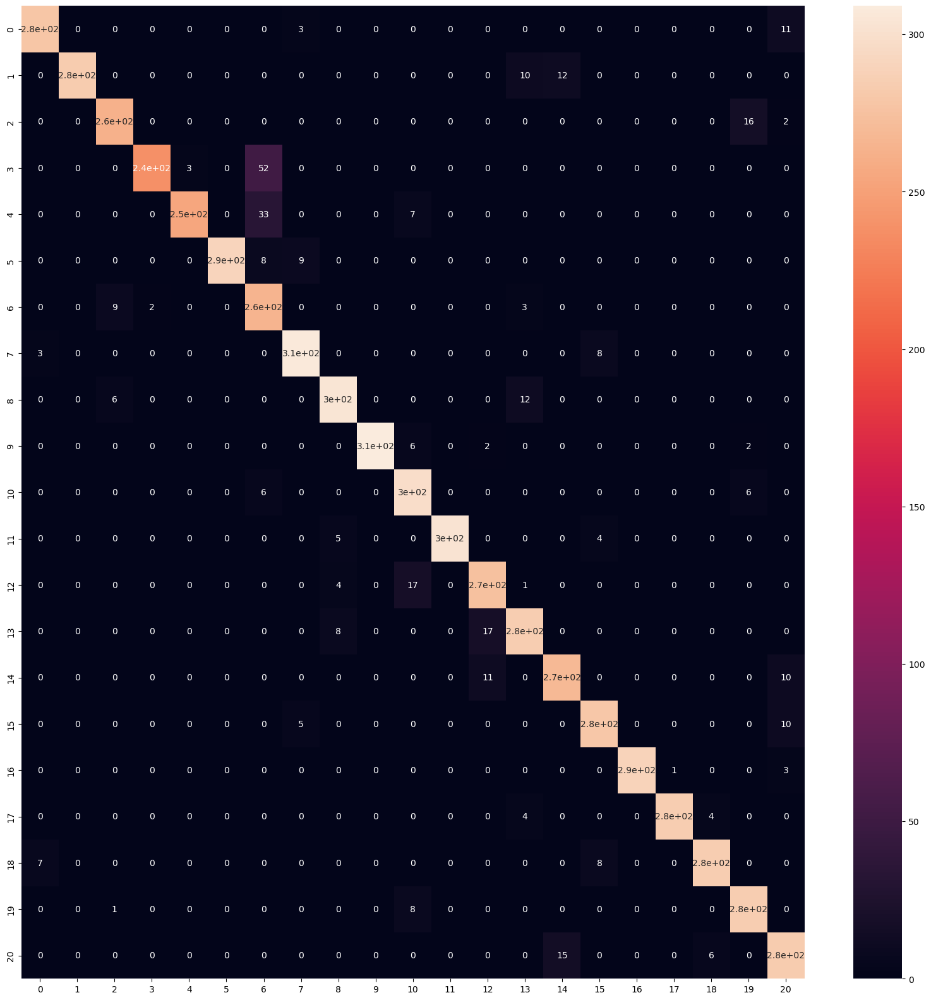

Test - Accuracy: 0.9396825396825397
Test - F1-Score: 0.9405153419923464
Validation - Accuracy: 0.9314285714285714
Validation - F1-Score: 0.9322520485452891


In [36]:
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

0:	learn: 2.7632506	total: 189ms	remaining: 1m 34s
1:	learn: 2.4910693	total: 215ms	remaining: 53.5s
2:	learn: 2.2348315	total: 241ms	remaining: 39.8s
3:	learn: 2.1055023	total: 268ms	remaining: 33.3s
4:	learn: 1.9654109	total: 291ms	remaining: 28.8s
5:	learn: 1.8143154	total: 315ms	remaining: 25.9s
6:	learn: 1.7288654	total: 341ms	remaining: 24s
7:	learn: 1.6200552	total: 364ms	remaining: 22.4s
8:	learn: 1.5413363	total: 388ms	remaining: 21.1s
9:	learn: 1.4849008	total: 413ms	remaining: 20.2s
10:	learn: 1.4024658	total: 442ms	remaining: 19.6s
11:	learn: 1.3453213	total: 465ms	remaining: 18.9s
12:	learn: 1.3134967	total: 487ms	remaining: 18.2s
13:	learn: 1.2451517	total: 510ms	remaining: 17.7s
14:	learn: 1.1823244	total: 536ms	remaining: 17.3s
15:	learn: 1.1234245	total: 561ms	remaining: 17s
16:	learn: 1.0716779	total: 585ms	remaining: 16.6s
17:	learn: 1.0409182	total: 610ms	remaining: 16.3s
18:	learn: 1.0105426	total: 634ms	remaining: 16.1s
19:	learn: 0.9711488	total: 658ms	remaining:

167:	learn: 0.3157904	total: 4.54s	remaining: 8.97s
168:	learn: 0.3153865	total: 4.57s	remaining: 8.94s
169:	learn: 0.3152286	total: 4.59s	remaining: 8.92s
170:	learn: 0.3149733	total: 4.62s	remaining: 8.88s
171:	learn: 0.3145854	total: 4.64s	remaining: 8.85s
172:	learn: 0.3142284	total: 4.66s	remaining: 8.81s
173:	learn: 0.3139505	total: 4.68s	remaining: 8.77s
174:	learn: 0.3136786	total: 4.71s	remaining: 8.74s
175:	learn: 0.3129561	total: 4.73s	remaining: 8.71s
176:	learn: 0.3127777	total: 4.75s	remaining: 8.67s
177:	learn: 0.3125792	total: 4.78s	remaining: 8.64s
178:	learn: 0.3121162	total: 4.8s	remaining: 8.61s
179:	learn: 0.3118286	total: 4.83s	remaining: 8.58s
180:	learn: 0.3114449	total: 4.86s	remaining: 8.56s
181:	learn: 0.3110926	total: 4.88s	remaining: 8.54s
182:	learn: 0.3104651	total: 4.92s	remaining: 8.52s
183:	learn: 0.3101653	total: 4.95s	remaining: 8.5s
184:	learn: 0.3099991	total: 4.98s	remaining: 8.48s
185:	learn: 0.3097785	total: 5.01s	remaining: 8.46s
186:	learn: 0.

328:	learn: 0.2798225	total: 8.66s	remaining: 4.5s
329:	learn: 0.2797393	total: 8.69s	remaining: 4.48s
330:	learn: 0.2796681	total: 8.71s	remaining: 4.45s
331:	learn: 0.2795825	total: 8.74s	remaining: 4.42s
332:	learn: 0.2793924	total: 8.77s	remaining: 4.4s
333:	learn: 0.2792849	total: 8.79s	remaining: 4.37s
334:	learn: 0.2792307	total: 8.82s	remaining: 4.34s
335:	learn: 0.2791130	total: 8.85s	remaining: 4.32s
336:	learn: 0.2789518	total: 8.87s	remaining: 4.29s
337:	learn: 0.2787776	total: 8.89s	remaining: 4.26s
338:	learn: 0.2787350	total: 8.92s	remaining: 4.24s
339:	learn: 0.2785781	total: 8.95s	remaining: 4.21s
340:	learn: 0.2785016	total: 8.97s	remaining: 4.18s
341:	learn: 0.2783000	total: 9s	remaining: 4.16s
342:	learn: 0.2782394	total: 9.02s	remaining: 4.13s
343:	learn: 0.2780668	total: 9.05s	remaining: 4.1s
344:	learn: 0.2779816	total: 9.07s	remaining: 4.08s
345:	learn: 0.2778745	total: 9.1s	remaining: 4.05s
346:	learn: 0.2777727	total: 9.13s	remaining: 4.03s
347:	learn: 0.27765

487:	learn: 0.2615901	total: 12.6s	remaining: 309ms
488:	learn: 0.2614135	total: 12.6s	remaining: 283ms
489:	learn: 0.2613694	total: 12.6s	remaining: 258ms
490:	learn: 0.2612472	total: 12.7s	remaining: 232ms
491:	learn: 0.2610619	total: 12.7s	remaining: 206ms
492:	learn: 0.2609989	total: 12.7s	remaining: 180ms
493:	learn: 0.2609257	total: 12.7s	remaining: 155ms
494:	learn: 0.2608212	total: 12.8s	remaining: 129ms
495:	learn: 0.2607758	total: 12.8s	remaining: 103ms
496:	learn: 0.2606750	total: 12.8s	remaining: 77.3ms
497:	learn: 0.2605455	total: 12.8s	remaining: 51.6ms
498:	learn: 0.2604679	total: 12.9s	remaining: 25.8ms
499:	learn: 0.2603143	total: 12.9s	remaining: 0us
0:	learn: 2.7627198	total: 29ms	remaining: 14.5s
1:	learn: 2.4918554	total: 57.5ms	remaining: 14.3s
2:	learn: 2.2352625	total: 83.4ms	remaining: 13.8s
3:	learn: 2.1058884	total: 111ms	remaining: 13.8s
4:	learn: 1.9621192	total: 138ms	remaining: 13.7s
5:	learn: 1.8103741	total: 164ms	remaining: 13.5s
6:	learn: 1.7250907	to

148:	learn: 0.3218812	total: 3.74s	remaining: 8.81s
149:	learn: 0.3214542	total: 3.77s	remaining: 8.79s
150:	learn: 0.3205836	total: 3.79s	remaining: 8.77s
151:	learn: 0.3201992	total: 3.81s	remaining: 8.73s
152:	learn: 0.3200207	total: 3.84s	remaining: 8.7s
153:	learn: 0.3196829	total: 3.86s	remaining: 8.67s
154:	learn: 0.3194469	total: 3.88s	remaining: 8.64s
155:	learn: 0.3190461	total: 3.9s	remaining: 8.61s
156:	learn: 0.3183192	total: 3.93s	remaining: 8.58s
157:	learn: 0.3181070	total: 3.95s	remaining: 8.56s
158:	learn: 0.3179116	total: 3.98s	remaining: 8.53s
159:	learn: 0.3176565	total: 4s	remaining: 8.5s
160:	learn: 0.3173236	total: 4.02s	remaining: 8.47s
161:	learn: 0.3170413	total: 4.04s	remaining: 8.44s
162:	learn: 0.3165976	total: 4.07s	remaining: 8.41s
163:	learn: 0.3160284	total: 4.09s	remaining: 8.38s
164:	learn: 0.3157047	total: 4.11s	remaining: 8.34s
165:	learn: 0.3153540	total: 4.13s	remaining: 8.32s
166:	learn: 0.3150191	total: 4.16s	remaining: 8.29s
167:	learn: 0.3143

313:	learn: 0.2825245	total: 7.85s	remaining: 4.65s
314:	learn: 0.2822270	total: 7.88s	remaining: 4.63s
315:	learn: 0.2821181	total: 7.91s	remaining: 4.6s
316:	learn: 0.2819344	total: 7.93s	remaining: 4.58s
317:	learn: 0.2816908	total: 7.96s	remaining: 4.55s
318:	learn: 0.2815455	total: 7.98s	remaining: 4.53s
319:	learn: 0.2814167	total: 8.01s	remaining: 4.5s
320:	learn: 0.2812707	total: 8.04s	remaining: 4.48s
321:	learn: 0.2808672	total: 8.06s	remaining: 4.46s
322:	learn: 0.2807120	total: 8.09s	remaining: 4.43s
323:	learn: 0.2805484	total: 8.11s	remaining: 4.41s
324:	learn: 0.2804603	total: 8.14s	remaining: 4.38s
325:	learn: 0.2803997	total: 8.17s	remaining: 4.36s
326:	learn: 0.2802540	total: 8.2s	remaining: 4.34s
327:	learn: 0.2801203	total: 8.22s	remaining: 4.31s
328:	learn: 0.2799297	total: 8.25s	remaining: 4.29s
329:	learn: 0.2798575	total: 8.27s	remaining: 4.26s
330:	learn: 0.2797745	total: 8.3s	remaining: 4.24s
331:	learn: 0.2794674	total: 8.33s	remaining: 4.21s
332:	learn: 0.27

476:	learn: 0.2619747	total: 12.2s	remaining: 586ms
477:	learn: 0.2619019	total: 12.2s	remaining: 561ms
478:	learn: 0.2617900	total: 12.2s	remaining: 536ms
479:	learn: 0.2616536	total: 12.2s	remaining: 510ms
480:	learn: 0.2615900	total: 12.3s	remaining: 485ms
481:	learn: 0.2615555	total: 12.3s	remaining: 459ms
482:	learn: 0.2614934	total: 12.3s	remaining: 434ms
483:	learn: 0.2614209	total: 12.3s	remaining: 408ms
484:	learn: 0.2613198	total: 12.4s	remaining: 383ms
485:	learn: 0.2612636	total: 12.4s	remaining: 357ms
486:	learn: 0.2611070	total: 12.4s	remaining: 332ms
487:	learn: 0.2610375	total: 12.5s	remaining: 306ms
488:	learn: 0.2609597	total: 12.5s	remaining: 281ms
489:	learn: 0.2609429	total: 12.5s	remaining: 255ms
490:	learn: 0.2608651	total: 12.5s	remaining: 230ms
491:	learn: 0.2608107	total: 12.6s	remaining: 204ms
492:	learn: 0.2607321	total: 12.6s	remaining: 179ms
493:	learn: 0.2606875	total: 12.6s	remaining: 153ms
494:	learn: 0.2606309	total: 12.6s	remaining: 128ms
495:	learn: 

138:	learn: 0.3301540	total: 3.79s	remaining: 9.84s
139:	learn: 0.3298987	total: 3.81s	remaining: 9.8s
140:	learn: 0.3293231	total: 3.84s	remaining: 9.77s
141:	learn: 0.3286502	total: 3.87s	remaining: 9.75s
142:	learn: 0.3282472	total: 3.9s	remaining: 9.73s
143:	learn: 0.3279543	total: 3.92s	remaining: 9.7s
144:	learn: 0.3277058	total: 3.95s	remaining: 9.67s
145:	learn: 0.3275608	total: 3.97s	remaining: 9.63s
146:	learn: 0.3268358	total: 4s	remaining: 9.61s
147:	learn: 0.3264383	total: 4.03s	remaining: 9.58s
148:	learn: 0.3262772	total: 4.05s	remaining: 9.55s
149:	learn: 0.3261324	total: 4.08s	remaining: 9.52s
150:	learn: 0.3253343	total: 4.1s	remaining: 9.48s
151:	learn: 0.3248000	total: 4.13s	remaining: 9.46s
152:	learn: 0.3243132	total: 4.16s	remaining: 9.44s
153:	learn: 0.3239555	total: 4.19s	remaining: 9.41s
154:	learn: 0.3236190	total: 4.22s	remaining: 9.39s
155:	learn: 0.3232203	total: 4.25s	remaining: 9.36s
156:	learn: 0.3220659	total: 4.27s	remaining: 9.33s
157:	learn: 0.32165

305:	learn: 0.2878374	total: 7.81s	remaining: 4.95s
306:	learn: 0.2876448	total: 7.84s	remaining: 4.93s
307:	learn: 0.2875113	total: 7.86s	remaining: 4.9s
308:	learn: 0.2873826	total: 7.89s	remaining: 4.87s
309:	learn: 0.2872790	total: 7.91s	remaining: 4.85s
310:	learn: 0.2872111	total: 7.93s	remaining: 4.82s
311:	learn: 0.2870643	total: 7.95s	remaining: 4.79s
312:	learn: 0.2868868	total: 7.98s	remaining: 4.77s
313:	learn: 0.2867136	total: 8s	remaining: 4.74s
314:	learn: 0.2865640	total: 8.02s	remaining: 4.71s
315:	learn: 0.2863692	total: 8.05s	remaining: 4.68s
316:	learn: 0.2862461	total: 8.07s	remaining: 4.66s
317:	learn: 0.2860137	total: 8.09s	remaining: 4.63s
318:	learn: 0.2858509	total: 8.12s	remaining: 4.6s
319:	learn: 0.2856151	total: 8.14s	remaining: 4.58s
320:	learn: 0.2855094	total: 8.16s	remaining: 4.55s
321:	learn: 0.2853880	total: 8.19s	remaining: 4.53s
322:	learn: 0.2852366	total: 8.21s	remaining: 4.5s
323:	learn: 0.2851621	total: 8.23s	remaining: 4.47s
324:	learn: 0.2850

467:	learn: 0.2673193	total: 11.5s	remaining: 786ms
468:	learn: 0.2672040	total: 11.5s	remaining: 762ms
469:	learn: 0.2670816	total: 11.6s	remaining: 737ms
470:	learn: 0.2669888	total: 11.6s	remaining: 713ms
471:	learn: 0.2668629	total: 11.6s	remaining: 688ms
472:	learn: 0.2667423	total: 11.6s	remaining: 663ms
473:	learn: 0.2666496	total: 11.6s	remaining: 639ms
474:	learn: 0.2665638	total: 11.7s	remaining: 614ms
475:	learn: 0.2665035	total: 11.7s	remaining: 589ms
476:	learn: 0.2663456	total: 11.7s	remaining: 565ms
477:	learn: 0.2662117	total: 11.7s	remaining: 540ms
478:	learn: 0.2661054	total: 11.8s	remaining: 516ms
479:	learn: 0.2659499	total: 11.8s	remaining: 491ms
480:	learn: 0.2659048	total: 11.8s	remaining: 466ms
481:	learn: 0.2657916	total: 11.8s	remaining: 442ms
482:	learn: 0.2657078	total: 11.8s	remaining: 417ms
483:	learn: 0.2655313	total: 11.9s	remaining: 392ms
484:	learn: 0.2654670	total: 11.9s	remaining: 368ms
485:	learn: 0.2653706	total: 11.9s	remaining: 343ms
486:	learn: 

135:	learn: 0.3300202	total: 3.19s	remaining: 8.54s
136:	learn: 0.3297254	total: 3.21s	remaining: 8.51s
137:	learn: 0.3289313	total: 3.24s	remaining: 8.49s
138:	learn: 0.3285044	total: 3.26s	remaining: 8.46s
139:	learn: 0.3281245	total: 3.28s	remaining: 8.44s
140:	learn: 0.3275462	total: 3.31s	remaining: 8.42s
141:	learn: 0.3270479	total: 3.33s	remaining: 8.39s
142:	learn: 0.3264026	total: 3.35s	remaining: 8.37s
143:	learn: 0.3259965	total: 3.38s	remaining: 8.35s
144:	learn: 0.3257285	total: 3.4s	remaining: 8.33s
145:	learn: 0.3255713	total: 3.42s	remaining: 8.3s
146:	learn: 0.3248565	total: 3.45s	remaining: 8.28s
147:	learn: 0.3245225	total: 3.47s	remaining: 8.26s
148:	learn: 0.3237886	total: 3.5s	remaining: 8.24s
149:	learn: 0.3237007	total: 3.52s	remaining: 8.21s
150:	learn: 0.3232239	total: 3.54s	remaining: 8.18s
151:	learn: 0.3227428	total: 3.56s	remaining: 8.15s
152:	learn: 0.3226380	total: 3.58s	remaining: 8.12s
153:	learn: 0.3218886	total: 3.6s	remaining: 8.1s
154:	learn: 0.321

294:	learn: 0.2860933	total: 6.83s	remaining: 4.75s
295:	learn: 0.2860268	total: 6.86s	remaining: 4.72s
296:	learn: 0.2859596	total: 6.88s	remaining: 4.7s
297:	learn: 0.2858445	total: 6.9s	remaining: 4.68s
298:	learn: 0.2856891	total: 6.92s	remaining: 4.65s
299:	learn: 0.2855580	total: 6.95s	remaining: 4.63s
300:	learn: 0.2855053	total: 6.97s	remaining: 4.61s
301:	learn: 0.2852196	total: 6.99s	remaining: 4.58s
302:	learn: 0.2850195	total: 7.01s	remaining: 4.56s
303:	learn: 0.2849348	total: 7.03s	remaining: 4.53s
304:	learn: 0.2847654	total: 7.06s	remaining: 4.51s
305:	learn: 0.2845269	total: 7.08s	remaining: 4.49s
306:	learn: 0.2843460	total: 7.1s	remaining: 4.46s
307:	learn: 0.2842123	total: 7.12s	remaining: 4.44s
308:	learn: 0.2841435	total: 7.14s	remaining: 4.42s
309:	learn: 0.2840880	total: 7.17s	remaining: 4.39s
310:	learn: 0.2839909	total: 7.19s	remaining: 4.37s
311:	learn: 0.2839093	total: 7.21s	remaining: 4.34s
312:	learn: 0.2837797	total: 7.23s	remaining: 4.32s
313:	learn: 0.2

459:	learn: 0.2649248	total: 10.6s	remaining: 923ms
460:	learn: 0.2648677	total: 10.6s	remaining: 900ms
461:	learn: 0.2648141	total: 10.7s	remaining: 877ms
462:	learn: 0.2647500	total: 10.7s	remaining: 854ms
463:	learn: 0.2646814	total: 10.7s	remaining: 831ms
464:	learn: 0.2644932	total: 10.7s	remaining: 808ms
465:	learn: 0.2643682	total: 10.8s	remaining: 785ms
466:	learn: 0.2642869	total: 10.8s	remaining: 761ms
467:	learn: 0.2641517	total: 10.8s	remaining: 738ms
468:	learn: 0.2639891	total: 10.8s	remaining: 715ms
469:	learn: 0.2638735	total: 10.8s	remaining: 692ms
470:	learn: 0.2637703	total: 10.9s	remaining: 669ms
471:	learn: 0.2635922	total: 10.9s	remaining: 646ms
472:	learn: 0.2635185	total: 10.9s	remaining: 623ms
473:	learn: 0.2634321	total: 10.9s	remaining: 600ms
474:	learn: 0.2633956	total: 11s	remaining: 577ms
475:	learn: 0.2633400	total: 11s	remaining: 553ms
476:	learn: 0.2632534	total: 11s	remaining: 530ms
477:	learn: 0.2631878	total: 11s	remaining: 507ms
478:	learn: 0.263058

120:	learn: 0.3426281	total: 2.85s	remaining: 8.94s
121:	learn: 0.3415755	total: 2.88s	remaining: 8.92s
122:	learn: 0.3410481	total: 2.9s	remaining: 8.89s
123:	learn: 0.3405064	total: 2.92s	remaining: 8.86s
124:	learn: 0.3399174	total: 2.94s	remaining: 8.84s
125:	learn: 0.3393886	total: 2.97s	remaining: 8.81s
126:	learn: 0.3385662	total: 2.99s	remaining: 8.79s
127:	learn: 0.3372224	total: 3.02s	remaining: 8.76s
128:	learn: 0.3366251	total: 3.04s	remaining: 8.74s
129:	learn: 0.3358755	total: 3.06s	remaining: 8.71s
130:	learn: 0.3354254	total: 3.09s	remaining: 8.7s
131:	learn: 0.3345370	total: 3.11s	remaining: 8.68s
132:	learn: 0.3340993	total: 3.13s	remaining: 8.65s
133:	learn: 0.3332865	total: 3.16s	remaining: 8.62s
134:	learn: 0.3329270	total: 3.18s	remaining: 8.59s
135:	learn: 0.3326428	total: 3.2s	remaining: 8.56s
136:	learn: 0.3317853	total: 3.22s	remaining: 8.54s
137:	learn: 0.3314405	total: 3.24s	remaining: 8.51s
138:	learn: 0.3308605	total: 3.27s	remaining: 8.48s
139:	learn: 0.3

283:	learn: 0.2878862	total: 6.63s	remaining: 5.04s
284:	learn: 0.2877541	total: 6.65s	remaining: 5.02s
285:	learn: 0.2876766	total: 6.68s	remaining: 5s
286:	learn: 0.2875156	total: 6.7s	remaining: 4.97s
287:	learn: 0.2872563	total: 6.73s	remaining: 4.95s
288:	learn: 0.2869781	total: 6.75s	remaining: 4.93s
289:	learn: 0.2868462	total: 6.77s	remaining: 4.9s
290:	learn: 0.2866185	total: 6.79s	remaining: 4.88s
291:	learn: 0.2864223	total: 6.82s	remaining: 4.86s
292:	learn: 0.2863606	total: 6.85s	remaining: 4.84s
293:	learn: 0.2861850	total: 6.88s	remaining: 4.82s
294:	learn: 0.2860241	total: 6.9s	remaining: 4.79s
295:	learn: 0.2858941	total: 6.92s	remaining: 4.77s
296:	learn: 0.2857785	total: 6.94s	remaining: 4.75s
297:	learn: 0.2856367	total: 6.96s	remaining: 4.72s
298:	learn: 0.2855200	total: 6.99s	remaining: 4.7s
299:	learn: 0.2852602	total: 7.01s	remaining: 4.67s
300:	learn: 0.2851862	total: 7.03s	remaining: 4.65s
301:	learn: 0.2850061	total: 7.05s	remaining: 4.63s
302:	learn: 0.28480

449:	learn: 0.2655140	total: 10.6s	remaining: 1.17s
450:	learn: 0.2654099	total: 10.6s	remaining: 1.15s
451:	learn: 0.2652750	total: 10.6s	remaining: 1.13s
452:	learn: 0.2651856	total: 10.6s	remaining: 1.1s
453:	learn: 0.2651480	total: 10.7s	remaining: 1.08s
454:	learn: 0.2650084	total: 10.7s	remaining: 1.06s
455:	learn: 0.2648953	total: 10.7s	remaining: 1.03s
456:	learn: 0.2648564	total: 10.7s	remaining: 1.01s
457:	learn: 0.2648070	total: 10.8s	remaining: 988ms
458:	learn: 0.2647330	total: 10.8s	remaining: 965ms
459:	learn: 0.2646210	total: 10.8s	remaining: 941ms
460:	learn: 0.2645677	total: 10.9s	remaining: 918ms
461:	learn: 0.2644834	total: 10.9s	remaining: 895ms
462:	learn: 0.2643899	total: 10.9s	remaining: 872ms
463:	learn: 0.2643028	total: 10.9s	remaining: 848ms
464:	learn: 0.2641279	total: 11s	remaining: 825ms
465:	learn: 0.2640142	total: 11s	remaining: 801ms
466:	learn: 0.2639249	total: 11s	remaining: 778ms
467:	learn: 0.2638316	total: 11s	remaining: 754ms
468:	learn: 0.2637675

110:	learn: 0.3484838	total: 2.62s	remaining: 9.18s
111:	learn: 0.3471715	total: 2.64s	remaining: 9.16s
112:	learn: 0.3462041	total: 2.67s	remaining: 9.13s
113:	learn: 0.3449742	total: 2.69s	remaining: 9.11s
114:	learn: 0.3445475	total: 2.71s	remaining: 9.07s
115:	learn: 0.3435383	total: 2.73s	remaining: 9.04s
116:	learn: 0.3423626	total: 2.75s	remaining: 9.02s
117:	learn: 0.3417047	total: 2.78s	remaining: 9s
118:	learn: 0.3410385	total: 2.8s	remaining: 8.98s
119:	learn: 0.3402220	total: 2.83s	remaining: 8.96s
120:	learn: 0.3397515	total: 2.85s	remaining: 8.94s
121:	learn: 0.3393061	total: 2.88s	remaining: 8.92s
122:	learn: 0.3385611	total: 2.9s	remaining: 8.89s
123:	learn: 0.3378299	total: 2.92s	remaining: 8.86s
124:	learn: 0.3373366	total: 2.94s	remaining: 8.83s
125:	learn: 0.3368864	total: 2.96s	remaining: 8.8s
126:	learn: 0.3361375	total: 2.99s	remaining: 8.77s
127:	learn: 0.3343690	total: 3.01s	remaining: 8.76s
128:	learn: 0.3336904	total: 3.04s	remaining: 8.73s
129:	learn: 0.3325

277:	learn: 0.2891651	total: 6.46s	remaining: 5.16s
278:	learn: 0.2890386	total: 6.49s	remaining: 5.14s
279:	learn: 0.2887108	total: 6.51s	remaining: 5.12s
280:	learn: 0.2884082	total: 6.54s	remaining: 5.1s
281:	learn: 0.2883127	total: 6.56s	remaining: 5.07s
282:	learn: 0.2882634	total: 6.58s	remaining: 5.05s
283:	learn: 0.2880978	total: 6.61s	remaining: 5.02s
284:	learn: 0.2877934	total: 6.63s	remaining: 5s
285:	learn: 0.2875811	total: 6.65s	remaining: 4.97s
286:	learn: 0.2874047	total: 6.67s	remaining: 4.95s
287:	learn: 0.2871703	total: 6.7s	remaining: 4.93s
288:	learn: 0.2868912	total: 6.72s	remaining: 4.91s
289:	learn: 0.2866535	total: 6.74s	remaining: 4.88s
290:	learn: 0.2863140	total: 6.76s	remaining: 4.86s
291:	learn: 0.2860117	total: 6.78s	remaining: 4.83s
292:	learn: 0.2857709	total: 6.8s	remaining: 4.81s
293:	learn: 0.2855609	total: 6.83s	remaining: 4.78s
294:	learn: 0.2854355	total: 6.85s	remaining: 4.76s
295:	learn: 0.2853468	total: 6.87s	remaining: 4.74s
296:	learn: 0.2852

443:	learn: 0.2654380	total: 10.4s	remaining: 1.31s
444:	learn: 0.2653578	total: 10.4s	remaining: 1.28s
445:	learn: 0.2652849	total: 10.4s	remaining: 1.26s
446:	learn: 0.2652204	total: 10.4s	remaining: 1.24s
447:	learn: 0.2650744	total: 10.5s	remaining: 1.21s
448:	learn: 0.2650158	total: 10.5s	remaining: 1.19s
449:	learn: 0.2649421	total: 10.5s	remaining: 1.17s
450:	learn: 0.2648782	total: 10.5s	remaining: 1.14s
451:	learn: 0.2648419	total: 10.6s	remaining: 1.12s
452:	learn: 0.2647043	total: 10.6s	remaining: 1.1s
453:	learn: 0.2646317	total: 10.6s	remaining: 1.07s
454:	learn: 0.2643207	total: 10.6s	remaining: 1.05s
455:	learn: 0.2641827	total: 10.7s	remaining: 1.03s
456:	learn: 0.2640395	total: 10.7s	remaining: 1s
457:	learn: 0.2639450	total: 10.7s	remaining: 981ms
458:	learn: 0.2638701	total: 10.7s	remaining: 957ms
459:	learn: 0.2637638	total: 10.7s	remaining: 934ms
460:	learn: 0.2637141	total: 10.8s	remaining: 910ms
461:	learn: 0.2636485	total: 10.8s	remaining: 887ms
462:	learn: 0.26

104:	learn: 0.3504694	total: 2.58s	remaining: 9.7s
105:	learn: 0.3490631	total: 2.61s	remaining: 9.7s
106:	learn: 0.3479050	total: 2.64s	remaining: 9.69s
107:	learn: 0.3469305	total: 2.67s	remaining: 9.68s
108:	learn: 0.3462306	total: 2.69s	remaining: 9.66s
109:	learn: 0.3457191	total: 2.72s	remaining: 9.64s
110:	learn: 0.3442628	total: 2.74s	remaining: 9.6s
111:	learn: 0.3427460	total: 2.76s	remaining: 9.57s
112:	learn: 0.3421488	total: 2.78s	remaining: 9.54s
113:	learn: 0.3411636	total: 2.81s	remaining: 9.52s
114:	learn: 0.3406254	total: 2.83s	remaining: 9.48s
115:	learn: 0.3393158	total: 2.85s	remaining: 9.45s
116:	learn: 0.3383951	total: 2.88s	remaining: 9.41s
117:	learn: 0.3375252	total: 2.9s	remaining: 9.38s
118:	learn: 0.3368544	total: 2.92s	remaining: 9.34s
119:	learn: 0.3362123	total: 2.94s	remaining: 9.31s
120:	learn: 0.3358213	total: 2.96s	remaining: 9.28s
121:	learn: 0.3342237	total: 2.99s	remaining: 9.26s
122:	learn: 0.3334740	total: 3.01s	remaining: 9.22s
123:	learn: 0.33

271:	learn: 0.2851459	total: 6.51s	remaining: 5.46s
272:	learn: 0.2846560	total: 6.54s	remaining: 5.44s
273:	learn: 0.2844784	total: 6.57s	remaining: 5.42s
274:	learn: 0.2841977	total: 6.59s	remaining: 5.39s
275:	learn: 0.2840869	total: 6.61s	remaining: 5.37s
276:	learn: 0.2839671	total: 6.63s	remaining: 5.34s
277:	learn: 0.2838353	total: 6.66s	remaining: 5.32s
278:	learn: 0.2837040	total: 6.68s	remaining: 5.29s
279:	learn: 0.2835912	total: 6.7s	remaining: 5.27s
280:	learn: 0.2834537	total: 6.73s	remaining: 5.25s
281:	learn: 0.2833889	total: 6.77s	remaining: 5.23s
282:	learn: 0.2831269	total: 6.79s	remaining: 5.21s
283:	learn: 0.2829521	total: 6.82s	remaining: 5.19s
284:	learn: 0.2828661	total: 6.84s	remaining: 5.16s
285:	learn: 0.2827030	total: 6.87s	remaining: 5.14s
286:	learn: 0.2825794	total: 6.89s	remaining: 5.11s
287:	learn: 0.2824992	total: 6.91s	remaining: 5.09s
288:	learn: 0.2822501	total: 6.93s	remaining: 5.06s
289:	learn: 0.2820361	total: 6.96s	remaining: 5.04s
290:	learn: 0

436:	learn: 0.2635080	total: 10.7s	remaining: 1.53s
437:	learn: 0.2633406	total: 10.7s	remaining: 1.51s
438:	learn: 0.2633171	total: 10.7s	remaining: 1.49s
439:	learn: 0.2632516	total: 10.7s	remaining: 1.46s
440:	learn: 0.2631669	total: 10.7s	remaining: 1.44s
441:	learn: 0.2630782	total: 10.8s	remaining: 1.41s
442:	learn: 0.2629196	total: 10.8s	remaining: 1.39s
443:	learn: 0.2628893	total: 10.8s	remaining: 1.36s
444:	learn: 0.2627892	total: 10.8s	remaining: 1.34s
445:	learn: 0.2627198	total: 10.9s	remaining: 1.31s
446:	learn: 0.2626443	total: 10.9s	remaining: 1.29s
447:	learn: 0.2625736	total: 10.9s	remaining: 1.27s
448:	learn: 0.2625221	total: 10.9s	remaining: 1.24s
449:	learn: 0.2624007	total: 11s	remaining: 1.22s
450:	learn: 0.2623789	total: 11s	remaining: 1.19s
451:	learn: 0.2622333	total: 11s	remaining: 1.17s
452:	learn: 0.2621061	total: 11s	remaining: 1.14s
453:	learn: 0.2620538	total: 11s	remaining: 1.12s
454:	learn: 0.2618384	total: 11.1s	remaining: 1.09s
455:	learn: 0.2617563	

105:	learn: 0.3548553	total: 2.64s	remaining: 9.8s
106:	learn: 0.3536004	total: 2.66s	remaining: 9.78s
107:	learn: 0.3523140	total: 2.69s	remaining: 9.75s
108:	learn: 0.3517870	total: 2.71s	remaining: 9.71s
109:	learn: 0.3512297	total: 2.73s	remaining: 9.68s
110:	learn: 0.3498740	total: 2.75s	remaining: 9.64s
111:	learn: 0.3492218	total: 2.77s	remaining: 9.61s
112:	learn: 0.3478759	total: 2.79s	remaining: 9.57s
113:	learn: 0.3472730	total: 2.82s	remaining: 9.54s
114:	learn: 0.3462342	total: 2.84s	remaining: 9.51s
115:	learn: 0.3450198	total: 2.87s	remaining: 9.49s
116:	learn: 0.3439739	total: 2.89s	remaining: 9.46s
117:	learn: 0.3430020	total: 2.91s	remaining: 9.44s
118:	learn: 0.3424726	total: 2.94s	remaining: 9.4s
119:	learn: 0.3416510	total: 2.96s	remaining: 9.37s
120:	learn: 0.3398490	total: 2.98s	remaining: 9.34s
121:	learn: 0.3393915	total: 3s	remaining: 9.31s
122:	learn: 0.3382051	total: 3.02s	remaining: 9.27s
123:	learn: 0.3376640	total: 3.05s	remaining: 9.24s
124:	learn: 0.337

265:	learn: 0.2919667	total: 6.3s	remaining: 5.54s
266:	learn: 0.2918776	total: 6.33s	remaining: 5.52s
267:	learn: 0.2917107	total: 6.35s	remaining: 5.5s
268:	learn: 0.2916108	total: 6.37s	remaining: 5.47s
269:	learn: 0.2915326	total: 6.39s	remaining: 5.45s
270:	learn: 0.2910892	total: 6.42s	remaining: 5.42s
271:	learn: 0.2909618	total: 6.44s	remaining: 5.4s
272:	learn: 0.2908412	total: 6.46s	remaining: 5.38s
273:	learn: 0.2907094	total: 6.49s	remaining: 5.35s
274:	learn: 0.2905402	total: 6.51s	remaining: 5.33s
275:	learn: 0.2904159	total: 6.54s	remaining: 5.31s
276:	learn: 0.2900481	total: 6.56s	remaining: 5.28s
277:	learn: 0.2899433	total: 6.59s	remaining: 5.26s
278:	learn: 0.2895975	total: 6.61s	remaining: 5.23s
279:	learn: 0.2893937	total: 6.63s	remaining: 5.21s
280:	learn: 0.2891944	total: 6.65s	remaining: 5.18s
281:	learn: 0.2888935	total: 6.67s	remaining: 5.16s
282:	learn: 0.2886107	total: 6.7s	remaining: 5.14s
283:	learn: 0.2880705	total: 6.72s	remaining: 5.11s
284:	learn: 0.28

424:	learn: 0.2670038	total: 9.95s	remaining: 1.75s
425:	learn: 0.2669462	total: 9.97s	remaining: 1.73s
426:	learn: 0.2668486	total: 10s	remaining: 1.71s
427:	learn: 0.2667788	total: 10s	remaining: 1.69s
428:	learn: 0.2666975	total: 10.1s	remaining: 1.66s
429:	learn: 0.2665571	total: 10.1s	remaining: 1.64s
430:	learn: 0.2664889	total: 10.1s	remaining: 1.62s
431:	learn: 0.2664297	total: 10.1s	remaining: 1.59s
432:	learn: 0.2663779	total: 10.2s	remaining: 1.57s
433:	learn: 0.2662745	total: 10.2s	remaining: 1.55s
434:	learn: 0.2660944	total: 10.2s	remaining: 1.52s
435:	learn: 0.2660504	total: 10.2s	remaining: 1.5s
436:	learn: 0.2659803	total: 10.2s	remaining: 1.48s
437:	learn: 0.2658127	total: 10.3s	remaining: 1.45s
438:	learn: 0.2657917	total: 10.3s	remaining: 1.43s
439:	learn: 0.2656983	total: 10.3s	remaining: 1.41s
440:	learn: 0.2655936	total: 10.3s	remaining: 1.38s
441:	learn: 0.2655183	total: 10.4s	remaining: 1.36s
442:	learn: 0.2654066	total: 10.4s	remaining: 1.34s
443:	learn: 0.265

88:	learn: 0.3739310	total: 2.23s	remaining: 10.3s
89:	learn: 0.3719081	total: 2.26s	remaining: 10.3s
90:	learn: 0.3706977	total: 2.28s	remaining: 10.3s
91:	learn: 0.3689095	total: 2.3s	remaining: 10.2s
92:	learn: 0.3681103	total: 2.32s	remaining: 10.2s
93:	learn: 0.3673226	total: 2.35s	remaining: 10.1s
94:	learn: 0.3657030	total: 2.37s	remaining: 10.1s
95:	learn: 0.3640967	total: 2.39s	remaining: 10.1s
96:	learn: 0.3621295	total: 2.42s	remaining: 10.1s
97:	learn: 0.3611597	total: 2.44s	remaining: 10s
98:	learn: 0.3600335	total: 2.47s	remaining: 9.99s
99:	learn: 0.3579519	total: 2.49s	remaining: 9.96s
100:	learn: 0.3568385	total: 2.51s	remaining: 9.92s
101:	learn: 0.3554999	total: 2.53s	remaining: 9.89s
102:	learn: 0.3547203	total: 2.56s	remaining: 9.86s
103:	learn: 0.3534442	total: 2.58s	remaining: 9.82s
104:	learn: 0.3526844	total: 2.6s	remaining: 9.78s
105:	learn: 0.3514100	total: 2.62s	remaining: 9.75s
106:	learn: 0.3501757	total: 2.64s	remaining: 9.71s
107:	learn: 0.3491518	total:

254:	learn: 0.2920251	total: 6.12s	remaining: 5.88s
255:	learn: 0.2918267	total: 6.17s	remaining: 5.88s
256:	learn: 0.2917224	total: 6.2s	remaining: 5.86s
257:	learn: 0.2913692	total: 6.22s	remaining: 5.83s
258:	learn: 0.2912190	total: 6.24s	remaining: 5.81s
259:	learn: 0.2910491	total: 6.27s	remaining: 5.79s
260:	learn: 0.2909920	total: 6.29s	remaining: 5.76s
261:	learn: 0.2907845	total: 6.31s	remaining: 5.73s
262:	learn: 0.2904473	total: 6.33s	remaining: 5.7s
263:	learn: 0.2902868	total: 6.35s	remaining: 5.68s
264:	learn: 0.2901104	total: 6.38s	remaining: 5.65s
265:	learn: 0.2898482	total: 6.4s	remaining: 5.63s
266:	learn: 0.2896733	total: 6.42s	remaining: 5.61s
267:	learn: 0.2894984	total: 6.45s	remaining: 5.58s
268:	learn: 0.2894528	total: 6.47s	remaining: 5.55s
269:	learn: 0.2892235	total: 6.49s	remaining: 5.53s
270:	learn: 0.2890214	total: 6.51s	remaining: 5.5s
271:	learn: 0.2887243	total: 6.54s	remaining: 5.48s
272:	learn: 0.2885680	total: 6.56s	remaining: 5.46s
273:	learn: 0.28

413:	learn: 0.2678943	total: 9.78s	remaining: 2.03s
414:	learn: 0.2677865	total: 9.81s	remaining: 2.01s
415:	learn: 0.2676719	total: 9.84s	remaining: 1.99s
416:	learn: 0.2674496	total: 9.86s	remaining: 1.96s
417:	learn: 0.2673734	total: 9.88s	remaining: 1.94s
418:	learn: 0.2673032	total: 9.91s	remaining: 1.92s
419:	learn: 0.2671830	total: 9.93s	remaining: 1.89s
420:	learn: 0.2671276	total: 9.96s	remaining: 1.87s
421:	learn: 0.2668908	total: 9.98s	remaining: 1.84s
422:	learn: 0.2668152	total: 10s	remaining: 1.82s
423:	learn: 0.2665790	total: 10s	remaining: 1.8s
424:	learn: 0.2664757	total: 10.1s	remaining: 1.77s
425:	learn: 0.2662891	total: 10.1s	remaining: 1.75s
426:	learn: 0.2661784	total: 10.1s	remaining: 1.73s
427:	learn: 0.2661060	total: 10.1s	remaining: 1.7s
428:	learn: 0.2660734	total: 10.1s	remaining: 1.68s
429:	learn: 0.2659980	total: 10.2s	remaining: 1.65s
430:	learn: 0.2658456	total: 10.2s	remaining: 1.63s
431:	learn: 0.2657666	total: 10.2s	remaining: 1.61s
432:	learn: 0.2657

76:	learn: 0.3969602	total: 1.84s	remaining: 10.1s
77:	learn: 0.3942145	total: 1.86s	remaining: 10.1s
78:	learn: 0.3915178	total: 1.89s	remaining: 10.1s
79:	learn: 0.3900499	total: 1.92s	remaining: 10.1s
80:	learn: 0.3874957	total: 1.94s	remaining: 10s
81:	learn: 0.3855532	total: 1.96s	remaining: 10s
82:	learn: 0.3839115	total: 1.99s	remaining: 9.99s
83:	learn: 0.3816398	total: 2.01s	remaining: 9.97s
84:	learn: 0.3802800	total: 2.04s	remaining: 9.95s
85:	learn: 0.3791704	total: 2.06s	remaining: 9.93s
86:	learn: 0.3770560	total: 2.09s	remaining: 9.9s
87:	learn: 0.3749000	total: 2.11s	remaining: 9.89s
88:	learn: 0.3738199	total: 2.14s	remaining: 9.87s
89:	learn: 0.3716247	total: 2.16s	remaining: 9.84s
90:	learn: 0.3709673	total: 2.18s	remaining: 9.81s
91:	learn: 0.3697530	total: 2.2s	remaining: 9.78s
92:	learn: 0.3683198	total: 2.23s	remaining: 9.76s
93:	learn: 0.3667058	total: 2.25s	remaining: 9.74s
94:	learn: 0.3653367	total: 2.28s	remaining: 9.71s
95:	learn: 0.3638462	total: 2.3s	rema

240:	learn: 0.2939679	total: 5.7s	remaining: 6.13s
241:	learn: 0.2937342	total: 5.72s	remaining: 6.1s
242:	learn: 0.2935123	total: 5.75s	remaining: 6.08s
243:	learn: 0.2933541	total: 5.77s	remaining: 6.05s
244:	learn: 0.2931553	total: 5.79s	remaining: 6.03s
245:	learn: 0.2928629	total: 5.82s	remaining: 6s
246:	learn: 0.2927785	total: 5.83s	remaining: 5.98s
247:	learn: 0.2926265	total: 5.86s	remaining: 5.95s
248:	learn: 0.2925095	total: 5.88s	remaining: 5.93s
249:	learn: 0.2920596	total: 5.9s	remaining: 5.9s
250:	learn: 0.2918148	total: 5.93s	remaining: 5.88s
251:	learn: 0.2916272	total: 5.95s	remaining: 5.86s
252:	learn: 0.2914583	total: 5.97s	remaining: 5.83s
253:	learn: 0.2912585	total: 6s	remaining: 5.81s
254:	learn: 0.2910283	total: 6.02s	remaining: 5.78s
255:	learn: 0.2908422	total: 6.04s	remaining: 5.76s
256:	learn: 0.2907667	total: 6.06s	remaining: 5.73s
257:	learn: 0.2906419	total: 6.08s	remaining: 5.71s
258:	learn: 0.2905503	total: 6.11s	remaining: 5.68s
259:	learn: 0.2903321	

401:	learn: 0.2700038	total: 9.43s	remaining: 2.3s
402:	learn: 0.2698403	total: 9.46s	remaining: 2.28s
403:	learn: 0.2697974	total: 9.49s	remaining: 2.25s
404:	learn: 0.2697126	total: 9.51s	remaining: 2.23s
405:	learn: 0.2696899	total: 9.53s	remaining: 2.21s
406:	learn: 0.2695252	total: 9.55s	remaining: 2.18s
407:	learn: 0.2693422	total: 9.58s	remaining: 2.16s
408:	learn: 0.2692357	total: 9.6s	remaining: 2.13s
409:	learn: 0.2691776	total: 9.62s	remaining: 2.11s
410:	learn: 0.2690450	total: 9.64s	remaining: 2.09s
411:	learn: 0.2689653	total: 9.67s	remaining: 2.06s
412:	learn: 0.2689020	total: 9.69s	remaining: 2.04s
413:	learn: 0.2688220	total: 9.71s	remaining: 2.02s
414:	learn: 0.2687244	total: 9.73s	remaining: 1.99s
415:	learn: 0.2686323	total: 9.75s	remaining: 1.97s
416:	learn: 0.2685810	total: 9.77s	remaining: 1.95s
417:	learn: 0.2684678	total: 9.8s	remaining: 1.92s
418:	learn: 0.2683136	total: 9.82s	remaining: 1.9s
419:	learn: 0.2682342	total: 9.85s	remaining: 1.88s
420:	learn: 0.26

62:	learn: 0.3980473	total: 1.53s	remaining: 10.6s
63:	learn: 0.3953078	total: 1.55s	remaining: 10.6s
64:	learn: 0.3943286	total: 1.58s	remaining: 10.6s
65:	learn: 0.3916818	total: 1.6s	remaining: 10.5s
66:	learn: 0.3887831	total: 1.62s	remaining: 10.5s
67:	learn: 0.3856158	total: 1.65s	remaining: 10.5s
68:	learn: 0.3824511	total: 1.67s	remaining: 10.4s
69:	learn: 0.3793503	total: 1.69s	remaining: 10.4s
70:	learn: 0.3773616	total: 1.72s	remaining: 10.4s
71:	learn: 0.3755564	total: 1.74s	remaining: 10.3s
72:	learn: 0.3742397	total: 1.76s	remaining: 10.3s
73:	learn: 0.3729197	total: 1.78s	remaining: 10.3s
74:	learn: 0.3698110	total: 1.81s	remaining: 10.2s
75:	learn: 0.3680083	total: 1.83s	remaining: 10.2s
76:	learn: 0.3653076	total: 1.85s	remaining: 10.2s
77:	learn: 0.3626600	total: 1.88s	remaining: 10.1s
78:	learn: 0.3611339	total: 1.9s	remaining: 10.1s
79:	learn: 0.3598579	total: 1.93s	remaining: 10.1s
80:	learn: 0.3577181	total: 1.95s	remaining: 10.1s
81:	learn: 0.3563937	total: 1.98s

226:	learn: 0.2883614	total: 5.34s	remaining: 6.43s
227:	learn: 0.2881998	total: 5.37s	remaining: 6.4s
228:	learn: 0.2880599	total: 5.39s	remaining: 6.38s
229:	learn: 0.2878758	total: 5.41s	remaining: 6.36s
230:	learn: 0.2876694	total: 5.44s	remaining: 6.33s
231:	learn: 0.2875802	total: 5.46s	remaining: 6.31s
232:	learn: 0.2872862	total: 5.48s	remaining: 6.28s
233:	learn: 0.2870660	total: 5.51s	remaining: 6.26s
234:	learn: 0.2869532	total: 5.53s	remaining: 6.23s
235:	learn: 0.2868552	total: 5.55s	remaining: 6.21s
236:	learn: 0.2866644	total: 5.58s	remaining: 6.19s
237:	learn: 0.2864347	total: 5.6s	remaining: 6.17s
238:	learn: 0.2861849	total: 5.63s	remaining: 6.14s
239:	learn: 0.2859813	total: 5.65s	remaining: 6.12s
240:	learn: 0.2856446	total: 5.68s	remaining: 6.1s
241:	learn: 0.2855453	total: 5.7s	remaining: 6.08s
242:	learn: 0.2852928	total: 5.73s	remaining: 6.06s
243:	learn: 0.2852158	total: 5.75s	remaining: 6.03s
244:	learn: 0.2851191	total: 5.77s	remaining: 6.01s
245:	learn: 0.28

386:	learn: 0.2617791	total: 9.06s	remaining: 2.65s
387:	learn: 0.2615114	total: 9.09s	remaining: 2.62s
388:	learn: 0.2613331	total: 9.11s	remaining: 2.6s
389:	learn: 0.2612481	total: 9.14s	remaining: 2.58s
390:	learn: 0.2611855	total: 9.16s	remaining: 2.55s
391:	learn: 0.2610170	total: 9.18s	remaining: 2.53s
392:	learn: 0.2607498	total: 9.21s	remaining: 2.51s
393:	learn: 0.2607002	total: 9.23s	remaining: 2.48s
394:	learn: 0.2606461	total: 9.25s	remaining: 2.46s
395:	learn: 0.2605252	total: 9.27s	remaining: 2.43s
396:	learn: 0.2603168	total: 9.29s	remaining: 2.41s
397:	learn: 0.2601610	total: 9.32s	remaining: 2.39s
398:	learn: 0.2599846	total: 9.34s	remaining: 2.37s
399:	learn: 0.2599159	total: 9.36s	remaining: 2.34s
400:	learn: 0.2598272	total: 9.39s	remaining: 2.32s
401:	learn: 0.2597608	total: 9.41s	remaining: 2.29s
402:	learn: 0.2595962	total: 9.43s	remaining: 2.27s
403:	learn: 0.2595286	total: 9.45s	remaining: 2.25s
404:	learn: 0.2594562	total: 9.48s	remaining: 2.22s
405:	learn: 0

47:	learn: 0.4563965	total: 1.17s	remaining: 11s
48:	learn: 0.4532318	total: 1.2s	remaining: 11s
49:	learn: 0.4490853	total: 1.22s	remaining: 11s
50:	learn: 0.4448752	total: 1.24s	remaining: 10.9s
51:	learn: 0.4419374	total: 1.26s	remaining: 10.9s
52:	learn: 0.4375932	total: 1.29s	remaining: 10.9s
53:	learn: 0.4323691	total: 1.31s	remaining: 10.8s
54:	learn: 0.4282180	total: 1.34s	remaining: 10.8s
55:	learn: 0.4232167	total: 1.36s	remaining: 10.8s
56:	learn: 0.4183174	total: 1.38s	remaining: 10.8s
57:	learn: 0.4144610	total: 1.41s	remaining: 10.7s
58:	learn: 0.4105462	total: 1.43s	remaining: 10.7s
59:	learn: 0.4081164	total: 1.46s	remaining: 10.7s
60:	learn: 0.4039545	total: 1.48s	remaining: 10.6s
61:	learn: 0.3997248	total: 1.5s	remaining: 10.6s
62:	learn: 0.3970870	total: 1.52s	remaining: 10.6s
63:	learn: 0.3938475	total: 1.54s	remaining: 10.5s
64:	learn: 0.3900787	total: 1.57s	remaining: 10.5s
65:	learn: 0.3875422	total: 1.59s	remaining: 10.5s
66:	learn: 0.3847853	total: 1.62s	remai

212:	learn: 0.2916027	total: 5s	remaining: 6.73s
213:	learn: 0.2914922	total: 5.02s	remaining: 6.71s
214:	learn: 0.2913307	total: 5.04s	remaining: 6.68s
215:	learn: 0.2912261	total: 5.06s	remaining: 6.66s
216:	learn: 0.2910974	total: 5.08s	remaining: 6.63s
217:	learn: 0.2907242	total: 5.11s	remaining: 6.61s
218:	learn: 0.2906249	total: 5.13s	remaining: 6.58s
219:	learn: 0.2904431	total: 5.15s	remaining: 6.56s
220:	learn: 0.2902541	total: 5.17s	remaining: 6.53s
221:	learn: 0.2898213	total: 5.2s	remaining: 6.5s
222:	learn: 0.2894351	total: 5.22s	remaining: 6.48s
223:	learn: 0.2892280	total: 5.24s	remaining: 6.46s
224:	learn: 0.2889186	total: 5.26s	remaining: 6.44s
225:	learn: 0.2885806	total: 5.29s	remaining: 6.41s
226:	learn: 0.2882126	total: 5.31s	remaining: 6.38s
227:	learn: 0.2881028	total: 5.33s	remaining: 6.36s
228:	learn: 0.2880606	total: 5.35s	remaining: 6.33s
229:	learn: 0.2879207	total: 5.38s	remaining: 6.31s
230:	learn: 0.2877366	total: 5.4s	remaining: 6.29s
231:	learn: 0.2876

379:	learn: 0.2637279	total: 8.83s	remaining: 2.79s
380:	learn: 0.2636256	total: 8.85s	remaining: 2.77s
381:	learn: 0.2634248	total: 8.88s	remaining: 2.74s
382:	learn: 0.2633070	total: 8.9s	remaining: 2.72s
383:	learn: 0.2632201	total: 8.92s	remaining: 2.69s
384:	learn: 0.2630474	total: 8.94s	remaining: 2.67s
385:	learn: 0.2628565	total: 8.97s	remaining: 2.65s
386:	learn: 0.2627720	total: 8.99s	remaining: 2.62s
387:	learn: 0.2624544	total: 9.01s	remaining: 2.6s
388:	learn: 0.2623853	total: 9.03s	remaining: 2.58s
389:	learn: 0.2623126	total: 9.06s	remaining: 2.55s
390:	learn: 0.2622301	total: 9.08s	remaining: 2.53s
391:	learn: 0.2621391	total: 9.1s	remaining: 2.51s
392:	learn: 0.2619369	total: 9.13s	remaining: 2.48s
393:	learn: 0.2618816	total: 9.15s	remaining: 2.46s
394:	learn: 0.2617686	total: 9.17s	remaining: 2.44s
395:	learn: 0.2616675	total: 9.19s	remaining: 2.41s
396:	learn: 0.2615982	total: 9.21s	remaining: 2.39s
397:	learn: 0.2614685	total: 9.23s	remaining: 2.37s
398:	learn: 0.2

45:	learn: 0.4619696	total: 1.1s	remaining: 10.9s
46:	learn: 0.4569968	total: 1.13s	remaining: 10.9s
47:	learn: 0.4512323	total: 1.16s	remaining: 10.9s
48:	learn: 0.4482696	total: 1.18s	remaining: 10.8s
49:	learn: 0.4436587	total: 1.2s	remaining: 10.8s
50:	learn: 0.4394406	total: 1.22s	remaining: 10.8s
51:	learn: 0.4367016	total: 1.25s	remaining: 10.7s
52:	learn: 0.4330454	total: 1.27s	remaining: 10.7s
53:	learn: 0.4277859	total: 1.29s	remaining: 10.7s
54:	learn: 0.4239309	total: 1.32s	remaining: 10.7s
55:	learn: 0.4207869	total: 1.34s	remaining: 10.6s
56:	learn: 0.4161880	total: 1.36s	remaining: 10.6s
57:	learn: 0.4130782	total: 1.39s	remaining: 10.6s
58:	learn: 0.4090797	total: 1.41s	remaining: 10.6s
59:	learn: 0.4063937	total: 1.44s	remaining: 10.5s
60:	learn: 0.4025971	total: 1.46s	remaining: 10.5s
61:	learn: 0.3993991	total: 1.48s	remaining: 10.5s
62:	learn: 0.3956333	total: 1.5s	remaining: 10.4s
63:	learn: 0.3923119	total: 1.53s	remaining: 10.4s
64:	learn: 0.3896995	total: 1.55s	

212:	learn: 0.2956706	total: 4.96s	remaining: 6.68s
213:	learn: 0.2954441	total: 4.99s	remaining: 6.66s
214:	learn: 0.2952470	total: 5.01s	remaining: 6.64s
215:	learn: 0.2950519	total: 5.03s	remaining: 6.62s
216:	learn: 0.2948682	total: 5.05s	remaining: 6.59s
217:	learn: 0.2947197	total: 5.08s	remaining: 6.57s
218:	learn: 0.2945566	total: 5.1s	remaining: 6.54s
219:	learn: 0.2941299	total: 5.12s	remaining: 6.52s
220:	learn: 0.2938835	total: 5.14s	remaining: 6.49s
221:	learn: 0.2937525	total: 5.17s	remaining: 6.47s
222:	learn: 0.2935505	total: 5.19s	remaining: 6.45s
223:	learn: 0.2933105	total: 5.21s	remaining: 6.42s
224:	learn: 0.2932432	total: 5.23s	remaining: 6.4s
225:	learn: 0.2930419	total: 5.26s	remaining: 6.37s
226:	learn: 0.2928585	total: 5.28s	remaining: 6.35s
227:	learn: 0.2927349	total: 5.3s	remaining: 6.32s
228:	learn: 0.2925878	total: 5.32s	remaining: 6.3s
229:	learn: 0.2924468	total: 5.34s	remaining: 6.27s
230:	learn: 0.2922967	total: 5.36s	remaining: 6.25s
231:	learn: 0.29

379:	learn: 0.2667925	total: 8.81s	remaining: 2.78s
380:	learn: 0.2667364	total: 8.83s	remaining: 2.76s
381:	learn: 0.2666964	total: 8.86s	remaining: 2.74s
382:	learn: 0.2666350	total: 8.88s	remaining: 2.71s
383:	learn: 0.2664985	total: 8.9s	remaining: 2.69s
384:	learn: 0.2663766	total: 8.93s	remaining: 2.67s
385:	learn: 0.2663316	total: 8.95s	remaining: 2.64s
386:	learn: 0.2661288	total: 8.97s	remaining: 2.62s
387:	learn: 0.2658498	total: 8.99s	remaining: 2.6s
388:	learn: 0.2654666	total: 9.02s	remaining: 2.57s
389:	learn: 0.2654300	total: 9.04s	remaining: 2.55s
390:	learn: 0.2653401	total: 9.07s	remaining: 2.53s
391:	learn: 0.2652749	total: 9.09s	remaining: 2.5s
392:	learn: 0.2652091	total: 9.11s	remaining: 2.48s
393:	learn: 0.2651072	total: 9.13s	remaining: 2.46s
394:	learn: 0.2650186	total: 9.16s	remaining: 2.43s
395:	learn: 0.2649372	total: 9.18s	remaining: 2.41s
396:	learn: 0.2647885	total: 9.2s	remaining: 2.39s
397:	learn: 0.2644131	total: 9.22s	remaining: 2.36s
398:	learn: 0.26

44:	learn: 0.4698927	total: 1.09s	remaining: 11.1s
45:	learn: 0.4635068	total: 1.12s	remaining: 11.1s
46:	learn: 0.4579089	total: 1.15s	remaining: 11.1s
47:	learn: 0.4534519	total: 1.17s	remaining: 11s
48:	learn: 0.4491760	total: 1.19s	remaining: 11s
49:	learn: 0.4434323	total: 1.22s	remaining: 11s
50:	learn: 0.4389979	total: 1.24s	remaining: 10.9s
51:	learn: 0.4361801	total: 1.26s	remaining: 10.9s
52:	learn: 0.4320685	total: 1.29s	remaining: 10.9s
53:	learn: 0.4278172	total: 1.31s	remaining: 10.8s
54:	learn: 0.4240221	total: 1.34s	remaining: 10.8s
55:	learn: 0.4210918	total: 1.36s	remaining: 10.8s
56:	learn: 0.4157806	total: 1.38s	remaining: 10.7s
57:	learn: 0.4116885	total: 1.41s	remaining: 10.7s
58:	learn: 0.4094640	total: 1.43s	remaining: 10.7s
59:	learn: 0.4061265	total: 1.45s	remaining: 10.7s
60:	learn: 0.4022566	total: 1.48s	remaining: 10.6s
61:	learn: 0.3998077	total: 1.5s	remaining: 10.6s
62:	learn: 0.3964168	total: 1.52s	remaining: 10.6s
63:	learn: 0.3938895	total: 1.55s	rema

212:	learn: 0.2910212	total: 5.01s	remaining: 6.75s
213:	learn: 0.2906431	total: 5.03s	remaining: 6.73s
214:	learn: 0.2904760	total: 5.06s	remaining: 6.7s
215:	learn: 0.2902315	total: 5.08s	remaining: 6.68s
216:	learn: 0.2901175	total: 5.1s	remaining: 6.65s
217:	learn: 0.2900696	total: 5.12s	remaining: 6.62s
218:	learn: 0.2898422	total: 5.14s	remaining: 6.6s
219:	learn: 0.2897035	total: 5.17s	remaining: 6.58s
220:	learn: 0.2894132	total: 5.19s	remaining: 6.55s
221:	learn: 0.2892440	total: 5.21s	remaining: 6.53s
222:	learn: 0.2891059	total: 5.24s	remaining: 6.51s
223:	learn: 0.2888509	total: 5.26s	remaining: 6.48s
224:	learn: 0.2886208	total: 5.29s	remaining: 6.46s
225:	learn: 0.2883385	total: 5.31s	remaining: 6.44s
226:	learn: 0.2880393	total: 5.33s	remaining: 6.41s
227:	learn: 0.2878085	total: 5.35s	remaining: 6.39s
228:	learn: 0.2876033	total: 5.38s	remaining: 6.36s
229:	learn: 0.2875098	total: 5.39s	remaining: 6.33s
230:	learn: 0.2873353	total: 5.42s	remaining: 6.31s
231:	learn: 0.2

371:	learn: 0.2653263	total: 8.69s	remaining: 2.99s
372:	learn: 0.2651707	total: 8.71s	remaining: 2.96s
373:	learn: 0.2650401	total: 8.73s	remaining: 2.94s
374:	learn: 0.2649637	total: 8.76s	remaining: 2.92s
375:	learn: 0.2649311	total: 8.78s	remaining: 2.9s
376:	learn: 0.2648332	total: 8.8s	remaining: 2.87s
377:	learn: 0.2646741	total: 8.83s	remaining: 2.85s
378:	learn: 0.2645960	total: 8.86s	remaining: 2.83s
379:	learn: 0.2645402	total: 8.9s	remaining: 2.81s
380:	learn: 0.2644198	total: 8.93s	remaining: 2.79s
381:	learn: 0.2643240	total: 8.95s	remaining: 2.76s
382:	learn: 0.2641885	total: 8.97s	remaining: 2.74s
383:	learn: 0.2640488	total: 9s	remaining: 2.72s
384:	learn: 0.2635134	total: 9.03s	remaining: 2.7s
385:	learn: 0.2634603	total: 9.05s	remaining: 2.67s
386:	learn: 0.2632748	total: 9.08s	remaining: 2.65s
387:	learn: 0.2632043	total: 9.11s	remaining: 2.63s
388:	learn: 0.2628334	total: 9.14s	remaining: 2.61s
389:	learn: 0.2627169	total: 9.18s	remaining: 2.59s
390:	learn: 0.26265

38:	learn: 0.5203601	total: 976ms	remaining: 11.5s
39:	learn: 0.5117157	total: 1s	remaining: 11.5s
40:	learn: 0.5031242	total: 1.02s	remaining: 11.5s
41:	learn: 0.4960349	total: 1.05s	remaining: 11.4s
42:	learn: 0.4875363	total: 1.07s	remaining: 11.4s
43:	learn: 0.4800846	total: 1.09s	remaining: 11.3s
44:	learn: 0.4742085	total: 1.12s	remaining: 11.3s
45:	learn: 0.4665096	total: 1.14s	remaining: 11.3s
46:	learn: 0.4613187	total: 1.17s	remaining: 11.2s
47:	learn: 0.4578051	total: 1.19s	remaining: 11.2s
48:	learn: 0.4523409	total: 1.22s	remaining: 11.2s
49:	learn: 0.4478955	total: 1.24s	remaining: 11.1s
50:	learn: 0.4432909	total: 1.26s	remaining: 11.1s
51:	learn: 0.4417741	total: 1.28s	remaining: 11s
52:	learn: 0.4376799	total: 1.3s	remaining: 11s
53:	learn: 0.4330689	total: 1.32s	remaining: 10.9s
54:	learn: 0.4297534	total: 1.35s	remaining: 10.9s
55:	learn: 0.4262171	total: 1.37s	remaining: 10.8s
56:	learn: 0.4212019	total: 1.39s	remaining: 10.8s
57:	learn: 0.4181045	total: 1.42s	remai

204:	learn: 0.2943949	total: 4.86s	remaining: 7s
205:	learn: 0.2943054	total: 4.89s	remaining: 6.98s
206:	learn: 0.2941862	total: 4.93s	remaining: 6.98s
207:	learn: 0.2940585	total: 4.96s	remaining: 6.97s
208:	learn: 0.2938014	total: 4.99s	remaining: 6.94s
209:	learn: 0.2935703	total: 5.01s	remaining: 6.92s
210:	learn: 0.2934615	total: 5.04s	remaining: 6.9s
211:	learn: 0.2931324	total: 5.06s	remaining: 6.88s
212:	learn: 0.2928777	total: 5.09s	remaining: 6.86s
213:	learn: 0.2927783	total: 5.12s	remaining: 6.84s
214:	learn: 0.2923436	total: 5.14s	remaining: 6.82s
215:	learn: 0.2921953	total: 5.17s	remaining: 6.8s
216:	learn: 0.2920876	total: 5.2s	remaining: 6.78s
217:	learn: 0.2918675	total: 5.23s	remaining: 6.76s
218:	learn: 0.2916702	total: 5.25s	remaining: 6.74s
219:	learn: 0.2914046	total: 5.28s	remaining: 6.72s
220:	learn: 0.2911215	total: 5.31s	remaining: 6.71s
221:	learn: 0.2909449	total: 5.34s	remaining: 6.69s
222:	learn: 0.2907152	total: 5.37s	remaining: 6.67s
223:	learn: 0.2904

368:	learn: 0.2649020	total: 8.83s	remaining: 3.13s
369:	learn: 0.2647717	total: 8.86s	remaining: 3.11s
370:	learn: 0.2645841	total: 8.88s	remaining: 3.09s
371:	learn: 0.2645089	total: 8.91s	remaining: 3.06s
372:	learn: 0.2644287	total: 8.93s	remaining: 3.04s
373:	learn: 0.2643250	total: 8.95s	remaining: 3.02s
374:	learn: 0.2642095	total: 8.98s	remaining: 2.99s
375:	learn: 0.2641136	total: 9s	remaining: 2.97s
376:	learn: 0.2640215	total: 9.02s	remaining: 2.94s
377:	learn: 0.2639544	total: 9.05s	remaining: 2.92s
378:	learn: 0.2638304	total: 9.07s	remaining: 2.9s
379:	learn: 0.2637500	total: 9.1s	remaining: 2.87s
380:	learn: 0.2636628	total: 9.12s	remaining: 2.85s
381:	learn: 0.2635416	total: 9.14s	remaining: 2.82s
382:	learn: 0.2633573	total: 9.17s	remaining: 2.8s
383:	learn: 0.2632396	total: 9.19s	remaining: 2.78s
384:	learn: 0.2630863	total: 9.22s	remaining: 2.75s
385:	learn: 0.2629858	total: 9.24s	remaining: 2.73s
386:	learn: 0.2628699	total: 9.26s	remaining: 2.7s
387:	learn: 0.26279

29:	learn: 0.6188753	total: 727ms	remaining: 11.4s
30:	learn: 0.6024823	total: 756ms	remaining: 11.4s
31:	learn: 0.5855286	total: 781ms	remaining: 11.4s
32:	learn: 0.5730455	total: 804ms	remaining: 11.4s
33:	learn: 0.5645550	total: 826ms	remaining: 11.3s
34:	learn: 0.5533917	total: 848ms	remaining: 11.3s
35:	learn: 0.5403752	total: 872ms	remaining: 11.2s
36:	learn: 0.5302037	total: 894ms	remaining: 11.2s
37:	learn: 0.5220735	total: 917ms	remaining: 11.2s
38:	learn: 0.5146038	total: 942ms	remaining: 11.1s
39:	learn: 0.5096331	total: 967ms	remaining: 11.1s
40:	learn: 0.5015103	total: 990ms	remaining: 11.1s
41:	learn: 0.4954845	total: 1.01s	remaining: 11s
42:	learn: 0.4868765	total: 1.03s	remaining: 11s
43:	learn: 0.4800592	total: 1.06s	remaining: 11s
44:	learn: 0.4738816	total: 1.08s	remaining: 10.9s
45:	learn: 0.4669572	total: 1.11s	remaining: 10.9s
46:	learn: 0.4597430	total: 1.13s	remaining: 10.9s
47:	learn: 0.4572185	total: 1.15s	remaining: 10.8s
48:	learn: 0.4513248	total: 1.18s	rem

194:	learn: 0.2942980	total: 4.62s	remaining: 7.22s
195:	learn: 0.2941152	total: 4.64s	remaining: 7.2s
196:	learn: 0.2939734	total: 4.67s	remaining: 7.17s
197:	learn: 0.2936514	total: 4.69s	remaining: 7.15s
198:	learn: 0.2934183	total: 4.71s	remaining: 7.13s
199:	learn: 0.2933347	total: 4.73s	remaining: 7.1s
200:	learn: 0.2930492	total: 4.75s	remaining: 7.07s
201:	learn: 0.2929467	total: 4.78s	remaining: 7.05s
202:	learn: 0.2926190	total: 4.8s	remaining: 7.02s
203:	learn: 0.2924987	total: 4.82s	remaining: 7s
204:	learn: 0.2922464	total: 4.85s	remaining: 6.98s
205:	learn: 0.2921035	total: 4.87s	remaining: 6.95s
206:	learn: 0.2919861	total: 4.9s	remaining: 6.93s
207:	learn: 0.2918640	total: 4.92s	remaining: 6.9s
208:	learn: 0.2917896	total: 4.94s	remaining: 6.87s
209:	learn: 0.2915189	total: 4.96s	remaining: 6.85s
210:	learn: 0.2914038	total: 4.98s	remaining: 6.83s
211:	learn: 0.2912335	total: 5s	remaining: 6.8s
212:	learn: 0.2909862	total: 5.03s	remaining: 6.77s
213:	learn: 0.2906243	to

353:	learn: 0.2674564	total: 8.29s	remaining: 3.42s
354:	learn: 0.2673894	total: 8.31s	remaining: 3.4s
355:	learn: 0.2672866	total: 8.34s	remaining: 3.37s
356:	learn: 0.2671454	total: 8.36s	remaining: 3.35s
357:	learn: 0.2670630	total: 8.39s	remaining: 3.33s
358:	learn: 0.2669329	total: 8.41s	remaining: 3.3s
359:	learn: 0.2667175	total: 8.43s	remaining: 3.28s
360:	learn: 0.2666595	total: 8.45s	remaining: 3.25s
361:	learn: 0.2665717	total: 8.47s	remaining: 3.23s
362:	learn: 0.2664613	total: 8.5s	remaining: 3.21s
363:	learn: 0.2663642	total: 8.52s	remaining: 3.18s
364:	learn: 0.2662803	total: 8.54s	remaining: 3.16s
365:	learn: 0.2661356	total: 8.56s	remaining: 3.13s
366:	learn: 0.2660732	total: 8.59s	remaining: 3.11s
367:	learn: 0.2659480	total: 8.61s	remaining: 3.09s
368:	learn: 0.2656753	total: 8.63s	remaining: 3.06s
369:	learn: 0.2655652	total: 8.65s	remaining: 3.04s
370:	learn: 0.2654961	total: 8.67s	remaining: 3.02s
371:	learn: 0.2653928	total: 8.69s	remaining: 2.99s
372:	learn: 0.2

18:	learn: 0.8783541	total: 466ms	remaining: 11.8s
19:	learn: 0.8442277	total: 490ms	remaining: 11.8s
20:	learn: 0.8092194	total: 516ms	remaining: 11.8s
21:	learn: 0.7789496	total: 539ms	remaining: 11.7s
22:	learn: 0.7571333	total: 561ms	remaining: 11.6s
23:	learn: 0.7325124	total: 585ms	remaining: 11.6s
24:	learn: 0.7148204	total: 607ms	remaining: 11.5s
25:	learn: 0.6869932	total: 629ms	remaining: 11.5s
26:	learn: 0.6645674	total: 653ms	remaining: 11.4s
27:	learn: 0.6422707	total: 678ms	remaining: 11.4s
28:	learn: 0.6242526	total: 704ms	remaining: 11.4s
29:	learn: 0.6060683	total: 730ms	remaining: 11.4s
30:	learn: 0.5904702	total: 753ms	remaining: 11.4s
31:	learn: 0.5760351	total: 776ms	remaining: 11.3s
32:	learn: 0.5644394	total: 799ms	remaining: 11.3s
33:	learn: 0.5497587	total: 824ms	remaining: 11.3s
34:	learn: 0.5389814	total: 847ms	remaining: 11.2s
35:	learn: 0.5291204	total: 873ms	remaining: 11.2s
36:	learn: 0.5169472	total: 896ms	remaining: 11.2s
37:	learn: 0.5094196	total: 922

183:	learn: 0.2944511	total: 4.56s	remaining: 7.84s
184:	learn: 0.2942019	total: 4.59s	remaining: 7.81s
185:	learn: 0.2939119	total: 4.62s	remaining: 7.79s
186:	learn: 0.2936853	total: 4.64s	remaining: 7.76s
187:	learn: 0.2930816	total: 4.66s	remaining: 7.73s
188:	learn: 0.2928494	total: 4.68s	remaining: 7.7s
189:	learn: 0.2926163	total: 4.71s	remaining: 7.68s
190:	learn: 0.2919562	total: 4.73s	remaining: 7.66s
191:	learn: 0.2918019	total: 4.75s	remaining: 7.63s
192:	learn: 0.2915830	total: 4.78s	remaining: 7.6s
193:	learn: 0.2912040	total: 4.8s	remaining: 7.57s
194:	learn: 0.2908394	total: 4.82s	remaining: 7.54s
195:	learn: 0.2905235	total: 4.85s	remaining: 7.52s
196:	learn: 0.2902756	total: 4.87s	remaining: 7.49s
197:	learn: 0.2899681	total: 4.89s	remaining: 7.46s
198:	learn: 0.2897391	total: 4.91s	remaining: 7.43s
199:	learn: 0.2895498	total: 4.93s	remaining: 7.4s
200:	learn: 0.2893355	total: 4.96s	remaining: 7.37s
201:	learn: 0.2889598	total: 4.98s	remaining: 7.34s
202:	learn: 0.28

342:	learn: 0.2645617	total: 8.21s	remaining: 3.76s
343:	learn: 0.2643960	total: 8.23s	remaining: 3.73s
344:	learn: 0.2642285	total: 8.25s	remaining: 3.71s
345:	learn: 0.2639731	total: 8.28s	remaining: 3.68s
346:	learn: 0.2638786	total: 8.3s	remaining: 3.66s
347:	learn: 0.2637356	total: 8.32s	remaining: 3.63s
348:	learn: 0.2636519	total: 8.34s	remaining: 3.61s
349:	learn: 0.2634949	total: 8.37s	remaining: 3.58s
350:	learn: 0.2633723	total: 8.39s	remaining: 3.56s
351:	learn: 0.2631901	total: 8.41s	remaining: 3.54s
352:	learn: 0.2630958	total: 8.43s	remaining: 3.51s
353:	learn: 0.2630348	total: 8.46s	remaining: 3.49s
354:	learn: 0.2629682	total: 8.48s	remaining: 3.46s
355:	learn: 0.2628886	total: 8.5s	remaining: 3.44s
356:	learn: 0.2627496	total: 8.53s	remaining: 3.42s
357:	learn: 0.2626701	total: 8.55s	remaining: 3.39s
358:	learn: 0.2626047	total: 8.57s	remaining: 3.37s
359:	learn: 0.2624524	total: 8.6s	remaining: 3.34s
360:	learn: 0.2624046	total: 8.62s	remaining: 3.32s
361:	learn: 0.2

6:	learn: 1.5163063	total: 268ms	remaining: 18.8s
7:	learn: 1.3998459	total: 317ms	remaining: 19.5s
8:	learn: 1.3112465	total: 355ms	remaining: 19.4s
9:	learn: 1.2553425	total: 390ms	remaining: 19.1s
10:	learn: 1.1727818	total: 424ms	remaining: 18.8s
11:	learn: 1.1208630	total: 450ms	remaining: 18.3s
12:	learn: 1.0570801	total: 477ms	remaining: 17.9s
13:	learn: 1.0032054	total: 503ms	remaining: 17.5s
14:	learn: 0.9515926	total: 527ms	remaining: 17s
15:	learn: 0.9081826	total: 548ms	remaining: 16.6s
16:	learn: 0.8688119	total: 571ms	remaining: 16.2s
17:	learn: 0.8415616	total: 593ms	remaining: 15.9s
18:	learn: 0.8147092	total: 619ms	remaining: 15.7s
19:	learn: 0.7835987	total: 644ms	remaining: 15.5s
20:	learn: 0.7579823	total: 666ms	remaining: 15.2s
21:	learn: 0.7367243	total: 689ms	remaining: 15s
22:	learn: 0.7088887	total: 714ms	remaining: 14.8s
23:	learn: 0.6921386	total: 740ms	remaining: 14.7s
24:	learn: 0.6718358	total: 767ms	remaining: 14.6s
25:	learn: 0.6559113	total: 792ms	remai

169:	learn: 0.3028133	total: 4.14s	remaining: 8.04s
170:	learn: 0.3025069	total: 4.17s	remaining: 8.02s
171:	learn: 0.3020704	total: 4.19s	remaining: 7.99s
172:	learn: 0.3019596	total: 4.21s	remaining: 7.96s
173:	learn: 0.3015591	total: 4.24s	remaining: 7.93s
174:	learn: 0.3012724	total: 4.26s	remaining: 7.91s
175:	learn: 0.3007301	total: 4.28s	remaining: 7.88s
176:	learn: 0.3006304	total: 4.3s	remaining: 7.85s
177:	learn: 0.3002017	total: 4.33s	remaining: 7.83s
178:	learn: 0.2998373	total: 4.35s	remaining: 7.8s
179:	learn: 0.2993287	total: 4.37s	remaining: 7.77s
180:	learn: 0.2991044	total: 4.4s	remaining: 7.75s
181:	learn: 0.2987225	total: 4.42s	remaining: 7.73s
182:	learn: 0.2985532	total: 4.44s	remaining: 7.7s
183:	learn: 0.2982339	total: 4.47s	remaining: 7.67s
184:	learn: 0.2979416	total: 4.49s	remaining: 7.64s
185:	learn: 0.2969179	total: 4.51s	remaining: 7.62s
186:	learn: 0.2966872	total: 4.54s	remaining: 7.59s
187:	learn: 0.2964030	total: 4.56s	remaining: 7.57s
188:	learn: 0.29

337:	learn: 0.2678263	total: 8.01s	remaining: 3.84s
338:	learn: 0.2676952	total: 8.03s	remaining: 3.81s
339:	learn: 0.2675876	total: 8.06s	remaining: 3.79s
340:	learn: 0.2674010	total: 8.09s	remaining: 3.77s
341:	learn: 0.2671633	total: 8.11s	remaining: 3.75s
342:	learn: 0.2671043	total: 8.13s	remaining: 3.72s
343:	learn: 0.2670137	total: 8.15s	remaining: 3.7s
344:	learn: 0.2669867	total: 8.18s	remaining: 3.67s
345:	learn: 0.2668529	total: 8.2s	remaining: 3.65s
346:	learn: 0.2666729	total: 8.23s	remaining: 3.63s
347:	learn: 0.2665520	total: 8.25s	remaining: 3.6s
348:	learn: 0.2664471	total: 8.27s	remaining: 3.58s
349:	learn: 0.2663827	total: 8.29s	remaining: 3.56s
350:	learn: 0.2662234	total: 8.32s	remaining: 3.53s
351:	learn: 0.2661604	total: 8.34s	remaining: 3.5s
352:	learn: 0.2660966	total: 8.36s	remaining: 3.48s
353:	learn: 0.2658536	total: 8.38s	remaining: 3.46s
354:	learn: 0.2657651	total: 8.4s	remaining: 3.43s
355:	learn: 0.2656856	total: 8.42s	remaining: 3.41s
356:	learn: 0.265

0:	learn: 2.6874372	total: 33.8ms	remaining: 16.8s
1:	learn: 2.3833418	total: 56.3ms	remaining: 14s
2:	learn: 2.0289282	total: 85ms	remaining: 14.1s
3:	learn: 1.8413526	total: 109ms	remaining: 13.5s
4:	learn: 1.6847482	total: 131ms	remaining: 12.9s
5:	learn: 1.5430685	total: 154ms	remaining: 12.7s
6:	learn: 1.4558957	total: 176ms	remaining: 12.4s
7:	learn: 1.3804247	total: 199ms	remaining: 12.2s
8:	learn: 1.2985885	total: 222ms	remaining: 12.1s
9:	learn: 1.2390013	total: 247ms	remaining: 12.1s
10:	learn: 1.1763860	total: 273ms	remaining: 12.1s
11:	learn: 1.1250445	total: 298ms	remaining: 12.1s
12:	learn: 1.0637154	total: 324ms	remaining: 12.1s
13:	learn: 1.0063349	total: 347ms	remaining: 12.1s
14:	learn: 0.9576516	total: 370ms	remaining: 12s
15:	learn: 0.9051365	total: 396ms	remaining: 12s
16:	learn: 0.8684775	total: 420ms	remaining: 11.9s
17:	learn: 0.8430761	total: 443ms	remaining: 11.9s
18:	learn: 0.8175510	total: 466ms	remaining: 11.8s
19:	learn: 0.7876986	total: 492ms	remaining: 1

163:	learn: 0.3002433	total: 3.89s	remaining: 7.97s
164:	learn: 0.2996895	total: 3.91s	remaining: 7.95s
165:	learn: 0.2994722	total: 3.94s	remaining: 7.93s
166:	learn: 0.2992704	total: 3.96s	remaining: 7.9s
167:	learn: 0.2989701	total: 3.99s	remaining: 7.88s
168:	learn: 0.2984583	total: 4.01s	remaining: 7.85s
169:	learn: 0.2981833	total: 4.03s	remaining: 7.83s
170:	learn: 0.2979457	total: 4.05s	remaining: 7.8s
171:	learn: 0.2975551	total: 4.08s	remaining: 7.78s
172:	learn: 0.2974596	total: 4.1s	remaining: 7.75s
173:	learn: 0.2971569	total: 4.13s	remaining: 7.73s
174:	learn: 0.2969180	total: 4.15s	remaining: 7.7s
175:	learn: 0.2967476	total: 4.17s	remaining: 7.67s
176:	learn: 0.2965365	total: 4.19s	remaining: 7.65s
177:	learn: 0.2961249	total: 4.22s	remaining: 7.63s
178:	learn: 0.2957143	total: 4.24s	remaining: 7.6s
179:	learn: 0.2955839	total: 4.26s	remaining: 7.58s
180:	learn: 0.2952526	total: 4.28s	remaining: 7.55s
181:	learn: 0.2948673	total: 4.31s	remaining: 7.53s
182:	learn: 0.294

324:	learn: 0.2672383	total: 7.63s	remaining: 4.11s
325:	learn: 0.2670637	total: 7.65s	remaining: 4.08s
326:	learn: 0.2669300	total: 7.68s	remaining: 4.06s
327:	learn: 0.2668389	total: 7.7s	remaining: 4.04s
328:	learn: 0.2667247	total: 7.72s	remaining: 4.01s
329:	learn: 0.2666398	total: 7.74s	remaining: 3.99s
330:	learn: 0.2664333	total: 7.77s	remaining: 3.96s
331:	learn: 0.2662540	total: 7.79s	remaining: 3.94s
332:	learn: 0.2661870	total: 7.81s	remaining: 3.92s
333:	learn: 0.2660601	total: 7.83s	remaining: 3.89s
334:	learn: 0.2659796	total: 7.86s	remaining: 3.87s
335:	learn: 0.2659122	total: 7.88s	remaining: 3.85s
336:	learn: 0.2658384	total: 7.9s	remaining: 3.82s
337:	learn: 0.2656168	total: 7.92s	remaining: 3.8s
338:	learn: 0.2654031	total: 7.95s	remaining: 3.77s
339:	learn: 0.2652728	total: 7.97s	remaining: 3.75s
340:	learn: 0.2650818	total: 7.99s	remaining: 3.73s
341:	learn: 0.2649724	total: 8.02s	remaining: 3.7s
342:	learn: 0.2648725	total: 8.04s	remaining: 3.68s
343:	learn: 0.26

484:	learn: 0.2483186	total: 11.3s	remaining: 350ms
485:	learn: 0.2482029	total: 11.3s	remaining: 327ms
486:	learn: 0.2480884	total: 11.4s	remaining: 303ms
487:	learn: 0.2479969	total: 11.4s	remaining: 280ms
488:	learn: 0.2478829	total: 11.4s	remaining: 257ms
489:	learn: 0.2477873	total: 11.4s	remaining: 233ms
490:	learn: 0.2476431	total: 11.5s	remaining: 210ms
491:	learn: 0.2475268	total: 11.5s	remaining: 187ms
492:	learn: 0.2473542	total: 11.5s	remaining: 163ms
493:	learn: 0.2472885	total: 11.5s	remaining: 140ms
494:	learn: 0.2471957	total: 11.5s	remaining: 117ms
495:	learn: 0.2470957	total: 11.6s	remaining: 93.3ms
496:	learn: 0.2469754	total: 11.6s	remaining: 70ms
497:	learn: 0.2468572	total: 11.6s	remaining: 46.7ms
498:	learn: 0.2468438	total: 11.6s	remaining: 23.3ms
499:	learn: 0.2467717	total: 11.7s	remaining: 0us
0:	learn: 2.6906132	total: 24.5ms	remaining: 12.2s
1:	learn: 2.3865931	total: 49.7ms	remaining: 12.4s
2:	learn: 2.1280665	total: 72.2ms	remaining: 12s
3:	learn: 1.85985

148:	learn: 0.3067515	total: 3.52s	remaining: 8.29s
149:	learn: 0.3064045	total: 3.54s	remaining: 8.27s
150:	learn: 0.3059260	total: 3.57s	remaining: 8.25s
151:	learn: 0.3057075	total: 3.59s	remaining: 8.22s
152:	learn: 0.3053799	total: 3.61s	remaining: 8.2s
153:	learn: 0.3049190	total: 3.63s	remaining: 8.17s
154:	learn: 0.3040959	total: 3.66s	remaining: 8.14s
155:	learn: 0.3036220	total: 3.68s	remaining: 8.11s
156:	learn: 0.3035321	total: 3.7s	remaining: 8.08s
157:	learn: 0.3033092	total: 3.72s	remaining: 8.05s
158:	learn: 0.3031329	total: 3.75s	remaining: 8.03s
159:	learn: 0.3028685	total: 3.77s	remaining: 8.01s
160:	learn: 0.3025978	total: 3.79s	remaining: 7.99s
161:	learn: 0.3021724	total: 3.81s	remaining: 7.96s
162:	learn: 0.3019774	total: 3.84s	remaining: 7.94s
163:	learn: 0.3017650	total: 3.86s	remaining: 7.91s
164:	learn: 0.3016198	total: 3.88s	remaining: 7.88s
165:	learn: 0.3014529	total: 3.91s	remaining: 7.86s
166:	learn: 0.3011204	total: 3.93s	remaining: 7.83s
167:	learn: 0.

307:	learn: 0.2724558	total: 7.19s	remaining: 4.48s
308:	learn: 0.2724015	total: 7.21s	remaining: 4.46s
309:	learn: 0.2721978	total: 7.24s	remaining: 4.44s
310:	learn: 0.2720591	total: 7.26s	remaining: 4.42s
311:	learn: 0.2719813	total: 7.29s	remaining: 4.39s
312:	learn: 0.2718853	total: 7.31s	remaining: 4.37s
313:	learn: 0.2717695	total: 7.34s	remaining: 4.35s
314:	learn: 0.2715837	total: 7.36s	remaining: 4.32s
315:	learn: 0.2713418	total: 7.38s	remaining: 4.3s
316:	learn: 0.2711439	total: 7.41s	remaining: 4.28s
317:	learn: 0.2708295	total: 7.43s	remaining: 4.25s
318:	learn: 0.2707197	total: 7.46s	remaining: 4.23s
319:	learn: 0.2706237	total: 7.48s	remaining: 4.21s
320:	learn: 0.2705779	total: 7.5s	remaining: 4.18s
321:	learn: 0.2704693	total: 7.52s	remaining: 4.16s
322:	learn: 0.2702843	total: 7.54s	remaining: 4.13s
323:	learn: 0.2701598	total: 7.57s	remaining: 4.11s
324:	learn: 0.2699207	total: 7.59s	remaining: 4.09s
325:	learn: 0.2698887	total: 7.61s	remaining: 4.06s
326:	learn: 0.

474:	learn: 0.2535799	total: 11.1s	remaining: 582ms
475:	learn: 0.2535487	total: 11.1s	remaining: 559ms
476:	learn: 0.2534576	total: 11.1s	remaining: 536ms
477:	learn: 0.2534198	total: 11.1s	remaining: 512ms
478:	learn: 0.2532667	total: 11.2s	remaining: 489ms
479:	learn: 0.2531256	total: 11.2s	remaining: 466ms
480:	learn: 0.2530529	total: 11.2s	remaining: 443ms
481:	learn: 0.2529924	total: 11.2s	remaining: 419ms
482:	learn: 0.2526751	total: 11.2s	remaining: 396ms
483:	learn: 0.2526100	total: 11.3s	remaining: 373ms
484:	learn: 0.2524878	total: 11.3s	remaining: 349ms
485:	learn: 0.2524483	total: 11.3s	remaining: 326ms
486:	learn: 0.2523375	total: 11.3s	remaining: 303ms
487:	learn: 0.2522690	total: 11.4s	remaining: 280ms
488:	learn: 0.2522098	total: 11.4s	remaining: 256ms
489:	learn: 0.2521780	total: 11.4s	remaining: 233ms
490:	learn: 0.2520950	total: 11.4s	remaining: 210ms
491:	learn: 0.2520589	total: 11.5s	remaining: 186ms
492:	learn: 0.2518308	total: 11.5s	remaining: 163ms
493:	learn: 

138:	learn: 0.2487657	total: 3.24s	remaining: 8.4s
139:	learn: 0.2483873	total: 3.26s	remaining: 8.38s
140:	learn: 0.2479704	total: 3.28s	remaining: 8.36s
141:	learn: 0.2463138	total: 3.31s	remaining: 8.34s
142:	learn: 0.2458487	total: 3.33s	remaining: 8.31s
143:	learn: 0.2453264	total: 3.35s	remaining: 8.29s
144:	learn: 0.2448599	total: 3.38s	remaining: 8.27s
145:	learn: 0.2445505	total: 3.4s	remaining: 8.24s
146:	learn: 0.2441300	total: 3.42s	remaining: 8.22s
147:	learn: 0.2437874	total: 3.44s	remaining: 8.19s
148:	learn: 0.2435262	total: 3.47s	remaining: 8.17s
149:	learn: 0.2428170	total: 3.49s	remaining: 8.15s
150:	learn: 0.2424653	total: 3.51s	remaining: 8.12s
151:	learn: 0.2422969	total: 3.54s	remaining: 8.1s
152:	learn: 0.2421979	total: 3.56s	remaining: 8.07s
153:	learn: 0.2418826	total: 3.58s	remaining: 8.04s
154:	learn: 0.2416651	total: 3.6s	remaining: 8.02s
155:	learn: 0.2413160	total: 3.62s	remaining: 7.99s
156:	learn: 0.2412146	total: 3.65s	remaining: 7.96s
157:	learn: 0.24

302:	learn: 0.1982377	total: 7.11s	remaining: 4.62s
303:	learn: 0.1980991	total: 7.13s	remaining: 4.6s
304:	learn: 0.1979003	total: 7.16s	remaining: 4.58s
305:	learn: 0.1976073	total: 7.18s	remaining: 4.55s
306:	learn: 0.1973099	total: 7.2s	remaining: 4.53s
307:	learn: 0.1970535	total: 7.22s	remaining: 4.5s
308:	learn: 0.1969278	total: 7.24s	remaining: 4.48s
309:	learn: 0.1968376	total: 7.26s	remaining: 4.45s
310:	learn: 0.1966082	total: 7.29s	remaining: 4.43s
311:	learn: 0.1964104	total: 7.31s	remaining: 4.41s
312:	learn: 0.1961014	total: 7.34s	remaining: 4.38s
313:	learn: 0.1959347	total: 7.37s	remaining: 4.36s
314:	learn: 0.1956736	total: 7.39s	remaining: 4.34s
315:	learn: 0.1954665	total: 7.41s	remaining: 4.31s
316:	learn: 0.1952951	total: 7.43s	remaining: 4.29s
317:	learn: 0.1951027	total: 7.45s	remaining: 4.26s
318:	learn: 0.1950373	total: 7.47s	remaining: 4.24s
319:	learn: 0.1948159	total: 7.5s	remaining: 4.22s
320:	learn: 0.1946852	total: 7.52s	remaining: 4.19s
321:	learn: 0.19

463:	learn: 0.1681900	total: 11s	remaining: 856ms
464:	learn: 0.1679955	total: 11.1s	remaining: 833ms
465:	learn: 0.1677096	total: 11.1s	remaining: 809ms
466:	learn: 0.1676146	total: 11.1s	remaining: 786ms
467:	learn: 0.1674473	total: 11.1s	remaining: 762ms
468:	learn: 0.1672666	total: 11.2s	remaining: 739ms
469:	learn: 0.1671973	total: 11.2s	remaining: 715ms
470:	learn: 0.1669676	total: 11.2s	remaining: 691ms
471:	learn: 0.1667111	total: 11.3s	remaining: 668ms
472:	learn: 0.1665674	total: 11.3s	remaining: 644ms
473:	learn: 0.1658027	total: 11.3s	remaining: 621ms
474:	learn: 0.1655830	total: 11.3s	remaining: 597ms
475:	learn: 0.1655041	total: 11.4s	remaining: 573ms
476:	learn: 0.1653192	total: 11.4s	remaining: 549ms
477:	learn: 0.1652935	total: 11.4s	remaining: 526ms
478:	learn: 0.1651714	total: 11.4s	remaining: 502ms
479:	learn: 0.1649158	total: 11.5s	remaining: 478ms
480:	learn: 0.1648362	total: 11.5s	remaining: 454ms
481:	learn: 0.1645372	total: 11.5s	remaining: 431ms
482:	learn: 0.

130:	learn: 0.2475131	total: 3.2s	remaining: 9.02s
131:	learn: 0.2464575	total: 3.23s	remaining: 9s
132:	learn: 0.2457271	total: 3.25s	remaining: 8.98s
133:	learn: 0.2454426	total: 3.27s	remaining: 8.95s
134:	learn: 0.2448221	total: 3.3s	remaining: 8.92s
135:	learn: 0.2443935	total: 3.32s	remaining: 8.88s
136:	learn: 0.2440770	total: 3.34s	remaining: 8.86s
137:	learn: 0.2436390	total: 3.36s	remaining: 8.82s
138:	learn: 0.2430624	total: 3.38s	remaining: 8.79s
139:	learn: 0.2428701	total: 3.41s	remaining: 8.77s
140:	learn: 0.2423897	total: 3.43s	remaining: 8.74s
141:	learn: 0.2414282	total: 3.46s	remaining: 8.72s
142:	learn: 0.2412072	total: 3.48s	remaining: 8.69s
143:	learn: 0.2409884	total: 3.51s	remaining: 8.67s
144:	learn: 0.2406166	total: 3.53s	remaining: 8.64s
145:	learn: 0.2405586	total: 3.55s	remaining: 8.6s
146:	learn: 0.2399503	total: 3.57s	remaining: 8.58s
147:	learn: 0.2398090	total: 3.6s	remaining: 8.56s
148:	learn: 0.2395970	total: 3.62s	remaining: 8.53s
149:	learn: 0.23924

290:	learn: 0.1978140	total: 6.92s	remaining: 4.97s
291:	learn: 0.1976499	total: 6.94s	remaining: 4.94s
292:	learn: 0.1975398	total: 6.96s	remaining: 4.92s
293:	learn: 0.1972704	total: 6.98s	remaining: 4.89s
294:	learn: 0.1969219	total: 7.01s	remaining: 4.87s
295:	learn: 0.1965525	total: 7.03s	remaining: 4.85s
296:	learn: 0.1963124	total: 7.05s	remaining: 4.82s
297:	learn: 0.1961356	total: 7.08s	remaining: 4.8s
298:	learn: 0.1959643	total: 7.1s	remaining: 4.77s
299:	learn: 0.1958090	total: 7.12s	remaining: 4.75s
300:	learn: 0.1957197	total: 7.14s	remaining: 4.72s
301:	learn: 0.1954779	total: 7.17s	remaining: 4.7s
302:	learn: 0.1951401	total: 7.19s	remaining: 4.68s
303:	learn: 0.1950104	total: 7.21s	remaining: 4.65s
304:	learn: 0.1948974	total: 7.24s	remaining: 4.63s
305:	learn: 0.1945294	total: 7.26s	remaining: 4.6s
306:	learn: 0.1943083	total: 7.28s	remaining: 4.58s
307:	learn: 0.1940169	total: 7.3s	remaining: 4.55s
308:	learn: 0.1938078	total: 7.33s	remaining: 4.53s
309:	learn: 0.193

449:	learn: 0.1662841	total: 10.6s	remaining: 1.18s
450:	learn: 0.1661114	total: 10.6s	remaining: 1.15s
451:	learn: 0.1659676	total: 10.6s	remaining: 1.13s
452:	learn: 0.1658037	total: 10.7s	remaining: 1.1s
453:	learn: 0.1656435	total: 10.7s	remaining: 1.08s
454:	learn: 0.1654891	total: 10.7s	remaining: 1.06s
455:	learn: 0.1652584	total: 10.7s	remaining: 1.03s
456:	learn: 0.1651724	total: 10.7s	remaining: 1.01s
457:	learn: 0.1649522	total: 10.8s	remaining: 987ms
458:	learn: 0.1647832	total: 10.8s	remaining: 964ms
459:	learn: 0.1646094	total: 10.8s	remaining: 940ms
460:	learn: 0.1644716	total: 10.8s	remaining: 917ms
461:	learn: 0.1642341	total: 10.9s	remaining: 893ms
462:	learn: 0.1641259	total: 10.9s	remaining: 869ms
463:	learn: 0.1640616	total: 10.9s	remaining: 846ms
464:	learn: 0.1638699	total: 10.9s	remaining: 822ms
465:	learn: 0.1637032	total: 10.9s	remaining: 799ms
466:	learn: 0.1635239	total: 11s	remaining: 775ms
467:	learn: 0.1631890	total: 11s	remaining: 752ms
468:	learn: 0.163

111:	learn: 0.2556113	total: 2.62s	remaining: 9.06s
112:	learn: 0.2551385	total: 2.64s	remaining: 9.05s
113:	learn: 0.2547144	total: 2.67s	remaining: 9.03s
114:	learn: 0.2541684	total: 2.69s	remaining: 9.01s
115:	learn: 0.2538682	total: 2.71s	remaining: 8.99s
116:	learn: 0.2535099	total: 2.74s	remaining: 8.96s
117:	learn: 0.2530933	total: 2.76s	remaining: 8.93s
118:	learn: 0.2530385	total: 2.78s	remaining: 8.9s
119:	learn: 0.2528668	total: 2.8s	remaining: 8.87s
120:	learn: 0.2522631	total: 2.82s	remaining: 8.84s
121:	learn: 0.2516077	total: 2.85s	remaining: 8.82s
122:	learn: 0.2511413	total: 2.87s	remaining: 8.79s
123:	learn: 0.2508527	total: 2.89s	remaining: 8.76s
124:	learn: 0.2504850	total: 2.92s	remaining: 8.75s
125:	learn: 0.2503982	total: 2.94s	remaining: 8.71s
126:	learn: 0.2498144	total: 2.96s	remaining: 8.69s
127:	learn: 0.2495721	total: 2.98s	remaining: 8.66s
128:	learn: 0.2489220	total: 3s	remaining: 8.64s
129:	learn: 0.2485111	total: 3.02s	remaining: 8.61s
130:	learn: 0.248

270:	learn: 0.2058362	total: 6.28s	remaining: 5.31s
271:	learn: 0.2055985	total: 6.31s	remaining: 5.29s
272:	learn: 0.2054634	total: 6.33s	remaining: 5.26s
273:	learn: 0.2052530	total: 6.36s	remaining: 5.24s
274:	learn: 0.2050215	total: 6.38s	remaining: 5.22s
275:	learn: 0.2048187	total: 6.4s	remaining: 5.2s
276:	learn: 0.2046044	total: 6.43s	remaining: 5.17s
277:	learn: 0.2043997	total: 6.45s	remaining: 5.15s
278:	learn: 0.2043446	total: 6.47s	remaining: 5.13s
279:	learn: 0.2040507	total: 6.49s	remaining: 5.1s
280:	learn: 0.2039329	total: 6.52s	remaining: 5.08s
281:	learn: 0.2038299	total: 6.54s	remaining: 5.05s
282:	learn: 0.2036549	total: 6.56s	remaining: 5.03s
283:	learn: 0.2034968	total: 6.58s	remaining: 5.01s
284:	learn: 0.2032615	total: 6.61s	remaining: 4.99s
285:	learn: 0.2030513	total: 6.63s	remaining: 4.96s
286:	learn: 0.2027900	total: 6.65s	remaining: 4.94s
287:	learn: 0.2025552	total: 6.68s	remaining: 4.92s
288:	learn: 0.2023837	total: 6.7s	remaining: 4.89s
289:	learn: 0.20

429:	learn: 0.1738912	total: 9.95s	remaining: 1.62s
430:	learn: 0.1737377	total: 9.97s	remaining: 1.6s
431:	learn: 0.1736116	total: 10s	remaining: 1.57s
432:	learn: 0.1732939	total: 10s	remaining: 1.55s
433:	learn: 0.1731738	total: 10s	remaining: 1.53s
434:	learn: 0.1730729	total: 10.1s	remaining: 1.5s
435:	learn: 0.1729951	total: 10.1s	remaining: 1.48s
436:	learn: 0.1727571	total: 10.1s	remaining: 1.46s
437:	learn: 0.1726680	total: 10.1s	remaining: 1.43s
438:	learn: 0.1723938	total: 10.1s	remaining: 1.41s
439:	learn: 0.1721877	total: 10.2s	remaining: 1.39s
440:	learn: 0.1720763	total: 10.2s	remaining: 1.36s
441:	learn: 0.1719942	total: 10.2s	remaining: 1.34s
442:	learn: 0.1719144	total: 10.2s	remaining: 1.32s
443:	learn: 0.1718743	total: 10.3s	remaining: 1.29s
444:	learn: 0.1716467	total: 10.3s	remaining: 1.27s
445:	learn: 0.1714533	total: 10.3s	remaining: 1.25s
446:	learn: 0.1713486	total: 10.3s	remaining: 1.23s
447:	learn: 0.1711718	total: 10.4s	remaining: 1.2s
448:	learn: 0.1709953

92:	learn: 0.2661124	total: 2.15s	remaining: 9.43s
93:	learn: 0.2658144	total: 2.18s	remaining: 9.42s
94:	learn: 0.2655902	total: 2.21s	remaining: 9.4s
95:	learn: 0.2654323	total: 2.23s	remaining: 9.38s
96:	learn: 0.2649615	total: 2.25s	remaining: 9.36s
97:	learn: 0.2644410	total: 2.27s	remaining: 9.33s
98:	learn: 0.2641075	total: 2.3s	remaining: 9.31s
99:	learn: 0.2633145	total: 2.32s	remaining: 9.27s
100:	learn: 0.2625150	total: 2.34s	remaining: 9.24s
101:	learn: 0.2622493	total: 2.36s	remaining: 9.22s
102:	learn: 0.2617083	total: 2.39s	remaining: 9.21s
103:	learn: 0.2615855	total: 2.41s	remaining: 9.19s
104:	learn: 0.2611333	total: 2.44s	remaining: 9.16s
105:	learn: 0.2607705	total: 2.46s	remaining: 9.13s
106:	learn: 0.2605399	total: 2.48s	remaining: 9.1s
107:	learn: 0.2594563	total: 2.5s	remaining: 9.08s
108:	learn: 0.2591512	total: 2.52s	remaining: 9.05s
109:	learn: 0.2588796	total: 2.55s	remaining: 9.03s
110:	learn: 0.2585627	total: 2.57s	remaining: 9.01s
111:	learn: 0.2582865	to

256:	learn: 0.2081309	total: 5.98s	remaining: 5.65s
257:	learn: 0.2078799	total: 6s	remaining: 5.63s
258:	learn: 0.2077741	total: 6.02s	remaining: 5.61s
259:	learn: 0.2075242	total: 6.05s	remaining: 5.58s
260:	learn: 0.2073549	total: 6.07s	remaining: 5.56s
261:	learn: 0.2071426	total: 6.09s	remaining: 5.53s
262:	learn: 0.2068098	total: 6.11s	remaining: 5.51s
263:	learn: 0.2057665	total: 6.14s	remaining: 5.49s
264:	learn: 0.2056142	total: 6.16s	remaining: 5.46s
265:	learn: 0.2052153	total: 6.18s	remaining: 5.44s
266:	learn: 0.2049192	total: 6.21s	remaining: 5.42s
267:	learn: 0.2047951	total: 6.23s	remaining: 5.4s
268:	learn: 0.2046248	total: 6.26s	remaining: 5.37s
269:	learn: 0.2043673	total: 6.28s	remaining: 5.35s
270:	learn: 0.2039590	total: 6.3s	remaining: 5.32s
271:	learn: 0.2036909	total: 6.32s	remaining: 5.3s
272:	learn: 0.2034376	total: 6.34s	remaining: 5.28s
273:	learn: 0.2032199	total: 6.37s	remaining: 5.25s
274:	learn: 0.2030711	total: 6.39s	remaining: 5.22s
275:	learn: 0.2028

423:	learn: 0.1719155	total: 9.83s	remaining: 1.76s
424:	learn: 0.1715705	total: 9.86s	remaining: 1.74s
425:	learn: 0.1714719	total: 9.88s	remaining: 1.72s
426:	learn: 0.1713004	total: 9.91s	remaining: 1.69s
427:	learn: 0.1711089	total: 9.93s	remaining: 1.67s
428:	learn: 0.1708848	total: 9.96s	remaining: 1.65s
429:	learn: 0.1706036	total: 9.98s	remaining: 1.62s
430:	learn: 0.1705561	total: 10s	remaining: 1.6s
431:	learn: 0.1703861	total: 10s	remaining: 1.58s
432:	learn: 0.1702991	total: 10.1s	remaining: 1.55s
433:	learn: 0.1701780	total: 10.1s	remaining: 1.53s
434:	learn: 0.1700535	total: 10.1s	remaining: 1.51s
435:	learn: 0.1698507	total: 10.1s	remaining: 1.49s
436:	learn: 0.1696599	total: 10.2s	remaining: 1.46s
437:	learn: 0.1695264	total: 10.2s	remaining: 1.44s
438:	learn: 0.1694128	total: 10.2s	remaining: 1.42s
439:	learn: 0.1692717	total: 10.2s	remaining: 1.39s
440:	learn: 0.1691464	total: 10.2s	remaining: 1.37s
441:	learn: 0.1690167	total: 10.3s	remaining: 1.35s
442:	learn: 0.168

85:	learn: 0.2727499	total: 2.23s	remaining: 10.7s
86:	learn: 0.2714248	total: 2.26s	remaining: 10.7s
87:	learn: 0.2706998	total: 2.29s	remaining: 10.7s
88:	learn: 0.2697822	total: 2.31s	remaining: 10.7s
89:	learn: 0.2691497	total: 2.33s	remaining: 10.6s
90:	learn: 0.2688437	total: 2.36s	remaining: 10.6s
91:	learn: 0.2680833	total: 2.38s	remaining: 10.6s
92:	learn: 0.2675673	total: 2.41s	remaining: 10.5s
93:	learn: 0.2673672	total: 2.43s	remaining: 10.5s
94:	learn: 0.2670807	total: 2.46s	remaining: 10.5s
95:	learn: 0.2668533	total: 2.48s	remaining: 10.5s
96:	learn: 0.2662366	total: 2.51s	remaining: 10.4s
97:	learn: 0.2659502	total: 2.53s	remaining: 10.4s
98:	learn: 0.2653972	total: 2.56s	remaining: 10.4s
99:	learn: 0.2651619	total: 2.59s	remaining: 10.3s
100:	learn: 0.2640819	total: 2.61s	remaining: 10.3s
101:	learn: 0.2637238	total: 2.64s	remaining: 10.3s
102:	learn: 0.2628129	total: 2.66s	remaining: 10.3s
103:	learn: 0.2623300	total: 2.69s	remaining: 10.2s
104:	learn: 0.2619575	total

250:	learn: 0.2087000	total: 6.28s	remaining: 6.23s
251:	learn: 0.2084118	total: 6.31s	remaining: 6.21s
252:	learn: 0.2082416	total: 6.33s	remaining: 6.18s
253:	learn: 0.2081404	total: 6.35s	remaining: 6.15s
254:	learn: 0.2080085	total: 6.38s	remaining: 6.13s
255:	learn: 0.2075209	total: 6.4s	remaining: 6.1s
256:	learn: 0.2071834	total: 6.42s	remaining: 6.07s
257:	learn: 0.2070564	total: 6.44s	remaining: 6.04s
258:	learn: 0.2067397	total: 6.47s	remaining: 6.02s
259:	learn: 0.2066422	total: 6.49s	remaining: 5.99s
260:	learn: 0.2064690	total: 6.51s	remaining: 5.97s
261:	learn: 0.2060158	total: 6.54s	remaining: 5.94s
262:	learn: 0.2058830	total: 6.56s	remaining: 5.91s
263:	learn: 0.2057335	total: 6.58s	remaining: 5.88s
264:	learn: 0.2055280	total: 6.6s	remaining: 5.85s
265:	learn: 0.2052367	total: 6.62s	remaining: 5.83s
266:	learn: 0.2050066	total: 6.64s	remaining: 5.8s
267:	learn: 0.2046890	total: 6.67s	remaining: 5.77s
268:	learn: 0.2043509	total: 6.69s	remaining: 5.74s
269:	learn: 0.20

417:	learn: 0.1718976	total: 10.2s	remaining: 2s
418:	learn: 0.1716328	total: 10.2s	remaining: 1.97s
419:	learn: 0.1714172	total: 10.2s	remaining: 1.95s
420:	learn: 0.1709951	total: 10.2s	remaining: 1.92s
421:	learn: 0.1707965	total: 10.3s	remaining: 1.9s
422:	learn: 0.1703946	total: 10.3s	remaining: 1.87s
423:	learn: 0.1703054	total: 10.3s	remaining: 1.85s
424:	learn: 0.1701904	total: 10.3s	remaining: 1.82s
425:	learn: 0.1700534	total: 10.4s	remaining: 1.8s
426:	learn: 0.1698285	total: 10.4s	remaining: 1.78s
427:	learn: 0.1696825	total: 10.4s	remaining: 1.75s
428:	learn: 0.1695387	total: 10.4s	remaining: 1.73s
429:	learn: 0.1693801	total: 10.5s	remaining: 1.7s
430:	learn: 0.1692324	total: 10.5s	remaining: 1.68s
431:	learn: 0.1691102	total: 10.5s	remaining: 1.65s
432:	learn: 0.1689880	total: 10.5s	remaining: 1.63s
433:	learn: 0.1688399	total: 10.5s	remaining: 1.6s
434:	learn: 0.1685112	total: 10.6s	remaining: 1.58s
435:	learn: 0.1682786	total: 10.6s	remaining: 1.55s
436:	learn: 0.16809

82:	learn: 0.2728671	total: 2.21s	remaining: 11.1s
83:	learn: 0.2724423	total: 2.24s	remaining: 11.1s
84:	learn: 0.2713789	total: 2.26s	remaining: 11s
85:	learn: 0.2707721	total: 2.29s	remaining: 11s
86:	learn: 0.2703390	total: 2.31s	remaining: 11s
87:	learn: 0.2696541	total: 2.33s	remaining: 10.9s
88:	learn: 0.2687838	total: 2.36s	remaining: 10.9s
89:	learn: 0.2682128	total: 2.38s	remaining: 10.8s
90:	learn: 0.2677085	total: 2.4s	remaining: 10.8s
91:	learn: 0.2666525	total: 2.42s	remaining: 10.8s
92:	learn: 0.2660160	total: 2.45s	remaining: 10.7s
93:	learn: 0.2656652	total: 2.48s	remaining: 10.7s
94:	learn: 0.2654872	total: 2.5s	remaining: 10.6s
95:	learn: 0.2647215	total: 2.52s	remaining: 10.6s
96:	learn: 0.2636504	total: 2.55s	remaining: 10.6s
97:	learn: 0.2630199	total: 2.57s	remaining: 10.5s
98:	learn: 0.2625697	total: 2.59s	remaining: 10.5s
99:	learn: 0.2623132	total: 2.61s	remaining: 10.5s
100:	learn: 0.2617481	total: 2.64s	remaining: 10.4s
101:	learn: 0.2614395	total: 2.66s	rem

246:	learn: 0.2094153	total: 6.09s	remaining: 6.24s
247:	learn: 0.2093205	total: 6.12s	remaining: 6.21s
248:	learn: 0.2090713	total: 6.14s	remaining: 6.19s
249:	learn: 0.2084150	total: 6.17s	remaining: 6.17s
250:	learn: 0.2076428	total: 6.19s	remaining: 6.14s
251:	learn: 0.2075357	total: 6.21s	remaining: 6.12s
252:	learn: 0.2073233	total: 6.24s	remaining: 6.09s
253:	learn: 0.2071083	total: 6.26s	remaining: 6.06s
254:	learn: 0.2070164	total: 6.28s	remaining: 6.03s
255:	learn: 0.2068318	total: 6.3s	remaining: 6.01s
256:	learn: 0.2065113	total: 6.33s	remaining: 5.98s
257:	learn: 0.2064340	total: 6.35s	remaining: 5.96s
258:	learn: 0.2061459	total: 6.37s	remaining: 5.93s
259:	learn: 0.2060154	total: 6.39s	remaining: 5.9s
260:	learn: 0.2058582	total: 6.42s	remaining: 5.87s
261:	learn: 0.2055093	total: 6.44s	remaining: 5.85s
262:	learn: 0.2052897	total: 6.46s	remaining: 5.82s
263:	learn: 0.2052250	total: 6.48s	remaining: 5.79s
264:	learn: 0.2051095	total: 6.5s	remaining: 5.77s
265:	learn: 0.2

412:	learn: 0.1730098	total: 9.96s	remaining: 2.1s
413:	learn: 0.1729124	total: 9.99s	remaining: 2.08s
414:	learn: 0.1726001	total: 10s	remaining: 2.05s
415:	learn: 0.1723708	total: 10s	remaining: 2.03s
416:	learn: 0.1722217	total: 10.1s	remaining: 2s
417:	learn: 0.1720602	total: 10.1s	remaining: 1.98s
418:	learn: 0.1719559	total: 10.1s	remaining: 1.95s
419:	learn: 0.1717911	total: 10.1s	remaining: 1.93s
420:	learn: 0.1716215	total: 10.2s	remaining: 1.91s
421:	learn: 0.1715450	total: 10.2s	remaining: 1.88s
422:	learn: 0.1714147	total: 10.2s	remaining: 1.86s
423:	learn: 0.1713340	total: 10.2s	remaining: 1.83s
424:	learn: 0.1711990	total: 10.2s	remaining: 1.81s
425:	learn: 0.1710735	total: 10.3s	remaining: 1.78s
426:	learn: 0.1708038	total: 10.3s	remaining: 1.76s
427:	learn: 0.1705621	total: 10.3s	remaining: 1.73s
428:	learn: 0.1704711	total: 10.3s	remaining: 1.71s
429:	learn: 0.1699484	total: 10.4s	remaining: 1.69s
430:	learn: 0.1698355	total: 10.4s	remaining: 1.66s
431:	learn: 0.169759

75:	learn: 0.2701707	total: 1.96s	remaining: 10.9s
76:	learn: 0.2697370	total: 1.99s	remaining: 10.9s
77:	learn: 0.2693378	total: 2.01s	remaining: 10.9s
78:	learn: 0.2691151	total: 2.04s	remaining: 10.9s
79:	learn: 0.2681872	total: 2.06s	remaining: 10.8s
80:	learn: 0.2674652	total: 2.09s	remaining: 10.8s
81:	learn: 0.2672768	total: 2.11s	remaining: 10.8s
82:	learn: 0.2668490	total: 2.14s	remaining: 10.8s
83:	learn: 0.2662305	total: 2.16s	remaining: 10.7s
84:	learn: 0.2658903	total: 2.19s	remaining: 10.7s
85:	learn: 0.2651811	total: 2.21s	remaining: 10.7s
86:	learn: 0.2645390	total: 2.25s	remaining: 10.7s
87:	learn: 0.2644009	total: 2.27s	remaining: 10.6s
88:	learn: 0.2636107	total: 2.3s	remaining: 10.6s
89:	learn: 0.2618769	total: 2.32s	remaining: 10.6s
90:	learn: 0.2605451	total: 2.35s	remaining: 10.6s
91:	learn: 0.2595951	total: 2.38s	remaining: 10.6s
92:	learn: 0.2593653	total: 2.41s	remaining: 10.6s
93:	learn: 0.2585751	total: 2.44s	remaining: 10.5s
94:	learn: 0.2583680	total: 2.46

239:	learn: 0.2077777	total: 6.1s	remaining: 6.61s
240:	learn: 0.2075282	total: 6.12s	remaining: 6.58s
241:	learn: 0.2073508	total: 6.15s	remaining: 6.56s
242:	learn: 0.2069908	total: 6.17s	remaining: 6.53s
243:	learn: 0.2068418	total: 6.2s	remaining: 6.5s
244:	learn: 0.2066606	total: 6.22s	remaining: 6.48s
245:	learn: 0.2063610	total: 6.25s	remaining: 6.45s
246:	learn: 0.2062918	total: 6.27s	remaining: 6.42s
247:	learn: 0.2060472	total: 6.29s	remaining: 6.39s
248:	learn: 0.2057474	total: 6.32s	remaining: 6.37s
249:	learn: 0.2053242	total: 6.34s	remaining: 6.34s
250:	learn: 0.2049421	total: 6.37s	remaining: 6.32s
251:	learn: 0.2048639	total: 6.39s	remaining: 6.29s
252:	learn: 0.2047744	total: 6.41s	remaining: 6.26s
253:	learn: 0.2046045	total: 6.43s	remaining: 6.23s
254:	learn: 0.2041302	total: 6.46s	remaining: 6.21s
255:	learn: 0.2037278	total: 6.49s	remaining: 6.18s
256:	learn: 0.2035766	total: 6.51s	remaining: 6.15s
257:	learn: 0.2033370	total: 6.53s	remaining: 6.13s
258:	learn: 0.2

400:	learn: 0.1744777	total: 9.9s	remaining: 2.44s
401:	learn: 0.1743414	total: 9.95s	remaining: 2.42s
402:	learn: 0.1742053	total: 9.97s	remaining: 2.4s
403:	learn: 0.1740720	total: 10s	remaining: 2.38s
404:	learn: 0.1738146	total: 10s	remaining: 2.35s
405:	learn: 0.1736306	total: 10s	remaining: 2.33s
406:	learn: 0.1734619	total: 10.1s	remaining: 2.3s
407:	learn: 0.1733923	total: 10.1s	remaining: 2.27s
408:	learn: 0.1732861	total: 10.1s	remaining: 2.25s
409:	learn: 0.1730898	total: 10.1s	remaining: 2.23s
410:	learn: 0.1729301	total: 10.2s	remaining: 2.2s
411:	learn: 0.1726898	total: 10.2s	remaining: 2.17s
412:	learn: 0.1725931	total: 10.2s	remaining: 2.15s
413:	learn: 0.1724807	total: 10.2s	remaining: 2.13s
414:	learn: 0.1723590	total: 10.3s	remaining: 2.1s
415:	learn: 0.1722964	total: 10.3s	remaining: 2.07s
416:	learn: 0.1721265	total: 10.3s	remaining: 2.05s
417:	learn: 0.1719742	total: 10.3s	remaining: 2.02s
418:	learn: 0.1719426	total: 10.3s	remaining: 2s
419:	learn: 0.1716911	tota

65:	learn: 0.2805267	total: 1.53s	remaining: 10.1s
66:	learn: 0.2790003	total: 1.55s	remaining: 10s
67:	learn: 0.2782737	total: 1.58s	remaining: 10s
68:	learn: 0.2776901	total: 1.6s	remaining: 10s
69:	learn: 0.2771781	total: 1.62s	remaining: 9.98s
70:	learn: 0.2766944	total: 1.65s	remaining: 9.95s
71:	learn: 0.2763902	total: 1.67s	remaining: 9.93s
72:	learn: 0.2759025	total: 1.69s	remaining: 9.89s
73:	learn: 0.2754935	total: 1.71s	remaining: 9.86s
74:	learn: 0.2749195	total: 1.74s	remaining: 9.85s
75:	learn: 0.2736943	total: 1.77s	remaining: 9.86s
76:	learn: 0.2732259	total: 1.79s	remaining: 9.83s
77:	learn: 0.2729799	total: 1.81s	remaining: 9.8s
78:	learn: 0.2724566	total: 1.84s	remaining: 9.79s
79:	learn: 0.2719705	total: 1.86s	remaining: 9.77s
80:	learn: 0.2711102	total: 1.88s	remaining: 9.74s
81:	learn: 0.2696521	total: 1.91s	remaining: 9.73s
82:	learn: 0.2688160	total: 1.93s	remaining: 9.71s
83:	learn: 0.2679460	total: 1.96s	remaining: 9.71s
84:	learn: 0.2673415	total: 1.99s	remai

233:	learn: 0.2135272	total: 5.44s	remaining: 6.19s
234:	learn: 0.2133789	total: 5.47s	remaining: 6.17s
235:	learn: 0.2131703	total: 5.49s	remaining: 6.14s
236:	learn: 0.2130757	total: 5.51s	remaining: 6.12s
237:	learn: 0.2127994	total: 5.53s	remaining: 6.09s
238:	learn: 0.2126235	total: 5.56s	remaining: 6.07s
239:	learn: 0.2125279	total: 5.58s	remaining: 6.04s
240:	learn: 0.2122194	total: 5.6s	remaining: 6.02s
241:	learn: 0.2118392	total: 5.63s	remaining: 6s
242:	learn: 0.2115013	total: 5.65s	remaining: 5.97s
243:	learn: 0.2112485	total: 5.67s	remaining: 5.95s
244:	learn: 0.2108198	total: 5.7s	remaining: 5.93s
245:	learn: 0.2106073	total: 5.72s	remaining: 5.91s
246:	learn: 0.2104399	total: 5.74s	remaining: 5.88s
247:	learn: 0.2099877	total: 5.76s	remaining: 5.86s
248:	learn: 0.2096990	total: 5.79s	remaining: 5.83s
249:	learn: 0.2095138	total: 5.81s	remaining: 5.81s
250:	learn: 0.2093870	total: 5.83s	remaining: 5.78s
251:	learn: 0.2092918	total: 5.85s	remaining: 5.76s
252:	learn: 0.209

400:	learn: 0.1777797	total: 9.26s	remaining: 2.29s
401:	learn: 0.1777170	total: 9.28s	remaining: 2.26s
402:	learn: 0.1773493	total: 9.31s	remaining: 2.24s
403:	learn: 0.1772009	total: 9.33s	remaining: 2.22s
404:	learn: 0.1770409	total: 9.36s	remaining: 2.19s
405:	learn: 0.1767831	total: 9.38s	remaining: 2.17s
406:	learn: 0.1766172	total: 9.4s	remaining: 2.15s
407:	learn: 0.1764252	total: 9.42s	remaining: 2.12s
408:	learn: 0.1761569	total: 9.44s	remaining: 2.1s
409:	learn: 0.1760745	total: 9.47s	remaining: 2.08s
410:	learn: 0.1758988	total: 9.5s	remaining: 2.06s
411:	learn: 0.1756334	total: 9.52s	remaining: 2.03s
412:	learn: 0.1755161	total: 9.55s	remaining: 2.01s
413:	learn: 0.1753880	total: 9.57s	remaining: 1.99s
414:	learn: 0.1753147	total: 9.59s	remaining: 1.96s
415:	learn: 0.1751825	total: 9.61s	remaining: 1.94s
416:	learn: 0.1749506	total: 9.63s	remaining: 1.92s
417:	learn: 0.1747528	total: 9.66s	remaining: 1.89s
418:	learn: 0.1746780	total: 9.68s	remaining: 1.87s
419:	learn: 0.1

66:	learn: 0.2815931	total: 1.56s	remaining: 10.1s
67:	learn: 0.2812535	total: 1.59s	remaining: 10.1s
68:	learn: 0.2807685	total: 1.61s	remaining: 10.1s
69:	learn: 0.2799241	total: 1.64s	remaining: 10.1s
70:	learn: 0.2778330	total: 1.66s	remaining: 10s
71:	learn: 0.2775703	total: 1.68s	remaining: 9.99s
72:	learn: 0.2769573	total: 1.7s	remaining: 9.96s
73:	learn: 0.2751899	total: 1.73s	remaining: 9.94s
74:	learn: 0.2746337	total: 1.75s	remaining: 9.93s
75:	learn: 0.2738407	total: 1.77s	remaining: 9.9s
76:	learn: 0.2731090	total: 1.8s	remaining: 9.88s
77:	learn: 0.2727949	total: 1.82s	remaining: 9.88s
78:	learn: 0.2714651	total: 1.85s	remaining: 9.84s
79:	learn: 0.2708480	total: 1.87s	remaining: 9.82s
80:	learn: 0.2703044	total: 1.89s	remaining: 9.79s
81:	learn: 0.2691728	total: 1.92s	remaining: 9.78s
82:	learn: 0.2686557	total: 1.94s	remaining: 9.76s
83:	learn: 0.2676442	total: 1.96s	remaining: 9.73s
84:	learn: 0.2674219	total: 1.99s	remaining: 9.71s
85:	learn: 0.2671331	total: 2.01s	re

230:	learn: 0.2114861	total: 5.36s	remaining: 6.24s
231:	learn: 0.2108076	total: 5.38s	remaining: 6.22s
232:	learn: 0.2106555	total: 5.41s	remaining: 6.2s
233:	learn: 0.2104741	total: 5.43s	remaining: 6.17s
234:	learn: 0.2103793	total: 5.45s	remaining: 6.15s
235:	learn: 0.2102231	total: 5.47s	remaining: 6.12s
236:	learn: 0.2099424	total: 5.5s	remaining: 6.1s
237:	learn: 0.2097913	total: 5.52s	remaining: 6.08s
238:	learn: 0.2094881	total: 5.54s	remaining: 6.05s
239:	learn: 0.2091894	total: 5.57s	remaining: 6.03s
240:	learn: 0.2090070	total: 5.6s	remaining: 6.01s
241:	learn: 0.2085185	total: 5.62s	remaining: 5.99s
242:	learn: 0.2083603	total: 5.64s	remaining: 5.96s
243:	learn: 0.2079867	total: 5.66s	remaining: 5.94s
244:	learn: 0.2077793	total: 5.69s	remaining: 5.92s
245:	learn: 0.2072500	total: 5.71s	remaining: 5.9s
246:	learn: 0.2069022	total: 5.74s	remaining: 5.88s
247:	learn: 0.2066455	total: 5.76s	remaining: 5.85s
248:	learn: 0.2061586	total: 5.78s	remaining: 5.83s
249:	learn: 0.205

397:	learn: 0.1743944	total: 9.27s	remaining: 2.38s
398:	learn: 0.1742052	total: 9.29s	remaining: 2.35s
399:	learn: 0.1737606	total: 9.32s	remaining: 2.33s
400:	learn: 0.1735901	total: 9.34s	remaining: 2.31s
401:	learn: 0.1734213	total: 9.36s	remaining: 2.28s
402:	learn: 0.1730385	total: 9.39s	remaining: 2.26s
403:	learn: 0.1726808	total: 9.41s	remaining: 2.23s
404:	learn: 0.1725168	total: 9.43s	remaining: 2.21s
405:	learn: 0.1722093	total: 9.45s	remaining: 2.19s
406:	learn: 0.1720353	total: 9.47s	remaining: 2.16s
407:	learn: 0.1718696	total: 9.5s	remaining: 2.14s
408:	learn: 0.1716982	total: 9.53s	remaining: 2.12s
409:	learn: 0.1715164	total: 9.55s	remaining: 2.1s
410:	learn: 0.1713224	total: 9.57s	remaining: 2.07s
411:	learn: 0.1706553	total: 9.59s	remaining: 2.05s
412:	learn: 0.1703117	total: 9.61s	remaining: 2.02s
413:	learn: 0.1702203	total: 9.64s	remaining: 2s
414:	learn: 0.1701518	total: 9.66s	remaining: 1.98s
415:	learn: 0.1700707	total: 9.68s	remaining: 1.96s
416:	learn: 0.169

65:	learn: 0.2797966	total: 1.61s	remaining: 10.6s
66:	learn: 0.2788099	total: 1.63s	remaining: 10.5s
67:	learn: 0.2780390	total: 1.66s	remaining: 10.5s
68:	learn: 0.2777246	total: 1.68s	remaining: 10.5s
69:	learn: 0.2774032	total: 1.7s	remaining: 10.4s
70:	learn: 0.2765914	total: 1.73s	remaining: 10.5s
71:	learn: 0.2762955	total: 1.75s	remaining: 10.4s
72:	learn: 0.2753569	total: 1.78s	remaining: 10.4s
73:	learn: 0.2745761	total: 1.8s	remaining: 10.4s
74:	learn: 0.2743592	total: 1.82s	remaining: 10.3s
75:	learn: 0.2737864	total: 1.85s	remaining: 10.3s
76:	learn: 0.2719228	total: 1.87s	remaining: 10.3s
77:	learn: 0.2715332	total: 1.9s	remaining: 10.3s
78:	learn: 0.2708845	total: 1.92s	remaining: 10.2s
79:	learn: 0.2702577	total: 1.94s	remaining: 10.2s
80:	learn: 0.2694888	total: 1.97s	remaining: 10.2s
81:	learn: 0.2691702	total: 1.99s	remaining: 10.1s
82:	learn: 0.2690302	total: 2.01s	remaining: 10.1s
83:	learn: 0.2687156	total: 2.03s	remaining: 10.1s
84:	learn: 0.2683511	total: 2.06s	

229:	learn: 0.2152373	total: 5.46s	remaining: 6.4s
230:	learn: 0.2151570	total: 5.48s	remaining: 6.38s
231:	learn: 0.2148633	total: 5.5s	remaining: 6.36s
232:	learn: 0.2146496	total: 5.53s	remaining: 6.33s
233:	learn: 0.2145739	total: 5.55s	remaining: 6.31s
234:	learn: 0.2144388	total: 5.58s	remaining: 6.29s
235:	learn: 0.2142990	total: 5.6s	remaining: 6.26s
236:	learn: 0.2139785	total: 5.62s	remaining: 6.23s
237:	learn: 0.2137624	total: 5.64s	remaining: 6.21s
238:	learn: 0.2136704	total: 5.66s	remaining: 6.19s
239:	learn: 0.2134727	total: 5.69s	remaining: 6.16s
240:	learn: 0.2128604	total: 5.71s	remaining: 6.14s
241:	learn: 0.2122880	total: 5.74s	remaining: 6.12s
242:	learn: 0.2120739	total: 5.76s	remaining: 6.09s
243:	learn: 0.2120013	total: 5.78s	remaining: 6.07s
244:	learn: 0.2116630	total: 5.81s	remaining: 6.04s
245:	learn: 0.2113571	total: 5.83s	remaining: 6.02s
246:	learn: 0.2107417	total: 5.85s	remaining: 5.99s
247:	learn: 0.2105222	total: 5.87s	remaining: 5.97s
248:	learn: 0.2

390:	learn: 0.1763095	total: 9.21s	remaining: 2.57s
391:	learn: 0.1760576	total: 9.23s	remaining: 2.54s
392:	learn: 0.1759937	total: 9.26s	remaining: 2.52s
393:	learn: 0.1756776	total: 9.28s	remaining: 2.5s
394:	learn: 0.1755518	total: 9.31s	remaining: 2.47s
395:	learn: 0.1754124	total: 9.33s	remaining: 2.45s
396:	learn: 0.1752863	total: 9.35s	remaining: 2.43s
397:	learn: 0.1750894	total: 9.38s	remaining: 2.4s
398:	learn: 0.1749066	total: 9.4s	remaining: 2.38s
399:	learn: 0.1747219	total: 9.42s	remaining: 2.35s
400:	learn: 0.1745475	total: 9.45s	remaining: 2.33s
401:	learn: 0.1744386	total: 9.47s	remaining: 2.31s
402:	learn: 0.1742183	total: 9.49s	remaining: 2.28s
403:	learn: 0.1741128	total: 9.52s	remaining: 2.26s
404:	learn: 0.1739616	total: 9.54s	remaining: 2.24s
405:	learn: 0.1737825	total: 9.56s	remaining: 2.21s
406:	learn: 0.1735247	total: 9.58s	remaining: 2.19s
407:	learn: 0.1733029	total: 9.6s	remaining: 2.17s
408:	learn: 0.1730132	total: 9.63s	remaining: 2.14s
409:	learn: 0.17

53:	learn: 0.4924953	total: 1.29s	remaining: 15.4s
54:	learn: 0.4874964	total: 1.31s	remaining: 15.4s
55:	learn: 0.4823073	total: 1.34s	remaining: 15.4s
56:	learn: 0.4784814	total: 1.37s	remaining: 15.4s
57:	learn: 0.4738023	total: 1.39s	remaining: 15.4s
58:	learn: 0.4688451	total: 1.42s	remaining: 15.4s
59:	learn: 0.4642904	total: 1.44s	remaining: 15.3s
60:	learn: 0.4584649	total: 1.46s	remaining: 15.3s
61:	learn: 0.4528665	total: 1.49s	remaining: 15.3s
62:	learn: 0.4478279	total: 1.51s	remaining: 15.3s
63:	learn: 0.4441383	total: 1.54s	remaining: 15.3s
64:	learn: 0.4415298	total: 1.56s	remaining: 15.3s
65:	learn: 0.4394495	total: 1.59s	remaining: 15.3s
66:	learn: 0.4348140	total: 1.61s	remaining: 15.2s
67:	learn: 0.4308575	total: 1.63s	remaining: 15.2s
68:	learn: 0.4269040	total: 1.66s	remaining: 15.1s
69:	learn: 0.4231153	total: 1.68s	remaining: 15.1s
70:	learn: 0.4204553	total: 1.7s	remaining: 15.1s
71:	learn: 0.4171886	total: 1.72s	remaining: 15s
72:	learn: 0.4132262	total: 1.75s	

219:	learn: 0.3003436	total: 5.17s	remaining: 11.3s
220:	learn: 0.3002010	total: 5.19s	remaining: 11.3s
221:	learn: 0.2999510	total: 5.23s	remaining: 11.3s
222:	learn: 0.2996356	total: 5.26s	remaining: 11.3s
223:	learn: 0.2993053	total: 5.28s	remaining: 11.2s
224:	learn: 0.2989764	total: 5.31s	remaining: 11.2s
225:	learn: 0.2987606	total: 5.33s	remaining: 11.2s
226:	learn: 0.2985492	total: 5.35s	remaining: 11.2s
227:	learn: 0.2983950	total: 5.38s	remaining: 11.1s
228:	learn: 0.2982226	total: 5.4s	remaining: 11.1s
229:	learn: 0.2980363	total: 5.42s	remaining: 11.1s
230:	learn: 0.2977867	total: 5.45s	remaining: 11.1s
231:	learn: 0.2976867	total: 5.47s	remaining: 11s
232:	learn: 0.2973886	total: 5.49s	remaining: 11s
233:	learn: 0.2970630	total: 5.52s	remaining: 11s
234:	learn: 0.2967571	total: 5.54s	remaining: 11s
235:	learn: 0.2966584	total: 5.56s	remaining: 10.9s
236:	learn: 0.2964843	total: 5.58s	remaining: 10.9s
237:	learn: 0.2962690	total: 5.61s	remaining: 10.9s
238:	learn: 0.2960075

386:	learn: 0.2725536	total: 9.06s	remaining: 7.33s
387:	learn: 0.2722642	total: 9.08s	remaining: 7.3s
388:	learn: 0.2720867	total: 9.11s	remaining: 7.28s
389:	learn: 0.2719728	total: 9.13s	remaining: 7.26s
390:	learn: 0.2718722	total: 9.15s	remaining: 7.23s
391:	learn: 0.2717371	total: 9.17s	remaining: 7.21s
392:	learn: 0.2714635	total: 9.2s	remaining: 7.18s
393:	learn: 0.2714125	total: 9.22s	remaining: 7.16s
394:	learn: 0.2713535	total: 9.24s	remaining: 7.13s
395:	learn: 0.2712503	total: 9.26s	remaining: 7.11s
396:	learn: 0.2710630	total: 9.29s	remaining: 7.09s
397:	learn: 0.2709241	total: 9.32s	remaining: 7.07s
398:	learn: 0.2707449	total: 9.34s	remaining: 7.04s
399:	learn: 0.2706857	total: 9.36s	remaining: 7.02s
400:	learn: 0.2706077	total: 9.38s	remaining: 7s
401:	learn: 0.2705394	total: 9.4s	remaining: 6.97s
402:	learn: 0.2703617	total: 9.43s	remaining: 6.95s
403:	learn: 0.2702989	total: 9.45s	remaining: 6.92s
404:	learn: 0.2702342	total: 9.47s	remaining: 6.9s
405:	learn: 0.27010

552:	learn: 0.2550312	total: 12.9s	remaining: 3.43s
553:	learn: 0.2549032	total: 12.9s	remaining: 3.41s
554:	learn: 0.2548325	total: 13s	remaining: 3.39s
555:	learn: 0.2546996	total: 13s	remaining: 3.36s
556:	learn: 0.2545946	total: 13s	remaining: 3.34s
557:	learn: 0.2545312	total: 13s	remaining: 3.32s
558:	learn: 0.2544784	total: 13.1s	remaining: 3.29s
559:	learn: 0.2543448	total: 13.1s	remaining: 3.27s
560:	learn: 0.2542084	total: 13.1s	remaining: 3.25s
561:	learn: 0.2540985	total: 13.1s	remaining: 3.22s
562:	learn: 0.2540195	total: 13.1s	remaining: 3.2s
563:	learn: 0.2539637	total: 13.2s	remaining: 3.17s
564:	learn: 0.2538531	total: 13.2s	remaining: 3.15s
565:	learn: 0.2537730	total: 13.2s	remaining: 3.13s
566:	learn: 0.2537198	total: 13.2s	remaining: 3.1s
567:	learn: 0.2536120	total: 13.3s	remaining: 3.08s
568:	learn: 0.2534630	total: 13.3s	remaining: 3.06s
569:	learn: 0.2534271	total: 13.3s	remaining: 3.04s
570:	learn: 0.2532693	total: 13.3s	remaining: 3.01s
571:	learn: 0.2532354	

18:	learn: 1.0057288	total: 455ms	remaining: 16.3s
19:	learn: 0.9736043	total: 482ms	remaining: 16.4s
20:	learn: 0.9384132	total: 509ms	remaining: 16.5s
21:	learn: 0.9024116	total: 532ms	remaining: 16.4s
22:	learn: 0.8710331	total: 556ms	remaining: 16.4s
23:	learn: 0.8399071	total: 582ms	remaining: 16.4s
24:	learn: 0.8222697	total: 604ms	remaining: 16.3s
25:	learn: 0.8015960	total: 626ms	remaining: 16.2s
26:	learn: 0.7785545	total: 651ms	remaining: 16.2s
27:	learn: 0.7577857	total: 679ms	remaining: 16.3s
28:	learn: 0.7344840	total: 713ms	remaining: 16.5s
29:	learn: 0.7167002	total: 740ms	remaining: 16.5s
30:	learn: 0.6984173	total: 770ms	remaining: 16.6s
31:	learn: 0.6852554	total: 796ms	remaining: 16.6s
32:	learn: 0.6716293	total: 821ms	remaining: 16.6s
33:	learn: 0.6605167	total: 845ms	remaining: 16.5s
34:	learn: 0.6489102	total: 869ms	remaining: 16.5s
35:	learn: 0.6348661	total: 895ms	remaining: 16.5s
36:	learn: 0.6244719	total: 922ms	remaining: 16.5s
37:	learn: 0.6139791	total: 947

181:	learn: 0.3098214	total: 4.29s	remaining: 12.2s
182:	learn: 0.3096225	total: 4.31s	remaining: 12.2s
183:	learn: 0.3092492	total: 4.33s	remaining: 12.2s
184:	learn: 0.3090102	total: 4.36s	remaining: 12.1s
185:	learn: 0.3086518	total: 4.38s	remaining: 12.1s
186:	learn: 0.3083863	total: 4.4s	remaining: 12.1s
187:	learn: 0.3081249	total: 4.42s	remaining: 12.1s
188:	learn: 0.3077022	total: 4.45s	remaining: 12s
189:	learn: 0.3069162	total: 4.47s	remaining: 12s
190:	learn: 0.3067449	total: 4.49s	remaining: 12s
191:	learn: 0.3064929	total: 4.52s	remaining: 12s
192:	learn: 0.3062419	total: 4.54s	remaining: 11.9s
193:	learn: 0.3060653	total: 4.57s	remaining: 11.9s
194:	learn: 0.3058460	total: 4.59s	remaining: 11.9s
195:	learn: 0.3058160	total: 4.61s	remaining: 11.9s
196:	learn: 0.3053259	total: 4.63s	remaining: 11.8s
197:	learn: 0.3047327	total: 4.66s	remaining: 11.8s
198:	learn: 0.3045333	total: 4.68s	remaining: 11.8s
199:	learn: 0.3043879	total: 4.71s	remaining: 11.8s
200:	learn: 0.3040883

347:	learn: 0.2770651	total: 8.14s	remaining: 8.23s
348:	learn: 0.2768582	total: 8.16s	remaining: 8.21s
349:	learn: 0.2767535	total: 8.18s	remaining: 8.18s
350:	learn: 0.2765824	total: 8.21s	remaining: 8.16s
351:	learn: 0.2764608	total: 8.23s	remaining: 8.14s
352:	learn: 0.2762929	total: 8.25s	remaining: 8.11s
353:	learn: 0.2762088	total: 8.28s	remaining: 8.09s
354:	learn: 0.2761500	total: 8.29s	remaining: 8.06s
355:	learn: 0.2760633	total: 8.32s	remaining: 8.04s
356:	learn: 0.2759285	total: 8.34s	remaining: 8.02s
357:	learn: 0.2758060	total: 8.37s	remaining: 8s
358:	learn: 0.2755468	total: 8.39s	remaining: 7.97s
359:	learn: 0.2753136	total: 8.41s	remaining: 7.95s
360:	learn: 0.2750793	total: 8.44s	remaining: 7.92s
361:	learn: 0.2750097	total: 8.46s	remaining: 7.9s
362:	learn: 0.2749290	total: 8.48s	remaining: 7.88s
363:	learn: 0.2747911	total: 8.51s	remaining: 7.85s
364:	learn: 0.2746471	total: 8.53s	remaining: 7.83s
365:	learn: 0.2744655	total: 8.55s	remaining: 7.81s
366:	learn: 0.27

512:	learn: 0.2590715	total: 12s	remaining: 4.36s
513:	learn: 0.2589577	total: 12s	remaining: 4.34s
514:	learn: 0.2589332	total: 12s	remaining: 4.32s
515:	learn: 0.2588507	total: 12s	remaining: 4.29s
516:	learn: 0.2587495	total: 12.1s	remaining: 4.27s
517:	learn: 0.2586392	total: 12.1s	remaining: 4.25s
518:	learn: 0.2585360	total: 12.1s	remaining: 4.22s
519:	learn: 0.2584768	total: 12.1s	remaining: 4.2s
520:	learn: 0.2584296	total: 12.2s	remaining: 4.18s
521:	learn: 0.2583634	total: 12.2s	remaining: 4.15s
522:	learn: 0.2582440	total: 12.2s	remaining: 4.13s
523:	learn: 0.2581744	total: 12.2s	remaining: 4.11s
524:	learn: 0.2580782	total: 12.3s	remaining: 4.08s
525:	learn: 0.2580065	total: 12.3s	remaining: 4.06s
526:	learn: 0.2579485	total: 12.3s	remaining: 4.04s
527:	learn: 0.2579035	total: 12.3s	remaining: 4.01s
528:	learn: 0.2578465	total: 12.3s	remaining: 3.99s
529:	learn: 0.2576898	total: 12.4s	remaining: 3.97s
530:	learn: 0.2576161	total: 12.4s	remaining: 3.94s
531:	learn: 0.2575603

678:	learn: 0.2457785	total: 15.8s	remaining: 488ms
679:	learn: 0.2457458	total: 15.8s	remaining: 465ms
680:	learn: 0.2456603	total: 15.8s	remaining: 441ms
681:	learn: 0.2455931	total: 15.8s	remaining: 418ms
682:	learn: 0.2455429	total: 15.9s	remaining: 395ms
683:	learn: 0.2454923	total: 15.9s	remaining: 372ms
684:	learn: 0.2454567	total: 15.9s	remaining: 348ms
685:	learn: 0.2453590	total: 15.9s	remaining: 325ms
686:	learn: 0.2452928	total: 16s	remaining: 302ms
687:	learn: 0.2451564	total: 16s	remaining: 279ms
688:	learn: 0.2451236	total: 16s	remaining: 256ms
689:	learn: 0.2450364	total: 16s	remaining: 232ms
690:	learn: 0.2449788	total: 16s	remaining: 209ms
691:	learn: 0.2449244	total: 16.1s	remaining: 186ms
692:	learn: 0.2448742	total: 16.1s	remaining: 163ms
693:	learn: 0.2447848	total: 16.1s	remaining: 139ms
694:	learn: 0.2447442	total: 16.1s	remaining: 116ms
695:	learn: 0.2446258	total: 16.2s	remaining: 92.9ms
696:	learn: 0.2445243	total: 16.2s	remaining: 69.6ms
697:	learn: 0.244477

139:	learn: 0.3298987	total: 3.3s	remaining: 13.2s
140:	learn: 0.3293231	total: 3.32s	remaining: 13.2s
141:	learn: 0.3286502	total: 3.35s	remaining: 13.2s
142:	learn: 0.3282472	total: 3.37s	remaining: 13.1s
143:	learn: 0.3279543	total: 3.39s	remaining: 13.1s
144:	learn: 0.3277058	total: 3.41s	remaining: 13.1s
145:	learn: 0.3275608	total: 3.44s	remaining: 13s
146:	learn: 0.3268358	total: 3.46s	remaining: 13s
147:	learn: 0.3264383	total: 3.48s	remaining: 13s
148:	learn: 0.3262772	total: 3.5s	remaining: 12.9s
149:	learn: 0.3261324	total: 3.52s	remaining: 12.9s
150:	learn: 0.3253343	total: 3.55s	remaining: 12.9s
151:	learn: 0.3248000	total: 3.57s	remaining: 12.9s
152:	learn: 0.3243132	total: 3.59s	remaining: 12.9s
153:	learn: 0.3239555	total: 3.62s	remaining: 12.8s
154:	learn: 0.3236190	total: 3.64s	remaining: 12.8s
155:	learn: 0.3232203	total: 3.66s	remaining: 12.8s
156:	learn: 0.3220659	total: 3.69s	remaining: 12.7s
157:	learn: 0.3216505	total: 3.71s	remaining: 12.7s
158:	learn: 0.321472

299:	learn: 0.2885268	total: 6.99s	remaining: 9.32s
300:	learn: 0.2883641	total: 7.01s	remaining: 9.3s
301:	learn: 0.2882275	total: 7.04s	remaining: 9.28s
302:	learn: 0.2881554	total: 7.06s	remaining: 9.25s
303:	learn: 0.2880812	total: 7.08s	remaining: 9.22s
304:	learn: 0.2879621	total: 7.1s	remaining: 9.2s
305:	learn: 0.2878374	total: 7.12s	remaining: 9.17s
306:	learn: 0.2876448	total: 7.14s	remaining: 9.15s
307:	learn: 0.2875113	total: 7.17s	remaining: 9.12s
308:	learn: 0.2873826	total: 7.19s	remaining: 9.1s
309:	learn: 0.2872790	total: 7.22s	remaining: 9.08s
310:	learn: 0.2872111	total: 7.24s	remaining: 9.06s
311:	learn: 0.2870643	total: 7.26s	remaining: 9.03s
312:	learn: 0.2868868	total: 7.29s	remaining: 9.01s
313:	learn: 0.2867136	total: 7.31s	remaining: 8.98s
314:	learn: 0.2865640	total: 7.33s	remaining: 8.96s
315:	learn: 0.2863692	total: 7.35s	remaining: 8.94s
316:	learn: 0.2862461	total: 7.37s	remaining: 8.91s
317:	learn: 0.2860137	total: 7.4s	remaining: 8.88s
318:	learn: 0.285

465:	learn: 0.2674710	total: 10.9s	remaining: 5.46s
466:	learn: 0.2674021	total: 10.9s	remaining: 5.44s
467:	learn: 0.2673193	total: 10.9s	remaining: 5.42s
468:	learn: 0.2672040	total: 11s	remaining: 5.39s
469:	learn: 0.2670816	total: 11s	remaining: 5.37s
470:	learn: 0.2669888	total: 11s	remaining: 5.35s
471:	learn: 0.2668629	total: 11s	remaining: 5.33s
472:	learn: 0.2667423	total: 11s	remaining: 5.3s
473:	learn: 0.2666496	total: 11.1s	remaining: 5.28s
474:	learn: 0.2665638	total: 11.1s	remaining: 5.25s
475:	learn: 0.2665035	total: 11.1s	remaining: 5.23s
476:	learn: 0.2663456	total: 11.1s	remaining: 5.21s
477:	learn: 0.2662117	total: 11.2s	remaining: 5.18s
478:	learn: 0.2661054	total: 11.2s	remaining: 5.16s
479:	learn: 0.2659499	total: 11.2s	remaining: 5.14s
480:	learn: 0.2659048	total: 11.2s	remaining: 5.11s
481:	learn: 0.2657916	total: 11.3s	remaining: 5.09s
482:	learn: 0.2657078	total: 11.3s	remaining: 5.07s
483:	learn: 0.2655313	total: 11.3s	remaining: 5.04s
484:	learn: 0.2654670	t

628:	learn: 0.2522972	total: 14.7s	remaining: 1.66s
629:	learn: 0.2521896	total: 14.7s	remaining: 1.64s
630:	learn: 0.2521384	total: 14.8s	remaining: 1.61s
631:	learn: 0.2520200	total: 14.8s	remaining: 1.59s
632:	learn: 0.2519571	total: 14.8s	remaining: 1.57s
633:	learn: 0.2518807	total: 14.8s	remaining: 1.54s
634:	learn: 0.2518234	total: 14.9s	remaining: 1.52s
635:	learn: 0.2517791	total: 14.9s	remaining: 1.5s
636:	learn: 0.2517333	total: 14.9s	remaining: 1.47s
637:	learn: 0.2516429	total: 14.9s	remaining: 1.45s
638:	learn: 0.2515586	total: 15s	remaining: 1.43s
639:	learn: 0.2514964	total: 15s	remaining: 1.41s
640:	learn: 0.2514021	total: 15s	remaining: 1.38s
641:	learn: 0.2512638	total: 15.1s	remaining: 1.36s
642:	learn: 0.2512210	total: 15.1s	remaining: 1.34s
643:	learn: 0.2511653	total: 15.1s	remaining: 1.31s
644:	learn: 0.2511155	total: 15.1s	remaining: 1.29s
645:	learn: 0.2510408	total: 15.1s	remaining: 1.26s
646:	learn: 0.2509273	total: 15.2s	remaining: 1.24s
647:	learn: 0.25088

95:	learn: 0.3726364	total: 2.49s	remaining: 15.6s
96:	learn: 0.3705982	total: 2.52s	remaining: 15.7s
97:	learn: 0.3689858	total: 2.55s	remaining: 15.7s
98:	learn: 0.3667744	total: 2.58s	remaining: 15.7s
99:	learn: 0.3644226	total: 2.63s	remaining: 15.8s
100:	learn: 0.3635823	total: 2.67s	remaining: 15.8s
101:	learn: 0.3616809	total: 2.69s	remaining: 15.8s
102:	learn: 0.3594922	total: 2.73s	remaining: 15.8s
103:	learn: 0.3577882	total: 2.77s	remaining: 15.9s
104:	learn: 0.3562943	total: 2.8s	remaining: 15.9s
105:	learn: 0.3548627	total: 2.82s	remaining: 15.8s
106:	learn: 0.3530866	total: 2.83s	remaining: 15.7s
107:	learn: 0.3517114	total: 2.85s	remaining: 15.7s
108:	learn: 0.3512019	total: 2.88s	remaining: 15.6s
109:	learn: 0.3501703	total: 2.91s	remaining: 15.6s
110:	learn: 0.3477748	total: 2.93s	remaining: 15.6s
111:	learn: 0.3471065	total: 2.96s	remaining: 15.6s
112:	learn: 0.3457220	total: 2.99s	remaining: 15.5s
113:	learn: 0.3450649	total: 3.01s	remaining: 15.5s
114:	learn: 0.3446

256:	learn: 0.2929817	total: 6.54s	remaining: 11.3s
257:	learn: 0.2927195	total: 6.58s	remaining: 11.3s
258:	learn: 0.2925905	total: 6.6s	remaining: 11.2s
259:	learn: 0.2923815	total: 6.63s	remaining: 11.2s
260:	learn: 0.2922208	total: 6.66s	remaining: 11.2s
261:	learn: 0.2920781	total: 6.68s	remaining: 11.2s
262:	learn: 0.2919606	total: 6.71s	remaining: 11.1s
263:	learn: 0.2916055	total: 6.73s	remaining: 11.1s
264:	learn: 0.2914945	total: 6.76s	remaining: 11.1s
265:	learn: 0.2913043	total: 6.79s	remaining: 11.1s
266:	learn: 0.2909996	total: 6.82s	remaining: 11.1s
267:	learn: 0.2909237	total: 6.85s	remaining: 11s
268:	learn: 0.2907670	total: 6.88s	remaining: 11s
269:	learn: 0.2906616	total: 6.91s	remaining: 11s
270:	learn: 0.2904170	total: 6.94s	remaining: 11s
271:	learn: 0.2901825	total: 6.97s	remaining: 11s
272:	learn: 0.2899907	total: 7s	remaining: 10.9s
273:	learn: 0.2897444	total: 7.03s	remaining: 10.9s
274:	learn: 0.2896279	total: 7.05s	remaining: 10.9s
275:	learn: 0.2894616	tota

417:	learn: 0.2693425	total: 10.7s	remaining: 7.2s
418:	learn: 0.2692179	total: 10.7s	remaining: 7.17s
419:	learn: 0.2691086	total: 10.7s	remaining: 7.14s
420:	learn: 0.2690033	total: 10.7s	remaining: 7.12s
421:	learn: 0.2687893	total: 10.8s	remaining: 7.09s
422:	learn: 0.2686534	total: 10.8s	remaining: 7.06s
423:	learn: 0.2685837	total: 10.8s	remaining: 7.04s
424:	learn: 0.2684327	total: 10.8s	remaining: 7.01s
425:	learn: 0.2682962	total: 10.9s	remaining: 6.98s
426:	learn: 0.2682522	total: 10.9s	remaining: 6.96s
427:	learn: 0.2681936	total: 10.9s	remaining: 6.93s
428:	learn: 0.2679998	total: 10.9s	remaining: 6.91s
429:	learn: 0.2678976	total: 11s	remaining: 6.88s
430:	learn: 0.2678302	total: 11s	remaining: 6.85s
431:	learn: 0.2677196	total: 11s	remaining: 6.83s
432:	learn: 0.2676168	total: 11s	remaining: 6.8s
433:	learn: 0.2675067	total: 11s	remaining: 6.77s
434:	learn: 0.2674713	total: 11.1s	remaining: 6.74s
435:	learn: 0.2673598	total: 11.1s	remaining: 6.72s
436:	learn: 0.2671732	to

580:	learn: 0.2541771	total: 15.1s	remaining: 3.09s
581:	learn: 0.2541383	total: 15.1s	remaining: 3.06s
582:	learn: 0.2540252	total: 15.2s	remaining: 3.04s
583:	learn: 0.2539553	total: 15.2s	remaining: 3.02s
584:	learn: 0.2539022	total: 15.2s	remaining: 2.99s
585:	learn: 0.2538335	total: 15.2s	remaining: 2.96s
586:	learn: 0.2537440	total: 15.3s	remaining: 2.94s
587:	learn: 0.2537180	total: 15.3s	remaining: 2.92s
588:	learn: 0.2536363	total: 15.3s	remaining: 2.89s
589:	learn: 0.2534879	total: 15.4s	remaining: 2.86s
590:	learn: 0.2534335	total: 15.4s	remaining: 2.84s
591:	learn: 0.2533188	total: 15.4s	remaining: 2.81s
592:	learn: 0.2532680	total: 15.4s	remaining: 2.79s
593:	learn: 0.2531523	total: 15.5s	remaining: 2.76s
594:	learn: 0.2531075	total: 15.5s	remaining: 2.73s
595:	learn: 0.2530394	total: 15.5s	remaining: 2.71s
596:	learn: 0.2529345	total: 15.6s	remaining: 2.68s
597:	learn: 0.2528511	total: 15.6s	remaining: 2.66s
598:	learn: 0.2527830	total: 15.6s	remaining: 2.63s
599:	learn: 

40:	learn: 0.5776295	total: 1.13s	remaining: 18.2s
41:	learn: 0.5664437	total: 1.16s	remaining: 18.2s
42:	learn: 0.5556785	total: 1.19s	remaining: 18.2s
43:	learn: 0.5495671	total: 1.22s	remaining: 18.1s
44:	learn: 0.5402370	total: 1.24s	remaining: 18.1s
45:	learn: 0.5312645	total: 1.27s	remaining: 18.1s
46:	learn: 0.5242359	total: 1.3s	remaining: 18.1s
47:	learn: 0.5200096	total: 1.33s	remaining: 18s
48:	learn: 0.5128807	total: 1.35s	remaining: 18s
49:	learn: 0.5060997	total: 1.38s	remaining: 17.9s
50:	learn: 0.5006598	total: 1.4s	remaining: 17.8s
51:	learn: 0.4987072	total: 1.43s	remaining: 17.8s
52:	learn: 0.4931805	total: 1.46s	remaining: 17.8s
53:	learn: 0.4879059	total: 1.48s	remaining: 17.7s
54:	learn: 0.4836392	total: 1.51s	remaining: 17.7s
55:	learn: 0.4789568	total: 1.54s	remaining: 17.7s
56:	learn: 0.4727625	total: 1.56s	remaining: 17.6s
57:	learn: 0.4680874	total: 1.59s	remaining: 17.6s
58:	learn: 0.4642590	total: 1.62s	remaining: 17.6s
59:	learn: 0.4598509	total: 1.65s	rem

204:	learn: 0.3052624	total: 5.59s	remaining: 13.5s
205:	learn: 0.3051592	total: 5.62s	remaining: 13.5s
206:	learn: 0.3050179	total: 5.65s	remaining: 13.5s
207:	learn: 0.3049006	total: 5.68s	remaining: 13.4s
208:	learn: 0.3046431	total: 5.71s	remaining: 13.4s
209:	learn: 0.3043871	total: 5.73s	remaining: 13.4s
210:	learn: 0.3042849	total: 5.76s	remaining: 13.3s
211:	learn: 0.3039010	total: 5.79s	remaining: 13.3s
212:	learn: 0.3036098	total: 5.82s	remaining: 13.3s
213:	learn: 0.3034929	total: 5.84s	remaining: 13.3s
214:	learn: 0.3030324	total: 5.87s	remaining: 13.2s
215:	learn: 0.3028820	total: 5.9s	remaining: 13.2s
216:	learn: 0.3027764	total: 5.93s	remaining: 13.2s
217:	learn: 0.3025482	total: 5.96s	remaining: 13.2s
218:	learn: 0.3023234	total: 5.99s	remaining: 13.1s
219:	learn: 0.3020426	total: 6.02s	remaining: 13.1s
220:	learn: 0.3017691	total: 6.05s	remaining: 13.1s
221:	learn: 0.3015772	total: 6.07s	remaining: 13.1s
222:	learn: 0.3013713	total: 6.1s	remaining: 13.1s
223:	learn: 0.

364:	learn: 0.2750624	total: 9.55s	remaining: 8.77s
365:	learn: 0.2749627	total: 9.58s	remaining: 8.74s
366:	learn: 0.2748533	total: 9.6s	remaining: 8.71s
367:	learn: 0.2747534	total: 9.63s	remaining: 8.69s
368:	learn: 0.2746973	total: 9.65s	remaining: 8.66s
369:	learn: 0.2745612	total: 9.67s	remaining: 8.63s
370:	learn: 0.2743951	total: 9.7s	remaining: 8.6s
371:	learn: 0.2743294	total: 9.72s	remaining: 8.57s
372:	learn: 0.2742506	total: 9.74s	remaining: 8.54s
373:	learn: 0.2741438	total: 9.76s	remaining: 8.51s
374:	learn: 0.2740855	total: 9.79s	remaining: 8.48s
375:	learn: 0.2739809	total: 9.82s	remaining: 8.46s
376:	learn: 0.2738551	total: 9.84s	remaining: 8.43s
377:	learn: 0.2737833	total: 9.86s	remaining: 8.4s
378:	learn: 0.2736774	total: 9.89s	remaining: 8.37s
379:	learn: 0.2735948	total: 9.91s	remaining: 8.35s
380:	learn: 0.2734687	total: 9.94s	remaining: 8.32s
381:	learn: 0.2733484	total: 9.97s	remaining: 8.3s
382:	learn: 0.2731522	total: 10s	remaining: 8.27s
383:	learn: 0.27302

526:	learn: 0.2582123	total: 13.7s	remaining: 4.49s
527:	learn: 0.2581853	total: 13.7s	remaining: 4.46s
528:	learn: 0.2581480	total: 13.7s	remaining: 4.44s
529:	learn: 0.2579975	total: 13.8s	remaining: 4.42s
530:	learn: 0.2578684	total: 13.9s	remaining: 4.41s
531:	learn: 0.2577428	total: 13.9s	remaining: 4.4s
532:	learn: 0.2576589	total: 14s	remaining: 4.39s
533:	learn: 0.2575913	total: 14.1s	remaining: 4.37s
534:	learn: 0.2574474	total: 14.1s	remaining: 4.36s
535:	learn: 0.2573325	total: 14.2s	remaining: 4.34s
536:	learn: 0.2572030	total: 14.2s	remaining: 4.31s
537:	learn: 0.2571623	total: 14.2s	remaining: 4.29s
538:	learn: 0.2571092	total: 14.3s	remaining: 4.26s
539:	learn: 0.2570290	total: 14.3s	remaining: 4.23s
540:	learn: 0.2569865	total: 14.3s	remaining: 4.21s
541:	learn: 0.2568944	total: 14.3s	remaining: 4.18s
542:	learn: 0.2567955	total: 14.4s	remaining: 4.15s
543:	learn: 0.2567484	total: 14.4s	remaining: 4.12s
544:	learn: 0.2566153	total: 14.4s	remaining: 4.09s
545:	learn: 0.2

688:	learn: 0.2458015	total: 17.9s	remaining: 286ms
689:	learn: 0.2457639	total: 17.9s	remaining: 260ms
690:	learn: 0.2456466	total: 17.9s	remaining: 234ms
691:	learn: 0.2456055	total: 18s	remaining: 208ms
692:	learn: 0.2455693	total: 18s	remaining: 182ms
693:	learn: 0.2454658	total: 18s	remaining: 156ms
694:	learn: 0.2453702	total: 18s	remaining: 130ms
695:	learn: 0.2453110	total: 18.1s	remaining: 104ms
696:	learn: 0.2452294	total: 18.1s	remaining: 77.9ms
697:	learn: 0.2451934	total: 18.1s	remaining: 51.9ms
698:	learn: 0.2451395	total: 18.2s	remaining: 26ms
699:	learn: 0.2450373	total: 18.2s	remaining: 0us
0:	learn: 2.7621461	total: 60ms	remaining: 41.9s
1:	learn: 2.4890475	total: 109ms	remaining: 37.9s
2:	learn: 2.2688075	total: 157ms	remaining: 36.6s
3:	learn: 2.0914845	total: 201ms	remaining: 35s
4:	learn: 1.9084245	total: 235ms	remaining: 32.6s
5:	learn: 1.8390818	total: 270ms	remaining: 31.2s
6:	learn: 1.7446566	total: 302ms	remaining: 29.9s
7:	learn: 1.6593495	total: 330ms	remai

154:	learn: 0.3200641	total: 4.46s	remaining: 15.7s
155:	learn: 0.3197664	total: 4.49s	remaining: 15.7s
156:	learn: 0.3195209	total: 4.51s	remaining: 15.6s
157:	learn: 0.3194437	total: 4.54s	remaining: 15.6s
158:	learn: 0.3190502	total: 4.56s	remaining: 15.5s
159:	learn: 0.3186832	total: 4.58s	remaining: 15.5s
160:	learn: 0.3180104	total: 4.6s	remaining: 15.4s
161:	learn: 0.3177157	total: 4.63s	remaining: 15.4s
162:	learn: 0.3174494	total: 4.65s	remaining: 15.3s
163:	learn: 0.3172789	total: 4.67s	remaining: 15.3s
164:	learn: 0.3166108	total: 4.7s	remaining: 15.2s
165:	learn: 0.3163610	total: 4.73s	remaining: 15.2s
166:	learn: 0.3161358	total: 4.75s	remaining: 15.2s
167:	learn: 0.3158309	total: 4.77s	remaining: 15.1s
168:	learn: 0.3155530	total: 4.8s	remaining: 15.1s
169:	learn: 0.3146997	total: 4.82s	remaining: 15s
170:	learn: 0.3142050	total: 4.84s	remaining: 15s
171:	learn: 0.3135967	total: 4.87s	remaining: 14.9s
172:	learn: 0.3134110	total: 4.89s	remaining: 14.9s
173:	learn: 0.31322

321:	learn: 0.2809613	total: 8.54s	remaining: 10s
322:	learn: 0.2808758	total: 8.56s	remaining: 10s
323:	learn: 0.2806342	total: 8.59s	remaining: 9.97s
324:	learn: 0.2805422	total: 8.61s	remaining: 9.94s
325:	learn: 0.2804692	total: 8.63s	remaining: 9.91s
326:	learn: 0.2803532	total: 8.66s	remaining: 9.88s
327:	learn: 0.2802246	total: 8.68s	remaining: 9.85s
328:	learn: 0.2800343	total: 8.71s	remaining: 9.82s
329:	learn: 0.2799944	total: 8.73s	remaining: 9.78s
330:	learn: 0.2798727	total: 8.75s	remaining: 9.75s
331:	learn: 0.2797816	total: 8.77s	remaining: 9.72s
332:	learn: 0.2796595	total: 8.8s	remaining: 9.7s
333:	learn: 0.2795425	total: 8.82s	remaining: 9.66s
334:	learn: 0.2794169	total: 8.84s	remaining: 9.63s
335:	learn: 0.2793397	total: 8.87s	remaining: 9.61s
336:	learn: 0.2791088	total: 8.89s	remaining: 9.57s
337:	learn: 0.2789779	total: 8.91s	remaining: 9.54s
338:	learn: 0.2787225	total: 8.93s	remaining: 9.51s
339:	learn: 0.2785969	total: 8.96s	remaining: 9.48s
340:	learn: 0.2784

481:	learn: 0.2617045	total: 12.5s	remaining: 5.63s
482:	learn: 0.2616095	total: 12.5s	remaining: 5.61s
483:	learn: 0.2614093	total: 12.5s	remaining: 5.58s
484:	learn: 0.2613187	total: 12.5s	remaining: 5.55s
485:	learn: 0.2611907	total: 12.6s	remaining: 5.53s
486:	learn: 0.2611382	total: 12.6s	remaining: 5.5s
487:	learn: 0.2609752	total: 12.6s	remaining: 5.47s
488:	learn: 0.2609459	total: 12.6s	remaining: 5.45s
489:	learn: 0.2608918	total: 12.6s	remaining: 5.42s
490:	learn: 0.2607872	total: 12.7s	remaining: 5.39s
491:	learn: 0.2606690	total: 12.7s	remaining: 5.37s
492:	learn: 0.2605419	total: 12.7s	remaining: 5.34s
493:	learn: 0.2604338	total: 12.7s	remaining: 5.31s
494:	learn: 0.2603801	total: 12.8s	remaining: 5.29s
495:	learn: 0.2603291	total: 12.8s	remaining: 5.26s
496:	learn: 0.2602130	total: 12.8s	remaining: 5.23s
497:	learn: 0.2600714	total: 12.8s	remaining: 5.21s
498:	learn: 0.2599374	total: 12.9s	remaining: 5.18s
499:	learn: 0.2598720	total: 12.9s	remaining: 5.15s
500:	learn: 0

644:	learn: 0.2479793	total: 16.4s	remaining: 1.4s
645:	learn: 0.2479364	total: 16.4s	remaining: 1.37s
646:	learn: 0.2478887	total: 16.4s	remaining: 1.35s
647:	learn: 0.2477914	total: 16.5s	remaining: 1.32s
648:	learn: 0.2477195	total: 16.5s	remaining: 1.29s
649:	learn: 0.2475995	total: 16.5s	remaining: 1.27s
650:	learn: 0.2475288	total: 16.6s	remaining: 1.25s
651:	learn: 0.2474719	total: 16.6s	remaining: 1.22s
652:	learn: 0.2474348	total: 16.6s	remaining: 1.19s
653:	learn: 0.2473853	total: 16.6s	remaining: 1.17s
654:	learn: 0.2473008	total: 16.6s	remaining: 1.14s
655:	learn: 0.2472586	total: 16.7s	remaining: 1.12s
656:	learn: 0.2471820	total: 16.7s	remaining: 1.09s
657:	learn: 0.2471307	total: 16.7s	remaining: 1.07s
658:	learn: 0.2469915	total: 16.7s	remaining: 1.04s
659:	learn: 0.2469280	total: 16.8s	remaining: 1.01s
660:	learn: 0.2468419	total: 16.8s	remaining: 990ms
661:	learn: 0.2467829	total: 16.8s	remaining: 964ms
662:	learn: 0.2467322	total: 16.8s	remaining: 939ms
663:	learn: 0

111:	learn: 0.3427460	total: 2.7s	remaining: 14.2s
112:	learn: 0.3421488	total: 2.72s	remaining: 14.1s
113:	learn: 0.3411636	total: 2.75s	remaining: 14.1s
114:	learn: 0.3406254	total: 2.77s	remaining: 14.1s
115:	learn: 0.3393158	total: 2.79s	remaining: 14.1s
116:	learn: 0.3383951	total: 2.82s	remaining: 14s
117:	learn: 0.3375252	total: 2.84s	remaining: 14s
118:	learn: 0.3368544	total: 2.86s	remaining: 14s
119:	learn: 0.3362123	total: 2.88s	remaining: 13.9s
120:	learn: 0.3358213	total: 2.9s	remaining: 13.9s
121:	learn: 0.3342237	total: 2.93s	remaining: 13.9s
122:	learn: 0.3334740	total: 2.95s	remaining: 13.9s
123:	learn: 0.3328182	total: 2.98s	remaining: 13.8s
124:	learn: 0.3323217	total: 3s	remaining: 13.8s
125:	learn: 0.3318751	total: 3.03s	remaining: 13.8s
126:	learn: 0.3305960	total: 3.05s	remaining: 13.8s
127:	learn: 0.3289000	total: 3.08s	remaining: 13.7s
128:	learn: 0.3281698	total: 3.1s	remaining: 13.7s
129:	learn: 0.3276086	total: 3.12s	remaining: 13.7s
130:	learn: 0.3268174	to

277:	learn: 0.2838353	total: 6.57s	remaining: 9.97s
278:	learn: 0.2837040	total: 6.59s	remaining: 9.95s
279:	learn: 0.2835912	total: 6.61s	remaining: 9.92s
280:	learn: 0.2834537	total: 6.64s	remaining: 9.9s
281:	learn: 0.2833889	total: 6.66s	remaining: 9.87s
282:	learn: 0.2831269	total: 6.68s	remaining: 9.85s
283:	learn: 0.2829521	total: 6.71s	remaining: 9.82s
284:	learn: 0.2828661	total: 6.73s	remaining: 9.79s
285:	learn: 0.2827030	total: 6.75s	remaining: 9.77s
286:	learn: 0.2825794	total: 6.77s	remaining: 9.74s
287:	learn: 0.2824992	total: 6.79s	remaining: 9.72s
288:	learn: 0.2822501	total: 6.82s	remaining: 9.7s
289:	learn: 0.2820361	total: 6.84s	remaining: 9.67s
290:	learn: 0.2818956	total: 6.86s	remaining: 9.64s
291:	learn: 0.2818646	total: 6.88s	remaining: 9.62s
292:	learn: 0.2817467	total: 6.9s	remaining: 9.59s
293:	learn: 0.2815560	total: 6.93s	remaining: 9.56s
294:	learn: 0.2814454	total: 6.95s	remaining: 9.54s
295:	learn: 0.2812783	total: 6.97s	remaining: 9.52s
296:	learn: 0.2

441:	learn: 0.2630782	total: 10.4s	remaining: 6.1s
442:	learn: 0.2629196	total: 10.5s	remaining: 6.08s
443:	learn: 0.2628893	total: 10.5s	remaining: 6.05s
444:	learn: 0.2627892	total: 10.5s	remaining: 6.03s
445:	learn: 0.2627198	total: 10.5s	remaining: 6s
446:	learn: 0.2626443	total: 10.6s	remaining: 5.98s
447:	learn: 0.2625736	total: 10.6s	remaining: 5.96s
448:	learn: 0.2625221	total: 10.6s	remaining: 5.93s
449:	learn: 0.2624007	total: 10.6s	remaining: 5.91s
450:	learn: 0.2623789	total: 10.7s	remaining: 5.89s
451:	learn: 0.2622333	total: 10.7s	remaining: 5.86s
452:	learn: 0.2621061	total: 10.7s	remaining: 5.84s
453:	learn: 0.2620538	total: 10.7s	remaining: 5.82s
454:	learn: 0.2618384	total: 10.8s	remaining: 5.8s
455:	learn: 0.2617563	total: 10.8s	remaining: 5.77s
456:	learn: 0.2617032	total: 10.8s	remaining: 5.75s
457:	learn: 0.2616370	total: 10.8s	remaining: 5.72s
458:	learn: 0.2614699	total: 10.9s	remaining: 5.7s
459:	learn: 0.2613395	total: 10.9s	remaining: 5.67s
460:	learn: 0.2612

606:	learn: 0.2483110	total: 14.3s	remaining: 2.19s
607:	learn: 0.2482116	total: 14.3s	remaining: 2.17s
608:	learn: 0.2481688	total: 14.4s	remaining: 2.14s
609:	learn: 0.2480326	total: 14.4s	remaining: 2.12s
610:	learn: 0.2479715	total: 14.4s	remaining: 2.1s
611:	learn: 0.2479083	total: 14.4s	remaining: 2.07s
612:	learn: 0.2477690	total: 14.4s	remaining: 2.05s
613:	learn: 0.2477315	total: 14.5s	remaining: 2.03s
614:	learn: 0.2476915	total: 14.5s	remaining: 2s
615:	learn: 0.2476675	total: 14.5s	remaining: 1.98s
616:	learn: 0.2476246	total: 14.5s	remaining: 1.95s
617:	learn: 0.2475319	total: 14.6s	remaining: 1.93s
618:	learn: 0.2474633	total: 14.6s	remaining: 1.91s
619:	learn: 0.2474235	total: 14.6s	remaining: 1.88s
620:	learn: 0.2473662	total: 14.6s	remaining: 1.86s
621:	learn: 0.2473293	total: 14.6s	remaining: 1.84s
622:	learn: 0.2471255	total: 14.7s	remaining: 1.81s
623:	learn: 0.2470753	total: 14.7s	remaining: 1.79s
624:	learn: 0.2470173	total: 14.7s	remaining: 1.77s
625:	learn: 0.24

73:	learn: 0.4112496	total: 1.79s	remaining: 15.1s
74:	learn: 0.4076480	total: 1.81s	remaining: 15.1s
75:	learn: 0.4054003	total: 1.84s	remaining: 15.1s
76:	learn: 0.4034681	total: 1.86s	remaining: 15.1s
77:	learn: 0.4005975	total: 1.88s	remaining: 15s
78:	learn: 0.3990206	total: 1.91s	remaining: 15s
79:	learn: 0.3962622	total: 1.93s	remaining: 14.9s
80:	learn: 0.3937155	total: 1.95s	remaining: 14.9s
81:	learn: 0.3916185	total: 1.97s	remaining: 14.9s
82:	learn: 0.3900242	total: 2s	remaining: 14.9s
83:	learn: 0.3877461	total: 2.02s	remaining: 14.8s
84:	learn: 0.3866814	total: 2.05s	remaining: 14.8s
85:	learn: 0.3855816	total: 2.07s	remaining: 14.8s
86:	learn: 0.3830315	total: 2.09s	remaining: 14.8s
87:	learn: 0.3811286	total: 2.12s	remaining: 14.7s
88:	learn: 0.3799613	total: 2.14s	remaining: 14.7s
89:	learn: 0.3789996	total: 2.16s	remaining: 14.6s
90:	learn: 0.3779369	total: 2.18s	remaining: 14.6s
91:	learn: 0.3756606	total: 2.2s	remaining: 14.6s
92:	learn: 0.3746800	total: 2.23s	remai

239:	learn: 0.2982457	total: 5.66s	remaining: 10.8s
240:	learn: 0.2980385	total: 5.68s	remaining: 10.8s
241:	learn: 0.2974953	total: 5.71s	remaining: 10.8s
242:	learn: 0.2971074	total: 5.73s	remaining: 10.8s
243:	learn: 0.2969428	total: 5.75s	remaining: 10.7s
244:	learn: 0.2967100	total: 5.78s	remaining: 10.7s
245:	learn: 0.2965488	total: 5.8s	remaining: 10.7s
246:	learn: 0.2963782	total: 5.82s	remaining: 10.7s
247:	learn: 0.2960479	total: 5.84s	remaining: 10.6s
248:	learn: 0.2959290	total: 5.87s	remaining: 10.6s
249:	learn: 0.2958490	total: 5.89s	remaining: 10.6s
250:	learn: 0.2956514	total: 5.92s	remaining: 10.6s
251:	learn: 0.2954521	total: 5.94s	remaining: 10.6s
252:	learn: 0.2952515	total: 5.96s	remaining: 10.5s
253:	learn: 0.2951540	total: 5.99s	remaining: 10.5s
254:	learn: 0.2949370	total: 6.01s	remaining: 10.5s
255:	learn: 0.2948424	total: 6.03s	remaining: 10.5s
256:	learn: 0.2947059	total: 6.05s	remaining: 10.4s
257:	learn: 0.2943268	total: 6.07s	remaining: 10.4s
258:	learn: 0

404:	learn: 0.2696975	total: 9.49s	remaining: 6.91s
405:	learn: 0.2696019	total: 9.51s	remaining: 6.89s
406:	learn: 0.2694631	total: 9.54s	remaining: 6.87s
407:	learn: 0.2694312	total: 9.56s	remaining: 6.84s
408:	learn: 0.2693385	total: 9.58s	remaining: 6.82s
409:	learn: 0.2692786	total: 9.6s	remaining: 6.79s
410:	learn: 0.2691961	total: 9.62s	remaining: 6.77s
411:	learn: 0.2688882	total: 9.64s	remaining: 6.74s
412:	learn: 0.2687428	total: 9.67s	remaining: 6.72s
413:	learn: 0.2686030	total: 9.7s	remaining: 6.7s
414:	learn: 0.2684342	total: 9.72s	remaining: 6.67s
415:	learn: 0.2683015	total: 9.74s	remaining: 6.65s
416:	learn: 0.2682425	total: 9.77s	remaining: 6.63s
417:	learn: 0.2681047	total: 9.79s	remaining: 6.6s
418:	learn: 0.2680256	total: 9.81s	remaining: 6.58s
419:	learn: 0.2679069	total: 9.83s	remaining: 6.56s
420:	learn: 0.2678455	total: 9.86s	remaining: 6.53s
421:	learn: 0.2675809	total: 9.88s	remaining: 6.51s
422:	learn: 0.2672683	total: 9.9s	remaining: 6.49s
423:	learn: 0.267

568:	learn: 0.2542271	total: 13.3s	remaining: 3.05s
569:	learn: 0.2540394	total: 13.3s	remaining: 3.03s
570:	learn: 0.2539514	total: 13.3s	remaining: 3.01s
571:	learn: 0.2539010	total: 13.3s	remaining: 2.98s
572:	learn: 0.2537889	total: 13.4s	remaining: 2.96s
573:	learn: 0.2536852	total: 13.4s	remaining: 2.94s
574:	learn: 0.2535720	total: 13.4s	remaining: 2.91s
575:	learn: 0.2534713	total: 13.4s	remaining: 2.89s
576:	learn: 0.2534020	total: 13.4s	remaining: 2.87s
577:	learn: 0.2533008	total: 13.5s	remaining: 2.84s
578:	learn: 0.2532229	total: 13.5s	remaining: 2.82s
579:	learn: 0.2531378	total: 13.5s	remaining: 2.8s
580:	learn: 0.2530355	total: 13.5s	remaining: 2.77s
581:	learn: 0.2528919	total: 13.6s	remaining: 2.75s
582:	learn: 0.2527574	total: 13.6s	remaining: 2.73s
583:	learn: 0.2527014	total: 13.6s	remaining: 2.7s
584:	learn: 0.2526668	total: 13.6s	remaining: 2.68s
585:	learn: 0.2526234	total: 13.7s	remaining: 2.66s
586:	learn: 0.2525855	total: 13.7s	remaining: 2.63s
587:	learn: 0.

29:	learn: 0.7071051	total: 914ms	remaining: 20.4s
30:	learn: 0.6875265	total: 943ms	remaining: 20.4s
31:	learn: 0.6690687	total: 973ms	remaining: 20.3s
32:	learn: 0.6507899	total: 996ms	remaining: 20.1s
33:	learn: 0.6362275	total: 1.02s	remaining: 20s
34:	learn: 0.6252862	total: 1.04s	remaining: 19.8s
35:	learn: 0.6108197	total: 1.07s	remaining: 19.7s
36:	learn: 0.6011385	total: 1.09s	remaining: 19.6s
37:	learn: 0.5921092	total: 1.12s	remaining: 19.5s
38:	learn: 0.5806197	total: 1.14s	remaining: 19.4s
39:	learn: 0.5753826	total: 1.17s	remaining: 19.3s
40:	learn: 0.5657275	total: 1.19s	remaining: 19.2s
41:	learn: 0.5600412	total: 1.21s	remaining: 19s
42:	learn: 0.5492887	total: 1.24s	remaining: 18.9s
43:	learn: 0.5377864	total: 1.26s	remaining: 18.8s
44:	learn: 0.5286315	total: 1.28s	remaining: 18.7s
45:	learn: 0.5210445	total: 1.31s	remaining: 18.6s
46:	learn: 0.5154048	total: 1.33s	remaining: 18.5s
47:	learn: 0.5129384	total: 1.35s	remaining: 18.4s
48:	learn: 0.5061663	total: 1.38s	r

194:	learn: 0.3056898	total: 4.8s	remaining: 12.4s
195:	learn: 0.3054004	total: 4.82s	remaining: 12.4s
196:	learn: 0.3052213	total: 4.85s	remaining: 12.4s
197:	learn: 0.3051418	total: 4.87s	remaining: 12.4s
198:	learn: 0.3049392	total: 4.89s	remaining: 12.3s
199:	learn: 0.3048458	total: 4.91s	remaining: 12.3s
200:	learn: 0.3045403	total: 4.94s	remaining: 12.3s
201:	learn: 0.3043331	total: 4.96s	remaining: 12.2s
202:	learn: 0.3039372	total: 4.98s	remaining: 12.2s
203:	learn: 0.3029331	total: 5.01s	remaining: 12.2s
204:	learn: 0.3027654	total: 5.03s	remaining: 12.2s
205:	learn: 0.3024862	total: 5.05s	remaining: 12.1s
206:	learn: 0.3022642	total: 5.08s	remaining: 12.1s
207:	learn: 0.3021185	total: 5.1s	remaining: 12.1s
208:	learn: 0.3020398	total: 5.12s	remaining: 12s
209:	learn: 0.3019072	total: 5.14s	remaining: 12s
210:	learn: 0.3016806	total: 5.17s	remaining: 12s
211:	learn: 0.3012938	total: 5.19s	remaining: 11.9s
212:	learn: 0.3011668	total: 5.21s	remaining: 11.9s
213:	learn: 0.300993

359:	learn: 0.2745806	total: 8.66s	remaining: 8.18s
360:	learn: 0.2744735	total: 8.69s	remaining: 8.16s
361:	learn: 0.2743624	total: 8.71s	remaining: 8.13s
362:	learn: 0.2741039	total: 8.73s	remaining: 8.11s
363:	learn: 0.2739259	total: 8.75s	remaining: 8.08s
364:	learn: 0.2737957	total: 8.78s	remaining: 8.05s
365:	learn: 0.2737493	total: 8.8s	remaining: 8.03s
366:	learn: 0.2736601	total: 8.82s	remaining: 8s
367:	learn: 0.2736029	total: 8.84s	remaining: 7.98s
368:	learn: 0.2733359	total: 8.87s	remaining: 7.95s
369:	learn: 0.2732161	total: 8.89s	remaining: 7.93s
370:	learn: 0.2731364	total: 8.91s	remaining: 7.91s
371:	learn: 0.2730921	total: 8.94s	remaining: 7.88s
372:	learn: 0.2730404	total: 8.96s	remaining: 7.85s
373:	learn: 0.2729249	total: 8.98s	remaining: 7.83s
374:	learn: 0.2727604	total: 9s	remaining: 7.8s
375:	learn: 0.2725792	total: 9.03s	remaining: 7.78s
376:	learn: 0.2724963	total: 9.05s	remaining: 7.75s
377:	learn: 0.2724239	total: 9.07s	remaining: 7.73s
378:	learn: 0.272309

526:	learn: 0.2555800	total: 12.5s	remaining: 4.11s
527:	learn: 0.2554218	total: 12.6s	remaining: 4.09s
528:	learn: 0.2553696	total: 12.6s	remaining: 4.07s
529:	learn: 0.2551943	total: 12.6s	remaining: 4.04s
530:	learn: 0.2551333	total: 12.6s	remaining: 4.02s
531:	learn: 0.2550943	total: 12.7s	remaining: 4s
532:	learn: 0.2550243	total: 12.7s	remaining: 3.97s
533:	learn: 0.2549599	total: 12.7s	remaining: 3.95s
534:	learn: 0.2548534	total: 12.7s	remaining: 3.92s
535:	learn: 0.2547851	total: 12.7s	remaining: 3.9s
536:	learn: 0.2546818	total: 12.8s	remaining: 3.88s
537:	learn: 0.2546472	total: 12.8s	remaining: 3.85s
538:	learn: 0.2546110	total: 12.8s	remaining: 3.83s
539:	learn: 0.2544456	total: 12.8s	remaining: 3.8s
540:	learn: 0.2542544	total: 12.9s	remaining: 3.78s
541:	learn: 0.2542100	total: 12.9s	remaining: 3.75s
542:	learn: 0.2539814	total: 12.9s	remaining: 3.73s
543:	learn: 0.2539278	total: 12.9s	remaining: 3.71s
544:	learn: 0.2538435	total: 12.9s	remaining: 3.68s
545:	learn: 0.253

692:	learn: 0.2416992	total: 16.4s	remaining: 166ms
693:	learn: 0.2416502	total: 16.4s	remaining: 142ms
694:	learn: 0.2415808	total: 16.4s	remaining: 118ms
695:	learn: 0.2415471	total: 16.5s	remaining: 94.6ms
696:	learn: 0.2414416	total: 16.5s	remaining: 70.9ms
697:	learn: 0.2413700	total: 16.5s	remaining: 47.3ms
698:	learn: 0.2412676	total: 16.5s	remaining: 23.6ms
699:	learn: 0.2411598	total: 16.6s	remaining: 0us
0:	learn: 2.7565693	total: 38.3ms	remaining: 26.8s
1:	learn: 2.5041635	total: 67.1ms	remaining: 23.4s
2:	learn: 2.2427391	total: 97.4ms	remaining: 22.6s
3:	learn: 2.0678119	total: 130ms	remaining: 22.7s
4:	learn: 1.9020360	total: 163ms	remaining: 22.7s
5:	learn: 1.7825176	total: 193ms	remaining: 22.3s
6:	learn: 1.6946644	total: 221ms	remaining: 21.8s
7:	learn: 1.6156816	total: 252ms	remaining: 21.8s
8:	learn: 1.5200087	total: 285ms	remaining: 21.9s
9:	learn: 1.4600973	total: 315ms	remaining: 21.7s
10:	learn: 1.3976516	total: 344ms	remaining: 21.5s
11:	learn: 1.3648482	total: 

153:	learn: 0.3194802	total: 3.75s	remaining: 13.3s
154:	learn: 0.3187348	total: 3.78s	remaining: 13.3s
155:	learn: 0.3182954	total: 3.8s	remaining: 13.3s
156:	learn: 0.3171382	total: 3.83s	remaining: 13.2s
157:	learn: 0.3168376	total: 3.85s	remaining: 13.2s
158:	learn: 0.3165459	total: 3.87s	remaining: 13.2s
159:	learn: 0.3162407	total: 3.89s	remaining: 13.1s
160:	learn: 0.3159560	total: 3.92s	remaining: 13.1s
161:	learn: 0.3155252	total: 3.94s	remaining: 13.1s
162:	learn: 0.3153300	total: 3.96s	remaining: 13s
163:	learn: 0.3151059	total: 3.98s	remaining: 13s
164:	learn: 0.3149588	total: 4.01s	remaining: 13s
165:	learn: 0.3147235	total: 4.03s	remaining: 13s
166:	learn: 0.3143245	total: 4.05s	remaining: 12.9s
167:	learn: 0.3137400	total: 4.08s	remaining: 12.9s
168:	learn: 0.3135175	total: 4.1s	remaining: 12.9s
169:	learn: 0.3130131	total: 4.12s	remaining: 12.9s
170:	learn: 0.3126353	total: 4.15s	remaining: 12.8s
171:	learn: 0.3123243	total: 4.17s	remaining: 12.8s
172:	learn: 0.3121485	

317:	learn: 0.2800369	total: 7.56s	remaining: 9.08s
318:	learn: 0.2799363	total: 7.59s	remaining: 9.06s
319:	learn: 0.2798382	total: 7.63s	remaining: 9.06s
320:	learn: 0.2797896	total: 7.66s	remaining: 9.04s
321:	learn: 0.2796917	total: 7.68s	remaining: 9.02s
322:	learn: 0.2794873	total: 7.7s	remaining: 8.99s
323:	learn: 0.2793680	total: 7.72s	remaining: 8.96s
324:	learn: 0.2791054	total: 7.75s	remaining: 8.94s
325:	learn: 0.2789390	total: 7.77s	remaining: 8.91s
326:	learn: 0.2788086	total: 7.79s	remaining: 8.89s
327:	learn: 0.2787033	total: 7.82s	remaining: 8.87s
328:	learn: 0.2784106	total: 7.85s	remaining: 8.85s
329:	learn: 0.2781802	total: 7.87s	remaining: 8.82s
330:	learn: 0.2779778	total: 7.89s	remaining: 8.8s
331:	learn: 0.2779168	total: 7.91s	remaining: 8.77s
332:	learn: 0.2778669	total: 7.93s	remaining: 8.75s
333:	learn: 0.2777458	total: 7.96s	remaining: 8.72s
334:	learn: 0.2776459	total: 7.98s	remaining: 8.7s
335:	learn: 0.2775432	total: 8.01s	remaining: 8.68s
336:	learn: 0.2

484:	learn: 0.2613787	total: 11.5s	remaining: 5.08s
485:	learn: 0.2613388	total: 11.5s	remaining: 5.06s
486:	learn: 0.2612219	total: 11.5s	remaining: 5.04s
487:	learn: 0.2611564	total: 11.5s	remaining: 5.01s
488:	learn: 0.2610983	total: 11.6s	remaining: 4.99s
489:	learn: 0.2610153	total: 11.6s	remaining: 4.96s
490:	learn: 0.2609060	total: 11.6s	remaining: 4.94s
491:	learn: 0.2608664	total: 11.6s	remaining: 4.92s
492:	learn: 0.2606540	total: 11.6s	remaining: 4.89s
493:	learn: 0.2606026	total: 11.7s	remaining: 4.87s
494:	learn: 0.2605233	total: 11.7s	remaining: 4.84s
495:	learn: 0.2604538	total: 11.7s	remaining: 4.82s
496:	learn: 0.2603814	total: 11.7s	remaining: 4.79s
497:	learn: 0.2603063	total: 11.8s	remaining: 4.77s
498:	learn: 0.2602431	total: 11.8s	remaining: 4.75s
499:	learn: 0.2600701	total: 11.8s	remaining: 4.72s
500:	learn: 0.2599395	total: 11.8s	remaining: 4.7s
501:	learn: 0.2598693	total: 11.9s	remaining: 4.67s
502:	learn: 0.2598110	total: 11.9s	remaining: 4.65s
503:	learn: 0

643:	learn: 0.2488260	total: 15.1s	remaining: 1.31s
644:	learn: 0.2487822	total: 15.1s	remaining: 1.29s
645:	learn: 0.2486940	total: 15.2s	remaining: 1.27s
646:	learn: 0.2486202	total: 15.2s	remaining: 1.24s
647:	learn: 0.2485523	total: 15.2s	remaining: 1.22s
648:	learn: 0.2485028	total: 15.2s	remaining: 1.2s
649:	learn: 0.2484680	total: 15.2s	remaining: 1.17s
650:	learn: 0.2484135	total: 15.3s	remaining: 1.15s
651:	learn: 0.2483305	total: 15.3s	remaining: 1.13s
652:	learn: 0.2482331	total: 15.3s	remaining: 1.1s
653:	learn: 0.2481297	total: 15.3s	remaining: 1.08s
654:	learn: 0.2480587	total: 15.4s	remaining: 1.05s
655:	learn: 0.2479531	total: 15.4s	remaining: 1.03s
656:	learn: 0.2479142	total: 15.4s	remaining: 1.01s
657:	learn: 0.2478472	total: 15.4s	remaining: 985ms
658:	learn: 0.2477592	total: 15.5s	remaining: 962ms
659:	learn: 0.2477287	total: 15.5s	remaining: 938ms
660:	learn: 0.2476420	total: 15.5s	remaining: 914ms
661:	learn: 0.2475604	total: 15.5s	remaining: 891ms
662:	learn: 0.

105:	learn: 0.3344664	total: 2.58s	remaining: 14.4s
106:	learn: 0.3329524	total: 2.6s	remaining: 14.4s
107:	learn: 0.3325742	total: 2.63s	remaining: 14.4s
108:	learn: 0.3319488	total: 2.65s	remaining: 14.4s
109:	learn: 0.3314527	total: 2.67s	remaining: 14.4s
110:	learn: 0.3309812	total: 2.7s	remaining: 14.3s
111:	learn: 0.3294459	total: 2.72s	remaining: 14.3s
112:	learn: 0.3289293	total: 2.74s	remaining: 14.2s
113:	learn: 0.3282351	total: 2.76s	remaining: 14.2s
114:	learn: 0.3275522	total: 2.79s	remaining: 14.2s
115:	learn: 0.3267599	total: 2.81s	remaining: 14.2s
116:	learn: 0.3262456	total: 2.83s	remaining: 14.1s
117:	learn: 0.3255609	total: 2.86s	remaining: 14.1s
118:	learn: 0.3252744	total: 2.88s	remaining: 14.1s
119:	learn: 0.3247334	total: 2.9s	remaining: 14s
120:	learn: 0.3241174	total: 2.92s	remaining: 14s
121:	learn: 0.3234604	total: 2.95s	remaining: 14s
122:	learn: 0.3230438	total: 2.97s	remaining: 13.9s
123:	learn: 0.3225527	total: 2.99s	remaining: 13.9s
124:	learn: 0.3222512

271:	learn: 0.2795811	total: 6.45s	remaining: 10.2s
272:	learn: 0.2794767	total: 6.48s	remaining: 10.1s
273:	learn: 0.2792824	total: 6.5s	remaining: 10.1s
274:	learn: 0.2791461	total: 6.53s	remaining: 10.1s
275:	learn: 0.2789756	total: 6.55s	remaining: 10.1s
276:	learn: 0.2788684	total: 6.57s	remaining: 10s
277:	learn: 0.2787600	total: 6.59s	remaining: 10s
278:	learn: 0.2786536	total: 6.62s	remaining: 9.99s
279:	learn: 0.2786134	total: 6.64s	remaining: 9.96s
280:	learn: 0.2783674	total: 6.67s	remaining: 9.94s
281:	learn: 0.2783016	total: 6.69s	remaining: 9.92s
282:	learn: 0.2782211	total: 6.71s	remaining: 9.89s
283:	learn: 0.2781305	total: 6.74s	remaining: 9.87s
284:	learn: 0.2778888	total: 6.76s	remaining: 9.84s
285:	learn: 0.2775723	total: 6.79s	remaining: 9.82s
286:	learn: 0.2773737	total: 6.81s	remaining: 9.8s
287:	learn: 0.2773210	total: 6.83s	remaining: 9.77s
288:	learn: 0.2765143	total: 6.85s	remaining: 9.74s
289:	learn: 0.2764241	total: 6.87s	remaining: 9.72s
290:	learn: 0.2762

437:	learn: 0.2559899	total: 10.3s	remaining: 6.16s
438:	learn: 0.2558248	total: 10.3s	remaining: 6.14s
439:	learn: 0.2557178	total: 10.4s	remaining: 6.12s
440:	learn: 0.2556083	total: 10.4s	remaining: 6.09s
441:	learn: 0.2555116	total: 10.4s	remaining: 6.07s
442:	learn: 0.2554436	total: 10.4s	remaining: 6.04s
443:	learn: 0.2553380	total: 10.4s	remaining: 6.02s
444:	learn: 0.2551340	total: 10.5s	remaining: 6s
445:	learn: 0.2550752	total: 10.5s	remaining: 5.97s
446:	learn: 0.2550468	total: 10.5s	remaining: 5.95s
447:	learn: 0.2548669	total: 10.5s	remaining: 5.93s
448:	learn: 0.2547773	total: 10.6s	remaining: 5.91s
449:	learn: 0.2545938	total: 10.6s	remaining: 5.88s
450:	learn: 0.2544462	total: 10.6s	remaining: 5.86s
451:	learn: 0.2543705	total: 10.6s	remaining: 5.83s
452:	learn: 0.2542192	total: 10.7s	remaining: 5.81s
453:	learn: 0.2541651	total: 10.7s	remaining: 5.78s
454:	learn: 0.2541273	total: 10.7s	remaining: 5.76s
455:	learn: 0.2540349	total: 10.7s	remaining: 5.74s
456:	learn: 0.2

603:	learn: 0.2403174	total: 14.2s	remaining: 2.25s
604:	learn: 0.2402668	total: 14.2s	remaining: 2.23s
605:	learn: 0.2401866	total: 14.2s	remaining: 2.21s
606:	learn: 0.2401373	total: 14.3s	remaining: 2.19s
607:	learn: 0.2400700	total: 14.3s	remaining: 2.16s
608:	learn: 0.2399495	total: 14.3s	remaining: 2.14s
609:	learn: 0.2399038	total: 14.3s	remaining: 2.11s
610:	learn: 0.2398612	total: 14.4s	remaining: 2.09s
611:	learn: 0.2397492	total: 14.4s	remaining: 2.07s
612:	learn: 0.2396115	total: 14.4s	remaining: 2.04s
613:	learn: 0.2395439	total: 14.4s	remaining: 2.02s
614:	learn: 0.2394361	total: 14.5s	remaining: 2s
615:	learn: 0.2393087	total: 14.5s	remaining: 1.97s
616:	learn: 0.2392016	total: 14.5s	remaining: 1.95s
617:	learn: 0.2391534	total: 14.5s	remaining: 1.93s
618:	learn: 0.2391075	total: 14.5s	remaining: 1.9s
619:	learn: 0.2390309	total: 14.6s	remaining: 1.88s
620:	learn: 0.2388502	total: 14.6s	remaining: 1.86s
621:	learn: 0.2388060	total: 14.6s	remaining: 1.83s
622:	learn: 0.23

65:	learn: 0.3875422	total: 1.58s	remaining: 15.2s
66:	learn: 0.3847853	total: 1.61s	remaining: 15.2s
67:	learn: 0.3818973	total: 1.63s	remaining: 15.2s
68:	learn: 0.3794595	total: 1.66s	remaining: 15.2s
69:	learn: 0.3763887	total: 1.68s	remaining: 15.1s
70:	learn: 0.3746141	total: 1.7s	remaining: 15.1s
71:	learn: 0.3729135	total: 1.73s	remaining: 15.1s
72:	learn: 0.3703939	total: 1.76s	remaining: 15.1s
73:	learn: 0.3682880	total: 1.78s	remaining: 15.1s
74:	learn: 0.3655589	total: 1.81s	remaining: 15.1s
75:	learn: 0.3642643	total: 1.83s	remaining: 15.1s
76:	learn: 0.3625388	total: 1.86s	remaining: 15s
77:	learn: 0.3609094	total: 1.88s	remaining: 15s
78:	learn: 0.3594958	total: 1.9s	remaining: 15s
79:	learn: 0.3582964	total: 1.92s	remaining: 14.9s
80:	learn: 0.3567819	total: 1.95s	remaining: 14.9s
81:	learn: 0.3555469	total: 1.97s	remaining: 14.9s
82:	learn: 0.3540834	total: 1.99s	remaining: 14.8s
83:	learn: 0.3523740	total: 2.02s	remaining: 14.8s
84:	learn: 0.3516160	total: 2.04s	remai

226:	learn: 0.2882126	total: 5.51s	remaining: 11.5s
227:	learn: 0.2881028	total: 5.54s	remaining: 11.5s
228:	learn: 0.2880606	total: 5.56s	remaining: 11.4s
229:	learn: 0.2879207	total: 5.58s	remaining: 11.4s
230:	learn: 0.2877366	total: 5.61s	remaining: 11.4s
231:	learn: 0.2876157	total: 5.63s	remaining: 11.4s
232:	learn: 0.2875310	total: 5.65s	remaining: 11.3s
233:	learn: 0.2871920	total: 5.67s	remaining: 11.3s
234:	learn: 0.2870870	total: 5.7s	remaining: 11.3s
235:	learn: 0.2869268	total: 5.72s	remaining: 11.3s
236:	learn: 0.2867801	total: 5.75s	remaining: 11.2s
237:	learn: 0.2865465	total: 5.77s	remaining: 11.2s
238:	learn: 0.2863908	total: 5.79s	remaining: 11.2s
239:	learn: 0.2861910	total: 5.82s	remaining: 11.1s
240:	learn: 0.2859632	total: 5.84s	remaining: 11.1s
241:	learn: 0.2857772	total: 5.86s	remaining: 11.1s
242:	learn: 0.2853506	total: 5.88s	remaining: 11.1s
243:	learn: 0.2851782	total: 5.91s	remaining: 11s
244:	learn: 0.2850558	total: 5.93s	remaining: 11s
245:	learn: 0.284

392:	learn: 0.2619369	total: 9.4s	remaining: 7.35s
393:	learn: 0.2618816	total: 9.43s	remaining: 7.32s
394:	learn: 0.2617686	total: 9.46s	remaining: 7.3s
395:	learn: 0.2616675	total: 9.48s	remaining: 7.28s
396:	learn: 0.2615982	total: 9.5s	remaining: 7.25s
397:	learn: 0.2614685	total: 9.53s	remaining: 7.23s
398:	learn: 0.2613907	total: 9.55s	remaining: 7.2s
399:	learn: 0.2613778	total: 9.57s	remaining: 7.18s
400:	learn: 0.2612965	total: 9.6s	remaining: 7.15s
401:	learn: 0.2612381	total: 9.62s	remaining: 7.13s
402:	learn: 0.2611530	total: 9.64s	remaining: 7.11s
403:	learn: 0.2610899	total: 9.66s	remaining: 7.08s
404:	learn: 0.2609351	total: 9.69s	remaining: 7.05s
405:	learn: 0.2607678	total: 9.71s	remaining: 7.03s
406:	learn: 0.2606823	total: 9.73s	remaining: 7.01s
407:	learn: 0.2606007	total: 9.75s	remaining: 6.98s
408:	learn: 0.2604893	total: 9.78s	remaining: 6.96s
409:	learn: 0.2603552	total: 9.8s	remaining: 6.93s
410:	learn: 0.2603002	total: 9.82s	remaining: 6.91s
411:	learn: 0.2601

559:	learn: 0.2451782	total: 13.3s	remaining: 3.31s
560:	learn: 0.2450504	total: 13.3s	remaining: 3.29s
561:	learn: 0.2449761	total: 13.3s	remaining: 3.27s
562:	learn: 0.2448754	total: 13.3s	remaining: 3.25s
563:	learn: 0.2448214	total: 13.4s	remaining: 3.22s
564:	learn: 0.2447373	total: 13.4s	remaining: 3.2s
565:	learn: 0.2446533	total: 13.4s	remaining: 3.17s
566:	learn: 0.2445918	total: 13.4s	remaining: 3.15s
567:	learn: 0.2444832	total: 13.4s	remaining: 3.13s
568:	learn: 0.2443025	total: 13.5s	remaining: 3.1s
569:	learn: 0.2442340	total: 13.5s	remaining: 3.08s
570:	learn: 0.2441144	total: 13.5s	remaining: 3.05s
571:	learn: 0.2440486	total: 13.5s	remaining: 3.03s
572:	learn: 0.2439462	total: 13.6s	remaining: 3.01s
573:	learn: 0.2438391	total: 13.6s	remaining: 2.98s
574:	learn: 0.2437464	total: 13.6s	remaining: 2.96s
575:	learn: 0.2436735	total: 13.6s	remaining: 2.94s
576:	learn: 0.2436337	total: 13.7s	remaining: 2.91s
577:	learn: 0.2435701	total: 13.7s	remaining: 2.89s
578:	learn: 0.

18:	learn: 0.8360428	total: 475ms	remaining: 17s
19:	learn: 0.8075327	total: 501ms	remaining: 17s
20:	learn: 0.7790165	total: 525ms	remaining: 17s
21:	learn: 0.7493107	total: 548ms	remaining: 16.9s
22:	learn: 0.7217314	total: 572ms	remaining: 16.8s
23:	learn: 0.6987463	total: 597ms	remaining: 16.8s
24:	learn: 0.6837951	total: 619ms	remaining: 16.7s
25:	learn: 0.6679919	total: 640ms	remaining: 16.6s
26:	learn: 0.6505182	total: 663ms	remaining: 16.5s
27:	learn: 0.6330411	total: 685ms	remaining: 16.4s
28:	learn: 0.6211098	total: 711ms	remaining: 16.4s
29:	learn: 0.6068153	total: 737ms	remaining: 16.5s
30:	learn: 0.5946004	total: 760ms	remaining: 16.4s
31:	learn: 0.5794840	total: 784ms	remaining: 16.4s
32:	learn: 0.5682279	total: 809ms	remaining: 16.4s
33:	learn: 0.5603727	total: 833ms	remaining: 16.3s
34:	learn: 0.5529736	total: 855ms	remaining: 16.2s
35:	learn: 0.5393104	total: 879ms	remaining: 16.2s
36:	learn: 0.5342676	total: 904ms	remaining: 16.2s
37:	learn: 0.5237823	total: 935ms	rem

182:	learn: 0.3024573	total: 4.33s	remaining: 12.2s
183:	learn: 0.3019758	total: 4.35s	remaining: 12.2s
184:	learn: 0.3016155	total: 4.37s	remaining: 12.2s
185:	learn: 0.3014775	total: 4.4s	remaining: 12.2s
186:	learn: 0.3011670	total: 4.42s	remaining: 12.1s
187:	learn: 0.3009487	total: 4.44s	remaining: 12.1s
188:	learn: 0.3008580	total: 4.46s	remaining: 12.1s
189:	learn: 0.3006371	total: 4.49s	remaining: 12s
190:	learn: 0.3005224	total: 4.51s	remaining: 12s
191:	learn: 0.3002390	total: 4.53s	remaining: 12s
192:	learn: 0.3000063	total: 4.56s	remaining: 12s
193:	learn: 0.2997110	total: 4.58s	remaining: 11.9s
194:	learn: 0.2994650	total: 4.6s	remaining: 11.9s
195:	learn: 0.2993896	total: 4.62s	remaining: 11.9s
196:	learn: 0.2991653	total: 4.65s	remaining: 11.9s
197:	learn: 0.2989805	total: 4.67s	remaining: 11.8s
198:	learn: 0.2988011	total: 4.69s	remaining: 11.8s
199:	learn: 0.2984604	total: 4.71s	remaining: 11.8s
200:	learn: 0.2981772	total: 4.74s	remaining: 11.8s
201:	learn: 0.2980313	

347:	learn: 0.2715229	total: 8.17s	remaining: 8.26s
348:	learn: 0.2713752	total: 8.19s	remaining: 8.24s
349:	learn: 0.2713012	total: 8.22s	remaining: 8.22s
350:	learn: 0.2712261	total: 8.24s	remaining: 8.19s
351:	learn: 0.2710953	total: 8.26s	remaining: 8.17s
352:	learn: 0.2710272	total: 8.29s	remaining: 8.15s
353:	learn: 0.2708997	total: 8.31s	remaining: 8.12s
354:	learn: 0.2707674	total: 8.34s	remaining: 8.1s
355:	learn: 0.2706967	total: 8.36s	remaining: 8.08s
356:	learn: 0.2705217	total: 8.38s	remaining: 8.05s
357:	learn: 0.2703923	total: 8.41s	remaining: 8.03s
358:	learn: 0.2702744	total: 8.43s	remaining: 8.01s
359:	learn: 0.2700578	total: 8.46s	remaining: 7.99s
360:	learn: 0.2696532	total: 8.48s	remaining: 7.96s
361:	learn: 0.2695648	total: 8.5s	remaining: 7.94s
362:	learn: 0.2693822	total: 8.52s	remaining: 7.91s
363:	learn: 0.2691654	total: 8.55s	remaining: 7.89s
364:	learn: 0.2690059	total: 8.57s	remaining: 7.86s
365:	learn: 0.2689125	total: 8.59s	remaining: 7.84s
366:	learn: 0.

508:	learn: 0.2524843	total: 11.9s	remaining: 4.45s
509:	learn: 0.2523846	total: 11.9s	remaining: 4.43s
510:	learn: 0.2522649	total: 11.9s	remaining: 4.41s
511:	learn: 0.2521368	total: 11.9s	remaining: 4.39s
512:	learn: 0.2520470	total: 12s	remaining: 4.36s
513:	learn: 0.2519872	total: 12s	remaining: 4.34s
514:	learn: 0.2519020	total: 12s	remaining: 4.32s
515:	learn: 0.2518308	total: 12s	remaining: 4.29s
516:	learn: 0.2517349	total: 12.1s	remaining: 4.27s
517:	learn: 0.2516320	total: 12.1s	remaining: 4.25s
518:	learn: 0.2515201	total: 12.1s	remaining: 4.22s
519:	learn: 0.2514558	total: 12.1s	remaining: 4.2s
520:	learn: 0.2514023	total: 12.2s	remaining: 4.17s
521:	learn: 0.2513584	total: 12.2s	remaining: 4.15s
522:	learn: 0.2512707	total: 12.2s	remaining: 4.13s
523:	learn: 0.2512159	total: 12.2s	remaining: 4.11s
524:	learn: 0.2511146	total: 12.2s	remaining: 4.08s
525:	learn: 0.2510307	total: 12.3s	remaining: 4.06s
526:	learn: 0.2508364	total: 12.3s	remaining: 4.03s
527:	learn: 0.2506770

669:	learn: 0.2384609	total: 15.6s	remaining: 699ms
670:	learn: 0.2384156	total: 15.6s	remaining: 675ms
671:	learn: 0.2383146	total: 15.7s	remaining: 652ms
672:	learn: 0.2381887	total: 15.7s	remaining: 629ms
673:	learn: 0.2381431	total: 15.7s	remaining: 606ms
674:	learn: 0.2379950	total: 15.7s	remaining: 582ms
675:	learn: 0.2378941	total: 15.7s	remaining: 559ms
676:	learn: 0.2378177	total: 15.8s	remaining: 536ms
677:	learn: 0.2377372	total: 15.8s	remaining: 512ms
678:	learn: 0.2377161	total: 15.8s	remaining: 489ms
679:	learn: 0.2376750	total: 15.8s	remaining: 466ms
680:	learn: 0.2376371	total: 15.9s	remaining: 443ms
681:	learn: 0.2375156	total: 15.9s	remaining: 419ms
682:	learn: 0.2374619	total: 15.9s	remaining: 396ms
683:	learn: 0.2373469	total: 15.9s	remaining: 373ms
684:	learn: 0.2373035	total: 15.9s	remaining: 349ms
685:	learn: 0.2372076	total: 16s	remaining: 326ms
686:	learn: 0.2367840	total: 16s	remaining: 303ms
687:	learn: 0.2366961	total: 16s	remaining: 279ms
688:	learn: 0.2366

135:	learn: 0.3141582	total: 3.25s	remaining: 13.5s
136:	learn: 0.3134536	total: 3.27s	remaining: 13.5s
137:	learn: 0.3132233	total: 3.3s	remaining: 13.4s
138:	learn: 0.3128694	total: 3.32s	remaining: 13.4s
139:	learn: 0.3125479	total: 3.35s	remaining: 13.4s
140:	learn: 0.3117780	total: 3.37s	remaining: 13.4s
141:	learn: 0.3114205	total: 3.39s	remaining: 13.3s
142:	learn: 0.3108769	total: 3.41s	remaining: 13.3s
143:	learn: 0.3103865	total: 3.44s	remaining: 13.3s
144:	learn: 0.3101907	total: 3.46s	remaining: 13.2s
145:	learn: 0.3100276	total: 3.48s	remaining: 13.2s
146:	learn: 0.3096893	total: 3.51s	remaining: 13.2s
147:	learn: 0.3094119	total: 3.53s	remaining: 13.2s
148:	learn: 0.3087367	total: 3.55s	remaining: 13.1s
149:	learn: 0.3086438	total: 3.57s	remaining: 13.1s
150:	learn: 0.3082136	total: 3.6s	remaining: 13.1s
151:	learn: 0.3078246	total: 3.62s	remaining: 13.1s
152:	learn: 0.3077315	total: 3.64s	remaining: 13s
153:	learn: 0.3073670	total: 3.67s	remaining: 13s
154:	learn: 0.3070

300:	learn: 0.2755869	total: 7.06s	remaining: 9.36s
301:	learn: 0.2753604	total: 7.09s	remaining: 9.34s
302:	learn: 0.2751505	total: 7.11s	remaining: 9.32s
303:	learn: 0.2749284	total: 7.13s	remaining: 9.29s
304:	learn: 0.2747563	total: 7.16s	remaining: 9.27s
305:	learn: 0.2745092	total: 7.18s	remaining: 9.25s
306:	learn: 0.2744231	total: 7.2s	remaining: 9.22s
307:	learn: 0.2742629	total: 7.23s	remaining: 9.2s
308:	learn: 0.2740703	total: 7.25s	remaining: 9.18s
309:	learn: 0.2740047	total: 7.27s	remaining: 9.15s
310:	learn: 0.2738971	total: 7.3s	remaining: 9.13s
311:	learn: 0.2738178	total: 7.33s	remaining: 9.11s
312:	learn: 0.2736789	total: 7.35s	remaining: 9.09s
313:	learn: 0.2734677	total: 7.37s	remaining: 9.06s
314:	learn: 0.2733114	total: 7.4s	remaining: 9.04s
315:	learn: 0.2731807	total: 7.42s	remaining: 9.02s
316:	learn: 0.2729746	total: 7.44s	remaining: 8.99s
317:	learn: 0.2727540	total: 7.47s	remaining: 8.97s
318:	learn: 0.2725953	total: 7.49s	remaining: 8.95s
319:	learn: 0.27

466:	learn: 0.2540502	total: 10.9s	remaining: 5.44s
467:	learn: 0.2538949	total: 10.9s	remaining: 5.42s
468:	learn: 0.2537391	total: 11s	remaining: 5.4s
469:	learn: 0.2536196	total: 11s	remaining: 5.37s
470:	learn: 0.2535255	total: 11s	remaining: 5.35s
471:	learn: 0.2533368	total: 11s	remaining: 5.33s
472:	learn: 0.2532581	total: 11.1s	remaining: 5.3s
473:	learn: 0.2531630	total: 11.1s	remaining: 5.28s
474:	learn: 0.2531241	total: 11.1s	remaining: 5.25s
475:	learn: 0.2530768	total: 11.1s	remaining: 5.23s
476:	learn: 0.2529921	total: 11.1s	remaining: 5.21s
477:	learn: 0.2529313	total: 11.2s	remaining: 5.19s
478:	learn: 0.2527993	total: 11.2s	remaining: 5.16s
479:	learn: 0.2527407	total: 11.2s	remaining: 5.14s
480:	learn: 0.2526697	total: 11.2s	remaining: 5.12s
481:	learn: 0.2526117	total: 11.3s	remaining: 5.09s
482:	learn: 0.2525547	total: 11.3s	remaining: 5.07s
483:	learn: 0.2523625	total: 11.3s	remaining: 5.05s
484:	learn: 0.2523120	total: 11.3s	remaining: 5.02s
485:	learn: 0.2522718	

633:	learn: 0.2394408	total: 14.8s	remaining: 1.54s
634:	learn: 0.2393998	total: 14.8s	remaining: 1.51s
635:	learn: 0.2393188	total: 14.8s	remaining: 1.49s
636:	learn: 0.2392686	total: 14.8s	remaining: 1.47s
637:	learn: 0.2391665	total: 14.9s	remaining: 1.44s
638:	learn: 0.2390966	total: 14.9s	remaining: 1.42s
639:	learn: 0.2390404	total: 14.9s	remaining: 1.4s
640:	learn: 0.2389472	total: 14.9s	remaining: 1.37s
641:	learn: 0.2389118	total: 15s	remaining: 1.35s
642:	learn: 0.2388879	total: 15s	remaining: 1.33s
643:	learn: 0.2388160	total: 15s	remaining: 1.3s
644:	learn: 0.2387463	total: 15s	remaining: 1.28s
645:	learn: 0.2386648	total: 15.1s	remaining: 1.26s
646:	learn: 0.2386083	total: 15.1s	remaining: 1.24s
647:	learn: 0.2385661	total: 15.1s	remaining: 1.21s
648:	learn: 0.2384315	total: 15.1s	remaining: 1.19s
649:	learn: 0.2383024	total: 15.2s	remaining: 1.17s
650:	learn: 0.2382421	total: 15.2s	remaining: 1.14s
651:	learn: 0.2381296	total: 15.2s	remaining: 1.12s
652:	learn: 0.2379273	

99:	learn: 0.3439693	total: 2.93s	remaining: 17.6s
100:	learn: 0.3430408	total: 2.95s	remaining: 17.5s
101:	learn: 0.3410778	total: 2.98s	remaining: 17.5s
102:	learn: 0.3403544	total: 3s	remaining: 17.4s
103:	learn: 0.3393710	total: 3.03s	remaining: 17.3s
104:	learn: 0.3381088	total: 3.05s	remaining: 17.3s
105:	learn: 0.3369818	total: 3.07s	remaining: 17.2s
106:	learn: 0.3362922	total: 3.1s	remaining: 17.2s
107:	learn: 0.3353804	total: 3.12s	remaining: 17.1s
108:	learn: 0.3350862	total: 3.14s	remaining: 17s
109:	learn: 0.3346488	total: 3.17s	remaining: 17s
110:	learn: 0.3340926	total: 3.2s	remaining: 17s
111:	learn: 0.3336124	total: 3.22s	remaining: 16.9s
112:	learn: 0.3327765	total: 3.24s	remaining: 16.8s
113:	learn: 0.3322711	total: 3.26s	remaining: 16.8s
114:	learn: 0.3317524	total: 3.29s	remaining: 16.7s
115:	learn: 0.3310473	total: 3.31s	remaining: 16.7s
116:	learn: 0.3301518	total: 3.33s	remaining: 16.6s
117:	learn: 0.3297580	total: 3.36s	remaining: 16.6s
118:	learn: 0.3292665	to

265:	learn: 0.2815011	total: 6.9s	remaining: 11.3s
266:	learn: 0.2813484	total: 6.92s	remaining: 11.2s
267:	learn: 0.2811984	total: 6.97s	remaining: 11.2s
268:	learn: 0.2809244	total: 7s	remaining: 11.2s
269:	learn: 0.2807045	total: 7.03s	remaining: 11.2s
270:	learn: 0.2805925	total: 7.05s	remaining: 11.2s
271:	learn: 0.2803854	total: 7.08s	remaining: 11.1s
272:	learn: 0.2801717	total: 7.1s	remaining: 11.1s
273:	learn: 0.2798715	total: 7.13s	remaining: 11.1s
274:	learn: 0.2798023	total: 7.16s	remaining: 11.1s
275:	learn: 0.2795962	total: 7.18s	remaining: 11s
276:	learn: 0.2795088	total: 7.21s	remaining: 11s
277:	learn: 0.2791762	total: 7.23s	remaining: 11s
278:	learn: 0.2789363	total: 7.26s	remaining: 11s
279:	learn: 0.2788298	total: 7.28s	remaining: 10.9s
280:	learn: 0.2786804	total: 7.3s	remaining: 10.9s
281:	learn: 0.2786169	total: 7.33s	remaining: 10.9s
282:	learn: 0.2783913	total: 7.35s	remaining: 10.8s
283:	learn: 0.2781533	total: 7.38s	remaining: 10.8s
284:	learn: 0.2780462	tota

432:	learn: 0.2573809	total: 10.8s	remaining: 6.67s
433:	learn: 0.2571985	total: 10.8s	remaining: 6.64s
434:	learn: 0.2571656	total: 10.9s	remaining: 6.62s
435:	learn: 0.2569568	total: 10.9s	remaining: 6.59s
436:	learn: 0.2567851	total: 10.9s	remaining: 6.56s
437:	learn: 0.2567275	total: 10.9s	remaining: 6.54s
438:	learn: 0.2566363	total: 10.9s	remaining: 6.51s
439:	learn: 0.2565106	total: 11s	remaining: 6.48s
440:	learn: 0.2564279	total: 11s	remaining: 6.46s
441:	learn: 0.2563033	total: 11s	remaining: 6.43s
442:	learn: 0.2562563	total: 11s	remaining: 6.4s
443:	learn: 0.2560365	total: 11.1s	remaining: 6.38s
444:	learn: 0.2559954	total: 11.1s	remaining: 6.35s
445:	learn: 0.2559542	total: 11.1s	remaining: 6.32s
446:	learn: 0.2559052	total: 11.1s	remaining: 6.3s
447:	learn: 0.2558397	total: 11.2s	remaining: 6.27s
448:	learn: 0.2557801	total: 11.2s	remaining: 6.25s
449:	learn: 0.2556520	total: 11.2s	remaining: 6.22s
450:	learn: 0.2555459	total: 11.2s	remaining: 6.19s
451:	learn: 0.2553906	

591:	learn: 0.2426867	total: 14.5s	remaining: 2.65s
592:	learn: 0.2426382	total: 14.5s	remaining: 2.63s
593:	learn: 0.2425435	total: 14.6s	remaining: 2.6s
594:	learn: 0.2424866	total: 14.6s	remaining: 2.58s
595:	learn: 0.2424242	total: 14.6s	remaining: 2.55s
596:	learn: 0.2423359	total: 14.6s	remaining: 2.52s
597:	learn: 0.2422681	total: 14.7s	remaining: 2.5s
598:	learn: 0.2422088	total: 14.7s	remaining: 2.48s
599:	learn: 0.2421094	total: 14.7s	remaining: 2.45s
600:	learn: 0.2419755	total: 14.7s	remaining: 2.43s
601:	learn: 0.2417466	total: 14.8s	remaining: 2.4s
602:	learn: 0.2416412	total: 14.8s	remaining: 2.38s
603:	learn: 0.2415291	total: 14.8s	remaining: 2.35s
604:	learn: 0.2414722	total: 14.8s	remaining: 2.33s
605:	learn: 0.2413343	total: 14.9s	remaining: 2.3s
606:	learn: 0.2412222	total: 14.9s	remaining: 2.28s
607:	learn: 0.2410982	total: 14.9s	remaining: 2.25s
608:	learn: 0.2409982	total: 14.9s	remaining: 2.23s
609:	learn: 0.2407168	total: 14.9s	remaining: 2.21s
610:	learn: 0.24

56:	learn: 0.4142686	total: 1.37s	remaining: 15.4s
57:	learn: 0.4097788	total: 1.39s	remaining: 15.4s
58:	learn: 0.4059906	total: 1.42s	remaining: 15.4s
59:	learn: 0.4025019	total: 1.44s	remaining: 15.4s
60:	learn: 0.3985461	total: 1.46s	remaining: 15.3s
61:	learn: 0.3949339	total: 1.49s	remaining: 15.3s
62:	learn: 0.3912856	total: 1.51s	remaining: 15.2s
63:	learn: 0.3878555	total: 1.53s	remaining: 15.2s
64:	learn: 0.3853225	total: 1.55s	remaining: 15.2s
65:	learn: 0.3831724	total: 1.57s	remaining: 15.1s
66:	learn: 0.3808666	total: 1.6s	remaining: 15.1s
67:	learn: 0.3777566	total: 1.63s	remaining: 15.1s
68:	learn: 0.3752084	total: 1.65s	remaining: 15.1s
69:	learn: 0.3723307	total: 1.67s	remaining: 15.1s
70:	learn: 0.3703845	total: 1.7s	remaining: 15s
71:	learn: 0.3688808	total: 1.72s	remaining: 15s
72:	learn: 0.3666000	total: 1.74s	remaining: 15s
73:	learn: 0.3652464	total: 1.76s	remaining: 14.9s
74:	learn: 0.3625631	total: 1.79s	remaining: 14.9s
75:	learn: 0.3609383	total: 1.81s	remai

223:	learn: 0.2887596	total: 5.29s	remaining: 11.2s
224:	learn: 0.2886270	total: 5.31s	remaining: 11.2s
225:	learn: 0.2885322	total: 5.34s	remaining: 11.2s
226:	learn: 0.2883667	total: 5.36s	remaining: 11.2s
227:	learn: 0.2880415	total: 5.38s	remaining: 11.1s
228:	learn: 0.2877944	total: 5.4s	remaining: 11.1s
229:	learn: 0.2876787	total: 5.43s	remaining: 11.1s
230:	learn: 0.2871531	total: 5.45s	remaining: 11.1s
231:	learn: 0.2870223	total: 5.48s	remaining: 11s
232:	learn: 0.2866971	total: 5.5s	remaining: 11s
233:	learn: 0.2865693	total: 5.53s	remaining: 11s
234:	learn: 0.2864809	total: 5.56s	remaining: 11s
235:	learn: 0.2863856	total: 5.58s	remaining: 11s
236:	learn: 0.2862747	total: 5.6s	remaining: 10.9s
237:	learn: 0.2860982	total: 5.62s	remaining: 10.9s
238:	learn: 0.2858805	total: 5.65s	remaining: 10.9s
239:	learn: 0.2857611	total: 5.67s	remaining: 10.9s
240:	learn: 0.2856261	total: 5.7s	remaining: 10.9s
241:	learn: 0.2855587	total: 5.73s	remaining: 10.8s
242:	learn: 0.2853650	tota

391:	learn: 0.2626717	total: 9.17s	remaining: 7.21s
392:	learn: 0.2625861	total: 9.2s	remaining: 7.18s
393:	learn: 0.2625002	total: 9.22s	remaining: 7.16s
394:	learn: 0.2624397	total: 9.24s	remaining: 7.14s
395:	learn: 0.2624012	total: 9.26s	remaining: 7.11s
396:	learn: 0.2623312	total: 9.29s	remaining: 7.09s
397:	learn: 0.2622415	total: 9.31s	remaining: 7.06s
398:	learn: 0.2621470	total: 9.33s	remaining: 7.04s
399:	learn: 0.2618947	total: 9.35s	remaining: 7.01s
400:	learn: 0.2617399	total: 9.37s	remaining: 6.99s
401:	learn: 0.2613147	total: 9.39s	remaining: 6.96s
402:	learn: 0.2611534	total: 9.42s	remaining: 6.94s
403:	learn: 0.2611065	total: 9.45s	remaining: 6.92s
404:	learn: 0.2609264	total: 9.47s	remaining: 6.9s
405:	learn: 0.2607526	total: 9.49s	remaining: 6.87s
406:	learn: 0.2606464	total: 9.51s	remaining: 6.85s
407:	learn: 0.2605955	total: 9.53s	remaining: 6.82s
408:	learn: 0.2604196	total: 9.56s	remaining: 6.8s
409:	learn: 0.2603576	total: 9.58s	remaining: 6.78s
410:	learn: 0.2

558:	learn: 0.2455939	total: 13s	remaining: 3.28s
559:	learn: 0.2455132	total: 13s	remaining: 3.26s
560:	learn: 0.2452506	total: 13.1s	remaining: 3.24s
561:	learn: 0.2451296	total: 13.1s	remaining: 3.22s
562:	learn: 0.2450357	total: 13.1s	remaining: 3.19s
563:	learn: 0.2449852	total: 13.1s	remaining: 3.17s
564:	learn: 0.2448754	total: 13.2s	remaining: 3.15s
565:	learn: 0.2447711	total: 13.2s	remaining: 3.12s
566:	learn: 0.2447016	total: 13.2s	remaining: 3.1s
567:	learn: 0.2445990	total: 13.2s	remaining: 3.08s
568:	learn: 0.2445536	total: 13.3s	remaining: 3.05s
569:	learn: 0.2445090	total: 13.3s	remaining: 3.03s
570:	learn: 0.2444798	total: 13.3s	remaining: 3.01s
571:	learn: 0.2443430	total: 13.3s	remaining: 2.98s
572:	learn: 0.2442840	total: 13.4s	remaining: 2.96s
573:	learn: 0.2441359	total: 13.4s	remaining: 2.94s
574:	learn: 0.2440064	total: 13.4s	remaining: 2.91s
575:	learn: 0.2438998	total: 13.4s	remaining: 2.89s
576:	learn: 0.2438272	total: 13.4s	remaining: 2.87s
577:	learn: 0.243

18:	learn: 0.8783541	total: 722ms	remaining: 25.9s
19:	learn: 0.8442277	total: 761ms	remaining: 25.9s
20:	learn: 0.8092194	total: 803ms	remaining: 25.9s
21:	learn: 0.7789496	total: 834ms	remaining: 25.7s
22:	learn: 0.7571333	total: 858ms	remaining: 25.2s
23:	learn: 0.7325124	total: 881ms	remaining: 24.8s
24:	learn: 0.7148204	total: 903ms	remaining: 24.4s
25:	learn: 0.6869932	total: 928ms	remaining: 24s
26:	learn: 0.6645674	total: 959ms	remaining: 23.9s
27:	learn: 0.6422707	total: 985ms	remaining: 23.6s
28:	learn: 0.6242526	total: 1.01s	remaining: 23.3s
29:	learn: 0.6060683	total: 1.03s	remaining: 23s
30:	learn: 0.5904702	total: 1.06s	remaining: 22.8s
31:	learn: 0.5760351	total: 1.08s	remaining: 22.5s
32:	learn: 0.5644394	total: 1.1s	remaining: 22.3s
33:	learn: 0.5497587	total: 1.13s	remaining: 22.1s
34:	learn: 0.5389814	total: 1.15s	remaining: 21.9s
35:	learn: 0.5291204	total: 1.18s	remaining: 21.7s
36:	learn: 0.5169472	total: 1.2s	remaining: 21.5s
37:	learn: 0.5094196	total: 1.22s	rem

188:	learn: 0.2928494	total: 4.84s	remaining: 13.1s
189:	learn: 0.2926163	total: 4.87s	remaining: 13.1s
190:	learn: 0.2919562	total: 4.89s	remaining: 13s
191:	learn: 0.2918019	total: 4.92s	remaining: 13s
192:	learn: 0.2915830	total: 4.94s	remaining: 13s
193:	learn: 0.2912040	total: 4.96s	remaining: 12.9s
194:	learn: 0.2908394	total: 4.99s	remaining: 12.9s
195:	learn: 0.2905235	total: 5.01s	remaining: 12.9s
196:	learn: 0.2902756	total: 5.03s	remaining: 12.8s
197:	learn: 0.2899681	total: 5.05s	remaining: 12.8s
198:	learn: 0.2897391	total: 5.08s	remaining: 12.8s
199:	learn: 0.2895498	total: 5.1s	remaining: 12.8s
200:	learn: 0.2893355	total: 5.12s	remaining: 12.7s
201:	learn: 0.2889598	total: 5.14s	remaining: 12.7s
202:	learn: 0.2885907	total: 5.17s	remaining: 12.7s
203:	learn: 0.2884891	total: 5.19s	remaining: 12.6s
204:	learn: 0.2883059	total: 5.21s	remaining: 12.6s
205:	learn: 0.2880805	total: 5.23s	remaining: 12.6s
206:	learn: 0.2877540	total: 5.26s	remaining: 12.5s
207:	learn: 0.28762

356:	learn: 0.2627496	total: 8.73s	remaining: 8.39s
357:	learn: 0.2626701	total: 8.76s	remaining: 8.37s
358:	learn: 0.2626047	total: 8.79s	remaining: 8.35s
359:	learn: 0.2624524	total: 8.81s	remaining: 8.32s
360:	learn: 0.2624046	total: 8.83s	remaining: 8.29s
361:	learn: 0.2623397	total: 8.85s	remaining: 8.27s
362:	learn: 0.2620955	total: 8.88s	remaining: 8.24s
363:	learn: 0.2619958	total: 8.9s	remaining: 8.21s
364:	learn: 0.2618911	total: 8.92s	remaining: 8.19s
365:	learn: 0.2617698	total: 8.94s	remaining: 8.16s
366:	learn: 0.2616381	total: 8.97s	remaining: 8.14s
367:	learn: 0.2615198	total: 8.99s	remaining: 8.11s
368:	learn: 0.2613937	total: 9.02s	remaining: 8.09s
369:	learn: 0.2612475	total: 9.04s	remaining: 8.06s
370:	learn: 0.2611627	total: 9.07s	remaining: 8.04s
371:	learn: 0.2610404	total: 9.09s	remaining: 8.01s
372:	learn: 0.2609325	total: 9.11s	remaining: 7.99s
373:	learn: 0.2608507	total: 9.13s	remaining: 7.96s
374:	learn: 0.2607517	total: 9.16s	remaining: 7.94s
375:	learn: 0

522:	learn: 0.2462797	total: 12.6s	remaining: 4.26s
523:	learn: 0.2459577	total: 12.6s	remaining: 4.24s
524:	learn: 0.2459260	total: 12.6s	remaining: 4.22s
525:	learn: 0.2458618	total: 12.7s	remaining: 4.19s
526:	learn: 0.2457871	total: 12.7s	remaining: 4.17s
527:	learn: 0.2456485	total: 12.7s	remaining: 4.14s
528:	learn: 0.2456078	total: 12.7s	remaining: 4.12s
529:	learn: 0.2454875	total: 12.8s	remaining: 4.09s
530:	learn: 0.2454041	total: 12.8s	remaining: 4.07s
531:	learn: 0.2453391	total: 12.8s	remaining: 4.05s
532:	learn: 0.2451470	total: 12.8s	remaining: 4.02s
533:	learn: 0.2450970	total: 12.9s	remaining: 4s
534:	learn: 0.2449709	total: 12.9s	remaining: 3.97s
535:	learn: 0.2448809	total: 12.9s	remaining: 3.95s
536:	learn: 0.2447908	total: 12.9s	remaining: 3.92s
537:	learn: 0.2446109	total: 13s	remaining: 3.9s
538:	learn: 0.2445538	total: 13s	remaining: 3.87s
539:	learn: 0.2444356	total: 13s	remaining: 3.85s
540:	learn: 0.2443170	total: 13s	remaining: 3.83s
541:	learn: 0.2442046	to

684:	learn: 0.2320233	total: 16.5s	remaining: 360ms
685:	learn: 0.2319088	total: 16.5s	remaining: 336ms
686:	learn: 0.2318691	total: 16.5s	remaining: 312ms
687:	learn: 0.2318088	total: 16.5s	remaining: 288ms
688:	learn: 0.2316623	total: 16.5s	remaining: 264ms
689:	learn: 0.2316048	total: 16.6s	remaining: 240ms
690:	learn: 0.2315273	total: 16.6s	remaining: 216ms
691:	learn: 0.2314956	total: 16.6s	remaining: 192ms
692:	learn: 0.2314730	total: 16.6s	remaining: 168ms
693:	learn: 0.2313609	total: 16.7s	remaining: 144ms
694:	learn: 0.2313156	total: 16.7s	remaining: 120ms
695:	learn: 0.2311916	total: 16.7s	remaining: 96.1ms
696:	learn: 0.2311094	total: 16.8s	remaining: 72.2ms
697:	learn: 0.2310702	total: 16.8s	remaining: 48.1ms
698:	learn: 0.2309666	total: 16.8s	remaining: 24.1ms
699:	learn: 0.2308720	total: 16.8s	remaining: 0us
0:	learn: 2.6887040	total: 25ms	remaining: 17.5s
1:	learn: 2.3844439	total: 46.9ms	remaining: 16.4s
2:	learn: 2.1268565	total: 69.7ms	remaining: 16.2s
3:	learn: 1.858

145:	learn: 0.3105727	total: 3.49s	remaining: 13.2s
146:	learn: 0.3094391	total: 3.52s	remaining: 13.2s
147:	learn: 0.3089282	total: 3.54s	remaining: 13.2s
148:	learn: 0.3085609	total: 3.57s	remaining: 13.2s
149:	learn: 0.3082385	total: 3.59s	remaining: 13.2s
150:	learn: 0.3079383	total: 3.61s	remaining: 13.1s
151:	learn: 0.3077406	total: 3.63s	remaining: 13.1s
152:	learn: 0.3074869	total: 3.66s	remaining: 13.1s
153:	learn: 0.3070228	total: 3.68s	remaining: 13s
154:	learn: 0.3065491	total: 3.7s	remaining: 13s
155:	learn: 0.3062102	total: 3.72s	remaining: 13s
156:	learn: 0.3061232	total: 3.75s	remaining: 13s
157:	learn: 0.3059587	total: 3.77s	remaining: 12.9s
158:	learn: 0.3056160	total: 3.79s	remaining: 12.9s
159:	learn: 0.3053925	total: 3.82s	remaining: 12.9s
160:	learn: 0.3051837	total: 3.84s	remaining: 12.9s
161:	learn: 0.3049565	total: 3.86s	remaining: 12.8s
162:	learn: 0.3047883	total: 3.88s	remaining: 12.8s
163:	learn: 0.3045808	total: 3.91s	remaining: 12.8s
164:	learn: 0.3039843

305:	learn: 0.2732384	total: 7.26s	remaining: 9.34s
306:	learn: 0.2727818	total: 7.28s	remaining: 9.32s
307:	learn: 0.2725799	total: 7.3s	remaining: 9.3s
308:	learn: 0.2724050	total: 7.33s	remaining: 9.27s
309:	learn: 0.2722748	total: 7.35s	remaining: 9.24s
310:	learn: 0.2722023	total: 7.37s	remaining: 9.22s
311:	learn: 0.2720886	total: 7.39s	remaining: 9.19s
312:	learn: 0.2718270	total: 7.41s	remaining: 9.17s
313:	learn: 0.2716136	total: 7.44s	remaining: 9.14s
314:	learn: 0.2715117	total: 7.46s	remaining: 9.12s
315:	learn: 0.2712951	total: 7.49s	remaining: 9.1s
316:	learn: 0.2711786	total: 7.51s	remaining: 9.07s
317:	learn: 0.2709053	total: 7.54s	remaining: 9.05s
318:	learn: 0.2708085	total: 7.56s	remaining: 9.03s
319:	learn: 0.2705095	total: 7.58s	remaining: 9s
320:	learn: 0.2704661	total: 7.61s	remaining: 8.98s
321:	learn: 0.2703879	total: 7.63s	remaining: 8.95s
322:	learn: 0.2702097	total: 7.65s	remaining: 8.93s
323:	learn: 0.2701333	total: 7.67s	remaining: 8.91s
324:	learn: 0.2699

471:	learn: 0.2509034	total: 11.1s	remaining: 5.37s
472:	learn: 0.2508540	total: 11.1s	remaining: 5.34s
473:	learn: 0.2508108	total: 11.2s	remaining: 5.32s
474:	learn: 0.2507508	total: 11.2s	remaining: 5.3s
475:	learn: 0.2505280	total: 11.2s	remaining: 5.27s
476:	learn: 0.2504774	total: 11.2s	remaining: 5.25s
477:	learn: 0.2504314	total: 11.2s	remaining: 5.22s
478:	learn: 0.2503233	total: 11.3s	remaining: 5.2s
479:	learn: 0.2502320	total: 11.3s	remaining: 5.18s
480:	learn: 0.2501445	total: 11.3s	remaining: 5.15s
481:	learn: 0.2500685	total: 11.3s	remaining: 5.13s
482:	learn: 0.2499333	total: 11.4s	remaining: 5.11s
483:	learn: 0.2498731	total: 11.4s	remaining: 5.08s
484:	learn: 0.2498273	total: 11.4s	remaining: 5.06s
485:	learn: 0.2497877	total: 11.4s	remaining: 5.03s
486:	learn: 0.2496856	total: 11.5s	remaining: 5.01s
487:	learn: 0.2496161	total: 11.5s	remaining: 4.99s
488:	learn: 0.2494876	total: 11.5s	remaining: 4.96s
489:	learn: 0.2493500	total: 11.5s	remaining: 4.94s
490:	learn: 0.

636:	learn: 0.2364380	total: 14.9s	remaining: 1.47s
637:	learn: 0.2363690	total: 14.9s	remaining: 1.45s
638:	learn: 0.2362799	total: 15s	remaining: 1.43s
639:	learn: 0.2362196	total: 15s	remaining: 1.41s
640:	learn: 0.2361849	total: 15s	remaining: 1.38s
641:	learn: 0.2359632	total: 15s	remaining: 1.36s
642:	learn: 0.2359227	total: 15.1s	remaining: 1.33s
643:	learn: 0.2358608	total: 15.1s	remaining: 1.31s
644:	learn: 0.2358342	total: 15.1s	remaining: 1.29s
645:	learn: 0.2357266	total: 15.1s	remaining: 1.26s
646:	learn: 0.2356844	total: 15.1s	remaining: 1.24s
647:	learn: 0.2355243	total: 15.2s	remaining: 1.22s
648:	learn: 0.2354623	total: 15.2s	remaining: 1.19s
649:	learn: 0.2353447	total: 15.2s	remaining: 1.17s
650:	learn: 0.2352586	total: 15.2s	remaining: 1.15s
651:	learn: 0.2351976	total: 15.3s	remaining: 1.12s
652:	learn: 0.2351611	total: 15.3s	remaining: 1.1s
653:	learn: 0.2350871	total: 15.3s	remaining: 1.08s
654:	learn: 0.2350483	total: 15.3s	remaining: 1.05s
655:	learn: 0.2349535

98:	learn: 0.3331763	total: 2.67s	remaining: 16.2s
99:	learn: 0.3325793	total: 2.7s	remaining: 16.2s
100:	learn: 0.3317093	total: 2.73s	remaining: 16.2s
101:	learn: 0.3307482	total: 2.76s	remaining: 16.2s
102:	learn: 0.3303970	total: 2.78s	remaining: 16.1s
103:	learn: 0.3293786	total: 2.8s	remaining: 16.1s
104:	learn: 0.3291642	total: 2.83s	remaining: 16s
105:	learn: 0.3274795	total: 2.85s	remaining: 16s
106:	learn: 0.3259169	total: 2.87s	remaining: 15.9s
107:	learn: 0.3248784	total: 2.9s	remaining: 15.9s
108:	learn: 0.3245734	total: 2.93s	remaining: 15.9s
109:	learn: 0.3236690	total: 2.95s	remaining: 15.8s
110:	learn: 0.3227854	total: 2.98s	remaining: 15.8s
111:	learn: 0.3224359	total: 3s	remaining: 15.7s
112:	learn: 0.3218733	total: 3.02s	remaining: 15.7s
113:	learn: 0.3213788	total: 3.04s	remaining: 15.6s
114:	learn: 0.3206952	total: 3.06s	remaining: 15.6s
115:	learn: 0.3200823	total: 3.08s	remaining: 15.5s
116:	learn: 0.3192098	total: 3.1s	remaining: 15.5s
117:	learn: 0.3187341	tot

265:	learn: 0.2775221	total: 6.83s	remaining: 11.1s
266:	learn: 0.2773437	total: 6.85s	remaining: 11.1s
267:	learn: 0.2771342	total: 6.88s	remaining: 11.1s
268:	learn: 0.2770826	total: 6.9s	remaining: 11.1s
269:	learn: 0.2768748	total: 6.92s	remaining: 11s
270:	learn: 0.2766912	total: 6.95s	remaining: 11s
271:	learn: 0.2764424	total: 6.97s	remaining: 11s
272:	learn: 0.2763256	total: 6.99s	remaining: 10.9s
273:	learn: 0.2760833	total: 7.01s	remaining: 10.9s
274:	learn: 0.2759709	total: 7.03s	remaining: 10.9s
275:	learn: 0.2758997	total: 7.06s	remaining: 10.8s
276:	learn: 0.2758239	total: 7.08s	remaining: 10.8s
277:	learn: 0.2757505	total: 7.11s	remaining: 10.8s
278:	learn: 0.2754002	total: 7.13s	remaining: 10.8s
279:	learn: 0.2752244	total: 7.15s	remaining: 10.7s
280:	learn: 0.2747927	total: 7.17s	remaining: 10.7s
281:	learn: 0.2745686	total: 7.2s	remaining: 10.7s
282:	learn: 0.2744476	total: 7.22s	remaining: 10.6s
283:	learn: 0.2743734	total: 7.24s	remaining: 10.6s
284:	learn: 0.274142

429:	learn: 0.2544352	total: 10.7s	remaining: 6.73s
430:	learn: 0.2542779	total: 10.7s	remaining: 6.71s
431:	learn: 0.2541910	total: 10.8s	remaining: 6.68s
432:	learn: 0.2541377	total: 10.8s	remaining: 6.66s
433:	learn: 0.2540653	total: 10.8s	remaining: 6.63s
434:	learn: 0.2539624	total: 10.8s	remaining: 6.6s
435:	learn: 0.2538305	total: 10.9s	remaining: 6.58s
436:	learn: 0.2537738	total: 10.9s	remaining: 6.55s
437:	learn: 0.2535782	total: 10.9s	remaining: 6.52s
438:	learn: 0.2533313	total: 10.9s	remaining: 6.5s
439:	learn: 0.2531957	total: 11s	remaining: 6.47s
440:	learn: 0.2530069	total: 11s	remaining: 6.45s
441:	learn: 0.2529302	total: 11s	remaining: 6.42s
442:	learn: 0.2527894	total: 11s	remaining: 6.4s
443:	learn: 0.2526690	total: 11s	remaining: 6.37s
444:	learn: 0.2525035	total: 11.1s	remaining: 6.34s
445:	learn: 0.2524404	total: 11.1s	remaining: 6.32s
446:	learn: 0.2522776	total: 11.1s	remaining: 6.29s
447:	learn: 0.2521661	total: 11.1s	remaining: 6.26s
448:	learn: 0.2520802	tot

592:	learn: 0.2378110	total: 14.6s	remaining: 2.64s
593:	learn: 0.2375954	total: 14.6s	remaining: 2.61s
594:	learn: 0.2375044	total: 14.7s	remaining: 2.59s
595:	learn: 0.2374130	total: 14.7s	remaining: 2.56s
596:	learn: 0.2373316	total: 14.7s	remaining: 2.54s
597:	learn: 0.2372566	total: 14.7s	remaining: 2.51s
598:	learn: 0.2372192	total: 14.8s	remaining: 2.49s
599:	learn: 0.2371878	total: 14.8s	remaining: 2.46s
600:	learn: 0.2371197	total: 14.8s	remaining: 2.44s
601:	learn: 0.2370246	total: 14.8s	remaining: 2.41s
602:	learn: 0.2368950	total: 14.9s	remaining: 2.39s
603:	learn: 0.2368078	total: 14.9s	remaining: 2.36s
604:	learn: 0.2367694	total: 14.9s	remaining: 2.34s
605:	learn: 0.2366797	total: 14.9s	remaining: 2.31s
606:	learn: 0.2365305	total: 14.9s	remaining: 2.29s
607:	learn: 0.2364509	total: 15s	remaining: 2.26s
608:	learn: 0.2364005	total: 15s	remaining: 2.24s
609:	learn: 0.2362754	total: 15s	remaining: 2.21s
610:	learn: 0.2361777	total: 15s	remaining: 2.19s
611:	learn: 0.235970

53:	learn: 0.4196257	total: 1.34s	remaining: 16s
54:	learn: 0.4153014	total: 1.36s	remaining: 16s
55:	learn: 0.4107074	total: 1.39s	remaining: 16s
56:	learn: 0.4063158	total: 1.41s	remaining: 15.9s
57:	learn: 0.4022096	total: 1.44s	remaining: 15.9s
58:	learn: 0.3998478	total: 1.46s	remaining: 15.9s
59:	learn: 0.3968244	total: 1.49s	remaining: 15.9s
60:	learn: 0.3926227	total: 1.51s	remaining: 15.8s
61:	learn: 0.3890159	total: 1.53s	remaining: 15.8s
62:	learn: 0.3856574	total: 1.56s	remaining: 15.8s
63:	learn: 0.3830008	total: 1.59s	remaining: 15.8s
64:	learn: 0.3808720	total: 1.61s	remaining: 15.7s
65:	learn: 0.3789741	total: 1.63s	remaining: 15.7s
66:	learn: 0.3767644	total: 1.66s	remaining: 15.7s
67:	learn: 0.3739354	total: 1.68s	remaining: 15.6s
68:	learn: 0.3712421	total: 1.7s	remaining: 15.6s
69:	learn: 0.3687559	total: 1.72s	remaining: 15.5s
70:	learn: 0.3667947	total: 1.75s	remaining: 15.5s
71:	learn: 0.3654103	total: 1.77s	remaining: 15.5s
72:	learn: 0.3639839	total: 1.8s	remai

213:	learn: 0.2897778	total: 5.3s	remaining: 12s
214:	learn: 0.2894679	total: 5.32s	remaining: 12s
215:	learn: 0.2894040	total: 5.34s	remaining: 12s
216:	learn: 0.2886628	total: 5.37s	remaining: 11.9s
217:	learn: 0.2884830	total: 5.39s	remaining: 11.9s
218:	learn: 0.2882688	total: 5.41s	remaining: 11.9s
219:	learn: 0.2881407	total: 5.44s	remaining: 11.9s
220:	learn: 0.2877866	total: 5.46s	remaining: 11.8s
221:	learn: 0.2874992	total: 5.48s	remaining: 11.8s
222:	learn: 0.2870750	total: 5.51s	remaining: 11.8s
223:	learn: 0.2868234	total: 5.53s	remaining: 11.8s
224:	learn: 0.2867200	total: 5.55s	remaining: 11.7s
225:	learn: 0.2866075	total: 5.58s	remaining: 11.7s
226:	learn: 0.2865006	total: 5.6s	remaining: 11.7s
227:	learn: 0.2864324	total: 5.62s	remaining: 11.6s
228:	learn: 0.2862717	total: 5.65s	remaining: 11.6s
229:	learn: 0.2861247	total: 5.67s	remaining: 11.6s
230:	learn: 0.2857769	total: 5.7s	remaining: 11.6s
231:	learn: 0.2856764	total: 5.72s	remaining: 11.5s
232:	learn: 0.2854476

375:	learn: 0.2638551	total: 9.19s	remaining: 7.92s
376:	learn: 0.2637351	total: 9.21s	remaining: 7.89s
377:	learn: 0.2636724	total: 9.23s	remaining: 7.86s
378:	learn: 0.2635264	total: 9.26s	remaining: 7.84s
379:	learn: 0.2634430	total: 9.28s	remaining: 7.82s
380:	learn: 0.2632856	total: 9.3s	remaining: 7.79s
381:	learn: 0.2629895	total: 9.33s	remaining: 7.76s
382:	learn: 0.2628803	total: 9.35s	remaining: 7.74s
383:	learn: 0.2627415	total: 9.37s	remaining: 7.71s
384:	learn: 0.2626454	total: 9.4s	remaining: 7.69s
385:	learn: 0.2624279	total: 9.42s	remaining: 7.67s
386:	learn: 0.2623615	total: 9.45s	remaining: 7.64s
387:	learn: 0.2622682	total: 9.47s	remaining: 7.62s
388:	learn: 0.2621896	total: 9.49s	remaining: 7.59s
389:	learn: 0.2620855	total: 9.51s	remaining: 7.56s
390:	learn: 0.2620050	total: 9.54s	remaining: 7.54s
391:	learn: 0.2619529	total: 9.56s	remaining: 7.51s
392:	learn: 0.2618707	total: 9.58s	remaining: 7.48s
393:	learn: 0.2617345	total: 9.6s	remaining: 7.46s
394:	learn: 0.2

541:	learn: 0.2479068	total: 13.1s	remaining: 3.81s
542:	learn: 0.2478285	total: 13.1s	remaining: 3.79s
543:	learn: 0.2477749	total: 13.1s	remaining: 3.77s
544:	learn: 0.2477228	total: 13.2s	remaining: 3.74s
545:	learn: 0.2475986	total: 13.2s	remaining: 3.72s
546:	learn: 0.2475074	total: 13.2s	remaining: 3.69s
547:	learn: 0.2473564	total: 13.2s	remaining: 3.67s
548:	learn: 0.2473181	total: 13.2s	remaining: 3.64s
549:	learn: 0.2472431	total: 13.3s	remaining: 3.62s
550:	learn: 0.2470337	total: 13.3s	remaining: 3.59s
551:	learn: 0.2469168	total: 13.3s	remaining: 3.57s
552:	learn: 0.2468708	total: 13.3s	remaining: 3.54s
553:	learn: 0.2467545	total: 13.4s	remaining: 3.52s
554:	learn: 0.2466857	total: 13.4s	remaining: 3.5s
555:	learn: 0.2465719	total: 13.4s	remaining: 3.47s
556:	learn: 0.2465398	total: 13.4s	remaining: 3.45s
557:	learn: 0.2465082	total: 13.5s	remaining: 3.42s
558:	learn: 0.2463600	total: 13.5s	remaining: 3.4s
559:	learn: 0.2463119	total: 13.5s	remaining: 3.37s
560:	learn: 0.

3:	learn: 0.8558161	total: 110ms	remaining: 19.2s
4:	learn: 0.7474098	total: 136ms	remaining: 18.8s
5:	learn: 0.6619282	total: 162ms	remaining: 18.8s
6:	learn: 0.6110453	total: 184ms	remaining: 18.2s
7:	learn: 0.5721778	total: 209ms	remaining: 18.1s
8:	learn: 0.5351675	total: 234ms	remaining: 18s
9:	learn: 0.5103245	total: 258ms	remaining: 17.8s
10:	learn: 0.4815763	total: 281ms	remaining: 17.6s
11:	learn: 0.4670533	total: 304ms	remaining: 17.4s
12:	learn: 0.4354391	total: 329ms	remaining: 17.4s
13:	learn: 0.4228968	total: 355ms	remaining: 17.4s
14:	learn: 0.4126515	total: 378ms	remaining: 17.3s
15:	learn: 0.3998819	total: 402ms	remaining: 17.2s
16:	learn: 0.3943652	total: 424ms	remaining: 17s
17:	learn: 0.3876076	total: 446ms	remaining: 16.9s
18:	learn: 0.3838843	total: 468ms	remaining: 16.8s
19:	learn: 0.3742995	total: 492ms	remaining: 16.7s
20:	learn: 0.3657303	total: 517ms	remaining: 16.7s
21:	learn: 0.3598849	total: 541ms	remaining: 16.7s
22:	learn: 0.3568691	total: 565ms	remainin

167:	learn: 0.2370916	total: 3.94s	remaining: 12.5s
168:	learn: 0.2367914	total: 3.96s	remaining: 12.4s
169:	learn: 0.2363027	total: 3.99s	remaining: 12.4s
170:	learn: 0.2360825	total: 4.01s	remaining: 12.4s
171:	learn: 0.2355415	total: 4.03s	remaining: 12.4s
172:	learn: 0.2353036	total: 4.05s	remaining: 12.4s
173:	learn: 0.2348952	total: 4.08s	remaining: 12.3s
174:	learn: 0.2346408	total: 4.1s	remaining: 12.3s
175:	learn: 0.2342291	total: 4.12s	remaining: 12.3s
176:	learn: 0.2338254	total: 4.15s	remaining: 12.3s
177:	learn: 0.2332661	total: 4.17s	remaining: 12.2s
178:	learn: 0.2330537	total: 4.2s	remaining: 12.2s
179:	learn: 0.2328080	total: 4.22s	remaining: 12.2s
180:	learn: 0.2326099	total: 4.24s	remaining: 12.2s
181:	learn: 0.2317435	total: 4.27s	remaining: 12.1s
182:	learn: 0.2314425	total: 4.29s	remaining: 12.1s
183:	learn: 0.2313063	total: 4.31s	remaining: 12.1s
184:	learn: 0.2311576	total: 4.33s	remaining: 12.1s
185:	learn: 0.2309085	total: 4.36s	remaining: 12s
186:	learn: 0.23

329:	learn: 0.1928486	total: 7.75s	remaining: 8.69s
330:	learn: 0.1927254	total: 7.78s	remaining: 8.67s
331:	learn: 0.1922116	total: 7.8s	remaining: 8.65s
332:	learn: 0.1920976	total: 7.83s	remaining: 8.62s
333:	learn: 0.1918597	total: 7.84s	remaining: 8.6s
334:	learn: 0.1914790	total: 7.87s	remaining: 8.57s
335:	learn: 0.1912666	total: 7.89s	remaining: 8.55s
336:	learn: 0.1911969	total: 7.92s	remaining: 8.53s
337:	learn: 0.1909070	total: 7.94s	remaining: 8.5s
338:	learn: 0.1907064	total: 7.96s	remaining: 8.48s
339:	learn: 0.1904712	total: 7.99s	remaining: 8.46s
340:	learn: 0.1903596	total: 8.01s	remaining: 8.43s
341:	learn: 0.1902072	total: 8.03s	remaining: 8.41s
342:	learn: 0.1899928	total: 8.06s	remaining: 8.39s
343:	learn: 0.1899064	total: 8.08s	remaining: 8.36s
344:	learn: 0.1896627	total: 8.11s	remaining: 8.34s
345:	learn: 0.1895045	total: 8.13s	remaining: 8.32s
346:	learn: 0.1892889	total: 8.15s	remaining: 8.29s
347:	learn: 0.1890833	total: 8.18s	remaining: 8.27s
348:	learn: 0.1

492:	learn: 0.1628881	total: 11.6s	remaining: 4.86s
493:	learn: 0.1628162	total: 11.6s	remaining: 4.83s
494:	learn: 0.1627548	total: 11.6s	remaining: 4.81s
495:	learn: 0.1625691	total: 11.6s	remaining: 4.79s
496:	learn: 0.1623194	total: 11.7s	remaining: 4.76s
497:	learn: 0.1621309	total: 11.7s	remaining: 4.74s
498:	learn: 0.1620450	total: 11.7s	remaining: 4.71s
499:	learn: 0.1618616	total: 11.7s	remaining: 4.69s
500:	learn: 0.1617106	total: 11.8s	remaining: 4.67s
501:	learn: 0.1616410	total: 11.8s	remaining: 4.64s
502:	learn: 0.1614803	total: 11.8s	remaining: 4.62s
503:	learn: 0.1613264	total: 11.8s	remaining: 4.6s
504:	learn: 0.1611148	total: 11.8s	remaining: 4.58s
505:	learn: 0.1608945	total: 11.9s	remaining: 4.55s
506:	learn: 0.1605978	total: 11.9s	remaining: 4.53s
507:	learn: 0.1605154	total: 11.9s	remaining: 4.5s
508:	learn: 0.1603857	total: 11.9s	remaining: 4.48s
509:	learn: 0.1602351	total: 12s	remaining: 4.46s
510:	learn: 0.1601043	total: 12s	remaining: 4.43s
511:	learn: 0.1599

653:	learn: 0.1402425	total: 15.4s	remaining: 1.08s
654:	learn: 0.1402072	total: 15.4s	remaining: 1.06s
655:	learn: 0.1400798	total: 15.4s	remaining: 1.03s
656:	learn: 0.1399141	total: 15.4s	remaining: 1.01s
657:	learn: 0.1398149	total: 15.5s	remaining: 987ms
658:	learn: 0.1397184	total: 15.5s	remaining: 964ms
659:	learn: 0.1395622	total: 15.5s	remaining: 941ms
660:	learn: 0.1394720	total: 15.5s	remaining: 917ms
661:	learn: 0.1393191	total: 15.6s	remaining: 894ms
662:	learn: 0.1391693	total: 15.6s	remaining: 871ms
663:	learn: 0.1390717	total: 15.6s	remaining: 847ms
664:	learn: 0.1389849	total: 15.6s	remaining: 824ms
665:	learn: 0.1386827	total: 15.7s	remaining: 800ms
666:	learn: 0.1386119	total: 15.7s	remaining: 777ms
667:	learn: 0.1384935	total: 15.7s	remaining: 753ms
668:	learn: 0.1383504	total: 15.7s	remaining: 730ms
669:	learn: 0.1382595	total: 15.8s	remaining: 706ms
670:	learn: 0.1380728	total: 15.8s	remaining: 683ms
671:	learn: 0.1380060	total: 15.8s	remaining: 659ms
672:	learn: 

122:	learn: 0.2513951	total: 3.04s	remaining: 14.3s
123:	learn: 0.2510620	total: 3.07s	remaining: 14.3s
124:	learn: 0.2505257	total: 3.1s	remaining: 14.3s
125:	learn: 0.2504238	total: 3.12s	remaining: 14.2s
126:	learn: 0.2502290	total: 3.14s	remaining: 14.2s
127:	learn: 0.2495903	total: 3.16s	remaining: 14.1s
128:	learn: 0.2491943	total: 3.19s	remaining: 14.1s
129:	learn: 0.2478373	total: 3.21s	remaining: 14.1s
130:	learn: 0.2475131	total: 3.23s	remaining: 14s
131:	learn: 0.2464575	total: 3.27s	remaining: 14.1s
132:	learn: 0.2457271	total: 3.3s	remaining: 14.1s
133:	learn: 0.2454426	total: 3.33s	remaining: 14s
134:	learn: 0.2448221	total: 3.42s	remaining: 14.3s
135:	learn: 0.2443935	total: 3.44s	remaining: 14.3s
136:	learn: 0.2440770	total: 3.46s	remaining: 14.2s
137:	learn: 0.2436390	total: 3.48s	remaining: 14.2s
138:	learn: 0.2430624	total: 3.51s	remaining: 14.2s
139:	learn: 0.2428701	total: 3.54s	remaining: 14.1s
140:	learn: 0.2423897	total: 3.56s	remaining: 14.1s
141:	learn: 0.2414

283:	learn: 0.1992011	total: 7.14s	remaining: 10.5s
284:	learn: 0.1989203	total: 7.17s	remaining: 10.4s
285:	learn: 0.1986951	total: 7.2s	remaining: 10.4s
286:	learn: 0.1984657	total: 7.22s	remaining: 10.4s
287:	learn: 0.1983110	total: 7.25s	remaining: 10.4s
288:	learn: 0.1981607	total: 7.27s	remaining: 10.3s
289:	learn: 0.1980209	total: 7.3s	remaining: 10.3s
290:	learn: 0.1978140	total: 7.32s	remaining: 10.3s
291:	learn: 0.1976499	total: 7.34s	remaining: 10.3s
292:	learn: 0.1975398	total: 7.37s	remaining: 10.2s
293:	learn: 0.1972704	total: 7.39s	remaining: 10.2s
294:	learn: 0.1969219	total: 7.42s	remaining: 10.2s
295:	learn: 0.1965525	total: 7.45s	remaining: 10.2s
296:	learn: 0.1963124	total: 7.47s	remaining: 10.1s
297:	learn: 0.1961356	total: 7.49s	remaining: 10.1s
298:	learn: 0.1959643	total: 7.51s	remaining: 10.1s
299:	learn: 0.1958090	total: 7.54s	remaining: 10s
300:	learn: 0.1957197	total: 7.56s	remaining: 10s
301:	learn: 0.1954779	total: 7.58s	remaining: 9.99s
302:	learn: 0.1951

446:	learn: 0.1668035	total: 10.7s	remaining: 6.05s
447:	learn: 0.1665737	total: 10.7s	remaining: 6.03s
448:	learn: 0.1663533	total: 10.8s	remaining: 6.01s
449:	learn: 0.1662841	total: 10.8s	remaining: 5.99s
450:	learn: 0.1661114	total: 10.8s	remaining: 5.96s
451:	learn: 0.1659676	total: 10.8s	remaining: 5.94s
452:	learn: 0.1658037	total: 10.8s	remaining: 5.91s
453:	learn: 0.1656435	total: 10.9s	remaining: 5.89s
454:	learn: 0.1654891	total: 10.9s	remaining: 5.87s
455:	learn: 0.1652584	total: 10.9s	remaining: 5.84s
456:	learn: 0.1651724	total: 10.9s	remaining: 5.82s
457:	learn: 0.1649522	total: 11s	remaining: 5.8s
458:	learn: 0.1647832	total: 11s	remaining: 5.77s
459:	learn: 0.1646094	total: 11s	remaining: 5.75s
460:	learn: 0.1644716	total: 11s	remaining: 5.72s
461:	learn: 0.1642341	total: 11.1s	remaining: 5.7s
462:	learn: 0.1641259	total: 11.1s	remaining: 5.67s
463:	learn: 0.1640616	total: 11.1s	remaining: 5.65s
464:	learn: 0.1638699	total: 11.1s	remaining: 5.62s
465:	learn: 0.1637032	

608:	learn: 0.1410891	total: 14.9s	remaining: 2.23s
609:	learn: 0.1410314	total: 14.9s	remaining: 2.2s
610:	learn: 0.1407083	total: 15s	remaining: 2.18s
611:	learn: 0.1405737	total: 15s	remaining: 2.15s
612:	learn: 0.1405384	total: 15s	remaining: 2.13s
613:	learn: 0.1404808	total: 15s	remaining: 2.11s
614:	learn: 0.1404110	total: 15.1s	remaining: 2.08s
615:	learn: 0.1403343	total: 15.1s	remaining: 2.06s
616:	learn: 0.1402903	total: 15.1s	remaining: 2.03s
617:	learn: 0.1399709	total: 15.1s	remaining: 2.01s
618:	learn: 0.1398131	total: 15.2s	remaining: 1.99s
619:	learn: 0.1396952	total: 15.2s	remaining: 1.96s
620:	learn: 0.1394986	total: 15.2s	remaining: 1.94s
621:	learn: 0.1394012	total: 15.3s	remaining: 1.91s
622:	learn: 0.1393094	total: 15.3s	remaining: 1.89s
623:	learn: 0.1392424	total: 15.3s	remaining: 1.86s
624:	learn: 0.1391289	total: 15.3s	remaining: 1.84s
625:	learn: 0.1388758	total: 15.4s	remaining: 1.82s
626:	learn: 0.1387415	total: 15.4s	remaining: 1.79s
627:	learn: 0.1385652

71:	learn: 0.2807712	total: 2.09s	remaining: 18.3s
72:	learn: 0.2802900	total: 2.12s	remaining: 18.2s
73:	learn: 0.2796886	total: 2.15s	remaining: 18.2s
74:	learn: 0.2794931	total: 2.19s	remaining: 18.2s
75:	learn: 0.2791628	total: 2.22s	remaining: 18.2s
76:	learn: 0.2783945	total: 2.24s	remaining: 18.1s
77:	learn: 0.2779017	total: 2.27s	remaining: 18.1s
78:	learn: 0.2771136	total: 2.3s	remaining: 18.1s
79:	learn: 0.2763665	total: 2.33s	remaining: 18s
80:	learn: 0.2758709	total: 2.35s	remaining: 18s
81:	learn: 0.2753969	total: 2.38s	remaining: 18s
82:	learn: 0.2746966	total: 2.41s	remaining: 17.9s
83:	learn: 0.2735142	total: 2.44s	remaining: 17.9s
84:	learn: 0.2723280	total: 2.46s	remaining: 17.8s
85:	learn: 0.2714016	total: 2.49s	remaining: 17.8s
86:	learn: 0.2705433	total: 2.52s	remaining: 17.8s
87:	learn: 0.2690974	total: 2.55s	remaining: 17.7s
88:	learn: 0.2675768	total: 2.58s	remaining: 17.7s
89:	learn: 0.2672432	total: 2.61s	remaining: 17.7s
90:	learn: 0.2666710	total: 2.64s	rema

231:	learn: 0.2159642	total: 6.46s	remaining: 13s
232:	learn: 0.2157705	total: 6.48s	remaining: 13s
233:	learn: 0.2153759	total: 6.51s	remaining: 13s
234:	learn: 0.2151145	total: 6.54s	remaining: 12.9s
235:	learn: 0.2145447	total: 6.58s	remaining: 12.9s
236:	learn: 0.2144121	total: 6.6s	remaining: 12.9s
237:	learn: 0.2141564	total: 6.63s	remaining: 12.9s
238:	learn: 0.2140195	total: 6.66s	remaining: 12.8s
239:	learn: 0.2135398	total: 6.68s	remaining: 12.8s
240:	learn: 0.2131876	total: 6.71s	remaining: 12.8s
241:	learn: 0.2130636	total: 6.74s	remaining: 12.8s
242:	learn: 0.2130059	total: 6.77s	remaining: 12.7s
243:	learn: 0.2128098	total: 6.8s	remaining: 12.7s
244:	learn: 0.2124971	total: 6.83s	remaining: 12.7s
245:	learn: 0.2123527	total: 6.86s	remaining: 12.7s
246:	learn: 0.2121533	total: 6.89s	remaining: 12.6s
247:	learn: 0.2117214	total: 6.91s	remaining: 12.6s
248:	learn: 0.2115299	total: 6.94s	remaining: 12.6s
249:	learn: 0.2114063	total: 6.97s	remaining: 12.5s
250:	learn: 0.211318

393:	learn: 0.1800232	total: 10.8s	remaining: 8.39s
394:	learn: 0.1798869	total: 10.8s	remaining: 8.36s
395:	learn: 0.1798113	total: 10.9s	remaining: 8.33s
396:	learn: 0.1795173	total: 10.9s	remaining: 8.31s
397:	learn: 0.1793166	total: 10.9s	remaining: 8.28s
398:	learn: 0.1792190	total: 10.9s	remaining: 8.26s
399:	learn: 0.1788840	total: 11s	remaining: 8.23s
400:	learn: 0.1788067	total: 11s	remaining: 8.2s
401:	learn: 0.1787427	total: 11s	remaining: 8.17s
402:	learn: 0.1785449	total: 11s	remaining: 8.14s
403:	learn: 0.1784576	total: 11.1s	remaining: 8.12s
404:	learn: 0.1783593	total: 11.1s	remaining: 8.09s
405:	learn: 0.1782807	total: 11.1s	remaining: 8.05s
406:	learn: 0.1781088	total: 11.2s	remaining: 8.03s
407:	learn: 0.1780151	total: 11.2s	remaining: 8s
408:	learn: 0.1777035	total: 11.2s	remaining: 7.97s
409:	learn: 0.1774485	total: 11.2s	remaining: 7.94s
410:	learn: 0.1773385	total: 11.3s	remaining: 7.91s
411:	learn: 0.1772618	total: 11.3s	remaining: 7.88s
412:	learn: 0.1771584	to

555:	learn: 0.1544201	total: 15s	remaining: 3.88s
556:	learn: 0.1542667	total: 15s	remaining: 3.86s
557:	learn: 0.1541396	total: 15s	remaining: 3.83s
558:	learn: 0.1540781	total: 15.1s	remaining: 3.8s
559:	learn: 0.1540065	total: 15.1s	remaining: 3.77s
560:	learn: 0.1537733	total: 15.1s	remaining: 3.75s
561:	learn: 0.1535024	total: 15.2s	remaining: 3.72s
562:	learn: 0.1533328	total: 15.2s	remaining: 3.69s
563:	learn: 0.1532242	total: 15.2s	remaining: 3.67s
564:	learn: 0.1531487	total: 15.2s	remaining: 3.64s
565:	learn: 0.1529734	total: 15.3s	remaining: 3.61s
566:	learn: 0.1528492	total: 15.3s	remaining: 3.59s
567:	learn: 0.1526825	total: 15.3s	remaining: 3.56s
568:	learn: 0.1525556	total: 15.3s	remaining: 3.53s
569:	learn: 0.1523951	total: 15.4s	remaining: 3.51s
570:	learn: 0.1522387	total: 15.4s	remaining: 3.48s
571:	learn: 0.1521291	total: 15.4s	remaining: 3.45s
572:	learn: 0.1520822	total: 15.5s	remaining: 3.42s
573:	learn: 0.1519916	total: 15.5s	remaining: 3.4s
574:	learn: 0.151920

17:	learn: 0.3836280	total: 482ms	remaining: 18.3s
18:	learn: 0.3798990	total: 510ms	remaining: 18.3s
19:	learn: 0.3696890	total: 537ms	remaining: 18.2s
20:	learn: 0.3632305	total: 565ms	remaining: 18.3s
21:	learn: 0.3615301	total: 595ms	remaining: 18.3s
22:	learn: 0.3601878	total: 621ms	remaining: 18.3s
23:	learn: 0.3498393	total: 644ms	remaining: 18.2s
24:	learn: 0.3464654	total: 669ms	remaining: 18.1s
25:	learn: 0.3429969	total: 697ms	remaining: 18.1s
26:	learn: 0.3380139	total: 722ms	remaining: 18s
27:	learn: 0.3336083	total: 745ms	remaining: 17.9s
28:	learn: 0.3314163	total: 768ms	remaining: 17.8s
29:	learn: 0.3239442	total: 794ms	remaining: 17.7s
30:	learn: 0.3228645	total: 822ms	remaining: 17.7s
31:	learn: 0.3197213	total: 844ms	remaining: 17.6s
32:	learn: 0.3191628	total: 864ms	remaining: 17.5s
33:	learn: 0.3155602	total: 890ms	remaining: 17.4s
34:	learn: 0.3136894	total: 920ms	remaining: 17.5s
35:	learn: 0.3125353	total: 940ms	remaining: 17.3s
36:	learn: 0.3115756	total: 960ms

181:	learn: 0.2310845	total: 4.42s	remaining: 12.6s
182:	learn: 0.2305874	total: 4.45s	remaining: 12.6s
183:	learn: 0.2302588	total: 4.47s	remaining: 12.5s
184:	learn: 0.2301470	total: 4.5s	remaining: 12.5s
185:	learn: 0.2289751	total: 4.52s	remaining: 12.5s
186:	learn: 0.2285398	total: 4.54s	remaining: 12.5s
187:	learn: 0.2281560	total: 4.57s	remaining: 12.4s
188:	learn: 0.2278159	total: 4.59s	remaining: 12.4s
189:	learn: 0.2273517	total: 4.61s	remaining: 12.4s
190:	learn: 0.2272272	total: 4.63s	remaining: 12.3s
191:	learn: 0.2271330	total: 4.66s	remaining: 12.3s
192:	learn: 0.2267767	total: 4.69s	remaining: 12.3s
193:	learn: 0.2263780	total: 4.71s	remaining: 12.3s
194:	learn: 0.2260543	total: 4.74s	remaining: 12.3s
195:	learn: 0.2257532	total: 4.76s	remaining: 12.2s
196:	learn: 0.2254522	total: 4.78s	remaining: 12.2s
197:	learn: 0.2253058	total: 4.81s	remaining: 12.2s
198:	learn: 0.2250976	total: 4.83s	remaining: 12.2s
199:	learn: 0.2250439	total: 4.85s	remaining: 12.1s
200:	learn: 0

343:	learn: 0.1888761	total: 8.39s	remaining: 8.68s
344:	learn: 0.1886152	total: 8.41s	remaining: 8.66s
345:	learn: 0.1883816	total: 8.44s	remaining: 8.64s
346:	learn: 0.1882144	total: 8.46s	remaining: 8.61s
347:	learn: 0.1879355	total: 8.49s	remaining: 8.59s
348:	learn: 0.1876081	total: 8.51s	remaining: 8.56s
349:	learn: 0.1874976	total: 8.54s	remaining: 8.54s
350:	learn: 0.1871967	total: 8.56s	remaining: 8.51s
351:	learn: 0.1868845	total: 8.58s	remaining: 8.48s
352:	learn: 0.1867167	total: 8.6s	remaining: 8.46s
353:	learn: 0.1865462	total: 8.63s	remaining: 8.43s
354:	learn: 0.1863786	total: 8.65s	remaining: 8.41s
355:	learn: 0.1862413	total: 8.68s	remaining: 8.38s
356:	learn: 0.1861702	total: 8.7s	remaining: 8.36s
357:	learn: 0.1859656	total: 8.72s	remaining: 8.34s
358:	learn: 0.1857430	total: 8.75s	remaining: 8.31s
359:	learn: 0.1855874	total: 8.77s	remaining: 8.28s
360:	learn: 0.1852793	total: 8.79s	remaining: 8.26s
361:	learn: 0.1852134	total: 8.81s	remaining: 8.23s
362:	learn: 0.

506:	learn: 0.1588538	total: 12.2s	remaining: 4.66s
507:	learn: 0.1587572	total: 12.3s	remaining: 4.63s
508:	learn: 0.1586202	total: 12.3s	remaining: 4.61s
509:	learn: 0.1584183	total: 12.3s	remaining: 4.59s
510:	learn: 0.1580653	total: 12.3s	remaining: 4.56s
511:	learn: 0.1579924	total: 12.4s	remaining: 4.54s
512:	learn: 0.1577818	total: 12.4s	remaining: 4.51s
513:	learn: 0.1576463	total: 12.4s	remaining: 4.49s
514:	learn: 0.1575864	total: 12.4s	remaining: 4.46s
515:	learn: 0.1575343	total: 12.4s	remaining: 4.44s
516:	learn: 0.1571479	total: 12.5s	remaining: 4.41s
517:	learn: 0.1569663	total: 12.5s	remaining: 4.39s
518:	learn: 0.1567794	total: 12.5s	remaining: 4.36s
519:	learn: 0.1566103	total: 12.5s	remaining: 4.34s
520:	learn: 0.1564777	total: 12.6s	remaining: 4.32s
521:	learn: 0.1563866	total: 12.6s	remaining: 4.29s
522:	learn: 0.1562524	total: 12.6s	remaining: 4.26s
523:	learn: 0.1561663	total: 12.6s	remaining: 4.24s
524:	learn: 0.1559601	total: 12.6s	remaining: 4.21s
525:	learn: 

667:	learn: 0.1361843	total: 16.1s	remaining: 773ms
668:	learn: 0.1361415	total: 16.2s	remaining: 749ms
669:	learn: 0.1360584	total: 16.2s	remaining: 725ms
670:	learn: 0.1359493	total: 16.2s	remaining: 701ms
671:	learn: 0.1356577	total: 16.3s	remaining: 677ms
672:	learn: 0.1355694	total: 16.3s	remaining: 653ms
673:	learn: 0.1353598	total: 16.3s	remaining: 629ms
674:	learn: 0.1352525	total: 16.3s	remaining: 605ms
675:	learn: 0.1350789	total: 16.4s	remaining: 581ms
676:	learn: 0.1349028	total: 16.4s	remaining: 557ms
677:	learn: 0.1348195	total: 16.4s	remaining: 532ms
678:	learn: 0.1347911	total: 16.4s	remaining: 508ms
679:	learn: 0.1346661	total: 16.5s	remaining: 484ms
680:	learn: 0.1346045	total: 16.5s	remaining: 460ms
681:	learn: 0.1344867	total: 16.5s	remaining: 436ms
682:	learn: 0.1344588	total: 16.5s	remaining: 411ms
683:	learn: 0.1343534	total: 16.5s	remaining: 387ms
684:	learn: 0.1341839	total: 16.6s	remaining: 363ms
685:	learn: 0.1339716	total: 16.6s	remaining: 339ms
686:	learn: 

136:	learn: 0.2488656	total: 3.53s	remaining: 14.5s
137:	learn: 0.2483918	total: 3.56s	remaining: 14.5s
138:	learn: 0.2480385	total: 3.58s	remaining: 14.5s
139:	learn: 0.2478948	total: 3.6s	remaining: 14.4s
140:	learn: 0.2473806	total: 3.63s	remaining: 14.4s
141:	learn: 0.2460931	total: 3.65s	remaining: 14.3s
142:	learn: 0.2454289	total: 3.67s	remaining: 14.3s
143:	learn: 0.2450453	total: 3.7s	remaining: 14.3s
144:	learn: 0.2447966	total: 3.72s	remaining: 14.2s
145:	learn: 0.2440658	total: 3.75s	remaining: 14.2s
146:	learn: 0.2437547	total: 3.77s	remaining: 14.2s
147:	learn: 0.2432866	total: 3.79s	remaining: 14.1s
148:	learn: 0.2420596	total: 3.82s	remaining: 14.1s
149:	learn: 0.2415271	total: 3.84s	remaining: 14.1s
150:	learn: 0.2410604	total: 3.87s	remaining: 14.1s
151:	learn: 0.2406809	total: 3.89s	remaining: 14s
152:	learn: 0.2406060	total: 3.91s	remaining: 14s
153:	learn: 0.2397573	total: 3.93s	remaining: 13.9s
154:	learn: 0.2391504	total: 3.95s	remaining: 13.9s
155:	learn: 0.2386

304:	learn: 0.1956400	total: 7.63s	remaining: 9.89s
305:	learn: 0.1954188	total: 7.66s	remaining: 9.86s
306:	learn: 0.1952656	total: 7.68s	remaining: 9.83s
307:	learn: 0.1950190	total: 7.71s	remaining: 9.81s
308:	learn: 0.1943414	total: 7.73s	remaining: 9.78s
309:	learn: 0.1942010	total: 7.75s	remaining: 9.75s
310:	learn: 0.1939529	total: 7.78s	remaining: 9.73s
311:	learn: 0.1935401	total: 7.8s	remaining: 9.7s
312:	learn: 0.1934070	total: 7.82s	remaining: 9.67s
313:	learn: 0.1933296	total: 7.85s	remaining: 9.65s
314:	learn: 0.1930867	total: 7.87s	remaining: 9.62s
315:	learn: 0.1928357	total: 7.9s	remaining: 9.6s
316:	learn: 0.1927505	total: 7.92s	remaining: 9.57s
317:	learn: 0.1924941	total: 7.95s	remaining: 9.54s
318:	learn: 0.1922670	total: 7.97s	remaining: 9.52s
319:	learn: 0.1917853	total: 7.99s	remaining: 9.49s
320:	learn: 0.1915862	total: 8.02s	remaining: 9.47s
321:	learn: 0.1912785	total: 8.05s	remaining: 9.45s
322:	learn: 0.1911010	total: 8.08s	remaining: 9.43s
323:	learn: 0.19

468:	learn: 0.1620450	total: 11.6s	remaining: 5.72s
469:	learn: 0.1618163	total: 11.6s	remaining: 5.69s
470:	learn: 0.1615853	total: 11.7s	remaining: 5.67s
471:	learn: 0.1614956	total: 11.7s	remaining: 5.64s
472:	learn: 0.1611773	total: 11.7s	remaining: 5.62s
473:	learn: 0.1610260	total: 11.7s	remaining: 5.59s
474:	learn: 0.1607825	total: 11.8s	remaining: 5.57s
475:	learn: 0.1605717	total: 11.8s	remaining: 5.54s
476:	learn: 0.1604742	total: 11.8s	remaining: 5.52s
477:	learn: 0.1602700	total: 11.8s	remaining: 5.49s
478:	learn: 0.1600071	total: 11.9s	remaining: 5.47s
479:	learn: 0.1598798	total: 11.9s	remaining: 5.45s
480:	learn: 0.1594689	total: 11.9s	remaining: 5.42s
481:	learn: 0.1593850	total: 11.9s	remaining: 5.4s
482:	learn: 0.1592066	total: 12s	remaining: 5.37s
483:	learn: 0.1590952	total: 12s	remaining: 5.34s
484:	learn: 0.1590014	total: 12s	remaining: 5.32s
485:	learn: 0.1588740	total: 12s	remaining: 5.29s
486:	learn: 0.1586874	total: 12s	remaining: 5.27s
487:	learn: 0.1584247	t

627:	learn: 0.1381825	total: 15.3s	remaining: 1.76s
628:	learn: 0.1380176	total: 15.3s	remaining: 1.73s
629:	learn: 0.1379435	total: 15.4s	remaining: 1.71s
630:	learn: 0.1377608	total: 15.4s	remaining: 1.68s
631:	learn: 0.1375811	total: 15.4s	remaining: 1.66s
632:	learn: 0.1374505	total: 15.4s	remaining: 1.63s
633:	learn: 0.1373630	total: 15.5s	remaining: 1.61s
634:	learn: 0.1373188	total: 15.5s	remaining: 1.58s
635:	learn: 0.1372610	total: 15.5s	remaining: 1.56s
636:	learn: 0.1371894	total: 15.5s	remaining: 1.54s
637:	learn: 0.1371203	total: 15.6s	remaining: 1.51s
638:	learn: 0.1370284	total: 15.6s	remaining: 1.49s
639:	learn: 0.1367095	total: 15.6s	remaining: 1.46s
640:	learn: 0.1364619	total: 15.6s	remaining: 1.44s
641:	learn: 0.1363367	total: 15.7s	remaining: 1.41s
642:	learn: 0.1362806	total: 15.7s	remaining: 1.39s
643:	learn: 0.1362022	total: 15.7s	remaining: 1.36s
644:	learn: 0.1360937	total: 15.7s	remaining: 1.34s
645:	learn: 0.1360227	total: 15.7s	remaining: 1.32s
646:	learn: 

88:	learn: 0.2687838	total: 2.18s	remaining: 15s
89:	learn: 0.2682128	total: 2.21s	remaining: 15s
90:	learn: 0.2677085	total: 2.23s	remaining: 15s
91:	learn: 0.2666525	total: 2.26s	remaining: 15s
92:	learn: 0.2660160	total: 2.29s	remaining: 14.9s
93:	learn: 0.2656652	total: 2.32s	remaining: 14.9s
94:	learn: 0.2654872	total: 2.34s	remaining: 14.9s
95:	learn: 0.2647215	total: 2.36s	remaining: 14.9s
96:	learn: 0.2636504	total: 2.39s	remaining: 14.8s
97:	learn: 0.2630199	total: 2.41s	remaining: 14.8s
98:	learn: 0.2625697	total: 2.44s	remaining: 14.8s
99:	learn: 0.2623132	total: 2.46s	remaining: 14.8s
100:	learn: 0.2617481	total: 2.49s	remaining: 14.8s
101:	learn: 0.2614395	total: 2.51s	remaining: 14.7s
102:	learn: 0.2613123	total: 2.53s	remaining: 14.7s
103:	learn: 0.2606946	total: 2.55s	remaining: 14.6s
104:	learn: 0.2604815	total: 2.58s	remaining: 14.6s
105:	learn: 0.2603121	total: 2.6s	remaining: 14.6s
106:	learn: 0.2598316	total: 2.63s	remaining: 14.6s
107:	learn: 0.2596319	total: 2.65

253:	learn: 0.2071083	total: 6.05s	remaining: 10.6s
254:	learn: 0.2070164	total: 6.07s	remaining: 10.6s
255:	learn: 0.2068318	total: 6.1s	remaining: 10.6s
256:	learn: 0.2065113	total: 6.12s	remaining: 10.6s
257:	learn: 0.2064340	total: 6.15s	remaining: 10.5s
258:	learn: 0.2061459	total: 6.17s	remaining: 10.5s
259:	learn: 0.2060154	total: 6.2s	remaining: 10.5s
260:	learn: 0.2058582	total: 6.22s	remaining: 10.5s
261:	learn: 0.2055093	total: 6.24s	remaining: 10.4s
262:	learn: 0.2052897	total: 6.26s	remaining: 10.4s
263:	learn: 0.2052250	total: 6.29s	remaining: 10.4s
264:	learn: 0.2051095	total: 6.31s	remaining: 10.4s
265:	learn: 0.2046874	total: 6.33s	remaining: 10.3s
266:	learn: 0.2044976	total: 6.36s	remaining: 10.3s
267:	learn: 0.2041512	total: 6.38s	remaining: 10.3s
268:	learn: 0.2038659	total: 6.4s	remaining: 10.3s
269:	learn: 0.2035782	total: 6.43s	remaining: 10.2s
270:	learn: 0.2027614	total: 6.45s	remaining: 10.2s
271:	learn: 0.2024828	total: 6.47s	remaining: 10.2s
272:	learn: 0.2

415:	learn: 0.1723708	total: 9.87s	remaining: 6.74s
416:	learn: 0.1722217	total: 9.89s	remaining: 6.71s
417:	learn: 0.1720602	total: 9.91s	remaining: 6.69s
418:	learn: 0.1719559	total: 9.94s	remaining: 6.66s
419:	learn: 0.1717911	total: 9.96s	remaining: 6.64s
420:	learn: 0.1716215	total: 9.98s	remaining: 6.62s
421:	learn: 0.1715450	total: 10s	remaining: 6.59s
422:	learn: 0.1714147	total: 10s	remaining: 6.57s
423:	learn: 0.1713340	total: 10.1s	remaining: 6.54s
424:	learn: 0.1711990	total: 10.1s	remaining: 6.52s
425:	learn: 0.1710735	total: 10.1s	remaining: 6.5s
426:	learn: 0.1708038	total: 10.1s	remaining: 6.47s
427:	learn: 0.1705621	total: 10.1s	remaining: 6.45s
428:	learn: 0.1704711	total: 10.2s	remaining: 6.43s
429:	learn: 0.1699484	total: 10.2s	remaining: 6.4s
430:	learn: 0.1698355	total: 10.2s	remaining: 6.38s
431:	learn: 0.1697597	total: 10.2s	remaining: 6.35s
432:	learn: 0.1696756	total: 10.3s	remaining: 6.33s
433:	learn: 0.1696075	total: 10.3s	remaining: 6.3s
434:	learn: 0.16945

580:	learn: 0.1469964	total: 13.7s	remaining: 2.81s
581:	learn: 0.1467918	total: 13.8s	remaining: 2.79s
582:	learn: 0.1465558	total: 13.8s	remaining: 2.77s
583:	learn: 0.1463772	total: 13.8s	remaining: 2.74s
584:	learn: 0.1463210	total: 13.8s	remaining: 2.72s
585:	learn: 0.1461030	total: 13.9s	remaining: 2.69s
586:	learn: 0.1460019	total: 13.9s	remaining: 2.67s
587:	learn: 0.1458224	total: 13.9s	remaining: 2.65s
588:	learn: 0.1457253	total: 13.9s	remaining: 2.62s
589:	learn: 0.1456364	total: 14s	remaining: 2.6s
590:	learn: 0.1455107	total: 14s	remaining: 2.58s
591:	learn: 0.1452549	total: 14s	remaining: 2.55s
592:	learn: 0.1451897	total: 14s	remaining: 2.53s
593:	learn: 0.1450399	total: 14s	remaining: 2.51s
594:	learn: 0.1448825	total: 14.1s	remaining: 2.48s
595:	learn: 0.1448080	total: 14.1s	remaining: 2.46s
596:	learn: 0.1446306	total: 14.1s	remaining: 2.44s
597:	learn: 0.1445047	total: 14.1s	remaining: 2.41s
598:	learn: 0.1443954	total: 14.2s	remaining: 2.39s
599:	learn: 0.1441847	t

46:	learn: 0.2930702	total: 1.1s	remaining: 15.3s
47:	learn: 0.2897936	total: 1.12s	remaining: 15.3s
48:	learn: 0.2885643	total: 1.15s	remaining: 15.3s
49:	learn: 0.2879204	total: 1.18s	remaining: 15.3s
50:	learn: 0.2872738	total: 1.2s	remaining: 15.2s
51:	learn: 0.2859781	total: 1.22s	remaining: 15.2s
52:	learn: 0.2850859	total: 1.24s	remaining: 15.1s
53:	learn: 0.2841043	total: 1.26s	remaining: 15.1s
54:	learn: 0.2833912	total: 1.28s	remaining: 15.1s
55:	learn: 0.2829077	total: 1.31s	remaining: 15.1s
56:	learn: 0.2824216	total: 1.33s	remaining: 15s
57:	learn: 0.2821715	total: 1.35s	remaining: 15s
58:	learn: 0.2811262	total: 1.38s	remaining: 15s
59:	learn: 0.2808162	total: 1.4s	remaining: 14.9s
60:	learn: 0.2800847	total: 1.42s	remaining: 14.9s
61:	learn: 0.2794584	total: 1.44s	remaining: 14.9s
62:	learn: 0.2781800	total: 1.47s	remaining: 14.8s
63:	learn: 0.2773803	total: 1.49s	remaining: 14.8s
64:	learn: 0.2767382	total: 1.52s	remaining: 14.8s
65:	learn: 0.2763953	total: 1.54s	remain

211:	learn: 0.2160697	total: 4.96s	remaining: 11.4s
212:	learn: 0.2156824	total: 4.99s	remaining: 11.4s
213:	learn: 0.2148201	total: 5.01s	remaining: 11.4s
214:	learn: 0.2146521	total: 5.04s	remaining: 11.4s
215:	learn: 0.2144537	total: 5.06s	remaining: 11.3s
216:	learn: 0.2142442	total: 5.08s	remaining: 11.3s
217:	learn: 0.2140479	total: 5.11s	remaining: 11.3s
218:	learn: 0.2139288	total: 5.13s	remaining: 11.3s
219:	learn: 0.2138073	total: 5.15s	remaining: 11.2s
220:	learn: 0.2135093	total: 5.17s	remaining: 11.2s
221:	learn: 0.2131179	total: 5.2s	remaining: 11.2s
222:	learn: 0.2126806	total: 5.23s	remaining: 11.2s
223:	learn: 0.2124214	total: 5.25s	remaining: 11.2s
224:	learn: 0.2123186	total: 5.27s	remaining: 11.1s
225:	learn: 0.2121570	total: 5.29s	remaining: 11.1s
226:	learn: 0.2118892	total: 5.32s	remaining: 11.1s
227:	learn: 0.2113596	total: 5.34s	remaining: 11.1s
228:	learn: 0.2111954	total: 5.36s	remaining: 11s
229:	learn: 0.2110186	total: 5.38s	remaining: 11s
230:	learn: 0.210

377:	learn: 0.1783775	total: 8.87s	remaining: 7.55s
378:	learn: 0.1781890	total: 8.89s	remaining: 7.53s
379:	learn: 0.1780878	total: 8.92s	remaining: 7.51s
380:	learn: 0.1779049	total: 8.95s	remaining: 7.49s
381:	learn: 0.1777445	total: 8.97s	remaining: 7.47s
382:	learn: 0.1776088	total: 8.99s	remaining: 7.44s
383:	learn: 0.1774039	total: 9.01s	remaining: 7.42s
384:	learn: 0.1772603	total: 9.03s	remaining: 7.39s
385:	learn: 0.1770042	total: 9.06s	remaining: 7.37s
386:	learn: 0.1768332	total: 9.08s	remaining: 7.34s
387:	learn: 0.1766272	total: 9.1s	remaining: 7.32s
388:	learn: 0.1764757	total: 9.13s	remaining: 7.29s
389:	learn: 0.1763367	total: 9.15s	remaining: 7.27s
390:	learn: 0.1761854	total: 9.18s	remaining: 7.25s
391:	learn: 0.1760769	total: 9.2s	remaining: 7.23s
392:	learn: 0.1758651	total: 9.22s	remaining: 7.2s
393:	learn: 0.1756248	total: 9.25s	remaining: 7.18s
394:	learn: 0.1750294	total: 9.27s	remaining: 7.16s
395:	learn: 0.1748381	total: 9.3s	remaining: 7.14s
396:	learn: 0.17

543:	learn: 0.1509706	total: 12.7s	remaining: 3.65s
544:	learn: 0.1508315	total: 12.8s	remaining: 3.63s
545:	learn: 0.1507299	total: 12.8s	remaining: 3.61s
546:	learn: 0.1504913	total: 12.8s	remaining: 3.58s
547:	learn: 0.1504452	total: 12.8s	remaining: 3.56s
548:	learn: 0.1503156	total: 12.9s	remaining: 3.54s
549:	learn: 0.1502472	total: 12.9s	remaining: 3.51s
550:	learn: 0.1500406	total: 12.9s	remaining: 3.49s
551:	learn: 0.1498965	total: 12.9s	remaining: 3.47s
552:	learn: 0.1497653	total: 13s	remaining: 3.44s
553:	learn: 0.1496061	total: 13s	remaining: 3.42s
554:	learn: 0.1495086	total: 13s	remaining: 3.4s
555:	learn: 0.1492810	total: 13s	remaining: 3.37s
556:	learn: 0.1491650	total: 13s	remaining: 3.35s
557:	learn: 0.1488975	total: 13.1s	remaining: 3.33s
558:	learn: 0.1486653	total: 13.1s	remaining: 3.3s
559:	learn: 0.1485949	total: 13.1s	remaining: 3.28s
560:	learn: 0.1485077	total: 13.1s	remaining: 3.25s
561:	learn: 0.1483202	total: 13.2s	remaining: 3.23s
562:	learn: 0.1481481	to

6:	learn: 0.5806336	total: 264ms	remaining: 26.2s
7:	learn: 0.5638583	total: 302ms	remaining: 26.1s
8:	learn: 0.5237021	total: 348ms	remaining: 26.7s
9:	learn: 0.4961446	total: 384ms	remaining: 26.5s
10:	learn: 0.4682991	total: 420ms	remaining: 26.3s
11:	learn: 0.4449303	total: 445ms	remaining: 25.5s
12:	learn: 0.4151524	total: 468ms	remaining: 24.7s
13:	learn: 0.4066600	total: 496ms	remaining: 24.3s
14:	learn: 0.3944111	total: 522ms	remaining: 23.8s
15:	learn: 0.3733523	total: 548ms	remaining: 23.4s
16:	learn: 0.3636597	total: 572ms	remaining: 23s
17:	learn: 0.3600279	total: 594ms	remaining: 22.5s
18:	learn: 0.3560598	total: 621ms	remaining: 22.2s
19:	learn: 0.3517045	total: 646ms	remaining: 22s
20:	learn: 0.3420243	total: 672ms	remaining: 21.7s
21:	learn: 0.3383708	total: 698ms	remaining: 21.5s
22:	learn: 0.3346736	total: 724ms	remaining: 21.3s
23:	learn: 0.3339515	total: 748ms	remaining: 21.1s
24:	learn: 0.3318058	total: 770ms	remaining: 20.8s
25:	learn: 0.3301205	total: 794ms	remai

167:	learn: 0.2350902	total: 4.13s	remaining: 13.1s
168:	learn: 0.2347134	total: 4.16s	remaining: 13.1s
169:	learn: 0.2342491	total: 4.17s	remaining: 13s
170:	learn: 0.2339979	total: 4.2s	remaining: 13s
171:	learn: 0.2334587	total: 4.22s	remaining: 12.9s
172:	learn: 0.2332958	total: 4.24s	remaining: 12.9s
173:	learn: 0.2328489	total: 4.26s	remaining: 12.9s
174:	learn: 0.2324637	total: 4.29s	remaining: 12.9s
175:	learn: 0.2322065	total: 4.31s	remaining: 12.8s
176:	learn: 0.2319380	total: 4.33s	remaining: 12.8s
177:	learn: 0.2316164	total: 4.36s	remaining: 12.8s
178:	learn: 0.2313574	total: 4.38s	remaining: 12.8s
179:	learn: 0.2309334	total: 4.4s	remaining: 12.7s
180:	learn: 0.2303277	total: 4.43s	remaining: 12.7s
181:	learn: 0.2299187	total: 4.45s	remaining: 12.7s
182:	learn: 0.2297612	total: 4.48s	remaining: 12.6s
183:	learn: 0.2294051	total: 4.5s	remaining: 12.6s
184:	learn: 0.2289292	total: 4.52s	remaining: 12.6s
185:	learn: 0.2285755	total: 4.55s	remaining: 12.6s
186:	learn: 0.22831

331:	learn: 0.1892294	total: 8.03s	remaining: 8.9s
332:	learn: 0.1889620	total: 8.06s	remaining: 8.88s
333:	learn: 0.1888413	total: 8.08s	remaining: 8.85s
334:	learn: 0.1886262	total: 8.1s	remaining: 8.83s
335:	learn: 0.1884080	total: 8.12s	remaining: 8.8s
336:	learn: 0.1883048	total: 8.14s	remaining: 8.77s
337:	learn: 0.1881580	total: 8.17s	remaining: 8.75s
338:	learn: 0.1879380	total: 8.19s	remaining: 8.72s
339:	learn: 0.1877773	total: 8.21s	remaining: 8.7s
340:	learn: 0.1877172	total: 8.24s	remaining: 8.67s
341:	learn: 0.1875239	total: 8.26s	remaining: 8.65s
342:	learn: 0.1874225	total: 8.29s	remaining: 8.63s
343:	learn: 0.1873487	total: 8.31s	remaining: 8.6s
344:	learn: 0.1870987	total: 8.33s	remaining: 8.57s
345:	learn: 0.1869392	total: 8.36s	remaining: 8.55s
346:	learn: 0.1868154	total: 8.38s	remaining: 8.52s
347:	learn: 0.1866667	total: 8.4s	remaining: 8.49s
348:	learn: 0.1865884	total: 8.42s	remaining: 8.47s
349:	learn: 0.1864779	total: 8.44s	remaining: 8.44s
350:	learn: 0.1862

496:	learn: 0.1616681	total: 11.9s	remaining: 4.86s
497:	learn: 0.1614456	total: 11.9s	remaining: 4.84s
498:	learn: 0.1613609	total: 11.9s	remaining: 4.81s
499:	learn: 0.1611513	total: 12s	remaining: 4.79s
500:	learn: 0.1608191	total: 12s	remaining: 4.76s
501:	learn: 0.1607942	total: 12s	remaining: 4.74s
502:	learn: 0.1606375	total: 12s	remaining: 4.71s
503:	learn: 0.1604325	total: 12.1s	remaining: 4.69s
504:	learn: 0.1601851	total: 12.1s	remaining: 4.67s
505:	learn: 0.1599824	total: 12.1s	remaining: 4.64s
506:	learn: 0.1599094	total: 12.1s	remaining: 4.62s
507:	learn: 0.1597354	total: 12.2s	remaining: 4.59s
508:	learn: 0.1596295	total: 12.2s	remaining: 4.57s
509:	learn: 0.1595699	total: 12.2s	remaining: 4.54s
510:	learn: 0.1595028	total: 12.2s	remaining: 4.52s
511:	learn: 0.1594043	total: 12.2s	remaining: 4.5s
512:	learn: 0.1591779	total: 12.3s	remaining: 4.47s
513:	learn: 0.1589935	total: 12.3s	remaining: 4.45s
514:	learn: 0.1588861	total: 12.3s	remaining: 4.42s
515:	learn: 0.1588246

661:	learn: 0.1369796	total: 15.8s	remaining: 906ms
662:	learn: 0.1369341	total: 15.8s	remaining: 882ms
663:	learn: 0.1368172	total: 15.8s	remaining: 858ms
664:	learn: 0.1367069	total: 15.8s	remaining: 834ms
665:	learn: 0.1364813	total: 15.9s	remaining: 810ms
666:	learn: 0.1362842	total: 15.9s	remaining: 787ms
667:	learn: 0.1362413	total: 15.9s	remaining: 763ms
668:	learn: 0.1361341	total: 15.9s	remaining: 739ms
669:	learn: 0.1360509	total: 16s	remaining: 715ms
670:	learn: 0.1359311	total: 16s	remaining: 691ms
671:	learn: 0.1358353	total: 16s	remaining: 667ms
672:	learn: 0.1357893	total: 16s	remaining: 644ms
673:	learn: 0.1356628	total: 16.1s	remaining: 620ms
674:	learn: 0.1355985	total: 16.1s	remaining: 596ms
675:	learn: 0.1355221	total: 16.1s	remaining: 572ms
676:	learn: 0.1349180	total: 16.1s	remaining: 548ms
677:	learn: 0.1348521	total: 16.2s	remaining: 524ms
678:	learn: 0.1345971	total: 16.2s	remaining: 500ms
679:	learn: 0.1345204	total: 16.2s	remaining: 477ms
680:	learn: 0.134430

128:	learn: 0.2454386	total: 3.08s	remaining: 13.7s
129:	learn: 0.2447268	total: 3.11s	remaining: 13.6s
130:	learn: 0.2443167	total: 3.13s	remaining: 13.6s
131:	learn: 0.2442072	total: 3.16s	remaining: 13.6s
132:	learn: 0.2437865	total: 3.18s	remaining: 13.6s
133:	learn: 0.2435635	total: 3.2s	remaining: 13.5s
134:	learn: 0.2431644	total: 3.22s	remaining: 13.5s
135:	learn: 0.2427815	total: 3.24s	remaining: 13.5s
136:	learn: 0.2426089	total: 3.27s	remaining: 13.4s
137:	learn: 0.2422815	total: 3.29s	remaining: 13.4s
138:	learn: 0.2418937	total: 3.32s	remaining: 13.4s
139:	learn: 0.2415893	total: 3.35s	remaining: 13.4s
140:	learn: 0.2414217	total: 3.37s	remaining: 13.4s
141:	learn: 0.2411814	total: 3.39s	remaining: 13.3s
142:	learn: 0.2405292	total: 3.41s	remaining: 13.3s
143:	learn: 0.2402684	total: 3.44s	remaining: 13.3s
144:	learn: 0.2400823	total: 3.46s	remaining: 13.2s
145:	learn: 0.2399299	total: 3.48s	remaining: 13.2s
146:	learn: 0.2392395	total: 3.51s	remaining: 13.2s
147:	learn: 0

293:	learn: 0.1958990	total: 6.99s	remaining: 9.65s
294:	learn: 0.1956377	total: 7.01s	remaining: 9.63s
295:	learn: 0.1954917	total: 7.04s	remaining: 9.61s
296:	learn: 0.1951104	total: 7.06s	remaining: 9.58s
297:	learn: 0.1949535	total: 7.08s	remaining: 9.56s
298:	learn: 0.1944557	total: 7.11s	remaining: 9.53s
299:	learn: 0.1941933	total: 7.13s	remaining: 9.51s
300:	learn: 0.1941297	total: 7.15s	remaining: 9.48s
301:	learn: 0.1940344	total: 7.17s	remaining: 9.45s
302:	learn: 0.1937031	total: 7.2s	remaining: 9.43s
303:	learn: 0.1934547	total: 7.22s	remaining: 9.4s
304:	learn: 0.1931300	total: 7.24s	remaining: 9.38s
305:	learn: 0.1928085	total: 7.27s	remaining: 9.36s
306:	learn: 0.1924297	total: 7.29s	remaining: 9.33s
307:	learn: 0.1922061	total: 7.31s	remaining: 9.31s
308:	learn: 0.1918749	total: 7.34s	remaining: 9.28s
309:	learn: 0.1918265	total: 7.36s	remaining: 9.26s
310:	learn: 0.1916529	total: 7.38s	remaining: 9.23s
311:	learn: 0.1915810	total: 7.41s	remaining: 9.21s
312:	learn: 0.

458:	learn: 0.1617560	total: 10.9s	remaining: 5.7s
459:	learn: 0.1616920	total: 10.9s	remaining: 5.68s
460:	learn: 0.1613619	total: 10.9s	remaining: 5.66s
461:	learn: 0.1611823	total: 10.9s	remaining: 5.63s
462:	learn: 0.1608340	total: 11s	remaining: 5.61s
463:	learn: 0.1607424	total: 11s	remaining: 5.59s
464:	learn: 0.1607185	total: 11s	remaining: 5.56s
465:	learn: 0.1606174	total: 11s	remaining: 5.54s
466:	learn: 0.1605158	total: 11.1s	remaining: 5.51s
467:	learn: 0.1603699	total: 11.1s	remaining: 5.49s
468:	learn: 0.1602603	total: 11.1s	remaining: 5.47s
469:	learn: 0.1599450	total: 11.1s	remaining: 5.45s
470:	learn: 0.1596876	total: 11.1s	remaining: 5.42s
471:	learn: 0.1595380	total: 11.2s	remaining: 5.4s
472:	learn: 0.1593312	total: 11.2s	remaining: 5.37s
473:	learn: 0.1591536	total: 11.2s	remaining: 5.35s
474:	learn: 0.1589627	total: 11.2s	remaining: 5.32s
475:	learn: 0.1588018	total: 11.3s	remaining: 5.3s
476:	learn: 0.1586889	total: 11.3s	remaining: 5.28s
477:	learn: 0.1585725	t

624:	learn: 0.1366235	total: 14.7s	remaining: 1.76s
625:	learn: 0.1364651	total: 14.7s	remaining: 1.74s
626:	learn: 0.1363075	total: 14.8s	remaining: 1.72s
627:	learn: 0.1361675	total: 14.8s	remaining: 1.69s
628:	learn: 0.1360527	total: 14.8s	remaining: 1.67s
629:	learn: 0.1359487	total: 14.8s	remaining: 1.65s
630:	learn: 0.1357930	total: 14.8s	remaining: 1.62s
631:	learn: 0.1357258	total: 14.9s	remaining: 1.6s
632:	learn: 0.1355900	total: 14.9s	remaining: 1.57s
633:	learn: 0.1354268	total: 14.9s	remaining: 1.55s
634:	learn: 0.1353287	total: 14.9s	remaining: 1.53s
635:	learn: 0.1353022	total: 15s	remaining: 1.5s
636:	learn: 0.1352382	total: 15s	remaining: 1.48s
637:	learn: 0.1351511	total: 15s	remaining: 1.46s
638:	learn: 0.1350581	total: 15s	remaining: 1.43s
639:	learn: 0.1349006	total: 15.1s	remaining: 1.41s
640:	learn: 0.1348422	total: 15.1s	remaining: 1.39s
641:	learn: 0.1346498	total: 15.1s	remaining: 1.36s
642:	learn: 0.1346175	total: 15.1s	remaining: 1.34s
643:	learn: 0.1345931	

91:	learn: 0.2649767	total: 2.38s	remaining: 15.7s
92:	learn: 0.2644944	total: 2.4s	remaining: 15.7s
93:	learn: 0.2641301	total: 2.43s	remaining: 15.7s
94:	learn: 0.2638576	total: 2.45s	remaining: 15.6s
95:	learn: 0.2636151	total: 2.47s	remaining: 15.6s
96:	learn: 0.2634712	total: 2.5s	remaining: 15.5s
97:	learn: 0.2631686	total: 2.52s	remaining: 15.5s
98:	learn: 0.2623387	total: 2.54s	remaining: 15.4s
99:	learn: 0.2619023	total: 2.57s	remaining: 15.4s
100:	learn: 0.2615930	total: 2.59s	remaining: 15.4s
101:	learn: 0.2612342	total: 2.61s	remaining: 15.3s
102:	learn: 0.2611297	total: 2.64s	remaining: 15.3s
103:	learn: 0.2608297	total: 2.67s	remaining: 15.3s
104:	learn: 0.2600907	total: 2.69s	remaining: 15.3s
105:	learn: 0.2595818	total: 2.72s	remaining: 15.2s
106:	learn: 0.2591172	total: 2.74s	remaining: 15.2s
107:	learn: 0.2587033	total: 2.76s	remaining: 15.1s
108:	learn: 0.2583302	total: 2.78s	remaining: 15.1s
109:	learn: 0.2580344	total: 2.8s	remaining: 15s
110:	learn: 0.2574797	tota

254:	learn: 0.2083339	total: 6.22s	remaining: 10.9s
255:	learn: 0.2080602	total: 6.25s	remaining: 10.8s
256:	learn: 0.2077723	total: 6.27s	remaining: 10.8s
257:	learn: 0.2072644	total: 6.29s	remaining: 10.8s
258:	learn: 0.2070135	total: 6.32s	remaining: 10.8s
259:	learn: 0.2068356	total: 6.34s	remaining: 10.7s
260:	learn: 0.2064746	total: 6.37s	remaining: 10.7s
261:	learn: 0.2063608	total: 6.39s	remaining: 10.7s
262:	learn: 0.2057689	total: 6.41s	remaining: 10.6s
263:	learn: 0.2055831	total: 6.43s	remaining: 10.6s
264:	learn: 0.2053911	total: 6.46s	remaining: 10.6s
265:	learn: 0.2052834	total: 6.48s	remaining: 10.6s
266:	learn: 0.2049425	total: 6.5s	remaining: 10.5s
267:	learn: 0.2047212	total: 6.52s	remaining: 10.5s
268:	learn: 0.2045187	total: 6.54s	remaining: 10.5s
269:	learn: 0.2043692	total: 6.57s	remaining: 10.5s
270:	learn: 0.2038788	total: 6.59s	remaining: 10.4s
271:	learn: 0.2035254	total: 6.61s	remaining: 10.4s
272:	learn: 0.2033560	total: 6.63s	remaining: 10.4s
273:	learn: 0

419:	learn: 0.1715312	total: 10.1s	remaining: 6.73s
420:	learn: 0.1712274	total: 10.1s	remaining: 6.71s
421:	learn: 0.1708061	total: 10.2s	remaining: 6.69s
422:	learn: 0.1706149	total: 10.2s	remaining: 6.66s
423:	learn: 0.1704365	total: 10.2s	remaining: 6.64s
424:	learn: 0.1702896	total: 10.2s	remaining: 6.61s
425:	learn: 0.1702214	total: 10.2s	remaining: 6.59s
426:	learn: 0.1700851	total: 10.3s	remaining: 6.56s
427:	learn: 0.1699823	total: 10.3s	remaining: 6.54s
428:	learn: 0.1699319	total: 10.3s	remaining: 6.51s
429:	learn: 0.1695901	total: 10.3s	remaining: 6.49s
430:	learn: 0.1694344	total: 10.4s	remaining: 6.46s
431:	learn: 0.1692788	total: 10.4s	remaining: 6.44s
432:	learn: 0.1688324	total: 10.4s	remaining: 6.41s
433:	learn: 0.1686232	total: 10.4s	remaining: 6.39s
434:	learn: 0.1684692	total: 10.4s	remaining: 6.36s
435:	learn: 0.1682449	total: 10.5s	remaining: 6.34s
436:	learn: 0.1681367	total: 10.5s	remaining: 6.31s
437:	learn: 0.1680007	total: 10.5s	remaining: 6.29s
438:	learn: 

585:	learn: 0.1444933	total: 14s	remaining: 2.72s
586:	learn: 0.1444156	total: 14s	remaining: 2.7s
587:	learn: 0.1442667	total: 14s	remaining: 2.67s
588:	learn: 0.1440523	total: 14.1s	remaining: 2.65s
589:	learn: 0.1439649	total: 14.1s	remaining: 2.63s
590:	learn: 0.1438958	total: 14.1s	remaining: 2.6s
591:	learn: 0.1434775	total: 14.1s	remaining: 2.58s
592:	learn: 0.1432474	total: 14.2s	remaining: 2.55s
593:	learn: 0.1430838	total: 14.2s	remaining: 2.53s
594:	learn: 0.1429928	total: 14.2s	remaining: 2.51s
595:	learn: 0.1427013	total: 14.2s	remaining: 2.48s
596:	learn: 0.1426383	total: 14.3s	remaining: 2.46s
597:	learn: 0.1425015	total: 14.3s	remaining: 2.44s
598:	learn: 0.1422470	total: 14.3s	remaining: 2.41s
599:	learn: 0.1420236	total: 14.3s	remaining: 2.39s
600:	learn: 0.1418883	total: 14.3s	remaining: 2.36s
601:	learn: 0.1417165	total: 14.4s	remaining: 2.34s
602:	learn: 0.1416031	total: 14.4s	remaining: 2.31s
603:	learn: 0.1414046	total: 14.4s	remaining: 2.29s
604:	learn: 0.141267

45:	learn: 0.4317340	total: 1.4s	remaining: 13.9s
46:	learn: 0.4277722	total: 1.44s	remaining: 13.8s
47:	learn: 0.4220898	total: 1.47s	remaining: 13.8s
48:	learn: 0.4172451	total: 1.5s	remaining: 13.8s
49:	learn: 0.4133201	total: 1.53s	remaining: 13.8s
50:	learn: 0.4087889	total: 1.55s	remaining: 13.7s
51:	learn: 0.4049244	total: 1.58s	remaining: 13.7s
52:	learn: 0.4013986	total: 1.62s	remaining: 13.6s
53:	learn: 0.3977011	total: 1.65s	remaining: 13.6s
54:	learn: 0.3936174	total: 1.68s	remaining: 13.6s
55:	learn: 0.3907919	total: 1.71s	remaining: 13.5s
56:	learn: 0.3887010	total: 1.74s	remaining: 13.5s
57:	learn: 0.3845614	total: 1.77s	remaining: 13.5s
58:	learn: 0.3809523	total: 1.8s	remaining: 13.4s
59:	learn: 0.3784780	total: 1.82s	remaining: 13.4s
60:	learn: 0.3757883	total: 1.86s	remaining: 13.4s
61:	learn: 0.3732677	total: 1.89s	remaining: 13.4s
62:	learn: 0.3716264	total: 1.92s	remaining: 13.3s
63:	learn: 0.3690785	total: 1.95s	remaining: 13.3s
64:	learn: 0.3673617	total: 1.98s	

208:	learn: 0.2777416	total: 6.16s	remaining: 8.57s
209:	learn: 0.2773258	total: 6.19s	remaining: 8.55s
210:	learn: 0.2771917	total: 6.22s	remaining: 8.52s
211:	learn: 0.2770245	total: 6.25s	remaining: 8.49s
212:	learn: 0.2766903	total: 6.28s	remaining: 8.46s
213:	learn: 0.2765223	total: 6.31s	remaining: 8.43s
214:	learn: 0.2763735	total: 6.34s	remaining: 8.4s
215:	learn: 0.2760940	total: 6.37s	remaining: 8.37s
216:	learn: 0.2759817	total: 6.4s	remaining: 8.35s
217:	learn: 0.2757224	total: 6.43s	remaining: 8.32s
218:	learn: 0.2754346	total: 6.46s	remaining: 8.29s
219:	learn: 0.2753006	total: 6.49s	remaining: 8.26s
220:	learn: 0.2751496	total: 6.51s	remaining: 8.22s
221:	learn: 0.2750743	total: 6.54s	remaining: 8.19s
222:	learn: 0.2749241	total: 6.57s	remaining: 8.16s
223:	learn: 0.2747020	total: 6.59s	remaining: 8.13s
224:	learn: 0.2744204	total: 6.63s	remaining: 8.1s
225:	learn: 0.2741428	total: 6.66s	remaining: 8.07s
226:	learn: 0.2740600	total: 6.69s	remaining: 8.05s
227:	learn: 0.2

368:	learn: 0.2497965	total: 10.8s	remaining: 3.84s
369:	learn: 0.2497167	total: 10.9s	remaining: 3.81s
370:	learn: 0.2495491	total: 10.9s	remaining: 3.78s
371:	learn: 0.2493138	total: 10.9s	remaining: 3.75s
372:	learn: 0.2491762	total: 10.9s	remaining: 3.73s
373:	learn: 0.2489650	total: 11s	remaining: 3.7s
374:	learn: 0.2487800	total: 11s	remaining: 3.67s
375:	learn: 0.2485920	total: 11s	remaining: 3.64s
376:	learn: 0.2483830	total: 11.1s	remaining: 3.61s
377:	learn: 0.2482609	total: 11.1s	remaining: 3.58s
378:	learn: 0.2480713	total: 11.1s	remaining: 3.55s
379:	learn: 0.2479555	total: 11.1s	remaining: 3.52s
380:	learn: 0.2478430	total: 11.2s	remaining: 3.49s
381:	learn: 0.2476786	total: 11.2s	remaining: 3.46s
382:	learn: 0.2475243	total: 11.2s	remaining: 3.43s
383:	learn: 0.2473593	total: 11.3s	remaining: 3.4s
384:	learn: 0.2472509	total: 11.3s	remaining: 3.37s
385:	learn: 0.2471214	total: 11.3s	remaining: 3.34s
386:	learn: 0.2470060	total: 11.3s	remaining: 3.31s
387:	learn: 0.246914

28:	learn: 0.5748694	total: 920ms	remaining: 14.9s
29:	learn: 0.5634941	total: 944ms	remaining: 14.8s
30:	learn: 0.5519562	total: 972ms	remaining: 14.7s
31:	learn: 0.5409094	total: 1s	remaining: 14.6s
32:	learn: 0.5312091	total: 1.03s	remaining: 14.6s
33:	learn: 0.5225088	total: 1.06s	remaining: 14.5s
34:	learn: 0.5112955	total: 1.09s	remaining: 14.5s
35:	learn: 0.5007805	total: 1.12s	remaining: 14.5s
36:	learn: 0.4928065	total: 1.15s	remaining: 14.4s
37:	learn: 0.4833181	total: 1.18s	remaining: 14.3s
38:	learn: 0.4756982	total: 1.21s	remaining: 14.3s
39:	learn: 0.4692188	total: 1.24s	remaining: 14.3s
40:	learn: 0.4642094	total: 1.26s	remaining: 14.2s
41:	learn: 0.4589262	total: 1.29s	remaining: 14.1s
42:	learn: 0.4549275	total: 1.32s	remaining: 14s
43:	learn: 0.4480630	total: 1.35s	remaining: 14s
44:	learn: 0.4431928	total: 1.38s	remaining: 14s
45:	learn: 0.4367082	total: 1.41s	remaining: 13.9s
46:	learn: 0.4324652	total: 1.44s	remaining: 13.9s
47:	learn: 0.4259920	total: 1.47s	remain

190:	learn: 0.2835280	total: 5.73s	remaining: 9.28s
191:	learn: 0.2834157	total: 5.76s	remaining: 9.25s
192:	learn: 0.2832059	total: 5.79s	remaining: 9.22s
193:	learn: 0.2830674	total: 5.82s	remaining: 9.18s
194:	learn: 0.2829120	total: 5.85s	remaining: 9.15s
195:	learn: 0.2826612	total: 5.88s	remaining: 9.12s
196:	learn: 0.2823733	total: 5.91s	remaining: 9.09s
197:	learn: 0.2820613	total: 5.93s	remaining: 9.05s
198:	learn: 0.2817245	total: 5.97s	remaining: 9.03s
199:	learn: 0.2816107	total: 6s	remaining: 9s
200:	learn: 0.2813688	total: 6.03s	remaining: 8.96s
201:	learn: 0.2810748	total: 6.06s	remaining: 8.93s
202:	learn: 0.2807048	total: 6.09s	remaining: 8.9s
203:	learn: 0.2804869	total: 6.11s	remaining: 8.87s
204:	learn: 0.2803178	total: 6.15s	remaining: 8.84s
205:	learn: 0.2801599	total: 6.18s	remaining: 8.82s
206:	learn: 0.2798593	total: 6.21s	remaining: 8.79s
207:	learn: 0.2797689	total: 6.24s	remaining: 8.76s
208:	learn: 0.2796087	total: 6.27s	remaining: 8.72s
209:	learn: 0.27918

352:	learn: 0.2523470	total: 10.5s	remaining: 4.37s
353:	learn: 0.2522307	total: 10.5s	remaining: 4.34s
354:	learn: 0.2520564	total: 10.6s	remaining: 4.31s
355:	learn: 0.2519514	total: 10.6s	remaining: 4.28s
356:	learn: 0.2518714	total: 10.6s	remaining: 4.25s
357:	learn: 0.2517399	total: 10.6s	remaining: 4.22s
358:	learn: 0.2515694	total: 10.7s	remaining: 4.19s
359:	learn: 0.2513534	total: 10.7s	remaining: 4.16s
360:	learn: 0.2511765	total: 10.7s	remaining: 4.13s
361:	learn: 0.2509662	total: 10.8s	remaining: 4.1s
362:	learn: 0.2508625	total: 10.8s	remaining: 4.07s
363:	learn: 0.2507450	total: 10.8s	remaining: 4.04s
364:	learn: 0.2505988	total: 10.8s	remaining: 4.01s
365:	learn: 0.2504366	total: 10.9s	remaining: 3.98s
366:	learn: 0.2503638	total: 10.9s	remaining: 3.95s
367:	learn: 0.2502600	total: 10.9s	remaining: 3.92s
368:	learn: 0.2500094	total: 11s	remaining: 3.89s
369:	learn: 0.2499094	total: 11s	remaining: 3.86s
370:	learn: 0.2497974	total: 11s	remaining: 3.83s
371:	learn: 0.24951

17:	learn: 0.8081785	total: 297ms	remaining: 7.94s
18:	learn: 0.7799428	total: 313ms	remaining: 7.94s
19:	learn: 0.7505925	total: 331ms	remaining: 7.95s
20:	learn: 0.7338657	total: 345ms	remaining: 7.88s
21:	learn: 0.7115688	total: 360ms	remaining: 7.82s
22:	learn: 0.6892058	total: 375ms	remaining: 7.77s
23:	learn: 0.6681450	total: 389ms	remaining: 7.72s
24:	learn: 0.6480813	total: 405ms	remaining: 7.7s
25:	learn: 0.6299118	total: 420ms	remaining: 7.66s
26:	learn: 0.6132477	total: 435ms	remaining: 7.62s
27:	learn: 0.5986976	total: 451ms	remaining: 7.6s
28:	learn: 0.5829572	total: 466ms	remaining: 7.57s
29:	learn: 0.5688927	total: 483ms	remaining: 7.56s
30:	learn: 0.5566344	total: 499ms	remaining: 7.55s
31:	learn: 0.5502493	total: 515ms	remaining: 7.53s
32:	learn: 0.5373200	total: 535ms	remaining: 7.57s
33:	learn: 0.5280716	total: 550ms	remaining: 7.54s
34:	learn: 0.5165375	total: 567ms	remaining: 7.54s
35:	learn: 0.5083775	total: 583ms	remaining: 7.51s
36:	learn: 0.4981805	total: 597ms

179:	learn: 0.2880914	total: 2.89s	remaining: 5.14s
180:	learn: 0.2878200	total: 2.91s	remaining: 5.13s
181:	learn: 0.2876194	total: 2.93s	remaining: 5.12s
182:	learn: 0.2873063	total: 2.95s	remaining: 5.1s
183:	learn: 0.2868769	total: 2.96s	remaining: 5.09s
184:	learn: 0.2865091	total: 2.98s	remaining: 5.07s
185:	learn: 0.2862522	total: 2.99s	remaining: 5.05s
186:	learn: 0.2860073	total: 3.01s	remaining: 5.03s
187:	learn: 0.2856475	total: 3.02s	remaining: 5.01s
188:	learn: 0.2854772	total: 3.04s	remaining: 4.99s
189:	learn: 0.2852487	total: 3.05s	remaining: 4.97s
190:	learn: 0.2849168	total: 3.06s	remaining: 4.96s
191:	learn: 0.2847455	total: 3.08s	remaining: 4.94s
192:	learn: 0.2845556	total: 3.09s	remaining: 4.92s
193:	learn: 0.2844536	total: 3.11s	remaining: 4.9s
194:	learn: 0.2843390	total: 3.12s	remaining: 4.89s
195:	learn: 0.2841507	total: 3.14s	remaining: 4.87s
196:	learn: 0.2838144	total: 3.15s	remaining: 4.85s
197:	learn: 0.2835958	total: 3.17s	remaining: 4.83s
198:	learn: 0.

347:	learn: 0.2539749	total: 5.44s	remaining: 2.38s
348:	learn: 0.2539059	total: 5.46s	remaining: 2.36s
349:	learn: 0.2537996	total: 5.48s	remaining: 2.35s
350:	learn: 0.2536925	total: 5.49s	remaining: 2.33s
351:	learn: 0.2536144	total: 5.5s	remaining: 2.31s
352:	learn: 0.2534350	total: 5.52s	remaining: 2.3s
353:	learn: 0.2533369	total: 5.54s	remaining: 2.28s
354:	learn: 0.2532424	total: 5.55s	remaining: 2.27s
355:	learn: 0.2530835	total: 5.56s	remaining: 2.25s
356:	learn: 0.2529210	total: 5.58s	remaining: 2.23s
357:	learn: 0.2527648	total: 5.59s	remaining: 2.22s
358:	learn: 0.2525902	total: 5.61s	remaining: 2.2s
359:	learn: 0.2524533	total: 5.62s	remaining: 2.19s
360:	learn: 0.2523386	total: 5.63s	remaining: 2.17s
361:	learn: 0.2521979	total: 5.65s	remaining: 2.15s
362:	learn: 0.2520987	total: 5.67s	remaining: 2.14s
363:	learn: 0.2519586	total: 5.68s	remaining: 2.12s
364:	learn: 0.2517184	total: 5.7s	remaining: 2.11s
365:	learn: 0.2516708	total: 5.71s	remaining: 2.09s
366:	learn: 0.25

16:	learn: 0.8361513	total: 278ms	remaining: 7.9s
17:	learn: 0.8002874	total: 295ms	remaining: 7.89s
18:	learn: 0.7679951	total: 312ms	remaining: 7.9s
19:	learn: 0.7408795	total: 328ms	remaining: 7.87s
20:	learn: 0.7144456	total: 343ms	remaining: 7.83s
21:	learn: 0.6895428	total: 359ms	remaining: 7.79s
22:	learn: 0.6705210	total: 373ms	remaining: 7.74s
23:	learn: 0.6512704	total: 390ms	remaining: 7.73s
24:	learn: 0.6329582	total: 405ms	remaining: 7.69s
25:	learn: 0.6161792	total: 419ms	remaining: 7.64s
26:	learn: 0.6034510	total: 434ms	remaining: 7.61s
27:	learn: 0.5893864	total: 449ms	remaining: 7.57s
28:	learn: 0.5747352	total: 465ms	remaining: 7.55s
29:	learn: 0.5629720	total: 480ms	remaining: 7.51s
30:	learn: 0.5512769	total: 497ms	remaining: 7.51s
31:	learn: 0.5419441	total: 514ms	remaining: 7.51s
32:	learn: 0.5353966	total: 530ms	remaining: 7.5s
33:	learn: 0.5252944	total: 544ms	remaining: 7.46s
34:	learn: 0.5140077	total: 561ms	remaining: 7.45s
35:	learn: 0.5034871	total: 576ms	

180:	learn: 0.2859317	total: 2.82s	remaining: 4.96s
181:	learn: 0.2857594	total: 2.83s	remaining: 4.95s
182:	learn: 0.2856042	total: 2.85s	remaining: 4.94s
183:	learn: 0.2854173	total: 2.87s	remaining: 4.92s
184:	learn: 0.2848862	total: 2.88s	remaining: 4.9s
185:	learn: 0.2846415	total: 2.89s	remaining: 4.88s
186:	learn: 0.2843429	total: 2.91s	remaining: 4.87s
187:	learn: 0.2841313	total: 2.92s	remaining: 4.85s
188:	learn: 0.2839426	total: 2.94s	remaining: 4.83s
189:	learn: 0.2836466	total: 2.95s	remaining: 4.81s
190:	learn: 0.2835008	total: 2.96s	remaining: 4.8s
191:	learn: 0.2832941	total: 2.98s	remaining: 4.78s
192:	learn: 0.2830706	total: 2.99s	remaining: 4.76s
193:	learn: 0.2828202	total: 3.01s	remaining: 4.75s
194:	learn: 0.2824195	total: 3.02s	remaining: 4.73s
195:	learn: 0.2822374	total: 3.04s	remaining: 4.71s
196:	learn: 0.2815981	total: 3.06s	remaining: 4.7s
197:	learn: 0.2811314	total: 3.07s	remaining: 4.68s
198:	learn: 0.2808301	total: 3.08s	remaining: 4.67s
199:	learn: 0.2

344:	learn: 0.2531435	total: 5.38s	remaining: 2.42s
345:	learn: 0.2530471	total: 5.39s	remaining: 2.4s
346:	learn: 0.2528978	total: 5.41s	remaining: 2.39s
347:	learn: 0.2527132	total: 5.43s	remaining: 2.37s
348:	learn: 0.2526308	total: 5.45s	remaining: 2.36s
349:	learn: 0.2525849	total: 5.46s	remaining: 2.34s
350:	learn: 0.2524350	total: 5.48s	remaining: 2.33s
351:	learn: 0.2523624	total: 5.5s	remaining: 2.31s
352:	learn: 0.2522194	total: 5.52s	remaining: 2.3s
353:	learn: 0.2520134	total: 5.53s	remaining: 2.28s
354:	learn: 0.2518520	total: 5.55s	remaining: 2.27s
355:	learn: 0.2516557	total: 5.57s	remaining: 2.25s
356:	learn: 0.2515821	total: 5.58s	remaining: 2.24s
357:	learn: 0.2514735	total: 5.6s	remaining: 2.22s
358:	learn: 0.2512944	total: 5.62s	remaining: 2.21s
359:	learn: 0.2511908	total: 5.64s	remaining: 2.19s
360:	learn: 0.2510360	total: 5.66s	remaining: 2.18s
361:	learn: 0.2508644	total: 5.67s	remaining: 2.16s
362:	learn: 0.2506887	total: 5.69s	remaining: 2.15s
363:	learn: 0.25

12:	learn: 0.9828674	total: 240ms	remaining: 9.01s
13:	learn: 0.9406357	total: 259ms	remaining: 8.98s
14:	learn: 0.8954771	total: 279ms	remaining: 9s
15:	learn: 0.8567371	total: 298ms	remaining: 9.02s
16:	learn: 0.8248793	total: 316ms	remaining: 8.98s
17:	learn: 0.7948878	total: 333ms	remaining: 8.92s
18:	learn: 0.7635900	total: 350ms	remaining: 8.87s
19:	learn: 0.7355722	total: 370ms	remaining: 8.88s
20:	learn: 0.7103570	total: 388ms	remaining: 8.85s
21:	learn: 0.6878704	total: 405ms	remaining: 8.8s
22:	learn: 0.6690693	total: 422ms	remaining: 8.75s
23:	learn: 0.6471799	total: 441ms	remaining: 8.74s
24:	learn: 0.6299785	total: 462ms	remaining: 8.77s
25:	learn: 0.6127870	total: 482ms	remaining: 8.79s
26:	learn: 0.5971957	total: 501ms	remaining: 8.77s
27:	learn: 0.5836647	total: 518ms	remaining: 8.74s
28:	learn: 0.5688454	total: 537ms	remaining: 8.72s
29:	learn: 0.5549472	total: 554ms	remaining: 8.68s
30:	learn: 0.5440129	total: 572ms	remaining: 8.65s
31:	learn: 0.5368228	total: 589ms	r

180:	learn: 0.2864920	total: 3.25s	remaining: 5.72s
181:	learn: 0.2862485	total: 3.27s	remaining: 5.71s
182:	learn: 0.2858579	total: 3.29s	remaining: 5.7s
183:	learn: 0.2854955	total: 3.31s	remaining: 5.68s
184:	learn: 0.2853881	total: 3.32s	remaining: 5.66s
185:	learn: 0.2850495	total: 3.34s	remaining: 5.64s
186:	learn: 0.2847414	total: 3.36s	remaining: 5.62s
187:	learn: 0.2841643	total: 3.38s	remaining: 5.6s
188:	learn: 0.2838746	total: 3.39s	remaining: 5.58s
189:	learn: 0.2835644	total: 3.41s	remaining: 5.56s
190:	learn: 0.2833990	total: 3.42s	remaining: 5.54s
191:	learn: 0.2831830	total: 3.44s	remaining: 5.52s
192:	learn: 0.2830344	total: 3.46s	remaining: 5.5s
193:	learn: 0.2827552	total: 3.48s	remaining: 5.49s
194:	learn: 0.2824528	total: 3.5s	remaining: 5.47s
195:	learn: 0.2821764	total: 3.51s	remaining: 5.45s
196:	learn: 0.2819083	total: 3.53s	remaining: 5.43s
197:	learn: 0.2816808	total: 3.55s	remaining: 5.41s
198:	learn: 0.2813055	total: 3.56s	remaining: 5.39s
199:	learn: 0.28

347:	learn: 0.2529007	total: 6.24s	remaining: 2.73s
348:	learn: 0.2528035	total: 6.26s	remaining: 2.71s
349:	learn: 0.2526595	total: 6.28s	remaining: 2.69s
350:	learn: 0.2525016	total: 6.29s	remaining: 2.67s
351:	learn: 0.2523326	total: 6.31s	remaining: 2.65s
352:	learn: 0.2522612	total: 6.33s	remaining: 2.63s
353:	learn: 0.2521248	total: 6.35s	remaining: 2.62s
354:	learn: 0.2519758	total: 6.37s	remaining: 2.6s
355:	learn: 0.2518432	total: 6.38s	remaining: 2.58s
356:	learn: 0.2516588	total: 6.41s	remaining: 2.56s
357:	learn: 0.2515119	total: 6.42s	remaining: 2.55s
358:	learn: 0.2513943	total: 6.44s	remaining: 2.53s
359:	learn: 0.2511915	total: 6.46s	remaining: 2.51s
360:	learn: 0.2509856	total: 6.48s	remaining: 2.5s
361:	learn: 0.2509004	total: 6.5s	remaining: 2.48s
362:	learn: 0.2508001	total: 6.52s	remaining: 2.46s
363:	learn: 0.2506666	total: 6.54s	remaining: 2.44s
364:	learn: 0.2505695	total: 6.55s	remaining: 2.42s
365:	learn: 0.2504956	total: 6.57s	remaining: 2.41s
366:	learn: 0.2

11:	learn: 1.0444025	total: 223ms	remaining: 9.09s
12:	learn: 0.9857970	total: 244ms	remaining: 9.15s
13:	learn: 0.9474568	total: 264ms	remaining: 9.15s
14:	learn: 0.9038263	total: 282ms	remaining: 9.13s
15:	learn: 0.8623647	total: 303ms	remaining: 9.15s
16:	learn: 0.8265094	total: 322ms	remaining: 9.14s
17:	learn: 0.7940684	total: 341ms	remaining: 9.14s
18:	learn: 0.7664487	total: 360ms	remaining: 9.11s
19:	learn: 0.7399420	total: 380ms	remaining: 9.11s
20:	learn: 0.7243616	total: 397ms	remaining: 9.05s
21:	learn: 0.6991042	total: 417ms	remaining: 9.05s
22:	learn: 0.6817326	total: 438ms	remaining: 9.08s
23:	learn: 0.6617951	total: 461ms	remaining: 9.14s
24:	learn: 0.6426081	total: 482ms	remaining: 9.15s
25:	learn: 0.6281702	total: 501ms	remaining: 9.13s
26:	learn: 0.6115424	total: 520ms	remaining: 9.11s
27:	learn: 0.5977876	total: 539ms	remaining: 9.08s
28:	learn: 0.5846457	total: 560ms	remaining: 9.09s
29:	learn: 0.5705092	total: 578ms	remaining: 9.06s
30:	learn: 0.5585135	total: 597

175:	learn: 0.2876911	total: 3.26s	remaining: 5.99s
176:	learn: 0.2874029	total: 3.27s	remaining: 5.97s
177:	learn: 0.2871926	total: 3.29s	remaining: 5.95s
178:	learn: 0.2870180	total: 3.31s	remaining: 5.93s
179:	learn: 0.2867476	total: 3.33s	remaining: 5.92s
180:	learn: 0.2865951	total: 3.35s	remaining: 5.9s
181:	learn: 0.2862714	total: 3.36s	remaining: 5.88s
182:	learn: 0.2860081	total: 3.38s	remaining: 5.86s
183:	learn: 0.2858396	total: 3.4s	remaining: 5.84s
184:	learn: 0.2855059	total: 3.42s	remaining: 5.82s
185:	learn: 0.2852104	total: 3.44s	remaining: 5.8s
186:	learn: 0.2848218	total: 3.46s	remaining: 5.78s
187:	learn: 0.2846240	total: 3.48s	remaining: 5.77s
188:	learn: 0.2843918	total: 3.5s	remaining: 5.75s
189:	learn: 0.2839979	total: 3.51s	remaining: 5.73s
190:	learn: 0.2838496	total: 3.53s	remaining: 5.71s
191:	learn: 0.2836071	total: 3.55s	remaining: 5.7s
192:	learn: 0.2833230	total: 3.57s	remaining: 5.68s
193:	learn: 0.2831042	total: 3.6s	remaining: 5.67s
194:	learn: 0.2827

343:	learn: 0.2541687	total: 6.29s	remaining: 2.85s
344:	learn: 0.2539095	total: 6.31s	remaining: 2.83s
345:	learn: 0.2537993	total: 6.33s	remaining: 2.82s
346:	learn: 0.2536321	total: 6.35s	remaining: 2.8s
347:	learn: 0.2534286	total: 6.37s	remaining: 2.78s
348:	learn: 0.2533280	total: 6.38s	remaining: 2.76s
349:	learn: 0.2531850	total: 6.4s	remaining: 2.74s
350:	learn: 0.2531182	total: 6.42s	remaining: 2.72s
351:	learn: 0.2530352	total: 6.43s	remaining: 2.71s
352:	learn: 0.2528323	total: 6.45s	remaining: 2.69s
353:	learn: 0.2526652	total: 6.47s	remaining: 2.67s
354:	learn: 0.2524865	total: 6.49s	remaining: 2.65s
355:	learn: 0.2523448	total: 6.51s	remaining: 2.63s
356:	learn: 0.2520921	total: 6.53s	remaining: 2.62s
357:	learn: 0.2518749	total: 6.55s	remaining: 2.6s
358:	learn: 0.2517072	total: 6.57s	remaining: 2.58s
359:	learn: 0.2514327	total: 6.59s	remaining: 2.56s
360:	learn: 0.2512987	total: 6.61s	remaining: 2.54s
361:	learn: 0.2511666	total: 6.63s	remaining: 2.53s
362:	learn: 0.2

5:	learn: 1.5031865	total: 108ms	remaining: 8.89s
6:	learn: 1.4170147	total: 127ms	remaining: 8.94s
7:	learn: 1.3212526	total: 147ms	remaining: 9.04s
8:	learn: 1.2386103	total: 166ms	remaining: 9.03s
9:	learn: 1.1707954	total: 184ms	remaining: 9s
10:	learn: 1.0990646	total: 202ms	remaining: 8.97s
11:	learn: 1.0469443	total: 220ms	remaining: 8.93s
12:	learn: 0.9882215	total: 238ms	remaining: 8.93s
13:	learn: 0.9514118	total: 255ms	remaining: 8.85s
14:	learn: 0.9005811	total: 274ms	remaining: 8.85s
15:	learn: 0.8680764	total: 294ms	remaining: 8.88s
16:	learn: 0.8299929	total: 313ms	remaining: 8.91s
17:	learn: 0.7994046	total: 335ms	remaining: 8.96s
18:	learn: 0.7715348	total: 355ms	remaining: 8.99s
19:	learn: 0.7428700	total: 376ms	remaining: 9.02s
20:	learn: 0.7272216	total: 394ms	remaining: 8.99s
21:	learn: 0.7067203	total: 412ms	remaining: 8.96s
22:	learn: 0.6886627	total: 430ms	remaining: 8.92s
23:	learn: 0.6684461	total: 449ms	remaining: 8.91s
24:	learn: 0.6493049	total: 467ms	remai

166:	learn: 0.2863957	total: 3.09s	remaining: 6.17s
167:	learn: 0.2860875	total: 3.11s	remaining: 6.14s
168:	learn: 0.2858406	total: 3.13s	remaining: 6.13s
169:	learn: 0.2856750	total: 3.15s	remaining: 6.11s
170:	learn: 0.2854411	total: 3.16s	remaining: 6.09s
171:	learn: 0.2852629	total: 3.18s	remaining: 6.07s
172:	learn: 0.2846108	total: 3.2s	remaining: 6.05s
173:	learn: 0.2842806	total: 3.22s	remaining: 6.03s
174:	learn: 0.2841117	total: 3.24s	remaining: 6.01s
175:	learn: 0.2837830	total: 3.25s	remaining: 5.99s
176:	learn: 0.2835301	total: 3.27s	remaining: 5.97s
177:	learn: 0.2833518	total: 3.29s	remaining: 5.95s
178:	learn: 0.2831060	total: 3.31s	remaining: 5.93s
179:	learn: 0.2828991	total: 3.33s	remaining: 5.92s
180:	learn: 0.2824835	total: 3.35s	remaining: 5.9s
181:	learn: 0.2823086	total: 3.37s	remaining: 5.88s
182:	learn: 0.2821887	total: 3.38s	remaining: 5.86s
183:	learn: 0.2819424	total: 3.4s	remaining: 5.85s
184:	learn: 0.2815700	total: 3.42s	remaining: 5.83s
185:	learn: 0.2

334:	learn: 0.2515740	total: 6.12s	remaining: 3.02s
335:	learn: 0.2514615	total: 6.14s	remaining: 3s
336:	learn: 0.2512228	total: 6.16s	remaining: 2.98s
337:	learn: 0.2511458	total: 6.18s	remaining: 2.96s
338:	learn: 0.2509957	total: 6.2s	remaining: 2.94s
339:	learn: 0.2509193	total: 6.21s	remaining: 2.92s
340:	learn: 0.2507764	total: 6.23s	remaining: 2.9s
341:	learn: 0.2505850	total: 6.25s	remaining: 2.88s
342:	learn: 0.2504148	total: 6.26s	remaining: 2.87s
343:	learn: 0.2502250	total: 6.28s	remaining: 2.85s
344:	learn: 0.2500791	total: 6.3s	remaining: 2.83s
345:	learn: 0.2497942	total: 6.31s	remaining: 2.81s
346:	learn: 0.2496002	total: 6.33s	remaining: 2.79s
347:	learn: 0.2494244	total: 6.35s	remaining: 2.77s
348:	learn: 0.2493371	total: 6.37s	remaining: 2.75s
349:	learn: 0.2491928	total: 6.39s	remaining: 2.74s
350:	learn: 0.2490001	total: 6.4s	remaining: 2.72s
351:	learn: 0.2488400	total: 6.42s	remaining: 2.7s
352:	learn: 0.2486450	total: 6.44s	remaining: 2.68s
353:	learn: 0.248559

494:	learn: 0.2302880	total: 8.93s	remaining: 90.2ms
495:	learn: 0.2301539	total: 8.95s	remaining: 72.2ms
496:	learn: 0.2300574	total: 8.97s	remaining: 54.1ms
497:	learn: 0.2299673	total: 8.98s	remaining: 36.1ms
498:	learn: 0.2299323	total: 9s	remaining: 18ms
499:	learn: 0.2297597	total: 9.02s	remaining: 0us
0:	learn: 2.5969120	total: 21.5ms	remaining: 10.7s
1:	learn: 2.2696048	total: 38.7ms	remaining: 9.63s
2:	learn: 1.9920382	total: 57.7ms	remaining: 9.57s
3:	learn: 1.7812208	total: 77.3ms	remaining: 9.58s
4:	learn: 1.6610226	total: 95.8ms	remaining: 9.49s
5:	learn: 1.5265024	total: 115ms	remaining: 9.43s
6:	learn: 1.4092735	total: 132ms	remaining: 9.32s
7:	learn: 1.3234083	total: 150ms	remaining: 9.24s
8:	learn: 1.2432491	total: 169ms	remaining: 9.22s
9:	learn: 1.1756555	total: 189ms	remaining: 9.28s
10:	learn: 1.1020582	total: 209ms	remaining: 9.29s
11:	learn: 1.0467307	total: 229ms	remaining: 9.29s
12:	learn: 0.9912999	total: 248ms	remaining: 9.31s
13:	learn: 0.9545762	total: 265m

157:	learn: 0.2922041	total: 2.86s	remaining: 6.19s
158:	learn: 0.2918656	total: 2.88s	remaining: 6.17s
159:	learn: 0.2916899	total: 2.9s	remaining: 6.15s
160:	learn: 0.2914257	total: 2.91s	remaining: 6.13s
161:	learn: 0.2911714	total: 2.93s	remaining: 6.12s
162:	learn: 0.2908989	total: 2.95s	remaining: 6.09s
163:	learn: 0.2906215	total: 2.96s	remaining: 6.07s
164:	learn: 0.2903644	total: 2.98s	remaining: 6.05s
165:	learn: 0.2901990	total: 3s	remaining: 6.03s
166:	learn: 0.2899035	total: 3.02s	remaining: 6.01s
167:	learn: 0.2897078	total: 3.03s	remaining: 5.99s
168:	learn: 0.2894521	total: 3.05s	remaining: 5.97s
169:	learn: 0.2891498	total: 3.07s	remaining: 5.95s
170:	learn: 0.2889717	total: 3.09s	remaining: 5.94s
171:	learn: 0.2888106	total: 3.11s	remaining: 5.92s
172:	learn: 0.2883728	total: 3.12s	remaining: 5.9s
173:	learn: 0.2881229	total: 3.14s	remaining: 5.88s
174:	learn: 0.2878529	total: 3.16s	remaining: 5.86s
175:	learn: 0.2876164	total: 3.17s	remaining: 5.84s
176:	learn: 0.287

326:	learn: 0.2556641	total: 5.83s	remaining: 3.08s
327:	learn: 0.2555507	total: 5.85s	remaining: 3.07s
328:	learn: 0.2553795	total: 5.87s	remaining: 3.05s
329:	learn: 0.2552104	total: 5.88s	remaining: 3.03s
330:	learn: 0.2550621	total: 5.9s	remaining: 3.01s
331:	learn: 0.2547057	total: 5.92s	remaining: 3s
332:	learn: 0.2544990	total: 5.94s	remaining: 2.98s
333:	learn: 0.2543061	total: 5.95s	remaining: 2.96s
334:	learn: 0.2541404	total: 5.97s	remaining: 2.94s
335:	learn: 0.2539767	total: 5.99s	remaining: 2.92s
336:	learn: 0.2539024	total: 6s	remaining: 2.9s
337:	learn: 0.2537762	total: 6.02s	remaining: 2.88s
338:	learn: 0.2536967	total: 6.04s	remaining: 2.87s
339:	learn: 0.2535537	total: 6.06s	remaining: 2.85s
340:	learn: 0.2533334	total: 6.08s	remaining: 2.83s
341:	learn: 0.2531005	total: 6.09s	remaining: 2.81s
342:	learn: 0.2529243	total: 6.11s	remaining: 2.8s
343:	learn: 0.2526771	total: 6.13s	remaining: 2.78s
344:	learn: 0.2524854	total: 6.15s	remaining: 2.76s
345:	learn: 0.2522165

491:	learn: 0.2329559	total: 8.76s	remaining: 143ms
492:	learn: 0.2329099	total: 8.78s	remaining: 125ms
493:	learn: 0.2327753	total: 8.81s	remaining: 107ms
494:	learn: 0.2326979	total: 8.82s	remaining: 89.1ms
495:	learn: 0.2326082	total: 8.84s	remaining: 71.3ms
496:	learn: 0.2325272	total: 8.86s	remaining: 53.5ms
497:	learn: 0.2323929	total: 8.88s	remaining: 35.7ms
498:	learn: 0.2322968	total: 8.9s	remaining: 17.8ms
499:	learn: 0.2322081	total: 8.92s	remaining: 0us
0:	learn: 2.5967429	total: 22ms	remaining: 11s
1:	learn: 2.2804023	total: 39.5ms	remaining: 9.83s
2:	learn: 2.0038088	total: 58.7ms	remaining: 9.72s
3:	learn: 1.8665690	total: 77.5ms	remaining: 9.61s
4:	learn: 1.6960115	total: 95.2ms	remaining: 9.43s
5:	learn: 1.5290167	total: 114ms	remaining: 9.37s
6:	learn: 1.4150079	total: 132ms	remaining: 9.27s
7:	learn: 1.3267496	total: 149ms	remaining: 9.17s
8:	learn: 1.2413099	total: 167ms	remaining: 9.1s
9:	learn: 1.1685526	total: 184ms	remaining: 9.01s
10:	learn: 1.0966011	total: 20

160:	learn: 0.2872284	total: 3.03s	remaining: 6.38s
161:	learn: 0.2870363	total: 3.05s	remaining: 6.36s
162:	learn: 0.2866747	total: 3.07s	remaining: 6.34s
163:	learn: 0.2865481	total: 3.08s	remaining: 6.32s
164:	learn: 0.2863170	total: 3.1s	remaining: 6.29s
165:	learn: 0.2859589	total: 3.12s	remaining: 6.28s
166:	learn: 0.2857096	total: 3.14s	remaining: 6.25s
167:	learn: 0.2853775	total: 3.15s	remaining: 6.23s
168:	learn: 0.2850474	total: 3.17s	remaining: 6.21s
169:	learn: 0.2843537	total: 3.19s	remaining: 6.19s
170:	learn: 0.2840404	total: 3.2s	remaining: 6.17s
171:	learn: 0.2838609	total: 3.22s	remaining: 6.14s
172:	learn: 0.2832727	total: 3.24s	remaining: 6.12s
173:	learn: 0.2830772	total: 3.26s	remaining: 6.11s
174:	learn: 0.2829590	total: 3.28s	remaining: 6.09s
175:	learn: 0.2826870	total: 3.29s	remaining: 6.07s
176:	learn: 0.2823935	total: 3.31s	remaining: 6.04s
177:	learn: 0.2819437	total: 3.33s	remaining: 6.02s
178:	learn: 0.2815903	total: 3.35s	remaining: 6s
179:	learn: 0.281

324:	learn: 0.2509912	total: 5.98s	remaining: 3.22s
325:	learn: 0.2507562	total: 6s	remaining: 3.2s
326:	learn: 0.2506619	total: 6.02s	remaining: 3.19s
327:	learn: 0.2504673	total: 6.04s	remaining: 3.17s
328:	learn: 0.2502734	total: 6.06s	remaining: 3.15s
329:	learn: 0.2500794	total: 6.08s	remaining: 3.13s
330:	learn: 0.2499804	total: 6.09s	remaining: 3.11s
331:	learn: 0.2498802	total: 6.11s	remaining: 3.09s
332:	learn: 0.2496912	total: 6.13s	remaining: 3.07s
333:	learn: 0.2495597	total: 6.15s	remaining: 3.06s
334:	learn: 0.2494371	total: 6.17s	remaining: 3.04s
335:	learn: 0.2493086	total: 6.18s	remaining: 3.02s
336:	learn: 0.2491658	total: 6.2s	remaining: 3s
337:	learn: 0.2489202	total: 6.22s	remaining: 2.98s
338:	learn: 0.2488032	total: 6.24s	remaining: 2.96s
339:	learn: 0.2487594	total: 6.26s	remaining: 2.94s
340:	learn: 0.2486122	total: 6.27s	remaining: 2.92s
341:	learn: 0.2484818	total: 6.29s	remaining: 2.91s
342:	learn: 0.2483133	total: 6.31s	remaining: 2.89s
343:	learn: 0.248084

490:	learn: 0.2283289	total: 8.95s	remaining: 164ms
491:	learn: 0.2281548	total: 8.97s	remaining: 146ms
492:	learn: 0.2280342	total: 8.99s	remaining: 128ms
493:	learn: 0.2279162	total: 9s	remaining: 109ms
494:	learn: 0.2278333	total: 9.02s	remaining: 91.1ms
495:	learn: 0.2276992	total: 9.04s	remaining: 72.9ms
496:	learn: 0.2275734	total: 9.05s	remaining: 54.7ms
497:	learn: 0.2274573	total: 9.07s	remaining: 36.4ms
498:	learn: 0.2273399	total: 9.09s	remaining: 18.2ms
499:	learn: 0.2272496	total: 9.11s	remaining: 0us
0:	learn: 2.5996656	total: 20ms	remaining: 9.97s
1:	learn: 2.2761795	total: 36.4ms	remaining: 9.06s
2:	learn: 2.0018485	total: 54.8ms	remaining: 9.07s
3:	learn: 1.8500267	total: 71.4ms	remaining: 8.85s
4:	learn: 1.6956811	total: 89.2ms	remaining: 8.83s
5:	learn: 1.5361855	total: 108ms	remaining: 8.9s
6:	learn: 1.4156563	total: 125ms	remaining: 8.81s
7:	learn: 1.3369049	total: 142ms	remaining: 8.74s
8:	learn: 1.2518192	total: 161ms	remaining: 8.76s
9:	learn: 1.1768772	total: 1

156:	learn: 0.2906855	total: 2.8s	remaining: 6.13s
157:	learn: 0.2903359	total: 2.82s	remaining: 6.11s
158:	learn: 0.2900687	total: 2.84s	remaining: 6.1s
159:	learn: 0.2897755	total: 2.86s	remaining: 6.08s
160:	learn: 0.2895858	total: 2.88s	remaining: 6.06s
161:	learn: 0.2891853	total: 2.89s	remaining: 6.04s
162:	learn: 0.2889247	total: 2.91s	remaining: 6.02s
163:	learn: 0.2886835	total: 2.93s	remaining: 6s
164:	learn: 0.2881894	total: 2.95s	remaining: 5.98s
165:	learn: 0.2878067	total: 2.96s	remaining: 5.96s
166:	learn: 0.2871997	total: 2.98s	remaining: 5.94s
167:	learn: 0.2869046	total: 3s	remaining: 5.92s
168:	learn: 0.2865193	total: 3.01s	remaining: 5.9s
169:	learn: 0.2861588	total: 3.03s	remaining: 5.89s
170:	learn: 0.2858385	total: 3.05s	remaining: 5.88s
171:	learn: 0.2856679	total: 3.07s	remaining: 5.86s
172:	learn: 0.2854261	total: 3.09s	remaining: 5.84s
173:	learn: 0.2852505	total: 3.11s	remaining: 5.82s
174:	learn: 0.2851280	total: 3.12s	remaining: 5.8s
175:	learn: 0.2849193	

317:	learn: 0.2554602	total: 5.62s	remaining: 3.22s
318:	learn: 0.2552952	total: 5.64s	remaining: 3.2s
319:	learn: 0.2550893	total: 5.66s	remaining: 3.18s
320:	learn: 0.2549554	total: 5.68s	remaining: 3.17s
321:	learn: 0.2547314	total: 5.7s	remaining: 3.15s
322:	learn: 0.2545217	total: 5.71s	remaining: 3.13s
323:	learn: 0.2544193	total: 5.73s	remaining: 3.11s
324:	learn: 0.2543606	total: 5.75s	remaining: 3.09s
325:	learn: 0.2541373	total: 5.76s	remaining: 3.08s
326:	learn: 0.2540391	total: 5.78s	remaining: 3.06s
327:	learn: 0.2538830	total: 5.8s	remaining: 3.04s
328:	learn: 0.2536957	total: 5.82s	remaining: 3.02s
329:	learn: 0.2535775	total: 5.83s	remaining: 3s
330:	learn: 0.2535061	total: 5.85s	remaining: 2.99s
331:	learn: 0.2531830	total: 5.87s	remaining: 2.97s
332:	learn: 0.2529850	total: 5.88s	remaining: 2.95s
333:	learn: 0.2528335	total: 5.9s	remaining: 2.93s
334:	learn: 0.2527558	total: 5.92s	remaining: 2.92s
335:	learn: 0.2525458	total: 5.94s	remaining: 2.9s
336:	learn: 0.252406

486:	learn: 0.2332777	total: 8.6s	remaining: 230ms
487:	learn: 0.2331298	total: 8.62s	remaining: 212ms
488:	learn: 0.2330406	total: 8.64s	remaining: 194ms
489:	learn: 0.2329582	total: 8.66s	remaining: 177ms
490:	learn: 0.2328230	total: 8.68s	remaining: 159ms
491:	learn: 0.2326785	total: 8.69s	remaining: 141ms
492:	learn: 0.2325861	total: 8.71s	remaining: 124ms
493:	learn: 0.2324227	total: 8.72s	remaining: 106ms
494:	learn: 0.2323958	total: 8.74s	remaining: 88.3ms
495:	learn: 0.2322385	total: 8.76s	remaining: 70.6ms
496:	learn: 0.2321161	total: 8.78s	remaining: 53ms
497:	learn: 0.2319470	total: 8.79s	remaining: 35.3ms
498:	learn: 0.2317799	total: 8.81s	remaining: 17.7ms
499:	learn: 0.2316574	total: 8.83s	remaining: 0us
0:	learn: 2.5008075	total: 19.6ms	remaining: 9.79s
1:	learn: 2.0328261	total: 37.8ms	remaining: 9.42s
2:	learn: 1.8916772	total: 63.9ms	remaining: 10.6s
3:	learn: 1.6712573	total: 85.5ms	remaining: 10.6s
4:	learn: 1.5021345	total: 109ms	remaining: 10.8s
5:	learn: 1.383451

152:	learn: 0.2832964	total: 2.89s	remaining: 6.55s
153:	learn: 0.2828304	total: 2.91s	remaining: 6.53s
154:	learn: 0.2826070	total: 2.92s	remaining: 6.51s
155:	learn: 0.2824608	total: 2.94s	remaining: 6.49s
156:	learn: 0.2821752	total: 2.96s	remaining: 6.46s
157:	learn: 0.2818391	total: 2.98s	remaining: 6.44s
158:	learn: 0.2816778	total: 2.99s	remaining: 6.42s
159:	learn: 0.2815136	total: 3.01s	remaining: 6.39s
160:	learn: 0.2811286	total: 3.03s	remaining: 6.37s
161:	learn: 0.2808814	total: 3.04s	remaining: 6.35s
162:	learn: 0.2806355	total: 3.06s	remaining: 6.33s
163:	learn: 0.2803649	total: 3.08s	remaining: 6.31s
164:	learn: 0.2800691	total: 3.1s	remaining: 6.29s
165:	learn: 0.2798329	total: 3.11s	remaining: 6.26s
166:	learn: 0.2796067	total: 3.13s	remaining: 6.24s
167:	learn: 0.2793838	total: 3.15s	remaining: 6.22s
168:	learn: 0.2790690	total: 3.17s	remaining: 6.2s
169:	learn: 0.2789070	total: 3.18s	remaining: 6.18s
170:	learn: 0.2784508	total: 3.2s	remaining: 6.16s
171:	learn: 0.2

320:	learn: 0.2466412	total: 5.92s	remaining: 3.3s
321:	learn: 0.2465016	total: 5.93s	remaining: 3.28s
322:	learn: 0.2463967	total: 5.96s	remaining: 3.26s
323:	learn: 0.2461483	total: 5.97s	remaining: 3.25s
324:	learn: 0.2460143	total: 5.99s	remaining: 3.23s
325:	learn: 0.2458663	total: 6.01s	remaining: 3.21s
326:	learn: 0.2456993	total: 6.02s	remaining: 3.19s
327:	learn: 0.2454843	total: 6.04s	remaining: 3.17s
328:	learn: 0.2451847	total: 6.06s	remaining: 3.15s
329:	learn: 0.2449501	total: 6.08s	remaining: 3.13s
330:	learn: 0.2448473	total: 6.09s	remaining: 3.11s
331:	learn: 0.2447931	total: 6.11s	remaining: 3.09s
332:	learn: 0.2446085	total: 6.13s	remaining: 3.07s
333:	learn: 0.2444131	total: 6.14s	remaining: 3.05s
334:	learn: 0.2441834	total: 6.16s	remaining: 3.04s
335:	learn: 0.2439382	total: 6.18s	remaining: 3.02s
336:	learn: 0.2437404	total: 6.2s	remaining: 3s
337:	learn: 0.2436128	total: 6.21s	remaining: 2.98s
338:	learn: 0.2433274	total: 6.23s	remaining: 2.96s
339:	learn: 0.243

485:	learn: 0.2230090	total: 8.92s	remaining: 257ms
486:	learn: 0.2228152	total: 8.94s	remaining: 239ms
487:	learn: 0.2227397	total: 8.96s	remaining: 220ms
488:	learn: 0.2226508	total: 8.97s	remaining: 202ms
489:	learn: 0.2225499	total: 8.99s	remaining: 184ms
490:	learn: 0.2223696	total: 9.01s	remaining: 165ms
491:	learn: 0.2223041	total: 9.03s	remaining: 147ms
492:	learn: 0.2222436	total: 9.05s	remaining: 128ms
493:	learn: 0.2220471	total: 9.06s	remaining: 110ms
494:	learn: 0.2219375	total: 9.08s	remaining: 91.7ms
495:	learn: 0.2218725	total: 9.1s	remaining: 73.4ms
496:	learn: 0.2217599	total: 9.12s	remaining: 55ms
497:	learn: 0.2216821	total: 9.13s	remaining: 36.7ms
498:	learn: 0.2214925	total: 9.15s	remaining: 18.3ms
499:	learn: 0.2213997	total: 9.17s	remaining: 0us
0:	learn: 2.5004006	total: 20.3ms	remaining: 10.1s
1:	learn: 2.0545808	total: 40.9ms	remaining: 10.2s
2:	learn: 1.8487496	total: 58.2ms	remaining: 9.65s
3:	learn: 1.6321549	total: 76.8ms	remaining: 9.52s
4:	learn: 1.5081

151:	learn: 0.2836488	total: 2.7s	remaining: 6.19s
152:	learn: 0.2834083	total: 2.72s	remaining: 6.17s
153:	learn: 0.2830769	total: 2.74s	remaining: 6.16s
154:	learn: 0.2827098	total: 2.76s	remaining: 6.14s
155:	learn: 0.2824191	total: 2.77s	remaining: 6.12s
156:	learn: 0.2821642	total: 2.79s	remaining: 6.1s
157:	learn: 0.2817658	total: 2.81s	remaining: 6.08s
158:	learn: 0.2812762	total: 2.83s	remaining: 6.06s
159:	learn: 0.2810624	total: 2.84s	remaining: 6.04s
160:	learn: 0.2807207	total: 2.86s	remaining: 6.02s
161:	learn: 0.2804916	total: 2.88s	remaining: 6s
162:	learn: 0.2803170	total: 2.89s	remaining: 5.98s
163:	learn: 0.2799108	total: 2.91s	remaining: 5.96s
164:	learn: 0.2797301	total: 2.93s	remaining: 5.94s
165:	learn: 0.2795145	total: 2.94s	remaining: 5.93s
166:	learn: 0.2794433	total: 2.96s	remaining: 5.9s
167:	learn: 0.2792457	total: 2.98s	remaining: 5.88s
168:	learn: 0.2790743	total: 2.99s	remaining: 5.87s
169:	learn: 0.2788347	total: 3.01s	remaining: 5.84s
170:	learn: 0.2784

322:	learn: 0.2461014	total: 5.7s	remaining: 3.12s
323:	learn: 0.2458341	total: 5.72s	remaining: 3.11s
324:	learn: 0.2457460	total: 5.74s	remaining: 3.09s
325:	learn: 0.2454872	total: 5.76s	remaining: 3.07s
326:	learn: 0.2451537	total: 5.78s	remaining: 3.06s
327:	learn: 0.2449712	total: 5.79s	remaining: 3.04s
328:	learn: 0.2448440	total: 5.81s	remaining: 3.02s
329:	learn: 0.2446109	total: 5.83s	remaining: 3s
330:	learn: 0.2444636	total: 5.84s	remaining: 2.98s
331:	learn: 0.2443191	total: 5.86s	remaining: 2.97s
332:	learn: 0.2441330	total: 5.88s	remaining: 2.95s
333:	learn: 0.2440099	total: 5.89s	remaining: 2.93s
334:	learn: 0.2437657	total: 5.91s	remaining: 2.91s
335:	learn: 0.2435611	total: 5.93s	remaining: 2.89s
336:	learn: 0.2433493	total: 5.95s	remaining: 2.88s
337:	learn: 0.2432678	total: 5.97s	remaining: 2.86s
338:	learn: 0.2430313	total: 5.98s	remaining: 2.84s
339:	learn: 0.2428473	total: 6s	remaining: 2.82s
340:	learn: 0.2427199	total: 6.02s	remaining: 2.81s
341:	learn: 0.24236

491:	learn: 0.2212688	total: 8.68s	remaining: 141ms
492:	learn: 0.2211840	total: 8.69s	remaining: 123ms
493:	learn: 0.2210613	total: 8.71s	remaining: 106ms
494:	learn: 0.2209906	total: 8.73s	remaining: 88.2ms
495:	learn: 0.2209293	total: 8.75s	remaining: 70.5ms
496:	learn: 0.2208133	total: 8.77s	remaining: 52.9ms
497:	learn: 0.2206988	total: 8.78s	remaining: 35.3ms
498:	learn: 0.2205504	total: 8.8s	remaining: 17.6ms
499:	learn: 0.2204333	total: 8.82s	remaining: 0us
0:	learn: 2.5009492	total: 23.4ms	remaining: 11.7s
1:	learn: 2.0572095	total: 44.2ms	remaining: 11s
2:	learn: 1.8524557	total: 61.4ms	remaining: 10.2s
3:	learn: 1.6358078	total: 79.7ms	remaining: 9.88s
4:	learn: 1.5117565	total: 96.8ms	remaining: 9.58s
5:	learn: 1.3638908	total: 117ms	remaining: 9.6s
6:	learn: 1.2541542	total: 134ms	remaining: 9.41s
7:	learn: 1.1553816	total: 151ms	remaining: 9.3s
8:	learn: 1.0729710	total: 169ms	remaining: 9.24s
9:	learn: 1.0085509	total: 186ms	remaining: 9.14s
10:	learn: 0.9432987	total: 2

154:	learn: 0.2870106	total: 2.81s	remaining: 6.26s
155:	learn: 0.2866750	total: 2.84s	remaining: 6.26s
156:	learn: 0.2863197	total: 2.86s	remaining: 6.25s
157:	learn: 0.2860454	total: 2.88s	remaining: 6.23s
158:	learn: 0.2858393	total: 2.9s	remaining: 6.21s
159:	learn: 0.2855750	total: 2.91s	remaining: 6.19s
160:	learn: 0.2853091	total: 2.93s	remaining: 6.17s
161:	learn: 0.2852073	total: 2.95s	remaining: 6.15s
162:	learn: 0.2849691	total: 2.96s	remaining: 6.13s
163:	learn: 0.2845167	total: 2.98s	remaining: 6.12s
164:	learn: 0.2840981	total: 3s	remaining: 6.1s
165:	learn: 0.2837434	total: 3.02s	remaining: 6.08s
166:	learn: 0.2835487	total: 3.04s	remaining: 6.06s
167:	learn: 0.2832686	total: 3.06s	remaining: 6.05s
168:	learn: 0.2824780	total: 3.08s	remaining: 6.03s
169:	learn: 0.2822836	total: 3.1s	remaining: 6.01s
170:	learn: 0.2820524	total: 3.12s	remaining: 5.99s
171:	learn: 0.2817005	total: 3.13s	remaining: 5.98s
172:	learn: 0.2814524	total: 3.15s	remaining: 5.96s
173:	learn: 0.2810

318:	learn: 0.2488283	total: 5.79s	remaining: 3.29s
319:	learn: 0.2485093	total: 5.82s	remaining: 3.27s
320:	learn: 0.2483740	total: 5.83s	remaining: 3.25s
321:	learn: 0.2482230	total: 5.85s	remaining: 3.23s
322:	learn: 0.2480075	total: 5.87s	remaining: 3.21s
323:	learn: 0.2477633	total: 5.88s	remaining: 3.2s
324:	learn: 0.2476570	total: 5.9s	remaining: 3.18s
325:	learn: 0.2475645	total: 5.92s	remaining: 3.16s
326:	learn: 0.2473442	total: 5.93s	remaining: 3.14s
327:	learn: 0.2471326	total: 5.95s	remaining: 3.12s
328:	learn: 0.2469215	total: 5.97s	remaining: 3.1s
329:	learn: 0.2467504	total: 5.99s	remaining: 3.08s
330:	learn: 0.2465156	total: 6s	remaining: 3.06s
331:	learn: 0.2464694	total: 6.02s	remaining: 3.05s
332:	learn: 0.2463718	total: 6.04s	remaining: 3.03s
333:	learn: 0.2461167	total: 6.06s	remaining: 3.01s
334:	learn: 0.2458783	total: 6.08s	remaining: 3s
335:	learn: 0.2456096	total: 6.1s	remaining: 2.98s
336:	learn: 0.2454571	total: 6.12s	remaining: 2.96s
337:	learn: 0.2452184	

483:	learn: 0.2251482	total: 8.8s	remaining: 291ms
484:	learn: 0.2250323	total: 8.82s	remaining: 273ms
485:	learn: 0.2248547	total: 8.84s	remaining: 255ms
486:	learn: 0.2247394	total: 8.86s	remaining: 236ms
487:	learn: 0.2246822	total: 8.87s	remaining: 218ms
488:	learn: 0.2245494	total: 8.89s	remaining: 200ms
489:	learn: 0.2244923	total: 8.91s	remaining: 182ms
490:	learn: 0.2243851	total: 8.92s	remaining: 164ms
491:	learn: 0.2241069	total: 8.94s	remaining: 145ms
492:	learn: 0.2240621	total: 8.96s	remaining: 127ms
493:	learn: 0.2238229	total: 8.97s	remaining: 109ms
494:	learn: 0.2237557	total: 8.99s	remaining: 90.8ms
495:	learn: 0.2237134	total: 9.01s	remaining: 72.7ms
496:	learn: 0.2236594	total: 9.03s	remaining: 54.5ms
497:	learn: 0.2235657	total: 9.05s	remaining: 36.3ms
498:	learn: 0.2234259	total: 9.07s	remaining: 18.2ms
499:	learn: 0.2232728	total: 9.09s	remaining: 0us
0:	learn: 2.5010238	total: 21.4ms	remaining: 10.7s
1:	learn: 2.0542582	total: 42.2ms	remaining: 10.5s
2:	learn: 1.

156:	learn: 0.2811565	total: 2.9s	remaining: 6.34s
157:	learn: 0.2807343	total: 2.92s	remaining: 6.32s
158:	learn: 0.2805491	total: 2.94s	remaining: 6.3s
159:	learn: 0.2803814	total: 2.96s	remaining: 6.28s
160:	learn: 0.2802594	total: 2.97s	remaining: 6.26s
161:	learn: 0.2799355	total: 2.99s	remaining: 6.24s
162:	learn: 0.2796236	total: 3.01s	remaining: 6.22s
163:	learn: 0.2794352	total: 3.02s	remaining: 6.19s
164:	learn: 0.2791737	total: 3.04s	remaining: 6.17s
165:	learn: 0.2786514	total: 3.06s	remaining: 6.15s
166:	learn: 0.2785581	total: 3.07s	remaining: 6.13s
167:	learn: 0.2782218	total: 3.09s	remaining: 6.11s
168:	learn: 0.2776605	total: 3.11s	remaining: 6.09s
169:	learn: 0.2775583	total: 3.13s	remaining: 6.07s
170:	learn: 0.2771070	total: 3.15s	remaining: 6.06s
171:	learn: 0.2769472	total: 3.17s	remaining: 6.04s
172:	learn: 0.2767365	total: 3.19s	remaining: 6.02s
173:	learn: 0.2765394	total: 3.21s	remaining: 6.01s
174:	learn: 0.2762111	total: 3.23s	remaining: 5.99s
175:	learn: 0.

323:	learn: 0.2453578	total: 5.91s	remaining: 3.21s
324:	learn: 0.2452438	total: 5.93s	remaining: 3.19s
325:	learn: 0.2451787	total: 5.95s	remaining: 3.17s
326:	learn: 0.2450818	total: 5.96s	remaining: 3.15s
327:	learn: 0.2447720	total: 5.98s	remaining: 3.13s
328:	learn: 0.2445785	total: 6s	remaining: 3.12s
329:	learn: 0.2444851	total: 6.01s	remaining: 3.1s
330:	learn: 0.2443642	total: 6.03s	remaining: 3.08s
331:	learn: 0.2442451	total: 6.05s	remaining: 3.06s
332:	learn: 0.2441425	total: 6.07s	remaining: 3.04s
333:	learn: 0.2440133	total: 6.08s	remaining: 3.02s
334:	learn: 0.2438118	total: 6.1s	remaining: 3s
335:	learn: 0.2436745	total: 6.12s	remaining: 2.99s
336:	learn: 0.2434458	total: 6.14s	remaining: 2.97s
337:	learn: 0.2432325	total: 6.16s	remaining: 2.95s
338:	learn: 0.2430376	total: 6.18s	remaining: 2.94s
339:	learn: 0.2428182	total: 6.2s	remaining: 2.92s
340:	learn: 0.2425663	total: 6.22s	remaining: 2.9s
341:	learn: 0.2423934	total: 6.24s	remaining: 2.88s
342:	learn: 0.2422181	

489:	learn: 0.2221023	total: 8.92s	remaining: 182ms
490:	learn: 0.2219804	total: 8.94s	remaining: 164ms
491:	learn: 0.2218400	total: 8.96s	remaining: 146ms
492:	learn: 0.2217553	total: 8.97s	remaining: 127ms
493:	learn: 0.2216396	total: 8.99s	remaining: 109ms
494:	learn: 0.2214621	total: 9.01s	remaining: 91ms
495:	learn: 0.2213927	total: 9.02s	remaining: 72.8ms
496:	learn: 0.2211993	total: 9.04s	remaining: 54.6ms
497:	learn: 0.2210962	total: 9.06s	remaining: 36.4ms
498:	learn: 0.2209459	total: 9.08s	remaining: 18.2ms
499:	learn: 0.2208441	total: 9.09s	remaining: 0us
0:	learn: 2.5017826	total: 19.8ms	remaining: 9.89s
1:	learn: 2.0556820	total: 40.2ms	remaining: 10s
2:	learn: 1.8504688	total: 59.7ms	remaining: 9.89s
3:	learn: 1.6336780	total: 78.5ms	remaining: 9.73s
4:	learn: 1.4826911	total: 97.7ms	remaining: 9.67s
5:	learn: 1.3382705	total: 118ms	remaining: 9.7s
6:	learn: 1.2297781	total: 137ms	remaining: 9.66s
7:	learn: 1.1513102	total: 156ms	remaining: 9.57s
8:	learn: 1.0716799	total

151:	learn: 0.2840789	total: 2.82s	remaining: 6.45s
152:	learn: 0.2839017	total: 2.84s	remaining: 6.43s
153:	learn: 0.2835817	total: 2.86s	remaining: 6.42s
154:	learn: 0.2833428	total: 2.87s	remaining: 6.4s
155:	learn: 0.2830259	total: 2.89s	remaining: 6.38s
156:	learn: 0.2824382	total: 2.91s	remaining: 6.36s
157:	learn: 0.2821993	total: 2.93s	remaining: 6.34s
158:	learn: 0.2817312	total: 2.95s	remaining: 6.32s
159:	learn: 0.2814797	total: 2.96s	remaining: 6.29s
160:	learn: 0.2810720	total: 2.98s	remaining: 6.28s
161:	learn: 0.2807434	total: 3s	remaining: 6.26s
162:	learn: 0.2804072	total: 3.02s	remaining: 6.24s
163:	learn: 0.2802983	total: 3.03s	remaining: 6.21s
164:	learn: 0.2801059	total: 3.05s	remaining: 6.19s
165:	learn: 0.2797590	total: 3.07s	remaining: 6.17s
166:	learn: 0.2795842	total: 3.09s	remaining: 6.16s
167:	learn: 0.2792943	total: 3.1s	remaining: 6.13s
168:	learn: 0.2791613	total: 3.12s	remaining: 6.11s
169:	learn: 0.2789456	total: 3.14s	remaining: 6.09s
170:	learn: 0.278

320:	learn: 0.2454235	total: 5.79s	remaining: 3.23s
321:	learn: 0.2452890	total: 5.8s	remaining: 3.21s
322:	learn: 0.2450215	total: 5.82s	remaining: 3.19s
323:	learn: 0.2449599	total: 5.84s	remaining: 3.17s
324:	learn: 0.2447660	total: 5.86s	remaining: 3.15s
325:	learn: 0.2445213	total: 5.87s	remaining: 3.13s
326:	learn: 0.2442778	total: 5.89s	remaining: 3.12s
327:	learn: 0.2441252	total: 5.91s	remaining: 3.1s
328:	learn: 0.2440411	total: 5.93s	remaining: 3.08s
329:	learn: 0.2438935	total: 5.94s	remaining: 3.06s
330:	learn: 0.2437929	total: 5.96s	remaining: 3.04s
331:	learn: 0.2436722	total: 5.97s	remaining: 3.02s
332:	learn: 0.2435549	total: 5.99s	remaining: 3s
333:	learn: 0.2433455	total: 6.01s	remaining: 2.99s
334:	learn: 0.2431590	total: 6.03s	remaining: 2.97s
335:	learn: 0.2429060	total: 6.05s	remaining: 2.95s
336:	learn: 0.2428310	total: 6.07s	remaining: 2.93s
337:	learn: 0.2426705	total: 6.08s	remaining: 2.92s
338:	learn: 0.2424863	total: 6.1s	remaining: 2.9s
339:	learn: 0.24224

490:	learn: 0.2218527	total: 8.78s	remaining: 161ms
491:	learn: 0.2217570	total: 8.8s	remaining: 143ms
492:	learn: 0.2216694	total: 8.82s	remaining: 125ms
493:	learn: 0.2215464	total: 8.84s	remaining: 107ms
494:	learn: 0.2213942	total: 8.85s	remaining: 89.4ms
495:	learn: 0.2213322	total: 8.87s	remaining: 71.5ms
496:	learn: 0.2212722	total: 8.89s	remaining: 53.6ms
497:	learn: 0.2211084	total: 8.91s	remaining: 35.8ms
498:	learn: 0.2210025	total: 8.92s	remaining: 17.9ms
499:	learn: 0.2207469	total: 8.94s	remaining: 0us
0:	learn: 2.4990725	total: 21.1ms	remaining: 10.5s
1:	learn: 2.0529862	total: 40.3ms	remaining: 10s
2:	learn: 1.7808455	total: 58.5ms	remaining: 9.69s
3:	learn: 1.5819304	total: 75.7ms	remaining: 9.38s
4:	learn: 1.4613145	total: 92.6ms	remaining: 9.17s
5:	learn: 1.3195912	total: 112ms	remaining: 9.25s
6:	learn: 1.2117610	total: 132ms	remaining: 9.31s
7:	learn: 1.1227625	total: 150ms	remaining: 9.2s
8:	learn: 1.0476147	total: 168ms	remaining: 9.15s
9:	learn: 0.9864433	total:

151:	learn: 0.2844006	total: 2.82s	remaining: 6.47s
152:	learn: 0.2842304	total: 2.85s	remaining: 6.46s
153:	learn: 0.2839923	total: 2.87s	remaining: 6.44s
154:	learn: 0.2838427	total: 2.89s	remaining: 6.43s
155:	learn: 0.2832168	total: 2.91s	remaining: 6.41s
156:	learn: 0.2827790	total: 2.93s	remaining: 6.39s
157:	learn: 0.2825818	total: 2.94s	remaining: 6.37s
158:	learn: 0.2823136	total: 2.96s	remaining: 6.35s
159:	learn: 0.2822186	total: 2.98s	remaining: 6.33s
160:	learn: 0.2816616	total: 3s	remaining: 6.32s
161:	learn: 0.2811772	total: 3.02s	remaining: 6.3s
162:	learn: 0.2808684	total: 3.04s	remaining: 6.28s
163:	learn: 0.2805846	total: 3.06s	remaining: 6.27s
164:	learn: 0.2804205	total: 3.08s	remaining: 6.25s
165:	learn: 0.2800368	total: 3.1s	remaining: 6.24s
166:	learn: 0.2796345	total: 3.12s	remaining: 6.23s
167:	learn: 0.2792743	total: 3.14s	remaining: 6.21s
168:	learn: 0.2788964	total: 3.16s	remaining: 6.19s
169:	learn: 0.2787437	total: 3.18s	remaining: 6.17s
170:	learn: 0.278

313:	learn: 0.2477946	total: 5.82s	remaining: 3.44s
314:	learn: 0.2475511	total: 5.84s	remaining: 3.43s
315:	learn: 0.2472787	total: 5.86s	remaining: 3.41s
316:	learn: 0.2471245	total: 5.87s	remaining: 3.39s
317:	learn: 0.2469209	total: 5.89s	remaining: 3.37s
318:	learn: 0.2468035	total: 5.91s	remaining: 3.35s
319:	learn: 0.2465499	total: 5.93s	remaining: 3.33s
320:	learn: 0.2463579	total: 5.95s	remaining: 3.31s
321:	learn: 0.2461671	total: 5.96s	remaining: 3.3s
322:	learn: 0.2460608	total: 5.98s	remaining: 3.28s
323:	learn: 0.2458129	total: 6s	remaining: 3.26s
324:	learn: 0.2457323	total: 6.01s	remaining: 3.24s
325:	learn: 0.2456243	total: 6.03s	remaining: 3.22s
326:	learn: 0.2455173	total: 6.05s	remaining: 3.2s
327:	learn: 0.2453924	total: 6.07s	remaining: 3.18s
328:	learn: 0.2453056	total: 6.09s	remaining: 3.16s
329:	learn: 0.2450885	total: 6.1s	remaining: 3.14s
330:	learn: 0.2449844	total: 6.12s	remaining: 3.12s
331:	learn: 0.2446975	total: 6.14s	remaining: 3.1s
332:	learn: 0.24455

472:	learn: 0.2242143	total: 8.83s	remaining: 504ms
473:	learn: 0.2240818	total: 8.85s	remaining: 486ms
474:	learn: 0.2239381	total: 8.87s	remaining: 467ms
475:	learn: 0.2237947	total: 8.89s	remaining: 448ms
476:	learn: 0.2237178	total: 8.91s	remaining: 429ms
477:	learn: 0.2235331	total: 8.92s	remaining: 411ms
478:	learn: 0.2234804	total: 8.94s	remaining: 392ms
479:	learn: 0.2233984	total: 8.96s	remaining: 373ms
480:	learn: 0.2232458	total: 8.97s	remaining: 354ms
481:	learn: 0.2231591	total: 8.99s	remaining: 336ms
482:	learn: 0.2229038	total: 9.01s	remaining: 317ms
483:	learn: 0.2228061	total: 9.03s	remaining: 298ms
484:	learn: 0.2226610	total: 9.05s	remaining: 280ms
485:	learn: 0.2225775	total: 9.06s	remaining: 261ms
486:	learn: 0.2224070	total: 9.09s	remaining: 243ms
487:	learn: 0.2223618	total: 9.12s	remaining: 224ms
488:	learn: 0.2222034	total: 9.15s	remaining: 206ms
489:	learn: 0.2220698	total: 9.17s	remaining: 187ms
490:	learn: 0.2219104	total: 9.2s	remaining: 169ms
491:	learn: 0

137:	learn: 0.2844945	total: 2.56s	remaining: 6.73s
138:	learn: 0.2842798	total: 2.58s	remaining: 6.71s
139:	learn: 0.2839267	total: 2.6s	remaining: 6.69s
140:	learn: 0.2836761	total: 2.62s	remaining: 6.67s
141:	learn: 0.2833439	total: 2.64s	remaining: 6.65s
142:	learn: 0.2830453	total: 2.65s	remaining: 6.63s
143:	learn: 0.2829180	total: 2.67s	remaining: 6.6s
144:	learn: 0.2826995	total: 2.69s	remaining: 6.58s
145:	learn: 0.2824747	total: 2.7s	remaining: 6.56s
146:	learn: 0.2822346	total: 2.72s	remaining: 6.54s
147:	learn: 0.2820823	total: 2.74s	remaining: 6.51s
148:	learn: 0.2818300	total: 2.75s	remaining: 6.49s
149:	learn: 0.2815531	total: 2.77s	remaining: 6.47s
150:	learn: 0.2812797	total: 2.79s	remaining: 6.45s
151:	learn: 0.2810547	total: 2.81s	remaining: 6.44s
152:	learn: 0.2804095	total: 2.83s	remaining: 6.42s
153:	learn: 0.2801675	total: 2.85s	remaining: 6.4s
154:	learn: 0.2800244	total: 2.87s	remaining: 6.38s
155:	learn: 0.2792394	total: 2.88s	remaining: 6.36s
156:	learn: 0.27

307:	learn: 0.2443301	total: 5.56s	remaining: 3.46s
308:	learn: 0.2441906	total: 5.58s	remaining: 3.45s
309:	learn: 0.2439933	total: 5.59s	remaining: 3.43s
310:	learn: 0.2437829	total: 5.61s	remaining: 3.41s
311:	learn: 0.2433519	total: 5.63s	remaining: 3.39s
312:	learn: 0.2431232	total: 5.65s	remaining: 3.37s
313:	learn: 0.2429316	total: 5.67s	remaining: 3.36s
314:	learn: 0.2427696	total: 5.68s	remaining: 3.34s
315:	learn: 0.2425010	total: 5.7s	remaining: 3.32s
316:	learn: 0.2423721	total: 5.72s	remaining: 3.3s
317:	learn: 0.2421947	total: 5.74s	remaining: 3.29s
318:	learn: 0.2420944	total: 5.76s	remaining: 3.27s
319:	learn: 0.2418975	total: 5.78s	remaining: 3.25s
320:	learn: 0.2416963	total: 5.8s	remaining: 3.23s
321:	learn: 0.2414762	total: 5.82s	remaining: 3.21s
322:	learn: 0.2412631	total: 5.83s	remaining: 3.2s
323:	learn: 0.2410806	total: 5.85s	remaining: 3.18s
324:	learn: 0.2408895	total: 5.87s	remaining: 3.16s
325:	learn: 0.2407549	total: 5.88s	remaining: 3.14s
326:	learn: 0.24

476:	learn: 0.2188658	total: 8.54s	remaining: 412ms
477:	learn: 0.2187936	total: 8.56s	remaining: 394ms
478:	learn: 0.2187338	total: 8.58s	remaining: 376ms
479:	learn: 0.2186322	total: 8.6s	remaining: 358ms
480:	learn: 0.2184728	total: 8.61s	remaining: 340ms
481:	learn: 0.2183497	total: 8.63s	remaining: 322ms
482:	learn: 0.2182711	total: 8.65s	remaining: 304ms
483:	learn: 0.2181490	total: 8.66s	remaining: 286ms
484:	learn: 0.2180006	total: 8.68s	remaining: 269ms
485:	learn: 0.2179102	total: 8.7s	remaining: 251ms
486:	learn: 0.2178032	total: 8.72s	remaining: 233ms
487:	learn: 0.2176045	total: 8.74s	remaining: 215ms
488:	learn: 0.2175594	total: 8.76s	remaining: 197ms
489:	learn: 0.2174549	total: 8.77s	remaining: 179ms
490:	learn: 0.2174095	total: 8.79s	remaining: 161ms
491:	learn: 0.2171926	total: 8.81s	remaining: 143ms
492:	learn: 0.2171151	total: 8.83s	remaining: 125ms
493:	learn: 0.2170253	total: 8.84s	remaining: 107ms
494:	learn: 0.2169549	total: 8.86s	remaining: 89.5ms
495:	learn: 0

147:	learn: 0.2865982	total: 2.63s	remaining: 6.26s
148:	learn: 0.2863043	total: 2.65s	remaining: 6.24s
149:	learn: 0.2857029	total: 2.67s	remaining: 6.23s
150:	learn: 0.2854208	total: 2.69s	remaining: 6.21s
151:	learn: 0.2851762	total: 2.7s	remaining: 6.19s
152:	learn: 0.2850789	total: 2.72s	remaining: 6.17s
153:	learn: 0.2845180	total: 2.74s	remaining: 6.15s
154:	learn: 0.2842973	total: 2.75s	remaining: 6.13s
155:	learn: 0.2840744	total: 2.77s	remaining: 6.11s
156:	learn: 0.2836407	total: 2.79s	remaining: 6.09s
157:	learn: 0.2830157	total: 2.81s	remaining: 6.07s
158:	learn: 0.2826235	total: 2.82s	remaining: 6.06s
159:	learn: 0.2824423	total: 2.84s	remaining: 6.03s
160:	learn: 0.2821719	total: 2.86s	remaining: 6.02s
161:	learn: 0.2819213	total: 2.88s	remaining: 6s
162:	learn: 0.2816205	total: 2.89s	remaining: 5.98s
163:	learn: 0.2813657	total: 2.91s	remaining: 5.96s
164:	learn: 0.2811368	total: 2.93s	remaining: 5.94s
165:	learn: 0.2809183	total: 2.94s	remaining: 5.92s
166:	learn: 0.28

310:	learn: 0.2479859	total: 5.58s	remaining: 3.39s
311:	learn: 0.2477137	total: 5.6s	remaining: 3.37s
312:	learn: 0.2475669	total: 5.62s	remaining: 3.36s
313:	learn: 0.2473690	total: 5.64s	remaining: 3.34s
314:	learn: 0.2472230	total: 5.66s	remaining: 3.32s
315:	learn: 0.2470436	total: 5.68s	remaining: 3.31s
316:	learn: 0.2468277	total: 5.7s	remaining: 3.29s
317:	learn: 0.2465737	total: 5.72s	remaining: 3.27s
318:	learn: 0.2464280	total: 5.74s	remaining: 3.26s
319:	learn: 0.2462995	total: 5.76s	remaining: 3.24s
320:	learn: 0.2461278	total: 5.78s	remaining: 3.22s
321:	learn: 0.2458599	total: 5.8s	remaining: 3.21s
322:	learn: 0.2456533	total: 5.82s	remaining: 3.19s
323:	learn: 0.2455410	total: 5.84s	remaining: 3.17s
324:	learn: 0.2450661	total: 5.86s	remaining: 3.16s
325:	learn: 0.2448735	total: 5.88s	remaining: 3.14s
326:	learn: 0.2446638	total: 5.9s	remaining: 3.12s
327:	learn: 0.2445526	total: 5.92s	remaining: 3.1s
328:	learn: 0.2443876	total: 5.94s	remaining: 3.09s
329:	learn: 0.244

469:	learn: 0.2237190	total: 8.57s	remaining: 547ms
470:	learn: 0.2236422	total: 8.59s	remaining: 529ms
471:	learn: 0.2234519	total: 8.61s	remaining: 511ms
472:	learn: 0.2233467	total: 8.63s	remaining: 493ms
473:	learn: 0.2231475	total: 8.65s	remaining: 474ms
474:	learn: 0.2230841	total: 8.66s	remaining: 456ms
475:	learn: 0.2229377	total: 8.68s	remaining: 438ms
476:	learn: 0.2228097	total: 8.7s	remaining: 420ms
477:	learn: 0.2226624	total: 8.72s	remaining: 401ms
478:	learn: 0.2225624	total: 8.73s	remaining: 383ms
479:	learn: 0.2224608	total: 8.75s	remaining: 365ms
480:	learn: 0.2223154	total: 8.77s	remaining: 346ms
481:	learn: 0.2221682	total: 8.79s	remaining: 328ms
482:	learn: 0.2221054	total: 8.81s	remaining: 310ms
483:	learn: 0.2220250	total: 8.82s	remaining: 292ms
484:	learn: 0.2219755	total: 8.84s	remaining: 273ms
485:	learn: 0.2217574	total: 8.86s	remaining: 255ms
486:	learn: 0.2216088	total: 8.87s	remaining: 237ms
487:	learn: 0.2214415	total: 8.89s	remaining: 219ms
488:	learn: 0

134:	learn: 0.2856340	total: 2.43s	remaining: 6.56s
135:	learn: 0.2853020	total: 2.45s	remaining: 6.55s
136:	learn: 0.2849246	total: 2.46s	remaining: 6.53s
137:	learn: 0.2847648	total: 2.48s	remaining: 6.51s
138:	learn: 0.2841269	total: 2.5s	remaining: 6.49s
139:	learn: 0.2839052	total: 2.52s	remaining: 6.47s
140:	learn: 0.2832114	total: 2.54s	remaining: 6.46s
141:	learn: 0.2826888	total: 2.55s	remaining: 6.44s
142:	learn: 0.2824090	total: 2.57s	remaining: 6.42s
143:	learn: 0.2820046	total: 2.59s	remaining: 6.4s
144:	learn: 0.2816463	total: 2.6s	remaining: 6.38s
145:	learn: 0.2814539	total: 2.62s	remaining: 6.36s
146:	learn: 0.2808444	total: 2.64s	remaining: 6.34s
147:	learn: 0.2804532	total: 2.66s	remaining: 6.33s
148:	learn: 0.2801565	total: 2.68s	remaining: 6.31s
149:	learn: 0.2799367	total: 2.69s	remaining: 6.29s
150:	learn: 0.2796412	total: 2.71s	remaining: 6.26s
151:	learn: 0.2794314	total: 2.73s	remaining: 6.25s
152:	learn: 0.2790360	total: 2.75s	remaining: 6.23s
153:	learn: 0.2

293:	learn: 0.2453786	total: 5.23s	remaining: 3.67s
294:	learn: 0.2451736	total: 5.25s	remaining: 3.65s
295:	learn: 0.2450025	total: 5.27s	remaining: 3.63s
296:	learn: 0.2447684	total: 5.29s	remaining: 3.61s
297:	learn: 0.2445389	total: 5.3s	remaining: 3.6s
298:	learn: 0.2442358	total: 5.32s	remaining: 3.58s
299:	learn: 0.2440497	total: 5.34s	remaining: 3.56s
300:	learn: 0.2438495	total: 5.36s	remaining: 3.54s
301:	learn: 0.2436240	total: 5.38s	remaining: 3.52s
302:	learn: 0.2433952	total: 5.39s	remaining: 3.51s
303:	learn: 0.2431807	total: 5.41s	remaining: 3.49s
304:	learn: 0.2430997	total: 5.43s	remaining: 3.47s
305:	learn: 0.2430034	total: 5.45s	remaining: 3.45s
306:	learn: 0.2427040	total: 5.46s	remaining: 3.44s
307:	learn: 0.2425374	total: 5.48s	remaining: 3.42s
308:	learn: 0.2422815	total: 5.5s	remaining: 3.4s
309:	learn: 0.2420731	total: 5.52s	remaining: 3.38s
310:	learn: 0.2418528	total: 5.54s	remaining: 3.37s
311:	learn: 0.2414217	total: 5.55s	remaining: 3.35s
312:	learn: 0.24

453:	learn: 0.2203510	total: 8.26s	remaining: 837ms
454:	learn: 0.2202163	total: 8.28s	remaining: 819ms
455:	learn: 0.2200593	total: 8.3s	remaining: 801ms
456:	learn: 0.2199455	total: 8.32s	remaining: 783ms
457:	learn: 0.2198455	total: 8.35s	remaining: 765ms
458:	learn: 0.2196186	total: 8.37s	remaining: 747ms
459:	learn: 0.2194864	total: 8.39s	remaining: 729ms
460:	learn: 0.2194156	total: 8.41s	remaining: 711ms
461:	learn: 0.2192886	total: 8.43s	remaining: 693ms
462:	learn: 0.2190136	total: 8.44s	remaining: 675ms
463:	learn: 0.2188332	total: 8.46s	remaining: 657ms
464:	learn: 0.2187139	total: 8.48s	remaining: 639ms
465:	learn: 0.2185100	total: 8.5s	remaining: 620ms
466:	learn: 0.2184218	total: 8.52s	remaining: 602ms
467:	learn: 0.2182979	total: 8.54s	remaining: 584ms
468:	learn: 0.2182075	total: 8.56s	remaining: 566ms
469:	learn: 0.2181687	total: 8.58s	remaining: 548ms
470:	learn: 0.2180849	total: 8.6s	remaining: 530ms
471:	learn: 0.2179925	total: 8.62s	remaining: 511ms
472:	learn: 0.2

124:	learn: 0.2929761	total: 2.37s	remaining: 7.12s
125:	learn: 0.2928337	total: 2.39s	remaining: 7.1s
126:	learn: 0.2924799	total: 2.41s	remaining: 7.08s
127:	learn: 0.2920532	total: 2.43s	remaining: 7.05s
128:	learn: 0.2917939	total: 2.44s	remaining: 7.03s
129:	learn: 0.2914855	total: 2.46s	remaining: 7s
130:	learn: 0.2910057	total: 2.48s	remaining: 6.98s
131:	learn: 0.2902545	total: 2.5s	remaining: 6.96s
132:	learn: 0.2899302	total: 2.51s	remaining: 6.93s
133:	learn: 0.2897463	total: 2.53s	remaining: 6.91s
134:	learn: 0.2895306	total: 2.54s	remaining: 6.88s
135:	learn: 0.2890286	total: 2.56s	remaining: 6.86s
136:	learn: 0.2886114	total: 2.58s	remaining: 6.84s
137:	learn: 0.2884376	total: 2.6s	remaining: 6.82s
138:	learn: 0.2877423	total: 2.62s	remaining: 6.8s
139:	learn: 0.2874586	total: 2.64s	remaining: 6.78s
140:	learn: 0.2869731	total: 2.65s	remaining: 6.76s
141:	learn: 0.2865982	total: 2.67s	remaining: 6.74s
142:	learn: 0.2863269	total: 2.69s	remaining: 6.72s
143:	learn: 0.28602

283:	learn: 0.2513063	total: 5.17s	remaining: 3.93s
284:	learn: 0.2512518	total: 5.18s	remaining: 3.91s
285:	learn: 0.2511029	total: 5.2s	remaining: 3.89s
286:	learn: 0.2509384	total: 5.22s	remaining: 3.88s
287:	learn: 0.2508266	total: 5.24s	remaining: 3.86s
288:	learn: 0.2507092	total: 5.26s	remaining: 3.84s
289:	learn: 0.2504701	total: 5.28s	remaining: 3.82s
290:	learn: 0.2503195	total: 5.29s	remaining: 3.8s
291:	learn: 0.2501849	total: 5.31s	remaining: 3.78s
292:	learn: 0.2498611	total: 5.33s	remaining: 3.76s
293:	learn: 0.2497376	total: 5.34s	remaining: 3.74s
294:	learn: 0.2495110	total: 5.36s	remaining: 3.72s
295:	learn: 0.2493052	total: 5.38s	remaining: 3.71s
296:	learn: 0.2491140	total: 5.4s	remaining: 3.69s
297:	learn: 0.2488466	total: 5.41s	remaining: 3.67s
298:	learn: 0.2486746	total: 5.43s	remaining: 3.65s
299:	learn: 0.2485526	total: 5.45s	remaining: 3.63s
300:	learn: 0.2482802	total: 5.47s	remaining: 3.61s
301:	learn: 0.2481337	total: 5.48s	remaining: 3.6s
302:	learn: 0.24

442:	learn: 0.2268908	total: 7.96s	remaining: 1.02s
443:	learn: 0.2268282	total: 7.98s	remaining: 1.01s
444:	learn: 0.2266961	total: 8s	remaining: 988ms
445:	learn: 0.2265006	total: 8.01s	remaining: 970ms
446:	learn: 0.2264374	total: 8.03s	remaining: 952ms
447:	learn: 0.2261881	total: 8.05s	remaining: 934ms
448:	learn: 0.2260376	total: 8.07s	remaining: 916ms
449:	learn: 0.2259087	total: 8.08s	remaining: 898ms
450:	learn: 0.2257857	total: 8.1s	remaining: 880ms
451:	learn: 0.2257164	total: 8.12s	remaining: 862ms
452:	learn: 0.2255878	total: 8.13s	remaining: 844ms
453:	learn: 0.2254256	total: 8.15s	remaining: 826ms
454:	learn: 0.2253154	total: 8.17s	remaining: 808ms
455:	learn: 0.2250589	total: 8.19s	remaining: 790ms
456:	learn: 0.2249253	total: 8.21s	remaining: 772ms
457:	learn: 0.2248333	total: 8.22s	remaining: 754ms
458:	learn: 0.2246075	total: 8.24s	remaining: 736ms
459:	learn: 0.2244639	total: 8.26s	remaining: 718ms
460:	learn: 0.2243100	total: 8.28s	remaining: 700ms
461:	learn: 0.22

107:	learn: 0.2233319	total: 1.93s	remaining: 6.99s
108:	learn: 0.2225673	total: 1.94s	remaining: 6.97s
109:	learn: 0.2221571	total: 1.96s	remaining: 6.95s
110:	learn: 0.2216560	total: 1.98s	remaining: 6.95s
111:	learn: 0.2208152	total: 2s	remaining: 6.93s
112:	learn: 0.2201745	total: 2.02s	remaining: 6.92s
113:	learn: 0.2197724	total: 2.04s	remaining: 6.9s
114:	learn: 0.2193308	total: 2.06s	remaining: 6.88s
115:	learn: 0.2187813	total: 2.07s	remaining: 6.86s
116:	learn: 0.2180984	total: 2.09s	remaining: 6.84s
117:	learn: 0.2174359	total: 2.11s	remaining: 6.83s
118:	learn: 0.2169114	total: 2.12s	remaining: 6.8s
119:	learn: 0.2164185	total: 2.14s	remaining: 6.78s
120:	learn: 0.2159323	total: 2.16s	remaining: 6.77s
121:	learn: 0.2158489	total: 2.18s	remaining: 6.75s
122:	learn: 0.2153251	total: 2.19s	remaining: 6.73s
123:	learn: 0.2151215	total: 2.21s	remaining: 6.71s
124:	learn: 0.2150195	total: 2.23s	remaining: 6.68s
125:	learn: 0.2144620	total: 2.24s	remaining: 6.66s
126:	learn: 0.213

275:	learn: 0.1588431	total: 4.89s	remaining: 3.97s
276:	learn: 0.1585970	total: 4.91s	remaining: 3.95s
277:	learn: 0.1583022	total: 4.92s	remaining: 3.93s
278:	learn: 0.1579619	total: 4.94s	remaining: 3.92s
279:	learn: 0.1576338	total: 4.96s	remaining: 3.9s
280:	learn: 0.1572548	total: 4.98s	remaining: 3.88s
281:	learn: 0.1566917	total: 5s	remaining: 3.86s
282:	learn: 0.1564889	total: 5.01s	remaining: 3.84s
283:	learn: 0.1562794	total: 5.03s	remaining: 3.83s
284:	learn: 0.1559749	total: 5.05s	remaining: 3.81s
285:	learn: 0.1558446	total: 5.06s	remaining: 3.79s
286:	learn: 0.1556765	total: 5.08s	remaining: 3.77s
287:	learn: 0.1554878	total: 5.1s	remaining: 3.75s
288:	learn: 0.1550373	total: 5.12s	remaining: 3.74s
289:	learn: 0.1548144	total: 5.14s	remaining: 3.72s
290:	learn: 0.1544849	total: 5.15s	remaining: 3.7s
291:	learn: 0.1542931	total: 5.17s	remaining: 3.68s
292:	learn: 0.1540218	total: 5.19s	remaining: 3.67s
293:	learn: 0.1538311	total: 5.21s	remaining: 3.65s
294:	learn: 0.1533

435:	learn: 0.1184864	total: 7.72s	remaining: 1.13s
436:	learn: 0.1180275	total: 7.74s	remaining: 1.11s
437:	learn: 0.1176427	total: 7.76s	remaining: 1.1s
438:	learn: 0.1172764	total: 7.77s	remaining: 1.08s
439:	learn: 0.1170823	total: 7.79s	remaining: 1.06s
440:	learn: 0.1168634	total: 7.81s	remaining: 1.04s
441:	learn: 0.1167616	total: 7.83s	remaining: 1.03s
442:	learn: 0.1165218	total: 7.84s	remaining: 1.01s
443:	learn: 0.1164058	total: 7.86s	remaining: 992ms
444:	learn: 0.1162166	total: 7.88s	remaining: 974ms
445:	learn: 0.1160452	total: 7.89s	remaining: 956ms
446:	learn: 0.1158449	total: 7.91s	remaining: 938ms
447:	learn: 0.1157033	total: 7.93s	remaining: 921ms
448:	learn: 0.1153876	total: 7.95s	remaining: 903ms
449:	learn: 0.1151409	total: 7.97s	remaining: 886ms
450:	learn: 0.1149578	total: 7.99s	remaining: 868ms
451:	learn: 0.1147702	total: 8.01s	remaining: 850ms
452:	learn: 0.1145924	total: 8.02s	remaining: 832ms
453:	learn: 0.1144002	total: 8.04s	remaining: 814ms
454:	learn: 0

101:	learn: 0.2256678	total: 1.83s	remaining: 7.16s
102:	learn: 0.2247571	total: 1.85s	remaining: 7.15s
103:	learn: 0.2242302	total: 1.87s	remaining: 7.14s
104:	learn: 0.2238574	total: 1.89s	remaining: 7.11s
105:	learn: 0.2233217	total: 1.91s	remaining: 7.09s
106:	learn: 0.2228840	total: 1.93s	remaining: 7.08s
107:	learn: 0.2221306	total: 1.95s	remaining: 7.06s
108:	learn: 0.2212721	total: 1.96s	remaining: 7.04s
109:	learn: 0.2207625	total: 1.98s	remaining: 7.03s
110:	learn: 0.2201783	total: 2s	remaining: 7.01s
111:	learn: 0.2195225	total: 2.02s	remaining: 6.99s
112:	learn: 0.2190887	total: 2.04s	remaining: 6.97s
113:	learn: 0.2187367	total: 2.05s	remaining: 6.95s
114:	learn: 0.2185178	total: 2.07s	remaining: 6.94s
115:	learn: 0.2180395	total: 2.09s	remaining: 6.92s
116:	learn: 0.2168588	total: 2.11s	remaining: 6.9s
117:	learn: 0.2162187	total: 2.13s	remaining: 6.88s
118:	learn: 0.2157061	total: 2.14s	remaining: 6.86s
119:	learn: 0.2148213	total: 2.16s	remaining: 6.84s
120:	learn: 0.21

271:	learn: 0.1576326	total: 4.85s	remaining: 4.07s
272:	learn: 0.1571877	total: 4.87s	remaining: 4.05s
273:	learn: 0.1567279	total: 4.89s	remaining: 4.03s
274:	learn: 0.1565519	total: 4.91s	remaining: 4.01s
275:	learn: 0.1562831	total: 4.93s	remaining: 4s
276:	learn: 0.1559264	total: 4.94s	remaining: 3.98s
277:	learn: 0.1557641	total: 4.96s	remaining: 3.96s
278:	learn: 0.1554591	total: 4.97s	remaining: 3.94s
279:	learn: 0.1551011	total: 4.99s	remaining: 3.92s
280:	learn: 0.1549425	total: 5.01s	remaining: 3.9s
281:	learn: 0.1546567	total: 5.03s	remaining: 3.89s
282:	learn: 0.1544817	total: 5.04s	remaining: 3.87s
283:	learn: 0.1541491	total: 5.06s	remaining: 3.85s
284:	learn: 0.1539713	total: 5.08s	remaining: 3.83s
285:	learn: 0.1538242	total: 5.1s	remaining: 3.82s
286:	learn: 0.1534516	total: 5.12s	remaining: 3.8s
287:	learn: 0.1530740	total: 5.14s	remaining: 3.78s
288:	learn: 0.1526655	total: 5.16s	remaining: 3.76s
289:	learn: 0.1523499	total: 5.17s	remaining: 3.75s
290:	learn: 0.1518

430:	learn: 0.1171084	total: 7.68s	remaining: 1.23s
431:	learn: 0.1165743	total: 7.71s	remaining: 1.21s
432:	learn: 0.1163665	total: 7.72s	remaining: 1.2s
433:	learn: 0.1162519	total: 7.74s	remaining: 1.18s
434:	learn: 0.1161078	total: 7.76s	remaining: 1.16s
435:	learn: 0.1159662	total: 7.78s	remaining: 1.14s
436:	learn: 0.1155410	total: 7.79s	remaining: 1.12s
437:	learn: 0.1154278	total: 7.81s	remaining: 1.1s
438:	learn: 0.1151497	total: 7.83s	remaining: 1.09s
439:	learn: 0.1149038	total: 7.85s	remaining: 1.07s
440:	learn: 0.1148229	total: 7.86s	remaining: 1.05s
441:	learn: 0.1145223	total: 7.88s	remaining: 1.03s
442:	learn: 0.1143663	total: 7.9s	remaining: 1.02s
443:	learn: 0.1139960	total: 7.92s	remaining: 999ms
444:	learn: 0.1138676	total: 7.94s	remaining: 981ms
445:	learn: 0.1137947	total: 7.96s	remaining: 963ms
446:	learn: 0.1135836	total: 7.97s	remaining: 945ms
447:	learn: 0.1133819	total: 7.99s	remaining: 928ms
448:	learn: 0.1131810	total: 8.01s	remaining: 910ms
449:	learn: 0.1

97:	learn: 0.2307753	total: 1.73s	remaining: 7.09s
98:	learn: 0.2300906	total: 1.75s	remaining: 7.08s
99:	learn: 0.2297407	total: 1.77s	remaining: 7.07s
100:	learn: 0.2290920	total: 1.78s	remaining: 7.05s
101:	learn: 0.2286370	total: 1.8s	remaining: 7.03s
102:	learn: 0.2282739	total: 1.82s	remaining: 7s
103:	learn: 0.2277804	total: 1.84s	remaining: 6.99s
104:	learn: 0.2273476	total: 1.85s	remaining: 6.97s
105:	learn: 0.2267977	total: 1.87s	remaining: 6.96s
106:	learn: 0.2263547	total: 1.89s	remaining: 6.93s
107:	learn: 0.2257859	total: 1.91s	remaining: 6.92s
108:	learn: 0.2249607	total: 1.92s	remaining: 6.9s
109:	learn: 0.2247009	total: 1.94s	remaining: 6.89s
110:	learn: 0.2240828	total: 1.96s	remaining: 6.88s
111:	learn: 0.2233581	total: 1.98s	remaining: 6.86s
112:	learn: 0.2227368	total: 2s	remaining: 6.85s
113:	learn: 0.2221715	total: 2.02s	remaining: 6.83s
114:	learn: 0.2216438	total: 2.04s	remaining: 6.82s
115:	learn: 0.2212995	total: 2.05s	remaining: 6.8s
116:	learn: 0.2206885	to

267:	learn: 0.1613968	total: 4.71s	remaining: 4.08s
268:	learn: 0.1610065	total: 4.73s	remaining: 4.06s
269:	learn: 0.1605018	total: 4.75s	remaining: 4.05s
270:	learn: 0.1602353	total: 4.77s	remaining: 4.03s
271:	learn: 0.1598102	total: 4.79s	remaining: 4.01s
272:	learn: 0.1596513	total: 4.8s	remaining: 3.99s
273:	learn: 0.1593589	total: 4.82s	remaining: 3.98s
274:	learn: 0.1591624	total: 4.84s	remaining: 3.96s
275:	learn: 0.1586039	total: 4.86s	remaining: 3.94s
276:	learn: 0.1583439	total: 4.87s	remaining: 3.92s
277:	learn: 0.1581334	total: 4.89s	remaining: 3.91s
278:	learn: 0.1578751	total: 4.91s	remaining: 3.89s
279:	learn: 0.1574863	total: 4.92s	remaining: 3.87s
280:	learn: 0.1572667	total: 4.94s	remaining: 3.85s
281:	learn: 0.1571693	total: 4.96s	remaining: 3.84s
282:	learn: 0.1569234	total: 4.99s	remaining: 3.82s
283:	learn: 0.1565969	total: 5.01s	remaining: 3.81s
284:	learn: 0.1564686	total: 5.02s	remaining: 3.79s
285:	learn: 0.1561726	total: 5.04s	remaining: 3.77s
286:	learn: 0

437:	learn: 0.1207475	total: 7.72s	remaining: 1.09s
438:	learn: 0.1206178	total: 7.74s	remaining: 1.07s
439:	learn: 0.1203611	total: 7.76s	remaining: 1.06s
440:	learn: 0.1202244	total: 7.78s	remaining: 1.04s
441:	learn: 0.1199725	total: 7.79s	remaining: 1.02s
442:	learn: 0.1196649	total: 7.81s	remaining: 1s
443:	learn: 0.1191942	total: 7.83s	remaining: 987ms
444:	learn: 0.1188637	total: 7.85s	remaining: 970ms
445:	learn: 0.1186511	total: 7.86s	remaining: 952ms
446:	learn: 0.1184480	total: 7.88s	remaining: 935ms
447:	learn: 0.1178123	total: 7.9s	remaining: 917ms
448:	learn: 0.1175221	total: 7.92s	remaining: 899ms
449:	learn: 0.1173108	total: 7.93s	remaining: 881ms
450:	learn: 0.1169510	total: 7.95s	remaining: 864ms
451:	learn: 0.1167006	total: 7.97s	remaining: 847ms
452:	learn: 0.1165999	total: 7.99s	remaining: 829ms
453:	learn: 0.1162007	total: 8.01s	remaining: 811ms
454:	learn: 0.1160778	total: 8.02s	remaining: 793ms
455:	learn: 0.1159621	total: 8.04s	remaining: 776ms
456:	learn: 0.11

103:	learn: 0.2300340	total: 1.85s	remaining: 7.04s
104:	learn: 0.2296401	total: 1.87s	remaining: 7.03s
105:	learn: 0.2292466	total: 1.89s	remaining: 7.02s
106:	learn: 0.2287425	total: 1.91s	remaining: 7s
107:	learn: 0.2282405	total: 1.92s	remaining: 6.99s
108:	learn: 0.2273265	total: 1.94s	remaining: 6.97s
109:	learn: 0.2267863	total: 1.96s	remaining: 6.95s
110:	learn: 0.2260360	total: 1.98s	remaining: 6.93s
111:	learn: 0.2256441	total: 2s	remaining: 6.92s
112:	learn: 0.2251658	total: 2.01s	remaining: 6.89s
113:	learn: 0.2246747	total: 2.03s	remaining: 6.87s
114:	learn: 0.2243313	total: 2.04s	remaining: 6.85s
115:	learn: 0.2236100	total: 2.06s	remaining: 6.83s
116:	learn: 0.2229203	total: 2.08s	remaining: 6.82s
117:	learn: 0.2225049	total: 2.1s	remaining: 6.8s
118:	learn: 0.2216497	total: 2.12s	remaining: 6.79s
119:	learn: 0.2209552	total: 2.14s	remaining: 6.77s
120:	learn: 0.2205893	total: 2.15s	remaining: 6.75s
121:	learn: 0.2197266	total: 2.17s	remaining: 6.73s
122:	learn: 0.219140

273:	learn: 0.1607261	total: 4.84s	remaining: 3.99s
274:	learn: 0.1605397	total: 4.86s	remaining: 3.97s
275:	learn: 0.1603779	total: 4.88s	remaining: 3.96s
276:	learn: 0.1598051	total: 4.89s	remaining: 3.94s
277:	learn: 0.1594963	total: 4.91s	remaining: 3.92s
278:	learn: 0.1593314	total: 4.93s	remaining: 3.9s
279:	learn: 0.1590998	total: 4.95s	remaining: 3.89s
280:	learn: 0.1587260	total: 4.97s	remaining: 3.87s
281:	learn: 0.1584791	total: 4.99s	remaining: 3.85s
282:	learn: 0.1581626	total: 5s	remaining: 3.84s
283:	learn: 0.1580227	total: 5.02s	remaining: 3.82s
284:	learn: 0.1577906	total: 5.04s	remaining: 3.8s
285:	learn: 0.1575497	total: 5.06s	remaining: 3.78s
286:	learn: 0.1571490	total: 5.08s	remaining: 3.77s
287:	learn: 0.1567337	total: 5.09s	remaining: 3.75s
288:	learn: 0.1559989	total: 5.11s	remaining: 3.73s
289:	learn: 0.1557739	total: 5.13s	remaining: 3.71s
290:	learn: 0.1551833	total: 5.15s	remaining: 3.7s
291:	learn: 0.1550186	total: 5.17s	remaining: 3.68s
292:	learn: 0.1548

443:	learn: 0.1181855	total: 7.84s	remaining: 989ms
444:	learn: 0.1178836	total: 7.86s	remaining: 971ms
445:	learn: 0.1176494	total: 7.88s	remaining: 954ms
446:	learn: 0.1174354	total: 7.89s	remaining: 936ms
447:	learn: 0.1171407	total: 7.91s	remaining: 918ms
448:	learn: 0.1168880	total: 7.93s	remaining: 900ms
449:	learn: 0.1167634	total: 7.94s	remaining: 883ms
450:	learn: 0.1166343	total: 7.96s	remaining: 865ms
451:	learn: 0.1164220	total: 7.98s	remaining: 847ms
452:	learn: 0.1163442	total: 7.99s	remaining: 829ms
453:	learn: 0.1161295	total: 8.01s	remaining: 812ms
454:	learn: 0.1159554	total: 8.03s	remaining: 794ms
455:	learn: 0.1158614	total: 8.05s	remaining: 776ms
456:	learn: 0.1157409	total: 8.07s	remaining: 759ms
457:	learn: 0.1155967	total: 8.09s	remaining: 742ms
458:	learn: 0.1154105	total: 8.11s	remaining: 724ms
459:	learn: 0.1151195	total: 8.12s	remaining: 706ms
460:	learn: 0.1149717	total: 8.14s	remaining: 689ms
461:	learn: 0.1148936	total: 8.16s	remaining: 671ms
462:	learn: 

108:	learn: 0.2285899	total: 1.93s	remaining: 6.94s
109:	learn: 0.2282288	total: 1.95s	remaining: 6.92s
110:	learn: 0.2278626	total: 1.97s	remaining: 6.92s
111:	learn: 0.2273959	total: 1.99s	remaining: 6.89s
112:	learn: 0.2272176	total: 2.01s	remaining: 6.87s
113:	learn: 0.2268134	total: 2.02s	remaining: 6.85s
114:	learn: 0.2262651	total: 2.04s	remaining: 6.83s
115:	learn: 0.2256399	total: 2.06s	remaining: 6.82s
116:	learn: 0.2252619	total: 2.08s	remaining: 6.8s
117:	learn: 0.2245215	total: 2.09s	remaining: 6.78s
118:	learn: 0.2235781	total: 2.11s	remaining: 6.76s
119:	learn: 0.2227030	total: 2.13s	remaining: 6.74s
120:	learn: 0.2221224	total: 2.15s	remaining: 6.72s
121:	learn: 0.2212409	total: 2.16s	remaining: 6.7s
122:	learn: 0.2207326	total: 2.18s	remaining: 6.69s
123:	learn: 0.2198435	total: 2.2s	remaining: 6.68s
124:	learn: 0.2191292	total: 2.22s	remaining: 6.66s
125:	learn: 0.2189490	total: 2.24s	remaining: 6.64s
126:	learn: 0.2183576	total: 2.25s	remaining: 6.62s
127:	learn: 0.2

277:	learn: 0.1594446	total: 4.92s	remaining: 3.93s
278:	learn: 0.1591202	total: 4.94s	remaining: 3.92s
279:	learn: 0.1587806	total: 4.96s	remaining: 3.9s
280:	learn: 0.1583844	total: 4.98s	remaining: 3.88s
281:	learn: 0.1580659	total: 5s	remaining: 3.86s
282:	learn: 0.1577465	total: 5.02s	remaining: 3.85s
283:	learn: 0.1575998	total: 5.03s	remaining: 3.83s
284:	learn: 0.1573652	total: 5.05s	remaining: 3.81s
285:	learn: 0.1570973	total: 5.07s	remaining: 3.79s
286:	learn: 0.1569528	total: 5.08s	remaining: 3.77s
287:	learn: 0.1567825	total: 5.1s	remaining: 3.75s
288:	learn: 0.1562467	total: 5.12s	remaining: 3.74s
289:	learn: 0.1560083	total: 5.13s	remaining: 3.72s
290:	learn: 0.1557242	total: 5.15s	remaining: 3.7s
291:	learn: 0.1554772	total: 5.17s	remaining: 3.69s
292:	learn: 0.1552492	total: 5.19s	remaining: 3.67s
293:	learn: 0.1548593	total: 5.21s	remaining: 3.65s
294:	learn: 0.1544798	total: 5.23s	remaining: 3.63s
295:	learn: 0.1542943	total: 5.25s	remaining: 3.62s
296:	learn: 0.1538

447:	learn: 0.1163757	total: 7.93s	remaining: 920ms
448:	learn: 0.1161872	total: 7.95s	remaining: 903ms
449:	learn: 0.1159579	total: 7.96s	remaining: 885ms
450:	learn: 0.1157487	total: 7.98s	remaining: 867ms
451:	learn: 0.1154920	total: 8s	remaining: 849ms
452:	learn: 0.1153620	total: 8.02s	remaining: 832ms
453:	learn: 0.1152313	total: 8.03s	remaining: 814ms
454:	learn: 0.1151083	total: 8.05s	remaining: 796ms
455:	learn: 0.1148918	total: 8.07s	remaining: 779ms
456:	learn: 0.1146893	total: 8.09s	remaining: 761ms
457:	learn: 0.1145262	total: 8.1s	remaining: 743ms
458:	learn: 0.1143557	total: 8.12s	remaining: 725ms
459:	learn: 0.1140195	total: 8.14s	remaining: 708ms
460:	learn: 0.1138928	total: 8.16s	remaining: 690ms
461:	learn: 0.1136729	total: 8.18s	remaining: 673ms
462:	learn: 0.1133650	total: 8.19s	remaining: 655ms
463:	learn: 0.1130538	total: 8.21s	remaining: 637ms
464:	learn: 0.1129556	total: 8.23s	remaining: 619ms
465:	learn: 0.1128131	total: 8.24s	remaining: 602ms
466:	learn: 0.11

114:	learn: 0.2172894	total: 2.05s	remaining: 6.87s
115:	learn: 0.2167667	total: 2.07s	remaining: 6.85s
116:	learn: 0.2164008	total: 2.09s	remaining: 6.84s
117:	learn: 0.2155059	total: 2.11s	remaining: 6.83s
118:	learn: 0.2148134	total: 2.13s	remaining: 6.81s
119:	learn: 0.2143236	total: 2.14s	remaining: 6.79s
120:	learn: 0.2138279	total: 2.16s	remaining: 6.77s
121:	learn: 0.2133106	total: 2.18s	remaining: 6.75s
122:	learn: 0.2125733	total: 2.2s	remaining: 6.73s
123:	learn: 0.2120368	total: 2.21s	remaining: 6.71s
124:	learn: 0.2115057	total: 2.23s	remaining: 6.69s
125:	learn: 0.2108621	total: 2.25s	remaining: 6.67s
126:	learn: 0.2105548	total: 2.26s	remaining: 6.65s
127:	learn: 0.2100128	total: 2.28s	remaining: 6.63s
128:	learn: 0.2096640	total: 2.3s	remaining: 6.61s
129:	learn: 0.2091817	total: 2.32s	remaining: 6.59s
130:	learn: 0.2087265	total: 2.33s	remaining: 6.58s
131:	learn: 0.2084405	total: 2.35s	remaining: 6.56s
132:	learn: 0.2077777	total: 2.37s	remaining: 6.54s
133:	learn: 0.

276:	learn: 0.1548897	total: 4.89s	remaining: 3.94s
277:	learn: 0.1541333	total: 4.91s	remaining: 3.92s
278:	learn: 0.1539396	total: 4.93s	remaining: 3.9s
279:	learn: 0.1536628	total: 4.95s	remaining: 3.89s
280:	learn: 0.1530629	total: 4.96s	remaining: 3.87s
281:	learn: 0.1527851	total: 4.98s	remaining: 3.85s
282:	learn: 0.1526515	total: 5s	remaining: 3.83s
283:	learn: 0.1525104	total: 5.02s	remaining: 3.81s
284:	learn: 0.1522558	total: 5.03s	remaining: 3.8s
285:	learn: 0.1520390	total: 5.05s	remaining: 3.78s
286:	learn: 0.1517640	total: 5.07s	remaining: 3.76s
287:	learn: 0.1513636	total: 5.09s	remaining: 3.74s
288:	learn: 0.1511104	total: 5.1s	remaining: 3.73s
289:	learn: 0.1507094	total: 5.12s	remaining: 3.71s
290:	learn: 0.1506155	total: 5.14s	remaining: 3.69s
291:	learn: 0.1502563	total: 5.16s	remaining: 3.67s
292:	learn: 0.1500679	total: 5.18s	remaining: 3.66s
293:	learn: 0.1498891	total: 5.19s	remaining: 3.64s
294:	learn: 0.1495459	total: 5.21s	remaining: 3.62s
295:	learn: 0.1493

445:	learn: 0.1150087	total: 7.88s	remaining: 955ms
446:	learn: 0.1147445	total: 7.9s	remaining: 937ms
447:	learn: 0.1146083	total: 7.92s	remaining: 920ms
448:	learn: 0.1143377	total: 7.94s	remaining: 902ms
449:	learn: 0.1142258	total: 7.96s	remaining: 884ms
450:	learn: 0.1140888	total: 7.98s	remaining: 867ms
451:	learn: 0.1139430	total: 8s	remaining: 849ms
452:	learn: 0.1138156	total: 8.01s	remaining: 831ms
453:	learn: 0.1136506	total: 8.03s	remaining: 814ms
454:	learn: 0.1133457	total: 8.05s	remaining: 796ms
455:	learn: 0.1132726	total: 8.06s	remaining: 778ms
456:	learn: 0.1130474	total: 8.08s	remaining: 760ms
457:	learn: 0.1129496	total: 8.1s	remaining: 743ms
458:	learn: 0.1127712	total: 8.12s	remaining: 725ms
459:	learn: 0.1126871	total: 8.13s	remaining: 707ms
460:	learn: 0.1123600	total: 8.15s	remaining: 690ms
461:	learn: 0.1122640	total: 8.17s	remaining: 672ms
462:	learn: 0.1119256	total: 8.19s	remaining: 654ms
463:	learn: 0.1115831	total: 8.21s	remaining: 637ms
464:	learn: 0.111

111:	learn: 0.2190598	total: 1.98s	remaining: 6.85s
112:	learn: 0.2181089	total: 2s	remaining: 6.84s
113:	learn: 0.2175434	total: 2.02s	remaining: 6.83s
114:	learn: 0.2172385	total: 2.04s	remaining: 6.82s
115:	learn: 0.2168507	total: 2.05s	remaining: 6.8s
116:	learn: 0.2160185	total: 2.07s	remaining: 6.78s
117:	learn: 0.2150069	total: 2.09s	remaining: 6.76s
118:	learn: 0.2142451	total: 2.1s	remaining: 6.74s
119:	learn: 0.2138811	total: 2.12s	remaining: 6.72s
120:	learn: 0.2135536	total: 2.14s	remaining: 6.7s
121:	learn: 0.2132753	total: 2.15s	remaining: 6.68s
122:	learn: 0.2128056	total: 2.17s	remaining: 6.65s
123:	learn: 0.2122873	total: 2.19s	remaining: 6.63s
124:	learn: 0.2119295	total: 2.21s	remaining: 6.62s
125:	learn: 0.2115557	total: 2.22s	remaining: 6.6s
126:	learn: 0.2109533	total: 2.24s	remaining: 6.58s
127:	learn: 0.2105894	total: 2.26s	remaining: 6.57s
128:	learn: 0.2101014	total: 2.28s	remaining: 6.55s
129:	learn: 0.2094438	total: 2.29s	remaining: 6.53s
130:	learn: 0.20903

278:	learn: 0.1554152	total: 4.96s	remaining: 3.93s
279:	learn: 0.1548817	total: 4.98s	remaining: 3.92s
280:	learn: 0.1545766	total: 5s	remaining: 3.9s
281:	learn: 0.1543509	total: 5.02s	remaining: 3.88s
282:	learn: 0.1538879	total: 5.04s	remaining: 3.86s
283:	learn: 0.1537501	total: 5.05s	remaining: 3.84s
284:	learn: 0.1534308	total: 5.07s	remaining: 3.83s
285:	learn: 0.1531825	total: 5.09s	remaining: 3.81s
286:	learn: 0.1528577	total: 5.11s	remaining: 3.79s
287:	learn: 0.1526762	total: 5.12s	remaining: 3.77s
288:	learn: 0.1524911	total: 5.14s	remaining: 3.75s
289:	learn: 0.1522685	total: 5.16s	remaining: 3.73s
290:	learn: 0.1521370	total: 5.17s	remaining: 3.71s
291:	learn: 0.1516685	total: 5.19s	remaining: 3.7s
292:	learn: 0.1514097	total: 5.21s	remaining: 3.68s
293:	learn: 0.1512339	total: 5.23s	remaining: 3.67s
294:	learn: 0.1510991	total: 5.25s	remaining: 3.65s
295:	learn: 0.1508219	total: 5.26s	remaining: 3.63s
296:	learn: 0.1506062	total: 5.28s	remaining: 3.61s
297:	learn: 0.150

438:	learn: 0.1165469	total: 7.79s	remaining: 1.08s
439:	learn: 0.1165102	total: 7.81s	remaining: 1.06s
440:	learn: 0.1163731	total: 7.83s	remaining: 1.05s
441:	learn: 0.1160862	total: 7.85s	remaining: 1.03s
442:	learn: 0.1158521	total: 7.87s	remaining: 1.01s
443:	learn: 0.1154639	total: 7.88s	remaining: 994ms
444:	learn: 0.1153432	total: 7.9s	remaining: 976ms
445:	learn: 0.1151256	total: 7.92s	remaining: 959ms
446:	learn: 0.1148423	total: 7.94s	remaining: 941ms
447:	learn: 0.1147451	total: 7.95s	remaining: 923ms
448:	learn: 0.1144749	total: 7.97s	remaining: 906ms
449:	learn: 0.1142213	total: 7.99s	remaining: 888ms
450:	learn: 0.1140506	total: 8.01s	remaining: 870ms
451:	learn: 0.1138082	total: 8.03s	remaining: 852ms
452:	learn: 0.1137032	total: 8.04s	remaining: 835ms
453:	learn: 0.1133282	total: 8.06s	remaining: 817ms
454:	learn: 0.1130237	total: 8.08s	remaining: 799ms
455:	learn: 0.1126816	total: 8.1s	remaining: 781ms
456:	learn: 0.1124428	total: 8.11s	remaining: 764ms
457:	learn: 0.

104:	learn: 0.2332996	total: 1.87s	remaining: 7.03s
105:	learn: 0.2329268	total: 1.89s	remaining: 7.01s
106:	learn: 0.2327172	total: 1.91s	remaining: 7s
107:	learn: 0.2322590	total: 1.93s	remaining: 6.99s
108:	learn: 0.2317900	total: 1.94s	remaining: 6.97s
109:	learn: 0.2313371	total: 1.96s	remaining: 6.95s
110:	learn: 0.2308283	total: 1.98s	remaining: 6.94s
111:	learn: 0.2302657	total: 2s	remaining: 6.92s
112:	learn: 0.2297687	total: 2.02s	remaining: 6.9s
113:	learn: 0.2292921	total: 2.03s	remaining: 6.88s
114:	learn: 0.2284366	total: 2.05s	remaining: 6.86s
115:	learn: 0.2279917	total: 2.07s	remaining: 6.85s
116:	learn: 0.2278160	total: 2.08s	remaining: 6.83s
117:	learn: 0.2271749	total: 2.1s	remaining: 6.81s
118:	learn: 0.2266611	total: 2.12s	remaining: 6.79s
119:	learn: 0.2259709	total: 2.14s	remaining: 6.77s
120:	learn: 0.2250587	total: 2.16s	remaining: 6.75s
121:	learn: 0.2247206	total: 2.17s	remaining: 6.73s
122:	learn: 0.2240746	total: 2.19s	remaining: 6.72s
123:	learn: 0.223664

271:	learn: 0.1641928	total: 4.83s	remaining: 4.05s
272:	learn: 0.1639589	total: 4.85s	remaining: 4.03s
273:	learn: 0.1636554	total: 4.87s	remaining: 4.01s
274:	learn: 0.1633516	total: 4.88s	remaining: 4s
275:	learn: 0.1628337	total: 4.9s	remaining: 3.98s
276:	learn: 0.1625787	total: 4.92s	remaining: 3.96s
277:	learn: 0.1622415	total: 4.94s	remaining: 3.94s
278:	learn: 0.1621146	total: 4.95s	remaining: 3.92s
279:	learn: 0.1617625	total: 4.97s	remaining: 3.9s
280:	learn: 0.1614159	total: 4.99s	remaining: 3.89s
281:	learn: 0.1612016	total: 5s	remaining: 3.87s
282:	learn: 0.1607313	total: 5.02s	remaining: 3.85s
283:	learn: 0.1606011	total: 5.04s	remaining: 3.83s
284:	learn: 0.1604471	total: 5.06s	remaining: 3.82s
285:	learn: 0.1600465	total: 5.08s	remaining: 3.8s
286:	learn: 0.1593801	total: 5.1s	remaining: 3.78s
287:	learn: 0.1591525	total: 5.11s	remaining: 3.76s
288:	learn: 0.1589247	total: 5.13s	remaining: 3.75s
289:	learn: 0.1585106	total: 5.15s	remaining: 3.73s
290:	learn: 0.1583369	

441:	learn: 0.1198371	total: 7.83s	remaining: 1.03s
442:	learn: 0.1196305	total: 7.85s	remaining: 1.01s
443:	learn: 0.1193829	total: 7.87s	remaining: 993ms
444:	learn: 0.1192297	total: 7.89s	remaining: 976ms
445:	learn: 0.1191199	total: 7.91s	remaining: 958ms
446:	learn: 0.1189346	total: 7.93s	remaining: 940ms
447:	learn: 0.1187898	total: 7.95s	remaining: 923ms
448:	learn: 0.1186433	total: 7.97s	remaining: 905ms
449:	learn: 0.1184360	total: 7.98s	remaining: 887ms
450:	learn: 0.1180919	total: 8s	remaining: 869ms
451:	learn: 0.1178540	total: 8.02s	remaining: 852ms
452:	learn: 0.1177114	total: 8.04s	remaining: 834ms
453:	learn: 0.1176011	total: 8.05s	remaining: 816ms
454:	learn: 0.1173306	total: 8.07s	remaining: 799ms
455:	learn: 0.1170756	total: 8.09s	remaining: 781ms
456:	learn: 0.1168436	total: 8.11s	remaining: 763ms
457:	learn: 0.1166564	total: 8.13s	remaining: 745ms
458:	learn: 0.1165762	total: 8.14s	remaining: 728ms
459:	learn: 0.1164751	total: 8.16s	remaining: 710ms
460:	learn: 0.1

106:	learn: 0.2306117	total: 1.91s	remaining: 7s
107:	learn: 0.2294080	total: 1.93s	remaining: 7.01s
108:	learn: 0.2289242	total: 1.95s	remaining: 7s
109:	learn: 0.2281086	total: 1.97s	remaining: 6.99s
110:	learn: 0.2273855	total: 1.99s	remaining: 6.98s
111:	learn: 0.2265005	total: 2.01s	remaining: 6.96s
112:	learn: 0.2258473	total: 2.03s	remaining: 6.95s
113:	learn: 0.2251191	total: 2.05s	remaining: 6.94s
114:	learn: 0.2243572	total: 2.07s	remaining: 6.92s
115:	learn: 0.2230227	total: 2.09s	remaining: 6.91s
116:	learn: 0.2227279	total: 2.1s	remaining: 6.89s
117:	learn: 0.2220155	total: 2.12s	remaining: 6.87s
118:	learn: 0.2212763	total: 2.14s	remaining: 6.86s
119:	learn: 0.2203227	total: 2.16s	remaining: 6.84s
120:	learn: 0.2199062	total: 2.18s	remaining: 6.83s
121:	learn: 0.2193153	total: 2.2s	remaining: 6.8s
122:	learn: 0.2190478	total: 2.21s	remaining: 6.78s
123:	learn: 0.2184733	total: 2.23s	remaining: 6.76s
124:	learn: 0.2176657	total: 2.25s	remaining: 6.74s
125:	learn: 0.2173475

276:	learn: 0.1574460	total: 4.91s	remaining: 3.96s
277:	learn: 0.1573128	total: 4.93s	remaining: 3.94s
278:	learn: 0.1569811	total: 4.96s	remaining: 3.93s
279:	learn: 0.1568001	total: 4.97s	remaining: 3.91s
280:	learn: 0.1564980	total: 4.99s	remaining: 3.89s
281:	learn: 0.1559962	total: 5.01s	remaining: 3.87s
282:	learn: 0.1553503	total: 5.03s	remaining: 3.86s
283:	learn: 0.1550976	total: 5.05s	remaining: 3.84s
284:	learn: 0.1546806	total: 5.06s	remaining: 3.82s
285:	learn: 0.1544599	total: 5.08s	remaining: 3.8s
286:	learn: 0.1541638	total: 5.1s	remaining: 3.78s
287:	learn: 0.1539573	total: 5.11s	remaining: 3.76s
288:	learn: 0.1537081	total: 5.13s	remaining: 3.75s
289:	learn: 0.1534817	total: 5.15s	remaining: 3.73s
290:	learn: 0.1527506	total: 5.17s	remaining: 3.71s
291:	learn: 0.1525772	total: 5.19s	remaining: 3.69s
292:	learn: 0.1524140	total: 5.2s	remaining: 3.68s
293:	learn: 0.1519405	total: 5.22s	remaining: 3.66s
294:	learn: 0.1517359	total: 5.24s	remaining: 3.64s
295:	learn: 0.1

445:	learn: 0.1133123	total: 7.91s	remaining: 958ms
446:	learn: 0.1131683	total: 7.93s	remaining: 941ms
447:	learn: 0.1128274	total: 7.95s	remaining: 923ms
448:	learn: 0.1126299	total: 7.97s	remaining: 905ms
449:	learn: 0.1122920	total: 7.99s	remaining: 888ms
450:	learn: 0.1120399	total: 8.01s	remaining: 870ms
451:	learn: 0.1117861	total: 8.03s	remaining: 852ms
452:	learn: 0.1116753	total: 8.04s	remaining: 834ms
453:	learn: 0.1112454	total: 8.06s	remaining: 817ms
454:	learn: 0.1110033	total: 8.08s	remaining: 799ms
455:	learn: 0.1107248	total: 8.1s	remaining: 781ms
456:	learn: 0.1105989	total: 8.12s	remaining: 764ms
457:	learn: 0.1104621	total: 8.13s	remaining: 746ms
458:	learn: 0.1103250	total: 8.15s	remaining: 728ms
459:	learn: 0.1101855	total: 8.17s	remaining: 710ms
460:	learn: 0.1099524	total: 8.19s	remaining: 693ms
461:	learn: 0.1096956	total: 8.2s	remaining: 675ms
462:	learn: 0.1092669	total: 8.22s	remaining: 657ms
463:	learn: 0.1089415	total: 8.24s	remaining: 639ms
464:	learn: 0.

115:	learn: 0.2238092	total: 2.19s	remaining: 7.27s
116:	learn: 0.2235922	total: 2.21s	remaining: 7.24s
117:	learn: 0.2229843	total: 2.23s	remaining: 7.22s
118:	learn: 0.2222498	total: 2.25s	remaining: 7.21s
119:	learn: 0.2216017	total: 2.27s	remaining: 7.18s
120:	learn: 0.2212319	total: 2.29s	remaining: 7.16s
121:	learn: 0.2208829	total: 2.3s	remaining: 7.13s
122:	learn: 0.2205768	total: 2.32s	remaining: 7.11s
123:	learn: 0.2200376	total: 2.33s	remaining: 7.08s
124:	learn: 0.2196120	total: 2.35s	remaining: 7.05s
125:	learn: 0.2187361	total: 2.37s	remaining: 7.03s
126:	learn: 0.2181021	total: 2.38s	remaining: 7.01s
127:	learn: 0.2174565	total: 2.4s	remaining: 6.99s
128:	learn: 0.2168930	total: 2.42s	remaining: 6.96s
129:	learn: 0.2161906	total: 2.44s	remaining: 6.95s
130:	learn: 0.2155453	total: 2.46s	remaining: 6.93s
131:	learn: 0.2153029	total: 2.48s	remaining: 6.91s
132:	learn: 0.2146509	total: 2.5s	remaining: 6.89s
133:	learn: 0.2140061	total: 2.51s	remaining: 6.87s
134:	learn: 0.2

281:	learn: 0.1577383	total: 5.21s	remaining: 4.03s
282:	learn: 0.1573743	total: 5.23s	remaining: 4.01s
283:	learn: 0.1571007	total: 5.25s	remaining: 3.99s
284:	learn: 0.1568832	total: 5.26s	remaining: 3.97s
285:	learn: 0.1566493	total: 5.28s	remaining: 3.95s
286:	learn: 0.1564929	total: 5.3s	remaining: 3.93s
287:	learn: 0.1562170	total: 5.32s	remaining: 3.91s
288:	learn: 0.1559284	total: 5.33s	remaining: 3.89s
289:	learn: 0.1556341	total: 5.35s	remaining: 3.87s
290:	learn: 0.1554187	total: 5.37s	remaining: 3.85s
291:	learn: 0.1551741	total: 5.38s	remaining: 3.84s
292:	learn: 0.1541974	total: 5.4s	remaining: 3.82s
293:	learn: 0.1539190	total: 5.42s	remaining: 3.8s
294:	learn: 0.1536961	total: 5.44s	remaining: 3.78s
295:	learn: 0.1533449	total: 5.46s	remaining: 3.76s
296:	learn: 0.1530322	total: 5.47s	remaining: 3.74s
297:	learn: 0.1527502	total: 5.49s	remaining: 3.72s
298:	learn: 0.1522962	total: 5.51s	remaining: 3.7s
299:	learn: 0.1521288	total: 5.52s	remaining: 3.68s
300:	learn: 0.15

451:	learn: 0.1148412	total: 8.23s	remaining: 874ms
452:	learn: 0.1146952	total: 8.24s	remaining: 855ms
453:	learn: 0.1143667	total: 8.26s	remaining: 837ms
454:	learn: 0.1142746	total: 8.28s	remaining: 819ms
455:	learn: 0.1140144	total: 8.3s	remaining: 801ms
456:	learn: 0.1138609	total: 8.32s	remaining: 783ms
457:	learn: 0.1136218	total: 8.33s	remaining: 764ms
458:	learn: 0.1134375	total: 8.35s	remaining: 746ms
459:	learn: 0.1133250	total: 8.37s	remaining: 728ms
460:	learn: 0.1132330	total: 8.38s	remaining: 709ms
461:	learn: 0.1130898	total: 8.4s	remaining: 691ms
462:	learn: 0.1129534	total: 8.42s	remaining: 673ms
463:	learn: 0.1127150	total: 8.44s	remaining: 655ms
464:	learn: 0.1125735	total: 8.46s	remaining: 637ms
465:	learn: 0.1123937	total: 8.48s	remaining: 619ms
466:	learn: 0.1122929	total: 8.49s	remaining: 600ms
467:	learn: 0.1121874	total: 8.51s	remaining: 582ms
468:	learn: 0.1119797	total: 8.53s	remaining: 564ms
469:	learn: 0.1119062	total: 8.55s	remaining: 546ms
470:	learn: 0.

119:	learn: 0.3052885	total: 2.33s	remaining: 11.2s
120:	learn: 0.3048246	total: 2.35s	remaining: 11.2s
121:	learn: 0.3045803	total: 2.37s	remaining: 11.2s
122:	learn: 0.3043210	total: 2.39s	remaining: 11.2s
123:	learn: 0.3040336	total: 2.4s	remaining: 11.2s
124:	learn: 0.3038142	total: 2.42s	remaining: 11.1s
125:	learn: 0.3035710	total: 2.44s	remaining: 11.1s
126:	learn: 0.3032197	total: 2.46s	remaining: 11.1s
127:	learn: 0.3028532	total: 2.47s	remaining: 11.1s
128:	learn: 0.3025946	total: 2.49s	remaining: 11s
129:	learn: 0.3021669	total: 2.51s	remaining: 11s
130:	learn: 0.3017926	total: 2.53s	remaining: 11s
131:	learn: 0.3015742	total: 2.54s	remaining: 11s
132:	learn: 0.3012924	total: 2.56s	remaining: 10.9s
133:	learn: 0.3007158	total: 2.58s	remaining: 10.9s
134:	learn: 0.3004824	total: 2.6s	remaining: 10.9s
135:	learn: 0.3000445	total: 2.62s	remaining: 10.9s
136:	learn: 0.2996621	total: 2.63s	remaining: 10.8s
137:	learn: 0.2992971	total: 2.65s	remaining: 10.8s
138:	learn: 0.2988869	

288:	learn: 0.2622467	total: 5.29s	remaining: 7.53s
289:	learn: 0.2621717	total: 5.31s	remaining: 7.51s
290:	learn: 0.2619581	total: 5.33s	remaining: 7.49s
291:	learn: 0.2618005	total: 5.35s	remaining: 7.47s
292:	learn: 0.2616958	total: 5.36s	remaining: 7.45s
293:	learn: 0.2615439	total: 5.38s	remaining: 7.43s
294:	learn: 0.2613989	total: 5.4s	remaining: 7.41s
295:	learn: 0.2613106	total: 5.42s	remaining: 7.39s
296:	learn: 0.2612179	total: 5.43s	remaining: 7.37s
297:	learn: 0.2610279	total: 5.45s	remaining: 7.35s
298:	learn: 0.2607919	total: 5.46s	remaining: 7.33s
299:	learn: 0.2605457	total: 5.48s	remaining: 7.31s
300:	learn: 0.2603332	total: 5.5s	remaining: 7.29s
301:	learn: 0.2601460	total: 5.52s	remaining: 7.27s
302:	learn: 0.2599762	total: 5.54s	remaining: 7.25s
303:	learn: 0.2599300	total: 5.55s	remaining: 7.24s
304:	learn: 0.2597144	total: 5.57s	remaining: 7.22s
305:	learn: 0.2596020	total: 5.59s	remaining: 7.2s
306:	learn: 0.2594752	total: 5.61s	remaining: 7.18s
307:	learn: 0.2

447:	learn: 0.2397303	total: 8.09s	remaining: 4.55s
448:	learn: 0.2395989	total: 8.11s	remaining: 4.53s
449:	learn: 0.2394501	total: 8.13s	remaining: 4.51s
450:	learn: 0.2393799	total: 8.14s	remaining: 4.5s
451:	learn: 0.2392910	total: 8.16s	remaining: 4.48s
452:	learn: 0.2391204	total: 8.18s	remaining: 4.46s
453:	learn: 0.2389145	total: 8.2s	remaining: 4.44s
454:	learn: 0.2388425	total: 8.21s	remaining: 4.42s
455:	learn: 0.2387553	total: 8.23s	remaining: 4.41s
456:	learn: 0.2386505	total: 8.25s	remaining: 4.39s
457:	learn: 0.2384334	total: 8.27s	remaining: 4.37s
458:	learn: 0.2383949	total: 8.28s	remaining: 4.35s
459:	learn: 0.2383148	total: 8.3s	remaining: 4.33s
460:	learn: 0.2382394	total: 8.32s	remaining: 4.32s
461:	learn: 0.2381678	total: 8.34s	remaining: 4.3s
462:	learn: 0.2379471	total: 8.36s	remaining: 4.28s
463:	learn: 0.2378239	total: 8.38s	remaining: 4.26s
464:	learn: 0.2377519	total: 8.39s	remaining: 4.24s
465:	learn: 0.2376585	total: 8.41s	remaining: 4.22s
466:	learn: 0.23

617:	learn: 0.2211441	total: 11.1s	remaining: 1.47s
618:	learn: 0.2210224	total: 11.1s	remaining: 1.46s
619:	learn: 0.2209365	total: 11.1s	remaining: 1.44s
620:	learn: 0.2208296	total: 11.2s	remaining: 1.42s
621:	learn: 0.2207390	total: 11.2s	remaining: 1.4s
622:	learn: 0.2206020	total: 11.2s	remaining: 1.38s
623:	learn: 0.2204720	total: 11.2s	remaining: 1.36s
624:	learn: 0.2203039	total: 11.2s	remaining: 1.35s
625:	learn: 0.2202196	total: 11.2s	remaining: 1.33s
626:	learn: 0.2201230	total: 11.3s	remaining: 1.31s
627:	learn: 0.2200154	total: 11.3s	remaining: 1.29s
628:	learn: 0.2199024	total: 11.3s	remaining: 1.27s
629:	learn: 0.2198384	total: 11.3s	remaining: 1.26s
630:	learn: 0.2197263	total: 11.3s	remaining: 1.24s
631:	learn: 0.2195383	total: 11.4s	remaining: 1.22s
632:	learn: 0.2194308	total: 11.4s	remaining: 1.2s
633:	learn: 0.2192179	total: 11.4s	remaining: 1.19s
634:	learn: 0.2191534	total: 11.4s	remaining: 1.17s
635:	learn: 0.2191153	total: 11.4s	remaining: 1.15s
636:	learn: 0.

81:	learn: 0.3391422	total: 1.5s	remaining: 11.3s
82:	learn: 0.3383088	total: 1.52s	remaining: 11.3s
83:	learn: 0.3369490	total: 1.54s	remaining: 11.3s
84:	learn: 0.3357735	total: 1.56s	remaining: 11.3s
85:	learn: 0.3351087	total: 1.58s	remaining: 11.3s
86:	learn: 0.3339489	total: 1.59s	remaining: 11.2s
87:	learn: 0.3329426	total: 1.61s	remaining: 11.2s
88:	learn: 0.3323642	total: 1.63s	remaining: 11.2s
89:	learn: 0.3313707	total: 1.65s	remaining: 11.2s
90:	learn: 0.3308510	total: 1.66s	remaining: 11.1s
91:	learn: 0.3294553	total: 1.68s	remaining: 11.1s
92:	learn: 0.3281975	total: 1.7s	remaining: 11.1s
93:	learn: 0.3275201	total: 1.72s	remaining: 11.1s
94:	learn: 0.3260824	total: 1.73s	remaining: 11s
95:	learn: 0.3251475	total: 1.75s	remaining: 11s
96:	learn: 0.3241847	total: 1.77s	remaining: 11s
97:	learn: 0.3233058	total: 1.79s	remaining: 11s
98:	learn: 0.3223364	total: 1.81s	remaining: 11s
99:	learn: 0.3215779	total: 1.83s	remaining: 11s
100:	learn: 0.3206440	total: 1.84s	remaining:

240:	learn: 0.2727471	total: 4.29s	remaining: 8.16s
241:	learn: 0.2723926	total: 4.3s	remaining: 8.15s
242:	learn: 0.2721585	total: 4.32s	remaining: 8.13s
243:	learn: 0.2719596	total: 4.34s	remaining: 8.12s
244:	learn: 0.2718012	total: 4.36s	remaining: 8.1s
245:	learn: 0.2714499	total: 4.38s	remaining: 8.08s
246:	learn: 0.2712478	total: 4.39s	remaining: 8.06s
247:	learn: 0.2709909	total: 4.41s	remaining: 8.04s
248:	learn: 0.2706641	total: 4.43s	remaining: 8.02s
249:	learn: 0.2705586	total: 4.44s	remaining: 8s
250:	learn: 0.2703233	total: 4.46s	remaining: 7.98s
251:	learn: 0.2701203	total: 4.48s	remaining: 7.96s
252:	learn: 0.2698784	total: 4.5s	remaining: 7.94s
253:	learn: 0.2697574	total: 4.52s	remaining: 7.93s
254:	learn: 0.2694878	total: 4.54s	remaining: 7.92s
255:	learn: 0.2692238	total: 4.55s	remaining: 7.9s
256:	learn: 0.2691106	total: 4.57s	remaining: 7.88s
257:	learn: 0.2690278	total: 4.59s	remaining: 7.86s
258:	learn: 0.2689155	total: 4.6s	remaining: 7.84s
259:	learn: 0.268625

410:	learn: 0.2439843	total: 7.28s	remaining: 5.12s
411:	learn: 0.2438249	total: 7.3s	remaining: 5.11s
412:	learn: 0.2436633	total: 7.32s	remaining: 5.09s
413:	learn: 0.2435474	total: 7.34s	remaining: 5.07s
414:	learn: 0.2433639	total: 7.36s	remaining: 5.05s
415:	learn: 0.2432350	total: 7.38s	remaining: 5.04s
416:	learn: 0.2431150	total: 7.39s	remaining: 5.02s
417:	learn: 0.2429768	total: 7.41s	remaining: 5s
418:	learn: 0.2429205	total: 7.42s	remaining: 4.98s
419:	learn: 0.2428362	total: 7.44s	remaining: 4.96s
420:	learn: 0.2427502	total: 7.46s	remaining: 4.94s
421:	learn: 0.2426432	total: 7.48s	remaining: 4.93s
422:	learn: 0.2425348	total: 7.5s	remaining: 4.91s
423:	learn: 0.2423750	total: 7.51s	remaining: 4.89s
424:	learn: 0.2423140	total: 7.53s	remaining: 4.87s
425:	learn: 0.2421429	total: 7.55s	remaining: 4.86s
426:	learn: 0.2420308	total: 7.57s	remaining: 4.84s
427:	learn: 0.2419077	total: 7.58s	remaining: 4.82s
428:	learn: 0.2416935	total: 7.6s	remaining: 4.8s
429:	learn: 0.24158

580:	learn: 0.2246732	total: 10.3s	remaining: 2.1s
581:	learn: 0.2246282	total: 10.3s	remaining: 2.08s
582:	learn: 0.2245277	total: 10.3s	remaining: 2.07s
583:	learn: 0.2244425	total: 10.3s	remaining: 2.05s
584:	learn: 0.2243226	total: 10.3s	remaining: 2.03s
585:	learn: 0.2241502	total: 10.4s	remaining: 2.01s
586:	learn: 0.2241017	total: 10.4s	remaining: 2s
587:	learn: 0.2239906	total: 10.4s	remaining: 1.98s
588:	learn: 0.2239297	total: 10.4s	remaining: 1.96s
589:	learn: 0.2238660	total: 10.4s	remaining: 1.94s
590:	learn: 0.2237497	total: 10.4s	remaining: 1.93s
591:	learn: 0.2236655	total: 10.5s	remaining: 1.91s
592:	learn: 0.2235455	total: 10.5s	remaining: 1.89s
593:	learn: 0.2233639	total: 10.5s	remaining: 1.87s
594:	learn: 0.2232447	total: 10.5s	remaining: 1.85s
595:	learn: 0.2231829	total: 10.5s	remaining: 1.84s
596:	learn: 0.2230737	total: 10.6s	remaining: 1.82s
597:	learn: 0.2230034	total: 10.6s	remaining: 1.8s
598:	learn: 0.2229236	total: 10.6s	remaining: 1.78s
599:	learn: 0.222

48:	learn: 0.4253834	total: 907ms	remaining: 12s
49:	learn: 0.4210869	total: 924ms	remaining: 12s
50:	learn: 0.4162591	total: 943ms	remaining: 12s
51:	learn: 0.4130018	total: 961ms	remaining: 12s
52:	learn: 0.4091532	total: 978ms	remaining: 11.9s
53:	learn: 0.4050694	total: 998ms	remaining: 11.9s
54:	learn: 0.4006967	total: 1.02s	remaining: 11.9s
55:	learn: 0.3969641	total: 1.03s	remaining: 11.9s
56:	learn: 0.3948492	total: 1.05s	remaining: 11.9s
57:	learn: 0.3904865	total: 1.07s	remaining: 11.9s
58:	learn: 0.3883114	total: 1.09s	remaining: 11.8s
59:	learn: 0.3851495	total: 1.11s	remaining: 11.8s
60:	learn: 0.3833514	total: 1.13s	remaining: 11.8s
61:	learn: 0.3809974	total: 1.15s	remaining: 11.8s
62:	learn: 0.3793160	total: 1.16s	remaining: 11.8s
63:	learn: 0.3761485	total: 1.18s	remaining: 11.7s
64:	learn: 0.3744298	total: 1.2s	remaining: 11.7s
65:	learn: 0.3717913	total: 1.22s	remaining: 11.7s
66:	learn: 0.3695072	total: 1.24s	remaining: 11.7s
67:	learn: 0.3678672	total: 1.25s	remain

214:	learn: 0.2790306	total: 3.86s	remaining: 8.71s
215:	learn: 0.2785316	total: 3.88s	remaining: 8.7s
216:	learn: 0.2784143	total: 3.9s	remaining: 8.68s
217:	learn: 0.2780822	total: 3.92s	remaining: 8.66s
218:	learn: 0.2778671	total: 3.93s	remaining: 8.64s
219:	learn: 0.2776895	total: 3.95s	remaining: 8.62s
220:	learn: 0.2775241	total: 3.97s	remaining: 8.61s
221:	learn: 0.2773244	total: 3.99s	remaining: 8.59s
222:	learn: 0.2770684	total: 4.01s	remaining: 8.57s
223:	learn: 0.2768199	total: 4.02s	remaining: 8.55s
224:	learn: 0.2765537	total: 4.04s	remaining: 8.53s
225:	learn: 0.2761686	total: 4.06s	remaining: 8.51s
226:	learn: 0.2760048	total: 4.08s	remaining: 8.49s
227:	learn: 0.2757004	total: 4.09s	remaining: 8.48s
228:	learn: 0.2755479	total: 4.11s	remaining: 8.46s
229:	learn: 0.2754152	total: 4.13s	remaining: 8.44s
230:	learn: 0.2751723	total: 4.15s	remaining: 8.42s
231:	learn: 0.2750733	total: 4.16s	remaining: 8.4s
232:	learn: 0.2747445	total: 4.18s	remaining: 8.38s
233:	learn: 0.2

384:	learn: 0.2485422	total: 6.88s	remaining: 5.63s
385:	learn: 0.2484628	total: 6.9s	remaining: 5.61s
386:	learn: 0.2483586	total: 6.92s	remaining: 5.6s
387:	learn: 0.2481562	total: 6.94s	remaining: 5.58s
388:	learn: 0.2480402	total: 6.96s	remaining: 5.56s
389:	learn: 0.2479358	total: 6.98s	remaining: 5.54s
390:	learn: 0.2478154	total: 7s	remaining: 5.53s
391:	learn: 0.2474698	total: 7.01s	remaining: 5.51s
392:	learn: 0.2473362	total: 7.03s	remaining: 5.49s
393:	learn: 0.2472453	total: 7.05s	remaining: 5.47s
394:	learn: 0.2471107	total: 7.06s	remaining: 5.45s
395:	learn: 0.2470494	total: 7.08s	remaining: 5.43s
396:	learn: 0.2468036	total: 7.1s	remaining: 5.42s
397:	learn: 0.2467062	total: 7.12s	remaining: 5.4s
398:	learn: 0.2466442	total: 7.13s	remaining: 5.38s
399:	learn: 0.2465403	total: 7.15s	remaining: 5.36s
400:	learn: 0.2463002	total: 7.17s	remaining: 5.34s
401:	learn: 0.2461252	total: 7.18s	remaining: 5.33s
402:	learn: 0.2460457	total: 7.2s	remaining: 5.31s
403:	learn: 0.245898

552:	learn: 0.2283629	total: 9.86s	remaining: 2.62s
553:	learn: 0.2282626	total: 9.88s	remaining: 2.6s
554:	learn: 0.2281626	total: 9.9s	remaining: 2.58s
555:	learn: 0.2280678	total: 9.91s	remaining: 2.57s
556:	learn: 0.2279933	total: 9.93s	remaining: 2.55s
557:	learn: 0.2278692	total: 9.95s	remaining: 2.53s
558:	learn: 0.2277903	total: 9.97s	remaining: 2.51s
559:	learn: 0.2277188	total: 9.98s	remaining: 2.5s
560:	learn: 0.2275760	total: 10s	remaining: 2.48s
561:	learn: 0.2274799	total: 10s	remaining: 2.46s
562:	learn: 0.2273535	total: 10s	remaining: 2.44s
563:	learn: 0.2272763	total: 10.1s	remaining: 2.42s
564:	learn: 0.2272061	total: 10.1s	remaining: 2.4s
565:	learn: 0.2271060	total: 10.1s	remaining: 2.39s
566:	learn: 0.2270472	total: 10.1s	remaining: 2.37s
567:	learn: 0.2268717	total: 10.1s	remaining: 2.35s
568:	learn: 0.2267930	total: 10.1s	remaining: 2.33s
569:	learn: 0.2267284	total: 10.2s	remaining: 2.32s
570:	learn: 0.2266543	total: 10.2s	remaining: 2.3s
571:	learn: 0.2265796	t

17:	learn: 0.8002874	total: 329ms	remaining: 12.5s
18:	learn: 0.7679951	total: 351ms	remaining: 12.6s
19:	learn: 0.7408795	total: 370ms	remaining: 12.6s
20:	learn: 0.7144456	total: 389ms	remaining: 12.6s
21:	learn: 0.6895428	total: 408ms	remaining: 12.6s
22:	learn: 0.6705210	total: 424ms	remaining: 12.5s
23:	learn: 0.6512704	total: 444ms	remaining: 12.5s
24:	learn: 0.6329582	total: 462ms	remaining: 12.5s
25:	learn: 0.6161792	total: 479ms	remaining: 12.4s
26:	learn: 0.6034510	total: 497ms	remaining: 12.4s
27:	learn: 0.5893864	total: 515ms	remaining: 12.4s
28:	learn: 0.5747352	total: 534ms	remaining: 12.4s
29:	learn: 0.5629720	total: 552ms	remaining: 12.3s
30:	learn: 0.5512769	total: 571ms	remaining: 12.3s
31:	learn: 0.5419441	total: 590ms	remaining: 12.3s
32:	learn: 0.5353966	total: 607ms	remaining: 12.3s
33:	learn: 0.5252944	total: 625ms	remaining: 12.2s
34:	learn: 0.5140077	total: 645ms	remaining: 12.3s
35:	learn: 0.5034871	total: 663ms	remaining: 12.2s
36:	learn: 0.4947407	total: 682

185:	learn: 0.2846415	total: 3.34s	remaining: 9.23s
186:	learn: 0.2843429	total: 3.36s	remaining: 9.22s
187:	learn: 0.2841313	total: 3.38s	remaining: 9.2s
188:	learn: 0.2839426	total: 3.4s	remaining: 9.19s
189:	learn: 0.2836466	total: 3.42s	remaining: 9.17s
190:	learn: 0.2835008	total: 3.43s	remaining: 9.15s
191:	learn: 0.2832941	total: 3.45s	remaining: 9.13s
192:	learn: 0.2830706	total: 3.47s	remaining: 9.11s
193:	learn: 0.2828202	total: 3.48s	remaining: 9.09s
194:	learn: 0.2824195	total: 3.5s	remaining: 9.07s
195:	learn: 0.2822374	total: 3.52s	remaining: 9.05s
196:	learn: 0.2815981	total: 3.54s	remaining: 9.03s
197:	learn: 0.2811314	total: 3.55s	remaining: 9.01s
198:	learn: 0.2808301	total: 3.57s	remaining: 8.99s
199:	learn: 0.2806053	total: 3.59s	remaining: 8.98s
200:	learn: 0.2804816	total: 3.61s	remaining: 8.95s
201:	learn: 0.2803485	total: 3.62s	remaining: 8.93s
202:	learn: 0.2800163	total: 3.64s	remaining: 8.91s
203:	learn: 0.2798262	total: 3.66s	remaining: 8.89s
204:	learn: 0.2

347:	learn: 0.2527132	total: 6.33s	remaining: 6.4s
348:	learn: 0.2526308	total: 6.35s	remaining: 6.38s
349:	learn: 0.2525849	total: 6.37s	remaining: 6.37s
350:	learn: 0.2524350	total: 6.38s	remaining: 6.35s
351:	learn: 0.2523624	total: 6.4s	remaining: 6.33s
352:	learn: 0.2522194	total: 6.42s	remaining: 6.31s
353:	learn: 0.2520134	total: 6.43s	remaining: 6.29s
354:	learn: 0.2518520	total: 6.45s	remaining: 6.27s
355:	learn: 0.2516557	total: 6.47s	remaining: 6.25s
356:	learn: 0.2515821	total: 6.49s	remaining: 6.23s
357:	learn: 0.2514735	total: 6.5s	remaining: 6.21s
358:	learn: 0.2512944	total: 6.52s	remaining: 6.19s
359:	learn: 0.2511908	total: 6.54s	remaining: 6.17s
360:	learn: 0.2510360	total: 6.56s	remaining: 6.16s
361:	learn: 0.2508644	total: 6.58s	remaining: 6.14s
362:	learn: 0.2506887	total: 6.59s	remaining: 6.12s
363:	learn: 0.2504382	total: 6.61s	remaining: 6.1s
364:	learn: 0.2502491	total: 6.63s	remaining: 6.08s
365:	learn: 0.2501725	total: 6.65s	remaining: 6.07s
366:	learn: 0.25

506:	learn: 0.2327973	total: 9.13s	remaining: 3.48s
507:	learn: 0.2326639	total: 9.15s	remaining: 3.46s
508:	learn: 0.2324996	total: 9.17s	remaining: 3.44s
509:	learn: 0.2324809	total: 9.19s	remaining: 3.42s
510:	learn: 0.2323113	total: 9.21s	remaining: 3.4s
511:	learn: 0.2322150	total: 9.22s	remaining: 3.39s
512:	learn: 0.2321345	total: 9.24s	remaining: 3.37s
513:	learn: 0.2320527	total: 9.26s	remaining: 3.35s
514:	learn: 0.2319945	total: 9.28s	remaining: 3.33s
515:	learn: 0.2319206	total: 9.29s	remaining: 3.31s
516:	learn: 0.2317971	total: 9.31s	remaining: 3.29s
517:	learn: 0.2316865	total: 9.32s	remaining: 3.28s
518:	learn: 0.2315466	total: 9.34s	remaining: 3.26s
519:	learn: 0.2313681	total: 9.36s	remaining: 3.24s
520:	learn: 0.2312804	total: 9.38s	remaining: 3.22s
521:	learn: 0.2312021	total: 9.4s	remaining: 3.2s
522:	learn: 0.2310517	total: 9.41s	remaining: 3.19s
523:	learn: 0.2309108	total: 9.43s	remaining: 3.17s
524:	learn: 0.2307673	total: 9.45s	remaining: 3.15s
525:	learn: 0.2

674:	learn: 0.2159521	total: 12.1s	remaining: 449ms
675:	learn: 0.2159014	total: 12.1s	remaining: 431ms
676:	learn: 0.2158305	total: 12.2s	remaining: 413ms
677:	learn: 0.2156984	total: 12.2s	remaining: 395ms
678:	learn: 0.2156284	total: 12.2s	remaining: 377ms
679:	learn: 0.2155386	total: 12.2s	remaining: 359ms
680:	learn: 0.2154570	total: 12.2s	remaining: 341ms
681:	learn: 0.2153979	total: 12.2s	remaining: 323ms
682:	learn: 0.2152814	total: 12.3s	remaining: 305ms
683:	learn: 0.2152413	total: 12.3s	remaining: 287ms
684:	learn: 0.2151248	total: 12.3s	remaining: 269ms
685:	learn: 0.2150618	total: 12.3s	remaining: 251ms
686:	learn: 0.2149234	total: 12.3s	remaining: 233ms
687:	learn: 0.2148219	total: 12.4s	remaining: 215ms
688:	learn: 0.2147338	total: 12.4s	remaining: 197ms
689:	learn: 0.2146336	total: 12.4s	remaining: 180ms
690:	learn: 0.2145906	total: 12.4s	remaining: 162ms
691:	learn: 0.2145284	total: 12.4s	remaining: 144ms
692:	learn: 0.2144509	total: 12.4s	remaining: 126ms
693:	learn: 

146:	learn: 0.2962246	total: 2.67s	remaining: 10.1s
147:	learn: 0.2957228	total: 2.69s	remaining: 10s
148:	learn: 0.2951934	total: 2.71s	remaining: 10s
149:	learn: 0.2948241	total: 2.73s	remaining: 10s
150:	learn: 0.2944726	total: 2.75s	remaining: 10s
151:	learn: 0.2941320	total: 2.77s	remaining: 9.98s
152:	learn: 0.2939467	total: 2.79s	remaining: 9.96s
153:	learn: 0.2936726	total: 2.8s	remaining: 9.94s
154:	learn: 0.2933883	total: 2.82s	remaining: 9.91s
155:	learn: 0.2930958	total: 2.83s	remaining: 9.89s
156:	learn: 0.2928003	total: 2.85s	remaining: 9.87s
157:	learn: 0.2925470	total: 2.87s	remaining: 9.85s
158:	learn: 0.2921358	total: 2.89s	remaining: 9.83s
159:	learn: 0.2918812	total: 2.91s	remaining: 9.81s
160:	learn: 0.2914321	total: 2.93s	remaining: 9.8s
161:	learn: 0.2911238	total: 2.95s	remaining: 9.78s
162:	learn: 0.2908224	total: 2.96s	remaining: 9.76s
163:	learn: 0.2907145	total: 2.98s	remaining: 9.74s
164:	learn: 0.2905292	total: 3s	remaining: 9.72s
165:	learn: 0.2903478	tot

315:	learn: 0.2573929	total: 5.66s	remaining: 6.88s
316:	learn: 0.2572871	total: 5.68s	remaining: 6.86s
317:	learn: 0.2571544	total: 5.7s	remaining: 6.84s
318:	learn: 0.2570730	total: 5.71s	remaining: 6.83s
319:	learn: 0.2568070	total: 5.73s	remaining: 6.81s
320:	learn: 0.2566396	total: 5.75s	remaining: 6.79s
321:	learn: 0.2564997	total: 5.77s	remaining: 6.77s
322:	learn: 0.2563325	total: 5.79s	remaining: 6.75s
323:	learn: 0.2562725	total: 5.8s	remaining: 6.73s
324:	learn: 0.2560961	total: 5.82s	remaining: 6.71s
325:	learn: 0.2559298	total: 5.84s	remaining: 6.7s
326:	learn: 0.2558212	total: 5.85s	remaining: 6.68s
327:	learn: 0.2556666	total: 5.87s	remaining: 6.66s
328:	learn: 0.2555896	total: 5.89s	remaining: 6.64s
329:	learn: 0.2554445	total: 5.91s	remaining: 6.63s
330:	learn: 0.2552985	total: 5.93s	remaining: 6.61s
331:	learn: 0.2551848	total: 5.95s	remaining: 6.59s
332:	learn: 0.2550793	total: 5.96s	remaining: 6.57s
333:	learn: 0.2549274	total: 5.98s	remaining: 6.55s
334:	learn: 0.2

483:	learn: 0.2349918	total: 8.63s	remaining: 3.85s
484:	learn: 0.2348696	total: 8.65s	remaining: 3.83s
485:	learn: 0.2347056	total: 8.67s	remaining: 3.82s
486:	learn: 0.2346341	total: 8.69s	remaining: 3.8s
487:	learn: 0.2345121	total: 8.71s	remaining: 3.78s
488:	learn: 0.2343752	total: 8.72s	remaining: 3.76s
489:	learn: 0.2343058	total: 8.74s	remaining: 3.74s
490:	learn: 0.2342047	total: 8.76s	remaining: 3.73s
491:	learn: 0.2340645	total: 8.77s	remaining: 3.71s
492:	learn: 0.2339786	total: 8.79s	remaining: 3.69s
493:	learn: 0.2338520	total: 8.81s	remaining: 3.67s
494:	learn: 0.2337194	total: 8.82s	remaining: 3.65s
495:	learn: 0.2336543	total: 8.84s	remaining: 3.64s
496:	learn: 0.2335999	total: 8.86s	remaining: 3.62s
497:	learn: 0.2334500	total: 8.88s	remaining: 3.6s
498:	learn: 0.2333477	total: 8.9s	remaining: 3.58s
499:	learn: 0.2331330	total: 8.92s	remaining: 3.57s
500:	learn: 0.2330389	total: 8.94s	remaining: 3.55s
501:	learn: 0.2329897	total: 8.95s	remaining: 3.53s
502:	learn: 0.2

652:	learn: 0.2189627	total: 11.6s	remaining: 836ms
653:	learn: 0.2189117	total: 11.6s	remaining: 819ms
654:	learn: 0.2187824	total: 11.7s	remaining: 801ms
655:	learn: 0.2186691	total: 11.7s	remaining: 783ms
656:	learn: 0.2183945	total: 11.7s	remaining: 765ms
657:	learn: 0.2182809	total: 11.7s	remaining: 747ms
658:	learn: 0.2182372	total: 11.7s	remaining: 730ms
659:	learn: 0.2181122	total: 11.7s	remaining: 712ms
660:	learn: 0.2180276	total: 11.8s	remaining: 694ms
661:	learn: 0.2179716	total: 11.8s	remaining: 677ms
662:	learn: 0.2179030	total: 11.8s	remaining: 659ms
663:	learn: 0.2178006	total: 11.8s	remaining: 641ms
664:	learn: 0.2177538	total: 11.8s	remaining: 623ms
665:	learn: 0.2176983	total: 11.9s	remaining: 606ms
666:	learn: 0.2176573	total: 11.9s	remaining: 588ms
667:	learn: 0.2175309	total: 11.9s	remaining: 570ms
668:	learn: 0.2174597	total: 11.9s	remaining: 552ms
669:	learn: 0.2173597	total: 11.9s	remaining: 534ms
670:	learn: 0.2173150	total: 11.9s	remaining: 516ms
671:	learn: 

114:	learn: 0.3120547	total: 2.07s	remaining: 10.5s
115:	learn: 0.3114911	total: 2.09s	remaining: 10.5s
116:	learn: 0.3112392	total: 2.11s	remaining: 10.5s
117:	learn: 0.3106392	total: 2.13s	remaining: 10.5s
118:	learn: 0.3101163	total: 2.15s	remaining: 10.5s
119:	learn: 0.3095708	total: 2.17s	remaining: 10.5s
120:	learn: 0.3088582	total: 2.18s	remaining: 10.4s
121:	learn: 0.3083921	total: 2.2s	remaining: 10.4s
122:	learn: 0.3078585	total: 2.21s	remaining: 10.4s
123:	learn: 0.3076061	total: 2.23s	remaining: 10.4s
124:	learn: 0.3065498	total: 2.25s	remaining: 10.4s
125:	learn: 0.3059097	total: 2.27s	remaining: 10.3s
126:	learn: 0.3055915	total: 2.29s	remaining: 10.3s
127:	learn: 0.3053080	total: 2.3s	remaining: 10.3s
128:	learn: 0.3049009	total: 2.32s	remaining: 10.3s
129:	learn: 0.3044754	total: 2.34s	remaining: 10.3s
130:	learn: 0.3043278	total: 2.36s	remaining: 10.3s
131:	learn: 0.3039686	total: 2.38s	remaining: 10.2s
132:	learn: 0.3035407	total: 2.4s	remaining: 10.2s
133:	learn: 0.3

275:	learn: 0.2653767	total: 4.91s	remaining: 7.54s
276:	learn: 0.2652391	total: 4.92s	remaining: 7.52s
277:	learn: 0.2650710	total: 4.94s	remaining: 7.5s
278:	learn: 0.2648979	total: 4.96s	remaining: 7.49s
279:	learn: 0.2646145	total: 4.98s	remaining: 7.47s
280:	learn: 0.2645067	total: 5s	remaining: 7.45s
281:	learn: 0.2643812	total: 5.01s	remaining: 7.43s
282:	learn: 0.2641346	total: 5.03s	remaining: 7.42s
283:	learn: 0.2640113	total: 5.05s	remaining: 7.39s
284:	learn: 0.2638381	total: 5.07s	remaining: 7.38s
285:	learn: 0.2637559	total: 5.08s	remaining: 7.36s
286:	learn: 0.2636081	total: 5.1s	remaining: 7.34s
287:	learn: 0.2634231	total: 5.12s	remaining: 7.32s
288:	learn: 0.2632190	total: 5.14s	remaining: 7.3s
289:	learn: 0.2628597	total: 5.16s	remaining: 7.29s
290:	learn: 0.2628049	total: 5.17s	remaining: 7.27s
291:	learn: 0.2626737	total: 5.19s	remaining: 7.25s
292:	learn: 0.2624739	total: 5.21s	remaining: 7.24s
293:	learn: 0.2622575	total: 5.23s	remaining: 7.22s
294:	learn: 0.2620

442:	learn: 0.2394034	total: 7.88s	remaining: 4.57s
443:	learn: 0.2392946	total: 7.9s	remaining: 4.55s
444:	learn: 0.2392087	total: 7.92s	remaining: 4.54s
445:	learn: 0.2391232	total: 7.94s	remaining: 4.52s
446:	learn: 0.2389966	total: 7.96s	remaining: 4.5s
447:	learn: 0.2388277	total: 7.97s	remaining: 4.48s
448:	learn: 0.2386831	total: 7.99s	remaining: 4.47s
449:	learn: 0.2385463	total: 8.01s	remaining: 4.45s
450:	learn: 0.2383915	total: 8.02s	remaining: 4.43s
451:	learn: 0.2383113	total: 8.04s	remaining: 4.41s
452:	learn: 0.2381841	total: 8.06s	remaining: 4.39s
453:	learn: 0.2381462	total: 8.07s	remaining: 4.38s
454:	learn: 0.2379342	total: 8.09s	remaining: 4.36s
455:	learn: 0.2377811	total: 8.11s	remaining: 4.34s
456:	learn: 0.2375880	total: 8.13s	remaining: 4.32s
457:	learn: 0.2374940	total: 8.15s	remaining: 4.3s
458:	learn: 0.2373796	total: 8.16s	remaining: 4.29s
459:	learn: 0.2371895	total: 8.18s	remaining: 4.27s
460:	learn: 0.2370839	total: 8.2s	remaining: 4.25s
461:	learn: 0.23

610:	learn: 0.2208659	total: 10.9s	remaining: 1.58s
611:	learn: 0.2207130	total: 10.9s	remaining: 1.56s
612:	learn: 0.2205999	total: 10.9s	remaining: 1.55s
613:	learn: 0.2205085	total: 10.9s	remaining: 1.53s
614:	learn: 0.2203996	total: 10.9s	remaining: 1.51s
615:	learn: 0.2202521	total: 10.9s	remaining: 1.49s
616:	learn: 0.2201568	total: 11s	remaining: 1.48s
617:	learn: 0.2200972	total: 11s	remaining: 1.46s
618:	learn: 0.2199655	total: 11s	remaining: 1.44s
619:	learn: 0.2198964	total: 11s	remaining: 1.42s
620:	learn: 0.2198547	total: 11s	remaining: 1.4s
621:	learn: 0.2197827	total: 11.1s	remaining: 1.39s
622:	learn: 0.2196979	total: 11.1s	remaining: 1.37s
623:	learn: 0.2196342	total: 11.1s	remaining: 1.35s
624:	learn: 0.2195105	total: 11.1s	remaining: 1.33s
625:	learn: 0.2194271	total: 11.1s	remaining: 1.31s
626:	learn: 0.2193127	total: 11.1s	remaining: 1.3s
627:	learn: 0.2192568	total: 11.2s	remaining: 1.28s
628:	learn: 0.2191812	total: 11.2s	remaining: 1.26s
629:	learn: 0.2191319	to

71:	learn: 0.3479022	total: 1.32s	remaining: 11.5s
72:	learn: 0.3463981	total: 1.34s	remaining: 11.5s
73:	learn: 0.3450389	total: 1.36s	remaining: 11.5s
74:	learn: 0.3433639	total: 1.38s	remaining: 11.5s
75:	learn: 0.3422029	total: 1.39s	remaining: 11.4s
76:	learn: 0.3409616	total: 1.41s	remaining: 11.4s
77:	learn: 0.3390722	total: 1.43s	remaining: 11.4s
78:	learn: 0.3374482	total: 1.45s	remaining: 11.4s
79:	learn: 0.3362970	total: 1.47s	remaining: 11.4s
80:	learn: 0.3351267	total: 1.49s	remaining: 11.4s
81:	learn: 0.3339650	total: 1.51s	remaining: 11.3s
82:	learn: 0.3328688	total: 1.52s	remaining: 11.3s
83:	learn: 0.3318741	total: 1.54s	remaining: 11.3s
84:	learn: 0.3308412	total: 1.56s	remaining: 11.3s
85:	learn: 0.3295167	total: 1.58s	remaining: 11.3s
86:	learn: 0.3288249	total: 1.6s	remaining: 11.3s
87:	learn: 0.3275339	total: 1.62s	remaining: 11.2s
88:	learn: 0.3263649	total: 1.63s	remaining: 11.2s
89:	learn: 0.3247143	total: 1.65s	remaining: 11.2s
90:	learn: 0.3238951	total: 1.67

240:	learn: 0.2689698	total: 4.34s	remaining: 8.26s
241:	learn: 0.2687435	total: 4.36s	remaining: 8.24s
242:	learn: 0.2685854	total: 4.37s	remaining: 8.22s
243:	learn: 0.2683906	total: 4.39s	remaining: 8.2s
244:	learn: 0.2682545	total: 4.41s	remaining: 8.18s
245:	learn: 0.2680772	total: 4.42s	remaining: 8.16s
246:	learn: 0.2679007	total: 4.44s	remaining: 8.15s
247:	learn: 0.2676424	total: 4.46s	remaining: 8.13s
248:	learn: 0.2672641	total: 4.47s	remaining: 8.11s
249:	learn: 0.2670957	total: 4.49s	remaining: 8.09s
250:	learn: 0.2667759	total: 4.51s	remaining: 8.06s
251:	learn: 0.2666043	total: 4.53s	remaining: 8.04s
252:	learn: 0.2662764	total: 4.54s	remaining: 8.03s
253:	learn: 0.2661585	total: 4.56s	remaining: 8.01s
254:	learn: 0.2660203	total: 4.58s	remaining: 8s
255:	learn: 0.2658337	total: 4.6s	remaining: 7.98s
256:	learn: 0.2656969	total: 4.62s	remaining: 7.96s
257:	learn: 0.2653906	total: 4.63s	remaining: 7.94s
258:	learn: 0.2650074	total: 4.65s	remaining: 7.92s
259:	learn: 0.264

400:	learn: 0.2417444	total: 7.17s	remaining: 5.35s
401:	learn: 0.2416329	total: 7.19s	remaining: 5.33s
402:	learn: 0.2415023	total: 7.21s	remaining: 5.32s
403:	learn: 0.2413440	total: 7.23s	remaining: 5.3s
404:	learn: 0.2412172	total: 7.25s	remaining: 5.28s
405:	learn: 0.2411149	total: 7.27s	remaining: 5.26s
406:	learn: 0.2409399	total: 7.28s	remaining: 5.24s
407:	learn: 0.2408517	total: 7.3s	remaining: 5.22s
408:	learn: 0.2407819	total: 7.32s	remaining: 5.21s
409:	learn: 0.2405831	total: 7.34s	remaining: 5.19s
410:	learn: 0.2404352	total: 7.35s	remaining: 5.17s
411:	learn: 0.2403097	total: 7.37s	remaining: 5.15s
412:	learn: 0.2401168	total: 7.39s	remaining: 5.13s
413:	learn: 0.2399800	total: 7.41s	remaining: 5.12s
414:	learn: 0.2399073	total: 7.42s	remaining: 5.1s
415:	learn: 0.2397484	total: 7.44s	remaining: 5.08s
416:	learn: 0.2396653	total: 7.46s	remaining: 5.06s
417:	learn: 0.2395255	total: 7.47s	remaining: 5.04s
418:	learn: 0.2394465	total: 7.49s	remaining: 5.03s
419:	learn: 0.2

568:	learn: 0.2228719	total: 10.2s	remaining: 2.34s
569:	learn: 0.2228131	total: 10.2s	remaining: 2.32s
570:	learn: 0.2226632	total: 10.2s	remaining: 2.31s
571:	learn: 0.2225841	total: 10.2s	remaining: 2.29s
572:	learn: 0.2225133	total: 10.2s	remaining: 2.27s
573:	learn: 0.2224347	total: 10.3s	remaining: 2.25s
574:	learn: 0.2223072	total: 10.3s	remaining: 2.23s
575:	learn: 0.2222085	total: 10.3s	remaining: 2.22s
576:	learn: 0.2220543	total: 10.3s	remaining: 2.2s
577:	learn: 0.2219710	total: 10.3s	remaining: 2.18s
578:	learn: 0.2218855	total: 10.3s	remaining: 2.16s
579:	learn: 0.2216983	total: 10.4s	remaining: 2.14s
580:	learn: 0.2215907	total: 10.4s	remaining: 2.13s
581:	learn: 0.2215174	total: 10.4s	remaining: 2.11s
582:	learn: 0.2214306	total: 10.4s	remaining: 2.09s
583:	learn: 0.2212823	total: 10.4s	remaining: 2.07s
584:	learn: 0.2212269	total: 10.5s	remaining: 2.05s
585:	learn: 0.2211601	total: 10.5s	remaining: 2.04s
586:	learn: 0.2209536	total: 10.5s	remaining: 2.02s
587:	learn: 0

36:	learn: 0.4927697	total: 683ms	remaining: 12.2s
37:	learn: 0.4831599	total: 702ms	remaining: 12.2s
38:	learn: 0.4761484	total: 735ms	remaining: 12.5s
39:	learn: 0.4707014	total: 755ms	remaining: 12.5s
40:	learn: 0.4630686	total: 772ms	remaining: 12.4s
41:	learn: 0.4595010	total: 789ms	remaining: 12.4s
42:	learn: 0.4542781	total: 806ms	remaining: 12.3s
43:	learn: 0.4496853	total: 825ms	remaining: 12.3s
44:	learn: 0.4434222	total: 843ms	remaining: 12.3s
45:	learn: 0.4375922	total: 862ms	remaining: 12.3s
46:	learn: 0.4328285	total: 880ms	remaining: 12.2s
47:	learn: 0.4271722	total: 897ms	remaining: 12.2s
48:	learn: 0.4211005	total: 919ms	remaining: 12.2s
49:	learn: 0.4167105	total: 940ms	remaining: 12.2s
50:	learn: 0.4121191	total: 958ms	remaining: 12.2s
51:	learn: 0.4083248	total: 977ms	remaining: 12.2s
52:	learn: 0.4050700	total: 994ms	remaining: 12.1s
53:	learn: 0.4009752	total: 1.01s	remaining: 12.1s
54:	learn: 0.3968708	total: 1.03s	remaining: 12.1s
55:	learn: 0.3935842	total: 1.0

202:	learn: 0.2804714	total: 3.68s	remaining: 9s
203:	learn: 0.2803722	total: 3.69s	remaining: 8.98s
204:	learn: 0.2801861	total: 3.71s	remaining: 8.96s
205:	learn: 0.2800467	total: 3.73s	remaining: 8.95s
206:	learn: 0.2798577	total: 3.75s	remaining: 8.93s
207:	learn: 0.2796311	total: 3.77s	remaining: 8.91s
208:	learn: 0.2794983	total: 3.79s	remaining: 8.89s
209:	learn: 0.2792599	total: 3.8s	remaining: 8.87s
210:	learn: 0.2789790	total: 3.82s	remaining: 8.85s
211:	learn: 0.2786274	total: 3.84s	remaining: 8.83s
212:	learn: 0.2783004	total: 3.85s	remaining: 8.81s
213:	learn: 0.2779711	total: 3.87s	remaining: 8.79s
214:	learn: 0.2776326	total: 3.89s	remaining: 8.77s
215:	learn: 0.2774954	total: 3.91s	remaining: 8.76s
216:	learn: 0.2774327	total: 3.92s	remaining: 8.73s
217:	learn: 0.2772811	total: 3.94s	remaining: 8.71s
218:	learn: 0.2770960	total: 3.96s	remaining: 8.69s
219:	learn: 0.2769592	total: 3.98s	remaining: 8.67s
220:	learn: 0.2768279	total: 4s	remaining: 8.66s
221:	learn: 0.27659

361:	learn: 0.2502645	total: 6.48s	remaining: 6.05s
362:	learn: 0.2500100	total: 6.5s	remaining: 6.03s
363:	learn: 0.2498840	total: 6.52s	remaining: 6.01s
364:	learn: 0.2497209	total: 6.54s	remaining: 6s
365:	learn: 0.2494595	total: 6.55s	remaining: 5.98s
366:	learn: 0.2493145	total: 6.57s	remaining: 5.96s
367:	learn: 0.2490989	total: 6.59s	remaining: 5.94s
368:	learn: 0.2488804	total: 6.61s	remaining: 5.93s
369:	learn: 0.2487045	total: 6.63s	remaining: 5.91s
370:	learn: 0.2485343	total: 6.64s	remaining: 5.89s
371:	learn: 0.2483602	total: 6.66s	remaining: 5.87s
372:	learn: 0.2482678	total: 6.68s	remaining: 5.85s
373:	learn: 0.2481650	total: 6.7s	remaining: 5.84s
374:	learn: 0.2480559	total: 6.72s	remaining: 5.82s
375:	learn: 0.2478262	total: 6.74s	remaining: 5.81s
376:	learn: 0.2476421	total: 6.75s	remaining: 5.79s
377:	learn: 0.2475349	total: 6.77s	remaining: 5.77s
378:	learn: 0.2474581	total: 6.79s	remaining: 5.75s
379:	learn: 0.2473385	total: 6.8s	remaining: 5.73s
380:	learn: 0.2472

521:	learn: 0.2296034	total: 9.31s	remaining: 3.17s
522:	learn: 0.2295030	total: 9.33s	remaining: 3.16s
523:	learn: 0.2292526	total: 9.35s	remaining: 3.14s
524:	learn: 0.2291191	total: 9.36s	remaining: 3.12s
525:	learn: 0.2290454	total: 9.38s	remaining: 3.1s
526:	learn: 0.2289734	total: 9.4s	remaining: 3.08s
527:	learn: 0.2288633	total: 9.42s	remaining: 3.07s
528:	learn: 0.2287848	total: 9.43s	remaining: 3.05s
529:	learn: 0.2286871	total: 9.45s	remaining: 3.03s
530:	learn: 0.2285140	total: 9.47s	remaining: 3.01s
531:	learn: 0.2284197	total: 9.48s	remaining: 3s
532:	learn: 0.2283659	total: 9.5s	remaining: 2.98s
533:	learn: 0.2282372	total: 9.52s	remaining: 2.96s
534:	learn: 0.2281475	total: 9.54s	remaining: 2.94s
535:	learn: 0.2280938	total: 9.56s	remaining: 2.92s
536:	learn: 0.2279681	total: 9.57s	remaining: 2.91s
537:	learn: 0.2279051	total: 9.59s	remaining: 2.89s
538:	learn: 0.2277663	total: 9.61s	remaining: 2.87s
539:	learn: 0.2277051	total: 9.63s	remaining: 2.85s
540:	learn: 0.2275

681:	learn: 0.2144144	total: 12.1s	remaining: 320ms
682:	learn: 0.2143244	total: 12.1s	remaining: 302ms
683:	learn: 0.2142383	total: 12.2s	remaining: 285ms
684:	learn: 0.2141583	total: 12.2s	remaining: 267ms
685:	learn: 0.2140838	total: 12.2s	remaining: 249ms
686:	learn: 0.2139952	total: 12.2s	remaining: 231ms
687:	learn: 0.2138838	total: 12.2s	remaining: 213ms
688:	learn: 0.2138332	total: 12.3s	remaining: 196ms
689:	learn: 0.2137096	total: 12.3s	remaining: 178ms
690:	learn: 0.2136452	total: 12.3s	remaining: 160ms
691:	learn: 0.2135792	total: 12.3s	remaining: 142ms
692:	learn: 0.2134841	total: 12.3s	remaining: 125ms
693:	learn: 0.2133759	total: 12.3s	remaining: 107ms
694:	learn: 0.2133081	total: 12.4s	remaining: 89ms
695:	learn: 0.2132336	total: 12.4s	remaining: 71.2ms
696:	learn: 0.2131653	total: 12.4s	remaining: 53.4ms
697:	learn: 0.2130792	total: 12.4s	remaining: 35.6ms
698:	learn: 0.2130052	total: 12.4s	remaining: 17.8ms
699:	learn: 0.2129131	total: 12.5s	remaining: 0us
0:	learn: 2

143:	learn: 0.2931334	total: 2.62s	remaining: 10.1s
144:	learn: 0.2927407	total: 2.64s	remaining: 10.1s
145:	learn: 0.2925000	total: 2.66s	remaining: 10.1s
146:	learn: 0.2918288	total: 2.68s	remaining: 10.1s
147:	learn: 0.2914604	total: 2.69s	remaining: 10.1s
148:	learn: 0.2911631	total: 2.71s	remaining: 10s
149:	learn: 0.2906848	total: 2.73s	remaining: 10s
150:	learn: 0.2903846	total: 2.75s	remaining: 10s
151:	learn: 0.2901604	total: 2.77s	remaining: 9.98s
152:	learn: 0.2897757	total: 2.78s	remaining: 9.96s
153:	learn: 0.2893035	total: 2.8s	remaining: 9.93s
154:	learn: 0.2891475	total: 2.82s	remaining: 9.91s
155:	learn: 0.2887251	total: 2.84s	remaining: 9.89s
156:	learn: 0.2884068	total: 2.85s	remaining: 9.88s
157:	learn: 0.2881328	total: 2.88s	remaining: 9.86s
158:	learn: 0.2878298	total: 2.89s	remaining: 9.85s
159:	learn: 0.2875303	total: 2.91s	remaining: 9.82s
160:	learn: 0.2872284	total: 2.93s	remaining: 9.8s
161:	learn: 0.2870363	total: 2.95s	remaining: 9.79s
162:	learn: 0.286674

311:	learn: 0.2528279	total: 5.62s	remaining: 6.99s
312:	learn: 0.2527143	total: 5.64s	remaining: 6.97s
313:	learn: 0.2526430	total: 5.66s	remaining: 6.96s
314:	learn: 0.2524137	total: 5.68s	remaining: 6.94s
315:	learn: 0.2522900	total: 5.7s	remaining: 6.92s
316:	learn: 0.2520594	total: 5.71s	remaining: 6.91s
317:	learn: 0.2518842	total: 5.73s	remaining: 6.89s
318:	learn: 0.2517760	total: 5.75s	remaining: 6.87s
319:	learn: 0.2516783	total: 5.77s	remaining: 6.85s
320:	learn: 0.2514299	total: 5.79s	remaining: 6.83s
321:	learn: 0.2513340	total: 5.8s	remaining: 6.81s
322:	learn: 0.2511874	total: 5.82s	remaining: 6.79s
323:	learn: 0.2510834	total: 5.84s	remaining: 6.78s
324:	learn: 0.2509912	total: 5.86s	remaining: 6.76s
325:	learn: 0.2507562	total: 5.88s	remaining: 6.74s
326:	learn: 0.2506619	total: 5.89s	remaining: 6.72s
327:	learn: 0.2504673	total: 5.91s	remaining: 6.7s
328:	learn: 0.2502734	total: 5.92s	remaining: 6.68s
329:	learn: 0.2500794	total: 5.94s	remaining: 6.66s
330:	learn: 0.2

478:	learn: 0.2296071	total: 8.59s	remaining: 3.96s
479:	learn: 0.2294826	total: 8.61s	remaining: 3.95s
480:	learn: 0.2293874	total: 8.63s	remaining: 3.93s
481:	learn: 0.2292562	total: 8.65s	remaining: 3.91s
482:	learn: 0.2291133	total: 8.67s	remaining: 3.89s
483:	learn: 0.2290651	total: 8.69s	remaining: 3.88s
484:	learn: 0.2289974	total: 8.7s	remaining: 3.86s
485:	learn: 0.2288872	total: 8.72s	remaining: 3.84s
486:	learn: 0.2287968	total: 8.74s	remaining: 3.82s
487:	learn: 0.2286623	total: 8.76s	remaining: 3.8s
488:	learn: 0.2285494	total: 8.78s	remaining: 3.79s
489:	learn: 0.2284383	total: 8.79s	remaining: 3.77s
490:	learn: 0.2283289	total: 8.81s	remaining: 3.75s
491:	learn: 0.2281548	total: 8.83s	remaining: 3.73s
492:	learn: 0.2280342	total: 8.85s	remaining: 3.71s
493:	learn: 0.2279162	total: 8.87s	remaining: 3.7s
494:	learn: 0.2278333	total: 8.88s	remaining: 3.68s
495:	learn: 0.2276992	total: 8.9s	remaining: 3.66s
496:	learn: 0.2275734	total: 8.92s	remaining: 3.64s
497:	learn: 0.22

638:	learn: 0.2137592	total: 11.6s	remaining: 1.11s
639:	learn: 0.2136873	total: 11.6s	remaining: 1.09s
640:	learn: 0.2136554	total: 11.6s	remaining: 1.07s
641:	learn: 0.2135614	total: 11.7s	remaining: 1.05s
642:	learn: 0.2134205	total: 11.7s	remaining: 1.03s
643:	learn: 0.2132917	total: 11.7s	remaining: 1.02s
644:	learn: 0.2131954	total: 11.7s	remaining: 1000ms
645:	learn: 0.2130813	total: 11.7s	remaining: 982ms
646:	learn: 0.2130151	total: 11.8s	remaining: 964ms
647:	learn: 0.2128699	total: 11.8s	remaining: 946ms
648:	learn: 0.2128354	total: 11.8s	remaining: 927ms
649:	learn: 0.2127202	total: 11.8s	remaining: 910ms
650:	learn: 0.2126823	total: 11.8s	remaining: 892ms
651:	learn: 0.2126357	total: 11.9s	remaining: 874ms
652:	learn: 0.2125255	total: 11.9s	remaining: 855ms
653:	learn: 0.2124646	total: 11.9s	remaining: 837ms
654:	learn: 0.2123928	total: 11.9s	remaining: 819ms
655:	learn: 0.2123145	total: 11.9s	remaining: 801ms
656:	learn: 0.2122004	total: 12s	remaining: 783ms
657:	learn: 0

109:	learn: 0.3119021	total: 2.01s	remaining: 10.8s
110:	learn: 0.3110688	total: 2.03s	remaining: 10.8s
111:	learn: 0.3103215	total: 2.05s	remaining: 10.8s
112:	learn: 0.3094034	total: 2.07s	remaining: 10.7s
113:	learn: 0.3088766	total: 2.09s	remaining: 10.7s
114:	learn: 0.3084634	total: 2.11s	remaining: 10.7s
115:	learn: 0.3081002	total: 2.12s	remaining: 10.7s
116:	learn: 0.3077955	total: 2.14s	remaining: 10.7s
117:	learn: 0.3070892	total: 2.16s	remaining: 10.6s
118:	learn: 0.3065861	total: 2.17s	remaining: 10.6s
119:	learn: 0.3058702	total: 2.19s	remaining: 10.6s
120:	learn: 0.3053438	total: 2.21s	remaining: 10.6s
121:	learn: 0.3050026	total: 2.23s	remaining: 10.6s
122:	learn: 0.3046251	total: 2.25s	remaining: 10.6s
123:	learn: 0.3042890	total: 2.27s	remaining: 10.5s
124:	learn: 0.3039883	total: 2.28s	remaining: 10.5s
125:	learn: 0.3032387	total: 2.3s	remaining: 10.5s
126:	learn: 0.3028800	total: 2.32s	remaining: 10.4s
127:	learn: 0.3022982	total: 2.33s	remaining: 10.4s
128:	learn: 0

278:	learn: 0.2623083	total: 5.01s	remaining: 7.57s
279:	learn: 0.2621856	total: 5.03s	remaining: 7.55s
280:	learn: 0.2619330	total: 5.05s	remaining: 7.53s
281:	learn: 0.2617694	total: 5.07s	remaining: 7.51s
282:	learn: 0.2615458	total: 5.08s	remaining: 7.49s
283:	learn: 0.2614535	total: 5.1s	remaining: 7.47s
284:	learn: 0.2613614	total: 5.12s	remaining: 7.46s
285:	learn: 0.2612124	total: 5.14s	remaining: 7.44s
286:	learn: 0.2611419	total: 5.16s	remaining: 7.42s
287:	learn: 0.2610389	total: 5.17s	remaining: 7.4s
288:	learn: 0.2609272	total: 5.19s	remaining: 7.38s
289:	learn: 0.2606877	total: 5.21s	remaining: 7.37s
290:	learn: 0.2605444	total: 5.23s	remaining: 7.34s
291:	learn: 0.2603722	total: 5.25s	remaining: 7.33s
292:	learn: 0.2600736	total: 5.27s	remaining: 7.32s
293:	learn: 0.2599333	total: 5.28s	remaining: 7.29s
294:	learn: 0.2597113	total: 5.3s	remaining: 7.28s
295:	learn: 0.2595034	total: 5.32s	remaining: 7.26s
296:	learn: 0.2593534	total: 5.33s	remaining: 7.24s
297:	learn: 0.2

447:	learn: 0.2374996	total: 8.01s	remaining: 4.51s
448:	learn: 0.2373575	total: 8.03s	remaining: 4.49s
449:	learn: 0.2372409	total: 8.05s	remaining: 4.47s
450:	learn: 0.2371864	total: 8.07s	remaining: 4.45s
451:	learn: 0.2371538	total: 8.08s	remaining: 4.43s
452:	learn: 0.2370429	total: 8.1s	remaining: 4.42s
453:	learn: 0.2369342	total: 8.12s	remaining: 4.4s
454:	learn: 0.2368412	total: 8.14s	remaining: 4.38s
455:	learn: 0.2367393	total: 8.15s	remaining: 4.36s
456:	learn: 0.2365534	total: 8.17s	remaining: 4.34s
457:	learn: 0.2364612	total: 8.19s	remaining: 4.33s
458:	learn: 0.2362457	total: 8.21s	remaining: 4.31s
459:	learn: 0.2360521	total: 8.22s	remaining: 4.29s
460:	learn: 0.2359073	total: 8.24s	remaining: 4.27s
461:	learn: 0.2358171	total: 8.26s	remaining: 4.26s
462:	learn: 0.2357762	total: 8.28s	remaining: 4.24s
463:	learn: 0.2356839	total: 8.3s	remaining: 4.22s
464:	learn: 0.2355571	total: 8.32s	remaining: 4.2s
465:	learn: 0.2354791	total: 8.33s	remaining: 4.18s
466:	learn: 0.23

615:	learn: 0.2204677	total: 11s	remaining: 1.5s
616:	learn: 0.2202661	total: 11s	remaining: 1.48s
617:	learn: 0.2201061	total: 11s	remaining: 1.46s
618:	learn: 0.2200320	total: 11.1s	remaining: 1.45s
619:	learn: 0.2198959	total: 11.1s	remaining: 1.43s
620:	learn: 0.2197657	total: 11.1s	remaining: 1.41s
621:	learn: 0.2196913	total: 11.1s	remaining: 1.39s
622:	learn: 0.2194395	total: 11.1s	remaining: 1.37s
623:	learn: 0.2193491	total: 11.1s	remaining: 1.36s
624:	learn: 0.2193031	total: 11.2s	remaining: 1.34s
625:	learn: 0.2192291	total: 11.2s	remaining: 1.32s
626:	learn: 0.2191894	total: 11.2s	remaining: 1.3s
627:	learn: 0.2191255	total: 11.2s	remaining: 1.28s
628:	learn: 0.2190599	total: 11.2s	remaining: 1.27s
629:	learn: 0.2189846	total: 11.2s	remaining: 1.25s
630:	learn: 0.2189186	total: 11.3s	remaining: 1.23s
631:	learn: 0.2188291	total: 11.3s	remaining: 1.21s
632:	learn: 0.2188031	total: 11.3s	remaining: 1.2s
633:	learn: 0.2187575	total: 11.3s	remaining: 1.18s
634:	learn: 0.2187037

81:	learn: 0.3186012	total: 1.49s	remaining: 11.2s
82:	learn: 0.3179950	total: 1.51s	remaining: 11.2s
83:	learn: 0.3172828	total: 1.53s	remaining: 11.2s
84:	learn: 0.3155798	total: 1.55s	remaining: 11.2s
85:	learn: 0.3147702	total: 1.57s	remaining: 11.2s
86:	learn: 0.3132932	total: 1.58s	remaining: 11.2s
87:	learn: 0.3121448	total: 1.6s	remaining: 11.1s
88:	learn: 0.3113221	total: 1.62s	remaining: 11.1s
89:	learn: 0.3101010	total: 1.64s	remaining: 11.1s
90:	learn: 0.3097332	total: 1.65s	remaining: 11.1s
91:	learn: 0.3090535	total: 1.67s	remaining: 11s
92:	learn: 0.3077614	total: 1.69s	remaining: 11s
93:	learn: 0.3073977	total: 1.71s	remaining: 11s
94:	learn: 0.3067659	total: 1.73s	remaining: 11s
95:	learn: 0.3061058	total: 1.75s	remaining: 11s
96:	learn: 0.3049950	total: 1.76s	remaining: 11s
97:	learn: 0.3044332	total: 1.78s	remaining: 11s
98:	learn: 0.3037727	total: 1.8s	remaining: 10.9s
99:	learn: 0.3033973	total: 1.82s	remaining: 10.9s
100:	learn: 0.3029542	total: 1.83s	remaining: 1

251:	learn: 0.2588389	total: 4.51s	remaining: 8.02s
252:	learn: 0.2583295	total: 4.53s	remaining: 8.01s
253:	learn: 0.2581619	total: 4.55s	remaining: 7.99s
254:	learn: 0.2578288	total: 4.57s	remaining: 7.97s
255:	learn: 0.2576988	total: 4.59s	remaining: 7.95s
256:	learn: 0.2575161	total: 4.6s	remaining: 7.94s
257:	learn: 0.2573439	total: 4.62s	remaining: 7.92s
258:	learn: 0.2572201	total: 4.64s	remaining: 7.9s
259:	learn: 0.2569443	total: 4.66s	remaining: 7.88s
260:	learn: 0.2567459	total: 4.67s	remaining: 7.86s
261:	learn: 0.2564965	total: 4.69s	remaining: 7.84s
262:	learn: 0.2562771	total: 4.71s	remaining: 7.82s
263:	learn: 0.2560999	total: 4.73s	remaining: 7.81s
264:	learn: 0.2558327	total: 4.75s	remaining: 7.79s
265:	learn: 0.2555599	total: 4.76s	remaining: 7.77s
266:	learn: 0.2554154	total: 4.78s	remaining: 7.75s
267:	learn: 0.2552680	total: 4.8s	remaining: 7.74s
268:	learn: 0.2551015	total: 4.82s	remaining: 7.72s
269:	learn: 0.2549492	total: 4.83s	remaining: 7.7s
270:	learn: 0.25

420:	learn: 0.2315888	total: 7.51s	remaining: 4.97s
421:	learn: 0.2314399	total: 7.53s	remaining: 4.96s
422:	learn: 0.2313233	total: 7.55s	remaining: 4.94s
423:	learn: 0.2312282	total: 7.57s	remaining: 4.92s
424:	learn: 0.2311656	total: 7.58s	remaining: 4.91s
425:	learn: 0.2310907	total: 7.6s	remaining: 4.89s
426:	learn: 0.2309926	total: 7.62s	remaining: 4.87s
427:	learn: 0.2308512	total: 7.63s	remaining: 4.85s
428:	learn: 0.2306292	total: 7.65s	remaining: 4.83s
429:	learn: 0.2305616	total: 7.67s	remaining: 4.81s
430:	learn: 0.2304489	total: 7.68s	remaining: 4.8s
431:	learn: 0.2303349	total: 7.7s	remaining: 4.78s
432:	learn: 0.2302097	total: 7.72s	remaining: 4.76s
433:	learn: 0.2300833	total: 7.74s	remaining: 4.74s
434:	learn: 0.2300007	total: 7.76s	remaining: 4.72s
435:	learn: 0.2297926	total: 7.78s	remaining: 4.71s
436:	learn: 0.2297078	total: 7.79s	remaining: 4.69s
437:	learn: 0.2296068	total: 7.81s	remaining: 4.67s
438:	learn: 0.2295037	total: 7.83s	remaining: 4.65s
439:	learn: 0.2

587:	learn: 0.2115668	total: 10.5s	remaining: 2s
588:	learn: 0.2115388	total: 10.5s	remaining: 1.98s
589:	learn: 0.2113581	total: 10.5s	remaining: 1.96s
590:	learn: 0.2112281	total: 10.5s	remaining: 1.94s
591:	learn: 0.2110384	total: 10.6s	remaining: 1.93s
592:	learn: 0.2109129	total: 10.6s	remaining: 1.91s
593:	learn: 0.2107861	total: 10.6s	remaining: 1.89s
594:	learn: 0.2107034	total: 10.6s	remaining: 1.87s
595:	learn: 0.2106500	total: 10.6s	remaining: 1.85s
596:	learn: 0.2105580	total: 10.6s	remaining: 1.84s
597:	learn: 0.2105123	total: 10.7s	remaining: 1.82s
598:	learn: 0.2104249	total: 10.7s	remaining: 1.8s
599:	learn: 0.2103096	total: 10.7s	remaining: 1.78s
600:	learn: 0.2102308	total: 10.7s	remaining: 1.76s
601:	learn: 0.2100893	total: 10.7s	remaining: 1.75s
602:	learn: 0.2100574	total: 10.8s	remaining: 1.73s
603:	learn: 0.2099800	total: 10.8s	remaining: 1.71s
604:	learn: 0.2098705	total: 10.8s	remaining: 1.69s
605:	learn: 0.2097160	total: 10.8s	remaining: 1.68s
606:	learn: 0.20

51:	learn: 0.3712773	total: 953ms	remaining: 11.9s
52:	learn: 0.3693649	total: 976ms	remaining: 11.9s
53:	learn: 0.3666846	total: 996ms	remaining: 11.9s
54:	learn: 0.3632391	total: 1.02s	remaining: 11.9s
55:	learn: 0.3602126	total: 1.04s	remaining: 11.9s
56:	learn: 0.3581804	total: 1.05s	remaining: 11.9s
57:	learn: 0.3552773	total: 1.07s	remaining: 11.9s
58:	learn: 0.3520247	total: 1.09s	remaining: 11.8s
59:	learn: 0.3494316	total: 1.11s	remaining: 11.8s
60:	learn: 0.3485105	total: 1.13s	remaining: 11.8s
61:	learn: 0.3463573	total: 1.14s	remaining: 11.8s
62:	learn: 0.3442898	total: 1.16s	remaining: 11.7s
63:	learn: 0.3429265	total: 1.18s	remaining: 11.7s
64:	learn: 0.3416075	total: 1.2s	remaining: 11.7s
65:	learn: 0.3394839	total: 1.22s	remaining: 11.7s
66:	learn: 0.3380781	total: 1.24s	remaining: 11.7s
67:	learn: 0.3368059	total: 1.25s	remaining: 11.7s
68:	learn: 0.3351499	total: 1.27s	remaining: 11.6s
69:	learn: 0.3337666	total: 1.29s	remaining: 11.6s
70:	learn: 0.3330214	total: 1.3s

221:	learn: 0.2662558	total: 3.96s	remaining: 8.53s
222:	learn: 0.2660277	total: 3.98s	remaining: 8.51s
223:	learn: 0.2659166	total: 4s	remaining: 8.49s
224:	learn: 0.2656537	total: 4.02s	remaining: 8.48s
225:	learn: 0.2653003	total: 4.04s	remaining: 8.46s
226:	learn: 0.2652095	total: 4.05s	remaining: 8.44s
227:	learn: 0.2649975	total: 4.07s	remaining: 8.43s
228:	learn: 0.2647969	total: 4.09s	remaining: 8.4s
229:	learn: 0.2646044	total: 4.1s	remaining: 8.38s
230:	learn: 0.2644067	total: 4.12s	remaining: 8.37s
231:	learn: 0.2642881	total: 4.14s	remaining: 8.35s
232:	learn: 0.2641722	total: 4.16s	remaining: 8.33s
233:	learn: 0.2639880	total: 4.17s	remaining: 8.31s
234:	learn: 0.2637817	total: 4.19s	remaining: 8.3s
235:	learn: 0.2635435	total: 4.21s	remaining: 8.28s
236:	learn: 0.2634212	total: 4.23s	remaining: 8.26s
237:	learn: 0.2632568	total: 4.25s	remaining: 8.24s
238:	learn: 0.2629640	total: 4.26s	remaining: 8.22s
239:	learn: 0.2626455	total: 4.28s	remaining: 8.2s
240:	learn: 0.26252

380:	learn: 0.2369580	total: 6.76s	remaining: 5.66s
381:	learn: 0.2366690	total: 6.78s	remaining: 5.65s
382:	learn: 0.2365343	total: 6.8s	remaining: 5.63s
383:	learn: 0.2362917	total: 6.82s	remaining: 5.62s
384:	learn: 0.2360791	total: 6.84s	remaining: 5.6s
385:	learn: 0.2358627	total: 6.86s	remaining: 5.58s
386:	learn: 0.2356534	total: 6.88s	remaining: 5.56s
387:	learn: 0.2354830	total: 6.89s	remaining: 5.54s
388:	learn: 0.2352711	total: 6.91s	remaining: 5.53s
389:	learn: 0.2351379	total: 6.93s	remaining: 5.51s
390:	learn: 0.2347871	total: 6.95s	remaining: 5.49s
391:	learn: 0.2346012	total: 6.96s	remaining: 5.47s
392:	learn: 0.2343170	total: 6.98s	remaining: 5.46s
393:	learn: 0.2341245	total: 7s	remaining: 5.44s
394:	learn: 0.2340001	total: 7.02s	remaining: 5.42s
395:	learn: 0.2338282	total: 7.04s	remaining: 5.4s
396:	learn: 0.2336982	total: 7.05s	remaining: 5.38s
397:	learn: 0.2336297	total: 7.07s	remaining: 5.37s
398:	learn: 0.2335716	total: 7.09s	remaining: 5.35s
399:	learn: 0.2334

539:	learn: 0.2157284	total: 9.58s	remaining: 2.84s
540:	learn: 0.2156599	total: 9.59s	remaining: 2.82s
541:	learn: 0.2155366	total: 9.61s	remaining: 2.8s
542:	learn: 0.2154274	total: 9.63s	remaining: 2.78s
543:	learn: 0.2153949	total: 9.65s	remaining: 2.77s
544:	learn: 0.2152960	total: 9.67s	remaining: 2.75s
545:	learn: 0.2152034	total: 9.69s	remaining: 2.73s
546:	learn: 0.2150478	total: 9.71s	remaining: 2.71s
547:	learn: 0.2149680	total: 9.72s	remaining: 2.7s
548:	learn: 0.2148317	total: 9.74s	remaining: 2.68s
549:	learn: 0.2147611	total: 9.76s	remaining: 2.66s
550:	learn: 0.2146755	total: 9.78s	remaining: 2.64s
551:	learn: 0.2145176	total: 9.79s	remaining: 2.63s
552:	learn: 0.2142581	total: 9.81s	remaining: 2.61s
553:	learn: 0.2140970	total: 9.84s	remaining: 2.59s
554:	learn: 0.2139780	total: 9.85s	remaining: 2.57s
555:	learn: 0.2138641	total: 9.87s	remaining: 2.56s
556:	learn: 0.2138019	total: 9.89s	remaining: 2.54s
557:	learn: 0.2137358	total: 9.9s	remaining: 2.52s
558:	learn: 0.2

3:	learn: 1.6358078	total: 75.7ms	remaining: 13.2s
4:	learn: 1.5117565	total: 94.6ms	remaining: 13.1s
5:	learn: 1.3638908	total: 115ms	remaining: 13.3s
6:	learn: 1.2541542	total: 134ms	remaining: 13.3s
7:	learn: 1.1553816	total: 153ms	remaining: 13.3s
8:	learn: 1.0729710	total: 171ms	remaining: 13.2s
9:	learn: 1.0085509	total: 190ms	remaining: 13.1s
10:	learn: 0.9432987	total: 208ms	remaining: 13s
11:	learn: 0.9094860	total: 225ms	remaining: 12.9s
12:	learn: 0.8544756	total: 243ms	remaining: 12.9s
13:	learn: 0.8184624	total: 260ms	remaining: 12.8s
14:	learn: 0.7789888	total: 278ms	remaining: 12.7s
15:	learn: 0.7491904	total: 297ms	remaining: 12.7s
16:	learn: 0.7164490	total: 316ms	remaining: 12.7s
17:	learn: 0.6878933	total: 336ms	remaining: 12.7s
18:	learn: 0.6647976	total: 353ms	remaining: 12.7s
19:	learn: 0.6423269	total: 371ms	remaining: 12.6s
20:	learn: 0.6181040	total: 392ms	remaining: 12.7s
21:	learn: 0.5982220	total: 410ms	remaining: 12.6s
22:	learn: 0.5819511	total: 427ms	rema

172:	learn: 0.2814524	total: 3.11s	remaining: 9.48s
173:	learn: 0.2810608	total: 3.13s	remaining: 9.46s
174:	learn: 0.2805875	total: 3.15s	remaining: 9.44s
175:	learn: 0.2804734	total: 3.16s	remaining: 9.42s
176:	learn: 0.2801921	total: 3.18s	remaining: 9.4s
177:	learn: 0.2799096	total: 3.2s	remaining: 9.38s
178:	learn: 0.2797966	total: 3.22s	remaining: 9.36s
179:	learn: 0.2795808	total: 3.23s	remaining: 9.34s
180:	learn: 0.2793271	total: 3.25s	remaining: 9.32s
181:	learn: 0.2789527	total: 3.27s	remaining: 9.3s
182:	learn: 0.2787989	total: 3.28s	remaining: 9.27s
183:	learn: 0.2786313	total: 3.3s	remaining: 9.25s
184:	learn: 0.2781374	total: 3.32s	remaining: 9.24s
185:	learn: 0.2778929	total: 3.34s	remaining: 9.23s
186:	learn: 0.2776501	total: 3.36s	remaining: 9.21s
187:	learn: 0.2774388	total: 3.38s	remaining: 9.2s
188:	learn: 0.2772859	total: 3.39s	remaining: 9.18s
189:	learn: 0.2770639	total: 3.41s	remaining: 9.16s
190:	learn: 0.2766944	total: 3.43s	remaining: 9.14s
191:	learn: 0.276

341:	learn: 0.2444436	total: 6.1s	remaining: 6.39s
342:	learn: 0.2443639	total: 6.12s	remaining: 6.37s
343:	learn: 0.2441337	total: 6.14s	remaining: 6.35s
344:	learn: 0.2439107	total: 6.16s	remaining: 6.34s
345:	learn: 0.2438131	total: 6.17s	remaining: 6.32s
346:	learn: 0.2437112	total: 6.19s	remaining: 6.3s
347:	learn: 0.2434779	total: 6.21s	remaining: 6.28s
348:	learn: 0.2434010	total: 6.23s	remaining: 6.26s
349:	learn: 0.2432755	total: 6.24s	remaining: 6.24s
350:	learn: 0.2431740	total: 6.26s	remaining: 6.22s
351:	learn: 0.2430971	total: 6.28s	remaining: 6.21s
352:	learn: 0.2429285	total: 6.29s	remaining: 6.19s
353:	learn: 0.2427801	total: 6.31s	remaining: 6.17s
354:	learn: 0.2426848	total: 6.33s	remaining: 6.16s
355:	learn: 0.2425188	total: 6.35s	remaining: 6.14s
356:	learn: 0.2423619	total: 6.37s	remaining: 6.12s
357:	learn: 0.2422127	total: 6.39s	remaining: 6.1s
358:	learn: 0.2420320	total: 6.41s	remaining: 6.08s
359:	learn: 0.2418984	total: 6.42s	remaining: 6.07s
360:	learn: 0.2

511:	learn: 0.2218033	total: 9.11s	remaining: 3.34s
512:	learn: 0.2216997	total: 9.13s	remaining: 3.33s
513:	learn: 0.2215515	total: 9.14s	remaining: 3.31s
514:	learn: 0.2214563	total: 9.16s	remaining: 3.29s
515:	learn: 0.2213334	total: 9.18s	remaining: 3.27s
516:	learn: 0.2212047	total: 9.2s	remaining: 3.25s
517:	learn: 0.2210288	total: 9.21s	remaining: 3.24s
518:	learn: 0.2209730	total: 9.23s	remaining: 3.22s
519:	learn: 0.2207970	total: 9.25s	remaining: 3.2s
520:	learn: 0.2206901	total: 9.26s	remaining: 3.18s
521:	learn: 0.2205832	total: 9.28s	remaining: 3.17s
522:	learn: 0.2205242	total: 9.3s	remaining: 3.15s
523:	learn: 0.2203627	total: 9.32s	remaining: 3.13s
524:	learn: 0.2201831	total: 9.34s	remaining: 3.11s
525:	learn: 0.2200565	total: 9.35s	remaining: 3.09s
526:	learn: 0.2199491	total: 9.37s	remaining: 3.08s
527:	learn: 0.2198630	total: 9.39s	remaining: 3.06s
528:	learn: 0.2196946	total: 9.4s	remaining: 3.04s
529:	learn: 0.2195551	total: 9.42s	remaining: 3.02s
530:	learn: 0.21

680:	learn: 0.2031589	total: 12.1s	remaining: 338ms
681:	learn: 0.2031241	total: 12.1s	remaining: 320ms
682:	learn: 0.2030752	total: 12.1s	remaining: 302ms
683:	learn: 0.2030545	total: 12.2s	remaining: 284ms
684:	learn: 0.2029232	total: 12.2s	remaining: 267ms
685:	learn: 0.2028688	total: 12.2s	remaining: 249ms
686:	learn: 0.2027284	total: 12.2s	remaining: 231ms
687:	learn: 0.2026044	total: 12.2s	remaining: 213ms
688:	learn: 0.2025157	total: 12.3s	remaining: 196ms
689:	learn: 0.2024087	total: 12.3s	remaining: 178ms
690:	learn: 0.2023093	total: 12.3s	remaining: 160ms
691:	learn: 0.2021980	total: 12.3s	remaining: 142ms
692:	learn: 0.2021269	total: 12.3s	remaining: 124ms
693:	learn: 0.2020707	total: 12.3s	remaining: 107ms
694:	learn: 0.2019846	total: 12.4s	remaining: 88.9ms
695:	learn: 0.2019085	total: 12.4s	remaining: 71.1ms
696:	learn: 0.2018024	total: 12.4s	remaining: 53.3ms
697:	learn: 0.2017565	total: 12.4s	remaining: 35.6ms
698:	learn: 0.2016784	total: 12.4s	remaining: 17.8ms
699:	le

143:	learn: 0.2846944	total: 2.63s	remaining: 10.2s
144:	learn: 0.2844634	total: 2.65s	remaining: 10.2s
145:	learn: 0.2840965	total: 2.67s	remaining: 10.1s
146:	learn: 0.2838957	total: 2.69s	remaining: 10.1s
147:	learn: 0.2835708	total: 2.71s	remaining: 10.1s
148:	learn: 0.2832689	total: 2.73s	remaining: 10.1s
149:	learn: 0.2829641	total: 2.75s	remaining: 10.1s
150:	learn: 0.2827296	total: 2.76s	remaining: 10s
151:	learn: 0.2824338	total: 2.78s	remaining: 10s
152:	learn: 0.2822444	total: 2.79s	remaining: 9.99s
153:	learn: 0.2818171	total: 2.81s	remaining: 9.97s
154:	learn: 0.2816773	total: 2.83s	remaining: 9.95s
155:	learn: 0.2814508	total: 2.85s	remaining: 9.92s
156:	learn: 0.2811565	total: 2.87s	remaining: 9.91s
157:	learn: 0.2807343	total: 2.88s	remaining: 9.89s
158:	learn: 0.2805491	total: 2.9s	remaining: 9.87s
159:	learn: 0.2803814	total: 2.92s	remaining: 9.85s
160:	learn: 0.2802594	total: 2.93s	remaining: 9.82s
161:	learn: 0.2799355	total: 2.95s	remaining: 9.8s
162:	learn: 0.2796

313:	learn: 0.2474414	total: 5.62s	remaining: 6.91s
314:	learn: 0.2472504	total: 5.64s	remaining: 6.89s
315:	learn: 0.2470869	total: 5.66s	remaining: 6.88s
316:	learn: 0.2468753	total: 5.68s	remaining: 6.86s
317:	learn: 0.2466107	total: 5.7s	remaining: 6.84s
318:	learn: 0.2464097	total: 5.71s	remaining: 6.82s
319:	learn: 0.2460254	total: 5.73s	remaining: 6.8s
320:	learn: 0.2458677	total: 5.75s	remaining: 6.79s
321:	learn: 0.2457451	total: 5.76s	remaining: 6.76s
322:	learn: 0.2455716	total: 5.78s	remaining: 6.75s
323:	learn: 0.2453578	total: 5.8s	remaining: 6.73s
324:	learn: 0.2452438	total: 5.82s	remaining: 6.71s
325:	learn: 0.2451787	total: 5.83s	remaining: 6.69s
326:	learn: 0.2450818	total: 5.85s	remaining: 6.67s
327:	learn: 0.2447720	total: 5.87s	remaining: 6.66s
328:	learn: 0.2445785	total: 5.89s	remaining: 6.64s
329:	learn: 0.2444851	total: 5.91s	remaining: 6.62s
330:	learn: 0.2443642	total: 5.92s	remaining: 6.6s
331:	learn: 0.2442451	total: 5.94s	remaining: 6.58s
332:	learn: 0.24

472:	learn: 0.2240023	total: 8.45s	remaining: 4.06s
473:	learn: 0.2239169	total: 8.47s	remaining: 4.04s
474:	learn: 0.2237358	total: 8.49s	remaining: 4.02s
475:	learn: 0.2235678	total: 8.51s	remaining: 4s
476:	learn: 0.2234654	total: 8.52s	remaining: 3.98s
477:	learn: 0.2233086	total: 8.54s	remaining: 3.97s
478:	learn: 0.2232566	total: 8.56s	remaining: 3.95s
479:	learn: 0.2231530	total: 8.57s	remaining: 3.93s
480:	learn: 0.2230505	total: 8.59s	remaining: 3.91s
481:	learn: 0.2229392	total: 8.61s	remaining: 3.89s
482:	learn: 0.2227638	total: 8.63s	remaining: 3.88s
483:	learn: 0.2226955	total: 8.64s	remaining: 3.86s
484:	learn: 0.2225879	total: 8.66s	remaining: 3.84s
485:	learn: 0.2224490	total: 8.68s	remaining: 3.82s
486:	learn: 0.2223940	total: 8.7s	remaining: 3.81s
487:	learn: 0.2222610	total: 8.72s	remaining: 3.79s
488:	learn: 0.2221697	total: 8.73s	remaining: 3.77s
489:	learn: 0.2221023	total: 8.75s	remaining: 3.75s
490:	learn: 0.2219804	total: 8.77s	remaining: 3.73s
491:	learn: 0.22

641:	learn: 0.2050621	total: 11.5s	remaining: 1.04s
642:	learn: 0.2049453	total: 11.5s	remaining: 1.02s
643:	learn: 0.2048617	total: 11.5s	remaining: 1s
644:	learn: 0.2048203	total: 11.5s	remaining: 983ms
645:	learn: 0.2047724	total: 11.5s	remaining: 965ms
646:	learn: 0.2046404	total: 11.6s	remaining: 947ms
647:	learn: 0.2045633	total: 11.6s	remaining: 929ms
648:	learn: 0.2044670	total: 11.6s	remaining: 912ms
649:	learn: 0.2043986	total: 11.6s	remaining: 894ms
650:	learn: 0.2043563	total: 11.6s	remaining: 876ms
651:	learn: 0.2042346	total: 11.7s	remaining: 858ms
652:	learn: 0.2040655	total: 11.7s	remaining: 840ms
653:	learn: 0.2040113	total: 11.7s	remaining: 822ms
654:	learn: 0.2039556	total: 11.7s	remaining: 804ms
655:	learn: 0.2038816	total: 11.7s	remaining: 786ms
656:	learn: 0.2037695	total: 11.7s	remaining: 768ms
657:	learn: 0.2036201	total: 11.8s	remaining: 751ms
658:	learn: 0.2035401	total: 11.8s	remaining: 733ms
659:	learn: 0.2034624	total: 11.8s	remaining: 715ms
660:	learn: 0.2

106:	learn: 0.3019401	total: 1.93s	remaining: 10.7s
107:	learn: 0.3013775	total: 1.95s	remaining: 10.7s
108:	learn: 0.3009187	total: 1.97s	remaining: 10.7s
109:	learn: 0.3004463	total: 1.99s	remaining: 10.7s
110:	learn: 0.3000537	total: 2.01s	remaining: 10.7s
111:	learn: 0.2997588	total: 2.02s	remaining: 10.6s
112:	learn: 0.2995502	total: 2.04s	remaining: 10.6s
113:	learn: 0.2986205	total: 2.06s	remaining: 10.6s
114:	learn: 0.2982933	total: 2.08s	remaining: 10.6s
115:	learn: 0.2977144	total: 2.09s	remaining: 10.5s
116:	learn: 0.2972547	total: 2.11s	remaining: 10.5s
117:	learn: 0.2968459	total: 2.13s	remaining: 10.5s
118:	learn: 0.2961218	total: 2.15s	remaining: 10.5s
119:	learn: 0.2956004	total: 2.17s	remaining: 10.5s
120:	learn: 0.2947935	total: 2.19s	remaining: 10.5s
121:	learn: 0.2944159	total: 2.2s	remaining: 10.4s
122:	learn: 0.2939044	total: 2.22s	remaining: 10.4s
123:	learn: 0.2936993	total: 2.24s	remaining: 10.4s
124:	learn: 0.2933521	total: 2.25s	remaining: 10.4s
125:	learn: 0

265:	learn: 0.2553845	total: 4.72s	remaining: 7.71s
266:	learn: 0.2551427	total: 4.74s	remaining: 7.69s
267:	learn: 0.2549413	total: 4.76s	remaining: 7.68s
268:	learn: 0.2547707	total: 4.78s	remaining: 7.66s
269:	learn: 0.2545072	total: 4.8s	remaining: 7.64s
270:	learn: 0.2543820	total: 4.82s	remaining: 7.63s
271:	learn: 0.2540578	total: 4.83s	remaining: 7.61s
272:	learn: 0.2539410	total: 4.85s	remaining: 7.59s
273:	learn: 0.2537379	total: 4.87s	remaining: 7.58s
274:	learn: 0.2535244	total: 4.89s	remaining: 7.56s
275:	learn: 0.2532907	total: 4.91s	remaining: 7.54s
276:	learn: 0.2531076	total: 4.92s	remaining: 7.52s
277:	learn: 0.2529706	total: 4.94s	remaining: 7.5s
278:	learn: 0.2528846	total: 4.96s	remaining: 7.48s
279:	learn: 0.2526670	total: 4.98s	remaining: 7.47s
280:	learn: 0.2523492	total: 5s	remaining: 7.45s
281:	learn: 0.2522429	total: 5.01s	remaining: 7.43s
282:	learn: 0.2520054	total: 5.03s	remaining: 7.41s
283:	learn: 0.2519048	total: 5.05s	remaining: 7.39s
284:	learn: 0.251

434:	learn: 0.2290353	total: 7.73s	remaining: 4.71s
435:	learn: 0.2289500	total: 7.75s	remaining: 4.7s
436:	learn: 0.2287867	total: 7.77s	remaining: 4.68s
437:	learn: 0.2285824	total: 7.79s	remaining: 4.66s
438:	learn: 0.2285013	total: 7.81s	remaining: 4.64s
439:	learn: 0.2283951	total: 7.83s	remaining: 4.63s
440:	learn: 0.2281759	total: 7.84s	remaining: 4.61s
441:	learn: 0.2280357	total: 7.86s	remaining: 4.59s
442:	learn: 0.2279348	total: 7.88s	remaining: 4.57s
443:	learn: 0.2278311	total: 7.89s	remaining: 4.55s
444:	learn: 0.2277619	total: 7.91s	remaining: 4.53s
445:	learn: 0.2275436	total: 7.93s	remaining: 4.51s
446:	learn: 0.2273573	total: 7.95s	remaining: 4.5s
447:	learn: 0.2271965	total: 7.96s	remaining: 4.48s
448:	learn: 0.2270797	total: 7.98s	remaining: 4.46s
449:	learn: 0.2269596	total: 8s	remaining: 4.45s
450:	learn: 0.2268630	total: 8.02s	remaining: 4.43s
451:	learn: 0.2267817	total: 8.04s	remaining: 4.41s
452:	learn: 0.2266822	total: 8.05s	remaining: 4.39s
453:	learn: 0.226

593:	learn: 0.2107508	total: 10.5s	remaining: 1.88s
594:	learn: 0.2106968	total: 10.6s	remaining: 1.86s
595:	learn: 0.2106283	total: 10.6s	remaining: 1.84s
596:	learn: 0.2105090	total: 10.6s	remaining: 1.83s
597:	learn: 0.2103467	total: 10.6s	remaining: 1.81s
598:	learn: 0.2102080	total: 10.6s	remaining: 1.79s
599:	learn: 0.2100737	total: 10.6s	remaining: 1.77s
600:	learn: 0.2100248	total: 10.7s	remaining: 1.76s
601:	learn: 0.2099632	total: 10.7s	remaining: 1.74s
602:	learn: 0.2098963	total: 10.7s	remaining: 1.72s
603:	learn: 0.2098046	total: 10.7s	remaining: 1.7s
604:	learn: 0.2097180	total: 10.7s	remaining: 1.69s
605:	learn: 0.2095999	total: 10.8s	remaining: 1.67s
606:	learn: 0.2094821	total: 10.8s	remaining: 1.65s
607:	learn: 0.2094195	total: 10.8s	remaining: 1.63s
608:	learn: 0.2093473	total: 10.8s	remaining: 1.61s
609:	learn: 0.2092465	total: 10.8s	remaining: 1.6s
610:	learn: 0.2091484	total: 10.8s	remaining: 1.58s
611:	learn: 0.2090836	total: 10.9s	remaining: 1.56s
612:	learn: 0.

60:	learn: 0.3462779	total: 1.12s	remaining: 11.7s
61:	learn: 0.3436538	total: 1.14s	remaining: 11.7s
62:	learn: 0.3422799	total: 1.16s	remaining: 11.7s
63:	learn: 0.3408701	total: 1.18s	remaining: 11.7s
64:	learn: 0.3398601	total: 1.2s	remaining: 11.7s
65:	learn: 0.3375829	total: 1.22s	remaining: 11.7s
66:	learn: 0.3360318	total: 1.23s	remaining: 11.7s
67:	learn: 0.3342696	total: 1.25s	remaining: 11.7s
68:	learn: 0.3323928	total: 1.27s	remaining: 11.6s
69:	learn: 0.3316282	total: 1.29s	remaining: 11.6s
70:	learn: 0.3308518	total: 1.31s	remaining: 11.6s
71:	learn: 0.3287620	total: 1.32s	remaining: 11.6s
72:	learn: 0.3278981	total: 1.35s	remaining: 11.6s
73:	learn: 0.3262691	total: 1.37s	remaining: 11.6s
74:	learn: 0.3255264	total: 1.38s	remaining: 11.5s
75:	learn: 0.3247720	total: 1.4s	remaining: 11.5s
76:	learn: 0.3237139	total: 1.42s	remaining: 11.5s
77:	learn: 0.3224461	total: 1.44s	remaining: 11.4s
78:	learn: 0.3219435	total: 1.45s	remaining: 11.4s
79:	learn: 0.3210375	total: 1.47s

229:	learn: 0.2639047	total: 4.12s	remaining: 8.43s
230:	learn: 0.2634956	total: 4.14s	remaining: 8.41s
231:	learn: 0.2632173	total: 4.16s	remaining: 8.39s
232:	learn: 0.2630840	total: 4.18s	remaining: 8.38s
233:	learn: 0.2629337	total: 4.2s	remaining: 8.36s
234:	learn: 0.2627169	total: 4.21s	remaining: 8.34s
235:	learn: 0.2624029	total: 4.23s	remaining: 8.32s
236:	learn: 0.2621230	total: 4.25s	remaining: 8.3s
237:	learn: 0.2619736	total: 4.26s	remaining: 8.28s
238:	learn: 0.2617774	total: 4.28s	remaining: 8.26s
239:	learn: 0.2616010	total: 4.3s	remaining: 8.24s
240:	learn: 0.2613321	total: 4.32s	remaining: 8.22s
241:	learn: 0.2611432	total: 4.34s	remaining: 8.21s
242:	learn: 0.2609465	total: 4.35s	remaining: 8.19s
243:	learn: 0.2606463	total: 4.37s	remaining: 8.17s
244:	learn: 0.2605140	total: 4.39s	remaining: 8.15s
245:	learn: 0.2603269	total: 4.41s	remaining: 8.14s
246:	learn: 0.2601201	total: 4.43s	remaining: 8.13s
247:	learn: 0.2600042	total: 4.45s	remaining: 8.11s
248:	learn: 0.2

399:	learn: 0.2340327	total: 7.16s	remaining: 5.37s
400:	learn: 0.2339570	total: 7.17s	remaining: 5.35s
401:	learn: 0.2338719	total: 7.19s	remaining: 5.33s
402:	learn: 0.2336401	total: 7.21s	remaining: 5.32s
403:	learn: 0.2335435	total: 7.23s	remaining: 5.3s
404:	learn: 0.2333318	total: 7.25s	remaining: 5.28s
405:	learn: 0.2332294	total: 7.26s	remaining: 5.26s
406:	learn: 0.2330750	total: 7.28s	remaining: 5.24s
407:	learn: 0.2328342	total: 7.3s	remaining: 5.22s
408:	learn: 0.2326529	total: 7.32s	remaining: 5.2s
409:	learn: 0.2325106	total: 7.33s	remaining: 5.19s
410:	learn: 0.2324101	total: 7.35s	remaining: 5.17s
411:	learn: 0.2323067	total: 7.37s	remaining: 5.15s
412:	learn: 0.2322140	total: 7.38s	remaining: 5.13s
413:	learn: 0.2321178	total: 7.4s	remaining: 5.12s
414:	learn: 0.2320233	total: 7.42s	remaining: 5.1s
415:	learn: 0.2318765	total: 7.44s	remaining: 5.08s
416:	learn: 0.2316367	total: 7.46s	remaining: 5.06s
417:	learn: 0.2315644	total: 7.48s	remaining: 5.04s
418:	learn: 0.231

559:	learn: 0.2134714	total: 10.1s	remaining: 2.53s
560:	learn: 0.2133583	total: 10.1s	remaining: 2.51s
561:	learn: 0.2132531	total: 10.2s	remaining: 2.49s
562:	learn: 0.2131384	total: 10.2s	remaining: 2.48s
563:	learn: 0.2130568	total: 10.2s	remaining: 2.46s
564:	learn: 0.2129782	total: 10.2s	remaining: 2.44s
565:	learn: 0.2128407	total: 10.2s	remaining: 2.42s
566:	learn: 0.2127413	total: 10.2s	remaining: 2.4s
567:	learn: 0.2127004	total: 10.3s	remaining: 2.38s
568:	learn: 0.2125602	total: 10.3s	remaining: 2.37s
569:	learn: 0.2124522	total: 10.3s	remaining: 2.35s
570:	learn: 0.2123365	total: 10.3s	remaining: 2.33s
571:	learn: 0.2121855	total: 10.3s	remaining: 2.31s
572:	learn: 0.2121599	total: 10.3s	remaining: 2.29s
573:	learn: 0.2120740	total: 10.4s	remaining: 2.28s
574:	learn: 0.2119126	total: 10.4s	remaining: 2.26s
575:	learn: 0.2118177	total: 10.4s	remaining: 2.24s
576:	learn: 0.2116796	total: 10.4s	remaining: 2.22s
577:	learn: 0.2115893	total: 10.4s	remaining: 2.2s
578:	learn: 0.

23:	learn: 0.5572479	total: 462ms	remaining: 13s
24:	learn: 0.5411859	total: 482ms	remaining: 13s
25:	learn: 0.5288424	total: 502ms	remaining: 13s
26:	learn: 0.5159727	total: 520ms	remaining: 13s
27:	learn: 0.5044875	total: 537ms	remaining: 12.9s
28:	learn: 0.4941933	total: 556ms	remaining: 12.9s
29:	learn: 0.4836142	total: 574ms	remaining: 12.8s
30:	learn: 0.4738445	total: 592ms	remaining: 12.8s
31:	learn: 0.4679130	total: 609ms	remaining: 12.7s
32:	learn: 0.4578276	total: 628ms	remaining: 12.7s
33:	learn: 0.4520135	total: 645ms	remaining: 12.6s
34:	learn: 0.4434051	total: 662ms	remaining: 12.6s
35:	learn: 0.4351728	total: 681ms	remaining: 12.6s
36:	learn: 0.4280359	total: 702ms	remaining: 12.6s
37:	learn: 0.4215510	total: 723ms	remaining: 12.6s
38:	learn: 0.4151670	total: 741ms	remaining: 12.6s
39:	learn: 0.4113858	total: 757ms	remaining: 12.5s
40:	learn: 0.4057539	total: 775ms	remaining: 12.5s
41:	learn: 0.4033930	total: 791ms	remaining: 12.4s
42:	learn: 0.3984762	total: 809ms	remai

191:	learn: 0.2689674	total: 3.46s	remaining: 9.15s
192:	learn: 0.2686791	total: 3.48s	remaining: 9.13s
193:	learn: 0.2684314	total: 3.49s	remaining: 9.11s
194:	learn: 0.2682218	total: 3.51s	remaining: 9.1s
195:	learn: 0.2679704	total: 3.53s	remaining: 9.07s
196:	learn: 0.2677149	total: 3.55s	remaining: 9.05s
197:	learn: 0.2675518	total: 3.56s	remaining: 9.03s
198:	learn: 0.2674590	total: 3.58s	remaining: 9.01s
199:	learn: 0.2673569	total: 3.6s	remaining: 8.99s
200:	learn: 0.2670928	total: 3.61s	remaining: 8.97s
201:	learn: 0.2668082	total: 3.63s	remaining: 8.95s
202:	learn: 0.2665346	total: 3.65s	remaining: 8.92s
203:	learn: 0.2660521	total: 3.66s	remaining: 8.91s
204:	learn: 0.2659042	total: 3.68s	remaining: 8.89s
205:	learn: 0.2657372	total: 3.7s	remaining: 8.88s
206:	learn: 0.2655535	total: 3.72s	remaining: 8.87s
207:	learn: 0.2652009	total: 3.74s	remaining: 8.85s
208:	learn: 0.2648931	total: 3.76s	remaining: 8.83s
209:	learn: 0.2647296	total: 3.78s	remaining: 8.81s
210:	learn: 0.2

358:	learn: 0.2355827	total: 6.42s	remaining: 6.1s
359:	learn: 0.2354366	total: 6.44s	remaining: 6.09s
360:	learn: 0.2352862	total: 6.46s	remaining: 6.07s
361:	learn: 0.2351371	total: 6.48s	remaining: 6.05s
362:	learn: 0.2349516	total: 6.5s	remaining: 6.04s
363:	learn: 0.2347357	total: 6.52s	remaining: 6.02s
364:	learn: 0.2346358	total: 6.54s	remaining: 6s
365:	learn: 0.2343934	total: 6.55s	remaining: 5.98s
366:	learn: 0.2342447	total: 6.57s	remaining: 5.96s
367:	learn: 0.2341111	total: 6.59s	remaining: 5.94s
368:	learn: 0.2338721	total: 6.61s	remaining: 5.92s
369:	learn: 0.2336682	total: 6.62s	remaining: 5.91s
370:	learn: 0.2334403	total: 6.64s	remaining: 5.89s
371:	learn: 0.2332052	total: 6.66s	remaining: 5.87s
372:	learn: 0.2330931	total: 6.68s	remaining: 5.86s
373:	learn: 0.2330046	total: 6.7s	remaining: 5.84s
374:	learn: 0.2328846	total: 6.71s	remaining: 5.82s
375:	learn: 0.2327124	total: 6.73s	remaining: 5.8s
376:	learn: 0.2325489	total: 6.75s	remaining: 5.78s
377:	learn: 0.23244

528:	learn: 0.2135564	total: 9.44s	remaining: 3.05s
529:	learn: 0.2134610	total: 9.46s	remaining: 3.03s
530:	learn: 0.2133048	total: 9.48s	remaining: 3.02s
531:	learn: 0.2131614	total: 9.5s	remaining: 3s
532:	learn: 0.2130522	total: 9.52s	remaining: 2.98s
533:	learn: 0.2129214	total: 9.53s	remaining: 2.96s
534:	learn: 0.2128545	total: 9.55s	remaining: 2.95s
535:	learn: 0.2127081	total: 9.57s	remaining: 2.93s
536:	learn: 0.2126036	total: 9.59s	remaining: 2.91s
537:	learn: 0.2124895	total: 9.61s	remaining: 2.89s
538:	learn: 0.2124556	total: 9.62s	remaining: 2.87s
539:	learn: 0.2123809	total: 9.64s	remaining: 2.86s
540:	learn: 0.2122410	total: 9.66s	remaining: 2.84s
541:	learn: 0.2121571	total: 9.68s	remaining: 2.82s
542:	learn: 0.2120952	total: 9.7s	remaining: 2.8s
543:	learn: 0.2120364	total: 9.71s	remaining: 2.79s
544:	learn: 0.2119323	total: 9.73s	remaining: 2.77s
545:	learn: 0.2117776	total: 9.75s	remaining: 2.75s
546:	learn: 0.2116621	total: 9.76s	remaining: 2.73s
547:	learn: 0.2115

687:	learn: 0.1982388	total: 12.3s	remaining: 214ms
688:	learn: 0.1981920	total: 12.3s	remaining: 196ms
689:	learn: 0.1980558	total: 12.3s	remaining: 178ms
690:	learn: 0.1979709	total: 12.3s	remaining: 160ms
691:	learn: 0.1978969	total: 12.3s	remaining: 143ms
692:	learn: 0.1978206	total: 12.4s	remaining: 125ms
693:	learn: 0.1977490	total: 12.4s	remaining: 107ms
694:	learn: 0.1976861	total: 12.4s	remaining: 89.2ms
695:	learn: 0.1975959	total: 12.4s	remaining: 71.3ms
696:	learn: 0.1975431	total: 12.4s	remaining: 53.5ms
697:	learn: 0.1974053	total: 12.4s	remaining: 35.7ms
698:	learn: 0.1973012	total: 12.5s	remaining: 17.8ms
699:	learn: 0.1972152	total: 12.5s	remaining: 0us
0:	learn: 2.4943076	total: 20.1ms	remaining: 14.1s
1:	learn: 2.0905091	total: 40.7ms	remaining: 14.2s
2:	learn: 1.8162812	total: 58.9ms	remaining: 13.7s
3:	learn: 1.6019406	total: 76.8ms	remaining: 13.4s
4:	learn: 1.4812612	total: 94.5ms	remaining: 13.1s
5:	learn: 1.3298734	total: 113ms	remaining: 13s
6:	learn: 1.214225

149:	learn: 0.2857029	total: 2.71s	remaining: 9.93s
150:	learn: 0.2854208	total: 2.73s	remaining: 9.91s
151:	learn: 0.2851762	total: 2.74s	remaining: 9.89s
152:	learn: 0.2850789	total: 2.76s	remaining: 9.87s
153:	learn: 0.2845180	total: 2.78s	remaining: 9.85s
154:	learn: 0.2842973	total: 2.8s	remaining: 9.83s
155:	learn: 0.2840744	total: 2.81s	remaining: 9.81s
156:	learn: 0.2836407	total: 2.83s	remaining: 9.79s
157:	learn: 0.2830157	total: 2.85s	remaining: 9.77s
158:	learn: 0.2826235	total: 2.87s	remaining: 9.75s
159:	learn: 0.2824423	total: 2.88s	remaining: 9.72s
160:	learn: 0.2821719	total: 2.9s	remaining: 9.7s
161:	learn: 0.2819213	total: 2.91s	remaining: 9.68s
162:	learn: 0.2816205	total: 2.93s	remaining: 9.66s
163:	learn: 0.2813657	total: 2.95s	remaining: 9.65s
164:	learn: 0.2811368	total: 2.97s	remaining: 9.63s
165:	learn: 0.2809183	total: 2.99s	remaining: 9.62s
166:	learn: 0.2806586	total: 3.01s	remaining: 9.6s
167:	learn: 0.2804765	total: 3.02s	remaining: 9.58s
168:	learn: 0.28

308:	learn: 0.2482716	total: 5.52s	remaining: 6.98s
309:	learn: 0.2481285	total: 5.54s	remaining: 6.96s
310:	learn: 0.2479859	total: 5.56s	remaining: 6.95s
311:	learn: 0.2477137	total: 5.57s	remaining: 6.93s
312:	learn: 0.2475669	total: 5.59s	remaining: 6.91s
313:	learn: 0.2473690	total: 5.61s	remaining: 6.89s
314:	learn: 0.2472230	total: 5.62s	remaining: 6.87s
315:	learn: 0.2470436	total: 5.64s	remaining: 6.86s
316:	learn: 0.2468277	total: 5.66s	remaining: 6.84s
317:	learn: 0.2465737	total: 5.68s	remaining: 6.82s
318:	learn: 0.2464280	total: 5.7s	remaining: 6.8s
319:	learn: 0.2462995	total: 5.71s	remaining: 6.79s
320:	learn: 0.2461278	total: 5.73s	remaining: 6.77s
321:	learn: 0.2458599	total: 5.75s	remaining: 6.75s
322:	learn: 0.2456533	total: 5.77s	remaining: 6.74s
323:	learn: 0.2455410	total: 5.79s	remaining: 6.72s
324:	learn: 0.2450661	total: 5.81s	remaining: 6.7s
325:	learn: 0.2448735	total: 5.83s	remaining: 6.69s
326:	learn: 0.2446638	total: 5.84s	remaining: 6.67s
327:	learn: 0.2

472:	learn: 0.2233467	total: 8.51s	remaining: 4.08s
473:	learn: 0.2231475	total: 8.53s	remaining: 4.07s
474:	learn: 0.2230841	total: 8.55s	remaining: 4.05s
475:	learn: 0.2229377	total: 8.57s	remaining: 4.04s
476:	learn: 0.2228097	total: 8.6s	remaining: 4.02s
477:	learn: 0.2226624	total: 8.62s	remaining: 4s
478:	learn: 0.2225624	total: 8.63s	remaining: 3.98s
479:	learn: 0.2224608	total: 8.65s	remaining: 3.97s
480:	learn: 0.2223154	total: 8.67s	remaining: 3.95s
481:	learn: 0.2221682	total: 8.69s	remaining: 3.93s
482:	learn: 0.2221054	total: 8.71s	remaining: 3.91s
483:	learn: 0.2220250	total: 8.73s	remaining: 3.9s
484:	learn: 0.2219755	total: 8.75s	remaining: 3.88s
485:	learn: 0.2217574	total: 8.77s	remaining: 3.86s
486:	learn: 0.2216088	total: 8.79s	remaining: 3.84s
487:	learn: 0.2214415	total: 8.81s	remaining: 3.83s
488:	learn: 0.2213268	total: 8.82s	remaining: 3.81s
489:	learn: 0.2211300	total: 8.84s	remaining: 3.79s
490:	learn: 0.2210430	total: 8.86s	remaining: 3.77s
491:	learn: 0.220

638:	learn: 0.2048590	total: 11.5s	remaining: 1.1s
639:	learn: 0.2048034	total: 11.5s	remaining: 1.08s
640:	learn: 0.2047087	total: 11.6s	remaining: 1.06s
641:	learn: 0.2045961	total: 11.6s	remaining: 1.04s
642:	learn: 0.2044810	total: 11.6s	remaining: 1.03s
643:	learn: 0.2043791	total: 11.6s	remaining: 1.01s
644:	learn: 0.2042185	total: 11.6s	remaining: 991ms
645:	learn: 0.2041766	total: 11.6s	remaining: 973ms
646:	learn: 0.2040749	total: 11.7s	remaining: 955ms
647:	learn: 0.2039825	total: 11.7s	remaining: 937ms
648:	learn: 0.2039167	total: 11.7s	remaining: 919ms
649:	learn: 0.2037988	total: 11.7s	remaining: 901ms
650:	learn: 0.2037374	total: 11.7s	remaining: 883ms
651:	learn: 0.2036885	total: 11.8s	remaining: 865ms
652:	learn: 0.2035633	total: 11.8s	remaining: 847ms
653:	learn: 0.2034929	total: 11.8s	remaining: 829ms
654:	learn: 0.2033914	total: 11.8s	remaining: 811ms
655:	learn: 0.2033277	total: 11.8s	remaining: 793ms
656:	learn: 0.2032838	total: 11.8s	remaining: 775ms
657:	learn: 0

101:	learn: 0.2999379	total: 1.85s	remaining: 10.9s
102:	learn: 0.2995543	total: 1.87s	remaining: 10.8s
103:	learn: 0.2988002	total: 1.89s	remaining: 10.8s
104:	learn: 0.2983807	total: 1.91s	remaining: 10.8s
105:	learn: 0.2978443	total: 1.93s	remaining: 10.8s
106:	learn: 0.2972652	total: 1.94s	remaining: 10.8s
107:	learn: 0.2970062	total: 1.96s	remaining: 10.7s
108:	learn: 0.2967104	total: 1.98s	remaining: 10.7s
109:	learn: 0.2965077	total: 1.99s	remaining: 10.7s
110:	learn: 0.2960441	total: 2.01s	remaining: 10.7s
111:	learn: 0.2955853	total: 2.03s	remaining: 10.7s
112:	learn: 0.2951709	total: 2.05s	remaining: 10.6s
113:	learn: 0.2947025	total: 2.07s	remaining: 10.6s
114:	learn: 0.2944386	total: 2.08s	remaining: 10.6s
115:	learn: 0.2941536	total: 2.1s	remaining: 10.6s
116:	learn: 0.2938497	total: 2.12s	remaining: 10.6s
117:	learn: 0.2931242	total: 2.14s	remaining: 10.5s
118:	learn: 0.2927042	total: 2.15s	remaining: 10.5s
119:	learn: 0.2923375	total: 2.17s	remaining: 10.5s
120:	learn: 0

267:	learn: 0.2511224	total: 5.01s	remaining: 8.08s
268:	learn: 0.2508489	total: 5.03s	remaining: 8.06s
269:	learn: 0.2507660	total: 5.05s	remaining: 8.04s
270:	learn: 0.2506185	total: 5.07s	remaining: 8.02s
271:	learn: 0.2503928	total: 5.08s	remaining: 8s
272:	learn: 0.2501782	total: 5.1s	remaining: 7.98s
273:	learn: 0.2498868	total: 5.12s	remaining: 7.96s
274:	learn: 0.2497312	total: 5.14s	remaining: 7.94s
275:	learn: 0.2495442	total: 5.15s	remaining: 7.92s
276:	learn: 0.2493012	total: 5.17s	remaining: 7.9s
277:	learn: 0.2491020	total: 5.19s	remaining: 7.88s
278:	learn: 0.2487981	total: 5.21s	remaining: 7.86s
279:	learn: 0.2485548	total: 5.23s	remaining: 7.84s
280:	learn: 0.2484160	total: 5.24s	remaining: 7.82s
281:	learn: 0.2480844	total: 5.26s	remaining: 7.8s
282:	learn: 0.2477629	total: 5.28s	remaining: 7.79s
283:	learn: 0.2475895	total: 5.3s	remaining: 7.76s
284:	learn: 0.2474134	total: 5.32s	remaining: 7.74s
285:	learn: 0.2470335	total: 5.34s	remaining: 7.73s
286:	learn: 0.24667

427:	learn: 0.2237281	total: 7.86s	remaining: 4.99s
428:	learn: 0.2236140	total: 7.88s	remaining: 4.98s
429:	learn: 0.2234687	total: 7.9s	remaining: 4.96s
430:	learn: 0.2233800	total: 7.92s	remaining: 4.94s
431:	learn: 0.2231972	total: 7.93s	remaining: 4.92s
432:	learn: 0.2230508	total: 7.95s	remaining: 4.9s
433:	learn: 0.2229810	total: 7.97s	remaining: 4.88s
434:	learn: 0.2229111	total: 7.99s	remaining: 4.87s
435:	learn: 0.2227982	total: 8s	remaining: 4.85s
436:	learn: 0.2226732	total: 8.02s	remaining: 4.83s
437:	learn: 0.2225254	total: 8.04s	remaining: 4.81s
438:	learn: 0.2223754	total: 8.05s	remaining: 4.79s
439:	learn: 0.2222726	total: 8.08s	remaining: 4.77s
440:	learn: 0.2221596	total: 8.09s	remaining: 4.75s
441:	learn: 0.2220554	total: 8.11s	remaining: 4.74s
442:	learn: 0.2220151	total: 8.13s	remaining: 4.71s
443:	learn: 0.2218478	total: 8.14s	remaining: 4.7s
444:	learn: 0.2217396	total: 8.16s	remaining: 4.68s
445:	learn: 0.2215932	total: 8.18s	remaining: 4.66s
446:	learn: 0.2215

597:	learn: 0.2046955	total: 10.9s	remaining: 1.85s
598:	learn: 0.2046660	total: 10.9s	remaining: 1.84s
599:	learn: 0.2045589	total: 10.9s	remaining: 1.82s
600:	learn: 0.2045096	total: 10.9s	remaining: 1.8s
601:	learn: 0.2042410	total: 10.9s	remaining: 1.78s
602:	learn: 0.2041084	total: 11s	remaining: 1.76s
603:	learn: 0.2040273	total: 11s	remaining: 1.75s
604:	learn: 0.2038891	total: 11s	remaining: 1.73s
605:	learn: 0.2037123	total: 11s	remaining: 1.71s
606:	learn: 0.2035871	total: 11s	remaining: 1.69s
607:	learn: 0.2034973	total: 11.1s	remaining: 1.67s
608:	learn: 0.2034151	total: 11.1s	remaining: 1.65s
609:	learn: 0.2033291	total: 11.1s	remaining: 1.64s
610:	learn: 0.2032611	total: 11.1s	remaining: 1.62s
611:	learn: 0.2031990	total: 11.1s	remaining: 1.6s
612:	learn: 0.2031057	total: 11.1s	remaining: 1.58s
613:	learn: 0.2029568	total: 11.2s	remaining: 1.56s
614:	learn: 0.2027947	total: 11.2s	remaining: 1.54s
615:	learn: 0.2026666	total: 11.2s	remaining: 1.53s
616:	learn: 0.2025660	to

57:	learn: 0.3505135	total: 1.07s	remaining: 11.9s
58:	learn: 0.3485835	total: 1.09s	remaining: 11.9s
59:	learn: 0.3465782	total: 1.11s	remaining: 11.9s
60:	learn: 0.3448304	total: 1.13s	remaining: 11.9s
61:	learn: 0.3428179	total: 1.15s	remaining: 11.8s
62:	learn: 0.3410790	total: 1.17s	remaining: 11.8s
63:	learn: 0.3392711	total: 1.18s	remaining: 11.8s
64:	learn: 0.3383155	total: 1.2s	remaining: 11.7s
65:	learn: 0.3364633	total: 1.22s	remaining: 11.7s
66:	learn: 0.3349372	total: 1.24s	remaining: 11.7s
67:	learn: 0.3340904	total: 1.25s	remaining: 11.7s
68:	learn: 0.3319440	total: 1.27s	remaining: 11.7s
69:	learn: 0.3311390	total: 1.29s	remaining: 11.6s
70:	learn: 0.3305499	total: 1.31s	remaining: 11.6s
71:	learn: 0.3289580	total: 1.33s	remaining: 11.6s
72:	learn: 0.3279291	total: 1.35s	remaining: 11.6s
73:	learn: 0.3266371	total: 1.37s	remaining: 11.6s
74:	learn: 0.3254582	total: 1.38s	remaining: 11.5s
75:	learn: 0.3248022	total: 1.4s	remaining: 11.5s
76:	learn: 0.3236690	total: 1.42s

224:	learn: 0.2639073	total: 4.05s	remaining: 8.56s
225:	learn: 0.2635631	total: 4.07s	remaining: 8.54s
226:	learn: 0.2633530	total: 4.09s	remaining: 8.52s
227:	learn: 0.2632314	total: 4.11s	remaining: 8.5s
228:	learn: 0.2630316	total: 4.13s	remaining: 8.48s
229:	learn: 0.2628743	total: 4.14s	remaining: 8.46s
230:	learn: 0.2626552	total: 4.16s	remaining: 8.44s
231:	learn: 0.2621314	total: 4.18s	remaining: 8.43s
232:	learn: 0.2618620	total: 4.2s	remaining: 8.41s
233:	learn: 0.2617551	total: 4.21s	remaining: 8.39s
234:	learn: 0.2614982	total: 4.23s	remaining: 8.37s
235:	learn: 0.2612450	total: 4.25s	remaining: 8.35s
236:	learn: 0.2610016	total: 4.26s	remaining: 8.33s
237:	learn: 0.2608811	total: 4.28s	remaining: 8.31s
238:	learn: 0.2606445	total: 4.3s	remaining: 8.3s
239:	learn: 0.2605215	total: 4.32s	remaining: 8.28s
240:	learn: 0.2602381	total: 4.34s	remaining: 8.26s
241:	learn: 0.2601242	total: 4.36s	remaining: 8.24s
242:	learn: 0.2598980	total: 4.37s	remaining: 8.22s
243:	learn: 0.25

384:	learn: 0.2342446	total: 6.89s	remaining: 5.63s
385:	learn: 0.2341925	total: 6.9s	remaining: 5.62s
386:	learn: 0.2340544	total: 6.92s	remaining: 5.6s
387:	learn: 0.2338831	total: 6.94s	remaining: 5.58s
388:	learn: 0.2338134	total: 6.96s	remaining: 5.56s
389:	learn: 0.2335756	total: 6.97s	remaining: 5.54s
390:	learn: 0.2334324	total: 6.99s	remaining: 5.53s
391:	learn: 0.2332426	total: 7.01s	remaining: 5.51s
392:	learn: 0.2331700	total: 7.03s	remaining: 5.49s
393:	learn: 0.2330594	total: 7.04s	remaining: 5.47s
394:	learn: 0.2329739	total: 7.06s	remaining: 5.45s
395:	learn: 0.2329251	total: 7.08s	remaining: 5.43s
396:	learn: 0.2328361	total: 7.09s	remaining: 5.41s
397:	learn: 0.2327361	total: 7.11s	remaining: 5.39s
398:	learn: 0.2326111	total: 7.13s	remaining: 5.38s
399:	learn: 0.2325233	total: 7.15s	remaining: 5.36s
400:	learn: 0.2323870	total: 7.17s	remaining: 5.34s
401:	learn: 0.2322755	total: 7.18s	remaining: 5.32s
402:	learn: 0.2321885	total: 7.2s	remaining: 5.31s
403:	learn: 0.2

543:	learn: 0.2148151	total: 9.7s	remaining: 2.78s
544:	learn: 0.2147446	total: 9.71s	remaining: 2.76s
545:	learn: 0.2146053	total: 9.73s	remaining: 2.75s
546:	learn: 0.2144906	total: 9.75s	remaining: 2.73s
547:	learn: 0.2143655	total: 9.77s	remaining: 2.71s
548:	learn: 0.2142957	total: 9.79s	remaining: 2.69s
549:	learn: 0.2142264	total: 9.8s	remaining: 2.67s
550:	learn: 0.2140889	total: 9.82s	remaining: 2.66s
551:	learn: 0.2140068	total: 9.84s	remaining: 2.64s
552:	learn: 0.2139111	total: 9.86s	remaining: 2.62s
553:	learn: 0.2138384	total: 9.87s	remaining: 2.6s
554:	learn: 0.2137419	total: 9.89s	remaining: 2.58s
555:	learn: 0.2135937	total: 9.91s	remaining: 2.57s
556:	learn: 0.2135090	total: 9.93s	remaining: 2.55s
557:	learn: 0.2132945	total: 9.95s	remaining: 2.53s
558:	learn: 0.2131408	total: 9.96s	remaining: 2.51s
559:	learn: 0.2130431	total: 9.98s	remaining: 2.5s
560:	learn: 0.2128763	total: 10s	remaining: 2.48s
561:	learn: 0.2127899	total: 10s	remaining: 2.46s
562:	learn: 0.212657

12:	learn: 0.3593974	total: 228ms	remaining: 12.1s
13:	learn: 0.3520564	total: 247ms	remaining: 12.1s
14:	learn: 0.3431160	total: 267ms	remaining: 12.2s
15:	learn: 0.3377868	total: 287ms	remaining: 12.3s
16:	learn: 0.3338701	total: 305ms	remaining: 12.3s
17:	learn: 0.3319811	total: 322ms	remaining: 12.2s
18:	learn: 0.3276579	total: 339ms	remaining: 12.1s
19:	learn: 0.3230228	total: 356ms	remaining: 12.1s
20:	learn: 0.3212442	total: 373ms	remaining: 12.1s
21:	learn: 0.3188577	total: 390ms	remaining: 12s
22:	learn: 0.3167745	total: 407ms	remaining: 12s
23:	learn: 0.3151391	total: 426ms	remaining: 12s
24:	learn: 0.3115351	total: 445ms	remaining: 12s
25:	learn: 0.3087913	total: 463ms	remaining: 12s
26:	learn: 0.3040433	total: 483ms	remaining: 12s
27:	learn: 0.3026371	total: 500ms	remaining: 12s
28:	learn: 0.3004656	total: 516ms	remaining: 11.9s
29:	learn: 0.2980522	total: 534ms	remaining: 11.9s
30:	learn: 0.2966189	total: 551ms	remaining: 11.9s
31:	learn: 0.2949585	total: 567ms	remaining: 

181:	learn: 0.1909656	total: 3.22s	remaining: 9.17s
182:	learn: 0.1906572	total: 3.24s	remaining: 9.15s
183:	learn: 0.1904444	total: 3.26s	remaining: 9.14s
184:	learn: 0.1899190	total: 3.28s	remaining: 9.13s
185:	learn: 0.1890506	total: 3.3s	remaining: 9.11s
186:	learn: 0.1887649	total: 3.31s	remaining: 9.1s
187:	learn: 0.1886380	total: 3.33s	remaining: 9.08s
188:	learn: 0.1883623	total: 3.35s	remaining: 9.06s
189:	learn: 0.1880581	total: 3.37s	remaining: 9.04s
190:	learn: 0.1875476	total: 3.38s	remaining: 9.02s
191:	learn: 0.1870464	total: 3.4s	remaining: 8.99s
192:	learn: 0.1865879	total: 3.42s	remaining: 8.97s
193:	learn: 0.1863564	total: 3.44s	remaining: 8.96s
194:	learn: 0.1860553	total: 3.45s	remaining: 8.95s
195:	learn: 0.1857657	total: 3.47s	remaining: 8.93s
196:	learn: 0.1853982	total: 3.49s	remaining: 8.91s
197:	learn: 0.1847744	total: 3.51s	remaining: 8.9s
198:	learn: 0.1840591	total: 3.53s	remaining: 8.88s
199:	learn: 0.1836656	total: 3.54s	remaining: 8.86s
200:	learn: 0.18

350:	learn: 0.1379307	total: 6.23s	remaining: 6.2s
351:	learn: 0.1378626	total: 6.25s	remaining: 6.18s
352:	learn: 0.1375983	total: 6.27s	remaining: 6.17s
353:	learn: 0.1374150	total: 6.29s	remaining: 6.15s
354:	learn: 0.1372334	total: 6.31s	remaining: 6.13s
355:	learn: 0.1365972	total: 6.33s	remaining: 6.11s
356:	learn: 0.1363885	total: 6.34s	remaining: 6.09s
357:	learn: 0.1360328	total: 6.36s	remaining: 6.08s
358:	learn: 0.1357598	total: 6.38s	remaining: 6.06s
359:	learn: 0.1355414	total: 6.39s	remaining: 6.04s
360:	learn: 0.1352499	total: 6.41s	remaining: 6.02s
361:	learn: 0.1349202	total: 6.43s	remaining: 6s
362:	learn: 0.1345228	total: 6.45s	remaining: 5.99s
363:	learn: 0.1343954	total: 6.47s	remaining: 5.97s
364:	learn: 0.1341307	total: 6.49s	remaining: 5.95s
365:	learn: 0.1340406	total: 6.5s	remaining: 5.93s
366:	learn: 0.1336235	total: 6.52s	remaining: 5.91s
367:	learn: 0.1334409	total: 6.54s	remaining: 5.9s
368:	learn: 0.1332944	total: 6.55s	remaining: 5.88s
369:	learn: 0.1331

519:	learn: 0.1011795	total: 9.25s	remaining: 3.2s
520:	learn: 0.1010749	total: 9.27s	remaining: 3.18s
521:	learn: 0.1009733	total: 9.29s	remaining: 3.17s
522:	learn: 0.1003475	total: 9.31s	remaining: 3.15s
523:	learn: 0.1002636	total: 9.32s	remaining: 3.13s
524:	learn: 0.0999577	total: 9.34s	remaining: 3.11s
525:	learn: 0.0997953	total: 9.36s	remaining: 3.1s
526:	learn: 0.0995255	total: 9.38s	remaining: 3.08s
527:	learn: 0.0993755	total: 9.4s	remaining: 3.06s
528:	learn: 0.0992259	total: 9.42s	remaining: 3.04s
529:	learn: 0.0990977	total: 9.44s	remaining: 3.03s
530:	learn: 0.0990388	total: 9.45s	remaining: 3.01s
531:	learn: 0.0989010	total: 9.47s	remaining: 2.99s
532:	learn: 0.0988060	total: 9.49s	remaining: 2.97s
533:	learn: 0.0985709	total: 9.51s	remaining: 2.96s
534:	learn: 0.0984218	total: 9.53s	remaining: 2.94s
535:	learn: 0.0983681	total: 9.54s	remaining: 2.92s
536:	learn: 0.0980974	total: 9.56s	remaining: 2.9s
537:	learn: 0.0980190	total: 9.58s	remaining: 2.88s
538:	learn: 0.09

687:	learn: 0.0764563	total: 12.3s	remaining: 214ms
688:	learn: 0.0763987	total: 12.3s	remaining: 196ms
689:	learn: 0.0761323	total: 12.3s	remaining: 178ms
690:	learn: 0.0760586	total: 12.3s	remaining: 161ms
691:	learn: 0.0758308	total: 12.4s	remaining: 143ms
692:	learn: 0.0756714	total: 12.4s	remaining: 125ms
693:	learn: 0.0756391	total: 12.4s	remaining: 107ms
694:	learn: 0.0755676	total: 12.4s	remaining: 89.2ms
695:	learn: 0.0754584	total: 12.4s	remaining: 71.4ms
696:	learn: 0.0753047	total: 12.4s	remaining: 53.5ms
697:	learn: 0.0751576	total: 12.5s	remaining: 35.7ms
698:	learn: 0.0749734	total: 12.5s	remaining: 17.8ms
699:	learn: 0.0747913	total: 12.5s	remaining: 0us
0:	learn: 1.6520874	total: 20.9ms	remaining: 14.6s
1:	learn: 0.9197207	total: 39.5ms	remaining: 13.8s
2:	learn: 0.7356584	total: 56.9ms	remaining: 13.2s
3:	learn: 0.6547016	total: 74.2ms	remaining: 12.9s
4:	learn: 0.6017798	total: 91.9ms	remaining: 12.8s
5:	learn: 0.5416024	total: 109ms	remaining: 12.6s
6:	learn: 0.5045

148:	learn: 0.2011900	total: 2.67s	remaining: 9.89s
149:	learn: 0.2009354	total: 2.69s	remaining: 9.88s
150:	learn: 0.2007823	total: 2.71s	remaining: 9.85s
151:	learn: 0.2001840	total: 2.73s	remaining: 9.84s
152:	learn: 0.1998229	total: 2.75s	remaining: 9.82s
153:	learn: 0.1992979	total: 2.77s	remaining: 9.8s
154:	learn: 0.1990131	total: 2.78s	remaining: 9.78s
155:	learn: 0.1983714	total: 2.8s	remaining: 9.76s
156:	learn: 0.1977227	total: 2.82s	remaining: 9.74s
157:	learn: 0.1971894	total: 2.83s	remaining: 9.73s
158:	learn: 0.1964998	total: 2.85s	remaining: 9.71s
159:	learn: 0.1961651	total: 2.87s	remaining: 9.69s
160:	learn: 0.1957121	total: 2.89s	remaining: 9.67s
161:	learn: 0.1953520	total: 2.91s	remaining: 9.65s
162:	learn: 0.1950525	total: 2.93s	remaining: 9.64s
163:	learn: 0.1944846	total: 2.95s	remaining: 9.63s
164:	learn: 0.1940804	total: 2.96s	remaining: 9.62s
165:	learn: 0.1934792	total: 2.98s	remaining: 9.6s
166:	learn: 0.1930771	total: 3s	remaining: 9.58s
167:	learn: 0.1925

316:	learn: 0.1441666	total: 6.15s	remaining: 7.43s
317:	learn: 0.1437762	total: 6.17s	remaining: 7.41s
318:	learn: 0.1432467	total: 6.19s	remaining: 7.39s
319:	learn: 0.1429891	total: 6.21s	remaining: 7.37s
320:	learn: 0.1427396	total: 6.23s	remaining: 7.35s
321:	learn: 0.1424618	total: 6.25s	remaining: 7.33s
322:	learn: 0.1422684	total: 6.26s	remaining: 7.31s
323:	learn: 0.1421290	total: 6.28s	remaining: 7.29s
324:	learn: 0.1419269	total: 6.3s	remaining: 7.27s
325:	learn: 0.1416098	total: 6.32s	remaining: 7.25s
326:	learn: 0.1414008	total: 6.33s	remaining: 7.22s
327:	learn: 0.1412213	total: 6.35s	remaining: 7.2s
328:	learn: 0.1410558	total: 6.37s	remaining: 7.18s
329:	learn: 0.1409271	total: 6.39s	remaining: 7.16s
330:	learn: 0.1406864	total: 6.41s	remaining: 7.14s
331:	learn: 0.1402885	total: 6.42s	remaining: 7.12s
332:	learn: 0.1400339	total: 6.44s	remaining: 7.1s
333:	learn: 0.1395735	total: 6.46s	remaining: 7.08s
334:	learn: 0.1393095	total: 6.47s	remaining: 7.05s
335:	learn: 0.1

486:	learn: 0.1058885	total: 9.18s	remaining: 4.01s
487:	learn: 0.1057854	total: 9.2s	remaining: 4s
488:	learn: 0.1056100	total: 9.22s	remaining: 3.98s
489:	learn: 0.1054089	total: 9.23s	remaining: 3.96s
490:	learn: 0.1051415	total: 9.25s	remaining: 3.94s
491:	learn: 0.1047997	total: 9.27s	remaining: 3.92s
492:	learn: 0.1046702	total: 9.29s	remaining: 3.9s
493:	learn: 0.1045822	total: 9.31s	remaining: 3.88s
494:	learn: 0.1044021	total: 9.32s	remaining: 3.86s
495:	learn: 0.1042052	total: 9.34s	remaining: 3.84s
496:	learn: 0.1041444	total: 9.36s	remaining: 3.82s
497:	learn: 0.1040315	total: 9.38s	remaining: 3.8s
498:	learn: 0.1039193	total: 9.39s	remaining: 3.78s
499:	learn: 0.1037239	total: 9.41s	remaining: 3.77s
500:	learn: 0.1035987	total: 9.43s	remaining: 3.75s
501:	learn: 0.1034781	total: 9.45s	remaining: 3.73s
502:	learn: 0.1032819	total: 9.47s	remaining: 3.71s
503:	learn: 0.1030636	total: 9.48s	remaining: 3.69s
504:	learn: 0.1029476	total: 9.5s	remaining: 3.67s
505:	learn: 0.10278

652:	learn: 0.0814621	total: 12.2s	remaining: 875ms
653:	learn: 0.0813822	total: 12.2s	remaining: 856ms
654:	learn: 0.0812593	total: 12.2s	remaining: 838ms
655:	learn: 0.0811549	total: 12.2s	remaining: 819ms
656:	learn: 0.0809140	total: 12.2s	remaining: 801ms
657:	learn: 0.0807107	total: 12.3s	remaining: 782ms
658:	learn: 0.0806594	total: 12.3s	remaining: 763ms
659:	learn: 0.0805135	total: 12.3s	remaining: 745ms
660:	learn: 0.0804317	total: 12.3s	remaining: 726ms
661:	learn: 0.0803203	total: 12.3s	remaining: 707ms
662:	learn: 0.0801808	total: 12.3s	remaining: 689ms
663:	learn: 0.0801369	total: 12.4s	remaining: 670ms
664:	learn: 0.0800877	total: 12.4s	remaining: 651ms
665:	learn: 0.0800033	total: 12.4s	remaining: 633ms
666:	learn: 0.0799300	total: 12.4s	remaining: 614ms
667:	learn: 0.0797376	total: 12.4s	remaining: 596ms
668:	learn: 0.0797113	total: 12.4s	remaining: 577ms
669:	learn: 0.0795980	total: 12.5s	remaining: 558ms
670:	learn: 0.0795022	total: 12.5s	remaining: 540ms
671:	learn: 

117:	learn: 0.2202484	total: 2.1s	remaining: 10.4s
118:	learn: 0.2192333	total: 2.13s	remaining: 10.4s
119:	learn: 0.2182749	total: 2.14s	remaining: 10.4s
120:	learn: 0.2176920	total: 2.16s	remaining: 10.3s
121:	learn: 0.2168882	total: 2.18s	remaining: 10.3s
122:	learn: 0.2160233	total: 2.2s	remaining: 10.3s
123:	learn: 0.2157258	total: 2.22s	remaining: 10.3s
124:	learn: 0.2149127	total: 2.24s	remaining: 10.3s
125:	learn: 0.2142051	total: 2.25s	remaining: 10.3s
126:	learn: 0.2138273	total: 2.27s	remaining: 10.3s
127:	learn: 0.2132520	total: 2.29s	remaining: 10.2s
128:	learn: 0.2126541	total: 2.31s	remaining: 10.2s
129:	learn: 0.2124337	total: 2.33s	remaining: 10.2s
130:	learn: 0.2121446	total: 2.34s	remaining: 10.2s
131:	learn: 0.2117800	total: 2.36s	remaining: 10.2s
132:	learn: 0.2109829	total: 2.38s	remaining: 10.2s
133:	learn: 0.2099760	total: 2.4s	remaining: 10.1s
134:	learn: 0.2096674	total: 2.42s	remaining: 10.1s
135:	learn: 0.2092730	total: 2.44s	remaining: 10.1s
136:	learn: 0.2

285:	learn: 0.1561726	total: 5.1s	remaining: 7.38s
286:	learn: 0.1558970	total: 5.12s	remaining: 7.37s
287:	learn: 0.1556456	total: 5.14s	remaining: 7.36s
288:	learn: 0.1553075	total: 5.16s	remaining: 7.34s
289:	learn: 0.1549598	total: 5.18s	remaining: 7.32s
290:	learn: 0.1548031	total: 5.19s	remaining: 7.3s
291:	learn: 0.1546566	total: 5.21s	remaining: 7.28s
292:	learn: 0.1545424	total: 5.23s	remaining: 7.26s
293:	learn: 0.1544286	total: 5.25s	remaining: 7.25s
294:	learn: 0.1543338	total: 5.26s	remaining: 7.23s
295:	learn: 0.1540794	total: 5.28s	remaining: 7.21s
296:	learn: 0.1537749	total: 5.3s	remaining: 7.19s
297:	learn: 0.1535051	total: 5.32s	remaining: 7.17s
298:	learn: 0.1532493	total: 5.34s	remaining: 7.16s
299:	learn: 0.1530915	total: 5.36s	remaining: 7.14s
300:	learn: 0.1525583	total: 5.37s	remaining: 7.12s
301:	learn: 0.1522275	total: 5.39s	remaining: 7.1s
302:	learn: 0.1520257	total: 5.41s	remaining: 7.08s
303:	learn: 0.1519138	total: 5.42s	remaining: 7.07s
304:	learn: 0.15

453:	learn: 0.1162007	total: 8.12s	remaining: 4.4s
454:	learn: 0.1160778	total: 8.14s	remaining: 4.38s
455:	learn: 0.1159621	total: 8.16s	remaining: 4.37s
456:	learn: 0.1156974	total: 8.18s	remaining: 4.35s
457:	learn: 0.1152744	total: 8.2s	remaining: 4.33s
458:	learn: 0.1151018	total: 8.21s	remaining: 4.31s
459:	learn: 0.1149407	total: 8.23s	remaining: 4.29s
460:	learn: 0.1147267	total: 8.25s	remaining: 4.28s
461:	learn: 0.1146476	total: 8.27s	remaining: 4.26s
462:	learn: 0.1142809	total: 8.29s	remaining: 4.24s
463:	learn: 0.1140437	total: 8.3s	remaining: 4.22s
464:	learn: 0.1138953	total: 8.32s	remaining: 4.21s
465:	learn: 0.1137700	total: 8.34s	remaining: 4.19s
466:	learn: 0.1135461	total: 8.36s	remaining: 4.17s
467:	learn: 0.1133803	total: 8.38s	remaining: 4.15s
468:	learn: 0.1129544	total: 8.4s	remaining: 4.14s
469:	learn: 0.1127305	total: 8.42s	remaining: 4.12s
470:	learn: 0.1124734	total: 8.44s	remaining: 4.1s
471:	learn: 0.1122484	total: 8.45s	remaining: 4.08s
472:	learn: 0.112

620:	learn: 0.0886456	total: 11.1s	remaining: 1.41s
621:	learn: 0.0885629	total: 11.1s	remaining: 1.4s
622:	learn: 0.0878664	total: 11.2s	remaining: 1.38s
623:	learn: 0.0876938	total: 11.2s	remaining: 1.36s
624:	learn: 0.0876295	total: 11.2s	remaining: 1.34s
625:	learn: 0.0874745	total: 11.2s	remaining: 1.32s
626:	learn: 0.0870879	total: 11.2s	remaining: 1.31s
627:	learn: 0.0870342	total: 11.2s	remaining: 1.29s
628:	learn: 0.0867774	total: 11.3s	remaining: 1.27s
629:	learn: 0.0866632	total: 11.3s	remaining: 1.25s
630:	learn: 0.0865513	total: 11.3s	remaining: 1.24s
631:	learn: 0.0863402	total: 11.3s	remaining: 1.22s
632:	learn: 0.0860062	total: 11.3s	remaining: 1.2s
633:	learn: 0.0858742	total: 11.4s	remaining: 1.18s
634:	learn: 0.0856320	total: 11.4s	remaining: 1.17s
635:	learn: 0.0854410	total: 11.4s	remaining: 1.15s
636:	learn: 0.0852606	total: 11.4s	remaining: 1.13s
637:	learn: 0.0851622	total: 11.4s	remaining: 1.11s
638:	learn: 0.0849554	total: 11.5s	remaining: 1.09s
639:	learn: 0.

84:	learn: 0.2418265	total: 1.52s	remaining: 11s
85:	learn: 0.2411240	total: 1.53s	remaining: 11s
86:	learn: 0.2407750	total: 1.55s	remaining: 11s
87:	learn: 0.2400483	total: 1.57s	remaining: 11s
88:	learn: 0.2395179	total: 1.59s	remaining: 10.9s
89:	learn: 0.2392731	total: 1.61s	remaining: 10.9s
90:	learn: 0.2389190	total: 1.63s	remaining: 10.9s
91:	learn: 0.2378135	total: 1.65s	remaining: 10.9s
92:	learn: 0.2374118	total: 1.66s	remaining: 10.9s
93:	learn: 0.2364698	total: 1.68s	remaining: 10.8s
94:	learn: 0.2361678	total: 1.7s	remaining: 10.8s
95:	learn: 0.2351140	total: 1.71s	remaining: 10.8s
96:	learn: 0.2345022	total: 1.73s	remaining: 10.8s
97:	learn: 0.2336638	total: 1.75s	remaining: 10.8s
98:	learn: 0.2329240	total: 1.77s	remaining: 10.7s
99:	learn: 0.2323857	total: 1.79s	remaining: 10.7s
100:	learn: 0.2314402	total: 1.8s	remaining: 10.7s
101:	learn: 0.2310525	total: 1.82s	remaining: 10.7s
102:	learn: 0.2306787	total: 1.84s	remaining: 10.7s
103:	learn: 0.2300340	total: 1.85s	rem

251:	learn: 0.1687863	total: 4.48s	remaining: 7.96s
252:	learn: 0.1682095	total: 4.5s	remaining: 7.94s
253:	learn: 0.1678346	total: 4.51s	remaining: 7.93s
254:	learn: 0.1674638	total: 4.53s	remaining: 7.91s
255:	learn: 0.1671751	total: 4.55s	remaining: 7.89s
256:	learn: 0.1669024	total: 4.57s	remaining: 7.88s
257:	learn: 0.1666749	total: 4.59s	remaining: 7.86s
258:	learn: 0.1663434	total: 4.6s	remaining: 7.84s
259:	learn: 0.1658603	total: 4.62s	remaining: 7.82s
260:	learn: 0.1655021	total: 4.64s	remaining: 7.8s
261:	learn: 0.1650132	total: 4.66s	remaining: 7.78s
262:	learn: 0.1647146	total: 4.67s	remaining: 7.76s
263:	learn: 0.1644771	total: 4.69s	remaining: 7.74s
264:	learn: 0.1642636	total: 4.71s	remaining: 7.73s
265:	learn: 0.1639033	total: 4.73s	remaining: 7.71s
266:	learn: 0.1634603	total: 4.75s	remaining: 7.7s
267:	learn: 0.1632330	total: 4.76s	remaining: 7.68s
268:	learn: 0.1625375	total: 4.78s	remaining: 7.66s
269:	learn: 0.1622398	total: 4.8s	remaining: 7.64s
270:	learn: 0.162

420:	learn: 0.1240468	total: 7.48s	remaining: 4.96s
421:	learn: 0.1235045	total: 7.5s	remaining: 4.94s
422:	learn: 0.1231918	total: 7.51s	remaining: 4.92s
423:	learn: 0.1227998	total: 7.54s	remaining: 4.91s
424:	learn: 0.1227397	total: 7.55s	remaining: 4.89s
425:	learn: 0.1225623	total: 7.57s	remaining: 4.87s
426:	learn: 0.1223837	total: 7.59s	remaining: 4.85s
427:	learn: 0.1221692	total: 7.6s	remaining: 4.83s
428:	learn: 0.1217760	total: 7.62s	remaining: 4.82s
429:	learn: 0.1216031	total: 7.64s	remaining: 4.8s
430:	learn: 0.1213936	total: 7.66s	remaining: 4.78s
431:	learn: 0.1210769	total: 7.67s	remaining: 4.76s
432:	learn: 0.1209180	total: 7.69s	remaining: 4.74s
433:	learn: 0.1207277	total: 7.71s	remaining: 4.73s
434:	learn: 0.1205592	total: 7.73s	remaining: 4.71s
435:	learn: 0.1202674	total: 7.75s	remaining: 4.69s
436:	learn: 0.1199726	total: 7.77s	remaining: 4.68s
437:	learn: 0.1197583	total: 7.79s	remaining: 4.66s
438:	learn: 0.1194141	total: 7.81s	remaining: 4.64s
439:	learn: 0.1

588:	learn: 0.0942054	total: 10.5s	remaining: 1.97s
589:	learn: 0.0940278	total: 10.5s	remaining: 1.96s
590:	learn: 0.0937365	total: 10.5s	remaining: 1.94s
591:	learn: 0.0936570	total: 10.5s	remaining: 1.92s
592:	learn: 0.0934687	total: 10.6s	remaining: 1.9s
593:	learn: 0.0932569	total: 10.6s	remaining: 1.89s
594:	learn: 0.0930286	total: 10.6s	remaining: 1.87s
595:	learn: 0.0928876	total: 10.6s	remaining: 1.85s
596:	learn: 0.0927087	total: 10.6s	remaining: 1.83s
597:	learn: 0.0925910	total: 10.6s	remaining: 1.81s
598:	learn: 0.0924699	total: 10.7s	remaining: 1.8s
599:	learn: 0.0923630	total: 10.7s	remaining: 1.78s
600:	learn: 0.0922368	total: 10.7s	remaining: 1.76s
601:	learn: 0.0920655	total: 10.7s	remaining: 1.74s
602:	learn: 0.0915483	total: 10.7s	remaining: 1.73s
603:	learn: 0.0914650	total: 10.8s	remaining: 1.71s
604:	learn: 0.0913404	total: 10.8s	remaining: 1.69s
605:	learn: 0.0912302	total: 10.8s	remaining: 1.67s
606:	learn: 0.0910697	total: 10.8s	remaining: 1.66s
607:	learn: 0.

49:	learn: 0.2749957	total: 894ms	remaining: 11.6s
50:	learn: 0.2738761	total: 913ms	remaining: 11.6s
51:	learn: 0.2719978	total: 931ms	remaining: 11.6s
52:	learn: 0.2713070	total: 950ms	remaining: 11.6s
53:	learn: 0.2703075	total: 967ms	remaining: 11.6s
54:	learn: 0.2692138	total: 985ms	remaining: 11.6s
55:	learn: 0.2687440	total: 1s	remaining: 11.5s
56:	learn: 0.2677214	total: 1.02s	remaining: 11.5s
57:	learn: 0.2671271	total: 1.04s	remaining: 11.5s
58:	learn: 0.2660164	total: 1.05s	remaining: 11.4s
59:	learn: 0.2655958	total: 1.07s	remaining: 11.4s
60:	learn: 0.2647747	total: 1.09s	remaining: 11.4s
61:	learn: 0.2640381	total: 1.1s	remaining: 11.4s
62:	learn: 0.2628679	total: 1.12s	remaining: 11.4s
63:	learn: 0.2608140	total: 1.14s	remaining: 11.3s
64:	learn: 0.2598026	total: 1.16s	remaining: 11.3s
65:	learn: 0.2590679	total: 1.18s	remaining: 11.3s
66:	learn: 0.2584175	total: 1.2s	remaining: 11.3s
67:	learn: 0.2574929	total: 1.22s	remaining: 11.3s
68:	learn: 0.2555790	total: 1.23s	re

216:	learn: 0.1800552	total: 3.87s	remaining: 8.61s
217:	learn: 0.1798082	total: 3.88s	remaining: 8.59s
218:	learn: 0.1795268	total: 3.9s	remaining: 8.57s
219:	learn: 0.1789704	total: 3.92s	remaining: 8.56s
220:	learn: 0.1787377	total: 3.94s	remaining: 8.54s
221:	learn: 0.1783410	total: 3.96s	remaining: 8.53s
222:	learn: 0.1780174	total: 3.98s	remaining: 8.51s
223:	learn: 0.1777219	total: 4s	remaining: 8.49s
224:	learn: 0.1774028	total: 4.01s	remaining: 8.47s
225:	learn: 0.1770041	total: 4.03s	remaining: 8.46s
226:	learn: 0.1768816	total: 4.05s	remaining: 8.44s
227:	learn: 0.1764365	total: 4.07s	remaining: 8.42s
228:	learn: 0.1757323	total: 4.08s	remaining: 8.4s
229:	learn: 0.1754797	total: 4.1s	remaining: 8.38s
230:	learn: 0.1752599	total: 4.12s	remaining: 8.37s
231:	learn: 0.1746840	total: 4.14s	remaining: 8.35s
232:	learn: 0.1742276	total: 4.16s	remaining: 8.33s
233:	learn: 0.1741147	total: 4.17s	remaining: 8.31s
234:	learn: 0.1738637	total: 4.19s	remaining: 8.29s
235:	learn: 0.1734

385:	learn: 0.1303978	total: 6.89s	remaining: 5.6s
386:	learn: 0.1302550	total: 6.91s	remaining: 5.58s
387:	learn: 0.1300215	total: 6.92s	remaining: 5.57s
388:	learn: 0.1299204	total: 6.94s	remaining: 5.55s
389:	learn: 0.1297922	total: 6.96s	remaining: 5.53s
390:	learn: 0.1296921	total: 6.98s	remaining: 5.51s
391:	learn: 0.1295576	total: 7s	remaining: 5.5s
392:	learn: 0.1292473	total: 7.01s	remaining: 5.48s
393:	learn: 0.1289143	total: 7.03s	remaining: 5.46s
394:	learn: 0.1287039	total: 7.05s	remaining: 5.44s
395:	learn: 0.1285246	total: 7.07s	remaining: 5.42s
396:	learn: 0.1282020	total: 7.08s	remaining: 5.41s
397:	learn: 0.1278762	total: 7.1s	remaining: 5.39s
398:	learn: 0.1275801	total: 7.12s	remaining: 5.37s
399:	learn: 0.1273388	total: 7.14s	remaining: 5.36s
400:	learn: 0.1271744	total: 7.16s	remaining: 5.34s
401:	learn: 0.1270390	total: 7.18s	remaining: 5.32s
402:	learn: 0.1268226	total: 7.2s	remaining: 5.3s
403:	learn: 0.1265864	total: 7.21s	remaining: 5.29s
404:	learn: 0.126406

553:	learn: 0.0969762	total: 9.88s	remaining: 2.6s
554:	learn: 0.0968498	total: 9.9s	remaining: 2.58s
555:	learn: 0.0966050	total: 9.92s	remaining: 2.57s
556:	learn: 0.0964920	total: 9.94s	remaining: 2.55s
557:	learn: 0.0963097	total: 9.95s	remaining: 2.53s
558:	learn: 0.0960771	total: 9.97s	remaining: 2.52s
559:	learn: 0.0959264	total: 9.99s	remaining: 2.5s
560:	learn: 0.0957915	total: 10s	remaining: 2.48s
561:	learn: 0.0957255	total: 10s	remaining: 2.46s
562:	learn: 0.0955879	total: 10s	remaining: 2.44s
563:	learn: 0.0954593	total: 10.1s	remaining: 2.42s
564:	learn: 0.0951931	total: 10.1s	remaining: 2.41s
565:	learn: 0.0950589	total: 10.1s	remaining: 2.39s
566:	learn: 0.0949260	total: 10.1s	remaining: 2.37s
567:	learn: 0.0945381	total: 10.1s	remaining: 2.35s
568:	learn: 0.0942537	total: 10.1s	remaining: 2.34s
569:	learn: 0.0941729	total: 10.2s	remaining: 2.32s
570:	learn: 0.0939797	total: 10.2s	remaining: 2.3s
571:	learn: 0.0936792	total: 10.2s	remaining: 2.28s
572:	learn: 0.0935286	

16:	learn: 0.3264071	total: 315ms	remaining: 12.6s
17:	learn: 0.3239691	total: 333ms	remaining: 12.6s
18:	learn: 0.3215956	total: 351ms	remaining: 12.6s
19:	learn: 0.3196352	total: 371ms	remaining: 12.6s
20:	learn: 0.3166877	total: 388ms	remaining: 12.5s
21:	learn: 0.3147825	total: 406ms	remaining: 12.5s
22:	learn: 0.3114900	total: 423ms	remaining: 12.4s
23:	learn: 0.3072184	total: 441ms	remaining: 12.4s
24:	learn: 0.3052615	total: 458ms	remaining: 12.4s
25:	learn: 0.3035298	total: 476ms	remaining: 12.3s
26:	learn: 0.3021464	total: 492ms	remaining: 12.3s
27:	learn: 0.3002140	total: 509ms	remaining: 12.2s
28:	learn: 0.2974285	total: 529ms	remaining: 12.2s
29:	learn: 0.2961541	total: 548ms	remaining: 12.2s
30:	learn: 0.2909344	total: 568ms	remaining: 12.2s
31:	learn: 0.2894152	total: 585ms	remaining: 12.2s
32:	learn: 0.2881366	total: 603ms	remaining: 12.2s
33:	learn: 0.2863889	total: 621ms	remaining: 12.2s
34:	learn: 0.2857649	total: 639ms	remaining: 12.1s
35:	learn: 0.2841254	total: 656

182:	learn: 0.1876175	total: 3.33s	remaining: 9.41s
183:	learn: 0.1872782	total: 3.35s	remaining: 9.39s
184:	learn: 0.1866422	total: 3.37s	remaining: 9.38s
185:	learn: 0.1861579	total: 3.39s	remaining: 9.36s
186:	learn: 0.1857171	total: 3.41s	remaining: 9.34s
187:	learn: 0.1854123	total: 3.42s	remaining: 9.32s
188:	learn: 0.1849842	total: 3.44s	remaining: 9.3s
189:	learn: 0.1843281	total: 3.46s	remaining: 9.28s
190:	learn: 0.1842171	total: 3.47s	remaining: 9.26s
191:	learn: 0.1838485	total: 3.49s	remaining: 9.24s
192:	learn: 0.1835739	total: 3.51s	remaining: 9.22s
193:	learn: 0.1832923	total: 3.53s	remaining: 9.2s
194:	learn: 0.1829596	total: 3.54s	remaining: 9.17s
195:	learn: 0.1826537	total: 3.56s	remaining: 9.16s
196:	learn: 0.1822219	total: 3.58s	remaining: 9.14s
197:	learn: 0.1820056	total: 3.6s	remaining: 9.13s
198:	learn: 0.1817577	total: 3.62s	remaining: 9.1s
199:	learn: 0.1813422	total: 3.63s	remaining: 9.08s
200:	learn: 0.1810197	total: 3.65s	remaining: 9.06s
201:	learn: 0.18

348:	learn: 0.1354472	total: 6.38s	remaining: 6.41s
349:	learn: 0.1351958	total: 6.4s	remaining: 6.4s
350:	learn: 0.1351356	total: 6.41s	remaining: 6.38s
351:	learn: 0.1348777	total: 6.43s	remaining: 6.36s
352:	learn: 0.1347374	total: 6.45s	remaining: 6.34s
353:	learn: 0.1344597	total: 6.47s	remaining: 6.32s
354:	learn: 0.1343842	total: 6.48s	remaining: 6.3s
355:	learn: 0.1342348	total: 6.5s	remaining: 6.28s
356:	learn: 0.1337923	total: 6.52s	remaining: 6.26s
357:	learn: 0.1337124	total: 6.53s	remaining: 6.24s
358:	learn: 0.1332655	total: 6.55s	remaining: 6.22s
359:	learn: 0.1330108	total: 6.57s	remaining: 6.2s
360:	learn: 0.1326454	total: 6.58s	remaining: 6.18s
361:	learn: 0.1324633	total: 6.6s	remaining: 6.17s
362:	learn: 0.1321819	total: 6.62s	remaining: 6.15s
363:	learn: 0.1320492	total: 6.64s	remaining: 6.13s
364:	learn: 0.1319453	total: 6.66s	remaining: 6.11s
365:	learn: 0.1317575	total: 6.68s	remaining: 6.09s
366:	learn: 0.1316367	total: 6.69s	remaining: 6.07s
367:	learn: 0.1315

515:	learn: 0.1011589	total: 9.36s	remaining: 3.34s
516:	learn: 0.1010068	total: 9.38s	remaining: 3.32s
517:	learn: 0.1007386	total: 9.4s	remaining: 3.3s
518:	learn: 0.1006310	total: 9.42s	remaining: 3.28s
519:	learn: 0.1003792	total: 9.43s	remaining: 3.27s
520:	learn: 0.1003270	total: 9.45s	remaining: 3.25s
521:	learn: 0.1002299	total: 9.47s	remaining: 3.23s
522:	learn: 0.1001184	total: 9.49s	remaining: 3.21s
523:	learn: 0.0999688	total: 9.51s	remaining: 3.19s
524:	learn: 0.0994155	total: 9.52s	remaining: 3.17s
525:	learn: 0.0992795	total: 9.54s	remaining: 3.16s
526:	learn: 0.0991697	total: 9.56s	remaining: 3.14s
527:	learn: 0.0990206	total: 9.57s	remaining: 3.12s
528:	learn: 0.0989538	total: 9.59s	remaining: 3.1s
529:	learn: 0.0987407	total: 9.61s	remaining: 3.08s
530:	learn: 0.0985553	total: 9.63s	remaining: 3.06s
531:	learn: 0.0983449	total: 9.65s	remaining: 3.05s
532:	learn: 0.0981822	total: 9.67s	remaining: 3.03s
533:	learn: 0.0980972	total: 9.68s	remaining: 3.01s
534:	learn: 0.0

681:	learn: 0.0765531	total: 12.3s	remaining: 326ms
682:	learn: 0.0764662	total: 12.4s	remaining: 308ms
683:	learn: 0.0763926	total: 12.4s	remaining: 290ms
684:	learn: 0.0762852	total: 12.4s	remaining: 272ms
685:	learn: 0.0762144	total: 12.4s	remaining: 253ms
686:	learn: 0.0759482	total: 12.4s	remaining: 235ms
687:	learn: 0.0758301	total: 12.5s	remaining: 217ms
688:	learn: 0.0757903	total: 12.5s	remaining: 199ms
689:	learn: 0.0756339	total: 12.5s	remaining: 181ms
690:	learn: 0.0755314	total: 12.5s	remaining: 163ms
691:	learn: 0.0754942	total: 12.5s	remaining: 145ms
692:	learn: 0.0754082	total: 12.5s	remaining: 127ms
693:	learn: 0.0753268	total: 12.6s	remaining: 109ms
694:	learn: 0.0751560	total: 12.6s	remaining: 90.5ms
695:	learn: 0.0751264	total: 12.6s	remaining: 72.4ms
696:	learn: 0.0750163	total: 12.6s	remaining: 54.3ms
697:	learn: 0.0749406	total: 12.6s	remaining: 36.2ms
698:	learn: 0.0747558	total: 12.7s	remaining: 18.1ms
699:	learn: 0.0746446	total: 12.7s	remaining: 0us
0:	learn:

146:	learn: 0.2020841	total: 2.63s	remaining: 9.88s
147:	learn: 0.2018369	total: 2.64s	remaining: 9.86s
148:	learn: 0.2016033	total: 2.66s	remaining: 9.84s
149:	learn: 0.2012519	total: 2.68s	remaining: 9.82s
150:	learn: 0.2004525	total: 2.7s	remaining: 9.81s
151:	learn: 0.2000989	total: 2.72s	remaining: 9.79s
152:	learn: 0.1997310	total: 2.73s	remaining: 9.78s
153:	learn: 0.1992434	total: 2.75s	remaining: 9.76s
154:	learn: 0.1989356	total: 2.77s	remaining: 9.74s
155:	learn: 0.1984337	total: 2.79s	remaining: 9.72s
156:	learn: 0.1976600	total: 2.81s	remaining: 9.7s
157:	learn: 0.1972455	total: 2.82s	remaining: 9.69s
158:	learn: 0.1966236	total: 2.84s	remaining: 9.67s
159:	learn: 0.1959582	total: 2.86s	remaining: 9.66s
160:	learn: 0.1956716	total: 2.88s	remaining: 9.66s
161:	learn: 0.1951678	total: 2.9s	remaining: 9.63s
162:	learn: 0.1947489	total: 2.92s	remaining: 9.61s
163:	learn: 0.1943590	total: 2.93s	remaining: 9.59s
164:	learn: 0.1940270	total: 2.95s	remaining: 9.57s
165:	learn: 0.1

313:	learn: 0.1465870	total: 5.6s	remaining: 6.88s
314:	learn: 0.1463726	total: 5.62s	remaining: 6.87s
315:	learn: 0.1460366	total: 5.63s	remaining: 6.85s
316:	learn: 0.1456929	total: 5.65s	remaining: 6.83s
317:	learn: 0.1455619	total: 5.67s	remaining: 6.81s
318:	learn: 0.1451135	total: 5.69s	remaining: 6.79s
319:	learn: 0.1449797	total: 5.71s	remaining: 6.77s
320:	learn: 0.1448357	total: 5.72s	remaining: 6.75s
321:	learn: 0.1446529	total: 5.74s	remaining: 6.74s
322:	learn: 0.1443111	total: 5.76s	remaining: 6.72s
323:	learn: 0.1440879	total: 5.77s	remaining: 6.7s
324:	learn: 0.1438863	total: 5.79s	remaining: 6.68s
325:	learn: 0.1436188	total: 5.81s	remaining: 6.66s
326:	learn: 0.1433766	total: 5.83s	remaining: 6.65s
327:	learn: 0.1432324	total: 5.85s	remaining: 6.63s
328:	learn: 0.1430466	total: 5.87s	remaining: 6.61s
329:	learn: 0.1427475	total: 5.88s	remaining: 6.6s
330:	learn: 0.1424816	total: 5.9s	remaining: 6.58s
331:	learn: 0.1420560	total: 5.92s	remaining: 6.56s
332:	learn: 0.14

478:	learn: 0.1077415	total: 8.55s	remaining: 3.94s
479:	learn: 0.1076034	total: 8.57s	remaining: 3.93s
480:	learn: 0.1074640	total: 8.59s	remaining: 3.91s
481:	learn: 0.1068250	total: 8.61s	remaining: 3.89s
482:	learn: 0.1066862	total: 8.63s	remaining: 3.88s
483:	learn: 0.1064334	total: 8.64s	remaining: 3.86s
484:	learn: 0.1062869	total: 8.66s	remaining: 3.84s
485:	learn: 0.1061208	total: 8.68s	remaining: 3.82s
486:	learn: 0.1059275	total: 8.69s	remaining: 3.8s
487:	learn: 0.1058302	total: 8.71s	remaining: 3.79s
488:	learn: 0.1056411	total: 8.73s	remaining: 3.77s
489:	learn: 0.1053027	total: 8.75s	remaining: 3.75s
490:	learn: 0.1051506	total: 8.77s	remaining: 3.73s
491:	learn: 0.1049518	total: 8.79s	remaining: 3.71s
492:	learn: 0.1047189	total: 8.81s	remaining: 3.7s
493:	learn: 0.1046276	total: 8.82s	remaining: 3.68s
494:	learn: 0.1044749	total: 8.84s	remaining: 3.66s
495:	learn: 0.1043152	total: 8.86s	remaining: 3.64s
496:	learn: 0.1041809	total: 8.88s	remaining: 3.63s
497:	learn: 0.

644:	learn: 0.0802174	total: 11.5s	remaining: 985ms
645:	learn: 0.0800786	total: 11.6s	remaining: 967ms
646:	learn: 0.0798957	total: 11.6s	remaining: 949ms
647:	learn: 0.0797874	total: 11.6s	remaining: 931ms
648:	learn: 0.0796923	total: 11.6s	remaining: 913ms
649:	learn: 0.0795687	total: 11.6s	remaining: 895ms
650:	learn: 0.0794541	total: 11.7s	remaining: 878ms
651:	learn: 0.0793371	total: 11.7s	remaining: 860ms
652:	learn: 0.0789240	total: 11.7s	remaining: 842ms
653:	learn: 0.0788370	total: 11.7s	remaining: 824ms
654:	learn: 0.0787683	total: 11.7s	remaining: 806ms
655:	learn: 0.0785840	total: 11.7s	remaining: 788ms
656:	learn: 0.0785037	total: 11.8s	remaining: 770ms
657:	learn: 0.0784380	total: 11.8s	remaining: 752ms
658:	learn: 0.0783007	total: 11.8s	remaining: 734ms
659:	learn: 0.0781243	total: 11.8s	remaining: 716ms
660:	learn: 0.0780453	total: 11.8s	remaining: 698ms
661:	learn: 0.0779870	total: 11.9s	remaining: 680ms
662:	learn: 0.0778117	total: 11.9s	remaining: 663ms
663:	learn: 

109:	learn: 0.2313371	total: 1.96s	remaining: 10.5s
110:	learn: 0.2308283	total: 1.99s	remaining: 10.5s
111:	learn: 0.2302657	total: 2s	remaining: 10.5s
112:	learn: 0.2297687	total: 2.02s	remaining: 10.5s
113:	learn: 0.2292921	total: 2.04s	remaining: 10.5s
114:	learn: 0.2284366	total: 2.06s	remaining: 10.5s
115:	learn: 0.2279917	total: 2.08s	remaining: 10.5s
116:	learn: 0.2278160	total: 2.09s	remaining: 10.4s
117:	learn: 0.2271749	total: 2.11s	remaining: 10.4s
118:	learn: 0.2266611	total: 2.13s	remaining: 10.4s
119:	learn: 0.2259709	total: 2.15s	remaining: 10.4s
120:	learn: 0.2250587	total: 2.17s	remaining: 10.4s
121:	learn: 0.2247206	total: 2.19s	remaining: 10.4s
122:	learn: 0.2240746	total: 2.22s	remaining: 10.4s
123:	learn: 0.2236644	total: 2.23s	remaining: 10.4s
124:	learn: 0.2230616	total: 2.25s	remaining: 10.4s
125:	learn: 0.2224989	total: 2.27s	remaining: 10.3s
126:	learn: 0.2219546	total: 2.29s	remaining: 10.3s
127:	learn: 0.2213120	total: 2.31s	remaining: 10.3s
128:	learn: 0.2

274:	learn: 0.1633516	total: 4.92s	remaining: 7.6s
275:	learn: 0.1628337	total: 4.94s	remaining: 7.58s
276:	learn: 0.1625787	total: 4.96s	remaining: 7.57s
277:	learn: 0.1622415	total: 4.98s	remaining: 7.55s
278:	learn: 0.1621146	total: 4.99s	remaining: 7.54s
279:	learn: 0.1617625	total: 5.01s	remaining: 7.52s
280:	learn: 0.1614159	total: 5.03s	remaining: 7.5s
281:	learn: 0.1612016	total: 5.05s	remaining: 7.48s
282:	learn: 0.1607313	total: 5.06s	remaining: 7.46s
283:	learn: 0.1606011	total: 5.08s	remaining: 7.45s
284:	learn: 0.1604471	total: 5.1s	remaining: 7.43s
285:	learn: 0.1600465	total: 5.12s	remaining: 7.41s
286:	learn: 0.1593801	total: 5.14s	remaining: 7.39s
287:	learn: 0.1591525	total: 5.16s	remaining: 7.38s
288:	learn: 0.1589247	total: 5.17s	remaining: 7.36s
289:	learn: 0.1585106	total: 5.19s	remaining: 7.34s
290:	learn: 0.1583369	total: 5.21s	remaining: 7.32s
291:	learn: 0.1582329	total: 5.22s	remaining: 7.3s
292:	learn: 0.1577303	total: 5.24s	remaining: 7.28s
293:	learn: 0.15

439:	learn: 0.1205570	total: 7.94s	remaining: 4.69s
440:	learn: 0.1202349	total: 7.96s	remaining: 4.67s
441:	learn: 0.1198371	total: 7.98s	remaining: 4.66s
442:	learn: 0.1196305	total: 8.01s	remaining: 4.64s
443:	learn: 0.1193829	total: 8.03s	remaining: 4.63s
444:	learn: 0.1192297	total: 8.05s	remaining: 4.61s
445:	learn: 0.1191199	total: 8.06s	remaining: 4.59s
446:	learn: 0.1189346	total: 8.09s	remaining: 4.58s
447:	learn: 0.1187898	total: 8.11s	remaining: 4.56s
448:	learn: 0.1186433	total: 8.13s	remaining: 4.54s
449:	learn: 0.1184360	total: 8.16s	remaining: 4.53s
450:	learn: 0.1180919	total: 8.18s	remaining: 4.52s
451:	learn: 0.1178540	total: 8.21s	remaining: 4.5s
452:	learn: 0.1177114	total: 8.23s	remaining: 4.49s
453:	learn: 0.1176011	total: 8.25s	remaining: 4.47s
454:	learn: 0.1173306	total: 8.27s	remaining: 4.45s
455:	learn: 0.1170756	total: 8.29s	remaining: 4.43s
456:	learn: 0.1168436	total: 8.31s	remaining: 4.42s
457:	learn: 0.1166564	total: 8.33s	remaining: 4.4s
458:	learn: 0.

598:	learn: 0.0923505	total: 10.9s	remaining: 1.84s
599:	learn: 0.0922242	total: 11s	remaining: 1.82s
600:	learn: 0.0920731	total: 11s	remaining: 1.81s
601:	learn: 0.0918296	total: 11s	remaining: 1.79s
602:	learn: 0.0917103	total: 11s	remaining: 1.77s
603:	learn: 0.0916076	total: 11s	remaining: 1.75s
604:	learn: 0.0914636	total: 11s	remaining: 1.73s
605:	learn: 0.0913519	total: 11.1s	remaining: 1.71s
606:	learn: 0.0913067	total: 11.1s	remaining: 1.7s
607:	learn: 0.0911893	total: 11.1s	remaining: 1.68s
608:	learn: 0.0909620	total: 11.1s	remaining: 1.66s
609:	learn: 0.0908576	total: 11.1s	remaining: 1.64s
610:	learn: 0.0907234	total: 11.1s	remaining: 1.62s
611:	learn: 0.0905622	total: 11.2s	remaining: 1.6s
612:	learn: 0.0904863	total: 11.2s	remaining: 1.59s
613:	learn: 0.0904134	total: 11.2s	remaining: 1.57s
614:	learn: 0.0901263	total: 11.2s	remaining: 1.55s
615:	learn: 0.0899949	total: 11.2s	remaining: 1.53s
616:	learn: 0.0897407	total: 11.3s	remaining: 1.51s
617:	learn: 0.0895447	tota

60:	learn: 0.2681357	total: 1.11s	remaining: 11.7s
61:	learn: 0.2674576	total: 1.13s	remaining: 11.7s
62:	learn: 0.2658680	total: 1.15s	remaining: 11.6s
63:	learn: 0.2648883	total: 1.17s	remaining: 11.6s
64:	learn: 0.2637089	total: 1.19s	remaining: 11.6s
65:	learn: 0.2627372	total: 1.21s	remaining: 11.6s
66:	learn: 0.2615662	total: 1.22s	remaining: 11.6s
67:	learn: 0.2609887	total: 1.24s	remaining: 11.5s
68:	learn: 0.2604350	total: 1.26s	remaining: 11.5s
69:	learn: 0.2599214	total: 1.28s	remaining: 11.5s
70:	learn: 0.2589984	total: 1.29s	remaining: 11.5s
71:	learn: 0.2576126	total: 1.31s	remaining: 11.4s
72:	learn: 0.2561309	total: 1.33s	remaining: 11.4s
73:	learn: 0.2550642	total: 1.35s	remaining: 11.4s
74:	learn: 0.2542320	total: 1.37s	remaining: 11.4s
75:	learn: 0.2532595	total: 1.39s	remaining: 11.4s
76:	learn: 0.2528997	total: 1.41s	remaining: 11.4s
77:	learn: 0.2520326	total: 1.43s	remaining: 11.4s
78:	learn: 0.2512404	total: 1.44s	remaining: 11.4s
79:	learn: 0.2500615	total: 1.4

227:	learn: 0.1726229	total: 4.09s	remaining: 8.46s
228:	learn: 0.1724686	total: 4.11s	remaining: 8.44s
229:	learn: 0.1723620	total: 4.12s	remaining: 8.43s
230:	learn: 0.1719369	total: 4.14s	remaining: 8.41s
231:	learn: 0.1713045	total: 4.16s	remaining: 8.4s
232:	learn: 0.1710134	total: 4.18s	remaining: 8.38s
233:	learn: 0.1708687	total: 4.2s	remaining: 8.36s
234:	learn: 0.1704938	total: 4.21s	remaining: 8.34s
235:	learn: 0.1702465	total: 4.23s	remaining: 8.32s
236:	learn: 0.1699688	total: 4.25s	remaining: 8.3s
237:	learn: 0.1696805	total: 4.27s	remaining: 8.29s
238:	learn: 0.1694686	total: 4.29s	remaining: 8.27s
239:	learn: 0.1687123	total: 4.3s	remaining: 8.25s
240:	learn: 0.1684836	total: 4.32s	remaining: 8.23s
241:	learn: 0.1682261	total: 4.34s	remaining: 8.22s
242:	learn: 0.1679454	total: 4.36s	remaining: 8.2s
243:	learn: 0.1676581	total: 4.38s	remaining: 8.18s
244:	learn: 0.1673580	total: 4.39s	remaining: 8.16s
245:	learn: 0.1670519	total: 4.41s	remaining: 8.14s
246:	learn: 0.166

395:	learn: 0.1231951	total: 7.08s	remaining: 5.44s
396:	learn: 0.1230965	total: 7.1s	remaining: 5.42s
397:	learn: 0.1229729	total: 7.12s	remaining: 5.4s
398:	learn: 0.1228329	total: 7.14s	remaining: 5.39s
399:	learn: 0.1227086	total: 7.16s	remaining: 5.37s
400:	learn: 0.1225873	total: 7.18s	remaining: 5.35s
401:	learn: 0.1224189	total: 7.19s	remaining: 5.33s
402:	learn: 0.1220212	total: 7.21s	remaining: 5.32s
403:	learn: 0.1219469	total: 7.23s	remaining: 5.3s
404:	learn: 0.1217688	total: 7.25s	remaining: 5.28s
405:	learn: 0.1215562	total: 7.27s	remaining: 5.26s
406:	learn: 0.1212835	total: 7.29s	remaining: 5.25s
407:	learn: 0.1211956	total: 7.31s	remaining: 5.23s
408:	learn: 0.1210260	total: 7.33s	remaining: 5.21s
409:	learn: 0.1209324	total: 7.35s	remaining: 5.2s
410:	learn: 0.1207005	total: 7.36s	remaining: 5.18s
411:	learn: 0.1205424	total: 7.38s	remaining: 5.16s
412:	learn: 0.1203731	total: 7.4s	remaining: 5.14s
413:	learn: 0.1202614	total: 7.42s	remaining: 5.12s
414:	learn: 0.120

564:	learn: 0.0918263	total: 10.1s	remaining: 2.42s
565:	learn: 0.0916627	total: 10.1s	remaining: 2.4s
566:	learn: 0.0915060	total: 10.2s	remaining: 2.38s
567:	learn: 0.0911381	total: 10.2s	remaining: 2.37s
568:	learn: 0.0909187	total: 10.2s	remaining: 2.35s
569:	learn: 0.0908163	total: 10.2s	remaining: 2.33s
570:	learn: 0.0906471	total: 10.2s	remaining: 2.31s
571:	learn: 0.0905905	total: 10.3s	remaining: 2.29s
572:	learn: 0.0904851	total: 10.3s	remaining: 2.28s
573:	learn: 0.0903195	total: 10.3s	remaining: 2.26s
574:	learn: 0.0902597	total: 10.3s	remaining: 2.24s
575:	learn: 0.0900180	total: 10.3s	remaining: 2.22s
576:	learn: 0.0898281	total: 10.3s	remaining: 2.21s
577:	learn: 0.0896974	total: 10.4s	remaining: 2.19s
578:	learn: 0.0894452	total: 10.4s	remaining: 2.17s
579:	learn: 0.0893509	total: 10.4s	remaining: 2.15s
580:	learn: 0.0890926	total: 10.4s	remaining: 2.13s
581:	learn: 0.0889498	total: 10.4s	remaining: 2.12s
582:	learn: 0.0888201	total: 10.5s	remaining: 2.1s
583:	learn: 0.

25:	learn: 0.3017960	total: 476ms	remaining: 12.3s
26:	learn: 0.3003184	total: 494ms	remaining: 12.3s
27:	learn: 0.2995008	total: 512ms	remaining: 12.3s
28:	learn: 0.2987982	total: 529ms	remaining: 12.2s
29:	learn: 0.2962016	total: 547ms	remaining: 12.2s
30:	learn: 0.2943946	total: 564ms	remaining: 12.2s
31:	learn: 0.2935665	total: 583ms	remaining: 12.2s
32:	learn: 0.2908594	total: 601ms	remaining: 12.1s
33:	learn: 0.2892246	total: 618ms	remaining: 12.1s
34:	learn: 0.2884685	total: 635ms	remaining: 12.1s
35:	learn: 0.2873036	total: 652ms	remaining: 12s
36:	learn: 0.2856011	total: 670ms	remaining: 12s
37:	learn: 0.2848360	total: 687ms	remaining: 12s
38:	learn: 0.2834006	total: 707ms	remaining: 12s
39:	learn: 0.2826239	total: 727ms	remaining: 12s
40:	learn: 0.2814141	total: 744ms	remaining: 12s
41:	learn: 0.2808310	total: 761ms	remaining: 11.9s
42:	learn: 0.2799646	total: 779ms	remaining: 11.9s
43:	learn: 0.2782009	total: 798ms	remaining: 11.9s
44:	learn: 0.2771499	total: 817ms	remaining

190:	learn: 0.1905643	total: 3.42s	remaining: 9.11s
191:	learn: 0.1902514	total: 3.44s	remaining: 9.1s
192:	learn: 0.1898620	total: 3.46s	remaining: 9.08s
193:	learn: 0.1894766	total: 3.48s	remaining: 9.07s
194:	learn: 0.1890713	total: 3.49s	remaining: 9.05s
195:	learn: 0.1888535	total: 3.51s	remaining: 9.03s
196:	learn: 0.1885516	total: 3.53s	remaining: 9.01s
197:	learn: 0.1883894	total: 3.54s	remaining: 8.99s
198:	learn: 0.1875582	total: 3.56s	remaining: 8.97s
199:	learn: 0.1871612	total: 3.58s	remaining: 8.95s
200:	learn: 0.1868190	total: 3.6s	remaining: 8.93s
201:	learn: 0.1866195	total: 3.62s	remaining: 8.91s
202:	learn: 0.1860241	total: 3.63s	remaining: 8.89s
203:	learn: 0.1857090	total: 3.65s	remaining: 8.88s
204:	learn: 0.1854166	total: 3.67s	remaining: 8.86s
205:	learn: 0.1851502	total: 3.69s	remaining: 8.84s
206:	learn: 0.1847848	total: 3.71s	remaining: 8.83s
207:	learn: 0.1843853	total: 3.72s	remaining: 8.81s
208:	learn: 0.1839190	total: 3.74s	remaining: 8.79s
209:	learn: 0.

359:	learn: 0.1366880	total: 6.45s	remaining: 6.09s
360:	learn: 0.1363436	total: 6.47s	remaining: 6.08s
361:	learn: 0.1359856	total: 6.49s	remaining: 6.06s
362:	learn: 0.1357261	total: 6.51s	remaining: 6.04s
363:	learn: 0.1355759	total: 6.53s	remaining: 6.02s
364:	learn: 0.1352846	total: 6.54s	remaining: 6.01s
365:	learn: 0.1348720	total: 6.56s	remaining: 5.99s
366:	learn: 0.1346075	total: 6.58s	remaining: 5.97s
367:	learn: 0.1344019	total: 6.6s	remaining: 5.96s
368:	learn: 0.1342514	total: 6.62s	remaining: 5.94s
369:	learn: 0.1338871	total: 6.64s	remaining: 5.92s
370:	learn: 0.1334789	total: 6.66s	remaining: 5.91s
371:	learn: 0.1330352	total: 6.68s	remaining: 5.89s
372:	learn: 0.1328868	total: 6.7s	remaining: 5.87s
373:	learn: 0.1326158	total: 6.71s	remaining: 5.85s
374:	learn: 0.1323091	total: 6.73s	remaining: 5.84s
375:	learn: 0.1321546	total: 6.75s	remaining: 5.82s
376:	learn: 0.1318369	total: 6.77s	remaining: 5.8s
377:	learn: 0.1316336	total: 6.79s	remaining: 5.78s
378:	learn: 0.1

529:	learn: 0.1000538	total: 9.5s	remaining: 3.05s
530:	learn: 0.0999853	total: 9.52s	remaining: 3.03s
531:	learn: 0.0998522	total: 9.54s	remaining: 3.01s
532:	learn: 0.0997559	total: 9.56s	remaining: 3s
533:	learn: 0.0995357	total: 9.58s	remaining: 2.98s
534:	learn: 0.0991032	total: 9.6s	remaining: 2.96s
535:	learn: 0.0989989	total: 9.61s	remaining: 2.94s
536:	learn: 0.0989265	total: 9.63s	remaining: 2.92s
537:	learn: 0.0987256	total: 9.65s	remaining: 2.9s
538:	learn: 0.0984933	total: 9.67s	remaining: 2.89s
539:	learn: 0.0983369	total: 9.69s	remaining: 2.87s
540:	learn: 0.0982202	total: 9.7s	remaining: 2.85s
541:	learn: 0.0981519	total: 9.72s	remaining: 2.83s
542:	learn: 0.0977310	total: 9.74s	remaining: 2.82s
543:	learn: 0.0976089	total: 9.76s	remaining: 2.8s
544:	learn: 0.0974462	total: 9.78s	remaining: 2.78s
545:	learn: 0.0971142	total: 9.79s	remaining: 2.76s
546:	learn: 0.0969769	total: 9.81s	remaining: 2.74s
547:	learn: 0.0966670	total: 9.83s	remaining: 2.73s
548:	learn: 0.096575

695:	learn: 0.0775917	total: 12.5s	remaining: 71.8ms
696:	learn: 0.0774850	total: 12.5s	remaining: 53.8ms
697:	learn: 0.0773336	total: 12.5s	remaining: 35.9ms
698:	learn: 0.0772445	total: 12.5s	remaining: 17.9ms
699:	learn: 0.0770797	total: 12.6s	remaining: 0us
0:	learn: 2.5938097	total: 20.2ms	remaining: 10.1s
1:	learn: 2.2693011	total: 39.1ms	remaining: 9.75s
2:	learn: 2.0903950	total: 56.7ms	remaining: 9.39s
3:	learn: 1.8370148	total: 76.4ms	remaining: 9.47s
4:	learn: 1.6605641	total: 95.7ms	remaining: 9.48s
5:	learn: 1.5151196	total: 116ms	remaining: 9.52s
6:	learn: 1.3942076	total: 137ms	remaining: 9.61s
7:	learn: 1.3187312	total: 153ms	remaining: 9.42s
8:	learn: 1.2462948	total: 171ms	remaining: 9.31s
9:	learn: 1.1603288	total: 189ms	remaining: 9.24s
10:	learn: 1.0888750	total: 207ms	remaining: 9.2s
11:	learn: 1.0360993	total: 226ms	remaining: 9.18s
12:	learn: 0.9831849	total: 245ms	remaining: 9.17s
13:	learn: 0.9454385	total: 263ms	remaining: 9.13s
14:	learn: 0.9032516	total: 28

157:	learn: 0.2907172	total: 3.07s	remaining: 6.65s
158:	learn: 0.2904726	total: 3.09s	remaining: 6.63s
159:	learn: 0.2902386	total: 3.11s	remaining: 6.61s
160:	learn: 0.2898810	total: 3.13s	remaining: 6.59s
161:	learn: 0.2894727	total: 3.15s	remaining: 6.57s
162:	learn: 0.2892273	total: 3.17s	remaining: 6.55s
163:	learn: 0.2889599	total: 3.19s	remaining: 6.53s
164:	learn: 0.2883143	total: 3.2s	remaining: 6.51s
165:	learn: 0.2881699	total: 3.22s	remaining: 6.48s
166:	learn: 0.2877246	total: 3.24s	remaining: 6.46s
167:	learn: 0.2875173	total: 3.26s	remaining: 6.44s
168:	learn: 0.2871867	total: 3.28s	remaining: 6.42s
169:	learn: 0.2870328	total: 3.29s	remaining: 6.39s
170:	learn: 0.2867703	total: 3.31s	remaining: 6.38s
171:	learn: 0.2866157	total: 3.33s	remaining: 6.36s
172:	learn: 0.2863382	total: 3.35s	remaining: 6.33s
173:	learn: 0.2860590	total: 3.37s	remaining: 6.31s
174:	learn: 0.2858605	total: 3.38s	remaining: 6.29s
175:	learn: 0.2857691	total: 3.4s	remaining: 6.26s
176:	learn: 0.

324:	learn: 0.2558807	total: 6.04s	remaining: 3.25s
325:	learn: 0.2557975	total: 6.06s	remaining: 3.24s
326:	learn: 0.2557082	total: 6.08s	remaining: 3.22s
327:	learn: 0.2555701	total: 6.1s	remaining: 3.2s
328:	learn: 0.2553548	total: 6.12s	remaining: 3.18s
329:	learn: 0.2551626	total: 6.14s	remaining: 3.16s
330:	learn: 0.2550775	total: 6.15s	remaining: 3.14s
331:	learn: 0.2549321	total: 6.17s	remaining: 3.12s
332:	learn: 0.2548091	total: 6.19s	remaining: 3.1s
333:	learn: 0.2545308	total: 6.2s	remaining: 3.08s
334:	learn: 0.2543937	total: 6.22s	remaining: 3.06s
335:	learn: 0.2541552	total: 6.24s	remaining: 3.04s
336:	learn: 0.2540033	total: 6.25s	remaining: 3.02s
337:	learn: 0.2538896	total: 6.27s	remaining: 3.01s
338:	learn: 0.2536858	total: 6.29s	remaining: 2.99s
339:	learn: 0.2535367	total: 6.31s	remaining: 2.97s
340:	learn: 0.2534391	total: 6.33s	remaining: 2.95s
341:	learn: 0.2533545	total: 6.35s	remaining: 2.93s
342:	learn: 0.2531876	total: 6.36s	remaining: 2.91s
343:	learn: 0.25

492:	learn: 0.2345428	total: 9.06s	remaining: 129ms
493:	learn: 0.2343849	total: 9.08s	remaining: 110ms
494:	learn: 0.2343009	total: 9.1s	remaining: 91.9ms
495:	learn: 0.2341753	total: 9.12s	remaining: 73.6ms
496:	learn: 0.2339228	total: 9.14s	remaining: 55.2ms
497:	learn: 0.2337481	total: 9.16s	remaining: 36.8ms
498:	learn: 0.2336130	total: 9.18s	remaining: 18.4ms
499:	learn: 0.2335150	total: 9.19s	remaining: 0us
Best Parameters: {'depth': 4, 'iterations': 500, 'learning_rate': 0.08}
Best Estimators: <catboost.core.CatBoostClassifier object at 0x0000024B99795400>
Best Score: 0.9350010029627853


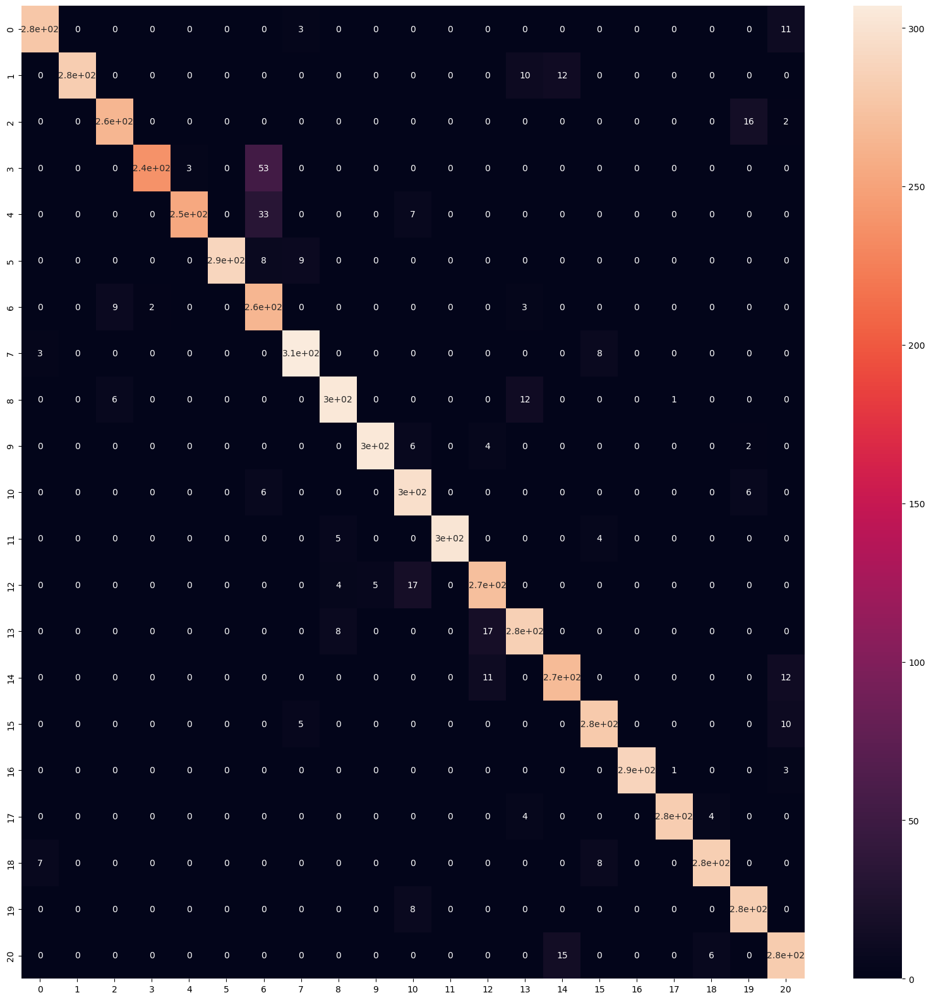

Test - Accuracy: 0.9382539682539682
Test - F1-Score: 0.9390794298869524
Validation - Accuracy: 0.9314285714285714
Validation - F1-Score: 0.9322724889100393


In [37]:
from catboost import CatBoostClassifier
params_cbc = [{'iterations':[500,700],'depth':[3,4],'learning_rate':[0.08,0.1,0.5]}]
cbc = CatBoostClassifier(random_seed=13)
gscv = GridSearchCV(cbc,params_cbc,scoring='f1_weighted',cv=10)
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

Best Parameters: {'learning_rate': 0.08, 'n_estimators': 80}
Best Estimators: AdaBoostClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.05,
                                                         max_depth=4),
                   learning_rate=0.08, n_estimators=80)
Best Score: 0.0075602874896709815


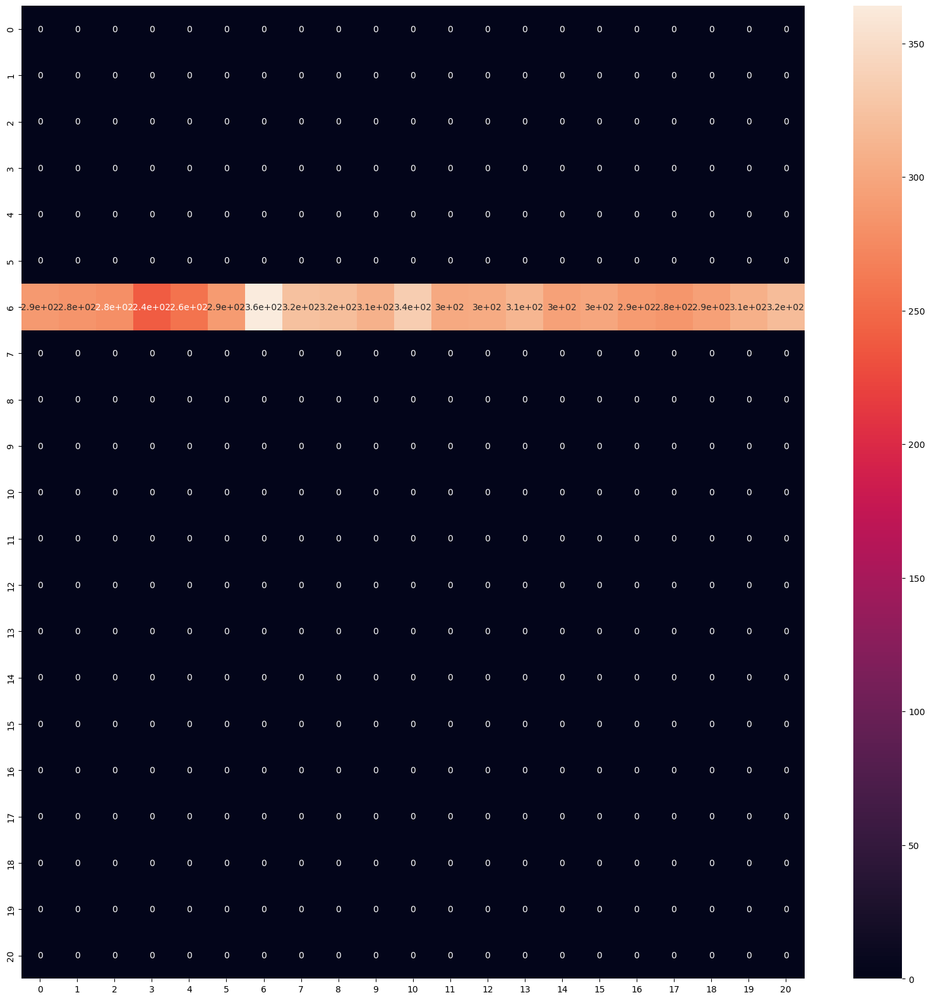

Test - Accuracy: 0.057777777777777775
Test - F1-Score: 0.1092436974789916
Validation - Accuracy: 0.060408163265306125
Validation - F1-Score: 0.11393379522709776


In [42]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
params_ada = [{'n_estimators':[80,100,150],'learning_rate':[0.08,0.1,0.5]}]
ada = AdaBoostClassifier(DecisionTreeClassifier())
gscv = GridSearchCV(ada,params_ada,scoring='f1_weighted',cv=10)
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

Best Parameters: {'learning_rate': 0.08, 'n_estimators': 300}
Best Estimators: GradientBoostingClassifier(learning_rate=0.08, n_estimators=300)
Best Score: 0.9264164835016038


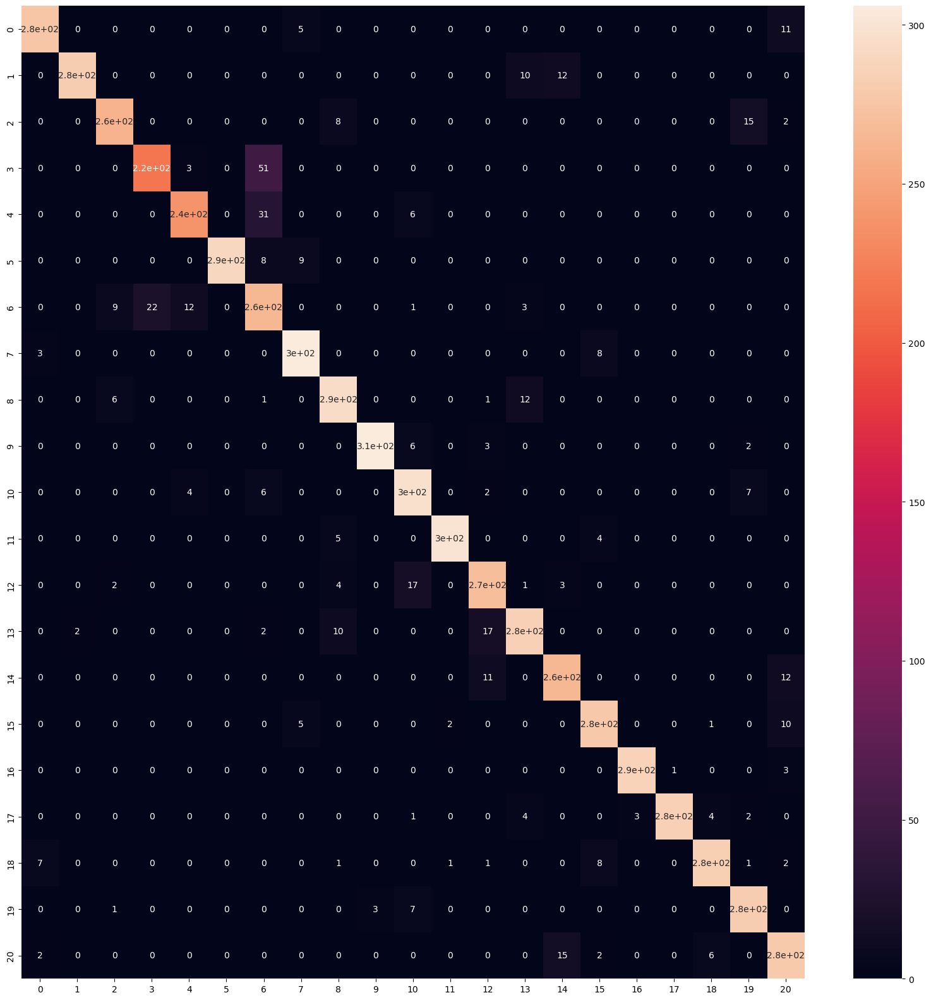

Test - Accuracy: 0.9266666666666666
Test - F1-Score: 0.9273202759540318
Validation - Accuracy: 0.9216326530612244
Validation - F1-Score: 0.9223278331535051


In [43]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV
param_gbc = [{'learning_rate':[0.08,0.1,0.5],'n_estimators':[300,400,500]}]
gbc = GradientBoostingClassifier()
gscv = GridSearchCV(gbc,param_gbc,cv=10,scoring='f1_weighted',n_jobs=-1)
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

UNPREPROCESSED DATA

In [44]:
Xtrain, Xtest, Ytrain, Ytest = train_test_split(unpre_data[unpre_data.columns[1:-1]],unpre_data[unpre_data.columns[-1]],test_size=0.3,random_state=14)
Xtrain, Xval, Ytrain, Yval = train_test_split(Xtrain, Ytrain, test_size=0.25,random_state=14)
print(Xtrain.shape)
print(Xtest.shape)
print(Xval.shape)
print(Ytrain.shape)
print(Ytest.shape)
print(Yval.shape)

(11025, 7)
(6300, 7)
(3675, 7)
(11025,)
(6300,)
(3675,)


Best Parameters: {'class_weight': 'balanced_subsample', 'n_estimators': 400}
Best Estimators: RandomForestClassifier(class_weight='balanced_subsample', n_estimators=400)
Best Score: 0.9355435649344951


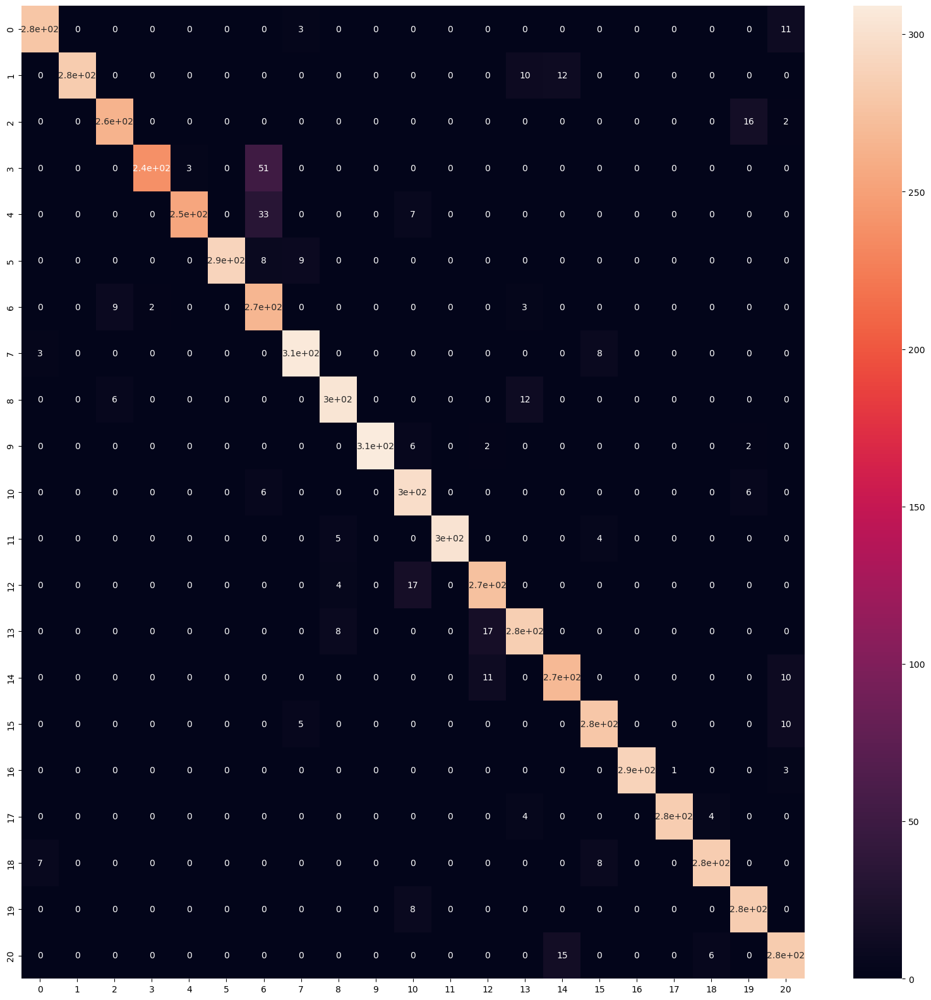

Test - Accuracy: 0.9401587301587302
Test - F1-Score: 0.9409770472652167
Validation - Accuracy: 0.9319727891156463
Validation - F1-Score: 0.9328095261588099


In [45]:
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV
param_rfc = [{'n_estimators':[250,300,350,400],'class_weight':['balanced','balanced_subsample']}]
rfc = RandomForestClassifier()
gscv = GridSearchCV(rfc,param_rfc,cv=10,scoring='f1_weighted')
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

0:	learn: 2.6987887	total: 14.1ms	remaining: 7.04s
1:	learn: 2.3806207	total: 27.9ms	remaining: 6.94s
2:	learn: 2.1845578	total: 39.1ms	remaining: 6.47s
3:	learn: 2.0288944	total: 50.9ms	remaining: 6.31s
4:	learn: 1.8223864	total: 63.2ms	remaining: 6.26s
5:	learn: 1.6625424	total: 75.1ms	remaining: 6.18s
6:	learn: 1.5271718	total: 87.6ms	remaining: 6.17s
7:	learn: 1.4194124	total: 99.9ms	remaining: 6.14s
8:	learn: 1.3230823	total: 112ms	remaining: 6.12s
9:	learn: 1.2539597	total: 123ms	remaining: 6.04s
10:	learn: 1.1788108	total: 136ms	remaining: 6.06s
11:	learn: 1.1273774	total: 148ms	remaining: 6.03s
12:	learn: 1.0669474	total: 161ms	remaining: 6.02s
13:	learn: 1.0256870	total: 172ms	remaining: 5.97s
14:	learn: 0.9924230	total: 184ms	remaining: 5.96s
15:	learn: 0.9440520	total: 196ms	remaining: 5.93s
16:	learn: 0.9163940	total: 208ms	remaining: 5.9s
17:	learn: 0.8771739	total: 220ms	remaining: 5.88s
18:	learn: 0.8384003	total: 233ms	remaining: 5.9s
19:	learn: 0.8135330	total: 248ms	r

165:	learn: 0.3046021	total: 2.17s	remaining: 4.37s
166:	learn: 0.3044393	total: 2.18s	remaining: 4.36s
167:	learn: 0.3040444	total: 2.2s	remaining: 4.34s
168:	learn: 0.3035941	total: 2.21s	remaining: 4.33s
169:	learn: 0.3034650	total: 2.22s	remaining: 4.31s
170:	learn: 0.3032520	total: 2.23s	remaining: 4.29s
171:	learn: 0.3029010	total: 2.24s	remaining: 4.27s
172:	learn: 0.3025475	total: 2.25s	remaining: 4.26s
173:	learn: 0.3021497	total: 2.26s	remaining: 4.24s
174:	learn: 0.3019340	total: 2.27s	remaining: 4.22s
175:	learn: 0.3013166	total: 2.29s	remaining: 4.21s
176:	learn: 0.3011661	total: 2.3s	remaining: 4.19s
177:	learn: 0.3009494	total: 2.31s	remaining: 4.18s
178:	learn: 0.3006095	total: 2.32s	remaining: 4.16s
179:	learn: 0.3004756	total: 2.33s	remaining: 4.15s
180:	learn: 0.3002944	total: 2.34s	remaining: 4.13s
181:	learn: 0.2999725	total: 2.35s	remaining: 4.12s
182:	learn: 0.2991495	total: 2.37s	remaining: 4.1s
183:	learn: 0.2988908	total: 2.38s	remaining: 4.08s
184:	learn: 0.2

329:	learn: 0.2697620	total: 4.29s	remaining: 2.21s
330:	learn: 0.2696846	total: 4.31s	remaining: 2.2s
331:	learn: 0.2696007	total: 4.32s	remaining: 2.19s
332:	learn: 0.2694251	total: 4.34s	remaining: 2.18s
333:	learn: 0.2693212	total: 4.35s	remaining: 2.16s
334:	learn: 0.2691000	total: 4.37s	remaining: 2.15s
335:	learn: 0.2690233	total: 4.38s	remaining: 2.14s
336:	learn: 0.2688585	total: 4.39s	remaining: 2.13s
337:	learn: 0.2686996	total: 4.41s	remaining: 2.11s
338:	learn: 0.2686536	total: 4.42s	remaining: 2.1s
339:	learn: 0.2684714	total: 4.44s	remaining: 2.09s
340:	learn: 0.2683935	total: 4.45s	remaining: 2.08s
341:	learn: 0.2682012	total: 4.46s	remaining: 2.06s
342:	learn: 0.2681431	total: 4.48s	remaining: 2.05s
343:	learn: 0.2679897	total: 4.49s	remaining: 2.04s
344:	learn: 0.2678986	total: 4.51s	remaining: 2.02s
345:	learn: 0.2677657	total: 4.52s	remaining: 2.01s
346:	learn: 0.2676535	total: 4.54s	remaining: 2s
347:	learn: 0.2675165	total: 4.55s	remaining: 1.99s
348:	learn: 0.267

493:	learn: 0.2502994	total: 6.63s	remaining: 80.5ms
494:	learn: 0.2501835	total: 6.65s	remaining: 67.1ms
495:	learn: 0.2501382	total: 6.66s	remaining: 53.7ms
496:	learn: 0.2500366	total: 6.68s	remaining: 40.3ms
497:	learn: 0.2499235	total: 6.69s	remaining: 26.9ms
498:	learn: 0.2498366	total: 6.71s	remaining: 13.4ms
499:	learn: 0.2496704	total: 6.72s	remaining: 0us
0:	learn: 2.6981479	total: 14.7ms	remaining: 7.32s
1:	learn: 2.3815489	total: 29.5ms	remaining: 7.34s
2:	learn: 2.1862833	total: 44.3ms	remaining: 7.34s
3:	learn: 2.0289283	total: 60.8ms	remaining: 7.54s
4:	learn: 1.8230948	total: 77.7ms	remaining: 7.69s
5:	learn: 1.6626436	total: 92.1ms	remaining: 7.58s
6:	learn: 1.5416151	total: 107ms	remaining: 7.5s
7:	learn: 1.4365967	total: 120ms	remaining: 7.41s
8:	learn: 1.3541372	total: 135ms	remaining: 7.34s
9:	learn: 1.2962045	total: 148ms	remaining: 7.25s
10:	learn: 1.2139465	total: 162ms	remaining: 7.2s
11:	learn: 1.1574760	total: 176ms	remaining: 7.14s
12:	learn: 1.1012709	total

164:	learn: 0.3058886	total: 2.63s	remaining: 5.33s
165:	learn: 0.3055493	total: 2.64s	remaining: 5.31s
166:	learn: 0.3051946	total: 2.65s	remaining: 5.29s
167:	learn: 0.3048990	total: 2.67s	remaining: 5.28s
168:	learn: 0.3046271	total: 2.69s	remaining: 5.26s
169:	learn: 0.3044920	total: 2.7s	remaining: 5.24s
170:	learn: 0.3044004	total: 2.71s	remaining: 5.22s
171:	learn: 0.3039909	total: 2.73s	remaining: 5.2s
172:	learn: 0.3035677	total: 2.74s	remaining: 5.18s
173:	learn: 0.3033183	total: 2.76s	remaining: 5.17s
174:	learn: 0.3031513	total: 2.77s	remaining: 5.14s
175:	learn: 0.3029479	total: 2.78s	remaining: 5.13s
176:	learn: 0.3024775	total: 2.8s	remaining: 5.11s
177:	learn: 0.3022706	total: 2.81s	remaining: 5.08s
178:	learn: 0.3018218	total: 2.83s	remaining: 5.07s
179:	learn: 0.3016242	total: 2.84s	remaining: 5.05s
180:	learn: 0.3013163	total: 2.85s	remaining: 5.03s
181:	learn: 0.3009487	total: 2.87s	remaining: 5.01s
182:	learn: 0.3007749	total: 2.88s	remaining: 4.99s
183:	learn: 0.3

329:	learn: 0.2708373	total: 4.97s	remaining: 2.56s
330:	learn: 0.2707681	total: 4.99s	remaining: 2.55s
331:	learn: 0.2704518	total: 5s	remaining: 2.53s
332:	learn: 0.2701091	total: 5.02s	remaining: 2.52s
333:	learn: 0.2698838	total: 5.03s	remaining: 2.5s
334:	learn: 0.2696272	total: 5.05s	remaining: 2.49s
335:	learn: 0.2694995	total: 5.06s	remaining: 2.47s
336:	learn: 0.2692963	total: 5.08s	remaining: 2.46s
337:	learn: 0.2691742	total: 5.09s	remaining: 2.44s
338:	learn: 0.2690500	total: 5.11s	remaining: 2.42s
339:	learn: 0.2688872	total: 5.12s	remaining: 2.41s
340:	learn: 0.2688142	total: 5.13s	remaining: 2.39s
341:	learn: 0.2686351	total: 5.15s	remaining: 2.38s
342:	learn: 0.2684838	total: 5.16s	remaining: 2.36s
343:	learn: 0.2683085	total: 5.18s	remaining: 2.35s
344:	learn: 0.2682625	total: 5.19s	remaining: 2.33s
345:	learn: 0.2680240	total: 5.21s	remaining: 2.32s
346:	learn: 0.2678189	total: 5.22s	remaining: 2.3s
347:	learn: 0.2677042	total: 5.24s	remaining: 2.29s
348:	learn: 0.267

497:	learn: 0.2505239	total: 7.37s	remaining: 29.6ms
498:	learn: 0.2504446	total: 7.39s	remaining: 14.8ms
499:	learn: 0.2503594	total: 7.4s	remaining: 0us
0:	learn: 2.6990490	total: 14.7ms	remaining: 7.35s
1:	learn: 2.3819751	total: 29.8ms	remaining: 7.41s
2:	learn: 2.1855197	total: 42.9ms	remaining: 7.11s
3:	learn: 2.0293439	total: 56.4ms	remaining: 7s
4:	learn: 1.8229338	total: 71.1ms	remaining: 7.04s
5:	learn: 1.6630691	total: 85.6ms	remaining: 7.05s
6:	learn: 1.5277666	total: 102ms	remaining: 7.18s
7:	learn: 1.4196912	total: 121ms	remaining: 7.42s
8:	learn: 1.3413330	total: 136ms	remaining: 7.44s
9:	learn: 1.2580159	total: 151ms	remaining: 7.41s
10:	learn: 1.1822051	total: 166ms	remaining: 7.36s
11:	learn: 1.1223677	total: 180ms	remaining: 7.32s
12:	learn: 1.0916206	total: 193ms	remaining: 7.23s
13:	learn: 1.0345549	total: 208ms	remaining: 7.22s
14:	learn: 1.0133232	total: 222ms	remaining: 7.17s
15:	learn: 0.9586864	total: 239ms	remaining: 7.22s
16:	learn: 0.9101774	total: 254ms	re

168:	learn: 0.3065904	total: 2.44s	remaining: 4.77s
169:	learn: 0.3064162	total: 2.45s	remaining: 4.76s
170:	learn: 0.3063172	total: 2.46s	remaining: 4.74s
171:	learn: 0.3058528	total: 2.48s	remaining: 4.73s
172:	learn: 0.3055843	total: 2.49s	remaining: 4.71s
173:	learn: 0.3051227	total: 2.51s	remaining: 4.7s
174:	learn: 0.3048255	total: 2.52s	remaining: 4.68s
175:	learn: 0.3044156	total: 2.54s	remaining: 4.67s
176:	learn: 0.3039262	total: 2.55s	remaining: 4.65s
177:	learn: 0.3037525	total: 2.56s	remaining: 4.64s
178:	learn: 0.3032949	total: 2.58s	remaining: 4.63s
179:	learn: 0.3030909	total: 2.59s	remaining: 4.61s
180:	learn: 0.3027679	total: 2.61s	remaining: 4.59s
181:	learn: 0.3025703	total: 2.62s	remaining: 4.58s
182:	learn: 0.3024576	total: 2.63s	remaining: 4.56s
183:	learn: 0.3019762	total: 2.65s	remaining: 4.54s
184:	learn: 0.3016158	total: 2.66s	remaining: 4.53s
185:	learn: 0.3014779	total: 2.68s	remaining: 4.52s
186:	learn: 0.3011674	total: 2.69s	remaining: 4.5s
187:	learn: 0.

333:	learn: 0.2736610	total: 4.79s	remaining: 2.38s
334:	learn: 0.2735627	total: 4.8s	remaining: 2.37s
335:	learn: 0.2734542	total: 4.82s	remaining: 2.35s
336:	learn: 0.2733580	total: 4.83s	remaining: 2.34s
337:	learn: 0.2731962	total: 4.85s	remaining: 2.32s
338:	learn: 0.2729729	total: 4.86s	remaining: 2.31s
339:	learn: 0.2728972	total: 4.88s	remaining: 2.29s
340:	learn: 0.2727206	total: 4.89s	remaining: 2.28s
341:	learn: 0.2724758	total: 4.91s	remaining: 2.27s
342:	learn: 0.2724079	total: 4.92s	remaining: 2.25s
343:	learn: 0.2721955	total: 4.93s	remaining: 2.24s
344:	learn: 0.2720579	total: 4.95s	remaining: 2.22s
345:	learn: 0.2718016	total: 4.96s	remaining: 2.21s
346:	learn: 0.2716715	total: 4.97s	remaining: 2.19s
347:	learn: 0.2715311	total: 4.99s	remaining: 2.18s
348:	learn: 0.2713833	total: 5s	remaining: 2.16s
349:	learn: 0.2713094	total: 5.02s	remaining: 2.15s
350:	learn: 0.2712342	total: 5.03s	remaining: 2.13s
351:	learn: 0.2711034	total: 5.04s	remaining: 2.12s
352:	learn: 0.27

496:	learn: 0.2538245	total: 7.12s	remaining: 43ms
497:	learn: 0.2537645	total: 7.13s	remaining: 28.6ms
498:	learn: 0.2536719	total: 7.15s	remaining: 14.3ms
499:	learn: 0.2535557	total: 7.16s	remaining: 0us
0:	learn: 2.6986167	total: 16.9ms	remaining: 8.44s
1:	learn: 2.3802792	total: 31.2ms	remaining: 7.78s
2:	learn: 2.1482279	total: 46.4ms	remaining: 7.68s
3:	learn: 1.9951226	total: 60.8ms	remaining: 7.54s
4:	learn: 1.8843042	total: 74.8ms	remaining: 7.4s
5:	learn: 1.7195871	total: 90ms	remaining: 7.41s
6:	learn: 1.5842386	total: 106ms	remaining: 7.47s
7:	learn: 1.4673068	total: 123ms	remaining: 7.57s
8:	learn: 1.3852807	total: 140ms	remaining: 7.63s
9:	learn: 1.2921116	total: 154ms	remaining: 7.57s
10:	learn: 1.2132400	total: 169ms	remaining: 7.52s
11:	learn: 1.1588627	total: 184ms	remaining: 7.48s
12:	learn: 1.1022279	total: 199ms	remaining: 7.47s
13:	learn: 1.0383152	total: 216ms	remaining: 7.48s
14:	learn: 1.0149020	total: 228ms	remaining: 7.38s
15:	learn: 0.9779041	total: 244ms	r

168:	learn: 0.3025333	total: 2.45s	remaining: 4.8s
169:	learn: 0.3023200	total: 2.46s	remaining: 4.78s
170:	learn: 0.3020770	total: 2.48s	remaining: 4.76s
171:	learn: 0.3016837	total: 2.49s	remaining: 4.75s
172:	learn: 0.3014650	total: 2.5s	remaining: 4.73s
173:	learn: 0.3008054	total: 2.52s	remaining: 4.72s
174:	learn: 0.3005381	total: 2.53s	remaining: 4.7s
175:	learn: 0.3001335	total: 2.54s	remaining: 4.68s
176:	learn: 0.2999397	total: 2.56s	remaining: 4.67s
177:	learn: 0.2997694	total: 2.57s	remaining: 4.65s
178:	learn: 0.2995819	total: 2.58s	remaining: 4.63s
179:	learn: 0.2992933	total: 2.6s	remaining: 4.62s
180:	learn: 0.2989811	total: 2.61s	remaining: 4.6s
181:	learn: 0.2986843	total: 2.62s	remaining: 4.58s
182:	learn: 0.2984603	total: 2.64s	remaining: 4.57s
183:	learn: 0.2982705	total: 2.65s	remaining: 4.55s
184:	learn: 0.2980402	total: 2.67s	remaining: 4.54s
185:	learn: 0.2976833	total: 2.68s	remaining: 4.53s
186:	learn: 0.2975104	total: 2.7s	remaining: 4.51s
187:	learn: 0.2971

332:	learn: 0.2701990	total: 5.01s	remaining: 2.51s
333:	learn: 0.2701236	total: 5.03s	remaining: 2.5s
334:	learn: 0.2698786	total: 5.06s	remaining: 2.49s
335:	learn: 0.2697531	total: 5.08s	remaining: 2.48s
336:	learn: 0.2696738	total: 5.1s	remaining: 2.46s
337:	learn: 0.2694906	total: 5.12s	remaining: 2.45s
338:	learn: 0.2693764	total: 5.14s	remaining: 2.44s
339:	learn: 0.2691209	total: 5.16s	remaining: 2.43s
340:	learn: 0.2689768	total: 5.18s	remaining: 2.42s
341:	learn: 0.2688453	total: 5.2s	remaining: 2.4s
342:	learn: 0.2687465	total: 5.22s	remaining: 2.39s
343:	learn: 0.2687191	total: 5.24s	remaining: 2.38s
344:	learn: 0.2686938	total: 5.27s	remaining: 2.37s
345:	learn: 0.2684665	total: 5.29s	remaining: 2.35s
346:	learn: 0.2683974	total: 5.31s	remaining: 2.34s
347:	learn: 0.2683128	total: 5.33s	remaining: 2.33s
348:	learn: 0.2681083	total: 5.35s	remaining: 2.31s
349:	learn: 0.2680175	total: 5.37s	remaining: 2.3s
350:	learn: 0.2679417	total: 5.39s	remaining: 2.29s
351:	learn: 0.267

494:	learn: 0.2515518	total: 7.56s	remaining: 76.4ms
495:	learn: 0.2515180	total: 7.58s	remaining: 61.1ms
496:	learn: 0.2513062	total: 7.6s	remaining: 45.9ms
497:	learn: 0.2512621	total: 7.62s	remaining: 30.6ms
498:	learn: 0.2511325	total: 7.63s	remaining: 15.3ms
499:	learn: 0.2509471	total: 7.65s	remaining: 0us
0:	learn: 2.6991962	total: 14.6ms	remaining: 7.27s
1:	learn: 2.3806018	total: 30.4ms	remaining: 7.56s
2:	learn: 2.1845402	total: 45.4ms	remaining: 7.53s
3:	learn: 2.0287834	total: 61.3ms	remaining: 7.6s
4:	learn: 1.8224240	total: 76.6ms	remaining: 7.58s
5:	learn: 1.6692616	total: 90.6ms	remaining: 7.46s
6:	learn: 1.5380707	total: 105ms	remaining: 7.42s
7:	learn: 1.4276390	total: 120ms	remaining: 7.38s
8:	learn: 1.3452083	total: 134ms	remaining: 7.31s
9:	learn: 1.2653973	total: 148ms	remaining: 7.25s
10:	learn: 1.2036954	total: 164ms	remaining: 7.28s
11:	learn: 1.1458726	total: 178ms	remaining: 7.23s
12:	learn: 1.0866142	total: 194ms	remaining: 7.25s
13:	learn: 1.0405714	total: 

155:	learn: 0.3094470	total: 2.43s	remaining: 5.36s
156:	learn: 0.3092665	total: 2.44s	remaining: 5.34s
157:	learn: 0.3090270	total: 2.46s	remaining: 5.33s
158:	learn: 0.3077400	total: 2.48s	remaining: 5.31s
159:	learn: 0.3075827	total: 2.49s	remaining: 5.3s
160:	learn: 0.3073043	total: 2.51s	remaining: 5.29s
161:	learn: 0.3070451	total: 2.53s	remaining: 5.28s
162:	learn: 0.3068878	total: 2.55s	remaining: 5.26s
163:	learn: 0.3063962	total: 2.56s	remaining: 5.25s
164:	learn: 0.3061112	total: 2.58s	remaining: 5.24s
165:	learn: 0.3057758	total: 2.6s	remaining: 5.23s
166:	learn: 0.3053929	total: 2.62s	remaining: 5.22s
167:	learn: 0.3050535	total: 2.64s	remaining: 5.21s
168:	learn: 0.3047605	total: 2.66s	remaining: 5.2s
169:	learn: 0.3046913	total: 2.68s	remaining: 5.2s
170:	learn: 0.3044621	total: 2.7s	remaining: 5.19s
171:	learn: 0.3037599	total: 2.71s	remaining: 5.17s
172:	learn: 0.3035854	total: 2.73s	remaining: 5.16s
173:	learn: 0.3029904	total: 2.74s	remaining: 5.14s
174:	learn: 0.302

315:	learn: 0.2734464	total: 4.84s	remaining: 2.82s
316:	learn: 0.2730840	total: 4.86s	remaining: 2.8s
317:	learn: 0.2728739	total: 4.87s	remaining: 2.79s
318:	learn: 0.2727028	total: 4.89s	remaining: 2.77s
319:	learn: 0.2724342	total: 4.9s	remaining: 2.76s
320:	learn: 0.2722368	total: 4.92s	remaining: 2.74s
321:	learn: 0.2719951	total: 4.93s	remaining: 2.72s
322:	learn: 0.2717359	total: 4.94s	remaining: 2.71s
323:	learn: 0.2715005	total: 4.96s	remaining: 2.69s
324:	learn: 0.2714133	total: 4.97s	remaining: 2.68s
325:	learn: 0.2713184	total: 4.99s	remaining: 2.66s
326:	learn: 0.2711676	total: 5s	remaining: 2.64s
327:	learn: 0.2710138	total: 5.01s	remaining: 2.63s
328:	learn: 0.2708144	total: 5.03s	remaining: 2.61s
329:	learn: 0.2707336	total: 5.04s	remaining: 2.6s
330:	learn: 0.2706508	total: 5.06s	remaining: 2.58s
331:	learn: 0.2703203	total: 5.07s	remaining: 2.57s
332:	learn: 0.2701163	total: 5.09s	remaining: 2.55s
333:	learn: 0.2700421	total: 5.1s	remaining: 2.54s
334:	learn: 0.26993

478:	learn: 0.2526239	total: 7.45s	remaining: 327ms
479:	learn: 0.2525559	total: 7.47s	remaining: 311ms
480:	learn: 0.2524987	total: 7.49s	remaining: 296ms
481:	learn: 0.2523918	total: 7.51s	remaining: 280ms
482:	learn: 0.2522210	total: 7.53s	remaining: 265ms
483:	learn: 0.2521023	total: 7.55s	remaining: 250ms
484:	learn: 0.2519749	total: 7.57s	remaining: 234ms
485:	learn: 0.2518869	total: 7.58s	remaining: 218ms
486:	learn: 0.2517526	total: 7.6s	remaining: 203ms
487:	learn: 0.2516236	total: 7.62s	remaining: 187ms
488:	learn: 0.2515085	total: 7.63s	remaining: 172ms
489:	learn: 0.2514458	total: 7.65s	remaining: 156ms
490:	learn: 0.2512701	total: 7.67s	remaining: 141ms
491:	learn: 0.2512133	total: 7.69s	remaining: 125ms
492:	learn: 0.2511548	total: 7.71s	remaining: 109ms
493:	learn: 0.2510946	total: 7.73s	remaining: 93.9ms
494:	learn: 0.2510253	total: 7.75s	remaining: 78.3ms
495:	learn: 0.2509283	total: 7.77s	remaining: 62.7ms
496:	learn: 0.2507264	total: 7.79s	remaining: 47ms
497:	learn:

140:	learn: 0.3111609	total: 2.36s	remaining: 6.01s
141:	learn: 0.3108166	total: 2.38s	remaining: 5.99s
142:	learn: 0.3105937	total: 2.39s	remaining: 5.97s
143:	learn: 0.3102431	total: 2.41s	remaining: 5.95s
144:	learn: 0.3096115	total: 2.42s	remaining: 5.93s
145:	learn: 0.3094296	total: 2.44s	remaining: 5.92s
146:	learn: 0.3091013	total: 2.46s	remaining: 5.9s
147:	learn: 0.3085769	total: 2.47s	remaining: 5.88s
148:	learn: 0.3082079	total: 2.49s	remaining: 5.87s
149:	learn: 0.3079555	total: 2.51s	remaining: 5.85s
150:	learn: 0.3076311	total: 2.52s	remaining: 5.83s
151:	learn: 0.3074369	total: 2.54s	remaining: 5.82s
152:	learn: 0.3070711	total: 2.56s	remaining: 5.8s
153:	learn: 0.3069373	total: 2.57s	remaining: 5.78s
154:	learn: 0.3065513	total: 2.59s	remaining: 5.76s
155:	learn: 0.3063775	total: 2.6s	remaining: 5.74s
156:	learn: 0.3061323	total: 2.62s	remaining: 5.72s
157:	learn: 0.3060528	total: 2.63s	remaining: 5.7s
158:	learn: 0.3056879	total: 2.65s	remaining: 5.67s
159:	learn: 0.30

311:	learn: 0.2728890	total: 4.93s	remaining: 2.97s
312:	learn: 0.2726553	total: 4.94s	remaining: 2.95s
313:	learn: 0.2724922	total: 4.96s	remaining: 2.94s
314:	learn: 0.2724108	total: 4.97s	remaining: 2.92s
315:	learn: 0.2722553	total: 4.98s	remaining: 2.9s
316:	learn: 0.2721208	total: 5s	remaining: 2.88s
317:	learn: 0.2720256	total: 5.01s	remaining: 2.87s
318:	learn: 0.2719005	total: 5.03s	remaining: 2.85s
319:	learn: 0.2717227	total: 5.04s	remaining: 2.83s
320:	learn: 0.2716036	total: 5.05s	remaining: 2.82s
321:	learn: 0.2714675	total: 5.07s	remaining: 2.8s
322:	learn: 0.2713867	total: 5.08s	remaining: 2.79s
323:	learn: 0.2713308	total: 5.09s	remaining: 2.77s
324:	learn: 0.2712449	total: 5.11s	remaining: 2.75s
325:	learn: 0.2711802	total: 5.12s	remaining: 2.73s
326:	learn: 0.2710576	total: 5.14s	remaining: 2.72s
327:	learn: 0.2709472	total: 5.15s	remaining: 2.7s
328:	learn: 0.2707609	total: 5.17s	remaining: 2.69s
329:	learn: 0.2707119	total: 5.18s	remaining: 2.67s
330:	learn: 0.2705

470:	learn: 0.2532857	total: 7.3s	remaining: 450ms
471:	learn: 0.2532135	total: 7.32s	remaining: 434ms
472:	learn: 0.2530792	total: 7.33s	remaining: 419ms
473:	learn: 0.2530529	total: 7.35s	remaining: 403ms
474:	learn: 0.2529835	total: 7.37s	remaining: 388ms
475:	learn: 0.2529271	total: 7.38s	remaining: 372ms
476:	learn: 0.2528731	total: 7.39s	remaining: 357ms
477:	learn: 0.2527797	total: 7.41s	remaining: 341ms
478:	learn: 0.2526693	total: 7.42s	remaining: 325ms
479:	learn: 0.2525382	total: 7.43s	remaining: 310ms
480:	learn: 0.2524751	total: 7.45s	remaining: 294ms
481:	learn: 0.2524003	total: 7.46s	remaining: 279ms
482:	learn: 0.2523290	total: 7.51s	remaining: 264ms
483:	learn: 0.2521305	total: 7.53s	remaining: 249ms
484:	learn: 0.2520383	total: 7.54s	remaining: 233ms
485:	learn: 0.2519035	total: 7.56s	remaining: 218ms
486:	learn: 0.2518526	total: 7.57s	remaining: 202ms
487:	learn: 0.2516847	total: 7.59s	remaining: 187ms
488:	learn: 0.2516385	total: 7.61s	remaining: 171ms
489:	learn: 0

144:	learn: 0.3069863	total: 2.26s	remaining: 5.53s
145:	learn: 0.3068065	total: 2.27s	remaining: 5.51s
146:	learn: 0.3063513	total: 2.29s	remaining: 5.49s
147:	learn: 0.3057869	total: 2.3s	remaining: 5.48s
148:	learn: 0.3054862	total: 2.32s	remaining: 5.46s
149:	learn: 0.3052492	total: 2.33s	remaining: 5.44s
150:	learn: 0.3048425	total: 2.34s	remaining: 5.42s
151:	learn: 0.3043478	total: 2.36s	remaining: 5.4s
152:	learn: 0.3041184	total: 2.37s	remaining: 5.38s
153:	learn: 0.3036347	total: 2.38s	remaining: 5.36s
154:	learn: 0.3032042	total: 2.4s	remaining: 5.35s
155:	learn: 0.3027918	total: 2.42s	remaining: 5.35s
156:	learn: 0.3023170	total: 2.45s	remaining: 5.34s
157:	learn: 0.3018338	total: 2.46s	remaining: 5.33s
158:	learn: 0.3014518	total: 2.48s	remaining: 5.32s
159:	learn: 0.3009889	total: 2.5s	remaining: 5.3s
160:	learn: 0.3004318	total: 2.51s	remaining: 5.29s
161:	learn: 0.3001081	total: 2.53s	remaining: 5.28s
162:	learn: 0.2999697	total: 2.55s	remaining: 5.26s
163:	learn: 0.299

309:	learn: 0.2690755	total: 5.28s	remaining: 3.24s
310:	learn: 0.2688564	total: 5.3s	remaining: 3.22s
311:	learn: 0.2687624	total: 5.32s	remaining: 3.2s
312:	learn: 0.2685852	total: 5.33s	remaining: 3.19s
313:	learn: 0.2685132	total: 5.35s	remaining: 3.17s
314:	learn: 0.2684164	total: 5.36s	remaining: 3.15s
315:	learn: 0.2682704	total: 5.38s	remaining: 3.13s
316:	learn: 0.2682054	total: 5.39s	remaining: 3.11s
317:	learn: 0.2680714	total: 5.41s	remaining: 3.1s
318:	learn: 0.2680160	total: 5.44s	remaining: 3.08s
319:	learn: 0.2678850	total: 5.45s	remaining: 3.07s
320:	learn: 0.2677956	total: 5.47s	remaining: 3.05s
321:	learn: 0.2676712	total: 5.48s	remaining: 3.03s
322:	learn: 0.2673660	total: 5.5s	remaining: 3.01s
323:	learn: 0.2671229	total: 5.51s	remaining: 2.99s
324:	learn: 0.2669847	total: 5.53s	remaining: 2.98s
325:	learn: 0.2669049	total: 5.54s	remaining: 2.96s
326:	learn: 0.2667954	total: 5.55s	remaining: 2.94s
327:	learn: 0.2667206	total: 5.57s	remaining: 2.92s
328:	learn: 0.26

469:	learn: 0.2507251	total: 10.6s	remaining: 674ms
470:	learn: 0.2507051	total: 10.6s	remaining: 652ms
471:	learn: 0.2506552	total: 10.6s	remaining: 629ms
472:	learn: 0.2506133	total: 10.6s	remaining: 607ms
473:	learn: 0.2505804	total: 10.7s	remaining: 584ms
474:	learn: 0.2504806	total: 10.7s	remaining: 562ms
475:	learn: 0.2503404	total: 10.7s	remaining: 539ms
476:	learn: 0.2502797	total: 10.7s	remaining: 517ms
477:	learn: 0.2502319	total: 10.7s	remaining: 495ms
478:	learn: 0.2500711	total: 10.8s	remaining: 472ms
479:	learn: 0.2500133	total: 10.8s	remaining: 450ms
480:	learn: 0.2499218	total: 10.8s	remaining: 428ms
481:	learn: 0.2498350	total: 10.8s	remaining: 405ms
482:	learn: 0.2497396	total: 10.9s	remaining: 383ms
483:	learn: 0.2496632	total: 10.9s	remaining: 360ms
484:	learn: 0.2495948	total: 10.9s	remaining: 338ms
485:	learn: 0.2494928	total: 11s	remaining: 316ms
486:	learn: 0.2494375	total: 11s	remaining: 293ms
487:	learn: 0.2492748	total: 11s	remaining: 271ms
488:	learn: 0.2491

137:	learn: 0.3129127	total: 2.65s	remaining: 6.94s
138:	learn: 0.3124750	total: 2.66s	remaining: 6.91s
139:	learn: 0.3121824	total: 2.67s	remaining: 6.88s
140:	learn: 0.3120162	total: 2.69s	remaining: 6.84s
141:	learn: 0.3113641	total: 2.7s	remaining: 6.81s
142:	learn: 0.3111325	total: 2.72s	remaining: 6.78s
143:	learn: 0.3108592	total: 2.73s	remaining: 6.75s
144:	learn: 0.3107436	total: 2.75s	remaining: 6.72s
145:	learn: 0.3105727	total: 2.76s	remaining: 6.69s
146:	learn: 0.3094391	total: 2.77s	remaining: 6.66s
147:	learn: 0.3089282	total: 2.79s	remaining: 6.63s
148:	learn: 0.3085609	total: 2.8s	remaining: 6.61s
149:	learn: 0.3082385	total: 2.82s	remaining: 6.58s
150:	learn: 0.3079383	total: 2.83s	remaining: 6.55s
151:	learn: 0.3077406	total: 2.85s	remaining: 6.53s
152:	learn: 0.3074869	total: 2.87s	remaining: 6.5s
153:	learn: 0.3070228	total: 2.88s	remaining: 6.47s
154:	learn: 0.3065491	total: 2.89s	remaining: 6.44s
155:	learn: 0.3062102	total: 2.91s	remaining: 6.42s
156:	learn: 0.3

303:	learn: 0.2733993	total: 5.42s	remaining: 3.49s
304:	learn: 0.2733502	total: 5.43s	remaining: 3.47s
305:	learn: 0.2732384	total: 5.45s	remaining: 3.46s
306:	learn: 0.2727818	total: 5.47s	remaining: 3.44s
307:	learn: 0.2725799	total: 5.49s	remaining: 3.42s
308:	learn: 0.2724050	total: 5.51s	remaining: 3.4s
309:	learn: 0.2722748	total: 5.52s	remaining: 3.38s
310:	learn: 0.2722023	total: 5.54s	remaining: 3.37s
311:	learn: 0.2720886	total: 5.56s	remaining: 3.35s
312:	learn: 0.2718270	total: 5.57s	remaining: 3.33s
313:	learn: 0.2716136	total: 5.59s	remaining: 3.31s
314:	learn: 0.2715117	total: 5.61s	remaining: 3.29s
315:	learn: 0.2712951	total: 5.63s	remaining: 3.28s
316:	learn: 0.2711786	total: 5.65s	remaining: 3.26s
317:	learn: 0.2709053	total: 5.67s	remaining: 3.24s
318:	learn: 0.2708085	total: 5.68s	remaining: 3.23s
319:	learn: 0.2705095	total: 5.7s	remaining: 3.21s
320:	learn: 0.2704661	total: 5.72s	remaining: 3.19s
321:	learn: 0.2703879	total: 5.73s	remaining: 3.17s
322:	learn: 0.

464:	learn: 0.2515382	total: 8.43s	remaining: 634ms
465:	learn: 0.2514406	total: 8.44s	remaining: 616ms
466:	learn: 0.2512928	total: 8.46s	remaining: 598ms
467:	learn: 0.2511082	total: 8.47s	remaining: 580ms
468:	learn: 0.2510259	total: 8.49s	remaining: 561ms
469:	learn: 0.2509742	total: 8.5s	remaining: 543ms
470:	learn: 0.2509594	total: 8.52s	remaining: 525ms
471:	learn: 0.2509034	total: 8.54s	remaining: 506ms
472:	learn: 0.2508540	total: 8.55s	remaining: 488ms
473:	learn: 0.2508108	total: 8.57s	remaining: 470ms
474:	learn: 0.2507508	total: 8.59s	remaining: 452ms
475:	learn: 0.2505280	total: 8.61s	remaining: 434ms
476:	learn: 0.2504774	total: 8.63s	remaining: 416ms
477:	learn: 0.2504314	total: 8.66s	remaining: 399ms
478:	learn: 0.2503233	total: 8.68s	remaining: 380ms
479:	learn: 0.2502320	total: 8.7s	remaining: 362ms
480:	learn: 0.2501445	total: 8.71s	remaining: 344ms
481:	learn: 0.2500685	total: 8.73s	remaining: 326ms
482:	learn: 0.2499333	total: 8.75s	remaining: 308ms
483:	learn: 0.

129:	learn: 0.3132174	total: 2.4s	remaining: 6.84s
130:	learn: 0.3128574	total: 2.42s	remaining: 6.82s
131:	learn: 0.3124584	total: 2.44s	remaining: 6.81s
132:	learn: 0.3120114	total: 2.46s	remaining: 6.8s
133:	learn: 0.3115902	total: 2.49s	remaining: 6.79s
134:	learn: 0.3105732	total: 2.51s	remaining: 6.78s
135:	learn: 0.3103648	total: 2.53s	remaining: 6.77s
136:	learn: 0.3099303	total: 2.55s	remaining: 6.76s
137:	learn: 0.3094351	total: 2.58s	remaining: 6.76s
138:	learn: 0.3090735	total: 2.6s	remaining: 6.76s
139:	learn: 0.3089912	total: 2.63s	remaining: 6.76s
140:	learn: 0.3080667	total: 2.66s	remaining: 6.76s
141:	learn: 0.3077144	total: 2.68s	remaining: 6.76s
142:	learn: 0.3071525	total: 2.7s	remaining: 6.75s
143:	learn: 0.3070291	total: 2.72s	remaining: 6.73s
144:	learn: 0.3068814	total: 2.74s	remaining: 6.72s
145:	learn: 0.3066921	total: 2.77s	remaining: 6.71s
146:	learn: 0.3063332	total: 2.79s	remaining: 6.71s
147:	learn: 0.3057118	total: 2.81s	remaining: 6.69s
148:	learn: 0.30

298:	learn: 0.2716607	total: 5.62s	remaining: 3.77s
299:	learn: 0.2715394	total: 5.63s	remaining: 3.75s
300:	learn: 0.2714083	total: 5.64s	remaining: 3.73s
301:	learn: 0.2712573	total: 5.66s	remaining: 3.71s
302:	learn: 0.2710800	total: 5.67s	remaining: 3.69s
303:	learn: 0.2705973	total: 5.69s	remaining: 3.67s
304:	learn: 0.2705335	total: 5.7s	remaining: 3.64s
305:	learn: 0.2704688	total: 5.71s	remaining: 3.62s
306:	learn: 0.2703635	total: 5.73s	remaining: 3.6s
307:	learn: 0.2701247	total: 5.74s	remaining: 3.58s
308:	learn: 0.2700010	total: 5.76s	remaining: 3.56s
309:	learn: 0.2698732	total: 5.77s	remaining: 3.54s
310:	learn: 0.2697328	total: 5.79s	remaining: 3.52s
311:	learn: 0.2696330	total: 5.8s	remaining: 3.49s
312:	learn: 0.2695547	total: 5.81s	remaining: 3.47s
313:	learn: 0.2693106	total: 5.83s	remaining: 3.45s
314:	learn: 0.2691180	total: 5.84s	remaining: 3.43s
315:	learn: 0.2688534	total: 5.85s	remaining: 3.41s
316:	learn: 0.2686976	total: 5.87s	remaining: 3.39s
317:	learn: 0.2

457:	learn: 0.2509735	total: 7.93s	remaining: 727ms
458:	learn: 0.2508438	total: 7.95s	remaining: 710ms
459:	learn: 0.2506751	total: 7.97s	remaining: 693ms
460:	learn: 0.2504974	total: 7.99s	remaining: 676ms
461:	learn: 0.2503326	total: 8.01s	remaining: 659ms
462:	learn: 0.2502725	total: 8.03s	remaining: 642ms
463:	learn: 0.2501966	total: 8.05s	remaining: 625ms
464:	learn: 0.2501581	total: 8.07s	remaining: 607ms
465:	learn: 0.2500440	total: 8.09s	remaining: 590ms
466:	learn: 0.2500038	total: 8.11s	remaining: 573ms
467:	learn: 0.2499033	total: 8.13s	remaining: 556ms
468:	learn: 0.2496963	total: 8.15s	remaining: 539ms
469:	learn: 0.2496489	total: 8.17s	remaining: 521ms
470:	learn: 0.2495918	total: 8.18s	remaining: 504ms
471:	learn: 0.2494425	total: 8.2s	remaining: 487ms
472:	learn: 0.2493338	total: 8.22s	remaining: 469ms
473:	learn: 0.2493006	total: 8.23s	remaining: 452ms
474:	learn: 0.2491979	total: 8.25s	remaining: 434ms
475:	learn: 0.2491162	total: 8.27s	remaining: 417ms
476:	learn: 0

131:	learn: 0.3124218	total: 1.93s	remaining: 5.37s
132:	learn: 0.3120872	total: 1.94s	remaining: 5.35s
133:	learn: 0.3116887	total: 1.96s	remaining: 5.34s
134:	learn: 0.3108631	total: 1.97s	remaining: 5.33s
135:	learn: 0.3105516	total: 1.98s	remaining: 5.31s
136:	learn: 0.3100792	total: 2s	remaining: 5.29s
137:	learn: 0.3095417	total: 2.01s	remaining: 5.27s
138:	learn: 0.3090059	total: 2.02s	remaining: 5.26s
139:	learn: 0.3089009	total: 2.04s	remaining: 5.24s
140:	learn: 0.3085134	total: 2.05s	remaining: 5.22s
141:	learn: 0.3082537	total: 2.06s	remaining: 5.21s
142:	learn: 0.3079728	total: 2.08s	remaining: 5.19s
143:	learn: 0.3078688	total: 2.09s	remaining: 5.18s
144:	learn: 0.3076689	total: 2.11s	remaining: 5.17s
145:	learn: 0.3075568	total: 2.13s	remaining: 5.15s
146:	learn: 0.3072313	total: 2.14s	remaining: 5.14s
147:	learn: 0.3070300	total: 2.15s	remaining: 5.13s
148:	learn: 0.3067515	total: 2.17s	remaining: 5.11s
149:	learn: 0.3064045	total: 2.18s	remaining: 5.1s
150:	learn: 0.30

296:	learn: 0.2741914	total: 4.3s	remaining: 2.94s
297:	learn: 0.2740893	total: 4.31s	remaining: 2.92s
298:	learn: 0.2738786	total: 4.33s	remaining: 2.91s
299:	learn: 0.2736295	total: 4.34s	remaining: 2.89s
300:	learn: 0.2735761	total: 4.35s	remaining: 2.88s
301:	learn: 0.2734453	total: 4.37s	remaining: 2.86s
302:	learn: 0.2732311	total: 4.38s	remaining: 2.85s
303:	learn: 0.2731718	total: 4.39s	remaining: 2.83s
304:	learn: 0.2730677	total: 4.41s	remaining: 2.82s
305:	learn: 0.2727128	total: 4.42s	remaining: 2.8s
306:	learn: 0.2726650	total: 4.44s	remaining: 2.79s
307:	learn: 0.2724558	total: 4.45s	remaining: 2.77s
308:	learn: 0.2724015	total: 4.47s	remaining: 2.76s
309:	learn: 0.2721978	total: 4.48s	remaining: 2.75s
310:	learn: 0.2720591	total: 4.49s	remaining: 2.73s
311:	learn: 0.2719813	total: 4.51s	remaining: 2.72s
312:	learn: 0.2718853	total: 4.52s	remaining: 2.7s
313:	learn: 0.2717695	total: 4.54s	remaining: 2.69s
314:	learn: 0.2715837	total: 4.55s	remaining: 2.67s
315:	learn: 0.2

463:	learn: 0.2545844	total: 6.88s	remaining: 534ms
464:	learn: 0.2544350	total: 6.9s	remaining: 519ms
465:	learn: 0.2543342	total: 6.91s	remaining: 504ms
466:	learn: 0.2542435	total: 6.92s	remaining: 489ms
467:	learn: 0.2541784	total: 6.94s	remaining: 474ms
468:	learn: 0.2541277	total: 6.95s	remaining: 460ms
469:	learn: 0.2540793	total: 6.96s	remaining: 445ms
470:	learn: 0.2540137	total: 6.98s	remaining: 430ms
471:	learn: 0.2539712	total: 6.99s	remaining: 415ms
472:	learn: 0.2538679	total: 7s	remaining: 400ms
473:	learn: 0.2536651	total: 7.02s	remaining: 385ms
474:	learn: 0.2535799	total: 7.03s	remaining: 370ms
475:	learn: 0.2535487	total: 7.05s	remaining: 355ms
476:	learn: 0.2534576	total: 7.06s	remaining: 341ms
477:	learn: 0.2534198	total: 7.08s	remaining: 326ms
478:	learn: 0.2532667	total: 7.1s	remaining: 311ms
479:	learn: 0.2531256	total: 7.12s	remaining: 297ms
480:	learn: 0.2530529	total: 7.13s	remaining: 282ms
481:	learn: 0.2529924	total: 7.15s	remaining: 267ms
482:	learn: 0.252

125:	learn: 0.2749426	total: 1.92s	remaining: 5.71s
126:	learn: 0.2745717	total: 1.94s	remaining: 5.69s
127:	learn: 0.2739766	total: 1.95s	remaining: 5.67s
128:	learn: 0.2737749	total: 1.96s	remaining: 5.65s
129:	learn: 0.2731698	total: 1.98s	remaining: 5.63s
130:	learn: 0.2725368	total: 1.99s	remaining: 5.61s
131:	learn: 0.2718221	total: 2s	remaining: 5.59s
132:	learn: 0.2714237	total: 2.02s	remaining: 5.57s
133:	learn: 0.2711490	total: 2.03s	remaining: 5.55s
134:	learn: 0.2707402	total: 2.05s	remaining: 5.53s
135:	learn: 0.2703630	total: 2.06s	remaining: 5.52s
136:	learn: 0.2698481	total: 2.08s	remaining: 5.51s
137:	learn: 0.2696921	total: 2.09s	remaining: 5.49s
138:	learn: 0.2690048	total: 2.11s	remaining: 5.47s
139:	learn: 0.2686542	total: 2.12s	remaining: 5.46s
140:	learn: 0.2682111	total: 2.14s	remaining: 5.45s
141:	learn: 0.2674896	total: 2.15s	remaining: 5.43s
142:	learn: 0.2670327	total: 2.17s	remaining: 5.41s
143:	learn: 0.2666396	total: 2.18s	remaining: 5.39s
144:	learn: 0.2

286:	learn: 0.2274910	total: 4.28s	remaining: 3.18s
287:	learn: 0.2274027	total: 4.3s	remaining: 3.16s
288:	learn: 0.2272979	total: 4.31s	remaining: 3.15s
289:	learn: 0.2271440	total: 4.33s	remaining: 3.13s
290:	learn: 0.2270036	total: 4.34s	remaining: 3.12s
291:	learn: 0.2268202	total: 4.35s	remaining: 3.1s
292:	learn: 0.2266919	total: 4.37s	remaining: 3.08s
293:	learn: 0.2265510	total: 4.38s	remaining: 3.07s
294:	learn: 0.2264409	total: 4.39s	remaining: 3.05s
295:	learn: 0.2262491	total: 4.41s	remaining: 3.04s
296:	learn: 0.2260515	total: 4.42s	remaining: 3.02s
297:	learn: 0.2259306	total: 4.43s	remaining: 3s
298:	learn: 0.2257486	total: 4.45s	remaining: 2.99s
299:	learn: 0.2256033	total: 4.46s	remaining: 2.97s
300:	learn: 0.2254312	total: 4.47s	remaining: 2.96s
301:	learn: 0.2252145	total: 4.49s	remaining: 2.94s
302:	learn: 0.2250718	total: 4.5s	remaining: 2.93s
303:	learn: 0.2249751	total: 4.51s	remaining: 2.91s
304:	learn: 0.2247180	total: 4.53s	remaining: 2.9s
305:	learn: 0.22458

453:	learn: 0.1997208	total: 6.65s	remaining: 674ms
454:	learn: 0.1993780	total: 6.66s	remaining: 659ms
455:	learn: 0.1991184	total: 6.68s	remaining: 644ms
456:	learn: 0.1990345	total: 6.69s	remaining: 630ms
457:	learn: 0.1987999	total: 6.7s	remaining: 615ms
458:	learn: 0.1987531	total: 6.72s	remaining: 600ms
459:	learn: 0.1984944	total: 6.73s	remaining: 585ms
460:	learn: 0.1984023	total: 6.75s	remaining: 571ms
461:	learn: 0.1981782	total: 6.76s	remaining: 556ms
462:	learn: 0.1980862	total: 6.77s	remaining: 541ms
463:	learn: 0.1979911	total: 6.79s	remaining: 527ms
464:	learn: 0.1978106	total: 6.8s	remaining: 512ms
465:	learn: 0.1976295	total: 6.82s	remaining: 497ms
466:	learn: 0.1975014	total: 6.83s	remaining: 483ms
467:	learn: 0.1973089	total: 6.84s	remaining: 468ms
468:	learn: 0.1971561	total: 6.86s	remaining: 453ms
469:	learn: 0.1971019	total: 6.87s	remaining: 439ms
470:	learn: 0.1969231	total: 6.89s	remaining: 424ms
471:	learn: 0.1966725	total: 6.9s	remaining: 409ms
472:	learn: 0.1

120:	learn: 0.2716638	total: 1.73s	remaining: 5.41s
121:	learn: 0.2708489	total: 1.74s	remaining: 5.4s
122:	learn: 0.2704044	total: 1.76s	remaining: 5.38s
123:	learn: 0.2700929	total: 1.77s	remaining: 5.37s
124:	learn: 0.2697701	total: 1.78s	remaining: 5.35s
125:	learn: 0.2696096	total: 1.8s	remaining: 5.34s
126:	learn: 0.2695028	total: 1.81s	remaining: 5.32s
127:	learn: 0.2691451	total: 1.83s	remaining: 5.31s
128:	learn: 0.2689079	total: 1.84s	remaining: 5.29s
129:	learn: 0.2683995	total: 1.85s	remaining: 5.28s
130:	learn: 0.2680029	total: 1.87s	remaining: 5.26s
131:	learn: 0.2676786	total: 1.88s	remaining: 5.25s
132:	learn: 0.2675206	total: 1.9s	remaining: 5.24s
133:	learn: 0.2672593	total: 1.91s	remaining: 5.22s
134:	learn: 0.2667198	total: 1.92s	remaining: 5.2s
135:	learn: 0.2665150	total: 1.94s	remaining: 5.19s
136:	learn: 0.2660676	total: 1.95s	remaining: 5.17s
137:	learn: 0.2657308	total: 1.97s	remaining: 5.16s
138:	learn: 0.2651571	total: 1.98s	remaining: 5.14s
139:	learn: 0.26

288:	learn: 0.2255091	total: 4.27s	remaining: 3.12s
289:	learn: 0.2252055	total: 4.28s	remaining: 3.1s
290:	learn: 0.2250880	total: 4.3s	remaining: 3.08s
291:	learn: 0.2248762	total: 4.31s	remaining: 3.07s
292:	learn: 0.2247901	total: 4.32s	remaining: 3.05s
293:	learn: 0.2246136	total: 4.34s	remaining: 3.04s
294:	learn: 0.2243581	total: 4.35s	remaining: 3.02s
295:	learn: 0.2240400	total: 4.36s	remaining: 3.01s
296:	learn: 0.2238595	total: 4.38s	remaining: 2.99s
297:	learn: 0.2237214	total: 4.39s	remaining: 2.98s
298:	learn: 0.2234923	total: 4.41s	remaining: 2.96s
299:	learn: 0.2232561	total: 4.42s	remaining: 2.95s
300:	learn: 0.2231888	total: 4.43s	remaining: 2.93s
301:	learn: 0.2230812	total: 4.45s	remaining: 2.92s
302:	learn: 0.2228395	total: 4.46s	remaining: 2.9s
303:	learn: 0.2226157	total: 4.47s	remaining: 2.88s
304:	learn: 0.2224275	total: 4.49s	remaining: 2.87s
305:	learn: 0.2223904	total: 4.5s	remaining: 2.85s
306:	learn: 0.2218306	total: 4.52s	remaining: 2.84s
307:	learn: 0.22

459:	learn: 0.1975149	total: 6.79s	remaining: 591ms
460:	learn: 0.1973755	total: 6.81s	remaining: 576ms
461:	learn: 0.1973262	total: 6.82s	remaining: 561ms
462:	learn: 0.1972305	total: 6.83s	remaining: 546ms
463:	learn: 0.1971543	total: 6.85s	remaining: 531ms
464:	learn: 0.1970281	total: 6.86s	remaining: 517ms
465:	learn: 0.1969531	total: 6.88s	remaining: 502ms
466:	learn: 0.1967770	total: 6.89s	remaining: 487ms
467:	learn: 0.1966770	total: 6.9s	remaining: 472ms
468:	learn: 0.1965566	total: 6.92s	remaining: 457ms
469:	learn: 0.1964294	total: 6.93s	remaining: 443ms
470:	learn: 0.1963562	total: 6.95s	remaining: 428ms
471:	learn: 0.1961533	total: 6.96s	remaining: 413ms
472:	learn: 0.1960022	total: 6.97s	remaining: 398ms
473:	learn: 0.1958326	total: 6.99s	remaining: 384ms
474:	learn: 0.1955535	total: 7.01s	remaining: 369ms
475:	learn: 0.1951641	total: 7.03s	remaining: 354ms
476:	learn: 0.1948844	total: 7.05s	remaining: 340ms
477:	learn: 0.1947503	total: 7.07s	remaining: 325ms
478:	learn: 0

119:	learn: 0.2743871	total: 1.83s	remaining: 5.81s
120:	learn: 0.2740597	total: 1.85s	remaining: 5.8s
121:	learn: 0.2736924	total: 1.87s	remaining: 5.79s
122:	learn: 0.2731351	total: 1.88s	remaining: 5.77s
123:	learn: 0.2728690	total: 1.9s	remaining: 5.75s
124:	learn: 0.2724772	total: 1.91s	remaining: 5.74s
125:	learn: 0.2723514	total: 1.93s	remaining: 5.71s
126:	learn: 0.2718171	total: 1.94s	remaining: 5.69s
127:	learn: 0.2712690	total: 1.95s	remaining: 5.68s
128:	learn: 0.2706059	total: 1.97s	remaining: 5.66s
129:	learn: 0.2703124	total: 1.98s	remaining: 5.64s
130:	learn: 0.2700186	total: 2s	remaining: 5.62s
131:	learn: 0.2698473	total: 2.01s	remaining: 5.61s
132:	learn: 0.2694186	total: 2.02s	remaining: 5.58s
133:	learn: 0.2692674	total: 2.04s	remaining: 5.56s
134:	learn: 0.2689106	total: 2.05s	remaining: 5.54s
135:	learn: 0.2685987	total: 2.06s	remaining: 5.52s
136:	learn: 0.2683449	total: 2.08s	remaining: 5.5s
137:	learn: 0.2678593	total: 2.09s	remaining: 5.49s
138:	learn: 0.2674

283:	learn: 0.2317965	total: 4.2s	remaining: 3.2s
284:	learn: 0.2314892	total: 4.22s	remaining: 3.18s
285:	learn: 0.2313189	total: 4.23s	remaining: 3.17s
286:	learn: 0.2310968	total: 4.25s	remaining: 3.15s
287:	learn: 0.2308701	total: 4.26s	remaining: 3.14s
288:	learn: 0.2306257	total: 4.28s	remaining: 3.12s
289:	learn: 0.2305247	total: 4.29s	remaining: 3.11s
290:	learn: 0.2302740	total: 4.3s	remaining: 3.09s
291:	learn: 0.2301592	total: 4.32s	remaining: 3.08s
292:	learn: 0.2300718	total: 4.33s	remaining: 3.06s
293:	learn: 0.2298189	total: 4.35s	remaining: 3.04s
294:	learn: 0.2296256	total: 4.36s	remaining: 3.03s
295:	learn: 0.2292800	total: 4.38s	remaining: 3.02s
296:	learn: 0.2291920	total: 4.39s	remaining: 3s
297:	learn: 0.2290667	total: 4.4s	remaining: 2.98s
298:	learn: 0.2286588	total: 4.42s	remaining: 2.97s
299:	learn: 0.2285891	total: 4.43s	remaining: 2.96s
300:	learn: 0.2283986	total: 4.45s	remaining: 2.94s
301:	learn: 0.2281565	total: 4.46s	remaining: 2.92s
302:	learn: 0.22797

445:	learn: 0.2057317	total: 6.54s	remaining: 791ms
446:	learn: 0.2055853	total: 6.55s	remaining: 777ms
447:	learn: 0.2054575	total: 6.57s	remaining: 762ms
448:	learn: 0.2052981	total: 6.58s	remaining: 747ms
449:	learn: 0.2051105	total: 6.59s	remaining: 733ms
450:	learn: 0.2050323	total: 6.61s	remaining: 718ms
451:	learn: 0.2048690	total: 6.62s	remaining: 703ms
452:	learn: 0.2045834	total: 6.64s	remaining: 689ms
453:	learn: 0.2045526	total: 6.65s	remaining: 674ms
454:	learn: 0.2043963	total: 6.67s	remaining: 659ms
455:	learn: 0.2043034	total: 6.68s	remaining: 645ms
456:	learn: 0.2042147	total: 6.69s	remaining: 630ms
457:	learn: 0.2040822	total: 6.71s	remaining: 615ms
458:	learn: 0.2038877	total: 6.72s	remaining: 600ms
459:	learn: 0.2038157	total: 6.74s	remaining: 586ms
460:	learn: 0.2036596	total: 6.75s	remaining: 571ms
461:	learn: 0.2035576	total: 6.76s	remaining: 556ms
462:	learn: 0.2033483	total: 6.78s	remaining: 542ms
463:	learn: 0.2032776	total: 6.79s	remaining: 527ms
464:	learn: 

112:	learn: 0.2761836	total: 1.7s	remaining: 5.83s
113:	learn: 0.2758667	total: 1.72s	remaining: 5.81s
114:	learn: 0.2756306	total: 1.73s	remaining: 5.8s
115:	learn: 0.2750315	total: 1.75s	remaining: 5.78s
116:	learn: 0.2742931	total: 1.76s	remaining: 5.76s
117:	learn: 0.2741358	total: 1.77s	remaining: 5.74s
118:	learn: 0.2739647	total: 1.79s	remaining: 5.72s
119:	learn: 0.2736373	total: 1.8s	remaining: 5.71s
120:	learn: 0.2731339	total: 1.82s	remaining: 5.69s
121:	learn: 0.2728838	total: 1.83s	remaining: 5.67s
122:	learn: 0.2722792	total: 1.85s	remaining: 5.66s
123:	learn: 0.2719990	total: 1.86s	remaining: 5.64s
124:	learn: 0.2716934	total: 1.88s	remaining: 5.63s
125:	learn: 0.2715076	total: 1.89s	remaining: 5.61s
126:	learn: 0.2711480	total: 1.9s	remaining: 5.59s
127:	learn: 0.2701125	total: 1.92s	remaining: 5.57s
128:	learn: 0.2696539	total: 1.93s	remaining: 5.56s
129:	learn: 0.2694551	total: 1.95s	remaining: 5.55s
130:	learn: 0.2691066	total: 1.97s	remaining: 5.54s
131:	learn: 0.26

273:	learn: 0.2285077	total: 4.49s	remaining: 3.7s
274:	learn: 0.2283556	total: 4.5s	remaining: 3.68s
275:	learn: 0.2280993	total: 4.52s	remaining: 3.67s
276:	learn: 0.2280393	total: 4.53s	remaining: 3.65s
277:	learn: 0.2278481	total: 4.55s	remaining: 3.63s
278:	learn: 0.2277065	total: 4.57s	remaining: 3.62s
279:	learn: 0.2274815	total: 4.58s	remaining: 3.6s
280:	learn: 0.2270732	total: 4.6s	remaining: 3.58s
281:	learn: 0.2270026	total: 4.61s	remaining: 3.57s
282:	learn: 0.2268119	total: 4.63s	remaining: 3.55s
283:	learn: 0.2264935	total: 4.65s	remaining: 3.53s
284:	learn: 0.2263330	total: 4.66s	remaining: 3.52s
285:	learn: 0.2259110	total: 4.68s	remaining: 3.5s
286:	learn: 0.2256346	total: 4.7s	remaining: 3.49s
287:	learn: 0.2255513	total: 4.72s	remaining: 3.48s
288:	learn: 0.2254121	total: 4.75s	remaining: 3.46s
289:	learn: 0.2252140	total: 4.77s	remaining: 3.45s
290:	learn: 0.2250348	total: 4.79s	remaining: 3.44s
291:	learn: 0.2247017	total: 4.81s	remaining: 3.42s
292:	learn: 0.2246

443:	learn: 0.1985405	total: 7.65s	remaining: 964ms
444:	learn: 0.1983788	total: 7.67s	remaining: 948ms
445:	learn: 0.1983258	total: 7.68s	remaining: 930ms
446:	learn: 0.1982402	total: 7.7s	remaining: 913ms
447:	learn: 0.1981094	total: 7.72s	remaining: 896ms
448:	learn: 0.1980188	total: 7.73s	remaining: 878ms
449:	learn: 0.1978877	total: 7.75s	remaining: 861ms
450:	learn: 0.1978649	total: 7.77s	remaining: 844ms
451:	learn: 0.1975772	total: 7.79s	remaining: 827ms
452:	learn: 0.1973882	total: 7.8s	remaining: 810ms
453:	learn: 0.1972805	total: 7.82s	remaining: 792ms
454:	learn: 0.1971136	total: 7.83s	remaining: 775ms
455:	learn: 0.1969873	total: 7.85s	remaining: 758ms
456:	learn: 0.1969106	total: 7.87s	remaining: 740ms
457:	learn: 0.1968833	total: 7.88s	remaining: 723ms
458:	learn: 0.1968196	total: 7.9s	remaining: 706ms
459:	learn: 0.1967454	total: 7.92s	remaining: 688ms
460:	learn: 0.1966130	total: 7.93s	remaining: 671ms
461:	learn: 0.1964482	total: 7.95s	remaining: 654ms
462:	learn: 0.1

114:	learn: 0.2765866	total: 2.15s	remaining: 7.21s
115:	learn: 0.2764172	total: 2.17s	remaining: 7.18s
116:	learn: 0.2761121	total: 2.18s	remaining: 7.15s
117:	learn: 0.2759594	total: 2.2s	remaining: 7.11s
118:	learn: 0.2757321	total: 2.21s	remaining: 7.08s
119:	learn: 0.2753164	total: 2.23s	remaining: 7.05s
120:	learn: 0.2747431	total: 2.24s	remaining: 7.03s
121:	learn: 0.2742362	total: 2.26s	remaining: 7s
122:	learn: 0.2741122	total: 2.27s	remaining: 6.97s
123:	learn: 0.2737056	total: 2.29s	remaining: 6.94s
124:	learn: 0.2732614	total: 2.31s	remaining: 6.92s
125:	learn: 0.2727054	total: 2.32s	remaining: 6.88s
126:	learn: 0.2723300	total: 2.33s	remaining: 6.85s
127:	learn: 0.2715550	total: 2.35s	remaining: 6.83s
128:	learn: 0.2710571	total: 2.36s	remaining: 6.8s
129:	learn: 0.2706564	total: 2.38s	remaining: 6.77s
130:	learn: 0.2703635	total: 2.39s	remaining: 6.74s
131:	learn: 0.2693576	total: 2.41s	remaining: 6.71s
132:	learn: 0.2684190	total: 2.42s	remaining: 6.68s
133:	learn: 0.268

282:	learn: 0.2282661	total: 4.75s	remaining: 3.64s
283:	learn: 0.2281604	total: 4.77s	remaining: 3.63s
284:	learn: 0.2280703	total: 4.78s	remaining: 3.61s
285:	learn: 0.2277084	total: 4.8s	remaining: 3.59s
286:	learn: 0.2274514	total: 4.82s	remaining: 3.57s
287:	learn: 0.2272454	total: 4.83s	remaining: 3.55s
288:	learn: 0.2266962	total: 4.84s	remaining: 3.54s
289:	learn: 0.2265037	total: 4.86s	remaining: 3.52s
290:	learn: 0.2263533	total: 4.87s	remaining: 3.5s
291:	learn: 0.2262576	total: 4.88s	remaining: 3.48s
292:	learn: 0.2261806	total: 4.9s	remaining: 3.46s
293:	learn: 0.2260885	total: 4.91s	remaining: 3.44s
294:	learn: 0.2258231	total: 4.92s	remaining: 3.42s
295:	learn: 0.2256896	total: 4.94s	remaining: 3.4s
296:	learn: 0.2256069	total: 4.95s	remaining: 3.38s
297:	learn: 0.2254888	total: 4.96s	remaining: 3.37s
298:	learn: 0.2254067	total: 4.98s	remaining: 3.35s
299:	learn: 0.2250257	total: 4.99s	remaining: 3.33s
300:	learn: 0.2249489	total: 5.01s	remaining: 3.31s
301:	learn: 0.22

448:	learn: 0.1988026	total: 7.52s	remaining: 854ms
449:	learn: 0.1986764	total: 7.53s	remaining: 837ms
450:	learn: 0.1985519	total: 7.54s	remaining: 820ms
451:	learn: 0.1983026	total: 7.56s	remaining: 803ms
452:	learn: 0.1981681	total: 7.57s	remaining: 786ms
453:	learn: 0.1981228	total: 7.58s	remaining: 769ms
454:	learn: 0.1980625	total: 7.6s	remaining: 752ms
455:	learn: 0.1978881	total: 7.61s	remaining: 734ms
456:	learn: 0.1978085	total: 7.62s	remaining: 717ms
457:	learn: 0.1976596	total: 7.64s	remaining: 700ms
458:	learn: 0.1975745	total: 7.65s	remaining: 683ms
459:	learn: 0.1973686	total: 7.67s	remaining: 667ms
460:	learn: 0.1972868	total: 7.68s	remaining: 650ms
461:	learn: 0.1970658	total: 7.7s	remaining: 633ms
462:	learn: 0.1969343	total: 7.71s	remaining: 617ms
463:	learn: 0.1968315	total: 7.73s	remaining: 600ms
464:	learn: 0.1967429	total: 7.74s	remaining: 583ms
465:	learn: 0.1966879	total: 7.76s	remaining: 566ms
466:	learn: 0.1964708	total: 7.77s	remaining: 549ms
467:	learn: 0.

110:	learn: 0.2750767	total: 1.57s	remaining: 5.52s
111:	learn: 0.2746216	total: 1.59s	remaining: 5.5s
112:	learn: 0.2737892	total: 1.6s	remaining: 5.49s
113:	learn: 0.2730419	total: 1.62s	remaining: 5.47s
114:	learn: 0.2728604	total: 1.63s	remaining: 5.46s
115:	learn: 0.2726427	total: 1.65s	remaining: 5.45s
116:	learn: 0.2720822	total: 1.66s	remaining: 5.44s
117:	learn: 0.2716545	total: 1.68s	remaining: 5.43s
118:	learn: 0.2712499	total: 1.69s	remaining: 5.41s
119:	learn: 0.2705163	total: 1.7s	remaining: 5.4s
120:	learn: 0.2701174	total: 1.72s	remaining: 5.38s
121:	learn: 0.2697592	total: 1.73s	remaining: 5.37s
122:	learn: 0.2694662	total: 1.74s	remaining: 5.35s
123:	learn: 0.2689368	total: 1.76s	remaining: 5.33s
124:	learn: 0.2685718	total: 1.77s	remaining: 5.32s
125:	learn: 0.2685015	total: 1.78s	remaining: 5.3s
126:	learn: 0.2682220	total: 1.8s	remaining: 5.28s
127:	learn: 0.2679923	total: 1.81s	remaining: 5.27s
128:	learn: 0.2675827	total: 1.83s	remaining: 5.26s
129:	learn: 0.2666

272:	learn: 0.2260537	total: 4.15s	remaining: 3.45s
273:	learn: 0.2259159	total: 4.17s	remaining: 3.44s
274:	learn: 0.2256803	total: 4.18s	remaining: 3.42s
275:	learn: 0.2255043	total: 4.2s	remaining: 3.4s
276:	learn: 0.2253443	total: 4.21s	remaining: 3.39s
277:	learn: 0.2251626	total: 4.22s	remaining: 3.37s
278:	learn: 0.2250593	total: 4.24s	remaining: 3.36s
279:	learn: 0.2248874	total: 4.26s	remaining: 3.35s
280:	learn: 0.2247733	total: 4.28s	remaining: 3.33s
281:	learn: 0.2245559	total: 4.29s	remaining: 3.32s
282:	learn: 0.2244206	total: 4.31s	remaining: 3.31s
283:	learn: 0.2242528	total: 4.33s	remaining: 3.29s
284:	learn: 0.2240075	total: 4.34s	remaining: 3.28s
285:	learn: 0.2238978	total: 4.36s	remaining: 3.26s
286:	learn: 0.2235660	total: 4.37s	remaining: 3.25s
287:	learn: 0.2233529	total: 4.39s	remaining: 3.23s
288:	learn: 0.2230844	total: 4.41s	remaining: 3.22s
289:	learn: 0.2229671	total: 4.42s	remaining: 3.2s
290:	learn: 0.2226374	total: 4.44s	remaining: 3.19s
291:	learn: 0.2

431:	learn: 0.2001329	total: 6.47s	remaining: 1.02s
432:	learn: 0.1999458	total: 6.49s	remaining: 1s
433:	learn: 0.1998695	total: 6.5s	remaining: 989ms
434:	learn: 0.1997220	total: 6.51s	remaining: 973ms
435:	learn: 0.1995682	total: 6.53s	remaining: 958ms
436:	learn: 0.1993584	total: 6.54s	remaining: 943ms
437:	learn: 0.1991439	total: 6.55s	remaining: 928ms
438:	learn: 0.1990112	total: 6.57s	remaining: 913ms
439:	learn: 0.1989433	total: 6.58s	remaining: 898ms
440:	learn: 0.1986616	total: 6.6s	remaining: 883ms
441:	learn: 0.1986093	total: 6.61s	remaining: 867ms
442:	learn: 0.1985359	total: 6.62s	remaining: 852ms
443:	learn: 0.1983273	total: 6.64s	remaining: 837ms
444:	learn: 0.1981718	total: 6.65s	remaining: 822ms
445:	learn: 0.1980649	total: 6.67s	remaining: 808ms
446:	learn: 0.1979108	total: 6.68s	remaining: 793ms
447:	learn: 0.1977226	total: 6.7s	remaining: 778ms
448:	learn: 0.1975882	total: 6.71s	remaining: 763ms
449:	learn: 0.1974973	total: 6.73s	remaining: 748ms
450:	learn: 0.1974

105:	learn: 0.2747444	total: 1.53s	remaining: 5.69s
106:	learn: 0.2742203	total: 1.54s	remaining: 5.68s
107:	learn: 0.2733757	total: 1.56s	remaining: 5.66s
108:	learn: 0.2728631	total: 1.57s	remaining: 5.65s
109:	learn: 0.2727657	total: 1.59s	remaining: 5.63s
110:	learn: 0.2723584	total: 1.6s	remaining: 5.61s
111:	learn: 0.2717182	total: 1.61s	remaining: 5.59s
112:	learn: 0.2711452	total: 1.63s	remaining: 5.58s
113:	learn: 0.2709514	total: 1.64s	remaining: 5.56s
114:	learn: 0.2707471	total: 1.66s	remaining: 5.55s
115:	learn: 0.2704842	total: 1.67s	remaining: 5.53s
116:	learn: 0.2703333	total: 1.68s	remaining: 5.51s
117:	learn: 0.2700559	total: 1.7s	remaining: 5.5s
118:	learn: 0.2693014	total: 1.71s	remaining: 5.48s
119:	learn: 0.2685740	total: 1.73s	remaining: 5.46s
120:	learn: 0.2680189	total: 1.74s	remaining: 5.45s
121:	learn: 0.2674332	total: 1.75s	remaining: 5.43s
122:	learn: 0.2671590	total: 1.77s	remaining: 5.42s
123:	learn: 0.2668559	total: 1.78s	remaining: 5.4s
124:	learn: 0.26

272:	learn: 0.2260630	total: 4.08s	remaining: 3.39s
273:	learn: 0.2258877	total: 4.09s	remaining: 3.37s
274:	learn: 0.2256762	total: 4.11s	remaining: 3.36s
275:	learn: 0.2255408	total: 4.12s	remaining: 3.34s
276:	learn: 0.2252495	total: 4.13s	remaining: 3.33s
277:	learn: 0.2250269	total: 4.15s	remaining: 3.31s
278:	learn: 0.2249061	total: 4.16s	remaining: 3.29s
279:	learn: 0.2246999	total: 4.17s	remaining: 3.28s
280:	learn: 0.2246550	total: 4.19s	remaining: 3.26s
281:	learn: 0.2245375	total: 4.2s	remaining: 3.25s
282:	learn: 0.2244222	total: 4.21s	remaining: 3.23s
283:	learn: 0.2241317	total: 4.23s	remaining: 3.21s
284:	learn: 0.2240344	total: 4.24s	remaining: 3.2s
285:	learn: 0.2237199	total: 4.25s	remaining: 3.18s
286:	learn: 0.2235150	total: 4.27s	remaining: 3.17s
287:	learn: 0.2232501	total: 4.28s	remaining: 3.15s
288:	learn: 0.2231302	total: 4.3s	remaining: 3.14s
289:	learn: 0.2229919	total: 4.31s	remaining: 3.12s
290:	learn: 0.2229017	total: 4.32s	remaining: 3.1s
291:	learn: 0.22

431:	learn: 0.2000268	total: 6.4s	remaining: 1.01s
432:	learn: 0.1999564	total: 6.41s	remaining: 992ms
433:	learn: 0.1997005	total: 6.43s	remaining: 977ms
434:	learn: 0.1995896	total: 6.44s	remaining: 962ms
435:	learn: 0.1994999	total: 6.45s	remaining: 947ms
436:	learn: 0.1992904	total: 6.47s	remaining: 932ms
437:	learn: 0.1990811	total: 6.48s	remaining: 918ms
438:	learn: 0.1987890	total: 6.5s	remaining: 903ms
439:	learn: 0.1986588	total: 6.51s	remaining: 888ms
440:	learn: 0.1984749	total: 6.53s	remaining: 873ms
441:	learn: 0.1983306	total: 6.54s	remaining: 858ms
442:	learn: 0.1981661	total: 6.55s	remaining: 843ms
443:	learn: 0.1980591	total: 6.57s	remaining: 829ms
444:	learn: 0.1978880	total: 6.59s	remaining: 814ms
445:	learn: 0.1977896	total: 6.6s	remaining: 800ms
446:	learn: 0.1976864	total: 6.62s	remaining: 785ms
447:	learn: 0.1975542	total: 6.63s	remaining: 770ms
448:	learn: 0.1974618	total: 6.64s	remaining: 755ms
449:	learn: 0.1973412	total: 6.66s	remaining: 740ms
450:	learn: 0.1

101:	learn: 0.2712623	total: 1.83s	remaining: 7.16s
102:	learn: 0.2711656	total: 1.85s	remaining: 7.13s
103:	learn: 0.2706279	total: 1.87s	remaining: 7.12s
104:	learn: 0.2700810	total: 1.89s	remaining: 7.09s
105:	learn: 0.2696848	total: 1.9s	remaining: 7.07s
106:	learn: 0.2685000	total: 1.92s	remaining: 7.04s
107:	learn: 0.2680789	total: 1.93s	remaining: 7.02s
108:	learn: 0.2678193	total: 1.95s	remaining: 7s
109:	learn: 0.2674787	total: 1.97s	remaining: 6.98s
110:	learn: 0.2670913	total: 1.99s	remaining: 6.98s
111:	learn: 0.2666768	total: 2.01s	remaining: 6.98s
112:	learn: 0.2660476	total: 2.04s	remaining: 6.98s
113:	learn: 0.2656026	total: 2.06s	remaining: 6.96s
114:	learn: 0.2653886	total: 2.08s	remaining: 6.96s
115:	learn: 0.2647784	total: 2.1s	remaining: 6.94s
116:	learn: 0.2645388	total: 2.11s	remaining: 6.92s
117:	learn: 0.2639327	total: 2.13s	remaining: 6.89s
118:	learn: 0.2638282	total: 2.15s	remaining: 6.87s
119:	learn: 0.2633929	total: 2.16s	remaining: 6.84s
120:	learn: 0.263

260:	learn: 0.2276682	total: 4.42s	remaining: 4.04s
261:	learn: 0.2273761	total: 4.43s	remaining: 4.02s
262:	learn: 0.2272710	total: 4.44s	remaining: 4s
263:	learn: 0.2272127	total: 4.46s	remaining: 3.98s
264:	learn: 0.2270822	total: 4.47s	remaining: 3.97s
265:	learn: 0.2269039	total: 4.49s	remaining: 3.95s
266:	learn: 0.2263679	total: 4.5s	remaining: 3.93s
267:	learn: 0.2262148	total: 4.51s	remaining: 3.91s
268:	learn: 0.2260724	total: 4.53s	remaining: 3.89s
269:	learn: 0.2259669	total: 4.54s	remaining: 3.87s
270:	learn: 0.2255861	total: 4.56s	remaining: 3.85s
271:	learn: 0.2250811	total: 4.57s	remaining: 3.83s
272:	learn: 0.2249242	total: 4.59s	remaining: 3.82s
273:	learn: 0.2245862	total: 4.61s	remaining: 3.8s
274:	learn: 0.2244993	total: 4.62s	remaining: 3.78s
275:	learn: 0.2243581	total: 4.66s	remaining: 3.78s
276:	learn: 0.2241630	total: 4.68s	remaining: 3.77s
277:	learn: 0.2240045	total: 4.7s	remaining: 3.75s
278:	learn: 0.2238899	total: 4.72s	remaining: 3.74s
279:	learn: 0.2235

424:	learn: 0.2005661	total: 7.2s	remaining: 1.27s
425:	learn: 0.2004523	total: 7.22s	remaining: 1.25s
426:	learn: 0.2002102	total: 7.24s	remaining: 1.24s
427:	learn: 0.2001341	total: 7.25s	remaining: 1.22s
428:	learn: 0.1999684	total: 7.27s	remaining: 1.2s
429:	learn: 0.1996803	total: 7.29s	remaining: 1.19s
430:	learn: 0.1995997	total: 7.3s	remaining: 1.17s
431:	learn: 0.1992655	total: 7.32s	remaining: 1.15s
432:	learn: 0.1992194	total: 7.34s	remaining: 1.14s
433:	learn: 0.1991714	total: 7.35s	remaining: 1.12s
434:	learn: 0.1990384	total: 7.37s	remaining: 1.1s
435:	learn: 0.1989926	total: 7.39s	remaining: 1.08s
436:	learn: 0.1987042	total: 7.4s	remaining: 1.07s
437:	learn: 0.1982043	total: 7.42s	remaining: 1.05s
438:	learn: 0.1980949	total: 7.43s	remaining: 1.03s
439:	learn: 0.1979627	total: 7.45s	remaining: 1.02s
440:	learn: 0.1978271	total: 7.47s	remaining: 999ms
441:	learn: 0.1977761	total: 7.48s	remaining: 982ms
442:	learn: 0.1976753	total: 7.5s	remaining: 965ms
443:	learn: 0.1975

93:	learn: 0.2728117	total: 1.75s	remaining: 7.58s
94:	learn: 0.2725265	total: 1.77s	remaining: 7.55s
95:	learn: 0.2715422	total: 1.79s	remaining: 7.53s
96:	learn: 0.2712394	total: 1.81s	remaining: 7.5s
97:	learn: 0.2706685	total: 1.82s	remaining: 7.49s
98:	learn: 0.2703725	total: 1.84s	remaining: 7.46s
99:	learn: 0.2698410	total: 1.86s	remaining: 7.44s
100:	learn: 0.2695576	total: 1.88s	remaining: 7.43s
101:	learn: 0.2693104	total: 1.9s	remaining: 7.4s
102:	learn: 0.2692174	total: 1.91s	remaining: 7.37s
103:	learn: 0.2685435	total: 1.93s	remaining: 7.35s
104:	learn: 0.2682868	total: 1.95s	remaining: 7.33s
105:	learn: 0.2667688	total: 1.97s	remaining: 7.31s
106:	learn: 0.2662567	total: 1.98s	remaining: 7.29s
107:	learn: 0.2658111	total: 2s	remaining: 7.26s
108:	learn: 0.2654505	total: 2.02s	remaining: 7.23s
109:	learn: 0.2651617	total: 2.03s	remaining: 7.21s
110:	learn: 0.2645577	total: 2.05s	remaining: 7.18s
111:	learn: 0.2641501	total: 2.06s	remaining: 7.15s
112:	learn: 0.2639486	tot

260:	learn: 0.2254942	total: 4.53s	remaining: 4.15s
261:	learn: 0.2252949	total: 4.54s	remaining: 4.13s
262:	learn: 0.2250638	total: 4.55s	remaining: 4.1s
263:	learn: 0.2248894	total: 4.57s	remaining: 4.08s
264:	learn: 0.2247675	total: 4.58s	remaining: 4.06s
265:	learn: 0.2245844	total: 4.6s	remaining: 4.04s
266:	learn: 0.2243245	total: 4.61s	remaining: 4.02s
267:	learn: 0.2241595	total: 4.63s	remaining: 4s
268:	learn: 0.2240578	total: 4.64s	remaining: 3.98s
269:	learn: 0.2239176	total: 4.66s	remaining: 3.96s
270:	learn: 0.2235325	total: 4.67s	remaining: 3.94s
271:	learn: 0.2233156	total: 4.68s	remaining: 3.93s
272:	learn: 0.2231896	total: 4.7s	remaining: 3.9s
273:	learn: 0.2227525	total: 4.71s	remaining: 3.89s
274:	learn: 0.2226658	total: 4.73s	remaining: 3.87s
275:	learn: 0.2225925	total: 4.74s	remaining: 3.85s
276:	learn: 0.2224665	total: 4.76s	remaining: 3.83s
277:	learn: 0.2222902	total: 4.77s	remaining: 3.81s
278:	learn: 0.2219384	total: 4.78s	remaining: 3.79s
279:	learn: 0.22173

430:	learn: 0.1963549	total: 6.91s	remaining: 1.1s
431:	learn: 0.1962221	total: 6.92s	remaining: 1.09s
432:	learn: 0.1961924	total: 6.94s	remaining: 1.07s
433:	learn: 0.1961499	total: 6.95s	remaining: 1.06s
434:	learn: 0.1960810	total: 6.96s	remaining: 1.04s
435:	learn: 0.1958393	total: 6.98s	remaining: 1.02s
436:	learn: 0.1957314	total: 7s	remaining: 1.01s
437:	learn: 0.1955697	total: 7.01s	remaining: 992ms
438:	learn: 0.1953150	total: 7.02s	remaining: 976ms
439:	learn: 0.1951871	total: 7.04s	remaining: 960ms
440:	learn: 0.1950113	total: 7.05s	remaining: 943ms
441:	learn: 0.1949628	total: 7.07s	remaining: 927ms
442:	learn: 0.1946755	total: 7.08s	remaining: 911ms
443:	learn: 0.1946256	total: 7.09s	remaining: 895ms
444:	learn: 0.1944703	total: 7.11s	remaining: 879ms
445:	learn: 0.1942836	total: 7.12s	remaining: 862ms
446:	learn: 0.1940445	total: 7.14s	remaining: 846ms
447:	learn: 0.1938893	total: 7.15s	remaining: 830ms
448:	learn: 0.1937877	total: 7.16s	remaining: 814ms
449:	learn: 0.19

102:	learn: 0.2749313	total: 1.54s	remaining: 5.93s
103:	learn: 0.2746343	total: 1.55s	remaining: 5.92s
104:	learn: 0.2739894	total: 1.57s	remaining: 5.9s
105:	learn: 0.2725375	total: 1.58s	remaining: 5.89s
106:	learn: 0.2722663	total: 1.6s	remaining: 5.87s
107:	learn: 0.2718061	total: 1.61s	remaining: 5.86s
108:	learn: 0.2715858	total: 1.63s	remaining: 5.84s
109:	learn: 0.2713234	total: 1.64s	remaining: 5.83s
110:	learn: 0.2711141	total: 1.67s	remaining: 5.84s
111:	learn: 0.2705127	total: 1.69s	remaining: 5.84s
112:	learn: 0.2702454	total: 1.71s	remaining: 5.84s
113:	learn: 0.2699491	total: 1.72s	remaining: 5.84s
114:	learn: 0.2697476	total: 1.75s	remaining: 5.85s
115:	learn: 0.2694776	total: 1.76s	remaining: 5.83s
116:	learn: 0.2693740	total: 1.78s	remaining: 5.81s
117:	learn: 0.2688385	total: 1.79s	remaining: 5.8s
118:	learn: 0.2685588	total: 1.8s	remaining: 5.78s
119:	learn: 0.2680185	total: 1.82s	remaining: 5.77s
120:	learn: 0.2679010	total: 1.83s	remaining: 5.74s
121:	learn: 0.26

263:	learn: 0.2284215	total: 4.1s	remaining: 3.67s
264:	learn: 0.2283005	total: 4.11s	remaining: 3.65s
265:	learn: 0.2282159	total: 4.13s	remaining: 3.63s
266:	learn: 0.2279882	total: 4.14s	remaining: 3.62s
267:	learn: 0.2277864	total: 4.16s	remaining: 3.6s
268:	learn: 0.2274425	total: 4.17s	remaining: 3.58s
269:	learn: 0.2272667	total: 4.18s	remaining: 3.56s
270:	learn: 0.2268690	total: 4.2s	remaining: 3.55s
271:	learn: 0.2266775	total: 4.21s	remaining: 3.53s
272:	learn: 0.2265386	total: 4.23s	remaining: 3.51s
273:	learn: 0.2262625	total: 4.24s	remaining: 3.5s
274:	learn: 0.2261649	total: 4.25s	remaining: 3.48s
275:	learn: 0.2260335	total: 4.27s	remaining: 3.47s
276:	learn: 0.2258479	total: 4.29s	remaining: 3.45s
277:	learn: 0.2255910	total: 4.31s	remaining: 3.44s
278:	learn: 0.2254357	total: 4.33s	remaining: 3.43s
279:	learn: 0.2253293	total: 4.34s	remaining: 3.41s
280:	learn: 0.2250599	total: 4.36s	remaining: 3.4s
281:	learn: 0.2247163	total: 4.38s	remaining: 3.38s
282:	learn: 0.224

434:	learn: 0.2006550	total: 6.69s	remaining: 999ms
435:	learn: 0.2003717	total: 6.7s	remaining: 984ms
436:	learn: 0.2001845	total: 6.72s	remaining: 968ms
437:	learn: 0.2000403	total: 6.73s	remaining: 953ms
438:	learn: 0.1999267	total: 6.75s	remaining: 938ms
439:	learn: 0.1997920	total: 6.77s	remaining: 923ms
440:	learn: 0.1996028	total: 6.79s	remaining: 908ms
441:	learn: 0.1995245	total: 6.8s	remaining: 893ms
442:	learn: 0.1992874	total: 6.82s	remaining: 877ms
443:	learn: 0.1991620	total: 6.83s	remaining: 861ms
444:	learn: 0.1990736	total: 6.84s	remaining: 846ms
445:	learn: 0.1988248	total: 6.86s	remaining: 831ms
446:	learn: 0.1987672	total: 6.88s	remaining: 815ms
447:	learn: 0.1986020	total: 6.89s	remaining: 800ms
448:	learn: 0.1984658	total: 6.9s	remaining: 784ms
449:	learn: 0.1983806	total: 6.92s	remaining: 769ms
450:	learn: 0.1982707	total: 6.93s	remaining: 753ms
451:	learn: 0.1981180	total: 6.94s	remaining: 737ms
452:	learn: 0.1980317	total: 6.96s	remaining: 722ms
453:	learn: 0.1

102:	learn: 0.3360123	total: 1.74s	remaining: 10.1s
103:	learn: 0.3355850	total: 1.76s	remaining: 10.1s
104:	learn: 0.3349974	total: 1.77s	remaining: 10s
105:	learn: 0.3344664	total: 1.79s	remaining: 10s
106:	learn: 0.3329524	total: 1.8s	remaining: 9.99s
107:	learn: 0.3325742	total: 1.82s	remaining: 9.96s
108:	learn: 0.3319488	total: 1.83s	remaining: 9.93s
109:	learn: 0.3314527	total: 1.84s	remaining: 9.89s
110:	learn: 0.3309812	total: 1.86s	remaining: 9.85s
111:	learn: 0.3294459	total: 1.87s	remaining: 9.83s
112:	learn: 0.3289293	total: 1.89s	remaining: 9.8s
113:	learn: 0.3282351	total: 1.9s	remaining: 9.76s
114:	learn: 0.3275522	total: 1.91s	remaining: 9.73s
115:	learn: 0.3267599	total: 1.93s	remaining: 9.7s
116:	learn: 0.3262456	total: 1.94s	remaining: 9.68s
117:	learn: 0.3255609	total: 1.96s	remaining: 9.65s
118:	learn: 0.3252744	total: 1.97s	remaining: 9.63s
119:	learn: 0.3247334	total: 1.99s	remaining: 9.59s
120:	learn: 0.3241174	total: 2s	remaining: 9.57s
121:	learn: 0.3234604	t

265:	learn: 0.2811647	total: 4.27s	remaining: 6.97s
266:	learn: 0.2809318	total: 4.29s	remaining: 6.95s
267:	learn: 0.2808398	total: 4.31s	remaining: 6.94s
268:	learn: 0.2807073	total: 4.33s	remaining: 6.93s
269:	learn: 0.2805857	total: 4.34s	remaining: 6.92s
270:	learn: 0.2801380	total: 4.36s	remaining: 6.9s
271:	learn: 0.2795811	total: 4.38s	remaining: 6.89s
272:	learn: 0.2794767	total: 4.39s	remaining: 6.87s
273:	learn: 0.2792824	total: 4.41s	remaining: 6.85s
274:	learn: 0.2791461	total: 4.43s	remaining: 6.85s
275:	learn: 0.2789756	total: 4.45s	remaining: 6.83s
276:	learn: 0.2788684	total: 4.46s	remaining: 6.81s
277:	learn: 0.2787600	total: 4.48s	remaining: 6.8s
278:	learn: 0.2786536	total: 4.49s	remaining: 6.78s
279:	learn: 0.2786134	total: 4.5s	remaining: 6.76s
280:	learn: 0.2783674	total: 4.52s	remaining: 6.74s
281:	learn: 0.2783016	total: 4.53s	remaining: 6.72s
282:	learn: 0.2782211	total: 4.54s	remaining: 6.7s
283:	learn: 0.2781305	total: 4.56s	remaining: 6.68s
284:	learn: 0.27

430:	learn: 0.2567049	total: 6.8s	remaining: 4.25s
431:	learn: 0.2566224	total: 6.82s	remaining: 4.23s
432:	learn: 0.2565549	total: 6.83s	remaining: 4.21s
433:	learn: 0.2563778	total: 6.85s	remaining: 4.2s
434:	learn: 0.2563017	total: 6.86s	remaining: 4.18s
435:	learn: 0.2562373	total: 6.88s	remaining: 4.16s
436:	learn: 0.2560228	total: 6.89s	remaining: 4.15s
437:	learn: 0.2559899	total: 6.91s	remaining: 4.13s
438:	learn: 0.2558248	total: 6.92s	remaining: 4.11s
439:	learn: 0.2557178	total: 6.93s	remaining: 4.1s
440:	learn: 0.2556083	total: 6.95s	remaining: 4.08s
441:	learn: 0.2555116	total: 6.96s	remaining: 4.06s
442:	learn: 0.2554436	total: 6.97s	remaining: 4.05s
443:	learn: 0.2553380	total: 6.99s	remaining: 4.03s
444:	learn: 0.2551340	total: 7s	remaining: 4.01s
445:	learn: 0.2550752	total: 7.02s	remaining: 4s
446:	learn: 0.2550468	total: 7.03s	remaining: 3.98s
447:	learn: 0.2548669	total: 7.04s	remaining: 3.96s
448:	learn: 0.2547773	total: 7.06s	remaining: 3.95s
449:	learn: 0.2545938

601:	learn: 0.2404957	total: 9.54s	remaining: 1.55s
602:	learn: 0.2404165	total: 9.55s	remaining: 1.54s
603:	learn: 0.2403174	total: 9.57s	remaining: 1.52s
604:	learn: 0.2402668	total: 9.58s	remaining: 1.5s
605:	learn: 0.2401866	total: 9.6s	remaining: 1.49s
606:	learn: 0.2401373	total: 9.61s	remaining: 1.47s
607:	learn: 0.2400700	total: 9.62s	remaining: 1.46s
608:	learn: 0.2399495	total: 9.64s	remaining: 1.44s
609:	learn: 0.2399038	total: 9.65s	remaining: 1.42s
610:	learn: 0.2398612	total: 9.67s	remaining: 1.41s
611:	learn: 0.2397492	total: 9.69s	remaining: 1.39s
612:	learn: 0.2396115	total: 9.7s	remaining: 1.38s
613:	learn: 0.2395439	total: 9.72s	remaining: 1.36s
614:	learn: 0.2394361	total: 9.73s	remaining: 1.34s
615:	learn: 0.2393087	total: 9.74s	remaining: 1.33s
616:	learn: 0.2392016	total: 9.76s	remaining: 1.31s
617:	learn: 0.2391534	total: 9.78s	remaining: 1.3s
618:	learn: 0.2391075	total: 9.79s	remaining: 1.28s
619:	learn: 0.2390309	total: 9.81s	remaining: 1.26s
620:	learn: 0.23

65:	learn: 0.3875422	total: 993ms	remaining: 9.54s
66:	learn: 0.3847853	total: 1.01s	remaining: 9.53s
67:	learn: 0.3818973	total: 1.02s	remaining: 9.5s
68:	learn: 0.3794595	total: 1.03s	remaining: 9.47s
69:	learn: 0.3763887	total: 1.05s	remaining: 9.45s
70:	learn: 0.3746141	total: 1.06s	remaining: 9.42s
71:	learn: 0.3729135	total: 1.08s	remaining: 9.45s
72:	learn: 0.3703939	total: 1.1s	remaining: 9.43s
73:	learn: 0.3682880	total: 1.11s	remaining: 9.4s
74:	learn: 0.3655589	total: 1.13s	remaining: 9.41s
75:	learn: 0.3642643	total: 1.14s	remaining: 9.38s
76:	learn: 0.3625388	total: 1.16s	remaining: 9.35s
77:	learn: 0.3609094	total: 1.17s	remaining: 9.33s
78:	learn: 0.3594958	total: 1.18s	remaining: 9.3s
79:	learn: 0.3582964	total: 1.2s	remaining: 9.29s
80:	learn: 0.3567819	total: 1.21s	remaining: 9.27s
81:	learn: 0.3555469	total: 1.23s	remaining: 9.24s
82:	learn: 0.3540834	total: 1.24s	remaining: 9.22s
83:	learn: 0.3523740	total: 1.25s	remaining: 9.21s
84:	learn: 0.3516160	total: 1.27s	re

234:	learn: 0.2870870	total: 3.54s	remaining: 7s
235:	learn: 0.2869268	total: 3.55s	remaining: 6.98s
236:	learn: 0.2867801	total: 3.56s	remaining: 6.96s
237:	learn: 0.2865465	total: 3.58s	remaining: 6.95s
238:	learn: 0.2863908	total: 3.59s	remaining: 6.93s
239:	learn: 0.2861910	total: 3.6s	remaining: 6.91s
240:	learn: 0.2859632	total: 3.62s	remaining: 6.89s
241:	learn: 0.2857772	total: 3.63s	remaining: 6.88s
242:	learn: 0.2853506	total: 3.65s	remaining: 6.86s
243:	learn: 0.2851782	total: 3.66s	remaining: 6.84s
244:	learn: 0.2850558	total: 3.67s	remaining: 6.82s
245:	learn: 0.2846397	total: 3.69s	remaining: 6.81s
246:	learn: 0.2844958	total: 3.71s	remaining: 6.8s
247:	learn: 0.2841332	total: 3.72s	remaining: 6.78s
248:	learn: 0.2840701	total: 3.73s	remaining: 6.77s
249:	learn: 0.2840003	total: 3.75s	remaining: 6.75s
250:	learn: 0.2838377	total: 3.76s	remaining: 6.73s
251:	learn: 0.2834694	total: 3.78s	remaining: 6.72s
252:	learn: 0.2833607	total: 3.79s	remaining: 6.7s
253:	learn: 0.2832

406:	learn: 0.2606823	total: 6.32s	remaining: 4.55s
407:	learn: 0.2606007	total: 6.33s	remaining: 4.53s
408:	learn: 0.2604893	total: 6.35s	remaining: 4.52s
409:	learn: 0.2603552	total: 6.36s	remaining: 4.5s
410:	learn: 0.2603002	total: 6.38s	remaining: 4.48s
411:	learn: 0.2601504	total: 6.39s	remaining: 4.47s
412:	learn: 0.2600447	total: 6.41s	remaining: 4.45s
413:	learn: 0.2597973	total: 6.42s	remaining: 4.43s
414:	learn: 0.2596044	total: 6.43s	remaining: 4.42s
415:	learn: 0.2593582	total: 6.45s	remaining: 4.4s
416:	learn: 0.2592045	total: 6.46s	remaining: 4.38s
417:	learn: 0.2590947	total: 6.47s	remaining: 4.37s
418:	learn: 0.2589847	total: 6.49s	remaining: 4.35s
419:	learn: 0.2587584	total: 6.5s	remaining: 4.34s
420:	learn: 0.2586244	total: 6.52s	remaining: 4.32s
421:	learn: 0.2584142	total: 6.53s	remaining: 4.3s
422:	learn: 0.2582981	total: 6.54s	remaining: 4.29s
423:	learn: 0.2581219	total: 6.56s	remaining: 4.27s
424:	learn: 0.2580049	total: 6.57s	remaining: 4.25s
425:	learn: 0.25

565:	learn: 0.2446533	total: 8.66s	remaining: 2.05s
566:	learn: 0.2445918	total: 8.67s	remaining: 2.03s
567:	learn: 0.2444832	total: 8.69s	remaining: 2.02s
568:	learn: 0.2443025	total: 8.7s	remaining: 2s
569:	learn: 0.2442340	total: 8.71s	remaining: 1.99s
570:	learn: 0.2441144	total: 8.73s	remaining: 1.97s
571:	learn: 0.2440486	total: 8.74s	remaining: 1.96s
572:	learn: 0.2439462	total: 8.75s	remaining: 1.94s
573:	learn: 0.2438391	total: 8.77s	remaining: 1.92s
574:	learn: 0.2437464	total: 8.78s	remaining: 1.91s
575:	learn: 0.2436735	total: 8.79s	remaining: 1.89s
576:	learn: 0.2436337	total: 8.81s	remaining: 1.88s
577:	learn: 0.2435701	total: 8.82s	remaining: 1.86s
578:	learn: 0.2434811	total: 8.84s	remaining: 1.85s
579:	learn: 0.2434461	total: 8.86s	remaining: 1.83s
580:	learn: 0.2433263	total: 8.87s	remaining: 1.82s
581:	learn: 0.2432583	total: 8.89s	remaining: 1.8s
582:	learn: 0.2431681	total: 8.9s	remaining: 1.79s
583:	learn: 0.2430346	total: 8.92s	remaining: 1.77s
584:	learn: 0.2430

35:	learn: 0.5393104	total: 641ms	remaining: 11.8s
36:	learn: 0.5342676	total: 655ms	remaining: 11.7s
37:	learn: 0.5237823	total: 670ms	remaining: 11.7s
38:	learn: 0.5149050	total: 685ms	remaining: 11.6s
39:	learn: 0.5057418	total: 701ms	remaining: 11.6s
40:	learn: 0.4978745	total: 716ms	remaining: 11.5s
41:	learn: 0.4903329	total: 731ms	remaining: 11.5s
42:	learn: 0.4818692	total: 747ms	remaining: 11.4s
43:	learn: 0.4769129	total: 762ms	remaining: 11.4s
44:	learn: 0.4694642	total: 777ms	remaining: 11.3s
45:	learn: 0.4619696	total: 794ms	remaining: 11.3s
46:	learn: 0.4569968	total: 806ms	remaining: 11.2s
47:	learn: 0.4512323	total: 821ms	remaining: 11.1s
48:	learn: 0.4482696	total: 834ms	remaining: 11.1s
49:	learn: 0.4436587	total: 848ms	remaining: 11s
50:	learn: 0.4394406	total: 864ms	remaining: 11s
51:	learn: 0.4367016	total: 878ms	remaining: 10.9s
52:	learn: 0.4330454	total: 892ms	remaining: 10.9s
53:	learn: 0.4277859	total: 908ms	remaining: 10.9s
54:	learn: 0.4239309	total: 924ms	r

200:	learn: 0.2981776	total: 3.02s	remaining: 7.5s
201:	learn: 0.2980316	total: 3.03s	remaining: 7.48s
202:	learn: 0.2978512	total: 3.05s	remaining: 7.46s
203:	learn: 0.2977333	total: 3.06s	remaining: 7.45s
204:	learn: 0.2975023	total: 3.08s	remaining: 7.43s
205:	learn: 0.2971904	total: 3.09s	remaining: 7.41s
206:	learn: 0.2969555	total: 3.1s	remaining: 7.39s
207:	learn: 0.2968460	total: 3.12s	remaining: 7.37s
208:	learn: 0.2965993	total: 3.13s	remaining: 7.36s
209:	learn: 0.2962701	total: 3.15s	remaining: 7.35s
210:	learn: 0.2961795	total: 3.16s	remaining: 7.33s
211:	learn: 0.2959563	total: 3.18s	remaining: 7.32s
212:	learn: 0.2956709	total: 3.19s	remaining: 7.3s
213:	learn: 0.2954445	total: 3.21s	remaining: 7.29s
214:	learn: 0.2952473	total: 3.22s	remaining: 7.27s
215:	learn: 0.2950522	total: 3.24s	remaining: 7.26s
216:	learn: 0.2948686	total: 3.25s	remaining: 7.24s
217:	learn: 0.2947201	total: 3.27s	remaining: 7.22s
218:	learn: 0.2945569	total: 3.28s	remaining: 7.2s
219:	learn: 0.29

359:	learn: 0.2700661	total: 5.36s	remaining: 5.06s
360:	learn: 0.2696610	total: 5.37s	remaining: 5.04s
361:	learn: 0.2695726	total: 5.39s	remaining: 5.03s
362:	learn: 0.2693900	total: 5.4s	remaining: 5.01s
363:	learn: 0.2691732	total: 5.42s	remaining: 5s
364:	learn: 0.2690137	total: 5.43s	remaining: 4.98s
365:	learn: 0.2689203	total: 5.45s	remaining: 4.97s
366:	learn: 0.2687169	total: 5.46s	remaining: 4.95s
367:	learn: 0.2686328	total: 5.47s	remaining: 4.94s
368:	learn: 0.2685546	total: 5.49s	remaining: 4.92s
369:	learn: 0.2684831	total: 5.5s	remaining: 4.91s
370:	learn: 0.2682474	total: 5.52s	remaining: 4.89s
371:	learn: 0.2682045	total: 5.53s	remaining: 4.88s
372:	learn: 0.2678738	total: 5.55s	remaining: 4.86s
373:	learn: 0.2677410	total: 5.56s	remaining: 4.85s
374:	learn: 0.2675988	total: 5.58s	remaining: 4.84s
375:	learn: 0.2673967	total: 5.6s	remaining: 4.82s
376:	learn: 0.2671690	total: 5.61s	remaining: 4.81s
377:	learn: 0.2670758	total: 5.63s	remaining: 4.79s
378:	learn: 0.2669

518:	learn: 0.2515321	total: 7.7s	remaining: 2.69s
519:	learn: 0.2514678	total: 7.72s	remaining: 2.67s
520:	learn: 0.2514143	total: 7.73s	remaining: 2.66s
521:	learn: 0.2513703	total: 7.75s	remaining: 2.64s
522:	learn: 0.2512828	total: 7.76s	remaining: 2.63s
523:	learn: 0.2512280	total: 7.78s	remaining: 2.61s
524:	learn: 0.2511266	total: 7.79s	remaining: 2.6s
525:	learn: 0.2510427	total: 7.81s	remaining: 2.58s
526:	learn: 0.2508484	total: 7.83s	remaining: 2.57s
527:	learn: 0.2506891	total: 7.85s	remaining: 2.56s
528:	learn: 0.2505967	total: 7.87s	remaining: 2.54s
529:	learn: 0.2504132	total: 7.88s	remaining: 2.53s
530:	learn: 0.2503620	total: 7.9s	remaining: 2.51s
531:	learn: 0.2502535	total: 7.91s	remaining: 2.5s
532:	learn: 0.2501167	total: 7.93s	remaining: 2.48s
533:	learn: 0.2500433	total: 7.94s	remaining: 2.47s
534:	learn: 0.2499541	total: 7.96s	remaining: 2.45s
535:	learn: 0.2499134	total: 7.97s	remaining: 2.44s
536:	learn: 0.2498464	total: 7.99s	remaining: 2.42s
537:	learn: 0.24

686:	learn: 0.2367958	total: 10.5s	remaining: 199ms
687:	learn: 0.2367079	total: 10.5s	remaining: 183ms
688:	learn: 0.2366584	total: 10.5s	remaining: 168ms
689:	learn: 0.2366062	total: 10.5s	remaining: 153ms
690:	learn: 0.2365358	total: 10.6s	remaining: 138ms
691:	learn: 0.2365024	total: 10.6s	remaining: 122ms
692:	learn: 0.2363840	total: 10.6s	remaining: 107ms
693:	learn: 0.2362888	total: 10.6s	remaining: 91.7ms
694:	learn: 0.2362428	total: 10.6s	remaining: 76.4ms
695:	learn: 0.2361479	total: 10.6s	remaining: 61.1ms
696:	learn: 0.2360676	total: 10.6s	remaining: 45.8ms
697:	learn: 0.2360183	total: 10.7s	remaining: 30.5ms
698:	learn: 0.2359755	total: 10.7s	remaining: 15.3ms
699:	learn: 0.2358383	total: 10.7s	remaining: 0us
0:	learn: 2.6986167	total: 19.2ms	remaining: 13.4s
1:	learn: 2.3802792	total: 34.6ms	remaining: 12.1s
2:	learn: 2.1482279	total: 49.8ms	remaining: 11.6s
3:	learn: 1.9951226	total: 63.3ms	remaining: 11s
4:	learn: 1.8843042	total: 76.9ms	remaining: 10.7s
5:	learn: 1.719

154:	learn: 0.3070642	total: 2.58s	remaining: 9.06s
155:	learn: 0.3067015	total: 2.59s	remaining: 9.05s
156:	learn: 0.3063739	total: 2.61s	remaining: 9.03s
157:	learn: 0.3059743	total: 2.63s	remaining: 9.01s
158:	learn: 0.3056388	total: 2.64s	remaining: 8.99s
159:	learn: 0.3054840	total: 2.66s	remaining: 8.97s
160:	learn: 0.3051795	total: 2.67s	remaining: 8.96s
161:	learn: 0.3050981	total: 2.69s	remaining: 8.95s
162:	learn: 0.3049412	total: 2.71s	remaining: 8.93s
163:	learn: 0.3046512	total: 2.73s	remaining: 8.92s
164:	learn: 0.3042350	total: 2.75s	remaining: 8.9s
165:	learn: 0.3038785	total: 2.76s	remaining: 8.88s
166:	learn: 0.3032853	total: 2.78s	remaining: 8.86s
167:	learn: 0.3029096	total: 2.79s	remaining: 8.84s
168:	learn: 0.3025333	total: 2.81s	remaining: 8.83s
169:	learn: 0.3023200	total: 2.82s	remaining: 8.81s
170:	learn: 0.3020770	total: 2.84s	remaining: 8.79s
171:	learn: 0.3016837	total: 2.86s	remaining: 8.77s
172:	learn: 0.3014650	total: 2.87s	remaining: 8.75s
173:	learn: 0

324:	learn: 0.2713699	total: 5.61s	remaining: 6.47s
325:	learn: 0.2712450	total: 5.62s	remaining: 6.45s
326:	learn: 0.2711307	total: 5.64s	remaining: 6.43s
327:	learn: 0.2710206	total: 5.66s	remaining: 6.42s
328:	learn: 0.2707478	total: 5.68s	remaining: 6.4s
329:	learn: 0.2706679	total: 5.69s	remaining: 6.38s
330:	learn: 0.2705634	total: 5.71s	remaining: 6.37s
331:	learn: 0.2703931	total: 5.73s	remaining: 6.35s
332:	learn: 0.2701990	total: 5.75s	remaining: 6.33s
333:	learn: 0.2701236	total: 5.76s	remaining: 6.32s
334:	learn: 0.2698786	total: 5.78s	remaining: 6.3s
335:	learn: 0.2697531	total: 5.8s	remaining: 6.28s
336:	learn: 0.2696738	total: 5.81s	remaining: 6.26s
337:	learn: 0.2694906	total: 5.83s	remaining: 6.24s
338:	learn: 0.2693764	total: 5.84s	remaining: 6.22s
339:	learn: 0.2691209	total: 5.86s	remaining: 6.2s
340:	learn: 0.2689768	total: 5.87s	remaining: 6.18s
341:	learn: 0.2688453	total: 5.88s	remaining: 6.16s
342:	learn: 0.2687465	total: 5.9s	remaining: 6.14s
343:	learn: 0.268

492:	learn: 0.2516527	total: 8.16s	remaining: 3.42s
493:	learn: 0.2515953	total: 8.17s	remaining: 3.41s
494:	learn: 0.2515518	total: 8.19s	remaining: 3.39s
495:	learn: 0.2515180	total: 8.2s	remaining: 3.37s
496:	learn: 0.2513062	total: 8.22s	remaining: 3.36s
497:	learn: 0.2512621	total: 8.23s	remaining: 3.34s
498:	learn: 0.2511325	total: 8.24s	remaining: 3.32s
499:	learn: 0.2509471	total: 8.26s	remaining: 3.3s
500:	learn: 0.2508974	total: 8.27s	remaining: 3.29s
501:	learn: 0.2508474	total: 8.29s	remaining: 3.27s
502:	learn: 0.2507525	total: 8.3s	remaining: 3.25s
503:	learn: 0.2506976	total: 8.32s	remaining: 3.23s
504:	learn: 0.2504627	total: 8.33s	remaining: 3.22s
505:	learn: 0.2503264	total: 8.34s	remaining: 3.2s
506:	learn: 0.2502128	total: 8.36s	remaining: 3.18s
507:	learn: 0.2501394	total: 8.37s	remaining: 3.16s
508:	learn: 0.2500827	total: 8.39s	remaining: 3.15s
509:	learn: 0.2499686	total: 8.4s	remaining: 3.13s
510:	learn: 0.2498298	total: 8.42s	remaining: 3.11s
511:	learn: 0.249

652:	learn: 0.2379273	total: 10.5s	remaining: 757ms
653:	learn: 0.2378248	total: 10.5s	remaining: 741ms
654:	learn: 0.2377202	total: 10.5s	remaining: 724ms
655:	learn: 0.2376549	total: 10.6s	remaining: 708ms
656:	learn: 0.2375812	total: 10.6s	remaining: 692ms
657:	learn: 0.2375210	total: 10.6s	remaining: 676ms
658:	learn: 0.2374468	total: 10.6s	remaining: 659ms
659:	learn: 0.2373891	total: 10.6s	remaining: 643ms
660:	learn: 0.2373094	total: 10.6s	remaining: 627ms
661:	learn: 0.2372652	total: 10.6s	remaining: 611ms
662:	learn: 0.2372193	total: 10.7s	remaining: 595ms
663:	learn: 0.2371495	total: 10.7s	remaining: 578ms
664:	learn: 0.2371233	total: 10.7s	remaining: 562ms
665:	learn: 0.2370770	total: 10.7s	remaining: 546ms
666:	learn: 0.2370378	total: 10.7s	remaining: 530ms
667:	learn: 0.2369538	total: 10.7s	remaining: 514ms
668:	learn: 0.2369116	total: 10.7s	remaining: 498ms
669:	learn: 0.2368161	total: 10.8s	remaining: 481ms
670:	learn: 0.2367673	total: 10.8s	remaining: 465ms
671:	learn: 

126:	learn: 0.3250000	total: 2.04s	remaining: 9.21s
127:	learn: 0.3240808	total: 2.06s	remaining: 9.19s
128:	learn: 0.3225520	total: 2.07s	remaining: 9.16s
129:	learn: 0.3220580	total: 2.08s	remaining: 9.13s
130:	learn: 0.3218070	total: 2.1s	remaining: 9.11s
131:	learn: 0.3208173	total: 2.11s	remaining: 9.08s
132:	learn: 0.3205242	total: 2.12s	remaining: 9.05s
133:	learn: 0.3193093	total: 2.14s	remaining: 9.04s
134:	learn: 0.3190058	total: 2.15s	remaining: 9.01s
135:	learn: 0.3183928	total: 2.17s	remaining: 8.99s
136:	learn: 0.3182256	total: 2.18s	remaining: 8.96s
137:	learn: 0.3177861	total: 2.19s	remaining: 8.93s
138:	learn: 0.3171929	total: 2.21s	remaining: 8.91s
139:	learn: 0.3170500	total: 2.22s	remaining: 8.88s
140:	learn: 0.3165091	total: 2.23s	remaining: 8.86s
141:	learn: 0.3159063	total: 2.25s	remaining: 8.84s
142:	learn: 0.3151718	total: 2.26s	remaining: 8.82s
143:	learn: 0.3150921	total: 2.28s	remaining: 8.79s
144:	learn: 0.3149108	total: 2.29s	remaining: 8.77s
145:	learn: 0

293:	learn: 0.2765661	total: 4.59s	remaining: 6.34s
294:	learn: 0.2764253	total: 4.61s	remaining: 6.33s
295:	learn: 0.2762633	total: 4.63s	remaining: 6.32s
296:	learn: 0.2761316	total: 4.64s	remaining: 6.3s
297:	learn: 0.2759776	total: 4.66s	remaining: 6.29s
298:	learn: 0.2758892	total: 4.68s	remaining: 6.27s
299:	learn: 0.2757616	total: 4.7s	remaining: 6.26s
300:	learn: 0.2756294	total: 4.71s	remaining: 6.25s
301:	learn: 0.2754357	total: 4.73s	remaining: 6.24s
302:	learn: 0.2752484	total: 4.75s	remaining: 6.22s
303:	learn: 0.2750478	total: 4.76s	remaining: 6.21s
304:	learn: 0.2749795	total: 4.78s	remaining: 6.19s
305:	learn: 0.2748576	total: 4.79s	remaining: 6.17s
306:	learn: 0.2747186	total: 4.81s	remaining: 6.16s
307:	learn: 0.2745387	total: 4.82s	remaining: 6.14s
308:	learn: 0.2743648	total: 4.84s	remaining: 6.12s
309:	learn: 0.2742827	total: 4.85s	remaining: 6.11s
310:	learn: 0.2740920	total: 4.87s	remaining: 6.09s
311:	learn: 0.2739802	total: 4.88s	remaining: 6.07s
312:	learn: 0.

463:	learn: 0.2542783	total: 7.18s	remaining: 3.65s
464:	learn: 0.2541181	total: 7.2s	remaining: 3.64s
465:	learn: 0.2539885	total: 7.21s	remaining: 3.62s
466:	learn: 0.2538990	total: 7.22s	remaining: 3.6s
467:	learn: 0.2537833	total: 7.24s	remaining: 3.59s
468:	learn: 0.2536911	total: 7.25s	remaining: 3.57s
469:	learn: 0.2535213	total: 7.27s	remaining: 3.56s
470:	learn: 0.2534314	total: 7.28s	remaining: 3.54s
471:	learn: 0.2533591	total: 7.3s	remaining: 3.52s
472:	learn: 0.2532884	total: 7.31s	remaining: 3.51s
473:	learn: 0.2532119	total: 7.32s	remaining: 3.49s
474:	learn: 0.2531311	total: 7.34s	remaining: 3.48s
475:	learn: 0.2530513	total: 7.35s	remaining: 3.46s
476:	learn: 0.2528967	total: 7.37s	remaining: 3.44s
477:	learn: 0.2527886	total: 7.38s	remaining: 3.43s
478:	learn: 0.2526239	total: 7.39s	remaining: 3.41s
479:	learn: 0.2525559	total: 7.41s	remaining: 3.4s
480:	learn: 0.2524987	total: 7.42s	remaining: 3.38s
481:	learn: 0.2523918	total: 7.44s	remaining: 3.36s
482:	learn: 0.25

633:	learn: 0.2388344	total: 9.8s	remaining: 1.02s
634:	learn: 0.2388183	total: 9.82s	remaining: 1s
635:	learn: 0.2387646	total: 9.83s	remaining: 989ms
636:	learn: 0.2386573	total: 9.85s	remaining: 974ms
637:	learn: 0.2385564	total: 9.86s	remaining: 958ms
638:	learn: 0.2384071	total: 9.88s	remaining: 943ms
639:	learn: 0.2383293	total: 9.89s	remaining: 927ms
640:	learn: 0.2382281	total: 9.91s	remaining: 912ms
641:	learn: 0.2381188	total: 9.92s	remaining: 896ms
642:	learn: 0.2380306	total: 9.94s	remaining: 882ms
643:	learn: 0.2379243	total: 9.96s	remaining: 866ms
644:	learn: 0.2378559	total: 9.98s	remaining: 851ms
645:	learn: 0.2377742	total: 10s	remaining: 836ms
646:	learn: 0.2377459	total: 10s	remaining: 821ms
647:	learn: 0.2376036	total: 10s	remaining: 806ms
648:	learn: 0.2375645	total: 10.1s	remaining: 790ms
649:	learn: 0.2374172	total: 10.1s	remaining: 775ms
650:	learn: 0.2373435	total: 10.1s	remaining: 759ms
651:	learn: 0.2373057	total: 10.1s	remaining: 744ms
652:	learn: 0.2372611	

96:	learn: 0.3366909	total: 1.53s	remaining: 9.53s
97:	learn: 0.3362787	total: 1.55s	remaining: 9.54s
98:	learn: 0.3359032	total: 1.57s	remaining: 9.54s
99:	learn: 0.3339238	total: 1.59s	remaining: 9.56s
100:	learn: 0.3334634	total: 1.61s	remaining: 9.55s
101:	learn: 0.3328498	total: 1.63s	remaining: 9.54s
102:	learn: 0.3322122	total: 1.64s	remaining: 9.52s
103:	learn: 0.3314074	total: 1.66s	remaining: 9.51s
104:	learn: 0.3295974	total: 1.67s	remaining: 9.49s
105:	learn: 0.3290988	total: 1.69s	remaining: 9.46s
106:	learn: 0.3287101	total: 1.71s	remaining: 9.45s
107:	learn: 0.3284778	total: 1.72s	remaining: 9.42s
108:	learn: 0.3281118	total: 1.73s	remaining: 9.4s
109:	learn: 0.3270633	total: 1.75s	remaining: 9.37s
110:	learn: 0.3263201	total: 1.76s	remaining: 9.35s
111:	learn: 0.3252756	total: 1.78s	remaining: 9.33s
112:	learn: 0.3245744	total: 1.79s	remaining: 9.31s
113:	learn: 0.3236758	total: 1.81s	remaining: 9.29s
114:	learn: 0.3232379	total: 1.82s	remaining: 9.26s
115:	learn: 0.322

262:	learn: 0.2815512	total: 4.1s	remaining: 6.81s
263:	learn: 0.2813802	total: 4.11s	remaining: 6.79s
264:	learn: 0.2812439	total: 4.13s	remaining: 6.78s
265:	learn: 0.2810715	total: 4.15s	remaining: 6.77s
266:	learn: 0.2808205	total: 4.17s	remaining: 6.76s
267:	learn: 0.2807696	total: 4.18s	remaining: 6.74s
268:	learn: 0.2805275	total: 4.2s	remaining: 6.73s
269:	learn: 0.2804279	total: 4.22s	remaining: 6.72s
270:	learn: 0.2800941	total: 4.23s	remaining: 6.7s
271:	learn: 0.2798946	total: 4.25s	remaining: 6.69s
272:	learn: 0.2796878	total: 4.27s	remaining: 6.67s
273:	learn: 0.2795720	total: 4.28s	remaining: 6.66s
274:	learn: 0.2792976	total: 4.3s	remaining: 6.65s
275:	learn: 0.2791204	total: 4.32s	remaining: 6.64s
276:	learn: 0.2790552	total: 4.33s	remaining: 6.62s
277:	learn: 0.2789686	total: 4.35s	remaining: 6.61s
278:	learn: 0.2788425	total: 4.37s	remaining: 6.59s
279:	learn: 0.2787250	total: 4.38s	remaining: 6.58s
280:	learn: 0.2783884	total: 4.4s	remaining: 6.56s
281:	learn: 0.278

426:	learn: 0.2581789	total: 6.71s	remaining: 4.29s
427:	learn: 0.2581282	total: 6.72s	remaining: 4.27s
428:	learn: 0.2580570	total: 6.74s	remaining: 4.26s
429:	learn: 0.2577478	total: 6.75s	remaining: 4.24s
430:	learn: 0.2576573	total: 6.77s	remaining: 4.22s
431:	learn: 0.2574476	total: 6.79s	remaining: 4.21s
432:	learn: 0.2572459	total: 6.8s	remaining: 4.19s
433:	learn: 0.2571389	total: 6.82s	remaining: 4.18s
434:	learn: 0.2570304	total: 6.83s	remaining: 4.16s
435:	learn: 0.2569682	total: 6.84s	remaining: 4.14s
436:	learn: 0.2568826	total: 6.86s	remaining: 4.13s
437:	learn: 0.2566889	total: 6.87s	remaining: 4.11s
438:	learn: 0.2566661	total: 6.88s	remaining: 4.09s
439:	learn: 0.2565666	total: 6.9s	remaining: 4.08s
440:	learn: 0.2565428	total: 6.91s	remaining: 4.06s
441:	learn: 0.2564556	total: 6.92s	remaining: 4.04s
442:	learn: 0.2561897	total: 6.94s	remaining: 4.02s
443:	learn: 0.2560758	total: 6.95s	remaining: 4.01s
444:	learn: 0.2559976	total: 6.96s	remaining: 3.99s
445:	learn: 0.

596:	learn: 0.2423940	total: 9.1s	remaining: 1.57s
597:	learn: 0.2423660	total: 9.12s	remaining: 1.55s
598:	learn: 0.2422779	total: 9.13s	remaining: 1.54s
599:	learn: 0.2422107	total: 9.14s	remaining: 1.52s
600:	learn: 0.2421233	total: 9.16s	remaining: 1.51s
601:	learn: 0.2420182	total: 9.17s	remaining: 1.49s
602:	learn: 0.2419029	total: 9.18s	remaining: 1.48s
603:	learn: 0.2418506	total: 9.2s	remaining: 1.46s
604:	learn: 0.2418034	total: 9.21s	remaining: 1.45s
605:	learn: 0.2416956	total: 9.24s	remaining: 1.43s
606:	learn: 0.2415314	total: 9.28s	remaining: 1.42s
607:	learn: 0.2414149	total: 9.31s	remaining: 1.41s
608:	learn: 0.2413651	total: 9.33s	remaining: 1.39s
609:	learn: 0.2412706	total: 9.34s	remaining: 1.38s
610:	learn: 0.2411975	total: 9.36s	remaining: 1.36s
611:	learn: 0.2411416	total: 9.38s	remaining: 1.35s
612:	learn: 0.2410305	total: 9.4s	remaining: 1.33s
613:	learn: 0.2409809	total: 9.41s	remaining: 1.32s
614:	learn: 0.2409315	total: 9.43s	remaining: 1.3s
615:	learn: 0.24

69:	learn: 0.3717564	total: 1s	remaining: 9.03s
70:	learn: 0.3697100	total: 1.02s	remaining: 9.02s
71:	learn: 0.3678917	total: 1.03s	remaining: 9s
72:	learn: 0.3645983	total: 1.05s	remaining: 8.98s
73:	learn: 0.3632777	total: 1.06s	remaining: 8.97s
74:	learn: 0.3619364	total: 1.07s	remaining: 8.94s
75:	learn: 0.3608978	total: 1.09s	remaining: 8.92s
76:	learn: 0.3595014	total: 1.1s	remaining: 8.9s
77:	learn: 0.3565062	total: 1.11s	remaining: 8.89s
78:	learn: 0.3552347	total: 1.13s	remaining: 8.87s
79:	learn: 0.3532146	total: 1.14s	remaining: 8.85s
80:	learn: 0.3520753	total: 1.16s	remaining: 8.83s
81:	learn: 0.3513263	total: 1.17s	remaining: 8.81s
82:	learn: 0.3500497	total: 1.18s	remaining: 8.79s
83:	learn: 0.3484333	total: 1.2s	remaining: 8.77s
84:	learn: 0.3471462	total: 1.21s	remaining: 8.77s
85:	learn: 0.3460854	total: 1.23s	remaining: 8.75s
86:	learn: 0.3439108	total: 1.24s	remaining: 8.74s
87:	learn: 0.3425267	total: 1.25s	remaining: 8.72s
88:	learn: 0.3416229	total: 1.27s	remain

241:	learn: 0.2806151	total: 3.37s	remaining: 6.37s
242:	learn: 0.2801909	total: 3.38s	remaining: 6.36s
243:	learn: 0.2801001	total: 3.4s	remaining: 6.35s
244:	learn: 0.2798329	total: 3.41s	remaining: 6.34s
245:	learn: 0.2796767	total: 3.43s	remaining: 6.33s
246:	learn: 0.2795353	total: 3.45s	remaining: 6.32s
247:	learn: 0.2793422	total: 3.46s	remaining: 6.31s
248:	learn: 0.2792338	total: 3.48s	remaining: 6.3s
249:	learn: 0.2789878	total: 3.5s	remaining: 6.31s
250:	learn: 0.2787340	total: 3.52s	remaining: 6.31s
251:	learn: 0.2786793	total: 3.54s	remaining: 6.29s
252:	learn: 0.2785687	total: 3.56s	remaining: 6.29s
253:	learn: 0.2784506	total: 3.57s	remaining: 6.27s
254:	learn: 0.2782275	total: 3.62s	remaining: 6.32s
255:	learn: 0.2781186	total: 3.65s	remaining: 6.32s
256:	learn: 0.2779138	total: 3.66s	remaining: 6.31s
257:	learn: 0.2777482	total: 3.67s	remaining: 6.29s
258:	learn: 0.2775858	total: 3.69s	remaining: 6.28s
259:	learn: 0.2774284	total: 3.7s	remaining: 6.26s
260:	learn: 0.27

407:	learn: 0.2570466	total: 5.76s	remaining: 4.12s
408:	learn: 0.2569766	total: 5.77s	remaining: 4.11s
409:	learn: 0.2569005	total: 5.79s	remaining: 4.09s
410:	learn: 0.2567711	total: 5.8s	remaining: 4.08s
411:	learn: 0.2564295	total: 5.81s	remaining: 4.06s
412:	learn: 0.2563373	total: 5.83s	remaining: 4.05s
413:	learn: 0.2562697	total: 5.84s	remaining: 4.03s
414:	learn: 0.2560737	total: 5.85s	remaining: 4.02s
415:	learn: 0.2559518	total: 5.87s	remaining: 4s
416:	learn: 0.2559059	total: 5.88s	remaining: 3.99s
417:	learn: 0.2557406	total: 5.9s	remaining: 3.98s
418:	learn: 0.2556697	total: 5.91s	remaining: 3.96s
419:	learn: 0.2555385	total: 5.92s	remaining: 3.95s
420:	learn: 0.2554632	total: 5.94s	remaining: 3.93s
421:	learn: 0.2554304	total: 5.95s	remaining: 3.92s
422:	learn: 0.2553766	total: 5.97s	remaining: 3.91s
423:	learn: 0.2552907	total: 5.98s	remaining: 3.89s
424:	learn: 0.2552553	total: 5.99s	remaining: 3.88s
425:	learn: 0.2552200	total: 6.01s	remaining: 3.86s
426:	learn: 0.255

576:	learn: 0.2411461	total: 8.29s	remaining: 1.77s
577:	learn: 0.2410847	total: 8.31s	remaining: 1.75s
578:	learn: 0.2409970	total: 8.32s	remaining: 1.74s
579:	learn: 0.2408103	total: 8.34s	remaining: 1.72s
580:	learn: 0.2406739	total: 8.35s	remaining: 1.71s
581:	learn: 0.2404867	total: 8.36s	remaining: 1.7s
582:	learn: 0.2404377	total: 8.38s	remaining: 1.68s
583:	learn: 0.2403525	total: 8.39s	remaining: 1.67s
584:	learn: 0.2402266	total: 8.4s	remaining: 1.65s
585:	learn: 0.2401393	total: 8.42s	remaining: 1.64s
586:	learn: 0.2400895	total: 8.43s	remaining: 1.62s
587:	learn: 0.2400440	total: 8.45s	remaining: 1.61s
588:	learn: 0.2399599	total: 8.46s	remaining: 1.59s
589:	learn: 0.2398498	total: 8.48s	remaining: 1.58s
590:	learn: 0.2398000	total: 8.49s	remaining: 1.57s
591:	learn: 0.2396384	total: 8.51s	remaining: 1.55s
592:	learn: 0.2395648	total: 8.52s	remaining: 1.54s
593:	learn: 0.2394374	total: 8.54s	remaining: 1.52s
594:	learn: 0.2393621	total: 8.56s	remaining: 1.51s
595:	learn: 0.

39:	learn: 0.4969538	total: 664ms	remaining: 11s
40:	learn: 0.4884620	total: 695ms	remaining: 11.2s
41:	learn: 0.4824124	total: 717ms	remaining: 11.2s
42:	learn: 0.4753165	total: 737ms	remaining: 11.3s
43:	learn: 0.4689056	total: 756ms	remaining: 11.3s
44:	learn: 0.4623548	total: 772ms	remaining: 11.2s
45:	learn: 0.4563639	total: 790ms	remaining: 11.2s
46:	learn: 0.4495932	total: 809ms	remaining: 11.2s
47:	learn: 0.4459842	total: 826ms	remaining: 11.2s
48:	learn: 0.4421608	total: 841ms	remaining: 11.2s
49:	learn: 0.4374171	total: 857ms	remaining: 11.1s
50:	learn: 0.4336288	total: 874ms	remaining: 11.1s
51:	learn: 0.4310145	total: 893ms	remaining: 11.1s
52:	learn: 0.4276107	total: 907ms	remaining: 11.1s
53:	learn: 0.4235826	total: 927ms	remaining: 11.1s
54:	learn: 0.4201091	total: 943ms	remaining: 11.1s
55:	learn: 0.4167026	total: 962ms	remaining: 11.1s
56:	learn: 0.4123365	total: 979ms	remaining: 11s
57:	learn: 0.4095390	total: 995ms	remaining: 11s
58:	learn: 0.4065483	total: 1.01s	rem

203:	learn: 0.2931286	total: 3.42s	remaining: 8.32s
204:	learn: 0.2926531	total: 3.44s	remaining: 8.3s
205:	learn: 0.2924270	total: 3.45s	remaining: 8.28s
206:	learn: 0.2920843	total: 3.47s	remaining: 8.27s
207:	learn: 0.2918167	total: 3.49s	remaining: 8.25s
208:	learn: 0.2917675	total: 3.5s	remaining: 8.23s
209:	learn: 0.2914162	total: 3.52s	remaining: 8.21s
210:	learn: 0.2913147	total: 3.53s	remaining: 8.19s
211:	learn: 0.2911961	total: 3.54s	remaining: 8.16s
212:	learn: 0.2909299	total: 3.56s	remaining: 8.14s
213:	learn: 0.2907446	total: 3.58s	remaining: 8.12s
214:	learn: 0.2904718	total: 3.59s	remaining: 8.11s
215:	learn: 0.2902651	total: 3.61s	remaining: 8.09s
216:	learn: 0.2901332	total: 3.63s	remaining: 8.07s
217:	learn: 0.2899797	total: 3.64s	remaining: 8.05s
218:	learn: 0.2897675	total: 3.66s	remaining: 8.04s
219:	learn: 0.2894877	total: 3.67s	remaining: 8.02s
220:	learn: 0.2891717	total: 3.69s	remaining: 8s
221:	learn: 0.2889869	total: 3.71s	remaining: 7.99s
222:	learn: 0.288

365:	learn: 0.2639470	total: 6.16s	remaining: 5.62s
366:	learn: 0.2638584	total: 6.18s	remaining: 5.6s
367:	learn: 0.2637652	total: 6.19s	remaining: 5.59s
368:	learn: 0.2635855	total: 6.21s	remaining: 5.57s
369:	learn: 0.2633015	total: 6.22s	remaining: 5.55s
370:	learn: 0.2631795	total: 6.24s	remaining: 5.54s
371:	learn: 0.2631076	total: 6.26s	remaining: 5.52s
372:	learn: 0.2630269	total: 6.27s	remaining: 5.5s
373:	learn: 0.2629290	total: 6.29s	remaining: 5.48s
374:	learn: 0.2627520	total: 6.3s	remaining: 5.46s
375:	learn: 0.2626026	total: 6.32s	remaining: 5.45s
376:	learn: 0.2625460	total: 6.34s	remaining: 5.43s
377:	learn: 0.2623920	total: 6.35s	remaining: 5.41s
378:	learn: 0.2622551	total: 6.37s	remaining: 5.39s
379:	learn: 0.2621222	total: 6.38s	remaining: 5.38s
380:	learn: 0.2619852	total: 6.4s	remaining: 5.36s
381:	learn: 0.2618572	total: 6.41s	remaining: 5.34s
382:	learn: 0.2617154	total: 6.43s	remaining: 5.32s
383:	learn: 0.2615910	total: 6.45s	remaining: 5.3s
384:	learn: 0.261

529:	learn: 0.2462292	total: 8.86s	remaining: 2.84s
530:	learn: 0.2461270	total: 8.88s	remaining: 2.83s
531:	learn: 0.2460852	total: 8.89s	remaining: 2.81s
532:	learn: 0.2460003	total: 8.91s	remaining: 2.79s
533:	learn: 0.2459344	total: 8.92s	remaining: 2.77s
534:	learn: 0.2457853	total: 8.94s	remaining: 2.76s
535:	learn: 0.2456955	total: 8.95s	remaining: 2.74s
536:	learn: 0.2456164	total: 8.97s	remaining: 2.72s
537:	learn: 0.2454536	total: 8.99s	remaining: 2.71s
538:	learn: 0.2453857	total: 9s	remaining: 2.69s
539:	learn: 0.2453311	total: 9.02s	remaining: 2.67s
540:	learn: 0.2451865	total: 9.04s	remaining: 2.65s
541:	learn: 0.2451091	total: 9.05s	remaining: 2.64s
542:	learn: 0.2449854	total: 9.07s	remaining: 2.62s
543:	learn: 0.2447964	total: 9.09s	remaining: 2.61s
544:	learn: 0.2447149	total: 9.1s	remaining: 2.59s
545:	learn: 0.2445545	total: 9.12s	remaining: 2.57s
546:	learn: 0.2444730	total: 9.14s	remaining: 2.56s
547:	learn: 0.2443561	total: 9.16s	remaining: 2.54s
548:	learn: 0.24

697:	learn: 0.2317679	total: 11.6s	remaining: 33.4ms
698:	learn: 0.2316928	total: 11.7s	remaining: 16.7ms
699:	learn: 0.2315265	total: 11.7s	remaining: 0us
0:	learn: 2.6874372	total: 18.2ms	remaining: 12.8s
1:	learn: 2.3833418	total: 33.3ms	remaining: 11.6s
2:	learn: 2.0289282	total: 49.1ms	remaining: 11.4s
3:	learn: 1.8413526	total: 63.5ms	remaining: 11s
4:	learn: 1.6847482	total: 77.2ms	remaining: 10.7s
5:	learn: 1.5430685	total: 95.4ms	remaining: 11s
6:	learn: 1.4558957	total: 110ms	remaining: 10.8s
7:	learn: 1.3804247	total: 126ms	remaining: 10.9s
8:	learn: 1.2985885	total: 143ms	remaining: 11s
9:	learn: 1.2390013	total: 157ms	remaining: 10.9s
10:	learn: 1.1763860	total: 173ms	remaining: 10.8s
11:	learn: 1.1250445	total: 188ms	remaining: 10.8s
12:	learn: 1.0637154	total: 204ms	remaining: 10.8s
13:	learn: 1.0063349	total: 221ms	remaining: 10.8s
14:	learn: 0.9576516	total: 237ms	remaining: 10.8s
15:	learn: 0.9051365	total: 254ms	remaining: 10.8s
16:	learn: 0.8684775	total: 270ms	rema

162:	learn: 0.3004771	total: 2.63s	remaining: 8.65s
163:	learn: 0.3002433	total: 2.64s	remaining: 8.63s
164:	learn: 0.2996895	total: 2.65s	remaining: 8.6s
165:	learn: 0.2994722	total: 2.67s	remaining: 8.59s
166:	learn: 0.2992704	total: 2.68s	remaining: 8.56s
167:	learn: 0.2989701	total: 2.7s	remaining: 8.55s
168:	learn: 0.2984583	total: 2.71s	remaining: 8.53s
169:	learn: 0.2981833	total: 2.73s	remaining: 8.51s
170:	learn: 0.2979457	total: 2.75s	remaining: 8.49s
171:	learn: 0.2975551	total: 2.76s	remaining: 8.48s
172:	learn: 0.2974596	total: 2.78s	remaining: 8.46s
173:	learn: 0.2971569	total: 2.79s	remaining: 8.44s
174:	learn: 0.2969180	total: 2.81s	remaining: 8.43s
175:	learn: 0.2967476	total: 2.82s	remaining: 8.41s
176:	learn: 0.2965365	total: 2.84s	remaining: 8.39s
177:	learn: 0.2961249	total: 2.85s	remaining: 8.37s
178:	learn: 0.2957143	total: 2.87s	remaining: 8.35s
179:	learn: 0.2955839	total: 2.88s	remaining: 8.33s
180:	learn: 0.2952526	total: 2.9s	remaining: 8.31s
181:	learn: 0.2

322:	learn: 0.2675237	total: 5.12s	remaining: 5.97s
323:	learn: 0.2674474	total: 5.13s	remaining: 5.96s
324:	learn: 0.2672383	total: 5.15s	remaining: 5.94s
325:	learn: 0.2670637	total: 5.17s	remaining: 5.92s
326:	learn: 0.2669300	total: 5.18s	remaining: 5.91s
327:	learn: 0.2668389	total: 5.2s	remaining: 5.89s
328:	learn: 0.2667247	total: 5.21s	remaining: 5.88s
329:	learn: 0.2666398	total: 5.23s	remaining: 5.86s
330:	learn: 0.2664333	total: 5.25s	remaining: 5.85s
331:	learn: 0.2662540	total: 5.26s	remaining: 5.83s
332:	learn: 0.2661870	total: 5.28s	remaining: 5.81s
333:	learn: 0.2660601	total: 5.29s	remaining: 5.8s
334:	learn: 0.2659796	total: 5.31s	remaining: 5.78s
335:	learn: 0.2659122	total: 5.32s	remaining: 5.77s
336:	learn: 0.2658384	total: 5.34s	remaining: 5.75s
337:	learn: 0.2656168	total: 5.35s	remaining: 5.73s
338:	learn: 0.2654031	total: 5.37s	remaining: 5.71s
339:	learn: 0.2652728	total: 5.38s	remaining: 5.7s
340:	learn: 0.2650818	total: 5.4s	remaining: 5.68s
341:	learn: 0.26

491:	learn: 0.2475268	total: 7.88s	remaining: 3.33s
492:	learn: 0.2473542	total: 7.89s	remaining: 3.31s
493:	learn: 0.2472885	total: 7.91s	remaining: 3.3s
494:	learn: 0.2471957	total: 7.92s	remaining: 3.28s
495:	learn: 0.2470957	total: 7.94s	remaining: 3.27s
496:	learn: 0.2469754	total: 7.95s	remaining: 3.25s
497:	learn: 0.2468572	total: 7.97s	remaining: 3.23s
498:	learn: 0.2468438	total: 7.99s	remaining: 3.22s
499:	learn: 0.2467717	total: 8s	remaining: 3.2s
500:	learn: 0.2466733	total: 8.02s	remaining: 3.18s
501:	learn: 0.2466110	total: 8.03s	remaining: 3.17s
502:	learn: 0.2464749	total: 8.05s	remaining: 3.15s
503:	learn: 0.2463807	total: 8.07s	remaining: 3.14s
504:	learn: 0.2463305	total: 8.08s	remaining: 3.12s
505:	learn: 0.2462865	total: 8.1s	remaining: 3.1s
506:	learn: 0.2461905	total: 8.11s	remaining: 3.09s
507:	learn: 0.2460240	total: 8.13s	remaining: 3.07s
508:	learn: 0.2459788	total: 8.14s	remaining: 3.06s
509:	learn: 0.2459377	total: 8.16s	remaining: 3.04s
510:	learn: 0.24583

663:	learn: 0.2324282	total: 10.6s	remaining: 577ms
664:	learn: 0.2323377	total: 10.7s	remaining: 561ms
665:	learn: 0.2321394	total: 10.7s	remaining: 545ms
666:	learn: 0.2320856	total: 10.7s	remaining: 528ms
667:	learn: 0.2320291	total: 10.7s	remaining: 512ms
668:	learn: 0.2319387	total: 10.7s	remaining: 496ms
669:	learn: 0.2318773	total: 10.7s	remaining: 480ms
670:	learn: 0.2318311	total: 10.7s	remaining: 464ms
671:	learn: 0.2317445	total: 10.8s	remaining: 448ms
672:	learn: 0.2316561	total: 10.8s	remaining: 432ms
673:	learn: 0.2315975	total: 10.8s	remaining: 416ms
674:	learn: 0.2315308	total: 10.8s	remaining: 400ms
675:	learn: 0.2313409	total: 10.8s	remaining: 384ms
676:	learn: 0.2312882	total: 10.8s	remaining: 368ms
677:	learn: 0.2312241	total: 10.8s	remaining: 352ms
678:	learn: 0.2311559	total: 10.9s	remaining: 336ms
679:	learn: 0.2311292	total: 10.9s	remaining: 320ms
680:	learn: 0.2310344	total: 10.9s	remaining: 304ms
681:	learn: 0.2309418	total: 10.9s	remaining: 288ms
682:	learn: 

130:	learn: 0.3127157	total: 2.63s	remaining: 11.4s
131:	learn: 0.3124218	total: 2.65s	remaining: 11.4s
132:	learn: 0.3120872	total: 2.67s	remaining: 11.4s
133:	learn: 0.3116887	total: 2.68s	remaining: 11.3s
134:	learn: 0.3108631	total: 2.7s	remaining: 11.3s
135:	learn: 0.3105516	total: 2.71s	remaining: 11.3s
136:	learn: 0.3100792	total: 2.73s	remaining: 11.2s
137:	learn: 0.3095417	total: 2.75s	remaining: 11.2s
138:	learn: 0.3090059	total: 2.76s	remaining: 11.2s
139:	learn: 0.3089009	total: 2.78s	remaining: 11.1s
140:	learn: 0.3085134	total: 2.79s	remaining: 11.1s
141:	learn: 0.3082537	total: 2.81s	remaining: 11.1s
142:	learn: 0.3079728	total: 2.83s	remaining: 11s
143:	learn: 0.3078688	total: 2.85s	remaining: 11s
144:	learn: 0.3076689	total: 2.86s	remaining: 11s
145:	learn: 0.3075568	total: 2.88s	remaining: 10.9s
146:	learn: 0.3072313	total: 2.89s	remaining: 10.9s
147:	learn: 0.3070300	total: 2.91s	remaining: 10.9s
148:	learn: 0.3067515	total: 2.93s	remaining: 10.8s
149:	learn: 0.30640

299:	learn: 0.2736295	total: 5.86s	remaining: 7.81s
300:	learn: 0.2735761	total: 5.87s	remaining: 7.79s
301:	learn: 0.2734453	total: 5.89s	remaining: 7.76s
302:	learn: 0.2732311	total: 5.9s	remaining: 7.74s
303:	learn: 0.2731718	total: 5.92s	remaining: 7.71s
304:	learn: 0.2730677	total: 5.94s	remaining: 7.69s
305:	learn: 0.2727128	total: 5.95s	remaining: 7.67s
306:	learn: 0.2726650	total: 5.97s	remaining: 7.64s
307:	learn: 0.2724558	total: 5.99s	remaining: 7.62s
308:	learn: 0.2724015	total: 6s	remaining: 7.59s
309:	learn: 0.2721978	total: 6.02s	remaining: 7.57s
310:	learn: 0.2720591	total: 6.03s	remaining: 7.54s
311:	learn: 0.2719813	total: 6.05s	remaining: 7.52s
312:	learn: 0.2718853	total: 6.06s	remaining: 7.5s
313:	learn: 0.2717695	total: 6.08s	remaining: 7.47s
314:	learn: 0.2715837	total: 6.1s	remaining: 7.45s
315:	learn: 0.2713418	total: 6.11s	remaining: 7.43s
316:	learn: 0.2711439	total: 6.13s	remaining: 7.4s
317:	learn: 0.2708295	total: 6.14s	remaining: 7.38s
318:	learn: 0.27071

470:	learn: 0.2540137	total: 8.61s	remaining: 4.19s
471:	learn: 0.2539712	total: 8.63s	remaining: 4.17s
472:	learn: 0.2538679	total: 8.64s	remaining: 4.15s
473:	learn: 0.2536651	total: 8.65s	remaining: 4.13s
474:	learn: 0.2535799	total: 8.67s	remaining: 4.11s
475:	learn: 0.2535487	total: 8.68s	remaining: 4.09s
476:	learn: 0.2534576	total: 8.7s	remaining: 4.07s
477:	learn: 0.2534198	total: 8.71s	remaining: 4.05s
478:	learn: 0.2532667	total: 8.73s	remaining: 4.03s
479:	learn: 0.2531256	total: 8.75s	remaining: 4.01s
480:	learn: 0.2530529	total: 8.76s	remaining: 3.99s
481:	learn: 0.2529924	total: 8.78s	remaining: 3.97s
482:	learn: 0.2526751	total: 8.79s	remaining: 3.95s
483:	learn: 0.2526100	total: 8.81s	remaining: 3.93s
484:	learn: 0.2524878	total: 8.82s	remaining: 3.91s
485:	learn: 0.2524483	total: 8.84s	remaining: 3.89s
486:	learn: 0.2523375	total: 8.86s	remaining: 3.87s
487:	learn: 0.2522690	total: 8.87s	remaining: 3.85s
488:	learn: 0.2522098	total: 8.89s	remaining: 3.83s
489:	learn: 0

632:	learn: 0.2399816	total: 11.1s	remaining: 1.18s
633:	learn: 0.2398666	total: 11.2s	remaining: 1.16s
634:	learn: 0.2398287	total: 11.2s	remaining: 1.14s
635:	learn: 0.2397985	total: 11.2s	remaining: 1.13s
636:	learn: 0.2397493	total: 11.2s	remaining: 1.11s
637:	learn: 0.2396429	total: 11.2s	remaining: 1.09s
638:	learn: 0.2396025	total: 11.2s	remaining: 1.07s
639:	learn: 0.2395665	total: 11.3s	remaining: 1.05s
640:	learn: 0.2395046	total: 11.3s	remaining: 1.04s
641:	learn: 0.2394071	total: 11.3s	remaining: 1.02s
642:	learn: 0.2393116	total: 11.3s	remaining: 1s
643:	learn: 0.2392740	total: 11.3s	remaining: 984ms
644:	learn: 0.2392320	total: 11.3s	remaining: 966ms
645:	learn: 0.2391406	total: 11.3s	remaining: 949ms
646:	learn: 0.2390655	total: 11.4s	remaining: 931ms
647:	learn: 0.2389982	total: 11.4s	remaining: 913ms
648:	learn: 0.2389465	total: 11.4s	remaining: 895ms
649:	learn: 0.2389180	total: 11.4s	remaining: 878ms
650:	learn: 0.2388575	total: 11.4s	remaining: 860ms
651:	learn: 0.2

102:	learn: 0.2839264	total: 1.83s	remaining: 10.6s
103:	learn: 0.2833809	total: 1.85s	remaining: 10.6s
104:	learn: 0.2832248	total: 1.87s	remaining: 10.6s
105:	learn: 0.2831026	total: 1.89s	remaining: 10.6s
106:	learn: 0.2826668	total: 1.91s	remaining: 10.6s
107:	learn: 0.2824747	total: 1.93s	remaining: 10.6s
108:	learn: 0.2821698	total: 1.94s	remaining: 10.5s
109:	learn: 0.2816032	total: 1.97s	remaining: 10.5s
110:	learn: 0.2811967	total: 1.99s	remaining: 10.5s
111:	learn: 0.2809756	total: 2s	remaining: 10.5s
112:	learn: 0.2805536	total: 2.02s	remaining: 10.5s
113:	learn: 0.2801282	total: 2.04s	remaining: 10.5s
114:	learn: 0.2797093	total: 2.06s	remaining: 10.5s
115:	learn: 0.2792621	total: 2.08s	remaining: 10.5s
116:	learn: 0.2783962	total: 2.1s	remaining: 10.5s
117:	learn: 0.2782525	total: 2.12s	remaining: 10.4s
118:	learn: 0.2777456	total: 2.13s	remaining: 10.4s
119:	learn: 0.2773250	total: 2.15s	remaining: 10.4s
120:	learn: 0.2768502	total: 2.17s	remaining: 10.4s
121:	learn: 0.27

262:	learn: 0.2328157	total: 4.62s	remaining: 7.67s
263:	learn: 0.2322647	total: 4.63s	remaining: 7.65s
264:	learn: 0.2320320	total: 4.65s	remaining: 7.63s
265:	learn: 0.2319280	total: 4.67s	remaining: 7.61s
266:	learn: 0.2315168	total: 4.68s	remaining: 7.59s
267:	learn: 0.2313545	total: 4.7s	remaining: 7.57s
268:	learn: 0.2311348	total: 4.71s	remaining: 7.55s
269:	learn: 0.2308190	total: 4.73s	remaining: 7.54s
270:	learn: 0.2303806	total: 4.75s	remaining: 7.52s
271:	learn: 0.2302784	total: 4.76s	remaining: 7.49s
272:	learn: 0.2302043	total: 4.78s	remaining: 7.47s
273:	learn: 0.2300252	total: 4.79s	remaining: 7.45s
274:	learn: 0.2298901	total: 4.81s	remaining: 7.44s
275:	learn: 0.2298245	total: 4.83s	remaining: 7.42s
276:	learn: 0.2296591	total: 4.84s	remaining: 7.4s
277:	learn: 0.2295467	total: 4.86s	remaining: 7.38s
278:	learn: 0.2293819	total: 4.88s	remaining: 7.36s
279:	learn: 0.2293386	total: 4.89s	remaining: 7.34s
280:	learn: 0.2289547	total: 4.91s	remaining: 7.32s
281:	learn: 0.

430:	learn: 0.2028848	total: 7.35s	remaining: 4.58s
431:	learn: 0.2027555	total: 7.36s	remaining: 4.57s
432:	learn: 0.2026543	total: 7.38s	remaining: 4.55s
433:	learn: 0.2023442	total: 7.39s	remaining: 4.53s
434:	learn: 0.2022089	total: 7.41s	remaining: 4.51s
435:	learn: 0.2020778	total: 7.43s	remaining: 4.5s
436:	learn: 0.2019394	total: 7.44s	remaining: 4.48s
437:	learn: 0.2018436	total: 7.46s	remaining: 4.46s
438:	learn: 0.2016580	total: 7.47s	remaining: 4.44s
439:	learn: 0.2016180	total: 7.49s	remaining: 4.42s
440:	learn: 0.2014217	total: 7.5s	remaining: 4.41s
441:	learn: 0.2012161	total: 7.52s	remaining: 4.39s
442:	learn: 0.2011706	total: 7.53s	remaining: 4.37s
443:	learn: 0.2010449	total: 7.55s	remaining: 4.35s
444:	learn: 0.2008361	total: 7.57s	remaining: 4.33s
445:	learn: 0.2007433	total: 7.58s	remaining: 4.32s
446:	learn: 0.2006987	total: 7.6s	remaining: 4.3s
447:	learn: 0.2005469	total: 7.62s	remaining: 4.28s
448:	learn: 0.2004914	total: 7.63s	remaining: 4.27s
449:	learn: 0.20

596:	learn: 0.1800747	total: 10.1s	remaining: 1.74s
597:	learn: 0.1798232	total: 10.1s	remaining: 1.72s
598:	learn: 0.1797494	total: 10.1s	remaining: 1.71s
599:	learn: 0.1796268	total: 10.1s	remaining: 1.69s
600:	learn: 0.1795772	total: 10.2s	remaining: 1.67s
601:	learn: 0.1794652	total: 10.2s	remaining: 1.65s
602:	learn: 0.1793871	total: 10.2s	remaining: 1.64s
603:	learn: 0.1792223	total: 10.2s	remaining: 1.62s
604:	learn: 0.1790818	total: 10.2s	remaining: 1.6s
605:	learn: 0.1790507	total: 10.2s	remaining: 1.59s
606:	learn: 0.1790217	total: 10.2s	remaining: 1.57s
607:	learn: 0.1787622	total: 10.3s	remaining: 1.55s
608:	learn: 0.1785937	total: 10.3s	remaining: 1.53s
609:	learn: 0.1785474	total: 10.3s	remaining: 1.52s
610:	learn: 0.1783578	total: 10.3s	remaining: 1.5s
611:	learn: 0.1782088	total: 10.3s	remaining: 1.48s
612:	learn: 0.1781245	total: 10.3s	remaining: 1.47s
613:	learn: 0.1780419	total: 10.4s	remaining: 1.45s
614:	learn: 0.1778805	total: 10.4s	remaining: 1.43s
615:	learn: 0.

66:	learn: 0.3037076	total: 1.11s	remaining: 10.5s
67:	learn: 0.3031694	total: 1.13s	remaining: 10.5s
68:	learn: 0.3014232	total: 1.14s	remaining: 10.4s
69:	learn: 0.3004840	total: 1.16s	remaining: 10.4s
70:	learn: 0.3002061	total: 1.17s	remaining: 10.4s
71:	learn: 0.2994221	total: 1.18s	remaining: 10.3s
72:	learn: 0.2989564	total: 1.2s	remaining: 10.3s
73:	learn: 0.2980147	total: 1.21s	remaining: 10.3s
74:	learn: 0.2974552	total: 1.23s	remaining: 10.2s
75:	learn: 0.2967395	total: 1.24s	remaining: 10.2s
76:	learn: 0.2960041	total: 1.26s	remaining: 10.2s
77:	learn: 0.2956038	total: 1.27s	remaining: 10.2s
78:	learn: 0.2948255	total: 1.29s	remaining: 10.2s
79:	learn: 0.2944098	total: 1.31s	remaining: 10.1s
80:	learn: 0.2934839	total: 1.32s	remaining: 10.1s
81:	learn: 0.2928978	total: 1.34s	remaining: 10.1s
82:	learn: 0.2906282	total: 1.36s	remaining: 10.1s
83:	learn: 0.2895291	total: 1.37s	remaining: 10.1s
84:	learn: 0.2893812	total: 1.39s	remaining: 10.1s
85:	learn: 0.2884327	total: 1.41

227:	learn: 0.2406246	total: 3.68s	remaining: 7.61s
228:	learn: 0.2404002	total: 3.7s	remaining: 7.62s
229:	learn: 0.2401574	total: 3.73s	remaining: 7.62s
230:	learn: 0.2399136	total: 3.76s	remaining: 7.64s
231:	learn: 0.2388560	total: 3.78s	remaining: 7.63s
232:	learn: 0.2387444	total: 3.81s	remaining: 7.63s
233:	learn: 0.2384750	total: 3.83s	remaining: 7.62s
234:	learn: 0.2384277	total: 3.85s	remaining: 7.61s
235:	learn: 0.2382175	total: 3.87s	remaining: 7.6s
236:	learn: 0.2380179	total: 3.88s	remaining: 7.59s
237:	learn: 0.2378080	total: 3.9s	remaining: 7.57s
238:	learn: 0.2376442	total: 3.92s	remaining: 7.55s
239:	learn: 0.2373409	total: 3.93s	remaining: 7.54s
240:	learn: 0.2370333	total: 3.95s	remaining: 7.52s
241:	learn: 0.2369486	total: 3.96s	remaining: 7.5s
242:	learn: 0.2367278	total: 3.98s	remaining: 7.49s
243:	learn: 0.2364787	total: 4.01s	remaining: 7.5s
244:	learn: 0.2360061	total: 4.11s	remaining: 7.62s
245:	learn: 0.2359103	total: 4.15s	remaining: 7.66s
246:	learn: 0.235

398:	learn: 0.2063383	total: 6.69s	remaining: 5.04s
399:	learn: 0.2062218	total: 6.7s	remaining: 5.03s
400:	learn: 0.2061383	total: 6.72s	remaining: 5.01s
401:	learn: 0.2061110	total: 6.73s	remaining: 4.99s
402:	learn: 0.2058642	total: 6.75s	remaining: 4.97s
403:	learn: 0.2057661	total: 6.76s	remaining: 4.95s
404:	learn: 0.2056141	total: 6.78s	remaining: 4.93s
405:	learn: 0.2051478	total: 6.79s	remaining: 4.92s
406:	learn: 0.2050647	total: 6.8s	remaining: 4.9s
407:	learn: 0.2049992	total: 6.82s	remaining: 4.88s
408:	learn: 0.2049315	total: 6.83s	remaining: 4.86s
409:	learn: 0.2047786	total: 6.85s	remaining: 4.85s
410:	learn: 0.2046723	total: 6.87s	remaining: 4.83s
411:	learn: 0.2045264	total: 6.88s	remaining: 4.81s
412:	learn: 0.2043876	total: 6.9s	remaining: 4.79s
413:	learn: 0.2042100	total: 6.91s	remaining: 4.78s
414:	learn: 0.2041219	total: 6.93s	remaining: 4.76s
415:	learn: 0.2038793	total: 6.95s	remaining: 4.74s
416:	learn: 0.2038026	total: 6.96s	remaining: 4.72s
417:	learn: 0.20

565:	learn: 0.1838916	total: 9.25s	remaining: 2.19s
566:	learn: 0.1836789	total: 9.27s	remaining: 2.17s
567:	learn: 0.1835554	total: 9.29s	remaining: 2.16s
568:	learn: 0.1833436	total: 9.3s	remaining: 2.14s
569:	learn: 0.1832654	total: 9.32s	remaining: 2.13s
570:	learn: 0.1831392	total: 9.33s	remaining: 2.11s
571:	learn: 0.1830432	total: 9.35s	remaining: 2.09s
572:	learn: 0.1829424	total: 9.37s	remaining: 2.08s
573:	learn: 0.1827912	total: 9.38s	remaining: 2.06s
574:	learn: 0.1826835	total: 9.4s	remaining: 2.04s
575:	learn: 0.1825328	total: 9.41s	remaining: 2.03s
576:	learn: 0.1823718	total: 9.43s	remaining: 2.01s
577:	learn: 0.1822303	total: 9.44s	remaining: 1.99s
578:	learn: 0.1821055	total: 9.46s	remaining: 1.98s
579:	learn: 0.1820472	total: 9.47s	remaining: 1.96s
580:	learn: 0.1819976	total: 9.49s	remaining: 1.94s
581:	learn: 0.1819082	total: 9.5s	remaining: 1.93s
582:	learn: 0.1817588	total: 9.52s	remaining: 1.91s
583:	learn: 0.1815716	total: 9.53s	remaining: 1.89s
584:	learn: 0.1

27:	learn: 0.3659013	total: 446ms	remaining: 10.7s
28:	learn: 0.3634592	total: 462ms	remaining: 10.7s
29:	learn: 0.3581251	total: 477ms	remaining: 10.6s
30:	learn: 0.3538806	total: 493ms	remaining: 10.6s
31:	learn: 0.3525374	total: 507ms	remaining: 10.6s
32:	learn: 0.3513532	total: 521ms	remaining: 10.5s
33:	learn: 0.3492353	total: 535ms	remaining: 10.5s
34:	learn: 0.3456918	total: 549ms	remaining: 10.4s
35:	learn: 0.3445448	total: 563ms	remaining: 10.4s
36:	learn: 0.3429355	total: 580ms	remaining: 10.4s
37:	learn: 0.3400227	total: 596ms	remaining: 10.4s
38:	learn: 0.3397569	total: 611ms	remaining: 10.4s
39:	learn: 0.3382294	total: 629ms	remaining: 10.4s
40:	learn: 0.3377442	total: 643ms	remaining: 10.3s
41:	learn: 0.3361626	total: 660ms	remaining: 10.3s
42:	learn: 0.3352225	total: 674ms	remaining: 10.3s
43:	learn: 0.3341102	total: 689ms	remaining: 10.3s
44:	learn: 0.3332520	total: 704ms	remaining: 10.2s
45:	learn: 0.3313087	total: 720ms	remaining: 10.2s
46:	learn: 0.3285094	total: 736

190:	learn: 0.2504227	total: 2.98s	remaining: 7.95s
191:	learn: 0.2502857	total: 3s	remaining: 7.93s
192:	learn: 0.2499894	total: 3.01s	remaining: 7.91s
193:	learn: 0.2497314	total: 3.03s	remaining: 7.9s
194:	learn: 0.2494544	total: 3.05s	remaining: 7.9s
195:	learn: 0.2492568	total: 3.06s	remaining: 7.88s
196:	learn: 0.2489801	total: 3.08s	remaining: 7.86s
197:	learn: 0.2486964	total: 3.09s	remaining: 7.84s
198:	learn: 0.2484879	total: 3.11s	remaining: 7.84s
199:	learn: 0.2483708	total: 3.13s	remaining: 7.83s
200:	learn: 0.2480377	total: 3.15s	remaining: 7.82s
201:	learn: 0.2478352	total: 3.17s	remaining: 7.8s
202:	learn: 0.2473908	total: 3.18s	remaining: 7.79s
203:	learn: 0.2472169	total: 3.2s	remaining: 7.78s
204:	learn: 0.2470557	total: 3.22s	remaining: 7.77s
205:	learn: 0.2467974	total: 3.23s	remaining: 7.75s
206:	learn: 0.2466517	total: 3.25s	remaining: 7.74s
207:	learn: 0.2463208	total: 3.26s	remaining: 7.72s
208:	learn: 0.2461251	total: 3.28s	remaining: 7.7s
209:	learn: 0.245743

355:	learn: 0.2184646	total: 5.73s	remaining: 5.54s
356:	learn: 0.2182269	total: 5.74s	remaining: 5.52s
357:	learn: 0.2180636	total: 5.76s	remaining: 5.5s
358:	learn: 0.2179185	total: 5.78s	remaining: 5.49s
359:	learn: 0.2178498	total: 5.79s	remaining: 5.47s
360:	learn: 0.2176539	total: 5.8s	remaining: 5.45s
361:	learn: 0.2175338	total: 5.82s	remaining: 5.44s
362:	learn: 0.2172425	total: 5.84s	remaining: 5.42s
363:	learn: 0.2170454	total: 5.86s	remaining: 5.4s
364:	learn: 0.2169222	total: 5.87s	remaining: 5.39s
365:	learn: 0.2166933	total: 5.89s	remaining: 5.37s
366:	learn: 0.2164045	total: 5.9s	remaining: 5.36s
367:	learn: 0.2163580	total: 5.92s	remaining: 5.34s
368:	learn: 0.2162260	total: 5.94s	remaining: 5.33s
369:	learn: 0.2160570	total: 5.96s	remaining: 5.31s
370:	learn: 0.2158015	total: 5.97s	remaining: 5.3s
371:	learn: 0.2157343	total: 5.99s	remaining: 5.28s
372:	learn: 0.2155750	total: 6.01s	remaining: 5.26s
373:	learn: 0.2154181	total: 6.02s	remaining: 5.25s
374:	learn: 0.215

523:	learn: 0.1948501	total: 8.48s	remaining: 2.85s
524:	learn: 0.1947109	total: 8.5s	remaining: 2.83s
525:	learn: 0.1945948	total: 8.51s	remaining: 2.82s
526:	learn: 0.1945027	total: 8.53s	remaining: 2.8s
527:	learn: 0.1943004	total: 8.55s	remaining: 2.78s
528:	learn: 0.1941836	total: 8.56s	remaining: 2.77s
529:	learn: 0.1940544	total: 8.58s	remaining: 2.75s
530:	learn: 0.1939678	total: 8.6s	remaining: 2.74s
531:	learn: 0.1939009	total: 8.61s	remaining: 2.72s
532:	learn: 0.1937478	total: 8.63s	remaining: 2.7s
533:	learn: 0.1936195	total: 8.65s	remaining: 2.69s
534:	learn: 0.1934084	total: 8.66s	remaining: 2.67s
535:	learn: 0.1933461	total: 8.68s	remaining: 2.65s
536:	learn: 0.1932590	total: 8.69s	remaining: 2.64s
537:	learn: 0.1931640	total: 8.71s	remaining: 2.62s
538:	learn: 0.1929241	total: 8.73s	remaining: 2.61s
539:	learn: 0.1926476	total: 8.74s	remaining: 2.59s
540:	learn: 0.1925746	total: 8.76s	remaining: 2.57s
541:	learn: 0.1924776	total: 8.78s	remaining: 2.56s
542:	learn: 0.19

692:	learn: 0.1748744	total: 11.3s	remaining: 114ms
693:	learn: 0.1747302	total: 11.3s	remaining: 97.4ms
694:	learn: 0.1746593	total: 11.3s	remaining: 81.2ms
695:	learn: 0.1745831	total: 11.3s	remaining: 64.9ms
696:	learn: 0.1745220	total: 11.3s	remaining: 48.7ms
697:	learn: 0.1744511	total: 11.3s	remaining: 32.5ms
698:	learn: 0.1743482	total: 11.3s	remaining: 16.2ms
699:	learn: 0.1742906	total: 11.4s	remaining: 0us
0:	learn: 2.2640303	total: 19.5ms	remaining: 13.7s
1:	learn: 1.8014243	total: 35.2ms	remaining: 12.3s
2:	learn: 1.3462014	total: 50.9ms	remaining: 11.8s
3:	learn: 1.0427661	total: 68ms	remaining: 11.8s
4:	learn: 0.8969897	total: 85.2ms	remaining: 11.8s
5:	learn: 0.8146818	total: 100ms	remaining: 11.6s
6:	learn: 0.7466987	total: 116ms	remaining: 11.5s
7:	learn: 0.6966903	total: 132ms	remaining: 11.4s
8:	learn: 0.6373615	total: 148ms	remaining: 11.3s
9:	learn: 0.6010130	total: 162ms	remaining: 11.2s
10:	learn: 0.5710825	total: 180ms	remaining: 11.3s
11:	learn: 0.5350699	total

155:	learn: 0.2601986	total: 2.54s	remaining: 8.85s
156:	learn: 0.2597560	total: 2.55s	remaining: 8.83s
157:	learn: 0.2593407	total: 2.57s	remaining: 8.82s
158:	learn: 0.2590183	total: 2.59s	remaining: 8.81s
159:	learn: 0.2586551	total: 2.6s	remaining: 8.79s
160:	learn: 0.2583208	total: 2.63s	remaining: 8.79s
161:	learn: 0.2577789	total: 2.65s	remaining: 8.8s
162:	learn: 0.2576286	total: 2.67s	remaining: 8.79s
163:	learn: 0.2573131	total: 2.68s	remaining: 8.77s
164:	learn: 0.2571735	total: 2.7s	remaining: 8.76s
165:	learn: 0.2568545	total: 2.72s	remaining: 8.75s
166:	learn: 0.2565757	total: 2.74s	remaining: 8.74s
167:	learn: 0.2561193	total: 2.76s	remaining: 8.74s
168:	learn: 0.2557560	total: 2.77s	remaining: 8.72s
169:	learn: 0.2555549	total: 2.79s	remaining: 8.7s
170:	learn: 0.2551116	total: 2.81s	remaining: 8.69s
171:	learn: 0.2546517	total: 2.83s	remaining: 8.68s
172:	learn: 0.2544744	total: 2.84s	remaining: 8.66s
173:	learn: 0.2536874	total: 2.86s	remaining: 8.65s
174:	learn: 0.25

314:	learn: 0.2209453	total: 5.49s	remaining: 6.71s
315:	learn: 0.2207420	total: 5.51s	remaining: 6.7s
316:	learn: 0.2205228	total: 5.53s	remaining: 6.68s
317:	learn: 0.2202343	total: 5.56s	remaining: 6.68s
318:	learn: 0.2199567	total: 5.58s	remaining: 6.66s
319:	learn: 0.2193669	total: 5.6s	remaining: 6.65s
320:	learn: 0.2192533	total: 5.62s	remaining: 6.63s
321:	learn: 0.2191687	total: 5.63s	remaining: 6.61s
322:	learn: 0.2189433	total: 5.65s	remaining: 6.6s
323:	learn: 0.2187937	total: 5.68s	remaining: 6.59s
324:	learn: 0.2186841	total: 5.7s	remaining: 6.58s
325:	learn: 0.2186003	total: 5.72s	remaining: 6.56s
326:	learn: 0.2183973	total: 5.74s	remaining: 6.54s
327:	learn: 0.2182580	total: 5.75s	remaining: 6.53s
328:	learn: 0.2180789	total: 5.77s	remaining: 6.51s
329:	learn: 0.2179086	total: 5.79s	remaining: 6.49s
330:	learn: 0.2178142	total: 5.8s	remaining: 6.47s
331:	learn: 0.2176733	total: 5.82s	remaining: 6.45s
332:	learn: 0.2174529	total: 5.84s	remaining: 6.43s
333:	learn: 0.217

473:	learn: 0.1944137	total: 8.63s	remaining: 4.11s
474:	learn: 0.1943344	total: 8.65s	remaining: 4.1s
475:	learn: 0.1942699	total: 8.68s	remaining: 4.08s
476:	learn: 0.1941395	total: 8.7s	remaining: 4.07s
477:	learn: 0.1940636	total: 8.72s	remaining: 4.05s
478:	learn: 0.1938704	total: 8.74s	remaining: 4.03s
479:	learn: 0.1938281	total: 8.76s	remaining: 4.02s
480:	learn: 0.1935412	total: 8.79s	remaining: 4s
481:	learn: 0.1933592	total: 8.81s	remaining: 3.99s
482:	learn: 0.1933355	total: 8.84s	remaining: 3.97s
483:	learn: 0.1931693	total: 8.86s	remaining: 3.96s
484:	learn: 0.1930725	total: 8.88s	remaining: 3.94s
485:	learn: 0.1930149	total: 8.91s	remaining: 3.92s
486:	learn: 0.1929093	total: 8.93s	remaining: 3.91s
487:	learn: 0.1927513	total: 8.96s	remaining: 3.89s
488:	learn: 0.1926841	total: 8.99s	remaining: 3.88s
489:	learn: 0.1925644	total: 9.01s	remaining: 3.86s
490:	learn: 0.1924159	total: 9.04s	remaining: 3.85s
491:	learn: 0.1923447	total: 9.07s	remaining: 3.83s
492:	learn: 0.192

634:	learn: 0.1768372	total: 13s	remaining: 1.33s
635:	learn: 0.1767804	total: 13s	remaining: 1.31s
636:	learn: 0.1766535	total: 13s	remaining: 1.29s
637:	learn: 0.1765871	total: 13s	remaining: 1.27s
638:	learn: 0.1765070	total: 13.1s	remaining: 1.25s
639:	learn: 0.1764032	total: 13.1s	remaining: 1.23s
640:	learn: 0.1763316	total: 13.1s	remaining: 1.21s
641:	learn: 0.1762555	total: 13.1s	remaining: 1.19s
642:	learn: 0.1760895	total: 13.2s	remaining: 1.17s
643:	learn: 0.1760013	total: 13.2s	remaining: 1.15s
644:	learn: 0.1758578	total: 13.2s	remaining: 1.13s
645:	learn: 0.1757496	total: 13.2s	remaining: 1.11s
646:	learn: 0.1756635	total: 13.3s	remaining: 1.09s
647:	learn: 0.1756087	total: 13.3s	remaining: 1.07s
648:	learn: 0.1755403	total: 13.3s	remaining: 1.05s
649:	learn: 0.1753856	total: 13.3s	remaining: 1.03s
650:	learn: 0.1753515	total: 13.4s	remaining: 1.01s
651:	learn: 0.1753090	total: 13.4s	remaining: 986ms
652:	learn: 0.1751366	total: 13.4s	remaining: 966ms
653:	learn: 0.175094

104:	learn: 0.2802777	total: 2.14s	remaining: 12.1s
105:	learn: 0.2799718	total: 2.16s	remaining: 12.1s
106:	learn: 0.2790764	total: 2.18s	remaining: 12.1s
107:	learn: 0.2786271	total: 2.21s	remaining: 12.1s
108:	learn: 0.2783835	total: 2.23s	remaining: 12.1s
109:	learn: 0.2781808	total: 2.25s	remaining: 12.1s
110:	learn: 0.2778020	total: 2.27s	remaining: 12s
111:	learn: 0.2776647	total: 2.29s	remaining: 12s
112:	learn: 0.2773392	total: 2.31s	remaining: 12s
113:	learn: 0.2768924	total: 2.33s	remaining: 12s
114:	learn: 0.2765866	total: 2.35s	remaining: 12s
115:	learn: 0.2764172	total: 2.37s	remaining: 11.9s
116:	learn: 0.2761121	total: 2.39s	remaining: 11.9s
117:	learn: 0.2759594	total: 2.41s	remaining: 11.9s
118:	learn: 0.2757321	total: 2.43s	remaining: 11.9s
119:	learn: 0.2753164	total: 2.45s	remaining: 11.9s
120:	learn: 0.2747431	total: 2.47s	remaining: 11.8s
121:	learn: 0.2742362	total: 2.49s	remaining: 11.8s
122:	learn: 0.2741122	total: 2.51s	remaining: 11.8s
123:	learn: 0.2737056	

268:	learn: 0.2305756	total: 5.54s	remaining: 8.87s
269:	learn: 0.2304131	total: 5.55s	remaining: 8.85s
270:	learn: 0.2302500	total: 5.57s	remaining: 8.82s
271:	learn: 0.2300744	total: 5.59s	remaining: 8.8s
272:	learn: 0.2299416	total: 5.61s	remaining: 8.78s
273:	learn: 0.2296969	total: 5.63s	remaining: 8.76s
274:	learn: 0.2296118	total: 5.65s	remaining: 8.73s
275:	learn: 0.2295381	total: 5.67s	remaining: 8.71s
276:	learn: 0.2294213	total: 5.69s	remaining: 8.68s
277:	learn: 0.2292110	total: 5.71s	remaining: 8.66s
278:	learn: 0.2290635	total: 5.72s	remaining: 8.64s
279:	learn: 0.2290240	total: 5.74s	remaining: 8.61s
280:	learn: 0.2285564	total: 5.76s	remaining: 8.59s
281:	learn: 0.2284573	total: 5.78s	remaining: 8.57s
282:	learn: 0.2282661	total: 5.8s	remaining: 8.54s
283:	learn: 0.2281604	total: 5.82s	remaining: 8.53s
284:	learn: 0.2280703	total: 5.84s	remaining: 8.5s
285:	learn: 0.2277084	total: 5.86s	remaining: 8.49s
286:	learn: 0.2274514	total: 5.88s	remaining: 8.46s
287:	learn: 0.2

429:	learn: 0.2012538	total: 8.72s	remaining: 5.48s
430:	learn: 0.2010895	total: 8.75s	remaining: 5.46s
431:	learn: 0.2009871	total: 8.77s	remaining: 5.44s
432:	learn: 0.2008185	total: 8.79s	remaining: 5.42s
433:	learn: 0.2006932	total: 8.82s	remaining: 5.4s
434:	learn: 0.2005657	total: 8.83s	remaining: 5.38s
435:	learn: 0.2003855	total: 8.85s	remaining: 5.36s
436:	learn: 0.2002420	total: 8.87s	remaining: 5.34s
437:	learn: 0.2000344	total: 8.89s	remaining: 5.32s
438:	learn: 0.1998629	total: 8.92s	remaining: 5.3s
439:	learn: 0.1996784	total: 8.94s	remaining: 5.28s
440:	learn: 0.1995477	total: 8.96s	remaining: 5.26s
441:	learn: 0.1993150	total: 8.98s	remaining: 5.24s
442:	learn: 0.1992372	total: 9.01s	remaining: 5.22s
443:	learn: 0.1991426	total: 9.03s	remaining: 5.2s
444:	learn: 0.1990661	total: 9.05s	remaining: 5.18s
445:	learn: 0.1989600	total: 9.07s	remaining: 5.17s
446:	learn: 0.1988941	total: 9.09s	remaining: 5.15s
447:	learn: 0.1988290	total: 9.11s	remaining: 5.13s
448:	learn: 0.1

596:	learn: 0.1807174	total: 12.6s	remaining: 2.18s
597:	learn: 0.1806350	total: 12.7s	remaining: 2.16s
598:	learn: 0.1805396	total: 12.7s	remaining: 2.14s
599:	learn: 0.1804095	total: 12.7s	remaining: 2.12s
600:	learn: 0.1802778	total: 12.7s	remaining: 2.1s
601:	learn: 0.1801237	total: 12.8s	remaining: 2.08s
602:	learn: 0.1799804	total: 12.8s	remaining: 2.06s
603:	learn: 0.1798522	total: 12.8s	remaining: 2.04s
604:	learn: 0.1797894	total: 12.8s	remaining: 2.02s
605:	learn: 0.1795952	total: 12.9s	remaining: 2s
606:	learn: 0.1795593	total: 12.9s	remaining: 1.98s
607:	learn: 0.1794432	total: 12.9s	remaining: 1.96s
608:	learn: 0.1793066	total: 12.9s	remaining: 1.93s
609:	learn: 0.1792458	total: 13s	remaining: 1.91s
610:	learn: 0.1790984	total: 13s	remaining: 1.89s
611:	learn: 0.1789917	total: 13s	remaining: 1.87s
612:	learn: 0.1788217	total: 13s	remaining: 1.85s
613:	learn: 0.1787455	total: 13.1s	remaining: 1.83s
614:	learn: 0.1785362	total: 13.1s	remaining: 1.81s
615:	learn: 0.1783557	to

56:	learn: 0.3071929	total: 1.53s	remaining: 17.3s
57:	learn: 0.3064511	total: 1.56s	remaining: 17.2s
58:	learn: 0.3057844	total: 1.58s	remaining: 17.2s
59:	learn: 0.3052545	total: 1.62s	remaining: 17.3s
60:	learn: 0.3045034	total: 1.65s	remaining: 17.3s
61:	learn: 0.3038224	total: 1.68s	remaining: 17.3s
62:	learn: 0.3025535	total: 1.71s	remaining: 17.3s
63:	learn: 0.3023775	total: 1.73s	remaining: 17.2s
64:	learn: 0.3020924	total: 1.76s	remaining: 17.2s
65:	learn: 0.3012276	total: 1.78s	remaining: 17.1s
66:	learn: 0.3002132	total: 1.81s	remaining: 17.1s
67:	learn: 0.2995126	total: 1.84s	remaining: 17.1s
68:	learn: 0.2989212	total: 1.86s	remaining: 17s
69:	learn: 0.2978598	total: 1.89s	remaining: 17s
70:	learn: 0.2973621	total: 1.92s	remaining: 17s
71:	learn: 0.2969995	total: 1.95s	remaining: 17s
72:	learn: 0.2950994	total: 1.97s	remaining: 16.9s
73:	learn: 0.2950104	total: 2s	remaining: 16.9s
74:	learn: 0.2944579	total: 2.02s	remaining: 16.8s
75:	learn: 0.2936303	total: 2.05s	remainin

216:	learn: 0.2391292	total: 5.67s	remaining: 12.6s
217:	learn: 0.2389519	total: 5.7s	remaining: 12.6s
218:	learn: 0.2388130	total: 5.72s	remaining: 12.6s
219:	learn: 0.2382814	total: 5.75s	remaining: 12.5s
220:	learn: 0.2378273	total: 5.77s	remaining: 12.5s
221:	learn: 0.2376227	total: 5.8s	remaining: 12.5s
222:	learn: 0.2375335	total: 5.83s	remaining: 12.5s
223:	learn: 0.2373332	total: 5.86s	remaining: 12.4s
224:	learn: 0.2371195	total: 5.88s	remaining: 12.4s
225:	learn: 0.2369534	total: 5.92s	remaining: 12.4s
226:	learn: 0.2366806	total: 5.94s	remaining: 12.4s
227:	learn: 0.2362599	total: 5.96s	remaining: 12.3s
228:	learn: 0.2359960	total: 6s	remaining: 12.3s
229:	learn: 0.2357102	total: 6.02s	remaining: 12.3s
230:	learn: 0.2350353	total: 6.04s	remaining: 12.3s
231:	learn: 0.2345681	total: 6.07s	remaining: 12.2s
232:	learn: 0.2342535	total: 6.1s	remaining: 12.2s
233:	learn: 0.2340711	total: 6.12s	remaining: 12.2s
234:	learn: 0.2338679	total: 6.15s	remaining: 12.2s
235:	learn: 0.2334

378:	learn: 0.2083681	total: 8.89s	remaining: 7.53s
379:	learn: 0.2083292	total: 8.91s	remaining: 7.5s
380:	learn: 0.2082551	total: 8.93s	remaining: 7.47s
381:	learn: 0.2081043	total: 8.95s	remaining: 7.45s
382:	learn: 0.2078826	total: 8.97s	remaining: 7.42s
383:	learn: 0.2075802	total: 8.99s	remaining: 7.4s
384:	learn: 0.2073932	total: 9.01s	remaining: 7.37s
385:	learn: 0.2072243	total: 9.03s	remaining: 7.35s
386:	learn: 0.2071167	total: 9.05s	remaining: 7.32s
387:	learn: 0.2068093	total: 9.07s	remaining: 7.29s
388:	learn: 0.2066328	total: 9.08s	remaining: 7.26s
389:	learn: 0.2064630	total: 9.1s	remaining: 7.24s
390:	learn: 0.2062981	total: 9.12s	remaining: 7.21s
391:	learn: 0.2061998	total: 9.14s	remaining: 7.18s
392:	learn: 0.2060906	total: 9.16s	remaining: 7.16s
393:	learn: 0.2059198	total: 9.18s	remaining: 7.13s
394:	learn: 0.2057628	total: 9.2s	remaining: 7.11s
395:	learn: 0.2057065	total: 9.22s	remaining: 7.08s
396:	learn: 0.2056331	total: 9.24s	remaining: 7.05s
397:	learn: 0.20

540:	learn: 0.1863872	total: 12.1s	remaining: 3.54s
541:	learn: 0.1862222	total: 12.1s	remaining: 3.52s
542:	learn: 0.1861569	total: 12.1s	remaining: 3.5s
543:	learn: 0.1859567	total: 12.1s	remaining: 3.48s
544:	learn: 0.1858727	total: 12.1s	remaining: 3.45s
545:	learn: 0.1857562	total: 12.2s	remaining: 3.43s
546:	learn: 0.1856579	total: 12.2s	remaining: 3.41s
547:	learn: 0.1854310	total: 12.2s	remaining: 3.38s
548:	learn: 0.1852355	total: 12.2s	remaining: 3.36s
549:	learn: 0.1851257	total: 12.2s	remaining: 3.34s
550:	learn: 0.1850260	total: 12.3s	remaining: 3.31s
551:	learn: 0.1848340	total: 12.3s	remaining: 3.29s
552:	learn: 0.1847472	total: 12.3s	remaining: 3.27s
553:	learn: 0.1846215	total: 12.3s	remaining: 3.24s
554:	learn: 0.1844056	total: 12.3s	remaining: 3.22s
555:	learn: 0.1842485	total: 12.3s	remaining: 3.2s
556:	learn: 0.1840890	total: 12.4s	remaining: 3.17s
557:	learn: 0.1839100	total: 12.4s	remaining: 3.15s
558:	learn: 0.1836328	total: 12.4s	remaining: 3.13s
559:	learn: 0.

0:	learn: 2.2588641	total: 14.6ms	remaining: 10.2s
1:	learn: 1.7856480	total: 30.3ms	remaining: 10.6s
2:	learn: 1.3243718	total: 45.9ms	remaining: 10.7s
3:	learn: 1.0717476	total: 62.2ms	remaining: 10.8s
4:	learn: 0.9512908	total: 77.4ms	remaining: 10.8s
5:	learn: 0.8214771	total: 93.3ms	remaining: 10.8s
6:	learn: 0.7251205	total: 109ms	remaining: 10.8s
7:	learn: 0.6756806	total: 125ms	remaining: 10.8s
8:	learn: 0.6382708	total: 139ms	remaining: 10.7s
9:	learn: 0.5906857	total: 155ms	remaining: 10.7s
10:	learn: 0.5603211	total: 169ms	remaining: 10.6s
11:	learn: 0.5271657	total: 185ms	remaining: 10.6s
12:	learn: 0.5096953	total: 200ms	remaining: 10.6s
13:	learn: 0.4754519	total: 215ms	remaining: 10.6s
14:	learn: 0.4580277	total: 230ms	remaining: 10.5s
15:	learn: 0.4402769	total: 246ms	remaining: 10.5s
16:	learn: 0.4282273	total: 265ms	remaining: 10.6s
17:	learn: 0.4209357	total: 278ms	remaining: 10.5s
18:	learn: 0.4127105	total: 295ms	remaining: 10.6s
19:	learn: 0.4016031	total: 315ms	r

173:	learn: 0.2497065	total: 3.01s	remaining: 9.1s
174:	learn: 0.2494971	total: 3.02s	remaining: 9.06s
175:	learn: 0.2491241	total: 3.04s	remaining: 9.04s
176:	learn: 0.2488177	total: 3.05s	remaining: 9.02s
177:	learn: 0.2485717	total: 3.07s	remaining: 8.99s
178:	learn: 0.2480825	total: 3.08s	remaining: 8.97s
179:	learn: 0.2478925	total: 3.1s	remaining: 8.95s
180:	learn: 0.2477120	total: 3.11s	remaining: 8.92s
181:	learn: 0.2473105	total: 3.13s	remaining: 8.9s
182:	learn: 0.2471124	total: 3.14s	remaining: 8.88s
183:	learn: 0.2468584	total: 3.16s	remaining: 8.85s
184:	learn: 0.2462764	total: 3.17s	remaining: 8.83s
185:	learn: 0.2460351	total: 3.19s	remaining: 8.81s
186:	learn: 0.2458897	total: 3.21s	remaining: 8.8s
187:	learn: 0.2455803	total: 3.23s	remaining: 8.81s
188:	learn: 0.2453566	total: 3.25s	remaining: 8.79s
189:	learn: 0.2452524	total: 3.27s	remaining: 8.77s
190:	learn: 0.2449484	total: 3.28s	remaining: 8.75s
191:	learn: 0.2445129	total: 3.3s	remaining: 8.73s
192:	learn: 0.244

338:	learn: 0.2149564	total: 5.75s	remaining: 6.12s
339:	learn: 0.2147630	total: 5.76s	remaining: 6.1s
340:	learn: 0.2146379	total: 5.78s	remaining: 6.09s
341:	learn: 0.2145788	total: 5.8s	remaining: 6.07s
342:	learn: 0.2144930	total: 5.81s	remaining: 6.05s
343:	learn: 0.2143301	total: 5.83s	remaining: 6.03s
344:	learn: 0.2141765	total: 5.84s	remaining: 6.01s
345:	learn: 0.2139265	total: 5.86s	remaining: 6s
346:	learn: 0.2137701	total: 5.88s	remaining: 5.98s
347:	learn: 0.2136484	total: 5.89s	remaining: 5.96s
348:	learn: 0.2135757	total: 5.91s	remaining: 5.94s
349:	learn: 0.2133365	total: 5.92s	remaining: 5.92s
350:	learn: 0.2131658	total: 5.94s	remaining: 5.9s
351:	learn: 0.2130483	total: 5.95s	remaining: 5.88s
352:	learn: 0.2129706	total: 5.97s	remaining: 5.87s
353:	learn: 0.2127320	total: 5.99s	remaining: 5.85s
354:	learn: 0.2126312	total: 6s	remaining: 5.83s
355:	learn: 0.2125146	total: 6.01s	remaining: 5.81s
356:	learn: 0.2122535	total: 6.03s	remaining: 5.79s
357:	learn: 0.2119425

504:	learn: 0.1894934	total: 8.76s	remaining: 3.38s
505:	learn: 0.1894429	total: 8.78s	remaining: 3.37s
506:	learn: 0.1891371	total: 8.81s	remaining: 3.35s
507:	learn: 0.1891034	total: 8.82s	remaining: 3.33s
508:	learn: 0.1890418	total: 8.84s	remaining: 3.32s
509:	learn: 0.1889861	total: 8.86s	remaining: 3.3s
510:	learn: 0.1888261	total: 8.88s	remaining: 3.28s
511:	learn: 0.1887424	total: 8.9s	remaining: 3.27s
512:	learn: 0.1886665	total: 8.92s	remaining: 3.25s
513:	learn: 0.1885722	total: 8.94s	remaining: 3.23s
514:	learn: 0.1884895	total: 8.96s	remaining: 3.22s
515:	learn: 0.1882775	total: 8.98s	remaining: 3.2s
516:	learn: 0.1881631	total: 9s	remaining: 3.18s
517:	learn: 0.1880567	total: 9.02s	remaining: 3.17s
518:	learn: 0.1879993	total: 9.04s	remaining: 3.15s
519:	learn: 0.1878398	total: 9.06s	remaining: 3.13s
520:	learn: 0.1876842	total: 9.08s	remaining: 3.12s
521:	learn: 0.1875077	total: 9.1s	remaining: 3.1s
522:	learn: 0.1874360	total: 9.12s	remaining: 3.08s
523:	learn: 0.187240

668:	learn: 0.1680248	total: 11.7s	remaining: 543ms
669:	learn: 0.1679535	total: 11.7s	remaining: 525ms
670:	learn: 0.1678134	total: 11.7s	remaining: 508ms
671:	learn: 0.1677032	total: 11.8s	remaining: 490ms
672:	learn: 0.1675109	total: 11.8s	remaining: 473ms
673:	learn: 0.1674413	total: 11.8s	remaining: 455ms
674:	learn: 0.1673488	total: 11.8s	remaining: 437ms
675:	learn: 0.1672053	total: 11.8s	remaining: 420ms
676:	learn: 0.1671117	total: 11.8s	remaining: 402ms
677:	learn: 0.1670749	total: 11.9s	remaining: 385ms
678:	learn: 0.1670200	total: 11.9s	remaining: 367ms
679:	learn: 0.1668760	total: 11.9s	remaining: 350ms
680:	learn: 0.1667613	total: 11.9s	remaining: 332ms
681:	learn: 0.1666954	total: 11.9s	remaining: 315ms
682:	learn: 0.1666274	total: 11.9s	remaining: 297ms
683:	learn: 0.1665874	total: 12s	remaining: 280ms
684:	learn: 0.1664867	total: 12s	remaining: 262ms
685:	learn: 0.1663599	total: 12s	remaining: 245ms
686:	learn: 0.1663050	total: 12s	remaining: 227ms
687:	learn: 0.166234

136:	learn: 0.2578072	total: 2.39s	remaining: 9.82s
137:	learn: 0.2574862	total: 2.41s	remaining: 9.8s
138:	learn: 0.2572998	total: 2.43s	remaining: 9.79s
139:	learn: 0.2571597	total: 2.44s	remaining: 9.77s
140:	learn: 0.2570131	total: 2.46s	remaining: 9.74s
141:	learn: 0.2565189	total: 2.47s	remaining: 9.71s
142:	learn: 0.2562901	total: 2.48s	remaining: 9.68s
143:	learn: 0.2559845	total: 2.5s	remaining: 9.66s
144:	learn: 0.2558500	total: 2.52s	remaining: 9.63s
145:	learn: 0.2552665	total: 2.53s	remaining: 9.62s
146:	learn: 0.2549582	total: 2.55s	remaining: 9.6s
147:	learn: 0.2546468	total: 2.57s	remaining: 9.58s
148:	learn: 0.2544239	total: 2.59s	remaining: 9.57s
149:	learn: 0.2540253	total: 2.61s	remaining: 9.56s
150:	learn: 0.2539053	total: 2.62s	remaining: 9.54s
151:	learn: 0.2537389	total: 2.64s	remaining: 9.52s
152:	learn: 0.2534878	total: 2.66s	remaining: 9.51s
153:	learn: 0.2528695	total: 2.67s	remaining: 9.48s
154:	learn: 0.2524114	total: 2.69s	remaining: 9.46s
155:	learn: 0.2

296:	learn: 0.2204093	total: 5.2s	remaining: 7.06s
297:	learn: 0.2202050	total: 5.22s	remaining: 7.05s
298:	learn: 0.2201250	total: 5.24s	remaining: 7.03s
299:	learn: 0.2199721	total: 5.26s	remaining: 7.02s
300:	learn: 0.2198297	total: 5.28s	remaining: 7s
301:	learn: 0.2195431	total: 5.3s	remaining: 6.99s
302:	learn: 0.2193339	total: 5.32s	remaining: 6.97s
303:	learn: 0.2190509	total: 5.35s	remaining: 6.96s
304:	learn: 0.2189765	total: 5.36s	remaining: 6.95s
305:	learn: 0.2188483	total: 5.38s	remaining: 6.93s
306:	learn: 0.2183080	total: 5.4s	remaining: 6.91s
307:	learn: 0.2181790	total: 5.42s	remaining: 6.9s
308:	learn: 0.2180034	total: 5.44s	remaining: 6.89s
309:	learn: 0.2178678	total: 5.46s	remaining: 6.87s
310:	learn: 0.2177529	total: 5.48s	remaining: 6.85s
311:	learn: 0.2176841	total: 5.5s	remaining: 6.83s
312:	learn: 0.2175727	total: 5.51s	remaining: 6.82s
313:	learn: 0.2173948	total: 5.53s	remaining: 6.8s
314:	learn: 0.2169783	total: 5.55s	remaining: 6.78s
315:	learn: 0.2168429

459:	learn: 0.1951103	total: 8.38s	remaining: 4.37s
460:	learn: 0.1950146	total: 8.4s	remaining: 4.36s
461:	learn: 0.1947850	total: 8.42s	remaining: 4.34s
462:	learn: 0.1947089	total: 8.44s	remaining: 4.32s
463:	learn: 0.1946365	total: 8.46s	remaining: 4.3s
464:	learn: 0.1945678	total: 8.48s	remaining: 4.29s
465:	learn: 0.1944247	total: 8.5s	remaining: 4.27s
466:	learn: 0.1943027	total: 8.53s	remaining: 4.25s
467:	learn: 0.1940755	total: 8.55s	remaining: 4.24s
468:	learn: 0.1939473	total: 8.57s	remaining: 4.22s
469:	learn: 0.1938708	total: 8.59s	remaining: 4.2s
470:	learn: 0.1935695	total: 8.61s	remaining: 4.19s
471:	learn: 0.1934261	total: 8.63s	remaining: 4.17s
472:	learn: 0.1932786	total: 8.65s	remaining: 4.15s
473:	learn: 0.1932232	total: 8.66s	remaining: 4.13s
474:	learn: 0.1931639	total: 8.68s	remaining: 4.11s
475:	learn: 0.1931275	total: 8.71s	remaining: 4.1s
476:	learn: 0.1929888	total: 8.72s	remaining: 4.08s
477:	learn: 0.1928935	total: 8.74s	remaining: 4.06s
478:	learn: 0.192

627:	learn: 0.1747943	total: 11.5s	remaining: 1.32s
628:	learn: 0.1746654	total: 11.5s	remaining: 1.3s
629:	learn: 0.1744679	total: 11.5s	remaining: 1.28s
630:	learn: 0.1743863	total: 11.6s	remaining: 1.26s
631:	learn: 0.1742650	total: 11.6s	remaining: 1.25s
632:	learn: 0.1740347	total: 11.6s	remaining: 1.23s
633:	learn: 0.1739070	total: 11.6s	remaining: 1.21s
634:	learn: 0.1738393	total: 11.6s	remaining: 1.19s
635:	learn: 0.1737709	total: 11.6s	remaining: 1.17s
636:	learn: 0.1737000	total: 11.7s	remaining: 1.15s
637:	learn: 0.1733268	total: 11.7s	remaining: 1.14s
638:	learn: 0.1732761	total: 11.7s	remaining: 1.12s
639:	learn: 0.1731582	total: 11.7s	remaining: 1.1s
640:	learn: 0.1730551	total: 11.7s	remaining: 1.08s
641:	learn: 0.1728141	total: 11.8s	remaining: 1.06s
642:	learn: 0.1727734	total: 11.8s	remaining: 1.04s
643:	learn: 0.1726201	total: 11.8s	remaining: 1.02s
644:	learn: 0.1725397	total: 11.8s	remaining: 1.01s
645:	learn: 0.1723532	total: 11.8s	remaining: 988ms
646:	learn: 0.

91:	learn: 0.2737780	total: 1.53s	remaining: 10.1s
92:	learn: 0.2733744	total: 1.54s	remaining: 10.1s
93:	learn: 0.2728117	total: 1.56s	remaining: 10s
94:	learn: 0.2725265	total: 1.57s	remaining: 10s
95:	learn: 0.2715422	total: 1.58s	remaining: 9.98s
96:	learn: 0.2712394	total: 1.6s	remaining: 9.94s
97:	learn: 0.2706685	total: 1.61s	remaining: 9.91s
98:	learn: 0.2703725	total: 1.63s	remaining: 9.87s
99:	learn: 0.2698410	total: 1.64s	remaining: 9.84s
100:	learn: 0.2695576	total: 1.65s	remaining: 9.81s
101:	learn: 0.2693104	total: 1.67s	remaining: 9.78s
102:	learn: 0.2692174	total: 1.68s	remaining: 9.75s
103:	learn: 0.2685435	total: 1.7s	remaining: 9.71s
104:	learn: 0.2682868	total: 1.71s	remaining: 9.68s
105:	learn: 0.2667688	total: 1.72s	remaining: 9.66s
106:	learn: 0.2662567	total: 1.74s	remaining: 9.65s
107:	learn: 0.2658111	total: 1.76s	remaining: 9.65s
108:	learn: 0.2654505	total: 1.77s	remaining: 9.62s
109:	learn: 0.2651617	total: 1.79s	remaining: 9.59s
110:	learn: 0.2645577	total

254:	learn: 0.2265377	total: 4.09s	remaining: 7.14s
255:	learn: 0.2264208	total: 4.11s	remaining: 7.13s
256:	learn: 0.2262615	total: 4.13s	remaining: 7.12s
257:	learn: 0.2260908	total: 4.14s	remaining: 7.1s
258:	learn: 0.2258819	total: 4.16s	remaining: 7.08s
259:	learn: 0.2256378	total: 4.17s	remaining: 7.06s
260:	learn: 0.2254942	total: 4.19s	remaining: 7.05s
261:	learn: 0.2252949	total: 4.2s	remaining: 7.03s
262:	learn: 0.2250638	total: 4.22s	remaining: 7.01s
263:	learn: 0.2248894	total: 4.24s	remaining: 7s
264:	learn: 0.2247675	total: 4.25s	remaining: 6.98s
265:	learn: 0.2245844	total: 4.27s	remaining: 6.97s
266:	learn: 0.2243245	total: 4.29s	remaining: 6.95s
267:	learn: 0.2241595	total: 4.3s	remaining: 6.93s
268:	learn: 0.2240578	total: 4.32s	remaining: 6.92s
269:	learn: 0.2239176	total: 4.33s	remaining: 6.91s
270:	learn: 0.2235325	total: 4.35s	remaining: 6.89s
271:	learn: 0.2233156	total: 4.37s	remaining: 6.88s
272:	learn: 0.2231896	total: 4.38s	remaining: 6.86s
273:	learn: 0.2227

413:	learn: 0.1991006	total: 6.87s	remaining: 4.75s
414:	learn: 0.1990001	total: 6.89s	remaining: 4.73s
415:	learn: 0.1988996	total: 6.91s	remaining: 4.72s
416:	learn: 0.1987062	total: 6.93s	remaining: 4.7s
417:	learn: 0.1984955	total: 6.95s	remaining: 4.69s
418:	learn: 0.1984491	total: 6.97s	remaining: 4.67s
419:	learn: 0.1981370	total: 6.99s	remaining: 4.66s
420:	learn: 0.1980158	total: 7.01s	remaining: 4.64s
421:	learn: 0.1977995	total: 7.03s	remaining: 4.63s
422:	learn: 0.1976515	total: 7.05s	remaining: 4.61s
423:	learn: 0.1974563	total: 7.07s	remaining: 4.6s
424:	learn: 0.1972550	total: 7.08s	remaining: 4.58s
425:	learn: 0.1971536	total: 7.1s	remaining: 4.57s
426:	learn: 0.1969967	total: 7.12s	remaining: 4.55s
427:	learn: 0.1969426	total: 7.14s	remaining: 4.54s
428:	learn: 0.1968525	total: 7.16s	remaining: 4.52s
429:	learn: 0.1965910	total: 7.18s	remaining: 4.51s
430:	learn: 0.1963549	total: 7.2s	remaining: 4.49s
431:	learn: 0.1962221	total: 7.21s	remaining: 4.48s
432:	learn: 0.19

582:	learn: 0.1760365	total: 10s	remaining: 2.02s
583:	learn: 0.1759397	total: 10.1s	remaining: 2s
584:	learn: 0.1757011	total: 10.1s	remaining: 1.98s
585:	learn: 0.1755836	total: 10.1s	remaining: 1.96s
586:	learn: 0.1754521	total: 10.1s	remaining: 1.95s
587:	learn: 0.1753516	total: 10.1s	remaining: 1.93s
588:	learn: 0.1751926	total: 10.1s	remaining: 1.91s
589:	learn: 0.1751195	total: 10.2s	remaining: 1.89s
590:	learn: 0.1750751	total: 10.2s	remaining: 1.88s
591:	learn: 0.1748981	total: 10.2s	remaining: 1.86s
592:	learn: 0.1748351	total: 10.2s	remaining: 1.84s
593:	learn: 0.1746734	total: 10.2s	remaining: 1.82s
594:	learn: 0.1746099	total: 10.2s	remaining: 1.81s
595:	learn: 0.1745802	total: 10.3s	remaining: 1.79s
596:	learn: 0.1745012	total: 10.3s	remaining: 1.77s
597:	learn: 0.1743654	total: 10.3s	remaining: 1.76s
598:	learn: 0.1740884	total: 10.3s	remaining: 1.74s
599:	learn: 0.1740220	total: 10.3s	remaining: 1.72s
600:	learn: 0.1738808	total: 10.3s	remaining: 1.7s
601:	learn: 0.1738

46:	learn: 0.3129709	total: 856ms	remaining: 11.9s
47:	learn: 0.3125338	total: 872ms	remaining: 11.8s
48:	learn: 0.3120226	total: 890ms	remaining: 11.8s
49:	learn: 0.3111286	total: 907ms	remaining: 11.8s
50:	learn: 0.3094114	total: 924ms	remaining: 11.8s
51:	learn: 0.3089142	total: 940ms	remaining: 11.7s
52:	learn: 0.3085837	total: 957ms	remaining: 11.7s
53:	learn: 0.3074501	total: 975ms	remaining: 11.7s
54:	learn: 0.3065737	total: 991ms	remaining: 11.6s
55:	learn: 0.3055600	total: 1.01s	remaining: 11.6s
56:	learn: 0.3045923	total: 1.02s	remaining: 11.5s
57:	learn: 0.3036511	total: 1.04s	remaining: 11.5s
58:	learn: 0.3029357	total: 1.06s	remaining: 11.5s
59:	learn: 0.3020177	total: 1.07s	remaining: 11.5s
60:	learn: 0.3008918	total: 1.09s	remaining: 11.5s
61:	learn: 0.3004936	total: 1.11s	remaining: 11.4s
62:	learn: 0.2998254	total: 1.13s	remaining: 11.4s
63:	learn: 0.2992949	total: 1.14s	remaining: 11.4s
64:	learn: 0.2990257	total: 1.16s	remaining: 11.3s
65:	learn: 0.2985797	total: 1.1

211:	learn: 0.2399237	total: 3.59s	remaining: 8.26s
212:	learn: 0.2395344	total: 3.61s	remaining: 8.25s
213:	learn: 0.2394231	total: 3.63s	remaining: 8.24s
214:	learn: 0.2391898	total: 3.65s	remaining: 8.22s
215:	learn: 0.2390558	total: 3.66s	remaining: 8.21s
216:	learn: 0.2388934	total: 3.68s	remaining: 8.19s
217:	learn: 0.2387597	total: 3.7s	remaining: 8.18s
218:	learn: 0.2385989	total: 3.71s	remaining: 8.15s
219:	learn: 0.2384245	total: 3.73s	remaining: 8.14s
220:	learn: 0.2377985	total: 3.75s	remaining: 8.12s
221:	learn: 0.2375114	total: 3.76s	remaining: 8.11s
222:	learn: 0.2372856	total: 3.78s	remaining: 8.09s
223:	learn: 0.2369887	total: 3.8s	remaining: 8.08s
224:	learn: 0.2368721	total: 3.82s	remaining: 8.06s
225:	learn: 0.2368158	total: 3.84s	remaining: 8.05s
226:	learn: 0.2367124	total: 3.86s	remaining: 8.04s
227:	learn: 0.2365153	total: 3.88s	remaining: 8.03s
228:	learn: 0.2362294	total: 3.9s	remaining: 8.02s
229:	learn: 0.2358279	total: 3.92s	remaining: 8.01s
230:	learn: 0.2

373:	learn: 0.2105511	total: 6.37s	remaining: 5.55s
374:	learn: 0.2104274	total: 6.39s	remaining: 5.54s
375:	learn: 0.2100981	total: 6.4s	remaining: 5.52s
376:	learn: 0.2098874	total: 6.42s	remaining: 5.5s
377:	learn: 0.2095557	total: 6.43s	remaining: 5.48s
378:	learn: 0.2094489	total: 6.45s	remaining: 5.46s
379:	learn: 0.2093484	total: 6.47s	remaining: 5.45s
380:	learn: 0.2091425	total: 6.48s	remaining: 5.43s
381:	learn: 0.2087634	total: 6.5s	remaining: 5.41s
382:	learn: 0.2085901	total: 6.51s	remaining: 5.39s
383:	learn: 0.2083724	total: 6.53s	remaining: 5.38s
384:	learn: 0.2082446	total: 6.55s	remaining: 5.36s
385:	learn: 0.2081343	total: 6.56s	remaining: 5.34s
386:	learn: 0.2079656	total: 6.58s	remaining: 5.32s
387:	learn: 0.2078835	total: 6.6s	remaining: 5.3s
388:	learn: 0.2077499	total: 6.62s	remaining: 5.29s
389:	learn: 0.2075754	total: 6.63s	remaining: 5.27s
390:	learn: 0.2074540	total: 6.66s	remaining: 5.26s
391:	learn: 0.2072887	total: 6.68s	remaining: 5.25s
392:	learn: 0.207

543:	learn: 0.1853132	total: 9.32s	remaining: 2.67s
544:	learn: 0.1851993	total: 9.34s	remaining: 2.65s
545:	learn: 0.1850748	total: 9.35s	remaining: 2.64s
546:	learn: 0.1848686	total: 9.37s	remaining: 2.62s
547:	learn: 0.1848068	total: 9.38s	remaining: 2.6s
548:	learn: 0.1847112	total: 9.4s	remaining: 2.58s
549:	learn: 0.1845243	total: 9.42s	remaining: 2.57s
550:	learn: 0.1844593	total: 9.43s	remaining: 2.55s
551:	learn: 0.1843281	total: 9.45s	remaining: 2.53s
552:	learn: 0.1842770	total: 9.47s	remaining: 2.52s
553:	learn: 0.1840638	total: 9.48s	remaining: 2.5s
554:	learn: 0.1839907	total: 9.5s	remaining: 2.48s
555:	learn: 0.1838462	total: 9.52s	remaining: 2.46s
556:	learn: 0.1837282	total: 9.53s	remaining: 2.45s
557:	learn: 0.1836651	total: 9.55s	remaining: 2.43s
558:	learn: 0.1834800	total: 9.57s	remaining: 2.41s
559:	learn: 0.1832707	total: 9.59s	remaining: 2.4s
560:	learn: 0.1829639	total: 9.6s	remaining: 2.38s
561:	learn: 0.1828279	total: 9.62s	remaining: 2.36s
562:	learn: 0.1827

14:	learn: 0.9924230	total: 238ms	remaining: 15.6s
15:	learn: 0.9440520	total: 256ms	remaining: 15.7s
16:	learn: 0.9163940	total: 271ms	remaining: 15.7s
17:	learn: 0.8771739	total: 287ms	remaining: 15.7s
18:	learn: 0.8384003	total: 303ms	remaining: 15.7s
19:	learn: 0.8135330	total: 319ms	remaining: 15.6s
20:	learn: 0.7836696	total: 334ms	remaining: 15.6s
21:	learn: 0.7495324	total: 351ms	remaining: 15.6s
22:	learn: 0.7201634	total: 367ms	remaining: 15.6s
23:	learn: 0.6994117	total: 383ms	remaining: 15.6s
24:	learn: 0.6826750	total: 399ms	remaining: 15.6s
25:	learn: 0.6637229	total: 415ms	remaining: 15.6s
26:	learn: 0.6455377	total: 432ms	remaining: 15.6s
27:	learn: 0.6281763	total: 449ms	remaining: 15.6s
28:	learn: 0.6144201	total: 467ms	remaining: 15.6s
29:	learn: 0.6000967	total: 485ms	remaining: 15.7s
30:	learn: 0.5858143	total: 503ms	remaining: 15.7s
31:	learn: 0.5710389	total: 520ms	remaining: 15.7s
32:	learn: 0.5605058	total: 536ms	remaining: 15.7s
33:	learn: 0.5527188	total: 550

182:	learn: 0.2991495	total: 3.46s	remaining: 15.4s
183:	learn: 0.2988908	total: 3.48s	remaining: 15.4s
184:	learn: 0.2987049	total: 3.5s	remaining: 15.4s
185:	learn: 0.2983676	total: 3.52s	remaining: 15.4s
186:	learn: 0.2980373	total: 3.54s	remaining: 15.4s
187:	learn: 0.2978135	total: 3.56s	remaining: 15.4s
188:	learn: 0.2975721	total: 3.58s	remaining: 15.4s
189:	learn: 0.2967445	total: 3.6s	remaining: 15.4s
190:	learn: 0.2966276	total: 3.62s	remaining: 15.3s
191:	learn: 0.2963603	total: 3.64s	remaining: 15.3s
192:	learn: 0.2961325	total: 3.66s	remaining: 15.3s
193:	learn: 0.2958929	total: 3.68s	remaining: 15.3s
194:	learn: 0.2956381	total: 3.7s	remaining: 15.3s
195:	learn: 0.2954773	total: 3.72s	remaining: 15.3s
196:	learn: 0.2950970	total: 3.74s	remaining: 15.2s
197:	learn: 0.2949521	total: 3.76s	remaining: 15.2s
198:	learn: 0.2948136	total: 3.77s	remaining: 15.2s
199:	learn: 0.2946584	total: 3.79s	remaining: 15.2s
200:	learn: 0.2943996	total: 3.81s	remaining: 15.1s
201:	learn: 0.2

347:	learn: 0.2675165	total: 6.81s	remaining: 12.8s
348:	learn: 0.2673134	total: 6.83s	remaining: 12.7s
349:	learn: 0.2671692	total: 6.84s	remaining: 12.7s
350:	learn: 0.2668470	total: 6.86s	remaining: 12.7s
351:	learn: 0.2667683	total: 6.88s	remaining: 12.7s
352:	learn: 0.2666634	total: 6.9s	remaining: 12.7s
353:	learn: 0.2665195	total: 6.92s	remaining: 12.6s
354:	learn: 0.2663400	total: 6.94s	remaining: 12.6s
355:	learn: 0.2662673	total: 6.96s	remaining: 12.6s
356:	learn: 0.2661149	total: 6.98s	remaining: 12.6s
357:	learn: 0.2659652	total: 7s	remaining: 12.6s
358:	learn: 0.2659243	total: 7.03s	remaining: 12.5s
359:	learn: 0.2657721	total: 7.05s	remaining: 12.5s
360:	learn: 0.2654739	total: 7.07s	remaining: 12.5s
361:	learn: 0.2652666	total: 7.1s	remaining: 12.5s
362:	learn: 0.2651797	total: 7.12s	remaining: 12.5s
363:	learn: 0.2650723	total: 7.14s	remaining: 12.5s
364:	learn: 0.2650292	total: 7.17s	remaining: 12.5s
365:	learn: 0.2649107	total: 7.19s	remaining: 12.4s
366:	learn: 0.264

516:	learn: 0.2478058	total: 10.2s	remaining: 9.53s
517:	learn: 0.2476783	total: 10.2s	remaining: 9.52s
518:	learn: 0.2476273	total: 10.3s	remaining: 9.5s
519:	learn: 0.2475043	total: 10.3s	remaining: 9.49s
520:	learn: 0.2474548	total: 10.3s	remaining: 9.47s
521:	learn: 0.2473824	total: 10.3s	remaining: 9.46s
522:	learn: 0.2473271	total: 10.3s	remaining: 9.44s
523:	learn: 0.2472659	total: 10.4s	remaining: 9.42s
524:	learn: 0.2472173	total: 10.4s	remaining: 9.4s
525:	learn: 0.2471575	total: 10.4s	remaining: 9.39s
526:	learn: 0.2470326	total: 10.4s	remaining: 9.37s
527:	learn: 0.2468452	total: 10.5s	remaining: 9.36s
528:	learn: 0.2467700	total: 10.5s	remaining: 9.34s
529:	learn: 0.2466492	total: 10.5s	remaining: 9.32s
530:	learn: 0.2465988	total: 10.5s	remaining: 9.31s
531:	learn: 0.2464910	total: 10.6s	remaining: 9.3s
532:	learn: 0.2463798	total: 10.6s	remaining: 9.28s
533:	learn: 0.2462825	total: 10.6s	remaining: 9.26s
534:	learn: 0.2462054	total: 10.6s	remaining: 9.25s
535:	learn: 0.2

684:	learn: 0.2336426	total: 13.6s	remaining: 6.26s
685:	learn: 0.2335660	total: 13.6s	remaining: 6.24s
686:	learn: 0.2333865	total: 13.7s	remaining: 6.22s
687:	learn: 0.2331857	total: 13.7s	remaining: 6.2s
688:	learn: 0.2331539	total: 13.7s	remaining: 6.18s
689:	learn: 0.2331132	total: 13.7s	remaining: 6.16s
690:	learn: 0.2330758	total: 13.7s	remaining: 6.14s
691:	learn: 0.2330054	total: 13.8s	remaining: 6.12s
692:	learn: 0.2329312	total: 13.8s	remaining: 6.11s
693:	learn: 0.2328394	total: 13.8s	remaining: 6.08s
694:	learn: 0.2327227	total: 13.8s	remaining: 6.07s
695:	learn: 0.2325755	total: 13.8s	remaining: 6.05s
696:	learn: 0.2325070	total: 13.9s	remaining: 6.03s
697:	learn: 0.2324520	total: 13.9s	remaining: 6.01s
698:	learn: 0.2324387	total: 13.9s	remaining: 5.99s
699:	learn: 0.2323153	total: 13.9s	remaining: 5.97s
700:	learn: 0.2322790	total: 13.9s	remaining: 5.95s
701:	learn: 0.2322571	total: 14s	remaining: 5.93s
702:	learn: 0.2321601	total: 14s	remaining: 5.91s
703:	learn: 0.232

853:	learn: 0.2224294	total: 16.8s	remaining: 2.87s
854:	learn: 0.2223667	total: 16.8s	remaining: 2.85s
855:	learn: 0.2223498	total: 16.8s	remaining: 2.83s
856:	learn: 0.2223033	total: 16.8s	remaining: 2.81s
857:	learn: 0.2222628	total: 16.9s	remaining: 2.79s
858:	learn: 0.2222105	total: 16.9s	remaining: 2.77s
859:	learn: 0.2221891	total: 16.9s	remaining: 2.75s
860:	learn: 0.2221176	total: 16.9s	remaining: 2.73s
861:	learn: 0.2220535	total: 16.9s	remaining: 2.71s
862:	learn: 0.2219852	total: 16.9s	remaining: 2.69s
863:	learn: 0.2217743	total: 17s	remaining: 2.67s
864:	learn: 0.2217131	total: 17s	remaining: 2.65s
865:	learn: 0.2217040	total: 17s	remaining: 2.63s
866:	learn: 0.2216278	total: 17s	remaining: 2.61s
867:	learn: 0.2215608	total: 17s	remaining: 2.59s
868:	learn: 0.2215224	total: 17s	remaining: 2.57s
869:	learn: 0.2214466	total: 17.1s	remaining: 2.55s
870:	learn: 0.2213981	total: 17.1s	remaining: 2.53s
871:	learn: 0.2213343	total: 17.1s	remaining: 2.51s
872:	learn: 0.2212917	to

12:	learn: 1.1012709	total: 230ms	remaining: 17.5s
13:	learn: 1.0521114	total: 249ms	remaining: 17.5s
14:	learn: 1.0005822	total: 268ms	remaining: 17.6s
15:	learn: 0.9643062	total: 288ms	remaining: 17.7s
16:	learn: 0.9188977	total: 308ms	remaining: 17.8s
17:	learn: 0.8896704	total: 325ms	remaining: 17.7s
18:	learn: 0.8475114	total: 342ms	remaining: 17.7s
19:	learn: 0.8206424	total: 357ms	remaining: 17.5s
20:	learn: 0.7933436	total: 373ms	remaining: 17.4s
21:	learn: 0.7718766	total: 389ms	remaining: 17.3s
22:	learn: 0.7416233	total: 407ms	remaining: 17.3s
23:	learn: 0.7182961	total: 423ms	remaining: 17.2s
24:	learn: 0.6948948	total: 439ms	remaining: 17.1s
25:	learn: 0.6766465	total: 456ms	remaining: 17.1s
26:	learn: 0.6603731	total: 472ms	remaining: 17s
27:	learn: 0.6425557	total: 488ms	remaining: 16.9s
28:	learn: 0.6244841	total: 505ms	remaining: 16.9s
29:	learn: 0.6097621	total: 524ms	remaining: 16.9s
30:	learn: 0.5928124	total: 540ms	remaining: 16.9s
31:	learn: 0.5780970	total: 556ms

178:	learn: 0.3018218	total: 3.21s	remaining: 14.7s
179:	learn: 0.3016242	total: 3.23s	remaining: 14.7s
180:	learn: 0.3013163	total: 3.25s	remaining: 14.7s
181:	learn: 0.3009487	total: 3.27s	remaining: 14.7s
182:	learn: 0.3007749	total: 3.29s	remaining: 14.7s
183:	learn: 0.3004126	total: 3.31s	remaining: 14.7s
184:	learn: 0.3001908	total: 3.33s	remaining: 14.7s
185:	learn: 0.2998155	total: 3.35s	remaining: 14.7s
186:	learn: 0.2994643	total: 3.37s	remaining: 14.6s
187:	learn: 0.2992067	total: 3.38s	remaining: 14.6s
188:	learn: 0.2988063	total: 3.4s	remaining: 14.6s
189:	learn: 0.2979509	total: 3.42s	remaining: 14.6s
190:	learn: 0.2977720	total: 3.44s	remaining: 14.5s
191:	learn: 0.2975210	total: 3.45s	remaining: 14.5s
192:	learn: 0.2972857	total: 3.46s	remaining: 14.5s
193:	learn: 0.2965973	total: 3.48s	remaining: 14.5s
194:	learn: 0.2963423	total: 3.5s	remaining: 14.5s
195:	learn: 0.2959827	total: 3.52s	remaining: 14.4s
196:	learn: 0.2954380	total: 3.54s	remaining: 14.4s
197:	learn: 0.

342:	learn: 0.2684838	total: 5.94s	remaining: 11.4s
343:	learn: 0.2683085	total: 5.96s	remaining: 11.4s
344:	learn: 0.2682625	total: 5.97s	remaining: 11.3s
345:	learn: 0.2680240	total: 6s	remaining: 11.3s
346:	learn: 0.2678189	total: 6.01s	remaining: 11.3s
347:	learn: 0.2677042	total: 6.03s	remaining: 11.3s
348:	learn: 0.2675969	total: 6.04s	remaining: 11.3s
349:	learn: 0.2674995	total: 6.06s	remaining: 11.3s
350:	learn: 0.2673120	total: 6.08s	remaining: 11.2s
351:	learn: 0.2671997	total: 6.12s	remaining: 11.3s
352:	learn: 0.2670226	total: 6.13s	remaining: 11.2s
353:	learn: 0.2669486	total: 6.16s	remaining: 11.2s
354:	learn: 0.2668884	total: 6.17s	remaining: 11.2s
355:	learn: 0.2668048	total: 6.19s	remaining: 11.2s
356:	learn: 0.2666747	total: 6.21s	remaining: 11.2s
357:	learn: 0.2665357	total: 6.22s	remaining: 11.2s
358:	learn: 0.2662858	total: 6.24s	remaining: 11.1s
359:	learn: 0.2660305	total: 6.26s	remaining: 11.1s
360:	learn: 0.2657839	total: 6.27s	remaining: 11.1s
361:	learn: 0.2

503:	learn: 0.2499959	total: 9.1s	remaining: 8.96s
504:	learn: 0.2498985	total: 9.12s	remaining: 8.94s
505:	learn: 0.2498203	total: 9.14s	remaining: 8.92s
506:	learn: 0.2496860	total: 9.16s	remaining: 8.91s
507:	learn: 0.2496192	total: 9.18s	remaining: 8.89s
508:	learn: 0.2495229	total: 9.2s	remaining: 8.88s
509:	learn: 0.2493914	total: 9.22s	remaining: 8.86s
510:	learn: 0.2493071	total: 9.24s	remaining: 8.85s
511:	learn: 0.2492424	total: 9.27s	remaining: 8.83s
512:	learn: 0.2491162	total: 9.28s	remaining: 8.81s
513:	learn: 0.2490490	total: 9.3s	remaining: 8.8s
514:	learn: 0.2490242	total: 9.32s	remaining: 8.78s
515:	learn: 0.2489839	total: 9.34s	remaining: 8.76s
516:	learn: 0.2488838	total: 9.36s	remaining: 8.75s
517:	learn: 0.2488144	total: 9.38s	remaining: 8.73s
518:	learn: 0.2487094	total: 9.4s	remaining: 8.71s
519:	learn: 0.2486501	total: 9.42s	remaining: 8.69s
520:	learn: 0.2486049	total: 9.44s	remaining: 8.68s
521:	learn: 0.2485392	total: 9.46s	remaining: 8.66s
522:	learn: 0.248

667:	learn: 0.2362645	total: 12.1s	remaining: 6.01s
668:	learn: 0.2361615	total: 12.1s	remaining: 5.99s
669:	learn: 0.2360785	total: 12.1s	remaining: 5.97s
670:	learn: 0.2359816	total: 12.1s	remaining: 5.95s
671:	learn: 0.2359079	total: 12.2s	remaining: 5.93s
672:	learn: 0.2357939	total: 12.2s	remaining: 5.91s
673:	learn: 0.2357406	total: 12.2s	remaining: 5.89s
674:	learn: 0.2357057	total: 12.2s	remaining: 5.88s
675:	learn: 0.2356562	total: 12.2s	remaining: 5.86s
676:	learn: 0.2356269	total: 12.2s	remaining: 5.84s
677:	learn: 0.2355983	total: 12.3s	remaining: 5.82s
678:	learn: 0.2354734	total: 12.3s	remaining: 5.8s
679:	learn: 0.2354373	total: 12.3s	remaining: 5.78s
680:	learn: 0.2353387	total: 12.3s	remaining: 5.76s
681:	learn: 0.2352680	total: 12.3s	remaining: 5.75s
682:	learn: 0.2351555	total: 12.3s	remaining: 5.73s
683:	learn: 0.2350949	total: 12.4s	remaining: 5.71s
684:	learn: 0.2350568	total: 12.4s	remaining: 5.69s
685:	learn: 0.2349543	total: 12.4s	remaining: 5.67s
686:	learn: 0

832:	learn: 0.2250266	total: 15.3s	remaining: 3.06s
833:	learn: 0.2249790	total: 15.3s	remaining: 3.04s
834:	learn: 0.2249340	total: 15.3s	remaining: 3.02s
835:	learn: 0.2248774	total: 15.3s	remaining: 3.01s
836:	learn: 0.2247863	total: 15.3s	remaining: 2.99s
837:	learn: 0.2247253	total: 15.4s	remaining: 2.97s
838:	learn: 0.2246774	total: 15.4s	remaining: 2.95s
839:	learn: 0.2245915	total: 15.4s	remaining: 2.93s
840:	learn: 0.2245587	total: 15.4s	remaining: 2.92s
841:	learn: 0.2244842	total: 15.4s	remaining: 2.9s
842:	learn: 0.2243743	total: 15.5s	remaining: 2.88s
843:	learn: 0.2243509	total: 15.5s	remaining: 2.86s
844:	learn: 0.2242588	total: 15.5s	remaining: 2.84s
845:	learn: 0.2242257	total: 15.5s	remaining: 2.82s
846:	learn: 0.2241040	total: 15.5s	remaining: 2.81s
847:	learn: 0.2240368	total: 15.6s	remaining: 2.79s
848:	learn: 0.2239894	total: 15.6s	remaining: 2.77s
849:	learn: 0.2239117	total: 15.6s	remaining: 2.75s
850:	learn: 0.2238656	total: 15.6s	remaining: 2.73s
851:	learn: 0

0:	learn: 2.6990490	total: 19.8ms	remaining: 19.8s
1:	learn: 2.3819751	total: 37.7ms	remaining: 18.8s
2:	learn: 2.1855197	total: 53.5ms	remaining: 17.8s
3:	learn: 2.0293439	total: 69.6ms	remaining: 17.3s
4:	learn: 1.8229338	total: 86.4ms	remaining: 17.2s
5:	learn: 1.6630691	total: 103ms	remaining: 17s
6:	learn: 1.5277666	total: 120ms	remaining: 17s
7:	learn: 1.4196912	total: 136ms	remaining: 16.8s
8:	learn: 1.3413330	total: 153ms	remaining: 16.8s
9:	learn: 1.2580159	total: 169ms	remaining: 16.8s
10:	learn: 1.1822051	total: 186ms	remaining: 16.7s
11:	learn: 1.1223677	total: 202ms	remaining: 16.6s
12:	learn: 1.0916206	total: 218ms	remaining: 16.6s
13:	learn: 1.0345549	total: 237ms	remaining: 16.7s
14:	learn: 1.0133232	total: 251ms	remaining: 16.5s
15:	learn: 0.9586864	total: 268ms	remaining: 16.5s
16:	learn: 0.9101774	total: 284ms	remaining: 16.4s
17:	learn: 0.8717141	total: 301ms	remaining: 16.4s
18:	learn: 0.8360428	total: 322ms	remaining: 16.6s
19:	learn: 0.8075327	total: 339ms	remain

163:	learn: 0.3083910	total: 2.71s	remaining: 13.8s
164:	learn: 0.3078564	total: 2.73s	remaining: 13.8s
165:	learn: 0.3073793	total: 2.75s	remaining: 13.8s
166:	learn: 0.3072714	total: 2.76s	remaining: 13.8s
167:	learn: 0.3070203	total: 2.78s	remaining: 13.8s
168:	learn: 0.3065904	total: 2.8s	remaining: 13.8s
169:	learn: 0.3064162	total: 2.81s	remaining: 13.7s
170:	learn: 0.3063172	total: 2.83s	remaining: 13.7s
171:	learn: 0.3058528	total: 2.84s	remaining: 13.7s
172:	learn: 0.3055843	total: 2.86s	remaining: 13.7s
173:	learn: 0.3051227	total: 2.88s	remaining: 13.7s
174:	learn: 0.3048255	total: 2.89s	remaining: 13.6s
175:	learn: 0.3044156	total: 2.91s	remaining: 13.6s
176:	learn: 0.3039262	total: 2.93s	remaining: 13.6s
177:	learn: 0.3037525	total: 2.94s	remaining: 13.6s
178:	learn: 0.3032949	total: 2.96s	remaining: 13.6s
179:	learn: 0.3030909	total: 2.97s	remaining: 13.5s
180:	learn: 0.3027679	total: 2.99s	remaining: 13.5s
181:	learn: 0.3025703	total: 3s	remaining: 13.5s
182:	learn: 0.30

327:	learn: 0.2745437	total: 5.45s	remaining: 11.2s
328:	learn: 0.2742351	total: 5.47s	remaining: 11.2s
329:	learn: 0.2741472	total: 5.49s	remaining: 11.1s
330:	learn: 0.2740747	total: 5.5s	remaining: 11.1s
331:	learn: 0.2740223	total: 5.52s	remaining: 11.1s
332:	learn: 0.2738268	total: 5.54s	remaining: 11.1s
333:	learn: 0.2736610	total: 5.55s	remaining: 11.1s
334:	learn: 0.2735627	total: 5.57s	remaining: 11.1s
335:	learn: 0.2734542	total: 5.59s	remaining: 11s
336:	learn: 0.2733580	total: 5.6s	remaining: 11s
337:	learn: 0.2731962	total: 5.62s	remaining: 11s
338:	learn: 0.2729729	total: 5.64s	remaining: 11s
339:	learn: 0.2728972	total: 5.66s	remaining: 11s
340:	learn: 0.2727206	total: 5.68s	remaining: 11s
341:	learn: 0.2724758	total: 5.7s	remaining: 11s
342:	learn: 0.2724079	total: 5.71s	remaining: 10.9s
343:	learn: 0.2721955	total: 5.73s	remaining: 10.9s
344:	learn: 0.2720579	total: 5.75s	remaining: 10.9s
345:	learn: 0.2718016	total: 5.77s	remaining: 10.9s
346:	learn: 0.2716715	total: 

497:	learn: 0.2537645	total: 8.56s	remaining: 8.63s
498:	learn: 0.2536719	total: 8.57s	remaining: 8.61s
499:	learn: 0.2535557	total: 8.59s	remaining: 8.59s
500:	learn: 0.2534149	total: 8.6s	remaining: 8.57s
501:	learn: 0.2533633	total: 8.62s	remaining: 8.55s
502:	learn: 0.2532418	total: 8.64s	remaining: 8.54s
503:	learn: 0.2530996	total: 8.65s	remaining: 8.52s
504:	learn: 0.2529224	total: 8.67s	remaining: 8.5s
505:	learn: 0.2528434	total: 8.69s	remaining: 8.48s
506:	learn: 0.2526766	total: 8.7s	remaining: 8.46s
507:	learn: 0.2526096	total: 8.72s	remaining: 8.44s
508:	learn: 0.2524964	total: 8.73s	remaining: 8.43s
509:	learn: 0.2523968	total: 8.75s	remaining: 8.41s
510:	learn: 0.2522771	total: 8.77s	remaining: 8.39s
511:	learn: 0.2521490	total: 8.79s	remaining: 8.37s
512:	learn: 0.2520592	total: 8.8s	remaining: 8.36s
513:	learn: 0.2519994	total: 8.82s	remaining: 8.34s
514:	learn: 0.2519141	total: 8.84s	remaining: 8.32s
515:	learn: 0.2518429	total: 8.85s	remaining: 8.3s
516:	learn: 0.251

665:	learn: 0.2387589	total: 11.5s	remaining: 5.75s
666:	learn: 0.2386960	total: 11.5s	remaining: 5.73s
667:	learn: 0.2386176	total: 11.5s	remaining: 5.71s
668:	learn: 0.2385628	total: 11.5s	remaining: 5.7s
669:	learn: 0.2384724	total: 11.5s	remaining: 5.68s
670:	learn: 0.2384271	total: 11.5s	remaining: 5.66s
671:	learn: 0.2383261	total: 11.6s	remaining: 5.64s
672:	learn: 0.2382004	total: 11.6s	remaining: 5.63s
673:	learn: 0.2381549	total: 11.6s	remaining: 5.61s
674:	learn: 0.2380068	total: 11.6s	remaining: 5.59s
675:	learn: 0.2379059	total: 11.6s	remaining: 5.57s
676:	learn: 0.2378295	total: 11.6s	remaining: 5.55s
677:	learn: 0.2377490	total: 11.7s	remaining: 5.54s
678:	learn: 0.2377279	total: 11.7s	remaining: 5.52s
679:	learn: 0.2376869	total: 11.7s	remaining: 5.5s
680:	learn: 0.2376490	total: 11.7s	remaining: 5.48s
681:	learn: 0.2375274	total: 11.7s	remaining: 5.47s
682:	learn: 0.2374737	total: 11.7s	remaining: 5.45s
683:	learn: 0.2373588	total: 11.8s	remaining: 5.43s
684:	learn: 0.

824:	learn: 0.2264134	total: 14.2s	remaining: 3.01s
825:	learn: 0.2263926	total: 14.2s	remaining: 2.99s
826:	learn: 0.2262531	total: 14.2s	remaining: 2.98s
827:	learn: 0.2261548	total: 14.3s	remaining: 2.96s
828:	learn: 0.2261160	total: 14.3s	remaining: 2.94s
829:	learn: 0.2260646	total: 14.3s	remaining: 2.93s
830:	learn: 0.2260224	total: 14.3s	remaining: 2.91s
831:	learn: 0.2259570	total: 14.3s	remaining: 2.89s
832:	learn: 0.2258898	total: 14.4s	remaining: 2.88s
833:	learn: 0.2257816	total: 14.4s	remaining: 2.86s
834:	learn: 0.2257222	total: 14.4s	remaining: 2.85s
835:	learn: 0.2256406	total: 14.4s	remaining: 2.83s
836:	learn: 0.2254732	total: 14.4s	remaining: 2.81s
837:	learn: 0.2254189	total: 14.5s	remaining: 2.8s
838:	learn: 0.2253685	total: 14.5s	remaining: 2.78s
839:	learn: 0.2253216	total: 14.5s	remaining: 2.76s
840:	learn: 0.2252548	total: 14.5s	remaining: 2.75s
841:	learn: 0.2251896	total: 14.5s	remaining: 2.73s
842:	learn: 0.2251037	total: 14.6s	remaining: 2.71s
843:	learn: 0

988:	learn: 0.2159604	total: 17.4s	remaining: 193ms
989:	learn: 0.2159318	total: 17.4s	remaining: 175ms
990:	learn: 0.2159109	total: 17.4s	remaining: 158ms
991:	learn: 0.2158888	total: 17.4s	remaining: 141ms
992:	learn: 0.2158225	total: 17.4s	remaining: 123ms
993:	learn: 0.2157903	total: 17.5s	remaining: 105ms
994:	learn: 0.2157327	total: 17.5s	remaining: 87.9ms
995:	learn: 0.2156851	total: 17.5s	remaining: 70.3ms
996:	learn: 0.2155918	total: 17.5s	remaining: 52.7ms
997:	learn: 0.2154606	total: 17.5s	remaining: 35.1ms
998:	learn: 0.2153890	total: 17.6s	remaining: 17.6ms
999:	learn: 0.2152971	total: 17.6s	remaining: 0us
0:	learn: 2.6986167	total: 18.4ms	remaining: 18.4s
1:	learn: 2.3802792	total: 35.3ms	remaining: 17.6s
2:	learn: 2.1482279	total: 52.7ms	remaining: 17.5s
3:	learn: 1.9951226	total: 69.7ms	remaining: 17.3s
4:	learn: 1.8843042	total: 85ms	remaining: 16.9s
5:	learn: 1.7195871	total: 103ms	remaining: 17.1s
6:	learn: 1.5842386	total: 125ms	remaining: 17.7s
7:	learn: 1.4673068	

153:	learn: 0.3073670	total: 2.68s	remaining: 14.7s
154:	learn: 0.3070642	total: 2.7s	remaining: 14.7s
155:	learn: 0.3067015	total: 2.72s	remaining: 14.7s
156:	learn: 0.3063739	total: 2.73s	remaining: 14.7s
157:	learn: 0.3059743	total: 2.75s	remaining: 14.7s
158:	learn: 0.3056388	total: 2.77s	remaining: 14.7s
159:	learn: 0.3054840	total: 2.79s	remaining: 14.6s
160:	learn: 0.3051795	total: 2.81s	remaining: 14.6s
161:	learn: 0.3050981	total: 2.82s	remaining: 14.6s
162:	learn: 0.3049412	total: 2.84s	remaining: 14.6s
163:	learn: 0.3046512	total: 2.86s	remaining: 14.6s
164:	learn: 0.3042350	total: 2.88s	remaining: 14.6s
165:	learn: 0.3038785	total: 2.89s	remaining: 14.5s
166:	learn: 0.3032853	total: 2.91s	remaining: 14.5s
167:	learn: 0.3029096	total: 2.92s	remaining: 14.5s
168:	learn: 0.3025333	total: 2.94s	remaining: 14.5s
169:	learn: 0.3023200	total: 2.96s	remaining: 14.4s
170:	learn: 0.3020770	total: 2.97s	remaining: 14.4s
171:	learn: 0.3016837	total: 2.99s	remaining: 14.4s
172:	learn: 0

318:	learn: 0.2725953	total: 5.7s	remaining: 12.2s
319:	learn: 0.2722829	total: 5.72s	remaining: 12.2s
320:	learn: 0.2719726	total: 5.74s	remaining: 12.1s
321:	learn: 0.2716965	total: 5.75s	remaining: 12.1s
322:	learn: 0.2715472	total: 5.77s	remaining: 12.1s
323:	learn: 0.2714523	total: 5.79s	remaining: 12.1s
324:	learn: 0.2713699	total: 5.81s	remaining: 12.1s
325:	learn: 0.2712450	total: 5.83s	remaining: 12s
326:	learn: 0.2711307	total: 5.84s	remaining: 12s
327:	learn: 0.2710206	total: 5.87s	remaining: 12s
328:	learn: 0.2707478	total: 5.88s	remaining: 12s
329:	learn: 0.2706679	total: 5.9s	remaining: 12s
330:	learn: 0.2705634	total: 5.92s	remaining: 12s
331:	learn: 0.2703931	total: 5.94s	remaining: 11.9s
332:	learn: 0.2701990	total: 5.96s	remaining: 11.9s
333:	learn: 0.2701236	total: 5.97s	remaining: 11.9s
334:	learn: 0.2698786	total: 5.99s	remaining: 11.9s
335:	learn: 0.2697531	total: 6.01s	remaining: 11.9s
336:	learn: 0.2696738	total: 6.02s	remaining: 11.8s
337:	learn: 0.2694906	tota

482:	learn: 0.2525547	total: 8.6s	remaining: 9.21s
483:	learn: 0.2523625	total: 8.62s	remaining: 9.19s
484:	learn: 0.2523120	total: 8.63s	remaining: 9.17s
485:	learn: 0.2522718	total: 8.65s	remaining: 9.15s
486:	learn: 0.2522458	total: 8.66s	remaining: 9.13s
487:	learn: 0.2521340	total: 8.68s	remaining: 9.11s
488:	learn: 0.2520662	total: 8.7s	remaining: 9.09s
489:	learn: 0.2519713	total: 8.71s	remaining: 9.07s
490:	learn: 0.2519160	total: 8.73s	remaining: 9.05s
491:	learn: 0.2518244	total: 8.74s	remaining: 9.03s
492:	learn: 0.2516527	total: 8.76s	remaining: 9.01s
493:	learn: 0.2515953	total: 8.78s	remaining: 8.99s
494:	learn: 0.2515518	total: 8.79s	remaining: 8.97s
495:	learn: 0.2515180	total: 8.81s	remaining: 8.95s
496:	learn: 0.2513062	total: 8.82s	remaining: 8.93s
497:	learn: 0.2512621	total: 8.84s	remaining: 8.91s
498:	learn: 0.2511325	total: 8.85s	remaining: 8.89s
499:	learn: 0.2509471	total: 8.87s	remaining: 8.87s
500:	learn: 0.2508974	total: 8.88s	remaining: 8.85s
501:	learn: 0.

646:	learn: 0.2386083	total: 11.4s	remaining: 6.2s
647:	learn: 0.2385661	total: 11.4s	remaining: 6.18s
648:	learn: 0.2384315	total: 11.4s	remaining: 6.17s
649:	learn: 0.2383024	total: 11.4s	remaining: 6.15s
650:	learn: 0.2382421	total: 11.4s	remaining: 6.13s
651:	learn: 0.2381296	total: 11.5s	remaining: 6.12s
652:	learn: 0.2379273	total: 11.5s	remaining: 6.1s
653:	learn: 0.2378248	total: 11.5s	remaining: 6.08s
654:	learn: 0.2377202	total: 11.5s	remaining: 6.07s
655:	learn: 0.2376549	total: 11.5s	remaining: 6.05s
656:	learn: 0.2375812	total: 11.6s	remaining: 6.04s
657:	learn: 0.2375210	total: 11.6s	remaining: 6.02s
658:	learn: 0.2374468	total: 11.6s	remaining: 6s
659:	learn: 0.2373891	total: 11.6s	remaining: 5.98s
660:	learn: 0.2373094	total: 11.6s	remaining: 5.96s
661:	learn: 0.2372652	total: 11.6s	remaining: 5.95s
662:	learn: 0.2372193	total: 11.7s	remaining: 5.93s
663:	learn: 0.2371495	total: 11.7s	remaining: 5.91s
664:	learn: 0.2371233	total: 11.7s	remaining: 5.89s
665:	learn: 0.237

817:	learn: 0.2256340	total: 14.3s	remaining: 3.19s
818:	learn: 0.2255952	total: 14.3s	remaining: 3.17s
819:	learn: 0.2255641	total: 14.4s	remaining: 3.15s
820:	learn: 0.2255141	total: 14.4s	remaining: 3.13s
821:	learn: 0.2254221	total: 14.4s	remaining: 3.12s
822:	learn: 0.2253797	total: 14.4s	remaining: 3.1s
823:	learn: 0.2252804	total: 14.4s	remaining: 3.08s
824:	learn: 0.2251928	total: 14.4s	remaining: 3.06s
825:	learn: 0.2250751	total: 14.5s	remaining: 3.04s
826:	learn: 0.2249601	total: 14.5s	remaining: 3.03s
827:	learn: 0.2249016	total: 14.5s	remaining: 3.01s
828:	learn: 0.2248672	total: 14.5s	remaining: 2.99s
829:	learn: 0.2248529	total: 14.5s	remaining: 2.97s
830:	learn: 0.2248266	total: 14.5s	remaining: 2.95s
831:	learn: 0.2247972	total: 14.5s	remaining: 2.94s
832:	learn: 0.2246649	total: 14.6s	remaining: 2.92s
833:	learn: 0.2246257	total: 14.6s	remaining: 2.9s
834:	learn: 0.2245863	total: 14.6s	remaining: 2.88s
835:	learn: 0.2244942	total: 14.6s	remaining: 2.87s
836:	learn: 0.

985:	learn: 0.2151983	total: 17.1s	remaining: 243ms
986:	learn: 0.2151490	total: 17.1s	remaining: 226ms
987:	learn: 0.2149929	total: 17.2s	remaining: 208ms
988:	learn: 0.2149206	total: 17.2s	remaining: 191ms
989:	learn: 0.2148891	total: 17.2s	remaining: 174ms
990:	learn: 0.2148538	total: 17.2s	remaining: 156ms
991:	learn: 0.2148272	total: 17.2s	remaining: 139ms
992:	learn: 0.2147347	total: 17.2s	remaining: 121ms
993:	learn: 0.2146883	total: 17.2s	remaining: 104ms
994:	learn: 0.2146483	total: 17.3s	remaining: 86.7ms
995:	learn: 0.2146037	total: 17.3s	remaining: 69.4ms
996:	learn: 0.2145354	total: 17.3s	remaining: 52ms
997:	learn: 0.2144538	total: 17.3s	remaining: 34.7ms
998:	learn: 0.2144304	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2143419	total: 17.3s	remaining: 0us
0:	learn: 2.6991962	total: 15.4ms	remaining: 15.4s
1:	learn: 2.3806018	total: 30.8ms	remaining: 15.4s
2:	learn: 2.1845402	total: 46.9ms	remaining: 15.6s
3:	learn: 2.0287834	total: 62.6ms	remaining: 15.6s
4:	learn: 1.822

149:	learn: 0.3127651	total: 2.67s	remaining: 15.2s
150:	learn: 0.3122115	total: 2.69s	remaining: 15.1s
151:	learn: 0.3113168	total: 2.71s	remaining: 15.1s
152:	learn: 0.3110417	total: 2.73s	remaining: 15.1s
153:	learn: 0.3106344	total: 2.75s	remaining: 15.1s
154:	learn: 0.3097880	total: 2.77s	remaining: 15.1s
155:	learn: 0.3094470	total: 2.79s	remaining: 15.1s
156:	learn: 0.3092665	total: 2.8s	remaining: 15.1s
157:	learn: 0.3090270	total: 2.82s	remaining: 15s
158:	learn: 0.3077400	total: 2.83s	remaining: 15s
159:	learn: 0.3075827	total: 2.85s	remaining: 15s
160:	learn: 0.3073043	total: 2.87s	remaining: 14.9s
161:	learn: 0.3070451	total: 2.88s	remaining: 14.9s
162:	learn: 0.3068878	total: 2.9s	remaining: 14.9s
163:	learn: 0.3063962	total: 2.92s	remaining: 14.9s
164:	learn: 0.3061112	total: 2.93s	remaining: 14.8s
165:	learn: 0.3057758	total: 2.94s	remaining: 14.8s
166:	learn: 0.3053929	total: 2.96s	remaining: 14.8s
167:	learn: 0.3050535	total: 2.98s	remaining: 14.7s
168:	learn: 0.304760

314:	learn: 0.2735768	total: 5.34s	remaining: 11.6s
315:	learn: 0.2734464	total: 5.36s	remaining: 11.6s
316:	learn: 0.2730840	total: 5.37s	remaining: 11.6s
317:	learn: 0.2728739	total: 5.39s	remaining: 11.6s
318:	learn: 0.2727028	total: 5.41s	remaining: 11.5s
319:	learn: 0.2724342	total: 5.42s	remaining: 11.5s
320:	learn: 0.2722368	total: 5.44s	remaining: 11.5s
321:	learn: 0.2719951	total: 5.46s	remaining: 11.5s
322:	learn: 0.2717359	total: 5.47s	remaining: 11.5s
323:	learn: 0.2715005	total: 5.49s	remaining: 11.5s
324:	learn: 0.2714133	total: 5.51s	remaining: 11.4s
325:	learn: 0.2713184	total: 5.52s	remaining: 11.4s
326:	learn: 0.2711676	total: 5.54s	remaining: 11.4s
327:	learn: 0.2710138	total: 5.56s	remaining: 11.4s
328:	learn: 0.2708144	total: 5.58s	remaining: 11.4s
329:	learn: 0.2707336	total: 5.59s	remaining: 11.4s
330:	learn: 0.2706508	total: 5.61s	remaining: 11.3s
331:	learn: 0.2703203	total: 5.63s	remaining: 11.3s
332:	learn: 0.2701163	total: 5.64s	remaining: 11.3s
333:	learn: 

484:	learn: 0.2519749	total: 8.03s	remaining: 8.53s
485:	learn: 0.2518869	total: 8.05s	remaining: 8.51s
486:	learn: 0.2517526	total: 8.07s	remaining: 8.5s
487:	learn: 0.2516236	total: 8.08s	remaining: 8.48s
488:	learn: 0.2515085	total: 8.1s	remaining: 8.46s
489:	learn: 0.2514458	total: 8.12s	remaining: 8.45s
490:	learn: 0.2512701	total: 8.13s	remaining: 8.43s
491:	learn: 0.2512133	total: 8.15s	remaining: 8.42s
492:	learn: 0.2511548	total: 8.17s	remaining: 8.4s
493:	learn: 0.2510946	total: 8.18s	remaining: 8.38s
494:	learn: 0.2510253	total: 8.2s	remaining: 8.36s
495:	learn: 0.2509283	total: 8.21s	remaining: 8.34s
496:	learn: 0.2507264	total: 8.23s	remaining: 8.33s
497:	learn: 0.2506233	total: 8.25s	remaining: 8.31s
498:	learn: 0.2505241	total: 8.26s	remaining: 8.3s
499:	learn: 0.2502628	total: 8.28s	remaining: 8.28s
500:	learn: 0.2500830	total: 8.29s	remaining: 8.26s
501:	learn: 0.2499783	total: 8.31s	remaining: 8.24s
502:	learn: 0.2498231	total: 8.32s	remaining: 8.22s
503:	learn: 0.249

646:	learn: 0.2377459	total: 11.2s	remaining: 6.1s
647:	learn: 0.2376036	total: 11.2s	remaining: 6.09s
648:	learn: 0.2375645	total: 11.2s	remaining: 6.07s
649:	learn: 0.2374172	total: 11.3s	remaining: 6.06s
650:	learn: 0.2373435	total: 11.3s	remaining: 6.05s
651:	learn: 0.2373057	total: 11.3s	remaining: 6.03s
652:	learn: 0.2372611	total: 11.3s	remaining: 6.02s
653:	learn: 0.2371884	total: 11.4s	remaining: 6.01s
654:	learn: 0.2370998	total: 11.4s	remaining: 6s
655:	learn: 0.2370704	total: 11.4s	remaining: 5.99s
656:	learn: 0.2369886	total: 11.4s	remaining: 5.97s
657:	learn: 0.2369123	total: 11.5s	remaining: 5.96s
658:	learn: 0.2368432	total: 11.5s	remaining: 5.95s
659:	learn: 0.2368117	total: 11.5s	remaining: 5.93s
660:	learn: 0.2367126	total: 11.5s	remaining: 5.92s
661:	learn: 0.2366258	total: 11.6s	remaining: 5.9s
662:	learn: 0.2365693	total: 11.6s	remaining: 5.89s
663:	learn: 0.2365235	total: 11.6s	remaining: 5.87s
664:	learn: 0.2363621	total: 11.6s	remaining: 5.86s
665:	learn: 0.236

805:	learn: 0.2261857	total: 15s	remaining: 3.62s
806:	learn: 0.2261152	total: 15s	remaining: 3.6s
807:	learn: 0.2260099	total: 15.1s	remaining: 3.58s
808:	learn: 0.2259879	total: 15.1s	remaining: 3.56s
809:	learn: 0.2259294	total: 15.1s	remaining: 3.54s
810:	learn: 0.2258759	total: 15.1s	remaining: 3.52s
811:	learn: 0.2258187	total: 15.1s	remaining: 3.5s
812:	learn: 0.2256227	total: 15.2s	remaining: 3.49s
813:	learn: 0.2255170	total: 15.2s	remaining: 3.47s
814:	learn: 0.2254464	total: 15.2s	remaining: 3.45s
815:	learn: 0.2253682	total: 15.2s	remaining: 3.43s
816:	learn: 0.2253186	total: 15.2s	remaining: 3.41s
817:	learn: 0.2252251	total: 15.3s	remaining: 3.39s
818:	learn: 0.2251784	total: 15.3s	remaining: 3.38s
819:	learn: 0.2250892	total: 15.3s	remaining: 3.36s
820:	learn: 0.2250219	total: 15.3s	remaining: 3.34s
821:	learn: 0.2249370	total: 15.3s	remaining: 3.32s
822:	learn: 0.2248735	total: 15.4s	remaining: 3.3s
823:	learn: 0.2248399	total: 15.4s	remaining: 3.29s
824:	learn: 0.22477

972:	learn: 0.2156609	total: 18.8s	remaining: 523ms
973:	learn: 0.2155907	total: 18.9s	remaining: 504ms
974:	learn: 0.2155575	total: 18.9s	remaining: 485ms
975:	learn: 0.2154662	total: 18.9s	remaining: 465ms
976:	learn: 0.2153984	total: 18.9s	remaining: 446ms
977:	learn: 0.2153235	total: 19s	remaining: 427ms
978:	learn: 0.2152436	total: 19s	remaining: 407ms
979:	learn: 0.2151985	total: 19s	remaining: 388ms
980:	learn: 0.2151301	total: 19s	remaining: 369ms
981:	learn: 0.2150484	total: 19.1s	remaining: 349ms
982:	learn: 0.2150166	total: 19.1s	remaining: 330ms
983:	learn: 0.2149898	total: 19.1s	remaining: 311ms
984:	learn: 0.2149638	total: 19.1s	remaining: 291ms
985:	learn: 0.2148705	total: 19.2s	remaining: 272ms
986:	learn: 0.2148389	total: 19.2s	remaining: 253ms
987:	learn: 0.2147935	total: 19.2s	remaining: 233ms
988:	learn: 0.2147218	total: 19.2s	remaining: 214ms
989:	learn: 0.2147026	total: 19.3s	remaining: 194ms
990:	learn: 0.2146427	total: 19.3s	remaining: 175ms
991:	learn: 0.214625

145:	learn: 0.3094296	total: 3.26s	remaining: 19.1s
146:	learn: 0.3091013	total: 3.27s	remaining: 19s
147:	learn: 0.3085769	total: 3.29s	remaining: 18.9s
148:	learn: 0.3082079	total: 3.31s	remaining: 18.9s
149:	learn: 0.3079555	total: 3.32s	remaining: 18.8s
150:	learn: 0.3076311	total: 3.34s	remaining: 18.8s
151:	learn: 0.3074369	total: 3.36s	remaining: 18.7s
152:	learn: 0.3070711	total: 3.37s	remaining: 18.7s
153:	learn: 0.3069373	total: 3.39s	remaining: 18.6s
154:	learn: 0.3065513	total: 3.41s	remaining: 18.6s
155:	learn: 0.3063775	total: 3.42s	remaining: 18.5s
156:	learn: 0.3061323	total: 3.44s	remaining: 18.5s
157:	learn: 0.3060528	total: 3.45s	remaining: 18.4s
158:	learn: 0.3056879	total: 3.47s	remaining: 18.4s
159:	learn: 0.3052549	total: 3.49s	remaining: 18.3s
160:	learn: 0.3047596	total: 3.51s	remaining: 18.3s
161:	learn: 0.3041130	total: 3.52s	remaining: 18.2s
162:	learn: 0.3036946	total: 3.54s	remaining: 18.2s
163:	learn: 0.3035480	total: 3.56s	remaining: 18.1s
164:	learn: 0.

317:	learn: 0.2720256	total: 6.19s	remaining: 13.3s
318:	learn: 0.2719005	total: 6.2s	remaining: 13.2s
319:	learn: 0.2717227	total: 6.22s	remaining: 13.2s
320:	learn: 0.2716036	total: 6.24s	remaining: 13.2s
321:	learn: 0.2714675	total: 6.25s	remaining: 13.2s
322:	learn: 0.2713867	total: 6.27s	remaining: 13.1s
323:	learn: 0.2713308	total: 6.28s	remaining: 13.1s
324:	learn: 0.2712449	total: 6.3s	remaining: 13.1s
325:	learn: 0.2711802	total: 6.32s	remaining: 13.1s
326:	learn: 0.2710576	total: 6.33s	remaining: 13s
327:	learn: 0.2709472	total: 6.35s	remaining: 13s
328:	learn: 0.2707609	total: 6.37s	remaining: 13s
329:	learn: 0.2707119	total: 6.38s	remaining: 13s
330:	learn: 0.2705899	total: 6.4s	remaining: 12.9s
331:	learn: 0.2704951	total: 6.41s	remaining: 12.9s
332:	learn: 0.2703816	total: 6.43s	remaining: 12.9s
333:	learn: 0.2702722	total: 6.45s	remaining: 12.9s
334:	learn: 0.2701386	total: 6.46s	remaining: 12.8s
335:	learn: 0.2700533	total: 6.48s	remaining: 12.8s
336:	learn: 0.2698270	t

487:	learn: 0.2516847	total: 8.97s	remaining: 9.41s
488:	learn: 0.2516385	total: 8.98s	remaining: 9.38s
489:	learn: 0.2515223	total: 9s	remaining: 9.36s
490:	learn: 0.2514162	total: 9.01s	remaining: 9.34s
491:	learn: 0.2512975	total: 9.03s	remaining: 9.32s
492:	learn: 0.2511701	total: 9.04s	remaining: 9.3s
493:	learn: 0.2511077	total: 9.06s	remaining: 9.28s
494:	learn: 0.2510572	total: 9.08s	remaining: 9.26s
495:	learn: 0.2509990	total: 9.09s	remaining: 9.24s
496:	learn: 0.2508445	total: 9.11s	remaining: 9.22s
497:	learn: 0.2506968	total: 9.13s	remaining: 9.2s
498:	learn: 0.2505341	total: 9.14s	remaining: 9.18s
499:	learn: 0.2504792	total: 9.16s	remaining: 9.16s
500:	learn: 0.2503224	total: 9.18s	remaining: 9.14s
501:	learn: 0.2502512	total: 9.19s	remaining: 9.12s
502:	learn: 0.2502020	total: 9.21s	remaining: 9.1s
503:	learn: 0.2501374	total: 9.22s	remaining: 9.08s
504:	learn: 0.2500283	total: 9.24s	remaining: 9.06s
505:	learn: 0.2499577	total: 9.26s	remaining: 9.04s
506:	learn: 0.2498

657:	learn: 0.2375364	total: 11.7s	remaining: 6.09s
658:	learn: 0.2373827	total: 11.7s	remaining: 6.08s
659:	learn: 0.2373329	total: 11.8s	remaining: 6.06s
660:	learn: 0.2372370	total: 11.8s	remaining: 6.04s
661:	learn: 0.2371738	total: 11.8s	remaining: 6.02s
662:	learn: 0.2371162	total: 11.8s	remaining: 6s
663:	learn: 0.2370310	total: 11.8s	remaining: 5.98s
664:	learn: 0.2369643	total: 11.8s	remaining: 5.96s
665:	learn: 0.2368990	total: 11.9s	remaining: 5.95s
666:	learn: 0.2367413	total: 11.9s	remaining: 5.93s
667:	learn: 0.2366868	total: 11.9s	remaining: 5.91s
668:	learn: 0.2366763	total: 11.9s	remaining: 5.89s
669:	learn: 0.2366386	total: 11.9s	remaining: 5.87s
670:	learn: 0.2365554	total: 11.9s	remaining: 5.86s
671:	learn: 0.2364497	total: 12s	remaining: 5.84s
672:	learn: 0.2364195	total: 12s	remaining: 5.82s
673:	learn: 0.2363671	total: 12s	remaining: 5.8s
674:	learn: 0.2362987	total: 12s	remaining: 5.78s
675:	learn: 0.2362381	total: 12s	remaining: 5.76s
676:	learn: 0.2361731	tota

824:	learn: 0.2257399	total: 14.5s	remaining: 3.07s
825:	learn: 0.2256090	total: 14.5s	remaining: 3.05s
826:	learn: 0.2255317	total: 14.5s	remaining: 3.04s
827:	learn: 0.2254584	total: 14.5s	remaining: 3.02s
828:	learn: 0.2253977	total: 14.5s	remaining: 3s
829:	learn: 0.2253589	total: 14.6s	remaining: 2.98s
830:	learn: 0.2252742	total: 14.6s	remaining: 2.96s
831:	learn: 0.2252152	total: 14.6s	remaining: 2.95s
832:	learn: 0.2251436	total: 14.6s	remaining: 2.93s
833:	learn: 0.2250723	total: 14.6s	remaining: 2.91s
834:	learn: 0.2249898	total: 14.6s	remaining: 2.89s
835:	learn: 0.2249484	total: 14.7s	remaining: 2.88s
836:	learn: 0.2249115	total: 14.7s	remaining: 2.86s
837:	learn: 0.2248905	total: 14.7s	remaining: 2.84s
838:	learn: 0.2248359	total: 14.7s	remaining: 2.82s
839:	learn: 0.2247860	total: 14.7s	remaining: 2.8s
840:	learn: 0.2247203	total: 14.7s	remaining: 2.79s
841:	learn: 0.2246770	total: 14.8s	remaining: 2.77s
842:	learn: 0.2246419	total: 14.8s	remaining: 2.75s
843:	learn: 0.22

983:	learn: 0.2158309	total: 17.2s	remaining: 280ms
984:	learn: 0.2157147	total: 17.2s	remaining: 262ms
985:	learn: 0.2156836	total: 17.2s	remaining: 245ms
986:	learn: 0.2156521	total: 17.3s	remaining: 227ms
987:	learn: 0.2156408	total: 17.3s	remaining: 210ms
988:	learn: 0.2155496	total: 17.3s	remaining: 192ms
989:	learn: 0.2155324	total: 17.3s	remaining: 175ms
990:	learn: 0.2154678	total: 17.3s	remaining: 157ms
991:	learn: 0.2153926	total: 17.3s	remaining: 140ms
992:	learn: 0.2153654	total: 17.4s	remaining: 122ms
993:	learn: 0.2152830	total: 17.4s	remaining: 105ms
994:	learn: 0.2152401	total: 17.4s	remaining: 87.4ms
995:	learn: 0.2152051	total: 17.4s	remaining: 69.9ms
996:	learn: 0.2151560	total: 17.4s	remaining: 52.4ms
997:	learn: 0.2151225	total: 17.4s	remaining: 34.9ms
998:	learn: 0.2150699	total: 17.5s	remaining: 17.5ms
999:	learn: 0.2150268	total: 17.5s	remaining: 0us
0:	learn: 2.6962334	total: 20.8ms	remaining: 20.8s
1:	learn: 2.3761517	total: 38.8ms	remaining: 19.3s
2:	learn: 2

152:	learn: 0.3041184	total: 2.61s	remaining: 14.5s
153:	learn: 0.3036347	total: 2.63s	remaining: 14.4s
154:	learn: 0.3032042	total: 2.65s	remaining: 14.4s
155:	learn: 0.3027918	total: 2.66s	remaining: 14.4s
156:	learn: 0.3023170	total: 2.68s	remaining: 14.4s
157:	learn: 0.3018338	total: 2.7s	remaining: 14.4s
158:	learn: 0.3014518	total: 2.71s	remaining: 14.4s
159:	learn: 0.3009889	total: 2.73s	remaining: 14.3s
160:	learn: 0.3004318	total: 2.75s	remaining: 14.3s
161:	learn: 0.3001081	total: 2.77s	remaining: 14.3s
162:	learn: 0.2999697	total: 2.78s	remaining: 14.3s
163:	learn: 0.2997186	total: 2.8s	remaining: 14.3s
164:	learn: 0.2994814	total: 2.81s	remaining: 14.2s
165:	learn: 0.2993162	total: 2.83s	remaining: 14.2s
166:	learn: 0.2989050	total: 2.85s	remaining: 14.2s
167:	learn: 0.2986667	total: 2.87s	remaining: 14.2s
168:	learn: 0.2984407	total: 2.88s	remaining: 14.2s
169:	learn: 0.2981577	total: 2.9s	remaining: 14.2s
170:	learn: 0.2979696	total: 2.91s	remaining: 14.1s
171:	learn: 0.2

317:	learn: 0.2680714	total: 5.15s	remaining: 11.1s
318:	learn: 0.2680160	total: 5.17s	remaining: 11s
319:	learn: 0.2678850	total: 5.18s	remaining: 11s
320:	learn: 0.2677956	total: 5.2s	remaining: 11s
321:	learn: 0.2676712	total: 5.21s	remaining: 11s
322:	learn: 0.2673660	total: 5.22s	remaining: 11s
323:	learn: 0.2671229	total: 5.24s	remaining: 10.9s
324:	learn: 0.2669847	total: 5.26s	remaining: 10.9s
325:	learn: 0.2669049	total: 5.27s	remaining: 10.9s
326:	learn: 0.2667954	total: 5.29s	remaining: 10.9s
327:	learn: 0.2667206	total: 5.3s	remaining: 10.9s
328:	learn: 0.2666618	total: 5.32s	remaining: 10.9s
329:	learn: 0.2666324	total: 5.34s	remaining: 10.8s
330:	learn: 0.2663898	total: 5.35s	remaining: 10.8s
331:	learn: 0.2660779	total: 5.37s	remaining: 10.8s
332:	learn: 0.2659904	total: 5.38s	remaining: 10.8s
333:	learn: 0.2659467	total: 5.4s	remaining: 10.8s
334:	learn: 0.2656860	total: 5.42s	remaining: 10.8s
335:	learn: 0.2655210	total: 5.43s	remaining: 10.7s
336:	learn: 0.2653201	tot

477:	learn: 0.2502319	total: 7.43s	remaining: 8.12s
478:	learn: 0.2500711	total: 7.45s	remaining: 8.1s
479:	learn: 0.2500133	total: 7.46s	remaining: 8.09s
480:	learn: 0.2499218	total: 7.48s	remaining: 8.07s
481:	learn: 0.2498350	total: 7.5s	remaining: 8.06s
482:	learn: 0.2497396	total: 7.51s	remaining: 8.04s
483:	learn: 0.2496632	total: 7.53s	remaining: 8.03s
484:	learn: 0.2495948	total: 7.55s	remaining: 8.01s
485:	learn: 0.2494928	total: 7.56s	remaining: 8s
486:	learn: 0.2494375	total: 7.58s	remaining: 7.98s
487:	learn: 0.2492748	total: 7.59s	remaining: 7.97s
488:	learn: 0.2491922	total: 7.61s	remaining: 7.95s
489:	learn: 0.2490981	total: 7.63s	remaining: 7.94s
490:	learn: 0.2490651	total: 7.64s	remaining: 7.92s
491:	learn: 0.2489449	total: 7.66s	remaining: 7.91s
492:	learn: 0.2487671	total: 7.68s	remaining: 7.89s
493:	learn: 0.2487072	total: 7.7s	remaining: 7.88s
494:	learn: 0.2486138	total: 7.71s	remaining: 7.87s
495:	learn: 0.2485032	total: 7.73s	remaining: 7.85s
496:	learn: 0.2484

641:	learn: 0.2352288	total: 10.2s	remaining: 5.67s
642:	learn: 0.2351687	total: 10.2s	remaining: 5.66s
643:	learn: 0.2350158	total: 10.2s	remaining: 5.64s
644:	learn: 0.2349536	total: 10.2s	remaining: 5.63s
645:	learn: 0.2348723	total: 10.2s	remaining: 5.61s
646:	learn: 0.2348238	total: 10.3s	remaining: 5.59s
647:	learn: 0.2347694	total: 10.3s	remaining: 5.58s
648:	learn: 0.2346590	total: 10.3s	remaining: 5.56s
649:	learn: 0.2345724	total: 10.3s	remaining: 5.55s
650:	learn: 0.2344798	total: 10.3s	remaining: 5.53s
651:	learn: 0.2343997	total: 10.3s	remaining: 5.51s
652:	learn: 0.2343652	total: 10.3s	remaining: 5.5s
653:	learn: 0.2343187	total: 10.4s	remaining: 5.49s
654:	learn: 0.2342827	total: 10.4s	remaining: 5.47s
655:	learn: 0.2342171	total: 10.4s	remaining: 5.45s
656:	learn: 0.2341719	total: 10.4s	remaining: 5.44s
657:	learn: 0.2341059	total: 10.4s	remaining: 5.42s
658:	learn: 0.2340693	total: 10.4s	remaining: 5.41s
659:	learn: 0.2339640	total: 10.5s	remaining: 5.39s
660:	learn: 0

806:	learn: 0.2238364	total: 12.9s	remaining: 3.09s
807:	learn: 0.2237996	total: 12.9s	remaining: 3.07s
808:	learn: 0.2237755	total: 12.9s	remaining: 3.06s
809:	learn: 0.2237244	total: 13s	remaining: 3.04s
810:	learn: 0.2236518	total: 13s	remaining: 3.03s
811:	learn: 0.2235609	total: 13s	remaining: 3.01s
812:	learn: 0.2233475	total: 13s	remaining: 3s
813:	learn: 0.2232946	total: 13s	remaining: 2.98s
814:	learn: 0.2232744	total: 13.1s	remaining: 2.96s
815:	learn: 0.2230538	total: 13.1s	remaining: 2.95s
816:	learn: 0.2230122	total: 13.1s	remaining: 2.93s
817:	learn: 0.2229626	total: 13.1s	remaining: 2.92s
818:	learn: 0.2229363	total: 13.1s	remaining: 2.9s
819:	learn: 0.2229013	total: 13.1s	remaining: 2.88s
820:	learn: 0.2228704	total: 13.2s	remaining: 2.87s
821:	learn: 0.2227856	total: 13.2s	remaining: 2.85s
822:	learn: 0.2227618	total: 13.2s	remaining: 2.84s
823:	learn: 0.2227297	total: 13.2s	remaining: 2.82s
824:	learn: 0.2226677	total: 13.2s	remaining: 2.8s
825:	learn: 0.2225945	total

971:	learn: 0.2134191	total: 15.7s	remaining: 452ms
972:	learn: 0.2133581	total: 15.7s	remaining: 436ms
973:	learn: 0.2132988	total: 15.7s	remaining: 420ms
974:	learn: 0.2132525	total: 15.7s	remaining: 403ms
975:	learn: 0.2132160	total: 15.8s	remaining: 387ms
976:	learn: 0.2131733	total: 15.8s	remaining: 371ms
977:	learn: 0.2131167	total: 15.8s	remaining: 355ms
978:	learn: 0.2130692	total: 15.8s	remaining: 339ms
979:	learn: 0.2130365	total: 15.8s	remaining: 323ms
980:	learn: 0.2129853	total: 15.8s	remaining: 307ms
981:	learn: 0.2129397	total: 15.8s	remaining: 290ms
982:	learn: 0.2128564	total: 15.9s	remaining: 274ms
983:	learn: 0.2128004	total: 15.9s	remaining: 258ms
984:	learn: 0.2127105	total: 15.9s	remaining: 242ms
985:	learn: 0.2126956	total: 15.9s	remaining: 226ms
986:	learn: 0.2126316	total: 15.9s	remaining: 210ms
987:	learn: 0.2125565	total: 16s	remaining: 194ms
988:	learn: 0.2125103	total: 16s	remaining: 178ms
989:	learn: 0.2124880	total: 16s	remaining: 161ms
990:	learn: 0.2123

135:	learn: 0.3134762	total: 2.33s	remaining: 14.8s
136:	learn: 0.3132886	total: 2.35s	remaining: 14.8s
137:	learn: 0.3129127	total: 2.37s	remaining: 14.8s
138:	learn: 0.3124750	total: 2.39s	remaining: 14.8s
139:	learn: 0.3121824	total: 2.4s	remaining: 14.8s
140:	learn: 0.3120162	total: 2.42s	remaining: 14.7s
141:	learn: 0.3113641	total: 2.44s	remaining: 14.7s
142:	learn: 0.3111325	total: 2.45s	remaining: 14.7s
143:	learn: 0.3108592	total: 2.46s	remaining: 14.7s
144:	learn: 0.3107436	total: 2.48s	remaining: 14.6s
145:	learn: 0.3105727	total: 2.5s	remaining: 14.6s
146:	learn: 0.3094391	total: 2.51s	remaining: 14.6s
147:	learn: 0.3089282	total: 2.53s	remaining: 14.6s
148:	learn: 0.3085609	total: 2.54s	remaining: 14.5s
149:	learn: 0.3082385	total: 2.56s	remaining: 14.5s
150:	learn: 0.3079383	total: 2.58s	remaining: 14.5s
151:	learn: 0.3077406	total: 2.59s	remaining: 14.5s
152:	learn: 0.3074869	total: 2.61s	remaining: 14.4s
153:	learn: 0.3070228	total: 2.63s	remaining: 14.4s
154:	learn: 0.

299:	learn: 0.2740740	total: 5.08s	remaining: 11.8s
300:	learn: 0.2739287	total: 5.09s	remaining: 11.8s
301:	learn: 0.2736863	total: 5.11s	remaining: 11.8s
302:	learn: 0.2735682	total: 5.13s	remaining: 11.8s
303:	learn: 0.2733993	total: 5.14s	remaining: 11.8s
304:	learn: 0.2733502	total: 5.16s	remaining: 11.8s
305:	learn: 0.2732384	total: 5.18s	remaining: 11.8s
306:	learn: 0.2727818	total: 5.2s	remaining: 11.7s
307:	learn: 0.2725799	total: 5.22s	remaining: 11.7s
308:	learn: 0.2724050	total: 5.24s	remaining: 11.7s
309:	learn: 0.2722748	total: 5.25s	remaining: 11.7s
310:	learn: 0.2722023	total: 5.27s	remaining: 11.7s
311:	learn: 0.2720886	total: 5.29s	remaining: 11.7s
312:	learn: 0.2718270	total: 5.31s	remaining: 11.6s
313:	learn: 0.2716136	total: 5.33s	remaining: 11.6s
314:	learn: 0.2715117	total: 5.34s	remaining: 11.6s
315:	learn: 0.2712951	total: 5.36s	remaining: 11.6s
316:	learn: 0.2711786	total: 5.38s	remaining: 11.6s
317:	learn: 0.2709053	total: 5.4s	remaining: 11.6s
318:	learn: 0.

461:	learn: 0.2517424	total: 7.8s	remaining: 9.08s
462:	learn: 0.2516683	total: 7.81s	remaining: 9.06s
463:	learn: 0.2516019	total: 7.83s	remaining: 9.04s
464:	learn: 0.2515382	total: 7.85s	remaining: 9.03s
465:	learn: 0.2514406	total: 7.87s	remaining: 9.01s
466:	learn: 0.2512928	total: 7.88s	remaining: 9s
467:	learn: 0.2511082	total: 7.9s	remaining: 8.98s
468:	learn: 0.2510259	total: 7.91s	remaining: 8.96s
469:	learn: 0.2509742	total: 7.93s	remaining: 8.94s
470:	learn: 0.2509594	total: 7.94s	remaining: 8.92s
471:	learn: 0.2509034	total: 7.96s	remaining: 8.9s
472:	learn: 0.2508540	total: 7.97s	remaining: 8.88s
473:	learn: 0.2508108	total: 7.99s	remaining: 8.87s
474:	learn: 0.2507508	total: 8.01s	remaining: 8.85s
475:	learn: 0.2505280	total: 8.02s	remaining: 8.83s
476:	learn: 0.2504774	total: 8.04s	remaining: 8.82s
477:	learn: 0.2504314	total: 8.05s	remaining: 8.8s
478:	learn: 0.2503233	total: 8.07s	remaining: 8.78s
479:	learn: 0.2502320	total: 8.08s	remaining: 8.76s
480:	learn: 0.25014

625:	learn: 0.2373503	total: 10.3s	remaining: 6.16s
626:	learn: 0.2372489	total: 10.3s	remaining: 6.14s
627:	learn: 0.2371574	total: 10.3s	remaining: 6.12s
628:	learn: 0.2370704	total: 10.4s	remaining: 6.11s
629:	learn: 0.2370300	total: 10.4s	remaining: 6.09s
630:	learn: 0.2369477	total: 10.4s	remaining: 6.08s
631:	learn: 0.2368973	total: 10.4s	remaining: 6.06s
632:	learn: 0.2367810	total: 10.4s	remaining: 6.04s
633:	learn: 0.2367001	total: 10.4s	remaining: 6.03s
634:	learn: 0.2366015	total: 10.5s	remaining: 6.01s
635:	learn: 0.2365407	total: 10.5s	remaining: 5.99s
636:	learn: 0.2364380	total: 10.5s	remaining: 5.97s
637:	learn: 0.2363690	total: 10.5s	remaining: 5.96s
638:	learn: 0.2362799	total: 10.5s	remaining: 5.94s
639:	learn: 0.2362196	total: 10.5s	remaining: 5.93s
640:	learn: 0.2361849	total: 10.6s	remaining: 5.91s
641:	learn: 0.2359632	total: 10.6s	remaining: 5.89s
642:	learn: 0.2359227	total: 10.6s	remaining: 5.88s
643:	learn: 0.2358608	total: 10.6s	remaining: 5.86s
644:	learn: 

791:	learn: 0.2254805	total: 13.1s	remaining: 3.43s
792:	learn: 0.2253757	total: 13.1s	remaining: 3.42s
793:	learn: 0.2252661	total: 13.1s	remaining: 3.4s
794:	learn: 0.2251952	total: 13.1s	remaining: 3.38s
795:	learn: 0.2251780	total: 13.1s	remaining: 3.37s
796:	learn: 0.2251069	total: 13.2s	remaining: 3.35s
797:	learn: 0.2250405	total: 13.2s	remaining: 3.33s
798:	learn: 0.2249603	total: 13.2s	remaining: 3.32s
799:	learn: 0.2248942	total: 13.2s	remaining: 3.3s
800:	learn: 0.2248095	total: 13.2s	remaining: 3.28s
801:	learn: 0.2247639	total: 13.2s	remaining: 3.27s
802:	learn: 0.2247293	total: 13.3s	remaining: 3.25s
803:	learn: 0.2246581	total: 13.3s	remaining: 3.23s
804:	learn: 0.2246063	total: 13.3s	remaining: 3.22s
805:	learn: 0.2245619	total: 13.3s	remaining: 3.2s
806:	learn: 0.2245250	total: 13.3s	remaining: 3.19s
807:	learn: 0.2244632	total: 13.3s	remaining: 3.17s
808:	learn: 0.2244279	total: 13.4s	remaining: 3.15s
809:	learn: 0.2244085	total: 13.4s	remaining: 3.14s
810:	learn: 0.2

955:	learn: 0.2151142	total: 15.8s	remaining: 726ms
956:	learn: 0.2150619	total: 15.8s	remaining: 710ms
957:	learn: 0.2149876	total: 15.8s	remaining: 693ms
958:	learn: 0.2149218	total: 15.8s	remaining: 677ms
959:	learn: 0.2149027	total: 15.8s	remaining: 660ms
960:	learn: 0.2148629	total: 15.9s	remaining: 644ms
961:	learn: 0.2147796	total: 15.9s	remaining: 627ms
962:	learn: 0.2147502	total: 15.9s	remaining: 611ms
963:	learn: 0.2147037	total: 15.9s	remaining: 594ms
964:	learn: 0.2146386	total: 15.9s	remaining: 578ms
965:	learn: 0.2146122	total: 15.9s	remaining: 561ms
966:	learn: 0.2145409	total: 16s	remaining: 545ms
967:	learn: 0.2145021	total: 16s	remaining: 528ms
968:	learn: 0.2144401	total: 16s	remaining: 512ms
969:	learn: 0.2143872	total: 16s	remaining: 495ms
970:	learn: 0.2143606	total: 16s	remaining: 479ms
971:	learn: 0.2142525	total: 16s	remaining: 462ms
972:	learn: 0.2141679	total: 16.1s	remaining: 446ms
973:	learn: 0.2141563	total: 16.1s	remaining: 429ms
974:	learn: 0.2141176	to

116:	learn: 0.3192098	total: 2.13s	remaining: 16.1s
117:	learn: 0.3187341	total: 2.15s	remaining: 16s
118:	learn: 0.3184364	total: 2.16s	remaining: 16s
119:	learn: 0.3179194	total: 2.18s	remaining: 16s
120:	learn: 0.3174708	total: 2.2s	remaining: 16s
121:	learn: 0.3168338	total: 2.21s	remaining: 15.9s
122:	learn: 0.3162970	total: 2.23s	remaining: 15.9s
123:	learn: 0.3158114	total: 2.24s	remaining: 15.9s
124:	learn: 0.3155380	total: 2.26s	remaining: 15.8s
125:	learn: 0.3152839	total: 2.28s	remaining: 15.8s
126:	learn: 0.3148902	total: 2.29s	remaining: 15.8s
127:	learn: 0.3143126	total: 2.31s	remaining: 15.7s
128:	learn: 0.3138143	total: 2.32s	remaining: 15.7s
129:	learn: 0.3132174	total: 2.34s	remaining: 15.7s
130:	learn: 0.3128574	total: 2.35s	remaining: 15.6s
131:	learn: 0.3124584	total: 2.38s	remaining: 15.6s
132:	learn: 0.3120114	total: 2.39s	remaining: 15.6s
133:	learn: 0.3115902	total: 2.41s	remaining: 15.6s
134:	learn: 0.3105732	total: 2.42s	remaining: 15.5s
135:	learn: 0.3103648

284:	learn: 0.2741422	total: 4.88s	remaining: 12.3s
285:	learn: 0.2739047	total: 4.9s	remaining: 12.2s
286:	learn: 0.2738318	total: 4.92s	remaining: 12.2s
287:	learn: 0.2735041	total: 4.93s	remaining: 12.2s
288:	learn: 0.2733304	total: 4.95s	remaining: 12.2s
289:	learn: 0.2730864	total: 4.96s	remaining: 12.2s
290:	learn: 0.2729700	total: 4.98s	remaining: 12.1s
291:	learn: 0.2728588	total: 5s	remaining: 12.1s
292:	learn: 0.2727152	total: 5.01s	remaining: 12.1s
293:	learn: 0.2726082	total: 5.03s	remaining: 12.1s
294:	learn: 0.2725410	total: 5.04s	remaining: 12.1s
295:	learn: 0.2723145	total: 5.06s	remaining: 12s
296:	learn: 0.2721950	total: 5.08s	remaining: 12s
297:	learn: 0.2720592	total: 5.09s	remaining: 12s
298:	learn: 0.2716607	total: 5.11s	remaining: 12s
299:	learn: 0.2715394	total: 5.13s	remaining: 12s
300:	learn: 0.2714083	total: 5.14s	remaining: 11.9s
301:	learn: 0.2712573	total: 5.16s	remaining: 11.9s
302:	learn: 0.2710800	total: 5.17s	remaining: 11.9s
303:	learn: 0.2705973	tota

451:	learn: 0.2517398	total: 7.64s	remaining: 9.26s
452:	learn: 0.2516766	total: 7.66s	remaining: 9.24s
453:	learn: 0.2515837	total: 7.67s	remaining: 9.23s
454:	learn: 0.2511897	total: 7.69s	remaining: 9.21s
455:	learn: 0.2510910	total: 7.71s	remaining: 9.19s
456:	learn: 0.2510244	total: 7.72s	remaining: 9.17s
457:	learn: 0.2509735	total: 7.74s	remaining: 9.16s
458:	learn: 0.2508438	total: 7.75s	remaining: 9.14s
459:	learn: 0.2506751	total: 7.77s	remaining: 9.12s
460:	learn: 0.2504974	total: 7.79s	remaining: 9.1s
461:	learn: 0.2503326	total: 7.8s	remaining: 9.09s
462:	learn: 0.2502725	total: 7.82s	remaining: 9.07s
463:	learn: 0.2501966	total: 7.84s	remaining: 9.05s
464:	learn: 0.2501581	total: 7.85s	remaining: 9.04s
465:	learn: 0.2500440	total: 7.87s	remaining: 9.02s
466:	learn: 0.2500038	total: 7.88s	remaining: 9s
467:	learn: 0.2499033	total: 7.9s	remaining: 8.98s
468:	learn: 0.2496963	total: 7.92s	remaining: 8.97s
469:	learn: 0.2496489	total: 7.94s	remaining: 8.95s
470:	learn: 0.2495

620:	learn: 0.2353163	total: 10.2s	remaining: 6.2s
621:	learn: 0.2352938	total: 10.2s	remaining: 6.18s
622:	learn: 0.2352681	total: 10.2s	remaining: 6.17s
623:	learn: 0.2351596	total: 10.2s	remaining: 6.15s
624:	learn: 0.2350901	total: 10.2s	remaining: 6.13s
625:	learn: 0.2350351	total: 10.2s	remaining: 6.11s
626:	learn: 0.2348468	total: 10.2s	remaining: 6.09s
627:	learn: 0.2347688	total: 10.3s	remaining: 6.08s
628:	learn: 0.2347387	total: 10.3s	remaining: 6.06s
629:	learn: 0.2346695	total: 10.3s	remaining: 6.04s
630:	learn: 0.2345890	total: 10.3s	remaining: 6.02s
631:	learn: 0.2344921	total: 10.3s	remaining: 6s
632:	learn: 0.2344618	total: 10.3s	remaining: 5.99s
633:	learn: 0.2344261	total: 10.3s	remaining: 5.97s
634:	learn: 0.2342613	total: 10.4s	remaining: 5.95s
635:	learn: 0.2342533	total: 10.4s	remaining: 5.93s
636:	learn: 0.2342017	total: 10.4s	remaining: 5.92s
637:	learn: 0.2341291	total: 10.4s	remaining: 5.9s
638:	learn: 0.2340147	total: 10.4s	remaining: 5.88s
639:	learn: 0.233

788:	learn: 0.2232900	total: 12.5s	remaining: 3.35s
789:	learn: 0.2231997	total: 12.5s	remaining: 3.33s
790:	learn: 0.2231480	total: 12.5s	remaining: 3.31s
791:	learn: 0.2230896	total: 12.6s	remaining: 3.3s
792:	learn: 0.2229926	total: 12.6s	remaining: 3.28s
793:	learn: 0.2229435	total: 12.6s	remaining: 3.26s
794:	learn: 0.2228859	total: 12.6s	remaining: 3.25s
795:	learn: 0.2228608	total: 12.6s	remaining: 3.23s
796:	learn: 0.2227918	total: 12.6s	remaining: 3.21s
797:	learn: 0.2227150	total: 12.6s	remaining: 3.2s
798:	learn: 0.2226414	total: 12.7s	remaining: 3.18s
799:	learn: 0.2225761	total: 12.7s	remaining: 3.17s
800:	learn: 0.2224625	total: 12.7s	remaining: 3.15s
801:	learn: 0.2223676	total: 12.7s	remaining: 3.13s
802:	learn: 0.2223354	total: 12.7s	remaining: 3.12s
803:	learn: 0.2222771	total: 12.7s	remaining: 3.1s
804:	learn: 0.2222205	total: 12.7s	remaining: 3.08s
805:	learn: 0.2221755	total: 12.7s	remaining: 3.07s
806:	learn: 0.2220992	total: 12.8s	remaining: 3.05s
807:	learn: 0.2

955:	learn: 0.2121582	total: 14.8s	remaining: 682ms
956:	learn: 0.2121415	total: 14.8s	remaining: 666ms
957:	learn: 0.2120950	total: 14.8s	remaining: 651ms
958:	learn: 0.2120111	total: 14.9s	remaining: 635ms
959:	learn: 0.2119130	total: 14.9s	remaining: 620ms
960:	learn: 0.2118162	total: 14.9s	remaining: 604ms
961:	learn: 0.2117191	total: 14.9s	remaining: 589ms
962:	learn: 0.2116649	total: 14.9s	remaining: 573ms
963:	learn: 0.2116237	total: 14.9s	remaining: 558ms
964:	learn: 0.2115478	total: 14.9s	remaining: 542ms
965:	learn: 0.2114637	total: 15s	remaining: 526ms
966:	learn: 0.2113735	total: 15s	remaining: 511ms
967:	learn: 0.2112933	total: 15s	remaining: 495ms
968:	learn: 0.2112138	total: 15s	remaining: 480ms
969:	learn: 0.2111673	total: 15s	remaining: 464ms
970:	learn: 0.2111075	total: 15s	remaining: 449ms
971:	learn: 0.2110117	total: 15s	remaining: 433ms
972:	learn: 0.2109069	total: 15.1s	remaining: 418ms
973:	learn: 0.2108748	total: 15.1s	remaining: 402ms
974:	learn: 0.2108231	tota

126:	learn: 0.3143683	total: 1.81s	remaining: 12.4s
127:	learn: 0.3136031	total: 1.82s	remaining: 12.4s
128:	learn: 0.3133880	total: 1.84s	remaining: 12.4s
129:	learn: 0.3131383	total: 1.85s	remaining: 12.4s
130:	learn: 0.3127157	total: 1.86s	remaining: 12.4s
131:	learn: 0.3124218	total: 1.88s	remaining: 12.4s
132:	learn: 0.3120872	total: 1.89s	remaining: 12.3s
133:	learn: 0.3116887	total: 1.91s	remaining: 12.3s
134:	learn: 0.3108631	total: 1.92s	remaining: 12.3s
135:	learn: 0.3105516	total: 1.93s	remaining: 12.3s
136:	learn: 0.3100792	total: 1.95s	remaining: 12.3s
137:	learn: 0.3095417	total: 1.96s	remaining: 12.2s
138:	learn: 0.3090059	total: 1.97s	remaining: 12.2s
139:	learn: 0.3089009	total: 1.99s	remaining: 12.2s
140:	learn: 0.3085134	total: 2s	remaining: 12.2s
141:	learn: 0.3082537	total: 2.01s	remaining: 12.2s
142:	learn: 0.3079728	total: 2.03s	remaining: 12.1s
143:	learn: 0.3078688	total: 2.04s	remaining: 12.1s
144:	learn: 0.3076689	total: 2.06s	remaining: 12.1s
145:	learn: 0.3

295:	learn: 0.2744272	total: 4.15s	remaining: 9.87s
296:	learn: 0.2741914	total: 4.16s	remaining: 9.86s
297:	learn: 0.2740893	total: 4.18s	remaining: 9.84s
298:	learn: 0.2738786	total: 4.19s	remaining: 9.83s
299:	learn: 0.2736295	total: 4.21s	remaining: 9.81s
300:	learn: 0.2735761	total: 4.22s	remaining: 9.8s
301:	learn: 0.2734453	total: 4.23s	remaining: 9.78s
302:	learn: 0.2732311	total: 4.24s	remaining: 9.76s
303:	learn: 0.2731718	total: 4.26s	remaining: 9.75s
304:	learn: 0.2730677	total: 4.27s	remaining: 9.73s
305:	learn: 0.2727128	total: 4.28s	remaining: 9.71s
306:	learn: 0.2726650	total: 4.3s	remaining: 9.7s
307:	learn: 0.2724558	total: 4.31s	remaining: 9.69s
308:	learn: 0.2724015	total: 4.32s	remaining: 9.67s
309:	learn: 0.2721978	total: 4.34s	remaining: 9.65s
310:	learn: 0.2720591	total: 4.35s	remaining: 9.64s
311:	learn: 0.2719813	total: 4.37s	remaining: 9.63s
312:	learn: 0.2718853	total: 4.38s	remaining: 9.62s
313:	learn: 0.2717695	total: 4.4s	remaining: 9.61s
314:	learn: 0.27

459:	learn: 0.2550063	total: 6.43s	remaining: 7.55s
460:	learn: 0.2548983	total: 6.45s	remaining: 7.54s
461:	learn: 0.2547418	total: 6.46s	remaining: 7.53s
462:	learn: 0.2547082	total: 6.47s	remaining: 7.51s
463:	learn: 0.2545844	total: 6.49s	remaining: 7.5s
464:	learn: 0.2544350	total: 6.5s	remaining: 7.48s
465:	learn: 0.2543342	total: 6.52s	remaining: 7.47s
466:	learn: 0.2542435	total: 6.53s	remaining: 7.45s
467:	learn: 0.2541784	total: 6.54s	remaining: 7.44s
468:	learn: 0.2541277	total: 6.55s	remaining: 7.42s
469:	learn: 0.2540793	total: 6.57s	remaining: 7.41s
470:	learn: 0.2540137	total: 6.58s	remaining: 7.39s
471:	learn: 0.2539712	total: 6.59s	remaining: 7.38s
472:	learn: 0.2538679	total: 6.61s	remaining: 7.36s
473:	learn: 0.2536651	total: 6.62s	remaining: 7.35s
474:	learn: 0.2535799	total: 6.63s	remaining: 7.33s
475:	learn: 0.2535487	total: 6.65s	remaining: 7.32s
476:	learn: 0.2534576	total: 6.66s	remaining: 7.31s
477:	learn: 0.2534198	total: 6.68s	remaining: 7.29s
478:	learn: 0.

626:	learn: 0.2404886	total: 8.77s	remaining: 5.22s
627:	learn: 0.2403564	total: 8.78s	remaining: 5.2s
628:	learn: 0.2403224	total: 8.8s	remaining: 5.19s
629:	learn: 0.2402804	total: 8.81s	remaining: 5.17s
630:	learn: 0.2401785	total: 8.83s	remaining: 5.16s
631:	learn: 0.2400530	total: 8.84s	remaining: 5.15s
632:	learn: 0.2399816	total: 8.85s	remaining: 5.13s
633:	learn: 0.2398666	total: 8.87s	remaining: 5.12s
634:	learn: 0.2398287	total: 8.88s	remaining: 5.1s
635:	learn: 0.2397985	total: 8.89s	remaining: 5.09s
636:	learn: 0.2397493	total: 8.91s	remaining: 5.08s
637:	learn: 0.2396429	total: 8.92s	remaining: 5.06s
638:	learn: 0.2396025	total: 8.93s	remaining: 5.05s
639:	learn: 0.2395665	total: 8.95s	remaining: 5.03s
640:	learn: 0.2395046	total: 8.96s	remaining: 5.02s
641:	learn: 0.2394071	total: 8.97s	remaining: 5s
642:	learn: 0.2393116	total: 8.99s	remaining: 4.99s
643:	learn: 0.2392740	total: 9.01s	remaining: 4.98s
644:	learn: 0.2392320	total: 9.02s	remaining: 4.96s
645:	learn: 0.2391

794:	learn: 0.2280047	total: 11.1s	remaining: 2.87s
795:	learn: 0.2279181	total: 11.1s	remaining: 2.86s
796:	learn: 0.2279064	total: 11.2s	remaining: 2.84s
797:	learn: 0.2278548	total: 11.2s	remaining: 2.83s
798:	learn: 0.2278163	total: 11.2s	remaining: 2.82s
799:	learn: 0.2277664	total: 11.2s	remaining: 2.8s
800:	learn: 0.2277210	total: 11.2s	remaining: 2.79s
801:	learn: 0.2276563	total: 11.2s	remaining: 2.77s
802:	learn: 0.2275593	total: 11.3s	remaining: 2.76s
803:	learn: 0.2275018	total: 11.3s	remaining: 2.75s
804:	learn: 0.2274391	total: 11.3s	remaining: 2.73s
805:	learn: 0.2273718	total: 11.3s	remaining: 2.72s
806:	learn: 0.2272580	total: 11.3s	remaining: 2.7s
807:	learn: 0.2272111	total: 11.3s	remaining: 2.69s
808:	learn: 0.2271657	total: 11.3s	remaining: 2.67s
809:	learn: 0.2270937	total: 11.3s	remaining: 2.66s
810:	learn: 0.2270506	total: 11.4s	remaining: 2.65s
811:	learn: 0.2270014	total: 11.4s	remaining: 2.63s
812:	learn: 0.2269759	total: 11.4s	remaining: 2.62s
813:	learn: 0.

958:	learn: 0.2176850	total: 13.4s	remaining: 575ms
959:	learn: 0.2176490	total: 13.5s	remaining: 561ms
960:	learn: 0.2176105	total: 13.5s	remaining: 547ms
961:	learn: 0.2175460	total: 13.5s	remaining: 533ms
962:	learn: 0.2174845	total: 13.5s	remaining: 519ms
963:	learn: 0.2174054	total: 13.5s	remaining: 505ms
964:	learn: 0.2172756	total: 13.5s	remaining: 491ms
965:	learn: 0.2172544	total: 13.5s	remaining: 477ms
966:	learn: 0.2172147	total: 13.6s	remaining: 463ms
967:	learn: 0.2171632	total: 13.6s	remaining: 449ms
968:	learn: 0.2170865	total: 13.6s	remaining: 435ms
969:	learn: 0.2170304	total: 13.6s	remaining: 421ms
970:	learn: 0.2169598	total: 13.6s	remaining: 407ms
971:	learn: 0.2168682	total: 13.6s	remaining: 392ms
972:	learn: 0.2168213	total: 13.6s	remaining: 378ms
973:	learn: 0.2167628	total: 13.7s	remaining: 364ms
974:	learn: 0.2167163	total: 13.7s	remaining: 350ms
975:	learn: 0.2166232	total: 13.7s	remaining: 336ms
976:	learn: 0.2166000	total: 13.7s	remaining: 322ms
977:	learn: 

120:	learn: 0.2768502	total: 1.69s	remaining: 12.3s
121:	learn: 0.2764525	total: 1.71s	remaining: 12.3s
122:	learn: 0.2758997	total: 1.72s	remaining: 12.3s
123:	learn: 0.2755895	total: 1.74s	remaining: 12.3s
124:	learn: 0.2751261	total: 1.75s	remaining: 12.3s
125:	learn: 0.2749426	total: 1.77s	remaining: 12.3s
126:	learn: 0.2745717	total: 1.78s	remaining: 12.2s
127:	learn: 0.2739766	total: 1.79s	remaining: 12.2s
128:	learn: 0.2737749	total: 1.81s	remaining: 12.2s
129:	learn: 0.2731698	total: 1.82s	remaining: 12.2s
130:	learn: 0.2725368	total: 1.83s	remaining: 12.2s
131:	learn: 0.2718221	total: 1.85s	remaining: 12.2s
132:	learn: 0.2714237	total: 1.86s	remaining: 12.1s
133:	learn: 0.2711490	total: 1.88s	remaining: 12.1s
134:	learn: 0.2707402	total: 1.89s	remaining: 12.1s
135:	learn: 0.2703630	total: 1.9s	remaining: 12.1s
136:	learn: 0.2698481	total: 1.92s	remaining: 12.1s
137:	learn: 0.2696921	total: 1.93s	remaining: 12.1s
138:	learn: 0.2690048	total: 1.95s	remaining: 12.1s
139:	learn: 0

287:	learn: 0.2274027	total: 4.02s	remaining: 9.94s
288:	learn: 0.2272979	total: 4.04s	remaining: 9.93s
289:	learn: 0.2271440	total: 4.05s	remaining: 9.91s
290:	learn: 0.2270036	total: 4.06s	remaining: 9.9s
291:	learn: 0.2268202	total: 4.08s	remaining: 9.88s
292:	learn: 0.2266919	total: 4.09s	remaining: 9.87s
293:	learn: 0.2265510	total: 4.11s	remaining: 9.86s
294:	learn: 0.2264409	total: 4.12s	remaining: 9.85s
295:	learn: 0.2262491	total: 4.13s	remaining: 9.83s
296:	learn: 0.2260515	total: 4.15s	remaining: 9.81s
297:	learn: 0.2259306	total: 4.16s	remaining: 9.8s
298:	learn: 0.2257486	total: 4.17s	remaining: 9.79s
299:	learn: 0.2256033	total: 4.19s	remaining: 9.77s
300:	learn: 0.2254312	total: 4.2s	remaining: 9.76s
301:	learn: 0.2252145	total: 4.21s	remaining: 9.74s
302:	learn: 0.2250718	total: 4.23s	remaining: 9.73s
303:	learn: 0.2249751	total: 4.24s	remaining: 9.71s
304:	learn: 0.2247180	total: 4.25s	remaining: 9.7s
305:	learn: 0.2245870	total: 4.27s	remaining: 9.68s
306:	learn: 0.22

452:	learn: 0.1999243	total: 6.3s	remaining: 7.61s
453:	learn: 0.1997208	total: 6.32s	remaining: 7.59s
454:	learn: 0.1993780	total: 6.33s	remaining: 7.58s
455:	learn: 0.1991184	total: 6.34s	remaining: 7.57s
456:	learn: 0.1990345	total: 6.36s	remaining: 7.55s
457:	learn: 0.1987999	total: 6.37s	remaining: 7.54s
458:	learn: 0.1987531	total: 6.38s	remaining: 7.52s
459:	learn: 0.1984944	total: 6.4s	remaining: 7.51s
460:	learn: 0.1984023	total: 6.41s	remaining: 7.5s
461:	learn: 0.1981782	total: 6.42s	remaining: 7.48s
462:	learn: 0.1980862	total: 6.44s	remaining: 7.46s
463:	learn: 0.1979911	total: 6.45s	remaining: 7.45s
464:	learn: 0.1978106	total: 6.46s	remaining: 7.44s
465:	learn: 0.1976295	total: 6.48s	remaining: 7.42s
466:	learn: 0.1975014	total: 6.49s	remaining: 7.41s
467:	learn: 0.1973089	total: 6.5s	remaining: 7.39s
468:	learn: 0.1971561	total: 6.52s	remaining: 7.38s
469:	learn: 0.1971019	total: 6.53s	remaining: 7.37s
470:	learn: 0.1969231	total: 6.55s	remaining: 7.35s
471:	learn: 0.19

618:	learn: 0.1775075	total: 8.58s	remaining: 5.28s
619:	learn: 0.1774396	total: 8.6s	remaining: 5.27s
620:	learn: 0.1772692	total: 8.61s	remaining: 5.26s
621:	learn: 0.1771662	total: 8.63s	remaining: 5.24s
622:	learn: 0.1770681	total: 8.64s	remaining: 5.23s
623:	learn: 0.1769934	total: 8.65s	remaining: 5.21s
624:	learn: 0.1767824	total: 8.67s	remaining: 5.2s
625:	learn: 0.1765218	total: 8.68s	remaining: 5.19s
626:	learn: 0.1763568	total: 8.7s	remaining: 5.17s
627:	learn: 0.1762230	total: 8.71s	remaining: 5.16s
628:	learn: 0.1761331	total: 8.72s	remaining: 5.15s
629:	learn: 0.1760916	total: 8.74s	remaining: 5.13s
630:	learn: 0.1760086	total: 8.75s	remaining: 5.12s
631:	learn: 0.1757635	total: 8.77s	remaining: 5.11s
632:	learn: 0.1756812	total: 8.78s	remaining: 5.09s
633:	learn: 0.1755590	total: 8.79s	remaining: 5.08s
634:	learn: 0.1754978	total: 8.81s	remaining: 5.06s
635:	learn: 0.1754122	total: 8.82s	remaining: 5.05s
636:	learn: 0.1752621	total: 8.84s	remaining: 5.04s
637:	learn: 0.1

787:	learn: 0.1591417	total: 10.9s	remaining: 2.94s
788:	learn: 0.1590476	total: 10.9s	remaining: 2.93s
789:	learn: 0.1590237	total: 11s	remaining: 2.91s
790:	learn: 0.1588904	total: 11s	remaining: 2.9s
791:	learn: 0.1587018	total: 11s	remaining: 2.89s
792:	learn: 0.1586573	total: 11s	remaining: 2.87s
793:	learn: 0.1585133	total: 11s	remaining: 2.86s
794:	learn: 0.1583847	total: 11s	remaining: 2.85s
795:	learn: 0.1582973	total: 11s	remaining: 2.83s
796:	learn: 0.1582121	total: 11.1s	remaining: 2.82s
797:	learn: 0.1581393	total: 11.1s	remaining: 2.8s
798:	learn: 0.1580285	total: 11.1s	remaining: 2.79s
799:	learn: 0.1579478	total: 11.1s	remaining: 2.77s
800:	learn: 0.1577676	total: 11.1s	remaining: 2.76s
801:	learn: 0.1577082	total: 11.1s	remaining: 2.75s
802:	learn: 0.1575977	total: 11.1s	remaining: 2.73s
803:	learn: 0.1574743	total: 11.2s	remaining: 2.72s
804:	learn: 0.1574238	total: 11.2s	remaining: 2.71s
805:	learn: 0.1572952	total: 11.2s	remaining: 2.69s
806:	learn: 0.1572720	total:

958:	learn: 0.1434844	total: 13.3s	remaining: 569ms
959:	learn: 0.1434255	total: 13.3s	remaining: 555ms
960:	learn: 0.1433917	total: 13.3s	remaining: 541ms
961:	learn: 0.1432697	total: 13.4s	remaining: 527ms
962:	learn: 0.1431252	total: 13.4s	remaining: 514ms
963:	learn: 0.1430816	total: 13.4s	remaining: 500ms
964:	learn: 0.1430417	total: 13.4s	remaining: 486ms
965:	learn: 0.1429444	total: 13.4s	remaining: 472ms
966:	learn: 0.1428810	total: 13.4s	remaining: 458ms
967:	learn: 0.1428542	total: 13.4s	remaining: 444ms
968:	learn: 0.1428003	total: 13.4s	remaining: 430ms
969:	learn: 0.1427357	total: 13.5s	remaining: 416ms
970:	learn: 0.1425353	total: 13.5s	remaining: 402ms
971:	learn: 0.1425193	total: 13.5s	remaining: 388ms
972:	learn: 0.1424729	total: 13.5s	remaining: 375ms
973:	learn: 0.1422369	total: 13.5s	remaining: 361ms
974:	learn: 0.1421760	total: 13.5s	remaining: 347ms
975:	learn: 0.1421016	total: 13.5s	remaining: 333ms
976:	learn: 0.1420130	total: 13.6s	remaining: 319ms
977:	learn: 

123:	learn: 0.2700929	total: 1.72s	remaining: 12.1s
124:	learn: 0.2697701	total: 1.73s	remaining: 12.1s
125:	learn: 0.2696096	total: 1.75s	remaining: 12.1s
126:	learn: 0.2695028	total: 1.76s	remaining: 12.1s
127:	learn: 0.2691451	total: 1.77s	remaining: 12.1s
128:	learn: 0.2689079	total: 1.79s	remaining: 12.1s
129:	learn: 0.2683995	total: 1.8s	remaining: 12.1s
130:	learn: 0.2680029	total: 1.81s	remaining: 12s
131:	learn: 0.2676786	total: 1.83s	remaining: 12s
132:	learn: 0.2675206	total: 1.84s	remaining: 12s
133:	learn: 0.2672593	total: 1.85s	remaining: 12s
134:	learn: 0.2667198	total: 1.87s	remaining: 12s
135:	learn: 0.2665150	total: 1.88s	remaining: 12s
136:	learn: 0.2660676	total: 1.9s	remaining: 11.9s
137:	learn: 0.2657308	total: 1.91s	remaining: 11.9s
138:	learn: 0.2651571	total: 1.92s	remaining: 11.9s
139:	learn: 0.2649517	total: 1.94s	remaining: 11.9s
140:	learn: 0.2646431	total: 1.95s	remaining: 11.9s
141:	learn: 0.2635091	total: 1.96s	remaining: 11.9s
142:	learn: 0.2633020	tota

290:	learn: 0.2250880	total: 4.04s	remaining: 9.84s
291:	learn: 0.2248762	total: 4.06s	remaining: 9.83s
292:	learn: 0.2247901	total: 4.07s	remaining: 9.82s
293:	learn: 0.2246136	total: 4.08s	remaining: 9.81s
294:	learn: 0.2243581	total: 4.1s	remaining: 9.79s
295:	learn: 0.2240400	total: 4.11s	remaining: 9.78s
296:	learn: 0.2238595	total: 4.13s	remaining: 9.77s
297:	learn: 0.2237214	total: 4.14s	remaining: 9.75s
298:	learn: 0.2234923	total: 4.15s	remaining: 9.74s
299:	learn: 0.2232561	total: 4.17s	remaining: 9.72s
300:	learn: 0.2231888	total: 4.18s	remaining: 9.71s
301:	learn: 0.2230812	total: 4.19s	remaining: 9.69s
302:	learn: 0.2228395	total: 4.21s	remaining: 9.68s
303:	learn: 0.2226157	total: 4.22s	remaining: 9.66s
304:	learn: 0.2224275	total: 4.23s	remaining: 9.65s
305:	learn: 0.2223904	total: 4.25s	remaining: 9.63s
306:	learn: 0.2218306	total: 4.26s	remaining: 9.62s
307:	learn: 0.2216126	total: 4.27s	remaining: 9.6s
308:	learn: 0.2213670	total: 4.29s	remaining: 9.59s
309:	learn: 0.

461:	learn: 0.1973262	total: 6.39s	remaining: 7.45s
462:	learn: 0.1972305	total: 6.41s	remaining: 7.43s
463:	learn: 0.1971543	total: 6.42s	remaining: 7.42s
464:	learn: 0.1970281	total: 6.44s	remaining: 7.41s
465:	learn: 0.1969531	total: 6.45s	remaining: 7.39s
466:	learn: 0.1967770	total: 6.47s	remaining: 7.38s
467:	learn: 0.1966770	total: 6.48s	remaining: 7.36s
468:	learn: 0.1965566	total: 6.49s	remaining: 7.35s
469:	learn: 0.1964294	total: 6.51s	remaining: 7.34s
470:	learn: 0.1963562	total: 6.52s	remaining: 7.32s
471:	learn: 0.1961533	total: 6.54s	remaining: 7.31s
472:	learn: 0.1960022	total: 6.55s	remaining: 7.3s
473:	learn: 0.1958326	total: 6.56s	remaining: 7.28s
474:	learn: 0.1955535	total: 6.58s	remaining: 7.27s
475:	learn: 0.1951641	total: 6.59s	remaining: 7.25s
476:	learn: 0.1948844	total: 6.61s	remaining: 7.24s
477:	learn: 0.1947503	total: 6.62s	remaining: 7.23s
478:	learn: 0.1944912	total: 6.64s	remaining: 7.22s
479:	learn: 0.1944040	total: 6.65s	remaining: 7.21s
480:	learn: 0

624:	learn: 0.1771673	total: 8.7s	remaining: 5.22s
625:	learn: 0.1770663	total: 8.72s	remaining: 5.21s
626:	learn: 0.1769255	total: 8.74s	remaining: 5.2s
627:	learn: 0.1768075	total: 8.76s	remaining: 5.19s
628:	learn: 0.1767540	total: 8.78s	remaining: 5.18s
629:	learn: 0.1766341	total: 8.79s	remaining: 5.16s
630:	learn: 0.1765166	total: 8.81s	remaining: 5.15s
631:	learn: 0.1763115	total: 8.82s	remaining: 5.14s
632:	learn: 0.1761584	total: 8.84s	remaining: 5.12s
633:	learn: 0.1760484	total: 8.85s	remaining: 5.11s
634:	learn: 0.1759482	total: 8.87s	remaining: 5.1s
635:	learn: 0.1758535	total: 8.88s	remaining: 5.08s
636:	learn: 0.1757979	total: 8.91s	remaining: 5.08s
637:	learn: 0.1755955	total: 8.93s	remaining: 5.06s
638:	learn: 0.1755488	total: 8.94s	remaining: 5.05s
639:	learn: 0.1754424	total: 8.96s	remaining: 5.04s
640:	learn: 0.1753615	total: 8.98s	remaining: 5.03s
641:	learn: 0.1753214	total: 8.99s	remaining: 5.01s
642:	learn: 0.1752759	total: 9.01s	remaining: 5s
643:	learn: 0.1751

788:	learn: 0.1599364	total: 11.1s	remaining: 2.96s
789:	learn: 0.1598510	total: 11.1s	remaining: 2.94s
790:	learn: 0.1596643	total: 11.1s	remaining: 2.93s
791:	learn: 0.1595724	total: 11.1s	remaining: 2.91s
792:	learn: 0.1595035	total: 11.1s	remaining: 2.9s
793:	learn: 0.1593487	total: 11.1s	remaining: 2.88s
794:	learn: 0.1592454	total: 11.1s	remaining: 2.87s
795:	learn: 0.1592322	total: 11.1s	remaining: 2.86s
796:	learn: 0.1591957	total: 11.2s	remaining: 2.84s
797:	learn: 0.1591085	total: 11.2s	remaining: 2.83s
798:	learn: 0.1590627	total: 11.2s	remaining: 2.81s
799:	learn: 0.1590349	total: 11.2s	remaining: 2.8s
800:	learn: 0.1590151	total: 11.2s	remaining: 2.79s
801:	learn: 0.1589787	total: 11.2s	remaining: 2.77s
802:	learn: 0.1588706	total: 11.2s	remaining: 2.76s
803:	learn: 0.1587559	total: 11.3s	remaining: 2.74s
804:	learn: 0.1587212	total: 11.3s	remaining: 2.73s
805:	learn: 0.1586248	total: 11.3s	remaining: 2.72s
806:	learn: 0.1585597	total: 11.3s	remaining: 2.7s
807:	learn: 0.1

955:	learn: 0.1461345	total: 13.4s	remaining: 617ms
956:	learn: 0.1458549	total: 13.4s	remaining: 603ms
957:	learn: 0.1458021	total: 13.4s	remaining: 589ms
958:	learn: 0.1457008	total: 13.4s	remaining: 575ms
959:	learn: 0.1456220	total: 13.5s	remaining: 561ms
960:	learn: 0.1455257	total: 13.5s	remaining: 547ms
961:	learn: 0.1454878	total: 13.5s	remaining: 533ms
962:	learn: 0.1454296	total: 13.5s	remaining: 519ms
963:	learn: 0.1453388	total: 13.5s	remaining: 505ms
964:	learn: 0.1453023	total: 13.5s	remaining: 491ms
965:	learn: 0.1451962	total: 13.5s	remaining: 477ms
966:	learn: 0.1451365	total: 13.6s	remaining: 462ms
967:	learn: 0.1451154	total: 13.6s	remaining: 448ms
968:	learn: 0.1450116	total: 13.6s	remaining: 434ms
969:	learn: 0.1449821	total: 13.6s	remaining: 420ms
970:	learn: 0.1449081	total: 13.6s	remaining: 406ms
971:	learn: 0.1448381	total: 13.6s	remaining: 392ms
972:	learn: 0.1447965	total: 13.6s	remaining: 378ms
973:	learn: 0.1446633	total: 13.7s	remaining: 364ms
974:	learn: 

121:	learn: 0.2736924	total: 1.7s	remaining: 12.2s
122:	learn: 0.2731351	total: 1.71s	remaining: 12.2s
123:	learn: 0.2728690	total: 1.73s	remaining: 12.2s
124:	learn: 0.2724772	total: 1.75s	remaining: 12.2s
125:	learn: 0.2723514	total: 1.76s	remaining: 12.2s
126:	learn: 0.2718171	total: 1.77s	remaining: 12.2s
127:	learn: 0.2712690	total: 1.79s	remaining: 12.2s
128:	learn: 0.2706059	total: 1.8s	remaining: 12.2s
129:	learn: 0.2703124	total: 1.81s	remaining: 12.1s
130:	learn: 0.2700186	total: 1.83s	remaining: 12.1s
131:	learn: 0.2698473	total: 1.84s	remaining: 12.1s
132:	learn: 0.2694186	total: 1.85s	remaining: 12.1s
133:	learn: 0.2692674	total: 1.87s	remaining: 12.1s
134:	learn: 0.2689106	total: 1.88s	remaining: 12.1s
135:	learn: 0.2685987	total: 1.89s	remaining: 12s
136:	learn: 0.2683449	total: 1.91s	remaining: 12s
137:	learn: 0.2678593	total: 1.93s	remaining: 12s
138:	learn: 0.2674054	total: 1.94s	remaining: 12s
139:	learn: 0.2671381	total: 1.95s	remaining: 12s
140:	learn: 0.2667816	to

286:	learn: 0.2310968	total: 3.99s	remaining: 9.92s
287:	learn: 0.2308701	total: 4s	remaining: 9.9s
288:	learn: 0.2306257	total: 4.02s	remaining: 9.89s
289:	learn: 0.2305247	total: 4.04s	remaining: 9.88s
290:	learn: 0.2302740	total: 4.05s	remaining: 9.87s
291:	learn: 0.2301592	total: 4.06s	remaining: 9.85s
292:	learn: 0.2300718	total: 4.08s	remaining: 9.83s
293:	learn: 0.2298189	total: 4.09s	remaining: 9.82s
294:	learn: 0.2296256	total: 4.1s	remaining: 9.8s
295:	learn: 0.2292800	total: 4.12s	remaining: 9.79s
296:	learn: 0.2291920	total: 4.13s	remaining: 9.77s
297:	learn: 0.2290667	total: 4.14s	remaining: 9.76s
298:	learn: 0.2286588	total: 4.16s	remaining: 9.74s
299:	learn: 0.2285891	total: 4.17s	remaining: 9.73s
300:	learn: 0.2283986	total: 4.18s	remaining: 9.72s
301:	learn: 0.2281565	total: 4.2s	remaining: 9.71s
302:	learn: 0.2279748	total: 4.21s	remaining: 9.7s
303:	learn: 0.2278780	total: 4.23s	remaining: 9.68s
304:	learn: 0.2277304	total: 4.24s	remaining: 9.66s
305:	learn: 0.227575

453:	learn: 0.2045526	total: 6.29s	remaining: 7.56s
454:	learn: 0.2043963	total: 6.3s	remaining: 7.55s
455:	learn: 0.2043034	total: 6.32s	remaining: 7.54s
456:	learn: 0.2042147	total: 6.33s	remaining: 7.52s
457:	learn: 0.2040822	total: 6.35s	remaining: 7.51s
458:	learn: 0.2038877	total: 6.36s	remaining: 7.5s
459:	learn: 0.2038157	total: 6.38s	remaining: 7.49s
460:	learn: 0.2036596	total: 6.39s	remaining: 7.47s
461:	learn: 0.2035576	total: 6.4s	remaining: 7.46s
462:	learn: 0.2033483	total: 6.42s	remaining: 7.44s
463:	learn: 0.2032776	total: 6.43s	remaining: 7.43s
464:	learn: 0.2030743	total: 6.44s	remaining: 7.41s
465:	learn: 0.2029663	total: 6.46s	remaining: 7.4s
466:	learn: 0.2028923	total: 6.47s	remaining: 7.38s
467:	learn: 0.2028323	total: 6.48s	remaining: 7.37s
468:	learn: 0.2026642	total: 6.5s	remaining: 7.36s
469:	learn: 0.2023697	total: 6.51s	remaining: 7.34s
470:	learn: 0.2022734	total: 6.53s	remaining: 7.33s
471:	learn: 0.2021307	total: 6.54s	remaining: 7.32s
472:	learn: 0.202

620:	learn: 0.1824463	total: 8.62s	remaining: 5.26s
621:	learn: 0.1822868	total: 8.63s	remaining: 5.25s
622:	learn: 0.1821571	total: 8.65s	remaining: 5.23s
623:	learn: 0.1820231	total: 8.66s	remaining: 5.22s
624:	learn: 0.1819631	total: 8.68s	remaining: 5.21s
625:	learn: 0.1818833	total: 8.69s	remaining: 5.19s
626:	learn: 0.1817608	total: 8.71s	remaining: 5.18s
627:	learn: 0.1815378	total: 8.72s	remaining: 5.16s
628:	learn: 0.1814705	total: 8.73s	remaining: 5.15s
629:	learn: 0.1813750	total: 8.75s	remaining: 5.14s
630:	learn: 0.1813311	total: 8.76s	remaining: 5.12s
631:	learn: 0.1811297	total: 8.77s	remaining: 5.11s
632:	learn: 0.1810272	total: 8.79s	remaining: 5.09s
633:	learn: 0.1809236	total: 8.8s	remaining: 5.08s
634:	learn: 0.1808791	total: 8.81s	remaining: 5.07s
635:	learn: 0.1806965	total: 8.83s	remaining: 5.05s
636:	learn: 0.1805874	total: 8.84s	remaining: 5.04s
637:	learn: 0.1805276	total: 8.86s	remaining: 5.03s
638:	learn: 0.1804854	total: 8.87s	remaining: 5.01s
639:	learn: 0

788:	learn: 0.1653821	total: 11s	remaining: 2.94s
789:	learn: 0.1652995	total: 11s	remaining: 2.92s
790:	learn: 0.1652530	total: 11s	remaining: 2.91s
791:	learn: 0.1651883	total: 11s	remaining: 2.9s
792:	learn: 0.1650883	total: 11s	remaining: 2.88s
793:	learn: 0.1648954	total: 11.1s	remaining: 2.87s
794:	learn: 0.1647766	total: 11.1s	remaining: 2.85s
795:	learn: 0.1646707	total: 11.1s	remaining: 2.84s
796:	learn: 0.1646205	total: 11.1s	remaining: 2.83s
797:	learn: 0.1645278	total: 11.1s	remaining: 2.81s
798:	learn: 0.1643235	total: 11.1s	remaining: 2.8s
799:	learn: 0.1642570	total: 11.1s	remaining: 2.78s
800:	learn: 0.1642085	total: 11.1s	remaining: 2.77s
801:	learn: 0.1641583	total: 11.2s	remaining: 2.75s
802:	learn: 0.1639310	total: 11.2s	remaining: 2.74s
803:	learn: 0.1637761	total: 11.2s	remaining: 2.73s
804:	learn: 0.1637571	total: 11.2s	remaining: 2.71s
805:	learn: 0.1636001	total: 11.2s	remaining: 2.7s
806:	learn: 0.1634967	total: 11.2s	remaining: 2.69s
807:	learn: 0.1634511	tot

955:	learn: 0.1503202	total: 13.3s	remaining: 613ms
956:	learn: 0.1502029	total: 13.3s	remaining: 599ms
957:	learn: 0.1501021	total: 13.3s	remaining: 585ms
958:	learn: 0.1500398	total: 13.4s	remaining: 571ms
959:	learn: 0.1499698	total: 13.4s	remaining: 557ms
960:	learn: 0.1498554	total: 13.4s	remaining: 543ms
961:	learn: 0.1497801	total: 13.4s	remaining: 529ms
962:	learn: 0.1497335	total: 13.4s	remaining: 515ms
963:	learn: 0.1496626	total: 13.4s	remaining: 501ms
964:	learn: 0.1496342	total: 13.4s	remaining: 488ms
965:	learn: 0.1494558	total: 13.5s	remaining: 474ms
966:	learn: 0.1494281	total: 13.5s	remaining: 460ms
967:	learn: 0.1493749	total: 13.5s	remaining: 446ms
968:	learn: 0.1492738	total: 13.5s	remaining: 432ms
969:	learn: 0.1492316	total: 13.5s	remaining: 418ms
970:	learn: 0.1491602	total: 13.5s	remaining: 404ms
971:	learn: 0.1491075	total: 13.5s	remaining: 390ms
972:	learn: 0.1490565	total: 13.6s	remaining: 376ms
973:	learn: 0.1490190	total: 13.6s	remaining: 362ms
974:	learn: 

121:	learn: 0.2728838	total: 1.72s	remaining: 12.4s
122:	learn: 0.2722792	total: 1.73s	remaining: 12.4s
123:	learn: 0.2719990	total: 1.75s	remaining: 12.3s
124:	learn: 0.2716934	total: 1.76s	remaining: 12.3s
125:	learn: 0.2715076	total: 1.77s	remaining: 12.3s
126:	learn: 0.2711480	total: 1.79s	remaining: 12.3s
127:	learn: 0.2701125	total: 1.8s	remaining: 12.3s
128:	learn: 0.2696539	total: 1.82s	remaining: 12.3s
129:	learn: 0.2694551	total: 1.83s	remaining: 12.3s
130:	learn: 0.2691066	total: 1.85s	remaining: 12.3s
131:	learn: 0.2683324	total: 1.86s	remaining: 12.3s
132:	learn: 0.2679527	total: 1.88s	remaining: 12.2s
133:	learn: 0.2677028	total: 1.89s	remaining: 12.2s
134:	learn: 0.2673951	total: 1.9s	remaining: 12.2s
135:	learn: 0.2673019	total: 1.92s	remaining: 12.2s
136:	learn: 0.2670137	total: 1.93s	remaining: 12.2s
137:	learn: 0.2664453	total: 1.95s	remaining: 12.2s
138:	learn: 0.2660797	total: 1.96s	remaining: 12.2s
139:	learn: 0.2657724	total: 1.98s	remaining: 12.1s
140:	learn: 0.

290:	learn: 0.2250348	total: 4.29s	remaining: 10.4s
291:	learn: 0.2247017	total: 4.3s	remaining: 10.4s
292:	learn: 0.2246004	total: 4.31s	remaining: 10.4s
293:	learn: 0.2244148	total: 4.33s	remaining: 10.4s
294:	learn: 0.2242526	total: 4.34s	remaining: 10.4s
295:	learn: 0.2240340	total: 4.36s	remaining: 10.4s
296:	learn: 0.2238630	total: 4.37s	remaining: 10.3s
297:	learn: 0.2237787	total: 4.38s	remaining: 10.3s
298:	learn: 0.2234767	total: 4.4s	remaining: 10.3s
299:	learn: 0.2232699	total: 4.41s	remaining: 10.3s
300:	learn: 0.2230131	total: 4.42s	remaining: 10.3s
301:	learn: 0.2228934	total: 4.44s	remaining: 10.3s
302:	learn: 0.2226565	total: 4.45s	remaining: 10.2s
303:	learn: 0.2225276	total: 4.46s	remaining: 10.2s
304:	learn: 0.2224302	total: 4.48s	remaining: 10.2s
305:	learn: 0.2221753	total: 4.49s	remaining: 10.2s
306:	learn: 0.2220724	total: 4.5s	remaining: 10.2s
307:	learn: 0.2218649	total: 4.52s	remaining: 10.2s
308:	learn: 0.2216412	total: 4.53s	remaining: 10.1s
309:	learn: 0.2

453:	learn: 0.1972805	total: 6.88s	remaining: 8.27s
454:	learn: 0.1971136	total: 6.91s	remaining: 8.27s
455:	learn: 0.1969873	total: 6.94s	remaining: 8.28s
456:	learn: 0.1969106	total: 6.95s	remaining: 8.26s
457:	learn: 0.1968833	total: 6.97s	remaining: 8.25s
458:	learn: 0.1968196	total: 7s	remaining: 8.24s
459:	learn: 0.1967454	total: 7.02s	remaining: 8.24s
460:	learn: 0.1966130	total: 7.04s	remaining: 8.23s
461:	learn: 0.1964482	total: 7.06s	remaining: 8.22s
462:	learn: 0.1963242	total: 7.08s	remaining: 8.21s
463:	learn: 0.1962612	total: 7.1s	remaining: 8.2s
464:	learn: 0.1960712	total: 7.12s	remaining: 8.19s
465:	learn: 0.1958595	total: 7.14s	remaining: 8.18s
466:	learn: 0.1957184	total: 7.2s	remaining: 8.22s
467:	learn: 0.1954738	total: 7.22s	remaining: 8.21s
468:	learn: 0.1952873	total: 7.24s	remaining: 8.2s
469:	learn: 0.1951373	total: 7.28s	remaining: 8.21s
470:	learn: 0.1950101	total: 7.3s	remaining: 8.2s
471:	learn: 0.1947602	total: 7.32s	remaining: 8.19s
472:	learn: 0.1946152

614:	learn: 0.1789761	total: 9.62s	remaining: 6.02s
615:	learn: 0.1787079	total: 9.63s	remaining: 6.01s
616:	learn: 0.1786418	total: 9.65s	remaining: 5.99s
617:	learn: 0.1786073	total: 9.66s	remaining: 5.97s
618:	learn: 0.1785778	total: 9.68s	remaining: 5.96s
619:	learn: 0.1784143	total: 9.69s	remaining: 5.94s
620:	learn: 0.1782319	total: 9.71s	remaining: 5.92s
621:	learn: 0.1781351	total: 9.72s	remaining: 5.91s
622:	learn: 0.1780430	total: 9.73s	remaining: 5.89s
623:	learn: 0.1778936	total: 9.75s	remaining: 5.87s
624:	learn: 0.1778106	total: 9.76s	remaining: 5.86s
625:	learn: 0.1776882	total: 9.78s	remaining: 5.84s
626:	learn: 0.1775356	total: 9.79s	remaining: 5.82s
627:	learn: 0.1774363	total: 9.8s	remaining: 5.81s
628:	learn: 0.1773911	total: 9.81s	remaining: 5.79s
629:	learn: 0.1773591	total: 9.83s	remaining: 5.77s
630:	learn: 0.1773183	total: 9.85s	remaining: 5.76s
631:	learn: 0.1770798	total: 9.86s	remaining: 5.74s
632:	learn: 0.1769843	total: 9.88s	remaining: 5.72s
633:	learn: 0

777:	learn: 0.1613441	total: 11.9s	remaining: 3.4s
778:	learn: 0.1612844	total: 11.9s	remaining: 3.39s
779:	learn: 0.1611822	total: 12s	remaining: 3.37s
780:	learn: 0.1611184	total: 12s	remaining: 3.36s
781:	learn: 0.1609686	total: 12s	remaining: 3.34s
782:	learn: 0.1609363	total: 12s	remaining: 3.32s
783:	learn: 0.1607609	total: 12s	remaining: 3.31s
784:	learn: 0.1606260	total: 12s	remaining: 3.29s
785:	learn: 0.1605608	total: 12s	remaining: 3.28s
786:	learn: 0.1604877	total: 12.1s	remaining: 3.26s
787:	learn: 0.1602951	total: 12.1s	remaining: 3.25s
788:	learn: 0.1602440	total: 12.1s	remaining: 3.23s
789:	learn: 0.1601801	total: 12.1s	remaining: 3.21s
790:	learn: 0.1600386	total: 12.1s	remaining: 3.2s
791:	learn: 0.1599288	total: 12.1s	remaining: 3.18s
792:	learn: 0.1598294	total: 12.1s	remaining: 3.17s
793:	learn: 0.1597652	total: 12.2s	remaining: 3.15s
794:	learn: 0.1596638	total: 12.2s	remaining: 3.14s
795:	learn: 0.1595933	total: 12.2s	remaining: 3.12s
796:	learn: 0.1595323	total:

940:	learn: 0.1466993	total: 14.2s	remaining: 891ms
941:	learn: 0.1466745	total: 14.2s	remaining: 876ms
942:	learn: 0.1466109	total: 14.2s	remaining: 861ms
943:	learn: 0.1465340	total: 14.3s	remaining: 846ms
944:	learn: 0.1465052	total: 14.3s	remaining: 830ms
945:	learn: 0.1464609	total: 14.3s	remaining: 815ms
946:	learn: 0.1464094	total: 14.3s	remaining: 800ms
947:	learn: 0.1463075	total: 14.3s	remaining: 785ms
948:	learn: 0.1461855	total: 14.3s	remaining: 770ms
949:	learn: 0.1460978	total: 14.3s	remaining: 755ms
950:	learn: 0.1458964	total: 14.4s	remaining: 739ms
951:	learn: 0.1458418	total: 14.4s	remaining: 724ms
952:	learn: 0.1457870	total: 14.4s	remaining: 709ms
953:	learn: 0.1456835	total: 14.4s	remaining: 694ms
954:	learn: 0.1456113	total: 14.4s	remaining: 679ms
955:	learn: 0.1455321	total: 14.4s	remaining: 664ms
956:	learn: 0.1454343	total: 14.4s	remaining: 649ms
957:	learn: 0.1453930	total: 14.4s	remaining: 633ms
958:	learn: 0.1452537	total: 14.5s	remaining: 618ms
959:	learn: 

106:	learn: 0.2790764	total: 1.5s	remaining: 12.5s
107:	learn: 0.2786271	total: 1.51s	remaining: 12.5s
108:	learn: 0.2783835	total: 1.52s	remaining: 12.5s
109:	learn: 0.2781808	total: 1.54s	remaining: 12.5s
110:	learn: 0.2778020	total: 1.55s	remaining: 12.4s
111:	learn: 0.2776647	total: 1.57s	remaining: 12.4s
112:	learn: 0.2773392	total: 1.58s	remaining: 12.4s
113:	learn: 0.2768924	total: 1.59s	remaining: 12.4s
114:	learn: 0.2765866	total: 1.61s	remaining: 12.4s
115:	learn: 0.2764172	total: 1.62s	remaining: 12.4s
116:	learn: 0.2761121	total: 1.64s	remaining: 12.3s
117:	learn: 0.2759594	total: 1.65s	remaining: 12.3s
118:	learn: 0.2757321	total: 1.66s	remaining: 12.3s
119:	learn: 0.2753164	total: 1.68s	remaining: 12.3s
120:	learn: 0.2747431	total: 1.69s	remaining: 12.3s
121:	learn: 0.2742362	total: 1.7s	remaining: 12.3s
122:	learn: 0.2741122	total: 1.72s	remaining: 12.3s
123:	learn: 0.2737056	total: 1.73s	remaining: 12.3s
124:	learn: 0.2732614	total: 1.75s	remaining: 12.2s
125:	learn: 0.

273:	learn: 0.2296969	total: 3.82s	remaining: 10.1s
274:	learn: 0.2296118	total: 3.84s	remaining: 10.1s
275:	learn: 0.2295381	total: 3.85s	remaining: 10.1s
276:	learn: 0.2294213	total: 3.87s	remaining: 10.1s
277:	learn: 0.2292110	total: 3.88s	remaining: 10.1s
278:	learn: 0.2290635	total: 3.9s	remaining: 10.1s
279:	learn: 0.2290240	total: 3.91s	remaining: 10s
280:	learn: 0.2285564	total: 3.92s	remaining: 10s
281:	learn: 0.2284573	total: 3.93s	remaining: 10s
282:	learn: 0.2282661	total: 3.95s	remaining: 10s
283:	learn: 0.2281604	total: 3.96s	remaining: 9.99s
284:	learn: 0.2280703	total: 3.97s	remaining: 9.97s
285:	learn: 0.2277084	total: 3.99s	remaining: 9.96s
286:	learn: 0.2274514	total: 4s	remaining: 9.94s
287:	learn: 0.2272454	total: 4.02s	remaining: 9.93s
288:	learn: 0.2266962	total: 4.03s	remaining: 9.92s
289:	learn: 0.2265037	total: 4.05s	remaining: 9.91s
290:	learn: 0.2263533	total: 4.06s	remaining: 9.89s
291:	learn: 0.2262576	total: 4.07s	remaining: 9.88s
292:	learn: 0.2261806	to

442:	learn: 0.1992372	total: 6.16s	remaining: 7.74s
443:	learn: 0.1991426	total: 6.17s	remaining: 7.73s
444:	learn: 0.1990661	total: 6.19s	remaining: 7.72s
445:	learn: 0.1989600	total: 6.2s	remaining: 7.7s
446:	learn: 0.1988941	total: 6.21s	remaining: 7.69s
447:	learn: 0.1988290	total: 6.23s	remaining: 7.67s
448:	learn: 0.1988026	total: 6.24s	remaining: 7.66s
449:	learn: 0.1986764	total: 6.26s	remaining: 7.65s
450:	learn: 0.1985519	total: 6.27s	remaining: 7.63s
451:	learn: 0.1983026	total: 6.28s	remaining: 7.62s
452:	learn: 0.1981681	total: 6.3s	remaining: 7.6s
453:	learn: 0.1981228	total: 6.31s	remaining: 7.59s
454:	learn: 0.1980625	total: 6.32s	remaining: 7.57s
455:	learn: 0.1978881	total: 6.34s	remaining: 7.56s
456:	learn: 0.1978085	total: 6.35s	remaining: 7.54s
457:	learn: 0.1976596	total: 6.36s	remaining: 7.53s
458:	learn: 0.1975745	total: 6.38s	remaining: 7.51s
459:	learn: 0.1973686	total: 6.39s	remaining: 7.5s
460:	learn: 0.1972868	total: 6.41s	remaining: 7.49s
461:	learn: 0.197

613:	learn: 0.1787455	total: 8.55s	remaining: 5.37s
614:	learn: 0.1785362	total: 8.56s	remaining: 5.36s
615:	learn: 0.1783557	total: 8.57s	remaining: 5.34s
616:	learn: 0.1782703	total: 8.59s	remaining: 5.33s
617:	learn: 0.1782144	total: 8.6s	remaining: 5.32s
618:	learn: 0.1781791	total: 8.62s	remaining: 5.3s
619:	learn: 0.1780350	total: 8.63s	remaining: 5.29s
620:	learn: 0.1778570	total: 8.64s	remaining: 5.28s
621:	learn: 0.1778123	total: 8.66s	remaining: 5.26s
622:	learn: 0.1777101	total: 8.67s	remaining: 5.25s
623:	learn: 0.1775830	total: 8.69s	remaining: 5.23s
624:	learn: 0.1773450	total: 8.7s	remaining: 5.22s
625:	learn: 0.1772284	total: 8.71s	remaining: 5.21s
626:	learn: 0.1770279	total: 8.73s	remaining: 5.19s
627:	learn: 0.1768613	total: 8.74s	remaining: 5.18s
628:	learn: 0.1767935	total: 8.75s	remaining: 5.16s
629:	learn: 0.1766211	total: 8.77s	remaining: 5.15s
630:	learn: 0.1765129	total: 8.78s	remaining: 5.13s
631:	learn: 0.1763373	total: 8.8s	remaining: 5.12s
632:	learn: 0.17

783:	learn: 0.1608345	total: 10.9s	remaining: 3s
784:	learn: 0.1605943	total: 10.9s	remaining: 2.99s
785:	learn: 0.1604551	total: 10.9s	remaining: 2.98s
786:	learn: 0.1603134	total: 11s	remaining: 2.96s
787:	learn: 0.1602194	total: 11s	remaining: 2.95s
788:	learn: 0.1601591	total: 11s	remaining: 2.94s
789:	learn: 0.1600227	total: 11s	remaining: 2.92s
790:	learn: 0.1599239	total: 11s	remaining: 2.91s
791:	learn: 0.1598580	total: 11s	remaining: 2.9s
792:	learn: 0.1597729	total: 11s	remaining: 2.88s
793:	learn: 0.1597269	total: 11.1s	remaining: 2.87s
794:	learn: 0.1595816	total: 11.1s	remaining: 2.85s
795:	learn: 0.1594633	total: 11.1s	remaining: 2.84s
796:	learn: 0.1592965	total: 11.1s	remaining: 2.82s
797:	learn: 0.1591888	total: 11.1s	remaining: 2.81s
798:	learn: 0.1591333	total: 11.1s	remaining: 2.8s
799:	learn: 0.1589633	total: 11.1s	remaining: 2.78s
800:	learn: 0.1588538	total: 11.1s	remaining: 2.77s
801:	learn: 0.1588051	total: 11.2s	remaining: 2.75s
802:	learn: 0.1586440	total: 11

949:	learn: 0.1465619	total: 13.2s	remaining: 697ms
950:	learn: 0.1464950	total: 13.3s	remaining: 683ms
951:	learn: 0.1464471	total: 13.3s	remaining: 669ms
952:	learn: 0.1463617	total: 13.3s	remaining: 655ms
953:	learn: 0.1462408	total: 13.3s	remaining: 641ms
954:	learn: 0.1461636	total: 13.3s	remaining: 627ms
955:	learn: 0.1461012	total: 13.3s	remaining: 614ms
956:	learn: 0.1460599	total: 13.3s	remaining: 600ms
957:	learn: 0.1458379	total: 13.4s	remaining: 586ms
958:	learn: 0.1458065	total: 13.4s	remaining: 572ms
959:	learn: 0.1457399	total: 13.4s	remaining: 558ms
960:	learn: 0.1456882	total: 13.4s	remaining: 544ms
961:	learn: 0.1456303	total: 13.4s	remaining: 530ms
962:	learn: 0.1455709	total: 13.4s	remaining: 516ms
963:	learn: 0.1454897	total: 13.4s	remaining: 502ms
964:	learn: 0.1454372	total: 13.5s	remaining: 488ms
965:	learn: 0.1452786	total: 13.5s	remaining: 474ms
966:	learn: 0.1452129	total: 13.5s	remaining: 460ms
967:	learn: 0.1451201	total: 13.5s	remaining: 446ms
968:	learn: 

122:	learn: 0.2694662	total: 1.73s	remaining: 12.3s
123:	learn: 0.2689368	total: 1.75s	remaining: 12.3s
124:	learn: 0.2685718	total: 1.76s	remaining: 12.3s
125:	learn: 0.2685015	total: 1.78s	remaining: 12.3s
126:	learn: 0.2682220	total: 1.79s	remaining: 12.3s
127:	learn: 0.2679923	total: 1.8s	remaining: 12.3s
128:	learn: 0.2675827	total: 1.82s	remaining: 12.3s
129:	learn: 0.2666452	total: 1.83s	remaining: 12.2s
130:	learn: 0.2660880	total: 1.84s	remaining: 12.2s
131:	learn: 0.2658065	total: 1.86s	remaining: 12.2s
132:	learn: 0.2653603	total: 1.87s	remaining: 12.2s
133:	learn: 0.2649497	total: 1.88s	remaining: 12.2s
134:	learn: 0.2642429	total: 1.9s	remaining: 12.2s
135:	learn: 0.2637195	total: 1.91s	remaining: 12.1s
136:	learn: 0.2634530	total: 1.92s	remaining: 12.1s
137:	learn: 0.2627693	total: 1.94s	remaining: 12.1s
138:	learn: 0.2624494	total: 1.95s	remaining: 12.1s
139:	learn: 0.2622140	total: 1.97s	remaining: 12.1s
140:	learn: 0.2618239	total: 1.98s	remaining: 12.1s
141:	learn: 0.

291:	learn: 0.2224548	total: 4.06s	remaining: 9.84s
292:	learn: 0.2222746	total: 4.07s	remaining: 9.83s
293:	learn: 0.2219617	total: 4.09s	remaining: 9.82s
294:	learn: 0.2217131	total: 4.1s	remaining: 9.8s
295:	learn: 0.2212401	total: 4.12s	remaining: 9.79s
296:	learn: 0.2210825	total: 4.13s	remaining: 9.78s
297:	learn: 0.2209986	total: 4.14s	remaining: 9.77s
298:	learn: 0.2208677	total: 4.16s	remaining: 9.75s
299:	learn: 0.2207573	total: 4.17s	remaining: 9.73s
300:	learn: 0.2205833	total: 4.18s	remaining: 9.72s
301:	learn: 0.2203205	total: 4.2s	remaining: 9.7s
302:	learn: 0.2202290	total: 4.21s	remaining: 9.69s
303:	learn: 0.2200716	total: 4.22s	remaining: 9.67s
304:	learn: 0.2198685	total: 4.24s	remaining: 9.66s
305:	learn: 0.2195251	total: 4.25s	remaining: 9.64s
306:	learn: 0.2192606	total: 4.27s	remaining: 9.63s
307:	learn: 0.2191319	total: 4.28s	remaining: 9.62s
308:	learn: 0.2187505	total: 4.29s	remaining: 9.61s
309:	learn: 0.2186823	total: 4.31s	remaining: 9.59s
310:	learn: 0.21

460:	learn: 0.1964793	total: 6.41s	remaining: 7.49s
461:	learn: 0.1963924	total: 6.42s	remaining: 7.48s
462:	learn: 0.1961837	total: 6.44s	remaining: 7.47s
463:	learn: 0.1960502	total: 6.45s	remaining: 7.46s
464:	learn: 0.1958711	total: 6.47s	remaining: 7.44s
465:	learn: 0.1957950	total: 6.48s	remaining: 7.43s
466:	learn: 0.1956568	total: 6.5s	remaining: 7.42s
467:	learn: 0.1954499	total: 6.51s	remaining: 7.4s
468:	learn: 0.1952929	total: 6.52s	remaining: 7.39s
469:	learn: 0.1951570	total: 6.54s	remaining: 7.37s
470:	learn: 0.1949026	total: 6.55s	remaining: 7.36s
471:	learn: 0.1948376	total: 6.56s	remaining: 7.34s
472:	learn: 0.1947108	total: 6.58s	remaining: 7.33s
473:	learn: 0.1946822	total: 6.59s	remaining: 7.31s
474:	learn: 0.1946084	total: 6.6s	remaining: 7.3s
475:	learn: 0.1945389	total: 6.62s	remaining: 7.29s
476:	learn: 0.1943414	total: 6.63s	remaining: 7.27s
477:	learn: 0.1942400	total: 6.65s	remaining: 7.26s
478:	learn: 0.1941133	total: 6.66s	remaining: 7.25s
479:	learn: 0.19

626:	learn: 0.1753735	total: 8.73s	remaining: 5.19s
627:	learn: 0.1752916	total: 8.75s	remaining: 5.18s
628:	learn: 0.1752289	total: 8.76s	remaining: 5.17s
629:	learn: 0.1751869	total: 8.78s	remaining: 5.15s
630:	learn: 0.1750757	total: 8.79s	remaining: 5.14s
631:	learn: 0.1749708	total: 8.8s	remaining: 5.13s
632:	learn: 0.1747367	total: 8.82s	remaining: 5.11s
633:	learn: 0.1746714	total: 8.83s	remaining: 5.1s
634:	learn: 0.1746137	total: 8.85s	remaining: 5.08s
635:	learn: 0.1745104	total: 8.86s	remaining: 5.07s
636:	learn: 0.1744457	total: 8.87s	remaining: 5.06s
637:	learn: 0.1742811	total: 8.88s	remaining: 5.04s
638:	learn: 0.1741657	total: 8.9s	remaining: 5.03s
639:	learn: 0.1740492	total: 8.91s	remaining: 5.01s
640:	learn: 0.1739020	total: 8.93s	remaining: 5s
641:	learn: 0.1738652	total: 8.94s	remaining: 4.99s
642:	learn: 0.1737490	total: 8.96s	remaining: 4.97s
643:	learn: 0.1736560	total: 8.97s	remaining: 4.96s
644:	learn: 0.1735574	total: 8.98s	remaining: 4.95s
645:	learn: 0.1734

793:	learn: 0.1576222	total: 11.2s	remaining: 2.91s
794:	learn: 0.1574804	total: 11.2s	remaining: 2.9s
795:	learn: 0.1574422	total: 11.3s	remaining: 2.89s
796:	learn: 0.1573913	total: 11.3s	remaining: 2.87s
797:	learn: 0.1573642	total: 11.3s	remaining: 2.86s
798:	learn: 0.1573285	total: 11.3s	remaining: 2.85s
799:	learn: 0.1571957	total: 11.3s	remaining: 2.83s
800:	learn: 0.1571489	total: 11.3s	remaining: 2.82s
801:	learn: 0.1570887	total: 11.4s	remaining: 2.8s
802:	learn: 0.1570470	total: 11.4s	remaining: 2.79s
803:	learn: 0.1569239	total: 11.4s	remaining: 2.78s
804:	learn: 0.1568975	total: 11.4s	remaining: 2.76s
805:	learn: 0.1568170	total: 11.4s	remaining: 2.75s
806:	learn: 0.1567165	total: 11.4s	remaining: 2.74s
807:	learn: 0.1566530	total: 11.5s	remaining: 2.72s
808:	learn: 0.1565302	total: 11.5s	remaining: 2.71s
809:	learn: 0.1564740	total: 11.5s	remaining: 2.7s
810:	learn: 0.1563505	total: 11.5s	remaining: 2.69s
811:	learn: 0.1561748	total: 11.5s	remaining: 2.67s
812:	learn: 0.1

963:	learn: 0.1422978	total: 14s	remaining: 523ms
964:	learn: 0.1422204	total: 14s	remaining: 508ms
965:	learn: 0.1420866	total: 14s	remaining: 493ms
966:	learn: 0.1420247	total: 14s	remaining: 479ms
967:	learn: 0.1419909	total: 14s	remaining: 464ms
968:	learn: 0.1419506	total: 14.1s	remaining: 450ms
969:	learn: 0.1419160	total: 14.1s	remaining: 435ms
970:	learn: 0.1418258	total: 14.1s	remaining: 421ms
971:	learn: 0.1417615	total: 14.1s	remaining: 406ms
972:	learn: 0.1417025	total: 14.1s	remaining: 392ms
973:	learn: 0.1415272	total: 14.1s	remaining: 377ms
974:	learn: 0.1414564	total: 14.2s	remaining: 363ms
975:	learn: 0.1413404	total: 14.2s	remaining: 348ms
976:	learn: 0.1412861	total: 14.2s	remaining: 334ms
977:	learn: 0.1412396	total: 14.2s	remaining: 319ms
978:	learn: 0.1411419	total: 14.2s	remaining: 305ms
979:	learn: 0.1411069	total: 14.2s	remaining: 290ms
980:	learn: 0.1410054	total: 14.2s	remaining: 276ms
981:	learn: 0.1409609	total: 14.3s	remaining: 261ms
982:	learn: 0.1408611	

132:	learn: 0.2639615	total: 2.16s	remaining: 14.1s
133:	learn: 0.2636190	total: 2.17s	remaining: 14s
134:	learn: 0.2632476	total: 2.19s	remaining: 14s
135:	learn: 0.2627362	total: 2.2s	remaining: 14s
136:	learn: 0.2625654	total: 2.21s	remaining: 14s
137:	learn: 0.2622675	total: 2.23s	remaining: 13.9s
138:	learn: 0.2620609	total: 2.24s	remaining: 13.9s
139:	learn: 0.2617119	total: 2.26s	remaining: 13.9s
140:	learn: 0.2611045	total: 2.28s	remaining: 13.9s
141:	learn: 0.2607215	total: 2.29s	remaining: 13.9s
142:	learn: 0.2604559	total: 2.31s	remaining: 13.8s
143:	learn: 0.2601063	total: 2.33s	remaining: 13.8s
144:	learn: 0.2599792	total: 2.34s	remaining: 13.8s
145:	learn: 0.2598217	total: 2.36s	remaining: 13.8s
146:	learn: 0.2593171	total: 2.38s	remaining: 13.8s
147:	learn: 0.2590555	total: 2.4s	remaining: 13.8s
148:	learn: 0.2587740	total: 2.42s	remaining: 13.8s
149:	learn: 0.2584435	total: 2.43s	remaining: 13.8s
150:	learn: 0.2581201	total: 2.47s	remaining: 13.9s
151:	learn: 0.2578350	

302:	learn: 0.2209508	total: 4.68s	remaining: 10.8s
303:	learn: 0.2208185	total: 4.7s	remaining: 10.8s
304:	learn: 0.2206255	total: 4.72s	remaining: 10.8s
305:	learn: 0.2203802	total: 4.73s	remaining: 10.7s
306:	learn: 0.2203039	total: 4.75s	remaining: 10.7s
307:	learn: 0.2200061	total: 4.76s	remaining: 10.7s
308:	learn: 0.2197252	total: 4.77s	remaining: 10.7s
309:	learn: 0.2195709	total: 4.79s	remaining: 10.7s
310:	learn: 0.2194405	total: 4.8s	remaining: 10.6s
311:	learn: 0.2192902	total: 4.81s	remaining: 10.6s
312:	learn: 0.2190852	total: 4.83s	remaining: 10.6s
313:	learn: 0.2189919	total: 4.84s	remaining: 10.6s
314:	learn: 0.2188952	total: 4.85s	remaining: 10.6s
315:	learn: 0.2188133	total: 4.87s	remaining: 10.5s
316:	learn: 0.2186362	total: 4.88s	remaining: 10.5s
317:	learn: 0.2184019	total: 4.89s	remaining: 10.5s
318:	learn: 0.2181695	total: 4.91s	remaining: 10.5s
319:	learn: 0.2180241	total: 4.92s	remaining: 10.5s
320:	learn: 0.2178357	total: 4.93s	remaining: 10.4s
321:	learn: 0.

467:	learn: 0.1948076	total: 6.93s	remaining: 7.87s
468:	learn: 0.1946393	total: 6.94s	remaining: 7.86s
469:	learn: 0.1945436	total: 6.95s	remaining: 7.84s
470:	learn: 0.1943279	total: 6.97s	remaining: 7.82s
471:	learn: 0.1942413	total: 6.98s	remaining: 7.81s
472:	learn: 0.1940933	total: 6.99s	remaining: 7.79s
473:	learn: 0.1939770	total: 7.01s	remaining: 7.78s
474:	learn: 0.1938677	total: 7.02s	remaining: 7.76s
475:	learn: 0.1934415	total: 7.03s	remaining: 7.74s
476:	learn: 0.1933110	total: 7.05s	remaining: 7.73s
477:	learn: 0.1932529	total: 7.06s	remaining: 7.71s
478:	learn: 0.1930133	total: 7.08s	remaining: 7.7s
479:	learn: 0.1929582	total: 7.09s	remaining: 7.68s
480:	learn: 0.1928308	total: 7.11s	remaining: 7.67s
481:	learn: 0.1927427	total: 7.12s	remaining: 7.65s
482:	learn: 0.1925877	total: 7.13s	remaining: 7.64s
483:	learn: 0.1924337	total: 7.15s	remaining: 7.62s
484:	learn: 0.1923515	total: 7.16s	remaining: 7.6s
485:	learn: 0.1923194	total: 7.17s	remaining: 7.59s
486:	learn: 0.

627:	learn: 0.1728083	total: 9.27s	remaining: 5.49s
628:	learn: 0.1727309	total: 9.28s	remaining: 5.47s
629:	learn: 0.1727001	total: 9.3s	remaining: 5.46s
630:	learn: 0.1725240	total: 9.32s	remaining: 5.45s
631:	learn: 0.1724229	total: 9.33s	remaining: 5.43s
632:	learn: 0.1722186	total: 9.35s	remaining: 5.42s
633:	learn: 0.1719497	total: 9.37s	remaining: 5.41s
634:	learn: 0.1718081	total: 9.38s	remaining: 5.39s
635:	learn: 0.1717854	total: 9.41s	remaining: 5.38s
636:	learn: 0.1716704	total: 9.43s	remaining: 5.37s
637:	learn: 0.1715201	total: 9.45s	remaining: 5.36s
638:	learn: 0.1713681	total: 9.46s	remaining: 5.35s
639:	learn: 0.1712500	total: 9.48s	remaining: 5.33s
640:	learn: 0.1711681	total: 9.5s	remaining: 5.32s
641:	learn: 0.1711303	total: 9.52s	remaining: 5.31s
642:	learn: 0.1710809	total: 9.54s	remaining: 5.29s
643:	learn: 0.1710298	total: 9.55s	remaining: 5.28s
644:	learn: 0.1708994	total: 9.57s	remaining: 5.27s
645:	learn: 0.1707527	total: 9.58s	remaining: 5.25s
646:	learn: 0.

796:	learn: 0.1556633	total: 11.8s	remaining: 3s
797:	learn: 0.1555817	total: 11.8s	remaining: 2.98s
798:	learn: 0.1554955	total: 11.8s	remaining: 2.97s
799:	learn: 0.1553711	total: 11.8s	remaining: 2.95s
800:	learn: 0.1553321	total: 11.8s	remaining: 2.94s
801:	learn: 0.1552646	total: 11.8s	remaining: 2.92s
802:	learn: 0.1551242	total: 11.8s	remaining: 2.91s
803:	learn: 0.1550237	total: 11.9s	remaining: 2.89s
804:	learn: 0.1549261	total: 11.9s	remaining: 2.88s
805:	learn: 0.1548841	total: 11.9s	remaining: 2.86s
806:	learn: 0.1547517	total: 11.9s	remaining: 2.85s
807:	learn: 0.1546379	total: 11.9s	remaining: 2.83s
808:	learn: 0.1545280	total: 11.9s	remaining: 2.82s
809:	learn: 0.1544710	total: 11.9s	remaining: 2.8s
810:	learn: 0.1543893	total: 12s	remaining: 2.79s
811:	learn: 0.1542807	total: 12s	remaining: 2.77s
812:	learn: 0.1542174	total: 12s	remaining: 2.76s
813:	learn: 0.1541385	total: 12s	remaining: 2.74s
814:	learn: 0.1540678	total: 12s	remaining: 2.73s
815:	learn: 0.1539296	tota

960:	learn: 0.1411735	total: 14s	remaining: 570ms
961:	learn: 0.1410661	total: 14.1s	remaining: 555ms
962:	learn: 0.1409637	total: 14.1s	remaining: 541ms
963:	learn: 0.1408551	total: 14.1s	remaining: 526ms
964:	learn: 0.1405920	total: 14.1s	remaining: 511ms
965:	learn: 0.1405026	total: 14.1s	remaining: 497ms
966:	learn: 0.1404018	total: 14.1s	remaining: 482ms
967:	learn: 0.1403670	total: 14.1s	remaining: 467ms
968:	learn: 0.1402713	total: 14.2s	remaining: 453ms
969:	learn: 0.1398459	total: 14.2s	remaining: 438ms
970:	learn: 0.1397538	total: 14.2s	remaining: 424ms
971:	learn: 0.1396898	total: 14.2s	remaining: 409ms
972:	learn: 0.1396522	total: 14.2s	remaining: 394ms
973:	learn: 0.1395794	total: 14.2s	remaining: 380ms
974:	learn: 0.1395343	total: 14.2s	remaining: 365ms
975:	learn: 0.1394764	total: 14.3s	remaining: 351ms
976:	learn: 0.1394291	total: 14.3s	remaining: 336ms
977:	learn: 0.1393345	total: 14.3s	remaining: 321ms
978:	learn: 0.1391718	total: 14.3s	remaining: 307ms
979:	learn: 0.

122:	learn: 0.2624243	total: 1.75s	remaining: 12.5s
123:	learn: 0.2620773	total: 1.77s	remaining: 12.5s
124:	learn: 0.2618696	total: 1.78s	remaining: 12.5s
125:	learn: 0.2615557	total: 1.79s	remaining: 12.4s
126:	learn: 0.2613403	total: 1.81s	remaining: 12.4s
127:	learn: 0.2611115	total: 1.82s	remaining: 12.4s
128:	learn: 0.2608608	total: 1.84s	remaining: 12.4s
129:	learn: 0.2604209	total: 1.85s	remaining: 12.4s
130:	learn: 0.2598379	total: 1.86s	remaining: 12.4s
131:	learn: 0.2595398	total: 1.88s	remaining: 12.3s
132:	learn: 0.2591719	total: 1.89s	remaining: 12.3s
133:	learn: 0.2584711	total: 1.91s	remaining: 12.3s
134:	learn: 0.2581670	total: 1.92s	remaining: 12.3s
135:	learn: 0.2579370	total: 1.94s	remaining: 12.3s
136:	learn: 0.2578072	total: 1.95s	remaining: 12.3s
137:	learn: 0.2574862	total: 1.97s	remaining: 12.3s
138:	learn: 0.2572998	total: 1.98s	remaining: 12.3s
139:	learn: 0.2571597	total: 1.99s	remaining: 12.2s
140:	learn: 0.2570131	total: 2s	remaining: 12.2s
141:	learn: 0.2

292:	learn: 0.2209729	total: 4.24s	remaining: 10.2s
293:	learn: 0.2208040	total: 4.25s	remaining: 10.2s
294:	learn: 0.2207041	total: 4.27s	remaining: 10.2s
295:	learn: 0.2205723	total: 4.28s	remaining: 10.2s
296:	learn: 0.2204093	total: 4.29s	remaining: 10.2s
297:	learn: 0.2202050	total: 4.31s	remaining: 10.2s
298:	learn: 0.2201250	total: 4.32s	remaining: 10.1s
299:	learn: 0.2199721	total: 4.33s	remaining: 10.1s
300:	learn: 0.2198297	total: 4.35s	remaining: 10.1s
301:	learn: 0.2195431	total: 4.36s	remaining: 10.1s
302:	learn: 0.2193339	total: 4.38s	remaining: 10.1s
303:	learn: 0.2190509	total: 4.39s	remaining: 10.1s
304:	learn: 0.2189765	total: 4.41s	remaining: 10s
305:	learn: 0.2188483	total: 4.42s	remaining: 10s
306:	learn: 0.2183080	total: 4.43s	remaining: 10s
307:	learn: 0.2181790	total: 4.45s	remaining: 9.99s
308:	learn: 0.2180034	total: 4.46s	remaining: 9.98s
309:	learn: 0.2178678	total: 4.47s	remaining: 9.96s
310:	learn: 0.2177529	total: 4.49s	remaining: 9.95s
311:	learn: 0.2176

452:	learn: 0.1961580	total: 6.74s	remaining: 8.14s
453:	learn: 0.1960365	total: 6.75s	remaining: 8.12s
454:	learn: 0.1958907	total: 6.77s	remaining: 8.11s
455:	learn: 0.1957250	total: 6.78s	remaining: 8.09s
456:	learn: 0.1955803	total: 6.8s	remaining: 8.08s
457:	learn: 0.1954760	total: 6.81s	remaining: 8.06s
458:	learn: 0.1953032	total: 6.83s	remaining: 8.05s
459:	learn: 0.1951103	total: 6.85s	remaining: 8.04s
460:	learn: 0.1950146	total: 6.86s	remaining: 8.02s
461:	learn: 0.1947850	total: 6.88s	remaining: 8.01s
462:	learn: 0.1947089	total: 6.89s	remaining: 7.99s
463:	learn: 0.1946365	total: 6.9s	remaining: 7.97s
464:	learn: 0.1945678	total: 6.92s	remaining: 7.96s
465:	learn: 0.1944247	total: 6.93s	remaining: 7.94s
466:	learn: 0.1943027	total: 6.94s	remaining: 7.92s
467:	learn: 0.1940755	total: 6.96s	remaining: 7.91s
468:	learn: 0.1939473	total: 6.97s	remaining: 7.89s
469:	learn: 0.1938708	total: 6.99s	remaining: 7.88s
470:	learn: 0.1935695	total: 7.01s	remaining: 7.87s
471:	learn: 0.

614:	learn: 0.1764135	total: 9.23s	remaining: 5.78s
615:	learn: 0.1762980	total: 9.25s	remaining: 5.76s
616:	learn: 0.1762395	total: 9.26s	remaining: 5.75s
617:	learn: 0.1761113	total: 9.28s	remaining: 5.73s
618:	learn: 0.1760231	total: 9.29s	remaining: 5.72s
619:	learn: 0.1759195	total: 9.3s	remaining: 5.7s
620:	learn: 0.1758438	total: 9.32s	remaining: 5.69s
621:	learn: 0.1757901	total: 9.33s	remaining: 5.67s
622:	learn: 0.1755894	total: 9.35s	remaining: 5.66s
623:	learn: 0.1754734	total: 9.36s	remaining: 5.64s
624:	learn: 0.1751449	total: 9.38s	remaining: 5.63s
625:	learn: 0.1750235	total: 9.39s	remaining: 5.61s
626:	learn: 0.1748769	total: 9.4s	remaining: 5.59s
627:	learn: 0.1747943	total: 9.42s	remaining: 5.58s
628:	learn: 0.1746654	total: 9.43s	remaining: 5.56s
629:	learn: 0.1744679	total: 9.44s	remaining: 5.54s
630:	learn: 0.1743863	total: 9.46s	remaining: 5.53s
631:	learn: 0.1742650	total: 9.47s	remaining: 5.51s
632:	learn: 0.1740347	total: 9.48s	remaining: 5.5s
633:	learn: 0.17

774:	learn: 0.1579160	total: 11.5s	remaining: 3.34s
775:	learn: 0.1578001	total: 11.5s	remaining: 3.32s
776:	learn: 0.1577045	total: 11.5s	remaining: 3.31s
777:	learn: 0.1576677	total: 11.5s	remaining: 3.29s
778:	learn: 0.1575708	total: 11.5s	remaining: 3.27s
779:	learn: 0.1574536	total: 11.6s	remaining: 3.26s
780:	learn: 0.1573802	total: 11.6s	remaining: 3.25s
781:	learn: 0.1572998	total: 11.6s	remaining: 3.23s
782:	learn: 0.1572499	total: 11.6s	remaining: 3.21s
783:	learn: 0.1570841	total: 11.6s	remaining: 3.2s
784:	learn: 0.1569727	total: 11.6s	remaining: 3.19s
785:	learn: 0.1569266	total: 11.6s	remaining: 3.17s
786:	learn: 0.1568269	total: 11.7s	remaining: 3.15s
787:	learn: 0.1567501	total: 11.7s	remaining: 3.14s
788:	learn: 0.1566633	total: 11.7s	remaining: 3.12s
789:	learn: 0.1565885	total: 11.7s	remaining: 3.11s
790:	learn: 0.1563953	total: 11.7s	remaining: 3.1s
791:	learn: 0.1563497	total: 11.7s	remaining: 3.08s
792:	learn: 0.1562229	total: 11.7s	remaining: 3.06s
793:	learn: 0.

942:	learn: 0.1441729	total: 14s	remaining: 846ms
943:	learn: 0.1440185	total: 14s	remaining: 831ms
944:	learn: 0.1439611	total: 14s	remaining: 816ms
945:	learn: 0.1438898	total: 14s	remaining: 802ms
946:	learn: 0.1438630	total: 14.1s	remaining: 787ms
947:	learn: 0.1437903	total: 14.1s	remaining: 772ms
948:	learn: 0.1436435	total: 14.1s	remaining: 757ms
949:	learn: 0.1435726	total: 14.1s	remaining: 743ms
950:	learn: 0.1432981	total: 14.1s	remaining: 728ms
951:	learn: 0.1431638	total: 14.1s	remaining: 713ms
952:	learn: 0.1431159	total: 14.2s	remaining: 698ms
953:	learn: 0.1429076	total: 14.2s	remaining: 683ms
954:	learn: 0.1428750	total: 14.2s	remaining: 669ms
955:	learn: 0.1428304	total: 14.2s	remaining: 654ms
956:	learn: 0.1426612	total: 14.2s	remaining: 639ms
957:	learn: 0.1425522	total: 14.2s	remaining: 624ms
958:	learn: 0.1424439	total: 14.3s	remaining: 609ms
959:	learn: 0.1423931	total: 14.3s	remaining: 595ms
960:	learn: 0.1423070	total: 14.3s	remaining: 580ms
961:	learn: 0.142220

103:	learn: 0.2685435	total: 1.7s	remaining: 14.6s
104:	learn: 0.2682868	total: 1.71s	remaining: 14.6s
105:	learn: 0.2667688	total: 1.73s	remaining: 14.6s
106:	learn: 0.2662567	total: 1.74s	remaining: 14.5s
107:	learn: 0.2658111	total: 1.75s	remaining: 14.5s
108:	learn: 0.2654505	total: 1.77s	remaining: 14.5s
109:	learn: 0.2651617	total: 1.78s	remaining: 14.4s
110:	learn: 0.2645577	total: 1.8s	remaining: 14.4s
111:	learn: 0.2641501	total: 1.81s	remaining: 14.4s
112:	learn: 0.2639486	total: 1.82s	remaining: 14.3s
113:	learn: 0.2632736	total: 1.84s	remaining: 14.3s
114:	learn: 0.2630433	total: 1.85s	remaining: 14.3s
115:	learn: 0.2623719	total: 1.87s	remaining: 14.3s
116:	learn: 0.2620922	total: 1.89s	remaining: 14.3s
117:	learn: 0.2616754	total: 1.91s	remaining: 14.2s
118:	learn: 0.2614227	total: 1.92s	remaining: 14.2s
119:	learn: 0.2609595	total: 1.94s	remaining: 14.2s
120:	learn: 0.2605845	total: 1.98s	remaining: 14.4s
121:	learn: 0.2602366	total: 2.01s	remaining: 14.5s
122:	learn: 0.

274:	learn: 0.2226658	total: 4.21s	remaining: 11.1s
275:	learn: 0.2225925	total: 4.22s	remaining: 11.1s
276:	learn: 0.2224665	total: 4.24s	remaining: 11.1s
277:	learn: 0.2222902	total: 4.25s	remaining: 11s
278:	learn: 0.2219384	total: 4.27s	remaining: 11s
279:	learn: 0.2217327	total: 4.29s	remaining: 11s
280:	learn: 0.2213148	total: 4.3s	remaining: 11s
281:	learn: 0.2210779	total: 4.32s	remaining: 11s
282:	learn: 0.2209527	total: 4.33s	remaining: 11s
283:	learn: 0.2208617	total: 4.35s	remaining: 11s
284:	learn: 0.2207092	total: 4.37s	remaining: 11s
285:	learn: 0.2204114	total: 4.39s	remaining: 11s
286:	learn: 0.2203274	total: 4.4s	remaining: 10.9s
287:	learn: 0.2200210	total: 4.42s	remaining: 10.9s
288:	learn: 0.2198902	total: 4.44s	remaining: 10.9s
289:	learn: 0.2197252	total: 4.45s	remaining: 10.9s
290:	learn: 0.2196268	total: 4.46s	remaining: 10.9s
291:	learn: 0.2195104	total: 4.48s	remaining: 10.9s
292:	learn: 0.2192554	total: 4.49s	remaining: 10.8s
293:	learn: 0.2191229	total: 4.5

437:	learn: 0.1955697	total: 6.75s	remaining: 8.67s
438:	learn: 0.1953150	total: 6.77s	remaining: 8.66s
439:	learn: 0.1951871	total: 6.79s	remaining: 8.64s
440:	learn: 0.1950113	total: 6.81s	remaining: 8.63s
441:	learn: 0.1949628	total: 6.84s	remaining: 8.64s
442:	learn: 0.1946755	total: 6.87s	remaining: 8.64s
443:	learn: 0.1946256	total: 6.89s	remaining: 8.63s
444:	learn: 0.1944703	total: 6.91s	remaining: 8.62s
445:	learn: 0.1942836	total: 6.93s	remaining: 8.61s
446:	learn: 0.1940445	total: 6.95s	remaining: 8.6s
447:	learn: 0.1938893	total: 6.98s	remaining: 8.6s
448:	learn: 0.1937877	total: 7s	remaining: 8.59s
449:	learn: 0.1936209	total: 7.03s	remaining: 8.59s
450:	learn: 0.1933970	total: 7.05s	remaining: 8.59s
451:	learn: 0.1933091	total: 7.08s	remaining: 8.59s
452:	learn: 0.1932133	total: 7.1s	remaining: 8.58s
453:	learn: 0.1931206	total: 7.13s	remaining: 8.57s
454:	learn: 0.1927678	total: 7.15s	remaining: 8.56s
455:	learn: 0.1926080	total: 7.17s	remaining: 8.55s
456:	learn: 0.1925

604:	learn: 0.1735243	total: 9.71s	remaining: 6.34s
605:	learn: 0.1733242	total: 9.73s	remaining: 6.33s
606:	learn: 0.1731618	total: 9.75s	remaining: 6.31s
607:	learn: 0.1730283	total: 9.76s	remaining: 6.29s
608:	learn: 0.1729892	total: 9.78s	remaining: 6.28s
609:	learn: 0.1728590	total: 9.8s	remaining: 6.27s
610:	learn: 0.1726472	total: 9.82s	remaining: 6.25s
611:	learn: 0.1723550	total: 9.84s	remaining: 6.24s
612:	learn: 0.1722410	total: 9.85s	remaining: 6.22s
613:	learn: 0.1721434	total: 9.87s	remaining: 6.2s
614:	learn: 0.1720818	total: 9.88s	remaining: 6.19s
615:	learn: 0.1720483	total: 9.9s	remaining: 6.17s
616:	learn: 0.1720080	total: 9.92s	remaining: 6.16s
617:	learn: 0.1718519	total: 9.94s	remaining: 6.14s
618:	learn: 0.1717561	total: 9.96s	remaining: 6.13s
619:	learn: 0.1716960	total: 9.97s	remaining: 6.11s
620:	learn: 0.1716325	total: 9.99s	remaining: 6.1s
621:	learn: 0.1714880	total: 10s	remaining: 6.08s
622:	learn: 0.1713579	total: 10s	remaining: 6.07s
623:	learn: 0.171208

776:	learn: 0.1560850	total: 12.2s	remaining: 3.51s
777:	learn: 0.1560641	total: 12.2s	remaining: 3.49s
778:	learn: 0.1559908	total: 12.3s	remaining: 3.48s
779:	learn: 0.1559363	total: 12.3s	remaining: 3.46s
780:	learn: 0.1557616	total: 12.3s	remaining: 3.44s
781:	learn: 0.1556224	total: 12.3s	remaining: 3.43s
782:	learn: 0.1555635	total: 12.3s	remaining: 3.41s
783:	learn: 0.1554447	total: 12.3s	remaining: 3.4s
784:	learn: 0.1553493	total: 12.3s	remaining: 3.38s
785:	learn: 0.1551862	total: 12.4s	remaining: 3.36s
786:	learn: 0.1551058	total: 12.4s	remaining: 3.35s
787:	learn: 0.1550453	total: 12.4s	remaining: 3.33s
788:	learn: 0.1549625	total: 12.4s	remaining: 3.31s
789:	learn: 0.1548376	total: 12.4s	remaining: 3.3s
790:	learn: 0.1547571	total: 12.4s	remaining: 3.28s
791:	learn: 0.1546916	total: 12.4s	remaining: 3.27s
792:	learn: 0.1545895	total: 12.5s	remaining: 3.25s
793:	learn: 0.1545499	total: 12.5s	remaining: 3.23s
794:	learn: 0.1542509	total: 12.5s	remaining: 3.22s
795:	learn: 0.

947:	learn: 0.1409905	total: 15.2s	remaining: 836ms
948:	learn: 0.1409038	total: 15.3s	remaining: 820ms
949:	learn: 0.1408405	total: 15.3s	remaining: 804ms
950:	learn: 0.1407661	total: 15.3s	remaining: 788ms
951:	learn: 0.1406997	total: 15.3s	remaining: 772ms
952:	learn: 0.1406407	total: 15.3s	remaining: 756ms
953:	learn: 0.1405539	total: 15.3s	remaining: 739ms
954:	learn: 0.1404558	total: 15.3s	remaining: 723ms
955:	learn: 0.1404177	total: 15.4s	remaining: 707ms
956:	learn: 0.1403101	total: 15.4s	remaining: 691ms
957:	learn: 0.1402658	total: 15.4s	remaining: 675ms
958:	learn: 0.1400926	total: 15.4s	remaining: 659ms
959:	learn: 0.1399618	total: 15.4s	remaining: 642ms
960:	learn: 0.1397742	total: 15.4s	remaining: 626ms
961:	learn: 0.1396909	total: 15.4s	remaining: 610ms
962:	learn: 0.1395488	total: 15.5s	remaining: 594ms
963:	learn: 0.1394858	total: 15.5s	remaining: 578ms
964:	learn: 0.1393647	total: 15.5s	remaining: 562ms
965:	learn: 0.1393274	total: 15.5s	remaining: 546ms
966:	learn: 

120:	learn: 0.2679010	total: 2.19s	remaining: 15.9s
121:	learn: 0.2676247	total: 2.2s	remaining: 15.8s
122:	learn: 0.2673747	total: 2.21s	remaining: 15.8s
123:	learn: 0.2671783	total: 2.23s	remaining: 15.7s
124:	learn: 0.2667637	total: 2.24s	remaining: 15.7s
125:	learn: 0.2666450	total: 2.25s	remaining: 15.6s
126:	learn: 0.2662124	total: 2.27s	remaining: 15.6s
127:	learn: 0.2657584	total: 2.28s	remaining: 15.5s
128:	learn: 0.2655547	total: 2.31s	remaining: 15.6s
129:	learn: 0.2650843	total: 2.33s	remaining: 15.6s
130:	learn: 0.2647706	total: 2.35s	remaining: 15.6s
131:	learn: 0.2643227	total: 2.37s	remaining: 15.6s
132:	learn: 0.2637750	total: 2.38s	remaining: 15.5s
133:	learn: 0.2634498	total: 2.4s	remaining: 15.5s
134:	learn: 0.2631999	total: 2.42s	remaining: 15.5s
135:	learn: 0.2628996	total: 2.44s	remaining: 15.5s
136:	learn: 0.2623902	total: 2.46s	remaining: 15.5s
137:	learn: 0.2621570	total: 2.47s	remaining: 15.4s
138:	learn: 0.2620221	total: 2.49s	remaining: 15.4s
139:	learn: 0.

283:	learn: 0.2241233	total: 5.18s	remaining: 13.1s
284:	learn: 0.2240159	total: 5.2s	remaining: 13s
285:	learn: 0.2239348	total: 5.22s	remaining: 13s
286:	learn: 0.2238165	total: 5.23s	remaining: 13s
287:	learn: 0.2235960	total: 5.25s	remaining: 13s
288:	learn: 0.2234351	total: 5.26s	remaining: 13s
289:	learn: 0.2232685	total: 5.28s	remaining: 12.9s
290:	learn: 0.2231932	total: 5.29s	remaining: 12.9s
291:	learn: 0.2229705	total: 5.31s	remaining: 12.9s
292:	learn: 0.2227600	total: 5.33s	remaining: 12.9s
293:	learn: 0.2223727	total: 5.34s	remaining: 12.8s
294:	learn: 0.2222908	total: 5.36s	remaining: 12.8s
295:	learn: 0.2221321	total: 5.38s	remaining: 12.8s
296:	learn: 0.2220498	total: 5.39s	remaining: 12.8s
297:	learn: 0.2219950	total: 5.41s	remaining: 12.7s
298:	learn: 0.2219317	total: 5.43s	remaining: 12.7s
299:	learn: 0.2216918	total: 5.45s	remaining: 12.7s
300:	learn: 0.2215842	total: 5.47s	remaining: 12.7s
301:	learn: 0.2215042	total: 5.48s	remaining: 12.7s
302:	learn: 0.2213304	t

445:	learn: 0.1988248	total: 7.94s	remaining: 9.86s
446:	learn: 0.1987672	total: 7.96s	remaining: 9.84s
447:	learn: 0.1986020	total: 7.97s	remaining: 9.82s
448:	learn: 0.1984658	total: 7.99s	remaining: 9.81s
449:	learn: 0.1983806	total: 8.01s	remaining: 9.79s
450:	learn: 0.1982707	total: 8.03s	remaining: 9.77s
451:	learn: 0.1981180	total: 8.05s	remaining: 9.76s
452:	learn: 0.1980317	total: 8.06s	remaining: 9.74s
453:	learn: 0.1979300	total: 8.08s	remaining: 9.71s
454:	learn: 0.1978190	total: 8.1s	remaining: 9.7s
455:	learn: 0.1976552	total: 8.12s	remaining: 9.68s
456:	learn: 0.1975876	total: 8.14s	remaining: 9.67s
457:	learn: 0.1975085	total: 8.15s	remaining: 9.65s
458:	learn: 0.1973581	total: 8.17s	remaining: 9.63s
459:	learn: 0.1971594	total: 8.19s	remaining: 9.61s
460:	learn: 0.1970261	total: 8.21s	remaining: 9.6s
461:	learn: 0.1967638	total: 8.23s	remaining: 9.58s
462:	learn: 0.1965900	total: 8.25s	remaining: 9.57s
463:	learn: 0.1963609	total: 8.27s	remaining: 9.55s
464:	learn: 0.1

609:	learn: 0.1774431	total: 11.4s	remaining: 7.3s
610:	learn: 0.1773003	total: 11.4s	remaining: 7.28s
611:	learn: 0.1772308	total: 11.5s	remaining: 7.26s
612:	learn: 0.1771760	total: 11.5s	remaining: 7.25s
613:	learn: 0.1770475	total: 11.5s	remaining: 7.23s
614:	learn: 0.1769588	total: 11.5s	remaining: 7.21s
615:	learn: 0.1768038	total: 11.5s	remaining: 7.19s
616:	learn: 0.1767336	total: 11.6s	remaining: 7.18s
617:	learn: 0.1766733	total: 11.6s	remaining: 7.16s
618:	learn: 0.1765924	total: 11.6s	remaining: 7.14s
619:	learn: 0.1765040	total: 11.6s	remaining: 7.12s
620:	learn: 0.1764702	total: 11.6s	remaining: 7.1s
621:	learn: 0.1764191	total: 11.7s	remaining: 7.08s
622:	learn: 0.1762196	total: 11.7s	remaining: 7.07s
623:	learn: 0.1761316	total: 11.7s	remaining: 7.05s
624:	learn: 0.1760707	total: 11.7s	remaining: 7.03s
625:	learn: 0.1758720	total: 11.7s	remaining: 7.01s
626:	learn: 0.1756376	total: 11.7s	remaining: 6.99s
627:	learn: 0.1755288	total: 11.8s	remaining: 6.98s
628:	learn: 0.

773:	learn: 0.1597800	total: 14.4s	remaining: 4.21s
774:	learn: 0.1597243	total: 14.4s	remaining: 4.19s
775:	learn: 0.1595490	total: 14.5s	remaining: 4.17s
776:	learn: 0.1595091	total: 14.5s	remaining: 4.16s
777:	learn: 0.1593860	total: 14.5s	remaining: 4.14s
778:	learn: 0.1592707	total: 14.5s	remaining: 4.12s
779:	learn: 0.1591891	total: 14.5s	remaining: 4.1s
780:	learn: 0.1591132	total: 14.6s	remaining: 4.08s
781:	learn: 0.1590528	total: 14.6s	remaining: 4.06s
782:	learn: 0.1589258	total: 14.6s	remaining: 4.04s
783:	learn: 0.1588446	total: 14.6s	remaining: 4.03s
784:	learn: 0.1587615	total: 14.6s	remaining: 4.01s
785:	learn: 0.1587167	total: 14.7s	remaining: 3.99s
786:	learn: 0.1585792	total: 14.7s	remaining: 3.97s
787:	learn: 0.1585580	total: 14.7s	remaining: 3.95s
788:	learn: 0.1584952	total: 14.7s	remaining: 3.93s
789:	learn: 0.1584139	total: 14.7s	remaining: 3.91s
790:	learn: 0.1582851	total: 14.7s	remaining: 3.89s
791:	learn: 0.1582210	total: 14.7s	remaining: 3.87s
792:	learn: 0

943:	learn: 0.1445166	total: 17.2s	remaining: 1.02s
944:	learn: 0.1444399	total: 17.2s	remaining: 1s
945:	learn: 0.1443717	total: 17.3s	remaining: 986ms
946:	learn: 0.1443269	total: 17.3s	remaining: 967ms
947:	learn: 0.1442568	total: 17.3s	remaining: 949ms
948:	learn: 0.1441789	total: 17.3s	remaining: 931ms
949:	learn: 0.1441009	total: 17.3s	remaining: 913ms
950:	learn: 0.1440491	total: 17.4s	remaining: 895ms
951:	learn: 0.1439735	total: 17.4s	remaining: 876ms
952:	learn: 0.1439156	total: 17.4s	remaining: 858ms
953:	learn: 0.1438779	total: 17.4s	remaining: 840ms
954:	learn: 0.1437841	total: 17.5s	remaining: 822ms
955:	learn: 0.1437010	total: 17.5s	remaining: 804ms
956:	learn: 0.1436478	total: 17.5s	remaining: 786ms
957:	learn: 0.1435937	total: 17.5s	remaining: 768ms
958:	learn: 0.1435517	total: 17.5s	remaining: 750ms
959:	learn: 0.1433153	total: 17.6s	remaining: 732ms
960:	learn: 0.1432858	total: 17.6s	remaining: 713ms
961:	learn: 0.1432586	total: 17.6s	remaining: 695ms
962:	learn: 0.1

109:	learn: 0.2980273	total: 2.69s	remaining: 9.55s
110:	learn: 0.2975775	total: 2.71s	remaining: 9.51s
111:	learn: 0.2968957	total: 2.74s	remaining: 9.49s
112:	learn: 0.2965285	total: 2.76s	remaining: 9.46s
113:	learn: 0.2961693	total: 2.78s	remaining: 9.42s
114:	learn: 0.2958198	total: 2.8s	remaining: 9.39s
115:	learn: 0.2954780	total: 2.82s	remaining: 9.35s
116:	learn: 0.2950222	total: 2.85s	remaining: 9.32s
117:	learn: 0.2946633	total: 2.87s	remaining: 9.29s
118:	learn: 0.2942154	total: 2.89s	remaining: 9.25s
119:	learn: 0.2939036	total: 2.91s	remaining: 9.22s
120:	learn: 0.2934380	total: 2.94s	remaining: 9.2s
121:	learn: 0.2930285	total: 2.96s	remaining: 9.18s
122:	learn: 0.2927971	total: 3s	remaining: 9.19s
123:	learn: 0.2921610	total: 3.03s	remaining: 9.18s
124:	learn: 0.2919896	total: 3.06s	remaining: 9.16s
125:	learn: 0.2917408	total: 3.08s	remaining: 9.14s
126:	learn: 0.2913885	total: 3.1s	remaining: 9.12s
127:	learn: 0.2911558	total: 3.13s	remaining: 9.1s
128:	learn: 0.29094

271:	learn: 0.2546723	total: 6.39s	remaining: 5.36s
272:	learn: 0.2545148	total: 6.42s	remaining: 5.34s
273:	learn: 0.2542828	total: 6.44s	remaining: 5.31s
274:	learn: 0.2541237	total: 6.46s	remaining: 5.29s
275:	learn: 0.2539915	total: 6.48s	remaining: 5.26s
276:	learn: 0.2536131	total: 6.5s	remaining: 5.24s
277:	learn: 0.2533649	total: 6.52s	remaining: 5.21s
278:	learn: 0.2530010	total: 6.55s	remaining: 5.18s
279:	learn: 0.2528570	total: 6.57s	remaining: 5.16s
280:	learn: 0.2527172	total: 6.59s	remaining: 5.14s
281:	learn: 0.2526222	total: 6.61s	remaining: 5.11s
282:	learn: 0.2525168	total: 6.63s	remaining: 5.08s
283:	learn: 0.2524158	total: 6.65s	remaining: 5.06s
284:	learn: 0.2521515	total: 6.67s	remaining: 5.03s
285:	learn: 0.2520295	total: 6.69s	remaining: 5.01s
286:	learn: 0.2518852	total: 6.71s	remaining: 4.98s
287:	learn: 0.2517113	total: 6.73s	remaining: 4.96s
288:	learn: 0.2516328	total: 6.75s	remaining: 4.93s
289:	learn: 0.2515453	total: 6.78s	remaining: 4.91s
290:	learn: 0

434:	learn: 0.2300007	total: 9.9s	remaining: 1.48s
435:	learn: 0.2297926	total: 9.92s	remaining: 1.46s
436:	learn: 0.2297078	total: 9.94s	remaining: 1.43s
437:	learn: 0.2296068	total: 9.96s	remaining: 1.41s
438:	learn: 0.2295037	total: 9.98s	remaining: 1.39s
439:	learn: 0.2293946	total: 10s	remaining: 1.36s
440:	learn: 0.2292275	total: 10s	remaining: 1.34s
441:	learn: 0.2291144	total: 10s	remaining: 1.32s
442:	learn: 0.2289951	total: 10.1s	remaining: 1.29s
443:	learn: 0.2288212	total: 10.1s	remaining: 1.27s
444:	learn: 0.2286705	total: 10.1s	remaining: 1.25s
445:	learn: 0.2285586	total: 10.1s	remaining: 1.22s
446:	learn: 0.2283704	total: 10.1s	remaining: 1.2s
447:	learn: 0.2282202	total: 10.2s	remaining: 1.18s
448:	learn: 0.2280794	total: 10.2s	remaining: 1.16s
449:	learn: 0.2279535	total: 10.2s	remaining: 1.13s
450:	learn: 0.2278767	total: 10.2s	remaining: 1.11s
451:	learn: 0.2277820	total: 10.2s	remaining: 1.08s
452:	learn: 0.2275919	total: 10.2s	remaining: 1.06s
453:	learn: 0.227410

98:	learn: 0.3065722	total: 2s	remaining: 8.09s
99:	learn: 0.3060817	total: 2.02s	remaining: 8.06s
100:	learn: 0.3055431	total: 2.03s	remaining: 8.03s
101:	learn: 0.3050148	total: 2.05s	remaining: 8s
102:	learn: 0.3046234	total: 2.07s	remaining: 7.96s
103:	learn: 0.3044678	total: 2.08s	remaining: 7.93s
104:	learn: 0.3040499	total: 2.1s	remaining: 7.9s
105:	learn: 0.3035833	total: 2.12s	remaining: 7.87s
106:	learn: 0.3030212	total: 2.13s	remaining: 7.84s
107:	learn: 0.3019876	total: 2.15s	remaining: 7.82s
108:	learn: 0.3015481	total: 2.17s	remaining: 7.79s
109:	learn: 0.3009928	total: 2.19s	remaining: 7.76s
110:	learn: 0.3003983	total: 2.21s	remaining: 7.74s
111:	learn: 0.2998597	total: 2.22s	remaining: 7.71s
112:	learn: 0.2992683	total: 2.24s	remaining: 7.68s
113:	learn: 0.2986712	total: 2.26s	remaining: 7.65s
114:	learn: 0.2983528	total: 2.28s	remaining: 7.63s
115:	learn: 0.2980290	total: 2.3s	remaining: 7.6s
116:	learn: 0.2976033	total: 2.31s	remaining: 7.57s
117:	learn: 0.2972831	to

258:	learn: 0.2583100	total: 4.9s	remaining: 4.55s
259:	learn: 0.2580144	total: 4.91s	remaining: 4.54s
260:	learn: 0.2577576	total: 4.93s	remaining: 4.51s
261:	learn: 0.2573751	total: 4.95s	remaining: 4.5s
262:	learn: 0.2570934	total: 4.97s	remaining: 4.48s
263:	learn: 0.2569838	total: 4.98s	remaining: 4.46s
264:	learn: 0.2568413	total: 5s	remaining: 4.43s
265:	learn: 0.2567320	total: 5.02s	remaining: 4.41s
266:	learn: 0.2564694	total: 5.04s	remaining: 4.4s
267:	learn: 0.2563400	total: 5.06s	remaining: 4.38s
268:	learn: 0.2561865	total: 5.08s	remaining: 4.36s
269:	learn: 0.2559587	total: 5.13s	remaining: 4.37s
270:	learn: 0.2557917	total: 5.16s	remaining: 4.36s
271:	learn: 0.2554427	total: 5.18s	remaining: 4.34s
272:	learn: 0.2552691	total: 5.2s	remaining: 4.33s
273:	learn: 0.2547408	total: 5.22s	remaining: 4.31s
274:	learn: 0.2545683	total: 5.24s	remaining: 4.29s
275:	learn: 0.2544267	total: 5.26s	remaining: 4.27s
276:	learn: 0.2543146	total: 5.27s	remaining: 4.25s
277:	learn: 0.25405

425:	learn: 0.2300632	total: 8.07s	remaining: 1.4s
426:	learn: 0.2299792	total: 8.09s	remaining: 1.38s
427:	learn: 0.2298607	total: 8.11s	remaining: 1.36s
428:	learn: 0.2296567	total: 8.13s	remaining: 1.34s
429:	learn: 0.2295261	total: 8.14s	remaining: 1.33s
430:	learn: 0.2293708	total: 8.16s	remaining: 1.31s
431:	learn: 0.2292719	total: 8.18s	remaining: 1.29s
432:	learn: 0.2291321	total: 8.2s	remaining: 1.27s
433:	learn: 0.2289973	total: 8.22s	remaining: 1.25s
434:	learn: 0.2288400	total: 8.23s	remaining: 1.23s
435:	learn: 0.2286317	total: 8.25s	remaining: 1.21s
436:	learn: 0.2285215	total: 8.27s	remaining: 1.19s
437:	learn: 0.2282312	total: 8.29s	remaining: 1.17s
438:	learn: 0.2280597	total: 8.31s	remaining: 1.15s
439:	learn: 0.2279144	total: 8.32s	remaining: 1.14s
440:	learn: 0.2277616	total: 8.34s	remaining: 1.12s
441:	learn: 0.2276579	total: 8.36s	remaining: 1.1s
442:	learn: 0.2274866	total: 8.38s	remaining: 1.08s
443:	learn: 0.2274178	total: 8.39s	remaining: 1.06s
444:	learn: 0.2

93:	learn: 0.3137473	total: 1.71s	remaining: 7.39s
94:	learn: 0.3132105	total: 1.73s	remaining: 7.36s
95:	learn: 0.3125803	total: 1.74s	remaining: 7.34s
96:	learn: 0.3117327	total: 1.76s	remaining: 7.32s
97:	learn: 0.3110420	total: 1.78s	remaining: 7.3s
98:	learn: 0.3100654	total: 1.8s	remaining: 7.28s
99:	learn: 0.3097249	total: 1.82s	remaining: 7.27s
100:	learn: 0.3091269	total: 1.83s	remaining: 7.25s
101:	learn: 0.3085359	total: 1.85s	remaining: 7.22s
102:	learn: 0.3077888	total: 1.87s	remaining: 7.2s
103:	learn: 0.3075425	total: 1.88s	remaining: 7.17s
104:	learn: 0.3069433	total: 1.9s	remaining: 7.15s
105:	learn: 0.3064593	total: 1.92s	remaining: 7.13s
106:	learn: 0.3058908	total: 1.93s	remaining: 7.11s
107:	learn: 0.3057239	total: 1.95s	remaining: 7.08s
108:	learn: 0.3050204	total: 1.97s	remaining: 7.06s
109:	learn: 0.3045981	total: 1.99s	remaining: 7.04s
110:	learn: 0.3038047	total: 2s	remaining: 7.03s
111:	learn: 0.3032145	total: 2.02s	remaining: 7.02s
112:	learn: 0.3026918	tota

262:	learn: 0.2583069	total: 4.69s	remaining: 4.22s
263:	learn: 0.2581259	total: 4.71s	remaining: 4.21s
264:	learn: 0.2579669	total: 4.72s	remaining: 4.19s
265:	learn: 0.2576441	total: 4.74s	remaining: 4.17s
266:	learn: 0.2574892	total: 4.76s	remaining: 4.15s
267:	learn: 0.2572688	total: 4.78s	remaining: 4.13s
268:	learn: 0.2571127	total: 4.79s	remaining: 4.12s
269:	learn: 0.2569719	total: 4.81s	remaining: 4.1s
270:	learn: 0.2568504	total: 4.83s	remaining: 4.08s
271:	learn: 0.2566374	total: 4.85s	remaining: 4.06s
272:	learn: 0.2564390	total: 4.86s	remaining: 4.04s
273:	learn: 0.2563199	total: 4.88s	remaining: 4.03s
274:	learn: 0.2561126	total: 4.9s	remaining: 4.01s
275:	learn: 0.2557812	total: 4.92s	remaining: 3.99s
276:	learn: 0.2556427	total: 4.93s	remaining: 3.97s
277:	learn: 0.2555146	total: 4.95s	remaining: 3.95s
278:	learn: 0.2552938	total: 4.97s	remaining: 3.94s
279:	learn: 0.2551409	total: 4.99s	remaining: 3.92s
280:	learn: 0.2548220	total: 5s	remaining: 3.9s
281:	learn: 0.2547

422:	learn: 0.2328082	total: 7.55s	remaining: 1.37s
423:	learn: 0.2326875	total: 7.57s	remaining: 1.36s
424:	learn: 0.2325977	total: 7.58s	remaining: 1.34s
425:	learn: 0.2324829	total: 7.6s	remaining: 1.32s
426:	learn: 0.2323135	total: 7.62s	remaining: 1.3s
427:	learn: 0.2321880	total: 7.64s	remaining: 1.28s
428:	learn: 0.2320613	total: 7.65s	remaining: 1.27s
429:	learn: 0.2319097	total: 7.67s	remaining: 1.25s
430:	learn: 0.2318266	total: 7.68s	remaining: 1.23s
431:	learn: 0.2317842	total: 7.7s	remaining: 1.21s
432:	learn: 0.2316181	total: 7.72s	remaining: 1.19s
433:	learn: 0.2314675	total: 7.74s	remaining: 1.18s
434:	learn: 0.2313606	total: 7.76s	remaining: 1.16s
435:	learn: 0.2311526	total: 7.78s	remaining: 1.14s
436:	learn: 0.2310756	total: 7.79s	remaining: 1.12s
437:	learn: 0.2309449	total: 7.81s	remaining: 1.1s
438:	learn: 0.2308385	total: 7.83s	remaining: 1.09s
439:	learn: 0.2306849	total: 7.84s	remaining: 1.07s
440:	learn: 0.2305807	total: 7.86s	remaining: 1.05s
441:	learn: 0.23

92:	learn: 0.3079938	total: 1.72s	remaining: 7.51s
93:	learn: 0.3073535	total: 1.73s	remaining: 7.49s
94:	learn: 0.3065101	total: 1.75s	remaining: 7.47s
95:	learn: 0.3059444	total: 1.77s	remaining: 7.46s
96:	learn: 0.3051249	total: 1.79s	remaining: 7.44s
97:	learn: 0.3047484	total: 1.81s	remaining: 7.42s
98:	learn: 0.3041976	total: 1.83s	remaining: 7.4s
99:	learn: 0.3037822	total: 1.84s	remaining: 7.37s
100:	learn: 0.3033384	total: 1.86s	remaining: 7.35s
101:	learn: 0.3028379	total: 1.88s	remaining: 7.33s
102:	learn: 0.3023384	total: 1.9s	remaining: 7.31s
103:	learn: 0.3021593	total: 1.91s	remaining: 7.28s
104:	learn: 0.3016612	total: 1.93s	remaining: 7.27s
105:	learn: 0.3014324	total: 1.95s	remaining: 7.24s
106:	learn: 0.3009206	total: 1.97s	remaining: 7.22s
107:	learn: 0.3005842	total: 1.98s	remaining: 7.19s
108:	learn: 0.3001634	total: 2s	remaining: 7.17s
109:	learn: 0.2996025	total: 2.02s	remaining: 7.15s
110:	learn: 0.2987246	total: 2.03s	remaining: 7.13s
111:	learn: 0.2980309	tot

257:	learn: 0.2564544	total: 4.68s	remaining: 4.39s
258:	learn: 0.2562429	total: 4.7s	remaining: 4.37s
259:	learn: 0.2561626	total: 4.71s	remaining: 4.35s
260:	learn: 0.2560247	total: 4.74s	remaining: 4.34s
261:	learn: 0.2558952	total: 4.79s	remaining: 4.35s
262:	learn: 0.2557038	total: 4.82s	remaining: 4.35s
263:	learn: 0.2554399	total: 4.85s	remaining: 4.34s
264:	learn: 0.2552789	total: 4.87s	remaining: 4.32s
265:	learn: 0.2552001	total: 4.89s	remaining: 4.3s
266:	learn: 0.2549416	total: 4.91s	remaining: 4.28s
267:	learn: 0.2547769	total: 4.93s	remaining: 4.27s
268:	learn: 0.2546435	total: 4.95s	remaining: 4.25s
269:	learn: 0.2544485	total: 4.97s	remaining: 4.23s
270:	learn: 0.2541985	total: 4.99s	remaining: 4.21s
271:	learn: 0.2539410	total: 5.01s	remaining: 4.2s
272:	learn: 0.2538358	total: 5.03s	remaining: 4.18s
273:	learn: 0.2537390	total: 5.05s	remaining: 4.17s
274:	learn: 0.2536192	total: 5.07s	remaining: 4.15s
275:	learn: 0.2535037	total: 5.09s	remaining: 4.13s
276:	learn: 0.2

427:	learn: 0.2300155	total: 8.05s	remaining: 1.35s
428:	learn: 0.2299008	total: 8.07s	remaining: 1.33s
429:	learn: 0.2297444	total: 8.09s	remaining: 1.32s
430:	learn: 0.2295041	total: 8.11s	remaining: 1.3s
431:	learn: 0.2294596	total: 8.12s	remaining: 1.28s
432:	learn: 0.2292175	total: 8.14s	remaining: 1.26s
433:	learn: 0.2291281	total: 8.16s	remaining: 1.24s
434:	learn: 0.2290404	total: 8.18s	remaining: 1.22s
435:	learn: 0.2289294	total: 8.2s	remaining: 1.2s
436:	learn: 0.2288378	total: 8.21s	remaining: 1.18s
437:	learn: 0.2285645	total: 8.23s	remaining: 1.17s
438:	learn: 0.2284920	total: 8.25s	remaining: 1.15s
439:	learn: 0.2282953	total: 8.27s	remaining: 1.13s
440:	learn: 0.2281892	total: 8.29s	remaining: 1.11s
441:	learn: 0.2280212	total: 8.3s	remaining: 1.09s
442:	learn: 0.2278732	total: 8.32s	remaining: 1.07s
443:	learn: 0.2277230	total: 8.34s	remaining: 1.05s
444:	learn: 0.2276551	total: 8.35s	remaining: 1.03s
445:	learn: 0.2275056	total: 8.37s	remaining: 1.01s
446:	learn: 0.22

87:	learn: 0.3128907	total: 1.7s	remaining: 7.98s
88:	learn: 0.3120709	total: 1.72s	remaining: 7.96s
89:	learn: 0.3112319	total: 1.74s	remaining: 7.95s
90:	learn: 0.3105060	total: 1.76s	remaining: 7.92s
91:	learn: 0.3091499	total: 1.78s	remaining: 7.9s
92:	learn: 0.3086947	total: 1.8s	remaining: 7.88s
93:	learn: 0.3085486	total: 1.81s	remaining: 7.84s
94:	learn: 0.3076602	total: 1.83s	remaining: 7.82s
95:	learn: 0.3073392	total: 1.85s	remaining: 7.8s
96:	learn: 0.3067557	total: 1.87s	remaining: 7.77s
97:	learn: 0.3062924	total: 1.89s	remaining: 7.75s
98:	learn: 0.3054698	total: 1.91s	remaining: 7.73s
99:	learn: 0.3050171	total: 1.93s	remaining: 7.71s
100:	learn: 0.3047787	total: 1.94s	remaining: 7.68s
101:	learn: 0.3044275	total: 1.96s	remaining: 7.65s
102:	learn: 0.3040421	total: 1.98s	remaining: 7.62s
103:	learn: 0.3033593	total: 2s	remaining: 7.6s
104:	learn: 0.3027625	total: 2.01s	remaining: 7.58s
105:	learn: 0.3022423	total: 2.03s	remaining: 7.55s
106:	learn: 0.3019401	total: 2.05

251:	learn: 0.2580588	total: 5.15s	remaining: 5.07s
252:	learn: 0.2576543	total: 5.18s	remaining: 5.05s
253:	learn: 0.2575110	total: 5.2s	remaining: 5.04s
254:	learn: 0.2573107	total: 5.22s	remaining: 5.02s
255:	learn: 0.2571878	total: 5.25s	remaining: 5s
256:	learn: 0.2570326	total: 5.27s	remaining: 4.98s
257:	learn: 0.2569339	total: 5.29s	remaining: 4.96s
258:	learn: 0.2567036	total: 5.31s	remaining: 4.94s
259:	learn: 0.2565081	total: 5.33s	remaining: 4.92s
260:	learn: 0.2563020	total: 5.36s	remaining: 4.91s
261:	learn: 0.2560149	total: 5.38s	remaining: 4.89s
262:	learn: 0.2559046	total: 5.4s	remaining: 4.87s
263:	learn: 0.2557591	total: 5.43s	remaining: 4.86s
264:	learn: 0.2555109	total: 5.47s	remaining: 4.85s
265:	learn: 0.2553845	total: 5.49s	remaining: 4.83s
266:	learn: 0.2551427	total: 5.51s	remaining: 4.81s
267:	learn: 0.2549413	total: 5.53s	remaining: 4.79s
268:	learn: 0.2547707	total: 5.56s	remaining: 4.78s
269:	learn: 0.2545072	total: 5.58s	remaining: 4.75s
270:	learn: 0.254

413:	learn: 0.2316476	total: 10s	remaining: 2.08s
414:	learn: 0.2315347	total: 10s	remaining: 2.06s
415:	learn: 0.2314300	total: 10.1s	remaining: 2.03s
416:	learn: 0.2312744	total: 10.1s	remaining: 2.01s
417:	learn: 0.2311679	total: 10.1s	remaining: 1.98s
418:	learn: 0.2310551	total: 10.1s	remaining: 1.96s
419:	learn: 0.2308750	total: 10.2s	remaining: 1.93s
420:	learn: 0.2307308	total: 10.2s	remaining: 1.91s
421:	learn: 0.2306545	total: 10.2s	remaining: 1.88s
422:	learn: 0.2305336	total: 10.2s	remaining: 1.86s
423:	learn: 0.2303555	total: 10.2s	remaining: 1.83s
424:	learn: 0.2303014	total: 10.2s	remaining: 1.81s
425:	learn: 0.2302174	total: 10.3s	remaining: 1.78s
426:	learn: 0.2300876	total: 10.3s	remaining: 1.76s
427:	learn: 0.2298860	total: 10.3s	remaining: 1.73s
428:	learn: 0.2297897	total: 10.3s	remaining: 1.71s
429:	learn: 0.2296236	total: 10.3s	remaining: 1.68s
430:	learn: 0.2294975	total: 10.4s	remaining: 1.66s
431:	learn: 0.2294290	total: 10.4s	remaining: 1.63s
432:	learn: 0.22

79:	learn: 0.3210375	total: 1.76s	remaining: 9.22s
80:	learn: 0.3198009	total: 1.78s	remaining: 9.19s
81:	learn: 0.3190210	total: 1.8s	remaining: 9.16s
82:	learn: 0.3182156	total: 1.82s	remaining: 9.13s
83:	learn: 0.3172993	total: 1.84s	remaining: 9.12s
84:	learn: 0.3164852	total: 1.86s	remaining: 9.09s
85:	learn: 0.3152417	total: 1.88s	remaining: 9.07s
86:	learn: 0.3146869	total: 1.91s	remaining: 9.06s
87:	learn: 0.3134659	total: 1.93s	remaining: 9.02s
88:	learn: 0.3122168	total: 1.95s	remaining: 9s
89:	learn: 0.3119343	total: 1.97s	remaining: 8.97s
90:	learn: 0.3111237	total: 1.99s	remaining: 8.95s
91:	learn: 0.3102608	total: 2.01s	remaining: 8.92s
92:	learn: 0.3091771	total: 2.03s	remaining: 8.9s
93:	learn: 0.3083839	total: 2.06s	remaining: 8.88s
94:	learn: 0.3074666	total: 2.08s	remaining: 8.86s
95:	learn: 0.3071615	total: 2.1s	remaining: 8.82s
96:	learn: 0.3062459	total: 2.12s	remaining: 8.8s
97:	learn: 0.3056768	total: 2.14s	remaining: 8.77s
98:	learn: 0.3049349	total: 2.16s	rema

244:	learn: 0.2605140	total: 5.14s	remaining: 5.36s
245:	learn: 0.2603269	total: 5.17s	remaining: 5.33s
246:	learn: 0.2601201	total: 5.19s	remaining: 5.31s
247:	learn: 0.2600042	total: 5.21s	remaining: 5.29s
248:	learn: 0.2598874	total: 5.23s	remaining: 5.27s
249:	learn: 0.2597164	total: 5.25s	remaining: 5.25s
250:	learn: 0.2595474	total: 5.27s	remaining: 5.22s
251:	learn: 0.2594144	total: 5.29s	remaining: 5.2s
252:	learn: 0.2591305	total: 5.3s	remaining: 5.18s
253:	learn: 0.2589698	total: 5.33s	remaining: 5.16s
254:	learn: 0.2587294	total: 5.35s	remaining: 5.14s
255:	learn: 0.2584744	total: 5.37s	remaining: 5.12s
256:	learn: 0.2583092	total: 5.39s	remaining: 5.09s
257:	learn: 0.2581781	total: 5.41s	remaining: 5.07s
258:	learn: 0.2579806	total: 5.43s	remaining: 5.05s
259:	learn: 0.2577526	total: 5.45s	remaining: 5.03s
260:	learn: 0.2575313	total: 5.47s	remaining: 5.01s
261:	learn: 0.2573722	total: 5.49s	remaining: 4.98s
262:	learn: 0.2571449	total: 5.51s	remaining: 4.96s
263:	learn: 0.

404:	learn: 0.2333315	total: 8.78s	remaining: 2.06s
405:	learn: 0.2332291	total: 8.8s	remaining: 2.04s
406:	learn: 0.2330747	total: 8.82s	remaining: 2.02s
407:	learn: 0.2328340	total: 8.85s	remaining: 2s
408:	learn: 0.2326526	total: 8.88s	remaining: 1.98s
409:	learn: 0.2325104	total: 8.9s	remaining: 1.95s
410:	learn: 0.2324098	total: 8.93s	remaining: 1.93s
411:	learn: 0.2323065	total: 8.98s	remaining: 1.92s
412:	learn: 0.2322137	total: 9.07s	remaining: 1.91s
413:	learn: 0.2321175	total: 9.12s	remaining: 1.89s
414:	learn: 0.2320230	total: 9.14s	remaining: 1.87s
415:	learn: 0.2318762	total: 9.16s	remaining: 1.85s
416:	learn: 0.2316364	total: 9.19s	remaining: 1.83s
417:	learn: 0.2315642	total: 9.21s	remaining: 1.8s
418:	learn: 0.2313621	total: 9.23s	remaining: 1.78s
419:	learn: 0.2312500	total: 9.25s	remaining: 1.76s
420:	learn: 0.2310059	total: 9.27s	remaining: 1.74s
421:	learn: 0.2308162	total: 9.3s	remaining: 1.72s
422:	learn: 0.2306900	total: 9.32s	remaining: 1.7s
423:	learn: 0.230536

64:	learn: 0.3339384	total: 1.55s	remaining: 10.4s
65:	learn: 0.3317758	total: 1.58s	remaining: 10.4s
66:	learn: 0.3302893	total: 1.6s	remaining: 10.3s
67:	learn: 0.3294759	total: 1.63s	remaining: 10.3s
68:	learn: 0.3284953	total: 1.65s	remaining: 10.3s
69:	learn: 0.3277916	total: 1.67s	remaining: 10.3s
70:	learn: 0.3268548	total: 1.69s	remaining: 10.2s
71:	learn: 0.3249070	total: 1.72s	remaining: 10.2s
72:	learn: 0.3243700	total: 1.74s	remaining: 10.2s
73:	learn: 0.3228400	total: 1.75s	remaining: 10.1s
74:	learn: 0.3214955	total: 1.78s	remaining: 10.1s
75:	learn: 0.3210830	total: 1.79s	remaining: 10s
76:	learn: 0.3200854	total: 1.82s	remaining: 9.98s
77:	learn: 0.3184880	total: 1.84s	remaining: 9.94s
78:	learn: 0.3174941	total: 1.85s	remaining: 9.89s
79:	learn: 0.3167253	total: 1.87s	remaining: 9.84s
80:	learn: 0.3156673	total: 1.89s	remaining: 9.8s
81:	learn: 0.3145183	total: 1.91s	remaining: 9.76s
82:	learn: 0.3139457	total: 1.93s	remaining: 9.71s
83:	learn: 0.3130988	total: 1.95s	r

231:	learn: 0.2591287	total: 5.45s	remaining: 6.3s
232:	learn: 0.2589779	total: 5.48s	remaining: 6.28s
233:	learn: 0.2588628	total: 5.5s	remaining: 6.25s
234:	learn: 0.2585764	total: 5.51s	remaining: 6.22s
235:	learn: 0.2581726	total: 5.54s	remaining: 6.2s
236:	learn: 0.2578700	total: 5.56s	remaining: 6.17s
237:	learn: 0.2577208	total: 5.58s	remaining: 6.14s
238:	learn: 0.2575303	total: 5.6s	remaining: 6.11s
239:	learn: 0.2574080	total: 5.62s	remaining: 6.09s
240:	learn: 0.2572217	total: 5.64s	remaining: 6.06s
241:	learn: 0.2569822	total: 5.66s	remaining: 6.03s
242:	learn: 0.2568276	total: 5.67s	remaining: 6s
243:	learn: 0.2565049	total: 5.69s	remaining: 5.97s
244:	learn: 0.2563613	total: 5.71s	remaining: 5.95s
245:	learn: 0.2562021	total: 5.73s	remaining: 5.92s
246:	learn: 0.2560467	total: 5.75s	remaining: 5.89s
247:	learn: 0.2557932	total: 5.77s	remaining: 5.87s
248:	learn: 0.2556423	total: 5.79s	remaining: 5.84s
249:	learn: 0.2554843	total: 5.81s	remaining: 5.81s
250:	learn: 0.25526

398:	learn: 0.2294190	total: 9.01s	remaining: 2.28s
399:	learn: 0.2292600	total: 9.03s	remaining: 2.26s
400:	learn: 0.2291498	total: 9.06s	remaining: 2.24s
401:	learn: 0.2290298	total: 9.08s	remaining: 2.21s
402:	learn: 0.2288844	total: 9.1s	remaining: 2.19s
403:	learn: 0.2287222	total: 9.12s	remaining: 2.17s
404:	learn: 0.2285794	total: 9.14s	remaining: 2.14s
405:	learn: 0.2282951	total: 9.16s	remaining: 2.12s
406:	learn: 0.2281165	total: 9.18s	remaining: 2.1s
407:	learn: 0.2280332	total: 9.2s	remaining: 2.07s
408:	learn: 0.2279631	total: 9.23s	remaining: 2.05s
409:	learn: 0.2278146	total: 9.25s	remaining: 2.03s
410:	learn: 0.2276094	total: 9.28s	remaining: 2.01s
411:	learn: 0.2274603	total: 9.3s	remaining: 1.99s
412:	learn: 0.2272820	total: 9.33s	remaining: 1.97s
413:	learn: 0.2271352	total: 9.35s	remaining: 1.94s
414:	learn: 0.2270226	total: 9.38s	remaining: 1.92s
415:	learn: 0.2268423	total: 9.4s	remaining: 1.9s
416:	learn: 0.2267473	total: 9.42s	remaining: 1.88s
417:	learn: 0.2266

60:	learn: 0.3472844	total: 1.38s	remaining: 9.96s
61:	learn: 0.3463469	total: 1.41s	remaining: 9.93s
62:	learn: 0.3451496	total: 1.43s	remaining: 9.92s
63:	learn: 0.3430974	total: 1.46s	remaining: 9.93s
64:	learn: 0.3420063	total: 1.48s	remaining: 9.9s
65:	learn: 0.3399204	total: 1.51s	remaining: 9.91s
66:	learn: 0.3384947	total: 1.53s	remaining: 9.91s
67:	learn: 0.3366553	total: 1.55s	remaining: 9.88s
68:	learn: 0.3357354	total: 1.57s	remaining: 9.84s
69:	learn: 0.3341194	total: 1.6s	remaining: 9.81s
70:	learn: 0.3329736	total: 1.62s	remaining: 9.78s
71:	learn: 0.3308418	total: 1.64s	remaining: 9.74s
72:	learn: 0.3298895	total: 1.66s	remaining: 9.7s
73:	learn: 0.3284555	total: 1.68s	remaining: 9.66s
74:	learn: 0.3272984	total: 1.7s	remaining: 9.64s
75:	learn: 0.3268426	total: 1.72s	remaining: 9.6s
76:	learn: 0.3260141	total: 1.74s	remaining: 9.57s
77:	learn: 0.3254831	total: 1.76s	remaining: 9.53s
78:	learn: 0.3250090	total: 1.78s	remaining: 9.49s
79:	learn: 0.3234368	total: 1.8s	rem

223:	learn: 0.2663785	total: 4.84s	remaining: 5.96s
224:	learn: 0.2660319	total: 4.86s	remaining: 5.94s
225:	learn: 0.2658911	total: 4.88s	remaining: 5.91s
226:	learn: 0.2657828	total: 4.9s	remaining: 5.89s
227:	learn: 0.2656431	total: 4.92s	remaining: 5.87s
228:	learn: 0.2655065	total: 4.95s	remaining: 5.85s
229:	learn: 0.2652124	total: 4.97s	remaining: 5.83s
230:	learn: 0.2648919	total: 4.99s	remaining: 5.81s
231:	learn: 0.2647190	total: 5.01s	remaining: 5.78s
232:	learn: 0.2643804	total: 5.03s	remaining: 5.76s
233:	learn: 0.2640896	total: 5.05s	remaining: 5.74s
234:	learn: 0.2639712	total: 5.07s	remaining: 5.72s
235:	learn: 0.2637198	total: 5.09s	remaining: 5.69s
236:	learn: 0.2635189	total: 5.12s	remaining: 5.68s
237:	learn: 0.2632914	total: 5.14s	remaining: 5.66s
238:	learn: 0.2628856	total: 5.17s	remaining: 5.64s
239:	learn: 0.2628021	total: 5.19s	remaining: 5.62s
240:	learn: 0.2626138	total: 5.21s	remaining: 5.6s
241:	learn: 0.2624559	total: 5.23s	remaining: 5.57s
242:	learn: 0.

390:	learn: 0.2338803	total: 8.27s	remaining: 2.3s
391:	learn: 0.2337681	total: 8.29s	remaining: 2.28s
392:	learn: 0.2336618	total: 8.3s	remaining: 2.26s
393:	learn: 0.2334907	total: 8.32s	remaining: 2.24s
394:	learn: 0.2333417	total: 8.34s	remaining: 2.22s
395:	learn: 0.2332944	total: 8.36s	remaining: 2.19s
396:	learn: 0.2330876	total: 8.38s	remaining: 2.17s
397:	learn: 0.2330115	total: 8.4s	remaining: 2.15s
398:	learn: 0.2329096	total: 8.42s	remaining: 2.13s
399:	learn: 0.2328336	total: 8.44s	remaining: 2.11s
400:	learn: 0.2326813	total: 8.46s	remaining: 2.09s
401:	learn: 0.2325677	total: 8.5s	remaining: 2.07s
402:	learn: 0.2324915	total: 8.52s	remaining: 2.05s
403:	learn: 0.2323590	total: 8.54s	remaining: 2.03s
404:	learn: 0.2321670	total: 8.57s	remaining: 2.01s
405:	learn: 0.2318847	total: 8.59s	remaining: 1.99s
406:	learn: 0.2316510	total: 8.61s	remaining: 1.97s
407:	learn: 0.2314817	total: 8.64s	remaining: 1.95s
408:	learn: 0.2313187	total: 8.69s	remaining: 1.93s
409:	learn: 0.23

55:	learn: 0.3505313	total: 1.19s	remaining: 9.46s
56:	learn: 0.3486487	total: 1.21s	remaining: 9.43s
57:	learn: 0.3456171	total: 1.23s	remaining: 9.41s
58:	learn: 0.3441467	total: 1.25s	remaining: 9.38s
59:	learn: 0.3420618	total: 1.28s	remaining: 9.37s
60:	learn: 0.3396778	total: 1.3s	remaining: 9.37s
61:	learn: 0.3377330	total: 1.32s	remaining: 9.36s
62:	learn: 0.3359561	total: 1.34s	remaining: 9.33s
63:	learn: 0.3345053	total: 1.36s	remaining: 9.3s
64:	learn: 0.3332970	total: 1.39s	remaining: 9.29s
65:	learn: 0.3311420	total: 1.41s	remaining: 9.27s
66:	learn: 0.3295737	total: 1.43s	remaining: 9.24s
67:	learn: 0.3286005	total: 1.45s	remaining: 9.22s
68:	learn: 0.3267246	total: 1.47s	remaining: 9.2s
69:	learn: 0.3257515	total: 1.49s	remaining: 9.16s
70:	learn: 0.3245499	total: 1.51s	remaining: 9.14s
71:	learn: 0.3234953	total: 1.53s	remaining: 9.12s
72:	learn: 0.3224894	total: 1.55s	remaining: 9.09s
73:	learn: 0.3216332	total: 1.57s	remaining: 9.05s
74:	learn: 0.3203763	total: 1.59s	

219:	learn: 0.2609373	total: 4.84s	remaining: 6.16s
220:	learn: 0.2607405	total: 4.87s	remaining: 6.15s
221:	learn: 0.2605476	total: 4.89s	remaining: 6.12s
222:	learn: 0.2604482	total: 4.91s	remaining: 6.1s
223:	learn: 0.2602562	total: 4.93s	remaining: 6.07s
224:	learn: 0.2599826	total: 4.95s	remaining: 6.05s
225:	learn: 0.2596367	total: 4.97s	remaining: 6.03s
226:	learn: 0.2594454	total: 4.99s	remaining: 6s
227:	learn: 0.2593431	total: 5.01s	remaining: 5.97s
228:	learn: 0.2592050	total: 5.03s	remaining: 5.95s
229:	learn: 0.2590644	total: 5.04s	remaining: 5.92s
230:	learn: 0.2588420	total: 5.07s	remaining: 5.9s
231:	learn: 0.2587209	total: 5.09s	remaining: 5.88s
232:	learn: 0.2584720	total: 5.11s	remaining: 5.85s
233:	learn: 0.2582089	total: 5.13s	remaining: 5.83s
234:	learn: 0.2579118	total: 5.14s	remaining: 5.8s
235:	learn: 0.2577638	total: 5.16s	remaining: 5.78s
236:	learn: 0.2575232	total: 5.18s	remaining: 5.75s
237:	learn: 0.2572769	total: 5.21s	remaining: 5.73s
238:	learn: 0.2571

379:	learn: 0.2307600	total: 8.07s	remaining: 2.55s
380:	learn: 0.2305764	total: 8.09s	remaining: 2.53s
381:	learn: 0.2303934	total: 8.11s	remaining: 2.51s
382:	learn: 0.2302537	total: 8.13s	remaining: 2.48s
383:	learn: 0.2301382	total: 8.15s	remaining: 2.46s
384:	learn: 0.2300014	total: 8.17s	remaining: 2.44s
385:	learn: 0.2297988	total: 8.19s	remaining: 2.42s
386:	learn: 0.2296913	total: 8.21s	remaining: 2.4s
387:	learn: 0.2294446	total: 8.23s	remaining: 2.38s
388:	learn: 0.2292783	total: 8.25s	remaining: 2.35s
389:	learn: 0.2290694	total: 8.27s	remaining: 2.33s
390:	learn: 0.2289621	total: 8.29s	remaining: 2.31s
391:	learn: 0.2288178	total: 8.31s	remaining: 2.29s
392:	learn: 0.2287449	total: 8.32s	remaining: 2.27s
393:	learn: 0.2285052	total: 8.34s	remaining: 2.24s
394:	learn: 0.2283914	total: 8.36s	remaining: 2.22s
395:	learn: 0.2282032	total: 8.38s	remaining: 2.2s
396:	learn: 0.2280973	total: 8.4s	remaining: 2.18s
397:	learn: 0.2279607	total: 8.43s	remaining: 2.16s
398:	learn: 0.2

39:	learn: 0.4150017	total: 882ms	remaining: 10.1s
40:	learn: 0.4088498	total: 903ms	remaining: 10.1s
41:	learn: 0.4064626	total: 927ms	remaining: 10.1s
42:	learn: 0.4028882	total: 947ms	remaining: 10.1s
43:	learn: 0.3995153	total: 966ms	remaining: 10s
44:	learn: 0.3947554	total: 988ms	remaining: 9.99s
45:	learn: 0.3901555	total: 1.01s	remaining: 9.97s
46:	learn: 0.3856992	total: 1.03s	remaining: 9.93s
47:	learn: 0.3805251	total: 1.05s	remaining: 9.91s
48:	learn: 0.3753369	total: 1.07s	remaining: 9.89s
49:	learn: 0.3728615	total: 1.09s	remaining: 9.86s
50:	learn: 0.3694386	total: 1.12s	remaining: 9.84s
51:	learn: 0.3666384	total: 1.14s	remaining: 9.83s
52:	learn: 0.3643375	total: 1.16s	remaining: 9.81s
53:	learn: 0.3612231	total: 1.18s	remaining: 9.79s
54:	learn: 0.3579486	total: 1.21s	remaining: 9.77s
55:	learn: 0.3556957	total: 1.23s	remaining: 9.74s
56:	learn: 0.3538930	total: 1.25s	remaining: 9.71s
57:	learn: 0.3505135	total: 1.27s	remaining: 9.71s
58:	learn: 0.3485835	total: 1.3s	

203:	learn: 0.2688426	total: 4.36s	remaining: 6.32s
204:	learn: 0.2686566	total: 4.37s	remaining: 6.29s
205:	learn: 0.2685283	total: 4.39s	remaining: 6.27s
206:	learn: 0.2682909	total: 4.41s	remaining: 6.25s
207:	learn: 0.2680659	total: 4.43s	remaining: 6.23s
208:	learn: 0.2677949	total: 4.46s	remaining: 6.2s
209:	learn: 0.2676328	total: 4.47s	remaining: 6.18s
210:	learn: 0.2673931	total: 4.49s	remaining: 6.16s
211:	learn: 0.2672708	total: 4.51s	remaining: 6.13s
212:	learn: 0.2669612	total: 4.53s	remaining: 6.11s
213:	learn: 0.2666854	total: 4.55s	remaining: 6.08s
214:	learn: 0.2663381	total: 4.57s	remaining: 6.06s
215:	learn: 0.2661460	total: 4.59s	remaining: 6.03s
216:	learn: 0.2657640	total: 4.61s	remaining: 6.01s
217:	learn: 0.2655728	total: 4.63s	remaining: 5.99s
218:	learn: 0.2654360	total: 4.65s	remaining: 5.97s
219:	learn: 0.2651254	total: 4.67s	remaining: 5.94s
220:	learn: 0.2649923	total: 4.69s	remaining: 5.92s
221:	learn: 0.2646560	total: 4.71s	remaining: 5.89s
222:	learn: 0

365:	learn: 0.2371748	total: 7.33s	remaining: 2.69s
366:	learn: 0.2369699	total: 7.35s	remaining: 2.66s
367:	learn: 0.2368102	total: 7.37s	remaining: 2.64s
368:	learn: 0.2365823	total: 7.39s	remaining: 2.62s
369:	learn: 0.2362955	total: 7.41s	remaining: 2.6s
370:	learn: 0.2361871	total: 7.43s	remaining: 2.58s
371:	learn: 0.2360275	total: 7.45s	remaining: 2.56s
372:	learn: 0.2358897	total: 7.46s	remaining: 2.54s
373:	learn: 0.2357167	total: 7.48s	remaining: 2.52s
374:	learn: 0.2356651	total: 7.5s	remaining: 2.5s
375:	learn: 0.2355338	total: 7.51s	remaining: 2.48s
376:	learn: 0.2353609	total: 7.53s	remaining: 2.46s
377:	learn: 0.2352640	total: 7.55s	remaining: 2.44s
378:	learn: 0.2350866	total: 7.57s	remaining: 2.42s
379:	learn: 0.2349244	total: 7.59s	remaining: 2.4s
380:	learn: 0.2347818	total: 7.61s	remaining: 2.38s
381:	learn: 0.2346792	total: 7.63s	remaining: 2.35s
382:	learn: 0.2345634	total: 7.64s	remaining: 2.33s
383:	learn: 0.2343724	total: 7.66s	remaining: 2.31s
384:	learn: 0.23

32:	learn: 0.3117469	total: 741ms	remaining: 10.5s
33:	learn: 0.3102998	total: 766ms	remaining: 10.5s
34:	learn: 0.3096647	total: 785ms	remaining: 10.4s
35:	learn: 0.3072999	total: 815ms	remaining: 10.5s
36:	learn: 0.3034963	total: 839ms	remaining: 10.5s
37:	learn: 0.3016218	total: 864ms	remaining: 10.5s
38:	learn: 0.3005734	total: 892ms	remaining: 10.5s
39:	learn: 0.2999545	total: 920ms	remaining: 10.6s
40:	learn: 0.2982502	total: 951ms	remaining: 10.6s
41:	learn: 0.2974702	total: 982ms	remaining: 10.7s
42:	learn: 0.2964351	total: 1s	remaining: 10.7s
43:	learn: 0.2957437	total: 1.03s	remaining: 10.7s
44:	learn: 0.2941128	total: 1.06s	remaining: 10.8s
45:	learn: 0.2930334	total: 1.09s	remaining: 10.8s
46:	learn: 0.2911490	total: 1.12s	remaining: 10.8s
47:	learn: 0.2898340	total: 1.15s	remaining: 10.8s
48:	learn: 0.2887329	total: 1.18s	remaining: 10.8s
49:	learn: 0.2873318	total: 1.2s	remaining: 10.8s
50:	learn: 0.2866231	total: 1.23s	remaining: 10.8s
51:	learn: 0.2861434	total: 1.25s	r

198:	learn: 0.2140952	total: 4.7s	remaining: 7.11s
199:	learn: 0.2137617	total: 4.72s	remaining: 7.08s
200:	learn: 0.2134382	total: 4.75s	remaining: 7.06s
201:	learn: 0.2130423	total: 4.78s	remaining: 7.05s
202:	learn: 0.2128587	total: 4.8s	remaining: 7.03s
203:	learn: 0.2124474	total: 4.83s	remaining: 7.01s
204:	learn: 0.2122038	total: 4.86s	remaining: 7s
205:	learn: 0.2118403	total: 4.9s	remaining: 6.99s
206:	learn: 0.2115940	total: 4.92s	remaining: 6.96s
207:	learn: 0.2108735	total: 4.94s	remaining: 6.93s
208:	learn: 0.2103260	total: 4.96s	remaining: 6.91s
209:	learn: 0.2098175	total: 4.99s	remaining: 6.88s
210:	learn: 0.2095694	total: 5.01s	remaining: 6.86s
211:	learn: 0.2093340	total: 5.03s	remaining: 6.83s
212:	learn: 0.2091478	total: 5.05s	remaining: 6.8s
213:	learn: 0.2089403	total: 5.07s	remaining: 6.78s
214:	learn: 0.2082424	total: 5.09s	remaining: 6.75s
215:	learn: 0.2080657	total: 5.11s	remaining: 6.72s
216:	learn: 0.2078233	total: 5.14s	remaining: 6.7s
217:	learn: 0.207598

360:	learn: 0.1741176	total: 8.69s	remaining: 3.35s
361:	learn: 0.1738529	total: 8.71s	remaining: 3.32s
362:	learn: 0.1735855	total: 8.73s	remaining: 3.3s
363:	learn: 0.1735087	total: 8.75s	remaining: 3.27s
364:	learn: 0.1732992	total: 8.78s	remaining: 3.25s
365:	learn: 0.1732343	total: 8.8s	remaining: 3.22s
366:	learn: 0.1726941	total: 8.82s	remaining: 3.2s
367:	learn: 0.1725709	total: 8.84s	remaining: 3.17s
368:	learn: 0.1724375	total: 8.86s	remaining: 3.15s
369:	learn: 0.1723479	total: 8.88s	remaining: 3.12s
370:	learn: 0.1722179	total: 8.9s	remaining: 3.1s
371:	learn: 0.1721092	total: 8.92s	remaining: 3.07s
372:	learn: 0.1719229	total: 8.94s	remaining: 3.04s
373:	learn: 0.1717060	total: 8.97s	remaining: 3.02s
374:	learn: 0.1714985	total: 8.99s	remaining: 3s
375:	learn: 0.1713978	total: 9.02s	remaining: 2.97s
376:	learn: 0.1711967	total: 9.05s	remaining: 2.95s
377:	learn: 0.1710916	total: 9.08s	remaining: 2.93s
378:	learn: 0.1708382	total: 9.1s	remaining: 2.9s
379:	learn: 0.1705861	

20:	learn: 0.3571827	total: 444ms	remaining: 10.1s
21:	learn: 0.3494973	total: 465ms	remaining: 10.1s
22:	learn: 0.3434376	total: 486ms	remaining: 10.1s
23:	learn: 0.3383381	total: 506ms	remaining: 10s
24:	learn: 0.3351511	total: 525ms	remaining: 9.98s
25:	learn: 0.3306168	total: 545ms	remaining: 9.93s
26:	learn: 0.3276741	total: 564ms	remaining: 9.88s
27:	learn: 0.3229384	total: 588ms	remaining: 9.91s
28:	learn: 0.3198631	total: 608ms	remaining: 9.88s
29:	learn: 0.3179311	total: 627ms	remaining: 9.82s
30:	learn: 0.3166368	total: 647ms	remaining: 9.79s
31:	learn: 0.3149318	total: 667ms	remaining: 9.76s
32:	learn: 0.3122856	total: 688ms	remaining: 9.73s
33:	learn: 0.3095467	total: 708ms	remaining: 9.71s
34:	learn: 0.3085734	total: 730ms	remaining: 9.69s
35:	learn: 0.3069507	total: 755ms	remaining: 9.73s
36:	learn: 0.3057363	total: 780ms	remaining: 9.76s
37:	learn: 0.3045325	total: 811ms	remaining: 9.86s
38:	learn: 0.3034053	total: 837ms	remaining: 9.89s
39:	learn: 0.3027953	total: 862ms

190:	learn: 0.2153434	total: 4.1s	remaining: 6.63s
191:	learn: 0.2151047	total: 4.12s	remaining: 6.61s
192:	learn: 0.2148477	total: 4.14s	remaining: 6.58s
193:	learn: 0.2140722	total: 4.16s	remaining: 6.57s
194:	learn: 0.2138102	total: 4.19s	remaining: 6.55s
195:	learn: 0.2136301	total: 4.21s	remaining: 6.53s
196:	learn: 0.2133310	total: 4.23s	remaining: 6.5s
197:	learn: 0.2130312	total: 4.25s	remaining: 6.48s
198:	learn: 0.2126126	total: 4.27s	remaining: 6.46s
199:	learn: 0.2121696	total: 4.29s	remaining: 6.44s
200:	learn: 0.2119786	total: 4.31s	remaining: 6.42s
201:	learn: 0.2117135	total: 4.34s	remaining: 6.4s
202:	learn: 0.2113970	total: 4.36s	remaining: 6.38s
203:	learn: 0.2111792	total: 4.38s	remaining: 6.35s
204:	learn: 0.2109594	total: 4.4s	remaining: 6.33s
205:	learn: 0.2106012	total: 4.42s	remaining: 6.31s
206:	learn: 0.2104115	total: 4.44s	remaining: 6.29s
207:	learn: 0.2100808	total: 4.46s	remaining: 6.27s
208:	learn: 0.2097536	total: 4.49s	remaining: 6.25s
209:	learn: 0.20

356:	learn: 0.1736855	total: 8.32s	remaining: 3.33s
357:	learn: 0.1731934	total: 8.34s	remaining: 3.31s
358:	learn: 0.1730159	total: 8.36s	remaining: 3.29s
359:	learn: 0.1727031	total: 8.4s	remaining: 3.27s
360:	learn: 0.1724529	total: 8.42s	remaining: 3.24s
361:	learn: 0.1720265	total: 8.44s	remaining: 3.22s
362:	learn: 0.1719138	total: 8.46s	remaining: 3.19s
363:	learn: 0.1717697	total: 8.48s	remaining: 3.17s
364:	learn: 0.1714627	total: 8.5s	remaining: 3.14s
365:	learn: 0.1713915	total: 8.52s	remaining: 3.12s
366:	learn: 0.1707655	total: 8.54s	remaining: 3.1s
367:	learn: 0.1704416	total: 8.56s	remaining: 3.07s
368:	learn: 0.1703066	total: 8.59s	remaining: 3.05s
369:	learn: 0.1700111	total: 8.61s	remaining: 3.02s
370:	learn: 0.1695821	total: 8.63s	remaining: 3s
371:	learn: 0.1693120	total: 8.65s	remaining: 2.98s
372:	learn: 0.1692135	total: 8.68s	remaining: 2.95s
373:	learn: 0.1691161	total: 8.7s	remaining: 2.93s
374:	learn: 0.1690055	total: 8.72s	remaining: 2.91s
375:	learn: 0.16883

18:	learn: 0.3631017	total: 455ms	remaining: 11.5s
19:	learn: 0.3560437	total: 479ms	remaining: 11.5s
20:	learn: 0.3508683	total: 502ms	remaining: 11.5s
21:	learn: 0.3447321	total: 526ms	remaining: 11.4s
22:	learn: 0.3393600	total: 550ms	remaining: 11.4s
23:	learn: 0.3355039	total: 576ms	remaining: 11.4s
24:	learn: 0.3307024	total: 600ms	remaining: 11.4s
25:	learn: 0.3262908	total: 627ms	remaining: 11.4s
26:	learn: 0.3232846	total: 655ms	remaining: 11.5s
27:	learn: 0.3200343	total: 682ms	remaining: 11.5s
28:	learn: 0.3174701	total: 708ms	remaining: 11.5s
29:	learn: 0.3154563	total: 737ms	remaining: 11.5s
30:	learn: 0.3140845	total: 763ms	remaining: 11.5s
31:	learn: 0.3118240	total: 789ms	remaining: 11.5s
32:	learn: 0.3101363	total: 813ms	remaining: 11.5s
33:	learn: 0.3088467	total: 838ms	remaining: 11.5s
34:	learn: 0.3073864	total: 863ms	remaining: 11.5s
35:	learn: 0.3063973	total: 890ms	remaining: 11.5s
36:	learn: 0.3053931	total: 917ms	remaining: 11.5s
37:	learn: 0.3043760	total: 938

178:	learn: 0.2213971	total: 4.14s	remaining: 7.42s
179:	learn: 0.2210715	total: 4.16s	remaining: 7.39s
180:	learn: 0.2208173	total: 4.18s	remaining: 7.37s
181:	learn: 0.2206507	total: 4.2s	remaining: 7.34s
182:	learn: 0.2203357	total: 4.22s	remaining: 7.31s
183:	learn: 0.2201185	total: 4.24s	remaining: 7.28s
184:	learn: 0.2195369	total: 4.26s	remaining: 7.25s
185:	learn: 0.2191232	total: 4.28s	remaining: 7.22s
186:	learn: 0.2188383	total: 4.3s	remaining: 7.19s
187:	learn: 0.2183864	total: 4.32s	remaining: 7.17s
188:	learn: 0.2182040	total: 4.34s	remaining: 7.14s
189:	learn: 0.2180696	total: 4.36s	remaining: 7.11s
190:	learn: 0.2177298	total: 4.38s	remaining: 7.08s
191:	learn: 0.2173797	total: 4.4s	remaining: 7.06s
192:	learn: 0.2170436	total: 4.42s	remaining: 7.03s
193:	learn: 0.2167674	total: 4.44s	remaining: 7s
194:	learn: 0.2163181	total: 4.46s	remaining: 6.97s
195:	learn: 0.2161667	total: 4.48s	remaining: 6.94s
196:	learn: 0.2156947	total: 4.5s	remaining: 6.92s
197:	learn: 0.21527

340:	learn: 0.1810382	total: 7.56s	remaining: 3.53s
341:	learn: 0.1806373	total: 7.58s	remaining: 3.5s
342:	learn: 0.1802975	total: 7.6s	remaining: 3.48s
343:	learn: 0.1800589	total: 7.62s	remaining: 3.46s
344:	learn: 0.1799234	total: 7.64s	remaining: 3.43s
345:	learn: 0.1798255	total: 7.66s	remaining: 3.41s
346:	learn: 0.1795121	total: 7.68s	remaining: 3.39s
347:	learn: 0.1791804	total: 7.71s	remaining: 3.37s
348:	learn: 0.1789512	total: 7.74s	remaining: 3.35s
349:	learn: 0.1787706	total: 7.76s	remaining: 3.33s
350:	learn: 0.1786228	total: 7.83s	remaining: 3.32s
351:	learn: 0.1785526	total: 7.86s	remaining: 3.3s
352:	learn: 0.1784398	total: 7.88s	remaining: 3.28s
353:	learn: 0.1782956	total: 7.89s	remaining: 3.25s
354:	learn: 0.1781091	total: 7.91s	remaining: 3.23s
355:	learn: 0.1779650	total: 7.93s	remaining: 3.21s
356:	learn: 0.1777129	total: 7.95s	remaining: 3.19s
357:	learn: 0.1775049	total: 7.97s	remaining: 3.16s
358:	learn: 0.1772137	total: 8s	remaining: 3.14s
359:	learn: 0.1770

499:	learn: 0.1498038	total: 10.7s	remaining: 0us
0:	learn: 1.8222422	total: 20.4ms	remaining: 10.2s
1:	learn: 1.1555837	total: 79.3ms	remaining: 19.8s
2:	learn: 0.9281555	total: 110ms	remaining: 18.3s
3:	learn: 0.7846755	total: 135ms	remaining: 16.7s
4:	learn: 0.7097751	total: 155ms	remaining: 15.3s
5:	learn: 0.6268728	total: 175ms	remaining: 14.4s
6:	learn: 0.5783130	total: 194ms	remaining: 13.7s
7:	learn: 0.5371605	total: 211ms	remaining: 13s
8:	learn: 0.5115113	total: 229ms	remaining: 12.5s
9:	learn: 0.4943460	total: 247ms	remaining: 12.1s
10:	learn: 0.4680047	total: 264ms	remaining: 11.7s
11:	learn: 0.4465483	total: 282ms	remaining: 11.5s
12:	learn: 0.4289096	total: 299ms	remaining: 11.2s
13:	learn: 0.4110900	total: 317ms	remaining: 11s
14:	learn: 0.3971258	total: 336ms	remaining: 10.9s
15:	learn: 0.3867948	total: 355ms	remaining: 10.7s
16:	learn: 0.3785527	total: 376ms	remaining: 10.7s
17:	learn: 0.3690641	total: 397ms	remaining: 10.6s
18:	learn: 0.3647868	total: 418ms	remaining:

162:	learn: 0.2273882	total: 3.13s	remaining: 6.47s
163:	learn: 0.2272375	total: 3.15s	remaining: 6.45s
164:	learn: 0.2266437	total: 3.16s	remaining: 6.42s
165:	learn: 0.2259290	total: 3.18s	remaining: 6.4s
166:	learn: 0.2257354	total: 3.2s	remaining: 6.38s
167:	learn: 0.2254856	total: 3.22s	remaining: 6.36s
168:	learn: 0.2247189	total: 3.23s	remaining: 6.34s
169:	learn: 0.2246050	total: 3.25s	remaining: 6.31s
170:	learn: 0.2243355	total: 3.27s	remaining: 6.29s
171:	learn: 0.2241747	total: 3.29s	remaining: 6.27s
172:	learn: 0.2239850	total: 3.31s	remaining: 6.25s
173:	learn: 0.2237378	total: 3.33s	remaining: 6.23s
174:	learn: 0.2232137	total: 3.35s	remaining: 6.21s
175:	learn: 0.2229402	total: 3.36s	remaining: 6.19s
176:	learn: 0.2226619	total: 3.38s	remaining: 6.17s
177:	learn: 0.2224411	total: 3.4s	remaining: 6.15s
178:	learn: 0.2219743	total: 3.42s	remaining: 6.13s
179:	learn: 0.2217145	total: 3.44s	remaining: 6.11s
180:	learn: 0.2214836	total: 3.45s	remaining: 6.09s
181:	learn: 0.2

326:	learn: 0.1819586	total: 6.12s	remaining: 3.24s
327:	learn: 0.1818069	total: 6.14s	remaining: 3.22s
328:	learn: 0.1816837	total: 6.17s	remaining: 3.2s
329:	learn: 0.1815317	total: 6.18s	remaining: 3.19s
330:	learn: 0.1813234	total: 6.21s	remaining: 3.17s
331:	learn: 0.1811644	total: 6.23s	remaining: 3.15s
332:	learn: 0.1809227	total: 6.26s	remaining: 3.14s
333:	learn: 0.1808215	total: 6.28s	remaining: 3.12s
334:	learn: 0.1804661	total: 6.31s	remaining: 3.1s
335:	learn: 0.1802422	total: 6.33s	remaining: 3.09s
336:	learn: 0.1800344	total: 6.35s	remaining: 3.07s
337:	learn: 0.1798090	total: 6.38s	remaining: 3.06s
338:	learn: 0.1796064	total: 6.4s	remaining: 3.04s
339:	learn: 0.1793893	total: 6.44s	remaining: 3.03s
340:	learn: 0.1791969	total: 6.46s	remaining: 3.01s
341:	learn: 0.1790493	total: 6.49s	remaining: 3s
342:	learn: 0.1787847	total: 6.51s	remaining: 2.98s
343:	learn: 0.1786131	total: 6.53s	remaining: 2.96s
344:	learn: 0.1784268	total: 6.56s	remaining: 2.95s
345:	learn: 0.1781

490:	learn: 0.1509646	total: 9.23s	remaining: 169ms
491:	learn: 0.1508030	total: 9.25s	remaining: 150ms
492:	learn: 0.1506101	total: 9.29s	remaining: 132ms
493:	learn: 0.1503091	total: 9.3s	remaining: 113ms
494:	learn: 0.1500923	total: 9.32s	remaining: 94.2ms
495:	learn: 0.1499795	total: 9.34s	remaining: 75.3ms
496:	learn: 0.1498687	total: 9.36s	remaining: 56.5ms
497:	learn: 0.1497080	total: 9.38s	remaining: 37.7ms
498:	learn: 0.1495168	total: 9.4s	remaining: 18.8ms
499:	learn: 0.1494067	total: 9.42s	remaining: 0us
0:	learn: 1.8250220	total: 18.2ms	remaining: 9.1s
1:	learn: 1.1580713	total: 35.8ms	remaining: 8.91s
2:	learn: 0.9305982	total: 53.8ms	remaining: 8.91s
3:	learn: 0.8225763	total: 71.2ms	remaining: 8.83s
4:	learn: 0.7232139	total: 89.1ms	remaining: 8.82s
5:	learn: 0.6259050	total: 107ms	remaining: 8.79s
6:	learn: 0.5869144	total: 124ms	remaining: 8.7s
7:	learn: 0.5546743	total: 140ms	remaining: 8.61s
8:	learn: 0.5271975	total: 158ms	remaining: 8.6s
9:	learn: 0.4922215	total: 

153:	learn: 0.2283840	total: 2.99s	remaining: 6.71s
154:	learn: 0.2281505	total: 3.01s	remaining: 6.7s
155:	learn: 0.2276283	total: 3.04s	remaining: 6.71s
156:	learn: 0.2273168	total: 3.07s	remaining: 6.71s
157:	learn: 0.2268568	total: 3.1s	remaining: 6.71s
158:	learn: 0.2265356	total: 3.16s	remaining: 6.77s
159:	learn: 0.2262357	total: 3.18s	remaining: 6.76s
160:	learn: 0.2255814	total: 3.22s	remaining: 6.78s
161:	learn: 0.2251389	total: 3.25s	remaining: 6.78s
162:	learn: 0.2247706	total: 3.27s	remaining: 6.77s
163:	learn: 0.2244798	total: 3.3s	remaining: 6.75s
164:	learn: 0.2241950	total: 3.32s	remaining: 6.74s
165:	learn: 0.2237480	total: 3.35s	remaining: 6.73s
166:	learn: 0.2234289	total: 3.37s	remaining: 6.71s
167:	learn: 0.2232545	total: 3.39s	remaining: 6.71s
168:	learn: 0.2225524	total: 3.42s	remaining: 6.69s
169:	learn: 0.2222497	total: 3.45s	remaining: 6.69s
170:	learn: 0.2218096	total: 3.48s	remaining: 6.69s
171:	learn: 0.2214953	total: 3.5s	remaining: 6.68s
172:	learn: 0.22

316:	learn: 0.1827870	total: 7.79s	remaining: 4.5s
317:	learn: 0.1825917	total: 7.83s	remaining: 4.48s
318:	learn: 0.1825107	total: 7.86s	remaining: 4.46s
319:	learn: 0.1821563	total: 7.89s	remaining: 4.44s
320:	learn: 0.1820459	total: 7.91s	remaining: 4.41s
321:	learn: 0.1818853	total: 7.94s	remaining: 4.39s
322:	learn: 0.1817274	total: 7.96s	remaining: 4.36s
323:	learn: 0.1814128	total: 7.99s	remaining: 4.34s
324:	learn: 0.1812081	total: 8.01s	remaining: 4.31s
325:	learn: 0.1810728	total: 8.04s	remaining: 4.29s
326:	learn: 0.1807455	total: 8.06s	remaining: 4.26s
327:	learn: 0.1805951	total: 8.09s	remaining: 4.24s
328:	learn: 0.1802930	total: 8.12s	remaining: 4.22s
329:	learn: 0.1800891	total: 8.15s	remaining: 4.2s
330:	learn: 0.1799089	total: 8.18s	remaining: 4.18s
331:	learn: 0.1796247	total: 8.21s	remaining: 4.15s
332:	learn: 0.1794040	total: 8.24s	remaining: 4.13s
333:	learn: 0.1792251	total: 8.32s	remaining: 4.13s
334:	learn: 0.1789812	total: 8.37s	remaining: 4.12s
335:	learn: 0.

477:	learn: 0.1516032	total: 11.9s	remaining: 547ms
478:	learn: 0.1514846	total: 11.9s	remaining: 522ms
479:	learn: 0.1512429	total: 11.9s	remaining: 497ms
480:	learn: 0.1510483	total: 11.9s	remaining: 472ms
481:	learn: 0.1508983	total: 12s	remaining: 447ms
482:	learn: 0.1507195	total: 12s	remaining: 422ms
483:	learn: 0.1504748	total: 12s	remaining: 397ms
484:	learn: 0.1503702	total: 12s	remaining: 372ms
485:	learn: 0.1501056	total: 12.1s	remaining: 348ms
486:	learn: 0.1498726	total: 12.1s	remaining: 323ms
487:	learn: 0.1497524	total: 12.1s	remaining: 298ms
488:	learn: 0.1496999	total: 12.1s	remaining: 273ms
489:	learn: 0.1496065	total: 12.2s	remaining: 248ms
490:	learn: 0.1494496	total: 12.2s	remaining: 223ms
491:	learn: 0.1492961	total: 12.2s	remaining: 199ms
492:	learn: 0.1490910	total: 12.2s	remaining: 174ms
493:	learn: 0.1489153	total: 12.3s	remaining: 149ms
494:	learn: 0.1487470	total: 12.3s	remaining: 124ms
495:	learn: 0.1486506	total: 12.3s	remaining: 99.1ms
496:	learn: 0.14843

141:	learn: 0.2352866	total: 3.3s	remaining: 8.33s
142:	learn: 0.2350361	total: 3.33s	remaining: 8.31s
143:	learn: 0.2340713	total: 3.36s	remaining: 8.3s
144:	learn: 0.2336585	total: 3.38s	remaining: 8.28s
145:	learn: 0.2331242	total: 3.41s	remaining: 8.26s
146:	learn: 0.2326992	total: 3.43s	remaining: 8.24s
147:	learn: 0.2324381	total: 3.46s	remaining: 8.22s
148:	learn: 0.2322308	total: 3.48s	remaining: 8.19s
149:	learn: 0.2320252	total: 3.5s	remaining: 8.16s
150:	learn: 0.2317906	total: 3.52s	remaining: 8.15s
151:	learn: 0.2314355	total: 3.54s	remaining: 8.12s
152:	learn: 0.2311958	total: 3.57s	remaining: 8.09s
153:	learn: 0.2308972	total: 3.59s	remaining: 8.06s
154:	learn: 0.2307523	total: 3.61s	remaining: 8.03s
155:	learn: 0.2303555	total: 3.63s	remaining: 8.01s
156:	learn: 0.2299594	total: 3.65s	remaining: 7.97s
157:	learn: 0.2296274	total: 3.67s	remaining: 7.95s
158:	learn: 0.2289552	total: 3.69s	remaining: 7.92s
159:	learn: 0.2288084	total: 3.71s	remaining: 7.89s
160:	learn: 0.2

305:	learn: 0.1866435	total: 7.15s	remaining: 4.53s
306:	learn: 0.1864535	total: 7.17s	remaining: 4.5s
307:	learn: 0.1861746	total: 7.19s	remaining: 4.48s
308:	learn: 0.1860742	total: 7.22s	remaining: 4.46s
309:	learn: 0.1857885	total: 7.24s	remaining: 4.44s
310:	learn: 0.1856402	total: 7.26s	remaining: 4.41s
311:	learn: 0.1854807	total: 7.28s	remaining: 4.39s
312:	learn: 0.1852289	total: 7.3s	remaining: 4.36s
313:	learn: 0.1849211	total: 7.32s	remaining: 4.34s
314:	learn: 0.1847507	total: 7.34s	remaining: 4.31s
315:	learn: 0.1842922	total: 7.36s	remaining: 4.29s
316:	learn: 0.1840624	total: 7.38s	remaining: 4.26s
317:	learn: 0.1838901	total: 7.4s	remaining: 4.24s
318:	learn: 0.1836853	total: 7.42s	remaining: 4.21s
319:	learn: 0.1834766	total: 7.44s	remaining: 4.19s
320:	learn: 0.1832535	total: 7.46s	remaining: 4.16s
321:	learn: 0.1830016	total: 7.48s	remaining: 4.13s
322:	learn: 0.1828287	total: 7.5s	remaining: 4.11s
323:	learn: 0.1825202	total: 7.52s	remaining: 4.08s
324:	learn: 0.18

472:	learn: 0.1531699	total: 10.6s	remaining: 607ms
473:	learn: 0.1530188	total: 10.7s	remaining: 584ms
474:	learn: 0.1528104	total: 10.7s	remaining: 562ms
475:	learn: 0.1527107	total: 10.7s	remaining: 539ms
476:	learn: 0.1525752	total: 10.7s	remaining: 517ms
477:	learn: 0.1522452	total: 10.7s	remaining: 494ms
478:	learn: 0.1520496	total: 10.8s	remaining: 472ms
479:	learn: 0.1519243	total: 10.8s	remaining: 449ms
480:	learn: 0.1518089	total: 10.8s	remaining: 427ms
481:	learn: 0.1516007	total: 10.8s	remaining: 404ms
482:	learn: 0.1513931	total: 10.9s	remaining: 382ms
483:	learn: 0.1512778	total: 10.9s	remaining: 360ms
484:	learn: 0.1510512	total: 10.9s	remaining: 337ms
485:	learn: 0.1510095	total: 10.9s	remaining: 315ms
486:	learn: 0.1509205	total: 11s	remaining: 292ms
487:	learn: 0.1508287	total: 11s	remaining: 270ms
488:	learn: 0.1505842	total: 11s	remaining: 247ms
489:	learn: 0.1504158	total: 11s	remaining: 225ms
490:	learn: 0.1502276	total: 11s	remaining: 202ms
491:	learn: 0.1499570	

140:	learn: 0.2296691	total: 3.55s	remaining: 9.03s
141:	learn: 0.2293366	total: 3.57s	remaining: 9s
142:	learn: 0.2290462	total: 3.59s	remaining: 8.96s
143:	learn: 0.2287382	total: 3.62s	remaining: 8.94s
144:	learn: 0.2282385	total: 3.64s	remaining: 8.91s
145:	learn: 0.2275820	total: 3.67s	remaining: 8.89s
146:	learn: 0.2273837	total: 3.69s	remaining: 8.85s
147:	learn: 0.2271991	total: 3.71s	remaining: 8.81s
148:	learn: 0.2269000	total: 3.73s	remaining: 8.79s
149:	learn: 0.2266661	total: 3.75s	remaining: 8.75s
150:	learn: 0.2263454	total: 3.77s	remaining: 8.72s
151:	learn: 0.2259696	total: 3.8s	remaining: 8.7s
152:	learn: 0.2253579	total: 3.83s	remaining: 8.68s
153:	learn: 0.2251711	total: 3.85s	remaining: 8.65s
154:	learn: 0.2249101	total: 3.87s	remaining: 8.61s
155:	learn: 0.2243477	total: 3.89s	remaining: 8.59s
156:	learn: 0.2240329	total: 3.92s	remaining: 8.56s
157:	learn: 0.2234291	total: 3.94s	remaining: 8.53s
158:	learn: 0.2229060	total: 3.96s	remaining: 8.49s
159:	learn: 0.222

305:	learn: 0.1817944	total: 6.96s	remaining: 4.41s
306:	learn: 0.1817085	total: 6.98s	remaining: 4.39s
307:	learn: 0.1814370	total: 7s	remaining: 4.37s
308:	learn: 0.1811970	total: 7.02s	remaining: 4.34s
309:	learn: 0.1810277	total: 7.04s	remaining: 4.32s
310:	learn: 0.1808079	total: 7.06s	remaining: 4.29s
311:	learn: 0.1804634	total: 7.09s	remaining: 4.27s
312:	learn: 0.1800969	total: 7.11s	remaining: 4.25s
313:	learn: 0.1798612	total: 7.13s	remaining: 4.22s
314:	learn: 0.1796730	total: 7.15s	remaining: 4.2s
315:	learn: 0.1792390	total: 7.17s	remaining: 4.17s
316:	learn: 0.1790416	total: 7.19s	remaining: 4.15s
317:	learn: 0.1788619	total: 7.21s	remaining: 4.13s
318:	learn: 0.1787762	total: 7.23s	remaining: 4.1s
319:	learn: 0.1786299	total: 7.25s	remaining: 4.08s
320:	learn: 0.1782514	total: 7.27s	remaining: 4.05s
321:	learn: 0.1780633	total: 7.29s	remaining: 4.03s
322:	learn: 0.1779040	total: 7.3s	remaining: 4s
323:	learn: 0.1777229	total: 7.32s	remaining: 3.98s
324:	learn: 0.1774389

473:	learn: 0.1484657	total: 10.4s	remaining: 569ms
474:	learn: 0.1483548	total: 10.4s	remaining: 547ms
475:	learn: 0.1482211	total: 10.4s	remaining: 525ms
476:	learn: 0.1481024	total: 10.4s	remaining: 503ms
477:	learn: 0.1478109	total: 10.4s	remaining: 481ms
478:	learn: 0.1476762	total: 10.5s	remaining: 459ms
479:	learn: 0.1474110	total: 10.5s	remaining: 437ms
480:	learn: 0.1472542	total: 10.5s	remaining: 415ms
481:	learn: 0.1471160	total: 10.5s	remaining: 393ms
482:	learn: 0.1469983	total: 10.5s	remaining: 371ms
483:	learn: 0.1468971	total: 10.6s	remaining: 349ms
484:	learn: 0.1467324	total: 10.6s	remaining: 327ms
485:	learn: 0.1466523	total: 10.6s	remaining: 305ms
486:	learn: 0.1465260	total: 10.6s	remaining: 284ms
487:	learn: 0.1463629	total: 10.6s	remaining: 262ms
488:	learn: 0.1462510	total: 10.7s	remaining: 240ms
489:	learn: 0.1457233	total: 10.7s	remaining: 218ms
490:	learn: 0.1455402	total: 10.7s	remaining: 196ms
491:	learn: 0.1453121	total: 10.7s	remaining: 174ms
492:	learn: 

141:	learn: 0.2328054	total: 3.09s	remaining: 7.78s
142:	learn: 0.2323726	total: 3.11s	remaining: 7.75s
143:	learn: 0.2318158	total: 3.12s	remaining: 7.72s
144:	learn: 0.2313909	total: 3.14s	remaining: 7.7s
145:	learn: 0.2311790	total: 3.16s	remaining: 7.67s
146:	learn: 0.2310077	total: 3.18s	remaining: 7.65s
147:	learn: 0.2309156	total: 3.2s	remaining: 7.62s
148:	learn: 0.2304000	total: 3.22s	remaining: 7.59s
149:	learn: 0.2301979	total: 3.24s	remaining: 7.56s
150:	learn: 0.2297999	total: 3.26s	remaining: 7.54s
151:	learn: 0.2294649	total: 3.28s	remaining: 7.51s
152:	learn: 0.2289220	total: 3.3s	remaining: 7.49s
153:	learn: 0.2285891	total: 3.32s	remaining: 7.46s
154:	learn: 0.2282908	total: 3.34s	remaining: 7.43s
155:	learn: 0.2280473	total: 3.36s	remaining: 7.41s
156:	learn: 0.2277967	total: 3.38s	remaining: 7.38s
157:	learn: 0.2275535	total: 3.4s	remaining: 7.35s
158:	learn: 0.2272365	total: 3.42s	remaining: 7.33s
159:	learn: 0.2269040	total: 3.44s	remaining: 7.31s
160:	learn: 0.22

302:	learn: 0.1878809	total: 6.92s	remaining: 4.5s
303:	learn: 0.1875315	total: 6.95s	remaining: 4.48s
304:	learn: 0.1873282	total: 6.97s	remaining: 4.46s
305:	learn: 0.1872106	total: 7s	remaining: 4.44s
306:	learn: 0.1869701	total: 7.03s	remaining: 4.42s
307:	learn: 0.1866932	total: 7.05s	remaining: 4.4s
308:	learn: 0.1865497	total: 7.08s	remaining: 4.38s
309:	learn: 0.1864012	total: 7.11s	remaining: 4.36s
310:	learn: 0.1862587	total: 7.14s	remaining: 4.34s
311:	learn: 0.1857356	total: 7.17s	remaining: 4.32s
312:	learn: 0.1854410	total: 7.2s	remaining: 4.3s
313:	learn: 0.1850882	total: 7.22s	remaining: 4.28s
314:	learn: 0.1849256	total: 7.25s	remaining: 4.26s
315:	learn: 0.1847170	total: 7.28s	remaining: 4.24s
316:	learn: 0.1845390	total: 7.31s	remaining: 4.22s
317:	learn: 0.1842902	total: 7.33s	remaining: 4.2s
318:	learn: 0.1841541	total: 7.36s	remaining: 4.18s
319:	learn: 0.1839800	total: 7.39s	remaining: 4.16s
320:	learn: 0.1838894	total: 7.41s	remaining: 4.13s
321:	learn: 0.183608

467:	learn: 0.1534747	total: 10.8s	remaining: 736ms
468:	learn: 0.1533545	total: 10.8s	remaining: 713ms
469:	learn: 0.1532750	total: 10.8s	remaining: 690ms
470:	learn: 0.1531451	total: 10.8s	remaining: 666ms
471:	learn: 0.1530991	total: 10.8s	remaining: 643ms
472:	learn: 0.1526292	total: 10.9s	remaining: 620ms
473:	learn: 0.1523556	total: 10.9s	remaining: 597ms
474:	learn: 0.1522843	total: 10.9s	remaining: 574ms
475:	learn: 0.1521359	total: 10.9s	remaining: 551ms
476:	learn: 0.1519769	total: 10.9s	remaining: 528ms
477:	learn: 0.1518107	total: 11s	remaining: 505ms
478:	learn: 0.1516996	total: 11s	remaining: 482ms
479:	learn: 0.1515124	total: 11s	remaining: 459ms
480:	learn: 0.1513630	total: 11s	remaining: 435ms
481:	learn: 0.1513135	total: 11s	remaining: 412ms
482:	learn: 0.1512107	total: 11.1s	remaining: 389ms
483:	learn: 0.1510925	total: 11.1s	remaining: 366ms
484:	learn: 0.1510594	total: 11.1s	remaining: 343ms
485:	learn: 0.1508662	total: 11.1s	remaining: 320ms
486:	learn: 0.1507561	

129:	learn: 0.2347913	total: 2.59s	remaining: 7.38s
130:	learn: 0.2341044	total: 2.61s	remaining: 7.36s
131:	learn: 0.2338561	total: 2.64s	remaining: 7.35s
132:	learn: 0.2334382	total: 2.66s	remaining: 7.33s
133:	learn: 0.2322665	total: 2.68s	remaining: 7.32s
134:	learn: 0.2318061	total: 2.7s	remaining: 7.3s
135:	learn: 0.2315437	total: 2.72s	remaining: 7.28s
136:	learn: 0.2310972	total: 2.74s	remaining: 7.26s
137:	learn: 0.2309442	total: 2.76s	remaining: 7.24s
138:	learn: 0.2302550	total: 2.78s	remaining: 7.22s
139:	learn: 0.2299937	total: 2.8s	remaining: 7.2s
140:	learn: 0.2296912	total: 2.82s	remaining: 7.18s
141:	learn: 0.2292432	total: 2.84s	remaining: 7.16s
142:	learn: 0.2288469	total: 2.86s	remaining: 7.14s
143:	learn: 0.2285258	total: 2.88s	remaining: 7.13s
144:	learn: 0.2282289	total: 2.9s	remaining: 7.11s
145:	learn: 0.2281122	total: 2.92s	remaining: 7.09s
146:	learn: 0.2277312	total: 2.95s	remaining: 7.08s
147:	learn: 0.2271020	total: 2.97s	remaining: 7.06s
148:	learn: 0.226

298:	learn: 0.1829964	total: 5.97s	remaining: 4.01s
299:	learn: 0.1828256	total: 5.99s	remaining: 3.99s
300:	learn: 0.1826347	total: 6.01s	remaining: 3.97s
301:	learn: 0.1823170	total: 6.03s	remaining: 3.95s
302:	learn: 0.1818616	total: 6.04s	remaining: 3.93s
303:	learn: 0.1816381	total: 6.07s	remaining: 3.91s
304:	learn: 0.1815297	total: 6.08s	remaining: 3.89s
305:	learn: 0.1811536	total: 6.11s	remaining: 3.87s
306:	learn: 0.1810632	total: 6.13s	remaining: 3.85s
307:	learn: 0.1808662	total: 6.15s	remaining: 3.84s
308:	learn: 0.1806017	total: 6.17s	remaining: 3.82s
309:	learn: 0.1803501	total: 6.2s	remaining: 3.8s
310:	learn: 0.1801807	total: 6.21s	remaining: 3.78s
311:	learn: 0.1794582	total: 6.24s	remaining: 3.76s
312:	learn: 0.1792149	total: 6.25s	remaining: 3.74s
313:	learn: 0.1791165	total: 6.27s	remaining: 3.71s
314:	learn: 0.1789228	total: 6.29s	remaining: 3.7s
315:	learn: 0.1786937	total: 6.31s	remaining: 3.68s
316:	learn: 0.1784667	total: 6.33s	remaining: 3.66s
317:	learn: 0.1

457:	learn: 0.1501358	total: 9.14s	remaining: 838ms
458:	learn: 0.1499144	total: 9.16s	remaining: 818ms
459:	learn: 0.1497870	total: 9.18s	remaining: 798ms
460:	learn: 0.1496042	total: 9.2s	remaining: 778ms
461:	learn: 0.1494308	total: 9.21s	remaining: 758ms
462:	learn: 0.1490703	total: 9.23s	remaining: 738ms
463:	learn: 0.1487936	total: 9.25s	remaining: 718ms
464:	learn: 0.1486346	total: 9.27s	remaining: 698ms
465:	learn: 0.1483082	total: 9.29s	remaining: 678ms
466:	learn: 0.1482127	total: 9.31s	remaining: 658ms
467:	learn: 0.1479923	total: 9.33s	remaining: 638ms
468:	learn: 0.1478787	total: 9.35s	remaining: 618ms
469:	learn: 0.1477707	total: 9.37s	remaining: 598ms
470:	learn: 0.1475676	total: 9.39s	remaining: 578ms
471:	learn: 0.1474200	total: 9.41s	remaining: 558ms
472:	learn: 0.1471795	total: 9.43s	remaining: 538ms
473:	learn: 0.1470132	total: 9.45s	remaining: 518ms
474:	learn: 0.1468715	total: 9.47s	remaining: 498ms
475:	learn: 0.1467023	total: 9.49s	remaining: 478ms
476:	learn: 0

121:	learn: 0.2391026	total: 2.44s	remaining: 7.54s
122:	learn: 0.2388238	total: 2.45s	remaining: 7.52s
123:	learn: 0.2384148	total: 2.47s	remaining: 7.5s
124:	learn: 0.2381370	total: 2.49s	remaining: 7.48s
125:	learn: 0.2379130	total: 2.51s	remaining: 7.45s
126:	learn: 0.2373459	total: 2.53s	remaining: 7.43s
127:	learn: 0.2368411	total: 2.55s	remaining: 7.41s
128:	learn: 0.2364581	total: 2.57s	remaining: 7.39s
129:	learn: 0.2359702	total: 2.59s	remaining: 7.36s
130:	learn: 0.2354695	total: 2.6s	remaining: 7.34s
131:	learn: 0.2352994	total: 2.63s	remaining: 7.32s
132:	learn: 0.2350597	total: 2.64s	remaining: 7.3s
133:	learn: 0.2345530	total: 2.66s	remaining: 7.28s
134:	learn: 0.2343305	total: 2.68s	remaining: 7.25s
135:	learn: 0.2339727	total: 2.7s	remaining: 7.24s
136:	learn: 0.2332828	total: 2.72s	remaining: 7.21s
137:	learn: 0.2330986	total: 2.74s	remaining: 7.19s
138:	learn: 0.2329278	total: 2.76s	remaining: 7.17s
139:	learn: 0.2324975	total: 2.78s	remaining: 7.15s
140:	learn: 0.23

281:	learn: 0.1894371	total: 5.65s	remaining: 4.37s
282:	learn: 0.1890107	total: 5.67s	remaining: 4.35s
283:	learn: 0.1888816	total: 5.69s	remaining: 4.33s
284:	learn: 0.1884773	total: 5.71s	remaining: 4.31s
285:	learn: 0.1882933	total: 5.73s	remaining: 4.29s
286:	learn: 0.1881070	total: 5.75s	remaining: 4.27s
287:	learn: 0.1878986	total: 5.78s	remaining: 4.25s
288:	learn: 0.1878143	total: 5.79s	remaining: 4.23s
289:	learn: 0.1877136	total: 5.81s	remaining: 4.21s
290:	learn: 0.1876381	total: 5.83s	remaining: 4.19s
291:	learn: 0.1874112	total: 5.86s	remaining: 4.17s
292:	learn: 0.1870053	total: 5.88s	remaining: 4.15s
293:	learn: 0.1867499	total: 5.9s	remaining: 4.13s
294:	learn: 0.1865564	total: 5.92s	remaining: 4.11s
295:	learn: 0.1863667	total: 5.93s	remaining: 4.09s
296:	learn: 0.1860602	total: 5.96s	remaining: 4.07s
297:	learn: 0.1858394	total: 5.98s	remaining: 4.05s
298:	learn: 0.1854778	total: 6s	remaining: 4.03s
299:	learn: 0.1853397	total: 6.02s	remaining: 4.01s
300:	learn: 0.18

441:	learn: 0.1546895	total: 8.91s	remaining: 1.17s
442:	learn: 0.1545240	total: 8.93s	remaining: 1.15s
443:	learn: 0.1542461	total: 8.95s	remaining: 1.13s
444:	learn: 0.1541024	total: 8.97s	remaining: 1.11s
445:	learn: 0.1539283	total: 8.99s	remaining: 1.09s
446:	learn: 0.1538392	total: 9.02s	remaining: 1.07s
447:	learn: 0.1535382	total: 9.07s	remaining: 1.05s
448:	learn: 0.1532876	total: 9.1s	remaining: 1.03s
449:	learn: 0.1529799	total: 9.13s	remaining: 1.01s
450:	learn: 0.1528920	total: 9.15s	remaining: 994ms
451:	learn: 0.1526669	total: 9.17s	remaining: 974ms
452:	learn: 0.1525019	total: 9.19s	remaining: 953ms
453:	learn: 0.1521867	total: 9.21s	remaining: 933ms
454:	learn: 0.1520951	total: 9.23s	remaining: 913ms
455:	learn: 0.1519573	total: 9.25s	remaining: 892ms
456:	learn: 0.1517738	total: 9.27s	remaining: 872ms
457:	learn: 0.1516634	total: 9.29s	remaining: 852ms
458:	learn: 0.1514913	total: 9.31s	remaining: 832ms
459:	learn: 0.1513580	total: 9.34s	remaining: 812ms
460:	learn: 0

103:	learn: 0.3011646	total: 2.11s	remaining: 12.1s
104:	learn: 0.3007903	total: 2.13s	remaining: 12.1s
105:	learn: 0.3003876	total: 2.15s	remaining: 12.1s
106:	learn: 0.2992785	total: 2.17s	remaining: 12s
107:	learn: 0.2988948	total: 2.19s	remaining: 12s
108:	learn: 0.2984956	total: 2.21s	remaining: 12s
109:	learn: 0.2980273	total: 2.23s	remaining: 12s
110:	learn: 0.2975775	total: 2.25s	remaining: 11.9s
111:	learn: 0.2968957	total: 2.27s	remaining: 11.9s
112:	learn: 0.2965285	total: 2.29s	remaining: 11.9s
113:	learn: 0.2961693	total: 2.31s	remaining: 11.9s
114:	learn: 0.2958198	total: 2.33s	remaining: 11.8s
115:	learn: 0.2954780	total: 2.35s	remaining: 11.8s
116:	learn: 0.2950222	total: 2.37s	remaining: 11.8s
117:	learn: 0.2946633	total: 2.39s	remaining: 11.8s
118:	learn: 0.2942154	total: 2.4s	remaining: 11.7s
119:	learn: 0.2939036	total: 2.42s	remaining: 11.7s
120:	learn: 0.2934380	total: 2.44s	remaining: 11.7s
121:	learn: 0.2930285	total: 2.46s	remaining: 11.7s
122:	learn: 0.2927971

264:	learn: 0.2558327	total: 5.25s	remaining: 8.62s
265:	learn: 0.2555599	total: 5.27s	remaining: 8.6s
266:	learn: 0.2554154	total: 5.29s	remaining: 8.58s
267:	learn: 0.2552680	total: 5.31s	remaining: 8.56s
268:	learn: 0.2551015	total: 5.33s	remaining: 8.54s
269:	learn: 0.2549492	total: 5.34s	remaining: 8.51s
270:	learn: 0.2547951	total: 5.36s	remaining: 8.49s
271:	learn: 0.2546723	total: 5.38s	remaining: 8.47s
272:	learn: 0.2545148	total: 5.4s	remaining: 8.45s
273:	learn: 0.2542828	total: 5.42s	remaining: 8.43s
274:	learn: 0.2541237	total: 5.44s	remaining: 8.41s
275:	learn: 0.2539915	total: 5.46s	remaining: 8.39s
276:	learn: 0.2536131	total: 5.48s	remaining: 8.37s
277:	learn: 0.2533649	total: 5.5s	remaining: 8.34s
278:	learn: 0.2530010	total: 5.52s	remaining: 8.32s
279:	learn: 0.2528570	total: 5.54s	remaining: 8.31s
280:	learn: 0.2527172	total: 5.56s	remaining: 8.29s
281:	learn: 0.2526222	total: 5.58s	remaining: 8.27s
282:	learn: 0.2525168	total: 5.6s	remaining: 8.24s
283:	learn: 0.25

423:	learn: 0.2312282	total: 8.46s	remaining: 5.5s
424:	learn: 0.2311656	total: 8.48s	remaining: 5.48s
425:	learn: 0.2310907	total: 8.5s	remaining: 5.46s
426:	learn: 0.2309926	total: 8.52s	remaining: 5.45s
427:	learn: 0.2308512	total: 8.54s	remaining: 5.43s
428:	learn: 0.2306292	total: 8.56s	remaining: 5.41s
429:	learn: 0.2305616	total: 8.58s	remaining: 5.39s
430:	learn: 0.2304489	total: 8.6s	remaining: 5.37s
431:	learn: 0.2303349	total: 8.63s	remaining: 5.35s
432:	learn: 0.2302097	total: 8.65s	remaining: 5.34s
433:	learn: 0.2300833	total: 8.68s	remaining: 5.32s
434:	learn: 0.2300007	total: 8.7s	remaining: 5.3s
435:	learn: 0.2297926	total: 8.72s	remaining: 5.28s
436:	learn: 0.2297078	total: 8.74s	remaining: 5.26s
437:	learn: 0.2296068	total: 8.76s	remaining: 5.24s
438:	learn: 0.2295037	total: 8.78s	remaining: 5.22s
439:	learn: 0.2293946	total: 8.8s	remaining: 5.2s
440:	learn: 0.2292275	total: 8.82s	remaining: 5.18s
441:	learn: 0.2291144	total: 8.84s	remaining: 5.16s
442:	learn: 0.22899

582:	learn: 0.2120067	total: 11.7s	remaining: 2.34s
583:	learn: 0.2119545	total: 11.7s	remaining: 2.32s
584:	learn: 0.2118613	total: 11.7s	remaining: 2.3s
585:	learn: 0.2117269	total: 11.7s	remaining: 2.28s
586:	learn: 0.2116748	total: 11.8s	remaining: 2.26s
587:	learn: 0.2115668	total: 11.8s	remaining: 2.24s
588:	learn: 0.2115388	total: 11.8s	remaining: 2.22s
589:	learn: 0.2113581	total: 11.8s	remaining: 2.2s
590:	learn: 0.2112281	total: 11.8s	remaining: 2.18s
591:	learn: 0.2110384	total: 11.9s	remaining: 2.16s
592:	learn: 0.2109129	total: 11.9s	remaining: 2.14s
593:	learn: 0.2107861	total: 11.9s	remaining: 2.12s
594:	learn: 0.2107034	total: 11.9s	remaining: 2.1s
595:	learn: 0.2106500	total: 11.9s	remaining: 2.08s
596:	learn: 0.2105580	total: 12s	remaining: 2.06s
597:	learn: 0.2105123	total: 12s	remaining: 2.04s
598:	learn: 0.2104249	total: 12s	remaining: 2.02s
599:	learn: 0.2103096	total: 12s	remaining: 2s
600:	learn: 0.2102308	total: 12s	remaining: 1.98s
601:	learn: 0.2100893	total:

50:	learn: 0.3743915	total: 1.08s	remaining: 13.8s
51:	learn: 0.3712773	total: 1.11s	remaining: 13.9s
52:	learn: 0.3693649	total: 1.13s	remaining: 13.9s
53:	learn: 0.3666846	total: 1.16s	remaining: 13.8s
54:	learn: 0.3632391	total: 1.19s	remaining: 13.9s
55:	learn: 0.3602126	total: 1.22s	remaining: 14s
56:	learn: 0.3581804	total: 1.25s	remaining: 14.1s
57:	learn: 0.3552773	total: 1.27s	remaining: 14.1s
58:	learn: 0.3520247	total: 1.31s	remaining: 14.2s
59:	learn: 0.3494316	total: 1.34s	remaining: 14.3s
60:	learn: 0.3485105	total: 1.37s	remaining: 14.3s
61:	learn: 0.3463573	total: 1.39s	remaining: 14.3s
62:	learn: 0.3442898	total: 1.42s	remaining: 14.4s
63:	learn: 0.3429265	total: 1.45s	remaining: 14.5s
64:	learn: 0.3416075	total: 1.48s	remaining: 14.5s
65:	learn: 0.3394839	total: 1.51s	remaining: 14.5s
66:	learn: 0.3380781	total: 1.53s	remaining: 14.5s
67:	learn: 0.3368059	total: 1.56s	remaining: 14.5s
68:	learn: 0.3351499	total: 1.58s	remaining: 14.4s
69:	learn: 0.3337666	total: 1.6s	

219:	learn: 0.2664924	total: 4.71s	remaining: 10.3s
220:	learn: 0.2663496	total: 4.72s	remaining: 10.2s
221:	learn: 0.2662558	total: 4.74s	remaining: 10.2s
222:	learn: 0.2660277	total: 4.76s	remaining: 10.2s
223:	learn: 0.2659166	total: 4.78s	remaining: 10.2s
224:	learn: 0.2656537	total: 4.8s	remaining: 10.1s
225:	learn: 0.2653003	total: 4.82s	remaining: 10.1s
226:	learn: 0.2652095	total: 4.84s	remaining: 10.1s
227:	learn: 0.2649975	total: 4.86s	remaining: 10.1s
228:	learn: 0.2647969	total: 4.88s	remaining: 10s
229:	learn: 0.2646044	total: 4.89s	remaining: 10s
230:	learn: 0.2644067	total: 4.92s	remaining: 9.98s
231:	learn: 0.2642881	total: 4.94s	remaining: 9.96s
232:	learn: 0.2641722	total: 4.96s	remaining: 9.94s
233:	learn: 0.2639880	total: 4.98s	remaining: 9.91s
234:	learn: 0.2637817	total: 5s	remaining: 9.89s
235:	learn: 0.2635435	total: 5.02s	remaining: 9.86s
236:	learn: 0.2634212	total: 5.04s	remaining: 9.84s
237:	learn: 0.2632568	total: 5.05s	remaining: 9.81s
238:	learn: 0.262964

382:	learn: 0.2365343	total: 8.11s	remaining: 6.71s
383:	learn: 0.2362917	total: 8.13s	remaining: 6.69s
384:	learn: 0.2360791	total: 8.15s	remaining: 6.67s
385:	learn: 0.2358627	total: 8.17s	remaining: 6.64s
386:	learn: 0.2356534	total: 8.19s	remaining: 6.62s
387:	learn: 0.2354830	total: 8.2s	remaining: 6.6s
388:	learn: 0.2352711	total: 8.22s	remaining: 6.57s
389:	learn: 0.2351379	total: 8.24s	remaining: 6.55s
390:	learn: 0.2347871	total: 8.26s	remaining: 6.53s
391:	learn: 0.2346012	total: 8.28s	remaining: 6.5s
392:	learn: 0.2343170	total: 8.3s	remaining: 6.48s
393:	learn: 0.2341245	total: 8.32s	remaining: 6.46s
394:	learn: 0.2340001	total: 8.34s	remaining: 6.44s
395:	learn: 0.2338282	total: 8.36s	remaining: 6.42s
396:	learn: 0.2336982	total: 8.38s	remaining: 6.39s
397:	learn: 0.2336297	total: 8.4s	remaining: 6.37s
398:	learn: 0.2335716	total: 8.42s	remaining: 6.35s
399:	learn: 0.2334816	total: 8.44s	remaining: 6.33s
400:	learn: 0.2332690	total: 8.46s	remaining: 6.31s
401:	learn: 0.233

548:	learn: 0.2148317	total: 11.3s	remaining: 3.12s
549:	learn: 0.2147611	total: 11.3s	remaining: 3.1s
550:	learn: 0.2146755	total: 11.4s	remaining: 3.08s
551:	learn: 0.2145176	total: 11.4s	remaining: 3.05s
552:	learn: 0.2142581	total: 11.4s	remaining: 3.03s
553:	learn: 0.2140970	total: 11.4s	remaining: 3.01s
554:	learn: 0.2139780	total: 11.5s	remaining: 2.99s
555:	learn: 0.2138641	total: 11.5s	remaining: 2.97s
556:	learn: 0.2138019	total: 11.5s	remaining: 2.95s
557:	learn: 0.2137358	total: 11.5s	remaining: 2.93s
558:	learn: 0.2136809	total: 11.5s	remaining: 2.91s
559:	learn: 0.2135147	total: 11.6s	remaining: 2.89s
560:	learn: 0.2133142	total: 11.6s	remaining: 2.87s
561:	learn: 0.2131437	total: 11.6s	remaining: 2.85s
562:	learn: 0.2130182	total: 11.6s	remaining: 2.83s
563:	learn: 0.2129814	total: 11.6s	remaining: 2.81s
564:	learn: 0.2129333	total: 11.7s	remaining: 2.79s
565:	learn: 0.2128647	total: 11.7s	remaining: 2.77s
566:	learn: 0.2127603	total: 11.7s	remaining: 2.74s
567:	learn: 0

10:	learn: 0.9432563	total: 233ms	remaining: 14.6s
11:	learn: 0.9094407	total: 252ms	remaining: 14.5s
12:	learn: 0.8544254	total: 278ms	remaining: 14.7s
13:	learn: 0.8184115	total: 306ms	remaining: 15s
14:	learn: 0.7789419	total: 337ms	remaining: 15.4s
15:	learn: 0.7491435	total: 369ms	remaining: 15.8s
16:	learn: 0.7164021	total: 400ms	remaining: 16.1s
17:	learn: 0.6878454	total: 424ms	remaining: 16.1s
18:	learn: 0.6647446	total: 449ms	remaining: 16.1s
19:	learn: 0.6422695	total: 471ms	remaining: 16s
20:	learn: 0.6180462	total: 492ms	remaining: 15.9s
21:	learn: 0.5981650	total: 514ms	remaining: 15.8s
22:	learn: 0.5818941	total: 534ms	remaining: 15.7s
23:	learn: 0.5632787	total: 555ms	remaining: 15.6s
24:	learn: 0.5490371	total: 576ms	remaining: 15.6s
25:	learn: 0.5368928	total: 597ms	remaining: 15.5s
26:	learn: 0.5266690	total: 620ms	remaining: 15.4s
27:	learn: 0.5155537	total: 642ms	remaining: 15.4s
28:	learn: 0.5032314	total: 664ms	remaining: 15.4s
29:	learn: 0.4904691	total: 686ms	r

170:	learn: 0.2820336	total: 4.51s	remaining: 14s
171:	learn: 0.2816823	total: 4.53s	remaining: 13.9s
172:	learn: 0.2814346	total: 4.55s	remaining: 13.9s
173:	learn: 0.2810407	total: 4.58s	remaining: 13.8s
174:	learn: 0.2805657	total: 4.6s	remaining: 13.8s
175:	learn: 0.2804517	total: 4.62s	remaining: 13.8s
176:	learn: 0.2801692	total: 4.64s	remaining: 13.7s
177:	learn: 0.2798834	total: 4.66s	remaining: 13.7s
178:	learn: 0.2792539	total: 4.68s	remaining: 13.6s
179:	learn: 0.2790351	total: 4.7s	remaining: 13.6s
180:	learn: 0.2787842	total: 4.72s	remaining: 13.5s
181:	learn: 0.2784136	total: 4.75s	remaining: 13.5s
182:	learn: 0.2780599	total: 4.76s	remaining: 13.5s
183:	learn: 0.2778884	total: 4.78s	remaining: 13.4s
184:	learn: 0.2774066	total: 4.8s	remaining: 13.4s
185:	learn: 0.2771641	total: 4.82s	remaining: 13.3s
186:	learn: 0.2769265	total: 4.84s	remaining: 13.3s
187:	learn: 0.2767148	total: 4.87s	remaining: 13.3s
188:	learn: 0.2765474	total: 4.89s	remaining: 13.2s
189:	learn: 0.276

334:	learn: 0.2457895	total: 7.96s	remaining: 8.67s
335:	learn: 0.2455149	total: 7.98s	remaining: 8.64s
336:	learn: 0.2453630	total: 8s	remaining: 8.61s
337:	learn: 0.2452014	total: 8.02s	remaining: 8.58s
338:	learn: 0.2450003	total: 8.04s	remaining: 8.56s
339:	learn: 0.2447939	total: 8.05s	remaining: 8.53s
340:	learn: 0.2447486	total: 8.07s	remaining: 8.5s
341:	learn: 0.2444313	total: 8.09s	remaining: 8.47s
342:	learn: 0.2443511	total: 8.11s	remaining: 8.44s
343:	learn: 0.2441205	total: 8.13s	remaining: 8.41s
344:	learn: 0.2439014	total: 8.15s	remaining: 8.39s
345:	learn: 0.2438058	total: 8.17s	remaining: 8.36s
346:	learn: 0.2437081	total: 8.19s	remaining: 8.33s
347:	learn: 0.2434726	total: 8.21s	remaining: 8.31s
348:	learn: 0.2433579	total: 8.23s	remaining: 8.28s
349:	learn: 0.2432271	total: 8.25s	remaining: 8.25s
350:	learn: 0.2431267	total: 8.27s	remaining: 8.22s
351:	learn: 0.2430472	total: 8.29s	remaining: 8.2s
352:	learn: 0.2428796	total: 8.31s	remaining: 8.17s
353:	learn: 0.242

501:	learn: 0.2232132	total: 11.2s	remaining: 4.41s
502:	learn: 0.2230507	total: 11.2s	remaining: 4.38s
503:	learn: 0.2228438	total: 11.2s	remaining: 4.36s
504:	learn: 0.2226773	total: 11.2s	remaining: 4.33s
505:	learn: 0.2224840	total: 11.2s	remaining: 4.31s
506:	learn: 0.2224315	total: 11.3s	remaining: 4.29s
507:	learn: 0.2223192	total: 11.3s	remaining: 4.27s
508:	learn: 0.2222037	total: 11.3s	remaining: 4.24s
509:	learn: 0.2220682	total: 11.3s	remaining: 4.22s
510:	learn: 0.2219255	total: 11.3s	remaining: 4.2s
511:	learn: 0.2218760	total: 11.4s	remaining: 4.17s
512:	learn: 0.2217731	total: 11.4s	remaining: 4.15s
513:	learn: 0.2216249	total: 11.4s	remaining: 4.13s
514:	learn: 0.2215216	total: 11.4s	remaining: 4.1s
515:	learn: 0.2213975	total: 11.4s	remaining: 4.08s
516:	learn: 0.2212779	total: 11.5s	remaining: 4.05s
517:	learn: 0.2211546	total: 11.5s	remaining: 4.03s
518:	learn: 0.2210997	total: 11.5s	remaining: 4.01s
519:	learn: 0.2209191	total: 11.5s	remaining: 3.99s
520:	learn: 0.

666:	learn: 0.2046466	total: 14.4s	remaining: 710ms
667:	learn: 0.2046067	total: 14.4s	remaining: 689ms
668:	learn: 0.2045443	total: 14.4s	remaining: 667ms
669:	learn: 0.2045051	total: 14.4s	remaining: 645ms
670:	learn: 0.2043264	total: 14.4s	remaining: 624ms
671:	learn: 0.2042637	total: 14.5s	remaining: 602ms
672:	learn: 0.2041259	total: 14.5s	remaining: 581ms
673:	learn: 0.2040082	total: 14.5s	remaining: 559ms
674:	learn: 0.2039145	total: 14.5s	remaining: 537ms
675:	learn: 0.2038685	total: 14.5s	remaining: 516ms
676:	learn: 0.2037298	total: 14.5s	remaining: 494ms
677:	learn: 0.2036375	total: 14.6s	remaining: 473ms
678:	learn: 0.2034552	total: 14.6s	remaining: 451ms
679:	learn: 0.2034035	total: 14.6s	remaining: 430ms
680:	learn: 0.2033403	total: 14.6s	remaining: 408ms
681:	learn: 0.2033045	total: 14.6s	remaining: 386ms
682:	learn: 0.2032028	total: 14.7s	remaining: 365ms
683:	learn: 0.2031822	total: 14.7s	remaining: 343ms
684:	learn: 0.2030499	total: 14.7s	remaining: 322ms
685:	learn: 

135:	learn: 0.2873837	total: 2.7s	remaining: 11.2s
136:	learn: 0.2871045	total: 2.72s	remaining: 11.2s
137:	learn: 0.2868880	total: 2.74s	remaining: 11.2s
138:	learn: 0.2866098	total: 2.76s	remaining: 11.2s
139:	learn: 0.2860104	total: 2.78s	remaining: 11.1s
140:	learn: 0.2853748	total: 2.8s	remaining: 11.1s
141:	learn: 0.2851207	total: 2.82s	remaining: 11.1s
142:	learn: 0.2849078	total: 2.84s	remaining: 11.1s
143:	learn: 0.2846944	total: 2.86s	remaining: 11s
144:	learn: 0.2844634	total: 2.88s	remaining: 11s
145:	learn: 0.2840965	total: 2.9s	remaining: 11s
146:	learn: 0.2838957	total: 2.92s	remaining: 11s
147:	learn: 0.2835708	total: 2.94s	remaining: 11s
148:	learn: 0.2832689	total: 2.96s	remaining: 10.9s
149:	learn: 0.2829641	total: 2.98s	remaining: 10.9s
150:	learn: 0.2827296	total: 2.99s	remaining: 10.9s
151:	learn: 0.2824338	total: 3.02s	remaining: 10.9s
152:	learn: 0.2822444	total: 3.04s	remaining: 10.9s
153:	learn: 0.2818171	total: 3.05s	remaining: 10.8s
154:	learn: 0.2816773	tot

301:	learn: 0.2492568	total: 5.92s	remaining: 7.8s
302:	learn: 0.2490955	total: 5.94s	remaining: 7.79s
303:	learn: 0.2489747	total: 5.96s	remaining: 7.77s
304:	learn: 0.2487748	total: 5.98s	remaining: 7.75s
305:	learn: 0.2486055	total: 6s	remaining: 7.73s
306:	learn: 0.2484955	total: 6.02s	remaining: 7.71s
307:	learn: 0.2483544	total: 6.04s	remaining: 7.68s
308:	learn: 0.2481285	total: 6.06s	remaining: 7.67s
309:	learn: 0.2479833	total: 6.08s	remaining: 7.64s
310:	learn: 0.2478920	total: 6.09s	remaining: 7.62s
311:	learn: 0.2476820	total: 6.11s	remaining: 7.6s
312:	learn: 0.2475597	total: 6.13s	remaining: 7.58s
313:	learn: 0.2474414	total: 6.15s	remaining: 7.56s
314:	learn: 0.2472504	total: 6.18s	remaining: 7.55s
315:	learn: 0.2470869	total: 6.2s	remaining: 7.53s
316:	learn: 0.2468753	total: 6.21s	remaining: 7.51s
317:	learn: 0.2466107	total: 6.23s	remaining: 7.49s
318:	learn: 0.2464097	total: 6.25s	remaining: 7.47s
319:	learn: 0.2460254	total: 6.27s	remaining: 7.45s
320:	learn: 0.2458

469:	learn: 0.2244387	total: 9.35s	remaining: 4.57s
470:	learn: 0.2243833	total: 9.37s	remaining: 4.55s
471:	learn: 0.2241214	total: 9.38s	remaining: 4.53s
472:	learn: 0.2240023	total: 9.4s	remaining: 4.51s
473:	learn: 0.2239169	total: 9.42s	remaining: 4.49s
474:	learn: 0.2237358	total: 9.44s	remaining: 4.47s
475:	learn: 0.2235678	total: 9.46s	remaining: 4.45s
476:	learn: 0.2234654	total: 9.48s	remaining: 4.43s
477:	learn: 0.2233086	total: 9.5s	remaining: 4.41s
478:	learn: 0.2232566	total: 9.52s	remaining: 4.39s
479:	learn: 0.2231530	total: 9.54s	remaining: 4.37s
480:	learn: 0.2230505	total: 9.56s	remaining: 4.35s
481:	learn: 0.2229392	total: 9.57s	remaining: 4.33s
482:	learn: 0.2227638	total: 9.59s	remaining: 4.31s
483:	learn: 0.2226955	total: 9.61s	remaining: 4.29s
484:	learn: 0.2225879	total: 9.63s	remaining: 4.27s
485:	learn: 0.2224490	total: 9.65s	remaining: 4.25s
486:	learn: 0.2223940	total: 9.67s	remaining: 4.23s
487:	learn: 0.2222610	total: 9.69s	remaining: 4.21s
488:	learn: 0.

634:	learn: 0.2056316	total: 12.6s	remaining: 1.28s
635:	learn: 0.2055729	total: 12.6s	remaining: 1.26s
636:	learn: 0.2054965	total: 12.6s	remaining: 1.24s
637:	learn: 0.2054253	total: 12.6s	remaining: 1.23s
638:	learn: 0.2053197	total: 12.6s	remaining: 1.21s
639:	learn: 0.2052473	total: 12.7s	remaining: 1.19s
640:	learn: 0.2051889	total: 12.7s	remaining: 1.17s
641:	learn: 0.2050621	total: 12.7s	remaining: 1.15s
642:	learn: 0.2049453	total: 12.7s	remaining: 1.13s
643:	learn: 0.2048617	total: 12.7s	remaining: 1.11s
644:	learn: 0.2048203	total: 12.8s	remaining: 1.09s
645:	learn: 0.2047724	total: 12.8s	remaining: 1.07s
646:	learn: 0.2046404	total: 12.8s	remaining: 1.05s
647:	learn: 0.2045633	total: 12.8s	remaining: 1.03s
648:	learn: 0.2044670	total: 12.8s	remaining: 1.01s
649:	learn: 0.2043986	total: 12.8s	remaining: 988ms
650:	learn: 0.2043563	total: 12.9s	remaining: 968ms
651:	learn: 0.2042346	total: 12.9s	remaining: 948ms
652:	learn: 0.2040655	total: 12.9s	remaining: 929ms
653:	learn: 

105:	learn: 0.3022423	total: 2.15s	remaining: 12s
106:	learn: 0.3019401	total: 2.17s	remaining: 12s
107:	learn: 0.3013775	total: 2.19s	remaining: 12s
108:	learn: 0.3009187	total: 2.2s	remaining: 12s
109:	learn: 0.3004463	total: 2.22s	remaining: 11.9s
110:	learn: 0.3000537	total: 2.25s	remaining: 11.9s
111:	learn: 0.2997588	total: 2.27s	remaining: 11.9s
112:	learn: 0.2995502	total: 2.29s	remaining: 11.9s
113:	learn: 0.2986205	total: 2.31s	remaining: 11.9s
114:	learn: 0.2982933	total: 2.33s	remaining: 11.8s
115:	learn: 0.2977144	total: 2.35s	remaining: 11.8s
116:	learn: 0.2972547	total: 2.37s	remaining: 11.8s
117:	learn: 0.2968459	total: 2.38s	remaining: 11.8s
118:	learn: 0.2961218	total: 2.4s	remaining: 11.7s
119:	learn: 0.2956004	total: 2.42s	remaining: 11.7s
120:	learn: 0.2947935	total: 2.44s	remaining: 11.7s
121:	learn: 0.2944159	total: 2.46s	remaining: 11.7s
122:	learn: 0.2939044	total: 2.48s	remaining: 11.6s
123:	learn: 0.2936993	total: 2.5s	remaining: 11.6s
124:	learn: 0.2933521	t

268:	learn: 0.2547707	total: 5.29s	remaining: 8.47s
269:	learn: 0.2545072	total: 5.3s	remaining: 8.45s
270:	learn: 0.2543820	total: 5.32s	remaining: 8.43s
271:	learn: 0.2540578	total: 5.34s	remaining: 8.41s
272:	learn: 0.2539410	total: 5.36s	remaining: 8.38s
273:	learn: 0.2537379	total: 5.38s	remaining: 8.36s
274:	learn: 0.2535244	total: 5.39s	remaining: 8.34s
275:	learn: 0.2532907	total: 5.41s	remaining: 8.32s
276:	learn: 0.2531076	total: 5.43s	remaining: 8.29s
277:	learn: 0.2529706	total: 5.45s	remaining: 8.28s
278:	learn: 0.2528846	total: 5.47s	remaining: 8.25s
279:	learn: 0.2526670	total: 5.49s	remaining: 8.23s
280:	learn: 0.2523492	total: 5.51s	remaining: 8.21s
281:	learn: 0.2522429	total: 5.53s	remaining: 8.19s
282:	learn: 0.2520054	total: 5.54s	remaining: 8.17s
283:	learn: 0.2519048	total: 5.56s	remaining: 8.15s
284:	learn: 0.2517340	total: 5.58s	remaining: 8.13s
285:	learn: 0.2516644	total: 5.6s	remaining: 8.11s
286:	learn: 0.2515555	total: 5.62s	remaining: 8.09s
287:	learn: 0.

428:	learn: 0.2297897	total: 8.41s	remaining: 5.32s
429:	learn: 0.2296236	total: 8.44s	remaining: 5.3s
430:	learn: 0.2294975	total: 8.46s	remaining: 5.28s
431:	learn: 0.2294290	total: 8.5s	remaining: 5.27s
432:	learn: 0.2293065	total: 8.52s	remaining: 5.25s
433:	learn: 0.2291681	total: 8.54s	remaining: 5.24s
434:	learn: 0.2290353	total: 8.57s	remaining: 5.22s
435:	learn: 0.2289500	total: 8.59s	remaining: 5.2s
436:	learn: 0.2287867	total: 8.61s	remaining: 5.18s
437:	learn: 0.2285824	total: 8.64s	remaining: 5.17s
438:	learn: 0.2285013	total: 8.66s	remaining: 5.15s
439:	learn: 0.2283951	total: 8.68s	remaining: 5.13s
440:	learn: 0.2281759	total: 8.7s	remaining: 5.11s
441:	learn: 0.2280357	total: 8.72s	remaining: 5.09s
442:	learn: 0.2279348	total: 8.74s	remaining: 5.07s
443:	learn: 0.2278311	total: 8.76s	remaining: 5.05s
444:	learn: 0.2277619	total: 8.79s	remaining: 5.04s
445:	learn: 0.2275436	total: 8.81s	remaining: 5.02s
446:	learn: 0.2273573	total: 8.83s	remaining: 5s
447:	learn: 0.22719

592:	learn: 0.2109365	total: 11.8s	remaining: 2.13s
593:	learn: 0.2107508	total: 11.8s	remaining: 2.11s
594:	learn: 0.2106968	total: 11.9s	remaining: 2.09s
595:	learn: 0.2106283	total: 11.9s	remaining: 2.07s
596:	learn: 0.2105090	total: 11.9s	remaining: 2.05s
597:	learn: 0.2103467	total: 11.9s	remaining: 2.03s
598:	learn: 0.2102080	total: 11.9s	remaining: 2.01s
599:	learn: 0.2100737	total: 12s	remaining: 1.99s
600:	learn: 0.2100248	total: 12s	remaining: 1.97s
601:	learn: 0.2099632	total: 12s	remaining: 1.95s
602:	learn: 0.2098963	total: 12s	remaining: 1.93s
603:	learn: 0.2098046	total: 12s	remaining: 1.91s
604:	learn: 0.2097180	total: 12.1s	remaining: 1.89s
605:	learn: 0.2095999	total: 12.1s	remaining: 1.87s
606:	learn: 0.2094821	total: 12.1s	remaining: 1.85s
607:	learn: 0.2094195	total: 12.1s	remaining: 1.83s
608:	learn: 0.2093473	total: 12.1s	remaining: 1.81s
609:	learn: 0.2092465	total: 12.2s	remaining: 1.79s
610:	learn: 0.2091484	total: 12.2s	remaining: 1.77s
611:	learn: 0.2090836	

53:	learn: 0.3638301	total: 1.08s	remaining: 13s
54:	learn: 0.3605267	total: 1.1s	remaining: 13s
55:	learn: 0.3576257	total: 1.13s	remaining: 12.9s
56:	learn: 0.3557667	total: 1.15s	remaining: 12.9s
57:	learn: 0.3523732	total: 1.17s	remaining: 12.9s
58:	learn: 0.3510522	total: 1.18s	remaining: 12.9s
59:	learn: 0.3484018	total: 1.2s	remaining: 12.8s
60:	learn: 0.3462779	total: 1.22s	remaining: 12.8s
61:	learn: 0.3436538	total: 1.25s	remaining: 12.9s
62:	learn: 0.3422799	total: 1.27s	remaining: 12.9s
63:	learn: 0.3408701	total: 1.29s	remaining: 12.9s
64:	learn: 0.3398601	total: 1.32s	remaining: 12.9s
65:	learn: 0.3375829	total: 1.33s	remaining: 12.8s
66:	learn: 0.3360318	total: 1.35s	remaining: 12.8s
67:	learn: 0.3342696	total: 1.38s	remaining: 12.8s
68:	learn: 0.3323928	total: 1.4s	remaining: 12.8s
69:	learn: 0.3316282	total: 1.42s	remaining: 12.8s
70:	learn: 0.3308518	total: 1.44s	remaining: 12.7s
71:	learn: 0.3287620	total: 1.46s	remaining: 12.7s
72:	learn: 0.3278981	total: 1.48s	rema

218:	learn: 0.2665355	total: 4.31s	remaining: 9.48s
219:	learn: 0.2661713	total: 4.35s	remaining: 9.48s
220:	learn: 0.2658772	total: 4.37s	remaining: 9.47s
221:	learn: 0.2657259	total: 4.39s	remaining: 9.46s
222:	learn: 0.2655585	total: 4.42s	remaining: 9.45s
223:	learn: 0.2654013	total: 4.44s	remaining: 9.43s
224:	learn: 0.2650150	total: 4.46s	remaining: 9.41s
225:	learn: 0.2646926	total: 4.48s	remaining: 9.4s
226:	learn: 0.2645125	total: 4.5s	remaining: 9.38s
227:	learn: 0.2641533	total: 4.52s	remaining: 9.36s
228:	learn: 0.2640869	total: 4.54s	remaining: 9.34s
229:	learn: 0.2639047	total: 4.56s	remaining: 9.32s
230:	learn: 0.2634956	total: 4.58s	remaining: 9.3s
231:	learn: 0.2632173	total: 4.6s	remaining: 9.28s
232:	learn: 0.2630840	total: 4.62s	remaining: 9.26s
233:	learn: 0.2629337	total: 4.64s	remaining: 9.24s
234:	learn: 0.2627169	total: 4.66s	remaining: 9.21s
235:	learn: 0.2624029	total: 4.68s	remaining: 9.19s
236:	learn: 0.2621230	total: 4.69s	remaining: 9.17s
237:	learn: 0.26

383:	learn: 0.2365683	total: 7.54s	remaining: 6.2s
384:	learn: 0.2363173	total: 7.55s	remaining: 6.18s
385:	learn: 0.2360843	total: 7.57s	remaining: 6.16s
386:	learn: 0.2360241	total: 7.59s	remaining: 6.14s
387:	learn: 0.2358396	total: 7.61s	remaining: 6.12s
388:	learn: 0.2357453	total: 7.63s	remaining: 6.1s
389:	learn: 0.2355460	total: 7.65s	remaining: 6.08s
390:	learn: 0.2354311	total: 7.67s	remaining: 6.06s
391:	learn: 0.2352428	total: 7.69s	remaining: 6.04s
392:	learn: 0.2350615	total: 7.71s	remaining: 6.02s
393:	learn: 0.2349244	total: 7.72s	remaining: 6s
394:	learn: 0.2348435	total: 7.75s	remaining: 5.98s
395:	learn: 0.2346165	total: 7.77s	remaining: 5.96s
396:	learn: 0.2345466	total: 7.78s	remaining: 5.94s
397:	learn: 0.2344479	total: 7.8s	remaining: 5.92s
398:	learn: 0.2342602	total: 7.82s	remaining: 5.9s
399:	learn: 0.2340324	total: 7.84s	remaining: 5.88s
400:	learn: 0.2339567	total: 7.86s	remaining: 5.86s
401:	learn: 0.2338717	total: 7.88s	remaining: 5.84s
402:	learn: 0.23363

549:	learn: 0.2147988	total: 10.8s	remaining: 2.94s
550:	learn: 0.2147122	total: 10.8s	remaining: 2.92s
551:	learn: 0.2145892	total: 10.8s	remaining: 2.9s
552:	learn: 0.2145529	total: 10.8s	remaining: 2.88s
553:	learn: 0.2143515	total: 10.8s	remaining: 2.86s
554:	learn: 0.2140944	total: 10.9s	remaining: 2.84s
555:	learn: 0.2139307	total: 10.9s	remaining: 2.82s
556:	learn: 0.2137972	total: 10.9s	remaining: 2.8s
557:	learn: 0.2137200	total: 10.9s	remaining: 2.78s
558:	learn: 0.2136173	total: 10.9s	remaining: 2.76s
559:	learn: 0.2134710	total: 11s	remaining: 2.74s
560:	learn: 0.2133580	total: 11s	remaining: 2.72s
561:	learn: 0.2132528	total: 11s	remaining: 2.7s
562:	learn: 0.2131380	total: 11s	remaining: 2.68s
563:	learn: 0.2130564	total: 11s	remaining: 2.66s
564:	learn: 0.2129779	total: 11.1s	remaining: 2.64s
565:	learn: 0.2128404	total: 11.1s	remaining: 2.62s
566:	learn: 0.2127409	total: 11.1s	remaining: 2.6s
567:	learn: 0.2127001	total: 11.1s	remaining: 2.58s
568:	learn: 0.2125598	tota

10:	learn: 0.9257509	total: 216ms	remaining: 13.5s
11:	learn: 0.8780299	total: 234ms	remaining: 13.4s
12:	learn: 0.8311274	total: 253ms	remaining: 13.4s
13:	learn: 0.7969556	total: 272ms	remaining: 13.3s
14:	learn: 0.7597403	total: 294ms	remaining: 13.4s
15:	learn: 0.7308286	total: 312ms	remaining: 13.3s
16:	learn: 0.6973687	total: 331ms	remaining: 13.3s
17:	learn: 0.6723038	total: 354ms	remaining: 13.4s
18:	learn: 0.6602810	total: 376ms	remaining: 13.5s
19:	learn: 0.6359500	total: 396ms	remaining: 13.5s
20:	learn: 0.6185509	total: 416ms	remaining: 13.4s
21:	learn: 0.5956821	total: 438ms	remaining: 13.5s
22:	learn: 0.5773132	total: 460ms	remaining: 13.5s
23:	learn: 0.5572479	total: 480ms	remaining: 13.5s
24:	learn: 0.5411859	total: 502ms	remaining: 13.5s
25:	learn: 0.5288424	total: 525ms	remaining: 13.6s
26:	learn: 0.5159727	total: 548ms	remaining: 13.7s
27:	learn: 0.5044875	total: 569ms	remaining: 13.7s
28:	learn: 0.4941933	total: 593ms	remaining: 13.7s
29:	learn: 0.4836142	total: 617

180:	learn: 0.2718895	total: 3.86s	remaining: 11.1s
181:	learn: 0.2713932	total: 3.88s	remaining: 11s
182:	learn: 0.2713123	total: 3.9s	remaining: 11s
183:	learn: 0.2710826	total: 3.92s	remaining: 11s
184:	learn: 0.2706577	total: 3.94s	remaining: 11s
185:	learn: 0.2703107	total: 3.96s	remaining: 11s
186:	learn: 0.2701821	total: 3.98s	remaining: 10.9s
187:	learn: 0.2699642	total: 4s	remaining: 10.9s
188:	learn: 0.2698266	total: 4.02s	remaining: 10.9s
189:	learn: 0.2695808	total: 4.04s	remaining: 10.9s
190:	learn: 0.2691539	total: 4.07s	remaining: 10.8s
191:	learn: 0.2689674	total: 4.09s	remaining: 10.8s
192:	learn: 0.2686791	total: 4.11s	remaining: 10.8s
193:	learn: 0.2684314	total: 4.13s	remaining: 10.8s
194:	learn: 0.2682218	total: 4.15s	remaining: 10.8s
195:	learn: 0.2679704	total: 4.17s	remaining: 10.7s
196:	learn: 0.2677149	total: 4.2s	remaining: 10.7s
197:	learn: 0.2675518	total: 4.22s	remaining: 10.7s
198:	learn: 0.2674590	total: 4.24s	remaining: 10.7s
199:	learn: 0.2673569	total

341:	learn: 0.2385155	total: 7.75s	remaining: 8.11s
342:	learn: 0.2383273	total: 7.77s	remaining: 8.09s
343:	learn: 0.2381387	total: 7.79s	remaining: 8.06s
344:	learn: 0.2379990	total: 7.81s	remaining: 8.04s
345:	learn: 0.2377471	total: 7.84s	remaining: 8.02s
346:	learn: 0.2375370	total: 7.86s	remaining: 7.99s
347:	learn: 0.2373421	total: 7.88s	remaining: 7.97s
348:	learn: 0.2372596	total: 7.9s	remaining: 7.94s
349:	learn: 0.2371013	total: 7.92s	remaining: 7.92s
350:	learn: 0.2368899	total: 7.94s	remaining: 7.89s
351:	learn: 0.2365391	total: 7.96s	remaining: 7.87s
352:	learn: 0.2363537	total: 7.98s	remaining: 7.85s
353:	learn: 0.2362747	total: 8s	remaining: 7.82s
354:	learn: 0.2360652	total: 8.02s	remaining: 7.79s
355:	learn: 0.2359449	total: 8.04s	remaining: 7.77s
356:	learn: 0.2358893	total: 8.06s	remaining: 7.75s
357:	learn: 0.2357476	total: 8.08s	remaining: 7.72s
358:	learn: 0.2355827	total: 8.1s	remaining: 7.7s
359:	learn: 0.2354366	total: 8.12s	remaining: 7.67s
360:	learn: 0.2352

502:	learn: 0.2162294	total: 10.9s	remaining: 4.29s
503:	learn: 0.2161675	total: 11s	remaining: 4.26s
504:	learn: 0.2159201	total: 11s	remaining: 4.24s
505:	learn: 0.2157416	total: 11s	remaining: 4.22s
506:	learn: 0.2156046	total: 11s	remaining: 4.2s
507:	learn: 0.2155014	total: 11s	remaining: 4.17s
508:	learn: 0.2153933	total: 11.1s	remaining: 4.15s
509:	learn: 0.2153195	total: 11.1s	remaining: 4.13s
510:	learn: 0.2152436	total: 11.1s	remaining: 4.11s
511:	learn: 0.2151293	total: 11.1s	remaining: 4.08s
512:	learn: 0.2150454	total: 11.1s	remaining: 4.06s
513:	learn: 0.2149221	total: 11.2s	remaining: 4.04s
514:	learn: 0.2147494	total: 11.2s	remaining: 4.02s
515:	learn: 0.2146407	total: 11.2s	remaining: 3.99s
516:	learn: 0.2145681	total: 11.2s	remaining: 3.97s
517:	learn: 0.2144325	total: 11.2s	remaining: 3.95s
518:	learn: 0.2143906	total: 11.3s	remaining: 3.93s
519:	learn: 0.2142935	total: 11.3s	remaining: 3.9s
520:	learn: 0.2142310	total: 11.3s	remaining: 3.88s
521:	learn: 0.2141704	to

668:	learn: 0.1998473	total: 14.2s	remaining: 657ms
669:	learn: 0.1997702	total: 14.2s	remaining: 635ms
670:	learn: 0.1997004	total: 14.2s	remaining: 614ms
671:	learn: 0.1996369	total: 14.2s	remaining: 593ms
672:	learn: 0.1995400	total: 14.2s	remaining: 572ms
673:	learn: 0.1994167	total: 14.3s	remaining: 550ms
674:	learn: 0.1993054	total: 14.3s	remaining: 529ms
675:	learn: 0.1992695	total: 14.3s	remaining: 508ms
676:	learn: 0.1991639	total: 14.3s	remaining: 487ms
677:	learn: 0.1990449	total: 14.3s	remaining: 465ms
678:	learn: 0.1989349	total: 14.4s	remaining: 444ms
679:	learn: 0.1988628	total: 14.4s	remaining: 423ms
680:	learn: 0.1987987	total: 14.4s	remaining: 402ms
681:	learn: 0.1987384	total: 14.4s	remaining: 381ms
682:	learn: 0.1986887	total: 14.4s	remaining: 359ms
683:	learn: 0.1986010	total: 14.5s	remaining: 338ms
684:	learn: 0.1985005	total: 14.5s	remaining: 317ms
685:	learn: 0.1984160	total: 14.5s	remaining: 296ms
686:	learn: 0.1983359	total: 14.5s	remaining: 275ms
687:	learn: 

130:	learn: 0.2933621	total: 2.6s	remaining: 11.3s
131:	learn: 0.2930415	total: 2.62s	remaining: 11.3s
132:	learn: 0.2926921	total: 2.64s	remaining: 11.2s
133:	learn: 0.2919104	total: 2.66s	remaining: 11.2s
134:	learn: 0.2912609	total: 2.69s	remaining: 11.3s
135:	learn: 0.2909083	total: 2.72s	remaining: 11.3s
136:	learn: 0.2904792	total: 2.76s	remaining: 11.3s
137:	learn: 0.2902902	total: 2.81s	remaining: 11.5s
138:	learn: 0.2901431	total: 2.86s	remaining: 11.5s
139:	learn: 0.2898724	total: 2.9s	remaining: 11.6s
140:	learn: 0.2892902	total: 2.93s	remaining: 11.6s
141:	learn: 0.2887245	total: 2.96s	remaining: 11.6s
142:	learn: 0.2880690	total: 2.98s	remaining: 11.6s
143:	learn: 0.2877567	total: 3.01s	remaining: 11.6s
144:	learn: 0.2872749	total: 3.07s	remaining: 11.7s
145:	learn: 0.2870341	total: 3.1s	remaining: 11.8s
146:	learn: 0.2867536	total: 3.16s	remaining: 11.9s
147:	learn: 0.2865982	total: 3.2s	remaining: 12s
148:	learn: 0.2863043	total: 3.24s	remaining: 12s
149:	learn: 0.285702

298:	learn: 0.2501755	total: 7.73s	remaining: 10.4s
299:	learn: 0.2499696	total: 7.75s	remaining: 10.3s
300:	learn: 0.2499133	total: 7.77s	remaining: 10.3s
301:	learn: 0.2497298	total: 7.79s	remaining: 10.3s
302:	learn: 0.2494490	total: 7.82s	remaining: 10.2s
303:	learn: 0.2492367	total: 7.84s	remaining: 10.2s
304:	learn: 0.2490075	total: 7.86s	remaining: 10.2s
305:	learn: 0.2488146	total: 7.88s	remaining: 10.1s
306:	learn: 0.2486143	total: 7.9s	remaining: 10.1s
307:	learn: 0.2484823	total: 7.92s	remaining: 10.1s
308:	learn: 0.2482716	total: 7.94s	remaining: 10s
309:	learn: 0.2481285	total: 7.96s	remaining: 10s
310:	learn: 0.2479859	total: 7.99s	remaining: 9.99s
311:	learn: 0.2477137	total: 8.01s	remaining: 9.96s
312:	learn: 0.2475669	total: 8.03s	remaining: 9.92s
313:	learn: 0.2473690	total: 8.05s	remaining: 9.89s
314:	learn: 0.2472230	total: 8.06s	remaining: 9.86s
315:	learn: 0.2470436	total: 8.09s	remaining: 9.83s
316:	learn: 0.2468277	total: 8.11s	remaining: 9.8s
317:	learn: 0.2465

458:	learn: 0.2252454	total: 11.7s	remaining: 6.14s
459:	learn: 0.2250721	total: 11.8s	remaining: 6.14s
460:	learn: 0.2247982	total: 11.9s	remaining: 6.15s
461:	learn: 0.2246120	total: 11.9s	remaining: 6.14s
462:	learn: 0.2244818	total: 12s	remaining: 6.12s
463:	learn: 0.2243474	total: 12s	remaining: 6.1s
464:	learn: 0.2242130	total: 12s	remaining: 6.07s
465:	learn: 0.2240855	total: 12s	remaining: 6.05s
466:	learn: 0.2240262	total: 12.1s	remaining: 6.02s
467:	learn: 0.2239652	total: 12.1s	remaining: 6s
468:	learn: 0.2238299	total: 12.1s	remaining: 5.97s
469:	learn: 0.2237190	total: 12.2s	remaining: 5.95s
470:	learn: 0.2236422	total: 12.2s	remaining: 5.93s
471:	learn: 0.2234519	total: 12.2s	remaining: 5.9s
472:	learn: 0.2233467	total: 12.3s	remaining: 5.88s
473:	learn: 0.2231475	total: 12.3s	remaining: 5.86s
474:	learn: 0.2230841	total: 12.3s	remaining: 5.84s
475:	learn: 0.2229377	total: 12.3s	remaining: 5.81s
476:	learn: 0.2228097	total: 12.4s	remaining: 5.79s
477:	learn: 0.2226624	tot

620:	learn: 0.2065512	total: 15.7s	remaining: 1.99s
621:	learn: 0.2064583	total: 15.7s	remaining: 1.97s
622:	learn: 0.2063345	total: 15.7s	remaining: 1.94s
623:	learn: 0.2062713	total: 15.7s	remaining: 1.91s
624:	learn: 0.2062195	total: 15.7s	remaining: 1.89s
625:	learn: 0.2061528	total: 15.8s	remaining: 1.86s
626:	learn: 0.2060711	total: 15.8s	remaining: 1.84s
627:	learn: 0.2059549	total: 15.8s	remaining: 1.81s
628:	learn: 0.2058396	total: 15.8s	remaining: 1.78s
629:	learn: 0.2057384	total: 15.8s	remaining: 1.76s
630:	learn: 0.2056809	total: 15.9s	remaining: 1.73s
631:	learn: 0.2055826	total: 15.9s	remaining: 1.71s
632:	learn: 0.2055155	total: 15.9s	remaining: 1.68s
633:	learn: 0.2054640	total: 15.9s	remaining: 1.66s
634:	learn: 0.2053929	total: 15.9s	remaining: 1.63s
635:	learn: 0.2053041	total: 16s	remaining: 1.6s
636:	learn: 0.2051635	total: 16s	remaining: 1.58s
637:	learn: 0.2050113	total: 16s	remaining: 1.55s
638:	learn: 0.2048590	total: 16s	remaining: 1.53s
639:	learn: 0.2048034

83:	learn: 0.3118735	total: 1.96s	remaining: 14.4s
84:	learn: 0.3112269	total: 1.98s	remaining: 14.3s
85:	learn: 0.3101299	total: 2s	remaining: 14.3s
86:	learn: 0.3087376	total: 2.03s	remaining: 14.3s
87:	learn: 0.3084755	total: 2.05s	remaining: 14.3s
88:	learn: 0.3080924	total: 2.07s	remaining: 14.2s
89:	learn: 0.3073840	total: 2.09s	remaining: 14.2s
90:	learn: 0.3066946	total: 2.12s	remaining: 14.2s
91:	learn: 0.3062615	total: 2.14s	remaining: 14.1s
92:	learn: 0.3059232	total: 2.16s	remaining: 14.1s
93:	learn: 0.3052577	total: 2.18s	remaining: 14.1s
94:	learn: 0.3044521	total: 2.21s	remaining: 14s
95:	learn: 0.3039822	total: 2.23s	remaining: 14s
96:	learn: 0.3031409	total: 2.25s	remaining: 14s
97:	learn: 0.3023462	total: 2.27s	remaining: 13.9s
98:	learn: 0.3014968	total: 2.29s	remaining: 13.9s
99:	learn: 0.3011226	total: 2.31s	remaining: 13.9s
100:	learn: 0.3005342	total: 2.33s	remaining: 13.8s
101:	learn: 0.2999379	total: 2.35s	remaining: 13.8s
102:	learn: 0.2995543	total: 2.38s	rem

246:	learn: 0.2551953	total: 5.45s	remaining: 10s
247:	learn: 0.2549604	total: 5.47s	remaining: 9.97s
248:	learn: 0.2548118	total: 5.49s	remaining: 9.94s
249:	learn: 0.2547406	total: 5.51s	remaining: 9.91s
250:	learn: 0.2544938	total: 5.53s	remaining: 9.89s
251:	learn: 0.2541892	total: 5.55s	remaining: 9.86s
252:	learn: 0.2540647	total: 5.57s	remaining: 9.84s
253:	learn: 0.2537214	total: 5.59s	remaining: 9.81s
254:	learn: 0.2535161	total: 5.61s	remaining: 9.79s
255:	learn: 0.2533514	total: 5.63s	remaining: 9.76s
256:	learn: 0.2531183	total: 5.65s	remaining: 9.74s
257:	learn: 0.2528741	total: 5.67s	remaining: 9.71s
258:	learn: 0.2526940	total: 5.69s	remaining: 9.69s
259:	learn: 0.2525170	total: 5.71s	remaining: 9.66s
260:	learn: 0.2522545	total: 5.72s	remaining: 9.63s
261:	learn: 0.2520786	total: 5.75s	remaining: 9.61s
262:	learn: 0.2518706	total: 5.77s	remaining: 9.58s
263:	learn: 0.2517693	total: 5.79s	remaining: 9.56s
264:	learn: 0.2515811	total: 5.81s	remaining: 9.53s
265:	learn: 0.

412:	learn: 0.2257591	total: 8.76s	remaining: 6.08s
413:	learn: 0.2256501	total: 8.78s	remaining: 6.06s
414:	learn: 0.2256000	total: 8.79s	remaining: 6.04s
415:	learn: 0.2254708	total: 8.81s	remaining: 6.02s
416:	learn: 0.2252613	total: 8.83s	remaining: 5.99s
417:	learn: 0.2251247	total: 8.85s	remaining: 5.97s
418:	learn: 0.2249820	total: 8.87s	remaining: 5.95s
419:	learn: 0.2248279	total: 8.89s	remaining: 5.93s
420:	learn: 0.2247619	total: 8.91s	remaining: 5.91s
421:	learn: 0.2246205	total: 8.93s	remaining: 5.88s
422:	learn: 0.2245051	total: 8.95s	remaining: 5.86s
423:	learn: 0.2243185	total: 8.97s	remaining: 5.84s
424:	learn: 0.2241452	total: 8.99s	remaining: 5.82s
425:	learn: 0.2239508	total: 9.01s	remaining: 5.79s
426:	learn: 0.2238097	total: 9.03s	remaining: 5.77s
427:	learn: 0.2237281	total: 9.05s	remaining: 5.75s
428:	learn: 0.2236140	total: 9.07s	remaining: 5.73s
429:	learn: 0.2234687	total: 9.09s	remaining: 5.71s
430:	learn: 0.2233800	total: 9.11s	remaining: 5.69s
431:	learn: 

575:	learn: 0.2069643	total: 12.1s	remaining: 2.61s
576:	learn: 0.2068149	total: 12.2s	remaining: 2.59s
577:	learn: 0.2067656	total: 12.2s	remaining: 2.57s
578:	learn: 0.2065900	total: 12.2s	remaining: 2.55s
579:	learn: 0.2065568	total: 12.2s	remaining: 2.53s
580:	learn: 0.2064502	total: 12.2s	remaining: 2.51s
581:	learn: 0.2063940	total: 12.3s	remaining: 2.49s
582:	learn: 0.2062411	total: 12.3s	remaining: 2.46s
583:	learn: 0.2061675	total: 12.3s	remaining: 2.44s
584:	learn: 0.2060727	total: 12.3s	remaining: 2.42s
585:	learn: 0.2059792	total: 12.3s	remaining: 2.4s
586:	learn: 0.2059393	total: 12.4s	remaining: 2.38s
587:	learn: 0.2058147	total: 12.4s	remaining: 2.36s
588:	learn: 0.2056322	total: 12.4s	remaining: 2.34s
589:	learn: 0.2055322	total: 12.4s	remaining: 2.32s
590:	learn: 0.2053655	total: 12.4s	remaining: 2.29s
591:	learn: 0.2052394	total: 12.5s	remaining: 2.27s
592:	learn: 0.2051652	total: 12.5s	remaining: 2.25s
593:	learn: 0.2050814	total: 12.5s	remaining: 2.23s
594:	learn: 0

43:	learn: 0.3995153	total: 899ms	remaining: 13.4s
44:	learn: 0.3947554	total: 920ms	remaining: 13.4s
45:	learn: 0.3901555	total: 939ms	remaining: 13.3s
46:	learn: 0.3856992	total: 957ms	remaining: 13.3s
47:	learn: 0.3805251	total: 978ms	remaining: 13.3s
48:	learn: 0.3753369	total: 997ms	remaining: 13.3s
49:	learn: 0.3728615	total: 1.02s	remaining: 13.2s
50:	learn: 0.3694386	total: 1.04s	remaining: 13.2s
51:	learn: 0.3666384	total: 1.06s	remaining: 13.2s
52:	learn: 0.3643375	total: 1.07s	remaining: 13.1s
53:	learn: 0.3612231	total: 1.09s	remaining: 13.1s
54:	learn: 0.3579486	total: 1.12s	remaining: 13.1s
55:	learn: 0.3556957	total: 1.14s	remaining: 13.1s
56:	learn: 0.3538930	total: 1.16s	remaining: 13s
57:	learn: 0.3505135	total: 1.18s	remaining: 13s
58:	learn: 0.3485835	total: 1.2s	remaining: 13s
59:	learn: 0.3465782	total: 1.22s	remaining: 13s
60:	learn: 0.3448304	total: 1.24s	remaining: 13s
61:	learn: 0.3428179	total: 1.26s	remaining: 12.9s
62:	learn: 0.3410790	total: 1.28s	remainin

211:	learn: 0.2672708	total: 4.23s	remaining: 9.73s
212:	learn: 0.2669612	total: 4.25s	remaining: 9.71s
213:	learn: 0.2666854	total: 4.26s	remaining: 9.69s
214:	learn: 0.2663381	total: 4.28s	remaining: 9.66s
215:	learn: 0.2661460	total: 4.3s	remaining: 9.65s
216:	learn: 0.2657640	total: 4.33s	remaining: 9.63s
217:	learn: 0.2655728	total: 4.35s	remaining: 9.61s
218:	learn: 0.2654360	total: 4.37s	remaining: 9.59s
219:	learn: 0.2651254	total: 4.39s	remaining: 9.57s
220:	learn: 0.2649923	total: 4.41s	remaining: 9.55s
221:	learn: 0.2646560	total: 4.43s	remaining: 9.53s
222:	learn: 0.2642986	total: 4.45s	remaining: 9.52s
223:	learn: 0.2641496	total: 4.47s	remaining: 9.49s
224:	learn: 0.2639072	total: 4.49s	remaining: 9.47s
225:	learn: 0.2635631	total: 4.51s	remaining: 9.46s
226:	learn: 0.2633530	total: 4.53s	remaining: 9.43s
227:	learn: 0.2632313	total: 4.54s	remaining: 9.41s
228:	learn: 0.2630316	total: 4.56s	remaining: 9.38s
229:	learn: 0.2628743	total: 4.58s	remaining: 9.36s
230:	learn: 0

377:	learn: 0.2352640	total: 7.84s	remaining: 6.68s
378:	learn: 0.2350866	total: 7.87s	remaining: 6.66s
379:	learn: 0.2349244	total: 7.89s	remaining: 6.64s
380:	learn: 0.2347818	total: 7.92s	remaining: 6.63s
381:	learn: 0.2346792	total: 7.95s	remaining: 6.62s
382:	learn: 0.2345634	total: 7.98s	remaining: 6.61s
383:	learn: 0.2343724	total: 8.01s	remaining: 6.59s
384:	learn: 0.2342446	total: 8.05s	remaining: 6.59s
385:	learn: 0.2341925	total: 8.08s	remaining: 6.58s
386:	learn: 0.2340544	total: 8.1s	remaining: 6.55s
387:	learn: 0.2338831	total: 8.12s	remaining: 6.53s
388:	learn: 0.2338134	total: 8.14s	remaining: 6.51s
389:	learn: 0.2335756	total: 8.16s	remaining: 6.49s
390:	learn: 0.2334323	total: 8.18s	remaining: 6.46s
391:	learn: 0.2332426	total: 8.2s	remaining: 6.44s
392:	learn: 0.2331699	total: 8.22s	remaining: 6.42s
393:	learn: 0.2330593	total: 8.23s	remaining: 6.4s
394:	learn: 0.2329738	total: 8.25s	remaining: 6.37s
395:	learn: 0.2329251	total: 8.27s	remaining: 6.35s
396:	learn: 0.2

538:	learn: 0.2153368	total: 11.1s	remaining: 3.31s
539:	learn: 0.2152226	total: 11.1s	remaining: 3.29s
540:	learn: 0.2150984	total: 11.1s	remaining: 3.27s
541:	learn: 0.2149478	total: 11.1s	remaining: 3.25s
542:	learn: 0.2148990	total: 11.2s	remaining: 3.23s
543:	learn: 0.2148151	total: 11.2s	remaining: 3.21s
544:	learn: 0.2147446	total: 11.2s	remaining: 3.18s
545:	learn: 0.2146052	total: 11.2s	remaining: 3.16s
546:	learn: 0.2144906	total: 11.2s	remaining: 3.14s
547:	learn: 0.2143655	total: 11.2s	remaining: 3.12s
548:	learn: 0.2142957	total: 11.3s	remaining: 3.1s
549:	learn: 0.2142263	total: 11.3s	remaining: 3.08s
550:	learn: 0.2140889	total: 11.3s	remaining: 3.06s
551:	learn: 0.2140067	total: 11.3s	remaining: 3.04s
552:	learn: 0.2139111	total: 11.3s	remaining: 3.01s
553:	learn: 0.2138383	total: 11.4s	remaining: 2.99s
554:	learn: 0.2137419	total: 11.4s	remaining: 2.97s
555:	learn: 0.2135937	total: 11.4s	remaining: 2.95s
556:	learn: 0.2135090	total: 11.4s	remaining: 2.93s
557:	learn: 0

0:	learn: 1.8222328	total: 20.3ms	remaining: 14.2s
1:	learn: 1.2218243	total: 39.6ms	remaining: 13.8s
2:	learn: 0.9789875	total: 58.2ms	remaining: 13.5s
3:	learn: 0.7788808	total: 76.4ms	remaining: 13.3s
4:	learn: 0.6904627	total: 93.1ms	remaining: 12.9s
5:	learn: 0.6271642	total: 110ms	remaining: 12.7s
6:	learn: 0.5828965	total: 127ms	remaining: 12.6s
7:	learn: 0.5550634	total: 143ms	remaining: 12.3s
8:	learn: 0.5212810	total: 163ms	remaining: 12.5s
9:	learn: 0.4867697	total: 181ms	remaining: 12.5s
10:	learn: 0.4594292	total: 200ms	remaining: 12.5s
11:	learn: 0.4420001	total: 217ms	remaining: 12.5s
12:	learn: 0.4229649	total: 236ms	remaining: 12.5s
13:	learn: 0.4081580	total: 254ms	remaining: 12.5s
14:	learn: 0.3959875	total: 272ms	remaining: 12.4s
15:	learn: 0.3853126	total: 291ms	remaining: 12.4s
16:	learn: 0.3757703	total: 307ms	remaining: 12.3s
17:	learn: 0.3695054	total: 325ms	remaining: 12.3s
18:	learn: 0.3616314	total: 343ms	remaining: 12.3s
19:	learn: 0.3565921	total: 360ms	re

162:	learn: 0.2273706	total: 3.01s	remaining: 9.91s
163:	learn: 0.2271127	total: 3.02s	remaining: 9.88s
164:	learn: 0.2268858	total: 3.04s	remaining: 9.86s
165:	learn: 0.2266661	total: 3.06s	remaining: 9.84s
166:	learn: 0.2263934	total: 3.08s	remaining: 9.82s
167:	learn: 0.2261885	total: 3.09s	remaining: 9.79s
168:	learn: 0.2258889	total: 3.11s	remaining: 9.77s
169:	learn: 0.2257639	total: 3.13s	remaining: 9.75s
170:	learn: 0.2252200	total: 3.15s	remaining: 9.73s
171:	learn: 0.2248264	total: 3.17s	remaining: 9.72s
172:	learn: 0.2246613	total: 3.19s	remaining: 9.7s
173:	learn: 0.2242766	total: 3.2s	remaining: 9.69s
174:	learn: 0.2238121	total: 3.23s	remaining: 9.68s
175:	learn: 0.2232308	total: 3.24s	remaining: 9.66s
176:	learn: 0.2228955	total: 3.26s	remaining: 9.64s
177:	learn: 0.2225112	total: 3.28s	remaining: 9.62s
178:	learn: 0.2223329	total: 3.3s	remaining: 9.6s
179:	learn: 0.2220809	total: 3.31s	remaining: 9.57s
180:	learn: 0.2215570	total: 3.33s	remaining: 9.56s
181:	learn: 0.22

325:	learn: 0.1812452	total: 6.55s	remaining: 7.51s
326:	learn: 0.1810294	total: 6.57s	remaining: 7.49s
327:	learn: 0.1807541	total: 6.58s	remaining: 7.47s
328:	learn: 0.1805516	total: 6.6s	remaining: 7.44s
329:	learn: 0.1803939	total: 6.62s	remaining: 7.42s
330:	learn: 0.1801601	total: 6.63s	remaining: 7.39s
331:	learn: 0.1799133	total: 6.65s	remaining: 7.37s
332:	learn: 0.1796519	total: 6.67s	remaining: 7.35s
333:	learn: 0.1794562	total: 6.68s	remaining: 7.33s
334:	learn: 0.1792164	total: 6.7s	remaining: 7.3s
335:	learn: 0.1789800	total: 6.72s	remaining: 7.28s
336:	learn: 0.1787791	total: 6.74s	remaining: 7.26s
337:	learn: 0.1786826	total: 6.75s	remaining: 7.23s
338:	learn: 0.1784545	total: 6.77s	remaining: 7.21s
339:	learn: 0.1782688	total: 6.79s	remaining: 7.19s
340:	learn: 0.1780949	total: 6.81s	remaining: 7.17s
341:	learn: 0.1777422	total: 6.83s	remaining: 7.15s
342:	learn: 0.1775248	total: 6.84s	remaining: 7.12s
343:	learn: 0.1774094	total: 6.86s	remaining: 7.1s
344:	learn: 0.17

484:	learn: 0.1499870	total: 9.27s	remaining: 4.11s
485:	learn: 0.1499071	total: 9.28s	remaining: 4.09s
486:	learn: 0.1496899	total: 9.3s	remaining: 4.07s
487:	learn: 0.1495278	total: 9.32s	remaining: 4.05s
488:	learn: 0.1494389	total: 9.34s	remaining: 4.03s
489:	learn: 0.1490772	total: 9.35s	remaining: 4.01s
490:	learn: 0.1488485	total: 9.37s	remaining: 3.99s
491:	learn: 0.1486541	total: 9.38s	remaining: 3.97s
492:	learn: 0.1485398	total: 9.4s	remaining: 3.95s
493:	learn: 0.1482631	total: 9.42s	remaining: 3.93s
494:	learn: 0.1480824	total: 9.44s	remaining: 3.91s
495:	learn: 0.1478095	total: 9.46s	remaining: 3.89s
496:	learn: 0.1476947	total: 9.47s	remaining: 3.87s
497:	learn: 0.1476058	total: 9.49s	remaining: 3.85s
498:	learn: 0.1474151	total: 9.52s	remaining: 3.83s
499:	learn: 0.1471665	total: 9.55s	remaining: 3.82s
500:	learn: 0.1470440	total: 9.59s	remaining: 3.81s
501:	learn: 0.1469548	total: 9.62s	remaining: 3.79s
502:	learn: 0.1467809	total: 9.65s	remaining: 3.78s
503:	learn: 0.

653:	learn: 0.1245601	total: 12.4s	remaining: 871ms
654:	learn: 0.1244630	total: 12.4s	remaining: 852ms
655:	learn: 0.1243406	total: 12.4s	remaining: 833ms
656:	learn: 0.1240278	total: 12.4s	remaining: 814ms
657:	learn: 0.1239189	total: 12.4s	remaining: 795ms
658:	learn: 0.1237777	total: 12.5s	remaining: 776ms
659:	learn: 0.1235862	total: 12.5s	remaining: 757ms
660:	learn: 0.1234898	total: 12.5s	remaining: 738ms
661:	learn: 0.1233194	total: 12.5s	remaining: 719ms
662:	learn: 0.1231329	total: 12.5s	remaining: 700ms
663:	learn: 0.1230412	total: 12.6s	remaining: 681ms
664:	learn: 0.1229395	total: 12.6s	remaining: 662ms
665:	learn: 0.1227827	total: 12.6s	remaining: 643ms
666:	learn: 0.1226714	total: 12.6s	remaining: 624ms
667:	learn: 0.1224119	total: 12.6s	remaining: 605ms
668:	learn: 0.1222358	total: 12.6s	remaining: 586ms
669:	learn: 0.1221686	total: 12.7s	remaining: 567ms
670:	learn: 0.1220685	total: 12.7s	remaining: 548ms
671:	learn: 0.1219803	total: 12.7s	remaining: 529ms
672:	learn: 

122:	learn: 0.2410763	total: 2.32s	remaining: 10.9s
123:	learn: 0.2406018	total: 2.34s	remaining: 10.9s
124:	learn: 0.2403487	total: 2.36s	remaining: 10.9s
125:	learn: 0.2399466	total: 2.38s	remaining: 10.8s
126:	learn: 0.2395574	total: 2.4s	remaining: 10.8s
127:	learn: 0.2389420	total: 2.42s	remaining: 10.8s
128:	learn: 0.2385525	total: 2.46s	remaining: 10.9s
129:	learn: 0.2383048	total: 2.49s	remaining: 10.9s
130:	learn: 0.2376684	total: 2.53s	remaining: 11s
131:	learn: 0.2372538	total: 2.56s	remaining: 11s
132:	learn: 0.2369026	total: 2.59s	remaining: 11.1s
133:	learn: 0.2362336	total: 2.63s	remaining: 11.1s
134:	learn: 0.2354632	total: 2.66s	remaining: 11.1s
135:	learn: 0.2348244	total: 2.69s	remaining: 11.2s
136:	learn: 0.2344388	total: 2.72s	remaining: 11.2s
137:	learn: 0.2339420	total: 2.74s	remaining: 11.2s
138:	learn: 0.2336567	total: 2.76s	remaining: 11.1s
139:	learn: 0.2332656	total: 2.78s	remaining: 11.1s
140:	learn: 0.2326150	total: 2.8s	remaining: 11.1s
141:	learn: 0.2320

284:	learn: 0.1889669	total: 5.33s	remaining: 7.76s
285:	learn: 0.1885655	total: 5.34s	remaining: 7.74s
286:	learn: 0.1881416	total: 5.36s	remaining: 7.71s
287:	learn: 0.1879783	total: 5.38s	remaining: 7.7s
288:	learn: 0.1878134	total: 5.4s	remaining: 7.67s
289:	learn: 0.1874648	total: 5.41s	remaining: 7.66s
290:	learn: 0.1872903	total: 5.43s	remaining: 7.63s
291:	learn: 0.1868266	total: 5.45s	remaining: 7.62s
292:	learn: 0.1865019	total: 5.47s	remaining: 7.6s
293:	learn: 0.1861516	total: 5.49s	remaining: 7.58s
294:	learn: 0.1859322	total: 5.51s	remaining: 7.56s
295:	learn: 0.1857950	total: 5.53s	remaining: 7.54s
296:	learn: 0.1856101	total: 5.54s	remaining: 7.52s
297:	learn: 0.1853780	total: 5.56s	remaining: 7.5s
298:	learn: 0.1852232	total: 5.58s	remaining: 7.49s
299:	learn: 0.1849190	total: 5.6s	remaining: 7.47s
300:	learn: 0.1847411	total: 5.62s	remaining: 7.45s
301:	learn: 0.1845874	total: 5.63s	remaining: 7.43s
302:	learn: 0.1844513	total: 5.65s	remaining: 7.41s
303:	learn: 0.184

450:	learn: 0.1543301	total: 8.48s	remaining: 4.68s
451:	learn: 0.1539876	total: 8.5s	remaining: 4.66s
452:	learn: 0.1538242	total: 8.52s	remaining: 4.64s
453:	learn: 0.1537058	total: 8.54s	remaining: 4.63s
454:	learn: 0.1534838	total: 8.56s	remaining: 4.61s
455:	learn: 0.1533610	total: 8.58s	remaining: 4.59s
456:	learn: 0.1532178	total: 8.59s	remaining: 4.57s
457:	learn: 0.1530082	total: 8.61s	remaining: 4.55s
458:	learn: 0.1527829	total: 8.63s	remaining: 4.53s
459:	learn: 0.1525619	total: 8.65s	remaining: 4.51s
460:	learn: 0.1522938	total: 8.66s	remaining: 4.49s
461:	learn: 0.1521230	total: 8.68s	remaining: 4.47s
462:	learn: 0.1517396	total: 8.7s	remaining: 4.45s
463:	learn: 0.1516189	total: 8.72s	remaining: 4.43s
464:	learn: 0.1513951	total: 8.73s	remaining: 4.41s
465:	learn: 0.1513295	total: 8.75s	remaining: 4.39s
466:	learn: 0.1511540	total: 8.77s	remaining: 4.38s
467:	learn: 0.1510240	total: 8.79s	remaining: 4.36s
468:	learn: 0.1507634	total: 8.8s	remaining: 4.34s
469:	learn: 0.1

619:	learn: 0.1269859	total: 11.4s	remaining: 1.47s
620:	learn: 0.1267600	total: 11.4s	remaining: 1.46s
621:	learn: 0.1265767	total: 11.5s	remaining: 1.44s
622:	learn: 0.1262784	total: 11.5s	remaining: 1.42s
623:	learn: 0.1261412	total: 11.5s	remaining: 1.4s
624:	learn: 0.1259033	total: 11.5s	remaining: 1.38s
625:	learn: 0.1257545	total: 11.5s	remaining: 1.36s
626:	learn: 0.1256200	total: 11.5s	remaining: 1.34s
627:	learn: 0.1255225	total: 11.6s	remaining: 1.32s
628:	learn: 0.1252405	total: 11.6s	remaining: 1.31s
629:	learn: 0.1250410	total: 11.6s	remaining: 1.29s
630:	learn: 0.1249303	total: 11.6s	remaining: 1.27s
631:	learn: 0.1248114	total: 11.6s	remaining: 1.25s
632:	learn: 0.1246854	total: 11.6s	remaining: 1.23s
633:	learn: 0.1245911	total: 11.7s	remaining: 1.21s
634:	learn: 0.1245086	total: 11.7s	remaining: 1.2s
635:	learn: 0.1242870	total: 11.7s	remaining: 1.18s
636:	learn: 0.1241200	total: 11.7s	remaining: 1.16s
637:	learn: 0.1240333	total: 11.7s	remaining: 1.14s
638:	learn: 0.

84:	learn: 0.2628315	total: 1.51s	remaining: 11s
85:	learn: 0.2625188	total: 1.53s	remaining: 11s
86:	learn: 0.2620570	total: 1.55s	remaining: 10.9s
87:	learn: 0.2616486	total: 1.57s	remaining: 10.9s
88:	learn: 0.2612179	total: 1.59s	remaining: 10.9s
89:	learn: 0.2598710	total: 1.61s	remaining: 10.9s
90:	learn: 0.2594687	total: 1.62s	remaining: 10.9s
91:	learn: 0.2586574	total: 1.64s	remaining: 10.8s
92:	learn: 0.2583018	total: 1.66s	remaining: 10.8s
93:	learn: 0.2578844	total: 1.68s	remaining: 10.8s
94:	learn: 0.2574823	total: 1.69s	remaining: 10.8s
95:	learn: 0.2569901	total: 1.71s	remaining: 10.8s
96:	learn: 0.2556904	total: 1.73s	remaining: 10.8s
97:	learn: 0.2554714	total: 1.75s	remaining: 10.7s
98:	learn: 0.2549811	total: 1.76s	remaining: 10.7s
99:	learn: 0.2547034	total: 1.78s	remaining: 10.7s
100:	learn: 0.2543252	total: 1.8s	remaining: 10.7s
101:	learn: 0.2539562	total: 1.82s	remaining: 10.7s
102:	learn: 0.2535815	total: 1.83s	remaining: 10.6s
103:	learn: 0.2530694	total: 1.85

254:	learn: 0.2005054	total: 4.47s	remaining: 7.8s
255:	learn: 0.2003933	total: 4.49s	remaining: 7.79s
256:	learn: 0.2002336	total: 4.51s	remaining: 7.77s
257:	learn: 0.2000435	total: 4.53s	remaining: 7.75s
258:	learn: 0.1997030	total: 4.54s	remaining: 7.74s
259:	learn: 0.1994833	total: 4.56s	remaining: 7.72s
260:	learn: 0.1990609	total: 4.58s	remaining: 7.7s
261:	learn: 0.1987893	total: 4.59s	remaining: 7.68s
262:	learn: 0.1985464	total: 4.61s	remaining: 7.66s
263:	learn: 0.1983465	total: 4.63s	remaining: 7.64s
264:	learn: 0.1981915	total: 4.64s	remaining: 7.62s
265:	learn: 0.1979098	total: 4.66s	remaining: 7.6s
266:	learn: 0.1976478	total: 4.68s	remaining: 7.58s
267:	learn: 0.1973627	total: 4.69s	remaining: 7.57s
268:	learn: 0.1970648	total: 4.71s	remaining: 7.55s
269:	learn: 0.1969067	total: 4.73s	remaining: 7.53s
270:	learn: 0.1967466	total: 4.74s	remaining: 7.51s
271:	learn: 0.1965060	total: 4.76s	remaining: 7.49s
272:	learn: 0.1961876	total: 4.78s	remaining: 7.47s
273:	learn: 0.1

422:	learn: 0.1638761	total: 7.34s	remaining: 4.81s
423:	learn: 0.1636015	total: 7.36s	remaining: 4.79s
424:	learn: 0.1634910	total: 7.38s	remaining: 4.77s
425:	learn: 0.1633043	total: 7.39s	remaining: 4.76s
426:	learn: 0.1632312	total: 7.41s	remaining: 4.74s
427:	learn: 0.1631039	total: 7.43s	remaining: 4.72s
428:	learn: 0.1628680	total: 7.45s	remaining: 4.7s
429:	learn: 0.1626127	total: 7.46s	remaining: 4.68s
430:	learn: 0.1623672	total: 7.48s	remaining: 4.67s
431:	learn: 0.1621321	total: 7.5s	remaining: 4.65s
432:	learn: 0.1619629	total: 7.51s	remaining: 4.63s
433:	learn: 0.1618634	total: 7.53s	remaining: 4.62s
434:	learn: 0.1616902	total: 7.55s	remaining: 4.6s
435:	learn: 0.1615303	total: 7.57s	remaining: 4.58s
436:	learn: 0.1614136	total: 7.58s	remaining: 4.56s
437:	learn: 0.1612858	total: 7.6s	remaining: 4.54s
438:	learn: 0.1611547	total: 7.62s	remaining: 4.53s
439:	learn: 0.1607867	total: 7.63s	remaining: 4.51s
440:	learn: 0.1606372	total: 7.65s	remaining: 4.49s
441:	learn: 0.16

589:	learn: 0.1361618	total: 10.2s	remaining: 1.91s
590:	learn: 0.1359894	total: 10.2s	remaining: 1.89s
591:	learn: 0.1357851	total: 10.3s	remaining: 1.87s
592:	learn: 0.1356919	total: 10.3s	remaining: 1.85s
593:	learn: 0.1355394	total: 10.3s	remaining: 1.84s
594:	learn: 0.1353160	total: 10.3s	remaining: 1.82s
595:	learn: 0.1352032	total: 10.3s	remaining: 1.8s
596:	learn: 0.1351259	total: 10.3s	remaining: 1.78s
597:	learn: 0.1349761	total: 10.4s	remaining: 1.77s
598:	learn: 0.1349044	total: 10.4s	remaining: 1.75s
599:	learn: 0.1347759	total: 10.4s	remaining: 1.73s
600:	learn: 0.1346086	total: 10.4s	remaining: 1.71s
601:	learn: 0.1344406	total: 10.4s	remaining: 1.7s
602:	learn: 0.1343442	total: 10.4s	remaining: 1.68s
603:	learn: 0.1342278	total: 10.5s	remaining: 1.66s
604:	learn: 0.1340302	total: 10.5s	remaining: 1.65s
605:	learn: 0.1338638	total: 10.5s	remaining: 1.63s
606:	learn: 0.1337377	total: 10.5s	remaining: 1.61s
607:	learn: 0.1336088	total: 10.5s	remaining: 1.59s
608:	learn: 0.

51:	learn: 0.2883015	total: 891ms	remaining: 11.1s
52:	learn: 0.2871436	total: 909ms	remaining: 11.1s
53:	learn: 0.2861921	total: 929ms	remaining: 11.1s
54:	learn: 0.2853166	total: 948ms	remaining: 11.1s
55:	learn: 0.2846738	total: 964ms	remaining: 11.1s
56:	learn: 0.2836959	total: 981ms	remaining: 11.1s
57:	learn: 0.2826837	total: 1000ms	remaining: 11.1s
58:	learn: 0.2818674	total: 1.02s	remaining: 11s
59:	learn: 0.2809548	total: 1.04s	remaining: 11.1s
60:	learn: 0.2803602	total: 1.05s	remaining: 11s
61:	learn: 0.2800690	total: 1.07s	remaining: 11s
62:	learn: 0.2794586	total: 1.08s	remaining: 11s
63:	learn: 0.2781700	total: 1.1s	remaining: 11s
64:	learn: 0.2772265	total: 1.12s	remaining: 10.9s
65:	learn: 0.2762732	total: 1.14s	remaining: 10.9s
66:	learn: 0.2753931	total: 1.15s	remaining: 10.9s
67:	learn: 0.2746583	total: 1.17s	remaining: 10.9s
68:	learn: 0.2735696	total: 1.19s	remaining: 10.9s
69:	learn: 0.2732919	total: 1.21s	remaining: 10.8s
70:	learn: 0.2720743	total: 1.22s	remaini

219:	learn: 0.2092254	total: 4.23s	remaining: 9.22s
220:	learn: 0.2091096	total: 4.25s	remaining: 9.2s
221:	learn: 0.2087924	total: 4.26s	remaining: 9.18s
222:	learn: 0.2085143	total: 4.28s	remaining: 9.16s
223:	learn: 0.2080937	total: 4.3s	remaining: 9.14s
224:	learn: 0.2078506	total: 4.32s	remaining: 9.12s
225:	learn: 0.2073726	total: 4.33s	remaining: 9.09s
226:	learn: 0.2072013	total: 4.35s	remaining: 9.07s
227:	learn: 0.2067540	total: 4.37s	remaining: 9.05s
228:	learn: 0.2064640	total: 4.39s	remaining: 9.03s
229:	learn: 0.2059409	total: 4.41s	remaining: 9.01s
230:	learn: 0.2056366	total: 4.43s	remaining: 8.99s
231:	learn: 0.2052846	total: 4.45s	remaining: 8.97s
232:	learn: 0.2049614	total: 4.46s	remaining: 8.94s
233:	learn: 0.2047363	total: 4.48s	remaining: 8.92s
234:	learn: 0.2043225	total: 4.5s	remaining: 8.9s
235:	learn: 0.2040120	total: 4.51s	remaining: 8.88s
236:	learn: 0.2037815	total: 4.54s	remaining: 8.86s
237:	learn: 0.2036081	total: 4.55s	remaining: 8.84s
238:	learn: 0.20

386:	learn: 0.1691823	total: 7.17s	remaining: 5.8s
387:	learn: 0.1690099	total: 7.19s	remaining: 5.78s
388:	learn: 0.1689178	total: 7.2s	remaining: 5.76s
389:	learn: 0.1685827	total: 7.22s	remaining: 5.74s
390:	learn: 0.1683780	total: 7.24s	remaining: 5.72s
391:	learn: 0.1681352	total: 7.26s	remaining: 5.7s
392:	learn: 0.1677099	total: 7.28s	remaining: 5.68s
393:	learn: 0.1675732	total: 7.29s	remaining: 5.66s
394:	learn: 0.1674687	total: 7.31s	remaining: 5.64s
395:	learn: 0.1673067	total: 7.33s	remaining: 5.63s
396:	learn: 0.1672492	total: 7.34s	remaining: 5.61s
397:	learn: 0.1670461	total: 7.36s	remaining: 5.59s
398:	learn: 0.1669852	total: 7.38s	remaining: 5.57s
399:	learn: 0.1668162	total: 7.4s	remaining: 5.55s
400:	learn: 0.1665059	total: 7.42s	remaining: 5.53s
401:	learn: 0.1662861	total: 7.43s	remaining: 5.51s
402:	learn: 0.1661558	total: 7.45s	remaining: 5.49s
403:	learn: 0.1659789	total: 7.47s	remaining: 5.47s
404:	learn: 0.1657891	total: 7.48s	remaining: 5.45s
405:	learn: 0.16

550:	learn: 0.1416849	total: 10.1s	remaining: 2.73s
551:	learn: 0.1414875	total: 10.1s	remaining: 2.71s
552:	learn: 0.1412338	total: 10.1s	remaining: 2.69s
553:	learn: 0.1411162	total: 10.1s	remaining: 2.67s
554:	learn: 0.1410648	total: 10.2s	remaining: 2.65s
555:	learn: 0.1409147	total: 10.2s	remaining: 2.63s
556:	learn: 0.1408104	total: 10.2s	remaining: 2.62s
557:	learn: 0.1405999	total: 10.2s	remaining: 2.6s
558:	learn: 0.1405675	total: 10.2s	remaining: 2.58s
559:	learn: 0.1404615	total: 10.2s	remaining: 2.56s
560:	learn: 0.1401553	total: 10.3s	remaining: 2.54s
561:	learn: 0.1399620	total: 10.3s	remaining: 2.52s
562:	learn: 0.1398255	total: 10.3s	remaining: 2.51s
563:	learn: 0.1396837	total: 10.3s	remaining: 2.49s
564:	learn: 0.1395213	total: 10.3s	remaining: 2.47s
565:	learn: 0.1390990	total: 10.4s	remaining: 2.45s
566:	learn: 0.1390118	total: 10.4s	remaining: 2.43s
567:	learn: 0.1388811	total: 10.4s	remaining: 2.42s
568:	learn: 0.1386687	total: 10.4s	remaining: 2.4s
569:	learn: 0.

10:	learn: 0.4653038	total: 227ms	remaining: 14.2s
11:	learn: 0.4503135	total: 248ms	remaining: 14.2s
12:	learn: 0.4332485	total: 266ms	remaining: 14.1s
13:	learn: 0.4179809	total: 285ms	remaining: 14s
14:	learn: 0.4036732	total: 306ms	remaining: 14s
15:	learn: 0.3922970	total: 329ms	remaining: 14.1s
16:	learn: 0.3830981	total: 349ms	remaining: 14s
17:	learn: 0.3761564	total: 367ms	remaining: 13.9s
18:	learn: 0.3728485	total: 390ms	remaining: 14s
19:	learn: 0.3679116	total: 414ms	remaining: 14.1s
20:	learn: 0.3617963	total: 435ms	remaining: 14.1s
21:	learn: 0.3556427	total: 454ms	remaining: 14s
22:	learn: 0.3499233	total: 474ms	remaining: 13.9s
23:	learn: 0.3429914	total: 494ms	remaining: 13.9s
24:	learn: 0.3390141	total: 514ms	remaining: 13.9s
25:	learn: 0.3327714	total: 533ms	remaining: 13.8s
26:	learn: 0.3298120	total: 555ms	remaining: 13.8s
27:	learn: 0.3267591	total: 577ms	remaining: 13.8s
28:	learn: 0.3230893	total: 596ms	remaining: 13.8s
29:	learn: 0.3216223	total: 613ms	remaini

179:	learn: 0.2191239	total: 3.54s	remaining: 10.2s
180:	learn: 0.2188149	total: 3.56s	remaining: 10.2s
181:	learn: 0.2182429	total: 3.58s	remaining: 10.2s
182:	learn: 0.2179905	total: 3.6s	remaining: 10.2s
183:	learn: 0.2174325	total: 3.62s	remaining: 10.1s
184:	learn: 0.2171942	total: 3.63s	remaining: 10.1s
185:	learn: 0.2168627	total: 3.65s	remaining: 10.1s
186:	learn: 0.2166076	total: 3.67s	remaining: 10.1s
187:	learn: 0.2161635	total: 3.69s	remaining: 10.1s
188:	learn: 0.2157789	total: 3.71s	remaining: 10s
189:	learn: 0.2155520	total: 3.73s	remaining: 10s
190:	learn: 0.2153677	total: 3.74s	remaining: 9.98s
191:	learn: 0.2151552	total: 3.76s	remaining: 9.95s
192:	learn: 0.2147552	total: 3.78s	remaining: 9.93s
193:	learn: 0.2143976	total: 3.8s	remaining: 9.9s
194:	learn: 0.2141712	total: 3.82s	remaining: 9.9s
195:	learn: 0.2137901	total: 3.84s	remaining: 9.88s
196:	learn: 0.2135854	total: 3.87s	remaining: 9.87s
197:	learn: 0.2133416	total: 3.88s	remaining: 9.85s
198:	learn: 0.213032

340:	learn: 0.1776618	total: 6.66s	remaining: 7.01s
341:	learn: 0.1772990	total: 6.68s	remaining: 6.99s
342:	learn: 0.1771221	total: 6.7s	remaining: 6.97s
343:	learn: 0.1768159	total: 6.72s	remaining: 6.95s
344:	learn: 0.1766371	total: 6.74s	remaining: 6.93s
345:	learn: 0.1763656	total: 6.76s	remaining: 6.92s
346:	learn: 0.1762771	total: 6.78s	remaining: 6.89s
347:	learn: 0.1761247	total: 6.79s	remaining: 6.87s
348:	learn: 0.1759829	total: 6.82s	remaining: 6.85s
349:	learn: 0.1758638	total: 6.83s	remaining: 6.83s
350:	learn: 0.1757002	total: 6.85s	remaining: 6.81s
351:	learn: 0.1754781	total: 6.87s	remaining: 6.79s
352:	learn: 0.1753489	total: 6.89s	remaining: 6.78s
353:	learn: 0.1751137	total: 6.91s	remaining: 6.76s
354:	learn: 0.1747074	total: 6.93s	remaining: 6.74s
355:	learn: 0.1745889	total: 6.95s	remaining: 6.72s
356:	learn: 0.1743588	total: 6.97s	remaining: 6.7s
357:	learn: 0.1741509	total: 6.99s	remaining: 6.67s
358:	learn: 0.1739431	total: 7s	remaining: 6.65s
359:	learn: 0.173

503:	learn: 0.1475351	total: 10.1s	remaining: 3.91s
504:	learn: 0.1473645	total: 10.1s	remaining: 3.89s
505:	learn: 0.1471314	total: 10.1s	remaining: 3.87s
506:	learn: 0.1470333	total: 10.1s	remaining: 3.85s
507:	learn: 0.1469174	total: 10.2s	remaining: 3.84s
508:	learn: 0.1467363	total: 10.2s	remaining: 3.83s
509:	learn: 0.1466530	total: 10.2s	remaining: 3.81s
510:	learn: 0.1464922	total: 10.3s	remaining: 3.79s
511:	learn: 0.1463047	total: 10.3s	remaining: 3.77s
512:	learn: 0.1462305	total: 10.3s	remaining: 3.76s
513:	learn: 0.1460863	total: 10.3s	remaining: 3.74s
514:	learn: 0.1459359	total: 10.4s	remaining: 3.72s
515:	learn: 0.1458391	total: 10.4s	remaining: 3.7s
516:	learn: 0.1456915	total: 10.4s	remaining: 3.68s
517:	learn: 0.1454814	total: 10.4s	remaining: 3.66s
518:	learn: 0.1452978	total: 10.4s	remaining: 3.64s
519:	learn: 0.1452185	total: 10.5s	remaining: 3.62s
520:	learn: 0.1450097	total: 10.5s	remaining: 3.6s
521:	learn: 0.1448924	total: 10.5s	remaining: 3.58s
522:	learn: 0.

663:	learn: 0.1244951	total: 14.1s	remaining: 764ms
664:	learn: 0.1243847	total: 14.1s	remaining: 743ms
665:	learn: 0.1243196	total: 14.1s	remaining: 722ms
666:	learn: 0.1242480	total: 14.2s	remaining: 701ms
667:	learn: 0.1241398	total: 14.2s	remaining: 679ms
668:	learn: 0.1239707	total: 14.2s	remaining: 658ms
669:	learn: 0.1238788	total: 14.2s	remaining: 637ms
670:	learn: 0.1237636	total: 14.2s	remaining: 616ms
671:	learn: 0.1236776	total: 14.3s	remaining: 595ms
672:	learn: 0.1236023	total: 14.3s	remaining: 573ms
673:	learn: 0.1233742	total: 14.3s	remaining: 552ms
674:	learn: 0.1232875	total: 14.3s	remaining: 531ms
675:	learn: 0.1231503	total: 14.4s	remaining: 510ms
676:	learn: 0.1230665	total: 14.4s	remaining: 489ms
677:	learn: 0.1228833	total: 14.4s	remaining: 467ms
678:	learn: 0.1228080	total: 14.4s	remaining: 446ms
679:	learn: 0.1224442	total: 14.4s	remaining: 425ms
680:	learn: 0.1223601	total: 14.5s	remaining: 404ms
681:	learn: 0.1222733	total: 14.5s	remaining: 382ms
682:	learn: 

127:	learn: 0.2401360	total: 3.3s	remaining: 14.8s
128:	learn: 0.2398645	total: 3.33s	remaining: 14.8s
129:	learn: 0.2394239	total: 3.36s	remaining: 14.7s
130:	learn: 0.2390778	total: 3.39s	remaining: 14.7s
131:	learn: 0.2388420	total: 3.42s	remaining: 14.7s
132:	learn: 0.2383830	total: 3.45s	remaining: 14.7s
133:	learn: 0.2381492	total: 3.48s	remaining: 14.7s
134:	learn: 0.2377963	total: 3.51s	remaining: 14.7s
135:	learn: 0.2374483	total: 3.55s	remaining: 14.7s
136:	learn: 0.2370966	total: 3.58s	remaining: 14.7s
137:	learn: 0.2365608	total: 3.61s	remaining: 14.7s
138:	learn: 0.2362712	total: 3.64s	remaining: 14.7s
139:	learn: 0.2357604	total: 3.67s	remaining: 14.7s
140:	learn: 0.2356057	total: 3.7s	remaining: 14.7s
141:	learn: 0.2352866	total: 3.73s	remaining: 14.7s
142:	learn: 0.2350361	total: 3.76s	remaining: 14.7s
143:	learn: 0.2340713	total: 3.8s	remaining: 14.7s
144:	learn: 0.2336585	total: 3.83s	remaining: 14.7s
145:	learn: 0.2331242	total: 3.87s	remaining: 14.7s
146:	learn: 0.2

288:	learn: 0.1907741	total: 8.08s	remaining: 11.5s
289:	learn: 0.1904229	total: 8.1s	remaining: 11.4s
290:	learn: 0.1903590	total: 8.12s	remaining: 11.4s
291:	learn: 0.1901168	total: 8.13s	remaining: 11.4s
292:	learn: 0.1896580	total: 8.15s	remaining: 11.3s
293:	learn: 0.1894848	total: 8.17s	remaining: 11.3s
294:	learn: 0.1892969	total: 8.19s	remaining: 11.2s
295:	learn: 0.1891565	total: 8.21s	remaining: 11.2s
296:	learn: 0.1887164	total: 8.23s	remaining: 11.2s
297:	learn: 0.1884482	total: 8.24s	remaining: 11.1s
298:	learn: 0.1883288	total: 8.26s	remaining: 11.1s
299:	learn: 0.1881935	total: 8.28s	remaining: 11s
300:	learn: 0.1880333	total: 8.3s	remaining: 11s
301:	learn: 0.1877437	total: 8.32s	remaining: 11s
302:	learn: 0.1874452	total: 8.34s	remaining: 10.9s
303:	learn: 0.1871294	total: 8.36s	remaining: 10.9s
304:	learn: 0.1868887	total: 8.38s	remaining: 10.8s
305:	learn: 0.1866435	total: 8.39s	remaining: 10.8s
306:	learn: 0.1864535	total: 8.42s	remaining: 10.8s
307:	learn: 0.186174

450:	learn: 0.1573572	total: 12.2s	remaining: 6.73s
451:	learn: 0.1570652	total: 12.2s	remaining: 6.71s
452:	learn: 0.1569474	total: 12.3s	remaining: 6.68s
453:	learn: 0.1568621	total: 12.3s	remaining: 6.66s
454:	learn: 0.1566855	total: 12.3s	remaining: 6.63s
455:	learn: 0.1565540	total: 12.4s	remaining: 6.63s
456:	learn: 0.1562670	total: 12.4s	remaining: 6.61s
457:	learn: 0.1561610	total: 12.5s	remaining: 6.61s
458:	learn: 0.1558916	total: 12.6s	remaining: 6.6s
459:	learn: 0.1557967	total: 12.6s	remaining: 6.58s
460:	learn: 0.1553351	total: 12.7s	remaining: 6.58s
461:	learn: 0.1551944	total: 12.7s	remaining: 6.56s
462:	learn: 0.1549239	total: 12.8s	remaining: 6.53s
463:	learn: 0.1547723	total: 12.8s	remaining: 6.5s
464:	learn: 0.1546594	total: 12.8s	remaining: 6.48s
465:	learn: 0.1544307	total: 12.8s	remaining: 6.45s
466:	learn: 0.1542804	total: 12.9s	remaining: 6.42s
467:	learn: 0.1540990	total: 12.9s	remaining: 6.39s
468:	learn: 0.1540241	total: 12.9s	remaining: 6.37s
469:	learn: 0.

611:	learn: 0.1310179	total: 16.4s	remaining: 2.36s
612:	learn: 0.1309727	total: 16.4s	remaining: 2.33s
613:	learn: 0.1308770	total: 16.4s	remaining: 2.3s
614:	learn: 0.1307551	total: 16.5s	remaining: 2.27s
615:	learn: 0.1306767	total: 16.5s	remaining: 2.25s
616:	learn: 0.1306398	total: 16.5s	remaining: 2.22s
617:	learn: 0.1305616	total: 16.5s	remaining: 2.19s
618:	learn: 0.1303349	total: 16.5s	remaining: 2.16s
619:	learn: 0.1302082	total: 16.6s	remaining: 2.14s
620:	learn: 0.1301384	total: 16.6s	remaining: 2.11s
621:	learn: 0.1300430	total: 16.6s	remaining: 2.08s
622:	learn: 0.1298325	total: 16.6s	remaining: 2.05s
623:	learn: 0.1297322	total: 16.6s	remaining: 2.03s
624:	learn: 0.1296409	total: 16.7s	remaining: 2s
625:	learn: 0.1294169	total: 16.7s	remaining: 1.97s
626:	learn: 0.1292992	total: 16.7s	remaining: 1.94s
627:	learn: 0.1292288	total: 16.7s	remaining: 1.92s
628:	learn: 0.1290622	total: 16.7s	remaining: 1.89s
629:	learn: 0.1288967	total: 16.8s	remaining: 1.86s
630:	learn: 0.12

77:	learn: 0.2611322	total: 1.72s	remaining: 13.7s
78:	learn: 0.2603632	total: 1.75s	remaining: 13.7s
79:	learn: 0.2592132	total: 1.77s	remaining: 13.7s
80:	learn: 0.2588428	total: 1.8s	remaining: 13.7s
81:	learn: 0.2585007	total: 1.82s	remaining: 13.7s
82:	learn: 0.2579664	total: 1.84s	remaining: 13.7s
83:	learn: 0.2570695	total: 1.86s	remaining: 13.6s
84:	learn: 0.2566934	total: 1.88s	remaining: 13.6s
85:	learn: 0.2563145	total: 1.9s	remaining: 13.6s
86:	learn: 0.2559751	total: 1.92s	remaining: 13.5s
87:	learn: 0.2554683	total: 1.94s	remaining: 13.5s
88:	learn: 0.2551405	total: 1.96s	remaining: 13.4s
89:	learn: 0.2548582	total: 1.97s	remaining: 13.4s
90:	learn: 0.2546085	total: 1.99s	remaining: 13.3s
91:	learn: 0.2541740	total: 2.01s	remaining: 13.3s
92:	learn: 0.2535361	total: 2.03s	remaining: 13.2s
93:	learn: 0.2530750	total: 2.04s	remaining: 13.2s
94:	learn: 0.2523854	total: 2.06s	remaining: 13.1s
95:	learn: 0.2514767	total: 2.08s	remaining: 13.1s
96:	learn: 0.2507461	total: 2.1s	

238:	learn: 0.1988753	total: 5.12s	remaining: 9.87s
239:	learn: 0.1985014	total: 5.13s	remaining: 9.84s
240:	learn: 0.1983635	total: 5.15s	remaining: 9.81s
241:	learn: 0.1980229	total: 5.17s	remaining: 9.78s
242:	learn: 0.1977544	total: 5.19s	remaining: 9.75s
243:	learn: 0.1975810	total: 5.2s	remaining: 9.72s
244:	learn: 0.1973478	total: 5.22s	remaining: 9.7s
245:	learn: 0.1969542	total: 5.24s	remaining: 9.67s
246:	learn: 0.1966214	total: 5.26s	remaining: 9.64s
247:	learn: 0.1964746	total: 5.27s	remaining: 9.61s
248:	learn: 0.1962925	total: 5.29s	remaining: 9.59s
249:	learn: 0.1960481	total: 5.31s	remaining: 9.56s
250:	learn: 0.1959465	total: 5.34s	remaining: 9.55s
251:	learn: 0.1957210	total: 5.36s	remaining: 9.53s
252:	learn: 0.1955521	total: 5.38s	remaining: 9.5s
253:	learn: 0.1952137	total: 5.4s	remaining: 9.48s
254:	learn: 0.1949261	total: 5.42s	remaining: 9.46s
255:	learn: 0.1946961	total: 5.44s	remaining: 9.44s
256:	learn: 0.1944119	total: 5.46s	remaining: 9.42s
257:	learn: 0.19

403:	learn: 0.1617148	total: 8.2s	remaining: 6.01s
404:	learn: 0.1616101	total: 8.22s	remaining: 5.99s
405:	learn: 0.1612734	total: 8.24s	remaining: 5.96s
406:	learn: 0.1610606	total: 8.26s	remaining: 5.94s
407:	learn: 0.1608125	total: 8.28s	remaining: 5.92s
408:	learn: 0.1606594	total: 8.29s	remaining: 5.9s
409:	learn: 0.1604763	total: 8.31s	remaining: 5.88s
410:	learn: 0.1602989	total: 8.33s	remaining: 5.86s
411:	learn: 0.1600788	total: 8.35s	remaining: 5.84s
412:	learn: 0.1599638	total: 8.37s	remaining: 5.81s
413:	learn: 0.1597897	total: 8.38s	remaining: 5.79s
414:	learn: 0.1596789	total: 8.4s	remaining: 5.77s
415:	learn: 0.1594220	total: 8.42s	remaining: 5.75s
416:	learn: 0.1592655	total: 8.44s	remaining: 5.73s
417:	learn: 0.1589123	total: 8.46s	remaining: 5.71s
418:	learn: 0.1584314	total: 8.48s	remaining: 5.69s
419:	learn: 0.1583287	total: 8.5s	remaining: 5.67s
420:	learn: 0.1580772	total: 8.52s	remaining: 5.64s
421:	learn: 0.1578823	total: 8.54s	remaining: 5.63s
422:	learn: 0.15

566:	learn: 0.1342923	total: 11.3s	remaining: 2.64s
567:	learn: 0.1341511	total: 11.3s	remaining: 2.62s
568:	learn: 0.1339974	total: 11.3s	remaining: 2.6s
569:	learn: 0.1338140	total: 11.3s	remaining: 2.58s
570:	learn: 0.1336778	total: 11.3s	remaining: 2.56s
571:	learn: 0.1334467	total: 11.3s	remaining: 2.54s
572:	learn: 0.1333100	total: 11.4s	remaining: 2.52s
573:	learn: 0.1331871	total: 11.4s	remaining: 2.5s
574:	learn: 0.1330730	total: 11.4s	remaining: 2.48s
575:	learn: 0.1328058	total: 11.4s	remaining: 2.46s
576:	learn: 0.1326060	total: 11.4s	remaining: 2.44s
577:	learn: 0.1324492	total: 11.4s	remaining: 2.42s
578:	learn: 0.1323496	total: 11.5s	remaining: 2.4s
579:	learn: 0.1321377	total: 11.5s	remaining: 2.38s
580:	learn: 0.1318900	total: 11.5s	remaining: 2.35s
581:	learn: 0.1317839	total: 11.5s	remaining: 2.33s
582:	learn: 0.1317033	total: 11.5s	remaining: 2.31s
583:	learn: 0.1315411	total: 11.6s	remaining: 2.29s
584:	learn: 0.1314390	total: 11.6s	remaining: 2.27s
585:	learn: 0.1

27:	learn: 0.3252058	total: 507ms	remaining: 12.2s
28:	learn: 0.3219321	total: 525ms	remaining: 12.2s
29:	learn: 0.3206778	total: 542ms	remaining: 12.1s
30:	learn: 0.3169147	total: 560ms	remaining: 12.1s
31:	learn: 0.3155765	total: 577ms	remaining: 12.1s
32:	learn: 0.3116690	total: 597ms	remaining: 12.1s
33:	learn: 0.3098851	total: 614ms	remaining: 12s
34:	learn: 0.3079567	total: 631ms	remaining: 12s
35:	learn: 0.3070069	total: 647ms	remaining: 11.9s
36:	learn: 0.3051861	total: 665ms	remaining: 11.9s
37:	learn: 0.3039531	total: 681ms	remaining: 11.9s
38:	learn: 0.3022758	total: 697ms	remaining: 11.8s
39:	learn: 0.3007720	total: 715ms	remaining: 11.8s
40:	learn: 0.2990721	total: 732ms	remaining: 11.8s
41:	learn: 0.2978649	total: 748ms	remaining: 11.7s
42:	learn: 0.2970039	total: 766ms	remaining: 11.7s
43:	learn: 0.2953639	total: 783ms	remaining: 11.7s
44:	learn: 0.2937082	total: 801ms	remaining: 11.7s
45:	learn: 0.2927384	total: 818ms	remaining: 11.6s
46:	learn: 0.2915878	total: 834ms	r

193:	learn: 0.2166013	total: 3.38s	remaining: 8.82s
194:	learn: 0.2162849	total: 3.4s	remaining: 8.8s
195:	learn: 0.2156355	total: 3.42s	remaining: 8.79s
196:	learn: 0.2152963	total: 3.43s	remaining: 8.77s
197:	learn: 0.2150515	total: 3.45s	remaining: 8.74s
198:	learn: 0.2149053	total: 3.46s	remaining: 8.72s
199:	learn: 0.2146875	total: 3.48s	remaining: 8.71s
200:	learn: 0.2143769	total: 3.5s	remaining: 8.69s
201:	learn: 0.2139174	total: 3.52s	remaining: 8.67s
202:	learn: 0.2135735	total: 3.53s	remaining: 8.65s
203:	learn: 0.2133989	total: 3.55s	remaining: 8.63s
204:	learn: 0.2130941	total: 3.57s	remaining: 8.61s
205:	learn: 0.2125777	total: 3.58s	remaining: 8.6s
206:	learn: 0.2121719	total: 3.6s	remaining: 8.58s
207:	learn: 0.2118411	total: 3.62s	remaining: 8.56s
208:	learn: 0.2114943	total: 3.64s	remaining: 8.54s
209:	learn: 0.2111847	total: 3.65s	remaining: 8.53s
210:	learn: 0.2108082	total: 3.67s	remaining: 8.51s
211:	learn: 0.2104626	total: 3.69s	remaining: 8.49s
212:	learn: 0.210

358:	learn: 0.1748414	total: 6.24s	remaining: 5.93s
359:	learn: 0.1745596	total: 6.26s	remaining: 5.91s
360:	learn: 0.1743033	total: 6.28s	remaining: 5.9s
361:	learn: 0.1740746	total: 6.3s	remaining: 5.88s
362:	learn: 0.1736175	total: 6.32s	remaining: 5.86s
363:	learn: 0.1734491	total: 6.33s	remaining: 5.85s
364:	learn: 0.1732303	total: 6.35s	remaining: 5.83s
365:	learn: 0.1729347	total: 6.37s	remaining: 5.82s
366:	learn: 0.1727186	total: 6.39s	remaining: 5.8s
367:	learn: 0.1725223	total: 6.43s	remaining: 5.8s
368:	learn: 0.1722978	total: 6.49s	remaining: 5.82s
369:	learn: 0.1721377	total: 6.53s	remaining: 5.82s
370:	learn: 0.1719222	total: 6.56s	remaining: 5.81s
371:	learn: 0.1716405	total: 6.58s	remaining: 5.8s
372:	learn: 0.1713331	total: 6.6s	remaining: 5.78s
373:	learn: 0.1711416	total: 6.63s	remaining: 5.78s
374:	learn: 0.1709978	total: 6.65s	remaining: 5.77s
375:	learn: 0.1707124	total: 6.68s	remaining: 5.76s
376:	learn: 0.1706293	total: 6.7s	remaining: 5.74s
377:	learn: 0.17040

520:	learn: 0.1450492	total: 9.43s	remaining: 3.24s
521:	learn: 0.1449033	total: 9.44s	remaining: 3.22s
522:	learn: 0.1447821	total: 9.46s	remaining: 3.2s
523:	learn: 0.1446160	total: 9.48s	remaining: 3.18s
524:	learn: 0.1443877	total: 9.5s	remaining: 3.17s
525:	learn: 0.1441639	total: 9.52s	remaining: 3.15s
526:	learn: 0.1440813	total: 9.53s	remaining: 3.13s
527:	learn: 0.1439608	total: 9.55s	remaining: 3.11s
528:	learn: 0.1438595	total: 9.57s	remaining: 3.09s
529:	learn: 0.1437718	total: 9.59s	remaining: 3.08s
530:	learn: 0.1436971	total: 9.61s	remaining: 3.06s
531:	learn: 0.1434483	total: 9.62s	remaining: 3.04s
532:	learn: 0.1432797	total: 9.64s	remaining: 3.02s
533:	learn: 0.1430823	total: 9.66s	remaining: 3s
534:	learn: 0.1429548	total: 9.68s	remaining: 2.98s
535:	learn: 0.1428361	total: 9.7s	remaining: 2.97s
536:	learn: 0.1426965	total: 9.71s	remaining: 2.95s
537:	learn: 0.1425236	total: 9.73s	remaining: 2.93s
538:	learn: 0.1423594	total: 9.75s	remaining: 2.91s
539:	learn: 0.1422

679:	learn: 0.1227413	total: 13.5s	remaining: 396ms
680:	learn: 0.1225864	total: 13.5s	remaining: 377ms
681:	learn: 0.1223562	total: 13.5s	remaining: 358ms
682:	learn: 0.1222784	total: 13.6s	remaining: 338ms
683:	learn: 0.1220667	total: 13.6s	remaining: 318ms
684:	learn: 0.1220363	total: 13.6s	remaining: 298ms
685:	learn: 0.1219334	total: 13.7s	remaining: 279ms
686:	learn: 0.1217640	total: 13.7s	remaining: 259ms
687:	learn: 0.1216277	total: 13.7s	remaining: 239ms
688:	learn: 0.1214975	total: 13.7s	remaining: 219ms
689:	learn: 0.1214210	total: 13.8s	remaining: 199ms
690:	learn: 0.1212945	total: 13.8s	remaining: 180ms
691:	learn: 0.1212362	total: 13.8s	remaining: 160ms
692:	learn: 0.1211222	total: 13.8s	remaining: 140ms
693:	learn: 0.1209844	total: 13.9s	remaining: 120ms
694:	learn: 0.1209138	total: 13.9s	remaining: 99.9ms
695:	learn: 0.1207965	total: 13.9s	remaining: 80ms
696:	learn: 0.1207517	total: 13.9s	remaining: 60ms
697:	learn: 0.1206423	total: 14s	remaining: 40ms
698:	learn: 0.12

147:	learn: 0.2271020	total: 3.08s	remaining: 11.5s
148:	learn: 0.2267201	total: 3.1s	remaining: 11.5s
149:	learn: 0.2264502	total: 3.12s	remaining: 11.4s
150:	learn: 0.2261495	total: 3.14s	remaining: 11.4s
151:	learn: 0.2255343	total: 3.16s	remaining: 11.4s
152:	learn: 0.2250353	total: 3.17s	remaining: 11.4s
153:	learn: 0.2245214	total: 3.19s	remaining: 11.3s
154:	learn: 0.2242733	total: 3.21s	remaining: 11.3s
155:	learn: 0.2240159	total: 3.23s	remaining: 11.3s
156:	learn: 0.2237428	total: 3.25s	remaining: 11.2s
157:	learn: 0.2234972	total: 3.27s	remaining: 11.2s
158:	learn: 0.2231750	total: 3.29s	remaining: 11.2s
159:	learn: 0.2227879	total: 3.31s	remaining: 11.2s
160:	learn: 0.2225227	total: 3.32s	remaining: 11.1s
161:	learn: 0.2223028	total: 3.34s	remaining: 11.1s
162:	learn: 0.2220808	total: 3.36s	remaining: 11.1s
163:	learn: 0.2218815	total: 3.38s	remaining: 11s
164:	learn: 0.2216806	total: 3.4s	remaining: 11s
165:	learn: 0.2210372	total: 3.41s	remaining: 11s
166:	learn: 0.220584

309:	learn: 0.1803501	total: 6.03s	remaining: 7.59s
310:	learn: 0.1801807	total: 6.05s	remaining: 7.57s
311:	learn: 0.1794582	total: 6.07s	remaining: 7.54s
312:	learn: 0.1792149	total: 6.09s	remaining: 7.53s
313:	learn: 0.1791165	total: 6.1s	remaining: 7.5s
314:	learn: 0.1789228	total: 6.12s	remaining: 7.48s
315:	learn: 0.1786937	total: 6.14s	remaining: 7.46s
316:	learn: 0.1784667	total: 6.15s	remaining: 7.43s
317:	learn: 0.1782518	total: 6.17s	remaining: 7.42s
318:	learn: 0.1780337	total: 6.19s	remaining: 7.39s
319:	learn: 0.1778906	total: 6.21s	remaining: 7.37s
320:	learn: 0.1777233	total: 6.23s	remaining: 7.35s
321:	learn: 0.1774654	total: 6.24s	remaining: 7.33s
322:	learn: 0.1772458	total: 6.26s	remaining: 7.31s
323:	learn: 0.1771600	total: 6.28s	remaining: 7.29s
324:	learn: 0.1768940	total: 6.29s	remaining: 7.26s
325:	learn: 0.1766059	total: 6.31s	remaining: 7.24s
326:	learn: 0.1763696	total: 6.33s	remaining: 7.22s
327:	learn: 0.1762052	total: 6.35s	remaining: 7.2s
328:	learn: 0.1

470:	learn: 0.1475676	total: 8.9s	remaining: 4.33s
471:	learn: 0.1474200	total: 8.92s	remaining: 4.31s
472:	learn: 0.1471795	total: 8.94s	remaining: 4.29s
473:	learn: 0.1470132	total: 8.95s	remaining: 4.27s
474:	learn: 0.1468715	total: 8.97s	remaining: 4.25s
475:	learn: 0.1467023	total: 8.99s	remaining: 4.23s
476:	learn: 0.1466050	total: 9.01s	remaining: 4.21s
477:	learn: 0.1464200	total: 9.03s	remaining: 4.19s
478:	learn: 0.1463196	total: 9.05s	remaining: 4.17s
479:	learn: 0.1461787	total: 9.07s	remaining: 4.16s
480:	learn: 0.1458371	total: 9.1s	remaining: 4.14s
481:	learn: 0.1456121	total: 9.12s	remaining: 4.12s
482:	learn: 0.1453992	total: 9.14s	remaining: 4.11s
483:	learn: 0.1451269	total: 9.16s	remaining: 4.09s
484:	learn: 0.1450880	total: 9.18s	remaining: 4.07s
485:	learn: 0.1449639	total: 9.2s	remaining: 4.05s
486:	learn: 0.1448399	total: 9.22s	remaining: 4.03s
487:	learn: 0.1445395	total: 9.24s	remaining: 4.01s
488:	learn: 0.1444260	total: 9.26s	remaining: 3.99s
489:	learn: 0.1

639:	learn: 0.1205579	total: 12.2s	remaining: 1.15s
640:	learn: 0.1204917	total: 12.2s	remaining: 1.13s
641:	learn: 0.1204047	total: 12.3s	remaining: 1.11s
642:	learn: 0.1201486	total: 12.3s	remaining: 1.09s
643:	learn: 0.1200294	total: 12.3s	remaining: 1.07s
644:	learn: 0.1198396	total: 12.3s	remaining: 1.05s
645:	learn: 0.1197225	total: 12.3s	remaining: 1.03s
646:	learn: 0.1196454	total: 12.3s	remaining: 1.01s
647:	learn: 0.1193331	total: 12.4s	remaining: 992ms
648:	learn: 0.1192088	total: 12.4s	remaining: 973ms
649:	learn: 0.1189898	total: 12.4s	remaining: 954ms
650:	learn: 0.1189487	total: 12.4s	remaining: 935ms
651:	learn: 0.1185675	total: 12.4s	remaining: 915ms
652:	learn: 0.1184346	total: 12.5s	remaining: 896ms
653:	learn: 0.1183724	total: 12.5s	remaining: 877ms
654:	learn: 0.1181972	total: 12.5s	remaining: 858ms
655:	learn: 0.1180964	total: 12.5s	remaining: 839ms
656:	learn: 0.1180284	total: 12.5s	remaining: 820ms
657:	learn: 0.1179589	total: 12.5s	remaining: 800ms
658:	learn: 

104:	learn: 0.2467592	total: 1.92s	remaining: 10.9s
105:	learn: 0.2463958	total: 1.94s	remaining: 10.9s
106:	learn: 0.2459456	total: 1.96s	remaining: 10.8s
107:	learn: 0.2452665	total: 1.97s	remaining: 10.8s
108:	learn: 0.2448738	total: 1.99s	remaining: 10.8s
109:	learn: 0.2444840	total: 2.01s	remaining: 10.8s
110:	learn: 0.2439711	total: 2.02s	remaining: 10.7s
111:	learn: 0.2434434	total: 2.04s	remaining: 10.7s
112:	learn: 0.2431410	total: 2.06s	remaining: 10.7s
113:	learn: 0.2425188	total: 2.08s	remaining: 10.7s
114:	learn: 0.2421260	total: 2.1s	remaining: 10.7s
115:	learn: 0.2417844	total: 2.11s	remaining: 10.6s
116:	learn: 0.2416158	total: 2.13s	remaining: 10.6s
117:	learn: 0.2412255	total: 2.15s	remaining: 10.6s
118:	learn: 0.2406104	total: 2.17s	remaining: 10.6s
119:	learn: 0.2401659	total: 2.19s	remaining: 10.6s
120:	learn: 0.2395840	total: 2.21s	remaining: 10.6s
121:	learn: 0.2391026	total: 2.23s	remaining: 10.5s
122:	learn: 0.2388238	total: 2.24s	remaining: 10.5s
123:	learn: 0

266:	learn: 0.1939636	total: 5.32s	remaining: 8.63s
267:	learn: 0.1938710	total: 5.34s	remaining: 8.61s
268:	learn: 0.1929601	total: 5.36s	remaining: 8.59s
269:	learn: 0.1927643	total: 5.38s	remaining: 8.56s
270:	learn: 0.1925906	total: 5.4s	remaining: 8.54s
271:	learn: 0.1922575	total: 5.42s	remaining: 8.53s
272:	learn: 0.1921732	total: 5.45s	remaining: 8.52s
273:	learn: 0.1919062	total: 5.47s	remaining: 8.5s
274:	learn: 0.1917140	total: 5.49s	remaining: 8.48s
275:	learn: 0.1912732	total: 5.5s	remaining: 8.46s
276:	learn: 0.1910127	total: 5.52s	remaining: 8.44s
277:	learn: 0.1907688	total: 5.54s	remaining: 8.41s
278:	learn: 0.1904358	total: 5.56s	remaining: 8.39s
279:	learn: 0.1901548	total: 5.58s	remaining: 8.37s
280:	learn: 0.1899496	total: 5.6s	remaining: 8.35s
281:	learn: 0.1894371	total: 5.62s	remaining: 8.32s
282:	learn: 0.1890107	total: 5.63s	remaining: 8.3s
283:	learn: 0.1888816	total: 5.65s	remaining: 8.28s
284:	learn: 0.1884773	total: 5.67s	remaining: 8.26s
285:	learn: 0.188

434:	learn: 0.1559198	total: 8.35s	remaining: 5.09s
435:	learn: 0.1558119	total: 8.37s	remaining: 5.07s
436:	learn: 0.1557021	total: 8.39s	remaining: 5.05s
437:	learn: 0.1555210	total: 8.4s	remaining: 5.03s
438:	learn: 0.1553709	total: 8.42s	remaining: 5.01s
439:	learn: 0.1551699	total: 8.44s	remaining: 4.99s
440:	learn: 0.1549355	total: 8.46s	remaining: 4.97s
441:	learn: 0.1546895	total: 8.48s	remaining: 4.95s
442:	learn: 0.1545240	total: 8.5s	remaining: 4.93s
443:	learn: 0.1542461	total: 8.52s	remaining: 4.91s
444:	learn: 0.1541024	total: 8.54s	remaining: 4.89s
445:	learn: 0.1539283	total: 8.55s	remaining: 4.87s
446:	learn: 0.1538392	total: 8.57s	remaining: 4.85s
447:	learn: 0.1535382	total: 8.59s	remaining: 4.83s
448:	learn: 0.1532876	total: 8.61s	remaining: 4.81s
449:	learn: 0.1529799	total: 8.63s	remaining: 4.79s
450:	learn: 0.1528920	total: 8.65s	remaining: 4.77s
451:	learn: 0.1526669	total: 8.66s	remaining: 4.75s
452:	learn: 0.1525019	total: 8.68s	remaining: 4.73s
453:	learn: 0.

596:	learn: 0.1304319	total: 11.2s	remaining: 1.94s
597:	learn: 0.1303020	total: 11.2s	remaining: 1.92s
598:	learn: 0.1301122	total: 11.3s	remaining: 1.9s
599:	learn: 0.1299392	total: 11.3s	remaining: 1.88s
600:	learn: 0.1296949	total: 11.3s	remaining: 1.86s
601:	learn: 0.1296043	total: 11.3s	remaining: 1.84s
602:	learn: 0.1294824	total: 11.3s	remaining: 1.82s
603:	learn: 0.1293522	total: 11.3s	remaining: 1.8s
604:	learn: 0.1292546	total: 11.4s	remaining: 1.78s
605:	learn: 0.1289961	total: 11.4s	remaining: 1.77s
606:	learn: 0.1288597	total: 11.4s	remaining: 1.75s
607:	learn: 0.1287524	total: 11.4s	remaining: 1.73s
608:	learn: 0.1286809	total: 11.4s	remaining: 1.71s
609:	learn: 0.1284125	total: 11.5s	remaining: 1.69s
610:	learn: 0.1283015	total: 11.5s	remaining: 1.67s
611:	learn: 0.1282103	total: 11.5s	remaining: 1.65s
612:	learn: 0.1279382	total: 11.5s	remaining: 1.63s
613:	learn: 0.1278144	total: 11.5s	remaining: 1.61s
614:	learn: 0.1276633	total: 11.5s	remaining: 1.59s
615:	learn: 0.

58:	learn: 0.3508774	total: 1.33s	remaining: 21.3s
59:	learn: 0.3485546	total: 1.36s	remaining: 21.3s
60:	learn: 0.3475013	total: 1.38s	remaining: 21.2s
61:	learn: 0.3454590	total: 1.4s	remaining: 21.1s
62:	learn: 0.3441979	total: 1.42s	remaining: 21.1s
63:	learn: 0.3425978	total: 1.44s	remaining: 21.1s
64:	learn: 0.3411999	total: 1.46s	remaining: 21s
65:	learn: 0.3387927	total: 1.49s	remaining: 21.1s
66:	learn: 0.3375228	total: 1.51s	remaining: 21s
67:	learn: 0.3359575	total: 1.52s	remaining: 20.9s
68:	learn: 0.3343717	total: 1.54s	remaining: 20.8s
69:	learn: 0.3335737	total: 1.56s	remaining: 20.7s
70:	learn: 0.3324974	total: 1.58s	remaining: 20.7s
71:	learn: 0.3309678	total: 1.6s	remaining: 20.6s
72:	learn: 0.3295028	total: 1.61s	remaining: 20.5s
73:	learn: 0.3281275	total: 1.63s	remaining: 20.4s
74:	learn: 0.3275470	total: 1.65s	remaining: 20.3s
75:	learn: 0.3266583	total: 1.67s	remaining: 20.3s
76:	learn: 0.3252926	total: 1.68s	remaining: 20.2s
77:	learn: 0.3242028	total: 1.7s	rema

223:	learn: 0.2648815	total: 4.79s	remaining: 16.6s
224:	learn: 0.2646855	total: 4.81s	remaining: 16.6s
225:	learn: 0.2644139	total: 4.83s	remaining: 16.5s
226:	learn: 0.2643324	total: 4.85s	remaining: 16.5s
227:	learn: 0.2640828	total: 4.87s	remaining: 16.5s
228:	learn: 0.2638767	total: 4.89s	remaining: 16.5s
229:	learn: 0.2636532	total: 4.9s	remaining: 16.4s
230:	learn: 0.2635317	total: 4.92s	remaining: 16.4s
231:	learn: 0.2634130	total: 4.94s	remaining: 16.4s
232:	learn: 0.2631639	total: 4.96s	remaining: 16.3s
233:	learn: 0.2628587	total: 4.98s	remaining: 16.3s
234:	learn: 0.2626340	total: 5s	remaining: 16.3s
235:	learn: 0.2624472	total: 5.02s	remaining: 16.3s
236:	learn: 0.2622263	total: 5.05s	remaining: 16.2s
237:	learn: 0.2618688	total: 5.07s	remaining: 16.2s
238:	learn: 0.2616116	total: 5.08s	remaining: 16.2s
239:	learn: 0.2613376	total: 5.11s	remaining: 16.2s
240:	learn: 0.2612605	total: 5.12s	remaining: 16.1s
241:	learn: 0.2609573	total: 5.14s	remaining: 16.1s
242:	learn: 0.26

388:	learn: 0.2359706	total: 8s	remaining: 12.6s
389:	learn: 0.2359059	total: 8.01s	remaining: 12.5s
390:	learn: 0.2357790	total: 8.03s	remaining: 12.5s
391:	learn: 0.2356162	total: 8.05s	remaining: 12.5s
392:	learn: 0.2352303	total: 8.08s	remaining: 12.5s
393:	learn: 0.2350290	total: 8.1s	remaining: 12.5s
394:	learn: 0.2348788	total: 8.12s	remaining: 12.4s
395:	learn: 0.2345533	total: 8.13s	remaining: 12.4s
396:	learn: 0.2344706	total: 8.15s	remaining: 12.4s
397:	learn: 0.2343813	total: 8.17s	remaining: 12.4s
398:	learn: 0.2343164	total: 8.19s	remaining: 12.3s
399:	learn: 0.2342183	total: 8.21s	remaining: 12.3s
400:	learn: 0.2340698	total: 8.23s	remaining: 12.3s
401:	learn: 0.2338556	total: 8.24s	remaining: 12.3s
402:	learn: 0.2337200	total: 8.26s	remaining: 12.2s
403:	learn: 0.2336098	total: 8.28s	remaining: 12.2s
404:	learn: 0.2334501	total: 8.3s	remaining: 12.2s
405:	learn: 0.2333727	total: 8.31s	remaining: 12.2s
406:	learn: 0.2332809	total: 8.34s	remaining: 12.1s
407:	learn: 0.233

554:	learn: 0.2148144	total: 11s	remaining: 8.81s
555:	learn: 0.2146881	total: 11s	remaining: 8.79s
556:	learn: 0.2146140	total: 11s	remaining: 8.77s
557:	learn: 0.2144832	total: 11s	remaining: 8.75s
558:	learn: 0.2144069	total: 11.1s	remaining: 8.73s
559:	learn: 0.2143071	total: 11.1s	remaining: 8.71s
560:	learn: 0.2141252	total: 11.1s	remaining: 8.69s
561:	learn: 0.2139645	total: 11.1s	remaining: 8.67s
562:	learn: 0.2138978	total: 11.1s	remaining: 8.64s
563:	learn: 0.2137773	total: 11.2s	remaining: 8.62s
564:	learn: 0.2137447	total: 11.2s	remaining: 8.6s
565:	learn: 0.2136602	total: 11.2s	remaining: 8.59s
566:	learn: 0.2135751	total: 11.2s	remaining: 8.56s
567:	learn: 0.2134586	total: 11.2s	remaining: 8.55s
568:	learn: 0.2133533	total: 11.3s	remaining: 8.53s
569:	learn: 0.2133099	total: 11.3s	remaining: 8.5s
570:	learn: 0.2132718	total: 11.3s	remaining: 8.48s
571:	learn: 0.2131826	total: 11.3s	remaining: 8.46s
572:	learn: 0.2130438	total: 11.3s	remaining: 8.44s
573:	learn: 0.2129688	

717:	learn: 0.1994998	total: 14s	remaining: 5.49s
718:	learn: 0.1994295	total: 14s	remaining: 5.47s
719:	learn: 0.1993377	total: 14s	remaining: 5.45s
720:	learn: 0.1992045	total: 14s	remaining: 5.43s
721:	learn: 0.1991163	total: 14s	remaining: 5.41s
722:	learn: 0.1989914	total: 14.1s	remaining: 5.39s
723:	learn: 0.1988452	total: 14.1s	remaining: 5.37s
724:	learn: 0.1987784	total: 14.1s	remaining: 5.35s
725:	learn: 0.1986542	total: 14.1s	remaining: 5.33s
726:	learn: 0.1985219	total: 14.1s	remaining: 5.31s
727:	learn: 0.1984076	total: 14.2s	remaining: 5.29s
728:	learn: 0.1982792	total: 14.2s	remaining: 5.27s
729:	learn: 0.1981812	total: 14.2s	remaining: 5.25s
730:	learn: 0.1981131	total: 14.2s	remaining: 5.23s
731:	learn: 0.1980601	total: 14.2s	remaining: 5.21s
732:	learn: 0.1979490	total: 14.2s	remaining: 5.19s
733:	learn: 0.1978591	total: 14.3s	remaining: 5.17s
734:	learn: 0.1978309	total: 14.3s	remaining: 5.15s
735:	learn: 0.1976954	total: 14.3s	remaining: 5.13s
736:	learn: 0.1976151	

887:	learn: 0.1851282	total: 16.9s	remaining: 2.13s
888:	learn: 0.1850631	total: 16.9s	remaining: 2.12s
889:	learn: 0.1849501	total: 17s	remaining: 2.1s
890:	learn: 0.1849054	total: 17s	remaining: 2.08s
891:	learn: 0.1848210	total: 17s	remaining: 2.06s
892:	learn: 0.1847648	total: 17s	remaining: 2.04s
893:	learn: 0.1847315	total: 17s	remaining: 2.02s
894:	learn: 0.1846755	total: 17s	remaining: 2s
895:	learn: 0.1846141	total: 17.1s	remaining: 1.98s
896:	learn: 0.1845277	total: 17.1s	remaining: 1.96s
897:	learn: 0.1844200	total: 17.1s	remaining: 1.94s
898:	learn: 0.1843263	total: 17.1s	remaining: 1.92s
899:	learn: 0.1842895	total: 17.1s	remaining: 1.9s
900:	learn: 0.1842299	total: 17.1s	remaining: 1.88s
901:	learn: 0.1841638	total: 17.2s	remaining: 1.86s
902:	learn: 0.1840589	total: 17.2s	remaining: 1.84s
903:	learn: 0.1839723	total: 17.2s	remaining: 1.83s
904:	learn: 0.1838901	total: 17.2s	remaining: 1.81s
905:	learn: 0.1838606	total: 17.2s	remaining: 1.79s
906:	learn: 0.1838113	total: 

50:	learn: 0.3743915	total: 908ms	remaining: 16.9s
51:	learn: 0.3712773	total: 926ms	remaining: 16.9s
52:	learn: 0.3693649	total: 942ms	remaining: 16.8s
53:	learn: 0.3666846	total: 960ms	remaining: 16.8s
54:	learn: 0.3632391	total: 977ms	remaining: 16.8s
55:	learn: 0.3602126	total: 994ms	remaining: 16.8s
56:	learn: 0.3581804	total: 1.01s	remaining: 16.7s
57:	learn: 0.3552773	total: 1.03s	remaining: 16.7s
58:	learn: 0.3520247	total: 1.05s	remaining: 16.7s
59:	learn: 0.3494316	total: 1.06s	remaining: 16.7s
60:	learn: 0.3485105	total: 1.08s	remaining: 16.6s
61:	learn: 0.3463573	total: 1.1s	remaining: 16.6s
62:	learn: 0.3442898	total: 1.12s	remaining: 16.6s
63:	learn: 0.3429265	total: 1.13s	remaining: 16.6s
64:	learn: 0.3416075	total: 1.15s	remaining: 16.6s
65:	learn: 0.3394839	total: 1.17s	remaining: 16.5s
66:	learn: 0.3380781	total: 1.18s	remaining: 16.5s
67:	learn: 0.3368059	total: 1.2s	remaining: 16.5s
68:	learn: 0.3351499	total: 1.22s	remaining: 16.5s
69:	learn: 0.3337666	total: 1.24s

220:	learn: 0.2663496	total: 3.8s	remaining: 13.4s
221:	learn: 0.2662558	total: 3.81s	remaining: 13.4s
222:	learn: 0.2660277	total: 3.83s	remaining: 13.4s
223:	learn: 0.2659166	total: 3.85s	remaining: 13.3s
224:	learn: 0.2656537	total: 3.86s	remaining: 13.3s
225:	learn: 0.2653003	total: 3.88s	remaining: 13.3s
226:	learn: 0.2652095	total: 3.9s	remaining: 13.3s
227:	learn: 0.2649975	total: 3.91s	remaining: 13.3s
228:	learn: 0.2647969	total: 3.93s	remaining: 13.2s
229:	learn: 0.2646044	total: 3.95s	remaining: 13.2s
230:	learn: 0.2644067	total: 3.97s	remaining: 13.2s
231:	learn: 0.2642881	total: 3.98s	remaining: 13.2s
232:	learn: 0.2641722	total: 4s	remaining: 13.2s
233:	learn: 0.2639880	total: 4.02s	remaining: 13.2s
234:	learn: 0.2637817	total: 4.03s	remaining: 13.1s
235:	learn: 0.2635435	total: 4.05s	remaining: 13.1s
236:	learn: 0.2634212	total: 4.07s	remaining: 13.1s
237:	learn: 0.2632568	total: 4.08s	remaining: 13.1s
238:	learn: 0.2629640	total: 4.1s	remaining: 13.1s
239:	learn: 0.2626

389:	learn: 0.2351379	total: 6.69s	remaining: 10.5s
390:	learn: 0.2347871	total: 6.71s	remaining: 10.4s
391:	learn: 0.2346012	total: 6.72s	remaining: 10.4s
392:	learn: 0.2343170	total: 6.74s	remaining: 10.4s
393:	learn: 0.2341245	total: 6.76s	remaining: 10.4s
394:	learn: 0.2340001	total: 6.77s	remaining: 10.4s
395:	learn: 0.2338282	total: 6.79s	remaining: 10.4s
396:	learn: 0.2336982	total: 6.81s	remaining: 10.3s
397:	learn: 0.2336297	total: 6.82s	remaining: 10.3s
398:	learn: 0.2335716	total: 6.84s	remaining: 10.3s
399:	learn: 0.2334816	total: 6.86s	remaining: 10.3s
400:	learn: 0.2332690	total: 6.87s	remaining: 10.3s
401:	learn: 0.2331062	total: 6.89s	remaining: 10.3s
402:	learn: 0.2329984	total: 6.91s	remaining: 10.2s
403:	learn: 0.2329185	total: 6.93s	remaining: 10.2s
404:	learn: 0.2328279	total: 6.94s	remaining: 10.2s
405:	learn: 0.2327070	total: 6.96s	remaining: 10.2s
406:	learn: 0.2326208	total: 6.98s	remaining: 10.2s
407:	learn: 0.2324974	total: 7s	remaining: 10.2s
408:	learn: 0.2

559:	learn: 0.2135147	total: 9.58s	remaining: 7.53s
560:	learn: 0.2133142	total: 9.6s	remaining: 7.51s
561:	learn: 0.2131437	total: 9.61s	remaining: 7.49s
562:	learn: 0.2130182	total: 9.63s	remaining: 7.47s
563:	learn: 0.2129814	total: 9.65s	remaining: 7.46s
564:	learn: 0.2129333	total: 9.66s	remaining: 7.44s
565:	learn: 0.2128647	total: 9.68s	remaining: 7.42s
566:	learn: 0.2127603	total: 9.7s	remaining: 7.41s
567:	learn: 0.2126323	total: 9.71s	remaining: 7.39s
568:	learn: 0.2125302	total: 9.73s	remaining: 7.37s
569:	learn: 0.2124491	total: 9.75s	remaining: 7.36s
570:	learn: 0.2123717	total: 9.77s	remaining: 7.34s
571:	learn: 0.2121329	total: 9.79s	remaining: 7.32s
572:	learn: 0.2119687	total: 9.8s	remaining: 7.3s
573:	learn: 0.2119063	total: 9.82s	remaining: 7.29s
574:	learn: 0.2118197	total: 9.84s	remaining: 7.27s
575:	learn: 0.2115915	total: 9.86s	remaining: 7.25s
576:	learn: 0.2114844	total: 9.87s	remaining: 7.24s
577:	learn: 0.2112885	total: 9.89s	remaining: 7.22s
578:	learn: 0.21

718:	learn: 0.1980788	total: 12.5s	remaining: 4.87s
719:	learn: 0.1979529	total: 12.5s	remaining: 4.86s
720:	learn: 0.1978966	total: 12.5s	remaining: 4.84s
721:	learn: 0.1978393	total: 12.5s	remaining: 4.82s
722:	learn: 0.1977338	total: 12.5s	remaining: 4.8s
723:	learn: 0.1975930	total: 12.6s	remaining: 4.79s
724:	learn: 0.1975119	total: 12.6s	remaining: 4.77s
725:	learn: 0.1974181	total: 12.6s	remaining: 4.75s
726:	learn: 0.1973175	total: 12.6s	remaining: 4.73s
727:	learn: 0.1972314	total: 12.6s	remaining: 4.72s
728:	learn: 0.1971414	total: 12.6s	remaining: 4.7s
729:	learn: 0.1970672	total: 12.7s	remaining: 4.68s
730:	learn: 0.1969719	total: 12.7s	remaining: 4.67s
731:	learn: 0.1969376	total: 12.7s	remaining: 4.65s
732:	learn: 0.1968358	total: 12.7s	remaining: 4.63s
733:	learn: 0.1967107	total: 12.7s	remaining: 4.61s
734:	learn: 0.1966670	total: 12.7s	remaining: 4.59s
735:	learn: 0.1966035	total: 12.8s	remaining: 4.58s
736:	learn: 0.1964870	total: 12.8s	remaining: 4.56s
737:	learn: 0.

884:	learn: 0.1844778	total: 15.3s	remaining: 1.99s
885:	learn: 0.1843824	total: 15.3s	remaining: 1.98s
886:	learn: 0.1843006	total: 15.4s	remaining: 1.96s
887:	learn: 0.1842187	total: 15.4s	remaining: 1.94s
888:	learn: 0.1841653	total: 15.4s	remaining: 1.93s
889:	learn: 0.1840865	total: 15.4s	remaining: 1.91s
890:	learn: 0.1840122	total: 15.5s	remaining: 1.89s
891:	learn: 0.1839301	total: 15.5s	remaining: 1.88s
892:	learn: 0.1838812	total: 15.5s	remaining: 1.86s
893:	learn: 0.1838284	total: 15.5s	remaining: 1.84s
894:	learn: 0.1837779	total: 15.5s	remaining: 1.82s
895:	learn: 0.1836903	total: 15.6s	remaining: 1.81s
896:	learn: 0.1835845	total: 15.6s	remaining: 1.79s
897:	learn: 0.1835490	total: 15.6s	remaining: 1.77s
898:	learn: 0.1834620	total: 15.6s	remaining: 1.75s
899:	learn: 0.1833948	total: 15.7s	remaining: 1.74s
900:	learn: 0.1833496	total: 15.7s	remaining: 1.72s
901:	learn: 0.1832864	total: 15.7s	remaining: 1.71s
902:	learn: 0.1831983	total: 15.7s	remaining: 1.69s
903:	learn: 

49:	learn: 0.3785119	total: 880ms	remaining: 16.7s
50:	learn: 0.3750371	total: 897ms	remaining: 16.7s
51:	learn: 0.3726527	total: 913ms	remaining: 16.7s
52:	learn: 0.3693834	total: 931ms	remaining: 16.6s
53:	learn: 0.3667626	total: 949ms	remaining: 16.6s
54:	learn: 0.3635207	total: 967ms	remaining: 16.6s
55:	learn: 0.3605439	total: 984ms	remaining: 16.6s
56:	learn: 0.3596466	total: 1s	remaining: 16.6s
57:	learn: 0.3572137	total: 1.02s	remaining: 16.5s
58:	learn: 0.3558948	total: 1.03s	remaining: 16.5s
59:	learn: 0.3534011	total: 1.05s	remaining: 16.5s
60:	learn: 0.3524893	total: 1.07s	remaining: 16.4s
61:	learn: 0.3504714	total: 1.08s	remaining: 16.4s
62:	learn: 0.3492985	total: 1.1s	remaining: 16.4s
63:	learn: 0.3482476	total: 1.12s	remaining: 16.4s
64:	learn: 0.3468947	total: 1.14s	remaining: 16.4s
65:	learn: 0.3445519	total: 1.16s	remaining: 16.4s
66:	learn: 0.3436773	total: 1.17s	remaining: 16.4s
67:	learn: 0.3423860	total: 1.19s	remaining: 16.3s
68:	learn: 0.3404583	total: 1.21s	r

217:	learn: 0.2690543	total: 3.73s	remaining: 13.4s
218:	learn: 0.2685537	total: 3.75s	remaining: 13.4s
219:	learn: 0.2683944	total: 3.77s	remaining: 13.4s
220:	learn: 0.2682615	total: 3.79s	remaining: 13.3s
221:	learn: 0.2680426	total: 3.8s	remaining: 13.3s
222:	learn: 0.2678038	total: 3.82s	remaining: 13.3s
223:	learn: 0.2675320	total: 3.84s	remaining: 13.3s
224:	learn: 0.2672055	total: 3.85s	remaining: 13.3s
225:	learn: 0.2667097	total: 3.87s	remaining: 13.3s
226:	learn: 0.2665438	total: 3.89s	remaining: 13.2s
227:	learn: 0.2662926	total: 3.91s	remaining: 13.2s
228:	learn: 0.2661459	total: 3.92s	remaining: 13.2s
229:	learn: 0.2658610	total: 3.94s	remaining: 13.2s
230:	learn: 0.2656216	total: 3.96s	remaining: 13.2s
231:	learn: 0.2654666	total: 3.98s	remaining: 13.2s
232:	learn: 0.2651058	total: 3.99s	remaining: 13.1s
233:	learn: 0.2649165	total: 4.01s	remaining: 13.1s
234:	learn: 0.2644436	total: 4.03s	remaining: 13.1s
235:	learn: 0.2642778	total: 4.05s	remaining: 13.1s
236:	learn: 0

383:	learn: 0.2384841	total: 6.56s	remaining: 10.5s
384:	learn: 0.2382404	total: 6.58s	remaining: 10.5s
385:	learn: 0.2381568	total: 6.59s	remaining: 10.5s
386:	learn: 0.2380457	total: 6.61s	remaining: 10.5s
387:	learn: 0.2378367	total: 6.63s	remaining: 10.5s
388:	learn: 0.2377087	total: 6.64s	remaining: 10.4s
389:	learn: 0.2376126	total: 6.66s	remaining: 10.4s
390:	learn: 0.2374235	total: 6.68s	remaining: 10.4s
391:	learn: 0.2371664	total: 6.69s	remaining: 10.4s
392:	learn: 0.2368581	total: 6.71s	remaining: 10.4s
393:	learn: 0.2366427	total: 6.73s	remaining: 10.4s
394:	learn: 0.2365021	total: 6.75s	remaining: 10.3s
395:	learn: 0.2364301	total: 6.76s	remaining: 10.3s
396:	learn: 0.2362424	total: 6.78s	remaining: 10.3s
397:	learn: 0.2361267	total: 6.8s	remaining: 10.3s
398:	learn: 0.2360648	total: 6.82s	remaining: 10.3s
399:	learn: 0.2359657	total: 6.83s	remaining: 10.3s
400:	learn: 0.2357438	total: 6.85s	remaining: 10.2s
401:	learn: 0.2355488	total: 6.87s	remaining: 10.2s
402:	learn: 0

547:	learn: 0.2174739	total: 9.36s	remaining: 7.72s
548:	learn: 0.2173881	total: 9.37s	remaining: 7.7s
549:	learn: 0.2172697	total: 9.39s	remaining: 7.68s
550:	learn: 0.2171031	total: 9.41s	remaining: 7.67s
551:	learn: 0.2169940	total: 9.43s	remaining: 7.65s
552:	learn: 0.2167600	total: 9.45s	remaining: 7.63s
553:	learn: 0.2166506	total: 9.46s	remaining: 7.62s
554:	learn: 0.2165492	total: 9.48s	remaining: 7.6s
555:	learn: 0.2164515	total: 9.49s	remaining: 7.58s
556:	learn: 0.2163671	total: 9.51s	remaining: 7.57s
557:	learn: 0.2162408	total: 9.53s	remaining: 7.55s
558:	learn: 0.2161687	total: 9.54s	remaining: 7.53s
559:	learn: 0.2160370	total: 9.56s	remaining: 7.51s
560:	learn: 0.2158734	total: 9.58s	remaining: 7.5s
561:	learn: 0.2157758	total: 9.6s	remaining: 7.48s
562:	learn: 0.2155861	total: 9.61s	remaining: 7.46s
563:	learn: 0.2155086	total: 9.63s	remaining: 7.44s
564:	learn: 0.2154446	total: 9.64s	remaining: 7.42s
565:	learn: 0.2153808	total: 9.66s	remaining: 7.41s
566:	learn: 0.21

717:	learn: 0.1998273	total: 12.3s	remaining: 4.82s
718:	learn: 0.1997826	total: 12.3s	remaining: 4.81s
719:	learn: 0.1996381	total: 12.3s	remaining: 4.79s
720:	learn: 0.1995304	total: 12.3s	remaining: 4.77s
721:	learn: 0.1994529	total: 12.3s	remaining: 4.75s
722:	learn: 0.1992870	total: 12.4s	remaining: 4.74s
723:	learn: 0.1991720	total: 12.4s	remaining: 4.72s
724:	learn: 0.1991345	total: 12.4s	remaining: 4.7s
725:	learn: 0.1990820	total: 12.4s	remaining: 4.69s
726:	learn: 0.1989636	total: 12.4s	remaining: 4.67s
727:	learn: 0.1989189	total: 12.5s	remaining: 4.65s
728:	learn: 0.1987056	total: 12.5s	remaining: 4.63s
729:	learn: 0.1986153	total: 12.5s	remaining: 4.62s
730:	learn: 0.1985659	total: 12.5s	remaining: 4.6s
731:	learn: 0.1984008	total: 12.5s	remaining: 4.58s
732:	learn: 0.1983165	total: 12.5s	remaining: 4.57s
733:	learn: 0.1982750	total: 12.6s	remaining: 4.55s
734:	learn: 0.1981967	total: 12.6s	remaining: 4.53s
735:	learn: 0.1981193	total: 12.6s	remaining: 4.51s
736:	learn: 0.

884:	learn: 0.1864128	total: 15.1s	remaining: 1.97s
885:	learn: 0.1863147	total: 15.2s	remaining: 1.95s
886:	learn: 0.1862780	total: 15.2s	remaining: 1.93s
887:	learn: 0.1862133	total: 15.2s	remaining: 1.92s
888:	learn: 0.1861409	total: 15.2s	remaining: 1.9s
889:	learn: 0.1860401	total: 15.2s	remaining: 1.88s
890:	learn: 0.1859656	total: 15.2s	remaining: 1.86s
891:	learn: 0.1859125	total: 15.3s	remaining: 1.85s
892:	learn: 0.1858723	total: 15.3s	remaining: 1.83s
893:	learn: 0.1857605	total: 15.3s	remaining: 1.81s
894:	learn: 0.1857218	total: 15.3s	remaining: 1.8s
895:	learn: 0.1856103	total: 15.3s	remaining: 1.78s
896:	learn: 0.1855458	total: 15.3s	remaining: 1.76s
897:	learn: 0.1854826	total: 15.4s	remaining: 1.75s
898:	learn: 0.1853822	total: 15.4s	remaining: 1.73s
899:	learn: 0.1853334	total: 15.4s	remaining: 1.71s
900:	learn: 0.1852944	total: 15.4s	remaining: 1.69s
901:	learn: 0.1851716	total: 15.4s	remaining: 1.68s
902:	learn: 0.1851058	total: 15.5s	remaining: 1.66s
903:	learn: 0.

47:	learn: 0.3794069	total: 848ms	remaining: 16.8s
48:	learn: 0.3758308	total: 866ms	remaining: 16.8s
49:	learn: 0.3736703	total: 882ms	remaining: 16.8s
50:	learn: 0.3710022	total: 899ms	remaining: 16.7s
51:	learn: 0.3691016	total: 916ms	remaining: 16.7s
52:	learn: 0.3666392	total: 934ms	remaining: 16.7s
53:	learn: 0.3634922	total: 954ms	remaining: 16.7s
54:	learn: 0.3601090	total: 973ms	remaining: 16.7s
55:	learn: 0.3572942	total: 990ms	remaining: 16.7s
56:	learn: 0.3553498	total: 1.01s	remaining: 16.7s
57:	learn: 0.3524493	total: 1.02s	remaining: 16.7s
58:	learn: 0.3511250	total: 1.04s	remaining: 16.6s
59:	learn: 0.3485707	total: 1.06s	remaining: 16.6s
60:	learn: 0.3463812	total: 1.08s	remaining: 16.6s
61:	learn: 0.3443498	total: 1.09s	remaining: 16.6s
62:	learn: 0.3426038	total: 1.11s	remaining: 16.5s
63:	learn: 0.3410918	total: 1.13s	remaining: 16.5s
64:	learn: 0.3398118	total: 1.15s	remaining: 16.5s
65:	learn: 0.3389508	total: 1.16s	remaining: 16.5s
66:	learn: 0.3377710	total: 1.1

215:	learn: 0.2656154	total: 3.75s	remaining: 13.6s
216:	learn: 0.2654499	total: 3.76s	remaining: 13.6s
217:	learn: 0.2651783	total: 3.78s	remaining: 13.6s
218:	learn: 0.2650088	total: 3.8s	remaining: 13.5s
219:	learn: 0.2648659	total: 3.82s	remaining: 13.5s
220:	learn: 0.2647072	total: 3.83s	remaining: 13.5s
221:	learn: 0.2644764	total: 3.85s	remaining: 13.5s
222:	learn: 0.2641864	total: 3.87s	remaining: 13.5s
223:	learn: 0.2640100	total: 3.88s	remaining: 13.5s
224:	learn: 0.2636858	total: 3.9s	remaining: 13.4s
225:	learn: 0.2632920	total: 3.92s	remaining: 13.4s
226:	learn: 0.2631845	total: 3.94s	remaining: 13.4s
227:	learn: 0.2628354	total: 3.95s	remaining: 13.4s
228:	learn: 0.2627020	total: 3.97s	remaining: 13.4s
229:	learn: 0.2624654	total: 3.99s	remaining: 13.3s
230:	learn: 0.2621998	total: 4s	remaining: 13.3s
231:	learn: 0.2620577	total: 4.02s	remaining: 13.3s
232:	learn: 0.2616470	total: 4.03s	remaining: 13.3s
233:	learn: 0.2615213	total: 4.05s	remaining: 13.3s
234:	learn: 0.261

384:	learn: 0.2360493	total: 6.68s	remaining: 10.7s
385:	learn: 0.2359912	total: 6.7s	remaining: 10.7s
386:	learn: 0.2358281	total: 6.72s	remaining: 10.6s
387:	learn: 0.2356061	total: 6.74s	remaining: 10.6s
388:	learn: 0.2355075	total: 6.75s	remaining: 10.6s
389:	learn: 0.2354060	total: 6.77s	remaining: 10.6s
390:	learn: 0.2352919	total: 6.79s	remaining: 10.6s
391:	learn: 0.2351103	total: 6.8s	remaining: 10.6s
392:	learn: 0.2347612	total: 6.82s	remaining: 10.5s
393:	learn: 0.2346813	total: 6.84s	remaining: 10.5s
394:	learn: 0.2345447	total: 6.85s	remaining: 10.5s
395:	learn: 0.2344331	total: 6.87s	remaining: 10.5s
396:	learn: 0.2343693	total: 6.89s	remaining: 10.5s
397:	learn: 0.2342333	total: 6.9s	remaining: 10.4s
398:	learn: 0.2341797	total: 6.92s	remaining: 10.4s
399:	learn: 0.2338955	total: 6.94s	remaining: 10.4s
400:	learn: 0.2336519	total: 6.95s	remaining: 10.4s
401:	learn: 0.2335372	total: 6.97s	remaining: 10.4s
402:	learn: 0.2334370	total: 6.99s	remaining: 10.3s
403:	learn: 0.2

543:	learn: 0.2157050	total: 9.43s	remaining: 7.9s
544:	learn: 0.2156300	total: 9.44s	remaining: 7.88s
545:	learn: 0.2154011	total: 9.46s	remaining: 7.87s
546:	learn: 0.2153630	total: 9.48s	remaining: 7.85s
547:	learn: 0.2152595	total: 9.49s	remaining: 7.83s
548:	learn: 0.2151920	total: 9.51s	remaining: 7.81s
549:	learn: 0.2151561	total: 9.53s	remaining: 7.79s
550:	learn: 0.2150552	total: 9.54s	remaining: 7.78s
551:	learn: 0.2149401	total: 9.56s	remaining: 7.76s
552:	learn: 0.2145974	total: 9.58s	remaining: 7.74s
553:	learn: 0.2144959	total: 9.59s	remaining: 7.72s
554:	learn: 0.2143419	total: 9.61s	remaining: 7.71s
555:	learn: 0.2142539	total: 9.63s	remaining: 7.69s
556:	learn: 0.2141369	total: 9.64s	remaining: 7.67s
557:	learn: 0.2139215	total: 9.66s	remaining: 7.65s
558:	learn: 0.2138675	total: 9.68s	remaining: 7.64s
559:	learn: 0.2137674	total: 9.7s	remaining: 7.62s
560:	learn: 0.2136872	total: 9.71s	remaining: 7.6s
561:	learn: 0.2136199	total: 9.73s	remaining: 7.58s
562:	learn: 0.2

706:	learn: 0.1991128	total: 12.4s	remaining: 5.12s
707:	learn: 0.1990225	total: 12.4s	remaining: 5.1s
708:	learn: 0.1988882	total: 12.4s	remaining: 5.08s
709:	learn: 0.1988178	total: 12.4s	remaining: 5.07s
710:	learn: 0.1987353	total: 12.4s	remaining: 5.05s
711:	learn: 0.1986505	total: 12.4s	remaining: 5.03s
712:	learn: 0.1984829	total: 12.5s	remaining: 5.01s
713:	learn: 0.1984152	total: 12.5s	remaining: 5s
714:	learn: 0.1983531	total: 12.5s	remaining: 4.98s
715:	learn: 0.1982887	total: 12.5s	remaining: 4.96s
716:	learn: 0.1981676	total: 12.5s	remaining: 4.95s
717:	learn: 0.1980793	total: 12.5s	remaining: 4.93s
718:	learn: 0.1979899	total: 12.6s	remaining: 4.91s
719:	learn: 0.1979161	total: 12.6s	remaining: 4.89s
720:	learn: 0.1978501	total: 12.6s	remaining: 4.87s
721:	learn: 0.1976926	total: 12.6s	remaining: 4.86s
722:	learn: 0.1976605	total: 12.6s	remaining: 4.84s
723:	learn: 0.1975419	total: 12.6s	remaining: 4.82s
724:	learn: 0.1974751	total: 12.7s	remaining: 4.8s
725:	learn: 0.197

875:	learn: 0.1853570	total: 15.7s	remaining: 2.23s
876:	learn: 0.1853196	total: 15.8s	remaining: 2.21s
877:	learn: 0.1852330	total: 15.8s	remaining: 2.19s
878:	learn: 0.1851673	total: 15.8s	remaining: 2.17s
879:	learn: 0.1851215	total: 15.8s	remaining: 2.16s
880:	learn: 0.1850346	total: 15.8s	remaining: 2.14s
881:	learn: 0.1850026	total: 15.9s	remaining: 2.13s
882:	learn: 0.1849038	total: 15.9s	remaining: 2.11s
883:	learn: 0.1848093	total: 16s	remaining: 2.1s
884:	learn: 0.1847154	total: 16s	remaining: 2.08s
885:	learn: 0.1846340	total: 16s	remaining: 2.06s
886:	learn: 0.1845839	total: 16.1s	remaining: 2.05s
887:	learn: 0.1845360	total: 16.1s	remaining: 2.03s
888:	learn: 0.1844679	total: 16.2s	remaining: 2.02s
889:	learn: 0.1844070	total: 16.2s	remaining: 2s
890:	learn: 0.1843581	total: 16.3s	remaining: 1.99s
891:	learn: 0.1841982	total: 16.3s	remaining: 1.98s
892:	learn: 0.1841149	total: 16.4s	remaining: 1.96s
893:	learn: 0.1840439	total: 16.4s	remaining: 1.94s
894:	learn: 0.1840109	

41:	learn: 0.4109351	total: 747ms	remaining: 17s
42:	learn: 0.4067975	total: 767ms	remaining: 17.1s
43:	learn: 0.4031213	total: 784ms	remaining: 17s
44:	learn: 0.3987089	total: 804ms	remaining: 17.1s
45:	learn: 0.3934504	total: 821ms	remaining: 17s
46:	learn: 0.3907708	total: 840ms	remaining: 17s
47:	learn: 0.3866274	total: 859ms	remaining: 17s
48:	learn: 0.3821995	total: 877ms	remaining: 17s
49:	learn: 0.3782417	total: 897ms	remaining: 17s
50:	learn: 0.3750029	total: 916ms	remaining: 17s
51:	learn: 0.3719760	total: 936ms	remaining: 17.1s
52:	learn: 0.3695037	total: 955ms	remaining: 17.1s
53:	learn: 0.3661761	total: 975ms	remaining: 17.1s
54:	learn: 0.3630583	total: 993ms	remaining: 17.1s
55:	learn: 0.3593918	total: 1.01s	remaining: 17.1s
56:	learn: 0.3570229	total: 1.03s	remaining: 17s
57:	learn: 0.3547252	total: 1.05s	remaining: 17s
58:	learn: 0.3531528	total: 1.06s	remaining: 17s
59:	learn: 0.3515193	total: 1.08s	remaining: 16.9s
60:	learn: 0.3503388	total: 1.1s	remaining: 16.9s
61:

210:	learn: 0.2673016	total: 3.68s	remaining: 13.8s
211:	learn: 0.2671987	total: 3.7s	remaining: 13.7s
212:	learn: 0.2670942	total: 3.71s	remaining: 13.7s
213:	learn: 0.2669061	total: 3.73s	remaining: 13.7s
214:	learn: 0.2665930	total: 3.75s	remaining: 13.7s
215:	learn: 0.2660719	total: 3.77s	remaining: 13.7s
216:	learn: 0.2659452	total: 3.78s	remaining: 13.7s
217:	learn: 0.2656121	total: 3.8s	remaining: 13.6s
218:	learn: 0.2651878	total: 3.82s	remaining: 13.6s
219:	learn: 0.2651037	total: 3.83s	remaining: 13.6s
220:	learn: 0.2649061	total: 3.85s	remaining: 13.6s
221:	learn: 0.2646883	total: 3.87s	remaining: 13.6s
222:	learn: 0.2644358	total: 3.88s	remaining: 13.5s
223:	learn: 0.2642407	total: 3.9s	remaining: 13.5s
224:	learn: 0.2641039	total: 3.92s	remaining: 13.5s
225:	learn: 0.2637825	total: 3.94s	remaining: 13.5s
226:	learn: 0.2636792	total: 3.95s	remaining: 13.5s
227:	learn: 0.2634513	total: 3.97s	remaining: 13.4s
228:	learn: 0.2632385	total: 3.99s	remaining: 13.4s
229:	learn: 0.2

370:	learn: 0.2381278	total: 6.41s	remaining: 10.9s
371:	learn: 0.2380122	total: 6.43s	remaining: 10.9s
372:	learn: 0.2379364	total: 6.45s	remaining: 10.8s
373:	learn: 0.2377621	total: 6.46s	remaining: 10.8s
374:	learn: 0.2376008	total: 6.48s	remaining: 10.8s
375:	learn: 0.2374660	total: 6.5s	remaining: 10.8s
376:	learn: 0.2373610	total: 6.52s	remaining: 10.8s
377:	learn: 0.2372850	total: 6.53s	remaining: 10.7s
378:	learn: 0.2370466	total: 6.55s	remaining: 10.7s
379:	learn: 0.2369343	total: 6.57s	remaining: 10.7s
380:	learn: 0.2367660	total: 6.58s	remaining: 10.7s
381:	learn: 0.2366697	total: 6.6s	remaining: 10.7s
382:	learn: 0.2364517	total: 6.62s	remaining: 10.7s
383:	learn: 0.2362758	total: 6.63s	remaining: 10.6s
384:	learn: 0.2358871	total: 6.65s	remaining: 10.6s
385:	learn: 0.2356458	total: 6.67s	remaining: 10.6s
386:	learn: 0.2355588	total: 6.69s	remaining: 10.6s
387:	learn: 0.2354523	total: 6.7s	remaining: 10.6s
388:	learn: 0.2353100	total: 6.72s	remaining: 10.6s
389:	learn: 0.2

535:	learn: 0.2168947	total: 9.24s	remaining: 8s
536:	learn: 0.2167637	total: 9.25s	remaining: 7.98s
537:	learn: 0.2166637	total: 9.27s	remaining: 7.96s
538:	learn: 0.2165814	total: 9.29s	remaining: 7.94s
539:	learn: 0.2164938	total: 9.3s	remaining: 7.93s
540:	learn: 0.2163015	total: 9.32s	remaining: 7.91s
541:	learn: 0.2161479	total: 9.34s	remaining: 7.89s
542:	learn: 0.2160562	total: 9.36s	remaining: 7.87s
543:	learn: 0.2159815	total: 9.37s	remaining: 7.86s
544:	learn: 0.2157904	total: 9.39s	remaining: 7.84s
545:	learn: 0.2156930	total: 9.4s	remaining: 7.82s
546:	learn: 0.2156179	total: 9.42s	remaining: 7.8s
547:	learn: 0.2155164	total: 9.44s	remaining: 7.79s
548:	learn: 0.2154004	total: 9.46s	remaining: 7.77s
549:	learn: 0.2153247	total: 9.47s	remaining: 7.75s
550:	learn: 0.2152306	total: 9.49s	remaining: 7.73s
551:	learn: 0.2151539	total: 9.51s	remaining: 7.72s
552:	learn: 0.2150526	total: 9.52s	remaining: 7.7s
553:	learn: 0.2149631	total: 9.54s	remaining: 7.68s
554:	learn: 0.21486

701:	learn: 0.2003084	total: 12.1s	remaining: 5.12s
702:	learn: 0.2001908	total: 12.1s	remaining: 5.1s
703:	learn: 0.2001181	total: 12.1s	remaining: 5.08s
704:	learn: 0.1999942	total: 12.1s	remaining: 5.07s
705:	learn: 0.1998179	total: 12.1s	remaining: 5.05s
706:	learn: 0.1997109	total: 12.2s	remaining: 5.04s
707:	learn: 0.1996149	total: 12.2s	remaining: 5.02s
708:	learn: 0.1995479	total: 12.2s	remaining: 5s
709:	learn: 0.1994214	total: 12.2s	remaining: 4.98s
710:	learn: 0.1993393	total: 12.2s	remaining: 4.97s
711:	learn: 0.1992494	total: 12.2s	remaining: 4.95s
712:	learn: 0.1991748	total: 12.3s	remaining: 4.93s
713:	learn: 0.1990429	total: 12.3s	remaining: 4.92s
714:	learn: 0.1989368	total: 12.3s	remaining: 4.9s
715:	learn: 0.1988792	total: 12.3s	remaining: 4.88s
716:	learn: 0.1987932	total: 12.3s	remaining: 4.86s
717:	learn: 0.1986842	total: 12.3s	remaining: 4.85s
718:	learn: 0.1986230	total: 12.4s	remaining: 4.83s
719:	learn: 0.1985578	total: 12.4s	remaining: 4.81s
720:	learn: 0.198

868:	learn: 0.1859228	total: 14.9s	remaining: 2.25s
869:	learn: 0.1858851	total: 15s	remaining: 2.23s
870:	learn: 0.1858422	total: 15s	remaining: 2.22s
871:	learn: 0.1857625	total: 15s	remaining: 2.2s
872:	learn: 0.1856345	total: 15s	remaining: 2.18s
873:	learn: 0.1855634	total: 15s	remaining: 2.17s
874:	learn: 0.1854998	total: 15s	remaining: 2.15s
875:	learn: 0.1854660	total: 15.1s	remaining: 2.13s
876:	learn: 0.1853832	total: 15.1s	remaining: 2.11s
877:	learn: 0.1852945	total: 15.1s	remaining: 2.1s
878:	learn: 0.1852482	total: 15.1s	remaining: 2.08s
879:	learn: 0.1851954	total: 15.1s	remaining: 2.06s
880:	learn: 0.1851403	total: 15.1s	remaining: 2.04s
881:	learn: 0.1850191	total: 15.2s	remaining: 2.03s
882:	learn: 0.1849349	total: 15.2s	remaining: 2.01s
883:	learn: 0.1848589	total: 15.2s	remaining: 1.99s
884:	learn: 0.1847753	total: 15.2s	remaining: 1.98s
885:	learn: 0.1846747	total: 15.2s	remaining: 1.96s
886:	learn: 0.1846087	total: 15.2s	remaining: 1.94s
887:	learn: 0.1845396	tota

36:	learn: 0.4349934	total: 644ms	remaining: 16.8s
37:	learn: 0.4271099	total: 661ms	remaining: 16.7s
38:	learn: 0.4207497	total: 679ms	remaining: 16.7s
39:	learn: 0.4161720	total: 695ms	remaining: 16.7s
40:	learn: 0.4101023	total: 712ms	remaining: 16.7s
41:	learn: 0.4077352	total: 729ms	remaining: 16.6s
42:	learn: 0.4041565	total: 746ms	remaining: 16.6s
43:	learn: 0.4006489	total: 763ms	remaining: 16.6s
44:	learn: 0.3952267	total: 781ms	remaining: 16.6s
45:	learn: 0.3922156	total: 798ms	remaining: 16.6s
46:	learn: 0.3865316	total: 818ms	remaining: 16.6s
47:	learn: 0.3832187	total: 835ms	remaining: 16.6s
48:	learn: 0.3781686	total: 856ms	remaining: 16.6s
49:	learn: 0.3750614	total: 875ms	remaining: 16.6s
50:	learn: 0.3718480	total: 891ms	remaining: 16.6s
51:	learn: 0.3691324	total: 909ms	remaining: 16.6s
52:	learn: 0.3664771	total: 926ms	remaining: 16.6s
53:	learn: 0.3638301	total: 944ms	remaining: 16.5s
54:	learn: 0.3605267	total: 961ms	remaining: 16.5s
55:	learn: 0.3576257	total: 979

204:	learn: 0.2695309	total: 3.52s	remaining: 13.6s
205:	learn: 0.2694236	total: 3.53s	remaining: 13.6s
206:	learn: 0.2689849	total: 3.55s	remaining: 13.6s
207:	learn: 0.2688198	total: 3.57s	remaining: 13.6s
208:	learn: 0.2686864	total: 3.58s	remaining: 13.6s
209:	learn: 0.2685224	total: 3.6s	remaining: 13.5s
210:	learn: 0.2683801	total: 3.62s	remaining: 13.5s
211:	learn: 0.2681580	total: 3.63s	remaining: 13.5s
212:	learn: 0.2678827	total: 3.65s	remaining: 13.5s
213:	learn: 0.2676418	total: 3.67s	remaining: 13.5s
214:	learn: 0.2672736	total: 3.69s	remaining: 13.5s
215:	learn: 0.2671974	total: 3.7s	remaining: 13.4s
216:	learn: 0.2669491	total: 3.72s	remaining: 13.4s
217:	learn: 0.2667215	total: 3.73s	remaining: 13.4s
218:	learn: 0.2665355	total: 3.75s	remaining: 13.4s
219:	learn: 0.2661713	total: 3.77s	remaining: 13.4s
220:	learn: 0.2658772	total: 3.79s	remaining: 13.3s
221:	learn: 0.2657259	total: 3.8s	remaining: 13.3s
222:	learn: 0.2655585	total: 3.82s	remaining: 13.3s
223:	learn: 0.2

372:	learn: 0.2380025	total: 6.37s	remaining: 10.7s
373:	learn: 0.2378286	total: 6.39s	remaining: 10.7s
374:	learn: 0.2377495	total: 6.41s	remaining: 10.7s
375:	learn: 0.2376457	total: 6.42s	remaining: 10.7s
376:	learn: 0.2375268	total: 6.44s	remaining: 10.6s
377:	learn: 0.2374038	total: 6.45s	remaining: 10.6s
378:	learn: 0.2372009	total: 6.47s	remaining: 10.6s
379:	learn: 0.2371343	total: 6.49s	remaining: 10.6s
380:	learn: 0.2369540	total: 6.5s	remaining: 10.6s
381:	learn: 0.2368128	total: 6.52s	remaining: 10.6s
382:	learn: 0.2366977	total: 6.54s	remaining: 10.5s
383:	learn: 0.2365683	total: 6.55s	remaining: 10.5s
384:	learn: 0.2363173	total: 6.57s	remaining: 10.5s
385:	learn: 0.2360843	total: 6.59s	remaining: 10.5s
386:	learn: 0.2360241	total: 6.61s	remaining: 10.5s
387:	learn: 0.2358396	total: 6.63s	remaining: 10.5s
388:	learn: 0.2357453	total: 6.64s	remaining: 10.4s
389:	learn: 0.2355460	total: 6.66s	remaining: 10.4s
390:	learn: 0.2354311	total: 6.68s	remaining: 10.4s
391:	learn: 0

539:	learn: 0.2160143	total: 9.23s	remaining: 7.86s
540:	learn: 0.2159006	total: 9.24s	remaining: 7.84s
541:	learn: 0.2158393	total: 9.26s	remaining: 7.83s
542:	learn: 0.2157471	total: 9.28s	remaining: 7.81s
543:	learn: 0.2156693	total: 9.29s	remaining: 7.79s
544:	learn: 0.2155278	total: 9.31s	remaining: 7.78s
545:	learn: 0.2153768	total: 9.33s	remaining: 7.76s
546:	learn: 0.2151552	total: 9.35s	remaining: 7.74s
547:	learn: 0.2150387	total: 9.36s	remaining: 7.72s
548:	learn: 0.2149194	total: 9.38s	remaining: 7.71s
549:	learn: 0.2147988	total: 9.4s	remaining: 7.69s
550:	learn: 0.2147122	total: 9.41s	remaining: 7.67s
551:	learn: 0.2145892	total: 9.43s	remaining: 7.65s
552:	learn: 0.2145529	total: 9.44s	remaining: 7.63s
553:	learn: 0.2143515	total: 9.46s	remaining: 7.62s
554:	learn: 0.2140944	total: 9.48s	remaining: 7.6s
555:	learn: 0.2139307	total: 9.5s	remaining: 7.58s
556:	learn: 0.2137972	total: 9.52s	remaining: 7.57s
557:	learn: 0.2137200	total: 9.53s	remaining: 7.55s
558:	learn: 0.2

705:	learn: 0.1988128	total: 12.1s	remaining: 5.02s
706:	learn: 0.1987058	total: 12.1s	remaining: 5s
707:	learn: 0.1986517	total: 12.1s	remaining: 4.98s
708:	learn: 0.1985659	total: 12.1s	remaining: 4.97s
709:	learn: 0.1984849	total: 12.1s	remaining: 4.95s
710:	learn: 0.1983998	total: 12.1s	remaining: 4.93s
711:	learn: 0.1982934	total: 12.2s	remaining: 4.92s
712:	learn: 0.1982108	total: 12.2s	remaining: 4.9s
713:	learn: 0.1980884	total: 12.2s	remaining: 4.88s
714:	learn: 0.1979948	total: 12.2s	remaining: 4.86s
715:	learn: 0.1979491	total: 12.2s	remaining: 4.85s
716:	learn: 0.1978642	total: 12.2s	remaining: 4.83s
717:	learn: 0.1977831	total: 12.3s	remaining: 4.81s
718:	learn: 0.1977157	total: 12.3s	remaining: 4.8s
719:	learn: 0.1976604	total: 12.3s	remaining: 4.78s
720:	learn: 0.1976026	total: 12.3s	remaining: 4.76s
721:	learn: 0.1975204	total: 12.3s	remaining: 4.75s
722:	learn: 0.1974555	total: 12.3s	remaining: 4.73s
723:	learn: 0.1974208	total: 12.4s	remaining: 4.71s
724:	learn: 0.197

873:	learn: 0.1847602	total: 14.9s	remaining: 2.15s
874:	learn: 0.1847282	total: 14.9s	remaining: 2.13s
875:	learn: 0.1846446	total: 15s	remaining: 2.12s
876:	learn: 0.1845754	total: 15s	remaining: 2.1s
877:	learn: 0.1844911	total: 15s	remaining: 2.08s
878:	learn: 0.1843987	total: 15s	remaining: 2.07s
879:	learn: 0.1843330	total: 15s	remaining: 2.05s
880:	learn: 0.1842667	total: 15s	remaining: 2.03s
881:	learn: 0.1841851	total: 15.1s	remaining: 2.01s
882:	learn: 0.1841253	total: 15.1s	remaining: 2s
883:	learn: 0.1840421	total: 15.1s	remaining: 1.98s
884:	learn: 0.1840057	total: 15.1s	remaining: 1.96s
885:	learn: 0.1839384	total: 15.1s	remaining: 1.95s
886:	learn: 0.1838525	total: 15.1s	remaining: 1.93s
887:	learn: 0.1838020	total: 15.2s	remaining: 1.91s
888:	learn: 0.1837437	total: 15.2s	remaining: 1.9s
889:	learn: 0.1836347	total: 15.2s	remaining: 1.88s
890:	learn: 0.1835527	total: 15.2s	remaining: 1.86s
891:	learn: 0.1833907	total: 15.2s	remaining: 1.84s
892:	learn: 0.1832585	total: 

36:	learn: 0.4280359	total: 650ms	remaining: 16.9s
37:	learn: 0.4215510	total: 668ms	remaining: 16.9s
38:	learn: 0.4151670	total: 685ms	remaining: 16.9s
39:	learn: 0.4113858	total: 701ms	remaining: 16.8s
40:	learn: 0.4057539	total: 720ms	remaining: 16.8s
41:	learn: 0.4033930	total: 736ms	remaining: 16.8s
42:	learn: 0.3984762	total: 754ms	remaining: 16.8s
43:	learn: 0.3950155	total: 773ms	remaining: 16.8s
44:	learn: 0.3897821	total: 790ms	remaining: 16.8s
45:	learn: 0.3853883	total: 807ms	remaining: 16.7s
46:	learn: 0.3801779	total: 827ms	remaining: 16.8s
47:	learn: 0.3758567	total: 844ms	remaining: 16.7s
48:	learn: 0.3701056	total: 863ms	remaining: 16.7s
49:	learn: 0.3681718	total: 880ms	remaining: 16.7s
50:	learn: 0.3648350	total: 897ms	remaining: 16.7s
51:	learn: 0.3623447	total: 915ms	remaining: 16.7s
52:	learn: 0.3599084	total: 934ms	remaining: 16.7s
53:	learn: 0.3566554	total: 951ms	remaining: 16.7s
54:	learn: 0.3536004	total: 969ms	remaining: 16.6s
55:	learn: 0.3508255	total: 986

204:	learn: 0.2659042	total: 3.54s	remaining: 13.7s
205:	learn: 0.2657372	total: 3.56s	remaining: 13.7s
206:	learn: 0.2655535	total: 3.58s	remaining: 13.7s
207:	learn: 0.2652009	total: 3.59s	remaining: 13.7s
208:	learn: 0.2648931	total: 3.61s	remaining: 13.7s
209:	learn: 0.2647296	total: 3.63s	remaining: 13.6s
210:	learn: 0.2645539	total: 3.64s	remaining: 13.6s
211:	learn: 0.2641335	total: 3.66s	remaining: 13.6s
212:	learn: 0.2639756	total: 3.68s	remaining: 13.6s
213:	learn: 0.2636376	total: 3.69s	remaining: 13.6s
214:	learn: 0.2632659	total: 3.71s	remaining: 13.6s
215:	learn: 0.2630903	total: 3.73s	remaining: 13.5s
216:	learn: 0.2629719	total: 3.74s	remaining: 13.5s
217:	learn: 0.2626880	total: 3.76s	remaining: 13.5s
218:	learn: 0.2624926	total: 3.78s	remaining: 13.5s
219:	learn: 0.2623565	total: 3.79s	remaining: 13.5s
220:	learn: 0.2620443	total: 3.81s	remaining: 13.4s
221:	learn: 0.2618886	total: 3.83s	remaining: 13.4s
222:	learn: 0.2613232	total: 3.85s	remaining: 13.4s
223:	learn: 

369:	learn: 0.2336682	total: 6.36s	remaining: 10.8s
370:	learn: 0.2334403	total: 6.38s	remaining: 10.8s
371:	learn: 0.2332052	total: 6.39s	remaining: 10.8s
372:	learn: 0.2330931	total: 6.41s	remaining: 10.8s
373:	learn: 0.2330046	total: 6.42s	remaining: 10.8s
374:	learn: 0.2328846	total: 6.44s	remaining: 10.7s
375:	learn: 0.2327124	total: 6.46s	remaining: 10.7s
376:	learn: 0.2325489	total: 6.47s	remaining: 10.7s
377:	learn: 0.2324420	total: 6.49s	remaining: 10.7s
378:	learn: 0.2322550	total: 6.5s	remaining: 10.7s
379:	learn: 0.2321198	total: 6.52s	remaining: 10.6s
380:	learn: 0.2319945	total: 6.54s	remaining: 10.6s
381:	learn: 0.2319030	total: 6.56s	remaining: 10.6s
382:	learn: 0.2317683	total: 6.57s	remaining: 10.6s
383:	learn: 0.2315706	total: 6.59s	remaining: 10.6s
384:	learn: 0.2314764	total: 6.61s	remaining: 10.6s
385:	learn: 0.2313378	total: 6.62s	remaining: 10.5s
386:	learn: 0.2311724	total: 6.65s	remaining: 10.5s
387:	learn: 0.2310214	total: 6.67s	remaining: 10.5s
388:	learn: 0

535:	learn: 0.2127081	total: 9.2s	remaining: 7.96s
536:	learn: 0.2126036	total: 9.22s	remaining: 7.95s
537:	learn: 0.2124895	total: 9.24s	remaining: 7.93s
538:	learn: 0.2124556	total: 9.25s	remaining: 7.92s
539:	learn: 0.2123809	total: 9.27s	remaining: 7.9s
540:	learn: 0.2122410	total: 9.29s	remaining: 7.88s
541:	learn: 0.2121571	total: 9.3s	remaining: 7.86s
542:	learn: 0.2120952	total: 9.32s	remaining: 7.84s
543:	learn: 0.2120364	total: 9.34s	remaining: 7.83s
544:	learn: 0.2119323	total: 9.35s	remaining: 7.81s
545:	learn: 0.2117776	total: 9.37s	remaining: 7.79s
546:	learn: 0.2116621	total: 9.39s	remaining: 7.78s
547:	learn: 0.2115569	total: 9.41s	remaining: 7.76s
548:	learn: 0.2115092	total: 9.42s	remaining: 7.74s
549:	learn: 0.2114093	total: 9.44s	remaining: 7.72s
550:	learn: 0.2113320	total: 9.46s	remaining: 7.71s
551:	learn: 0.2112219	total: 9.47s	remaining: 7.69s
552:	learn: 0.2111796	total: 9.49s	remaining: 7.67s
553:	learn: 0.2110953	total: 9.51s	remaining: 7.65s
554:	learn: 0.2

703:	learn: 0.1967113	total: 12.1s	remaining: 5.07s
704:	learn: 0.1965709	total: 12.1s	remaining: 5.05s
705:	learn: 0.1964789	total: 12.1s	remaining: 5.04s
706:	learn: 0.1964397	total: 12.1s	remaining: 5.02s
707:	learn: 0.1963737	total: 12.1s	remaining: 5s
708:	learn: 0.1962256	total: 12.1s	remaining: 4.99s
709:	learn: 0.1960916	total: 12.2s	remaining: 4.97s
710:	learn: 0.1960335	total: 12.2s	remaining: 4.95s
711:	learn: 0.1959173	total: 12.2s	remaining: 4.93s
712:	learn: 0.1958609	total: 12.2s	remaining: 4.92s
713:	learn: 0.1957233	total: 12.2s	remaining: 4.9s
714:	learn: 0.1956227	total: 12.2s	remaining: 4.88s
715:	learn: 0.1955167	total: 12.3s	remaining: 4.87s
716:	learn: 0.1954421	total: 12.3s	remaining: 4.85s
717:	learn: 0.1952615	total: 12.3s	remaining: 4.83s
718:	learn: 0.1952044	total: 12.3s	remaining: 4.81s
719:	learn: 0.1950792	total: 12.3s	remaining: 4.8s
720:	learn: 0.1949554	total: 12.3s	remaining: 4.78s
721:	learn: 0.1947938	total: 12.4s	remaining: 4.76s
722:	learn: 0.194

871:	learn: 0.1824166	total: 14.9s	remaining: 2.19s
872:	learn: 0.1823070	total: 14.9s	remaining: 2.17s
873:	learn: 0.1822550	total: 15s	remaining: 2.15s
874:	learn: 0.1821438	total: 15s	remaining: 2.14s
875:	learn: 0.1821001	total: 15s	remaining: 2.12s
876:	learn: 0.1820504	total: 15s	remaining: 2.1s
877:	learn: 0.1819472	total: 15s	remaining: 2.09s
878:	learn: 0.1818298	total: 15s	remaining: 2.07s
879:	learn: 0.1817788	total: 15.1s	remaining: 2.05s
880:	learn: 0.1817301	total: 15.1s	remaining: 2.04s
881:	learn: 0.1816943	total: 15.1s	remaining: 2.02s
882:	learn: 0.1816517	total: 15.1s	remaining: 2s
883:	learn: 0.1815572	total: 15.1s	remaining: 1.98s
884:	learn: 0.1815267	total: 15.1s	remaining: 1.97s
885:	learn: 0.1814238	total: 15.2s	remaining: 1.95s
886:	learn: 0.1813447	total: 15.2s	remaining: 1.93s
887:	learn: 0.1812296	total: 15.2s	remaining: 1.92s
888:	learn: 0.1811546	total: 15.2s	remaining: 1.9s
889:	learn: 0.1810583	total: 15.2s	remaining: 1.88s
890:	learn: 0.1809910	total: 

36:	learn: 0.4312022	total: 651ms	remaining: 16.9s
37:	learn: 0.4253916	total: 669ms	remaining: 16.9s
38:	learn: 0.4197917	total: 686ms	remaining: 16.9s
39:	learn: 0.4157466	total: 703ms	remaining: 16.9s
40:	learn: 0.4095460	total: 722ms	remaining: 16.9s
41:	learn: 0.4070728	total: 737ms	remaining: 16.8s
42:	learn: 0.4033042	total: 755ms	remaining: 16.8s
43:	learn: 0.3997746	total: 773ms	remaining: 16.8s
44:	learn: 0.3949061	total: 790ms	remaining: 16.8s
45:	learn: 0.3901864	total: 807ms	remaining: 16.7s
46:	learn: 0.3877829	total: 824ms	remaining: 16.7s
47:	learn: 0.3820499	total: 843ms	remaining: 16.7s
48:	learn: 0.3774935	total: 870ms	remaining: 16.9s
49:	learn: 0.3746746	total: 894ms	remaining: 17s
50:	learn: 0.3709265	total: 918ms	remaining: 17.1s
51:	learn: 0.3680396	total: 940ms	remaining: 17.1s
52:	learn: 0.3660052	total: 961ms	remaining: 17.2s
53:	learn: 0.3633788	total: 983ms	remaining: 17.2s
54:	learn: 0.3601452	total: 1s	remaining: 17.3s
55:	learn: 0.3573781	total: 1.03s	re

204:	learn: 0.2704136	total: 3.77s	remaining: 14.6s
205:	learn: 0.2702675	total: 3.78s	remaining: 14.6s
206:	learn: 0.2700582	total: 3.8s	remaining: 14.6s
207:	learn: 0.2698324	total: 3.82s	remaining: 14.5s
208:	learn: 0.2696843	total: 3.83s	remaining: 14.5s
209:	learn: 0.2694733	total: 3.85s	remaining: 14.5s
210:	learn: 0.2691749	total: 3.87s	remaining: 14.5s
211:	learn: 0.2688178	total: 3.88s	remaining: 14.4s
212:	learn: 0.2684822	total: 3.9s	remaining: 14.4s
213:	learn: 0.2678814	total: 3.92s	remaining: 14.4s
214:	learn: 0.2677499	total: 3.94s	remaining: 14.4s
215:	learn: 0.2676358	total: 3.95s	remaining: 14.4s
216:	learn: 0.2675343	total: 3.97s	remaining: 14.3s
217:	learn: 0.2673804	total: 3.99s	remaining: 14.3s
218:	learn: 0.2670955	total: 4.01s	remaining: 14.3s
219:	learn: 0.2669130	total: 4.02s	remaining: 14.3s
220:	learn: 0.2667996	total: 4.04s	remaining: 14.2s
221:	learn: 0.2666529	total: 4.06s	remaining: 14.2s
222:	learn: 0.2665469	total: 4.07s	remaining: 14.2s
223:	learn: 0.

369:	learn: 0.2369771	total: 6.61s	remaining: 11.2s
370:	learn: 0.2368023	total: 6.62s	remaining: 11.2s
371:	learn: 0.2366209	total: 6.64s	remaining: 11.2s
372:	learn: 0.2365313	total: 6.66s	remaining: 11.2s
373:	learn: 0.2364132	total: 6.67s	remaining: 11.2s
374:	learn: 0.2362997	total: 6.69s	remaining: 11.2s
375:	learn: 0.2360522	total: 6.71s	remaining: 11.1s
376:	learn: 0.2358482	total: 6.73s	remaining: 11.1s
377:	learn: 0.2357379	total: 6.75s	remaining: 11.1s
378:	learn: 0.2356548	total: 6.76s	remaining: 11.1s
379:	learn: 0.2354723	total: 6.78s	remaining: 11.1s
380:	learn: 0.2353753	total: 6.8s	remaining: 11s
381:	learn: 0.2351811	total: 6.81s	remaining: 11s
382:	learn: 0.2350990	total: 6.83s	remaining: 11s
383:	learn: 0.2349288	total: 6.85s	remaining: 11s
384:	learn: 0.2348007	total: 6.86s	remaining: 11s
385:	learn: 0.2346386	total: 6.88s	remaining: 10.9s
386:	learn: 0.2344929	total: 6.9s	remaining: 10.9s
387:	learn: 0.2343879	total: 6.92s	remaining: 10.9s
388:	learn: 0.2341953	to

532:	learn: 0.2158567	total: 9.42s	remaining: 8.25s
533:	learn: 0.2156391	total: 9.44s	remaining: 8.23s
534:	learn: 0.2155285	total: 9.45s	remaining: 8.21s
535:	learn: 0.2154710	total: 9.47s	remaining: 8.2s
536:	learn: 0.2153393	total: 9.49s	remaining: 8.18s
537:	learn: 0.2152713	total: 9.51s	remaining: 8.16s
538:	learn: 0.2151115	total: 9.52s	remaining: 8.14s
539:	learn: 0.2150207	total: 9.54s	remaining: 8.13s
540:	learn: 0.2147952	total: 9.56s	remaining: 8.11s
541:	learn: 0.2146424	total: 9.57s	remaining: 8.09s
542:	learn: 0.2145662	total: 9.59s	remaining: 8.07s
543:	learn: 0.2143990	total: 9.61s	remaining: 8.05s
544:	learn: 0.2142015	total: 9.63s	remaining: 8.04s
545:	learn: 0.2141000	total: 9.64s	remaining: 8.02s
546:	learn: 0.2140044	total: 9.66s	remaining: 8s
547:	learn: 0.2139485	total: 9.68s	remaining: 7.98s
548:	learn: 0.2138693	total: 9.69s	remaining: 7.96s
549:	learn: 0.2137671	total: 9.71s	remaining: 7.95s
550:	learn: 0.2136584	total: 9.73s	remaining: 7.93s
551:	learn: 0.21

693:	learn: 0.1999684	total: 12.2s	remaining: 5.38s
694:	learn: 0.1998986	total: 12.2s	remaining: 5.37s
695:	learn: 0.1998519	total: 12.2s	remaining: 5.35s
696:	learn: 0.1998057	total: 12.3s	remaining: 5.33s
697:	learn: 0.1997115	total: 12.3s	remaining: 5.31s
698:	learn: 0.1996275	total: 12.3s	remaining: 5.29s
699:	learn: 0.1995268	total: 12.3s	remaining: 5.28s
700:	learn: 0.1994726	total: 12.3s	remaining: 5.26s
701:	learn: 0.1993749	total: 12.3s	remaining: 5.24s
702:	learn: 0.1992776	total: 12.4s	remaining: 5.22s
703:	learn: 0.1991149	total: 12.4s	remaining: 5.21s
704:	learn: 0.1989506	total: 12.4s	remaining: 5.19s
705:	learn: 0.1988758	total: 12.4s	remaining: 5.17s
706:	learn: 0.1986994	total: 12.4s	remaining: 5.15s
707:	learn: 0.1986594	total: 12.4s	remaining: 5.13s
708:	learn: 0.1985627	total: 12.5s	remaining: 5.12s
709:	learn: 0.1985111	total: 12.5s	remaining: 5.1s
710:	learn: 0.1984430	total: 12.5s	remaining: 5.08s
711:	learn: 0.1983525	total: 12.5s	remaining: 5.06s
712:	learn: 0

854:	learn: 0.1855485	total: 15.1s	remaining: 2.56s
855:	learn: 0.1854122	total: 15.1s	remaining: 2.54s
856:	learn: 0.1853436	total: 15.1s	remaining: 2.52s
857:	learn: 0.1852470	total: 15.1s	remaining: 2.5s
858:	learn: 0.1852003	total: 15.2s	remaining: 2.49s
859:	learn: 0.1851048	total: 15.2s	remaining: 2.47s
860:	learn: 0.1850551	total: 15.2s	remaining: 2.45s
861:	learn: 0.1848689	total: 15.2s	remaining: 2.44s
862:	learn: 0.1848077	total: 15.2s	remaining: 2.42s
863:	learn: 0.1846318	total: 15.2s	remaining: 2.4s
864:	learn: 0.1845417	total: 15.3s	remaining: 2.38s
865:	learn: 0.1844460	total: 15.3s	remaining: 2.37s
866:	learn: 0.1844111	total: 15.3s	remaining: 2.35s
867:	learn: 0.1843139	total: 15.3s	remaining: 2.33s
868:	learn: 0.1842361	total: 15.3s	remaining: 2.31s
869:	learn: 0.1841570	total: 15.4s	remaining: 2.29s
870:	learn: 0.1840623	total: 15.4s	remaining: 2.28s
871:	learn: 0.1839712	total: 15.4s	remaining: 2.26s
872:	learn: 0.1838999	total: 15.4s	remaining: 2.24s
873:	learn: 0.

13:	learn: 0.7946522	total: 246ms	remaining: 17.3s
14:	learn: 0.7584608	total: 264ms	remaining: 17.3s
15:	learn: 0.7210055	total: 281ms	remaining: 17.3s
16:	learn: 0.6882497	total: 298ms	remaining: 17.2s
17:	learn: 0.6626047	total: 315ms	remaining: 17.2s
18:	learn: 0.6371725	total: 332ms	remaining: 17.1s
19:	learn: 0.6178075	total: 348ms	remaining: 17.1s
20:	learn: 0.6056945	total: 365ms	remaining: 17s
21:	learn: 0.5840399	total: 382ms	remaining: 17s
22:	learn: 0.5674316	total: 401ms	remaining: 17s
23:	learn: 0.5510680	total: 421ms	remaining: 17.1s
24:	learn: 0.5364414	total: 441ms	remaining: 17.2s
25:	learn: 0.5241756	total: 460ms	remaining: 17.2s
26:	learn: 0.5114468	total: 478ms	remaining: 17.2s
27:	learn: 0.4984765	total: 495ms	remaining: 17.2s
28:	learn: 0.4878674	total: 513ms	remaining: 17.2s
29:	learn: 0.4749921	total: 531ms	remaining: 17.2s
30:	learn: 0.4670507	total: 548ms	remaining: 17.1s
31:	learn: 0.4617148	total: 565ms	remaining: 17.1s
32:	learn: 0.4512311	total: 586ms	rem

185:	learn: 0.2690246	total: 3.43s	remaining: 15s
186:	learn: 0.2688579	total: 3.45s	remaining: 15s
187:	learn: 0.2686960	total: 3.47s	remaining: 15s
188:	learn: 0.2685844	total: 3.48s	remaining: 15s
189:	learn: 0.2678952	total: 3.5s	remaining: 14.9s
190:	learn: 0.2675468	total: 3.52s	remaining: 14.9s
191:	learn: 0.2674153	total: 3.54s	remaining: 14.9s
192:	learn: 0.2672590	total: 3.56s	remaining: 14.9s
193:	learn: 0.2669946	total: 3.57s	remaining: 14.8s
194:	learn: 0.2666387	total: 3.59s	remaining: 14.8s
195:	learn: 0.2663924	total: 3.61s	remaining: 14.8s
196:	learn: 0.2661218	total: 3.63s	remaining: 14.8s
197:	learn: 0.2659669	total: 3.65s	remaining: 14.8s
198:	learn: 0.2658434	total: 3.66s	remaining: 14.7s
199:	learn: 0.2656669	total: 3.68s	remaining: 14.7s
200:	learn: 0.2655368	total: 3.7s	remaining: 14.7s
201:	learn: 0.2649839	total: 3.71s	remaining: 14.7s
202:	learn: 0.2647969	total: 3.73s	remaining: 14.7s
203:	learn: 0.2646796	total: 3.75s	remaining: 14.6s
204:	learn: 0.2644953	

353:	learn: 0.2348996	total: 6.32s	remaining: 11.5s
354:	learn: 0.2348144	total: 6.34s	remaining: 11.5s
355:	learn: 0.2346926	total: 6.36s	remaining: 11.5s
356:	learn: 0.2345933	total: 6.37s	remaining: 11.5s
357:	learn: 0.2345273	total: 6.39s	remaining: 11.5s
358:	learn: 0.2343590	total: 6.41s	remaining: 11.4s
359:	learn: 0.2341295	total: 6.42s	remaining: 11.4s
360:	learn: 0.2339702	total: 6.44s	remaining: 11.4s
361:	learn: 0.2338660	total: 6.46s	remaining: 11.4s
362:	learn: 0.2336497	total: 6.48s	remaining: 11.4s
363:	learn: 0.2335020	total: 6.49s	remaining: 11.3s
364:	learn: 0.2333080	total: 6.51s	remaining: 11.3s
365:	learn: 0.2329963	total: 6.53s	remaining: 11.3s
366:	learn: 0.2327806	total: 6.54s	remaining: 11.3s
367:	learn: 0.2325801	total: 6.56s	remaining: 11.3s
368:	learn: 0.2323741	total: 6.58s	remaining: 11.3s
369:	learn: 0.2322230	total: 6.6s	remaining: 11.2s
370:	learn: 0.2321290	total: 6.61s	remaining: 11.2s
371:	learn: 0.2319265	total: 6.63s	remaining: 11.2s
372:	learn: 0

523:	learn: 0.2117822	total: 9.23s	remaining: 8.38s
524:	learn: 0.2117194	total: 9.24s	remaining: 8.37s
525:	learn: 0.2115526	total: 9.26s	remaining: 8.35s
526:	learn: 0.2115101	total: 9.28s	remaining: 8.33s
527:	learn: 0.2114491	total: 9.3s	remaining: 8.31s
528:	learn: 0.2113932	total: 9.31s	remaining: 8.29s
529:	learn: 0.2113003	total: 9.33s	remaining: 8.27s
530:	learn: 0.2111290	total: 9.35s	remaining: 8.26s
531:	learn: 0.2110677	total: 9.37s	remaining: 8.24s
532:	learn: 0.2109576	total: 9.38s	remaining: 8.22s
533:	learn: 0.2108725	total: 9.4s	remaining: 8.2s
534:	learn: 0.2107776	total: 9.42s	remaining: 8.19s
535:	learn: 0.2106623	total: 9.44s	remaining: 8.17s
536:	learn: 0.2105430	total: 9.45s	remaining: 8.15s
537:	learn: 0.2104917	total: 9.47s	remaining: 8.13s
538:	learn: 0.2104323	total: 9.49s	remaining: 8.11s
539:	learn: 0.2103866	total: 9.5s	remaining: 8.1s
540:	learn: 0.2103031	total: 9.52s	remaining: 8.08s
541:	learn: 0.2101562	total: 9.54s	remaining: 8.06s
542:	learn: 0.210

692:	learn: 0.1952558	total: 12.2s	remaining: 5.39s
693:	learn: 0.1951518	total: 12.2s	remaining: 5.37s
694:	learn: 0.1950933	total: 12.2s	remaining: 5.35s
695:	learn: 0.1949908	total: 12.2s	remaining: 5.33s
696:	learn: 0.1949155	total: 12.2s	remaining: 5.32s
697:	learn: 0.1948214	total: 12.2s	remaining: 5.3s
698:	learn: 0.1947221	total: 12.3s	remaining: 5.28s
699:	learn: 0.1945572	total: 12.3s	remaining: 5.26s
700:	learn: 0.1944751	total: 12.3s	remaining: 5.25s
701:	learn: 0.1943719	total: 12.3s	remaining: 5.23s
702:	learn: 0.1943247	total: 12.3s	remaining: 5.21s
703:	learn: 0.1942389	total: 12.4s	remaining: 5.19s
704:	learn: 0.1941448	total: 12.4s	remaining: 5.18s
705:	learn: 0.1940718	total: 12.4s	remaining: 5.16s
706:	learn: 0.1939986	total: 12.4s	remaining: 5.14s
707:	learn: 0.1939483	total: 12.4s	remaining: 5.12s
708:	learn: 0.1938079	total: 12.4s	remaining: 5.11s
709:	learn: 0.1937057	total: 12.5s	remaining: 5.09s
710:	learn: 0.1936270	total: 12.5s	remaining: 5.07s
711:	learn: 0

860:	learn: 0.1807766	total: 15.1s	remaining: 2.43s
861:	learn: 0.1806532	total: 15.1s	remaining: 2.41s
862:	learn: 0.1805784	total: 15.1s	remaining: 2.4s
863:	learn: 0.1805558	total: 15.1s	remaining: 2.38s
864:	learn: 0.1804489	total: 15.1s	remaining: 2.36s
865:	learn: 0.1803564	total: 15.1s	remaining: 2.34s
866:	learn: 0.1803209	total: 15.2s	remaining: 2.33s
867:	learn: 0.1802521	total: 15.2s	remaining: 2.31s
868:	learn: 0.1801314	total: 15.2s	remaining: 2.29s
869:	learn: 0.1801029	total: 15.2s	remaining: 2.27s
870:	learn: 0.1800373	total: 15.2s	remaining: 2.25s
871:	learn: 0.1799330	total: 15.2s	remaining: 2.24s
872:	learn: 0.1798402	total: 15.3s	remaining: 2.22s
873:	learn: 0.1797855	total: 15.3s	remaining: 2.2s
874:	learn: 0.1797086	total: 15.3s	remaining: 2.19s
875:	learn: 0.1796459	total: 15.3s	remaining: 2.17s
876:	learn: 0.1795943	total: 15.3s	remaining: 2.15s
877:	learn: 0.1795030	total: 15.3s	remaining: 2.13s
878:	learn: 0.1793999	total: 15.4s	remaining: 2.12s
879:	learn: 0.

24:	learn: 0.5410455	total: 443ms	remaining: 17.3s
25:	learn: 0.5281539	total: 462ms	remaining: 17.3s
26:	learn: 0.5173932	total: 480ms	remaining: 17.3s
27:	learn: 0.5067665	total: 498ms	remaining: 17.3s
28:	learn: 0.4945576	total: 516ms	remaining: 17.3s
29:	learn: 0.4823980	total: 533ms	remaining: 17.2s
30:	learn: 0.4732388	total: 551ms	remaining: 17.2s
31:	learn: 0.4678773	total: 567ms	remaining: 17.2s
32:	learn: 0.4573441	total: 586ms	remaining: 17.2s
33:	learn: 0.4508732	total: 603ms	remaining: 17.1s
34:	learn: 0.4417796	total: 622ms	remaining: 17.1s
35:	learn: 0.4356695	total: 640ms	remaining: 17.1s
36:	learn: 0.4303838	total: 656ms	remaining: 17.1s
37:	learn: 0.4236227	total: 673ms	remaining: 17s
38:	learn: 0.4189037	total: 690ms	remaining: 17s
39:	learn: 0.4150017	total: 709ms	remaining: 17s
40:	learn: 0.4088498	total: 729ms	remaining: 17s
41:	learn: 0.4064626	total: 745ms	remaining: 17s
42:	learn: 0.4028882	total: 763ms	remaining: 17s
43:	learn: 0.3995153	total: 780ms	remaining

190:	learn: 0.2716320	total: 3.33s	remaining: 14.1s
191:	learn: 0.2714140	total: 3.35s	remaining: 14.1s
192:	learn: 0.2712752	total: 3.36s	remaining: 14.1s
193:	learn: 0.2710416	total: 3.38s	remaining: 14s
194:	learn: 0.2707267	total: 3.4s	remaining: 14s
195:	learn: 0.2705001	total: 3.42s	remaining: 14s
196:	learn: 0.2703245	total: 3.43s	remaining: 14s
197:	learn: 0.2701807	total: 3.45s	remaining: 14s
198:	learn: 0.2699817	total: 3.47s	remaining: 14s
199:	learn: 0.2698377	total: 3.48s	remaining: 13.9s
200:	learn: 0.2696770	total: 3.5s	remaining: 13.9s
201:	learn: 0.2692983	total: 3.52s	remaining: 13.9s
202:	learn: 0.2689766	total: 3.54s	remaining: 13.9s
203:	learn: 0.2688426	total: 3.56s	remaining: 13.9s
204:	learn: 0.2686566	total: 3.58s	remaining: 13.9s
205:	learn: 0.2685283	total: 3.6s	remaining: 13.9s
206:	learn: 0.2682909	total: 3.61s	remaining: 13.8s
207:	learn: 0.2680659	total: 3.63s	remaining: 13.8s
208:	learn: 0.2677949	total: 3.65s	remaining: 13.8s
209:	learn: 0.2676328	total

357:	learn: 0.2386863	total: 6.21s	remaining: 11.1s
358:	learn: 0.2385012	total: 6.23s	remaining: 11.1s
359:	learn: 0.2382030	total: 6.25s	remaining: 11.1s
360:	learn: 0.2381102	total: 6.26s	remaining: 11.1s
361:	learn: 0.2378973	total: 6.28s	remaining: 11.1s
362:	learn: 0.2377685	total: 6.29s	remaining: 11s
363:	learn: 0.2375933	total: 6.31s	remaining: 11s
364:	learn: 0.2374653	total: 6.33s	remaining: 11s
365:	learn: 0.2371748	total: 6.35s	remaining: 11s
366:	learn: 0.2369699	total: 6.37s	remaining: 11s
367:	learn: 0.2368102	total: 6.38s	remaining: 11s
368:	learn: 0.2365823	total: 6.4s	remaining: 10.9s
369:	learn: 0.2362955	total: 6.42s	remaining: 10.9s
370:	learn: 0.2361871	total: 6.43s	remaining: 10.9s
371:	learn: 0.2360275	total: 6.45s	remaining: 10.9s
372:	learn: 0.2358897	total: 6.47s	remaining: 10.9s
373:	learn: 0.2357167	total: 6.48s	remaining: 10.9s
374:	learn: 0.2356651	total: 6.5s	remaining: 10.8s
375:	learn: 0.2355338	total: 6.52s	remaining: 10.8s
376:	learn: 0.2353609	tota

523:	learn: 0.2168046	total: 9.04s	remaining: 8.21s
524:	learn: 0.2167238	total: 9.06s	remaining: 8.2s
525:	learn: 0.2166210	total: 9.08s	remaining: 8.18s
526:	learn: 0.2165334	total: 9.1s	remaining: 8.16s
527:	learn: 0.2164006	total: 9.11s	remaining: 8.15s
528:	learn: 0.2163490	total: 9.13s	remaining: 8.13s
529:	learn: 0.2162302	total: 9.15s	remaining: 8.11s
530:	learn: 0.2161332	total: 9.16s	remaining: 8.09s
531:	learn: 0.2160445	total: 9.18s	remaining: 8.07s
532:	learn: 0.2158928	total: 9.2s	remaining: 8.06s
533:	learn: 0.2158390	total: 9.21s	remaining: 8.04s
534:	learn: 0.2157394	total: 9.23s	remaining: 8.02s
535:	learn: 0.2156540	total: 9.25s	remaining: 8.01s
536:	learn: 0.2155068	total: 9.27s	remaining: 7.99s
537:	learn: 0.2154478	total: 9.29s	remaining: 7.98s
538:	learn: 0.2153368	total: 9.31s	remaining: 7.96s
539:	learn: 0.2152226	total: 9.33s	remaining: 7.94s
540:	learn: 0.2150984	total: 9.34s	remaining: 7.93s
541:	learn: 0.2149478	total: 9.36s	remaining: 7.91s
542:	learn: 0.2

686:	learn: 0.2010389	total: 12.2s	remaining: 5.57s
687:	learn: 0.2009744	total: 12.2s	remaining: 5.55s
688:	learn: 0.2009421	total: 12.3s	remaining: 5.53s
689:	learn: 0.2008887	total: 12.3s	remaining: 5.52s
690:	learn: 0.2007757	total: 12.3s	remaining: 5.5s
691:	learn: 0.2006119	total: 12.3s	remaining: 5.49s
692:	learn: 0.2005387	total: 12.3s	remaining: 5.47s
693:	learn: 0.2004618	total: 12.4s	remaining: 5.45s
694:	learn: 0.2003788	total: 12.4s	remaining: 5.43s
695:	learn: 0.2002585	total: 12.4s	remaining: 5.42s
696:	learn: 0.2001593	total: 12.4s	remaining: 5.4s
697:	learn: 0.2000495	total: 12.4s	remaining: 5.38s
698:	learn: 0.1999670	total: 12.5s	remaining: 5.36s
699:	learn: 0.1997939	total: 12.5s	remaining: 5.35s
700:	learn: 0.1996135	total: 12.5s	remaining: 5.33s
701:	learn: 0.1994971	total: 12.5s	remaining: 5.31s
702:	learn: 0.1993186	total: 12.5s	remaining: 5.3s
703:	learn: 0.1992695	total: 12.6s	remaining: 5.28s
704:	learn: 0.1991805	total: 12.6s	remaining: 5.26s
705:	learn: 0.1

856:	learn: 0.1858565	total: 15.5s	remaining: 2.58s
857:	learn: 0.1858094	total: 15.5s	remaining: 2.56s
858:	learn: 0.1857581	total: 15.5s	remaining: 2.54s
859:	learn: 0.1856852	total: 15.5s	remaining: 2.53s
860:	learn: 0.1856562	total: 15.5s	remaining: 2.51s
861:	learn: 0.1855654	total: 15.6s	remaining: 2.49s
862:	learn: 0.1855206	total: 15.6s	remaining: 2.47s
863:	learn: 0.1854961	total: 15.6s	remaining: 2.45s
864:	learn: 0.1854177	total: 15.6s	remaining: 2.44s
865:	learn: 0.1853312	total: 15.6s	remaining: 2.42s
866:	learn: 0.1852727	total: 15.6s	remaining: 2.4s
867:	learn: 0.1852165	total: 15.7s	remaining: 2.38s
868:	learn: 0.1851533	total: 15.7s	remaining: 2.36s
869:	learn: 0.1851003	total: 15.7s	remaining: 2.35s
870:	learn: 0.1850576	total: 15.7s	remaining: 2.33s
871:	learn: 0.1850233	total: 15.7s	remaining: 2.31s
872:	learn: 0.1849155	total: 15.8s	remaining: 2.29s
873:	learn: 0.1848552	total: 15.8s	remaining: 2.27s
874:	learn: 0.1847782	total: 15.8s	remaining: 2.26s
875:	learn: 0

20:	learn: 0.3510047	total: 444ms	remaining: 20.7s
21:	learn: 0.3423768	total: 464ms	remaining: 20.6s
22:	learn: 0.3386261	total: 485ms	remaining: 20.6s
23:	learn: 0.3329958	total: 506ms	remaining: 20.6s
24:	learn: 0.3290132	total: 530ms	remaining: 20.7s
25:	learn: 0.3263629	total: 551ms	remaining: 20.6s
26:	learn: 0.3239260	total: 575ms	remaining: 20.7s
27:	learn: 0.3202997	total: 596ms	remaining: 20.7s
28:	learn: 0.3172613	total: 617ms	remaining: 20.7s
29:	learn: 0.3156207	total: 640ms	remaining: 20.7s
30:	learn: 0.3144086	total: 661ms	remaining: 20.7s
31:	learn: 0.3125145	total: 681ms	remaining: 20.6s
32:	learn: 0.3117469	total: 702ms	remaining: 20.6s
33:	learn: 0.3102998	total: 721ms	remaining: 20.5s
34:	learn: 0.3096647	total: 743ms	remaining: 20.5s
35:	learn: 0.3072999	total: 764ms	remaining: 20.5s
36:	learn: 0.3034963	total: 788ms	remaining: 20.5s
37:	learn: 0.3016218	total: 810ms	remaining: 20.5s
38:	learn: 0.3005734	total: 832ms	remaining: 20.5s
39:	learn: 0.2999545	total: 857

184:	learn: 0.2197205	total: 3.83s	remaining: 16.9s
185:	learn: 0.2191006	total: 3.85s	remaining: 16.9s
186:	learn: 0.2188765	total: 3.87s	remaining: 16.8s
187:	learn: 0.2184093	total: 3.89s	remaining: 16.8s
188:	learn: 0.2180731	total: 3.91s	remaining: 16.8s
189:	learn: 0.2172758	total: 3.93s	remaining: 16.7s
190:	learn: 0.2168937	total: 3.94s	remaining: 16.7s
191:	learn: 0.2164098	total: 3.96s	remaining: 16.7s
192:	learn: 0.2160622	total: 3.98s	remaining: 16.6s
193:	learn: 0.2159003	total: 4s	remaining: 16.6s
194:	learn: 0.2155799	total: 4.01s	remaining: 16.6s
195:	learn: 0.2153397	total: 4.03s	remaining: 16.5s
196:	learn: 0.2150332	total: 4.05s	remaining: 16.5s
197:	learn: 0.2145969	total: 4.08s	remaining: 16.5s
198:	learn: 0.2140952	total: 4.09s	remaining: 16.5s
199:	learn: 0.2137617	total: 4.11s	remaining: 16.4s
200:	learn: 0.2134382	total: 4.13s	remaining: 16.4s
201:	learn: 0.2130423	total: 4.15s	remaining: 16.4s
202:	learn: 0.2128587	total: 4.17s	remaining: 16.4s
203:	learn: 0.2

352:	learn: 0.1757322	total: 7.46s	remaining: 13.7s
353:	learn: 0.1754613	total: 7.48s	remaining: 13.7s
354:	learn: 0.1753728	total: 7.5s	remaining: 13.6s
355:	learn: 0.1750100	total: 7.53s	remaining: 13.6s
356:	learn: 0.1749000	total: 7.55s	remaining: 13.6s
357:	learn: 0.1746427	total: 7.57s	remaining: 13.6s
358:	learn: 0.1744842	total: 7.59s	remaining: 13.6s
359:	learn: 0.1743724	total: 7.61s	remaining: 13.5s
360:	learn: 0.1741176	total: 7.63s	remaining: 13.5s
361:	learn: 0.1738529	total: 7.65s	remaining: 13.5s
362:	learn: 0.1735855	total: 7.67s	remaining: 13.5s
363:	learn: 0.1735087	total: 7.69s	remaining: 13.4s
364:	learn: 0.1732992	total: 7.71s	remaining: 13.4s
365:	learn: 0.1732343	total: 7.73s	remaining: 13.4s
366:	learn: 0.1726941	total: 7.75s	remaining: 13.4s
367:	learn: 0.1725709	total: 7.77s	remaining: 13.3s
368:	learn: 0.1724375	total: 7.79s	remaining: 13.3s
369:	learn: 0.1723479	total: 7.81s	remaining: 13.3s
370:	learn: 0.1722179	total: 7.83s	remaining: 13.3s
371:	learn: 0

516:	learn: 0.1449180	total: 10.9s	remaining: 10.2s
517:	learn: 0.1446939	total: 11s	remaining: 10.2s
518:	learn: 0.1446155	total: 11s	remaining: 10.2s
519:	learn: 0.1444949	total: 11s	remaining: 10.2s
520:	learn: 0.1442068	total: 11s	remaining: 10.1s
521:	learn: 0.1440915	total: 11s	remaining: 10.1s
522:	learn: 0.1439474	total: 11.1s	remaining: 10.1s
523:	learn: 0.1438692	total: 11.1s	remaining: 10.1s
524:	learn: 0.1436725	total: 11.1s	remaining: 10.1s
525:	learn: 0.1435071	total: 11.1s	remaining: 10s
526:	learn: 0.1433422	total: 11.2s	remaining: 10s
527:	learn: 0.1432108	total: 11.2s	remaining: 9.99s
528:	learn: 0.1431031	total: 11.2s	remaining: 9.97s
529:	learn: 0.1429432	total: 11.2s	remaining: 9.95s
530:	learn: 0.1428535	total: 11.2s	remaining: 9.93s
531:	learn: 0.1426644	total: 11.3s	remaining: 9.91s
532:	learn: 0.1423338	total: 11.3s	remaining: 9.89s
533:	learn: 0.1422629	total: 11.3s	remaining: 9.87s
534:	learn: 0.1421332	total: 11.3s	remaining: 9.84s
535:	learn: 0.1420463	tota

677:	learn: 0.1211092	total: 14.4s	remaining: 6.82s
678:	learn: 0.1210137	total: 14.4s	remaining: 6.8s
679:	learn: 0.1208068	total: 14.4s	remaining: 6.78s
680:	learn: 0.1207703	total: 14.4s	remaining: 6.76s
681:	learn: 0.1206476	total: 14.5s	remaining: 6.74s
682:	learn: 0.1204317	total: 14.5s	remaining: 6.72s
683:	learn: 0.1203291	total: 14.5s	remaining: 6.7s
684:	learn: 0.1201140	total: 14.5s	remaining: 6.67s
685:	learn: 0.1200452	total: 14.5s	remaining: 6.65s
686:	learn: 0.1199622	total: 14.6s	remaining: 6.63s
687:	learn: 0.1198112	total: 14.6s	remaining: 6.61s
688:	learn: 0.1197455	total: 14.6s	remaining: 6.59s
689:	learn: 0.1196769	total: 14.6s	remaining: 6.57s
690:	learn: 0.1195971	total: 14.6s	remaining: 6.54s
691:	learn: 0.1195192	total: 14.7s	remaining: 6.52s
692:	learn: 0.1193138	total: 14.7s	remaining: 6.5s
693:	learn: 0.1192029	total: 14.7s	remaining: 6.48s
694:	learn: 0.1190731	total: 14.7s	remaining: 6.46s
695:	learn: 0.1188733	total: 14.7s	remaining: 6.44s
696:	learn: 0.1

840:	learn: 0.1028573	total: 17.4s	remaining: 3.28s
841:	learn: 0.1027452	total: 17.4s	remaining: 3.26s
842:	learn: 0.1025445	total: 17.4s	remaining: 3.24s
843:	learn: 0.1024864	total: 17.4s	remaining: 3.22s
844:	learn: 0.1023420	total: 17.4s	remaining: 3.2s
845:	learn: 0.1022797	total: 17.4s	remaining: 3.18s
846:	learn: 0.1021471	total: 17.5s	remaining: 3.15s
847:	learn: 0.1020052	total: 17.5s	remaining: 3.13s
848:	learn: 0.1019275	total: 17.5s	remaining: 3.11s
849:	learn: 0.1018577	total: 17.5s	remaining: 3.09s
850:	learn: 0.1018062	total: 17.5s	remaining: 3.07s
851:	learn: 0.1017291	total: 17.5s	remaining: 3.05s
852:	learn: 0.1015847	total: 17.6s	remaining: 3.03s
853:	learn: 0.1015279	total: 17.6s	remaining: 3.01s
854:	learn: 0.1013138	total: 17.6s	remaining: 2.98s
855:	learn: 0.1012164	total: 17.6s	remaining: 2.96s
856:	learn: 0.1011195	total: 17.6s	remaining: 2.94s
857:	learn: 0.1009776	total: 17.7s	remaining: 2.92s
858:	learn: 0.1009070	total: 17.7s	remaining: 2.9s
859:	learn: 0.

2:	learn: 0.9068188	total: 57.9ms	remaining: 19.2s
3:	learn: 0.7914045	total: 76ms	remaining: 18.9s
4:	learn: 0.7233791	total: 94.1ms	remaining: 18.7s
5:	learn: 0.6548998	total: 113ms	remaining: 18.7s
6:	learn: 0.6003403	total: 130ms	remaining: 18.5s
7:	learn: 0.5526750	total: 150ms	remaining: 18.6s
8:	learn: 0.5178758	total: 168ms	remaining: 18.6s
9:	learn: 0.4953503	total: 186ms	remaining: 18.4s
10:	learn: 0.4792774	total: 203ms	remaining: 18.2s
11:	learn: 0.4580743	total: 220ms	remaining: 18.1s
12:	learn: 0.4364544	total: 238ms	remaining: 18s
13:	learn: 0.4226563	total: 255ms	remaining: 17.9s
14:	learn: 0.4045608	total: 275ms	remaining: 18s
15:	learn: 0.3875598	total: 296ms	remaining: 18.2s
16:	learn: 0.3812400	total: 314ms	remaining: 18.2s
17:	learn: 0.3755847	total: 331ms	remaining: 18.1s
18:	learn: 0.3693519	total: 350ms	remaining: 18.1s
19:	learn: 0.3608882	total: 368ms	remaining: 18s
20:	learn: 0.3571827	total: 385ms	remaining: 17.9s
21:	learn: 0.3494973	total: 403ms	remaining:

173:	learn: 0.2218649	total: 3.09s	remaining: 14.7s
174:	learn: 0.2214950	total: 3.11s	remaining: 14.7s
175:	learn: 0.2211203	total: 3.13s	remaining: 14.7s
176:	learn: 0.2207444	total: 3.15s	remaining: 14.6s
177:	learn: 0.2204963	total: 3.17s	remaining: 14.6s
178:	learn: 0.2200653	total: 3.19s	remaining: 14.6s
179:	learn: 0.2195498	total: 3.2s	remaining: 14.6s
180:	learn: 0.2190756	total: 3.22s	remaining: 14.6s
181:	learn: 0.2188663	total: 3.24s	remaining: 14.5s
182:	learn: 0.2184362	total: 3.25s	remaining: 14.5s
183:	learn: 0.2179239	total: 3.27s	remaining: 14.5s
184:	learn: 0.2172535	total: 3.29s	remaining: 14.5s
185:	learn: 0.2170169	total: 3.31s	remaining: 14.5s
186:	learn: 0.2166893	total: 3.33s	remaining: 14.5s
187:	learn: 0.2162630	total: 3.35s	remaining: 14.5s
188:	learn: 0.2158181	total: 3.36s	remaining: 14.4s
189:	learn: 0.2156150	total: 3.38s	remaining: 14.4s
190:	learn: 0.2153434	total: 3.4s	remaining: 14.4s
191:	learn: 0.2151047	total: 3.42s	remaining: 14.4s
192:	learn: 0.

343:	learn: 0.1767012	total: 6.09s	remaining: 11.6s
344:	learn: 0.1765507	total: 6.11s	remaining: 11.6s
345:	learn: 0.1764340	total: 6.13s	remaining: 11.6s
346:	learn: 0.1763021	total: 6.15s	remaining: 11.6s
347:	learn: 0.1760824	total: 6.17s	remaining: 11.6s
348:	learn: 0.1755479	total: 6.18s	remaining: 11.5s
349:	learn: 0.1753393	total: 6.2s	remaining: 11.5s
350:	learn: 0.1750836	total: 6.22s	remaining: 11.5s
351:	learn: 0.1747282	total: 6.24s	remaining: 11.5s
352:	learn: 0.1745428	total: 6.25s	remaining: 11.5s
353:	learn: 0.1742835	total: 6.27s	remaining: 11.4s
354:	learn: 0.1740026	total: 6.29s	remaining: 11.4s
355:	learn: 0.1737959	total: 6.31s	remaining: 11.4s
356:	learn: 0.1736855	total: 6.33s	remaining: 11.4s
357:	learn: 0.1731934	total: 6.35s	remaining: 11.4s
358:	learn: 0.1730159	total: 6.37s	remaining: 11.4s
359:	learn: 0.1727031	total: 6.38s	remaining: 11.3s
360:	learn: 0.1724529	total: 6.4s	remaining: 11.3s
361:	learn: 0.1720265	total: 6.42s	remaining: 11.3s
362:	learn: 0.

508:	learn: 0.1439721	total: 9.12s	remaining: 8.8s
509:	learn: 0.1437505	total: 9.14s	remaining: 8.78s
510:	learn: 0.1436051	total: 9.16s	remaining: 8.76s
511:	learn: 0.1434583	total: 9.18s	remaining: 8.74s
512:	learn: 0.1432154	total: 9.2s	remaining: 8.73s
513:	learn: 0.1431030	total: 9.21s	remaining: 8.71s
514:	learn: 0.1428298	total: 9.23s	remaining: 8.7s
515:	learn: 0.1426965	total: 9.25s	remaining: 8.68s
516:	learn: 0.1425625	total: 9.27s	remaining: 8.66s
517:	learn: 0.1423615	total: 9.29s	remaining: 8.64s
518:	learn: 0.1422588	total: 9.3s	remaining: 8.62s
519:	learn: 0.1421977	total: 9.32s	remaining: 8.6s
520:	learn: 0.1420321	total: 9.34s	remaining: 8.59s
521:	learn: 0.1419321	total: 9.36s	remaining: 8.57s
522:	learn: 0.1418163	total: 9.38s	remaining: 8.55s
523:	learn: 0.1416401	total: 9.39s	remaining: 8.53s
524:	learn: 0.1415733	total: 9.41s	remaining: 8.52s
525:	learn: 0.1413791	total: 9.43s	remaining: 8.5s
526:	learn: 0.1409531	total: 9.45s	remaining: 8.48s
527:	learn: 0.1408

675:	learn: 0.1193889	total: 12.4s	remaining: 5.93s
676:	learn: 0.1192873	total: 12.4s	remaining: 5.91s
677:	learn: 0.1192160	total: 12.4s	remaining: 5.89s
678:	learn: 0.1191938	total: 12.4s	remaining: 5.88s
679:	learn: 0.1190703	total: 12.4s	remaining: 5.86s
680:	learn: 0.1189604	total: 12.5s	remaining: 5.84s
681:	learn: 0.1186430	total: 12.5s	remaining: 5.82s
682:	learn: 0.1185369	total: 12.5s	remaining: 5.8s
683:	learn: 0.1184681	total: 12.5s	remaining: 5.78s
684:	learn: 0.1183511	total: 12.5s	remaining: 5.76s
685:	learn: 0.1182717	total: 12.5s	remaining: 5.74s
686:	learn: 0.1181149	total: 12.6s	remaining: 5.72s
687:	learn: 0.1179845	total: 12.6s	remaining: 5.71s
688:	learn: 0.1178835	total: 12.6s	remaining: 5.69s
689:	learn: 0.1176949	total: 12.6s	remaining: 5.67s
690:	learn: 0.1175820	total: 12.6s	remaining: 5.65s
691:	learn: 0.1172205	total: 12.7s	remaining: 5.63s
692:	learn: 0.1170719	total: 12.7s	remaining: 5.61s
693:	learn: 0.1169066	total: 12.7s	remaining: 5.6s
694:	learn: 0.

842:	learn: 0.1014886	total: 15.6s	remaining: 2.9s
843:	learn: 0.1014296	total: 15.6s	remaining: 2.88s
844:	learn: 0.1013175	total: 15.6s	remaining: 2.87s
845:	learn: 0.1012127	total: 15.6s	remaining: 2.85s
846:	learn: 0.1009790	total: 15.7s	remaining: 2.83s
847:	learn: 0.1008799	total: 15.7s	remaining: 2.81s
848:	learn: 0.1008019	total: 15.7s	remaining: 2.79s
849:	learn: 0.1007409	total: 15.7s	remaining: 2.77s
850:	learn: 0.1006218	total: 15.7s	remaining: 2.75s
851:	learn: 0.1005164	total: 15.8s	remaining: 2.74s
852:	learn: 0.1003222	total: 15.8s	remaining: 2.72s
853:	learn: 0.1002322	total: 15.8s	remaining: 2.7s
854:	learn: 0.1001966	total: 15.8s	remaining: 2.68s
855:	learn: 0.1001266	total: 15.8s	remaining: 2.66s
856:	learn: 0.1000628	total: 15.8s	remaining: 2.64s
857:	learn: 0.0999482	total: 15.9s	remaining: 2.63s
858:	learn: 0.0998946	total: 15.9s	remaining: 2.61s
859:	learn: 0.0998009	total: 15.9s	remaining: 2.59s
860:	learn: 0.0997230	total: 15.9s	remaining: 2.57s
861:	learn: 0.

12:	learn: 0.4270190	total: 237ms	remaining: 18s
13:	learn: 0.4102407	total: 257ms	remaining: 18.1s
14:	learn: 0.3986073	total: 276ms	remaining: 18.1s
15:	learn: 0.3876105	total: 296ms	remaining: 18.2s
16:	learn: 0.3804867	total: 315ms	remaining: 18.2s
17:	learn: 0.3710829	total: 336ms	remaining: 18.3s
18:	learn: 0.3631017	total: 354ms	remaining: 18.3s
19:	learn: 0.3560437	total: 372ms	remaining: 18.2s
20:	learn: 0.3508683	total: 389ms	remaining: 18.2s
21:	learn: 0.3447321	total: 410ms	remaining: 18.2s
22:	learn: 0.3393600	total: 427ms	remaining: 18.2s
23:	learn: 0.3355039	total: 447ms	remaining: 18.2s
24:	learn: 0.3307024	total: 468ms	remaining: 18.2s
25:	learn: 0.3262908	total: 488ms	remaining: 18.3s
26:	learn: 0.3232846	total: 507ms	remaining: 18.3s
27:	learn: 0.3200343	total: 527ms	remaining: 18.3s
28:	learn: 0.3174701	total: 545ms	remaining: 18.3s
29:	learn: 0.3154563	total: 563ms	remaining: 18.2s
30:	learn: 0.3140845	total: 580ms	remaining: 18.1s
31:	learn: 0.3118240	total: 596ms

183:	learn: 0.2201185	total: 3.32s	remaining: 14.7s
184:	learn: 0.2195369	total: 3.34s	remaining: 14.7s
185:	learn: 0.2191232	total: 3.36s	remaining: 14.7s
186:	learn: 0.2188383	total: 3.38s	remaining: 14.7s
187:	learn: 0.2183864	total: 3.4s	remaining: 14.7s
188:	learn: 0.2182040	total: 3.42s	remaining: 14.7s
189:	learn: 0.2180696	total: 3.44s	remaining: 14.6s
190:	learn: 0.2177298	total: 3.45s	remaining: 14.6s
191:	learn: 0.2173797	total: 3.47s	remaining: 14.6s
192:	learn: 0.2170436	total: 3.49s	remaining: 14.6s
193:	learn: 0.2167674	total: 3.5s	remaining: 14.6s
194:	learn: 0.2163181	total: 3.52s	remaining: 14.5s
195:	learn: 0.2161667	total: 3.54s	remaining: 14.5s
196:	learn: 0.2156947	total: 3.56s	remaining: 14.5s
197:	learn: 0.2152796	total: 3.58s	remaining: 14.5s
198:	learn: 0.2149310	total: 3.6s	remaining: 14.5s
199:	learn: 0.2145173	total: 3.61s	remaining: 14.5s
200:	learn: 0.2142429	total: 3.63s	remaining: 14.4s
201:	learn: 0.2138854	total: 3.65s	remaining: 14.4s
202:	learn: 0.2

352:	learn: 0.1784398	total: 6.32s	remaining: 11.6s
353:	learn: 0.1782956	total: 6.34s	remaining: 11.6s
354:	learn: 0.1781091	total: 6.36s	remaining: 11.6s
355:	learn: 0.1779650	total: 6.38s	remaining: 11.5s
356:	learn: 0.1777129	total: 6.4s	remaining: 11.5s
357:	learn: 0.1775049	total: 6.42s	remaining: 11.5s
358:	learn: 0.1772137	total: 6.43s	remaining: 11.5s
359:	learn: 0.1770450	total: 6.45s	remaining: 11.5s
360:	learn: 0.1768097	total: 6.47s	remaining: 11.4s
361:	learn: 0.1765488	total: 6.48s	remaining: 11.4s
362:	learn: 0.1764380	total: 6.5s	remaining: 11.4s
363:	learn: 0.1762034	total: 6.52s	remaining: 11.4s
364:	learn: 0.1757793	total: 6.54s	remaining: 11.4s
365:	learn: 0.1756242	total: 6.55s	remaining: 11.4s
366:	learn: 0.1750914	total: 6.58s	remaining: 11.3s
367:	learn: 0.1749688	total: 6.59s	remaining: 11.3s
368:	learn: 0.1748367	total: 6.61s	remaining: 11.3s
369:	learn: 0.1745962	total: 6.63s	remaining: 11.3s
370:	learn: 0.1741441	total: 6.65s	remaining: 11.3s
371:	learn: 0.

511:	learn: 0.1480955	total: 9.14s	remaining: 8.71s
512:	learn: 0.1479777	total: 9.16s	remaining: 8.69s
513:	learn: 0.1478159	total: 9.17s	remaining: 8.67s
514:	learn: 0.1476188	total: 9.19s	remaining: 8.66s
515:	learn: 0.1473983	total: 9.21s	remaining: 8.64s
516:	learn: 0.1472659	total: 9.23s	remaining: 8.62s
517:	learn: 0.1471479	total: 9.24s	remaining: 8.6s
518:	learn: 0.1470367	total: 9.26s	remaining: 8.58s
519:	learn: 0.1468330	total: 9.28s	remaining: 8.56s
520:	learn: 0.1466889	total: 9.29s	remaining: 8.54s
521:	learn: 0.1465729	total: 9.31s	remaining: 8.53s
522:	learn: 0.1463407	total: 9.33s	remaining: 8.51s
523:	learn: 0.1462472	total: 9.35s	remaining: 8.49s
524:	learn: 0.1460815	total: 9.37s	remaining: 8.47s
525:	learn: 0.1459197	total: 9.39s	remaining: 8.46s
526:	learn: 0.1456457	total: 9.4s	remaining: 8.44s
527:	learn: 0.1455688	total: 9.42s	remaining: 8.42s
528:	learn: 0.1453683	total: 9.44s	remaining: 8.4s
529:	learn: 0.1452239	total: 9.46s	remaining: 8.39s
530:	learn: 0.1

671:	learn: 0.1246364	total: 12.1s	remaining: 5.92s
672:	learn: 0.1245782	total: 12.2s	remaining: 5.91s
673:	learn: 0.1245258	total: 12.2s	remaining: 5.89s
674:	learn: 0.1244774	total: 12.2s	remaining: 5.87s
675:	learn: 0.1244351	total: 12.2s	remaining: 5.85s
676:	learn: 0.1242946	total: 12.2s	remaining: 5.83s
677:	learn: 0.1241885	total: 12.3s	remaining: 5.82s
678:	learn: 0.1241137	total: 12.3s	remaining: 5.8s
679:	learn: 0.1240128	total: 12.3s	remaining: 5.79s
680:	learn: 0.1239380	total: 12.3s	remaining: 5.77s
681:	learn: 0.1237778	total: 12.3s	remaining: 5.75s
682:	learn: 0.1237467	total: 12.4s	remaining: 5.74s
683:	learn: 0.1235770	total: 12.4s	remaining: 5.72s
684:	learn: 0.1234076	total: 12.4s	remaining: 5.7s
685:	learn: 0.1233456	total: 12.4s	remaining: 5.68s
686:	learn: 0.1231769	total: 12.4s	remaining: 5.67s
687:	learn: 0.1230649	total: 12.5s	remaining: 5.65s
688:	learn: 0.1228534	total: 12.5s	remaining: 5.63s
689:	learn: 0.1226499	total: 12.5s	remaining: 5.62s
690:	learn: 0.

836:	learn: 0.1055298	total: 15.4s	remaining: 3s
837:	learn: 0.1054480	total: 15.4s	remaining: 2.98s
838:	learn: 0.1053713	total: 15.5s	remaining: 2.97s
839:	learn: 0.1052671	total: 15.5s	remaining: 2.95s
840:	learn: 0.1050758	total: 15.5s	remaining: 2.93s
841:	learn: 0.1049173	total: 15.5s	remaining: 2.91s
842:	learn: 0.1048363	total: 15.5s	remaining: 2.89s
843:	learn: 0.1047281	total: 15.5s	remaining: 2.87s
844:	learn: 0.1046679	total: 15.6s	remaining: 2.85s
845:	learn: 0.1045761	total: 15.6s	remaining: 2.84s
846:	learn: 0.1045148	total: 15.6s	remaining: 2.82s
847:	learn: 0.1043663	total: 15.6s	remaining: 2.8s
848:	learn: 0.1042667	total: 15.7s	remaining: 2.78s
849:	learn: 0.1041462	total: 15.7s	remaining: 2.77s
850:	learn: 0.1040388	total: 15.7s	remaining: 2.75s
851:	learn: 0.1038847	total: 15.7s	remaining: 2.73s
852:	learn: 0.1038279	total: 15.7s	remaining: 2.71s
853:	learn: 0.1037346	total: 15.7s	remaining: 2.69s
854:	learn: 0.1036948	total: 15.8s	remaining: 2.67s
855:	learn: 0.10

0:	learn: 1.8222422	total: 22.5ms	remaining: 22.5s
1:	learn: 1.1555837	total: 41.9ms	remaining: 20.9s
2:	learn: 0.9281555	total: 60.6ms	remaining: 20.1s
3:	learn: 0.7846755	total: 96.7ms	remaining: 24.1s
4:	learn: 0.7097751	total: 141ms	remaining: 28.1s
5:	learn: 0.6268728	total: 179ms	remaining: 29.6s
6:	learn: 0.5783130	total: 211ms	remaining: 29.9s
7:	learn: 0.5371605	total: 243ms	remaining: 30.2s
8:	learn: 0.5115113	total: 269ms	remaining: 29.6s
9:	learn: 0.4943460	total: 298ms	remaining: 29.5s
10:	learn: 0.4680047	total: 327ms	remaining: 29.4s
11:	learn: 0.4465483	total: 359ms	remaining: 29.6s
12:	learn: 0.4289096	total: 387ms	remaining: 29.3s
13:	learn: 0.4110900	total: 415ms	remaining: 29.2s
14:	learn: 0.3971258	total: 444ms	remaining: 29.1s
15:	learn: 0.3867948	total: 481ms	remaining: 29.6s
16:	learn: 0.3785527	total: 512ms	remaining: 29.6s
17:	learn: 0.3690641	total: 539ms	remaining: 29.4s
18:	learn: 0.3647868	total: 564ms	remaining: 29.1s
19:	learn: 0.3569475	total: 590ms	rem

163:	learn: 0.2272375	total: 3.47s	remaining: 17.7s
164:	learn: 0.2266437	total: 3.49s	remaining: 17.6s
165:	learn: 0.2259290	total: 3.5s	remaining: 17.6s
166:	learn: 0.2257354	total: 3.52s	remaining: 17.6s
167:	learn: 0.2254856	total: 3.54s	remaining: 17.5s
168:	learn: 0.2247189	total: 3.55s	remaining: 17.5s
169:	learn: 0.2246050	total: 3.57s	remaining: 17.4s
170:	learn: 0.2243355	total: 3.59s	remaining: 17.4s
171:	learn: 0.2241747	total: 3.6s	remaining: 17.3s
172:	learn: 0.2239850	total: 3.62s	remaining: 17.3s
173:	learn: 0.2237378	total: 3.64s	remaining: 17.3s
174:	learn: 0.2232137	total: 3.65s	remaining: 17.2s
175:	learn: 0.2229402	total: 3.67s	remaining: 17.2s
176:	learn: 0.2226619	total: 3.69s	remaining: 17.2s
177:	learn: 0.2224411	total: 3.71s	remaining: 17.1s
178:	learn: 0.2219743	total: 3.72s	remaining: 17.1s
179:	learn: 0.2217145	total: 3.74s	remaining: 17s
180:	learn: 0.2214836	total: 3.76s	remaining: 17s
181:	learn: 0.2212494	total: 3.78s	remaining: 17s
182:	learn: 0.220673

326:	learn: 0.1819586	total: 6.38s	remaining: 13.1s
327:	learn: 0.1818069	total: 6.4s	remaining: 13.1s
328:	learn: 0.1816837	total: 6.41s	remaining: 13.1s
329:	learn: 0.1815317	total: 6.43s	remaining: 13.1s
330:	learn: 0.1813234	total: 6.45s	remaining: 13s
331:	learn: 0.1811644	total: 6.46s	remaining: 13s
332:	learn: 0.1809227	total: 6.48s	remaining: 13s
333:	learn: 0.1808215	total: 6.5s	remaining: 13s
334:	learn: 0.1804661	total: 6.51s	remaining: 12.9s
335:	learn: 0.1802422	total: 6.53s	remaining: 12.9s
336:	learn: 0.1800344	total: 6.55s	remaining: 12.9s
337:	learn: 0.1798090	total: 6.57s	remaining: 12.9s
338:	learn: 0.1796064	total: 6.58s	remaining: 12.8s
339:	learn: 0.1793893	total: 6.6s	remaining: 12.8s
340:	learn: 0.1791969	total: 6.62s	remaining: 12.8s
341:	learn: 0.1790493	total: 6.63s	remaining: 12.8s
342:	learn: 0.1787847	total: 6.65s	remaining: 12.7s
343:	learn: 0.1786131	total: 6.67s	remaining: 12.7s
344:	learn: 0.1784268	total: 6.69s	remaining: 12.7s
345:	learn: 0.1781766	t

495:	learn: 0.1499795	total: 9.3s	remaining: 9.45s
496:	learn: 0.1498687	total: 9.32s	remaining: 9.43s
497:	learn: 0.1497080	total: 9.33s	remaining: 9.41s
498:	learn: 0.1495168	total: 9.35s	remaining: 9.39s
499:	learn: 0.1494067	total: 9.37s	remaining: 9.37s
500:	learn: 0.1492846	total: 9.38s	remaining: 9.35s
501:	learn: 0.1491919	total: 9.4s	remaining: 9.33s
502:	learn: 0.1490473	total: 9.42s	remaining: 9.31s
503:	learn: 0.1489263	total: 9.44s	remaining: 9.29s
504:	learn: 0.1486885	total: 9.45s	remaining: 9.27s
505:	learn: 0.1485749	total: 9.47s	remaining: 9.25s
506:	learn: 0.1482342	total: 9.49s	remaining: 9.23s
507:	learn: 0.1481154	total: 9.51s	remaining: 9.21s
508:	learn: 0.1479239	total: 9.52s	remaining: 9.19s
509:	learn: 0.1478181	total: 9.54s	remaining: 9.17s
510:	learn: 0.1475895	total: 9.56s	remaining: 9.15s
511:	learn: 0.1475237	total: 9.57s	remaining: 9.13s
512:	learn: 0.1473636	total: 9.59s	remaining: 9.11s
513:	learn: 0.1472113	total: 9.61s	remaining: 9.09s
514:	learn: 0.

656:	learn: 0.1263833	total: 12.2s	remaining: 6.37s
657:	learn: 0.1262763	total: 12.2s	remaining: 6.35s
658:	learn: 0.1261860	total: 12.2s	remaining: 6.33s
659:	learn: 0.1260640	total: 12.2s	remaining: 6.31s
660:	learn: 0.1259431	total: 12.3s	remaining: 6.29s
661:	learn: 0.1257500	total: 12.3s	remaining: 6.27s
662:	learn: 0.1256165	total: 12.3s	remaining: 6.25s
663:	learn: 0.1255644	total: 12.3s	remaining: 6.23s
664:	learn: 0.1254393	total: 12.3s	remaining: 6.21s
665:	learn: 0.1253507	total: 12.3s	remaining: 6.19s
666:	learn: 0.1253148	total: 12.4s	remaining: 6.17s
667:	learn: 0.1251702	total: 12.4s	remaining: 6.15s
668:	learn: 0.1250893	total: 12.4s	remaining: 6.13s
669:	learn: 0.1249658	total: 12.4s	remaining: 6.11s
670:	learn: 0.1248824	total: 12.4s	remaining: 6.09s
671:	learn: 0.1248240	total: 12.4s	remaining: 6.08s
672:	learn: 0.1247099	total: 12.5s	remaining: 6.06s
673:	learn: 0.1246352	total: 12.5s	remaining: 6.04s
674:	learn: 0.1243795	total: 12.5s	remaining: 6.02s
675:	learn: 

820:	learn: 0.1074227	total: 15.1s	remaining: 3.28s
821:	learn: 0.1072695	total: 15.1s	remaining: 3.26s
822:	learn: 0.1071890	total: 15.1s	remaining: 3.25s
823:	learn: 0.1071301	total: 15.1s	remaining: 3.23s
824:	learn: 0.1070833	total: 15.1s	remaining: 3.21s
825:	learn: 0.1070179	total: 15.2s	remaining: 3.19s
826:	learn: 0.1068922	total: 15.2s	remaining: 3.17s
827:	learn: 0.1068161	total: 15.2s	remaining: 3.15s
828:	learn: 0.1066578	total: 15.2s	remaining: 3.14s
829:	learn: 0.1063816	total: 15.2s	remaining: 3.12s
830:	learn: 0.1062426	total: 15.3s	remaining: 3.1s
831:	learn: 0.1060862	total: 15.3s	remaining: 3.08s
832:	learn: 0.1059551	total: 15.3s	remaining: 3.06s
833:	learn: 0.1058683	total: 15.3s	remaining: 3.05s
834:	learn: 0.1057017	total: 15.3s	remaining: 3.03s
835:	learn: 0.1056458	total: 15.3s	remaining: 3.01s
836:	learn: 0.1056290	total: 15.4s	remaining: 2.99s
837:	learn: 0.1055607	total: 15.4s	remaining: 2.97s
838:	learn: 0.1053968	total: 15.4s	remaining: 2.96s
839:	learn: 0

989:	learn: 0.0914216	total: 18.2s	remaining: 184ms
990:	learn: 0.0913343	total: 18.3s	remaining: 166ms
991:	learn: 0.0912923	total: 18.3s	remaining: 147ms
992:	learn: 0.0912028	total: 18.3s	remaining: 129ms
993:	learn: 0.0910656	total: 18.3s	remaining: 111ms
994:	learn: 0.0909980	total: 18.3s	remaining: 92.1ms
995:	learn: 0.0908785	total: 18.4s	remaining: 73.7ms
996:	learn: 0.0907084	total: 18.4s	remaining: 55.3ms
997:	learn: 0.0906462	total: 18.4s	remaining: 36.9ms
998:	learn: 0.0905310	total: 18.4s	remaining: 18.4ms
999:	learn: 0.0904024	total: 18.4s	remaining: 0us
0:	learn: 1.8250220	total: 20.6ms	remaining: 20.5s
1:	learn: 1.1580713	total: 38.3ms	remaining: 19.1s
2:	learn: 0.9305982	total: 55.7ms	remaining: 18.5s
3:	learn: 0.8225763	total: 76ms	remaining: 18.9s
4:	learn: 0.7232139	total: 93.3ms	remaining: 18.6s
5:	learn: 0.6259050	total: 112ms	remaining: 18.5s
6:	learn: 0.5869144	total: 129ms	remaining: 18.3s
7:	learn: 0.5546743	total: 146ms	remaining: 18.1s
8:	learn: 0.5271975	to

161:	learn: 0.2251389	total: 2.96s	remaining: 15.3s
162:	learn: 0.2247706	total: 2.98s	remaining: 15.3s
163:	learn: 0.2244798	total: 3s	remaining: 15.3s
164:	learn: 0.2241950	total: 3.02s	remaining: 15.3s
165:	learn: 0.2237480	total: 3.04s	remaining: 15.3s
166:	learn: 0.2234289	total: 3.06s	remaining: 15.3s
167:	learn: 0.2232545	total: 3.08s	remaining: 15.2s
168:	learn: 0.2225524	total: 3.09s	remaining: 15.2s
169:	learn: 0.2222497	total: 3.11s	remaining: 15.2s
170:	learn: 0.2218096	total: 3.13s	remaining: 15.2s
171:	learn: 0.2214953	total: 3.15s	remaining: 15.2s
172:	learn: 0.2211238	total: 3.17s	remaining: 15.2s
173:	learn: 0.2208037	total: 3.19s	remaining: 15.1s
174:	learn: 0.2205326	total: 3.21s	remaining: 15.1s
175:	learn: 0.2203439	total: 3.22s	remaining: 15.1s
176:	learn: 0.2201540	total: 3.24s	remaining: 15.1s
177:	learn: 0.2197996	total: 3.26s	remaining: 15.1s
178:	learn: 0.2194531	total: 3.28s	remaining: 15s
179:	learn: 0.2191239	total: 3.3s	remaining: 15s
180:	learn: 0.218814

329:	learn: 0.1800891	total: 6.11s	remaining: 12.4s
330:	learn: 0.1799089	total: 6.13s	remaining: 12.4s
331:	learn: 0.1796247	total: 6.15s	remaining: 12.4s
332:	learn: 0.1794040	total: 6.16s	remaining: 12.3s
333:	learn: 0.1792251	total: 6.18s	remaining: 12.3s
334:	learn: 0.1789812	total: 6.2s	remaining: 12.3s
335:	learn: 0.1785595	total: 6.21s	remaining: 12.3s
336:	learn: 0.1784594	total: 6.23s	remaining: 12.3s
337:	learn: 0.1782759	total: 6.25s	remaining: 12.2s
338:	learn: 0.1782133	total: 6.27s	remaining: 12.2s
339:	learn: 0.1779175	total: 6.28s	remaining: 12.2s
340:	learn: 0.1776618	total: 6.3s	remaining: 12.2s
341:	learn: 0.1772990	total: 6.32s	remaining: 12.2s
342:	learn: 0.1771221	total: 6.34s	remaining: 12.1s
343:	learn: 0.1768159	total: 6.36s	remaining: 12.1s
344:	learn: 0.1766371	total: 6.37s	remaining: 12.1s
345:	learn: 0.1763656	total: 6.39s	remaining: 12.1s
346:	learn: 0.1762771	total: 6.41s	remaining: 12.1s
347:	learn: 0.1761247	total: 6.42s	remaining: 12s
348:	learn: 0.17

490:	learn: 0.1494496	total: 8.99s	remaining: 9.32s
491:	learn: 0.1492961	total: 9.02s	remaining: 9.31s
492:	learn: 0.1490910	total: 9.04s	remaining: 9.29s
493:	learn: 0.1489153	total: 9.06s	remaining: 9.28s
494:	learn: 0.1487470	total: 9.08s	remaining: 9.26s
495:	learn: 0.1486506	total: 9.09s	remaining: 9.24s
496:	learn: 0.1484318	total: 9.11s	remaining: 9.22s
497:	learn: 0.1483581	total: 9.13s	remaining: 9.21s
498:	learn: 0.1482667	total: 9.15s	remaining: 9.19s
499:	learn: 0.1481039	total: 9.17s	remaining: 9.17s
500:	learn: 0.1480175	total: 9.19s	remaining: 9.15s
501:	learn: 0.1479076	total: 9.21s	remaining: 9.13s
502:	learn: 0.1477309	total: 9.22s	remaining: 9.11s
503:	learn: 0.1475351	total: 9.24s	remaining: 9.09s
504:	learn: 0.1473645	total: 9.26s	remaining: 9.07s
505:	learn: 0.1471314	total: 9.27s	remaining: 9.05s
506:	learn: 0.1470333	total: 9.29s	remaining: 9.03s
507:	learn: 0.1469174	total: 9.31s	remaining: 9.01s
508:	learn: 0.1467363	total: 9.33s	remaining: 9s
509:	learn: 0.1

655:	learn: 0.1255501	total: 12.2s	remaining: 6.41s
656:	learn: 0.1253434	total: 12.3s	remaining: 6.4s
657:	learn: 0.1251859	total: 12.3s	remaining: 6.38s
658:	learn: 0.1251006	total: 12.3s	remaining: 6.36s
659:	learn: 0.1249641	total: 12.3s	remaining: 6.35s
660:	learn: 0.1248709	total: 12.3s	remaining: 6.33s
661:	learn: 0.1247965	total: 12.4s	remaining: 6.31s
662:	learn: 0.1246438	total: 12.4s	remaining: 6.3s
663:	learn: 0.1244951	total: 12.4s	remaining: 6.29s
664:	learn: 0.1243847	total: 12.4s	remaining: 6.27s
665:	learn: 0.1243196	total: 12.5s	remaining: 6.26s
666:	learn: 0.1242480	total: 12.5s	remaining: 6.24s
667:	learn: 0.1241398	total: 12.5s	remaining: 6.23s
668:	learn: 0.1239707	total: 12.6s	remaining: 6.22s
669:	learn: 0.1238788	total: 12.6s	remaining: 6.2s
670:	learn: 0.1237636	total: 12.6s	remaining: 6.19s
671:	learn: 0.1236776	total: 12.6s	remaining: 6.17s
672:	learn: 0.1236023	total: 12.7s	remaining: 6.16s
673:	learn: 0.1233742	total: 12.7s	remaining: 6.14s
674:	learn: 0.1

821:	learn: 0.1057767	total: 16.2s	remaining: 3.5s
822:	learn: 0.1056610	total: 16.2s	remaining: 3.48s
823:	learn: 0.1055495	total: 16.2s	remaining: 3.46s
824:	learn: 0.1054493	total: 16.3s	remaining: 3.45s
825:	learn: 0.1053206	total: 16.3s	remaining: 3.43s
826:	learn: 0.1051979	total: 16.3s	remaining: 3.41s
827:	learn: 0.1051260	total: 16.3s	remaining: 3.39s
828:	learn: 0.1050568	total: 16.4s	remaining: 3.37s
829:	learn: 0.1049742	total: 16.4s	remaining: 3.35s
830:	learn: 0.1048111	total: 16.4s	remaining: 3.33s
831:	learn: 0.1047058	total: 16.4s	remaining: 3.32s
832:	learn: 0.1045898	total: 16.4s	remaining: 3.3s
833:	learn: 0.1044917	total: 16.5s	remaining: 3.28s
834:	learn: 0.1043103	total: 16.5s	remaining: 3.26s
835:	learn: 0.1041255	total: 16.5s	remaining: 3.24s
836:	learn: 0.1040249	total: 16.5s	remaining: 3.22s
837:	learn: 0.1039857	total: 16.6s	remaining: 3.2s
838:	learn: 0.1039043	total: 16.6s	remaining: 3.18s
839:	learn: 0.1038299	total: 16.6s	remaining: 3.16s
840:	learn: 0.1

987:	learn: 0.0905781	total: 19.7s	remaining: 239ms
988:	learn: 0.0904776	total: 19.7s	remaining: 219ms
989:	learn: 0.0903964	total: 19.7s	remaining: 199ms
990:	learn: 0.0903280	total: 19.7s	remaining: 179ms
991:	learn: 0.0902813	total: 19.8s	remaining: 159ms
992:	learn: 0.0902011	total: 19.8s	remaining: 139ms
993:	learn: 0.0900484	total: 19.8s	remaining: 120ms
994:	learn: 0.0900212	total: 19.8s	remaining: 99.6ms
995:	learn: 0.0899259	total: 19.8s	remaining: 79.7ms
996:	learn: 0.0898181	total: 19.9s	remaining: 59.8ms
997:	learn: 0.0897619	total: 19.9s	remaining: 39.9ms
998:	learn: 0.0896914	total: 19.9s	remaining: 19.9ms
999:	learn: 0.0896352	total: 19.9s	remaining: 0us
0:	learn: 1.8184507	total: 23.2ms	remaining: 23.1s
1:	learn: 1.1593149	total: 41.8ms	remaining: 20.9s
2:	learn: 0.9025408	total: 59.9ms	remaining: 19.9s
3:	learn: 0.7896235	total: 78.8ms	remaining: 19.6s
4:	learn: 0.7130758	total: 98ms	remaining: 19.5s
5:	learn: 0.6247802	total: 118ms	remaining: 19.6s
6:	learn: 0.584052

153:	learn: 0.2308972	total: 2.88s	remaining: 15.8s
154:	learn: 0.2307523	total: 2.9s	remaining: 15.8s
155:	learn: 0.2303555	total: 2.91s	remaining: 15.8s
156:	learn: 0.2299594	total: 2.93s	remaining: 15.7s
157:	learn: 0.2296274	total: 2.95s	remaining: 15.7s
158:	learn: 0.2289552	total: 2.97s	remaining: 15.7s
159:	learn: 0.2288084	total: 2.99s	remaining: 15.7s
160:	learn: 0.2280167	total: 3s	remaining: 15.7s
161:	learn: 0.2276756	total: 3.02s	remaining: 15.6s
162:	learn: 0.2272354	total: 3.04s	remaining: 15.6s
163:	learn: 0.2269363	total: 3.06s	remaining: 15.6s
164:	learn: 0.2267849	total: 3.08s	remaining: 15.6s
165:	learn: 0.2263410	total: 3.09s	remaining: 15.5s
166:	learn: 0.2258907	total: 3.11s	remaining: 15.5s
167:	learn: 0.2254565	total: 3.13s	remaining: 15.5s
168:	learn: 0.2249251	total: 3.15s	remaining: 15.5s
169:	learn: 0.2246595	total: 3.17s	remaining: 15.5s
170:	learn: 0.2242331	total: 3.18s	remaining: 15.4s
171:	learn: 0.2240183	total: 3.2s	remaining: 15.4s
172:	learn: 0.223

313:	learn: 0.1849211	total: 5.9s	remaining: 12.9s
314:	learn: 0.1847507	total: 5.92s	remaining: 12.9s
315:	learn: 0.1842922	total: 5.94s	remaining: 12.9s
316:	learn: 0.1840624	total: 5.96s	remaining: 12.8s
317:	learn: 0.1838901	total: 5.98s	remaining: 12.8s
318:	learn: 0.1836853	total: 6s	remaining: 12.8s
319:	learn: 0.1834766	total: 6.02s	remaining: 12.8s
320:	learn: 0.1832535	total: 6.04s	remaining: 12.8s
321:	learn: 0.1830016	total: 6.06s	remaining: 12.8s
322:	learn: 0.1828287	total: 6.08s	remaining: 12.7s
323:	learn: 0.1825202	total: 6.1s	remaining: 12.7s
324:	learn: 0.1824125	total: 6.11s	remaining: 12.7s
325:	learn: 0.1821240	total: 6.13s	remaining: 12.7s
326:	learn: 0.1818845	total: 6.15s	remaining: 12.7s
327:	learn: 0.1817509	total: 6.17s	remaining: 12.6s
328:	learn: 0.1815956	total: 6.21s	remaining: 12.7s
329:	learn: 0.1813072	total: 6.24s	remaining: 12.7s
330:	learn: 0.1810933	total: 6.27s	remaining: 12.7s
331:	learn: 0.1807983	total: 6.29s	remaining: 12.7s
332:	learn: 0.180

476:	learn: 0.1525752	total: 9.37s	remaining: 10.3s
477:	learn: 0.1522452	total: 9.39s	remaining: 10.3s
478:	learn: 0.1520496	total: 9.4s	remaining: 10.2s
479:	learn: 0.1519243	total: 9.42s	remaining: 10.2s
480:	learn: 0.1518089	total: 9.44s	remaining: 10.2s
481:	learn: 0.1516007	total: 9.46s	remaining: 10.2s
482:	learn: 0.1513931	total: 9.48s	remaining: 10.1s
483:	learn: 0.1512778	total: 9.5s	remaining: 10.1s
484:	learn: 0.1510512	total: 9.52s	remaining: 10.1s
485:	learn: 0.1510095	total: 9.54s	remaining: 10.1s
486:	learn: 0.1509205	total: 9.55s	remaining: 10.1s
487:	learn: 0.1508287	total: 9.57s	remaining: 10s
488:	learn: 0.1505842	total: 9.6s	remaining: 10s
489:	learn: 0.1504158	total: 9.62s	remaining: 10s
490:	learn: 0.1502276	total: 9.64s	remaining: 9.99s
491:	learn: 0.1499570	total: 9.66s	remaining: 9.97s
492:	learn: 0.1497745	total: 9.68s	remaining: 9.95s
493:	learn: 0.1495889	total: 9.7s	remaining: 9.93s
494:	learn: 0.1494396	total: 9.72s	remaining: 9.91s
495:	learn: 0.1492694	

638:	learn: 0.1279552	total: 12.6s	remaining: 7.12s
639:	learn: 0.1276619	total: 12.6s	remaining: 7.1s
640:	learn: 0.1276051	total: 12.6s	remaining: 7.08s
641:	learn: 0.1275284	total: 12.7s	remaining: 7.06s
642:	learn: 0.1274068	total: 12.7s	remaining: 7.04s
643:	learn: 0.1271650	total: 12.7s	remaining: 7.02s
644:	learn: 0.1270812	total: 12.7s	remaining: 7s
645:	learn: 0.1269826	total: 12.7s	remaining: 6.98s
646:	learn: 0.1268927	total: 12.8s	remaining: 6.96s
647:	learn: 0.1268293	total: 12.8s	remaining: 6.94s
648:	learn: 0.1267597	total: 12.8s	remaining: 6.92s
649:	learn: 0.1267287	total: 12.8s	remaining: 6.9s
650:	learn: 0.1266659	total: 12.8s	remaining: 6.88s
651:	learn: 0.1265218	total: 12.9s	remaining: 6.86s
652:	learn: 0.1264136	total: 12.9s	remaining: 6.84s
653:	learn: 0.1263164	total: 12.9s	remaining: 6.82s
654:	learn: 0.1262510	total: 12.9s	remaining: 6.8s
655:	learn: 0.1261400	total: 12.9s	remaining: 6.78s
656:	learn: 0.1260241	total: 12.9s	remaining: 6.76s
657:	learn: 0.1259

804:	learn: 0.1093849	total: 15.8s	remaining: 3.84s
805:	learn: 0.1093193	total: 15.9s	remaining: 3.82s
806:	learn: 0.1092510	total: 15.9s	remaining: 3.8s
807:	learn: 0.1089824	total: 15.9s	remaining: 3.78s
808:	learn: 0.1088675	total: 15.9s	remaining: 3.76s
809:	learn: 0.1086712	total: 15.9s	remaining: 3.74s
810:	learn: 0.1085553	total: 16s	remaining: 3.72s
811:	learn: 0.1084097	total: 16s	remaining: 3.7s
812:	learn: 0.1082826	total: 16s	remaining: 3.68s
813:	learn: 0.1082009	total: 16s	remaining: 3.66s
814:	learn: 0.1080784	total: 16s	remaining: 3.64s
815:	learn: 0.1079982	total: 16.1s	remaining: 3.62s
816:	learn: 0.1079008	total: 16.1s	remaining: 3.6s
817:	learn: 0.1078001	total: 16.1s	remaining: 3.58s
818:	learn: 0.1077409	total: 16.1s	remaining: 3.56s
819:	learn: 0.1076048	total: 16.1s	remaining: 3.54s
820:	learn: 0.1075332	total: 16.2s	remaining: 3.52s
821:	learn: 0.1074689	total: 16.2s	remaining: 3.5s
822:	learn: 0.1073952	total: 16.2s	remaining: 3.48s
823:	learn: 0.1073087	tota

967:	learn: 0.0932534	total: 19.1s	remaining: 630ms
968:	learn: 0.0931900	total: 19.1s	remaining: 610ms
969:	learn: 0.0930766	total: 19.1s	remaining: 591ms
970:	learn: 0.0930065	total: 19.1s	remaining: 571ms
971:	learn: 0.0928755	total: 19.1s	remaining: 551ms
972:	learn: 0.0927883	total: 19.2s	remaining: 532ms
973:	learn: 0.0925844	total: 19.2s	remaining: 512ms
974:	learn: 0.0925517	total: 19.2s	remaining: 492ms
975:	learn: 0.0924995	total: 19.2s	remaining: 473ms
976:	learn: 0.0924606	total: 19.2s	remaining: 453ms
977:	learn: 0.0923732	total: 19.3s	remaining: 433ms
978:	learn: 0.0923209	total: 19.3s	remaining: 414ms
979:	learn: 0.0922446	total: 19.3s	remaining: 394ms
980:	learn: 0.0921966	total: 19.3s	remaining: 374ms
981:	learn: 0.0921003	total: 19.3s	remaining: 355ms
982:	learn: 0.0920210	total: 19.4s	remaining: 335ms
983:	learn: 0.0919947	total: 19.4s	remaining: 315ms
984:	learn: 0.0918571	total: 19.4s	remaining: 295ms
985:	learn: 0.0917529	total: 19.4s	remaining: 276ms
986:	learn: 

138:	learn: 0.2306271	total: 2.85s	remaining: 17.7s
139:	learn: 0.2300578	total: 2.87s	remaining: 17.6s
140:	learn: 0.2296691	total: 2.89s	remaining: 17.6s
141:	learn: 0.2293366	total: 2.91s	remaining: 17.6s
142:	learn: 0.2290462	total: 2.93s	remaining: 17.6s
143:	learn: 0.2287382	total: 2.95s	remaining: 17.5s
144:	learn: 0.2282385	total: 2.97s	remaining: 17.5s
145:	learn: 0.2275820	total: 2.99s	remaining: 17.5s
146:	learn: 0.2273837	total: 3.01s	remaining: 17.5s
147:	learn: 0.2271991	total: 3.03s	remaining: 17.4s
148:	learn: 0.2269000	total: 3.05s	remaining: 17.4s
149:	learn: 0.2266661	total: 3.07s	remaining: 17.4s
150:	learn: 0.2263454	total: 3.09s	remaining: 17.4s
151:	learn: 0.2259696	total: 3.11s	remaining: 17.4s
152:	learn: 0.2253579	total: 3.13s	remaining: 17.3s
153:	learn: 0.2251711	total: 3.15s	remaining: 17.3s
154:	learn: 0.2249101	total: 3.17s	remaining: 17.3s
155:	learn: 0.2243477	total: 3.19s	remaining: 17.3s
156:	learn: 0.2240329	total: 3.21s	remaining: 17.2s
157:	learn: 

300:	learn: 0.1831323	total: 6.09s	remaining: 14.1s
301:	learn: 0.1828781	total: 6.11s	remaining: 14.1s
302:	learn: 0.1825702	total: 6.13s	remaining: 14.1s
303:	learn: 0.1824812	total: 6.14s	remaining: 14.1s
304:	learn: 0.1820643	total: 6.16s	remaining: 14s
305:	learn: 0.1817944	total: 6.18s	remaining: 14s
306:	learn: 0.1817085	total: 6.21s	remaining: 14s
307:	learn: 0.1814370	total: 6.23s	remaining: 14s
308:	learn: 0.1811970	total: 6.25s	remaining: 14s
309:	learn: 0.1810277	total: 6.27s	remaining: 14s
310:	learn: 0.1808079	total: 6.29s	remaining: 13.9s
311:	learn: 0.1804634	total: 6.31s	remaining: 13.9s
312:	learn: 0.1800969	total: 6.33s	remaining: 13.9s
313:	learn: 0.1798612	total: 6.35s	remaining: 13.9s
314:	learn: 0.1796730	total: 6.37s	remaining: 13.9s
315:	learn: 0.1792390	total: 6.39s	remaining: 13.8s
316:	learn: 0.1790416	total: 6.41s	remaining: 13.8s
317:	learn: 0.1788619	total: 6.44s	remaining: 13.8s
318:	learn: 0.1787762	total: 6.46s	remaining: 13.8s
319:	learn: 0.1786299	to

465:	learn: 0.1498536	total: 9.43s	remaining: 10.8s
466:	learn: 0.1497076	total: 9.45s	remaining: 10.8s
467:	learn: 0.1496047	total: 9.47s	remaining: 10.8s
468:	learn: 0.1494105	total: 9.5s	remaining: 10.8s
469:	learn: 0.1492760	total: 9.52s	remaining: 10.7s
470:	learn: 0.1490769	total: 9.54s	remaining: 10.7s
471:	learn: 0.1489374	total: 9.56s	remaining: 10.7s
472:	learn: 0.1486643	total: 9.58s	remaining: 10.7s
473:	learn: 0.1484657	total: 9.6s	remaining: 10.7s
474:	learn: 0.1483548	total: 9.62s	remaining: 10.6s
475:	learn: 0.1482211	total: 9.64s	remaining: 10.6s
476:	learn: 0.1481024	total: 9.66s	remaining: 10.6s
477:	learn: 0.1478109	total: 9.68s	remaining: 10.6s
478:	learn: 0.1476762	total: 9.7s	remaining: 10.5s
479:	learn: 0.1474110	total: 9.71s	remaining: 10.5s
480:	learn: 0.1472542	total: 9.73s	remaining: 10.5s
481:	learn: 0.1471160	total: 9.75s	remaining: 10.5s
482:	learn: 0.1469983	total: 9.77s	remaining: 10.5s
483:	learn: 0.1468971	total: 9.8s	remaining: 10.4s
484:	learn: 0.14

633:	learn: 0.1243890	total: 12.8s	remaining: 7.39s
634:	learn: 0.1243215	total: 12.8s	remaining: 7.37s
635:	learn: 0.1241872	total: 12.8s	remaining: 7.35s
636:	learn: 0.1241232	total: 12.9s	remaining: 7.33s
637:	learn: 0.1240161	total: 12.9s	remaining: 7.31s
638:	learn: 0.1239096	total: 12.9s	remaining: 7.29s
639:	learn: 0.1237999	total: 12.9s	remaining: 7.27s
640:	learn: 0.1236738	total: 12.9s	remaining: 7.25s
641:	learn: 0.1235312	total: 13s	remaining: 7.23s
642:	learn: 0.1234203	total: 13s	remaining: 7.21s
643:	learn: 0.1232033	total: 13s	remaining: 7.18s
644:	learn: 0.1231294	total: 13s	remaining: 7.17s
645:	learn: 0.1229953	total: 13s	remaining: 7.14s
646:	learn: 0.1228164	total: 13.1s	remaining: 7.12s
647:	learn: 0.1227588	total: 13.1s	remaining: 7.1s
648:	learn: 0.1226921	total: 13.1s	remaining: 7.08s
649:	learn: 0.1225562	total: 13.1s	remaining: 7.06s
650:	learn: 0.1224528	total: 13.1s	remaining: 7.04s
651:	learn: 0.1223775	total: 13.1s	remaining: 7.02s
652:	learn: 0.1221373	t

799:	learn: 0.1045139	total: 16s	remaining: 4s
800:	learn: 0.1044317	total: 16s	remaining: 3.98s
801:	learn: 0.1042766	total: 16s	remaining: 3.96s
802:	learn: 0.1042234	total: 16.1s	remaining: 3.94s
803:	learn: 0.1041111	total: 16.1s	remaining: 3.92s
804:	learn: 0.1040630	total: 16.1s	remaining: 3.9s
805:	learn: 0.1039587	total: 16.1s	remaining: 3.88s
806:	learn: 0.1038568	total: 16.1s	remaining: 3.86s
807:	learn: 0.1037002	total: 16.2s	remaining: 3.84s
808:	learn: 0.1035013	total: 16.2s	remaining: 3.82s
809:	learn: 0.1034376	total: 16.2s	remaining: 3.8s
810:	learn: 0.1033369	total: 16.2s	remaining: 3.78s
811:	learn: 0.1031245	total: 16.2s	remaining: 3.76s
812:	learn: 0.1030730	total: 16.3s	remaining: 3.74s
813:	learn: 0.1029890	total: 16.3s	remaining: 3.72s
814:	learn: 0.1027204	total: 16.3s	remaining: 3.7s
815:	learn: 0.1025277	total: 16.3s	remaining: 3.68s
816:	learn: 0.1021683	total: 16.3s	remaining: 3.66s
817:	learn: 0.1020852	total: 16.4s	remaining: 3.64s
818:	learn: 0.1019378	to

963:	learn: 0.0883594	total: 19.2s	remaining: 719ms
964:	learn: 0.0881752	total: 19.3s	remaining: 699ms
965:	learn: 0.0880729	total: 19.3s	remaining: 679ms
966:	learn: 0.0880010	total: 19.3s	remaining: 659ms
967:	learn: 0.0879196	total: 19.3s	remaining: 639ms
968:	learn: 0.0878800	total: 19.3s	remaining: 619ms
969:	learn: 0.0877341	total: 19.4s	remaining: 599ms
970:	learn: 0.0876431	total: 19.4s	remaining: 579ms
971:	learn: 0.0875959	total: 19.4s	remaining: 559ms
972:	learn: 0.0875710	total: 19.4s	remaining: 539ms
973:	learn: 0.0875127	total: 19.4s	remaining: 519ms
974:	learn: 0.0874884	total: 19.5s	remaining: 499ms
975:	learn: 0.0873962	total: 19.5s	remaining: 479ms
976:	learn: 0.0872866	total: 19.5s	remaining: 459ms
977:	learn: 0.0872007	total: 19.5s	remaining: 439ms
978:	learn: 0.0870814	total: 19.5s	remaining: 419ms
979:	learn: 0.0869840	total: 19.6s	remaining: 399ms
980:	learn: 0.0869178	total: 19.6s	remaining: 379ms
981:	learn: 0.0868778	total: 19.6s	remaining: 359ms
982:	learn: 

132:	learn: 0.2364480	total: 2.6s	remaining: 17s
133:	learn: 0.2354012	total: 2.63s	remaining: 17s
134:	learn: 0.2351270	total: 2.65s	remaining: 17s
135:	learn: 0.2347777	total: 2.67s	remaining: 16.9s
136:	learn: 0.2344160	total: 2.69s	remaining: 16.9s
137:	learn: 0.2342865	total: 2.7s	remaining: 16.9s
138:	learn: 0.2339284	total: 2.72s	remaining: 16.9s
139:	learn: 0.2337083	total: 2.74s	remaining: 16.8s
140:	learn: 0.2335420	total: 2.76s	remaining: 16.8s
141:	learn: 0.2328054	total: 2.78s	remaining: 16.8s
142:	learn: 0.2323726	total: 2.8s	remaining: 16.8s
143:	learn: 0.2318158	total: 2.82s	remaining: 16.8s
144:	learn: 0.2313909	total: 2.84s	remaining: 16.7s
145:	learn: 0.2311790	total: 2.86s	remaining: 16.7s
146:	learn: 0.2310077	total: 2.88s	remaining: 16.7s
147:	learn: 0.2309156	total: 2.89s	remaining: 16.7s
148:	learn: 0.2304000	total: 2.91s	remaining: 16.6s
149:	learn: 0.2301979	total: 2.93s	remaining: 16.6s
150:	learn: 0.2297999	total: 2.95s	remaining: 16.6s
151:	learn: 0.2294649

301:	learn: 0.1881861	total: 5.86s	remaining: 13.5s
302:	learn: 0.1878809	total: 5.88s	remaining: 13.5s
303:	learn: 0.1875315	total: 5.89s	remaining: 13.5s
304:	learn: 0.1873282	total: 5.91s	remaining: 13.5s
305:	learn: 0.1872106	total: 5.93s	remaining: 13.5s
306:	learn: 0.1869701	total: 5.95s	remaining: 13.4s
307:	learn: 0.1866932	total: 5.97s	remaining: 13.4s
308:	learn: 0.1865497	total: 5.99s	remaining: 13.4s
309:	learn: 0.1864012	total: 6.01s	remaining: 13.4s
310:	learn: 0.1862587	total: 6.03s	remaining: 13.4s
311:	learn: 0.1857356	total: 6.05s	remaining: 13.3s
312:	learn: 0.1854410	total: 6.07s	remaining: 13.3s
313:	learn: 0.1850882	total: 6.09s	remaining: 13.3s
314:	learn: 0.1849256	total: 6.11s	remaining: 13.3s
315:	learn: 0.1847170	total: 6.13s	remaining: 13.3s
316:	learn: 0.1845390	total: 6.15s	remaining: 13.2s
317:	learn: 0.1842902	total: 6.17s	remaining: 13.2s
318:	learn: 0.1841541	total: 6.19s	remaining: 13.2s
319:	learn: 0.1839800	total: 6.21s	remaining: 13.2s
320:	learn: 

468:	learn: 0.1533545	total: 9.15s	remaining: 10.4s
469:	learn: 0.1532750	total: 9.17s	remaining: 10.3s
470:	learn: 0.1531451	total: 9.19s	remaining: 10.3s
471:	learn: 0.1530991	total: 9.21s	remaining: 10.3s
472:	learn: 0.1526292	total: 9.23s	remaining: 10.3s
473:	learn: 0.1523556	total: 9.25s	remaining: 10.3s
474:	learn: 0.1522843	total: 9.27s	remaining: 10.2s
475:	learn: 0.1521359	total: 9.29s	remaining: 10.2s
476:	learn: 0.1519769	total: 9.31s	remaining: 10.2s
477:	learn: 0.1518107	total: 9.33s	remaining: 10.2s
478:	learn: 0.1516996	total: 9.35s	remaining: 10.2s
479:	learn: 0.1515124	total: 9.37s	remaining: 10.2s
480:	learn: 0.1513630	total: 9.39s	remaining: 10.1s
481:	learn: 0.1513135	total: 9.42s	remaining: 10.1s
482:	learn: 0.1512107	total: 9.44s	remaining: 10.1s
483:	learn: 0.1510925	total: 9.47s	remaining: 10.1s
484:	learn: 0.1510594	total: 9.49s	remaining: 10.1s
485:	learn: 0.1508662	total: 9.52s	remaining: 10.1s
486:	learn: 0.1507561	total: 9.54s	remaining: 10.1s
487:	learn: 

634:	learn: 0.1287940	total: 12.5s	remaining: 7.2s
635:	learn: 0.1286755	total: 12.5s	remaining: 7.17s
636:	learn: 0.1285592	total: 12.6s	remaining: 7.16s
637:	learn: 0.1283356	total: 12.6s	remaining: 7.13s
638:	learn: 0.1277582	total: 12.6s	remaining: 7.12s
639:	learn: 0.1276333	total: 12.6s	remaining: 7.1s
640:	learn: 0.1275361	total: 12.6s	remaining: 7.08s
641:	learn: 0.1274217	total: 12.7s	remaining: 7.06s
642:	learn: 0.1272574	total: 12.7s	remaining: 7.04s
643:	learn: 0.1271717	total: 12.7s	remaining: 7.02s
644:	learn: 0.1269264	total: 12.7s	remaining: 7s
645:	learn: 0.1268278	total: 12.7s	remaining: 6.98s
646:	learn: 0.1267161	total: 12.8s	remaining: 6.96s
647:	learn: 0.1266067	total: 12.8s	remaining: 6.94s
648:	learn: 0.1264660	total: 12.8s	remaining: 6.92s
649:	learn: 0.1262621	total: 12.8s	remaining: 6.9s
650:	learn: 0.1261835	total: 12.8s	remaining: 6.88s
651:	learn: 0.1260389	total: 12.9s	remaining: 6.86s
652:	learn: 0.1259506	total: 12.9s	remaining: 6.84s
653:	learn: 0.1258

802:	learn: 0.1078190	total: 15.8s	remaining: 3.88s
803:	learn: 0.1077754	total: 15.8s	remaining: 3.86s
804:	learn: 0.1076883	total: 15.9s	remaining: 3.84s
805:	learn: 0.1075267	total: 15.9s	remaining: 3.82s
806:	learn: 0.1074134	total: 15.9s	remaining: 3.8s
807:	learn: 0.1073634	total: 15.9s	remaining: 3.78s
808:	learn: 0.1072153	total: 15.9s	remaining: 3.76s
809:	learn: 0.1071131	total: 16s	remaining: 3.74s
810:	learn: 0.1070297	total: 16s	remaining: 3.72s
811:	learn: 0.1068804	total: 16s	remaining: 3.7s
812:	learn: 0.1067789	total: 16s	remaining: 3.68s
813:	learn: 0.1066881	total: 16s	remaining: 3.66s
814:	learn: 0.1065794	total: 16.1s	remaining: 3.64s
815:	learn: 0.1064879	total: 16.1s	remaining: 3.62s
816:	learn: 0.1063581	total: 16.1s	remaining: 3.6s
817:	learn: 0.1062883	total: 16.1s	remaining: 3.58s
818:	learn: 0.1061846	total: 16.1s	remaining: 3.56s
819:	learn: 0.1061234	total: 16.1s	remaining: 3.54s
820:	learn: 0.1060542	total: 16.2s	remaining: 3.52s
821:	learn: 0.1059382	tot

967:	learn: 0.0917315	total: 19s	remaining: 630ms
968:	learn: 0.0916662	total: 19.1s	remaining: 610ms
969:	learn: 0.0915293	total: 19.1s	remaining: 590ms
970:	learn: 0.0914478	total: 19.1s	remaining: 571ms
971:	learn: 0.0913975	total: 19.1s	remaining: 551ms
972:	learn: 0.0911819	total: 19.1s	remaining: 531ms
973:	learn: 0.0911119	total: 19.2s	remaining: 512ms
974:	learn: 0.0910786	total: 19.2s	remaining: 492ms
975:	learn: 0.0910154	total: 19.2s	remaining: 472ms
976:	learn: 0.0909365	total: 19.2s	remaining: 452ms
977:	learn: 0.0908497	total: 19.2s	remaining: 433ms
978:	learn: 0.0907568	total: 19.3s	remaining: 413ms
979:	learn: 0.0905211	total: 19.3s	remaining: 394ms
980:	learn: 0.0904809	total: 19.3s	remaining: 374ms
981:	learn: 0.0904151	total: 19.3s	remaining: 354ms
982:	learn: 0.0902704	total: 19.3s	remaining: 335ms
983:	learn: 0.0902064	total: 19.4s	remaining: 315ms
984:	learn: 0.0900620	total: 19.4s	remaining: 295ms
985:	learn: 0.0899602	total: 19.4s	remaining: 275ms
986:	learn: 0.

135:	learn: 0.2315437	total: 2.68s	remaining: 17s
136:	learn: 0.2310972	total: 2.7s	remaining: 17s
137:	learn: 0.2309442	total: 2.72s	remaining: 17s
138:	learn: 0.2302550	total: 2.74s	remaining: 17s
139:	learn: 0.2299937	total: 2.76s	remaining: 16.9s
140:	learn: 0.2296912	total: 2.78s	remaining: 16.9s
141:	learn: 0.2292432	total: 2.8s	remaining: 16.9s
142:	learn: 0.2288469	total: 2.81s	remaining: 16.9s
143:	learn: 0.2285258	total: 2.83s	remaining: 16.8s
144:	learn: 0.2282289	total: 2.85s	remaining: 16.8s
145:	learn: 0.2281122	total: 2.87s	remaining: 16.8s
146:	learn: 0.2277312	total: 2.89s	remaining: 16.8s
147:	learn: 0.2271020	total: 2.91s	remaining: 16.8s
148:	learn: 0.2267201	total: 2.93s	remaining: 16.7s
149:	learn: 0.2264502	total: 2.95s	remaining: 16.7s
150:	learn: 0.2261495	total: 2.97s	remaining: 16.7s
151:	learn: 0.2255343	total: 2.99s	remaining: 16.7s
152:	learn: 0.2250353	total: 3.01s	remaining: 16.7s
153:	learn: 0.2245214	total: 3.03s	remaining: 16.6s
154:	learn: 0.2242733	

296:	learn: 0.1835177	total: 5.88s	remaining: 13.9s
297:	learn: 0.1832908	total: 5.9s	remaining: 13.9s
298:	learn: 0.1829964	total: 5.92s	remaining: 13.9s
299:	learn: 0.1828256	total: 5.94s	remaining: 13.9s
300:	learn: 0.1826347	total: 5.96s	remaining: 13.8s
301:	learn: 0.1823170	total: 5.98s	remaining: 13.8s
302:	learn: 0.1818616	total: 6s	remaining: 13.8s
303:	learn: 0.1816381	total: 6.02s	remaining: 13.8s
304:	learn: 0.1815297	total: 6.04s	remaining: 13.8s
305:	learn: 0.1811536	total: 6.06s	remaining: 13.7s
306:	learn: 0.1810632	total: 6.08s	remaining: 13.7s
307:	learn: 0.1808662	total: 6.1s	remaining: 13.7s
308:	learn: 0.1806017	total: 6.12s	remaining: 13.7s
309:	learn: 0.1803501	total: 6.14s	remaining: 13.7s
310:	learn: 0.1801807	total: 6.16s	remaining: 13.6s
311:	learn: 0.1794582	total: 6.17s	remaining: 13.6s
312:	learn: 0.1792149	total: 6.2s	remaining: 13.6s
313:	learn: 0.1791165	total: 6.21s	remaining: 13.6s
314:	learn: 0.1789228	total: 6.23s	remaining: 13.6s
315:	learn: 0.1786

457:	learn: 0.1501358	total: 9.09s	remaining: 10.8s
458:	learn: 0.1499144	total: 9.11s	remaining: 10.7s
459:	learn: 0.1497870	total: 9.13s	remaining: 10.7s
460:	learn: 0.1496042	total: 9.15s	remaining: 10.7s
461:	learn: 0.1494308	total: 9.17s	remaining: 10.7s
462:	learn: 0.1490703	total: 9.19s	remaining: 10.7s
463:	learn: 0.1487936	total: 9.21s	remaining: 10.6s
464:	learn: 0.1486346	total: 9.23s	remaining: 10.6s
465:	learn: 0.1483082	total: 9.25s	remaining: 10.6s
466:	learn: 0.1482127	total: 9.27s	remaining: 10.6s
467:	learn: 0.1479923	total: 9.29s	remaining: 10.6s
468:	learn: 0.1478787	total: 9.31s	remaining: 10.5s
469:	learn: 0.1477707	total: 9.33s	remaining: 10.5s
470:	learn: 0.1475676	total: 9.35s	remaining: 10.5s
471:	learn: 0.1474200	total: 9.37s	remaining: 10.5s
472:	learn: 0.1471795	total: 9.39s	remaining: 10.5s
473:	learn: 0.1470132	total: 9.41s	remaining: 10.4s
474:	learn: 0.1468715	total: 9.43s	remaining: 10.4s
475:	learn: 0.1467023	total: 9.45s	remaining: 10.4s
476:	learn: 

622:	learn: 0.1230986	total: 12.3s	remaining: 7.47s
623:	learn: 0.1228560	total: 12.4s	remaining: 7.45s
624:	learn: 0.1226641	total: 12.4s	remaining: 7.43s
625:	learn: 0.1225142	total: 12.4s	remaining: 7.41s
626:	learn: 0.1224246	total: 12.4s	remaining: 7.39s
627:	learn: 0.1222916	total: 12.4s	remaining: 7.37s
628:	learn: 0.1222401	total: 12.5s	remaining: 7.35s
629:	learn: 0.1218966	total: 12.5s	remaining: 7.33s
630:	learn: 0.1217610	total: 12.5s	remaining: 7.31s
631:	learn: 0.1216768	total: 12.5s	remaining: 7.29s
632:	learn: 0.1215932	total: 12.5s	remaining: 7.27s
633:	learn: 0.1214874	total: 12.6s	remaining: 7.25s
634:	learn: 0.1213757	total: 12.6s	remaining: 7.23s
635:	learn: 0.1212313	total: 12.6s	remaining: 7.21s
636:	learn: 0.1210786	total: 12.6s	remaining: 7.19s
637:	learn: 0.1209052	total: 12.6s	remaining: 7.17s
638:	learn: 0.1206690	total: 12.7s	remaining: 7.15s
639:	learn: 0.1205579	total: 12.7s	remaining: 7.13s
640:	learn: 0.1204917	total: 12.7s	remaining: 7.11s
641:	learn: 

790:	learn: 0.1025897	total: 15.8s	remaining: 4.17s
791:	learn: 0.1025158	total: 15.8s	remaining: 4.15s
792:	learn: 0.1024368	total: 15.8s	remaining: 4.13s
793:	learn: 0.1023408	total: 15.8s	remaining: 4.11s
794:	learn: 0.1022909	total: 15.9s	remaining: 4.09s
795:	learn: 0.1021692	total: 15.9s	remaining: 4.07s
796:	learn: 0.1019818	total: 15.9s	remaining: 4.05s
797:	learn: 0.1018730	total: 15.9s	remaining: 4.03s
798:	learn: 0.1017513	total: 15.9s	remaining: 4.01s
799:	learn: 0.1015691	total: 16s	remaining: 3.99s
800:	learn: 0.1012673	total: 16s	remaining: 3.97s
801:	learn: 0.1011199	total: 16s	remaining: 3.95s
802:	learn: 0.1010552	total: 16s	remaining: 3.93s
803:	learn: 0.1009353	total: 16.1s	remaining: 3.91s
804:	learn: 0.1008306	total: 16.1s	remaining: 3.89s
805:	learn: 0.1007580	total: 16.1s	remaining: 3.87s
806:	learn: 0.1007118	total: 16.1s	remaining: 3.85s
807:	learn: 0.1005905	total: 16.1s	remaining: 3.83s
808:	learn: 0.1004720	total: 16.1s	remaining: 3.81s
809:	learn: 0.100383

955:	learn: 0.0872894	total: 19.7s	remaining: 908ms
956:	learn: 0.0871452	total: 19.8s	remaining: 888ms
957:	learn: 0.0870755	total: 19.8s	remaining: 867ms
958:	learn: 0.0870304	total: 19.8s	remaining: 847ms
959:	learn: 0.0869898	total: 19.8s	remaining: 826ms
960:	learn: 0.0868787	total: 19.9s	remaining: 806ms
961:	learn: 0.0868367	total: 19.9s	remaining: 785ms
962:	learn: 0.0867053	total: 19.9s	remaining: 764ms
963:	learn: 0.0865864	total: 19.9s	remaining: 744ms
964:	learn: 0.0865369	total: 19.9s	remaining: 723ms
965:	learn: 0.0864166	total: 20s	remaining: 702ms
966:	learn: 0.0862853	total: 20s	remaining: 682ms
967:	learn: 0.0860566	total: 20s	remaining: 661ms
968:	learn: 0.0859814	total: 20s	remaining: 640ms
969:	learn: 0.0859228	total: 20s	remaining: 620ms
970:	learn: 0.0858374	total: 20.1s	remaining: 599ms
971:	learn: 0.0857463	total: 20.1s	remaining: 578ms
972:	learn: 0.0857240	total: 20.1s	remaining: 558ms
973:	learn: 0.0856588	total: 20.1s	remaining: 537ms
974:	learn: 0.0856337	

122:	learn: 0.2388238	total: 2.62s	remaining: 18.7s
123:	learn: 0.2384148	total: 2.64s	remaining: 18.7s
124:	learn: 0.2381370	total: 2.66s	remaining: 18.6s
125:	learn: 0.2379130	total: 2.68s	remaining: 18.6s
126:	learn: 0.2373459	total: 2.7s	remaining: 18.6s
127:	learn: 0.2368411	total: 2.73s	remaining: 18.6s
128:	learn: 0.2364581	total: 2.75s	remaining: 18.5s
129:	learn: 0.2359702	total: 2.77s	remaining: 18.5s
130:	learn: 0.2354695	total: 2.79s	remaining: 18.5s
131:	learn: 0.2352994	total: 2.81s	remaining: 18.5s
132:	learn: 0.2350597	total: 2.84s	remaining: 18.5s
133:	learn: 0.2345530	total: 2.87s	remaining: 18.5s
134:	learn: 0.2343305	total: 2.89s	remaining: 18.5s
135:	learn: 0.2339727	total: 2.91s	remaining: 18.5s
136:	learn: 0.2332828	total: 2.93s	remaining: 18.5s
137:	learn: 0.2330986	total: 2.95s	remaining: 18.4s
138:	learn: 0.2329278	total: 2.97s	remaining: 18.4s
139:	learn: 0.2324975	total: 2.99s	remaining: 18.4s
140:	learn: 0.2321709	total: 3.01s	remaining: 18.4s
141:	learn: 0

291:	learn: 0.1874112	total: 6.3s	remaining: 15.3s
292:	learn: 0.1870053	total: 6.32s	remaining: 15.2s
293:	learn: 0.1867499	total: 6.34s	remaining: 15.2s
294:	learn: 0.1865564	total: 6.36s	remaining: 15.2s
295:	learn: 0.1863667	total: 6.38s	remaining: 15.2s
296:	learn: 0.1860602	total: 6.4s	remaining: 15.1s
297:	learn: 0.1858394	total: 6.42s	remaining: 15.1s
298:	learn: 0.1854778	total: 6.43s	remaining: 15.1s
299:	learn: 0.1853397	total: 6.45s	remaining: 15.1s
300:	learn: 0.1850912	total: 6.47s	remaining: 15s
301:	learn: 0.1845878	total: 6.5s	remaining: 15s
302:	learn: 0.1842926	total: 6.51s	remaining: 15s
303:	learn: 0.1838709	total: 6.53s	remaining: 15s
304:	learn: 0.1834624	total: 6.56s	remaining: 14.9s
305:	learn: 0.1832143	total: 6.58s	remaining: 14.9s
306:	learn: 0.1829607	total: 6.6s	remaining: 14.9s
307:	learn: 0.1826538	total: 6.62s	remaining: 14.9s
308:	learn: 0.1822168	total: 6.64s	remaining: 14.8s
309:	learn: 0.1820097	total: 6.66s	remaining: 14.8s
310:	learn: 0.1818224	to

459:	learn: 0.1513580	total: 9.73s	remaining: 11.4s
460:	learn: 0.1511409	total: 9.76s	remaining: 11.4s
461:	learn: 0.1509979	total: 9.78s	remaining: 11.4s
462:	learn: 0.1508907	total: 9.8s	remaining: 11.4s
463:	learn: 0.1505310	total: 9.82s	remaining: 11.3s
464:	learn: 0.1503449	total: 9.84s	remaining: 11.3s
465:	learn: 0.1501128	total: 9.86s	remaining: 11.3s
466:	learn: 0.1499611	total: 9.88s	remaining: 11.3s
467:	learn: 0.1498453	total: 9.9s	remaining: 11.3s
468:	learn: 0.1496541	total: 9.92s	remaining: 11.2s
469:	learn: 0.1495672	total: 9.94s	remaining: 11.2s
470:	learn: 0.1494598	total: 9.96s	remaining: 11.2s
471:	learn: 0.1492773	total: 9.98s	remaining: 11.2s
472:	learn: 0.1488989	total: 10s	remaining: 11.1s
473:	learn: 0.1487470	total: 10s	remaining: 11.1s
474:	learn: 0.1486005	total: 10s	remaining: 11.1s
475:	learn: 0.1484843	total: 10.1s	remaining: 11.1s
476:	learn: 0.1484049	total: 10.1s	remaining: 11.1s
477:	learn: 0.1482270	total: 10.1s	remaining: 11s
478:	learn: 0.1480965	

626:	learn: 0.1259677	total: 13.2s	remaining: 7.83s
627:	learn: 0.1258595	total: 13.2s	remaining: 7.81s
628:	learn: 0.1257988	total: 13.2s	remaining: 7.79s
629:	learn: 0.1257046	total: 13.2s	remaining: 7.77s
630:	learn: 0.1256012	total: 13.2s	remaining: 7.75s
631:	learn: 0.1254964	total: 13.3s	remaining: 7.72s
632:	learn: 0.1254641	total: 13.3s	remaining: 7.71s
633:	learn: 0.1252847	total: 13.3s	remaining: 7.68s
634:	learn: 0.1252133	total: 13.3s	remaining: 7.66s
635:	learn: 0.1250791	total: 13.3s	remaining: 7.64s
636:	learn: 0.1249538	total: 13.4s	remaining: 7.62s
637:	learn: 0.1247554	total: 13.4s	remaining: 7.6s
638:	learn: 0.1246609	total: 13.4s	remaining: 7.58s
639:	learn: 0.1245484	total: 13.4s	remaining: 7.55s
640:	learn: 0.1244920	total: 13.5s	remaining: 7.53s
641:	learn: 0.1243902	total: 13.5s	remaining: 7.51s
642:	learn: 0.1242434	total: 13.5s	remaining: 7.49s
643:	learn: 0.1241589	total: 13.5s	remaining: 7.47s
644:	learn: 0.1240567	total: 13.5s	remaining: 7.45s
645:	learn: 0

786:	learn: 0.1069260	total: 16.8s	remaining: 4.54s
787:	learn: 0.1068453	total: 16.8s	remaining: 4.52s
788:	learn: 0.1067534	total: 16.8s	remaining: 4.5s
789:	learn: 0.1066149	total: 16.8s	remaining: 4.47s
790:	learn: 0.1065685	total: 16.9s	remaining: 4.45s
791:	learn: 0.1065270	total: 16.9s	remaining: 4.43s
792:	learn: 0.1063706	total: 16.9s	remaining: 4.41s
793:	learn: 0.1062769	total: 16.9s	remaining: 4.39s
794:	learn: 0.1062181	total: 16.9s	remaining: 4.37s
795:	learn: 0.1061522	total: 17s	remaining: 4.34s
796:	learn: 0.1060856	total: 17s	remaining: 4.32s
797:	learn: 0.1059882	total: 17s	remaining: 4.3s
798:	learn: 0.1058786	total: 17s	remaining: 4.28s
799:	learn: 0.1058018	total: 17s	remaining: 4.26s
800:	learn: 0.1057579	total: 17.1s	remaining: 4.24s
801:	learn: 0.1056680	total: 17.1s	remaining: 4.22s
802:	learn: 0.1055870	total: 17.1s	remaining: 4.2s
803:	learn: 0.1054680	total: 17.1s	remaining: 4.17s
804:	learn: 0.1053251	total: 17.1s	remaining: 4.15s
805:	learn: 0.1052586	tot

947:	learn: 0.0914286	total: 20.2s	remaining: 1.11s
948:	learn: 0.0912863	total: 20.2s	remaining: 1.08s
949:	learn: 0.0911840	total: 20.2s	remaining: 1.06s
950:	learn: 0.0911356	total: 20.2s	remaining: 1.04s
951:	learn: 0.0909916	total: 20.3s	remaining: 1.02s
952:	learn: 0.0908480	total: 20.3s	remaining: 1s
953:	learn: 0.0907637	total: 20.3s	remaining: 979ms
954:	learn: 0.0906795	total: 20.3s	remaining: 958ms
955:	learn: 0.0905795	total: 20.3s	remaining: 936ms
956:	learn: 0.0905331	total: 20.4s	remaining: 915ms
957:	learn: 0.0904634	total: 20.4s	remaining: 893ms
958:	learn: 0.0904102	total: 20.4s	remaining: 872ms
959:	learn: 0.0903206	total: 20.4s	remaining: 851ms
960:	learn: 0.0901943	total: 20.4s	remaining: 829ms
961:	learn: 0.0900631	total: 20.5s	remaining: 808ms
962:	learn: 0.0900266	total: 20.5s	remaining: 787ms
963:	learn: 0.0899147	total: 20.5s	remaining: 765ms
964:	learn: 0.0898659	total: 20.5s	remaining: 744ms
965:	learn: 0.0897629	total: 20.5s	remaining: 722ms
966:	learn: 0.0

113:	learn: 0.2758769	total: 3.94s	remaining: 13.4s
114:	learn: 0.2753687	total: 3.98s	remaining: 13.3s
115:	learn: 0.2749455	total: 4.01s	remaining: 13.3s
116:	learn: 0.2745642	total: 4.04s	remaining: 13.2s
117:	learn: 0.2740228	total: 4.07s	remaining: 13.2s
118:	learn: 0.2734503	total: 4.1s	remaining: 13.1s
119:	learn: 0.2728611	total: 4.13s	remaining: 13.1s
120:	learn: 0.2726025	total: 4.17s	remaining: 13.1s
121:	learn: 0.2721839	total: 4.2s	remaining: 13s
122:	learn: 0.2717941	total: 4.23s	remaining: 13s
123:	learn: 0.2713601	total: 4.27s	remaining: 13s
124:	learn: 0.2708457	total: 4.31s	remaining: 12.9s
125:	learn: 0.2702755	total: 4.34s	remaining: 12.9s
126:	learn: 0.2699424	total: 4.38s	remaining: 12.9s
127:	learn: 0.2694124	total: 4.47s	remaining: 13s
128:	learn: 0.2691508	total: 4.52s	remaining: 13s
129:	learn: 0.2686579	total: 4.57s	remaining: 13s
130:	learn: 0.2683390	total: 4.63s	remaining: 13s
131:	learn: 0.2681491	total: 4.67s	remaining: 13s
132:	learn: 0.2676690	total: 4

275:	learn: 0.2290431	total: 13.1s	remaining: 10.7s
276:	learn: 0.2288484	total: 13.2s	remaining: 10.6s
277:	learn: 0.2286087	total: 13.3s	remaining: 10.6s
278:	learn: 0.2284789	total: 13.4s	remaining: 10.6s
279:	learn: 0.2283382	total: 13.4s	remaining: 10.5s
280:	learn: 0.2282109	total: 13.5s	remaining: 10.5s
281:	learn: 0.2280001	total: 13.6s	remaining: 10.5s
282:	learn: 0.2278670	total: 13.6s	remaining: 10.5s
283:	learn: 0.2277118	total: 13.7s	remaining: 10.4s
284:	learn: 0.2275748	total: 13.8s	remaining: 10.4s
285:	learn: 0.2273701	total: 13.8s	remaining: 10.3s
286:	learn: 0.2271978	total: 13.9s	remaining: 10.3s
287:	learn: 0.2271257	total: 14s	remaining: 10.3s
288:	learn: 0.2268233	total: 14s	remaining: 10.2s
289:	learn: 0.2266262	total: 14.1s	remaining: 10.2s
290:	learn: 0.2264893	total: 14.1s	remaining: 10.1s
291:	learn: 0.2261760	total: 14.2s	remaining: 10.1s
292:	learn: 0.2259785	total: 14.3s	remaining: 10.1s
293:	learn: 0.2257714	total: 14.3s	remaining: 10.1s
294:	learn: 0.22

435:	learn: 0.2021082	total: 23.4s	remaining: 3.43s
436:	learn: 0.2019902	total: 23.4s	remaining: 3.38s
437:	learn: 0.2018604	total: 23.5s	remaining: 3.32s
438:	learn: 0.2017657	total: 23.6s	remaining: 3.27s
439:	learn: 0.2015096	total: 23.6s	remaining: 3.22s
440:	learn: 0.2013057	total: 23.7s	remaining: 3.17s
441:	learn: 0.2011761	total: 23.7s	remaining: 3.11s
442:	learn: 0.2010690	total: 23.8s	remaining: 3.06s
443:	learn: 0.2009314	total: 23.8s	remaining: 3.01s
444:	learn: 0.2008188	total: 23.9s	remaining: 2.96s
445:	learn: 0.2006549	total: 24s	remaining: 2.9s
446:	learn: 0.2005688	total: 24s	remaining: 2.85s
447:	learn: 0.2004208	total: 24.1s	remaining: 2.8s
448:	learn: 0.2003212	total: 24.2s	remaining: 2.74s
449:	learn: 0.2001592	total: 24.2s	remaining: 2.69s
450:	learn: 0.2000562	total: 24.3s	remaining: 2.64s
451:	learn: 0.1999714	total: 24.3s	remaining: 2.58s
452:	learn: 0.1998598	total: 24.4s	remaining: 2.53s
453:	learn: 0.1997249	total: 24.4s	remaining: 2.48s
454:	learn: 0.1995

98:	learn: 0.2832249	total: 6.35s	remaining: 25.7s
99:	learn: 0.2827053	total: 6.41s	remaining: 25.6s
100:	learn: 0.2821931	total: 6.47s	remaining: 25.6s
101:	learn: 0.2817511	total: 6.54s	remaining: 25.5s
102:	learn: 0.2814533	total: 6.63s	remaining: 25.5s
103:	learn: 0.2810429	total: 6.69s	remaining: 25.5s
104:	learn: 0.2807680	total: 6.76s	remaining: 25.4s
105:	learn: 0.2803131	total: 6.83s	remaining: 25.4s
106:	learn: 0.2799973	total: 6.9s	remaining: 25.3s
107:	learn: 0.2794796	total: 6.97s	remaining: 25.3s
108:	learn: 0.2789109	total: 7.04s	remaining: 25.3s
109:	learn: 0.2784065	total: 7.1s	remaining: 25.2s
110:	learn: 0.2780980	total: 7.16s	remaining: 25.1s
111:	learn: 0.2776965	total: 7.21s	remaining: 25s
112:	learn: 0.2771680	total: 7.27s	remaining: 24.9s
113:	learn: 0.2764726	total: 7.34s	remaining: 24.8s
114:	learn: 0.2760127	total: 7.4s	remaining: 24.8s
115:	learn: 0.2755630	total: 7.45s	remaining: 24.7s
116:	learn: 0.2752217	total: 7.5s	remaining: 24.6s
117:	learn: 0.274685

257:	learn: 0.2335597	total: 13.9s	remaining: 13.1s
258:	learn: 0.2333573	total: 14s	remaining: 13s
259:	learn: 0.2331770	total: 14s	remaining: 12.9s
260:	learn: 0.2329004	total: 14s	remaining: 12.8s
261:	learn: 0.2326685	total: 14.1s	remaining: 12.8s
262:	learn: 0.2324035	total: 14.1s	remaining: 12.7s
263:	learn: 0.2321976	total: 14.1s	remaining: 12.6s
264:	learn: 0.2319951	total: 14.2s	remaining: 12.5s
265:	learn: 0.2318078	total: 14.2s	remaining: 12.5s
266:	learn: 0.2315726	total: 14.2s	remaining: 12.4s
267:	learn: 0.2313207	total: 14.2s	remaining: 12.3s
268:	learn: 0.2310333	total: 14.3s	remaining: 12.3s
269:	learn: 0.2307951	total: 14.3s	remaining: 12.2s
270:	learn: 0.2305742	total: 14.3s	remaining: 12.1s
271:	learn: 0.2302166	total: 14.4s	remaining: 12s
272:	learn: 0.2300205	total: 14.4s	remaining: 12s
273:	learn: 0.2298701	total: 14.4s	remaining: 11.9s
274:	learn: 0.2296695	total: 14.5s	remaining: 11.8s
275:	learn: 0.2294367	total: 14.5s	remaining: 11.8s
276:	learn: 0.2292775	to

419:	learn: 0.2040463	total: 19.4s	remaining: 3.69s
420:	learn: 0.2038916	total: 19.4s	remaining: 3.64s
421:	learn: 0.2037467	total: 19.5s	remaining: 3.6s
422:	learn: 0.2035368	total: 19.5s	remaining: 3.55s
423:	learn: 0.2033996	total: 19.5s	remaining: 3.5s
424:	learn: 0.2032335	total: 19.6s	remaining: 3.45s
425:	learn: 0.2030731	total: 19.6s	remaining: 3.4s
426:	learn: 0.2029350	total: 19.6s	remaining: 3.35s
427:	learn: 0.2028402	total: 19.7s	remaining: 3.31s
428:	learn: 0.2027196	total: 19.7s	remaining: 3.26s
429:	learn: 0.2025963	total: 19.7s	remaining: 3.21s
430:	learn: 0.2024594	total: 19.8s	remaining: 3.16s
431:	learn: 0.2023200	total: 19.8s	remaining: 3.12s
432:	learn: 0.2022071	total: 19.8s	remaining: 3.07s
433:	learn: 0.2021543	total: 19.9s	remaining: 3.02s
434:	learn: 0.2019475	total: 19.9s	remaining: 2.97s
435:	learn: 0.2018669	total: 19.9s	remaining: 2.92s
436:	learn: 0.2016728	total: 20s	remaining: 2.88s
437:	learn: 0.2015922	total: 20s	remaining: 2.83s
438:	learn: 0.20141

81:	learn: 0.2964408	total: 3.11s	remaining: 15.9s
82:	learn: 0.2954891	total: 3.18s	remaining: 16s
83:	learn: 0.2948129	total: 3.24s	remaining: 16.1s
84:	learn: 0.2939891	total: 3.3s	remaining: 16.1s
85:	learn: 0.2931957	total: 3.37s	remaining: 16.2s
86:	learn: 0.2919053	total: 3.43s	remaining: 16.3s
87:	learn: 0.2909283	total: 3.5s	remaining: 16.4s
88:	learn: 0.2900619	total: 3.57s	remaining: 16.5s
89:	learn: 0.2889105	total: 3.66s	remaining: 16.7s
90:	learn: 0.2883313	total: 3.73s	remaining: 16.7s
91:	learn: 0.2877550	total: 3.78s	remaining: 16.8s
92:	learn: 0.2872143	total: 3.84s	remaining: 16.8s
93:	learn: 0.2866294	total: 3.91s	remaining: 16.9s
94:	learn: 0.2862468	total: 3.96s	remaining: 16.9s
95:	learn: 0.2858454	total: 4.02s	remaining: 16.9s
96:	learn: 0.2853855	total: 4.08s	remaining: 16.9s
97:	learn: 0.2850271	total: 4.14s	remaining: 17s
98:	learn: 0.2846586	total: 4.2s	remaining: 17s
99:	learn: 0.2842052	total: 4.26s	remaining: 17s
100:	learn: 0.2834555	total: 4.32s	remaini

242:	learn: 0.2382862	total: 13.4s	remaining: 14.1s
243:	learn: 0.2380638	total: 13.4s	remaining: 14.1s
244:	learn: 0.2376874	total: 13.5s	remaining: 14.1s
245:	learn: 0.2373360	total: 13.6s	remaining: 14s
246:	learn: 0.2371741	total: 13.7s	remaining: 14s
247:	learn: 0.2369664	total: 13.7s	remaining: 14s
248:	learn: 0.2368129	total: 13.8s	remaining: 13.9s
249:	learn: 0.2366069	total: 13.9s	remaining: 13.9s
250:	learn: 0.2364803	total: 13.9s	remaining: 13.8s
251:	learn: 0.2362910	total: 14s	remaining: 13.8s
252:	learn: 0.2361610	total: 14.1s	remaining: 13.8s
253:	learn: 0.2358465	total: 14.2s	remaining: 13.7s
254:	learn: 0.2355844	total: 14.2s	remaining: 13.7s
255:	learn: 0.2352113	total: 14.3s	remaining: 13.6s
256:	learn: 0.2349621	total: 14.4s	remaining: 13.6s
257:	learn: 0.2346935	total: 14.5s	remaining: 13.6s
258:	learn: 0.2344603	total: 14.5s	remaining: 13.5s
259:	learn: 0.2342556	total: 14.6s	remaining: 13.5s
260:	learn: 0.2340001	total: 14.7s	remaining: 13.4s
261:	learn: 0.233721

401:	learn: 0.2087719	total: 23.3s	remaining: 5.69s
402:	learn: 0.2086447	total: 23.4s	remaining: 5.63s
403:	learn: 0.2084331	total: 23.5s	remaining: 5.58s
404:	learn: 0.2083307	total: 23.5s	remaining: 5.52s
405:	learn: 0.2080092	total: 23.6s	remaining: 5.47s
406:	learn: 0.2078154	total: 23.7s	remaining: 5.41s
407:	learn: 0.2076830	total: 23.7s	remaining: 5.35s
408:	learn: 0.2074343	total: 23.8s	remaining: 5.29s
409:	learn: 0.2072847	total: 23.9s	remaining: 5.24s
410:	learn: 0.2071712	total: 23.9s	remaining: 5.18s
411:	learn: 0.2070638	total: 24s	remaining: 5.12s
412:	learn: 0.2068842	total: 24.1s	remaining: 5.07s
413:	learn: 0.2067727	total: 24.1s	remaining: 5.01s
414:	learn: 0.2065699	total: 24.2s	remaining: 4.95s
415:	learn: 0.2064195	total: 24.2s	remaining: 4.89s
416:	learn: 0.2062535	total: 24.3s	remaining: 4.83s
417:	learn: 0.2061124	total: 24.3s	remaining: 4.78s
418:	learn: 0.2058888	total: 24.4s	remaining: 4.72s
419:	learn: 0.2058084	total: 24.5s	remaining: 4.66s
420:	learn: 0.

66:	learn: 0.3074028	total: 2.23s	remaining: 14.4s
67:	learn: 0.3061097	total: 2.27s	remaining: 14.4s
68:	learn: 0.3047285	total: 2.3s	remaining: 14.4s
69:	learn: 0.3039043	total: 2.33s	remaining: 14.3s
70:	learn: 0.3027385	total: 2.37s	remaining: 14.3s
71:	learn: 0.3018995	total: 2.4s	remaining: 14.3s
72:	learn: 0.3011959	total: 2.45s	remaining: 14.3s
73:	learn: 0.3000701	total: 2.49s	remaining: 14.3s
74:	learn: 0.2987206	total: 2.54s	remaining: 14.4s
75:	learn: 0.2983086	total: 2.59s	remaining: 14.4s
76:	learn: 0.2970172	total: 2.64s	remaining: 14.5s
77:	learn: 0.2965378	total: 2.7s	remaining: 14.6s
78:	learn: 0.2957444	total: 2.75s	remaining: 14.7s
79:	learn: 0.2951775	total: 2.8s	remaining: 14.7s
80:	learn: 0.2945650	total: 2.85s	remaining: 14.7s
81:	learn: 0.2937068	total: 2.9s	remaining: 14.8s
82:	learn: 0.2929135	total: 2.95s	remaining: 14.8s
83:	learn: 0.2921929	total: 3s	remaining: 14.9s
84:	learn: 0.2914809	total: 3.05s	remaining: 14.9s
85:	learn: 0.2903412	total: 3.14s	remai

228:	learn: 0.2397309	total: 12.3s	remaining: 14.6s
229:	learn: 0.2394593	total: 12.4s	remaining: 14.5s
230:	learn: 0.2391653	total: 12.5s	remaining: 14.5s
231:	learn: 0.2390021	total: 12.5s	remaining: 14.5s
232:	learn: 0.2385943	total: 12.6s	remaining: 14.5s
233:	learn: 0.2384889	total: 12.7s	remaining: 14.4s
234:	learn: 0.2382669	total: 12.8s	remaining: 14.4s
235:	learn: 0.2381042	total: 12.8s	remaining: 14.4s
236:	learn: 0.2379239	total: 12.9s	remaining: 14.3s
237:	learn: 0.2378256	total: 12.9s	remaining: 14.2s
238:	learn: 0.2376084	total: 13s	remaining: 14.2s
239:	learn: 0.2373702	total: 13s	remaining: 14.1s
240:	learn: 0.2372059	total: 13.1s	remaining: 14s
241:	learn: 0.2370709	total: 13.1s	remaining: 14s
242:	learn: 0.2367877	total: 13.1s	remaining: 13.9s
243:	learn: 0.2366231	total: 13.2s	remaining: 13.8s
244:	learn: 0.2362962	total: 13.2s	remaining: 13.7s
245:	learn: 0.2359406	total: 13.2s	remaining: 13.7s
246:	learn: 0.2357173	total: 13.3s	remaining: 13.6s
247:	learn: 0.235416

389:	learn: 0.2093635	total: 19.7s	remaining: 5.56s
390:	learn: 0.2091698	total: 19.8s	remaining: 5.51s
391:	learn: 0.2089630	total: 19.8s	remaining: 5.45s
392:	learn: 0.2088527	total: 19.8s	remaining: 5.4s
393:	learn: 0.2086919	total: 19.9s	remaining: 5.34s
394:	learn: 0.2085129	total: 19.9s	remaining: 5.29s
395:	learn: 0.2083658	total: 19.9s	remaining: 5.23s
396:	learn: 0.2082843	total: 20s	remaining: 5.18s
397:	learn: 0.2081269	total: 20s	remaining: 5.12s
398:	learn: 0.2079552	total: 20s	remaining: 5.07s
399:	learn: 0.2077688	total: 20.1s	remaining: 5.01s
400:	learn: 0.2075925	total: 20.1s	remaining: 4.96s
401:	learn: 0.2074024	total: 20.1s	remaining: 4.91s
402:	learn: 0.2071829	total: 20.2s	remaining: 4.85s
403:	learn: 0.2069197	total: 20.2s	remaining: 4.8s
404:	learn: 0.2067249	total: 20.2s	remaining: 4.74s
405:	learn: 0.2066021	total: 20.3s	remaining: 4.69s
406:	learn: 0.2064893	total: 20.3s	remaining: 4.64s
407:	learn: 0.2062737	total: 20.3s	remaining: 4.58s
408:	learn: 0.206150

51:	learn: 0.3320478	total: 1.48s	remaining: 12.7s
52:	learn: 0.3308345	total: 1.51s	remaining: 12.7s
53:	learn: 0.3290802	total: 1.53s	remaining: 12.7s
54:	learn: 0.3267877	total: 1.56s	remaining: 12.7s
55:	learn: 0.3245725	total: 1.59s	remaining: 12.6s
56:	learn: 0.3222879	total: 1.62s	remaining: 12.6s
57:	learn: 0.3205294	total: 1.64s	remaining: 12.5s
58:	learn: 0.3193309	total: 1.67s	remaining: 12.5s
59:	learn: 0.3178604	total: 1.7s	remaining: 12.5s
60:	learn: 0.3158414	total: 1.73s	remaining: 12.4s
61:	learn: 0.3143562	total: 1.75s	remaining: 12.4s
62:	learn: 0.3127784	total: 1.8s	remaining: 12.5s
63:	learn: 0.3113983	total: 1.82s	remaining: 12.4s
64:	learn: 0.3104194	total: 1.85s	remaining: 12.4s
65:	learn: 0.3095617	total: 1.88s	remaining: 12.4s
66:	learn: 0.3084634	total: 1.91s	remaining: 12.4s
67:	learn: 0.3074811	total: 1.94s	remaining: 12.3s
68:	learn: 0.3066017	total: 1.97s	remaining: 12.3s
69:	learn: 0.3056382	total: 2s	remaining: 12.3s
70:	learn: 0.3044951	total: 2.03s	re

218:	learn: 0.2403706	total: 6.39s	remaining: 8.2s
219:	learn: 0.2402348	total: 6.42s	remaining: 8.17s
220:	learn: 0.2398913	total: 6.44s	remaining: 8.13s
221:	learn: 0.2396140	total: 6.48s	remaining: 8.11s
222:	learn: 0.2391535	total: 6.5s	remaining: 8.08s
223:	learn: 0.2388564	total: 6.53s	remaining: 8.05s
224:	learn: 0.2386455	total: 6.56s	remaining: 8.02s
225:	learn: 0.2384819	total: 6.58s	remaining: 7.98s
226:	learn: 0.2381282	total: 6.61s	remaining: 7.95s
227:	learn: 0.2377970	total: 6.64s	remaining: 7.92s
228:	learn: 0.2375556	total: 6.67s	remaining: 7.89s
229:	learn: 0.2373146	total: 6.7s	remaining: 7.87s
230:	learn: 0.2370903	total: 6.73s	remaining: 7.84s
231:	learn: 0.2367314	total: 6.76s	remaining: 7.81s
232:	learn: 0.2365438	total: 6.79s	remaining: 7.78s
233:	learn: 0.2363929	total: 6.82s	remaining: 7.75s
234:	learn: 0.2361651	total: 6.84s	remaining: 7.72s
235:	learn: 0.2358551	total: 6.88s	remaining: 7.69s
236:	learn: 0.2355956	total: 6.91s	remaining: 7.66s
237:	learn: 0.2

377:	learn: 0.2090444	total: 12.2s	remaining: 3.93s
378:	learn: 0.2089316	total: 12.2s	remaining: 3.89s
379:	learn: 0.2087371	total: 12.2s	remaining: 3.86s
380:	learn: 0.2085628	total: 12.3s	remaining: 3.83s
381:	learn: 0.2084492	total: 12.3s	remaining: 3.79s
382:	learn: 0.2082020	total: 12.3s	remaining: 3.76s
383:	learn: 0.2079910	total: 12.3s	remaining: 3.73s
384:	learn: 0.2078320	total: 12.4s	remaining: 3.69s
385:	learn: 0.2077139	total: 12.4s	remaining: 3.66s
386:	learn: 0.2075976	total: 12.4s	remaining: 3.63s
387:	learn: 0.2074249	total: 12.5s	remaining: 3.6s
388:	learn: 0.2072733	total: 12.5s	remaining: 3.56s
389:	learn: 0.2070237	total: 12.5s	remaining: 3.53s
390:	learn: 0.2068976	total: 12.5s	remaining: 3.5s
391:	learn: 0.2067520	total: 12.6s	remaining: 3.46s
392:	learn: 0.2066611	total: 12.6s	remaining: 3.43s
393:	learn: 0.2065384	total: 12.6s	remaining: 3.4s
394:	learn: 0.2063757	total: 12.7s	remaining: 3.37s
395:	learn: 0.2062258	total: 12.7s	remaining: 3.33s
396:	learn: 0.2

37:	learn: 0.3640273	total: 3.6s	remaining: 43.7s
38:	learn: 0.3601426	total: 3.78s	remaining: 44.7s
39:	learn: 0.3569149	total: 3.95s	remaining: 45.4s
40:	learn: 0.3524754	total: 4.07s	remaining: 45.6s
41:	learn: 0.3493690	total: 4.18s	remaining: 45.6s
42:	learn: 0.3464040	total: 4.3s	remaining: 45.7s
43:	learn: 0.3441970	total: 4.4s	remaining: 45.6s
44:	learn: 0.3418784	total: 4.5s	remaining: 45.5s
45:	learn: 0.3394305	total: 4.62s	remaining: 45.6s
46:	learn: 0.3375753	total: 4.71s	remaining: 45.4s
47:	learn: 0.3351996	total: 4.79s	remaining: 45.1s
48:	learn: 0.3337550	total: 4.87s	remaining: 44.8s
49:	learn: 0.3318781	total: 4.95s	remaining: 44.5s
50:	learn: 0.3299009	total: 5.02s	remaining: 44.2s
51:	learn: 0.3279494	total: 5.1s	remaining: 43.9s
52:	learn: 0.3258638	total: 5.18s	remaining: 43.7s
53:	learn: 0.3240460	total: 5.27s	remaining: 43.6s
54:	learn: 0.3220969	total: 5.36s	remaining: 43.4s
55:	learn: 0.3206695	total: 5.44s	remaining: 43.1s
56:	learn: 0.3186517	total: 5.54s	re

199:	learn: 0.2449544	total: 13.1s	remaining: 19.7s
200:	learn: 0.2447667	total: 13.2s	remaining: 19.6s
201:	learn: 0.2445381	total: 13.2s	remaining: 19.5s
202:	learn: 0.2444503	total: 13.2s	remaining: 19.4s
203:	learn: 0.2441847	total: 13.3s	remaining: 19.3s
204:	learn: 0.2440374	total: 13.3s	remaining: 19.2s
205:	learn: 0.2438944	total: 13.4s	remaining: 19.1s
206:	learn: 0.2437627	total: 13.4s	remaining: 19s
207:	learn: 0.2434384	total: 13.4s	remaining: 18.9s
208:	learn: 0.2432106	total: 13.5s	remaining: 18.8s
209:	learn: 0.2429809	total: 13.5s	remaining: 18.7s
210:	learn: 0.2428019	total: 13.6s	remaining: 18.6s
211:	learn: 0.2426371	total: 13.6s	remaining: 18.5s
212:	learn: 0.2423724	total: 13.7s	remaining: 18.4s
213:	learn: 0.2422146	total: 13.7s	remaining: 18.3s
214:	learn: 0.2418130	total: 13.8s	remaining: 18.3s
215:	learn: 0.2416048	total: 13.8s	remaining: 18.2s
216:	learn: 0.2412046	total: 13.9s	remaining: 18.1s
217:	learn: 0.2409358	total: 14s	remaining: 18.1s
218:	learn: 0.24

362:	learn: 0.2109908	total: 22s	remaining: 8.29s
363:	learn: 0.2107460	total: 22s	remaining: 8.22s
364:	learn: 0.2106235	total: 22s	remaining: 8.15s
365:	learn: 0.2104952	total: 22.1s	remaining: 8.08s
366:	learn: 0.2102895	total: 22.1s	remaining: 8.01s
367:	learn: 0.2100883	total: 22.1s	remaining: 7.94s
368:	learn: 0.2098348	total: 22.2s	remaining: 7.88s
369:	learn: 0.2096732	total: 22.2s	remaining: 7.81s
370:	learn: 0.2094044	total: 22.3s	remaining: 7.74s
371:	learn: 0.2091645	total: 22.3s	remaining: 7.67s
372:	learn: 0.2091217	total: 22.3s	remaining: 7.6s
373:	learn: 0.2089730	total: 22.4s	remaining: 7.53s
374:	learn: 0.2088088	total: 22.4s	remaining: 7.47s
375:	learn: 0.2086542	total: 22.4s	remaining: 7.4s
376:	learn: 0.2085180	total: 22.5s	remaining: 7.33s
377:	learn: 0.2083457	total: 22.5s	remaining: 7.27s
378:	learn: 0.2082691	total: 22.6s	remaining: 7.2s
379:	learn: 0.2081239	total: 22.6s	remaining: 7.13s
380:	learn: 0.2079914	total: 22.6s	remaining: 7.07s
381:	learn: 0.2077817

24:	learn: 0.4553226	total: 944ms	remaining: 17.9s
25:	learn: 0.4448033	total: 983ms	remaining: 17.9s
26:	learn: 0.4349226	total: 1.03s	remaining: 18s
27:	learn: 0.4248516	total: 1.06s	remaining: 18s
28:	learn: 0.4154753	total: 1.1s	remaining: 17.9s
29:	learn: 0.4088503	total: 1.14s	remaining: 17.8s
30:	learn: 0.4013391	total: 1.19s	remaining: 17.9s
31:	learn: 0.3945894	total: 1.22s	remaining: 17.9s
32:	learn: 0.3893481	total: 1.26s	remaining: 17.9s
33:	learn: 0.3845001	total: 1.3s	remaining: 17.8s
34:	learn: 0.3790700	total: 1.34s	remaining: 17.8s
35:	learn: 0.3734273	total: 1.38s	remaining: 17.8s
36:	learn: 0.3687572	total: 1.41s	remaining: 17.7s
37:	learn: 0.3635761	total: 1.45s	remaining: 17.6s
38:	learn: 0.3594747	total: 1.49s	remaining: 17.6s
39:	learn: 0.3550735	total: 1.52s	remaining: 17.5s
40:	learn: 0.3507523	total: 1.56s	remaining: 17.5s
41:	learn: 0.3481055	total: 1.6s	remaining: 17.4s
42:	learn: 0.3450803	total: 1.64s	remaining: 17.4s
43:	learn: 0.3424041	total: 1.67s	rema

187:	learn: 0.2461299	total: 8.26s	remaining: 13.7s
188:	learn: 0.2457477	total: 8.32s	remaining: 13.7s
189:	learn: 0.2455324	total: 8.38s	remaining: 13.7s
190:	learn: 0.2452112	total: 8.45s	remaining: 13.7s
191:	learn: 0.2447162	total: 8.5s	remaining: 13.6s
192:	learn: 0.2443947	total: 8.56s	remaining: 13.6s
193:	learn: 0.2441582	total: 8.63s	remaining: 13.6s
194:	learn: 0.2438947	total: 8.68s	remaining: 13.6s
195:	learn: 0.2437069	total: 8.75s	remaining: 13.6s
196:	learn: 0.2434672	total: 8.82s	remaining: 13.6s
197:	learn: 0.2431173	total: 8.88s	remaining: 13.5s
198:	learn: 0.2428601	total: 8.94s	remaining: 13.5s
199:	learn: 0.2426230	total: 9.01s	remaining: 13.5s
200:	learn: 0.2422703	total: 9.07s	remaining: 13.5s
201:	learn: 0.2418657	total: 9.14s	remaining: 13.5s
202:	learn: 0.2417356	total: 9.21s	remaining: 13.5s
203:	learn: 0.2415425	total: 9.27s	remaining: 13.5s
204:	learn: 0.2413964	total: 9.33s	remaining: 13.4s
205:	learn: 0.2412072	total: 9.4s	remaining: 13.4s
206:	learn: 0.

351:	learn: 0.2120034	total: 15.6s	remaining: 6.54s
352:	learn: 0.2117474	total: 15.6s	remaining: 6.49s
353:	learn: 0.2116214	total: 15.7s	remaining: 6.46s
354:	learn: 0.2115190	total: 15.7s	remaining: 6.41s
355:	learn: 0.2113266	total: 15.7s	remaining: 6.36s
356:	learn: 0.2111923	total: 15.8s	remaining: 6.31s
357:	learn: 0.2110643	total: 15.8s	remaining: 6.26s
358:	learn: 0.2109358	total: 15.8s	remaining: 6.21s
359:	learn: 0.2107716	total: 15.9s	remaining: 6.16s
360:	learn: 0.2106489	total: 15.9s	remaining: 6.12s
361:	learn: 0.2105107	total: 15.9s	remaining: 6.07s
362:	learn: 0.2103951	total: 16s	remaining: 6.02s
363:	learn: 0.2102407	total: 16s	remaining: 5.97s
364:	learn: 0.2101103	total: 16s	remaining: 5.92s
365:	learn: 0.2100029	total: 16.1s	remaining: 5.88s
366:	learn: 0.2098422	total: 16.1s	remaining: 5.83s
367:	learn: 0.2096583	total: 16.1s	remaining: 5.78s
368:	learn: 0.2094636	total: 16.1s	remaining: 5.73s
369:	learn: 0.2093223	total: 16.2s	remaining: 5.68s
370:	learn: 0.2092

11:	learn: 0.7645821	total: 481ms	remaining: 19.6s
12:	learn: 0.7229081	total: 532ms	remaining: 19.9s
13:	learn: 0.6892125	total: 570ms	remaining: 19.8s
14:	learn: 0.6577162	total: 606ms	remaining: 19.6s
15:	learn: 0.6285035	total: 641ms	remaining: 19.4s
16:	learn: 0.6010942	total: 677ms	remaining: 19.2s
17:	learn: 0.5764043	total: 713ms	remaining: 19.1s
18:	learn: 0.5558642	total: 746ms	remaining: 18.9s
19:	learn: 0.5371993	total: 783ms	remaining: 18.8s
20:	learn: 0.5218506	total: 819ms	remaining: 18.7s
21:	learn: 0.5083562	total: 854ms	remaining: 18.6s
22:	learn: 0.4948899	total: 892ms	remaining: 18.5s
23:	learn: 0.4821050	total: 930ms	remaining: 18.4s
24:	learn: 0.4693974	total: 969ms	remaining: 18.4s
25:	learn: 0.4585503	total: 1.01s	remaining: 18.4s
26:	learn: 0.4490627	total: 1.04s	remaining: 18.3s
27:	learn: 0.4375713	total: 1.07s	remaining: 18.1s
28:	learn: 0.4288117	total: 1.11s	remaining: 18s
29:	learn: 0.4219308	total: 1.14s	remaining: 17.9s
30:	learn: 0.4138679	total: 1.18s

173:	learn: 0.2554077	total: 6.36s	remaining: 11.9s
174:	learn: 0.2549864	total: 6.4s	remaining: 11.9s
175:	learn: 0.2546288	total: 6.43s	remaining: 11.8s
176:	learn: 0.2543873	total: 6.47s	remaining: 11.8s
177:	learn: 0.2540546	total: 6.51s	remaining: 11.8s
178:	learn: 0.2538079	total: 6.55s	remaining: 11.7s
179:	learn: 0.2534847	total: 6.58s	remaining: 11.7s
180:	learn: 0.2532655	total: 6.62s	remaining: 11.7s
181:	learn: 0.2528387	total: 6.65s	remaining: 11.6s
182:	learn: 0.2525366	total: 6.68s	remaining: 11.6s
183:	learn: 0.2522477	total: 6.72s	remaining: 11.5s
184:	learn: 0.2519772	total: 6.75s	remaining: 11.5s
185:	learn: 0.2516943	total: 6.78s	remaining: 11.5s
186:	learn: 0.2513972	total: 6.82s	remaining: 11.4s
187:	learn: 0.2510117	total: 6.85s	remaining: 11.4s
188:	learn: 0.2506589	total: 6.89s	remaining: 11.3s
189:	learn: 0.2505477	total: 6.93s	remaining: 11.3s
190:	learn: 0.2502413	total: 6.97s	remaining: 11.3s
191:	learn: 0.2499547	total: 7.02s	remaining: 11.3s
192:	learn: 0

336:	learn: 0.2192640	total: 12.3s	remaining: 5.94s
337:	learn: 0.2191100	total: 12.3s	remaining: 5.91s
338:	learn: 0.2189530	total: 12.4s	remaining: 5.87s
339:	learn: 0.2187790	total: 12.4s	remaining: 5.84s
340:	learn: 0.2186205	total: 12.4s	remaining: 5.8s
341:	learn: 0.2184318	total: 12.5s	remaining: 5.77s
342:	learn: 0.2183095	total: 12.5s	remaining: 5.73s
343:	learn: 0.2181567	total: 12.6s	remaining: 5.7s
344:	learn: 0.2178140	total: 12.6s	remaining: 5.66s
345:	learn: 0.2177276	total: 12.6s	remaining: 5.63s
346:	learn: 0.2174899	total: 12.7s	remaining: 5.59s
347:	learn: 0.2172458	total: 12.7s	remaining: 5.56s
348:	learn: 0.2170667	total: 12.8s	remaining: 5.52s
349:	learn: 0.2168803	total: 12.8s	remaining: 5.49s
350:	learn: 0.2167263	total: 12.8s	remaining: 5.45s
351:	learn: 0.2166348	total: 12.9s	remaining: 5.42s
352:	learn: 0.2163388	total: 12.9s	remaining: 5.38s
353:	learn: 0.2162068	total: 13s	remaining: 5.34s
354:	learn: 0.2160500	total: 13s	remaining: 5.31s
355:	learn: 0.2158

499:	learn: 0.1947666	total: 17.8s	remaining: 0us
0:	learn: 2.2137729	total: 42.2ms	remaining: 21s
1:	learn: 1.8381439	total: 72.6ms	remaining: 18.1s
2:	learn: 1.6166545	total: 107ms	remaining: 17.7s
3:	learn: 1.4350648	total: 144ms	remaining: 17.9s
4:	learn: 1.2836928	total: 174ms	remaining: 17.3s
5:	learn: 1.1782072	total: 213ms	remaining: 17.5s
6:	learn: 1.0786129	total: 254ms	remaining: 17.9s
7:	learn: 0.9922980	total: 288ms	remaining: 17.7s
8:	learn: 0.9251360	total: 319ms	remaining: 17.4s
9:	learn: 0.8712376	total: 348ms	remaining: 17.1s
10:	learn: 0.8175338	total: 381ms	remaining: 16.9s
11:	learn: 0.7684435	total: 416ms	remaining: 16.9s
12:	learn: 0.7232709	total: 446ms	remaining: 16.7s
13:	learn: 0.6813763	total: 476ms	remaining: 16.5s
14:	learn: 0.6494269	total: 509ms	remaining: 16.5s
15:	learn: 0.6180534	total: 545ms	remaining: 16.5s
16:	learn: 0.5900266	total: 573ms	remaining: 16.3s
17:	learn: 0.5656080	total: 604ms	remaining: 16.2s
18:	learn: 0.5429771	total: 638ms	remainin

164:	learn: 0.2512779	total: 5.43s	remaining: 11s
165:	learn: 0.2508565	total: 5.46s	remaining: 11s
166:	learn: 0.2505052	total: 5.49s	remaining: 10.9s
167:	learn: 0.2500982	total: 5.52s	remaining: 10.9s
168:	learn: 0.2499076	total: 5.55s	remaining: 10.9s
169:	learn: 0.2496842	total: 5.58s	remaining: 10.8s
170:	learn: 0.2492454	total: 5.61s	remaining: 10.8s
171:	learn: 0.2488897	total: 5.64s	remaining: 10.8s
172:	learn: 0.2486560	total: 5.67s	remaining: 10.7s
173:	learn: 0.2483750	total: 5.7s	remaining: 10.7s
174:	learn: 0.2479776	total: 5.74s	remaining: 10.7s
175:	learn: 0.2478060	total: 5.77s	remaining: 10.6s
176:	learn: 0.2475632	total: 5.8s	remaining: 10.6s
177:	learn: 0.2471951	total: 5.83s	remaining: 10.6s
178:	learn: 0.2469288	total: 5.87s	remaining: 10.5s
179:	learn: 0.2467194	total: 5.9s	remaining: 10.5s
180:	learn: 0.2463593	total: 5.93s	remaining: 10.5s
181:	learn: 0.2458835	total: 5.96s	remaining: 10.4s
182:	learn: 0.2456147	total: 5.99s	remaining: 10.4s
183:	learn: 0.24546

325:	learn: 0.2140810	total: 10.9s	remaining: 5.83s
326:	learn: 0.2138384	total: 11s	remaining: 5.79s
327:	learn: 0.2136239	total: 11s	remaining: 5.76s
328:	learn: 0.2134214	total: 11s	remaining: 5.73s
329:	learn: 0.2131941	total: 11.1s	remaining: 5.7s
330:	learn: 0.2130611	total: 11.1s	remaining: 5.66s
331:	learn: 0.2128783	total: 11.1s	remaining: 5.63s
332:	learn: 0.2127186	total: 11.2s	remaining: 5.59s
333:	learn: 0.2124717	total: 11.2s	remaining: 5.56s
334:	learn: 0.2123631	total: 11.2s	remaining: 5.52s
335:	learn: 0.2121654	total: 11.2s	remaining: 5.49s
336:	learn: 0.2120248	total: 11.3s	remaining: 5.46s
337:	learn: 0.2118013	total: 11.3s	remaining: 5.43s
338:	learn: 0.2116038	total: 11.4s	remaining: 5.4s
339:	learn: 0.2114549	total: 11.4s	remaining: 5.36s
340:	learn: 0.2112514	total: 11.4s	remaining: 5.33s
341:	learn: 0.2111105	total: 11.5s	remaining: 5.3s
342:	learn: 0.2109396	total: 11.5s	remaining: 5.26s
343:	learn: 0.2107218	total: 11.5s	remaining: 5.23s
344:	learn: 0.2105789

487:	learn: 0.1885995	total: 19.9s	remaining: 489ms
488:	learn: 0.1884779	total: 19.9s	remaining: 449ms
489:	learn: 0.1883734	total: 20s	remaining: 408ms
490:	learn: 0.1882726	total: 20.1s	remaining: 368ms
491:	learn: 0.1881808	total: 20.1s	remaining: 328ms
492:	learn: 0.1879866	total: 20.2s	remaining: 287ms
493:	learn: 0.1878904	total: 20.3s	remaining: 246ms
494:	learn: 0.1877357	total: 20.3s	remaining: 205ms
495:	learn: 0.1875639	total: 20.4s	remaining: 164ms
496:	learn: 0.1874966	total: 20.4s	remaining: 123ms
497:	learn: 0.1873030	total: 20.5s	remaining: 82.2ms
498:	learn: 0.1871826	total: 20.5s	remaining: 41.1ms
499:	learn: 0.1870732	total: 20.6s	remaining: 0us
0:	learn: 2.2183300	total: 62.6ms	remaining: 31.3s
1:	learn: 1.8212679	total: 114ms	remaining: 28.5s
2:	learn: 1.6119126	total: 166ms	remaining: 27.5s
3:	learn: 1.4331828	total: 228ms	remaining: 28.3s
4:	learn: 1.2830972	total: 286ms	remaining: 28.3s
5:	learn: 1.1796713	total: 342ms	remaining: 28.1s
6:	learn: 1.0819435	total

152:	learn: 0.2612124	total: 6.31s	remaining: 14.3s
153:	learn: 0.2610346	total: 6.34s	remaining: 14.2s
154:	learn: 0.2607681	total: 6.37s	remaining: 14.2s
155:	learn: 0.2604774	total: 6.4s	remaining: 14.1s
156:	learn: 0.2600738	total: 6.43s	remaining: 14.1s
157:	learn: 0.2596333	total: 6.46s	remaining: 14s
158:	learn: 0.2590541	total: 6.49s	remaining: 13.9s
159:	learn: 0.2585606	total: 6.53s	remaining: 13.9s
160:	learn: 0.2581668	total: 6.56s	remaining: 13.8s
161:	learn: 0.2577680	total: 6.59s	remaining: 13.8s
162:	learn: 0.2573415	total: 6.63s	remaining: 13.7s
163:	learn: 0.2568996	total: 6.67s	remaining: 13.7s
164:	learn: 0.2565777	total: 6.7s	remaining: 13.6s
165:	learn: 0.2563998	total: 6.75s	remaining: 13.6s
166:	learn: 0.2562469	total: 6.78s	remaining: 13.5s
167:	learn: 0.2560142	total: 6.81s	remaining: 13.5s
168:	learn: 0.2555117	total: 6.84s	remaining: 13.4s
169:	learn: 0.2552559	total: 6.87s	remaining: 13.3s
170:	learn: 0.2550115	total: 6.91s	remaining: 13.3s
171:	learn: 0.25

313:	learn: 0.2212667	total: 13.3s	remaining: 7.9s
314:	learn: 0.2211593	total: 13.4s	remaining: 7.86s
315:	learn: 0.2210040	total: 13.4s	remaining: 7.82s
316:	learn: 0.2207285	total: 13.5s	remaining: 7.78s
317:	learn: 0.2205055	total: 13.5s	remaining: 7.74s
318:	learn: 0.2203677	total: 13.6s	remaining: 7.7s
319:	learn: 0.2201549	total: 13.6s	remaining: 7.66s
320:	learn: 0.2198382	total: 13.7s	remaining: 7.62s
321:	learn: 0.2197307	total: 13.7s	remaining: 7.57s
322:	learn: 0.2194099	total: 13.7s	remaining: 7.53s
323:	learn: 0.2193113	total: 13.8s	remaining: 7.49s
324:	learn: 0.2191813	total: 13.8s	remaining: 7.44s
325:	learn: 0.2189835	total: 13.9s	remaining: 7.4s
326:	learn: 0.2187970	total: 13.9s	remaining: 7.35s
327:	learn: 0.2185160	total: 13.9s	remaining: 7.31s
328:	learn: 0.2183609	total: 14s	remaining: 7.27s
329:	learn: 0.2181900	total: 14s	remaining: 7.22s
330:	learn: 0.2179667	total: 14.1s	remaining: 7.18s
331:	learn: 0.2178478	total: 14.1s	remaining: 7.13s
332:	learn: 0.21773

473:	learn: 0.1965645	total: 19.2s	remaining: 1.05s
474:	learn: 0.1963287	total: 19.3s	remaining: 1.01s
475:	learn: 0.1962509	total: 19.3s	remaining: 973ms
476:	learn: 0.1961803	total: 19.3s	remaining: 932ms
477:	learn: 0.1959543	total: 19.4s	remaining: 891ms
478:	learn: 0.1958214	total: 19.4s	remaining: 850ms
479:	learn: 0.1956582	total: 19.4s	remaining: 809ms
480:	learn: 0.1955378	total: 19.4s	remaining: 768ms
481:	learn: 0.1954315	total: 19.5s	remaining: 728ms
482:	learn: 0.1953389	total: 19.5s	remaining: 687ms
483:	learn: 0.1951484	total: 19.5s	remaining: 646ms
484:	learn: 0.1950201	total: 19.6s	remaining: 605ms
485:	learn: 0.1948568	total: 19.6s	remaining: 565ms
486:	learn: 0.1947536	total: 19.6s	remaining: 524ms
487:	learn: 0.1946597	total: 19.7s	remaining: 484ms
488:	learn: 0.1945708	total: 19.7s	remaining: 443ms
489:	learn: 0.1943319	total: 19.7s	remaining: 403ms
490:	learn: 0.1942296	total: 19.8s	remaining: 362ms
491:	learn: 0.1941873	total: 19.8s	remaining: 322ms
492:	learn: 

135:	learn: 0.2144112	total: 4.51s	remaining: 12.1s
136:	learn: 0.2138036	total: 4.54s	remaining: 12s
137:	learn: 0.2136847	total: 4.58s	remaining: 12s
138:	learn: 0.2133185	total: 4.6s	remaining: 12s
139:	learn: 0.2130956	total: 4.63s	remaining: 11.9s
140:	learn: 0.2125769	total: 4.66s	remaining: 11.9s
141:	learn: 0.2120560	total: 4.69s	remaining: 11.8s
142:	learn: 0.2118286	total: 4.72s	remaining: 11.8s
143:	learn: 0.2113526	total: 4.75s	remaining: 11.7s
144:	learn: 0.2109299	total: 4.78s	remaining: 11.7s
145:	learn: 0.2104823	total: 4.84s	remaining: 11.7s
146:	learn: 0.2101472	total: 4.86s	remaining: 11.7s
147:	learn: 0.2094088	total: 4.89s	remaining: 11.6s
148:	learn: 0.2090618	total: 4.92s	remaining: 11.6s
149:	learn: 0.2086923	total: 4.95s	remaining: 11.5s
150:	learn: 0.2079908	total: 4.98s	remaining: 11.5s
151:	learn: 0.2074869	total: 5.01s	remaining: 11.5s
152:	learn: 0.2068827	total: 5.04s	remaining: 11.4s
153:	learn: 0.2067086	total: 5.07s	remaining: 11.4s
154:	learn: 0.20621

297:	learn: 0.1530507	total: 10.1s	remaining: 6.85s
298:	learn: 0.1528282	total: 10.1s	remaining: 6.82s
299:	learn: 0.1525169	total: 10.2s	remaining: 6.78s
300:	learn: 0.1522715	total: 10.2s	remaining: 6.75s
301:	learn: 0.1521487	total: 10.2s	remaining: 6.71s
302:	learn: 0.1519902	total: 10.3s	remaining: 6.67s
303:	learn: 0.1516023	total: 10.3s	remaining: 6.63s
304:	learn: 0.1514241	total: 10.3s	remaining: 6.6s
305:	learn: 0.1511996	total: 10.4s	remaining: 6.57s
306:	learn: 0.1508130	total: 10.4s	remaining: 6.53s
307:	learn: 0.1505235	total: 10.4s	remaining: 6.49s
308:	learn: 0.1503539	total: 10.4s	remaining: 6.46s
309:	learn: 0.1500926	total: 10.5s	remaining: 6.42s
310:	learn: 0.1498664	total: 10.5s	remaining: 6.38s
311:	learn: 0.1495623	total: 10.5s	remaining: 6.35s
312:	learn: 0.1492291	total: 10.6s	remaining: 6.31s
313:	learn: 0.1490214	total: 10.6s	remaining: 6.28s
314:	learn: 0.1487290	total: 10.6s	remaining: 6.25s
315:	learn: 0.1483021	total: 10.7s	remaining: 6.22s
316:	learn: 0

456:	learn: 0.1173716	total: 15.9s	remaining: 1.49s
457:	learn: 0.1169961	total: 15.9s	remaining: 1.46s
458:	learn: 0.1167932	total: 16s	remaining: 1.43s
459:	learn: 0.1166264	total: 16s	remaining: 1.39s
460:	learn: 0.1164328	total: 16s	remaining: 1.36s
461:	learn: 0.1162260	total: 16.1s	remaining: 1.32s
462:	learn: 0.1160868	total: 16.1s	remaining: 1.29s
463:	learn: 0.1159232	total: 16.1s	remaining: 1.25s
464:	learn: 0.1157387	total: 16.2s	remaining: 1.22s
465:	learn: 0.1155975	total: 16.2s	remaining: 1.18s
466:	learn: 0.1154612	total: 16.3s	remaining: 1.15s
467:	learn: 0.1151946	total: 16.3s	remaining: 1.11s
468:	learn: 0.1150965	total: 16.3s	remaining: 1.08s
469:	learn: 0.1148545	total: 16.4s	remaining: 1.04s
470:	learn: 0.1147447	total: 16.4s	remaining: 1.01s
471:	learn: 0.1145873	total: 16.4s	remaining: 975ms
472:	learn: 0.1143701	total: 16.5s	remaining: 940ms
473:	learn: 0.1142164	total: 16.5s	remaining: 906ms
474:	learn: 0.1140946	total: 16.6s	remaining: 871ms
475:	learn: 0.1138

122:	learn: 0.2150384	total: 4.72s	remaining: 14.5s
123:	learn: 0.2146967	total: 4.75s	remaining: 14.4s
124:	learn: 0.2141275	total: 4.79s	remaining: 14.4s
125:	learn: 0.2134441	total: 4.82s	remaining: 14.3s
126:	learn: 0.2131556	total: 4.84s	remaining: 14.2s
127:	learn: 0.2128228	total: 4.89s	remaining: 14.2s
128:	learn: 0.2121942	total: 4.92s	remaining: 14.1s
129:	learn: 0.2116077	total: 4.95s	remaining: 14.1s
130:	learn: 0.2111557	total: 4.98s	remaining: 14s
131:	learn: 0.2109724	total: 5.01s	remaining: 14s
132:	learn: 0.2105057	total: 5.09s	remaining: 14s
133:	learn: 0.2101185	total: 5.13s	remaining: 14s
134:	learn: 0.2096883	total: 5.2s	remaining: 14s
135:	learn: 0.2093342	total: 5.25s	remaining: 14s
136:	learn: 0.2088438	total: 5.31s	remaining: 14.1s
137:	learn: 0.2086621	total: 5.35s	remaining: 14s
138:	learn: 0.2081273	total: 5.38s	remaining: 14s
139:	learn: 0.2076872	total: 5.42s	remaining: 13.9s
140:	learn: 0.2069641	total: 5.46s	remaining: 13.9s
141:	learn: 0.2065797	total: 

283:	learn: 0.1547796	total: 11.2s	remaining: 8.49s
284:	learn: 0.1545561	total: 11.2s	remaining: 8.45s
285:	learn: 0.1543136	total: 11.2s	remaining: 8.4s
286:	learn: 0.1541850	total: 11.3s	remaining: 8.36s
287:	learn: 0.1540733	total: 11.3s	remaining: 8.31s
288:	learn: 0.1536159	total: 11.3s	remaining: 8.27s
289:	learn: 0.1533583	total: 11.4s	remaining: 8.22s
290:	learn: 0.1530340	total: 11.4s	remaining: 8.18s
291:	learn: 0.1526243	total: 11.4s	remaining: 8.14s
292:	learn: 0.1524748	total: 11.5s	remaining: 8.09s
293:	learn: 0.1523109	total: 11.5s	remaining: 8.05s
294:	learn: 0.1520609	total: 11.5s	remaining: 8.01s
295:	learn: 0.1516830	total: 11.6s	remaining: 7.96s
296:	learn: 0.1514344	total: 11.6s	remaining: 7.92s
297:	learn: 0.1512091	total: 11.6s	remaining: 7.88s
298:	learn: 0.1509550	total: 11.7s	remaining: 7.83s
299:	learn: 0.1507589	total: 11.7s	remaining: 7.79s
300:	learn: 0.1505301	total: 11.7s	remaining: 7.75s
301:	learn: 0.1502599	total: 11.8s	remaining: 7.71s
302:	learn: 0

447:	learn: 0.1160343	total: 16.6s	remaining: 1.93s
448:	learn: 0.1158788	total: 16.7s	remaining: 1.89s
449:	learn: 0.1157393	total: 16.7s	remaining: 1.85s
450:	learn: 0.1156037	total: 16.7s	remaining: 1.82s
451:	learn: 0.1152087	total: 16.8s	remaining: 1.78s
452:	learn: 0.1150122	total: 16.8s	remaining: 1.74s
453:	learn: 0.1148000	total: 16.8s	remaining: 1.7s
454:	learn: 0.1145919	total: 16.9s	remaining: 1.67s
455:	learn: 0.1144849	total: 16.9s	remaining: 1.63s
456:	learn: 0.1143802	total: 16.9s	remaining: 1.59s
457:	learn: 0.1141605	total: 16.9s	remaining: 1.55s
458:	learn: 0.1139297	total: 17s	remaining: 1.52s
459:	learn: 0.1137350	total: 17s	remaining: 1.48s
460:	learn: 0.1134650	total: 17.1s	remaining: 1.44s
461:	learn: 0.1133508	total: 17.1s	remaining: 1.41s
462:	learn: 0.1132307	total: 17.1s	remaining: 1.37s
463:	learn: 0.1130089	total: 17.2s	remaining: 1.33s
464:	learn: 0.1128238	total: 17.2s	remaining: 1.29s
465:	learn: 0.1126098	total: 17.2s	remaining: 1.26s
466:	learn: 0.112

111:	learn: 0.2227876	total: 5.72s	remaining: 19.8s
112:	learn: 0.2221137	total: 5.76s	remaining: 19.7s
113:	learn: 0.2216455	total: 5.81s	remaining: 19.7s
114:	learn: 0.2212914	total: 5.86s	remaining: 19.6s
115:	learn: 0.2202433	total: 5.9s	remaining: 19.5s
116:	learn: 0.2196843	total: 5.94s	remaining: 19.4s
117:	learn: 0.2191989	total: 5.99s	remaining: 19.4s
118:	learn: 0.2183653	total: 6.03s	remaining: 19.3s
119:	learn: 0.2176483	total: 6.07s	remaining: 19.2s
120:	learn: 0.2171381	total: 6.12s	remaining: 19.2s
121:	learn: 0.2167200	total: 6.17s	remaining: 19.1s
122:	learn: 0.2160119	total: 6.21s	remaining: 19s
123:	learn: 0.2157051	total: 6.25s	remaining: 19s
124:	learn: 0.2152098	total: 6.3s	remaining: 18.9s
125:	learn: 0.2144497	total: 6.34s	remaining: 18.8s
126:	learn: 0.2136669	total: 6.39s	remaining: 18.8s
127:	learn: 0.2131991	total: 6.43s	remaining: 18.7s
128:	learn: 0.2130328	total: 6.5s	remaining: 18.7s
129:	learn: 0.2124792	total: 6.54s	remaining: 18.6s
130:	learn: 0.21206

273:	learn: 0.1595793	total: 11.7s	remaining: 9.63s
274:	learn: 0.1590209	total: 11.7s	remaining: 9.58s
275:	learn: 0.1587409	total: 11.7s	remaining: 9.53s
276:	learn: 0.1585381	total: 11.8s	remaining: 9.48s
277:	learn: 0.1582769	total: 11.8s	remaining: 9.44s
278:	learn: 0.1580129	total: 11.9s	remaining: 9.39s
279:	learn: 0.1578891	total: 11.9s	remaining: 9.34s
280:	learn: 0.1577442	total: 11.9s	remaining: 9.3s
281:	learn: 0.1575764	total: 12s	remaining: 9.25s
282:	learn: 0.1572856	total: 12s	remaining: 9.2s
283:	learn: 0.1570227	total: 12s	remaining: 9.15s
284:	learn: 0.1567849	total: 12.1s	remaining: 9.1s
285:	learn: 0.1563662	total: 12.1s	remaining: 9.05s
286:	learn: 0.1560389	total: 12.1s	remaining: 9s
287:	learn: 0.1557808	total: 12.2s	remaining: 8.95s
288:	learn: 0.1556437	total: 12.2s	remaining: 8.9s
289:	learn: 0.1554110	total: 12.2s	remaining: 8.85s
290:	learn: 0.1551754	total: 12.3s	remaining: 8.8s
291:	learn: 0.1549570	total: 12.3s	remaining: 8.76s
292:	learn: 0.1546059	tota

434:	learn: 0.1208170	total: 18s	remaining: 2.68s
435:	learn: 0.1206004	total: 18s	remaining: 2.64s
436:	learn: 0.1204076	total: 18.1s	remaining: 2.6s
437:	learn: 0.1203115	total: 18.1s	remaining: 2.56s
438:	learn: 0.1201147	total: 18.2s	remaining: 2.52s
439:	learn: 0.1198060	total: 18.2s	remaining: 2.48s
440:	learn: 0.1196373	total: 18.3s	remaining: 2.44s
441:	learn: 0.1195314	total: 18.3s	remaining: 2.4s
442:	learn: 0.1193434	total: 18.4s	remaining: 2.36s
443:	learn: 0.1192287	total: 18.4s	remaining: 2.32s
444:	learn: 0.1190971	total: 18.4s	remaining: 2.28s
445:	learn: 0.1189281	total: 18.5s	remaining: 2.24s
446:	learn: 0.1186747	total: 18.5s	remaining: 2.2s
447:	learn: 0.1184445	total: 18.6s	remaining: 2.16s
448:	learn: 0.1180648	total: 18.6s	remaining: 2.12s
449:	learn: 0.1178623	total: 18.7s	remaining: 2.08s
450:	learn: 0.1176347	total: 18.7s	remaining: 2.04s
451:	learn: 0.1174796	total: 18.8s	remaining: 2s
452:	learn: 0.1173120	total: 18.8s	remaining: 1.96s
453:	learn: 0.1171327	

98:	learn: 0.2314963	total: 5.22s	remaining: 21.1s
99:	learn: 0.2310474	total: 5.29s	remaining: 21.2s
100:	learn: 0.2306911	total: 5.35s	remaining: 21.2s
101:	learn: 0.2299412	total: 5.42s	remaining: 21.2s
102:	learn: 0.2294121	total: 5.49s	remaining: 21.2s
103:	learn: 0.2287524	total: 5.55s	remaining: 21.1s
104:	learn: 0.2281102	total: 5.61s	remaining: 21.1s
105:	learn: 0.2276071	total: 5.67s	remaining: 21.1s
106:	learn: 0.2271042	total: 5.73s	remaining: 21.1s
107:	learn: 0.2268122	total: 5.8s	remaining: 21s
108:	learn: 0.2256710	total: 5.86s	remaining: 21s
109:	learn: 0.2251536	total: 5.92s	remaining: 21s
110:	learn: 0.2249932	total: 5.98s	remaining: 20.9s
111:	learn: 0.2239620	total: 6.03s	remaining: 20.9s
112:	learn: 0.2236976	total: 6.09s	remaining: 20.9s
113:	learn: 0.2230639	total: 6.15s	remaining: 20.8s
114:	learn: 0.2224843	total: 6.21s	remaining: 20.8s
115:	learn: 0.2219106	total: 6.26s	remaining: 20.7s
116:	learn: 0.2214325	total: 6.31s	remaining: 20.7s
117:	learn: 0.2209451

258:	learn: 0.1647668	total: 12.4s	remaining: 11.5s
259:	learn: 0.1643999	total: 12.4s	remaining: 11.5s
260:	learn: 0.1640456	total: 12.5s	remaining: 11.4s
261:	learn: 0.1637171	total: 12.6s	remaining: 11.4s
262:	learn: 0.1635480	total: 12.6s	remaining: 11.4s
263:	learn: 0.1632007	total: 12.7s	remaining: 11.3s
264:	learn: 0.1629887	total: 12.7s	remaining: 11.3s
265:	learn: 0.1626739	total: 12.8s	remaining: 11.2s
266:	learn: 0.1621848	total: 12.9s	remaining: 11.2s
267:	learn: 0.1618713	total: 12.9s	remaining: 11.2s
268:	learn: 0.1615625	total: 13s	remaining: 11.2s
269:	learn: 0.1613094	total: 13.1s	remaining: 11.1s
270:	learn: 0.1612051	total: 13.1s	remaining: 11.1s
271:	learn: 0.1609894	total: 13.2s	remaining: 11s
272:	learn: 0.1606784	total: 13.2s	remaining: 11s
273:	learn: 0.1605010	total: 13.3s	remaining: 11s
274:	learn: 0.1602633	total: 13.3s	remaining: 10.9s
275:	learn: 0.1596468	total: 13.4s	remaining: 10.9s
276:	learn: 0.1594697	total: 13.5s	remaining: 10.8s
277:	learn: 0.159279

421:	learn: 0.1257998	total: 20.6s	remaining: 3.81s
422:	learn: 0.1256300	total: 20.6s	remaining: 3.75s
423:	learn: 0.1253944	total: 20.7s	remaining: 3.7s
424:	learn: 0.1250684	total: 20.7s	remaining: 3.65s
425:	learn: 0.1246853	total: 20.7s	remaining: 3.6s
426:	learn: 0.1245188	total: 20.8s	remaining: 3.55s
427:	learn: 0.1242554	total: 20.8s	remaining: 3.5s
428:	learn: 0.1241925	total: 20.8s	remaining: 3.45s
429:	learn: 0.1240688	total: 20.9s	remaining: 3.4s
430:	learn: 0.1238307	total: 20.9s	remaining: 3.35s
431:	learn: 0.1236916	total: 20.9s	remaining: 3.3s
432:	learn: 0.1234869	total: 21s	remaining: 3.25s
433:	learn: 0.1234083	total: 21s	remaining: 3.2s
434:	learn: 0.1231343	total: 21.1s	remaining: 3.15s
435:	learn: 0.1228732	total: 21.1s	remaining: 3.1s
436:	learn: 0.1226879	total: 21.1s	remaining: 3.05s
437:	learn: 0.1225244	total: 21.2s	remaining: 3s
438:	learn: 0.1223363	total: 21.2s	remaining: 2.95s
439:	learn: 0.1221562	total: 21.3s	remaining: 2.9s
440:	learn: 0.1220596	total

84:	learn: 0.2403372	total: 2.93s	remaining: 14.3s
85:	learn: 0.2395460	total: 2.96s	remaining: 14.3s
86:	learn: 0.2388730	total: 3s	remaining: 14.2s
87:	learn: 0.2381267	total: 3.03s	remaining: 14.2s
88:	learn: 0.2375697	total: 3.06s	remaining: 14.1s
89:	learn: 0.2365374	total: 3.1s	remaining: 14.1s
90:	learn: 0.2359026	total: 3.13s	remaining: 14.1s
91:	learn: 0.2353098	total: 3.17s	remaining: 14.1s
92:	learn: 0.2346753	total: 3.21s	remaining: 14s
93:	learn: 0.2343504	total: 3.24s	remaining: 14s
94:	learn: 0.2335124	total: 3.28s	remaining: 14s
95:	learn: 0.2326334	total: 3.31s	remaining: 13.9s
96:	learn: 0.2317232	total: 3.35s	remaining: 13.9s
97:	learn: 0.2313203	total: 3.4s	remaining: 14s
98:	learn: 0.2308643	total: 3.44s	remaining: 13.9s
99:	learn: 0.2304301	total: 3.48s	remaining: 13.9s
100:	learn: 0.2297032	total: 3.52s	remaining: 13.9s
101:	learn: 0.2292009	total: 3.57s	remaining: 13.9s
102:	learn: 0.2288007	total: 3.6s	remaining: 13.9s
103:	learn: 0.2282994	total: 3.65s	remaini

244:	learn: 0.1661753	total: 11.5s	remaining: 12s
245:	learn: 0.1658880	total: 11.6s	remaining: 12s
246:	learn: 0.1656526	total: 11.6s	remaining: 11.9s
247:	learn: 0.1654306	total: 11.7s	remaining: 11.9s
248:	learn: 0.1652900	total: 11.8s	remaining: 11.9s
249:	learn: 0.1650607	total: 11.8s	remaining: 11.8s
250:	learn: 0.1648386	total: 11.9s	remaining: 11.8s
251:	learn: 0.1647249	total: 11.9s	remaining: 11.7s
252:	learn: 0.1643566	total: 12s	remaining: 11.7s
253:	learn: 0.1641967	total: 12.1s	remaining: 11.7s
254:	learn: 0.1640610	total: 12.1s	remaining: 11.6s
255:	learn: 0.1638697	total: 12.2s	remaining: 11.6s
256:	learn: 0.1637898	total: 12.2s	remaining: 11.6s
257:	learn: 0.1633679	total: 12.3s	remaining: 11.5s
258:	learn: 0.1630039	total: 12.4s	remaining: 11.5s
259:	learn: 0.1627556	total: 12.4s	remaining: 11.5s
260:	learn: 0.1624485	total: 12.5s	remaining: 11.5s
261:	learn: 0.1621473	total: 12.6s	remaining: 11.4s
262:	learn: 0.1620012	total: 12.6s	remaining: 11.4s
263:	learn: 0.1616

403:	learn: 0.1276261	total: 20.7s	remaining: 4.91s
404:	learn: 0.1273417	total: 20.7s	remaining: 4.86s
405:	learn: 0.1269755	total: 20.8s	remaining: 4.81s
406:	learn: 0.1267030	total: 20.8s	remaining: 4.76s
407:	learn: 0.1266023	total: 20.9s	remaining: 4.71s
408:	learn: 0.1264204	total: 20.9s	remaining: 4.65s
409:	learn: 0.1261844	total: 21s	remaining: 4.62s
410:	learn: 0.1259933	total: 21.1s	remaining: 4.57s
411:	learn: 0.1258583	total: 21.1s	remaining: 4.52s
412:	learn: 0.1257380	total: 21.2s	remaining: 4.47s
413:	learn: 0.1255873	total: 21.3s	remaining: 4.42s
414:	learn: 0.1254946	total: 21.3s	remaining: 4.37s
415:	learn: 0.1252552	total: 21.4s	remaining: 4.32s
416:	learn: 0.1250647	total: 21.4s	remaining: 4.27s
417:	learn: 0.1248500	total: 21.5s	remaining: 4.22s
418:	learn: 0.1246512	total: 21.5s	remaining: 4.16s
419:	learn: 0.1244671	total: 21.6s	remaining: 4.11s
420:	learn: 0.1242540	total: 21.6s	remaining: 4.06s
421:	learn: 0.1241044	total: 21.7s	remaining: 4.01s
422:	learn: 0.

68:	learn: 0.2508395	total: 2.26s	remaining: 14.1s
69:	learn: 0.2501800	total: 2.29s	remaining: 14.1s
70:	learn: 0.2494720	total: 2.33s	remaining: 14.1s
71:	learn: 0.2484915	total: 2.36s	remaining: 14s
72:	learn: 0.2476773	total: 2.39s	remaining: 14s
73:	learn: 0.2471879	total: 2.42s	remaining: 13.9s
74:	learn: 0.2463748	total: 2.46s	remaining: 13.9s
75:	learn: 0.2457317	total: 2.49s	remaining: 13.9s
76:	learn: 0.2451567	total: 2.52s	remaining: 13.8s
77:	learn: 0.2445350	total: 2.55s	remaining: 13.8s
78:	learn: 0.2427240	total: 2.58s	remaining: 13.8s
79:	learn: 0.2422053	total: 2.63s	remaining: 13.8s
80:	learn: 0.2411641	total: 2.66s	remaining: 13.8s
81:	learn: 0.2403277	total: 2.69s	remaining: 13.7s
82:	learn: 0.2398180	total: 2.73s	remaining: 13.7s
83:	learn: 0.2391450	total: 2.76s	remaining: 13.7s
84:	learn: 0.2383328	total: 2.79s	remaining: 13.6s
85:	learn: 0.2379686	total: 2.83s	remaining: 13.6s
86:	learn: 0.2375381	total: 2.86s	remaining: 13.6s
87:	learn: 0.2370937	total: 2.89s	r

233:	learn: 0.1705524	total: 7.79s	remaining: 8.86s
234:	learn: 0.1700803	total: 7.82s	remaining: 8.82s
235:	learn: 0.1697583	total: 7.86s	remaining: 8.79s
236:	learn: 0.1695768	total: 7.89s	remaining: 8.76s
237:	learn: 0.1691867	total: 7.93s	remaining: 8.73s
238:	learn: 0.1690502	total: 7.96s	remaining: 8.7s
239:	learn: 0.1689121	total: 8.01s	remaining: 8.68s
240:	learn: 0.1686923	total: 8.04s	remaining: 8.64s
241:	learn: 0.1683811	total: 8.07s	remaining: 8.61s
242:	learn: 0.1681570	total: 8.1s	remaining: 8.57s
243:	learn: 0.1676577	total: 8.14s	remaining: 8.54s
244:	learn: 0.1674188	total: 8.17s	remaining: 8.5s
245:	learn: 0.1669723	total: 8.2s	remaining: 8.46s
246:	learn: 0.1667165	total: 8.23s	remaining: 8.43s
247:	learn: 0.1663285	total: 8.26s	remaining: 8.4s
248:	learn: 0.1660838	total: 8.3s	remaining: 8.37s
249:	learn: 0.1655796	total: 8.33s	remaining: 8.33s
250:	learn: 0.1651867	total: 8.36s	remaining: 8.29s
251:	learn: 0.1649395	total: 8.4s	remaining: 8.26s
252:	learn: 0.16450

394:	learn: 0.1277079	total: 13.2s	remaining: 3.51s
395:	learn: 0.1274802	total: 13.2s	remaining: 3.47s
396:	learn: 0.1268419	total: 13.3s	remaining: 3.44s
397:	learn: 0.1266050	total: 13.3s	remaining: 3.41s
398:	learn: 0.1263709	total: 13.3s	remaining: 3.38s
399:	learn: 0.1261692	total: 13.4s	remaining: 3.34s
400:	learn: 0.1257689	total: 13.4s	remaining: 3.31s
401:	learn: 0.1254714	total: 13.4s	remaining: 3.28s
402:	learn: 0.1250750	total: 13.5s	remaining: 3.24s
403:	learn: 0.1248852	total: 13.5s	remaining: 3.21s
404:	learn: 0.1247533	total: 13.6s	remaining: 3.18s
405:	learn: 0.1246420	total: 13.6s	remaining: 3.14s
406:	learn: 0.1244942	total: 13.6s	remaining: 3.11s
407:	learn: 0.1243395	total: 13.6s	remaining: 3.08s
408:	learn: 0.1240536	total: 13.7s	remaining: 3.04s
409:	learn: 0.1236833	total: 13.7s	remaining: 3.01s
410:	learn: 0.1234435	total: 13.8s	remaining: 2.98s
411:	learn: 0.1233276	total: 13.8s	remaining: 2.95s
412:	learn: 0.1231777	total: 13.8s	remaining: 2.91s
413:	learn: 

56:	learn: 0.2579676	total: 1.87s	remaining: 14.5s
57:	learn: 0.2572501	total: 1.9s	remaining: 14.5s
58:	learn: 0.2563847	total: 1.94s	remaining: 14.5s
59:	learn: 0.2556475	total: 1.97s	remaining: 14.5s
60:	learn: 0.2545061	total: 2.01s	remaining: 14.4s
61:	learn: 0.2533685	total: 2.04s	remaining: 14.4s
62:	learn: 0.2527469	total: 2.08s	remaining: 14.4s
63:	learn: 0.2513780	total: 2.12s	remaining: 14.5s
64:	learn: 0.2501342	total: 2.16s	remaining: 14.4s
65:	learn: 0.2493152	total: 2.19s	remaining: 14.4s
66:	learn: 0.2487110	total: 2.23s	remaining: 14.4s
67:	learn: 0.2480413	total: 2.26s	remaining: 14.4s
68:	learn: 0.2472688	total: 2.31s	remaining: 14.4s
69:	learn: 0.2464529	total: 2.34s	remaining: 14.4s
70:	learn: 0.2459830	total: 2.37s	remaining: 14.3s
71:	learn: 0.2452533	total: 2.4s	remaining: 14.3s
72:	learn: 0.2446937	total: 2.43s	remaining: 14.2s
73:	learn: 0.2441093	total: 2.46s	remaining: 14.2s
74:	learn: 0.2432002	total: 2.5s	remaining: 14.1s
75:	learn: 0.2421874	total: 2.53s	

216:	learn: 0.1735238	total: 7.22s	remaining: 9.42s
217:	learn: 0.1731811	total: 7.25s	remaining: 9.38s
218:	learn: 0.1728625	total: 7.29s	remaining: 9.35s
219:	learn: 0.1724499	total: 7.32s	remaining: 9.31s
220:	learn: 0.1719755	total: 7.35s	remaining: 9.28s
221:	learn: 0.1718216	total: 7.38s	remaining: 9.24s
222:	learn: 0.1715885	total: 7.41s	remaining: 9.21s
223:	learn: 0.1712665	total: 7.45s	remaining: 9.18s
224:	learn: 0.1709137	total: 7.48s	remaining: 9.14s
225:	learn: 0.1705726	total: 7.51s	remaining: 9.11s
226:	learn: 0.1702240	total: 7.55s	remaining: 9.07s
227:	learn: 0.1699257	total: 7.58s	remaining: 9.04s
228:	learn: 0.1696108	total: 7.61s	remaining: 9.01s
229:	learn: 0.1691855	total: 7.64s	remaining: 8.97s
230:	learn: 0.1687812	total: 7.68s	remaining: 8.94s
231:	learn: 0.1684763	total: 7.71s	remaining: 8.91s
232:	learn: 0.1683449	total: 7.75s	remaining: 8.88s
233:	learn: 0.1680034	total: 7.78s	remaining: 8.84s
234:	learn: 0.1676959	total: 7.81s	remaining: 8.8s
235:	learn: 0

376:	learn: 0.1307998	total: 12.6s	remaining: 4.12s
377:	learn: 0.1306970	total: 12.7s	remaining: 4.09s
378:	learn: 0.1303882	total: 12.7s	remaining: 4.05s
379:	learn: 0.1300871	total: 12.7s	remaining: 4.02s
380:	learn: 0.1299680	total: 12.8s	remaining: 3.99s
381:	learn: 0.1297859	total: 12.8s	remaining: 3.96s
382:	learn: 0.1295850	total: 12.8s	remaining: 3.92s
383:	learn: 0.1293384	total: 12.9s	remaining: 3.89s
384:	learn: 0.1290876	total: 12.9s	remaining: 3.86s
385:	learn: 0.1288769	total: 12.9s	remaining: 3.82s
386:	learn: 0.1286591	total: 13s	remaining: 3.79s
387:	learn: 0.1285000	total: 13s	remaining: 3.75s
388:	learn: 0.1282800	total: 13s	remaining: 3.72s
389:	learn: 0.1281631	total: 13.1s	remaining: 3.69s
390:	learn: 0.1279517	total: 13.1s	remaining: 3.65s
391:	learn: 0.1277133	total: 13.1s	remaining: 3.62s
392:	learn: 0.1276215	total: 13.2s	remaining: 3.58s
393:	learn: 0.1274682	total: 13.2s	remaining: 3.55s
394:	learn: 0.1272956	total: 13.2s	remaining: 3.52s
395:	learn: 0.1270

39:	learn: 0.2852980	total: 1.33s	remaining: 15.3s
40:	learn: 0.2840943	total: 1.37s	remaining: 15.3s
41:	learn: 0.2832542	total: 1.4s	remaining: 15.2s
42:	learn: 0.2826010	total: 1.43s	remaining: 15.2s
43:	learn: 0.2819247	total: 1.46s	remaining: 15.2s
44:	learn: 0.2812142	total: 1.5s	remaining: 15.1s
45:	learn: 0.2805620	total: 1.53s	remaining: 15.1s
46:	learn: 0.2793384	total: 1.57s	remaining: 15.1s
47:	learn: 0.2780033	total: 1.6s	remaining: 15.1s
48:	learn: 0.2762963	total: 1.63s	remaining: 15s
49:	learn: 0.2752374	total: 1.67s	remaining: 15s
50:	learn: 0.2740591	total: 1.7s	remaining: 14.9s
51:	learn: 0.2733511	total: 1.73s	remaining: 14.9s
52:	learn: 0.2727863	total: 1.76s	remaining: 14.9s
53:	learn: 0.2719457	total: 1.8s	remaining: 14.9s
54:	learn: 0.2709855	total: 1.83s	remaining: 14.8s
55:	learn: 0.2700465	total: 1.86s	remaining: 14.8s
56:	learn: 0.2694648	total: 1.9s	remaining: 14.7s
57:	learn: 0.2687403	total: 1.93s	remaining: 14.7s
58:	learn: 0.2675037	total: 1.96s	remaini

202:	learn: 0.1821329	total: 6.96s	remaining: 10.2s
203:	learn: 0.1817271	total: 6.99s	remaining: 10.1s
204:	learn: 0.1814984	total: 7.04s	remaining: 10.1s
205:	learn: 0.1811436	total: 7.07s	remaining: 10.1s
206:	learn: 0.1810331	total: 7.1s	remaining: 10s
207:	learn: 0.1807475	total: 7.13s	remaining: 10s
208:	learn: 0.1805244	total: 7.15s	remaining: 9.96s
209:	learn: 0.1801436	total: 7.18s	remaining: 9.92s
210:	learn: 0.1798297	total: 7.21s	remaining: 9.88s
211:	learn: 0.1796048	total: 7.24s	remaining: 9.83s
212:	learn: 0.1793177	total: 7.27s	remaining: 9.79s
213:	learn: 0.1789517	total: 7.3s	remaining: 9.76s
214:	learn: 0.1783269	total: 7.33s	remaining: 9.72s
215:	learn: 0.1779243	total: 7.36s	remaining: 9.68s
216:	learn: 0.1775580	total: 7.39s	remaining: 9.64s
217:	learn: 0.1773495	total: 7.42s	remaining: 9.6s
218:	learn: 0.1770961	total: 7.45s	remaining: 9.56s
219:	learn: 0.1768027	total: 7.48s	remaining: 9.52s
220:	learn: 0.1759825	total: 7.51s	remaining: 9.49s
221:	learn: 0.17569

366:	learn: 0.1360058	total: 12.5s	remaining: 4.53s
367:	learn: 0.1357916	total: 12.5s	remaining: 4.5s
368:	learn: 0.1356211	total: 12.6s	remaining: 4.46s
369:	learn: 0.1353201	total: 12.6s	remaining: 4.43s
370:	learn: 0.1350435	total: 12.6s	remaining: 4.39s
371:	learn: 0.1349101	total: 12.7s	remaining: 4.36s
372:	learn: 0.1347200	total: 12.7s	remaining: 4.32s
373:	learn: 0.1344645	total: 12.7s	remaining: 4.29s
374:	learn: 0.1338945	total: 12.8s	remaining: 4.25s
375:	learn: 0.1337701	total: 12.8s	remaining: 4.22s
376:	learn: 0.1336260	total: 12.8s	remaining: 4.19s
377:	learn: 0.1334593	total: 12.9s	remaining: 4.16s
378:	learn: 0.1330720	total: 12.9s	remaining: 4.13s
379:	learn: 0.1328263	total: 13s	remaining: 4.11s
380:	learn: 0.1325768	total: 13.1s	remaining: 4.08s
381:	learn: 0.1324483	total: 13.1s	remaining: 4.05s
382:	learn: 0.1320030	total: 13.2s	remaining: 4.02s
383:	learn: 0.1318052	total: 13.2s	remaining: 3.99s
384:	learn: 0.1315076	total: 13.2s	remaining: 3.95s
385:	learn: 0.1

25:	learn: 0.3004106	total: 1.01s	remaining: 18.4s
26:	learn: 0.2981256	total: 1.05s	remaining: 18.4s
27:	learn: 0.2952239	total: 1.1s	remaining: 18.5s
28:	learn: 0.2928731	total: 1.15s	remaining: 18.7s
29:	learn: 0.2917815	total: 1.2s	remaining: 18.9s
30:	learn: 0.2908086	total: 1.26s	remaining: 19s
31:	learn: 0.2874542	total: 1.3s	remaining: 19s
32:	learn: 0.2860256	total: 1.35s	remaining: 19.1s
33:	learn: 0.2841445	total: 1.39s	remaining: 19s
34:	learn: 0.2835148	total: 1.43s	remaining: 19s
35:	learn: 0.2818604	total: 1.46s	remaining: 18.8s
36:	learn: 0.2810500	total: 1.49s	remaining: 18.7s
37:	learn: 0.2780339	total: 1.54s	remaining: 18.7s
38:	learn: 0.2764125	total: 1.57s	remaining: 18.6s
39:	learn: 0.2736572	total: 1.61s	remaining: 18.5s
40:	learn: 0.2727303	total: 1.64s	remaining: 18.4s
41:	learn: 0.2717024	total: 1.67s	remaining: 18.2s
42:	learn: 0.2705394	total: 1.7s	remaining: 18.1s
43:	learn: 0.2686551	total: 1.74s	remaining: 18s
44:	learn: 0.2676242	total: 1.76s	remaining: 

187:	learn: 0.1828979	total: 6.76s	remaining: 11.2s
188:	learn: 0.1824156	total: 6.79s	remaining: 11.2s
189:	learn: 0.1822453	total: 6.82s	remaining: 11.1s
190:	learn: 0.1815801	total: 6.85s	remaining: 11.1s
191:	learn: 0.1809892	total: 6.88s	remaining: 11s
192:	learn: 0.1803765	total: 6.91s	remaining: 11s
193:	learn: 0.1800941	total: 6.94s	remaining: 10.9s
194:	learn: 0.1798003	total: 6.97s	remaining: 10.9s
195:	learn: 0.1793453	total: 7s	remaining: 10.9s
196:	learn: 0.1789516	total: 7.03s	remaining: 10.8s
197:	learn: 0.1780897	total: 7.06s	remaining: 10.8s
198:	learn: 0.1777140	total: 7.1s	remaining: 10.7s
199:	learn: 0.1771121	total: 7.13s	remaining: 10.7s
200:	learn: 0.1766646	total: 7.16s	remaining: 10.7s
201:	learn: 0.1762662	total: 7.19s	remaining: 10.6s
202:	learn: 0.1759097	total: 7.22s	remaining: 10.6s
203:	learn: 0.1754465	total: 7.25s	remaining: 10.5s
204:	learn: 0.1749989	total: 7.28s	remaining: 10.5s
205:	learn: 0.1747820	total: 7.31s	remaining: 10.4s
206:	learn: 0.174440

350:	learn: 0.1336481	total: 12.2s	remaining: 5.19s
351:	learn: 0.1334203	total: 12.3s	remaining: 5.15s
352:	learn: 0.1331814	total: 12.3s	remaining: 5.12s
353:	learn: 0.1329786	total: 12.3s	remaining: 5.08s
354:	learn: 0.1327400	total: 12.4s	remaining: 5.05s
355:	learn: 0.1324594	total: 12.4s	remaining: 5.01s
356:	learn: 0.1322473	total: 12.4s	remaining: 4.98s
357:	learn: 0.1319838	total: 12.5s	remaining: 4.94s
358:	learn: 0.1317313	total: 12.5s	remaining: 4.91s
359:	learn: 0.1315444	total: 12.5s	remaining: 4.87s
360:	learn: 0.1313907	total: 12.6s	remaining: 4.83s
361:	learn: 0.1312167	total: 12.6s	remaining: 4.8s
362:	learn: 0.1308667	total: 12.6s	remaining: 4.76s
363:	learn: 0.1306241	total: 12.7s	remaining: 4.73s
364:	learn: 0.1304007	total: 12.7s	remaining: 4.69s
365:	learn: 0.1299359	total: 12.7s	remaining: 4.66s
366:	learn: 0.1296738	total: 12.8s	remaining: 4.63s
367:	learn: 0.1294226	total: 12.8s	remaining: 4.59s
368:	learn: 0.1291141	total: 12.8s	remaining: 4.56s
369:	learn: 0

15:	learn: 0.3402383	total: 517ms	remaining: 15.6s
16:	learn: 0.3358067	total: 548ms	remaining: 15.6s
17:	learn: 0.3271613	total: 579ms	remaining: 15.5s
18:	learn: 0.3210801	total: 608ms	remaining: 15.4s
19:	learn: 0.3169705	total: 642ms	remaining: 15.4s
20:	learn: 0.3125414	total: 694ms	remaining: 15.8s
21:	learn: 0.3100093	total: 723ms	remaining: 15.7s
22:	learn: 0.3083426	total: 752ms	remaining: 15.6s
23:	learn: 0.3041624	total: 781ms	remaining: 15.5s
24:	learn: 0.3015739	total: 808ms	remaining: 15.4s
25:	learn: 0.2990621	total: 836ms	remaining: 15.2s
26:	learn: 0.2958529	total: 864ms	remaining: 15.1s
27:	learn: 0.2934036	total: 896ms	remaining: 15.1s
28:	learn: 0.2923059	total: 926ms	remaining: 15s
29:	learn: 0.2908085	total: 955ms	remaining: 15s
30:	learn: 0.2895931	total: 984ms	remaining: 14.9s
31:	learn: 0.2862996	total: 1.01s	remaining: 14.8s
32:	learn: 0.2849352	total: 1.04s	remaining: 14.7s
33:	learn: 0.2833481	total: 1.07s	remaining: 14.6s
34:	learn: 0.2827166	total: 1.09s	r

177:	learn: 0.1893025	total: 5.41s	remaining: 9.79s
178:	learn: 0.1891641	total: 5.44s	remaining: 9.75s
179:	learn: 0.1888110	total: 5.47s	remaining: 9.72s
180:	learn: 0.1885278	total: 5.49s	remaining: 9.68s
181:	learn: 0.1881438	total: 5.52s	remaining: 9.65s
182:	learn: 0.1879558	total: 5.55s	remaining: 9.61s
183:	learn: 0.1874295	total: 5.58s	remaining: 9.58s
184:	learn: 0.1871738	total: 5.61s	remaining: 9.55s
185:	learn: 0.1868654	total: 5.64s	remaining: 9.52s
186:	learn: 0.1866794	total: 5.67s	remaining: 9.48s
187:	learn: 0.1864492	total: 5.69s	remaining: 9.45s
188:	learn: 0.1859134	total: 5.72s	remaining: 9.41s
189:	learn: 0.1853779	total: 5.75s	remaining: 9.38s
190:	learn: 0.1849952	total: 5.78s	remaining: 9.35s
191:	learn: 0.1846080	total: 5.81s	remaining: 9.31s
192:	learn: 0.1842793	total: 5.83s	remaining: 9.28s
193:	learn: 0.1839597	total: 5.86s	remaining: 9.25s
194:	learn: 0.1834107	total: 5.89s	remaining: 9.21s
195:	learn: 0.1830139	total: 5.92s	remaining: 9.18s
196:	learn: 

339:	learn: 0.1406036	total: 10.1s	remaining: 4.76s
340:	learn: 0.1403483	total: 10.1s	remaining: 4.73s
341:	learn: 0.1401023	total: 10.2s	remaining: 4.7s
342:	learn: 0.1396427	total: 10.2s	remaining: 4.67s
343:	learn: 0.1395607	total: 10.2s	remaining: 4.64s
344:	learn: 0.1391983	total: 10.3s	remaining: 4.61s
345:	learn: 0.1389928	total: 10.3s	remaining: 4.58s
346:	learn: 0.1388629	total: 10.3s	remaining: 4.55s
347:	learn: 0.1386533	total: 10.4s	remaining: 4.52s
348:	learn: 0.1384436	total: 10.4s	remaining: 4.49s
349:	learn: 0.1382555	total: 10.4s	remaining: 4.46s
350:	learn: 0.1380064	total: 10.4s	remaining: 4.43s
351:	learn: 0.1378790	total: 10.5s	remaining: 4.4s
352:	learn: 0.1376652	total: 10.5s	remaining: 4.37s
353:	learn: 0.1374722	total: 10.5s	remaining: 4.34s
354:	learn: 0.1369588	total: 10.6s	remaining: 4.31s
355:	learn: 0.1364934	total: 10.6s	remaining: 4.28s
356:	learn: 0.1361213	total: 10.6s	remaining: 4.25s
357:	learn: 0.1359297	total: 10.6s	remaining: 4.22s
358:	learn: 0.

499:	learn: 0.1075080	total: 15s	remaining: 0us
0:	learn: 2.2439399	total: 28.5ms	remaining: 19.9s
1:	learn: 1.7996468	total: 58.2ms	remaining: 20.3s
2:	learn: 1.5630044	total: 87.2ms	remaining: 20.3s
3:	learn: 1.3947007	total: 115ms	remaining: 20.1s
4:	learn: 1.2458356	total: 144ms	remaining: 20s
5:	learn: 1.1491460	total: 172ms	remaining: 19.9s
6:	learn: 1.0710633	total: 199ms	remaining: 19.7s
7:	learn: 0.9896688	total: 225ms	remaining: 19.5s
8:	learn: 0.9239578	total: 251ms	remaining: 19.3s
9:	learn: 0.8643040	total: 279ms	remaining: 19.2s
10:	learn: 0.8165523	total: 307ms	remaining: 19.2s
11:	learn: 0.7691622	total: 334ms	remaining: 19.1s
12:	learn: 0.7239557	total: 363ms	remaining: 19.2s
13:	learn: 0.6837344	total: 390ms	remaining: 19.1s
14:	learn: 0.6505533	total: 418ms	remaining: 19.1s
15:	learn: 0.6219658	total: 446ms	remaining: 19.1s
16:	learn: 0.6010651	total: 473ms	remaining: 19s
17:	learn: 0.5766969	total: 503ms	remaining: 19s
18:	learn: 0.5548341	total: 530ms	remaining: 19

164:	learn: 0.2567327	total: 5.19s	remaining: 16.8s
165:	learn: 0.2564115	total: 5.22s	remaining: 16.8s
166:	learn: 0.2559125	total: 5.25s	remaining: 16.8s
167:	learn: 0.2555521	total: 5.29s	remaining: 16.7s
168:	learn: 0.2551975	total: 5.32s	remaining: 16.7s
169:	learn: 0.2550109	total: 5.35s	remaining: 16.7s
170:	learn: 0.2545785	total: 5.39s	remaining: 16.7s
171:	learn: 0.2542646	total: 5.42s	remaining: 16.7s
172:	learn: 0.2539577	total: 5.46s	remaining: 16.6s
173:	learn: 0.2538171	total: 5.5s	remaining: 16.6s
174:	learn: 0.2534549	total: 5.54s	remaining: 16.6s
175:	learn: 0.2531500	total: 5.58s	remaining: 16.6s
176:	learn: 0.2527502	total: 5.61s	remaining: 16.6s
177:	learn: 0.2524533	total: 5.65s	remaining: 16.6s
178:	learn: 0.2520829	total: 5.69s	remaining: 16.6s
179:	learn: 0.2517722	total: 5.73s	remaining: 16.6s
180:	learn: 0.2515613	total: 5.77s	remaining: 16.5s
181:	learn: 0.2513425	total: 5.81s	remaining: 16.5s
182:	learn: 0.2511735	total: 5.84s	remaining: 16.5s
183:	learn: 0

328:	learn: 0.2193482	total: 10.9s	remaining: 12.3s
329:	learn: 0.2192399	total: 10.9s	remaining: 12.3s
330:	learn: 0.2188306	total: 11s	remaining: 12.2s
331:	learn: 0.2186873	total: 11s	remaining: 12.2s
332:	learn: 0.2185449	total: 11s	remaining: 12.2s
333:	learn: 0.2183256	total: 11.1s	remaining: 12.1s
334:	learn: 0.2181577	total: 11.1s	remaining: 12.1s
335:	learn: 0.2179906	total: 11.1s	remaining: 12s
336:	learn: 0.2177609	total: 11.1s	remaining: 12s
337:	learn: 0.2174982	total: 11.2s	remaining: 12s
338:	learn: 0.2172653	total: 11.2s	remaining: 11.9s
339:	learn: 0.2170576	total: 11.2s	remaining: 11.9s
340:	learn: 0.2167672	total: 11.3s	remaining: 11.8s
341:	learn: 0.2166315	total: 11.3s	remaining: 11.8s
342:	learn: 0.2164310	total: 11.3s	remaining: 11.8s
343:	learn: 0.2162670	total: 11.3s	remaining: 11.7s
344:	learn: 0.2160108	total: 11.4s	remaining: 11.7s
345:	learn: 0.2157622	total: 11.4s	remaining: 11.7s
346:	learn: 0.2156060	total: 11.4s	remaining: 11.6s
347:	learn: 0.2154434	to

489:	learn: 0.1947405	total: 15.7s	remaining: 6.72s
490:	learn: 0.1946174	total: 15.7s	remaining: 6.68s
491:	learn: 0.1944447	total: 15.7s	remaining: 6.65s
492:	learn: 0.1942764	total: 15.8s	remaining: 6.62s
493:	learn: 0.1942178	total: 15.8s	remaining: 6.58s
494:	learn: 0.1940943	total: 15.8s	remaining: 6.55s
495:	learn: 0.1940056	total: 15.8s	remaining: 6.52s
496:	learn: 0.1938563	total: 15.9s	remaining: 6.48s
497:	learn: 0.1936711	total: 15.9s	remaining: 6.46s
498:	learn: 0.1935416	total: 15.9s	remaining: 6.42s
499:	learn: 0.1933978	total: 16s	remaining: 6.39s
500:	learn: 0.1932709	total: 16s	remaining: 6.36s
501:	learn: 0.1931267	total: 16s	remaining: 6.32s
502:	learn: 0.1930075	total: 16.1s	remaining: 6.29s
503:	learn: 0.1928832	total: 16.1s	remaining: 6.26s
504:	learn: 0.1927844	total: 16.1s	remaining: 6.22s
505:	learn: 0.1925830	total: 16.1s	remaining: 6.19s
506:	learn: 0.1922999	total: 16.2s	remaining: 6.16s
507:	learn: 0.1921764	total: 16.2s	remaining: 6.12s
508:	learn: 0.1920

650:	learn: 0.1751115	total: 20.4s	remaining: 1.54s
651:	learn: 0.1749339	total: 20.4s	remaining: 1.5s
652:	learn: 0.1748491	total: 20.5s	remaining: 1.47s
653:	learn: 0.1746558	total: 20.5s	remaining: 1.44s
654:	learn: 0.1745921	total: 20.5s	remaining: 1.41s
655:	learn: 0.1745034	total: 20.6s	remaining: 1.38s
656:	learn: 0.1744637	total: 20.6s	remaining: 1.35s
657:	learn: 0.1744055	total: 20.6s	remaining: 1.31s
658:	learn: 0.1742228	total: 20.6s	remaining: 1.28s
659:	learn: 0.1741368	total: 20.7s	remaining: 1.25s
660:	learn: 0.1739741	total: 20.7s	remaining: 1.22s
661:	learn: 0.1738889	total: 20.7s	remaining: 1.19s
662:	learn: 0.1737645	total: 20.8s	remaining: 1.16s
663:	learn: 0.1736527	total: 20.8s	remaining: 1.13s
664:	learn: 0.1735050	total: 20.8s	remaining: 1.09s
665:	learn: 0.1733190	total: 20.8s	remaining: 1.06s
666:	learn: 0.1732126	total: 20.9s	remaining: 1.03s
667:	learn: 0.1730034	total: 20.9s	remaining: 1s
668:	learn: 0.1729150	total: 20.9s	remaining: 969ms
669:	learn: 0.17

111:	learn: 0.2776965	total: 3.37s	remaining: 17.7s
112:	learn: 0.2771680	total: 3.4s	remaining: 17.7s
113:	learn: 0.2764726	total: 3.43s	remaining: 17.6s
114:	learn: 0.2760127	total: 3.46s	remaining: 17.6s
115:	learn: 0.2755630	total: 3.49s	remaining: 17.6s
116:	learn: 0.2752217	total: 3.52s	remaining: 17.5s
117:	learn: 0.2746856	total: 3.55s	remaining: 17.5s
118:	learn: 0.2743582	total: 3.58s	remaining: 17.5s
119:	learn: 0.2739312	total: 3.6s	remaining: 17.4s
120:	learn: 0.2735049	total: 3.63s	remaining: 17.4s
121:	learn: 0.2728921	total: 3.66s	remaining: 17.3s
122:	learn: 0.2724305	total: 3.69s	remaining: 17.3s
123:	learn: 0.2721107	total: 3.71s	remaining: 17.3s
124:	learn: 0.2714832	total: 3.75s	remaining: 17.2s
125:	learn: 0.2710348	total: 3.77s	remaining: 17.2s
126:	learn: 0.2707561	total: 3.81s	remaining: 17.2s
127:	learn: 0.2704463	total: 3.83s	remaining: 17.1s
128:	learn: 0.2698264	total: 3.86s	remaining: 17.1s
129:	learn: 0.2693590	total: 3.89s	remaining: 17.1s
130:	learn: 0.

271:	learn: 0.2302166	total: 8.65s	remaining: 13.6s
272:	learn: 0.2300205	total: 8.68s	remaining: 13.6s
273:	learn: 0.2298701	total: 8.71s	remaining: 13.5s
274:	learn: 0.2296695	total: 8.75s	remaining: 13.5s
275:	learn: 0.2294367	total: 8.78s	remaining: 13.5s
276:	learn: 0.2292775	total: 8.82s	remaining: 13.5s
277:	learn: 0.2291186	total: 8.85s	remaining: 13.4s
278:	learn: 0.2289340	total: 8.89s	remaining: 13.4s
279:	learn: 0.2287757	total: 8.92s	remaining: 13.4s
280:	learn: 0.2285465	total: 8.95s	remaining: 13.3s
281:	learn: 0.2283635	total: 8.98s	remaining: 13.3s
282:	learn: 0.2281949	total: 9.01s	remaining: 13.3s
283:	learn: 0.2278956	total: 9.04s	remaining: 13.2s
284:	learn: 0.2276341	total: 9.08s	remaining: 13.2s
285:	learn: 0.2274390	total: 9.11s	remaining: 13.2s
286:	learn: 0.2272224	total: 9.14s	remaining: 13.2s
287:	learn: 0.2270736	total: 9.18s	remaining: 13.1s
288:	learn: 0.2268620	total: 9.21s	remaining: 13.1s
289:	learn: 0.2266558	total: 9.26s	remaining: 13.1s
290:	learn: 

432:	learn: 0.2022071	total: 13.8s	remaining: 8.5s
433:	learn: 0.2021543	total: 13.8s	remaining: 8.46s
434:	learn: 0.2019475	total: 13.8s	remaining: 8.43s
435:	learn: 0.2018669	total: 13.9s	remaining: 8.4s
436:	learn: 0.2016728	total: 13.9s	remaining: 8.37s
437:	learn: 0.2015922	total: 13.9s	remaining: 8.33s
438:	learn: 0.2014150	total: 14s	remaining: 8.3s
439:	learn: 0.2011383	total: 14s	remaining: 8.27s
440:	learn: 0.2010226	total: 14s	remaining: 8.23s
441:	learn: 0.2008801	total: 14s	remaining: 8.2s
442:	learn: 0.2007604	total: 14.1s	remaining: 8.16s
443:	learn: 0.2005936	total: 14.1s	remaining: 8.13s
444:	learn: 0.2004660	total: 14.1s	remaining: 8.09s
445:	learn: 0.2002876	total: 14.2s	remaining: 8.06s
446:	learn: 0.2001228	total: 14.2s	remaining: 8.03s
447:	learn: 0.1999876	total: 14.2s	remaining: 8s
448:	learn: 0.1997989	total: 14.2s	remaining: 7.96s
449:	learn: 0.1996434	total: 14.3s	remaining: 7.93s
450:	learn: 0.1994226	total: 14.3s	remaining: 7.9s
451:	learn: 0.1993447	total:

591:	learn: 0.1797791	total: 18.9s	remaining: 3.46s
592:	learn: 0.1796932	total: 19s	remaining: 3.42s
593:	learn: 0.1795358	total: 19s	remaining: 3.39s
594:	learn: 0.1794733	total: 19.1s	remaining: 3.36s
595:	learn: 0.1792879	total: 19.1s	remaining: 3.33s
596:	learn: 0.1791870	total: 19.1s	remaining: 3.3s
597:	learn: 0.1790299	total: 19.2s	remaining: 3.27s
598:	learn: 0.1788962	total: 19.2s	remaining: 3.24s
599:	learn: 0.1787498	total: 19.2s	remaining: 3.21s
600:	learn: 0.1786589	total: 19.3s	remaining: 3.17s
601:	learn: 0.1785440	total: 19.3s	remaining: 3.14s
602:	learn: 0.1784455	total: 19.4s	remaining: 3.11s
603:	learn: 0.1783917	total: 19.4s	remaining: 3.08s
604:	learn: 0.1782427	total: 19.5s	remaining: 3.05s
605:	learn: 0.1781336	total: 19.5s	remaining: 3.02s
606:	learn: 0.1779258	total: 19.5s	remaining: 2.99s
607:	learn: 0.1777955	total: 19.6s	remaining: 2.96s
608:	learn: 0.1776993	total: 19.6s	remaining: 2.93s
609:	learn: 0.1775885	total: 19.7s	remaining: 2.9s
610:	learn: 0.1775

53:	learn: 0.3303888	total: 1.84s	remaining: 22.1s
54:	learn: 0.3280993	total: 1.88s	remaining: 22s
55:	learn: 0.3263944	total: 1.91s	remaining: 22s
56:	learn: 0.3242179	total: 1.95s	remaining: 22s
57:	learn: 0.3229174	total: 1.98s	remaining: 21.9s
58:	learn: 0.3217791	total: 2.02s	remaining: 21.9s
59:	learn: 0.3198410	total: 2.05s	remaining: 21.9s
60:	learn: 0.3183075	total: 2.08s	remaining: 21.8s
61:	learn: 0.3165350	total: 2.11s	remaining: 21.8s
62:	learn: 0.3149576	total: 2.15s	remaining: 21.7s
63:	learn: 0.3134883	total: 2.18s	remaining: 21.7s
64:	learn: 0.3122603	total: 2.21s	remaining: 21.6s
65:	learn: 0.3112053	total: 2.25s	remaining: 21.7s
66:	learn: 0.3096809	total: 2.29s	remaining: 21.6s
67:	learn: 0.3082574	total: 2.32s	remaining: 21.6s
68:	learn: 0.3073736	total: 2.35s	remaining: 21.5s
69:	learn: 0.3065406	total: 2.39s	remaining: 21.5s
70:	learn: 0.3055615	total: 2.42s	remaining: 21.5s
71:	learn: 0.3045967	total: 2.46s	remaining: 21.4s
72:	learn: 0.3039015	total: 2.49s	rem

213:	learn: 0.2454812	total: 7.39s	remaining: 16.8s
214:	learn: 0.2453167	total: 7.42s	remaining: 16.7s
215:	learn: 0.2451296	total: 7.45s	remaining: 16.7s
216:	learn: 0.2448980	total: 7.5s	remaining: 16.7s
217:	learn: 0.2444402	total: 7.55s	remaining: 16.7s
218:	learn: 0.2442749	total: 7.59s	remaining: 16.7s
219:	learn: 0.2440662	total: 7.63s	remaining: 16.6s
220:	learn: 0.2437275	total: 7.66s	remaining: 16.6s
221:	learn: 0.2434961	total: 7.7s	remaining: 16.6s
222:	learn: 0.2432891	total: 7.73s	remaining: 16.5s
223:	learn: 0.2429810	total: 7.77s	remaining: 16.5s
224:	learn: 0.2427412	total: 7.8s	remaining: 16.5s
225:	learn: 0.2425674	total: 7.83s	remaining: 16.4s
226:	learn: 0.2421772	total: 7.86s	remaining: 16.4s
227:	learn: 0.2419412	total: 7.9s	remaining: 16.4s
228:	learn: 0.2417541	total: 7.93s	remaining: 16.3s
229:	learn: 0.2414500	total: 7.97s	remaining: 16.3s
230:	learn: 0.2410414	total: 8.01s	remaining: 16.3s
231:	learn: 0.2408872	total: 8.04s	remaining: 16.2s
232:	learn: 0.24

375:	learn: 0.2128531	total: 13.2s	remaining: 11.4s
376:	learn: 0.2126850	total: 13.3s	remaining: 11.4s
377:	learn: 0.2125055	total: 13.3s	remaining: 11.3s
378:	learn: 0.2123565	total: 13.3s	remaining: 11.3s
379:	learn: 0.2121640	total: 13.4s	remaining: 11.2s
380:	learn: 0.2120498	total: 13.4s	remaining: 11.2s
381:	learn: 0.2118587	total: 13.4s	remaining: 11.2s
382:	learn: 0.2117287	total: 13.5s	remaining: 11.1s
383:	learn: 0.2115547	total: 13.5s	remaining: 11.1s
384:	learn: 0.2113006	total: 13.5s	remaining: 11.1s
385:	learn: 0.2111909	total: 13.6s	remaining: 11s
386:	learn: 0.2110279	total: 13.6s	remaining: 11s
387:	learn: 0.2109198	total: 13.7s	remaining: 11s
388:	learn: 0.2106722	total: 13.7s	remaining: 11s
389:	learn: 0.2105165	total: 13.7s	remaining: 10.9s
390:	learn: 0.2103532	total: 13.8s	remaining: 10.9s
391:	learn: 0.2102332	total: 13.8s	remaining: 10.8s
392:	learn: 0.2101416	total: 13.8s	remaining: 10.8s
393:	learn: 0.2099715	total: 13.9s	remaining: 10.8s
394:	learn: 0.209785

539:	learn: 0.1893727	total: 18.6s	remaining: 5.5s
540:	learn: 0.1892809	total: 18.6s	remaining: 5.47s
541:	learn: 0.1891750	total: 18.6s	remaining: 5.43s
542:	learn: 0.1889821	total: 18.7s	remaining: 5.4s
543:	learn: 0.1888912	total: 18.7s	remaining: 5.36s
544:	learn: 0.1887450	total: 18.7s	remaining: 5.33s
545:	learn: 0.1886659	total: 18.8s	remaining: 5.29s
546:	learn: 0.1885812	total: 18.8s	remaining: 5.25s
547:	learn: 0.1884590	total: 18.8s	remaining: 5.22s
548:	learn: 0.1882621	total: 18.9s	remaining: 5.18s
549:	learn: 0.1881279	total: 18.9s	remaining: 5.15s
550:	learn: 0.1880168	total: 18.9s	remaining: 5.11s
551:	learn: 0.1878884	total: 18.9s	remaining: 5.08s
552:	learn: 0.1877550	total: 19s	remaining: 5.04s
553:	learn: 0.1876680	total: 19s	remaining: 5.01s
554:	learn: 0.1875278	total: 19s	remaining: 4.97s
555:	learn: 0.1874288	total: 19.1s	remaining: 4.94s
556:	learn: 0.1873463	total: 19.1s	remaining: 4.9s
557:	learn: 0.1872627	total: 19.1s	remaining: 4.87s
558:	learn: 0.1871922

0:	learn: 2.2424362	total: 39ms	remaining: 27.2s
1:	learn: 1.8105189	total: 73.5ms	remaining: 25.6s
2:	learn: 1.6000900	total: 108ms	remaining: 25.1s
3:	learn: 1.4232645	total: 144ms	remaining: 25.1s
4:	learn: 1.2718261	total: 177ms	remaining: 24.7s
5:	learn: 1.1503048	total: 209ms	remaining: 24.1s
6:	learn: 1.0635337	total: 238ms	remaining: 23.5s
7:	learn: 0.9849113	total: 273ms	remaining: 23.7s
8:	learn: 0.9134135	total: 311ms	remaining: 23.9s
9:	learn: 0.8660363	total: 342ms	remaining: 23.6s
10:	learn: 0.8177729	total: 370ms	remaining: 23.2s
11:	learn: 0.7703290	total: 398ms	remaining: 22.8s
12:	learn: 0.7240133	total: 426ms	remaining: 22.5s
13:	learn: 0.6874329	total: 454ms	remaining: 22.2s
14:	learn: 0.6563483	total: 485ms	remaining: 22.1s
15:	learn: 0.6254120	total: 522ms	remaining: 22.3s
16:	learn: 0.6041321	total: 552ms	remaining: 22.2s
17:	learn: 0.5792162	total: 582ms	remaining: 22.1s
18:	learn: 0.5573589	total: 622ms	remaining: 22.3s
19:	learn: 0.5371883	total: 660ms	remaini

166:	learn: 0.2568194	total: 5.59s	remaining: 17.8s
167:	learn: 0.2564420	total: 5.62s	remaining: 17.8s
168:	learn: 0.2562467	total: 5.65s	remaining: 17.8s
169:	learn: 0.2560548	total: 5.68s	remaining: 17.7s
170:	learn: 0.2557107	total: 5.72s	remaining: 17.7s
171:	learn: 0.2554256	total: 5.76s	remaining: 17.7s
172:	learn: 0.2549375	total: 5.8s	remaining: 17.7s
173:	learn: 0.2547813	total: 5.83s	remaining: 17.6s
174:	learn: 0.2544820	total: 5.86s	remaining: 17.6s
175:	learn: 0.2541097	total: 5.91s	remaining: 17.6s
176:	learn: 0.2537790	total: 5.94s	remaining: 17.6s
177:	learn: 0.2534571	total: 6.01s	remaining: 17.6s
178:	learn: 0.2530961	total: 6.04s	remaining: 17.6s
179:	learn: 0.2530050	total: 6.08s	remaining: 17.6s
180:	learn: 0.2526378	total: 6.12s	remaining: 17.6s
181:	learn: 0.2523093	total: 6.16s	remaining: 17.5s
182:	learn: 0.2520846	total: 6.21s	remaining: 17.5s
183:	learn: 0.2516972	total: 6.25s	remaining: 17.5s
184:	learn: 0.2513105	total: 6.28s	remaining: 17.5s
185:	learn: 0

327:	learn: 0.2192918	total: 10.7s	remaining: 12.2s
328:	learn: 0.2190974	total: 10.8s	remaining: 12.2s
329:	learn: 0.2189971	total: 10.8s	remaining: 12.1s
330:	learn: 0.2186794	total: 10.8s	remaining: 12.1s
331:	learn: 0.2185709	total: 10.9s	remaining: 12s
332:	learn: 0.2183236	total: 10.9s	remaining: 12s
333:	learn: 0.2181230	total: 10.9s	remaining: 12s
334:	learn: 0.2178918	total: 11s	remaining: 11.9s
335:	learn: 0.2176713	total: 11s	remaining: 11.9s
336:	learn: 0.2174863	total: 11s	remaining: 11.9s
337:	learn: 0.2172203	total: 11.1s	remaining: 11.9s
338:	learn: 0.2170911	total: 11.1s	remaining: 11.8s
339:	learn: 0.2169529	total: 11.1s	remaining: 11.8s
340:	learn: 0.2167741	total: 11.2s	remaining: 11.8s
341:	learn: 0.2166001	total: 11.2s	remaining: 11.7s
342:	learn: 0.2164452	total: 11.2s	remaining: 11.7s
343:	learn: 0.2163167	total: 11.3s	remaining: 11.7s
344:	learn: 0.2161155	total: 11.3s	remaining: 11.6s
345:	learn: 0.2159272	total: 11.3s	remaining: 11.6s
346:	learn: 0.2158006	to

493:	learn: 0.1937199	total: 15.8s	remaining: 6.58s
494:	learn: 0.1935937	total: 15.8s	remaining: 6.55s
495:	learn: 0.1935475	total: 15.9s	remaining: 6.52s
496:	learn: 0.1934501	total: 15.9s	remaining: 6.49s
497:	learn: 0.1933627	total: 15.9s	remaining: 6.45s
498:	learn: 0.1931907	total: 15.9s	remaining: 6.42s
499:	learn: 0.1930700	total: 16s	remaining: 6.39s
500:	learn: 0.1928907	total: 16s	remaining: 6.35s
501:	learn: 0.1928291	total: 16s	remaining: 6.32s
502:	learn: 0.1927182	total: 16.1s	remaining: 6.29s
503:	learn: 0.1925951	total: 16.1s	remaining: 6.26s
504:	learn: 0.1924625	total: 16.1s	remaining: 6.22s
505:	learn: 0.1923637	total: 16.1s	remaining: 6.19s
506:	learn: 0.1922775	total: 16.2s	remaining: 6.16s
507:	learn: 0.1921884	total: 16.2s	remaining: 6.12s
508:	learn: 0.1921139	total: 16.2s	remaining: 6.09s
509:	learn: 0.1919943	total: 16.3s	remaining: 6.06s
510:	learn: 0.1919072	total: 16.3s	remaining: 6.03s
511:	learn: 0.1918090	total: 16.3s	remaining: 6s
512:	learn: 0.1917041

655:	learn: 0.1739112	total: 20.7s	remaining: 1.39s
656:	learn: 0.1736948	total: 20.7s	remaining: 1.36s
657:	learn: 0.1735895	total: 20.8s	remaining: 1.32s
658:	learn: 0.1734666	total: 20.8s	remaining: 1.29s
659:	learn: 0.1733467	total: 20.8s	remaining: 1.26s
660:	learn: 0.1732489	total: 20.8s	remaining: 1.23s
661:	learn: 0.1731224	total: 20.9s	remaining: 1.2s
662:	learn: 0.1730781	total: 20.9s	remaining: 1.17s
663:	learn: 0.1730318	total: 20.9s	remaining: 1.14s
664:	learn: 0.1729639	total: 21s	remaining: 1.1s
665:	learn: 0.1728940	total: 21s	remaining: 1.07s
666:	learn: 0.1728153	total: 21s	remaining: 1.04s
667:	learn: 0.1727461	total: 21.1s	remaining: 1.01s
668:	learn: 0.1726492	total: 21.1s	remaining: 978ms
669:	learn: 0.1725379	total: 21.1s	remaining: 946ms
670:	learn: 0.1722702	total: 21.2s	remaining: 914ms
671:	learn: 0.1721611	total: 21.2s	remaining: 883ms
672:	learn: 0.1720847	total: 21.2s	remaining: 851ms
673:	learn: 0.1719863	total: 21.2s	remaining: 820ms
674:	learn: 0.171873

120:	learn: 0.2727764	total: 3.77s	remaining: 18s
121:	learn: 0.2723735	total: 3.82s	remaining: 18.1s
122:	learn: 0.2720142	total: 3.85s	remaining: 18.1s
123:	learn: 0.2711690	total: 3.88s	remaining: 18s
124:	learn: 0.2706151	total: 3.92s	remaining: 18s
125:	learn: 0.2700938	total: 3.95s	remaining: 18s
126:	learn: 0.2697276	total: 3.98s	remaining: 18s
127:	learn: 0.2692240	total: 4.02s	remaining: 18s
128:	learn: 0.2687899	total: 4.06s	remaining: 18s
129:	learn: 0.2682740	total: 4.1s	remaining: 18s
130:	learn: 0.2679392	total: 4.13s	remaining: 17.9s
131:	learn: 0.2674784	total: 4.2s	remaining: 18.1s
132:	learn: 0.2671563	total: 4.25s	remaining: 18.1s
133:	learn: 0.2667510	total: 4.28s	remaining: 18.1s
134:	learn: 0.2663048	total: 4.32s	remaining: 18.1s
135:	learn: 0.2658588	total: 4.36s	remaining: 18.1s
136:	learn: 0.2655716	total: 4.39s	remaining: 18.1s
137:	learn: 0.2654439	total: 4.45s	remaining: 18.1s
138:	learn: 0.2648430	total: 4.48s	remaining: 18.1s
139:	learn: 0.2644364	total: 4

280:	learn: 0.2263421	total: 10.5s	remaining: 15.6s
281:	learn: 0.2262250	total: 10.5s	remaining: 15.6s
282:	learn: 0.2259671	total: 10.6s	remaining: 15.6s
283:	learn: 0.2256730	total: 10.6s	remaining: 15.5s
284:	learn: 0.2255001	total: 10.6s	remaining: 15.5s
285:	learn: 0.2253530	total: 10.7s	remaining: 15.5s
286:	learn: 0.2252097	total: 10.7s	remaining: 15.4s
287:	learn: 0.2249990	total: 10.8s	remaining: 15.4s
288:	learn: 0.2247795	total: 10.8s	remaining: 15.4s
289:	learn: 0.2245881	total: 10.9s	remaining: 15.4s
290:	learn: 0.2243916	total: 10.9s	remaining: 15.3s
291:	learn: 0.2240510	total: 10.9s	remaining: 15.3s
292:	learn: 0.2238156	total: 11s	remaining: 15.3s
293:	learn: 0.2236387	total: 11s	remaining: 15.2s
294:	learn: 0.2234998	total: 11.1s	remaining: 15.2s
295:	learn: 0.2233089	total: 11.1s	remaining: 15.2s
296:	learn: 0.2231857	total: 11.2s	remaining: 15.1s
297:	learn: 0.2230341	total: 11.2s	remaining: 15.1s
298:	learn: 0.2226956	total: 11.2s	remaining: 15s
299:	learn: 0.2224

439:	learn: 0.1996282	total: 16.7s	remaining: 9.87s
440:	learn: 0.1994314	total: 16.8s	remaining: 9.85s
441:	learn: 0.1992291	total: 16.8s	remaining: 9.83s
442:	learn: 0.1990301	total: 16.9s	remaining: 9.8s
443:	learn: 0.1989010	total: 17s	remaining: 9.78s
444:	learn: 0.1987787	total: 17s	remaining: 9.76s
445:	learn: 0.1986146	total: 17.1s	remaining: 9.73s
446:	learn: 0.1984937	total: 17.1s	remaining: 9.71s
447:	learn: 0.1983999	total: 17.2s	remaining: 9.68s
448:	learn: 0.1982891	total: 17.3s	remaining: 9.66s
449:	learn: 0.1981009	total: 17.3s	remaining: 9.63s
450:	learn: 0.1977599	total: 17.4s	remaining: 9.6s
451:	learn: 0.1976197	total: 17.5s	remaining: 9.58s
452:	learn: 0.1974000	total: 17.5s	remaining: 9.55s
453:	learn: 0.1972308	total: 17.6s	remaining: 9.52s
454:	learn: 0.1970828	total: 17.6s	remaining: 9.49s
455:	learn: 0.1969225	total: 17.7s	remaining: 9.47s
456:	learn: 0.1968504	total: 17.8s	remaining: 9.45s
457:	learn: 0.1967303	total: 17.8s	remaining: 9.43s
458:	learn: 0.1966

598:	learn: 0.1783454	total: 25.4s	remaining: 4.29s
599:	learn: 0.1781641	total: 25.5s	remaining: 4.25s
600:	learn: 0.1780066	total: 25.5s	remaining: 4.21s
601:	learn: 0.1778850	total: 25.6s	remaining: 4.17s
602:	learn: 0.1777634	total: 25.6s	remaining: 4.13s
603:	learn: 0.1775657	total: 25.7s	remaining: 4.08s
604:	learn: 0.1774818	total: 25.7s	remaining: 4.04s
605:	learn: 0.1773381	total: 25.8s	remaining: 4s
606:	learn: 0.1772101	total: 25.8s	remaining: 3.96s
607:	learn: 0.1771151	total: 25.9s	remaining: 3.92s
608:	learn: 0.1769820	total: 25.9s	remaining: 3.88s
609:	learn: 0.1768399	total: 26s	remaining: 3.83s
610:	learn: 0.1767839	total: 26s	remaining: 3.79s
611:	learn: 0.1764951	total: 26.1s	remaining: 3.75s
612:	learn: 0.1763443	total: 26.1s	remaining: 3.71s
613:	learn: 0.1763013	total: 26.2s	remaining: 3.67s
614:	learn: 0.1761179	total: 26.2s	remaining: 3.63s
615:	learn: 0.1759849	total: 26.3s	remaining: 3.58s
616:	learn: 0.1758306	total: 26.3s	remaining: 3.54s
617:	learn: 0.17575

58:	learn: 0.3157191	total: 2.77s	remaining: 30.2s
59:	learn: 0.3143320	total: 2.82s	remaining: 30.1s
60:	learn: 0.3129896	total: 2.85s	remaining: 29.9s
61:	learn: 0.3116743	total: 2.89s	remaining: 29.8s
62:	learn: 0.3100782	total: 2.93s	remaining: 29.7s
63:	learn: 0.3088678	total: 2.97s	remaining: 29.6s
64:	learn: 0.3079582	total: 3.02s	remaining: 29.5s
65:	learn: 0.3065337	total: 3.06s	remaining: 29.4s
66:	learn: 0.3058763	total: 3.1s	remaining: 29.3s
67:	learn: 0.3046274	total: 3.13s	remaining: 29.1s
68:	learn: 0.3038899	total: 3.17s	remaining: 29s
69:	learn: 0.3025806	total: 3.21s	remaining: 28.9s
70:	learn: 0.3013703	total: 3.26s	remaining: 28.8s
71:	learn: 0.3004512	total: 3.3s	remaining: 28.8s
72:	learn: 0.2996540	total: 3.34s	remaining: 28.7s
73:	learn: 0.2988532	total: 3.38s	remaining: 28.6s
74:	learn: 0.2975632	total: 3.42s	remaining: 28.5s
75:	learn: 0.2963584	total: 3.46s	remaining: 28.4s
76:	learn: 0.2952137	total: 3.5s	remaining: 28.3s
77:	learn: 0.2945455	total: 3.54s	re

219:	learn: 0.2404593	total: 9.64s	remaining: 21s
220:	learn: 0.2403541	total: 9.69s	remaining: 21s
221:	learn: 0.2401537	total: 9.74s	remaining: 21s
222:	learn: 0.2396511	total: 9.79s	remaining: 20.9s
223:	learn: 0.2394555	total: 9.85s	remaining: 20.9s
224:	learn: 0.2390717	total: 9.9s	remaining: 20.9s
225:	learn: 0.2388883	total: 9.95s	remaining: 20.9s
226:	learn: 0.2385360	total: 10s	remaining: 20.8s
227:	learn: 0.2383860	total: 10s	remaining: 20.8s
228:	learn: 0.2381489	total: 10.1s	remaining: 20.7s
229:	learn: 0.2379689	total: 10.1s	remaining: 20.7s
230:	learn: 0.2376320	total: 10.2s	remaining: 20.7s
231:	learn: 0.2374589	total: 10.2s	remaining: 20.6s
232:	learn: 0.2372391	total: 10.3s	remaining: 20.6s
233:	learn: 0.2371484	total: 10.3s	remaining: 20.5s
234:	learn: 0.2369017	total: 10.4s	remaining: 20.5s
235:	learn: 0.2364828	total: 10.4s	remaining: 20.5s
236:	learn: 0.2363435	total: 10.5s	remaining: 20.4s
237:	learn: 0.2360879	total: 10.5s	remaining: 20.4s
238:	learn: 0.2359282	t

383:	learn: 0.2074640	total: 16.1s	remaining: 13.3s
384:	learn: 0.2073577	total: 16.1s	remaining: 13.2s
385:	learn: 0.2072203	total: 16.2s	remaining: 13.2s
386:	learn: 0.2071285	total: 16.2s	remaining: 13.1s
387:	learn: 0.2069884	total: 16.2s	remaining: 13.1s
388:	learn: 0.2067539	total: 16.3s	remaining: 13s
389:	learn: 0.2065679	total: 16.3s	remaining: 13s
390:	learn: 0.2063513	total: 16.3s	remaining: 12.9s
391:	learn: 0.2062166	total: 16.4s	remaining: 12.9s
392:	learn: 0.2060817	total: 16.4s	remaining: 12.8s
393:	learn: 0.2059111	total: 16.4s	remaining: 12.8s
394:	learn: 0.2056604	total: 16.5s	remaining: 12.7s
395:	learn: 0.2055470	total: 16.5s	remaining: 12.7s
396:	learn: 0.2053616	total: 16.5s	remaining: 12.6s
397:	learn: 0.2051701	total: 16.6s	remaining: 12.6s
398:	learn: 0.2050155	total: 16.6s	remaining: 12.5s
399:	learn: 0.2048530	total: 16.6s	remaining: 12.5s
400:	learn: 0.2045522	total: 16.7s	remaining: 12.4s
401:	learn: 0.2044700	total: 16.7s	remaining: 12.4s
402:	learn: 0.20

545:	learn: 0.1837574	total: 21.8s	remaining: 6.14s
546:	learn: 0.1836944	total: 21.8s	remaining: 6.09s
547:	learn: 0.1835960	total: 21.8s	remaining: 6.05s
548:	learn: 0.1834893	total: 21.9s	remaining: 6.01s
549:	learn: 0.1833604	total: 21.9s	remaining: 5.97s
550:	learn: 0.1832760	total: 21.9s	remaining: 5.93s
551:	learn: 0.1831893	total: 22s	remaining: 5.89s
552:	learn: 0.1830349	total: 22s	remaining: 5.84s
553:	learn: 0.1828944	total: 22s	remaining: 5.8s
554:	learn: 0.1826951	total: 22s	remaining: 5.76s
555:	learn: 0.1825466	total: 22.1s	remaining: 5.72s
556:	learn: 0.1823305	total: 22.1s	remaining: 5.68s
557:	learn: 0.1821572	total: 22.2s	remaining: 5.64s
558:	learn: 0.1820445	total: 22.2s	remaining: 5.61s
559:	learn: 0.1819070	total: 22.3s	remaining: 5.57s
560:	learn: 0.1818241	total: 22.3s	remaining: 5.53s
561:	learn: 0.1817376	total: 22.3s	remaining: 5.49s
562:	learn: 0.1815496	total: 22.4s	remaining: 5.45s
563:	learn: 0.1814276	total: 22.4s	remaining: 5.4s
564:	learn: 0.1813880	

8:	learn: 0.9051240	total: 364ms	remaining: 27.9s
9:	learn: 0.8466142	total: 400ms	remaining: 27.6s
10:	learn: 0.7944399	total: 440ms	remaining: 27.5s
11:	learn: 0.7538455	total: 475ms	remaining: 27.2s
12:	learn: 0.7105848	total: 508ms	remaining: 26.8s
13:	learn: 0.6772502	total: 543ms	remaining: 26.6s
14:	learn: 0.6456989	total: 579ms	remaining: 26.4s
15:	learn: 0.6159516	total: 617ms	remaining: 26.4s
16:	learn: 0.5873687	total: 655ms	remaining: 26.3s
17:	learn: 0.5630502	total: 692ms	remaining: 26.2s
18:	learn: 0.5407370	total: 729ms	remaining: 26.1s
19:	learn: 0.5236905	total: 769ms	remaining: 26.2s
20:	learn: 0.5062468	total: 807ms	remaining: 26.1s
21:	learn: 0.4923740	total: 842ms	remaining: 25.9s
22:	learn: 0.4799222	total: 877ms	remaining: 25.8s
23:	learn: 0.4669117	total: 917ms	remaining: 25.8s
24:	learn: 0.4553226	total: 955ms	remaining: 25.8s
25:	learn: 0.4448033	total: 990ms	remaining: 25.7s
26:	learn: 0.4349226	total: 1.03s	remaining: 25.7s
27:	learn: 0.4248516	total: 1.07s

170:	learn: 0.2514317	total: 6.91s	remaining: 21.4s
171:	learn: 0.2509325	total: 6.95s	remaining: 21.3s
172:	learn: 0.2505753	total: 7s	remaining: 21.3s
173:	learn: 0.2503882	total: 7.04s	remaining: 21.3s
174:	learn: 0.2499963	total: 7.08s	remaining: 21.2s
175:	learn: 0.2497150	total: 7.12s	remaining: 21.2s
176:	learn: 0.2495075	total: 7.17s	remaining: 21.2s
177:	learn: 0.2490917	total: 7.21s	remaining: 21.2s
178:	learn: 0.2488377	total: 7.25s	remaining: 21.1s
179:	learn: 0.2485189	total: 7.3s	remaining: 21.1s
180:	learn: 0.2482153	total: 7.35s	remaining: 21.1s
181:	learn: 0.2478826	total: 7.4s	remaining: 21.1s
182:	learn: 0.2476574	total: 7.46s	remaining: 21.1s
183:	learn: 0.2473255	total: 7.51s	remaining: 21.1s
184:	learn: 0.2470045	total: 7.56s	remaining: 21s
185:	learn: 0.2468141	total: 7.61s	remaining: 21s
186:	learn: 0.2465276	total: 7.66s	remaining: 21s
187:	learn: 0.2461299	total: 7.72s	remaining: 21s
188:	learn: 0.2457477	total: 7.76s	remaining: 21s
189:	learn: 0.2455324	total

332:	learn: 0.2150465	total: 13.1s	remaining: 14.5s
333:	learn: 0.2149299	total: 13.2s	remaining: 14.4s
334:	learn: 0.2147660	total: 13.2s	remaining: 14.4s
335:	learn: 0.2146722	total: 13.2s	remaining: 14.3s
336:	learn: 0.2145139	total: 13.3s	remaining: 14.3s
337:	learn: 0.2142869	total: 13.3s	remaining: 14.2s
338:	learn: 0.2141513	total: 13.3s	remaining: 14.2s
339:	learn: 0.2140817	total: 13.4s	remaining: 14.2s
340:	learn: 0.2139210	total: 13.4s	remaining: 14.1s
341:	learn: 0.2138629	total: 13.4s	remaining: 14.1s
342:	learn: 0.2135664	total: 13.5s	remaining: 14s
343:	learn: 0.2134389	total: 13.5s	remaining: 14s
344:	learn: 0.2133340	total: 13.5s	remaining: 13.9s
345:	learn: 0.2131837	total: 13.6s	remaining: 13.9s
346:	learn: 0.2130172	total: 13.6s	remaining: 13.8s
347:	learn: 0.2127846	total: 13.6s	remaining: 13.8s
348:	learn: 0.2126237	total: 13.7s	remaining: 13.7s
349:	learn: 0.2124214	total: 13.7s	remaining: 13.7s
350:	learn: 0.2122966	total: 13.7s	remaining: 13.7s
351:	learn: 0.21

494:	learn: 0.1907096	total: 21.2s	remaining: 8.78s
495:	learn: 0.1905408	total: 21.3s	remaining: 8.74s
496:	learn: 0.1904306	total: 21.3s	remaining: 8.71s
497:	learn: 0.1902512	total: 21.4s	remaining: 8.68s
498:	learn: 0.1900768	total: 21.4s	remaining: 8.64s
499:	learn: 0.1899495	total: 21.5s	remaining: 8.6s
500:	learn: 0.1898854	total: 21.6s	remaining: 8.56s
501:	learn: 0.1896939	total: 21.6s	remaining: 8.53s
502:	learn: 0.1896332	total: 21.7s	remaining: 8.49s
503:	learn: 0.1894716	total: 21.7s	remaining: 8.45s
504:	learn: 0.1894261	total: 21.8s	remaining: 8.41s
505:	learn: 0.1893619	total: 21.9s	remaining: 8.38s
506:	learn: 0.1891851	total: 21.9s	remaining: 8.35s
507:	learn: 0.1890703	total: 22s	remaining: 8.31s
508:	learn: 0.1889704	total: 22s	remaining: 8.27s
509:	learn: 0.1887911	total: 22.1s	remaining: 8.23s
510:	learn: 0.1886316	total: 22.2s	remaining: 8.19s
511:	learn: 0.1884716	total: 22.2s	remaining: 8.15s
512:	learn: 0.1884052	total: 22.3s	remaining: 8.12s
513:	learn: 0.188

653:	learn: 0.1718247	total: 30.7s	remaining: 2.16s
654:	learn: 0.1716355	total: 30.8s	remaining: 2.12s
655:	learn: 0.1715412	total: 30.9s	remaining: 2.07s
656:	learn: 0.1714063	total: 30.9s	remaining: 2.02s
657:	learn: 0.1712086	total: 31s	remaining: 1.98s
658:	learn: 0.1711080	total: 31s	remaining: 1.93s
659:	learn: 0.1709716	total: 31.1s	remaining: 1.88s
660:	learn: 0.1708691	total: 31.2s	remaining: 1.84s
661:	learn: 0.1707845	total: 31.2s	remaining: 1.79s
662:	learn: 0.1706877	total: 31.3s	remaining: 1.74s
663:	learn: 0.1705853	total: 31.3s	remaining: 1.7s
664:	learn: 0.1705053	total: 31.4s	remaining: 1.65s
665:	learn: 0.1703470	total: 31.4s	remaining: 1.6s
666:	learn: 0.1702902	total: 31.5s	remaining: 1.56s
667:	learn: 0.1701939	total: 31.5s	remaining: 1.51s
668:	learn: 0.1700524	total: 31.6s	remaining: 1.46s
669:	learn: 0.1699592	total: 31.6s	remaining: 1.42s
670:	learn: 0.1698693	total: 31.7s	remaining: 1.37s
671:	learn: 0.1697424	total: 31.7s	remaining: 1.32s
672:	learn: 0.1696

116:	learn: 0.2765949	total: 4.2s	remaining: 20.9s
117:	learn: 0.2761202	total: 4.23s	remaining: 20.9s
118:	learn: 0.2756833	total: 4.26s	remaining: 20.8s
119:	learn: 0.2749761	total: 4.3s	remaining: 20.8s
120:	learn: 0.2743709	total: 4.33s	remaining: 20.7s
121:	learn: 0.2737764	total: 4.36s	remaining: 20.7s
122:	learn: 0.2734759	total: 4.39s	remaining: 20.6s
123:	learn: 0.2731098	total: 4.43s	remaining: 20.6s
124:	learn: 0.2726405	total: 4.46s	remaining: 20.5s
125:	learn: 0.2723626	total: 4.49s	remaining: 20.5s
126:	learn: 0.2717833	total: 4.53s	remaining: 20.5s
127:	learn: 0.2712769	total: 4.57s	remaining: 20.4s
128:	learn: 0.2710987	total: 4.61s	remaining: 20.4s
129:	learn: 0.2708067	total: 4.65s	remaining: 20.4s
130:	learn: 0.2704250	total: 4.69s	remaining: 20.4s
131:	learn: 0.2701511	total: 4.73s	remaining: 20.4s
132:	learn: 0.2697213	total: 4.77s	remaining: 20.3s
133:	learn: 0.2692947	total: 4.8s	remaining: 20.3s
134:	learn: 0.2690940	total: 4.84s	remaining: 20.2s
135:	learn: 0.2

278:	learn: 0.2295779	total: 12.2s	remaining: 18.5s
279:	learn: 0.2294172	total: 12.3s	remaining: 18.4s
280:	learn: 0.2292414	total: 12.4s	remaining: 18.4s
281:	learn: 0.2288704	total: 12.4s	remaining: 18.4s
282:	learn: 0.2286506	total: 12.5s	remaining: 18.4s
283:	learn: 0.2285062	total: 12.5s	remaining: 18.4s
284:	learn: 0.2284243	total: 12.6s	remaining: 18.3s
285:	learn: 0.2282729	total: 12.7s	remaining: 18.3s
286:	learn: 0.2280266	total: 12.7s	remaining: 18.3s
287:	learn: 0.2277630	total: 12.8s	remaining: 18.3s
288:	learn: 0.2275043	total: 12.8s	remaining: 18.2s
289:	learn: 0.2273777	total: 12.9s	remaining: 18.2s
290:	learn: 0.2272012	total: 12.9s	remaining: 18.2s
291:	learn: 0.2269869	total: 13s	remaining: 18.2s
292:	learn: 0.2268936	total: 13.1s	remaining: 18.1s
293:	learn: 0.2267403	total: 13.1s	remaining: 18.1s
294:	learn: 0.2265798	total: 13.2s	remaining: 18.1s
295:	learn: 0.2263915	total: 13.2s	remaining: 18s
296:	learn: 0.2261238	total: 13.3s	remaining: 18s
297:	learn: 0.2258

443:	learn: 0.2023024	total: 18.7s	remaining: 10.8s
444:	learn: 0.2022229	total: 18.8s	remaining: 10.8s
445:	learn: 0.2021023	total: 18.8s	remaining: 10.7s
446:	learn: 0.2019886	total: 18.8s	remaining: 10.7s
447:	learn: 0.2018145	total: 18.9s	remaining: 10.6s
448:	learn: 0.2017360	total: 18.9s	remaining: 10.6s
449:	learn: 0.2016150	total: 18.9s	remaining: 10.5s
450:	learn: 0.2013538	total: 19s	remaining: 10.5s
451:	learn: 0.2011450	total: 19s	remaining: 10.4s
452:	learn: 0.2010539	total: 19s	remaining: 10.4s
453:	learn: 0.2008586	total: 19.1s	remaining: 10.3s
454:	learn: 0.2007000	total: 19.1s	remaining: 10.3s
455:	learn: 0.2005769	total: 19.1s	remaining: 10.2s
456:	learn: 0.2004575	total: 19.2s	remaining: 10.2s
457:	learn: 0.2003241	total: 19.2s	remaining: 10.1s
458:	learn: 0.2002419	total: 19.2s	remaining: 10.1s
459:	learn: 0.2000888	total: 19.3s	remaining: 10s
460:	learn: 0.1999568	total: 19.3s	remaining: 10s
461:	learn: 0.1997755	total: 19.3s	remaining: 9.95s
462:	learn: 0.1996645	

605:	learn: 0.1799942	total: 24.3s	remaining: 3.76s
606:	learn: 0.1798572	total: 24.3s	remaining: 3.72s
607:	learn: 0.1797267	total: 24.3s	remaining: 3.68s
608:	learn: 0.1795694	total: 24.4s	remaining: 3.64s
609:	learn: 0.1795191	total: 24.4s	remaining: 3.6s
610:	learn: 0.1793769	total: 24.4s	remaining: 3.56s
611:	learn: 0.1791973	total: 24.5s	remaining: 3.52s
612:	learn: 0.1790790	total: 24.5s	remaining: 3.48s
613:	learn: 0.1790049	total: 24.5s	remaining: 3.44s
614:	learn: 0.1788485	total: 24.6s	remaining: 3.39s
615:	learn: 0.1787297	total: 24.6s	remaining: 3.35s
616:	learn: 0.1786442	total: 24.6s	remaining: 3.31s
617:	learn: 0.1785814	total: 24.7s	remaining: 3.27s
618:	learn: 0.1784995	total: 24.7s	remaining: 3.23s
619:	learn: 0.1783848	total: 24.7s	remaining: 3.19s
620:	learn: 0.1783034	total: 24.8s	remaining: 3.15s
621:	learn: 0.1781687	total: 24.8s	remaining: 3.11s
622:	learn: 0.1780605	total: 24.8s	remaining: 3.07s
623:	learn: 0.1779414	total: 24.9s	remaining: 3.03s
624:	learn: 0

68:	learn: 0.3010187	total: 2.34s	remaining: 21.4s
69:	learn: 0.2998465	total: 2.38s	remaining: 21.4s
70:	learn: 0.2989138	total: 2.41s	remaining: 21.3s
71:	learn: 0.2984400	total: 2.44s	remaining: 21.3s
72:	learn: 0.2976297	total: 2.47s	remaining: 21.2s
73:	learn: 0.2968025	total: 2.51s	remaining: 21.2s
74:	learn: 0.2953819	total: 2.54s	remaining: 21.2s
75:	learn: 0.2947067	total: 2.57s	remaining: 21.1s
76:	learn: 0.2938969	total: 2.6s	remaining: 21.1s
77:	learn: 0.2932420	total: 2.64s	remaining: 21s
78:	learn: 0.2925823	total: 2.67s	remaining: 21s
79:	learn: 0.2915122	total: 2.73s	remaining: 21.1s
80:	learn: 0.2909977	total: 2.77s	remaining: 21.1s
81:	learn: 0.2902053	total: 2.8s	remaining: 21.1s
82:	learn: 0.2897223	total: 2.83s	remaining: 21s
83:	learn: 0.2892406	total: 2.86s	remaining: 21s
84:	learn: 0.2888967	total: 2.89s	remaining: 20.9s
85:	learn: 0.2879094	total: 2.92s	remaining: 20.9s
86:	learn: 0.2865895	total: 2.95s	remaining: 20.8s
87:	learn: 0.2859261	total: 3s	remaining:

228:	learn: 0.2339322	total: 7.68s	remaining: 15.8s
229:	learn: 0.2337360	total: 7.72s	remaining: 15.8s
230:	learn: 0.2335441	total: 7.75s	remaining: 15.7s
231:	learn: 0.2333258	total: 7.8s	remaining: 15.7s
232:	learn: 0.2331419	total: 7.83s	remaining: 15.7s
233:	learn: 0.2329756	total: 7.87s	remaining: 15.7s
234:	learn: 0.2327537	total: 7.91s	remaining: 15.6s
235:	learn: 0.2325457	total: 7.94s	remaining: 15.6s
236:	learn: 0.2324119	total: 7.97s	remaining: 15.6s
237:	learn: 0.2321619	total: 8.01s	remaining: 15.5s
238:	learn: 0.2320044	total: 8.04s	remaining: 15.5s
239:	learn: 0.2318333	total: 8.07s	remaining: 15.5s
240:	learn: 0.2315907	total: 8.1s	remaining: 15.4s
241:	learn: 0.2313352	total: 8.14s	remaining: 15.4s
242:	learn: 0.2310092	total: 8.17s	remaining: 15.4s
243:	learn: 0.2307852	total: 8.2s	remaining: 15.3s
244:	learn: 0.2306239	total: 8.23s	remaining: 15.3s
245:	learn: 0.2303210	total: 8.27s	remaining: 15.3s
246:	learn: 0.2301331	total: 8.3s	remaining: 15.2s
247:	learn: 0.22

389:	learn: 0.2034190	total: 13.3s	remaining: 10.5s
390:	learn: 0.2033392	total: 13.3s	remaining: 10.5s
391:	learn: 0.2032238	total: 13.3s	remaining: 10.5s
392:	learn: 0.2030888	total: 13.4s	remaining: 10.4s
393:	learn: 0.2027896	total: 13.4s	remaining: 10.4s
394:	learn: 0.2027372	total: 13.4s	remaining: 10.4s
395:	learn: 0.2025804	total: 13.5s	remaining: 10.3s
396:	learn: 0.2024405	total: 13.5s	remaining: 10.3s
397:	learn: 0.2022056	total: 13.5s	remaining: 10.3s
398:	learn: 0.2021357	total: 13.6s	remaining: 10.2s
399:	learn: 0.2019994	total: 13.6s	remaining: 10.2s
400:	learn: 0.2016924	total: 13.6s	remaining: 10.2s
401:	learn: 0.2015641	total: 13.7s	remaining: 10.1s
402:	learn: 0.2013597	total: 13.7s	remaining: 10.1s
403:	learn: 0.2011970	total: 13.7s	remaining: 10.1s
404:	learn: 0.2010466	total: 13.8s	remaining: 10s
405:	learn: 0.2009211	total: 13.8s	remaining: 9.98s
406:	learn: 0.2008091	total: 13.8s	remaining: 9.95s
407:	learn: 0.2006912	total: 13.8s	remaining: 9.91s
408:	learn: 0.

551:	learn: 0.1803419	total: 18.6s	remaining: 4.98s
552:	learn: 0.1802330	total: 18.6s	remaining: 4.95s
553:	learn: 0.1801042	total: 18.6s	remaining: 4.91s
554:	learn: 0.1800311	total: 18.7s	remaining: 4.88s
555:	learn: 0.1799579	total: 18.7s	remaining: 4.85s
556:	learn: 0.1797685	total: 18.8s	remaining: 4.82s
557:	learn: 0.1796795	total: 18.8s	remaining: 4.79s
558:	learn: 0.1795764	total: 18.9s	remaining: 4.76s
559:	learn: 0.1794612	total: 18.9s	remaining: 4.73s
560:	learn: 0.1793305	total: 18.9s	remaining: 4.69s
561:	learn: 0.1791750	total: 19s	remaining: 4.66s
562:	learn: 0.1790331	total: 19s	remaining: 4.63s
563:	learn: 0.1789086	total: 19.1s	remaining: 4.6s
564:	learn: 0.1787835	total: 19.1s	remaining: 4.57s
565:	learn: 0.1786988	total: 19.2s	remaining: 4.54s
566:	learn: 0.1786430	total: 19.2s	remaining: 4.51s
567:	learn: 0.1785076	total: 19.3s	remaining: 4.48s
568:	learn: 0.1783731	total: 19.3s	remaining: 4.45s
569:	learn: 0.1782502	total: 19.4s	remaining: 4.42s
570:	learn: 0.178

13:	learn: 0.6812106	total: 489ms	remaining: 24s
14:	learn: 0.6526535	total: 524ms	remaining: 23.9s
15:	learn: 0.6220956	total: 557ms	remaining: 23.8s
16:	learn: 0.5948525	total: 592ms	remaining: 23.8s
17:	learn: 0.5710523	total: 625ms	remaining: 23.7s
18:	learn: 0.5501446	total: 659ms	remaining: 23.6s
19:	learn: 0.5315742	total: 695ms	remaining: 23.6s
20:	learn: 0.5168519	total: 744ms	remaining: 24s
21:	learn: 0.5014835	total: 774ms	remaining: 23.9s
22:	learn: 0.4886068	total: 807ms	remaining: 23.8s
23:	learn: 0.4758526	total: 842ms	remaining: 23.7s
24:	learn: 0.4633421	total: 873ms	remaining: 23.6s
25:	learn: 0.4531333	total: 907ms	remaining: 23.5s
26:	learn: 0.4418430	total: 944ms	remaining: 23.5s
27:	learn: 0.4332260	total: 980ms	remaining: 23.5s
28:	learn: 0.4251348	total: 1.01s	remaining: 23.4s
29:	learn: 0.4179201	total: 1.04s	remaining: 23.3s
30:	learn: 0.4103736	total: 1.08s	remaining: 23.2s
31:	learn: 0.4037938	total: 1.11s	remaining: 23.2s
32:	learn: 0.3980109	total: 1.14s	r

177:	learn: 0.2530119	total: 9.24s	remaining: 27.1s
178:	learn: 0.2528636	total: 9.3s	remaining: 27.1s
179:	learn: 0.2525192	total: 9.37s	remaining: 27.1s
180:	learn: 0.2523829	total: 9.43s	remaining: 27.1s
181:	learn: 0.2521019	total: 9.5s	remaining: 27s
182:	learn: 0.2517432	total: 9.57s	remaining: 27s
183:	learn: 0.2514890	total: 9.65s	remaining: 27.1s
184:	learn: 0.2513825	total: 9.71s	remaining: 27s
185:	learn: 0.2511114	total: 9.77s	remaining: 27s
186:	learn: 0.2509038	total: 9.84s	remaining: 27s
187:	learn: 0.2505424	total: 9.9s	remaining: 27s
188:	learn: 0.2503516	total: 9.96s	remaining: 26.9s
189:	learn: 0.2500319	total: 10s	remaining: 26.9s
190:	learn: 0.2497330	total: 10.1s	remaining: 26.9s
191:	learn: 0.2494634	total: 10.1s	remaining: 26.8s
192:	learn: 0.2491336	total: 10.2s	remaining: 26.8s
193:	learn: 0.2488646	total: 10.2s	remaining: 26.7s
194:	learn: 0.2486439	total: 10.3s	remaining: 26.6s
195:	learn: 0.2484334	total: 10.3s	remaining: 26.6s
196:	learn: 0.2481730	total: 

337:	learn: 0.2170143	total: 15.9s	remaining: 17s
338:	learn: 0.2168204	total: 15.9s	remaining: 17s
339:	learn: 0.2166100	total: 16s	remaining: 16.9s
340:	learn: 0.2164912	total: 16s	remaining: 16.8s
341:	learn: 0.2163664	total: 16s	remaining: 16.8s
342:	learn: 0.2160758	total: 16.1s	remaining: 16.7s
343:	learn: 0.2159682	total: 16.1s	remaining: 16.7s
344:	learn: 0.2158880	total: 16.1s	remaining: 16.6s
345:	learn: 0.2157963	total: 16.2s	remaining: 16.5s
346:	learn: 0.2156889	total: 16.2s	remaining: 16.5s
347:	learn: 0.2155391	total: 16.2s	remaining: 16.4s
348:	learn: 0.2153288	total: 16.3s	remaining: 16.4s
349:	learn: 0.2151827	total: 16.3s	remaining: 16.3s
350:	learn: 0.2149498	total: 16.3s	remaining: 16.2s
351:	learn: 0.2148588	total: 16.4s	remaining: 16.2s
352:	learn: 0.2146248	total: 16.4s	remaining: 16.1s
353:	learn: 0.2145624	total: 16.4s	remaining: 16.1s
354:	learn: 0.2142099	total: 16.5s	remaining: 16s
355:	learn: 0.2140550	total: 16.5s	remaining: 15.9s
356:	learn: 0.2139204	to

497:	learn: 0.1933864	total: 23.2s	remaining: 9.4s
498:	learn: 0.1932160	total: 23.2s	remaining: 9.36s
499:	learn: 0.1931298	total: 23.3s	remaining: 9.31s
500:	learn: 0.1929261	total: 23.3s	remaining: 9.27s
501:	learn: 0.1927890	total: 23.4s	remaining: 9.22s
502:	learn: 0.1926264	total: 23.4s	remaining: 9.18s
503:	learn: 0.1925016	total: 23.5s	remaining: 9.13s
504:	learn: 0.1923471	total: 23.5s	remaining: 9.09s
505:	learn: 0.1922500	total: 23.6s	remaining: 9.04s
506:	learn: 0.1921071	total: 23.6s	remaining: 9s
507:	learn: 0.1920310	total: 23.7s	remaining: 8.95s
508:	learn: 0.1918983	total: 23.7s	remaining: 8.91s
509:	learn: 0.1917268	total: 23.8s	remaining: 8.86s
510:	learn: 0.1916168	total: 23.8s	remaining: 8.82s
511:	learn: 0.1914604	total: 23.9s	remaining: 8.77s
512:	learn: 0.1913252	total: 23.9s	remaining: 8.72s
513:	learn: 0.1912264	total: 24s	remaining: 8.68s
514:	learn: 0.1911261	total: 24s	remaining: 8.63s
515:	learn: 0.1909558	total: 24.1s	remaining: 8.58s
516:	learn: 0.190877

657:	learn: 0.1723197	total: 31s	remaining: 1.98s
658:	learn: 0.1722243	total: 31s	remaining: 1.93s
659:	learn: 0.1720834	total: 31.1s	remaining: 1.88s
660:	learn: 0.1719759	total: 31.1s	remaining: 1.83s
661:	learn: 0.1718664	total: 31.2s	remaining: 1.79s
662:	learn: 0.1717679	total: 31.2s	remaining: 1.74s
663:	learn: 0.1716656	total: 31.3s	remaining: 1.69s
664:	learn: 0.1715367	total: 31.3s	remaining: 1.65s
665:	learn: 0.1714355	total: 31.3s	remaining: 1.6s
666:	learn: 0.1713344	total: 31.4s	remaining: 1.55s
667:	learn: 0.1712288	total: 31.4s	remaining: 1.5s
668:	learn: 0.1711106	total: 31.5s	remaining: 1.46s
669:	learn: 0.1710517	total: 31.5s	remaining: 1.41s
670:	learn: 0.1709717	total: 31.6s	remaining: 1.36s
671:	learn: 0.1708045	total: 31.6s	remaining: 1.32s
672:	learn: 0.1707194	total: 31.7s	remaining: 1.27s
673:	learn: 0.1706501	total: 31.7s	remaining: 1.22s
674:	learn: 0.1705167	total: 31.8s	remaining: 1.18s
675:	learn: 0.1703826	total: 31.8s	remaining: 1.13s
676:	learn: 0.1702

121:	learn: 0.2206904	total: 4.14s	remaining: 19.6s
122:	learn: 0.2204697	total: 4.17s	remaining: 19.6s
123:	learn: 0.2199518	total: 4.21s	remaining: 19.5s
124:	learn: 0.2193212	total: 4.24s	remaining: 19.5s
125:	learn: 0.2187117	total: 4.27s	remaining: 19.5s
126:	learn: 0.2182372	total: 4.3s	remaining: 19.4s
127:	learn: 0.2179428	total: 4.35s	remaining: 19.5s
128:	learn: 0.2175051	total: 4.39s	remaining: 19.4s
129:	learn: 0.2169960	total: 4.42s	remaining: 19.4s
130:	learn: 0.2166202	total: 4.46s	remaining: 19.4s
131:	learn: 0.2164687	total: 4.49s	remaining: 19.3s
132:	learn: 0.2157856	total: 4.52s	remaining: 19.3s
133:	learn: 0.2152917	total: 4.55s	remaining: 19.2s
134:	learn: 0.2150011	total: 4.59s	remaining: 19.2s
135:	learn: 0.2144112	total: 4.62s	remaining: 19.2s
136:	learn: 0.2138036	total: 4.65s	remaining: 19.1s
137:	learn: 0.2136847	total: 4.69s	remaining: 19.1s
138:	learn: 0.2133185	total: 4.72s	remaining: 19.1s
139:	learn: 0.2130956	total: 4.76s	remaining: 19s
140:	learn: 0.2

283:	learn: 0.1578394	total: 11.3s	remaining: 16.6s
284:	learn: 0.1575935	total: 11.4s	remaining: 16.6s
285:	learn: 0.1572381	total: 11.4s	remaining: 16.5s
286:	learn: 0.1569531	total: 11.5s	remaining: 16.5s
287:	learn: 0.1567748	total: 11.5s	remaining: 16.4s
288:	learn: 0.1564513	total: 11.5s	remaining: 16.4s
289:	learn: 0.1561272	total: 11.6s	remaining: 16.4s
290:	learn: 0.1558780	total: 11.6s	remaining: 16.3s
291:	learn: 0.1553958	total: 11.7s	remaining: 16.3s
292:	learn: 0.1551350	total: 11.7s	remaining: 16.3s
293:	learn: 0.1546172	total: 11.8s	remaining: 16.2s
294:	learn: 0.1542565	total: 11.8s	remaining: 16.2s
295:	learn: 0.1537758	total: 11.8s	remaining: 16.2s
296:	learn: 0.1534913	total: 11.9s	remaining: 16.1s
297:	learn: 0.1530507	total: 11.9s	remaining: 16.1s
298:	learn: 0.1528282	total: 12s	remaining: 16.1s
299:	learn: 0.1525169	total: 12s	remaining: 16s
300:	learn: 0.1522715	total: 12s	remaining: 16s
301:	learn: 0.1521487	total: 12.1s	remaining: 15.9s
302:	learn: 0.1519902	

445:	learn: 0.1193332	total: 17.6s	remaining: 10.1s
446:	learn: 0.1192808	total: 17.7s	remaining: 10s
447:	learn: 0.1191543	total: 17.7s	remaining: 9.96s
448:	learn: 0.1189468	total: 17.7s	remaining: 9.92s
449:	learn: 0.1188135	total: 17.8s	remaining: 9.88s
450:	learn: 0.1186872	total: 17.8s	remaining: 9.83s
451:	learn: 0.1186084	total: 17.8s	remaining: 9.79s
452:	learn: 0.1184295	total: 17.9s	remaining: 9.75s
453:	learn: 0.1182365	total: 17.9s	remaining: 9.7s
454:	learn: 0.1179943	total: 17.9s	remaining: 9.66s
455:	learn: 0.1177402	total: 18s	remaining: 9.62s
456:	learn: 0.1173716	total: 18s	remaining: 9.58s
457:	learn: 0.1169961	total: 18s	remaining: 9.54s
458:	learn: 0.1167932	total: 18.1s	remaining: 9.49s
459:	learn: 0.1166264	total: 18.1s	remaining: 9.45s
460:	learn: 0.1164328	total: 18.2s	remaining: 9.41s
461:	learn: 0.1162260	total: 18.2s	remaining: 9.37s
462:	learn: 0.1160868	total: 18.2s	remaining: 9.33s
463:	learn: 0.1159232	total: 18.3s	remaining: 9.29s
464:	learn: 0.1157387

608:	learn: 0.0928621	total: 25.5s	remaining: 3.81s
609:	learn: 0.0927344	total: 25.5s	remaining: 3.77s
610:	learn: 0.0926318	total: 25.6s	remaining: 3.72s
611:	learn: 0.0925103	total: 25.6s	remaining: 3.68s
612:	learn: 0.0922289	total: 25.7s	remaining: 3.64s
613:	learn: 0.0919748	total: 25.7s	remaining: 3.6s
614:	learn: 0.0918472	total: 25.8s	remaining: 3.56s
615:	learn: 0.0916652	total: 25.8s	remaining: 3.52s
616:	learn: 0.0915982	total: 25.8s	remaining: 3.48s
617:	learn: 0.0912958	total: 25.9s	remaining: 3.44s
618:	learn: 0.0911403	total: 25.9s	remaining: 3.4s
619:	learn: 0.0910263	total: 26.1s	remaining: 3.36s
620:	learn: 0.0909103	total: 26.1s	remaining: 3.32s
621:	learn: 0.0907768	total: 26.1s	remaining: 3.28s
622:	learn: 0.0906917	total: 26.2s	remaining: 3.24s
623:	learn: 0.0906220	total: 26.2s	remaining: 3.19s
624:	learn: 0.0904800	total: 26.3s	remaining: 3.15s
625:	learn: 0.0902367	total: 26.3s	remaining: 3.11s
626:	learn: 0.0900952	total: 26.4s	remaining: 3.07s
627:	learn: 0.

71:	learn: 0.2490947	total: 3.27s	remaining: 28.5s
72:	learn: 0.2482933	total: 3.32s	remaining: 28.5s
73:	learn: 0.2475814	total: 3.37s	remaining: 28.5s
74:	learn: 0.2466577	total: 3.41s	remaining: 28.5s
75:	learn: 0.2458369	total: 3.46s	remaining: 28.4s
76:	learn: 0.2452524	total: 3.52s	remaining: 28.4s
77:	learn: 0.2446718	total: 3.58s	remaining: 28.5s
78:	learn: 0.2443198	total: 3.63s	remaining: 28.5s
79:	learn: 0.2436901	total: 3.68s	remaining: 28.5s
80:	learn: 0.2434496	total: 3.73s	remaining: 28.5s
81:	learn: 0.2420887	total: 3.78s	remaining: 28.5s
82:	learn: 0.2415404	total: 3.83s	remaining: 28.5s
83:	learn: 0.2410714	total: 3.88s	remaining: 28.5s
84:	learn: 0.2404263	total: 3.94s	remaining: 28.5s
85:	learn: 0.2396220	total: 4.01s	remaining: 28.6s
86:	learn: 0.2387671	total: 4.05s	remaining: 28.6s
87:	learn: 0.2377127	total: 4.1s	remaining: 28.5s
88:	learn: 0.2372174	total: 4.15s	remaining: 28.5s
89:	learn: 0.2358757	total: 4.2s	remaining: 28.5s
90:	learn: 0.2353712	total: 4.25s

234:	learn: 0.1696735	total: 9.64s	remaining: 19.1s
235:	learn: 0.1692677	total: 9.67s	remaining: 19s
236:	learn: 0.1689063	total: 9.71s	remaining: 19s
237:	learn: 0.1687046	total: 9.75s	remaining: 18.9s
238:	learn: 0.1683838	total: 9.78s	remaining: 18.9s
239:	learn: 0.1681496	total: 9.81s	remaining: 18.8s
240:	learn: 0.1678119	total: 9.85s	remaining: 18.8s
241:	learn: 0.1674741	total: 9.89s	remaining: 18.7s
242:	learn: 0.1672331	total: 9.92s	remaining: 18.7s
243:	learn: 0.1669574	total: 9.96s	remaining: 18.6s
244:	learn: 0.1665136	total: 9.99s	remaining: 18.6s
245:	learn: 0.1662952	total: 10s	remaining: 18.5s
246:	learn: 0.1659912	total: 10.1s	remaining: 18.5s
247:	learn: 0.1655722	total: 10.1s	remaining: 18.4s
248:	learn: 0.1652043	total: 10.1s	remaining: 18.4s
249:	learn: 0.1644688	total: 10.2s	remaining: 18.3s
250:	learn: 0.1641680	total: 10.2s	remaining: 18.2s
251:	learn: 0.1639774	total: 10.2s	remaining: 18.2s
252:	learn: 0.1636748	total: 10.3s	remaining: 18.1s
253:	learn: 0.1633

396:	learn: 0.1264383	total: 15.4s	remaining: 11.7s
397:	learn: 0.1262702	total: 15.4s	remaining: 11.7s
398:	learn: 0.1261070	total: 15.4s	remaining: 11.6s
399:	learn: 0.1258407	total: 15.5s	remaining: 11.6s
400:	learn: 0.1255981	total: 15.5s	remaining: 11.6s
401:	learn: 0.1254113	total: 15.5s	remaining: 11.5s
402:	learn: 0.1253008	total: 15.6s	remaining: 11.5s
403:	learn: 0.1251407	total: 15.6s	remaining: 11.4s
404:	learn: 0.1249212	total: 15.6s	remaining: 11.4s
405:	learn: 0.1245807	total: 15.7s	remaining: 11.3s
406:	learn: 0.1244855	total: 15.7s	remaining: 11.3s
407:	learn: 0.1242773	total: 15.7s	remaining: 11.3s
408:	learn: 0.1240546	total: 15.8s	remaining: 11.2s
409:	learn: 0.1238863	total: 15.8s	remaining: 11.2s
410:	learn: 0.1237545	total: 15.8s	remaining: 11.1s
411:	learn: 0.1235835	total: 15.9s	remaining: 11.1s
412:	learn: 0.1234208	total: 15.9s	remaining: 11.1s
413:	learn: 0.1232594	total: 15.9s	remaining: 11s
414:	learn: 0.1231142	total: 16s	remaining: 11s
415:	learn: 0.1229

555:	learn: 0.0962208	total: 22.3s	remaining: 5.78s
556:	learn: 0.0960455	total: 22.4s	remaining: 5.74s
557:	learn: 0.0959280	total: 22.4s	remaining: 5.71s
558:	learn: 0.0957462	total: 22.5s	remaining: 5.67s
559:	learn: 0.0955634	total: 22.6s	remaining: 5.64s
560:	learn: 0.0954607	total: 22.6s	remaining: 5.6s
561:	learn: 0.0953884	total: 22.7s	remaining: 5.57s
562:	learn: 0.0952892	total: 22.7s	remaining: 5.53s
563:	learn: 0.0951904	total: 22.8s	remaining: 5.5s
564:	learn: 0.0950205	total: 22.9s	remaining: 5.46s
565:	learn: 0.0948433	total: 22.9s	remaining: 5.43s
566:	learn: 0.0947431	total: 23s	remaining: 5.39s
567:	learn: 0.0944647	total: 23.1s	remaining: 5.36s
568:	learn: 0.0943836	total: 23.1s	remaining: 5.32s
569:	learn: 0.0942056	total: 23.2s	remaining: 5.29s
570:	learn: 0.0940352	total: 23.2s	remaining: 5.25s
571:	learn: 0.0938712	total: 23.3s	remaining: 5.21s
572:	learn: 0.0937469	total: 23.3s	remaining: 5.17s
573:	learn: 0.0935518	total: 23.4s	remaining: 5.14s
574:	learn: 0.09

17:	learn: 0.3330706	total: 668ms	remaining: 25.3s
18:	learn: 0.3270876	total: 703ms	remaining: 25.2s
19:	learn: 0.3221046	total: 736ms	remaining: 25s
20:	learn: 0.3189647	total: 769ms	remaining: 24.9s
21:	learn: 0.3163970	total: 802ms	remaining: 24.7s
22:	learn: 0.3143916	total: 837ms	remaining: 24.6s
23:	learn: 0.3097704	total: 872ms	remaining: 24.6s
24:	learn: 0.3079927	total: 907ms	remaining: 24.5s
25:	learn: 0.3057749	total: 938ms	remaining: 24.3s
26:	learn: 0.3043364	total: 969ms	remaining: 24.2s
27:	learn: 0.3006775	total: 1s	remaining: 24s
28:	learn: 0.2995821	total: 1.03s	remaining: 23.9s
29:	learn: 0.2981168	total: 1.08s	remaining: 24.1s
30:	learn: 0.2964487	total: 1.14s	remaining: 24.6s
31:	learn: 0.2947202	total: 1.17s	remaining: 24.5s
32:	learn: 0.2930731	total: 1.21s	remaining: 24.4s
33:	learn: 0.2907099	total: 1.24s	remaining: 24.3s
34:	learn: 0.2893525	total: 1.27s	remaining: 24.2s
35:	learn: 0.2885627	total: 1.3s	remaining: 24.1s
36:	learn: 0.2869302	total: 1.34s	remai

181:	learn: 0.1913037	total: 8.65s	remaining: 24.6s
182:	learn: 0.1908137	total: 8.69s	remaining: 24.5s
183:	learn: 0.1902683	total: 8.72s	remaining: 24.5s
184:	learn: 0.1898987	total: 8.76s	remaining: 24.4s
185:	learn: 0.1896170	total: 8.79s	remaining: 24.3s
186:	learn: 0.1892633	total: 8.82s	remaining: 24.2s
187:	learn: 0.1889357	total: 8.85s	remaining: 24.1s
188:	learn: 0.1886652	total: 8.89s	remaining: 24s
189:	learn: 0.1882420	total: 8.92s	remaining: 23.9s
190:	learn: 0.1879853	total: 8.95s	remaining: 23.9s
191:	learn: 0.1876059	total: 8.98s	remaining: 23.8s
192:	learn: 0.1872372	total: 9.02s	remaining: 23.7s
193:	learn: 0.1865721	total: 9.05s	remaining: 23.6s
194:	learn: 0.1859080	total: 9.09s	remaining: 23.5s
195:	learn: 0.1852919	total: 9.12s	remaining: 23.4s
196:	learn: 0.1848503	total: 9.15s	remaining: 23.4s
197:	learn: 0.1844821	total: 9.18s	remaining: 23.3s
198:	learn: 0.1842498	total: 9.21s	remaining: 23.2s
199:	learn: 0.1838482	total: 9.25s	remaining: 23.1s
200:	learn: 0.

341:	learn: 0.1411809	total: 15s	remaining: 15.7s
342:	learn: 0.1408818	total: 15.1s	remaining: 15.7s
343:	learn: 0.1407238	total: 15.1s	remaining: 15.6s
344:	learn: 0.1405406	total: 15.2s	remaining: 15.6s
345:	learn: 0.1404069	total: 15.2s	remaining: 15.6s
346:	learn: 0.1402135	total: 15.3s	remaining: 15.5s
347:	learn: 0.1399594	total: 15.3s	remaining: 15.5s
348:	learn: 0.1395878	total: 15.4s	remaining: 15.5s
349:	learn: 0.1393811	total: 15.4s	remaining: 15.4s
350:	learn: 0.1391802	total: 15.5s	remaining: 15.4s
351:	learn: 0.1386900	total: 15.5s	remaining: 15.3s
352:	learn: 0.1384912	total: 15.6s	remaining: 15.3s
353:	learn: 0.1382362	total: 15.6s	remaining: 15.3s
354:	learn: 0.1379604	total: 15.7s	remaining: 15.3s
355:	learn: 0.1378524	total: 15.8s	remaining: 15.2s
356:	learn: 0.1376669	total: 15.8s	remaining: 15.2s
357:	learn: 0.1374306	total: 16s	remaining: 15.3s
358:	learn: 0.1373265	total: 16s	remaining: 15.2s
359:	learn: 0.1370767	total: 16.1s	remaining: 15.2s
360:	learn: 0.1369

500:	learn: 0.1085712	total: 23.1s	remaining: 9.18s
501:	learn: 0.1083448	total: 23.2s	remaining: 9.13s
502:	learn: 0.1081968	total: 23.2s	remaining: 9.08s
503:	learn: 0.1080195	total: 23.2s	remaining: 9.03s
504:	learn: 0.1077959	total: 23.2s	remaining: 8.98s
505:	learn: 0.1076802	total: 23.3s	remaining: 8.93s
506:	learn: 0.1075967	total: 23.3s	remaining: 8.87s
507:	learn: 0.1074826	total: 23.3s	remaining: 8.82s
508:	learn: 0.1073050	total: 23.4s	remaining: 8.77s
509:	learn: 0.1071850	total: 23.4s	remaining: 8.72s
510:	learn: 0.1069503	total: 23.4s	remaining: 8.67s
511:	learn: 0.1068488	total: 23.5s	remaining: 8.62s
512:	learn: 0.1067546	total: 23.5s	remaining: 8.57s
513:	learn: 0.1065427	total: 23.5s	remaining: 8.52s
514:	learn: 0.1063676	total: 23.6s	remaining: 8.47s
515:	learn: 0.1062340	total: 23.6s	remaining: 8.42s
516:	learn: 0.1061000	total: 23.6s	remaining: 8.37s
517:	learn: 0.1058349	total: 23.7s	remaining: 8.32s
518:	learn: 0.1056839	total: 23.7s	remaining: 8.27s
519:	learn: 

660:	learn: 0.0848827	total: 28.8s	remaining: 1.7s
661:	learn: 0.0848061	total: 28.8s	remaining: 1.66s
662:	learn: 0.0847318	total: 28.9s	remaining: 1.61s
663:	learn: 0.0846281	total: 28.9s	remaining: 1.57s
664:	learn: 0.0845153	total: 28.9s	remaining: 1.52s
665:	learn: 0.0843990	total: 29s	remaining: 1.48s
666:	learn: 0.0842978	total: 29s	remaining: 1.44s
667:	learn: 0.0842112	total: 29s	remaining: 1.39s
668:	learn: 0.0840465	total: 29.1s	remaining: 1.35s
669:	learn: 0.0839012	total: 29.1s	remaining: 1.3s
670:	learn: 0.0837245	total: 29.2s	remaining: 1.26s
671:	learn: 0.0836644	total: 29.2s	remaining: 1.22s
672:	learn: 0.0835120	total: 29.2s	remaining: 1.17s
673:	learn: 0.0833960	total: 29.3s	remaining: 1.13s
674:	learn: 0.0832499	total: 29.3s	remaining: 1.09s
675:	learn: 0.0830848	total: 29.4s	remaining: 1.04s
676:	learn: 0.0829717	total: 29.4s	remaining: 1000ms
677:	learn: 0.0828699	total: 29.5s	remaining: 957ms
678:	learn: 0.0827780	total: 29.5s	remaining: 913ms
679:	learn: 0.08259

122:	learn: 0.2183483	total: 7.07s	remaining: 33.2s
123:	learn: 0.2174409	total: 7.13s	remaining: 33.1s
124:	learn: 0.2172824	total: 7.18s	remaining: 33s
125:	learn: 0.2166590	total: 7.24s	remaining: 33s
126:	learn: 0.2161331	total: 7.29s	remaining: 32.9s
127:	learn: 0.2158227	total: 7.34s	remaining: 32.8s
128:	learn: 0.2152915	total: 7.41s	remaining: 32.8s
129:	learn: 0.2145214	total: 7.46s	remaining: 32.7s
130:	learn: 0.2142972	total: 7.53s	remaining: 32.7s
131:	learn: 0.2139668	total: 7.59s	remaining: 32.6s
132:	learn: 0.2136243	total: 7.64s	remaining: 32.6s
133:	learn: 0.2130737	total: 7.7s	remaining: 32.5s
134:	learn: 0.2128539	total: 7.75s	remaining: 32.4s
135:	learn: 0.2123123	total: 7.79s	remaining: 32.3s
136:	learn: 0.2118879	total: 7.84s	remaining: 32.2s
137:	learn: 0.2117558	total: 7.89s	remaining: 32.1s
138:	learn: 0.2113296	total: 7.94s	remaining: 32.1s
139:	learn: 0.2106617	total: 7.99s	remaining: 32s
140:	learn: 0.2103284	total: 8.04s	remaining: 31.9s
141:	learn: 0.20963

281:	learn: 0.1584417	total: 16s	remaining: 23.7s
282:	learn: 0.1580746	total: 16.1s	remaining: 23.7s
283:	learn: 0.1579341	total: 16.1s	remaining: 23.6s
284:	learn: 0.1576107	total: 16.2s	remaining: 23.6s
285:	learn: 0.1573117	total: 16.3s	remaining: 23.5s
286:	learn: 0.1570183	total: 16.4s	remaining: 23.6s
287:	learn: 0.1566551	total: 16.4s	remaining: 23.5s
288:	learn: 0.1563310	total: 16.5s	remaining: 23.5s
289:	learn: 0.1560501	total: 16.6s	remaining: 23.4s
290:	learn: 0.1559611	total: 16.7s	remaining: 23.4s
291:	learn: 0.1556068	total: 16.7s	remaining: 23.4s
292:	learn: 0.1553300	total: 16.8s	remaining: 23.4s
293:	learn: 0.1549221	total: 16.9s	remaining: 23.3s
294:	learn: 0.1546492	total: 17s	remaining: 23.3s
295:	learn: 0.1540745	total: 17s	remaining: 23.3s
296:	learn: 0.1536820	total: 17.1s	remaining: 23.2s
297:	learn: 0.1534555	total: 17.2s	remaining: 23.2s
298:	learn: 0.1531214	total: 17.3s	remaining: 23.2s
299:	learn: 0.1526859	total: 17.3s	remaining: 23.1s
300:	learn: 0.1525

441:	learn: 0.1219579	total: 24s	remaining: 14s
442:	learn: 0.1217299	total: 24s	remaining: 13.9s
443:	learn: 0.1215660	total: 24.1s	remaining: 13.9s
444:	learn: 0.1211930	total: 24.1s	remaining: 13.8s
445:	learn: 0.1210131	total: 24.2s	remaining: 13.8s
446:	learn: 0.1207047	total: 24.2s	remaining: 13.7s
447:	learn: 0.1204883	total: 24.2s	remaining: 13.6s
448:	learn: 0.1202570	total: 24.3s	remaining: 13.6s
449:	learn: 0.1200966	total: 24.3s	remaining: 13.5s
450:	learn: 0.1198582	total: 24.3s	remaining: 13.4s
451:	learn: 0.1193742	total: 24.4s	remaining: 13.4s
452:	learn: 0.1191005	total: 24.4s	remaining: 13.3s
453:	learn: 0.1189089	total: 24.4s	remaining: 13.2s
454:	learn: 0.1188059	total: 24.5s	remaining: 13.2s
455:	learn: 0.1186547	total: 24.5s	remaining: 13.1s
456:	learn: 0.1183767	total: 24.6s	remaining: 13.1s
457:	learn: 0.1181903	total: 24.6s	remaining: 13s
458:	learn: 0.1180960	total: 24.6s	remaining: 12.9s
459:	learn: 0.1179045	total: 24.7s	remaining: 12.9s
460:	learn: 0.117689

602:	learn: 0.0937324	total: 31.6s	remaining: 5.08s
603:	learn: 0.0935852	total: 31.7s	remaining: 5.03s
604:	learn: 0.0934972	total: 31.7s	remaining: 4.98s
605:	learn: 0.0933596	total: 31.8s	remaining: 4.93s
606:	learn: 0.0932630	total: 31.8s	remaining: 4.88s
607:	learn: 0.0931584	total: 31.9s	remaining: 4.82s
608:	learn: 0.0930841	total: 31.9s	remaining: 4.77s
609:	learn: 0.0930118	total: 32s	remaining: 4.72s
610:	learn: 0.0927982	total: 32s	remaining: 4.66s
611:	learn: 0.0926402	total: 32.1s	remaining: 4.61s
612:	learn: 0.0925271	total: 32.1s	remaining: 4.56s
613:	learn: 0.0923674	total: 32.2s	remaining: 4.51s
614:	learn: 0.0922826	total: 32.2s	remaining: 4.45s
615:	learn: 0.0921952	total: 32.3s	remaining: 4.4s
616:	learn: 0.0920949	total: 32.3s	remaining: 4.35s
617:	learn: 0.0919378	total: 32.4s	remaining: 4.29s
618:	learn: 0.0918204	total: 32.4s	remaining: 4.24s
619:	learn: 0.0917653	total: 32.5s	remaining: 4.19s
620:	learn: 0.0916171	total: 32.5s	remaining: 4.14s
621:	learn: 0.091

67:	learn: 0.2518711	total: 2.27s	remaining: 21.1s
68:	learn: 0.2510821	total: 2.3s	remaining: 21.1s
69:	learn: 0.2502564	total: 2.34s	remaining: 21s
70:	learn: 0.2494620	total: 2.37s	remaining: 21s
71:	learn: 0.2488007	total: 2.4s	remaining: 21s
72:	learn: 0.2483442	total: 2.44s	remaining: 20.9s
73:	learn: 0.2472006	total: 2.47s	remaining: 20.9s
74:	learn: 0.2462124	total: 2.5s	remaining: 20.9s
75:	learn: 0.2451691	total: 2.54s	remaining: 20.8s
76:	learn: 0.2447700	total: 2.57s	remaining: 20.8s
77:	learn: 0.2444531	total: 2.6s	remaining: 20.8s
78:	learn: 0.2436219	total: 2.63s	remaining: 20.7s
79:	learn: 0.2433759	total: 2.67s	remaining: 20.7s
80:	learn: 0.2431340	total: 2.7s	remaining: 20.6s
81:	learn: 0.2425355	total: 2.73s	remaining: 20.6s
82:	learn: 0.2421330	total: 2.76s	remaining: 20.5s
83:	learn: 0.2411945	total: 2.79s	remaining: 20.5s
84:	learn: 0.2403372	total: 2.82s	remaining: 20.4s
85:	learn: 0.2395460	total: 2.86s	remaining: 20.4s
86:	learn: 0.2388730	total: 2.89s	remainin

231:	learn: 0.1711212	total: 7.88s	remaining: 15.9s
232:	learn: 0.1707472	total: 7.91s	remaining: 15.9s
233:	learn: 0.1703242	total: 7.95s	remaining: 15.8s
234:	learn: 0.1699130	total: 7.98s	remaining: 15.8s
235:	learn: 0.1693123	total: 8.01s	remaining: 15.7s
236:	learn: 0.1691594	total: 8.04s	remaining: 15.7s
237:	learn: 0.1689941	total: 8.07s	remaining: 15.7s
238:	learn: 0.1685358	total: 8.11s	remaining: 15.6s
239:	learn: 0.1682870	total: 8.14s	remaining: 15.6s
240:	learn: 0.1676870	total: 8.17s	remaining: 15.6s
241:	learn: 0.1672467	total: 8.21s	remaining: 15.5s
242:	learn: 0.1669186	total: 8.24s	remaining: 15.5s
243:	learn: 0.1664313	total: 8.28s	remaining: 15.5s
244:	learn: 0.1661753	total: 8.31s	remaining: 15.4s
245:	learn: 0.1658880	total: 8.35s	remaining: 15.4s
246:	learn: 0.1656526	total: 8.38s	remaining: 15.4s
247:	learn: 0.1654306	total: 8.42s	remaining: 15.3s
248:	learn: 0.1652900	total: 8.45s	remaining: 15.3s
249:	learn: 0.1650607	total: 8.48s	remaining: 15.3s
250:	learn: 

392:	learn: 0.1298109	total: 14s	remaining: 10.9s
393:	learn: 0.1295759	total: 14s	remaining: 10.9s
394:	learn: 0.1293832	total: 14.1s	remaining: 10.9s
395:	learn: 0.1291998	total: 14.1s	remaining: 10.8s
396:	learn: 0.1290532	total: 14.2s	remaining: 10.8s
397:	learn: 0.1288600	total: 14.2s	remaining: 10.8s
398:	learn: 0.1286603	total: 14.3s	remaining: 10.8s
399:	learn: 0.1285028	total: 14.4s	remaining: 10.8s
400:	learn: 0.1282236	total: 14.4s	remaining: 10.8s
401:	learn: 0.1280564	total: 14.5s	remaining: 10.7s
402:	learn: 0.1279198	total: 14.5s	remaining: 10.7s
403:	learn: 0.1276261	total: 14.6s	remaining: 10.7s
404:	learn: 0.1273417	total: 14.7s	remaining: 10.7s
405:	learn: 0.1269755	total: 14.7s	remaining: 10.7s
406:	learn: 0.1267030	total: 14.8s	remaining: 10.6s
407:	learn: 0.1266023	total: 14.8s	remaining: 10.6s
408:	learn: 0.1264204	total: 14.9s	remaining: 10.6s
409:	learn: 0.1261844	total: 15s	remaining: 10.6s
410:	learn: 0.1259933	total: 15s	remaining: 10.6s
411:	learn: 0.125858

554:	learn: 0.0999641	total: 22.7s	remaining: 5.93s
555:	learn: 0.0997741	total: 22.7s	remaining: 5.89s
556:	learn: 0.0996213	total: 22.8s	remaining: 5.85s
557:	learn: 0.0995201	total: 22.8s	remaining: 5.81s
558:	learn: 0.0993277	total: 22.9s	remaining: 5.77s
559:	learn: 0.0991161	total: 22.9s	remaining: 5.73s
560:	learn: 0.0988978	total: 23s	remaining: 5.69s
561:	learn: 0.0986830	total: 23s	remaining: 5.65s
562:	learn: 0.0984742	total: 23s	remaining: 5.61s
563:	learn: 0.0982621	total: 23.1s	remaining: 5.57s
564:	learn: 0.0980642	total: 23.1s	remaining: 5.53s
565:	learn: 0.0978908	total: 23.2s	remaining: 5.49s
566:	learn: 0.0976805	total: 23.2s	remaining: 5.45s
567:	learn: 0.0975325	total: 23.3s	remaining: 5.41s
568:	learn: 0.0972761	total: 23.3s	remaining: 5.37s
569:	learn: 0.0969661	total: 23.4s	remaining: 5.33s
570:	learn: 0.0968713	total: 23.4s	remaining: 5.29s
571:	learn: 0.0967600	total: 23.4s	remaining: 5.24s
572:	learn: 0.0965394	total: 23.5s	remaining: 5.2s
573:	learn: 0.09647

19:	learn: 0.3228629	total: 732ms	remaining: 24.9s
20:	learn: 0.3190496	total: 771ms	remaining: 24.9s
21:	learn: 0.3153680	total: 830ms	remaining: 25.6s
22:	learn: 0.3111780	total: 888ms	remaining: 26.1s
23:	learn: 0.3086879	total: 938ms	remaining: 26.4s
24:	learn: 0.3064338	total: 1s	remaining: 27.1s
25:	learn: 0.3040676	total: 1.06s	remaining: 27.6s
26:	learn: 0.3017495	total: 1.12s	remaining: 27.9s
27:	learn: 0.2990584	total: 1.17s	remaining: 28.2s
28:	learn: 0.2972874	total: 1.24s	remaining: 28.6s
29:	learn: 0.2954139	total: 1.3s	remaining: 29s
30:	learn: 0.2941549	total: 1.35s	remaining: 29.2s
31:	learn: 0.2931502	total: 1.4s	remaining: 29.2s
32:	learn: 0.2918056	total: 1.45s	remaining: 29.3s
33:	learn: 0.2908262	total: 1.49s	remaining: 29.3s
34:	learn: 0.2901474	total: 1.53s	remaining: 29.1s
35:	learn: 0.2879913	total: 1.57s	remaining: 29s
36:	learn: 0.2864200	total: 1.61s	remaining: 28.8s
37:	learn: 0.2837986	total: 1.65s	remaining: 28.7s
38:	learn: 0.2829631	total: 1.69s	remain

181:	learn: 0.1898825	total: 7.32s	remaining: 20.8s
182:	learn: 0.1893970	total: 7.36s	remaining: 20.8s
183:	learn: 0.1889721	total: 7.39s	remaining: 20.7s
184:	learn: 0.1886549	total: 7.42s	remaining: 20.7s
185:	learn: 0.1883308	total: 7.45s	remaining: 20.6s
186:	learn: 0.1879747	total: 7.49s	remaining: 20.5s
187:	learn: 0.1874548	total: 7.52s	remaining: 20.5s
188:	learn: 0.1869028	total: 7.55s	remaining: 20.4s
189:	learn: 0.1867462	total: 7.58s	remaining: 20.4s
190:	learn: 0.1863575	total: 7.62s	remaining: 20.3s
191:	learn: 0.1858051	total: 7.65s	remaining: 20.2s
192:	learn: 0.1854850	total: 7.68s	remaining: 20.2s
193:	learn: 0.1850953	total: 7.72s	remaining: 20.1s
194:	learn: 0.1848135	total: 7.76s	remaining: 20.1s
195:	learn: 0.1845091	total: 7.8s	remaining: 20.1s
196:	learn: 0.1841593	total: 7.84s	remaining: 20s
197:	learn: 0.1838438	total: 7.89s	remaining: 20s
198:	learn: 0.1834261	total: 7.93s	remaining: 20s
199:	learn: 0.1830222	total: 7.97s	remaining: 19.9s
200:	learn: 0.18245

342:	learn: 0.1397591	total: 13.2s	remaining: 13.7s
343:	learn: 0.1394162	total: 13.2s	remaining: 13.7s
344:	learn: 0.1391871	total: 13.2s	remaining: 13.6s
345:	learn: 0.1390020	total: 13.3s	remaining: 13.6s
346:	learn: 0.1387502	total: 13.3s	remaining: 13.5s
347:	learn: 0.1385320	total: 13.3s	remaining: 13.5s
348:	learn: 0.1382732	total: 13.4s	remaining: 13.4s
349:	learn: 0.1380765	total: 13.4s	remaining: 13.4s
350:	learn: 0.1378326	total: 13.4s	remaining: 13.4s
351:	learn: 0.1375977	total: 13.5s	remaining: 13.3s
352:	learn: 0.1372253	total: 13.5s	remaining: 13.3s
353:	learn: 0.1370884	total: 13.5s	remaining: 13.2s
354:	learn: 0.1369431	total: 13.6s	remaining: 13.2s
355:	learn: 0.1367930	total: 13.6s	remaining: 13.2s
356:	learn: 0.1364130	total: 13.7s	remaining: 13.1s
357:	learn: 0.1362833	total: 13.7s	remaining: 13.1s
358:	learn: 0.1361200	total: 13.8s	remaining: 13.1s
359:	learn: 0.1359121	total: 13.8s	remaining: 13s
360:	learn: 0.1355540	total: 13.9s	remaining: 13s
361:	learn: 0.13

504:	learn: 0.1061199	total: 20.5s	remaining: 7.92s
505:	learn: 0.1058322	total: 20.6s	remaining: 7.88s
506:	learn: 0.1055769	total: 20.6s	remaining: 7.85s
507:	learn: 0.1054815	total: 20.7s	remaining: 7.81s
508:	learn: 0.1053442	total: 20.7s	remaining: 7.77s
509:	learn: 0.1051919	total: 20.8s	remaining: 7.74s
510:	learn: 0.1050913	total: 20.8s	remaining: 7.7s
511:	learn: 0.1048382	total: 20.9s	remaining: 7.66s
512:	learn: 0.1046451	total: 20.9s	remaining: 7.63s
513:	learn: 0.1044284	total: 21s	remaining: 7.59s
514:	learn: 0.1042987	total: 21s	remaining: 7.55s
515:	learn: 0.1041644	total: 21.1s	remaining: 7.52s
516:	learn: 0.1039904	total: 21.2s	remaining: 7.49s
517:	learn: 0.1037355	total: 21.2s	remaining: 7.45s
518:	learn: 0.1035637	total: 21.3s	remaining: 7.42s
519:	learn: 0.1033869	total: 21.3s	remaining: 7.38s
520:	learn: 0.1031886	total: 21.4s	remaining: 7.34s
521:	learn: 0.1029049	total: 21.4s	remaining: 7.31s
522:	learn: 0.1028176	total: 21.5s	remaining: 7.28s
523:	learn: 0.102

663:	learn: 0.0818295	total: 29.2s	remaining: 1.58s
664:	learn: 0.0817586	total: 29.2s	remaining: 1.54s
665:	learn: 0.0816497	total: 29.3s	remaining: 1.49s
666:	learn: 0.0815329	total: 29.3s	remaining: 1.45s
667:	learn: 0.0814440	total: 29.4s	remaining: 1.41s
668:	learn: 0.0813631	total: 29.4s	remaining: 1.36s
669:	learn: 0.0811820	total: 29.4s	remaining: 1.32s
670:	learn: 0.0810270	total: 29.5s	remaining: 1.27s
671:	learn: 0.0809402	total: 29.6s	remaining: 1.23s
672:	learn: 0.0808560	total: 29.6s	remaining: 1.19s
673:	learn: 0.0808106	total: 29.6s	remaining: 1.14s
674:	learn: 0.0807221	total: 29.7s	remaining: 1.1s
675:	learn: 0.0805947	total: 29.7s	remaining: 1.05s
676:	learn: 0.0805635	total: 29.8s	remaining: 1.01s
677:	learn: 0.0804483	total: 29.8s	remaining: 968ms
678:	learn: 0.0803996	total: 29.9s	remaining: 924ms
679:	learn: 0.0802567	total: 29.9s	remaining: 880ms
680:	learn: 0.0800876	total: 30s	remaining: 836ms
681:	learn: 0.0799395	total: 30s	remaining: 793ms
682:	learn: 0.079

130:	learn: 0.2087025	total: 5.24s	remaining: 22.8s
131:	learn: 0.2083538	total: 5.28s	remaining: 22.7s
132:	learn: 0.2078001	total: 5.31s	remaining: 22.6s
133:	learn: 0.2072858	total: 5.34s	remaining: 22.6s
134:	learn: 0.2068814	total: 5.38s	remaining: 22.5s
135:	learn: 0.2064704	total: 5.41s	remaining: 22.4s
136:	learn: 0.2059922	total: 5.44s	remaining: 22.4s
137:	learn: 0.2055113	total: 5.48s	remaining: 22.3s
138:	learn: 0.2052417	total: 5.51s	remaining: 22.2s
139:	learn: 0.2049061	total: 5.54s	remaining: 22.2s
140:	learn: 0.2043423	total: 5.58s	remaining: 22.1s
141:	learn: 0.2038994	total: 5.62s	remaining: 22.1s
142:	learn: 0.2036019	total: 5.65s	remaining: 22s
143:	learn: 0.2030523	total: 5.69s	remaining: 22s
144:	learn: 0.2026092	total: 5.72s	remaining: 21.9s
145:	learn: 0.2021353	total: 5.77s	remaining: 21.9s
146:	learn: 0.2015380	total: 5.8s	remaining: 21.8s
147:	learn: 0.2009055	total: 5.84s	remaining: 21.8s
148:	learn: 0.2004228	total: 5.88s	remaining: 21.7s
149:	learn: 0.199

293:	learn: 0.1511505	total: 12.1s	remaining: 16.6s
294:	learn: 0.1510182	total: 12.1s	remaining: 16.6s
295:	learn: 0.1507193	total: 12.1s	remaining: 16.6s
296:	learn: 0.1504707	total: 12.2s	remaining: 16.5s
297:	learn: 0.1501500	total: 12.2s	remaining: 16.5s
298:	learn: 0.1498369	total: 12.3s	remaining: 16.5s
299:	learn: 0.1496027	total: 12.3s	remaining: 16.4s
300:	learn: 0.1494539	total: 12.4s	remaining: 16.4s
301:	learn: 0.1492159	total: 12.4s	remaining: 16.4s
302:	learn: 0.1488869	total: 12.5s	remaining: 16.4s
303:	learn: 0.1487021	total: 12.5s	remaining: 16.3s
304:	learn: 0.1484432	total: 12.6s	remaining: 16.3s
305:	learn: 0.1481337	total: 12.6s	remaining: 16.3s
306:	learn: 0.1477469	total: 12.7s	remaining: 16.2s
307:	learn: 0.1475925	total: 12.7s	remaining: 16.2s
308:	learn: 0.1472777	total: 12.8s	remaining: 16.2s
309:	learn: 0.1469888	total: 12.8s	remaining: 16.1s
310:	learn: 0.1467181	total: 12.9s	remaining: 16.1s
311:	learn: 0.1464819	total: 12.9s	remaining: 16.1s
312:	learn: 

453:	learn: 0.1154245	total: 19.5s	remaining: 10.6s
454:	learn: 0.1152497	total: 19.6s	remaining: 10.5s
455:	learn: 0.1150182	total: 19.6s	remaining: 10.5s
456:	learn: 0.1148317	total: 19.7s	remaining: 10.4s
457:	learn: 0.1145973	total: 19.7s	remaining: 10.4s
458:	learn: 0.1144410	total: 19.7s	remaining: 10.4s
459:	learn: 0.1143189	total: 19.8s	remaining: 10.3s
460:	learn: 0.1141568	total: 19.8s	remaining: 10.3s
461:	learn: 0.1140711	total: 19.8s	remaining: 10.2s
462:	learn: 0.1137224	total: 19.9s	remaining: 10.2s
463:	learn: 0.1135658	total: 19.9s	remaining: 10.1s
464:	learn: 0.1134011	total: 19.9s	remaining: 10.1s
465:	learn: 0.1131573	total: 20s	remaining: 10s
466:	learn: 0.1129497	total: 20s	remaining: 9.98s
467:	learn: 0.1126541	total: 20s	remaining: 9.93s
468:	learn: 0.1124973	total: 20.1s	remaining: 9.88s
469:	learn: 0.1123115	total: 20.1s	remaining: 9.84s
470:	learn: 0.1121910	total: 20.1s	remaining: 9.79s
471:	learn: 0.1120661	total: 20.2s	remaining: 9.74s
472:	learn: 0.111844

616:	learn: 0.0887953	total: 25.3s	remaining: 3.4s
617:	learn: 0.0887234	total: 25.3s	remaining: 3.36s
618:	learn: 0.0886580	total: 25.4s	remaining: 3.32s
619:	learn: 0.0885310	total: 25.4s	remaining: 3.28s
620:	learn: 0.0883826	total: 25.4s	remaining: 3.23s
621:	learn: 0.0883277	total: 25.5s	remaining: 3.19s
622:	learn: 0.0882383	total: 25.5s	remaining: 3.15s
623:	learn: 0.0881332	total: 25.5s	remaining: 3.11s
624:	learn: 0.0880500	total: 25.6s	remaining: 3.07s
625:	learn: 0.0879888	total: 25.6s	remaining: 3.03s
626:	learn: 0.0877984	total: 25.6s	remaining: 2.98s
627:	learn: 0.0877575	total: 25.7s	remaining: 2.94s
628:	learn: 0.0875366	total: 25.7s	remaining: 2.9s
629:	learn: 0.0874336	total: 25.7s	remaining: 2.86s
630:	learn: 0.0873553	total: 25.8s	remaining: 2.82s
631:	learn: 0.0872928	total: 25.8s	remaining: 2.77s
632:	learn: 0.0871544	total: 25.8s	remaining: 2.73s
633:	learn: 0.0870049	total: 25.9s	remaining: 2.69s
634:	learn: 0.0869029	total: 25.9s	remaining: 2.65s
635:	learn: 0.

81:	learn: 0.2474371	total: 3.13s	remaining: 23.6s
82:	learn: 0.2466080	total: 3.17s	remaining: 23.5s
83:	learn: 0.2459181	total: 3.2s	remaining: 23.5s
84:	learn: 0.2455315	total: 3.24s	remaining: 23.4s
85:	learn: 0.2447819	total: 3.27s	remaining: 23.4s
86:	learn: 0.2439683	total: 3.31s	remaining: 23.3s
87:	learn: 0.2432679	total: 3.35s	remaining: 23.3s
88:	learn: 0.2421773	total: 3.38s	remaining: 23.2s
89:	learn: 0.2418244	total: 3.42s	remaining: 23.2s
90:	learn: 0.2410155	total: 3.46s	remaining: 23.1s
91:	learn: 0.2406805	total: 3.51s	remaining: 23.2s
92:	learn: 0.2396912	total: 3.56s	remaining: 23.2s
93:	learn: 0.2391520	total: 3.6s	remaining: 23.2s
94:	learn: 0.2383105	total: 3.63s	remaining: 23.1s
95:	learn: 0.2375611	total: 3.66s	remaining: 23s
96:	learn: 0.2368012	total: 3.7s	remaining: 23s
97:	learn: 0.2358531	total: 3.74s	remaining: 23s
98:	learn: 0.2349998	total: 3.77s	remaining: 22.9s
99:	learn: 0.2343141	total: 3.8s	remaining: 22.8s
100:	learn: 0.2339675	total: 3.84s	remain

243:	learn: 0.1690702	total: 8.87s	remaining: 16.6s
244:	learn: 0.1687845	total: 8.91s	remaining: 16.5s
245:	learn: 0.1686271	total: 8.97s	remaining: 16.6s
246:	learn: 0.1679953	total: 9.01s	remaining: 16.5s
247:	learn: 0.1675456	total: 9.05s	remaining: 16.5s
248:	learn: 0.1671676	total: 9.09s	remaining: 16.5s
249:	learn: 0.1669755	total: 9.12s	remaining: 16.4s
250:	learn: 0.1667997	total: 9.15s	remaining: 16.4s
251:	learn: 0.1666694	total: 9.18s	remaining: 16.3s
252:	learn: 0.1662781	total: 9.22s	remaining: 16.3s
253:	learn: 0.1659048	total: 9.25s	remaining: 16.2s
254:	learn: 0.1656945	total: 9.29s	remaining: 16.2s
255:	learn: 0.1654393	total: 9.37s	remaining: 16.2s
256:	learn: 0.1650265	total: 9.4s	remaining: 16.2s
257:	learn: 0.1648584	total: 9.43s	remaining: 16.2s
258:	learn: 0.1645447	total: 9.47s	remaining: 16.1s
259:	learn: 0.1643155	total: 9.5s	remaining: 16.1s
260:	learn: 0.1640021	total: 9.55s	remaining: 16.1s
261:	learn: 0.1636206	total: 9.58s	remaining: 16s
262:	learn: 0.16

402:	learn: 0.1277055	total: 14.9s	remaining: 11s
403:	learn: 0.1275747	total: 15s	remaining: 11s
404:	learn: 0.1273322	total: 15s	remaining: 10.9s
405:	learn: 0.1272551	total: 15.1s	remaining: 10.9s
406:	learn: 0.1270264	total: 15.1s	remaining: 10.9s
407:	learn: 0.1268158	total: 15.2s	remaining: 10.8s
408:	learn: 0.1266606	total: 15.2s	remaining: 10.8s
409:	learn: 0.1264182	total: 15.3s	remaining: 10.8s
410:	learn: 0.1261439	total: 15.3s	remaining: 10.8s
411:	learn: 0.1258421	total: 15.3s	remaining: 10.7s
412:	learn: 0.1257496	total: 15.4s	remaining: 10.7s
413:	learn: 0.1252765	total: 15.4s	remaining: 10.7s
414:	learn: 0.1250967	total: 15.5s	remaining: 10.6s
415:	learn: 0.1248988	total: 15.5s	remaining: 10.6s
416:	learn: 0.1247338	total: 15.6s	remaining: 10.6s
417:	learn: 0.1242748	total: 15.6s	remaining: 10.5s
418:	learn: 0.1240745	total: 15.7s	remaining: 10.5s
419:	learn: 0.1238355	total: 15.7s	remaining: 10.5s
420:	learn: 0.1235056	total: 15.8s	remaining: 10.4s
421:	learn: 0.123230

565:	learn: 0.0989794	total: 20.4s	remaining: 4.83s
566:	learn: 0.0988183	total: 20.4s	remaining: 4.79s
567:	learn: 0.0985194	total: 20.5s	remaining: 4.76s
568:	learn: 0.0984173	total: 20.5s	remaining: 4.72s
569:	learn: 0.0983292	total: 20.6s	remaining: 4.69s
570:	learn: 0.0981669	total: 20.6s	remaining: 4.65s
571:	learn: 0.0980515	total: 20.6s	remaining: 4.62s
572:	learn: 0.0978162	total: 20.7s	remaining: 4.58s
573:	learn: 0.0976057	total: 20.7s	remaining: 4.54s
574:	learn: 0.0974082	total: 20.7s	remaining: 4.51s
575:	learn: 0.0972954	total: 20.8s	remaining: 4.47s
576:	learn: 0.0970967	total: 20.8s	remaining: 4.44s
577:	learn: 0.0970604	total: 20.9s	remaining: 4.41s
578:	learn: 0.0968393	total: 20.9s	remaining: 4.37s
579:	learn: 0.0965579	total: 21s	remaining: 4.34s
580:	learn: 0.0963854	total: 21s	remaining: 4.3s
581:	learn: 0.0961346	total: 21s	remaining: 4.26s
582:	learn: 0.0958785	total: 21.1s	remaining: 4.23s
583:	learn: 0.0957314	total: 21.1s	remaining: 4.19s
584:	learn: 0.09561

30:	learn: 0.2908086	total: 955ms	remaining: 20.6s
31:	learn: 0.2874542	total: 984ms	remaining: 20.5s
32:	learn: 0.2860256	total: 1.01s	remaining: 20.5s
33:	learn: 0.2841445	total: 1.04s	remaining: 20.4s
34:	learn: 0.2835148	total: 1.06s	remaining: 20.2s
35:	learn: 0.2818604	total: 1.1s	remaining: 20.4s
36:	learn: 0.2810500	total: 1.13s	remaining: 20.3s
37:	learn: 0.2780339	total: 1.16s	remaining: 20.2s
38:	learn: 0.2764125	total: 1.19s	remaining: 20.1s
39:	learn: 0.2736572	total: 1.22s	remaining: 20.2s
40:	learn: 0.2727303	total: 1.25s	remaining: 20.2s
41:	learn: 0.2717024	total: 1.28s	remaining: 20.1s
42:	learn: 0.2705394	total: 1.31s	remaining: 20s
43:	learn: 0.2686551	total: 1.34s	remaining: 20s
44:	learn: 0.2676242	total: 1.37s	remaining: 20s
45:	learn: 0.2670108	total: 1.4s	remaining: 20s
46:	learn: 0.2654634	total: 1.43s	remaining: 19.9s
47:	learn: 0.2641125	total: 1.47s	remaining: 19.9s
48:	learn: 0.2626218	total: 1.5s	remaining: 19.9s
49:	learn: 0.2614637	total: 1.52s	remainin

194:	learn: 0.1798003	total: 6.5s	remaining: 16.8s
195:	learn: 0.1793453	total: 6.54s	remaining: 16.8s
196:	learn: 0.1789516	total: 6.58s	remaining: 16.8s
197:	learn: 0.1780897	total: 6.62s	remaining: 16.8s
198:	learn: 0.1777140	total: 6.65s	remaining: 16.8s
199:	learn: 0.1771121	total: 6.69s	remaining: 16.7s
200:	learn: 0.1766646	total: 6.72s	remaining: 16.7s
201:	learn: 0.1762662	total: 6.76s	remaining: 16.7s
202:	learn: 0.1759097	total: 6.79s	remaining: 16.6s
203:	learn: 0.1754465	total: 6.83s	remaining: 16.6s
204:	learn: 0.1749989	total: 6.86s	remaining: 16.6s
205:	learn: 0.1747820	total: 6.9s	remaining: 16.5s
206:	learn: 0.1744407	total: 6.93s	remaining: 16.5s
207:	learn: 0.1742207	total: 6.97s	remaining: 16.5s
208:	learn: 0.1738920	total: 7s	remaining: 16.5s
209:	learn: 0.1736979	total: 7.04s	remaining: 16.4s
210:	learn: 0.1734627	total: 7.07s	remaining: 16.4s
211:	learn: 0.1732680	total: 7.1s	remaining: 16.3s
212:	learn: 0.1730539	total: 7.13s	remaining: 16.3s
213:	learn: 0.1725

356:	learn: 0.1322473	total: 12.3s	remaining: 11.8s
357:	learn: 0.1319838	total: 12.4s	remaining: 11.8s
358:	learn: 0.1317313	total: 12.4s	remaining: 11.8s
359:	learn: 0.1315444	total: 12.5s	remaining: 11.8s
360:	learn: 0.1313907	total: 12.5s	remaining: 11.7s
361:	learn: 0.1312167	total: 12.5s	remaining: 11.7s
362:	learn: 0.1308667	total: 12.6s	remaining: 11.7s
363:	learn: 0.1306241	total: 12.6s	remaining: 11.6s
364:	learn: 0.1304007	total: 12.7s	remaining: 11.6s
365:	learn: 0.1299359	total: 12.7s	remaining: 11.6s
366:	learn: 0.1296738	total: 12.7s	remaining: 11.6s
367:	learn: 0.1294226	total: 12.8s	remaining: 11.5s
368:	learn: 0.1291141	total: 12.8s	remaining: 11.5s
369:	learn: 0.1287927	total: 12.9s	remaining: 11.5s
370:	learn: 0.1284794	total: 12.9s	remaining: 11.4s
371:	learn: 0.1283597	total: 12.9s	remaining: 11.4s
372:	learn: 0.1282339	total: 13s	remaining: 11.4s
373:	learn: 0.1279741	total: 13s	remaining: 11.3s
374:	learn: 0.1275794	total: 13s	remaining: 11.3s
375:	learn: 0.1273

517:	learn: 0.1000159	total: 21.2s	remaining: 7.46s
518:	learn: 0.0998275	total: 21.3s	remaining: 7.43s
519:	learn: 0.0997182	total: 21.4s	remaining: 7.4s
520:	learn: 0.0996190	total: 21.4s	remaining: 7.36s
521:	learn: 0.0993875	total: 21.5s	remaining: 7.32s
522:	learn: 0.0992356	total: 21.5s	remaining: 7.29s
523:	learn: 0.0991652	total: 21.6s	remaining: 7.27s
524:	learn: 0.0990473	total: 21.7s	remaining: 7.24s
525:	learn: 0.0988616	total: 21.9s	remaining: 7.23s
526:	learn: 0.0986716	total: 22s	remaining: 7.21s
527:	learn: 0.0986066	total: 22s	remaining: 7.17s
528:	learn: 0.0984328	total: 22.1s	remaining: 7.15s
529:	learn: 0.0983815	total: 22.2s	remaining: 7.12s
530:	learn: 0.0982251	total: 22.3s	remaining: 7.1s
531:	learn: 0.0980807	total: 22.4s	remaining: 7.07s
532:	learn: 0.0979605	total: 22.4s	remaining: 7.03s
533:	learn: 0.0978714	total: 22.5s	remaining: 7s
534:	learn: 0.0977668	total: 22.6s	remaining: 6.97s
535:	learn: 0.0976753	total: 22.7s	remaining: 6.94s
536:	learn: 0.0975612

676:	learn: 0.0792483	total: 33.3s	remaining: 1.13s
677:	learn: 0.0791863	total: 33.3s	remaining: 1.08s
678:	learn: 0.0790842	total: 33.4s	remaining: 1.03s
679:	learn: 0.0790205	total: 33.4s	remaining: 983ms
680:	learn: 0.0789337	total: 33.5s	remaining: 934ms
681:	learn: 0.0788602	total: 33.5s	remaining: 885ms
682:	learn: 0.0786897	total: 33.6s	remaining: 836ms
683:	learn: 0.0786013	total: 33.6s	remaining: 787ms
684:	learn: 0.0785491	total: 33.7s	remaining: 738ms
685:	learn: 0.0784939	total: 33.7s	remaining: 689ms
686:	learn: 0.0783893	total: 33.8s	remaining: 639ms
687:	learn: 0.0783390	total: 33.8s	remaining: 590ms
688:	learn: 0.0780570	total: 33.9s	remaining: 541ms
689:	learn: 0.0779692	total: 33.9s	remaining: 492ms
690:	learn: 0.0778450	total: 34s	remaining: 443ms
691:	learn: 0.0777755	total: 34s	remaining: 393ms
692:	learn: 0.0776486	total: 34.1s	remaining: 344ms
693:	learn: 0.0775156	total: 34.1s	remaining: 295ms
694:	learn: 0.0773430	total: 34.2s	remaining: 246ms
695:	learn: 0.07

140:	learn: 0.2053133	total: 6.36s	remaining: 25.2s
141:	learn: 0.2050158	total: 6.4s	remaining: 25.1s
142:	learn: 0.2043312	total: 6.43s	remaining: 25.1s
143:	learn: 0.2038392	total: 6.47s	remaining: 25s
144:	learn: 0.2034399	total: 6.51s	remaining: 24.9s
145:	learn: 0.2031048	total: 6.54s	remaining: 24.8s
146:	learn: 0.2026863	total: 6.58s	remaining: 24.8s
147:	learn: 0.2024373	total: 6.62s	remaining: 24.7s
148:	learn: 0.2020046	total: 6.66s	remaining: 24.6s
149:	learn: 0.2017677	total: 6.7s	remaining: 24.6s
150:	learn: 0.2012397	total: 6.74s	remaining: 24.5s
151:	learn: 0.2007782	total: 6.77s	remaining: 24.4s
152:	learn: 0.2005113	total: 6.82s	remaining: 24.4s
153:	learn: 0.2002105	total: 6.85s	remaining: 24.3s
154:	learn: 0.1998448	total: 6.88s	remaining: 24.2s
155:	learn: 0.1994790	total: 6.92s	remaining: 24.1s
156:	learn: 0.1990501	total: 6.96s	remaining: 24.1s
157:	learn: 0.1987558	total: 6.99s	remaining: 24s
158:	learn: 0.1981245	total: 7.02s	remaining: 23.9s
159:	learn: 0.1974

304:	learn: 0.1486043	total: 12.7s	remaining: 16.4s
305:	learn: 0.1484212	total: 12.7s	remaining: 16.4s
306:	learn: 0.1482751	total: 12.8s	remaining: 16.3s
307:	learn: 0.1479826	total: 12.8s	remaining: 16.3s
308:	learn: 0.1478206	total: 12.9s	remaining: 16.3s
309:	learn: 0.1476266	total: 12.9s	remaining: 16.2s
310:	learn: 0.1473917	total: 12.9s	remaining: 16.2s
311:	learn: 0.1470224	total: 13s	remaining: 16.1s
312:	learn: 0.1467235	total: 13s	remaining: 16.1s
313:	learn: 0.1463495	total: 13s	remaining: 16s
314:	learn: 0.1462344	total: 13.1s	remaining: 16s
315:	learn: 0.1460550	total: 13.1s	remaining: 15.9s
316:	learn: 0.1456496	total: 13.1s	remaining: 15.9s
317:	learn: 0.1453850	total: 13.2s	remaining: 15.8s
318:	learn: 0.1450268	total: 13.2s	remaining: 15.8s
319:	learn: 0.1447095	total: 13.2s	remaining: 15.7s
320:	learn: 0.1444410	total: 13.3s	remaining: 15.7s
321:	learn: 0.1443139	total: 13.3s	remaining: 15.6s
322:	learn: 0.1440601	total: 13.3s	remaining: 15.6s
323:	learn: 0.1438316	

465:	learn: 0.1129449	total: 19.1s	remaining: 9.61s
466:	learn: 0.1127721	total: 19.2s	remaining: 9.57s
467:	learn: 0.1126304	total: 19.3s	remaining: 9.55s
468:	learn: 0.1124984	total: 19.3s	remaining: 9.52s
469:	learn: 0.1122632	total: 19.4s	remaining: 9.5s
470:	learn: 0.1121188	total: 19.5s	remaining: 9.48s
471:	learn: 0.1120642	total: 19.6s	remaining: 9.45s
472:	learn: 0.1119168	total: 19.6s	remaining: 9.43s
473:	learn: 0.1117718	total: 19.7s	remaining: 9.4s
474:	learn: 0.1115963	total: 19.8s	remaining: 9.37s
475:	learn: 0.1114757	total: 19.9s	remaining: 9.35s
476:	learn: 0.1114036	total: 19.9s	remaining: 9.32s
477:	learn: 0.1111794	total: 20s	remaining: 9.29s
478:	learn: 0.1110502	total: 20.1s	remaining: 9.26s
479:	learn: 0.1108908	total: 20.1s	remaining: 9.23s
480:	learn: 0.1107975	total: 20.2s	remaining: 9.2s
481:	learn: 0.1106502	total: 20.3s	remaining: 9.17s
482:	learn: 0.1104961	total: 20.3s	remaining: 9.14s
483:	learn: 0.1103180	total: 20.4s	remaining: 9.1s
484:	learn: 0.1102

625:	learn: 0.0879551	total: 29.2s	remaining: 3.45s
626:	learn: 0.0878433	total: 29.2s	remaining: 3.4s
627:	learn: 0.0877466	total: 29.3s	remaining: 3.36s
628:	learn: 0.0875442	total: 29.4s	remaining: 3.31s
629:	learn: 0.0874285	total: 29.4s	remaining: 3.27s
630:	learn: 0.0873323	total: 29.5s	remaining: 3.22s
631:	learn: 0.0871989	total: 29.6s	remaining: 3.18s
632:	learn: 0.0870338	total: 29.7s	remaining: 3.14s
633:	learn: 0.0869182	total: 29.8s	remaining: 3.1s
634:	learn: 0.0867974	total: 29.8s	remaining: 3.05s
635:	learn: 0.0865901	total: 29.9s	remaining: 3.01s
636:	learn: 0.0864860	total: 30s	remaining: 2.97s
637:	learn: 0.0862804	total: 30.1s	remaining: 2.92s
638:	learn: 0.0862038	total: 30.2s	remaining: 2.88s
639:	learn: 0.0859300	total: 30.2s	remaining: 2.83s
640:	learn: 0.0858333	total: 30.3s	remaining: 2.79s
641:	learn: 0.0857067	total: 30.4s	remaining: 2.74s
642:	learn: 0.0855988	total: 30.5s	remaining: 2.7s
643:	learn: 0.0854434	total: 30.5s	remaining: 2.65s
644:	learn: 0.085

90:	learn: 0.2877188	total: 4.59s	remaining: 45.8s
91:	learn: 0.2871205	total: 4.64s	remaining: 45.8s
92:	learn: 0.2865833	total: 4.69s	remaining: 45.7s
93:	learn: 0.2860207	total: 4.73s	remaining: 45.6s
94:	learn: 0.2855526	total: 4.77s	remaining: 45.4s
95:	learn: 0.2851280	total: 4.81s	remaining: 45.3s
96:	learn: 0.2844194	total: 4.84s	remaining: 45.1s
97:	learn: 0.2839141	total: 4.88s	remaining: 44.9s
98:	learn: 0.2831830	total: 4.92s	remaining: 44.8s
99:	learn: 0.2826183	total: 4.96s	remaining: 44.6s
100:	learn: 0.2820329	total: 5s	remaining: 44.5s
101:	learn: 0.2815699	total: 5.05s	remaining: 44.4s
102:	learn: 0.2810836	total: 5.08s	remaining: 44.3s
103:	learn: 0.2804424	total: 5.13s	remaining: 44.2s
104:	learn: 0.2801225	total: 5.16s	remaining: 44s
105:	learn: 0.2793135	total: 5.2s	remaining: 43.9s
106:	learn: 0.2789097	total: 5.24s	remaining: 43.7s
107:	learn: 0.2783572	total: 5.27s	remaining: 43.5s
108:	learn: 0.2777525	total: 5.31s	remaining: 43.4s
109:	learn: 0.2773195	total:

255:	learn: 0.2330306	total: 10.8s	remaining: 31.5s
256:	learn: 0.2328000	total: 10.9s	remaining: 31.4s
257:	learn: 0.2324944	total: 10.9s	remaining: 31.4s
258:	learn: 0.2322410	total: 10.9s	remaining: 31.3s
259:	learn: 0.2319918	total: 11s	remaining: 31.2s
260:	learn: 0.2317666	total: 11s	remaining: 31.2s
261:	learn: 0.2315706	total: 11s	remaining: 31.1s
262:	learn: 0.2314276	total: 11.1s	remaining: 31s
263:	learn: 0.2312301	total: 11.1s	remaining: 31s
264:	learn: 0.2311651	total: 11.1s	remaining: 30.9s
265:	learn: 0.2309495	total: 11.2s	remaining: 30.9s
266:	learn: 0.2308667	total: 11.2s	remaining: 30.8s
267:	learn: 0.2306730	total: 11.3s	remaining: 30.8s
268:	learn: 0.2305026	total: 11.3s	remaining: 30.7s
269:	learn: 0.2302508	total: 11.3s	remaining: 30.6s
270:	learn: 0.2301175	total: 11.4s	remaining: 30.6s
271:	learn: 0.2299086	total: 11.4s	remaining: 30.5s
272:	learn: 0.2296879	total: 11.4s	remaining: 30.4s
273:	learn: 0.2294100	total: 11.5s	remaining: 30.4s
274:	learn: 0.2291761	

415:	learn: 0.2054026	total: 16.9s	remaining: 23.7s
416:	learn: 0.2052687	total: 16.9s	remaining: 23.7s
417:	learn: 0.2051597	total: 17s	remaining: 23.6s
418:	learn: 0.2048943	total: 17s	remaining: 23.6s
419:	learn: 0.2047523	total: 17s	remaining: 23.5s
420:	learn: 0.2046143	total: 17.1s	remaining: 23.5s
421:	learn: 0.2044223	total: 17.1s	remaining: 23.4s
422:	learn: 0.2043153	total: 17.1s	remaining: 23.4s
423:	learn: 0.2041201	total: 17.2s	remaining: 23.3s
424:	learn: 0.2037842	total: 17.2s	remaining: 23.3s
425:	learn: 0.2036060	total: 17.2s	remaining: 23.2s
426:	learn: 0.2034376	total: 17.3s	remaining: 23.2s
427:	learn: 0.2033157	total: 17.3s	remaining: 23.1s
428:	learn: 0.2031952	total: 17.3s	remaining: 23.1s
429:	learn: 0.2029744	total: 17.4s	remaining: 23s
430:	learn: 0.2028628	total: 17.4s	remaining: 23s
431:	learn: 0.2026791	total: 17.4s	remaining: 22.9s
432:	learn: 0.2025435	total: 17.5s	remaining: 22.9s
433:	learn: 0.2023490	total: 17.5s	remaining: 22.8s
434:	learn: 0.2022553	

576:	learn: 0.1834533	total: 22.9s	remaining: 16.8s
577:	learn: 0.1832369	total: 22.9s	remaining: 16.8s
578:	learn: 0.1831187	total: 23s	remaining: 16.7s
579:	learn: 0.1830262	total: 23s	remaining: 16.7s
580:	learn: 0.1827899	total: 23.1s	remaining: 16.6s
581:	learn: 0.1826576	total: 23.1s	remaining: 16.6s
582:	learn: 0.1825628	total: 23.2s	remaining: 16.6s
583:	learn: 0.1824826	total: 23.2s	remaining: 16.5s
584:	learn: 0.1823501	total: 23.2s	remaining: 16.5s
585:	learn: 0.1822771	total: 23.3s	remaining: 16.4s
586:	learn: 0.1821981	total: 23.3s	remaining: 16.4s
587:	learn: 0.1820421	total: 23.4s	remaining: 16.4s
588:	learn: 0.1819025	total: 23.4s	remaining: 16.3s
589:	learn: 0.1817742	total: 23.4s	remaining: 16.3s
590:	learn: 0.1816727	total: 23.5s	remaining: 16.2s
591:	learn: 0.1815215	total: 23.5s	remaining: 16.2s
592:	learn: 0.1814377	total: 23.5s	remaining: 16.1s
593:	learn: 0.1811910	total: 23.6s	remaining: 16.1s
594:	learn: 0.1811303	total: 23.6s	remaining: 16.1s
595:	learn: 0.18

736:	learn: 0.1654006	total: 29.6s	remaining: 10.6s
737:	learn: 0.1652356	total: 29.7s	remaining: 10.5s
738:	learn: 0.1651752	total: 29.7s	remaining: 10.5s
739:	learn: 0.1650228	total: 29.8s	remaining: 10.5s
740:	learn: 0.1649199	total: 29.8s	remaining: 10.4s
741:	learn: 0.1648121	total: 29.8s	remaining: 10.4s
742:	learn: 0.1647035	total: 29.9s	remaining: 10.3s
743:	learn: 0.1645785	total: 29.9s	remaining: 10.3s
744:	learn: 0.1645205	total: 30s	remaining: 10.3s
745:	learn: 0.1643142	total: 30s	remaining: 10.2s
746:	learn: 0.1641828	total: 30s	remaining: 10.2s
747:	learn: 0.1640903	total: 30.1s	remaining: 10.1s
748:	learn: 0.1639990	total: 30.1s	remaining: 10.1s
749:	learn: 0.1639479	total: 30.1s	remaining: 10s
750:	learn: 0.1638288	total: 30.2s	remaining: 10s
751:	learn: 0.1637147	total: 30.2s	remaining: 9.96s
752:	learn: 0.1636139	total: 30.2s	remaining: 9.92s
753:	learn: 0.1635036	total: 30.3s	remaining: 9.88s
754:	learn: 0.1633126	total: 30.3s	remaining: 9.83s
755:	learn: 0.1632647	

895:	learn: 0.1498004	total: 35.4s	remaining: 4.11s
896:	learn: 0.1496924	total: 35.4s	remaining: 4.07s
897:	learn: 0.1496442	total: 35.5s	remaining: 4.03s
898:	learn: 0.1495632	total: 35.5s	remaining: 3.99s
899:	learn: 0.1495003	total: 35.5s	remaining: 3.95s
900:	learn: 0.1494304	total: 35.6s	remaining: 3.91s
901:	learn: 0.1493025	total: 35.6s	remaining: 3.87s
902:	learn: 0.1491707	total: 35.6s	remaining: 3.83s
903:	learn: 0.1491195	total: 35.7s	remaining: 3.79s
904:	learn: 0.1489990	total: 35.7s	remaining: 3.75s
905:	learn: 0.1488804	total: 35.7s	remaining: 3.71s
906:	learn: 0.1488214	total: 35.8s	remaining: 3.67s
907:	learn: 0.1487250	total: 35.8s	remaining: 3.63s
908:	learn: 0.1486224	total: 35.8s	remaining: 3.59s
909:	learn: 0.1485457	total: 35.9s	remaining: 3.55s
910:	learn: 0.1484863	total: 35.9s	remaining: 3.51s
911:	learn: 0.1483973	total: 35.9s	remaining: 3.47s
912:	learn: 0.1483531	total: 36s	remaining: 3.43s
913:	learn: 0.1482866	total: 36s	remaining: 3.39s
914:	learn: 0.14

55:	learn: 0.3245416	total: 2.13s	remaining: 36s
56:	learn: 0.3223635	total: 2.17s	remaining: 35.9s
57:	learn: 0.3213734	total: 2.2s	remaining: 35.8s
58:	learn: 0.3199417	total: 2.24s	remaining: 35.7s
59:	learn: 0.3180255	total: 2.29s	remaining: 35.8s
60:	learn: 0.3165897	total: 2.32s	remaining: 35.7s
61:	learn: 0.3149214	total: 2.35s	remaining: 35.6s
62:	learn: 0.3138406	total: 2.38s	remaining: 35.5s
63:	learn: 0.3120377	total: 2.42s	remaining: 35.4s
64:	learn: 0.3110652	total: 2.46s	remaining: 35.3s
65:	learn: 0.3098428	total: 2.49s	remaining: 35.3s
66:	learn: 0.3085995	total: 2.53s	remaining: 35.3s
67:	learn: 0.3074216	total: 2.58s	remaining: 35.4s
68:	learn: 0.3063650	total: 2.65s	remaining: 35.7s
69:	learn: 0.3054448	total: 2.7s	remaining: 35.9s
70:	learn: 0.3044408	total: 2.75s	remaining: 36s
71:	learn: 0.3033806	total: 2.79s	remaining: 36s
72:	learn: 0.3023929	total: 2.84s	remaining: 36.1s
73:	learn: 0.3014887	total: 2.89s	remaining: 36.2s
74:	learn: 0.3002306	total: 2.93s	remai

220:	learn: 0.2419872	total: 8.6s	remaining: 30.3s
221:	learn: 0.2417687	total: 8.64s	remaining: 30.3s
222:	learn: 0.2416309	total: 8.7s	remaining: 30.3s
223:	learn: 0.2413600	total: 8.75s	remaining: 30.3s
224:	learn: 0.2411218	total: 8.8s	remaining: 30.3s
225:	learn: 0.2408833	total: 8.86s	remaining: 30.3s
226:	learn: 0.2405959	total: 8.91s	remaining: 30.3s
227:	learn: 0.2403222	total: 8.96s	remaining: 30.3s
228:	learn: 0.2401735	total: 9s	remaining: 30.3s
229:	learn: 0.2399792	total: 9.05s	remaining: 30.3s
230:	learn: 0.2398022	total: 9.1s	remaining: 30.3s
231:	learn: 0.2396634	total: 9.14s	remaining: 30.3s
232:	learn: 0.2393817	total: 9.18s	remaining: 30.2s
233:	learn: 0.2392079	total: 9.22s	remaining: 30.2s
234:	learn: 0.2387449	total: 9.26s	remaining: 30.1s
235:	learn: 0.2384280	total: 9.29s	remaining: 30.1s
236:	learn: 0.2381691	total: 9.32s	remaining: 30s
237:	learn: 0.2380098	total: 9.36s	remaining: 30s
238:	learn: 0.2378265	total: 9.39s	remaining: 29.9s
239:	learn: 0.2376624	t

380:	learn: 0.2100349	total: 14.7s	remaining: 23.9s
381:	learn: 0.2098667	total: 14.7s	remaining: 23.9s
382:	learn: 0.2096783	total: 14.8s	remaining: 23.8s
383:	learn: 0.2095224	total: 14.8s	remaining: 23.8s
384:	learn: 0.2093166	total: 14.8s	remaining: 23.7s
385:	learn: 0.2091447	total: 14.9s	remaining: 23.7s
386:	learn: 0.2089846	total: 14.9s	remaining: 23.6s
387:	learn: 0.2088883	total: 14.9s	remaining: 23.6s
388:	learn: 0.2087713	total: 15s	remaining: 23.5s
389:	learn: 0.2087080	total: 15s	remaining: 23.5s
390:	learn: 0.2084834	total: 15.1s	remaining: 23.5s
391:	learn: 0.2083280	total: 15.1s	remaining: 23.5s
392:	learn: 0.2081677	total: 15.2s	remaining: 23.4s
393:	learn: 0.2080545	total: 15.2s	remaining: 23.4s
394:	learn: 0.2078919	total: 15.3s	remaining: 23.4s
395:	learn: 0.2077427	total: 15.3s	remaining: 23.4s
396:	learn: 0.2075618	total: 15.4s	remaining: 23.4s
397:	learn: 0.2074025	total: 15.4s	remaining: 23.3s
398:	learn: 0.2073281	total: 15.5s	remaining: 23.3s
399:	learn: 0.20

539:	learn: 0.1868417	total: 24.6s	remaining: 20.9s
540:	learn: 0.1866135	total: 24.6s	remaining: 20.9s
541:	learn: 0.1864978	total: 24.7s	remaining: 20.9s
542:	learn: 0.1863886	total: 24.8s	remaining: 20.9s
543:	learn: 0.1862518	total: 24.8s	remaining: 20.8s
544:	learn: 0.1860065	total: 24.9s	remaining: 20.8s
545:	learn: 0.1859065	total: 25s	remaining: 20.8s
546:	learn: 0.1857229	total: 25s	remaining: 20.7s
547:	learn: 0.1856337	total: 25.1s	remaining: 20.7s
548:	learn: 0.1855386	total: 25.1s	remaining: 20.6s
549:	learn: 0.1854326	total: 25.2s	remaining: 20.6s
550:	learn: 0.1852424	total: 25.3s	remaining: 20.6s
551:	learn: 0.1851032	total: 25.3s	remaining: 20.6s
552:	learn: 0.1849919	total: 25.4s	remaining: 20.5s
553:	learn: 0.1849002	total: 25.4s	remaining: 20.5s
554:	learn: 0.1848016	total: 25.5s	remaining: 20.5s
555:	learn: 0.1847169	total: 25.6s	remaining: 20.4s
556:	learn: 0.1845764	total: 25.6s	remaining: 20.4s
557:	learn: 0.1844463	total: 25.7s	remaining: 20.4s
558:	learn: 0.18

698:	learn: 0.1677849	total: 34.8s	remaining: 15s
699:	learn: 0.1676707	total: 34.9s	remaining: 15s
700:	learn: 0.1675911	total: 35s	remaining: 14.9s
701:	learn: 0.1674583	total: 35s	remaining: 14.9s
702:	learn: 0.1673954	total: 35.1s	remaining: 14.8s
703:	learn: 0.1673229	total: 35.1s	remaining: 14.8s
704:	learn: 0.1672084	total: 35.2s	remaining: 14.7s
705:	learn: 0.1671097	total: 35.3s	remaining: 14.7s
706:	learn: 0.1670220	total: 35.3s	remaining: 14.6s
707:	learn: 0.1669408	total: 35.4s	remaining: 14.6s
708:	learn: 0.1668187	total: 35.5s	remaining: 14.6s
709:	learn: 0.1667055	total: 35.5s	remaining: 14.5s
710:	learn: 0.1666230	total: 35.6s	remaining: 14.5s
711:	learn: 0.1664863	total: 35.6s	remaining: 14.4s
712:	learn: 0.1663672	total: 35.7s	remaining: 14.4s
713:	learn: 0.1662473	total: 35.7s	remaining: 14.3s
714:	learn: 0.1661316	total: 35.9s	remaining: 14.3s
715:	learn: 0.1660243	total: 35.9s	remaining: 14.3s
716:	learn: 0.1659051	total: 36s	remaining: 14.2s
717:	learn: 0.1658385	

857:	learn: 0.1515333	total: 41.9s	remaining: 6.94s
858:	learn: 0.1514600	total: 42s	remaining: 6.89s
859:	learn: 0.1513106	total: 42s	remaining: 6.84s
860:	learn: 0.1512468	total: 42s	remaining: 6.79s
861:	learn: 0.1510928	total: 42.1s	remaining: 6.74s
862:	learn: 0.1510106	total: 42.1s	remaining: 6.68s
863:	learn: 0.1508994	total: 42.2s	remaining: 6.63s
864:	learn: 0.1507960	total: 42.2s	remaining: 6.58s
865:	learn: 0.1507379	total: 42.2s	remaining: 6.53s
866:	learn: 0.1506400	total: 42.3s	remaining: 6.48s
867:	learn: 0.1505726	total: 42.3s	remaining: 6.43s
868:	learn: 0.1505444	total: 42.3s	remaining: 6.38s
869:	learn: 0.1504930	total: 42.4s	remaining: 6.33s
870:	learn: 0.1503437	total: 42.4s	remaining: 6.28s
871:	learn: 0.1502296	total: 42.4s	remaining: 6.23s
872:	learn: 0.1501666	total: 42.5s	remaining: 6.18s
873:	learn: 0.1500862	total: 42.5s	remaining: 6.13s
874:	learn: 0.1499748	total: 42.5s	remaining: 6.08s
875:	learn: 0.1499256	total: 42.6s	remaining: 6.02s
876:	learn: 0.1498

18:	learn: 0.5537675	total: 935ms	remaining: 48.3s
19:	learn: 0.5332721	total: 982ms	remaining: 48.1s
20:	learn: 0.5143026	total: 1.02s	remaining: 47.7s
21:	learn: 0.4995816	total: 1.07s	remaining: 47.5s
22:	learn: 0.4890831	total: 1.11s	remaining: 47.2s
23:	learn: 0.4760334	total: 1.15s	remaining: 46.9s
24:	learn: 0.4670588	total: 1.2s	remaining: 47s
25:	learn: 0.4561917	total: 1.25s	remaining: 46.8s
26:	learn: 0.4452790	total: 1.29s	remaining: 46.4s
27:	learn: 0.4339847	total: 1.33s	remaining: 46.2s
28:	learn: 0.4250033	total: 1.37s	remaining: 45.9s
29:	learn: 0.4180096	total: 1.41s	remaining: 45.5s
30:	learn: 0.4099172	total: 1.44s	remaining: 45s
31:	learn: 0.4044559	total: 1.48s	remaining: 44.7s
32:	learn: 0.3982098	total: 1.51s	remaining: 44.3s
33:	learn: 0.3923188	total: 1.54s	remaining: 43.9s
34:	learn: 0.3866140	total: 1.58s	remaining: 43.6s
35:	learn: 0.3819982	total: 1.62s	remaining: 43.3s
36:	learn: 0.3771329	total: 1.65s	remaining: 43s
37:	learn: 0.3720018	total: 1.69s	rema

181:	learn: 0.2540562	total: 7.43s	remaining: 33.4s
182:	learn: 0.2536928	total: 7.46s	remaining: 33.3s
183:	learn: 0.2533483	total: 7.49s	remaining: 33.2s
184:	learn: 0.2529763	total: 7.53s	remaining: 33.2s
185:	learn: 0.2525871	total: 7.57s	remaining: 33.1s
186:	learn: 0.2522678	total: 7.6s	remaining: 33s
187:	learn: 0.2520519	total: 7.64s	remaining: 33s
188:	learn: 0.2519343	total: 7.67s	remaining: 32.9s
189:	learn: 0.2516434	total: 7.7s	remaining: 32.8s
190:	learn: 0.2513935	total: 7.74s	remaining: 32.8s
191:	learn: 0.2511840	total: 7.77s	remaining: 32.7s
192:	learn: 0.2510514	total: 7.81s	remaining: 32.6s
193:	learn: 0.2505330	total: 7.84s	remaining: 32.6s
194:	learn: 0.2503825	total: 7.87s	remaining: 32.5s
195:	learn: 0.2500374	total: 7.91s	remaining: 32.4s
196:	learn: 0.2499133	total: 7.94s	remaining: 32.4s
197:	learn: 0.2497629	total: 7.97s	remaining: 32.3s
198:	learn: 0.2494933	total: 8.01s	remaining: 32.2s
199:	learn: 0.2491590	total: 8.04s	remaining: 32.1s
200:	learn: 0.2488

342:	learn: 0.2183751	total: 17.1s	remaining: 32.8s
343:	learn: 0.2182053	total: 17.2s	remaining: 32.8s
344:	learn: 0.2180362	total: 17.3s	remaining: 32.8s
345:	learn: 0.2178217	total: 17.3s	remaining: 32.7s
346:	learn: 0.2177119	total: 17.4s	remaining: 32.7s
347:	learn: 0.2175435	total: 17.4s	remaining: 32.7s
348:	learn: 0.2172197	total: 17.5s	remaining: 32.6s
349:	learn: 0.2170555	total: 17.5s	remaining: 32.6s
350:	learn: 0.2168689	total: 17.6s	remaining: 32.6s
351:	learn: 0.2167436	total: 17.7s	remaining: 32.5s
352:	learn: 0.2165697	total: 17.7s	remaining: 32.5s
353:	learn: 0.2164310	total: 17.8s	remaining: 32.4s
354:	learn: 0.2163058	total: 17.8s	remaining: 32.4s
355:	learn: 0.2162119	total: 17.9s	remaining: 32.4s
356:	learn: 0.2159781	total: 17.9s	remaining: 32.3s
357:	learn: 0.2158416	total: 18s	remaining: 32.3s
358:	learn: 0.2156035	total: 18.1s	remaining: 32.2s
359:	learn: 0.2154083	total: 18.1s	remaining: 32.2s
360:	learn: 0.2152404	total: 18.2s	remaining: 32.2s
361:	learn: 0.

502:	learn: 0.1938134	total: 26.6s	remaining: 26.3s
503:	learn: 0.1936568	total: 26.7s	remaining: 26.3s
504:	learn: 0.1935149	total: 26.7s	remaining: 26.2s
505:	learn: 0.1933509	total: 26.8s	remaining: 26.2s
506:	learn: 0.1932805	total: 26.9s	remaining: 26.1s
507:	learn: 0.1932012	total: 26.9s	remaining: 26.1s
508:	learn: 0.1931184	total: 27s	remaining: 26s
509:	learn: 0.1930348	total: 27s	remaining: 26s
510:	learn: 0.1928528	total: 27.1s	remaining: 25.9s
511:	learn: 0.1927645	total: 27.2s	remaining: 25.9s
512:	learn: 0.1925376	total: 27.2s	remaining: 25.8s
513:	learn: 0.1924128	total: 27.3s	remaining: 25.8s
514:	learn: 0.1923063	total: 27.3s	remaining: 25.8s
515:	learn: 0.1921566	total: 27.4s	remaining: 25.7s
516:	learn: 0.1919987	total: 27.5s	remaining: 25.7s
517:	learn: 0.1918675	total: 27.5s	remaining: 25.6s
518:	learn: 0.1917546	total: 27.6s	remaining: 25.6s
519:	learn: 0.1916428	total: 27.6s	remaining: 25.5s
520:	learn: 0.1914644	total: 27.7s	remaining: 25.5s
521:	learn: 0.191321

661:	learn: 0.1745951	total: 35.7s	remaining: 18.2s
662:	learn: 0.1745215	total: 35.7s	remaining: 18.2s
663:	learn: 0.1744338	total: 35.7s	remaining: 18.1s
664:	learn: 0.1743861	total: 35.8s	remaining: 18s
665:	learn: 0.1742726	total: 35.8s	remaining: 18s
666:	learn: 0.1742054	total: 35.8s	remaining: 17.9s
667:	learn: 0.1740392	total: 35.9s	remaining: 17.8s
668:	learn: 0.1739013	total: 35.9s	remaining: 17.8s
669:	learn: 0.1738273	total: 35.9s	remaining: 17.7s
670:	learn: 0.1736689	total: 36s	remaining: 17.6s
671:	learn: 0.1735242	total: 36s	remaining: 17.6s
672:	learn: 0.1734744	total: 36s	remaining: 17.5s
673:	learn: 0.1733583	total: 36.1s	remaining: 17.5s
674:	learn: 0.1731706	total: 36.1s	remaining: 17.4s
675:	learn: 0.1730938	total: 36.2s	remaining: 17.3s
676:	learn: 0.1729439	total: 36.2s	remaining: 17.3s
677:	learn: 0.1728615	total: 36.2s	remaining: 17.2s
678:	learn: 0.1727367	total: 36.3s	remaining: 17.1s
679:	learn: 0.1726503	total: 36.3s	remaining: 17.1s
680:	learn: 0.1725078	

822:	learn: 0.1574425	total: 43.6s	remaining: 9.38s
823:	learn: 0.1573544	total: 43.7s	remaining: 9.33s
824:	learn: 0.1572415	total: 43.7s	remaining: 9.28s
825:	learn: 0.1571895	total: 43.8s	remaining: 9.22s
826:	learn: 0.1571229	total: 43.9s	remaining: 9.17s
827:	learn: 0.1570717	total: 43.9s	remaining: 9.12s
828:	learn: 0.1569710	total: 44s	remaining: 9.07s
829:	learn: 0.1568852	total: 44s	remaining: 9.02s
830:	learn: 0.1567979	total: 44.1s	remaining: 8.97s
831:	learn: 0.1565565	total: 44.2s	remaining: 8.92s
832:	learn: 0.1564236	total: 44.2s	remaining: 8.87s
833:	learn: 0.1563665	total: 44.3s	remaining: 8.81s
834:	learn: 0.1562625	total: 44.4s	remaining: 8.77s
835:	learn: 0.1561790	total: 44.4s	remaining: 8.71s
836:	learn: 0.1561469	total: 44.5s	remaining: 8.66s
837:	learn: 0.1560045	total: 44.5s	remaining: 8.61s
838:	learn: 0.1558946	total: 44.6s	remaining: 8.56s
839:	learn: 0.1558071	total: 44.7s	remaining: 8.51s
840:	learn: 0.1557526	total: 44.7s	remaining: 8.46s
841:	learn: 0.15

981:	learn: 0.1435384	total: 50.1s	remaining: 917ms
982:	learn: 0.1434402	total: 50.1s	remaining: 866ms
983:	learn: 0.1432456	total: 50.1s	remaining: 815ms
984:	learn: 0.1431788	total: 50.2s	remaining: 764ms
985:	learn: 0.1431154	total: 50.2s	remaining: 713ms
986:	learn: 0.1430615	total: 50.2s	remaining: 661ms
987:	learn: 0.1430117	total: 50.2s	remaining: 610ms
988:	learn: 0.1429233	total: 50.3s	remaining: 559ms
989:	learn: 0.1428603	total: 50.3s	remaining: 508ms
990:	learn: 0.1427724	total: 50.3s	remaining: 457ms
991:	learn: 0.1427191	total: 50.4s	remaining: 406ms
992:	learn: 0.1426388	total: 50.4s	remaining: 356ms
993:	learn: 0.1425758	total: 50.5s	remaining: 305ms
994:	learn: 0.1425056	total: 50.5s	remaining: 254ms
995:	learn: 0.1424562	total: 50.5s	remaining: 203ms
996:	learn: 0.1423806	total: 50.6s	remaining: 152ms
997:	learn: 0.1423335	total: 50.6s	remaining: 101ms
998:	learn: 0.1422523	total: 50.6s	remaining: 50.7ms
999:	learn: 0.1421595	total: 50.7s	remaining: 0us
0:	learn: 2.2

146:	learn: 0.2633352	total: 5.77s	remaining: 33.5s
147:	learn: 0.2629843	total: 5.81s	remaining: 33.4s
148:	learn: 0.2626768	total: 5.85s	remaining: 33.4s
149:	learn: 0.2623590	total: 5.89s	remaining: 33.4s
150:	learn: 0.2620278	total: 5.93s	remaining: 33.4s
151:	learn: 0.2615948	total: 5.97s	remaining: 33.3s
152:	learn: 0.2613856	total: 6.05s	remaining: 33.5s
153:	learn: 0.2610091	total: 6.09s	remaining: 33.5s
154:	learn: 0.2605702	total: 6.13s	remaining: 33.4s
155:	learn: 0.2602883	total: 6.16s	remaining: 33.3s
156:	learn: 0.2600896	total: 6.2s	remaining: 33.3s
157:	learn: 0.2599078	total: 6.23s	remaining: 33.2s
158:	learn: 0.2596307	total: 6.26s	remaining: 33.1s
159:	learn: 0.2594843	total: 6.3s	remaining: 33.1s
160:	learn: 0.2590879	total: 6.33s	remaining: 33s
161:	learn: 0.2586311	total: 6.37s	remaining: 33s
162:	learn: 0.2581132	total: 6.41s	remaining: 32.9s
163:	learn: 0.2578712	total: 6.44s	remaining: 32.8s
164:	learn: 0.2576423	total: 6.47s	remaining: 32.8s
165:	learn: 0.2573

308:	learn: 0.2233342	total: 12s	remaining: 26.8s
309:	learn: 0.2231238	total: 12s	remaining: 26.8s
310:	learn: 0.2230445	total: 12.1s	remaining: 26.8s
311:	learn: 0.2228487	total: 12.1s	remaining: 26.8s
312:	learn: 0.2225979	total: 12.2s	remaining: 26.7s
313:	learn: 0.2224531	total: 12.2s	remaining: 26.7s
314:	learn: 0.2222656	total: 12.3s	remaining: 26.6s
315:	learn: 0.2220277	total: 12.3s	remaining: 26.6s
316:	learn: 0.2218107	total: 12.3s	remaining: 26.6s
317:	learn: 0.2215651	total: 12.4s	remaining: 26.6s
318:	learn: 0.2213042	total: 12.4s	remaining: 26.6s
319:	learn: 0.2211341	total: 12.5s	remaining: 26.5s
320:	learn: 0.2208677	total: 12.5s	remaining: 26.5s
321:	learn: 0.2206860	total: 12.6s	remaining: 26.5s
322:	learn: 0.2204987	total: 12.6s	remaining: 26.5s
323:	learn: 0.2202625	total: 12.7s	remaining: 26.5s
324:	learn: 0.2200013	total: 12.7s	remaining: 26.4s
325:	learn: 0.2197184	total: 12.8s	remaining: 26.4s
326:	learn: 0.2195055	total: 12.8s	remaining: 26.4s
327:	learn: 0.21

468:	learn: 0.1972483	total: 19.2s	remaining: 21.8s
469:	learn: 0.1970778	total: 19.3s	remaining: 21.8s
470:	learn: 0.1969308	total: 19.5s	remaining: 21.9s
471:	learn: 0.1967990	total: 19.5s	remaining: 21.9s
472:	learn: 0.1966539	total: 19.6s	remaining: 21.8s
473:	learn: 0.1965447	total: 19.7s	remaining: 21.8s
474:	learn: 0.1964123	total: 19.7s	remaining: 21.8s
475:	learn: 0.1963278	total: 19.8s	remaining: 21.8s
476:	learn: 0.1961396	total: 19.9s	remaining: 21.8s
477:	learn: 0.1960060	total: 19.9s	remaining: 21.8s
478:	learn: 0.1958498	total: 20s	remaining: 21.8s
479:	learn: 0.1956802	total: 20.1s	remaining: 21.8s
480:	learn: 0.1955498	total: 20.1s	remaining: 21.7s
481:	learn: 0.1953469	total: 20.2s	remaining: 21.7s
482:	learn: 0.1952138	total: 20.3s	remaining: 21.7s
483:	learn: 0.1951179	total: 20.4s	remaining: 21.7s
484:	learn: 0.1949839	total: 20.4s	remaining: 21.7s
485:	learn: 0.1948152	total: 20.5s	remaining: 21.7s
486:	learn: 0.1945763	total: 20.6s	remaining: 21.7s
487:	learn: 0.

629:	learn: 0.1770269	total: 29.5s	remaining: 17.3s
630:	learn: 0.1768597	total: 29.5s	remaining: 17.3s
631:	learn: 0.1767497	total: 29.6s	remaining: 17.2s
632:	learn: 0.1764911	total: 29.7s	remaining: 17.2s
633:	learn: 0.1764386	total: 29.7s	remaining: 17.2s
634:	learn: 0.1763817	total: 29.8s	remaining: 17.1s
635:	learn: 0.1761708	total: 29.8s	remaining: 17.1s
636:	learn: 0.1760020	total: 29.9s	remaining: 17s
637:	learn: 0.1758826	total: 30s	remaining: 17s
638:	learn: 0.1757442	total: 30s	remaining: 17s
639:	learn: 0.1755711	total: 30.1s	remaining: 16.9s
640:	learn: 0.1755129	total: 30.2s	remaining: 16.9s
641:	learn: 0.1754529	total: 30.3s	remaining: 16.9s
642:	learn: 0.1753616	total: 30.3s	remaining: 16.8s
643:	learn: 0.1752669	total: 30.4s	remaining: 16.8s
644:	learn: 0.1751125	total: 30.4s	remaining: 16.7s
645:	learn: 0.1750173	total: 30.5s	remaining: 16.7s
646:	learn: 0.1748906	total: 30.5s	remaining: 16.7s
647:	learn: 0.1748429	total: 30.6s	remaining: 16.6s
648:	learn: 0.1747980	

789:	learn: 0.1599727	total: 39.5s	remaining: 10.5s
790:	learn: 0.1598516	total: 39.6s	remaining: 10.5s
791:	learn: 0.1597315	total: 39.6s	remaining: 10.4s
792:	learn: 0.1596327	total: 39.7s	remaining: 10.4s
793:	learn: 0.1594499	total: 39.8s	remaining: 10.3s
794:	learn: 0.1592691	total: 39.8s	remaining: 10.3s
795:	learn: 0.1591801	total: 39.9s	remaining: 10.2s
796:	learn: 0.1590833	total: 40s	remaining: 10.2s
797:	learn: 0.1590200	total: 40s	remaining: 10.1s
798:	learn: 0.1589535	total: 40.1s	remaining: 10.1s
799:	learn: 0.1588912	total: 40.2s	remaining: 10s
800:	learn: 0.1587870	total: 40.2s	remaining: 9.99s
801:	learn: 0.1586542	total: 40.3s	remaining: 9.95s
802:	learn: 0.1585829	total: 40.3s	remaining: 9.9s
803:	learn: 0.1584552	total: 40.4s	remaining: 9.85s
804:	learn: 0.1583329	total: 40.5s	remaining: 9.8s
805:	learn: 0.1582431	total: 40.5s	remaining: 9.76s
806:	learn: 0.1581584	total: 40.6s	remaining: 9.71s
807:	learn: 0.1580722	total: 40.6s	remaining: 9.66s
808:	learn: 0.157954

950:	learn: 0.1451577	total: 47.2s	remaining: 2.43s
951:	learn: 0.1450485	total: 47.3s	remaining: 2.38s
952:	learn: 0.1449781	total: 47.3s	remaining: 2.33s
953:	learn: 0.1449331	total: 47.4s	remaining: 2.28s
954:	learn: 0.1448780	total: 47.4s	remaining: 2.23s
955:	learn: 0.1448393	total: 47.4s	remaining: 2.18s
956:	learn: 0.1447420	total: 47.5s	remaining: 2.13s
957:	learn: 0.1446802	total: 47.5s	remaining: 2.08s
958:	learn: 0.1445526	total: 47.5s	remaining: 2.03s
959:	learn: 0.1444813	total: 47.6s	remaining: 1.98s
960:	learn: 0.1443690	total: 47.6s	remaining: 1.93s
961:	learn: 0.1443149	total: 47.6s	remaining: 1.88s
962:	learn: 0.1442219	total: 47.7s	remaining: 1.83s
963:	learn: 0.1441010	total: 47.7s	remaining: 1.78s
964:	learn: 0.1440352	total: 47.7s	remaining: 1.73s
965:	learn: 0.1439338	total: 47.8s	remaining: 1.68s
966:	learn: 0.1438641	total: 47.8s	remaining: 1.63s
967:	learn: 0.1438043	total: 47.8s	remaining: 1.58s
968:	learn: 0.1437622	total: 47.9s	remaining: 1.53s
969:	learn: 

116:	learn: 0.2748279	total: 4.29s	remaining: 32.4s
117:	learn: 0.2741592	total: 4.33s	remaining: 32.3s
118:	learn: 0.2736737	total: 4.36s	remaining: 32.3s
119:	learn: 0.2732090	total: 4.39s	remaining: 32.2s
120:	learn: 0.2727764	total: 4.43s	remaining: 32.2s
121:	learn: 0.2723735	total: 4.47s	remaining: 32.2s
122:	learn: 0.2720142	total: 4.51s	remaining: 32.2s
123:	learn: 0.2711690	total: 4.55s	remaining: 32.2s
124:	learn: 0.2706151	total: 4.6s	remaining: 32.2s
125:	learn: 0.2700938	total: 4.64s	remaining: 32.2s
126:	learn: 0.2697276	total: 4.69s	remaining: 32.2s
127:	learn: 0.2692240	total: 4.74s	remaining: 32.3s
128:	learn: 0.2687899	total: 4.77s	remaining: 32.2s
129:	learn: 0.2682740	total: 4.82s	remaining: 32.3s
130:	learn: 0.2679392	total: 4.86s	remaining: 32.2s
131:	learn: 0.2674784	total: 4.89s	remaining: 32.1s
132:	learn: 0.2671563	total: 4.92s	remaining: 32.1s
133:	learn: 0.2667510	total: 4.95s	remaining: 32s
134:	learn: 0.2663048	total: 4.99s	remaining: 31.9s
135:	learn: 0.2

275:	learn: 0.2272011	total: 10.8s	remaining: 28.4s
276:	learn: 0.2269793	total: 10.9s	remaining: 28.5s
277:	learn: 0.2267762	total: 11s	remaining: 28.5s
278:	learn: 0.2266438	total: 11s	remaining: 28.5s
279:	learn: 0.2264871	total: 11.1s	remaining: 28.5s
280:	learn: 0.2263421	total: 11.1s	remaining: 28.5s
281:	learn: 0.2262250	total: 11.2s	remaining: 28.5s
282:	learn: 0.2259671	total: 11.2s	remaining: 28.5s
283:	learn: 0.2256730	total: 11.3s	remaining: 28.5s
284:	learn: 0.2255001	total: 11.4s	remaining: 28.5s
285:	learn: 0.2253530	total: 11.4s	remaining: 28.5s
286:	learn: 0.2252097	total: 11.5s	remaining: 28.5s
287:	learn: 0.2249990	total: 11.6s	remaining: 28.6s
288:	learn: 0.2247795	total: 11.6s	remaining: 28.6s
289:	learn: 0.2245881	total: 11.7s	remaining: 28.7s
290:	learn: 0.2243916	total: 11.8s	remaining: 28.7s
291:	learn: 0.2240510	total: 11.8s	remaining: 28.7s
292:	learn: 0.2238156	total: 11.9s	remaining: 28.7s
293:	learn: 0.2236387	total: 11.9s	remaining: 28.7s
294:	learn: 0.22

434:	learn: 0.2003964	total: 17.7s	remaining: 23s
435:	learn: 0.2002730	total: 17.7s	remaining: 23s
436:	learn: 0.2001463	total: 17.8s	remaining: 22.9s
437:	learn: 0.2000241	total: 17.8s	remaining: 22.9s
438:	learn: 0.1998206	total: 17.9s	remaining: 22.9s
439:	learn: 0.1996282	total: 17.9s	remaining: 22.8s
440:	learn: 0.1994314	total: 18s	remaining: 22.8s
441:	learn: 0.1992291	total: 18s	remaining: 22.8s
442:	learn: 0.1990301	total: 18.1s	remaining: 22.7s
443:	learn: 0.1989010	total: 18.1s	remaining: 22.7s
444:	learn: 0.1987787	total: 18.2s	remaining: 22.6s
445:	learn: 0.1986146	total: 18.2s	remaining: 22.6s
446:	learn: 0.1984937	total: 18.2s	remaining: 22.6s
447:	learn: 0.1983999	total: 18.3s	remaining: 22.5s
448:	learn: 0.1982891	total: 18.3s	remaining: 22.5s
449:	learn: 0.1981009	total: 18.3s	remaining: 22.4s
450:	learn: 0.1977599	total: 18.4s	remaining: 22.4s
451:	learn: 0.1976197	total: 18.4s	remaining: 22.3s
452:	learn: 0.1974000	total: 18.5s	remaining: 22.3s
453:	learn: 0.197230

593:	learn: 0.1789163	total: 23.1s	remaining: 15.8s
594:	learn: 0.1788300	total: 23.2s	remaining: 15.8s
595:	learn: 0.1787144	total: 23.2s	remaining: 15.7s
596:	learn: 0.1785647	total: 23.2s	remaining: 15.7s
597:	learn: 0.1784171	total: 23.3s	remaining: 15.6s
598:	learn: 0.1783454	total: 23.3s	remaining: 15.6s
599:	learn: 0.1781641	total: 23.3s	remaining: 15.5s
600:	learn: 0.1780066	total: 23.4s	remaining: 15.5s
601:	learn: 0.1778850	total: 23.4s	remaining: 15.5s
602:	learn: 0.1777634	total: 23.4s	remaining: 15.4s
603:	learn: 0.1775657	total: 23.5s	remaining: 15.4s
604:	learn: 0.1774818	total: 23.5s	remaining: 15.3s
605:	learn: 0.1773381	total: 23.5s	remaining: 15.3s
606:	learn: 0.1772101	total: 23.6s	remaining: 15.3s
607:	learn: 0.1771151	total: 23.6s	remaining: 15.2s
608:	learn: 0.1769820	total: 23.6s	remaining: 15.2s
609:	learn: 0.1768399	total: 23.6s	remaining: 15.1s
610:	learn: 0.1767839	total: 23.7s	remaining: 15.1s
611:	learn: 0.1764951	total: 23.7s	remaining: 15s
612:	learn: 0.

753:	learn: 0.1611858	total: 28.6s	remaining: 9.33s
754:	learn: 0.1611096	total: 28.6s	remaining: 9.29s
755:	learn: 0.1610307	total: 28.7s	remaining: 9.25s
756:	learn: 0.1609458	total: 28.7s	remaining: 9.22s
757:	learn: 0.1608564	total: 28.7s	remaining: 9.18s
758:	learn: 0.1607929	total: 28.8s	remaining: 9.14s
759:	learn: 0.1606250	total: 28.8s	remaining: 9.1s
760:	learn: 0.1605656	total: 28.9s	remaining: 9.06s
761:	learn: 0.1604585	total: 28.9s	remaining: 9.03s
762:	learn: 0.1603595	total: 29s	remaining: 8.99s
763:	learn: 0.1602574	total: 29s	remaining: 8.96s
764:	learn: 0.1601542	total: 29s	remaining: 8.92s
765:	learn: 0.1600898	total: 29.1s	remaining: 8.89s
766:	learn: 0.1600136	total: 29.1s	remaining: 8.85s
767:	learn: 0.1598501	total: 29.2s	remaining: 8.81s
768:	learn: 0.1597653	total: 29.2s	remaining: 8.77s
769:	learn: 0.1596834	total: 29.2s	remaining: 8.73s
770:	learn: 0.1595858	total: 29.3s	remaining: 8.69s
771:	learn: 0.1594376	total: 29.3s	remaining: 8.65s
772:	learn: 0.15933

914:	learn: 0.1463669	total: 35.9s	remaining: 3.33s
915:	learn: 0.1462978	total: 35.9s	remaining: 3.29s
916:	learn: 0.1462529	total: 36s	remaining: 3.25s
917:	learn: 0.1461510	total: 36s	remaining: 3.21s
918:	learn: 0.1460632	total: 36s	remaining: 3.18s
919:	learn: 0.1459468	total: 36.1s	remaining: 3.14s
920:	learn: 0.1457538	total: 36.2s	remaining: 3.1s
921:	learn: 0.1457006	total: 36.2s	remaining: 3.06s
922:	learn: 0.1455984	total: 36.3s	remaining: 3.02s
923:	learn: 0.1455113	total: 36.3s	remaining: 2.99s
924:	learn: 0.1453644	total: 36.4s	remaining: 2.95s
925:	learn: 0.1452497	total: 36.4s	remaining: 2.91s
926:	learn: 0.1451983	total: 36.5s	remaining: 2.87s
927:	learn: 0.1451164	total: 36.5s	remaining: 2.83s
928:	learn: 0.1450465	total: 36.5s	remaining: 2.79s
929:	learn: 0.1449774	total: 36.6s	remaining: 2.75s
930:	learn: 0.1449034	total: 36.6s	remaining: 2.71s
931:	learn: 0.1448373	total: 36.7s	remaining: 2.67s
932:	learn: 0.1447181	total: 36.7s	remaining: 2.64s
933:	learn: 0.14464

74:	learn: 0.2975632	total: 4.12s	remaining: 50.8s
75:	learn: 0.2963584	total: 4.19s	remaining: 51s
76:	learn: 0.2952137	total: 4.25s	remaining: 50.9s
77:	learn: 0.2945455	total: 4.32s	remaining: 51.1s
78:	learn: 0.2936888	total: 4.39s	remaining: 51.2s
79:	learn: 0.2931046	total: 4.46s	remaining: 51.2s
80:	learn: 0.2923550	total: 4.51s	remaining: 51.2s
81:	learn: 0.2915673	total: 4.56s	remaining: 51.1s
82:	learn: 0.2909966	total: 4.63s	remaining: 51.1s
83:	learn: 0.2904154	total: 4.69s	remaining: 51.2s
84:	learn: 0.2899482	total: 4.76s	remaining: 51.2s
85:	learn: 0.2891904	total: 4.82s	remaining: 51.2s
86:	learn: 0.2881548	total: 4.88s	remaining: 51.2s
87:	learn: 0.2876510	total: 4.94s	remaining: 51.2s
88:	learn: 0.2872101	total: 5.01s	remaining: 51.2s
89:	learn: 0.2867125	total: 5.07s	remaining: 51.3s
90:	learn: 0.2861368	total: 5.14s	remaining: 51.3s
91:	learn: 0.2855872	total: 5.2s	remaining: 51.4s
92:	learn: 0.2851981	total: 5.26s	remaining: 51.3s
93:	learn: 0.2847181	total: 5.33s	

236:	learn: 0.2363435	total: 14.3s	remaining: 45.9s
237:	learn: 0.2360879	total: 14.3s	remaining: 45.8s
238:	learn: 0.2359282	total: 14.3s	remaining: 45.7s
239:	learn: 0.2357418	total: 14.4s	remaining: 45.6s
240:	learn: 0.2355955	total: 14.5s	remaining: 45.5s
241:	learn: 0.2353864	total: 14.5s	remaining: 45.4s
242:	learn: 0.2350795	total: 14.6s	remaining: 45.4s
243:	learn: 0.2349100	total: 14.6s	remaining: 45.3s
244:	learn: 0.2347062	total: 14.7s	remaining: 45.1s
245:	learn: 0.2344463	total: 14.7s	remaining: 45s
246:	learn: 0.2341187	total: 14.7s	remaining: 44.9s
247:	learn: 0.2338631	total: 14.8s	remaining: 44.8s
248:	learn: 0.2336426	total: 14.8s	remaining: 44.7s
249:	learn: 0.2332217	total: 14.9s	remaining: 44.6s
250:	learn: 0.2331160	total: 14.9s	remaining: 44.5s
251:	learn: 0.2329838	total: 15s	remaining: 44.4s
252:	learn: 0.2327396	total: 15s	remaining: 44.3s
253:	learn: 0.2326352	total: 15s	remaining: 44.2s
254:	learn: 0.2325100	total: 15.1s	remaining: 44s
255:	learn: 0.2323322	

398:	learn: 0.2050155	total: 20.6s	remaining: 31.1s
399:	learn: 0.2048530	total: 20.7s	remaining: 31s
400:	learn: 0.2045522	total: 20.7s	remaining: 30.9s
401:	learn: 0.2044700	total: 20.8s	remaining: 30.9s
402:	learn: 0.2042404	total: 20.8s	remaining: 30.8s
403:	learn: 0.2040761	total: 20.8s	remaining: 30.7s
404:	learn: 0.2039456	total: 20.9s	remaining: 30.6s
405:	learn: 0.2037978	total: 20.9s	remaining: 30.6s
406:	learn: 0.2036811	total: 20.9s	remaining: 30.5s
407:	learn: 0.2035682	total: 21s	remaining: 30.4s
408:	learn: 0.2033579	total: 21s	remaining: 30.3s
409:	learn: 0.2030891	total: 21s	remaining: 30.3s
410:	learn: 0.2029305	total: 21.1s	remaining: 30.2s
411:	learn: 0.2028438	total: 21.1s	remaining: 30.1s
412:	learn: 0.2027630	total: 21.1s	remaining: 30s
413:	learn: 0.2025206	total: 21.2s	remaining: 30s
414:	learn: 0.2023356	total: 21.2s	remaining: 29.9s
415:	learn: 0.2021767	total: 21.3s	remaining: 29.8s
416:	learn: 0.2020164	total: 21.3s	remaining: 29.8s
417:	learn: 0.2018716	to

559:	learn: 0.1819070	total: 27.8s	remaining: 21.8s
560:	learn: 0.1818241	total: 27.9s	remaining: 21.8s
561:	learn: 0.1817376	total: 27.9s	remaining: 21.8s
562:	learn: 0.1815496	total: 28s	remaining: 21.7s
563:	learn: 0.1814276	total: 28s	remaining: 21.7s
564:	learn: 0.1813880	total: 28.1s	remaining: 21.6s
565:	learn: 0.1812132	total: 28.2s	remaining: 21.6s
566:	learn: 0.1811039	total: 28.2s	remaining: 21.6s
567:	learn: 0.1809408	total: 28.3s	remaining: 21.5s
568:	learn: 0.1808076	total: 28.3s	remaining: 21.5s
569:	learn: 0.1806834	total: 28.4s	remaining: 21.4s
570:	learn: 0.1806158	total: 28.4s	remaining: 21.4s
571:	learn: 0.1805260	total: 28.5s	remaining: 21.3s
572:	learn: 0.1803241	total: 28.5s	remaining: 21.3s
573:	learn: 0.1802724	total: 28.6s	remaining: 21.2s
574:	learn: 0.1801407	total: 28.6s	remaining: 21.2s
575:	learn: 0.1799920	total: 28.7s	remaining: 21.1s
576:	learn: 0.1797783	total: 28.7s	remaining: 21.1s
577:	learn: 0.1795988	total: 28.8s	remaining: 21s
578:	learn: 0.1794

718:	learn: 0.1649556	total: 34.5s	remaining: 13.5s
719:	learn: 0.1649089	total: 34.5s	remaining: 13.4s
720:	learn: 0.1648306	total: 34.5s	remaining: 13.4s
721:	learn: 0.1647266	total: 34.6s	remaining: 13.3s
722:	learn: 0.1646478	total: 34.6s	remaining: 13.3s
723:	learn: 0.1645535	total: 34.7s	remaining: 13.2s
724:	learn: 0.1644587	total: 34.7s	remaining: 13.2s
725:	learn: 0.1643205	total: 34.7s	remaining: 13.1s
726:	learn: 0.1642489	total: 34.8s	remaining: 13.1s
727:	learn: 0.1641786	total: 34.8s	remaining: 13s
728:	learn: 0.1641009	total: 34.9s	remaining: 13s
729:	learn: 0.1639999	total: 34.9s	remaining: 12.9s
730:	learn: 0.1639712	total: 34.9s	remaining: 12.8s
731:	learn: 0.1638973	total: 35s	remaining: 12.8s
732:	learn: 0.1638261	total: 35s	remaining: 12.7s
733:	learn: 0.1637607	total: 35s	remaining: 12.7s
734:	learn: 0.1636547	total: 35.1s	remaining: 12.6s
735:	learn: 0.1636175	total: 35.1s	remaining: 12.6s
736:	learn: 0.1635276	total: 35.2s	remaining: 12.5s
737:	learn: 0.1634743	

878:	learn: 0.1503472	total: 40s	remaining: 5.51s
879:	learn: 0.1502865	total: 40s	remaining: 5.46s
880:	learn: 0.1502032	total: 40.1s	remaining: 5.41s
881:	learn: 0.1501023	total: 40.1s	remaining: 5.37s
882:	learn: 0.1499962	total: 40.1s	remaining: 5.32s
883:	learn: 0.1498632	total: 40.2s	remaining: 5.27s
884:	learn: 0.1497939	total: 40.2s	remaining: 5.22s
885:	learn: 0.1497057	total: 40.2s	remaining: 5.18s
886:	learn: 0.1496347	total: 40.3s	remaining: 5.13s
887:	learn: 0.1495633	total: 40.3s	remaining: 5.09s
888:	learn: 0.1494831	total: 40.4s	remaining: 5.04s
889:	learn: 0.1494262	total: 40.4s	remaining: 4.99s
890:	learn: 0.1493024	total: 40.4s	remaining: 4.95s
891:	learn: 0.1491503	total: 40.5s	remaining: 4.9s
892:	learn: 0.1490912	total: 40.5s	remaining: 4.85s
893:	learn: 0.1490432	total: 40.5s	remaining: 4.81s
894:	learn: 0.1489738	total: 40.6s	remaining: 4.76s
895:	learn: 0.1489048	total: 40.6s	remaining: 4.71s
896:	learn: 0.1488408	total: 40.6s	remaining: 4.67s
897:	learn: 0.148

40:	learn: 0.3507523	total: 1.38s	remaining: 32.3s
41:	learn: 0.3481055	total: 1.41s	remaining: 32.2s
42:	learn: 0.3450803	total: 1.44s	remaining: 32.1s
43:	learn: 0.3424041	total: 1.48s	remaining: 32.1s
44:	learn: 0.3401016	total: 1.51s	remaining: 32s
45:	learn: 0.3369213	total: 1.54s	remaining: 31.9s
46:	learn: 0.3351798	total: 1.57s	remaining: 31.9s
47:	learn: 0.3328926	total: 1.61s	remaining: 31.9s
48:	learn: 0.3317119	total: 1.64s	remaining: 31.9s
49:	learn: 0.3298792	total: 1.67s	remaining: 31.8s
50:	learn: 0.3280968	total: 1.71s	remaining: 31.8s
51:	learn: 0.3261474	total: 1.74s	remaining: 31.8s
52:	learn: 0.3241644	total: 1.78s	remaining: 31.7s
53:	learn: 0.3225958	total: 1.81s	remaining: 31.7s
54:	learn: 0.3209748	total: 1.84s	remaining: 31.7s
55:	learn: 0.3192340	total: 1.88s	remaining: 31.7s
56:	learn: 0.3177027	total: 1.91s	remaining: 31.7s
57:	learn: 0.3154219	total: 1.95s	remaining: 31.6s
58:	learn: 0.3143991	total: 1.98s	remaining: 31.6s
59:	learn: 0.3127657	total: 2.01s

200:	learn: 0.2422703	total: 7.67s	remaining: 30.5s
201:	learn: 0.2418657	total: 7.72s	remaining: 30.5s
202:	learn: 0.2417356	total: 7.78s	remaining: 30.6s
203:	learn: 0.2415425	total: 7.83s	remaining: 30.6s
204:	learn: 0.2413964	total: 7.88s	remaining: 30.6s
205:	learn: 0.2412072	total: 7.94s	remaining: 30.6s
206:	learn: 0.2410050	total: 8.01s	remaining: 30.7s
207:	learn: 0.2406930	total: 8.07s	remaining: 30.7s
208:	learn: 0.2404555	total: 8.13s	remaining: 30.8s
209:	learn: 0.2402275	total: 8.18s	remaining: 30.8s
210:	learn: 0.2400288	total: 8.23s	remaining: 30.8s
211:	learn: 0.2398605	total: 8.3s	remaining: 30.9s
212:	learn: 0.2396581	total: 8.36s	remaining: 30.9s
213:	learn: 0.2394854	total: 8.42s	remaining: 30.9s
214:	learn: 0.2392785	total: 8.47s	remaining: 30.9s
215:	learn: 0.2389152	total: 8.52s	remaining: 30.9s
216:	learn: 0.2385424	total: 8.58s	remaining: 31s
217:	learn: 0.2383672	total: 8.63s	remaining: 31s
218:	learn: 0.2381295	total: 8.68s	remaining: 31s
219:	learn: 0.23782

359:	learn: 0.2107716	total: 17.5s	remaining: 31.1s
360:	learn: 0.2106489	total: 17.6s	remaining: 31.1s
361:	learn: 0.2105107	total: 17.7s	remaining: 31.1s
362:	learn: 0.2103951	total: 17.7s	remaining: 31.1s
363:	learn: 0.2102407	total: 17.8s	remaining: 31.1s
364:	learn: 0.2101103	total: 17.8s	remaining: 31s
365:	learn: 0.2100029	total: 17.9s	remaining: 31s
366:	learn: 0.2098422	total: 18s	remaining: 31s
367:	learn: 0.2096583	total: 18.1s	remaining: 31s
368:	learn: 0.2094636	total: 18.1s	remaining: 31s
369:	learn: 0.2093223	total: 18.2s	remaining: 31s
370:	learn: 0.2092228	total: 18.2s	remaining: 30.9s
371:	learn: 0.2090372	total: 18.3s	remaining: 30.9s
372:	learn: 0.2089385	total: 18.4s	remaining: 30.8s
373:	learn: 0.2087581	total: 18.4s	remaining: 30.8s
374:	learn: 0.2086044	total: 18.5s	remaining: 30.8s
375:	learn: 0.2084799	total: 18.5s	remaining: 30.8s
376:	learn: 0.2082768	total: 18.6s	remaining: 30.7s
377:	learn: 0.2082101	total: 18.7s	remaining: 30.7s
378:	learn: 0.2081664	tota

521:	learn: 0.1873216	total: 27s	remaining: 24.7s
522:	learn: 0.1871724	total: 27s	remaining: 24.7s
523:	learn: 0.1870937	total: 27.1s	remaining: 24.6s
524:	learn: 0.1869650	total: 27.1s	remaining: 24.5s
525:	learn: 0.1868395	total: 27.2s	remaining: 24.5s
526:	learn: 0.1867246	total: 27.2s	remaining: 24.4s
527:	learn: 0.1866692	total: 27.2s	remaining: 24.3s
528:	learn: 0.1865248	total: 27.3s	remaining: 24.3s
529:	learn: 0.1864583	total: 27.3s	remaining: 24.2s
530:	learn: 0.1862890	total: 27.4s	remaining: 24.2s
531:	learn: 0.1861369	total: 27.4s	remaining: 24.1s
532:	learn: 0.1860497	total: 27.5s	remaining: 24.1s
533:	learn: 0.1859765	total: 27.5s	remaining: 24s
534:	learn: 0.1858136	total: 27.6s	remaining: 23.9s
535:	learn: 0.1856930	total: 27.6s	remaining: 23.9s
536:	learn: 0.1854836	total: 27.6s	remaining: 23.8s
537:	learn: 0.1852874	total: 27.7s	remaining: 23.8s
538:	learn: 0.1852334	total: 27.7s	remaining: 23.7s
539:	learn: 0.1850846	total: 27.8s	remaining: 23.6s
540:	learn: 0.1849

680:	learn: 0.1688556	total: 35.4s	remaining: 16.6s
681:	learn: 0.1687284	total: 35.5s	remaining: 16.5s
682:	learn: 0.1686557	total: 35.5s	remaining: 16.5s
683:	learn: 0.1685929	total: 35.6s	remaining: 16.4s
684:	learn: 0.1683874	total: 35.6s	remaining: 16.4s
685:	learn: 0.1682898	total: 35.7s	remaining: 16.3s
686:	learn: 0.1681624	total: 35.8s	remaining: 16.3s
687:	learn: 0.1680714	total: 35.8s	remaining: 16.2s
688:	learn: 0.1679242	total: 35.9s	remaining: 16.2s
689:	learn: 0.1678348	total: 36s	remaining: 16.2s
690:	learn: 0.1677764	total: 36s	remaining: 16.1s
691:	learn: 0.1676482	total: 36.1s	remaining: 16.1s
692:	learn: 0.1675785	total: 36.1s	remaining: 16s
693:	learn: 0.1674656	total: 36.2s	remaining: 16s
694:	learn: 0.1674153	total: 36.3s	remaining: 15.9s
695:	learn: 0.1673046	total: 36.3s	remaining: 15.9s
696:	learn: 0.1672096	total: 36.4s	remaining: 15.8s
697:	learn: 0.1670854	total: 36.5s	remaining: 15.8s
698:	learn: 0.1670343	total: 36.5s	remaining: 15.7s
699:	learn: 0.166794

841:	learn: 0.1529552	total: 45.7s	remaining: 8.57s
842:	learn: 0.1528663	total: 45.7s	remaining: 8.51s
843:	learn: 0.1528272	total: 45.7s	remaining: 8.46s
844:	learn: 0.1527282	total: 45.8s	remaining: 8.4s
845:	learn: 0.1526154	total: 45.8s	remaining: 8.34s
846:	learn: 0.1525567	total: 45.9s	remaining: 8.29s
847:	learn: 0.1525062	total: 45.9s	remaining: 8.23s
848:	learn: 0.1524405	total: 46s	remaining: 8.18s
849:	learn: 0.1523680	total: 46s	remaining: 8.12s
850:	learn: 0.1521886	total: 46.1s	remaining: 8.06s
851:	learn: 0.1520849	total: 46.1s	remaining: 8.01s
852:	learn: 0.1520322	total: 46.1s	remaining: 7.95s
853:	learn: 0.1519458	total: 46.2s	remaining: 7.9s
854:	learn: 0.1518410	total: 46.2s	remaining: 7.84s
855:	learn: 0.1517963	total: 46.3s	remaining: 7.79s
856:	learn: 0.1517569	total: 46.3s	remaining: 7.73s
857:	learn: 0.1516728	total: 46.4s	remaining: 7.67s
858:	learn: 0.1516172	total: 46.4s	remaining: 7.62s
859:	learn: 0.1514794	total: 46.4s	remaining: 7.56s
860:	learn: 0.1513

0:	learn: 2.2267939	total: 45.7ms	remaining: 45.6s
1:	learn: 1.8270408	total: 88.5ms	remaining: 44.2s
2:	learn: 1.6272076	total: 124ms	remaining: 41.1s
3:	learn: 1.4491118	total: 160ms	remaining: 39.8s
4:	learn: 1.2912407	total: 201ms	remaining: 40.1s
5:	learn: 1.1901150	total: 239ms	remaining: 39.5s
6:	learn: 1.0854987	total: 277ms	remaining: 39.4s
7:	learn: 1.0051108	total: 320ms	remaining: 39.7s
8:	learn: 0.9363014	total: 355ms	remaining: 39.1s
9:	learn: 0.8724228	total: 390ms	remaining: 38.6s
10:	learn: 0.8127079	total: 428ms	remaining: 38.5s
11:	learn: 0.7645821	total: 466ms	remaining: 38.3s
12:	learn: 0.7229081	total: 503ms	remaining: 38.2s
13:	learn: 0.6892125	total: 541ms	remaining: 38.1s
14:	learn: 0.6577162	total: 588ms	remaining: 38.6s
15:	learn: 0.6285035	total: 641ms	remaining: 39.4s
16:	learn: 0.6010942	total: 692ms	remaining: 40s
17:	learn: 0.5764043	total: 756ms	remaining: 41.3s
18:	learn: 0.5558642	total: 811ms	remaining: 41.9s
19:	learn: 0.5371993	total: 867ms	remaini

163:	learn: 0.2587738	total: 6.91s	remaining: 35.2s
164:	learn: 0.2584284	total: 6.96s	remaining: 35.2s
165:	learn: 0.2582640	total: 7s	remaining: 35.2s
166:	learn: 0.2574928	total: 7.05s	remaining: 35.2s
167:	learn: 0.2571607	total: 7.1s	remaining: 35.1s
168:	learn: 0.2568803	total: 7.14s	remaining: 35.1s
169:	learn: 0.2565089	total: 7.18s	remaining: 35.1s
170:	learn: 0.2562278	total: 7.23s	remaining: 35s
171:	learn: 0.2558732	total: 7.28s	remaining: 35s
172:	learn: 0.2556275	total: 7.31s	remaining: 35s
173:	learn: 0.2554077	total: 7.37s	remaining: 35s
174:	learn: 0.2549864	total: 7.43s	remaining: 35s
175:	learn: 0.2546288	total: 7.5s	remaining: 35.1s
176:	learn: 0.2543873	total: 7.55s	remaining: 35.1s
177:	learn: 0.2540546	total: 7.6s	remaining: 35.1s
178:	learn: 0.2538079	total: 7.66s	remaining: 35.1s
179:	learn: 0.2534847	total: 7.71s	remaining: 35.1s
180:	learn: 0.2532655	total: 7.77s	remaining: 35.2s
181:	learn: 0.2528387	total: 7.83s	remaining: 35.2s
182:	learn: 0.2525366	total:

323:	learn: 0.2214628	total: 16.2s	remaining: 33.8s
324:	learn: 0.2213013	total: 16.3s	remaining: 33.8s
325:	learn: 0.2211835	total: 16.3s	remaining: 33.7s
326:	learn: 0.2209773	total: 16.4s	remaining: 33.6s
327:	learn: 0.2208723	total: 16.4s	remaining: 33.6s
328:	learn: 0.2206045	total: 16.4s	remaining: 33.5s
329:	learn: 0.2203746	total: 16.5s	remaining: 33.5s
330:	learn: 0.2202436	total: 16.5s	remaining: 33.4s
331:	learn: 0.2200686	total: 16.6s	remaining: 33.4s
332:	learn: 0.2199118	total: 16.7s	remaining: 33.4s
333:	learn: 0.2197133	total: 16.7s	remaining: 33.3s
334:	learn: 0.2195730	total: 16.8s	remaining: 33.3s
335:	learn: 0.2194333	total: 16.8s	remaining: 33.3s
336:	learn: 0.2192640	total: 16.9s	remaining: 33.2s
337:	learn: 0.2191100	total: 16.9s	remaining: 33.2s
338:	learn: 0.2189530	total: 17s	remaining: 33.2s
339:	learn: 0.2187790	total: 17.1s	remaining: 33.1s
340:	learn: 0.2186205	total: 17.1s	remaining: 33.1s
341:	learn: 0.2184318	total: 17.2s	remaining: 33.1s
342:	learn: 0.

483:	learn: 0.1969215	total: 25s	remaining: 26.6s
484:	learn: 0.1966678	total: 25s	remaining: 26.6s
485:	learn: 0.1965104	total: 25.1s	remaining: 26.5s
486:	learn: 0.1964069	total: 25.1s	remaining: 26.5s
487:	learn: 0.1962479	total: 25.2s	remaining: 26.4s
488:	learn: 0.1960730	total: 25.2s	remaining: 26.3s
489:	learn: 0.1959591	total: 25.2s	remaining: 26.3s
490:	learn: 0.1958128	total: 25.3s	remaining: 26.2s
491:	learn: 0.1957363	total: 25.3s	remaining: 26.2s
492:	learn: 0.1956348	total: 25.4s	remaining: 26.1s
493:	learn: 0.1954988	total: 25.4s	remaining: 26.1s
494:	learn: 0.1953062	total: 25.5s	remaining: 26s
495:	learn: 0.1952574	total: 25.5s	remaining: 25.9s
496:	learn: 0.1951468	total: 25.5s	remaining: 25.9s
497:	learn: 0.1949659	total: 25.6s	remaining: 25.8s
498:	learn: 0.1948276	total: 25.6s	remaining: 25.7s
499:	learn: 0.1947666	total: 25.7s	remaining: 25.7s
500:	learn: 0.1946495	total: 25.7s	remaining: 25.6s
501:	learn: 0.1944528	total: 25.7s	remaining: 25.5s
502:	learn: 0.1942

644:	learn: 0.1754068	total: 31.3s	remaining: 17.2s
645:	learn: 0.1753262	total: 31.3s	remaining: 17.2s
646:	learn: 0.1751181	total: 31.4s	remaining: 17.1s
647:	learn: 0.1750546	total: 31.4s	remaining: 17.1s
648:	learn: 0.1748468	total: 31.4s	remaining: 17s
649:	learn: 0.1747749	total: 31.5s	remaining: 16.9s
650:	learn: 0.1746359	total: 31.5s	remaining: 16.9s
651:	learn: 0.1745061	total: 31.5s	remaining: 16.8s
652:	learn: 0.1744051	total: 31.6s	remaining: 16.8s
653:	learn: 0.1743031	total: 31.6s	remaining: 16.7s
654:	learn: 0.1741546	total: 31.7s	remaining: 16.7s
655:	learn: 0.1740711	total: 31.7s	remaining: 16.6s
656:	learn: 0.1739490	total: 31.8s	remaining: 16.6s
657:	learn: 0.1737277	total: 31.8s	remaining: 16.5s
658:	learn: 0.1736207	total: 31.9s	remaining: 16.5s
659:	learn: 0.1735118	total: 31.9s	remaining: 16.4s
660:	learn: 0.1734119	total: 32s	remaining: 16.4s
661:	learn: 0.1733023	total: 32s	remaining: 16.3s
662:	learn: 0.1731682	total: 32.1s	remaining: 16.3s
663:	learn: 0.1730

808:	learn: 0.1575133	total: 37.5s	remaining: 8.86s
809:	learn: 0.1574037	total: 37.6s	remaining: 8.81s
810:	learn: 0.1573371	total: 37.6s	remaining: 8.76s
811:	learn: 0.1572774	total: 37.6s	remaining: 8.71s
812:	learn: 0.1572019	total: 37.7s	remaining: 8.66s
813:	learn: 0.1571411	total: 37.7s	remaining: 8.61s
814:	learn: 0.1570969	total: 37.7s	remaining: 8.56s
815:	learn: 0.1569809	total: 37.8s	remaining: 8.51s
816:	learn: 0.1569083	total: 37.8s	remaining: 8.46s
817:	learn: 0.1567297	total: 37.8s	remaining: 8.41s
818:	learn: 0.1565828	total: 37.9s	remaining: 8.37s
819:	learn: 0.1564969	total: 37.9s	remaining: 8.32s
820:	learn: 0.1563943	total: 37.9s	remaining: 8.27s
821:	learn: 0.1562536	total: 38s	remaining: 8.22s
822:	learn: 0.1561656	total: 38s	remaining: 8.17s
823:	learn: 0.1560124	total: 38s	remaining: 8.12s
824:	learn: 0.1559005	total: 38.1s	remaining: 8.07s
825:	learn: 0.1557988	total: 38.1s	remaining: 8.02s
826:	learn: 0.1557280	total: 38.1s	remaining: 7.97s
827:	learn: 0.1556

968:	learn: 0.1428525	total: 45.1s	remaining: 1.44s
969:	learn: 0.1427386	total: 45.1s	remaining: 1.39s
970:	learn: 0.1426576	total: 45.1s	remaining: 1.35s
971:	learn: 0.1426048	total: 45.2s	remaining: 1.3s
972:	learn: 0.1425621	total: 45.2s	remaining: 1.25s
973:	learn: 0.1424804	total: 45.3s	remaining: 1.21s
974:	learn: 0.1423917	total: 45.3s	remaining: 1.16s
975:	learn: 0.1423285	total: 45.4s	remaining: 1.11s
976:	learn: 0.1422753	total: 45.4s	remaining: 1.07s
977:	learn: 0.1422211	total: 45.5s	remaining: 1.02s
978:	learn: 0.1421371	total: 45.5s	remaining: 976ms
979:	learn: 0.1420361	total: 45.6s	remaining: 930ms
980:	learn: 0.1419920	total: 45.6s	remaining: 883ms
981:	learn: 0.1418586	total: 45.6s	remaining: 837ms
982:	learn: 0.1417780	total: 45.7s	remaining: 790ms
983:	learn: 0.1416711	total: 45.7s	remaining: 744ms
984:	learn: 0.1416088	total: 45.8s	remaining: 697ms
985:	learn: 0.1415423	total: 45.8s	remaining: 650ms
986:	learn: 0.1414410	total: 45.8s	remaining: 604ms
987:	learn: 0

133:	learn: 0.2638036	total: 6.79s	remaining: 43.9s
134:	learn: 0.2634927	total: 6.85s	remaining: 43.9s
135:	learn: 0.2628899	total: 6.9s	remaining: 43.9s
136:	learn: 0.2625138	total: 6.95s	remaining: 43.8s
137:	learn: 0.2619595	total: 7s	remaining: 43.7s
138:	learn: 0.2616402	total: 7.05s	remaining: 43.7s
139:	learn: 0.2613106	total: 7.09s	remaining: 43.6s
140:	learn: 0.2608757	total: 7.14s	remaining: 43.5s
141:	learn: 0.2606395	total: 7.19s	remaining: 43.5s
142:	learn: 0.2603854	total: 7.24s	remaining: 43.4s
143:	learn: 0.2601026	total: 7.28s	remaining: 43.3s
144:	learn: 0.2598242	total: 7.32s	remaining: 43.1s
145:	learn: 0.2596155	total: 7.36s	remaining: 43s
146:	learn: 0.2591800	total: 7.4s	remaining: 42.9s
147:	learn: 0.2589559	total: 7.44s	remaining: 42.8s
148:	learn: 0.2586244	total: 7.48s	remaining: 42.7s
149:	learn: 0.2583133	total: 7.52s	remaining: 42.6s
150:	learn: 0.2579706	total: 7.57s	remaining: 42.6s
151:	learn: 0.2575278	total: 7.61s	remaining: 42.5s
152:	learn: 0.25706

292:	learn: 0.2204565	total: 15.2s	remaining: 36.7s
293:	learn: 0.2202454	total: 15.2s	remaining: 36.6s
294:	learn: 0.2201075	total: 15.3s	remaining: 36.5s
295:	learn: 0.2199125	total: 15.3s	remaining: 36.5s
296:	learn: 0.2196724	total: 15.4s	remaining: 36.4s
297:	learn: 0.2195752	total: 15.4s	remaining: 36.3s
298:	learn: 0.2192928	total: 15.5s	remaining: 36.3s
299:	learn: 0.2191455	total: 15.5s	remaining: 36.2s
300:	learn: 0.2188342	total: 15.6s	remaining: 36.1s
301:	learn: 0.2186229	total: 15.6s	remaining: 36.1s
302:	learn: 0.2184409	total: 15.7s	remaining: 36s
303:	learn: 0.2183393	total: 15.7s	remaining: 35.9s
304:	learn: 0.2181978	total: 15.7s	remaining: 35.9s
305:	learn: 0.2179633	total: 15.8s	remaining: 35.8s
306:	learn: 0.2177282	total: 15.8s	remaining: 35.8s
307:	learn: 0.2174408	total: 15.9s	remaining: 35.7s
308:	learn: 0.2173437	total: 15.9s	remaining: 35.6s
309:	learn: 0.2172655	total: 16s	remaining: 35.6s
310:	learn: 0.2171491	total: 16s	remaining: 35.5s
311:	learn: 0.2169

452:	learn: 0.1934602	total: 23s	remaining: 27.8s
453:	learn: 0.1933210	total: 23s	remaining: 27.7s
454:	learn: 0.1931626	total: 23.1s	remaining: 27.6s
455:	learn: 0.1929899	total: 23.1s	remaining: 27.6s
456:	learn: 0.1928657	total: 23.2s	remaining: 27.5s
457:	learn: 0.1927253	total: 23.2s	remaining: 27.4s
458:	learn: 0.1926009	total: 23.2s	remaining: 27.4s
459:	learn: 0.1924004	total: 23.3s	remaining: 27.3s
460:	learn: 0.1922866	total: 23.3s	remaining: 27.3s
461:	learn: 0.1921437	total: 23.4s	remaining: 27.2s
462:	learn: 0.1919935	total: 23.4s	remaining: 27.1s
463:	learn: 0.1918282	total: 23.4s	remaining: 27.1s
464:	learn: 0.1917237	total: 23.5s	remaining: 27s
465:	learn: 0.1916564	total: 23.5s	remaining: 26.9s
466:	learn: 0.1915077	total: 23.5s	remaining: 26.9s
467:	learn: 0.1912123	total: 23.6s	remaining: 26.8s
468:	learn: 0.1910846	total: 23.6s	remaining: 26.7s
469:	learn: 0.1909794	total: 23.7s	remaining: 26.7s
470:	learn: 0.1908755	total: 23.7s	remaining: 26.6s
471:	learn: 0.1906

617:	learn: 0.1726961	total: 28.8s	remaining: 17.8s
618:	learn: 0.1725910	total: 28.8s	remaining: 17.8s
619:	learn: 0.1724645	total: 28.9s	remaining: 17.7s
620:	learn: 0.1723757	total: 28.9s	remaining: 17.6s
621:	learn: 0.1722532	total: 28.9s	remaining: 17.6s
622:	learn: 0.1721478	total: 29s	remaining: 17.5s
623:	learn: 0.1720588	total: 29s	remaining: 17.5s
624:	learn: 0.1719579	total: 29s	remaining: 17.4s
625:	learn: 0.1718811	total: 29.1s	remaining: 17.4s
626:	learn: 0.1717714	total: 29.1s	remaining: 17.3s
627:	learn: 0.1716737	total: 29.1s	remaining: 17.3s
628:	learn: 0.1716109	total: 29.2s	remaining: 17.2s
629:	learn: 0.1715215	total: 29.2s	remaining: 17.2s
630:	learn: 0.1714504	total: 29.2s	remaining: 17.1s
631:	learn: 0.1713403	total: 29.3s	remaining: 17s
632:	learn: 0.1712981	total: 29.3s	remaining: 17s
633:	learn: 0.1711605	total: 29.3s	remaining: 16.9s
634:	learn: 0.1710608	total: 29.4s	remaining: 16.9s
635:	learn: 0.1708959	total: 29.4s	remaining: 16.8s
636:	learn: 0.1707311	

777:	learn: 0.1565058	total: 34.6s	remaining: 9.88s
778:	learn: 0.1564243	total: 34.7s	remaining: 9.84s
779:	learn: 0.1563438	total: 34.7s	remaining: 9.79s
780:	learn: 0.1562346	total: 34.7s	remaining: 9.74s
781:	learn: 0.1560879	total: 34.8s	remaining: 9.69s
782:	learn: 0.1559363	total: 34.8s	remaining: 9.65s
783:	learn: 0.1558869	total: 34.8s	remaining: 9.6s
784:	learn: 0.1557948	total: 34.9s	remaining: 9.55s
785:	learn: 0.1556892	total: 34.9s	remaining: 9.5s
786:	learn: 0.1556043	total: 34.9s	remaining: 9.46s
787:	learn: 0.1555084	total: 35s	remaining: 9.41s
788:	learn: 0.1554653	total: 35s	remaining: 9.36s
789:	learn: 0.1553934	total: 35s	remaining: 9.31s
790:	learn: 0.1552458	total: 35.1s	remaining: 9.27s
791:	learn: 0.1551455	total: 35.1s	remaining: 9.22s
792:	learn: 0.1550896	total: 35.2s	remaining: 9.18s
793:	learn: 0.1549952	total: 35.2s	remaining: 9.13s
794:	learn: 0.1549298	total: 35.2s	remaining: 9.09s
795:	learn: 0.1548296	total: 35.3s	remaining: 9.04s
796:	learn: 0.154732

936:	learn: 0.1423872	total: 40.4s	remaining: 2.71s
937:	learn: 0.1422694	total: 40.4s	remaining: 2.67s
938:	learn: 0.1421449	total: 40.5s	remaining: 2.63s
939:	learn: 0.1421038	total: 40.5s	remaining: 2.59s
940:	learn: 0.1420252	total: 40.6s	remaining: 2.54s
941:	learn: 0.1419067	total: 40.6s	remaining: 2.5s
942:	learn: 0.1418235	total: 40.7s	remaining: 2.46s
943:	learn: 0.1417526	total: 40.7s	remaining: 2.42s
944:	learn: 0.1416622	total: 40.8s	remaining: 2.37s
945:	learn: 0.1415656	total: 40.8s	remaining: 2.33s
946:	learn: 0.1414906	total: 40.9s	remaining: 2.29s
947:	learn: 0.1414279	total: 40.9s	remaining: 2.25s
948:	learn: 0.1413357	total: 41s	remaining: 2.2s
949:	learn: 0.1412229	total: 41.1s	remaining: 2.16s
950:	learn: 0.1411795	total: 41.1s	remaining: 2.12s
951:	learn: 0.1410671	total: 41.2s	remaining: 2.08s
952:	learn: 0.1409638	total: 41.2s	remaining: 2.03s
953:	learn: 0.1409031	total: 41.3s	remaining: 1.99s
954:	learn: 0.1408045	total: 41.3s	remaining: 1.95s
955:	learn: 0.14

102:	learn: 0.2828535	total: 4.24s	remaining: 36.9s
103:	learn: 0.2822764	total: 4.27s	remaining: 36.8s
104:	learn: 0.2815862	total: 4.31s	remaining: 36.7s
105:	learn: 0.2812411	total: 4.34s	remaining: 36.6s
106:	learn: 0.2807368	total: 4.37s	remaining: 36.5s
107:	learn: 0.2801547	total: 4.41s	remaining: 36.4s
108:	learn: 0.2796322	total: 4.44s	remaining: 36.3s
109:	learn: 0.2789102	total: 4.47s	remaining: 36.2s
110:	learn: 0.2784840	total: 4.5s	remaining: 36.1s
111:	learn: 0.2781638	total: 4.54s	remaining: 36s
112:	learn: 0.2777335	total: 4.57s	remaining: 35.9s
113:	learn: 0.2770374	total: 4.6s	remaining: 35.8s
114:	learn: 0.2767158	total: 4.64s	remaining: 35.7s
115:	learn: 0.2760948	total: 4.67s	remaining: 35.6s
116:	learn: 0.2754179	total: 4.71s	remaining: 35.5s
117:	learn: 0.2748413	total: 4.74s	remaining: 35.4s
118:	learn: 0.2742634	total: 4.77s	remaining: 35.3s
119:	learn: 0.2738906	total: 4.8s	remaining: 35.2s
120:	learn: 0.2734359	total: 4.84s	remaining: 35.1s
121:	learn: 0.272

263:	learn: 0.2313113	total: 10.9s	remaining: 30.4s
264:	learn: 0.2311106	total: 10.9s	remaining: 30.4s
265:	learn: 0.2309114	total: 11s	remaining: 30.4s
266:	learn: 0.2306667	total: 11.1s	remaining: 30.4s
267:	learn: 0.2304734	total: 11.1s	remaining: 30.4s
268:	learn: 0.2301745	total: 11.2s	remaining: 30.3s
269:	learn: 0.2298976	total: 11.2s	remaining: 30.3s
270:	learn: 0.2297160	total: 11.3s	remaining: 30.4s
271:	learn: 0.2295055	total: 11.3s	remaining: 30.4s
272:	learn: 0.2292296	total: 11.4s	remaining: 30.4s
273:	learn: 0.2291199	total: 11.5s	remaining: 30.3s
274:	learn: 0.2289034	total: 11.5s	remaining: 30.4s
275:	learn: 0.2287342	total: 11.6s	remaining: 30.4s
276:	learn: 0.2285925	total: 11.6s	remaining: 30.4s
277:	learn: 0.2283822	total: 11.7s	remaining: 30.4s
278:	learn: 0.2281947	total: 11.8s	remaining: 30.4s
279:	learn: 0.2278664	total: 11.8s	remaining: 30.4s
280:	learn: 0.2276974	total: 11.9s	remaining: 30.4s
281:	learn: 0.2275312	total: 11.9s	remaining: 30.4s
282:	learn: 0.

426:	learn: 0.2031807	total: 19.5s	remaining: 26.1s
427:	learn: 0.2030954	total: 19.5s	remaining: 26.1s
428:	learn: 0.2028458	total: 19.6s	remaining: 26s
429:	learn: 0.2027485	total: 19.6s	remaining: 26s
430:	learn: 0.2025522	total: 19.6s	remaining: 25.9s
431:	learn: 0.2024625	total: 19.7s	remaining: 25.9s
432:	learn: 0.2023554	total: 19.7s	remaining: 25.8s
433:	learn: 0.2021660	total: 19.8s	remaining: 25.8s
434:	learn: 0.2020928	total: 19.8s	remaining: 25.7s
435:	learn: 0.2018569	total: 19.9s	remaining: 25.7s
436:	learn: 0.2016706	total: 19.9s	remaining: 25.6s
437:	learn: 0.2015488	total: 19.9s	remaining: 25.6s
438:	learn: 0.2013691	total: 20s	remaining: 25.5s
439:	learn: 0.2011720	total: 20s	remaining: 25.5s
440:	learn: 0.2010516	total: 20.1s	remaining: 25.4s
441:	learn: 0.2007650	total: 20.1s	remaining: 25.4s
442:	learn: 0.2007061	total: 20.1s	remaining: 25.3s
443:	learn: 0.2005959	total: 20.2s	remaining: 25.3s
444:	learn: 0.2005180	total: 20.2s	remaining: 25.2s
445:	learn: 0.200260

588:	learn: 0.1810396	total: 28.6s	remaining: 20s
589:	learn: 0.1809878	total: 28.7s	remaining: 19.9s
590:	learn: 0.1809348	total: 28.7s	remaining: 19.9s
591:	learn: 0.1807624	total: 28.8s	remaining: 19.8s
592:	learn: 0.1806792	total: 28.8s	remaining: 19.8s
593:	learn: 0.1805244	total: 28.9s	remaining: 19.8s
594:	learn: 0.1803693	total: 29s	remaining: 19.7s
595:	learn: 0.1802009	total: 29s	remaining: 19.7s
596:	learn: 0.1799782	total: 29.1s	remaining: 19.6s
597:	learn: 0.1799043	total: 29.1s	remaining: 19.6s
598:	learn: 0.1796890	total: 29.2s	remaining: 19.5s
599:	learn: 0.1796137	total: 29.2s	remaining: 19.5s
600:	learn: 0.1794713	total: 29.3s	remaining: 19.4s
601:	learn: 0.1792328	total: 29.3s	remaining: 19.4s
602:	learn: 0.1790855	total: 29.4s	remaining: 19.3s
603:	learn: 0.1789452	total: 29.4s	remaining: 19.3s
604:	learn: 0.1787835	total: 29.5s	remaining: 19.2s
605:	learn: 0.1786972	total: 29.5s	remaining: 19.2s
606:	learn: 0.1783895	total: 29.6s	remaining: 19.1s
607:	learn: 0.1782

747:	learn: 0.1632080	total: 34.8s	remaining: 11.7s
748:	learn: 0.1630673	total: 34.8s	remaining: 11.7s
749:	learn: 0.1629465	total: 34.8s	remaining: 11.6s
750:	learn: 0.1627671	total: 34.9s	remaining: 11.6s
751:	learn: 0.1626852	total: 34.9s	remaining: 11.5s
752:	learn: 0.1625916	total: 34.9s	remaining: 11.5s
753:	learn: 0.1625019	total: 35s	remaining: 11.4s
754:	learn: 0.1624498	total: 35s	remaining: 11.4s
755:	learn: 0.1623960	total: 35s	remaining: 11.3s
756:	learn: 0.1623173	total: 35.1s	remaining: 11.3s
757:	learn: 0.1622463	total: 35.1s	remaining: 11.2s
758:	learn: 0.1621491	total: 35.1s	remaining: 11.2s
759:	learn: 0.1619942	total: 35.2s	remaining: 11.1s
760:	learn: 0.1618308	total: 35.2s	remaining: 11.1s
761:	learn: 0.1616995	total: 35.3s	remaining: 11s
762:	learn: 0.1615514	total: 35.3s	remaining: 11s
763:	learn: 0.1614695	total: 35.3s	remaining: 10.9s
764:	learn: 0.1613971	total: 35.4s	remaining: 10.9s
765:	learn: 0.1613510	total: 35.4s	remaining: 10.8s
766:	learn: 0.1612744	

906:	learn: 0.1479852	total: 41.5s	remaining: 4.25s
907:	learn: 0.1479108	total: 41.5s	remaining: 4.21s
908:	learn: 0.1478128	total: 41.6s	remaining: 4.16s
909:	learn: 0.1477628	total: 41.6s	remaining: 4.11s
910:	learn: 0.1477113	total: 41.6s	remaining: 4.07s
911:	learn: 0.1476129	total: 41.7s	remaining: 4.02s
912:	learn: 0.1475445	total: 41.7s	remaining: 3.98s
913:	learn: 0.1474469	total: 41.8s	remaining: 3.93s
914:	learn: 0.1472609	total: 41.8s	remaining: 3.88s
915:	learn: 0.1471328	total: 41.9s	remaining: 3.84s
916:	learn: 0.1470648	total: 41.9s	remaining: 3.79s
917:	learn: 0.1470244	total: 42s	remaining: 3.75s
918:	learn: 0.1469845	total: 42s	remaining: 3.7s
919:	learn: 0.1468574	total: 42.1s	remaining: 3.66s
920:	learn: 0.1467810	total: 42.1s	remaining: 3.61s
921:	learn: 0.1467066	total: 42.1s	remaining: 3.56s
922:	learn: 0.1465711	total: 42.2s	remaining: 3.52s
923:	learn: 0.1464714	total: 42.2s	remaining: 3.47s
924:	learn: 0.1463947	total: 42.3s	remaining: 3.43s
925:	learn: 0.146

69:	learn: 0.2529727	total: 4.49s	remaining: 59.6s
70:	learn: 0.2520915	total: 4.55s	remaining: 59.5s
71:	learn: 0.2513261	total: 4.61s	remaining: 59.4s
72:	learn: 0.2507916	total: 4.68s	remaining: 59.4s
73:	learn: 0.2502252	total: 4.74s	remaining: 59.4s
74:	learn: 0.2488450	total: 4.8s	remaining: 59.2s
75:	learn: 0.2483627	total: 4.86s	remaining: 59.1s
76:	learn: 0.2475364	total: 4.92s	remaining: 59s
77:	learn: 0.2469691	total: 4.97s	remaining: 58.8s
78:	learn: 0.2462097	total: 5.04s	remaining: 58.7s
79:	learn: 0.2458212	total: 5.1s	remaining: 58.6s
80:	learn: 0.2453599	total: 5.15s	remaining: 58.4s
81:	learn: 0.2443157	total: 5.21s	remaining: 58.4s
82:	learn: 0.2435217	total: 5.27s	remaining: 58.2s
83:	learn: 0.2431797	total: 5.32s	remaining: 58s
84:	learn: 0.2426547	total: 5.37s	remaining: 57.8s
85:	learn: 0.2421771	total: 5.43s	remaining: 57.7s
86:	learn: 0.2417937	total: 5.48s	remaining: 57.5s
87:	learn: 0.2407745	total: 5.53s	remaining: 57.3s
88:	learn: 0.2401340	total: 5.58s	rem

232:	learn: 0.1740880	total: 11.8s	remaining: 38.9s
233:	learn: 0.1736468	total: 11.8s	remaining: 38.8s
234:	learn: 0.1730948	total: 11.9s	remaining: 38.7s
235:	learn: 0.1728490	total: 11.9s	remaining: 38.6s
236:	learn: 0.1726857	total: 12s	remaining: 38.5s
237:	learn: 0.1724200	total: 12s	remaining: 38.4s
238:	learn: 0.1720676	total: 12s	remaining: 38.3s
239:	learn: 0.1717492	total: 12.1s	remaining: 38.2s
240:	learn: 0.1715352	total: 12.1s	remaining: 38.1s
241:	learn: 0.1711245	total: 12.1s	remaining: 38s
242:	learn: 0.1709155	total: 12.2s	remaining: 37.9s
243:	learn: 0.1707375	total: 12.2s	remaining: 37.8s
244:	learn: 0.1702101	total: 12.2s	remaining: 37.7s
245:	learn: 0.1700492	total: 12.3s	remaining: 37.6s
246:	learn: 0.1695320	total: 12.3s	remaining: 37.5s
247:	learn: 0.1694294	total: 12.3s	remaining: 37.4s
248:	learn: 0.1688831	total: 12.4s	remaining: 37.3s
249:	learn: 0.1685584	total: 12.4s	remaining: 37.2s
250:	learn: 0.1682295	total: 12.4s	remaining: 37.1s
251:	learn: 0.167707

393:	learn: 0.1299101	total: 17.4s	remaining: 26.8s
394:	learn: 0.1296613	total: 17.5s	remaining: 26.8s
395:	learn: 0.1294615	total: 17.5s	remaining: 26.7s
396:	learn: 0.1291272	total: 17.5s	remaining: 26.6s
397:	learn: 0.1286364	total: 17.6s	remaining: 26.6s
398:	learn: 0.1285245	total: 17.6s	remaining: 26.5s
399:	learn: 0.1283716	total: 17.7s	remaining: 26.5s
400:	learn: 0.1282261	total: 17.7s	remaining: 26.4s
401:	learn: 0.1281066	total: 17.8s	remaining: 26.4s
402:	learn: 0.1278925	total: 17.8s	remaining: 26.3s
403:	learn: 0.1278092	total: 17.8s	remaining: 26.3s
404:	learn: 0.1276195	total: 17.9s	remaining: 26.2s
405:	learn: 0.1274668	total: 17.9s	remaining: 26.2s
406:	learn: 0.1273293	total: 17.9s	remaining: 26.1s
407:	learn: 0.1270998	total: 18s	remaining: 26.1s
408:	learn: 0.1269477	total: 18s	remaining: 26s
409:	learn: 0.1267942	total: 18s	remaining: 26s
410:	learn: 0.1265961	total: 18.1s	remaining: 25.9s
411:	learn: 0.1263889	total: 18.1s	remaining: 25.8s
412:	learn: 0.1260936	

552:	learn: 0.1011179	total: 23.9s	remaining: 19.4s
553:	learn: 0.1008737	total: 24s	remaining: 19.3s
554:	learn: 0.1007035	total: 24s	remaining: 19.3s
555:	learn: 0.1004990	total: 24.1s	remaining: 19.2s
556:	learn: 0.1003451	total: 24.1s	remaining: 19.2s
557:	learn: 0.1002502	total: 24.2s	remaining: 19.2s
558:	learn: 0.1001318	total: 24.2s	remaining: 19.1s
559:	learn: 0.0999693	total: 24.3s	remaining: 19.1s
560:	learn: 0.0997706	total: 24.3s	remaining: 19s
561:	learn: 0.0996356	total: 24.3s	remaining: 19s
562:	learn: 0.0994803	total: 24.4s	remaining: 18.9s
563:	learn: 0.0992978	total: 24.4s	remaining: 18.9s
564:	learn: 0.0991918	total: 24.5s	remaining: 18.9s
565:	learn: 0.0990708	total: 24.5s	remaining: 18.8s
566:	learn: 0.0989867	total: 24.6s	remaining: 18.8s
567:	learn: 0.0988594	total: 24.6s	remaining: 18.7s
568:	learn: 0.0986865	total: 24.6s	remaining: 18.7s
569:	learn: 0.0985981	total: 24.7s	remaining: 18.6s
570:	learn: 0.0985080	total: 24.7s	remaining: 18.6s
571:	learn: 0.098338

713:	learn: 0.0794956	total: 30s	remaining: 12s
714:	learn: 0.0793567	total: 30s	remaining: 12s
715:	learn: 0.0791812	total: 30.1s	remaining: 11.9s
716:	learn: 0.0789577	total: 30.1s	remaining: 11.9s
717:	learn: 0.0788573	total: 30.1s	remaining: 11.8s
718:	learn: 0.0787501	total: 30.2s	remaining: 11.8s
719:	learn: 0.0786963	total: 30.2s	remaining: 11.7s
720:	learn: 0.0786161	total: 30.2s	remaining: 11.7s
721:	learn: 0.0784714	total: 30.3s	remaining: 11.7s
722:	learn: 0.0783425	total: 30.3s	remaining: 11.6s
723:	learn: 0.0782166	total: 30.4s	remaining: 11.6s
724:	learn: 0.0781235	total: 30.4s	remaining: 11.5s
725:	learn: 0.0780149	total: 30.5s	remaining: 11.5s
726:	learn: 0.0779302	total: 30.5s	remaining: 11.5s
727:	learn: 0.0776673	total: 30.6s	remaining: 11.4s
728:	learn: 0.0775497	total: 30.6s	remaining: 11.4s
729:	learn: 0.0775068	total: 30.6s	remaining: 11.3s
730:	learn: 0.0773981	total: 30.7s	remaining: 11.3s
731:	learn: 0.0772974	total: 30.7s	remaining: 11.2s
732:	learn: 0.077198

872:	learn: 0.0637034	total: 35.8s	remaining: 5.21s
873:	learn: 0.0636199	total: 35.8s	remaining: 5.17s
874:	learn: 0.0635673	total: 35.9s	remaining: 5.12s
875:	learn: 0.0635283	total: 35.9s	remaining: 5.08s
876:	learn: 0.0634763	total: 35.9s	remaining: 5.04s
877:	learn: 0.0634102	total: 36s	remaining: 5s
878:	learn: 0.0632921	total: 36s	remaining: 4.96s
879:	learn: 0.0632155	total: 36s	remaining: 4.92s
880:	learn: 0.0631231	total: 36.1s	remaining: 4.87s
881:	learn: 0.0631056	total: 36.1s	remaining: 4.83s
882:	learn: 0.0630168	total: 36.1s	remaining: 4.79s
883:	learn: 0.0629547	total: 36.2s	remaining: 4.75s
884:	learn: 0.0629076	total: 36.2s	remaining: 4.71s
885:	learn: 0.0628047	total: 36.2s	remaining: 4.66s
886:	learn: 0.0627217	total: 36.3s	remaining: 4.62s
887:	learn: 0.0626625	total: 36.3s	remaining: 4.58s
888:	learn: 0.0626035	total: 36.4s	remaining: 4.54s
889:	learn: 0.0624440	total: 36.4s	remaining: 4.5s
890:	learn: 0.0624069	total: 36.5s	remaining: 4.46s
891:	learn: 0.0623122	

34:	learn: 0.2919019	total: 1.91s	remaining: 52.6s
35:	learn: 0.2906298	total: 1.96s	remaining: 52.5s
36:	learn: 0.2872888	total: 2.01s	remaining: 52.4s
37:	learn: 0.2862104	total: 2.06s	remaining: 52.3s
38:	learn: 0.2849268	total: 2.11s	remaining: 52.1s
39:	learn: 0.2834942	total: 2.16s	remaining: 51.9s
40:	learn: 0.2812984	total: 2.21s	remaining: 51.7s
41:	learn: 0.2801347	total: 2.25s	remaining: 51.4s
42:	learn: 0.2785780	total: 2.3s	remaining: 51.2s
43:	learn: 0.2770890	total: 2.34s	remaining: 50.9s
44:	learn: 0.2757772	total: 2.39s	remaining: 50.7s
45:	learn: 0.2731387	total: 2.43s	remaining: 50.4s
46:	learn: 0.2718443	total: 2.47s	remaining: 50.1s
47:	learn: 0.2709559	total: 2.52s	remaining: 50s
48:	learn: 0.2697071	total: 2.57s	remaining: 49.9s
49:	learn: 0.2686323	total: 2.62s	remaining: 49.8s
50:	learn: 0.2674932	total: 2.66s	remaining: 49.5s
51:	learn: 0.2664883	total: 2.71s	remaining: 49.3s
52:	learn: 0.2658144	total: 2.75s	remaining: 49.2s
53:	learn: 0.2645047	total: 2.8s	r

197:	learn: 0.1825373	total: 8.1s	remaining: 32.8s
198:	learn: 0.1821913	total: 8.13s	remaining: 32.7s
199:	learn: 0.1818275	total: 8.16s	remaining: 32.7s
200:	learn: 0.1815764	total: 8.2s	remaining: 32.6s
201:	learn: 0.1811322	total: 8.23s	remaining: 32.5s
202:	learn: 0.1808908	total: 8.27s	remaining: 32.5s
203:	learn: 0.1806914	total: 8.3s	remaining: 32.4s
204:	learn: 0.1804515	total: 8.33s	remaining: 32.3s
205:	learn: 0.1799735	total: 8.36s	remaining: 32.2s
206:	learn: 0.1795893	total: 8.39s	remaining: 32.2s
207:	learn: 0.1792465	total: 8.43s	remaining: 32.1s
208:	learn: 0.1790038	total: 8.46s	remaining: 32s
209:	learn: 0.1786794	total: 8.49s	remaining: 32s
210:	learn: 0.1779513	total: 8.53s	remaining: 31.9s
211:	learn: 0.1776149	total: 8.56s	remaining: 31.8s
212:	learn: 0.1774646	total: 8.6s	remaining: 31.8s
213:	learn: 0.1770125	total: 8.63s	remaining: 31.7s
214:	learn: 0.1767813	total: 8.66s	remaining: 31.6s
215:	learn: 0.1763480	total: 8.69s	remaining: 31.6s
216:	learn: 0.175874

358:	learn: 0.1357070	total: 15.7s	remaining: 28.1s
359:	learn: 0.1352255	total: 15.8s	remaining: 28s
360:	learn: 0.1349511	total: 15.8s	remaining: 28s
361:	learn: 0.1347394	total: 15.9s	remaining: 28s
362:	learn: 0.1344266	total: 16s	remaining: 28s
363:	learn: 0.1342060	total: 16s	remaining: 28s
364:	learn: 0.1340173	total: 16.1s	remaining: 28s
365:	learn: 0.1338872	total: 16.1s	remaining: 28s
366:	learn: 0.1337058	total: 16.2s	remaining: 27.9s
367:	learn: 0.1334949	total: 16.3s	remaining: 27.9s
368:	learn: 0.1332022	total: 16.3s	remaining: 27.9s
369:	learn: 0.1328652	total: 16.4s	remaining: 27.9s
370:	learn: 0.1326633	total: 16.4s	remaining: 27.9s
371:	learn: 0.1325290	total: 16.5s	remaining: 27.9s
372:	learn: 0.1321777	total: 16.6s	remaining: 27.9s
373:	learn: 0.1317764	total: 16.6s	remaining: 27.8s
374:	learn: 0.1315853	total: 16.7s	remaining: 27.8s
375:	learn: 0.1313632	total: 16.8s	remaining: 27.8s
376:	learn: 0.1311301	total: 16.8s	remaining: 27.8s
377:	learn: 0.1309017	total: 1

521:	learn: 0.1014112	total: 24.5s	remaining: 22.4s
522:	learn: 0.1012742	total: 24.5s	remaining: 22.4s
523:	learn: 0.1011878	total: 24.6s	remaining: 22.3s
524:	learn: 0.1011149	total: 24.6s	remaining: 22.3s
525:	learn: 0.1008378	total: 24.6s	remaining: 22.2s
526:	learn: 0.1006583	total: 24.7s	remaining: 22.2s
527:	learn: 0.1005436	total: 24.7s	remaining: 22.1s
528:	learn: 0.1004022	total: 24.8s	remaining: 22.1s
529:	learn: 0.1001763	total: 24.8s	remaining: 22s
530:	learn: 0.1000165	total: 24.9s	remaining: 22s
531:	learn: 0.0998909	total: 24.9s	remaining: 21.9s
532:	learn: 0.0998044	total: 25s	remaining: 21.9s
533:	learn: 0.0996524	total: 25s	remaining: 21.8s
534:	learn: 0.0994929	total: 25s	remaining: 21.7s
535:	learn: 0.0992606	total: 25.1s	remaining: 21.7s
536:	learn: 0.0991110	total: 25.1s	remaining: 21.6s
537:	learn: 0.0990261	total: 25.1s	remaining: 21.6s
538:	learn: 0.0988839	total: 25.2s	remaining: 21.5s
539:	learn: 0.0987220	total: 25.2s	remaining: 21.5s
540:	learn: 0.0985943	

685:	learn: 0.0780850	total: 31.7s	remaining: 14.5s
686:	learn: 0.0779664	total: 31.8s	remaining: 14.5s
687:	learn: 0.0779030	total: 31.9s	remaining: 14.4s
688:	learn: 0.0777709	total: 31.9s	remaining: 14.4s
689:	learn: 0.0776143	total: 31.9s	remaining: 14.3s
690:	learn: 0.0774985	total: 32s	remaining: 14.3s
691:	learn: 0.0773911	total: 32s	remaining: 14.2s
692:	learn: 0.0772940	total: 32s	remaining: 14.2s
693:	learn: 0.0772048	total: 32.1s	remaining: 14.1s
694:	learn: 0.0770835	total: 32.1s	remaining: 14.1s
695:	learn: 0.0769310	total: 32.1s	remaining: 14s
696:	learn: 0.0768716	total: 32.2s	remaining: 14s
697:	learn: 0.0767636	total: 32.2s	remaining: 13.9s
698:	learn: 0.0766460	total: 32.3s	remaining: 13.9s
699:	learn: 0.0764602	total: 32.3s	remaining: 13.8s
700:	learn: 0.0764098	total: 32.3s	remaining: 13.8s
701:	learn: 0.0762830	total: 32.4s	remaining: 13.7s
702:	learn: 0.0762553	total: 32.4s	remaining: 13.7s
703:	learn: 0.0761289	total: 32.4s	remaining: 13.6s
704:	learn: 0.0760149	

849:	learn: 0.0612305	total: 37.6s	remaining: 6.63s
850:	learn: 0.0611138	total: 37.6s	remaining: 6.58s
851:	learn: 0.0610684	total: 37.6s	remaining: 6.54s
852:	learn: 0.0609948	total: 37.7s	remaining: 6.49s
853:	learn: 0.0608761	total: 37.7s	remaining: 6.44s
854:	learn: 0.0608184	total: 37.7s	remaining: 6.4s
855:	learn: 0.0605990	total: 37.8s	remaining: 6.35s
856:	learn: 0.0605325	total: 37.8s	remaining: 6.31s
857:	learn: 0.0604840	total: 37.8s	remaining: 6.26s
858:	learn: 0.0603805	total: 37.9s	remaining: 6.21s
859:	learn: 0.0602442	total: 37.9s	remaining: 6.17s
860:	learn: 0.0601513	total: 37.9s	remaining: 6.12s
861:	learn: 0.0600112	total: 38s	remaining: 6.08s
862:	learn: 0.0599445	total: 38s	remaining: 6.03s
863:	learn: 0.0598592	total: 38s	remaining: 5.98s
864:	learn: 0.0597970	total: 38.1s	remaining: 5.94s
865:	learn: 0.0597496	total: 38.1s	remaining: 5.9s
866:	learn: 0.0596744	total: 38.2s	remaining: 5.85s
867:	learn: 0.0596038	total: 38.2s	remaining: 5.81s
868:	learn: 0.059552

12:	learn: 0.3634130	total: 544ms	remaining: 41.3s
13:	learn: 0.3561144	total: 578ms	remaining: 40.7s
14:	learn: 0.3479247	total: 609ms	remaining: 40s
15:	learn: 0.3429782	total: 642ms	remaining: 39.5s
16:	learn: 0.3385020	total: 679ms	remaining: 39.3s
17:	learn: 0.3330706	total: 716ms	remaining: 39.1s
18:	learn: 0.3270876	total: 750ms	remaining: 38.7s
19:	learn: 0.3221046	total: 782ms	remaining: 38.3s
20:	learn: 0.3189647	total: 813ms	remaining: 37.9s
21:	learn: 0.3163970	total: 846ms	remaining: 37.6s
22:	learn: 0.3143916	total: 878ms	remaining: 37.3s
23:	learn: 0.3097704	total: 914ms	remaining: 37.2s
24:	learn: 0.3079927	total: 948ms	remaining: 37s
25:	learn: 0.3057749	total: 982ms	remaining: 36.8s
26:	learn: 0.3043364	total: 1.01s	remaining: 36.6s
27:	learn: 0.3006775	total: 1.05s	remaining: 36.4s
28:	learn: 0.2995821	total: 1.08s	remaining: 36.2s
29:	learn: 0.2981168	total: 1.11s	remaining: 36s
30:	learn: 0.2964487	total: 1.15s	remaining: 35.8s
31:	learn: 0.2947202	total: 1.18s	rem

178:	learn: 0.1927454	total: 6.99s	remaining: 32.1s
179:	learn: 0.1920299	total: 7.03s	remaining: 32s
180:	learn: 0.1916141	total: 7.08s	remaining: 32s
181:	learn: 0.1913037	total: 7.12s	remaining: 32s
182:	learn: 0.1908137	total: 7.16s	remaining: 32s
183:	learn: 0.1902683	total: 7.21s	remaining: 32s
184:	learn: 0.1898987	total: 7.26s	remaining: 32s
185:	learn: 0.1896170	total: 7.31s	remaining: 32s
186:	learn: 0.1892633	total: 7.36s	remaining: 32s
187:	learn: 0.1889357	total: 7.4s	remaining: 32s
188:	learn: 0.1886652	total: 7.45s	remaining: 32s
189:	learn: 0.1882420	total: 7.49s	remaining: 31.9s
190:	learn: 0.1879853	total: 7.54s	remaining: 31.9s
191:	learn: 0.1876059	total: 7.58s	remaining: 31.9s
192:	learn: 0.1872372	total: 7.62s	remaining: 31.9s
193:	learn: 0.1865721	total: 7.67s	remaining: 31.9s
194:	learn: 0.1859080	total: 7.71s	remaining: 31.8s
195:	learn: 0.1852919	total: 7.75s	remaining: 31.8s
196:	learn: 0.1848503	total: 7.8s	remaining: 31.8s
197:	learn: 0.1844821	total: 7.85s

338:	learn: 0.1418933	total: 14.8s	remaining: 28.9s
339:	learn: 0.1417213	total: 14.9s	remaining: 28.8s
340:	learn: 0.1414275	total: 14.9s	remaining: 28.8s
341:	learn: 0.1411809	total: 14.9s	remaining: 28.7s
342:	learn: 0.1408818	total: 15s	remaining: 28.7s
343:	learn: 0.1407238	total: 15s	remaining: 28.6s
344:	learn: 0.1405406	total: 15.1s	remaining: 28.6s
345:	learn: 0.1404069	total: 15.1s	remaining: 28.5s
346:	learn: 0.1402135	total: 15.1s	remaining: 28.5s
347:	learn: 0.1399594	total: 15.2s	remaining: 28.5s
348:	learn: 0.1395878	total: 15.2s	remaining: 28.4s
349:	learn: 0.1393811	total: 15.3s	remaining: 28.4s
350:	learn: 0.1391802	total: 15.3s	remaining: 28.3s
351:	learn: 0.1386900	total: 15.4s	remaining: 28.3s
352:	learn: 0.1384912	total: 15.4s	remaining: 28.2s
353:	learn: 0.1382362	total: 15.4s	remaining: 28.2s
354:	learn: 0.1379604	total: 15.5s	remaining: 28.1s
355:	learn: 0.1378524	total: 15.5s	remaining: 28.1s
356:	learn: 0.1376669	total: 15.6s	remaining: 28s
357:	learn: 0.1374

501:	learn: 0.1083448	total: 20.4s	remaining: 20.2s
502:	learn: 0.1081968	total: 20.4s	remaining: 20.2s
503:	learn: 0.1080195	total: 20.5s	remaining: 20.1s
504:	learn: 0.1077959	total: 20.5s	remaining: 20.1s
505:	learn: 0.1076802	total: 20.5s	remaining: 20s
506:	learn: 0.1075967	total: 20.6s	remaining: 20s
507:	learn: 0.1074826	total: 20.6s	remaining: 19.9s
508:	learn: 0.1073050	total: 20.6s	remaining: 19.9s
509:	learn: 0.1071850	total: 20.6s	remaining: 19.8s
510:	learn: 0.1069503	total: 20.7s	remaining: 19.8s
511:	learn: 0.1068488	total: 20.7s	remaining: 19.7s
512:	learn: 0.1067546	total: 20.7s	remaining: 19.7s
513:	learn: 0.1065427	total: 20.8s	remaining: 19.6s
514:	learn: 0.1063676	total: 20.8s	remaining: 19.6s
515:	learn: 0.1062340	total: 20.8s	remaining: 19.5s
516:	learn: 0.1061000	total: 20.9s	remaining: 19.5s
517:	learn: 0.1058349	total: 20.9s	remaining: 19.4s
518:	learn: 0.1056839	total: 20.9s	remaining: 19.4s
519:	learn: 0.1055366	total: 21s	remaining: 19.3s
520:	learn: 0.1053

660:	learn: 0.0848827	total: 27.2s	remaining: 13.9s
661:	learn: 0.0848061	total: 27.3s	remaining: 13.9s
662:	learn: 0.0847318	total: 27.3s	remaining: 13.9s
663:	learn: 0.0846281	total: 27.3s	remaining: 13.8s
664:	learn: 0.0845153	total: 27.4s	remaining: 13.8s
665:	learn: 0.0843990	total: 27.4s	remaining: 13.8s
666:	learn: 0.0842978	total: 27.5s	remaining: 13.7s
667:	learn: 0.0842112	total: 27.5s	remaining: 13.7s
668:	learn: 0.0840465	total: 27.5s	remaining: 13.6s
669:	learn: 0.0839012	total: 27.6s	remaining: 13.6s
670:	learn: 0.0837245	total: 27.6s	remaining: 13.5s
671:	learn: 0.0836644	total: 27.6s	remaining: 13.5s
672:	learn: 0.0835120	total: 27.7s	remaining: 13.4s
673:	learn: 0.0833960	total: 27.7s	remaining: 13.4s
674:	learn: 0.0832499	total: 27.7s	remaining: 13.4s
675:	learn: 0.0830848	total: 27.8s	remaining: 13.3s
676:	learn: 0.0829717	total: 27.8s	remaining: 13.3s
677:	learn: 0.0828699	total: 27.8s	remaining: 13.2s
678:	learn: 0.0827780	total: 27.9s	remaining: 13.2s
679:	learn: 

824:	learn: 0.0685776	total: 34s	remaining: 7.21s
825:	learn: 0.0684779	total: 34s	remaining: 7.17s
826:	learn: 0.0683901	total: 34.1s	remaining: 7.13s
827:	learn: 0.0683196	total: 34.1s	remaining: 7.09s
828:	learn: 0.0682632	total: 34.2s	remaining: 7.04s
829:	learn: 0.0681699	total: 34.2s	remaining: 7s
830:	learn: 0.0681235	total: 34.2s	remaining: 6.96s
831:	learn: 0.0680356	total: 34.2s	remaining: 6.92s
832:	learn: 0.0679406	total: 34.3s	remaining: 6.87s
833:	learn: 0.0678895	total: 34.3s	remaining: 6.83s
834:	learn: 0.0677820	total: 34.3s	remaining: 6.79s
835:	learn: 0.0677111	total: 34.4s	remaining: 6.74s
836:	learn: 0.0676086	total: 34.4s	remaining: 6.7s
837:	learn: 0.0675208	total: 34.4s	remaining: 6.66s
838:	learn: 0.0673969	total: 34.5s	remaining: 6.62s
839:	learn: 0.0673524	total: 34.5s	remaining: 6.57s
840:	learn: 0.0672828	total: 34.6s	remaining: 6.53s
841:	learn: 0.0671147	total: 34.6s	remaining: 6.49s
842:	learn: 0.0669830	total: 34.6s	remaining: 6.45s
843:	learn: 0.066791

987:	learn: 0.0555431	total: 40.5s	remaining: 491ms
988:	learn: 0.0554331	total: 40.5s	remaining: 451ms
989:	learn: 0.0553819	total: 40.5s	remaining: 410ms
990:	learn: 0.0552334	total: 40.6s	remaining: 369ms
991:	learn: 0.0551900	total: 40.6s	remaining: 328ms
992:	learn: 0.0551080	total: 40.7s	remaining: 287ms
993:	learn: 0.0550551	total: 40.7s	remaining: 246ms
994:	learn: 0.0549939	total: 40.7s	remaining: 205ms
995:	learn: 0.0549290	total: 40.8s	remaining: 164ms
996:	learn: 0.0548721	total: 40.8s	remaining: 123ms
997:	learn: 0.0548422	total: 40.9s	remaining: 81.9ms
998:	learn: 0.0547610	total: 40.9s	remaining: 40.9ms
999:	learn: 0.0546957	total: 40.9s	remaining: 0us
0:	learn: 1.3811482	total: 34.9ms	remaining: 34.9s
1:	learn: 0.8076567	total: 68.2ms	remaining: 34s
2:	learn: 0.6776436	total: 100ms	remaining: 33.3s
3:	learn: 0.5992486	total: 130ms	remaining: 32.4s
4:	learn: 0.5340288	total: 163ms	remaining: 32.4s
5:	learn: 0.4961162	total: 197ms	remaining: 32.6s
6:	learn: 0.4538079	tota

151:	learn: 0.2057673	total: 9.41s	remaining: 52.5s
152:	learn: 0.2053397	total: 9.47s	remaining: 52.5s
153:	learn: 0.2049497	total: 9.54s	remaining: 52.4s
154:	learn: 0.2047383	total: 9.61s	remaining: 52.4s
155:	learn: 0.2044023	total: 9.67s	remaining: 52.3s
156:	learn: 0.2041380	total: 9.73s	remaining: 52.2s
157:	learn: 0.2038070	total: 9.79s	remaining: 52.2s
158:	learn: 0.2035694	total: 9.86s	remaining: 52.1s
159:	learn: 0.2028086	total: 9.93s	remaining: 52.1s
160:	learn: 0.2023266	total: 9.99s	remaining: 52.1s
161:	learn: 0.2017993	total: 10.1s	remaining: 52s
162:	learn: 0.2012207	total: 10.1s	remaining: 51.9s
163:	learn: 0.2006916	total: 10.2s	remaining: 51.9s
164:	learn: 0.2001069	total: 10.3s	remaining: 51.9s
165:	learn: 0.1996824	total: 10.3s	remaining: 51.8s
166:	learn: 0.1992874	total: 10.4s	remaining: 51.7s
167:	learn: 0.1989590	total: 10.4s	remaining: 51.8s
168:	learn: 0.1987427	total: 10.5s	remaining: 51.7s
169:	learn: 0.1984237	total: 10.6s	remaining: 51.7s
170:	learn: 0.

313:	learn: 0.1498765	total: 17.5s	remaining: 38.2s
314:	learn: 0.1496608	total: 17.5s	remaining: 38.1s
315:	learn: 0.1495012	total: 17.6s	remaining: 38s
316:	learn: 0.1493448	total: 17.6s	remaining: 37.9s
317:	learn: 0.1491699	total: 17.6s	remaining: 37.8s
318:	learn: 0.1489156	total: 17.7s	remaining: 37.7s
319:	learn: 0.1486727	total: 17.7s	remaining: 37.7s
320:	learn: 0.1482684	total: 17.8s	remaining: 37.6s
321:	learn: 0.1480190	total: 17.8s	remaining: 37.5s
322:	learn: 0.1478393	total: 17.9s	remaining: 37.4s
323:	learn: 0.1476835	total: 17.9s	remaining: 37.3s
324:	learn: 0.1474698	total: 17.9s	remaining: 37.2s
325:	learn: 0.1471118	total: 18s	remaining: 37.1s
326:	learn: 0.1469040	total: 18s	remaining: 37s
327:	learn: 0.1466056	total: 18s	remaining: 36.9s
328:	learn: 0.1463232	total: 18.1s	remaining: 36.8s
329:	learn: 0.1462080	total: 18.1s	remaining: 36.7s
330:	learn: 0.1458538	total: 18.1s	remaining: 36.6s
331:	learn: 0.1456574	total: 18.2s	remaining: 36.5s
332:	learn: 0.1453483	

474:	learn: 0.1149472	total: 25.3s	remaining: 28s
475:	learn: 0.1148370	total: 25.4s	remaining: 28s
476:	learn: 0.1146553	total: 25.5s	remaining: 27.9s
477:	learn: 0.1145102	total: 25.5s	remaining: 27.9s
478:	learn: 0.1144188	total: 25.6s	remaining: 27.8s
479:	learn: 0.1141580	total: 25.6s	remaining: 27.7s
480:	learn: 0.1141028	total: 25.6s	remaining: 27.7s
481:	learn: 0.1138185	total: 25.7s	remaining: 27.6s
482:	learn: 0.1136756	total: 25.7s	remaining: 27.5s
483:	learn: 0.1135313	total: 25.8s	remaining: 27.5s
484:	learn: 0.1133131	total: 25.8s	remaining: 27.4s
485:	learn: 0.1130985	total: 25.9s	remaining: 27.3s
486:	learn: 0.1128691	total: 25.9s	remaining: 27.3s
487:	learn: 0.1127862	total: 25.9s	remaining: 27.2s
488:	learn: 0.1125422	total: 26s	remaining: 27.2s
489:	learn: 0.1124571	total: 26s	remaining: 27.1s
490:	learn: 0.1122776	total: 26.1s	remaining: 27s
491:	learn: 0.1119086	total: 26.1s	remaining: 27s
492:	learn: 0.1116343	total: 26.2s	remaining: 26.9s
493:	learn: 0.1114760	to

633:	learn: 0.0901010	total: 32.2s	remaining: 18.6s
634:	learn: 0.0900270	total: 32.3s	remaining: 18.5s
635:	learn: 0.0898750	total: 32.3s	remaining: 18.5s
636:	learn: 0.0896528	total: 32.4s	remaining: 18.5s
637:	learn: 0.0894978	total: 32.5s	remaining: 18.4s
638:	learn: 0.0893345	total: 32.5s	remaining: 18.4s
639:	learn: 0.0891696	total: 32.6s	remaining: 18.3s
640:	learn: 0.0890485	total: 32.6s	remaining: 18.3s
641:	learn: 0.0888491	total: 32.7s	remaining: 18.2s
642:	learn: 0.0886643	total: 32.8s	remaining: 18.2s
643:	learn: 0.0885284	total: 32.8s	remaining: 18.2s
644:	learn: 0.0883960	total: 32.9s	remaining: 18.1s
645:	learn: 0.0881075	total: 33s	remaining: 18.1s
646:	learn: 0.0879917	total: 33s	remaining: 18s
647:	learn: 0.0879048	total: 33.1s	remaining: 18s
648:	learn: 0.0878365	total: 33.2s	remaining: 17.9s
649:	learn: 0.0877064	total: 33.2s	remaining: 17.9s
650:	learn: 0.0876507	total: 33.3s	remaining: 17.9s
651:	learn: 0.0875201	total: 33.4s	remaining: 17.8s
652:	learn: 0.087238

792:	learn: 0.0708904	total: 42.5s	remaining: 11.1s
793:	learn: 0.0707389	total: 42.5s	remaining: 11s
794:	learn: 0.0706706	total: 42.6s	remaining: 11s
795:	learn: 0.0705358	total: 42.7s	remaining: 10.9s
796:	learn: 0.0704502	total: 42.7s	remaining: 10.9s
797:	learn: 0.0703910	total: 42.8s	remaining: 10.8s
798:	learn: 0.0702106	total: 42.8s	remaining: 10.8s
799:	learn: 0.0701257	total: 42.9s	remaining: 10.7s
800:	learn: 0.0700762	total: 43s	remaining: 10.7s
801:	learn: 0.0700073	total: 43s	remaining: 10.6s
802:	learn: 0.0699627	total: 43.1s	remaining: 10.6s
803:	learn: 0.0698825	total: 43.2s	remaining: 10.5s
804:	learn: 0.0697393	total: 43.2s	remaining: 10.5s
805:	learn: 0.0696503	total: 43.3s	remaining: 10.4s
806:	learn: 0.0696050	total: 43.4s	remaining: 10.4s
807:	learn: 0.0695003	total: 43.4s	remaining: 10.3s
808:	learn: 0.0694236	total: 43.5s	remaining: 10.3s
809:	learn: 0.0693316	total: 43.6s	remaining: 10.2s
810:	learn: 0.0692352	total: 43.7s	remaining: 10.2s
811:	learn: 0.069144

952:	learn: 0.0576520	total: 52.6s	remaining: 2.6s
953:	learn: 0.0575886	total: 52.7s	remaining: 2.54s
954:	learn: 0.0575553	total: 52.7s	remaining: 2.48s
955:	learn: 0.0574628	total: 52.8s	remaining: 2.43s
956:	learn: 0.0574250	total: 52.8s	remaining: 2.37s
957:	learn: 0.0573359	total: 52.9s	remaining: 2.32s
958:	learn: 0.0572723	total: 52.9s	remaining: 2.26s
959:	learn: 0.0572183	total: 53s	remaining: 2.21s
960:	learn: 0.0571342	total: 53s	remaining: 2.15s
961:	learn: 0.0569922	total: 53.1s	remaining: 2.1s
962:	learn: 0.0568417	total: 53.1s	remaining: 2.04s
963:	learn: 0.0567442	total: 53.2s	remaining: 1.99s
964:	learn: 0.0566881	total: 53.2s	remaining: 1.93s
965:	learn: 0.0566193	total: 53.3s	remaining: 1.87s
966:	learn: 0.0565187	total: 53.3s	remaining: 1.82s
967:	learn: 0.0564644	total: 53.4s	remaining: 1.76s
968:	learn: 0.0564061	total: 53.4s	remaining: 1.71s
969:	learn: 0.0563413	total: 53.4s	remaining: 1.65s
970:	learn: 0.0562811	total: 53.5s	remaining: 1.6s
971:	learn: 0.05621

117:	learn: 0.2199326	total: 4.3s	remaining: 32.1s
118:	learn: 0.2193078	total: 4.33s	remaining: 32.1s
119:	learn: 0.2187498	total: 4.37s	remaining: 32s
120:	learn: 0.2182409	total: 4.4s	remaining: 32s
121:	learn: 0.2175420	total: 4.44s	remaining: 32s
122:	learn: 0.2172886	total: 4.48s	remaining: 31.9s
123:	learn: 0.2164850	total: 4.51s	remaining: 31.9s
124:	learn: 0.2159509	total: 4.55s	remaining: 31.8s
125:	learn: 0.2151523	total: 4.58s	remaining: 31.8s
126:	learn: 0.2145328	total: 4.62s	remaining: 31.8s
127:	learn: 0.2139907	total: 4.66s	remaining: 31.7s
128:	learn: 0.2133233	total: 4.69s	remaining: 31.7s
129:	learn: 0.2126153	total: 4.73s	remaining: 31.7s
130:	learn: 0.2123452	total: 4.77s	remaining: 31.6s
131:	learn: 0.2118591	total: 4.82s	remaining: 31.7s
132:	learn: 0.2114064	total: 4.86s	remaining: 31.7s
133:	learn: 0.2108650	total: 4.89s	remaining: 31.6s
134:	learn: 0.2104078	total: 4.92s	remaining: 31.6s
135:	learn: 0.2097824	total: 4.96s	remaining: 31.5s
136:	learn: 0.209362

279:	learn: 0.1578586	total: 13.1s	remaining: 33.6s
280:	learn: 0.1576640	total: 13.1s	remaining: 33.5s
281:	learn: 0.1575117	total: 13.1s	remaining: 33.4s
282:	learn: 0.1571909	total: 13.2s	remaining: 33.4s
283:	learn: 0.1569285	total: 13.2s	remaining: 33.3s
284:	learn: 0.1567228	total: 13.2s	remaining: 33.2s
285:	learn: 0.1565381	total: 13.3s	remaining: 33.1s
286:	learn: 0.1562683	total: 13.3s	remaining: 33.1s
287:	learn: 0.1561035	total: 13.3s	remaining: 33s
288:	learn: 0.1557342	total: 13.4s	remaining: 32.9s
289:	learn: 0.1553721	total: 13.4s	remaining: 32.8s
290:	learn: 0.1551496	total: 13.4s	remaining: 32.8s
291:	learn: 0.1547728	total: 13.5s	remaining: 32.7s
292:	learn: 0.1545957	total: 13.5s	remaining: 32.6s
293:	learn: 0.1543489	total: 13.5s	remaining: 32.5s
294:	learn: 0.1541613	total: 13.6s	remaining: 32.5s
295:	learn: 0.1539253	total: 13.6s	remaining: 32.4s
296:	learn: 0.1537045	total: 13.7s	remaining: 32.4s
297:	learn: 0.1535456	total: 13.7s	remaining: 32.3s
298:	learn: 0.

444:	learn: 0.1192875	total: 18.9s	remaining: 23.6s
445:	learn: 0.1190505	total: 19s	remaining: 23.6s
446:	learn: 0.1189400	total: 19s	remaining: 23.5s
447:	learn: 0.1187642	total: 19s	remaining: 23.5s
448:	learn: 0.1182521	total: 19.1s	remaining: 23.4s
449:	learn: 0.1180391	total: 19.1s	remaining: 23.3s
450:	learn: 0.1178127	total: 19.1s	remaining: 23.3s
451:	learn: 0.1176010	total: 19.2s	remaining: 23.2s
452:	learn: 0.1174440	total: 19.2s	remaining: 23.2s
453:	learn: 0.1170808	total: 19.2s	remaining: 23.1s
454:	learn: 0.1169646	total: 19.3s	remaining: 23.1s
455:	learn: 0.1167580	total: 19.3s	remaining: 23s
456:	learn: 0.1166822	total: 19.3s	remaining: 23s
457:	learn: 0.1166023	total: 19.4s	remaining: 22.9s
458:	learn: 0.1165097	total: 19.4s	remaining: 22.9s
459:	learn: 0.1162253	total: 19.4s	remaining: 22.8s
460:	learn: 0.1161558	total: 19.5s	remaining: 22.8s
461:	learn: 0.1159943	total: 19.5s	remaining: 22.7s
462:	learn: 0.1158591	total: 19.5s	remaining: 22.6s
463:	learn: 0.1157924	

606:	learn: 0.0915538	total: 24.5s	remaining: 15.9s
607:	learn: 0.0914722	total: 24.6s	remaining: 15.8s
608:	learn: 0.0913501	total: 24.6s	remaining: 15.8s
609:	learn: 0.0912612	total: 24.6s	remaining: 15.7s
610:	learn: 0.0910960	total: 24.7s	remaining: 15.7s
611:	learn: 0.0909483	total: 24.7s	remaining: 15.7s
612:	learn: 0.0907613	total: 24.7s	remaining: 15.6s
613:	learn: 0.0906684	total: 24.8s	remaining: 15.6s
614:	learn: 0.0905615	total: 24.8s	remaining: 15.5s
615:	learn: 0.0903880	total: 24.8s	remaining: 15.5s
616:	learn: 0.0901870	total: 24.9s	remaining: 15.4s
617:	learn: 0.0901058	total: 24.9s	remaining: 15.4s
618:	learn: 0.0898937	total: 24.9s	remaining: 15.3s
619:	learn: 0.0897530	total: 25s	remaining: 15.3s
620:	learn: 0.0895987	total: 25s	remaining: 15.3s
621:	learn: 0.0895176	total: 25s	remaining: 15.2s
622:	learn: 0.0893637	total: 25.1s	remaining: 15.2s
623:	learn: 0.0892624	total: 25.1s	remaining: 15.1s
624:	learn: 0.0891714	total: 25.2s	remaining: 15.1s
625:	learn: 0.0890

767:	learn: 0.0728061	total: 32.3s	remaining: 9.74s
768:	learn: 0.0725954	total: 32.3s	remaining: 9.7s
769:	learn: 0.0724147	total: 32.3s	remaining: 9.66s
770:	learn: 0.0722390	total: 32.4s	remaining: 9.62s
771:	learn: 0.0721273	total: 32.4s	remaining: 9.58s
772:	learn: 0.0720612	total: 32.5s	remaining: 9.54s
773:	learn: 0.0719499	total: 32.5s	remaining: 9.5s
774:	learn: 0.0718048	total: 32.6s	remaining: 9.45s
775:	learn: 0.0716828	total: 32.6s	remaining: 9.41s
776:	learn: 0.0716113	total: 32.6s	remaining: 9.37s
777:	learn: 0.0715329	total: 32.7s	remaining: 9.32s
778:	learn: 0.0714303	total: 32.7s	remaining: 9.28s
779:	learn: 0.0712717	total: 32.7s	remaining: 9.23s
780:	learn: 0.0712064	total: 32.8s	remaining: 9.19s
781:	learn: 0.0711714	total: 32.8s	remaining: 9.14s
782:	learn: 0.0710046	total: 32.8s	remaining: 9.1s
783:	learn: 0.0709069	total: 32.9s	remaining: 9.06s
784:	learn: 0.0708425	total: 32.9s	remaining: 9.01s
785:	learn: 0.0707324	total: 32.9s	remaining: 8.97s
786:	learn: 0.0

926:	learn: 0.0589493	total: 39.1s	remaining: 3.08s
927:	learn: 0.0588264	total: 39.1s	remaining: 3.04s
928:	learn: 0.0587360	total: 39.2s	remaining: 2.99s
929:	learn: 0.0585837	total: 39.2s	remaining: 2.95s
930:	learn: 0.0585359	total: 39.3s	remaining: 2.91s
931:	learn: 0.0584395	total: 39.3s	remaining: 2.87s
932:	learn: 0.0583796	total: 39.4s	remaining: 2.83s
933:	learn: 0.0583340	total: 39.4s	remaining: 2.78s
934:	learn: 0.0582129	total: 39.5s	remaining: 2.74s
935:	learn: 0.0581741	total: 39.5s	remaining: 2.7s
936:	learn: 0.0581290	total: 39.5s	remaining: 2.66s
937:	learn: 0.0580729	total: 39.6s	remaining: 2.61s
938:	learn: 0.0579344	total: 39.6s	remaining: 2.57s
939:	learn: 0.0578835	total: 39.6s	remaining: 2.53s
940:	learn: 0.0578278	total: 39.7s	remaining: 2.49s
941:	learn: 0.0576882	total: 39.7s	remaining: 2.44s
942:	learn: 0.0575892	total: 39.8s	remaining: 2.4s
943:	learn: 0.0575205	total: 39.8s	remaining: 2.36s
944:	learn: 0.0574401	total: 39.9s	remaining: 2.32s
945:	learn: 0.

90:	learn: 0.2354796	total: 4.1s	remaining: 40.9s
91:	learn: 0.2350090	total: 4.15s	remaining: 41s
92:	learn: 0.2343528	total: 4.2s	remaining: 41s
93:	learn: 0.2339023	total: 4.26s	remaining: 41s
94:	learn: 0.2325807	total: 4.33s	remaining: 41.2s
95:	learn: 0.2319275	total: 4.39s	remaining: 41.3s
96:	learn: 0.2311603	total: 4.43s	remaining: 41.3s
97:	learn: 0.2303296	total: 4.48s	remaining: 41.3s
98:	learn: 0.2298482	total: 4.53s	remaining: 41.2s
99:	learn: 0.2294456	total: 4.57s	remaining: 41.1s
100:	learn: 0.2288968	total: 4.62s	remaining: 41.1s
101:	learn: 0.2280574	total: 4.67s	remaining: 41.1s
102:	learn: 0.2272309	total: 4.71s	remaining: 41s
103:	learn: 0.2263028	total: 4.75s	remaining: 40.9s
104:	learn: 0.2256313	total: 4.79s	remaining: 40.8s
105:	learn: 0.2249999	total: 4.84s	remaining: 40.9s
106:	learn: 0.2245932	total: 4.88s	remaining: 40.8s
107:	learn: 0.2241432	total: 4.92s	remaining: 40.7s
108:	learn: 0.2236274	total: 4.96s	remaining: 40.5s
109:	learn: 0.2230662	total: 5s	

254:	learn: 0.1636129	total: 10.1s	remaining: 29.5s
255:	learn: 0.1633485	total: 10.1s	remaining: 29.4s
256:	learn: 0.1626845	total: 10.2s	remaining: 29.4s
257:	learn: 0.1624328	total: 10.2s	remaining: 29.3s
258:	learn: 0.1622599	total: 10.2s	remaining: 29.2s
259:	learn: 0.1618621	total: 10.3s	remaining: 29.2s
260:	learn: 0.1615299	total: 10.3s	remaining: 29.1s
261:	learn: 0.1612570	total: 10.3s	remaining: 29.1s
262:	learn: 0.1610191	total: 10.4s	remaining: 29s
263:	learn: 0.1607238	total: 10.4s	remaining: 29s
264:	learn: 0.1604119	total: 10.4s	remaining: 28.9s
265:	learn: 0.1602158	total: 10.5s	remaining: 28.9s
266:	learn: 0.1599654	total: 10.5s	remaining: 28.8s
267:	learn: 0.1596078	total: 10.5s	remaining: 28.8s
268:	learn: 0.1592939	total: 10.6s	remaining: 28.8s
269:	learn: 0.1592131	total: 10.6s	remaining: 28.7s
270:	learn: 0.1588583	total: 10.7s	remaining: 28.7s
271:	learn: 0.1585834	total: 10.7s	remaining: 28.7s
272:	learn: 0.1584209	total: 10.7s	remaining: 28.6s
273:	learn: 0.15

417:	learn: 0.1223199	total: 15.9s	remaining: 22.1s
418:	learn: 0.1221162	total: 15.9s	remaining: 22.1s
419:	learn: 0.1219172	total: 16s	remaining: 22.1s
420:	learn: 0.1217456	total: 16s	remaining: 22s
421:	learn: 0.1215766	total: 16s	remaining: 22s
422:	learn: 0.1214477	total: 16.1s	remaining: 21.9s
423:	learn: 0.1213206	total: 16.1s	remaining: 21.9s
424:	learn: 0.1211584	total: 16.1s	remaining: 21.8s
425:	learn: 0.1208353	total: 16.2s	remaining: 21.8s
426:	learn: 0.1204930	total: 16.2s	remaining: 21.7s
427:	learn: 0.1203528	total: 16.2s	remaining: 21.7s
428:	learn: 0.1201785	total: 16.3s	remaining: 21.6s
429:	learn: 0.1199511	total: 16.3s	remaining: 21.6s
430:	learn: 0.1197628	total: 16.3s	remaining: 21.5s
431:	learn: 0.1196425	total: 16.4s	remaining: 21.5s
432:	learn: 0.1194296	total: 16.4s	remaining: 21.5s
433:	learn: 0.1192624	total: 16.4s	remaining: 21.4s
434:	learn: 0.1190780	total: 16.4s	remaining: 21.4s
435:	learn: 0.1188889	total: 16.5s	remaining: 21.3s
436:	learn: 0.1186725	

579:	learn: 0.0927400	total: 21.1s	remaining: 15.3s
580:	learn: 0.0925868	total: 21.1s	remaining: 15.2s
581:	learn: 0.0925058	total: 21.2s	remaining: 15.2s
582:	learn: 0.0923155	total: 21.2s	remaining: 15.2s
583:	learn: 0.0921287	total: 21.2s	remaining: 15.1s
584:	learn: 0.0920155	total: 21.2s	remaining: 15.1s
585:	learn: 0.0917293	total: 21.3s	remaining: 15s
586:	learn: 0.0916029	total: 21.3s	remaining: 15s
587:	learn: 0.0914300	total: 21.3s	remaining: 15s
588:	learn: 0.0912352	total: 21.4s	remaining: 14.9s
589:	learn: 0.0910935	total: 21.4s	remaining: 14.9s
590:	learn: 0.0909614	total: 21.4s	remaining: 14.8s
591:	learn: 0.0909090	total: 21.5s	remaining: 14.8s
592:	learn: 0.0908178	total: 21.5s	remaining: 14.8s
593:	learn: 0.0907071	total: 21.5s	remaining: 14.7s
594:	learn: 0.0905537	total: 21.6s	remaining: 14.7s
595:	learn: 0.0903450	total: 21.6s	remaining: 14.6s
596:	learn: 0.0902534	total: 21.6s	remaining: 14.6s
597:	learn: 0.0901395	total: 21.7s	remaining: 14.6s
598:	learn: 0.0900

739:	learn: 0.0741791	total: 26.2s	remaining: 9.2s
740:	learn: 0.0738529	total: 26.2s	remaining: 9.17s
741:	learn: 0.0737843	total: 26.3s	remaining: 9.13s
742:	learn: 0.0736451	total: 26.3s	remaining: 9.09s
743:	learn: 0.0735826	total: 26.3s	remaining: 9.05s
744:	learn: 0.0734542	total: 26.3s	remaining: 9.02s
745:	learn: 0.0732834	total: 26.4s	remaining: 8.98s
746:	learn: 0.0732195	total: 26.4s	remaining: 8.95s
747:	learn: 0.0730948	total: 26.5s	remaining: 8.91s
748:	learn: 0.0730452	total: 26.5s	remaining: 8.88s
749:	learn: 0.0728876	total: 26.5s	remaining: 8.84s
750:	learn: 0.0727893	total: 26.5s	remaining: 8.8s
751:	learn: 0.0727413	total: 26.6s	remaining: 8.76s
752:	learn: 0.0724933	total: 26.6s	remaining: 8.73s
753:	learn: 0.0724111	total: 26.6s	remaining: 8.69s
754:	learn: 0.0723684	total: 26.7s	remaining: 8.65s
755:	learn: 0.0722644	total: 26.7s	remaining: 8.62s
756:	learn: 0.0721455	total: 26.7s	remaining: 8.58s
757:	learn: 0.0720307	total: 26.8s	remaining: 8.54s
758:	learn: 0.

898:	learn: 0.0597763	total: 32.5s	remaining: 3.65s
899:	learn: 0.0597105	total: 32.5s	remaining: 3.61s
900:	learn: 0.0596385	total: 32.5s	remaining: 3.57s
901:	learn: 0.0596062	total: 32.6s	remaining: 3.54s
902:	learn: 0.0595211	total: 32.6s	remaining: 3.5s
903:	learn: 0.0593906	total: 32.6s	remaining: 3.47s
904:	learn: 0.0593224	total: 32.7s	remaining: 3.43s
905:	learn: 0.0591213	total: 32.7s	remaining: 3.39s
906:	learn: 0.0590569	total: 32.7s	remaining: 3.35s
907:	learn: 0.0589517	total: 32.8s	remaining: 3.32s
908:	learn: 0.0589150	total: 32.8s	remaining: 3.28s
909:	learn: 0.0588749	total: 32.8s	remaining: 3.25s
910:	learn: 0.0587553	total: 32.8s	remaining: 3.21s
911:	learn: 0.0587145	total: 32.9s	remaining: 3.17s
912:	learn: 0.0586484	total: 32.9s	remaining: 3.13s
913:	learn: 0.0584895	total: 32.9s	remaining: 3.1s
914:	learn: 0.0584587	total: 33s	remaining: 3.06s
915:	learn: 0.0583923	total: 33s	remaining: 3.02s
916:	learn: 0.0582732	total: 33s	remaining: 2.99s
917:	learn: 0.058201

61:	learn: 0.2533685	total: 1.95s	remaining: 29.5s
62:	learn: 0.2527469	total: 1.98s	remaining: 29.5s
63:	learn: 0.2513780	total: 2.01s	remaining: 29.4s
64:	learn: 0.2501342	total: 2.03s	remaining: 29.3s
65:	learn: 0.2493152	total: 2.06s	remaining: 29.2s
66:	learn: 0.2487110	total: 2.09s	remaining: 29.1s
67:	learn: 0.2480413	total: 2.12s	remaining: 29s
68:	learn: 0.2472688	total: 2.14s	remaining: 28.9s
69:	learn: 0.2464529	total: 2.17s	remaining: 28.9s
70:	learn: 0.2459830	total: 2.2s	remaining: 28.8s
71:	learn: 0.2452533	total: 2.23s	remaining: 28.8s
72:	learn: 0.2446937	total: 2.26s	remaining: 28.7s
73:	learn: 0.2441093	total: 2.29s	remaining: 28.6s
74:	learn: 0.2432002	total: 2.32s	remaining: 28.6s
75:	learn: 0.2421874	total: 2.35s	remaining: 28.5s
76:	learn: 0.2415261	total: 2.38s	remaining: 28.5s
77:	learn: 0.2408934	total: 2.41s	remaining: 28.4s
78:	learn: 0.2403120	total: 2.43s	remaining: 28.4s
79:	learn: 0.2397976	total: 2.46s	remaining: 28.3s
80:	learn: 0.2390446	total: 2.49s	

227:	learn: 0.1699257	total: 6.84s	remaining: 23.2s
228:	learn: 0.1696108	total: 6.87s	remaining: 23.1s
229:	learn: 0.1691855	total: 6.9s	remaining: 23.1s
230:	learn: 0.1687812	total: 6.92s	remaining: 23s
231:	learn: 0.1684763	total: 6.96s	remaining: 23s
232:	learn: 0.1683449	total: 6.99s	remaining: 23s
233:	learn: 0.1680034	total: 7.02s	remaining: 23s
234:	learn: 0.1676959	total: 7.04s	remaining: 22.9s
235:	learn: 0.1674865	total: 7.08s	remaining: 22.9s
236:	learn: 0.1673850	total: 7.11s	remaining: 22.9s
237:	learn: 0.1672399	total: 7.15s	remaining: 22.9s
238:	learn: 0.1671335	total: 7.18s	remaining: 22.9s
239:	learn: 0.1669130	total: 7.21s	remaining: 22.8s
240:	learn: 0.1666377	total: 7.24s	remaining: 22.8s
241:	learn: 0.1663849	total: 7.26s	remaining: 22.7s
242:	learn: 0.1661191	total: 7.29s	remaining: 22.7s
243:	learn: 0.1658594	total: 7.32s	remaining: 22.7s
244:	learn: 0.1655543	total: 7.35s	remaining: 22.7s
245:	learn: 0.1652362	total: 7.38s	remaining: 22.6s
246:	learn: 0.1648375

391:	learn: 0.1277133	total: 11.7s	remaining: 18.1s
392:	learn: 0.1276215	total: 11.7s	remaining: 18s
393:	learn: 0.1274682	total: 11.7s	remaining: 18s
394:	learn: 0.1272956	total: 11.7s	remaining: 18s
395:	learn: 0.1270959	total: 11.8s	remaining: 17.9s
396:	learn: 0.1270167	total: 11.8s	remaining: 17.9s
397:	learn: 0.1268355	total: 11.8s	remaining: 17.9s
398:	learn: 0.1267201	total: 11.8s	remaining: 17.8s
399:	learn: 0.1264749	total: 11.9s	remaining: 17.8s
400:	learn: 0.1262595	total: 11.9s	remaining: 17.8s
401:	learn: 0.1261165	total: 11.9s	remaining: 17.8s
402:	learn: 0.1260162	total: 12s	remaining: 17.7s
403:	learn: 0.1258533	total: 12s	remaining: 17.7s
404:	learn: 0.1255269	total: 12s	remaining: 17.6s
405:	learn: 0.1253524	total: 12s	remaining: 17.6s
406:	learn: 0.1251206	total: 12.1s	remaining: 17.6s
407:	learn: 0.1249999	total: 12.1s	remaining: 17.6s
408:	learn: 0.1247797	total: 12.1s	remaining: 17.5s
409:	learn: 0.1245211	total: 12.2s	remaining: 17.5s
410:	learn: 0.1241764	tota

552:	learn: 0.0983975	total: 16.3s	remaining: 13.1s
553:	learn: 0.0982487	total: 16.3s	remaining: 13.1s
554:	learn: 0.0979967	total: 16.3s	remaining: 13.1s
555:	learn: 0.0979215	total: 16.3s	remaining: 13s
556:	learn: 0.0977918	total: 16.4s	remaining: 13s
557:	learn: 0.0976215	total: 16.4s	remaining: 13s
558:	learn: 0.0975016	total: 16.4s	remaining: 13s
559:	learn: 0.0971358	total: 16.5s	remaining: 12.9s
560:	learn: 0.0968846	total: 16.5s	remaining: 12.9s
561:	learn: 0.0967697	total: 16.5s	remaining: 12.9s
562:	learn: 0.0966304	total: 16.5s	remaining: 12.8s
563:	learn: 0.0964947	total: 16.6s	remaining: 12.8s
564:	learn: 0.0964397	total: 16.6s	remaining: 12.8s
565:	learn: 0.0962834	total: 16.6s	remaining: 12.7s
566:	learn: 0.0961079	total: 16.6s	remaining: 12.7s
567:	learn: 0.0959464	total: 16.7s	remaining: 12.7s
568:	learn: 0.0958437	total: 16.7s	remaining: 12.7s
569:	learn: 0.0957456	total: 16.7s	remaining: 12.6s
570:	learn: 0.0956001	total: 16.8s	remaining: 12.6s
571:	learn: 0.095357

715:	learn: 0.0770686	total: 20.9s	remaining: 8.29s
716:	learn: 0.0769819	total: 20.9s	remaining: 8.26s
717:	learn: 0.0769059	total: 20.9s	remaining: 8.22s
718:	learn: 0.0768165	total: 21s	remaining: 8.2s
719:	learn: 0.0766959	total: 21s	remaining: 8.16s
720:	learn: 0.0766139	total: 21s	remaining: 8.13s
721:	learn: 0.0765341	total: 21.1s	remaining: 8.11s
722:	learn: 0.0764233	total: 21.1s	remaining: 8.08s
723:	learn: 0.0763376	total: 21.1s	remaining: 8.05s
724:	learn: 0.0762219	total: 21.1s	remaining: 8.02s
725:	learn: 0.0760921	total: 21.2s	remaining: 7.99s
726:	learn: 0.0759773	total: 21.2s	remaining: 7.96s
727:	learn: 0.0759019	total: 21.2s	remaining: 7.93s
728:	learn: 0.0758301	total: 21.3s	remaining: 7.9s
729:	learn: 0.0757372	total: 21.3s	remaining: 7.87s
730:	learn: 0.0756634	total: 21.3s	remaining: 7.84s
731:	learn: 0.0755892	total: 21.3s	remaining: 7.81s
732:	learn: 0.0754981	total: 21.4s	remaining: 7.78s
733:	learn: 0.0753275	total: 21.4s	remaining: 7.75s
734:	learn: 0.075166

878:	learn: 0.0617986	total: 25.6s	remaining: 3.52s
879:	learn: 0.0617293	total: 25.6s	remaining: 3.49s
880:	learn: 0.0616931	total: 25.6s	remaining: 3.46s
881:	learn: 0.0616323	total: 25.7s	remaining: 3.43s
882:	learn: 0.0615403	total: 25.7s	remaining: 3.4s
883:	learn: 0.0614573	total: 25.7s	remaining: 3.37s
884:	learn: 0.0614040	total: 25.7s	remaining: 3.34s
885:	learn: 0.0613099	total: 25.8s	remaining: 3.31s
886:	learn: 0.0612335	total: 25.8s	remaining: 3.29s
887:	learn: 0.0611166	total: 25.8s	remaining: 3.26s
888:	learn: 0.0610580	total: 25.8s	remaining: 3.23s
889:	learn: 0.0609900	total: 25.9s	remaining: 3.2s
890:	learn: 0.0609099	total: 25.9s	remaining: 3.17s
891:	learn: 0.0608652	total: 25.9s	remaining: 3.14s
892:	learn: 0.0608113	total: 26s	remaining: 3.11s
893:	learn: 0.0607195	total: 26s	remaining: 3.08s
894:	learn: 0.0606428	total: 26s	remaining: 3.05s
895:	learn: 0.0605760	total: 26.1s	remaining: 3.02s
896:	learn: 0.0604485	total: 26.1s	remaining: 2.99s
897:	learn: 0.060299

43:	learn: 0.2819247	total: 1.27s	remaining: 27.6s
44:	learn: 0.2812142	total: 1.3s	remaining: 27.6s
45:	learn: 0.2805620	total: 1.32s	remaining: 27.5s
46:	learn: 0.2793384	total: 1.35s	remaining: 27.4s
47:	learn: 0.2780033	total: 1.38s	remaining: 27.4s
48:	learn: 0.2762963	total: 1.41s	remaining: 27.3s
49:	learn: 0.2752374	total: 1.44s	remaining: 27.3s
50:	learn: 0.2740591	total: 1.46s	remaining: 27.2s
51:	learn: 0.2733511	total: 1.49s	remaining: 27.2s
52:	learn: 0.2727863	total: 1.52s	remaining: 27.1s
53:	learn: 0.2719457	total: 1.54s	remaining: 27.1s
54:	learn: 0.2709855	total: 1.57s	remaining: 27s
55:	learn: 0.2700465	total: 1.6s	remaining: 26.9s
56:	learn: 0.2694648	total: 1.63s	remaining: 26.9s
57:	learn: 0.2687403	total: 1.65s	remaining: 26.9s
58:	learn: 0.2675037	total: 1.68s	remaining: 26.8s
59:	learn: 0.2662320	total: 1.71s	remaining: 26.8s
60:	learn: 0.2657624	total: 1.75s	remaining: 27s
61:	learn: 0.2650791	total: 1.78s	remaining: 27s
62:	learn: 0.2643475	total: 1.81s	remai

206:	learn: 0.1810331	total: 5.95s	remaining: 22.8s
207:	learn: 0.1807475	total: 5.98s	remaining: 22.8s
208:	learn: 0.1805244	total: 6.01s	remaining: 22.7s
209:	learn: 0.1801436	total: 6.04s	remaining: 22.7s
210:	learn: 0.1798297	total: 6.06s	remaining: 22.7s
211:	learn: 0.1796048	total: 6.09s	remaining: 22.6s
212:	learn: 0.1793177	total: 6.12s	remaining: 22.6s
213:	learn: 0.1789517	total: 6.14s	remaining: 22.6s
214:	learn: 0.1783269	total: 6.17s	remaining: 22.5s
215:	learn: 0.1779243	total: 6.2s	remaining: 22.5s
216:	learn: 0.1775580	total: 6.23s	remaining: 22.5s
217:	learn: 0.1773495	total: 6.26s	remaining: 22.4s
218:	learn: 0.1770961	total: 6.29s	remaining: 22.4s
219:	learn: 0.1768027	total: 6.32s	remaining: 22.4s
220:	learn: 0.1759825	total: 6.34s	remaining: 22.4s
221:	learn: 0.1756900	total: 6.37s	remaining: 22.3s
222:	learn: 0.1752173	total: 6.4s	remaining: 22.3s
223:	learn: 0.1747992	total: 6.43s	remaining: 22.3s
224:	learn: 0.1744987	total: 6.46s	remaining: 22.2s
225:	learn: 0.

367:	learn: 0.1357916	total: 10.6s	remaining: 18.2s
368:	learn: 0.1356211	total: 10.6s	remaining: 18.2s
369:	learn: 0.1353201	total: 10.6s	remaining: 18.1s
370:	learn: 0.1350435	total: 10.7s	remaining: 18.1s
371:	learn: 0.1349101	total: 10.7s	remaining: 18.1s
372:	learn: 0.1347200	total: 10.7s	remaining: 18s
373:	learn: 0.1344645	total: 10.8s	remaining: 18s
374:	learn: 0.1338945	total: 10.8s	remaining: 18s
375:	learn: 0.1337701	total: 10.8s	remaining: 17.9s
376:	learn: 0.1336260	total: 10.8s	remaining: 17.9s
377:	learn: 0.1334593	total: 10.9s	remaining: 17.9s
378:	learn: 0.1330720	total: 10.9s	remaining: 17.9s
379:	learn: 0.1328263	total: 10.9s	remaining: 17.8s
380:	learn: 0.1325768	total: 11s	remaining: 17.8s
381:	learn: 0.1324483	total: 11s	remaining: 17.8s
382:	learn: 0.1320030	total: 11s	remaining: 17.7s
383:	learn: 0.1318052	total: 11s	remaining: 17.7s
384:	learn: 0.1315076	total: 11.1s	remaining: 17.7s
385:	learn: 0.1313673	total: 11.1s	remaining: 17.7s
386:	learn: 0.1312187	tota

532:	learn: 0.1043069	total: 15.4s	remaining: 13.5s
533:	learn: 0.1042034	total: 15.4s	remaining: 13.4s
534:	learn: 0.1041283	total: 15.4s	remaining: 13.4s
535:	learn: 0.1039259	total: 15.5s	remaining: 13.4s
536:	learn: 0.1037453	total: 15.5s	remaining: 13.4s
537:	learn: 0.1035069	total: 15.5s	remaining: 13.3s
538:	learn: 0.1034114	total: 15.5s	remaining: 13.3s
539:	learn: 0.1032265	total: 15.6s	remaining: 13.3s
540:	learn: 0.1031449	total: 15.6s	remaining: 13.2s
541:	learn: 0.1030542	total: 15.6s	remaining: 13.2s
542:	learn: 0.1028413	total: 15.7s	remaining: 13.2s
543:	learn: 0.1026649	total: 15.7s	remaining: 13.1s
544:	learn: 0.1025385	total: 15.7s	remaining: 13.1s
545:	learn: 0.1023013	total: 15.8s	remaining: 13.1s
546:	learn: 0.1018871	total: 15.8s	remaining: 13.1s
547:	learn: 0.1016985	total: 15.8s	remaining: 13s
548:	learn: 0.1016049	total: 15.8s	remaining: 13s
549:	learn: 0.1013566	total: 15.9s	remaining: 13s
550:	learn: 0.1012676	total: 15.9s	remaining: 13s
551:	learn: 0.101170

697:	learn: 0.0805855	total: 20.6s	remaining: 8.92s
698:	learn: 0.0804282	total: 20.6s	remaining: 8.89s
699:	learn: 0.0802790	total: 20.7s	remaining: 8.86s
700:	learn: 0.0801796	total: 20.7s	remaining: 8.83s
701:	learn: 0.0800635	total: 20.7s	remaining: 8.8s
702:	learn: 0.0798356	total: 20.8s	remaining: 8.77s
703:	learn: 0.0797401	total: 20.8s	remaining: 8.74s
704:	learn: 0.0796007	total: 20.8s	remaining: 8.71s
705:	learn: 0.0794035	total: 20.8s	remaining: 8.68s
706:	learn: 0.0792930	total: 20.9s	remaining: 8.65s
707:	learn: 0.0792250	total: 20.9s	remaining: 8.62s
708:	learn: 0.0791300	total: 20.9s	remaining: 8.59s
709:	learn: 0.0789410	total: 21s	remaining: 8.56s
710:	learn: 0.0788626	total: 21s	remaining: 8.53s
711:	learn: 0.0787368	total: 21s	remaining: 8.5s
712:	learn: 0.0786451	total: 21s	remaining: 8.47s
713:	learn: 0.0785289	total: 21.1s	remaining: 8.44s
714:	learn: 0.0784581	total: 21.1s	remaining: 8.41s
715:	learn: 0.0783800	total: 21.1s	remaining: 8.38s
716:	learn: 0.0782977	

857:	learn: 0.0641632	total: 25.4s	remaining: 4.2s
858:	learn: 0.0640095	total: 25.4s	remaining: 4.17s
859:	learn: 0.0639145	total: 25.4s	remaining: 4.14s
860:	learn: 0.0638642	total: 25.5s	remaining: 4.11s
861:	learn: 0.0637936	total: 25.5s	remaining: 4.08s
862:	learn: 0.0636660	total: 25.5s	remaining: 4.05s
863:	learn: 0.0635753	total: 25.5s	remaining: 4.02s
864:	learn: 0.0634745	total: 25.6s	remaining: 3.99s
865:	learn: 0.0633631	total: 25.6s	remaining: 3.96s
866:	learn: 0.0632945	total: 25.6s	remaining: 3.93s
867:	learn: 0.0632446	total: 25.7s	remaining: 3.9s
868:	learn: 0.0631893	total: 25.7s	remaining: 3.87s
869:	learn: 0.0631210	total: 25.7s	remaining: 3.85s
870:	learn: 0.0630361	total: 25.8s	remaining: 3.82s
871:	learn: 0.0629885	total: 25.8s	remaining: 3.79s
872:	learn: 0.0628930	total: 25.8s	remaining: 3.76s
873:	learn: 0.0628136	total: 25.9s	remaining: 3.73s
874:	learn: 0.0627363	total: 25.9s	remaining: 3.7s
875:	learn: 0.0626373	total: 25.9s	remaining: 3.67s
876:	learn: 0.0

17:	learn: 0.3274684	total: 499ms	remaining: 27.2s
18:	learn: 0.3214511	total: 527ms	remaining: 27.2s
19:	learn: 0.3175276	total: 553ms	remaining: 27.1s
20:	learn: 0.3155202	total: 584ms	remaining: 27.2s
21:	learn: 0.3125460	total: 610ms	remaining: 27.1s
22:	learn: 0.3098061	total: 638ms	remaining: 27.1s
23:	learn: 0.3059937	total: 666ms	remaining: 27.1s
24:	learn: 0.3032750	total: 694ms	remaining: 27.1s
25:	learn: 0.3004106	total: 721ms	remaining: 27s
26:	learn: 0.2981256	total: 749ms	remaining: 27s
27:	learn: 0.2952239	total: 777ms	remaining: 27s
28:	learn: 0.2928731	total: 806ms	remaining: 27s
29:	learn: 0.2917815	total: 834ms	remaining: 27s
30:	learn: 0.2908086	total: 862ms	remaining: 26.9s
31:	learn: 0.2874542	total: 890ms	remaining: 26.9s
32:	learn: 0.2860256	total: 919ms	remaining: 26.9s
33:	learn: 0.2841445	total: 947ms	remaining: 26.9s
34:	learn: 0.2835148	total: 975ms	remaining: 26.9s
35:	learn: 0.2818604	total: 1s	remaining: 26.9s
36:	learn: 0.2810500	total: 1.03s	remaining:

184:	learn: 0.1840892	total: 5.26s	remaining: 23.2s
185:	learn: 0.1837160	total: 5.29s	remaining: 23.2s
186:	learn: 0.1833696	total: 5.32s	remaining: 23.1s
187:	learn: 0.1828979	total: 5.34s	remaining: 23.1s
188:	learn: 0.1824156	total: 5.37s	remaining: 23.1s
189:	learn: 0.1822453	total: 5.4s	remaining: 23s
190:	learn: 0.1815801	total: 5.43s	remaining: 23s
191:	learn: 0.1809892	total: 5.45s	remaining: 23s
192:	learn: 0.1803765	total: 5.49s	remaining: 22.9s
193:	learn: 0.1800941	total: 5.51s	remaining: 22.9s
194:	learn: 0.1798003	total: 5.54s	remaining: 22.9s
195:	learn: 0.1793453	total: 5.57s	remaining: 22.8s
196:	learn: 0.1789516	total: 5.59s	remaining: 22.8s
197:	learn: 0.1780897	total: 5.62s	remaining: 22.8s
198:	learn: 0.1777140	total: 5.65s	remaining: 22.7s
199:	learn: 0.1771121	total: 5.68s	remaining: 22.7s
200:	learn: 0.1766646	total: 5.7s	remaining: 22.7s
201:	learn: 0.1762662	total: 5.73s	remaining: 22.6s
202:	learn: 0.1759097	total: 5.76s	remaining: 22.6s
203:	learn: 0.175446

346:	learn: 0.1347371	total: 9.87s	remaining: 18.6s
347:	learn: 0.1344524	total: 9.9s	remaining: 18.5s
348:	learn: 0.1341156	total: 9.93s	remaining: 18.5s
349:	learn: 0.1339758	total: 9.96s	remaining: 18.5s
350:	learn: 0.1336481	total: 9.99s	remaining: 18.5s
351:	learn: 0.1334203	total: 10s	remaining: 18.4s
352:	learn: 0.1331814	total: 10s	remaining: 18.4s
353:	learn: 0.1329786	total: 10.1s	remaining: 18.4s
354:	learn: 0.1327400	total: 10.1s	remaining: 18.4s
355:	learn: 0.1324594	total: 10.1s	remaining: 18.3s
356:	learn: 0.1322473	total: 10.2s	remaining: 18.3s
357:	learn: 0.1319838	total: 10.2s	remaining: 18.3s
358:	learn: 0.1317313	total: 10.2s	remaining: 18.3s
359:	learn: 0.1315444	total: 10.3s	remaining: 18.2s
360:	learn: 0.1313907	total: 10.3s	remaining: 18.2s
361:	learn: 0.1312167	total: 10.3s	remaining: 18.2s
362:	learn: 0.1308667	total: 10.3s	remaining: 18.1s
363:	learn: 0.1306241	total: 10.4s	remaining: 18.1s
364:	learn: 0.1304007	total: 10.4s	remaining: 18.1s
365:	learn: 0.129

507:	learn: 0.1015795	total: 14.4s	remaining: 14s
508:	learn: 0.1014630	total: 14.4s	remaining: 13.9s
509:	learn: 0.1012471	total: 14.5s	remaining: 13.9s
510:	learn: 0.1010249	total: 14.5s	remaining: 13.9s
511:	learn: 0.1008261	total: 14.5s	remaining: 13.8s
512:	learn: 0.1007135	total: 14.6s	remaining: 13.8s
513:	learn: 0.1006011	total: 14.6s	remaining: 13.8s
514:	learn: 0.1004911	total: 14.6s	remaining: 13.8s
515:	learn: 0.1002936	total: 14.6s	remaining: 13.7s
516:	learn: 0.1001668	total: 14.7s	remaining: 13.7s
517:	learn: 0.1000159	total: 14.7s	remaining: 13.7s
518:	learn: 0.0998275	total: 14.7s	remaining: 13.6s
519:	learn: 0.0997182	total: 14.7s	remaining: 13.6s
520:	learn: 0.0996190	total: 14.8s	remaining: 13.6s
521:	learn: 0.0993875	total: 14.8s	remaining: 13.6s
522:	learn: 0.0992356	total: 14.8s	remaining: 13.5s
523:	learn: 0.0991652	total: 14.9s	remaining: 13.5s
524:	learn: 0.0990473	total: 14.9s	remaining: 13.5s
525:	learn: 0.0988616	total: 15s	remaining: 13.5s
526:	learn: 0.09

671:	learn: 0.0798009	total: 19.1s	remaining: 9.32s
672:	learn: 0.0796539	total: 19.1s	remaining: 9.29s
673:	learn: 0.0795802	total: 19.1s	remaining: 9.26s
674:	learn: 0.0794645	total: 19.2s	remaining: 9.23s
675:	learn: 0.0793384	total: 19.2s	remaining: 9.21s
676:	learn: 0.0792483	total: 19.2s	remaining: 9.18s
677:	learn: 0.0791863	total: 19.3s	remaining: 9.15s
678:	learn: 0.0790842	total: 19.3s	remaining: 9.13s
679:	learn: 0.0790205	total: 19.3s	remaining: 9.1s
680:	learn: 0.0789337	total: 19.4s	remaining: 9.07s
681:	learn: 0.0788602	total: 19.4s	remaining: 9.05s
682:	learn: 0.0786897	total: 19.4s	remaining: 9.02s
683:	learn: 0.0786013	total: 19.5s	remaining: 8.99s
684:	learn: 0.0785491	total: 19.5s	remaining: 8.97s
685:	learn: 0.0784939	total: 19.5s	remaining: 8.94s
686:	learn: 0.0783893	total: 19.6s	remaining: 8.91s
687:	learn: 0.0783390	total: 19.6s	remaining: 8.88s
688:	learn: 0.0780570	total: 19.6s	remaining: 8.86s
689:	learn: 0.0779692	total: 19.7s	remaining: 8.83s
690:	learn: 0

834:	learn: 0.0638016	total: 23.9s	remaining: 4.73s
835:	learn: 0.0637447	total: 24s	remaining: 4.7s
836:	learn: 0.0636557	total: 24s	remaining: 4.67s
837:	learn: 0.0635224	total: 24s	remaining: 4.64s
838:	learn: 0.0634533	total: 24s	remaining: 4.61s
839:	learn: 0.0633860	total: 24.1s	remaining: 4.58s
840:	learn: 0.0632605	total: 24.1s	remaining: 4.56s
841:	learn: 0.0631791	total: 24.1s	remaining: 4.53s
842:	learn: 0.0630375	total: 24.2s	remaining: 4.5s
843:	learn: 0.0629712	total: 24.2s	remaining: 4.47s
844:	learn: 0.0628942	total: 24.2s	remaining: 4.44s
845:	learn: 0.0628284	total: 24.2s	remaining: 4.41s
846:	learn: 0.0627087	total: 24.3s	remaining: 4.39s
847:	learn: 0.0626286	total: 24.3s	remaining: 4.36s
848:	learn: 0.0624824	total: 24.4s	remaining: 4.33s
849:	learn: 0.0623930	total: 24.4s	remaining: 4.3s
850:	learn: 0.0623085	total: 24.4s	remaining: 4.27s
851:	learn: 0.0622533	total: 24.4s	remaining: 4.24s
852:	learn: 0.0621749	total: 24.5s	remaining: 4.21s
853:	learn: 0.0620653	t

994:	learn: 0.0512671	total: 28.5s	remaining: 143ms
995:	learn: 0.0512487	total: 28.5s	remaining: 115ms
996:	learn: 0.0511796	total: 28.6s	remaining: 86ms
997:	learn: 0.0511106	total: 28.6s	remaining: 57.3ms
998:	learn: 0.0510193	total: 28.6s	remaining: 28.7ms
999:	learn: 0.0509426	total: 28.7s	remaining: 0us
0:	learn: 1.3391648	total: 28.3ms	remaining: 28.2s
1:	learn: 0.9070491	total: 55.3ms	remaining: 27.6s
2:	learn: 0.7782709	total: 81.9ms	remaining: 27.2s
3:	learn: 0.6536788	total: 109ms	remaining: 27s
4:	learn: 0.5859480	total: 134ms	remaining: 26.7s
5:	learn: 0.5493307	total: 161ms	remaining: 26.6s
6:	learn: 0.4949602	total: 187ms	remaining: 26.6s
7:	learn: 0.4600320	total: 215ms	remaining: 26.6s
8:	learn: 0.4397802	total: 244ms	remaining: 26.8s
9:	learn: 0.4156261	total: 271ms	remaining: 26.8s
10:	learn: 0.4039045	total: 299ms	remaining: 26.9s
11:	learn: 0.3853655	total: 326ms	remaining: 26.8s
12:	learn: 0.3696314	total: 354ms	remaining: 26.9s
13:	learn: 0.3572758	total: 381ms	r

159:	learn: 0.1974434	total: 4.61s	remaining: 24.2s
160:	learn: 0.1966394	total: 4.64s	remaining: 24.2s
161:	learn: 0.1961385	total: 4.66s	remaining: 24.1s
162:	learn: 0.1955084	total: 4.69s	remaining: 24.1s
163:	learn: 0.1951486	total: 4.73s	remaining: 24.1s
164:	learn: 0.1948652	total: 4.76s	remaining: 24.1s
165:	learn: 0.1946119	total: 4.79s	remaining: 24.1s
166:	learn: 0.1938885	total: 4.82s	remaining: 24s
167:	learn: 0.1934713	total: 4.85s	remaining: 24s
168:	learn: 0.1927690	total: 4.88s	remaining: 24s
169:	learn: 0.1924282	total: 4.9s	remaining: 23.9s
170:	learn: 0.1921998	total: 4.93s	remaining: 23.9s
171:	learn: 0.1917086	total: 4.96s	remaining: 23.9s
172:	learn: 0.1910279	total: 4.99s	remaining: 23.9s
173:	learn: 0.1906142	total: 5.02s	remaining: 23.8s
174:	learn: 0.1902835	total: 5.05s	remaining: 23.8s
175:	learn: 0.1897861	total: 5.08s	remaining: 23.8s
176:	learn: 0.1895493	total: 5.1s	remaining: 23.7s
177:	learn: 0.1893025	total: 5.13s	remaining: 23.7s
178:	learn: 0.189164

319:	learn: 0.1447095	total: 9.16s	remaining: 19.5s
320:	learn: 0.1444410	total: 9.19s	remaining: 19.4s
321:	learn: 0.1443139	total: 9.22s	remaining: 19.4s
322:	learn: 0.1440601	total: 9.25s	remaining: 19.4s
323:	learn: 0.1438316	total: 9.28s	remaining: 19.4s
324:	learn: 0.1434732	total: 9.3s	remaining: 19.3s
325:	learn: 0.1433461	total: 9.35s	remaining: 19.3s
326:	learn: 0.1432217	total: 9.38s	remaining: 19.3s
327:	learn: 0.1428314	total: 9.4s	remaining: 19.3s
328:	learn: 0.1426100	total: 9.43s	remaining: 19.2s
329:	learn: 0.1423613	total: 9.46s	remaining: 19.2s
330:	learn: 0.1422094	total: 9.48s	remaining: 19.2s
331:	learn: 0.1420636	total: 9.52s	remaining: 19.1s
332:	learn: 0.1418986	total: 9.54s	remaining: 19.1s
333:	learn: 0.1416825	total: 9.57s	remaining: 19.1s
334:	learn: 0.1415699	total: 9.6s	remaining: 19.1s
335:	learn: 0.1413623	total: 9.62s	remaining: 19s
336:	learn: 0.1412660	total: 9.65s	remaining: 19s
337:	learn: 0.1410565	total: 9.68s	remaining: 19s
338:	learn: 0.1408489

481:	learn: 0.1106502	total: 13.8s	remaining: 14.8s
482:	learn: 0.1104961	total: 13.8s	remaining: 14.8s
483:	learn: 0.1103180	total: 13.8s	remaining: 14.7s
484:	learn: 0.1102357	total: 13.8s	remaining: 14.7s
485:	learn: 0.1100238	total: 13.9s	remaining: 14.7s
486:	learn: 0.1098725	total: 13.9s	remaining: 14.6s
487:	learn: 0.1096987	total: 13.9s	remaining: 14.6s
488:	learn: 0.1095857	total: 14s	remaining: 14.6s
489:	learn: 0.1094253	total: 14s	remaining: 14.6s
490:	learn: 0.1092738	total: 14s	remaining: 14.5s
491:	learn: 0.1089176	total: 14s	remaining: 14.5s
492:	learn: 0.1087445	total: 14.1s	remaining: 14.5s
493:	learn: 0.1086510	total: 14.1s	remaining: 14.4s
494:	learn: 0.1083723	total: 14.1s	remaining: 14.4s
495:	learn: 0.1081067	total: 14.2s	remaining: 14.4s
496:	learn: 0.1079962	total: 14.2s	remaining: 14.4s
497:	learn: 0.1078861	total: 14.2s	remaining: 14.3s
498:	learn: 0.1076934	total: 14.2s	remaining: 14.3s
499:	learn: 0.1075080	total: 14.3s	remaining: 14.3s
500:	learn: 0.107397

647:	learn: 0.0847764	total: 18.5s	remaining: 10s
648:	learn: 0.0846804	total: 18.5s	remaining: 10s
649:	learn: 0.0846222	total: 18.6s	remaining: 9.99s
650:	learn: 0.0845062	total: 18.6s	remaining: 9.97s
651:	learn: 0.0844172	total: 18.6s	remaining: 9.94s
652:	learn: 0.0842864	total: 18.6s	remaining: 9.91s
653:	learn: 0.0841657	total: 18.7s	remaining: 9.88s
654:	learn: 0.0840806	total: 18.7s	remaining: 9.85s
655:	learn: 0.0839117	total: 18.7s	remaining: 9.82s
656:	learn: 0.0838195	total: 18.8s	remaining: 9.79s
657:	learn: 0.0836611	total: 18.8s	remaining: 9.77s
658:	learn: 0.0835577	total: 18.8s	remaining: 9.74s
659:	learn: 0.0834703	total: 18.9s	remaining: 9.72s
660:	learn: 0.0833517	total: 18.9s	remaining: 9.69s
661:	learn: 0.0832312	total: 18.9s	remaining: 9.66s
662:	learn: 0.0831624	total: 19s	remaining: 9.63s
663:	learn: 0.0830605	total: 19s	remaining: 9.61s
664:	learn: 0.0829792	total: 19s	remaining: 9.58s
665:	learn: 0.0828927	total: 19s	remaining: 9.55s
666:	learn: 0.0826642	to

810:	learn: 0.0682193	total: 23.4s	remaining: 5.45s
811:	learn: 0.0680988	total: 23.4s	remaining: 5.42s
812:	learn: 0.0680243	total: 23.5s	remaining: 5.4s
813:	learn: 0.0679356	total: 23.5s	remaining: 5.37s
814:	learn: 0.0678550	total: 23.5s	remaining: 5.34s
815:	learn: 0.0677916	total: 23.6s	remaining: 5.31s
816:	learn: 0.0677376	total: 23.6s	remaining: 5.28s
817:	learn: 0.0676588	total: 23.6s	remaining: 5.26s
818:	learn: 0.0675525	total: 23.7s	remaining: 5.23s
819:	learn: 0.0674892	total: 23.7s	remaining: 5.21s
820:	learn: 0.0673369	total: 23.7s	remaining: 5.18s
821:	learn: 0.0672652	total: 23.8s	remaining: 5.15s
822:	learn: 0.0671946	total: 23.8s	remaining: 5.12s
823:	learn: 0.0671044	total: 23.8s	remaining: 5.09s
824:	learn: 0.0670444	total: 23.9s	remaining: 5.06s
825:	learn: 0.0669865	total: 23.9s	remaining: 5.04s
826:	learn: 0.0668868	total: 23.9s	remaining: 5.01s
827:	learn: 0.0667581	total: 24s	remaining: 4.98s
828:	learn: 0.0666589	total: 24s	remaining: 4.95s
829:	learn: 0.066

972:	learn: 0.0549850	total: 28.2s	remaining: 781ms
973:	learn: 0.0549123	total: 28.2s	remaining: 752ms
974:	learn: 0.0548812	total: 28.2s	remaining: 724ms
975:	learn: 0.0548475	total: 28.3s	remaining: 695ms
976:	learn: 0.0547638	total: 28.3s	remaining: 666ms
977:	learn: 0.0547372	total: 28.3s	remaining: 637ms
978:	learn: 0.0546949	total: 28.3s	remaining: 608ms
979:	learn: 0.0545949	total: 28.4s	remaining: 579ms
980:	learn: 0.0545505	total: 28.4s	remaining: 550ms
981:	learn: 0.0545084	total: 28.4s	remaining: 521ms
982:	learn: 0.0544791	total: 28.4s	remaining: 492ms
983:	learn: 0.0543579	total: 28.5s	remaining: 463ms
984:	learn: 0.0542964	total: 28.5s	remaining: 434ms
985:	learn: 0.0542661	total: 28.5s	remaining: 405ms
986:	learn: 0.0542044	total: 28.6s	remaining: 376ms
987:	learn: 0.0540911	total: 28.6s	remaining: 347ms
988:	learn: 0.0540635	total: 28.6s	remaining: 318ms
989:	learn: 0.0540078	total: 28.7s	remaining: 289ms
990:	learn: 0.0539335	total: 28.7s	remaining: 260ms
991:	learn: 

136:	learn: 0.2860361	total: 2.43s	remaining: 6.43s
137:	learn: 0.2858764	total: 2.44s	remaining: 6.41s
138:	learn: 0.2853066	total: 2.46s	remaining: 6.39s
139:	learn: 0.2851095	total: 2.48s	remaining: 6.37s
140:	learn: 0.2843943	total: 2.49s	remaining: 6.35s
141:	learn: 0.2840051	total: 2.51s	remaining: 6.33s
142:	learn: 0.2837966	total: 2.53s	remaining: 6.31s
143:	learn: 0.2833183	total: 2.54s	remaining: 6.29s
144:	learn: 0.2830199	total: 2.56s	remaining: 6.27s
145:	learn: 0.2826671	total: 2.58s	remaining: 6.25s
146:	learn: 0.2821977	total: 2.6s	remaining: 6.23s
147:	learn: 0.2820221	total: 2.61s	remaining: 6.21s
148:	learn: 0.2817644	total: 2.63s	remaining: 6.19s
149:	learn: 0.2814674	total: 2.65s	remaining: 6.17s
150:	learn: 0.2812828	total: 2.66s	remaining: 6.15s
151:	learn: 0.2809946	total: 2.68s	remaining: 6.13s
152:	learn: 0.2806472	total: 2.69s	remaining: 6.11s
153:	learn: 0.2802847	total: 2.71s	remaining: 6.09s
154:	learn: 0.2796226	total: 2.73s	remaining: 6.07s
155:	learn: 0

303:	learn: 0.2476589	total: 5.27s	remaining: 3.4s
304:	learn: 0.2474650	total: 5.29s	remaining: 3.38s
305:	learn: 0.2473254	total: 5.31s	remaining: 3.36s
306:	learn: 0.2470370	total: 5.32s	remaining: 3.35s
307:	learn: 0.2469414	total: 5.34s	remaining: 3.33s
308:	learn: 0.2467822	total: 5.36s	remaining: 3.31s
309:	learn: 0.2465720	total: 5.38s	remaining: 3.29s
310:	learn: 0.2463656	total: 5.39s	remaining: 3.28s
311:	learn: 0.2462568	total: 5.41s	remaining: 3.26s
312:	learn: 0.2461162	total: 5.43s	remaining: 3.24s
313:	learn: 0.2460394	total: 5.44s	remaining: 3.22s
314:	learn: 0.2457795	total: 5.46s	remaining: 3.21s
315:	learn: 0.2455895	total: 5.48s	remaining: 3.19s
316:	learn: 0.2453648	total: 5.49s	remaining: 3.17s
317:	learn: 0.2452375	total: 5.51s	remaining: 3.15s
318:	learn: 0.2450731	total: 5.53s	remaining: 3.13s
319:	learn: 0.2449656	total: 5.54s	remaining: 3.12s
320:	learn: 0.2447523	total: 5.56s	remaining: 3.1s
321:	learn: 0.2446018	total: 5.58s	remaining: 3.08s
322:	learn: 0.

470:	learn: 0.2243113	total: 8.11s	remaining: 499ms
471:	learn: 0.2242251	total: 8.13s	remaining: 482ms
472:	learn: 0.2240702	total: 8.14s	remaining: 465ms
473:	learn: 0.2239378	total: 8.16s	remaining: 448ms
474:	learn: 0.2238228	total: 8.18s	remaining: 430ms
475:	learn: 0.2237234	total: 8.19s	remaining: 413ms
476:	learn: 0.2236779	total: 8.21s	remaining: 396ms
477:	learn: 0.2235421	total: 8.22s	remaining: 379ms
478:	learn: 0.2234561	total: 8.24s	remaining: 361ms
479:	learn: 0.2233639	total: 8.26s	remaining: 344ms
480:	learn: 0.2232472	total: 8.28s	remaining: 327ms
481:	learn: 0.2231089	total: 8.29s	remaining: 310ms
482:	learn: 0.2230304	total: 8.31s	remaining: 292ms
483:	learn: 0.2229424	total: 8.33s	remaining: 275ms
484:	learn: 0.2227847	total: 8.34s	remaining: 258ms
485:	learn: 0.2226780	total: 8.36s	remaining: 241ms
486:	learn: 0.2225403	total: 8.38s	remaining: 224ms
487:	learn: 0.2223952	total: 8.39s	remaining: 206ms
488:	learn: 0.2223031	total: 8.41s	remaining: 189ms
489:	learn: 

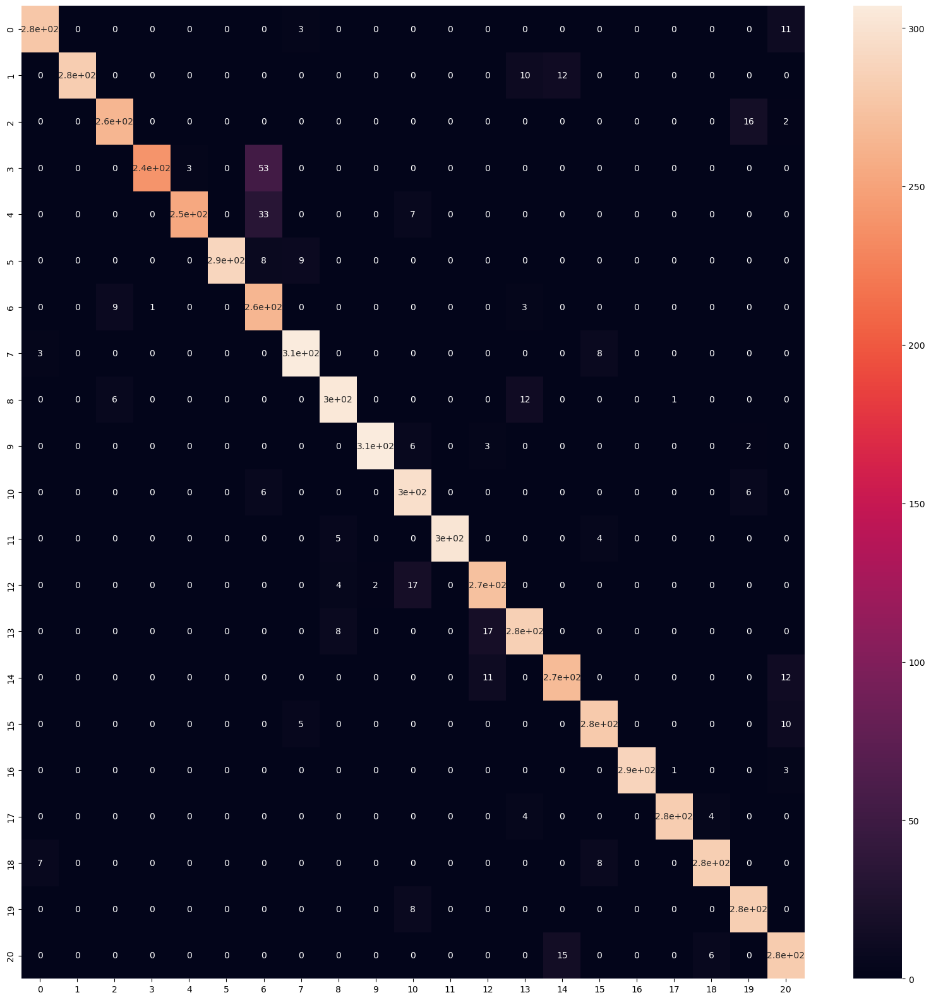

Test - Accuracy: 0.939047619047619
Test - F1-Score: 0.9398903048818933
Validation - Accuracy: 0.9314285714285714
Validation - F1-Score: 0.9322724889100393


In [46]:
from catboost import CatBoostClassifier
params_cbc = [{'iterations':[500,700,1000],'depth':[3,4,5],'learning_rate':[0.1,0.3]}]
cbc = CatBoostClassifier(random_seed=13)
gscv = GridSearchCV(cbc,params_cbc,scoring='f1_weighted',cv=10)
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV
param_gbc = [{'learning_rate':[0.1,0.25],'n_estimators':[200,300,400]}]
gbc = GradientBoostingClassifier()
gscv = GridSearchCV(gbc,param_gbc,cv=10,scoring='f1_weighted')
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import DecisionTreeClassifier
params_ada = [{'n_estimators':[80,100,150,200],'learning_rate':[0.1,0.25]}]
ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=4))
gscv = GridSearchCV(ada,params_ada,scoring='f1_weighted',cv=10)
gscv = gscv.fit(Xtrain,Ytrain)
print("Best Parameters: "+str(gscv.best_params_))
print("Best Estimators: "+str(gscv.best_estimator_))
print("Best Score: "+str(gscv.best_score_))
Ypred = gscv.predict(Xtest)
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(Ypred,Ytest),annot=True)
plt.show()
print('Test - Accuracy: '+str(accuracy_score(Ypred,Ytest)))
print("Test - F1-Score: "+str(f1_score(Ypred,Ytest,average='weighted')))
print("Validation - Accuracy: "+str(accuracy_score(gscv.predict(Xval),Yval)))
print("Validation - F1-Score: "+str(f1_score(gscv.predict(Xval),Yval,average='weighted')))